## Recommender Systems 2 (Content-based recommender system)

##### Lakkas Giannis

### Basic Imports

In [410]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from itertools import combinations
from collections import defaultdict
from tqdm import tqdm
import re
from fuzzywuzzy import fuzz
from dataclasses import dataclass
from random import random,sample,shuffle

# sklearn
from sklearn.decomposition import PCA as sklearnPCA
from sklearn.metrics.pairwise import cosine_similarity
from sklearn.feature_extraction.text import TfidfVectorizer
from sklearn.metrics.pairwise import linear_kernel

# Bert
from torch import Tensor
from sentence_transformers import SentenceTransformer, util
# load the pretrained model.
sbert = SentenceTransformer('all-MiniLM-L6-v2')

### Metadata dataset

* asin - ID of the product, e.g. 0000031852
* title - name of the product
* feature - bullet-point format features of the product
* description - description of the product
* price - price in US dollars (at time of crawl)
* imageURL - url of the product image
* imageURL - url of the high resolution product image
* related - related products (also bought, also viewed, bought together, buy after viewing)
* salesRank - sales rank information
* brand - brand name
* categories - list of categories the product belongs to
* tech1 - the first technical detail table of the product
* tech2 - the second technical detail table of the product
* similar - similar product table

In [535]:
df_meta = pd.read_json(r'dataset/meta_Software.json', lines=True)

In [536]:
df_meta

,category,tech1,description,fit,title,also_buy,tech2,brand,feature,rank,also_view,main_cat,similar_item,date,price,asin,imageURL,imageURLHighRes,details
0,[],,[],,HOLT PHYSICS LESSON PRESENTATION CD-ROM QUICK ...,[],,HOLT. RINEHART AND WINSTON,[],"25,550 in Software (",[],Software,,</div>,.a-box-inner{background-color:#fff}#alohaBuyBo...,0030672120,[],[],NaN
1,[],,"[, <b>Latin rhythms that will get your kids si...",,"Sing, Watch, &amp; Learn Spanish (DVD + Guide)...",[],,McGraw Hill,[],"15,792 in Software (",[],Software,,</div>,,0071480935,[https://images-na.ssl-images-amazon.com/image...,[https://images-na.ssl-images-amazon.com/image...,NaN
2,[],,[<b>Connect is the only integrated learning sy...,,Connect with LearnSmart Access Card for Microb...,[],,McGraw-Hill Science/Engineering/Math,[],"16,900 in Software (",[],Software,,</div>,,007329506X,[https://images-na.ssl-images-amazon.com/image...,[https://images-na.ssl-images-amazon.com/image...,NaN
3,[],,[],,LearnSmart Standalone Access Card for Prescott...,[],,McGraw-Hill Education,[],"12,986 in Software (",[],Software,,</div>,,0073513458,[https://images-na.ssl-images-amazon.com/image...,[https://images-na.ssl-images-amazon.com/image...,NaN
4,[],,[<i>Anatomy &amp; Physiology Revealed Cat</i> ...,,Anatomy &amp; Physiology Revealed Student Acce...,"[0323394612, 0323227937, 1118527488]",,McGraw-Hill Education,[],"14,861 in Software (",[],Software,,</div>,$4.83,0073525758,[https://images-na.ssl-images-amazon.com/image...,[https://images-na.ssl-images-amazon.com/image...,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
26785,"[Software, Children's]",,[<b>Features: </b><br>1. Beautiful and fabulou...,,925 Sterling Silver Angel Wings Heart Pendant ...,"[B07B4B12JX, B008UX1WJ2]",,17maimeng,[Material: Guaranteed 100% Real Silver+Platinu...,"1,389,844 in Clothing, Shoes & Jewelry (","[B008UX1WJ2, B0094JVCKU, B077J3DR69, B07J4Z659...","<img src=""https://images-na.ssl-images-amazon....",,17maimeng,$24.00,B01HEFZJC2,[https://images-na.ssl-images-amazon.com/image...,[https://images-na.ssl-images-amazon.com/image...,{}
26786,"[Software, Children's, Material: Guaranteed 10...",,[<b>Features: </b><br>1. Beautiful and fabulou...,,925 Sterling Silver Love Heart Opal Pendant Ne...,[],,17maimeng,[Material: Guaranteed 100% Real Silver+Platinu...,"1,469,307 in Clothing, Shoes & Jewelry (","[B074M486S8, B01D4H965K, B077L7GGF4, B019D8X0W...","<img src=""https://images-na.ssl-images-amazon....",,17maimeng,$23.20,B01HEFZKEE,[https://images-na.ssl-images-amazon.com/image...,[https://images-na.ssl-images-amazon.com/image...,{}
26787,"[Software, Digital Software, Antivirus & Secur...",,[<div>Mac Internet Security X9 contains two of...,,Intego Mac Internet Security X9 - 1 Mac - 1 ye...,[],,Intego,[Award-winning antivirus software to protect a...,"2,733 in Software (","[B01MF5MTWP, B015724B8M, B07CYFFH4H, B07CY54KL...",Software,,</div>,$39.99,B01HF3G4BS,[],[],"{'Downloading:': 'Currently, this item is avai..."
26788,[],,[VersaCheck X9 for QuickBooks 2016 DNA Secure ...,,VersaCheck X9 Small and Medium Business 2016 3...,[],,Diversified Productivity Solutions Ltd,[],"15,575 in Software (",[],Software,,</div>,$24.39,B01HF41TKI,[],[],"{'Shipping Weight:': '1.3 pounds', 'ASIN:': 'B..."


In [537]:
df_meta.imageURLHighRes[4]

['https://images-na.ssl-images-amazon.com/images/I/51Do0BbcTkL.jpg']

In [538]:
df_meta.main_cat.unique()

array(['Software', 'Books', 'Movies &amp; TV', 'Video Games',
       'Movies & TV', 'Office Products', 'Health &amp; Personal Care',
       'Amazon Home', 'Industrial & Scientific', 'Toys &amp; Games',
       'Musical Instruments', 'Tools &amp; Home Improvement',
       'Cell Phones & Accessories', 'Cell Phones &amp; Accessories',
       'All Electronics', 'Home Audio & Theater', 'Camera &amp; Photo',
       'Baby', 'Toys & Games',
       '<img src="https://images-na.ssl-images-amazon.com/images/G/01/digital/music/logos/amzn_music_logo_subnav._CB471835632_.png" class="nav-categ-image" alt="Digital Music"/>',
       'Pet Supplies', 'GPS & Navigation', 'Computers',
       'Home Audio &amp; Theater', 'GPS &amp; Navigation', 'Automotive',
       'Health & Personal Care', 'Sports &amp; Outdoors',
       'Arts, Crafts & Sewing', 'Arts, Crafts &amp; Sewing',
       'Camera & Photo', 'Tools & Home Improvement',
       '<img src="https://images-na.ssl-images-amazon.com/images/G/01/digital/music

* We observed also that there are more categories except from 'Software' in this column, so we cleaned this column.

In [539]:
df_meta = df_meta[df_meta.main_cat == 'Software'].reset_index()

In [540]:
df_meta[df_meta.tech1 != '']

,index,category,tech1,description,fit,title,also_buy,tech2,brand,feature,rank,also_view,main_cat,similar_item,date,price,asin,imageURL,imageURLHighRes,details
15649,18106,"[Software, Accounting & Finance, Check Printing]","class=""a-keyvalue prodDetTable"" role=""present...",[Blank Computer Check paper refills compatible...,,Business Voucher Check Stock - Versacheck Refi...,[B0030MWB16],,Compuchecks,[Check paper refills compatible with all Versa...,"[>#8,361 in Software (See top 100), >#24 in So...","[B0030MWB0M, B00480YE3M, B0030MUJE2, B0030F3FN...",Software,,"December 31, 2009",,B0030MWBB6,[https://images-na.ssl-images-amazon.com/image...,[https://images-na.ssl-images-amazon.com/image...,{}
22732,25702,"[Software, Business & Office, Training]","class=""a-keyvalue prodDetTable"" role=""present...","[Professor Teaches, the leading brand of train...",,Professor Teaches Windows 10,"[B014Y44D14, B015UJTY5C, 1939791545, 111931118...",,Individual Software,[Please Note The PC Download includes Professo...,"[>#2,513 in Software (See top 100), >#36 in So...","[B014Y44D14, 1119311187, B072B8BNM5, B078XKRPQ...",Software,,"August 15, 2015",$14.88,B0136JPKMO,[https://images-na.ssl-images-amazon.com/image...,[https://images-na.ssl-images-amazon.com/image...,{}


In [541]:
df_meta[df_meta.tech2 != '']

,index,category,tech1,description,fit,title,also_buy,tech2,brand,feature,rank,also_view,main_cat,similar_item,date,price,asin,imageURL,imageURLHighRes,details


* We can observe that the columns tech1 and tech2 contain mainly information that exists in other columns, for example "brand". So we can drop them.

In [542]:
df_meta.drop(['fit','imageURL', 'imageURLHighRes', 'tech1', 'tech2'], axis=1, inplace=True)

### utils

In [543]:
CLEANR = re.compile('<.*?>|&([a-z0-9]+|#[0-9]{1,6}|#x[0-9a-f]{1,6});')
def cleanhtml(raw_html):
    cleantext = re.sub(CLEANR, '', raw_html)
    return cleantext

In [544]:
def search_fuzzy(sentence: str, names: str) -> float:
    """
    Method which finds the fuzzy score for the given name in the given sentence.

    Args
        | sentence (str): the sentence to be processed
        | names (str): the name to be processed by the scorer in the given sentence

    """
    i = sentence
    j = names

    r = (fuzz.ratio(j, i))

    # partial_ratio
    p = (fuzz.partial_ratio(j, i))

    # token_sort_ratio
    t = (fuzz.token_sort_ratio(j, i))

    # token_set_ratio
    s = fuzz.token_set_ratio(j, i)

    # partial_token_set_ratio
    p_t = fuzz.partial_token_set_ratio(j, i)

    # partial_token_sort_ratio
    p_s = fuzz.partial_token_sort_ratio(j, i)

    # WRatio
    w = fuzz.WRatio(j, i)

    # QRatio
    q = fuzz.QRatio(j, i)

    # UWRatio
    uw = fuzz.UWRatio(j, i)

    # UQRatio
    uq = fuzz.UQRatio(j, i)

    # This print presenting the scores for all persons in person_entities for each manager

    # average value of all scores
    return (r + p + t + s + p_t + p_s + w + q + uw + uq) / 10

In [545]:
def jaccard_similarity(a, b):
    intersection = len(a.intersection(b))
    union = len(a.union(b))
    return intersection / union

#### Calculate product similarity

In [546]:
def calculate_category_similarity(product1, product2):
    product_sim = 0
    if product1 and product2:
        product_sim = jaccard_similarity(set(product1), set(product2))
    return product_sim

In [547]:
calculate_category_similarity(df_meta.category[499], df_meta.category[497])

0

#### Calculate description similarity

In [71]:
df_meta['description_text'] = (df_meta['description'].str.join(' ')).apply(cleanhtml)

In [72]:
df_meta['description_text']

0                                                         
1         Latin rhythms that will get your kids singing...
2        Connect is the only integrated learning system...
3                                                         
4        Anatomy  Physiology Revealed Cat is the ultima...
                               ...                        
23766    Number of Videos: 1 hour - 11 lessons Ships on...
23767     Softdiv PDF to Image Converter is designed to...
23768    Mac Internet Security X9 contains two of our b...
23769    VersaCheck X9 for QuickBooks 2016 DNA Secure 1...
23770    Thank you for your interest in volume one of W...
Name: description_text, Length: 23771, dtype: object

In [16]:
#encode all descriptions
embedded = sbert.encode(df_meta['description_text'], convert_to_tensor=True)

#Compute cosine-similarities
descr_sim_matrix = util.cos_sim(embedded, embedded)

In [17]:
descr_sim_matrix[0][1:]

tensor([0.0692, 0.0741, 1.0000,  ..., 0.1455, 0.0028, 0.0327])

In [548]:
def calculate_description_similarity(sim_matrix, index1, index2):
    return sim_matrix[index1, index2].numpy()

#### Calculate brand similarity 

In [549]:
def calculate_brand_similarity(product1, product2):
    similarity = 1 
    product1 = product1.upper().strip()
    product2 = product2.upper().strip()
    if product1 == product2:
        similarity = 1 
    elif search_fuzzy(product1, product2) >= 70.0:
        similarity = search_fuzzy(product1, product2) / 100.
    else:
        similarity = 0
    return similarity

In [550]:
calculate_brand_similarity('McGraw Hill', 'McGraw Hill',)

1

#### Calculate price similarity

In [551]:
df_meta.loc[~df_meta.price.str.startswith('$'), 'price'] = '$'

In [552]:
df_meta['price_float'] = df_meta['price'].str.replace(',', '').str.extract(r'(\d+.\d+)').astype('float')

In [553]:
df_meta.head(10)

,index,category,description,title,also_buy,brand,feature,rank,also_view,main_cat,similar_item,date,price,asin,details,price_float
0,0,[],[],HOLT PHYSICS LESSON PRESENTATION CD-ROM QUICK ...,[],HOLT. RINEHART AND WINSTON,[],"25,550 in Software (",[],Software,,</div>,$,0030672120,NaN,NaN
1,1,[],"[, <b>Latin rhythms that will get your kids si...","Sing, Watch, &amp; Learn Spanish (DVD + Guide)...",[],McGraw Hill,[],"15,792 in Software (",[],Software,,</div>,$,0071480935,NaN,NaN
2,2,[],[<b>Connect is the only integrated learning sy...,Connect with LearnSmart Access Card for Microb...,[],McGraw-Hill Science/Engineering/Math,[],"16,900 in Software (",[],Software,,</div>,$,007329506X,NaN,NaN
3,3,[],[],LearnSmart Standalone Access Card for Prescott...,[],McGraw-Hill Education,[],"12,986 in Software (",[],Software,,</div>,$,0073513458,NaN,NaN
4,4,[],[<i>Anatomy &amp; Physiology Revealed Cat</i> ...,Anatomy &amp; Physiology Revealed Student Acce...,"[0323394612, 0323227937, 1118527488]",McGraw-Hill Education,[],"14,861 in Software (",[],Software,,</div>,$4.83,0073525758,NaN,4.83
5,5,[],"[John Coburn grew up in the Hawaiian Islands, ...",Connect Math by ALEKS Access Card 52 Weeks for...,[],McGraw-Hill Science/Engineering/Math,[],"43,708 in Software (",[],Software,,</div>,$,0077340701,NaN,NaN
6,6,[],[<b>Connect is the only integrated learning sy...,Connect Access Card for Microbiology Fundament...,[],Brand: McGraw-Hill Science/Engineering/Math,[Used Book in Good Condition],"8,512 in Software (","[0078021049, 1259293173, 0073402354, 126009216...",Software,,</div>,$,0077369823,NaN,NaN
7,7,[],[<i>Living with Arts </i> approach to art appr...,Connect Art with McGraw-Hill LearnSmart Access...,[],McGraw-Hill Humanities/Social Sciences/Languages,[],"11,081 in Software (",[],Software,,</div>,$,0077410297,NaN,NaN
8,8,[],[McGraw-Hill Connect is a digital teaching and...,Connect Biology Access Card for Essentials of ...,[],McGraw-Hill Science/Engineering/Math,[],"17,395 in Software (",[],Software,,</div>,$47.23,007739688X,NaN,47.23
9,9,[],[<i>Living with Arts </i> approach to art appr...,Connect Art PLUS with McGraw-Hill LearnSmart A...,[],McGraw-Hill Education,[],"6,432 in Software (",[1259360423],Software,,</div>,$,0077410319,NaN,NaN


In [554]:
df_meta.price_float.describe()

count    4692.000000
mean       45.323930
std       118.869396
min         0.000000
25%        10.990000
50%        19.950000
75%        39.990000
max      3175.580000
Name: price_float, dtype: float64

In [555]:
df_meta['price_float_norm'] = (df_meta['price_float'] - df_meta['price_float'].mean()) / df_meta['price_float'].std()

In [556]:
max_price = max([x for x in df_meta.price_float_norm if pd.isna(x) == False])

In [557]:
min_price = min([x for x in df_meta.price_float_norm if pd.isna(x) == False])

In [558]:
df_meta[df_meta['price_float'] ==  max([x for x in df_meta.price_float if pd.isna(x) == False])]

,index,category,description,title,also_buy,brand,feature,rank,also_view,main_cat,similar_item,date,price,asin,details,price_float,price_float_norm
23735,26749,"[Software, Programming & Web Development, Data...",[SQL Server 2016 Standard Edition provides imp...,Microsoft SQL Server 2016 Standard Edition - 1...,"[B01M1L0YJL, B01LYZ4P74, B00ZSHDJ4O, B0036E8V0...",Microsoft,[Bolster security with always encrypted techno...,"2,073 in Software (","[B0778T128V, B01M1L0YJL, B07G4GZTQ5, B07L5NKZN...",Software,,</div>,"$3,175.58",B01GKF2PH4,{' Product Dimensions: ': '4.7 x 1.6 ...,3175.58,26.333574


In [559]:
def calculate_price_similarity(price1, price2):
    dissim_score = abs(price1 -  price2) / (max_price - min_price)
    sim_score =  1 - dissim_score
    return sim_score if not pd.isna(sim_score) else 0

In [560]:
calculate_price_similarity(df_meta['price_float_norm'][0], df_meta['price_float_norm'][1])

0

In [561]:
df_meta['price_float_norm']

0             NaN
1             NaN
2             NaN
3             NaN
4       -0.340659
           ...   
23766         NaN
23767         NaN
23768   -0.044872
23769   -0.176109
23770         NaN
Name: price_float_norm, Length: 23771, dtype: float64

#### Calculate feature similarity

In [562]:
df_meta.feature = df_meta.feature.str.join(' ')

In [563]:
df_meta.feature[14]

'Photomatix Pro Full Retail Stand Alone 2 Years Upgrade Support Included Works On Windows &amp; Mac'

In [564]:
df_meta[df_meta.feature != '']

,index,category,description,title,also_buy,brand,feature,rank,also_view,main_cat,similar_item,date,price,asin,details,price_float,price_float_norm
6,6,[],[<b>Connect is the only integrated learning sy...,Connect Access Card for Microbiology Fundament...,[],Brand: McGraw-Hill Science/Engineering/Math,Used Book in Good Condition,"8,512 in Software (","[0078021049, 1259293173, 0073402354, 126009216...",Software,,</div>,$,0077369823,NaN,NaN,NaN
14,14,[],[Photomatix Photomatix Pro and Photomatix Esse...,HDR Photomatix Pro 5,[],HDR,Photomatix Pro Full Retail Stand Alone 2 Years...,"10,334 in Software (",[B002CIP12U],Software,,</div>,$,0077451058,NaN,NaN,NaN
21,21,[],[<i>CJ: Realities and Challenges</i> empowers ...,CJ:REALITIES+CHALLENGES-CONNEC,[],Brand: McGraw-Hill Humanities/Social Sciences/...,Used Book in Good Condition,"12,862 in Software (","[0078026520, 1259916456, 0078140943]",Software,,</div>,$,0077492951,NaN,NaN,NaN
57,59,"[Software, Education &amp; Reference, Test Pre...","[Windos 95, 98, NT4, 200, XP\nMac OS 9.1-9.2 O...",Magruder's American Government Itext Interacti...,[],Magruder's,Interactive Learning Tools-Bring Content to li...,"52,031 in Software (",[],Software,,</div>,$,0131817949,NaN,NaN,NaN
65,69,"[Software, Programming & Web Development, Web ...",[System Requirements:\n\n Microsoft Windows...,Microsoft FrontPage 2003 (120 Day Learning Tri...,[],Microsoft,SAME FUNCTIONALITY AS FULL VERSION PERFECT FOR...,"32,755 in Software (",[],Software,,</div>,$,0205064833,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
23765,26780,[],[Music Production Audacity Track Music Editor ...,Creative Studio Bundle,[],FixITnow,Professional Multimedia Video Converter - Vide...,"18,964 in Software (",[],Software,,</div>,$,B01HAWZYHE,{' Product Dimensions: ': '6 x 6 x 0....,NaN,NaN
23766,26781,"[Software, Programming & Web Development, Trai...",[<b>Number of Videos:</b> 1 hour - 11 lessons<...,Real World Docker - Training DVD,[],O'Reilly Media,Learn Real World Docker from a professional tr...,"27,631 in Software (",[],Software,,</div>,$,B01HC0J29A,"{'Shipping Weight:': '4.2 ounces', 'ASIN:': 'B...",NaN,NaN
23767,26782,"[Software, Digital Software, Business & Office...","[<div>, Softdiv PDF to Image Converter is desi...",Softdiv PDF to Image Converter [Download],[B009K8RHNQ],Softdiv Software Sdn Bhd,Convert PDF (single and multiple-page) files t...,"14,357 in Software (",[],Software,,</div>,$,B01HCPB7GQ,"{'Downloading:': 'Currently, this item is avai...",NaN,NaN
23768,26787,"[Software, Digital Software, Antivirus & Secur...",[<div>Mac Internet Security X9 contains two of...,Intego Mac Internet Security X9 - 1 Mac - 1 ye...,[],Intego,Award-winning antivirus software to protect ag...,"2,733 in Software (","[B01MF5MTWP, B015724B8M, B07CYFFH4H, B07CY54KL...",Software,,</div>,$39.99,B01HF3G4BS,"{'Downloading:': 'Currently, this item is avai...",39.99,-0.044872


In [565]:
df_meta.feature.unique()

array(['', 'Used Book in Good Condition',
       'Photomatix Pro Full Retail Stand Alone 2 Years Upgrade Support Included Works On Windows &amp; Mac',
       ...,
       'Convert PDF (single and multiple-page) files to image format PNG, JPG, BMP, GIF, TIFF, ICO, JP2, J2C, PDF, TGA, WBMP, EXR, PNM, XPM and etc. User friendly interface with step by step wizard Preview PDF files before convert Import PDF file individually or from a whole folder for batch conversion Option to customize the output image format settings, width, height, aspect ratio and DPI.',
       'Award-winning antivirus software to protect against Mac and Windows malware and adware 24/7 Protection with automatic real-time scanning Anti-phishing protection Scans for viruses on iOS devices and finds/eradicates viruses found in document directories on the devices Easy set up and configuration for non-technical users',
       'Smooth Vector Images with Low Node Count'], dtype=object)

* We use TfIdf vectorizer to get the tfidf scores.

In [566]:
tfidf = TfidfVectorizer(stop_words='english')

In [567]:
df_meta.feature = df_meta.feature.fillna('')

In [568]:
overview_matrix = tfidf.fit_transform(df_meta.feature)

In [569]:
overview_matrix.shape

(23771, 21194)

* Cosine similarity of the TfIdf scores.

In [570]:
similarity_matrix = linear_kernel(overview_matrix, overview_matrix)
similarity_matrix

array([[0., 0., 0., ..., 0., 0., 0.],
       [0., 0., 0., ..., 0., 0., 0.],
       [0., 0., 0., ..., 0., 0., 0.],
       ...,
       [0., 0., 0., ..., 1., 0., 0.],
       [0., 0., 0., ..., 0., 0., 0.],
       [0., 0., 0., ..., 0., 0., 1.]])

In [571]:
def calculate_feature_similarity(sim_matrix, index1, index2):
    return sim_matrix[index1, index2]

#### Calculate rank similarity

In [572]:
df_meta['rank_number'] = df_meta['rank'].str.replace(" ", "").str.replace(',', '').str.extract(r'(\d+.\d+)').fillna(0)

df_meta['rank_number'] = df_meta['rank_number'].astype('int')

In [573]:
df_meta['rank_number']

0        25550
1        15792
2        16900
3        12986
4        14861
         ...  
23766    27631
23767    14357
23768     2733
23769    15575
23770     7721
Name: rank_number, Length: 23771, dtype: int32

In [574]:
df_meta[df_meta['rank_number'] < 0]

,index,category,description,title,also_buy,brand,feature,rank,also_view,main_cat,similar_item,date,price,asin,details,price_float,price_float_norm,rank_number


In [575]:
bins = [0, 100, 500, 1000, 2500, 5000, 7500, 10000, 12500 , 25000, 37500 , 50000, 75000, 100000, 200000]
labels = [0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13]
df_meta['rank_bins'] = pd.cut(df_meta['rank_number'], bins, labels=labels)

In [576]:
df_meta['rank_bins'].describe()

count     21297
unique       12
top           8
freq       5425
Name: rank_bins, dtype: int64

<AxesSubplot:xlabel='rank_bins', ylabel='count'>

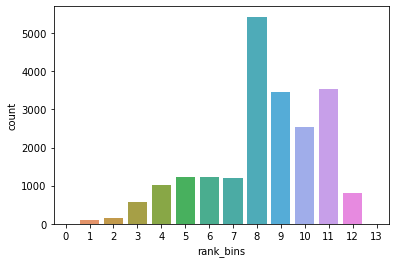

In [577]:
sns.countplot(x=df_meta['rank_bins'])

In [578]:
df_meta['rank_bins'].value_counts()

8     5425
11    3524
9     3444
10    2548
5     1237
6     1218
7     1212
4     1031
12     819
3      577
2      163
1       99
0        0
13       0
Name: rank_bins, dtype: int64

In [579]:
def calculate_rank_similarity(rank1, rank2):
    diss_score = abs(rank1 - rank2) / (13 - 0)
    sim_score = 1 - diss_score
    return sim_score

#### Calculate details similarity

In [580]:
df_meta[~ pd.isna(df_meta['details'])]

,index,category,description,title,also_buy,brand,feature,rank,also_view,main_cat,similar_item,date,price,asin,details,price_float,price_float_norm,rank_number,rank_bins
702,852,[],[Whats Included: Full Activation Key; Full Dow...,Windows 8.1 Pro Product Key for 32 or 64 Bit O...,[],Microsoft,Windows 8.1 Professional product Key For 32 or...,"24,615 in Software (",[],Software,,</div>,$,752300055X,"{'ASIN:': '752300055X', ' Date first listed on...",NaN,NaN,24615,8
703,853,"[Software, Design & Illustration, Animation & 3D]",[],3DS MAX 8,[],AUTODESK,,"31,616 in Software (",[],Software,,</div>,$,7900633022,"{'ASIN:': '7900633022', ' Date first listed on...",NaN,NaN,31616,9
704,854,"[Software, Education & Reference, Science]","[Translation Express, a Kingsoft product, is d...",Kingsoft Translation Express 2005 Pro,[],SINIC,Instant translation between English &lt;-&gt; ...,"75,121 in Software (",[],Software,,</div>,$,7900663886,"{'Shipping Weight:': '3 pounds', 'ASIN:': '790...",NaN,NaN,75121,12
705,855,"[Software, Education & Reference, Languages]",[PowerWord is designed for people learning or ...,Powerword 2009 Professional Edition,[],Javvin Technologies,Includes more 140 world famous dictionaries in...,"66,115 in Software (",[],Software,,</div>,$67.35,7900749608,"{'Shipping Weight:': '1 pounds', 'ASIN:': '790...",67.35,0.185296,66115,11
706,856,"[Software, Video, Video Editing]",[Item comes with cd in sleeve only. no ox or m...,Cinema 4d R 10 Studio Bundle,[],Maxon Cinema 4d,"Cinema 4D Advanced Render, MOCCA, Thinking Par...","56,788 in Software (",[B004M145AY],Software,,</div>,$,8073160463,"{'Shipping Weight:': '0.5 ounces', 'ASIN:': '8...",NaN,NaN,56788,11
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
23766,26781,"[Software, Programming & Web Development, Trai...",[<b>Number of Videos:</b> 1 hour - 11 lessons<...,Real World Docker - Training DVD,[],O'Reilly Media,Learn Real World Docker from a professional tr...,"27,631 in Software (",[],Software,,</div>,$,B01HC0J29A,"{'Shipping Weight:': '4.2 ounces', 'ASIN:': 'B...",NaN,NaN,27631,9
23767,26782,"[Software, Digital Software, Business & Office...","[<div>, Softdiv PDF to Image Converter is desi...",Softdiv PDF to Image Converter [Download],[B009K8RHNQ],Softdiv Software Sdn Bhd,Convert PDF (single and multiple-page) files t...,"14,357 in Software (",[],Software,,</div>,$,B01HCPB7GQ,"{'Downloading:': 'Currently, this item is avai...",NaN,NaN,14357,8
23768,26787,"[Software, Digital Software, Antivirus & Secur...",[<div>Mac Internet Security X9 contains two of...,Intego Mac Internet Security X9 - 1 Mac - 1 ye...,[],Intego,Award-winning antivirus software to protect ag...,"2,733 in Software (","[B01MF5MTWP, B015724B8M, B07CYFFH4H, B07CY54KL...",Software,,</div>,$39.99,B01HF3G4BS,"{'Downloading:': 'Currently, this item is avai...",39.99,-0.044872,2733,4
23769,26788,[],[VersaCheck X9 for QuickBooks 2016 DNA Secure ...,VersaCheck X9 Small and Medium Business 2016 3...,[],Diversified Productivity Solutions Ltd,,"15,575 in Software (",[],Software,,</div>,$24.39,B01HF41TKI,"{'Shipping Weight:': '1.3 pounds', 'ASIN:': 'B...",24.39,-0.176109,15575,8


In [581]:
df_meta['details'][741]

{'Shipping Weight:': '1.1 pounds',
 'ASIN:': 'B00000JL63',
 ' Date first listed on Amazon:': 'October 24, 1999'}

* Lets explore the column details, which contains a python dict with various keys. We can begin the exploration by finding all the keys that exist in this column,

In [582]:
keys = set()
for y in df_meta['details']:
    if not pd.isna(y):
        for k in y.keys():
            keys.add(k)

In [583]:
keys

{'\n    Item Weight: \n    ',
 '\n    Product Dimensions: \n    ',
 ' Date first listed on Amazon:',
 'ASIN:',
 'ASIN: ',
 'Discontinued by manufacturer:',
 'Domestic Shipping: ',
 'Downloading:',
 'International Shipping: ',
 'Item model number:',
 'Note:',
 'Online Code:',
 'Online Map Code:',
 'Shipping Weight:',
 'UPC:'}

* We observe that there is a key with the name  ' Date first listed on Amazon:', we will use it in order to create a function that calculates the similarity between the years of the first insertion in Amazon website of two products.

In [584]:
years = [int(row[' Date first listed on Amazon:'][-4:]) for row in df_meta[df_meta['details'].notnull()].details if ' Date first listed on Amazon:' in row]     

In [585]:
years = set(years)

In [586]:
# Python3 program to find Maximum difference 
# between two elements such that larger 
# element appears after the smaller number
  
# The function assumes that there are 
# at least two elements in array. The 
# function returns a negative value if 
# the array is sorted in decreasing 
# order and returns 0 if elements are equal
def maxDiff (arr, n):
      
    # Initialize diff, current 
    # sum and max sum
    diff = arr[1] - arr[0]
    curr_sum = diff
    max_sum = curr_sum
  
    for i in range(1, n - 1):
          
        # Calculate current diff
        diff = arr[i + 1] - arr[i]
  
        # Calculate current sum
        if (curr_sum > 0):
            curr_sum += diff
        else:
            curr_sum = diff
  
        # Update max sum, if needed
        if (curr_sum > max_sum):
            max_sum = curr_sum
    return max_sum

In [587]:
max_diff = maxDiff(list(years), len(years))

In [588]:
def calculate_first_listed_year_similarity(product1, product2):
    keyword = ' Date first listed on Amazon:'
    if pd.isna(product1) or pd.isna(product2):
        return 0 
    if (keyword in product1) and (keyword in product2):
        score = (int(product1[keyword][-4:]) - int(product2[keyword][-4:])) / max_diff
    else:
        score = 0
    return score

#### Recommendations

In [475]:
def total_similarity(product1, index_prod2, product2, weights):
    scores = {}
    prod_index = df_meta.loc[df_meta['asin'] == product1['asin'].values[0]].index[0]
    scores['brands_similarity'] = calculate_brand_similarity(product1['brand'].values[0], product2['brand'])
    scores['category_similarity'] = calculate_category_similarity(product1['category'].values[0], product2['category'])
    scores['price_similarity'] = calculate_price_similarity(product1['price_float_norm'].values[0], product2['price_float_norm'])
    scores['description_similarity'] = calculate_description_similarity(descr_sim_matrix, prod_index, index_prod2)
    scores['rank_similarity'] = calculate_rank_similarity(product1['rank_bins'].values[0], product2['rank_bins'])
    scores['feature_similarity'] = calculate_feature_similarity(similarity_matrix, prod_index, index_prod2)
    scores['first_year_similarity'] = calculate_first_listed_year_similarity(product1['details'].values[0], product2['details'])
    factors = {x: round(scores[x] * weights[x], 2) for x in scores}
    sorted_factors = [factor for factor in sorted(factors.items(), key=lambda x: x[1], reverse=True) if factor[1] > 0]
    return round(np.sum(list(factors.values())), 2), sorted_factors

In [476]:
def recommend(asin, 
              k:int,
              weights:dict)->list:

    results={} # recommendations 
    
    for index, row in tqdm(df_meta[df_meta['asin']!=asin].iterrows()): # for each candidate
        
        #get the similarity and the explanation
        my_sim, my_exp = total_similarity(df_meta[df_meta['asin']==asin], index, row, weights)
    
        #remember
        results[row.title] = (my_sim, my_exp)

    #store, slice, return
    return sorted(results.items(),key=lambda x:x[1][0],reverse=True)[:k]

#### Bitdefender Internet Security 2009 2Yr/3Pc [OLD VERSION] 

In [598]:
print(df_meta[df_meta['asin'] == 'B001C31OZY'].title.values[0])

Bitdefender Internet Security 2009 2Yr/3Pc [OLD VERSION]


In [599]:
df_meta[df_meta['asin'] == 'B001C31OZY']

,index,category,description,title,also_buy,brand,feature,rank,also_view,main_cat,similar_item,date,price,asin,details,price_float,price_float_norm,rank_number,rank_bins
14358,16651,"[Software, Antivirus & Security, Internet Secu...",[BitDefender Internet Security 2009 keeps your...,Bitdefender Internet Security 2009 2Yr/3Pc [OL...,[],Bitdefender,"Scans all web, e-mail and instant messaging tr...","22,949 in Software (",[],Software,,</div>,$,B001C31OZY,{' Product Dimensions: ': '1.3 x 7.6 ...,NaN,NaN,22949,8


In [478]:
recommend('B001C31OZY', 20, {'brands_similarity': 1 , 'category_similarity': 1, 
                             'price_similarity': 1, 'description_similarity' : 1, 
                             "rank_similarity": 1, "feature_similarity": 1,
                            "first_year_similarity" : 1})

23770it [02:47, 141.91it/s]


[('Bitdefender Total Security 2009 2Yr/3Pc [OLD VERSION]',
  (4.54,
   [('brands_similarity', 1),
    ('category_similarity', 1.0),
    ('rank_similarity', 1.0),
    ('description_similarity', 0.89),
    ('feature_similarity', 0.65)])),
 ('Gamesafe Antivirus Defense',
  (3.03,
   [('brands_similarity', 1),
    ('rank_similarity', 0.92),
    ('description_similarity', 0.58),
    ('category_similarity', 0.5),
    ('feature_similarity', 0.12)])),
 ('Norton Internet Security 2009 5-User [OLD VERSION]',
  (2.58,
   [('category_similarity', 1.0),
    ('rank_similarity', 1.0),
    ('description_similarity', 0.58)])),
 ('Norton Internet Security 2009 [OLD VERSION]',
  (2.47,
   [('category_similarity', 1.0),
    ('rank_similarity', 0.77),
    ('description_similarity', 0.58),
    ('feature_similarity', 0.12)])),
 ('Norton Smartphone Security',
  (2.46,
   [('category_similarity', 1.0),
    ('rank_similarity', 0.85),
    ('description_similarity', 0.65),
    ('feature_similarity', 0.05)])),
 ('

In [607]:
df_meta[df_meta.rank_bins == 1 ]

,index,category,description,title,also_buy,brand,feature,rank,also_view,main_cat,similar_item,date,price,asin,details,price_float,price_float_norm,rank_number,rank_bins
278,343,"[Software, Education &amp; Reference]",[The essential bible study resource that will ...,eBIBLE The Essential Bible Study Library,[],Logos Bible Software,Contains eBible Quick Start Guide On Disc! For...,481 in Software (,"[B0002BQSC6, B0009G2K12, 1418516805, 078524699...",Software,,</div>,$,1404174257,NaN,NaN,NaN,481,1
675,825,"[Software, Business & Office, Office Suites]",[<b>Are you looking for an alternative to Micr...,Office Suite Special Edition for Windows 10-8-...,"[B01MS13RU8, B00N89P7V2, B01LZN0QCB, B076MWBZT...",Markt+Technik,THE ALTERNATIVE: The Office Suite Package is t...,226 in Software (,"[B00N8A5HNY, B076MWBZT4, B00N3F15I0, B06W9JQ1S...",Software,,</div>,$12.99,3959828241,NaN,12.99,-0.272012,226,1
677,827,"[Software, Business & Office, Document Managem...",[Convert PDF documents into your chosen format...,PDF Converter Ultimate - Convert PDF files to ...,"[B076MWBZT4, 3959828160, B01LWC9TKP, B01MS13RU...",Markt+Technik,High recognition precision thanks to the lates...,339 in Software (,"[B01LWC9TKP, B01IM6VLXI, 3959828160, B004TKTOW...",Software,,</div>,$24.99,3959828330,NaN,24.99,-0.171061,339,1
679,829,"[Software, Photography]",[<b>Gimp 2.8 - The ultimate software in image ...,GIMP 2.8 - Ultimate Image Processing - Softwar...,"[B06WP73RDN, B007VQGZ8W, B07FB946ZV, B076MWBZT...",Markt+Technik,GIMP 2.8 - The Ultimate In Image Processing in...,281 in Software (,"[B06WP73RDN, B0799C43LY, B01JA1F4FA, B005IIUFY...",Software,,</div>,$12.99,3959828179,NaN,12.99,-0.272012,281,1
680,830,"[Software, Business &amp; Office, Document Man...","[Perfect PDF 9 PREMIUM EDITION - Create, edit,...","Perfect PDF 9 Premium - Create, Edit, Convert,...","[B01LZN0QCB, 3959828241, B076MWBZT4, 395982833...",Markt+Technik,NEW: with the OCR Module - The integrated OCR ...,468 in Software (,"[B01LWC9TKP, B01IM6VLXI, 3959828330, B0725R4K9...",Software,,</div>,$49.99,3959828160,NaN,49.99,0.039254,468,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
23567,26567,[],[The Hard Drive ERASER Ultimate Edition featur...,DBAN Boot and Nuke Hard Drive Data Wiping Soft...,"[B00N3EZQFE, B00L313JO4, B01KM6RZ90, B00Z7PAHV...",LinuxDiscOnline,DBAN2.3.0 is perfect for any time you need to ...,456 in Software (,"[B01KM6RZ90, B00O193X32, B00064KY3S, B01BJ2R07...",Software,,</div>,$11.94,B01DMD03OY,"{'Shipping Weight:': '0.6 ounces', 'ASIN:': 'B...",11.94,-0.280845,456,1
23603,26606,"[Software, Business & Office, Word Processing]",[Corel WordPerfect Office X8 Home & Student Ed...,Corel WordPerfect Office X8 Home &amp; Student...,"[0764501879, B07D21BDL5, B00N89P7V2, B076MWBZT...",Corel,"Create documents, presentations, spreadsheets,...",423 in Software (,"[B07D21BDL5, B01EB06R10, B0006PJAZU, B00N8A5HN...",Software,,</div>,$47.25,B01EB06QUM,{' Product Dimensions: ': '5.2 x 1.3 ...,47.25,0.016203,423,1
23625,26629,[],"[Repair, Reinstall or Install Windows 8 to com...",Windows 8 8.1 32 Bit 64 Bit System Restore Ful...,"[B07D8Y5373, B00N3EZQFE, B00N3F7PM0, B076DBK9N...",MachineRepair Shop,"Any brand computer compatible, Dell, Lenovo, H...",206 in Software (,"[B00S8UB7TW, B01LZ0PUTT, B00N3EZQFE, B07D8Y537...",Software,,</div>,$14.40,B01ENPLT16,"{'Shipping Weight:': '2.7 ounces', 'ASIN:': 'B...",14.40,-0.260150,206,1
23634,26638,"[Software, Programming & Web Development, Trai...","[, <b>Expand your son's or daughter's working ...",Learn to Code PYTHON for Multiplayer Adventure...,"[B016CEG2JU, B07L46DH38, B07LFNM6DS, B07GTLTN5...",Simply Coding,DESIGN A MULTIPLAYER GAME: Simply Coding Pytho...,450 in Software (,"[B016CEG2JU, B073RQT8B6, B07HGKWBNR, B076DMN8L...",Software,,</div>,$69.95,B01ETTRZ3M,{' Product Dimensions: ': '6 x 4 x 1 ...,69.95,0.207169,450,1


#### Perfect PDF 9 Premium - Create, Edit, Convert, Protect, Add Comments to, Insert Digital Signatures in PDFs with the OCR Module | 100% Compatible with Adobe Acrobat

In [611]:
print(df_meta[df_meta['asin'] == '3959828160'].title.values[0])

Perfect PDF 9 Premium - Create, Edit, Convert, Protect, Add Comments to, Insert Digital Signatures in PDFs with the OCR Module | 100% Compatible with Adobe Acrobat


In [612]:
df_meta[df_meta['asin'] == '3959828160']

,index,category,description,title,also_buy,brand,feature,rank,also_view,main_cat,similar_item,date,price,asin,details,price_float,price_float_norm,rank_number,rank_bins
680,830,"[Software, Business &amp; Office, Document Man...","[Perfect PDF 9 PREMIUM EDITION - Create, edit,...","Perfect PDF 9 Premium - Create, Edit, Convert,...","[B01LZN0QCB, 3959828241, B076MWBZT4, 395982833...",Markt+Technik,NEW: with the OCR Module - The integrated OCR ...,468 in Software (,"[B01LWC9TKP, B01IM6VLXI, 3959828330, B0725R4K9...",Software,,</div>,$49.99,3959828160,NaN,49.99,0.039254,468,1


In [616]:
recommend('3959828160', 20, {'brands_similarity': 1 , 'category_similarity': 1, 
                             'price_similarity': 0.5, 'description_similarity' : 1, 
                             "rank_similarity": .5, "feature_similarity": 1,
                            "first_year_similarity" : 1})

23770it [03:21, 117.99it/s]


[('Cosmi ROM17539 Perfect PDF Creator',
  (1.97,
   [('category_similarity', 0.5),
    ('price_similarity', 0.49),
    ('description_similarity', 0.47),
    ('rank_similarity', 0.35),
    ('feature_similarity', 0.16)])),
 ('Acrobat 9 Pro: Creating Forms',
  (1.91,
   [('category_similarity', 1.0),
    ('description_similarity', 0.64),
    ('rank_similarity', 0.19),
    ('feature_similarity', 0.08)])),
 ('Quicken WillMaker Plus 2008 [OLD VERSION]',
  (1.66,
   [('category_similarity', 0.5),
    ('price_similarity', 0.49),
    ('description_similarity', 0.37),
    ('rank_similarity', 0.27),
    ('feature_similarity', 0.03)])),
 ('Learn Microsoft Office 2013 and 2010 - 42 Hours of Video Training Tutorials for Excel, Word, PowerPoint, OneNote, Outlook, Access and Publisher',
  (1.65,
   [('price_similarity', 0.49),
    ('description_similarity', 0.42),
    ('rank_similarity', 0.42),
    ('category_similarity', 0.2),
    ('feature_similarity', 0.12)])),
 ('Acrobat 9 Pro Essential Training',

### Simulation

In [479]:
@dataclass
class User:
    seed_products:list # latent products that the user likes
    likes:list # known products that the user has liked 
    dislikes:list # known products that the user has disliked
    weights:dict # user preferences 
    like_threshold:float # similarity threshold for liking a product

* Due to time limitations, we will proceed the analysis using the top 4325 (top 6 buckets) based on ranking products.

In [480]:
df_meta = df_meta[df_meta.rank_bins <= 6]

In [481]:
def generate_fake_users(products,
                       users_num, seed_product_num, std_multiplier, factors = ['brands_similarity', 'category_similarity', 
                             'price_similarity', 'description_similarity', "rank_similarity", "feature_similarity", "first_year_similarity"]):
    users = []
    for user in tqdm(range(users_num), desc='Users processed'):
        weights={} # user preferences for each factor
        for factor in factors: # for each factor 
            weights[factor] = round(random(), 2) # sample a random preference value (weight)
        print(weights)
        seed_products = products.sample(n=seed_product_num)
        sim_scores=[] 
        
        s=0
        for index_seed, seed_product in tqdm(seed_products.iterrows(), desc='Seed products processed'): # for each seed product of this user
            
            for index, candidate in products.iterrows(): # for each other product
                
                my_sim, my_exp = total_similarity(df_meta[df_meta['asin']==seed_product.asin], index, candidate, weights)
                sim_scores.append(my_sim) # store      
        like_threshold = np.mean(sim_scores) + std_multiplier * np.std(sim_scores) # threshold is mean + 1 std dev
        
        # remember the user 
        users.append(User(seed_products, 
                          [], # liked products 
                          [], # disliked products
                          weights, # preferences
                          round(like_threshold, 2)) # like threshold
                    )
        
        
    return users

In [482]:
fake_users = generate_fake_users(df_meta, 10, 10, 1.5)

Users processed:   0%|          | 0/10 [00:00<?, ?it/s]
Seed products processed: 0it [00:00, ?it/s]

{'brands_similarity': 0.9, 'category_similarity': 0.83, 'price_similarity': 0.42, 'description_similarity': 0.18, 'rank_similarity': 0.76, 'feature_similarity': 0.02, 'first_year_similarity': 0.83}



Seed products processed: 1it [00:09,  9.82s/it]
Seed products processed: 2it [00:20, 10.20s/it]
Seed products processed: 3it [00:29,  9.84s/it]
Seed products processed: 4it [00:38,  9.61s/it]
Seed products processed: 5it [00:48,  9.57s/it]
Seed products processed: 6it [00:57,  9.42s/it]
Seed products processed: 7it [01:07,  9.49s/it]
Seed products processed: 8it [01:16,  9.39s/it]
Seed products processed: 9it [01:25,  9.40s/it]
Seed products processed: 10it [01:35,  9.53s/it]
Users processed:  10%|█         | 1/10 [01:35<14:17, 95.28s/it]
Seed products processed: 0it [00:00, ?it/s]

{'brands_similarity': 0.09, 'category_similarity': 0.08, 'price_similarity': 0.43, 'description_similarity': 0.06, 'rank_similarity': 0.77, 'feature_similarity': 0.37, 'first_year_similarity': 0.16}



Seed products processed: 1it [00:09,  9.51s/it]
Seed products processed: 2it [00:19,  9.68s/it]
Seed products processed: 3it [00:28,  9.48s/it]
Seed products processed: 4it [00:38,  9.48s/it]
Seed products processed: 5it [00:47,  9.50s/it]
Seed products processed: 6it [00:56,  9.42s/it]
Seed products processed: 7it [01:06,  9.63s/it]
Seed products processed: 8it [01:18, 10.32s/it]
Seed products processed: 9it [01:28, 10.25s/it]
Seed products processed: 10it [01:38,  9.82s/it]
Users processed:  20%|██        | 2/10 [03:13<12:56, 97.03s/it]
Seed products processed: 0it [00:00, ?it/s]

{'brands_similarity': 0.28, 'category_similarity': 0.3, 'price_similarity': 0.65, 'description_similarity': 0.57, 'rank_similarity': 0.75, 'feature_similarity': 0.46, 'first_year_similarity': 0.62}



Seed products processed: 1it [00:09,  9.32s/it]
Seed products processed: 2it [00:18,  9.39s/it]
Seed products processed: 3it [00:28,  9.47s/it]
Seed products processed: 4it [00:37,  9.43s/it]
Seed products processed: 5it [00:47,  9.54s/it]
Seed products processed: 6it [00:56,  9.45s/it]
Seed products processed: 7it [01:06,  9.60s/it]
Seed products processed: 8it [01:16,  9.57s/it]
Seed products processed: 9it [01:25,  9.64s/it]
Seed products processed: 10it [01:35,  9.57s/it]
Users processed:  30%|███       | 3/10 [04:49<11:15, 96.44s/it]
Seed products processed: 0it [00:00, ?it/s]

{'brands_similarity': 0.01, 'category_similarity': 0.59, 'price_similarity': 0.11, 'description_similarity': 0.98, 'rank_similarity': 0.35, 'feature_similarity': 0.96, 'first_year_similarity': 0.4}



Seed products processed: 1it [00:09,  9.22s/it]
Seed products processed: 2it [00:18,  9.35s/it]
Seed products processed: 3it [00:28,  9.48s/it]
Seed products processed: 4it [00:37,  9.41s/it]
Seed products processed: 5it [00:46,  9.39s/it]
Seed products processed: 6it [00:56,  9.34s/it]
Seed products processed: 7it [01:05,  9.46s/it]
Seed products processed: 8it [01:15,  9.41s/it]
Seed products processed: 9it [01:24,  9.42s/it]
Seed products processed: 10it [01:34,  9.45s/it]
Users processed:  40%|████      | 4/10 [06:23<09:34, 95.68s/it]
Seed products processed: 0it [00:00, ?it/s]

{'brands_similarity': 0.77, 'category_similarity': 1.0, 'price_similarity': 0.74, 'description_similarity': 0.66, 'rank_similarity': 0.78, 'feature_similarity': 0.27, 'first_year_similarity': 0.26}



Seed products processed: 1it [00:09,  9.20s/it]
Seed products processed: 2it [00:18,  9.32s/it]
Seed products processed: 3it [00:27,  9.32s/it]
Seed products processed: 4it [00:37,  9.43s/it]
Seed products processed: 5it [00:47,  9.45s/it]
Seed products processed: 6it [00:56,  9.40s/it]
Seed products processed: 7it [01:05,  9.39s/it]
Seed products processed: 8it [01:14,  9.31s/it]
Seed products processed: 9it [01:24,  9.35s/it]
Seed products processed: 10it [01:33,  9.37s/it]
Users processed:  50%|█████     | 5/10 [07:57<07:54, 94.98s/it]
Seed products processed: 0it [00:00, ?it/s]

{'brands_similarity': 0.59, 'category_similarity': 0.17, 'price_similarity': 0.8, 'description_similarity': 0.56, 'rank_similarity': 0.18, 'feature_similarity': 0.44, 'first_year_similarity': 0.21}



Seed products processed: 1it [00:09,  9.74s/it]
Seed products processed: 2it [00:19,  9.69s/it]
Seed products processed: 3it [00:30, 10.19s/it]
Seed products processed: 4it [00:39, 10.00s/it]
Seed products processed: 5it [00:49,  9.82s/it]
Seed products processed: 6it [00:58,  9.67s/it]
Seed products processed: 7it [01:08,  9.68s/it]
Seed products processed: 8it [01:18,  9.72s/it]
Seed products processed: 9it [01:28,  9.85s/it]
Seed products processed: 10it [01:38,  9.80s/it]
Users processed:  60%|██████    | 6/10 [09:35<06:24, 96.02s/it]
Seed products processed: 0it [00:00, ?it/s]

{'brands_similarity': 0.21, 'category_similarity': 0.26, 'price_similarity': 0.46, 'description_similarity': 0.43, 'rank_similarity': 0.04, 'feature_similarity': 0.4, 'first_year_similarity': 0.37}



Seed products processed: 1it [00:09,  9.34s/it]
Seed products processed: 2it [00:18,  9.53s/it]
Seed products processed: 3it [00:28,  9.41s/it]
Seed products processed: 4it [00:37,  9.46s/it]
Seed products processed: 5it [00:47,  9.51s/it]
Seed products processed: 6it [00:56,  9.40s/it]
Seed products processed: 7it [01:06,  9.43s/it]
Seed products processed: 8it [01:15,  9.38s/it]
Seed products processed: 9it [01:25,  9.49s/it]
Seed products processed: 10it [01:34,  9.46s/it]
Users processed:  70%|███████   | 7/10 [11:10<04:46, 95.58s/it]
Seed products processed: 0it [00:00, ?it/s]

{'brands_similarity': 0.4, 'category_similarity': 0.19, 'price_similarity': 0.59, 'description_similarity': 0.74, 'rank_similarity': 0.02, 'feature_similarity': 0.35, 'first_year_similarity': 0.09}



Seed products processed: 1it [00:09,  9.21s/it]
Seed products processed: 2it [00:18,  9.38s/it]
Seed products processed: 3it [00:27,  9.27s/it]
Seed products processed: 4it [00:37,  9.35s/it]
Seed products processed: 5it [00:46,  9.32s/it]
Seed products processed: 6it [00:56,  9.41s/it]
Seed products processed: 7it [01:05,  9.52s/it]
Seed products processed: 8it [01:15,  9.44s/it]
Seed products processed: 9it [01:24,  9.49s/it]
Seed products processed: 10it [01:34,  9.43s/it]
Users processed:  80%|████████  | 8/10 [12:44<03:10, 95.17s/it]
Seed products processed: 0it [00:00, ?it/s]

{'brands_similarity': 0.05, 'category_similarity': 0.71, 'price_similarity': 0.26, 'description_similarity': 0.44, 'rank_similarity': 0.38, 'feature_similarity': 0.04, 'first_year_similarity': 0.81}



Seed products processed: 1it [00:09,  9.59s/it]
Seed products processed: 2it [00:19, 10.01s/it]
Seed products processed: 3it [00:29,  9.64s/it]
Seed products processed: 4it [00:38,  9.57s/it]
Seed products processed: 5it [00:47,  9.47s/it]
Seed products processed: 6it [00:56,  9.23s/it]
Seed products processed: 7it [01:06,  9.34s/it]
Seed products processed: 8it [01:15,  9.34s/it]
Seed products processed: 9it [01:25,  9.47s/it]
Seed products processed: 10it [01:34,  9.49s/it]
Users processed:  90%|█████████ | 9/10 [14:19<01:35, 95.10s/it]
Seed products processed: 0it [00:00, ?it/s]

{'brands_similarity': 0.09, 'category_similarity': 0.36, 'price_similarity': 0.21, 'description_similarity': 0.98, 'rank_similarity': 0.01, 'feature_similarity': 0.59, 'first_year_similarity': 0.61}



Seed products processed: 1it [00:10, 10.06s/it]
Seed products processed: 2it [00:19,  9.78s/it]
Seed products processed: 3it [00:29,  9.60s/it]
Seed products processed: 4it [00:38,  9.55s/it]
Seed products processed: 5it [00:48,  9.61s/it]
Seed products processed: 6it [00:57,  9.59s/it]
Seed products processed: 7it [01:07,  9.65s/it]
Seed products processed: 8it [01:16,  9.52s/it]
Seed products processed: 9it [01:26,  9.53s/it]
Seed products processed: 10it [01:35,  9.56s/it]
Users processed: 100%|██████████| 10/10 [15:55<00:00, 95.51s/it]


#### Visualization of the fake users in 2d space

In [483]:
user_weights = pd.DataFrame([o.weights for o in fake_users])

In [484]:
user_weights=(user_weights - user_weights.mean()) / user_weights.std()

In [485]:
user_weights

,brands_similarity,category_similarity,price_similarity,description_similarity,rank_similarity,feature_similarity,first_year_similarity
0,1.771000,1.215896,-0.204798,-1.258152e+00,1.062363,-1.378696,1.474233
1,-0.786059,-1.177600,-0.161224,-1.655464e+00,1.092205,-0.074524,-1.032711
2,-0.186255,-0.475508,0.797404,3.310928e-02,1.032522,0.260834,0.688474
3,-1.038608,0.449977,-1.555592,1.390590e+00,-0.161145,2.123937,-0.134701
4,1.360608,1.758421,1.189570,3.310928e-01,1.122047,-0.447145,-0.658540
5,0.792373,-0.890380,1.451014,-3.675868e-16,-0.668453,0.186310,-0.845626
6,-0.407235,-0.603161,-0.030502,-4.304206e-01,-1.086237,0.037262,-0.246953
7,0.192569,-0.826554,0.535960,5.959670e-01,-1.145920,-0.149048,-1.294631
8,-0.912333,0.832936,-0.901982,-3.973113e-01,-0.071620,-1.304172,1.399399
9,-0.786059,-0.284028,-1.119852,1.390590e+00,-1.175761,0.745241,0.651057


In [486]:
pca = sklearnPCA(n_components=2) #2-dimensional PCA
transformed = pd.DataFrame(pca.fit_transform(user_weights))

In [487]:
transformed

,0,1
0,3.023597,-1.225032
1,0.227099,0.983103
2,0.407870,0.110002
3,-2.475162,-1.311416
4,1.941009,0.454699
5,-0.030221,2.012957
6,-0.725723,0.475156
7,-0.899094,1.574964
8,0.608585,-1.957723
9,-2.077961,-1.116711


In [488]:
transformed.reset_index(inplace=True)
transformed = transformed.rename(columns = {'index':'User1'})

In [489]:
transformed

,User1,0,1
0,0,3.023597,-1.225032
1,1,0.227099,0.983103
2,2,0.407870,0.110002
3,3,-2.475162,-1.311416
4,4,1.941009,0.454699
5,5,-0.030221,2.012957
6,6,-0.725723,0.475156
7,7,-0.899094,1.574964
8,8,0.608585,-1.957723
9,9,-2.077961,-1.116711


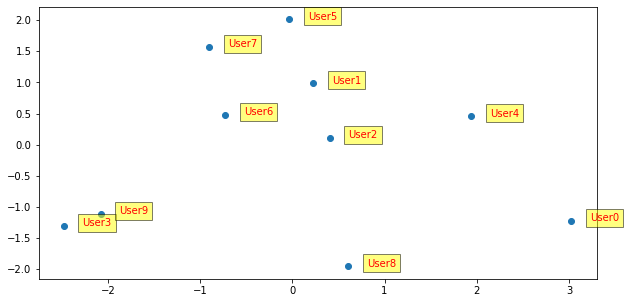

In [490]:
fig, ax = plt.subplots(figsize=(10, 5))
plt.scatter(x=transformed[0], y=transformed[1])
for i in range(transformed.shape[0]):
    plt.text(x=transformed[0][i]+0.2,y=transformed[1][i], s="User" + str(transformed.User1[i]), 
          fontdict=dict(color='red',size=10),
          bbox=dict(facecolor='yellow',alpha=0.5))
plt.show()

* As we can observe, the fake user 3 and the user 9 seem to be close. So, lets compare their weights in order to validate this observation.

* User 3

In [495]:
fake_users[3].weights

{'brands_similarity': 0.01,
 'category_similarity': 0.59,
 'price_similarity': 0.11,
 'description_similarity': 0.98,
 'rank_similarity': 0.35,
 'feature_similarity': 0.96,
 'first_year_similarity': 0.4}

* User 9

In [496]:
fake_users[9].weights

{'brands_similarity': 0.09,
 'category_similarity': 0.36,
 'price_similarity': 0.21,
 'description_similarity': 0.98,
 'rank_similarity': 0.01,
 'feature_similarity': 0.59,
 'first_year_similarity': 0.61}

In [497]:
def exploit_simulate(users,
                    products,
                    recnum_per_user:int=20, # number of recommendations to make
                    neighbor_num:int=10,# number of neighbors to consider when looking for candidates
                    liked_sample_size:int=8, # number of liked products to consider when looking for candidates
                    factors=['brands_similarity', 'category_similarity', 'price_similarity', 
                             'description_similarity', 'rank_similarity', "feature_similarity", 
                             "first_year_similarity"] # factors to consider
                    ):
    for user in users: # for each fake user 
        
        
        #initialize likes and dislikes for this user
        #intialize likes and dislikes for this user
        user.likes=[] 
        user.dislikes=[]
        estimated_weights={factor:1 for factor in factors}
        
        #remembers previous recommendations
        recommended=set()
        for i in tqdm(range(recnum_per_user), desc='Recommendation'): # for each recommendation to be made
            
            rec_product = None # product to be recommended
            
            if len(user.likes) == 0: # if the user has no known likes yet
                
                # sample a random product that has not been recommended before
                if (rec_product != None) or (rec_product not in recommended):
                    rec_product = products.sample(n=1).asin.values[0]
            else:
                candidates=defaultdict(float)
                # get a sample of this user's likes (For speed)
                sampled_likes=sample(user.likes, min(len(user.likes), liked_sample_size))
                
                # for each product that has been liked by this user
                for liked_product in tqdm(user.likes, desc='Product liked'):
                    print("Product recommend")
                    # find the top K most similar products to this liked product
                    neighbors = recommend(liked_product, 20, estimated_weights)
                    # for each of the top-10 neighbors 
                    for neighbor, metrics in neighbors:
                        if neighbor not in recommended: # if the neighbor hasn't already been recommened, make it a candidate
                            candidates[neighbor]+=metrics[0] # update the score for this candidate
                if len(candidates)==0: # no candidates found
                    #pick a random product that has not been recommended already
                    if (rec_product != None) or (rec_product not in recommended):
                        rec_product = products.sample(n=1).asin.values[0]
                else: # candidates found
                    
                    #pick the top-scoring candidate
                    print(candidates.items())
                    rec_product = df_meta[df_meta.title == sorted(candidates.items(),key=lambda x:x[1],reverse=True)[0][0]].asin.values[0]
                    
            # remember the recommendation
            recommended.add(rec_product)
            found_seed=False # becomes true if the recommended product is similar enough to one of the seed products
            print('-'* 50, df_meta[df_meta['asin']==rec_product])
            for index, candidate in user.seed_products.iterrows(): # for each other product
                my_sim, my_exp = total_similarity(df_meta[df_meta['asin']==rec_product], index, candidate, user.weights)
                # if the sim is over the like threshold for this user
                if my_sim > user.like_threshold:
                    found_seed=True
                    break
                    
            if found_seed: # similar seed found, the user will like this product
                user.likes.append(rec_product)
                print('YES', rec_product,len(user.likes))
            else: 
                user.dislikes.append(rec_product)
                print('NO', rec_product,len(user.dislikes))

In [498]:
exploit_simulate(fake_users, df_meta)

Product liked:   0%|          | 0/1 [00:00<?, ?it/s]

0it [00:00, ?it/s]

33it [00:00, 326.71it/s]

--------------------------------------------------        index                                           category  \
22918  25898  [Software, Digital Software, Antivirus & Secur...   

                                             description  \
22918  [<div>Norton Security Deluxe plus Norton Utili...   

                                                   title  \
22918  Norton Security Deluxe &amp; Norton Utilities ...   

                                   also_buy     brand  \
22918  [B00BBJR0SO, B07HPSTT89, B01MF5MTWP]  Symantec   

                                                 feature               rank  \
22918  N o r t o n   S e c u r i t y   D e l u x e   ...  698 in Software (   

                                               also_view  main_cat  \
22918  [B01MF5MTWP, B07HPSTT89, B00BBJR0SO, B015724B8...  Software   

      similar_item    date   price        asin details  price_float  \
22918               </div>  $49.99  B015724Y16      {}        49.99   

       price_f



66it [00:00, 303.72it/s]

102it [00:00, 325.45it/s]

139it [00:00, 341.15it/s]

175it [00:00, 347.63it/s]

212it [00:00, 352.76it/s]

248it [00:00, 351.73it/s]

284it [00:00, 332.43it/s]

318it [00:00, 330.76it/s]

355it [00:01, 341.31it/s]

391it [00:01, 344.84it/s]

426it [00:01, 322.50it/s]

459it [00:01, 318.35it/s]

495it [00:01, 330.13it/s]

529it [00:01, 325.46it/s]

562it [00:01, 323.97it/s]

601it [00:01, 341.09it/s]

638it [00:01, 349.50it/s]

675it [00:01, 355.52it/s]

712it [00:02, 358.75it/s]

748it [00:02, 342.85it/s]

783it [00:02, 327.33it/s]

819it [00:02, 334.65it/s]

853it [00:02, 333.77it/s]

889it [00:02, 339.36it/s]

924it [00:02, 339.06it/s]

958it [00:02, 325.14it/s]

991it [00:03, 283.69it/s]

1022it [00:03, 289.80it/s]

1052it [00:03, 290.99it/s]

1086it [00:03, 302.94it/s]

1119it [00:03, 310.57it/s]

1151it [00:03, 297.03it/s]

1182it [00:03, 280.25it/s]

1221it [00:03, 309.27it/s]

1253it [00:03, 279.45it/s]

1288it [00:04, 297.23it/s]

1322it [00:04, 306

dict_items([('Manga Studio Debut 4 (Win/Mac)', 5.0), ('Manga Studio EX 5', 3.84), ('Manga Studio 5', 3.7), ('CLIP STUDIO PAINT EX', 3.56), ('CLIP STUDIO PAINT PRO', 3.43), ('ArtRage Deluxe 2.5  [OLD VERSION]', 3.41), ('Jasc Paint Shop Pro 7.0 [OLD VERSION]', 3.34), ('The Motion Comic Bundle [Download]', 3.22), ('Anime Studio Debut 6  [OLD VERSION]', 3.18), ('Anime Studio Debut 9', 3.06), ('MotionArtist', 3.05), ('Anime Studio Debut 9 Hybrid Rose Agent', 3.02), (' Smith Micro Anime Studio 6" />', 2.94), ('Anime Studio Debut 11 [Download]', 2.87), ('Anime Studio Pro 9.5', 2.86), ('Anime Studio Pro 10', 2.86), ('Anime Studio Pro 11', 2.84), ('Anime Studio Debut 10', 2.81), ('Smith Micro Software Inc. Poser Pro 2014', 2.75), ('Poser 10', 2.74)])
--------------------------------------------------        index                                         category  \
14910  17279  [Software, Design & Illustration, Illustration]   

                                             description  \
14910 



59it [00:00, 296.25it/s]

91it [00:00, 305.73it/s]

123it [00:00, 311.29it/s]

155it [00:00, 293.87it/s]

190it [00:00, 312.04it/s]

224it [00:00, 319.88it/s]

265it [00:00, 346.81it/s]

302it [00:00, 350.73it/s]

338it [00:01, 348.23it/s]

374it [00:01, 350.70it/s]

410it [00:01, 336.40it/s]

449it [00:01, 350.86it/s]

492it [00:01, 370.95it/s]

530it [00:01, 329.06it/s]

564it [00:01, 322.46it/s]

597it [00:01, 297.07it/s]

628it [00:01, 288.36it/s]

658it [00:02, 280.32it/s]

687it [00:02, 267.23it/s]

721it [00:02, 286.46it/s]

751it [00:02, 283.96it/s]

780it [00:02, 269.19it/s]

814it [00:02, 287.66it/s]

849it [00:02, 305.06it/s]

888it [00:02, 328.33it/s]

925it [00:02, 339.30it/s]

960it [00:03, 326.29it/s]

995it [00:03, 331.12it/s]

1032it [00:03, 341.30it/s]

1069it [00:03, 348.63it/s]

1105it [00:03, 350.78it/s]

1141it [00:03, 353.49it/s]

1177it [00:03, 355.41it/s]

1213it [00:03, 354.70it/s]

1249it [00:03, 355.22it/s]

1285it [00:03, 356.60it/s]

1321it [00:04, 343.3

Product recommend




70it [00:00, 344.26it/s]

105it [00:00, 342.22it/s]

143it [00:00, 355.48it/s]

180it [00:00, 359.41it/s]

218it [00:00, 366.30it/s]

255it [00:00, 361.63it/s]

292it [00:00, 363.16it/s]

329it [00:00, 364.84it/s]

371it [00:01, 380.54it/s]

410it [00:01, 379.95it/s]

449it [00:01, 377.34it/s]

487it [00:01, 378.13it/s]

525it [00:01, 375.29it/s]

563it [00:01, 372.27it/s]

601it [00:01, 371.77it/s]

639it [00:01, 367.69it/s]

676it [00:01, 359.93it/s]

714it [00:01, 364.70it/s]

752it [00:02, 369.14it/s]

789it [00:02, 369.39it/s]

826it [00:02, 366.35it/s]

863it [00:02, 361.03it/s]

900it [00:02, 360.49it/s]

937it [00:02, 361.16it/s]

974it [00:02, 360.55it/s]

1011it [00:02, 358.09it/s]

1047it [00:02, 356.08it/s]

1083it [00:02, 354.11it/s]

1119it [00:03, 354.83it/s]

1155it [00:03, 352.17it/s]

1191it [00:03, 350.35it/s]

1227it [00:03, 353.18it/s]

1263it [00:03, 352.04it/s]

1299it [00:03, 350.25it/s]

1339it [00:03, 364.84it/s]

1376it [00:03, 365.32it/s]

1413it [00:03, 3

dict_items([('Manga Studio Debut 4 (Win/Mac)', 10.0), ('Manga Studio EX 5', 7.68), ('Manga Studio 5', 7.4), ('CLIP STUDIO PAINT EX', 7.12), ('CLIP STUDIO PAINT PRO', 6.86), ('ArtRage Deluxe 2.5  [OLD VERSION]', 6.82), ('Jasc Paint Shop Pro 7.0 [OLD VERSION]', 6.68), ('The Motion Comic Bundle [Download]', 6.44), ('Anime Studio Debut 6  [OLD VERSION]', 6.36), ('Anime Studio Debut 9', 6.12), ('MotionArtist', 6.1), ('Anime Studio Debut 9 Hybrid Rose Agent', 6.04), (' Smith Micro Anime Studio 6" />', 5.88), ('Anime Studio Debut 11 [Download]', 5.74), ('Anime Studio Pro 9.5', 5.72), ('Anime Studio Pro 10', 5.72), ('Anime Studio Pro 11', 5.68), ('Anime Studio Debut 10', 5.62), ('Smith Micro Software Inc. Poser Pro 2014', 5.5), ('Poser 10', 5.48)])
--------------------------------------------------        index                                         category  \
14910  17279  [Software, Design & Illustration, Illustration]   

                                             description  \
14910  



80it [00:00, 384.13it/s]

119it [00:00, 373.42it/s]

157it [00:00, 368.89it/s]

195it [00:00, 371.86it/s]

233it [00:00, 369.66it/s]

270it [00:00, 367.43it/s]

308it [00:00, 370.20it/s]

346it [00:00, 369.80it/s]

384it [00:01, 371.77it/s]

422it [00:01, 366.63it/s]

463it [00:01, 378.38it/s]

501it [00:01, 377.74it/s]

539it [00:01, 375.06it/s]

577it [00:01, 372.16it/s]

615it [00:01, 372.23it/s]

656it [00:01, 382.30it/s]

697it [00:01, 390.35it/s]

739it [00:01, 397.98it/s]

779it [00:02, 398.55it/s]

819it [00:02, 397.79it/s]

859it [00:02, 391.44it/s]

903it [00:02, 404.57it/s]

944it [00:02, 397.94it/s]

984it [00:02, 391.96it/s]

1024it [00:02, 384.24it/s]

1063it [00:02, 381.49it/s]

1106it [00:02, 394.39it/s]

1146it [00:02, 394.92it/s]

1186it [00:03, 396.41it/s]

1226it [00:03, 386.04it/s]

1270it [00:03, 400.53it/s]

1311it [00:03, 394.08it/s]

1351it [00:03, 393.50it/s]

1391it [00:03, 395.21it/s]

1431it [00:03, 390.91it/s]

1471it [00:03, 386.73it/s]

1511it [00:03, 

Product recommend




76it [00:00, 381.65it/s]

115it [00:00, 383.71it/s]

154it [00:00, 372.37it/s]

195it [00:00, 384.24it/s]

236it [00:00, 390.22it/s]

276it [00:00, 385.93it/s]

315it [00:00, 382.68it/s]

354it [00:00, 377.99it/s]

392it [00:01, 377.46it/s]

430it [00:01, 375.94it/s]

468it [00:01, 371.38it/s]

511it [00:01, 387.54it/s]

550it [00:01, 379.28it/s]

590it [00:01, 384.22it/s]

629it [00:01, 375.99it/s]

667it [00:01, 376.06it/s]

708it [00:01, 384.87it/s]

749it [00:01, 391.07it/s]

789it [00:02, 369.56it/s]

831it [00:02, 383.87it/s]

870it [00:02, 382.33it/s]

909it [00:02, 380.52it/s]

948it [00:02, 379.95it/s]

987it [00:02, 377.39it/s]

1030it [00:02, 391.55it/s]

1070it [00:02, 386.51it/s]

1109it [00:02, 380.87it/s]

1152it [00:03, 394.02it/s]

1192it [00:03, 393.47it/s]

1232it [00:03, 372.40it/s]

1270it [00:03, 371.40it/s]

1309it [00:03, 374.61it/s]

1348it [00:03, 379.06it/s]

1387it [00:03, 380.00it/s]

1426it [00:03, 378.49it/s]

1467it [00:03, 385.46it/s]

1506it [00:03, 

Product recommend




75it [00:00, 367.87it/s]

112it [00:00, 343.99it/s]

147it [00:00, 344.97it/s]

187it [00:00, 363.97it/s]

225it [00:00, 368.07it/s]

262it [00:00, 365.22it/s]

302it [00:00, 374.87it/s]

340it [00:00, 371.88it/s]

379it [00:01, 375.50it/s]

417it [00:01, 370.17it/s]

455it [00:01, 370.89it/s]

493it [00:01, 345.45it/s]

528it [00:01, 335.89it/s]

562it [00:01, 318.30it/s]

595it [00:01, 311.26it/s]

627it [00:01, 296.53it/s]

657it [00:01, 288.86it/s]

689it [00:02, 296.56it/s]

720it [00:02, 300.32it/s]

751it [00:02, 292.23it/s]

781it [00:02, 292.76it/s]

817it [00:02, 310.23it/s]

854it [00:02, 325.62it/s]

894it [00:02, 347.28it/s]

930it [00:02, 350.03it/s]

970it [00:02, 364.73it/s]

1011it [00:02, 377.07it/s]

1050it [00:03, 379.74it/s]

1089it [00:03, 375.84it/s]

1128it [00:03, 377.78it/s]

1166it [00:03, 376.22it/s]

1204it [00:03, 372.75it/s]

1244it [00:03, 380.75it/s]

1283it [00:03, 373.54it/s]

1322it [00:03, 375.06it/s]

1360it [00:03, 376.50it/s]

1399it [00:03, 37

dict_items([('Manga Studio Debut 4 (Win/Mac)', 15.0), ('Manga Studio EX 5', 11.52), ('Manga Studio 5', 11.100000000000001), ('CLIP STUDIO PAINT EX', 10.68), ('CLIP STUDIO PAINT PRO', 10.290000000000001), ('ArtRage Deluxe 2.5  [OLD VERSION]', 10.23), ('Jasc Paint Shop Pro 7.0 [OLD VERSION]', 10.02), ('The Motion Comic Bundle [Download]', 9.66), ('Anime Studio Debut 6  [OLD VERSION]', 9.540000000000001), ('Anime Studio Debut 9', 9.18), ('MotionArtist', 9.149999999999999), ('Anime Studio Debut 9 Hybrid Rose Agent', 9.06), (' Smith Micro Anime Studio 6" />', 8.82), ('Anime Studio Debut 11 [Download]', 8.61), ('Anime Studio Pro 9.5', 8.58), ('Anime Studio Pro 10', 8.58), ('Anime Studio Pro 11', 8.52), ('Anime Studio Debut 10', 8.43), ('Smith Micro Software Inc. Poser Pro 2014', 8.25), ('Poser 10', 8.22)])
--------------------------------------------------        index                                         category  \
14910  17279  [Software, Design & Illustration, Illustration]   

      



75it [00:00, 355.11it/s]

112it [00:00, 360.12it/s]

149it [00:00, 342.68it/s]

188it [00:00, 357.70it/s]

224it [00:00, 358.44it/s]

265it [00:00, 372.52it/s]

306it [00:00, 382.96it/s]

345it [00:00, 374.80it/s]

383it [00:01, 375.23it/s]

421it [00:01, 374.42it/s]

460it [00:01, 377.94it/s]

502it [00:01, 388.16it/s]

541it [00:01, 379.67it/s]

581it [00:01, 384.51it/s]

620it [00:01, 383.86it/s]

659it [00:01, 384.54it/s]

698it [00:01, 368.57it/s]

739it [00:01, 380.48it/s]

782it [00:02, 392.88it/s]

822it [00:02, 377.30it/s]

860it [00:02, 373.81it/s]

899it [00:02, 377.37it/s]

937it [00:02, 373.79it/s]

975it [00:02, 373.42it/s]

1014it [00:02, 376.07it/s]

1052it [00:02, 369.35it/s]

1092it [00:02, 378.24it/s]

1132it [00:03, 384.63it/s]

1172it [00:03, 386.89it/s]

1211it [00:03, 387.16it/s]

1250it [00:03, 382.38it/s]

1289it [00:03, 374.50it/s]

1329it [00:03, 380.81it/s]

1368it [00:03, 381.27it/s]

1409it [00:03, 389.71it/s]

1450it [00:03, 393.68it/s]

1490it [00:03, 

Product recommend




80it [00:00, 355.27it/s]

117it [00:00, 361.55it/s]

155it [00:00, 365.77it/s]

195it [00:00, 376.40it/s]

236it [00:00, 386.33it/s]

275it [00:00, 383.81it/s]

315it [00:00, 386.45it/s]

354it [00:00, 383.96it/s]

393it [00:01, 381.17it/s]

432it [00:01, 382.71it/s]

471it [00:01, 372.63it/s]

509it [00:01, 370.45it/s]

547it [00:01, 370.00it/s]

585it [00:01, 371.92it/s]

623it [00:01, 369.95it/s]

661it [00:01, 369.64it/s]

698it [00:01, 367.63it/s]

738it [00:01, 376.01it/s]

776it [00:02, 375.01it/s]

814it [00:02, 368.86it/s]

856it [00:02, 383.04it/s]

895it [00:02, 384.73it/s]

934it [00:02, 377.36it/s]

974it [00:02, 381.75it/s]

1014it [00:02, 385.31it/s]

1053it [00:02, 379.94it/s]

1092it [00:02, 377.40it/s]

1130it [00:03, 371.66it/s]

1169it [00:03, 374.81it/s]

1207it [00:03, 375.23it/s]

1245it [00:03, 375.53it/s]

1286it [00:03, 384.56it/s]

1325it [00:03, 379.16it/s]

1363it [00:03, 376.12it/s]

1405it [00:03, 387.82it/s]

1445it [00:03, 390.26it/s]

1486it [00:03, 

Product recommend


78it [00:00, 351.71it/s]

114it [00:00, 315.80it/s]

151it [00:00, 333.79it/s]

188it [00:00, 345.25it/s]

225it [00:00, 353.25it/s]

262it [00:00, 357.38it/s]

298it [00:00, 344.30it/s]

334it [00:00, 346.95it/s]

371it [00:01, 352.73it/s]

407it [00:01, 352.71it/s]

443it [00:01, 342.64it/s]

478it [00:01, 275.82it/s]

508it [00:01, 270.37it/s]

537it [00:01, 247.63it/s]

566it [00:01, 256.81it/s]

595it [00:01, 264.71it/s]

623it [00:02, 239.17it/s]

650it [00:02, 246.98it/s]

677it [00:02, 252.44it/s]

715it [00:02, 286.85it/s]

755it [00:02, 316.95it/s]

794it [00:02, 335.94it/s]

831it [00:02, 345.76it/s]

871it [00:02, 358.50it/s]

910it [00:02, 366.65it/s]

949it [00:02, 373.48it/s]

988it [00:03, 375.08it/s]

1026it [00:03, 373.23it/s]

1064it [00:03, 375.08it/s]

1103it [00:03, 377.26it/s]

1144it [00:03, 384.68it/s]

1184it [00:03, 388.06it/s]

1223it [00:03, 380.74it/s]

1262it [00:03, 382.29it/s]

1301it [00:03, 383.47it/s]

1340it [00:04, 382.02it/s]

1379it [00:04, 381.0

Product recommend


80it [00:00, 394.88it/s]

120it [00:00, 391.94it/s]

160it [00:00, 395.03it/s]

200it [00:00, 395.43it/s]

241it [00:00, 400.31it/s]

282it [00:00, 388.35it/s]

322it [00:00, 390.74it/s]

362it [00:00, 389.99it/s]

402it [00:01, 383.75it/s]

441it [00:01, 383.33it/s]

480it [00:01, 385.30it/s]

520it [00:01, 387.37it/s]

561it [00:01, 392.88it/s]

601it [00:01, 388.41it/s]

640it [00:01, 386.56it/s]

679it [00:01, 386.48it/s]

718it [00:01, 339.34it/s]

753it [00:02, 324.68it/s]

787it [00:02, 308.06it/s]

819it [00:02, 283.52it/s]

848it [00:02, 252.84it/s]

875it [00:02, 236.77it/s]

900it [00:02, 238.23it/s]

925it [00:02, 238.82it/s]

950it [00:02, 238.62it/s]

988it [00:02, 275.71it/s]

1026it [00:03, 304.01it/s]

1066it [00:03, 330.37it/s]

1106it [00:03, 348.48it/s]

1143it [00:03, 354.74it/s]

1179it [00:03, 351.57it/s]

1216it [00:03, 355.92it/s]

1254it [00:03, 360.88it/s]

1291it [00:03, 360.38it/s]

1329it [00:03, 366.12it/s]

1366it [00:03, 366.22it/s]

1405it [00:04, 372.

dict_items([('Manga Studio Debut 4 (Win/Mac)', 20.0), ('Manga Studio EX 5', 15.36), ('Manga Studio 5', 14.8), ('CLIP STUDIO PAINT EX', 14.24), ('CLIP STUDIO PAINT PRO', 13.72), ('ArtRage Deluxe 2.5  [OLD VERSION]', 13.64), ('Jasc Paint Shop Pro 7.0 [OLD VERSION]', 13.36), ('The Motion Comic Bundle [Download]', 12.88), ('Anime Studio Debut 6  [OLD VERSION]', 12.72), ('Anime Studio Debut 9', 12.24), ('MotionArtist', 12.2), ('Anime Studio Debut 9 Hybrid Rose Agent', 12.08), (' Smith Micro Anime Studio 6" />', 11.76), ('Anime Studio Debut 11 [Download]', 11.48), ('Anime Studio Pro 9.5', 11.44), ('Anime Studio Pro 10', 11.44), ('Anime Studio Pro 11', 11.36), ('Anime Studio Debut 10', 11.24), ('Smith Micro Software Inc. Poser Pro 2014', 11.0), ('Poser 10', 10.96)])
--------------------------------------------------        index                                         category  \
14910  17279  [Software, Design & Illustration, Illustration]   

                                             des



76it [00:00, 377.73it/s]

114it [00:00, 373.67it/s]

152it [00:00, 338.83it/s]

187it [00:00, 316.09it/s]

226it [00:00, 336.65it/s]

264it [00:00, 346.63it/s]

304it [00:00, 360.50it/s]

345it [00:00, 375.28it/s]

384it [00:01, 378.59it/s]

423it [00:01, 378.58it/s]

463it [00:01, 383.80it/s]

502it [00:01, 377.78it/s]

540it [00:01, 375.12it/s]

579it [00:01, 377.31it/s]

619it [00:01, 383.34it/s]

658it [00:01, 383.08it/s]

698it [00:01, 388.05it/s]

737it [00:01, 387.48it/s]

776it [00:02, 387.08it/s]

815it [00:02, 375.65it/s]

853it [00:02, 374.73it/s]

891it [00:02, 361.13it/s]

929it [00:02, 365.53it/s]

966it [00:02, 362.58it/s]

1005it [00:02, 369.47it/s]

1043it [00:02, 367.18it/s]

1082it [00:02, 371.71it/s]

1123it [00:03, 382.89it/s]

1162it [00:03, 382.73it/s]

1201it [00:03, 372.77it/s]

1242it [00:03, 381.36it/s]

1282it [00:03, 385.66it/s]

1321it [00:03, 381.34it/s]

1360it [00:03, 378.34it/s]

1403it [00:03, 391.13it/s]

1443it [00:03, 392.59it/s]

1483it [00:03, 

Product recommend




80it [00:00, 388.59it/s]

119it [00:00, 387.43it/s]

159it [00:00, 390.86it/s]

199it [00:00, 392.24it/s]

239it [00:00, 393.53it/s]

279it [00:00, 386.67it/s]

318it [00:00, 385.31it/s]

357it [00:00, 371.92it/s]

395it [00:01, 370.98it/s]

433it [00:01, 371.49it/s]

471it [00:01, 370.72it/s]

509it [00:01, 367.98it/s]

550it [00:01, 378.14it/s]

588it [00:01, 364.73it/s]

630it [00:01, 379.57it/s]

669it [00:01, 381.50it/s]

708it [00:01, 378.40it/s]

750it [00:01, 389.45it/s]

790it [00:02, 384.60it/s]

829it [00:02, 380.67it/s]

868it [00:02, 381.17it/s]

907it [00:02, 383.75it/s]

946it [00:02, 381.10it/s]

985it [00:02, 373.79it/s]

1023it [00:02, 372.39it/s]

1061it [00:02, 374.53it/s]

1100it [00:02, 376.86it/s]

1138it [00:03, 371.19it/s]

1181it [00:03, 386.55it/s]

1220it [00:03, 373.31it/s]

1258it [00:03, 365.76it/s]

1296it [00:03, 368.78it/s]

1335it [00:03, 374.89it/s]

1378it [00:03, 388.78it/s]

1417it [00:03, 384.62it/s]

1456it [00:03, 381.72it/s]

1497it [00:03, 

Product recommend


76it [00:00, 379.62it/s]

114it [00:00, 374.60it/s]

152it [00:00, 369.50it/s]

190it [00:00, 371.94it/s]

228it [00:00, 373.35it/s]

269it [00:00, 382.72it/s]

309it [00:00, 385.76it/s]

348it [00:00, 384.65it/s]

388it [00:01, 387.72it/s]

427it [00:01, 377.41it/s]

467it [00:01, 382.99it/s]

506it [00:01, 385.03it/s]

545it [00:01, 384.22it/s]

585it [00:01, 387.80it/s]

625it [00:01, 390.22it/s]

665it [00:01, 390.67it/s]

705it [00:01, 390.01it/s]

745it [00:01, 389.47it/s]

784it [00:02, 382.88it/s]

825it [00:02, 388.55it/s]

867it [00:02, 397.79it/s]

907it [00:02, 384.76it/s]

946it [00:02, 385.20it/s]

987it [00:02, 391.30it/s]

1031it [00:02, 403.37it/s]

1072it [00:02, 400.40it/s]

1113it [00:02, 387.31it/s]

1152it [00:02, 381.50it/s]

1194it [00:03, 390.56it/s]

1234it [00:03, 381.14it/s]

1274it [00:03, 385.84it/s]

1313it [00:03, 382.61it/s]

1352it [00:03, 374.99it/s]

1391it [00:03, 379.31it/s]

1429it [00:03, 379.01it/s]

1467it [00:03, 376.00it/s]

1505it [00:03, 36

Product recommend


75it [00:00, 372.74it/s]

114it [00:00, 377.15it/s]

152it [00:00, 366.60it/s]

193it [00:00, 379.19it/s]

234it [00:00, 386.91it/s]

275it [00:00, 391.76it/s]

315it [00:00, 393.11it/s]

355it [00:00, 389.28it/s]

395it [00:01, 392.48it/s]

437it [00:01, 400.78it/s]

478it [00:01, 394.07it/s]

518it [00:01, 392.35it/s]

558it [00:01, 361.51it/s]

595it [00:01, 337.22it/s]

630it [00:01, 313.43it/s]

662it [00:01, 312.99it/s]

700it [00:01, 329.38it/s]

737it [00:02, 339.72it/s]

773it [00:02, 344.47it/s]

812it [00:02, 357.56it/s]

850it [00:02, 363.04it/s]

888it [00:02, 368.01it/s]

928it [00:02, 377.45it/s]

967it [00:02, 378.93it/s]

1005it [00:02, 375.90it/s]

1043it [00:02, 374.90it/s]

1083it [00:02, 380.08it/s]

1122it [00:03, 376.34it/s]

1160it [00:03, 359.48it/s]

1197it [00:03, 344.78it/s]

1232it [00:03, 325.33it/s]

1265it [00:03, 312.95it/s]

1297it [00:03, 306.53it/s]

1328it [00:03, 299.18it/s]

1361it [00:03, 306.00it/s]

1393it [00:03, 309.07it/s]

1424it [00:04, 29

Product recommend




82it [00:00, 382.01it/s]

121it [00:00, 375.56it/s]

159it [00:00, 371.62it/s]

201it [00:00, 387.10it/s]

240it [00:00, 379.31it/s]

281it [00:00, 387.79it/s]

320it [00:00, 387.23it/s]

360it [00:00, 389.95it/s]

400it [00:01, 387.16it/s]

439it [00:01, 302.04it/s]

473it [00:01, 241.05it/s]

501it [00:01, 227.78it/s]

527it [00:01, 216.74it/s]

551it [00:01, 209.27it/s]

573it [00:01, 209.81it/s]

600it [00:02, 224.10it/s]

629it [00:02, 240.05it/s]

654it [00:02, 232.68it/s]

678it [00:02, 213.33it/s]

700it [00:02, 200.48it/s]

721it [00:02, 198.34it/s]

742it [00:02, 151.13it/s]

759it [00:03, 142.41it/s]

775it [00:03, 145.99it/s]

795it [00:03, 157.16it/s]

817it [00:03, 172.73it/s]

837it [00:03, 179.04it/s]

856it [00:03, 180.56it/s]

875it [00:03, 183.20it/s]

896it [00:03, 189.78it/s]

927it [00:03, 223.20it/s]

952it [00:03, 230.32it/s]

987it [00:04, 264.05it/s]

1016it [00:04, 270.73it/s]

1044it [00:04, 268.68it/s]

1076it [00:04, 282.06it/s]

1112it [00:04, 303.18it/

dict_items([('Manga Studio Debut 4 (Win/Mac)', 25.0), ('Manga Studio EX 5', 19.2), ('Manga Studio 5', 18.5), ('CLIP STUDIO PAINT EX', 17.8), ('CLIP STUDIO PAINT PRO', 17.150000000000002), ('ArtRage Deluxe 2.5  [OLD VERSION]', 17.05), ('Jasc Paint Shop Pro 7.0 [OLD VERSION]', 16.7), ('The Motion Comic Bundle [Download]', 16.1), ('Anime Studio Debut 6  [OLD VERSION]', 15.9), ('Anime Studio Debut 9', 15.3), ('MotionArtist', 15.25), ('Anime Studio Debut 9 Hybrid Rose Agent', 15.1), (' Smith Micro Anime Studio 6" />', 14.7), ('Anime Studio Debut 11 [Download]', 14.350000000000001), ('Anime Studio Pro 9.5', 14.299999999999999), ('Anime Studio Pro 10', 14.299999999999999), ('Anime Studio Pro 11', 14.2), ('Anime Studio Debut 10', 14.05), ('Smith Micro Software Inc. Poser Pro 2014', 13.75), ('Poser 10', 13.700000000000001)])
--------------------------------------------------        index                                         category  \
14910  17279  [Software, Design & Illustration, Illustra

76it [00:00, 383.46it/s]

115it [00:00, 372.85it/s]

153it [00:00, 369.90it/s]

192it [00:00, 376.71it/s]

233it [00:00, 384.00it/s]

272it [00:00, 383.45it/s]

312it [00:00, 387.42it/s]

351it [00:00, 378.87it/s]

389it [00:01, 370.30it/s]

430it [00:01, 379.80it/s]

470it [00:01, 384.62it/s]

509it [00:01, 379.47it/s]

549it [00:01, 383.65it/s]

588it [00:01, 381.03it/s]

628it [00:01, 385.47it/s]

667it [00:01, 381.19it/s]

706it [00:01, 381.53it/s]

745it [00:01, 364.75it/s]

784it [00:02, 369.80it/s]

825it [00:02, 380.30it/s]

864it [00:02, 382.01it/s]

903it [00:02, 378.80it/s]

941it [00:02, 374.34it/s]

979it [00:02, 368.46it/s]

1019it [00:02, 376.51it/s]

1057it [00:02, 377.53it/s]

1096it [00:02, 378.97it/s]

1136it [00:03, 382.93it/s]

1175it [00:03, 377.21it/s]

1213it [00:03, 376.96it/s]

1252it [00:03, 379.64it/s]

1292it [00:03, 383.39it/s]

1331it [00:03, 377.54it/s]

1369it [00:03, 376.05it/s]

1407it [00:03, 376.14it/s]

1445it [00:03, 370.72it/s]

1483it [00:03, 36

Product recommend




78it [00:00, 364.24it/s]

117it [00:00, 372.29it/s]

155it [00:00, 372.44it/s]

193it [00:00, 364.78it/s]

230it [00:00, 360.61it/s]

268it [00:00, 365.51it/s]

308it [00:00, 376.21it/s]

346it [00:00, 372.78it/s]

384it [00:01, 369.43it/s]

422it [00:01, 372.54it/s]

461it [00:01, 376.64it/s]

500it [00:01, 378.41it/s]

538it [00:01, 365.77it/s]

579it [00:01, 378.64it/s]

618it [00:01, 380.87it/s]

657it [00:01, 382.47it/s]

697it [00:01, 385.35it/s]

736it [00:01, 381.07it/s]

775it [00:02, 382.58it/s]

814it [00:02, 380.32it/s]

853it [00:02, 379.77it/s]

891it [00:02, 377.62it/s]

934it [00:02, 389.64it/s]

973it [00:02, 388.58it/s]

1012it [00:02, 385.57it/s]

1051it [00:02, 379.99it/s]

1090it [00:02, 377.41it/s]

1128it [00:02, 373.80it/s]

1166it [00:03, 375.61it/s]

1205it [00:03, 378.77it/s]

1244it [00:03, 380.96it/s]

1283it [00:03, 382.48it/s]

1322it [00:03, 383.56it/s]

1361it [00:03, 382.07it/s]

1400it [00:03, 381.03it/s]

1439it [00:03, 374.82it/s]

1478it [00:03, 

Product recommend




76it [00:00, 358.75it/s]

115it [00:00, 369.43it/s]

153it [00:00, 367.84it/s]

193it [00:00, 377.82it/s]

231it [00:00, 375.99it/s]

269it [00:00, 374.91it/s]

307it [00:00, 370.61it/s]

346it [00:00, 374.25it/s]

384it [00:01, 373.73it/s]

422it [00:01, 369.00it/s]

464it [00:01, 382.85it/s]

503it [00:01, 384.97it/s]

542it [00:01, 385.32it/s]

583it [00:01, 389.23it/s]

622it [00:01, 388.27it/s]

661it [00:01, 384.22it/s]

700it [00:01, 378.14it/s]

738it [00:01, 373.19it/s]

777it [00:02, 375.94it/s]

815it [00:02, 372.69it/s]

855it [00:02, 379.56it/s]

893it [00:02, 363.57it/s]

930it [00:02, 339.14it/s]

965it [00:02, 325.96it/s]

998it [00:02, 314.21it/s]

1030it [00:02, 307.41it/s]

1061it [00:02, 295.84it/s]

1091it [00:03, 290.17it/s]

1121it [00:03, 292.73it/s]

1151it [00:03, 289.06it/s]

1180it [00:03, 282.09it/s]

1215it [00:03, 300.48it/s]

1253it [00:03, 322.41it/s]

1293it [00:03, 343.96it/s]

1333it [00:03, 358.27it/s]

1369it [00:03, 356.70it/s]

1406it [00:03, 3

Product recommend


67it [00:00, 331.57it/s]

105it [00:00, 350.30it/s]

144it [00:00, 361.61it/s]

182it [00:00, 365.54it/s]

219it [00:00, 364.53it/s]

256it [00:00, 365.14it/s]

295it [00:00, 371.79it/s]

333it [00:00, 362.00it/s]

371it [00:01, 364.13it/s]

408it [00:01, 363.74it/s]

447it [00:01, 371.54it/s]

487it [00:01, 378.86it/s]

525it [00:01, 376.22it/s]

563it [00:01, 376.45it/s]

602it [00:01, 380.46it/s]

642it [00:01, 382.88it/s]

681it [00:01, 384.98it/s]

720it [00:01, 384.19it/s]

761it [00:02, 391.71it/s]

801it [00:02, 387.24it/s]

840it [00:02, 386.93it/s]

879it [00:02, 385.56it/s]

919it [00:02, 388.68it/s]

958it [00:02, 382.27it/s]

998it [00:02, 386.35it/s]

1037it [00:02, 378.50it/s]

1076it [00:02, 381.82it/s]

1115it [00:02, 375.35it/s]

1153it [00:03, 373.48it/s]

1192it [00:03, 378.27it/s]

1230it [00:03, 377.84it/s]

1269it [00:03, 381.31it/s]

1308it [00:03, 373.90it/s]

1347it [00:03, 377.76it/s]

1388it [00:03, 385.02it/s]

1427it [00:03, 386.45it/s]

1466it [00:03, 386

Product recommend




76it [00:00, 375.65it/s]

116it [00:00, 384.90it/s]

155it [00:00, 383.94it/s]

194it [00:00, 376.64it/s]

233it [00:00, 378.56it/s]

271it [00:00, 375.45it/s]

310it [00:00, 377.61it/s]

348it [00:00, 377.17it/s]

387it [00:01, 379.92it/s]

426it [00:01, 379.52it/s]

464it [00:01, 377.41it/s]

507it [00:01, 391.94it/s]

547it [00:01, 394.34it/s]

587it [00:01, 393.72it/s]

629it [00:01, 400.36it/s]

670it [00:01, 394.79it/s]

710it [00:01, 374.30it/s]

748it [00:01, 346.40it/s]

784it [00:02, 331.14it/s]

818it [00:02, 329.97it/s]

853it [00:02, 334.41it/s]

887it [00:02, 325.88it/s]

920it [00:02, 320.73it/s]

956it [00:02, 331.18it/s]

990it [00:02, 324.43it/s]

1026it [00:02, 333.62it/s]

1060it [00:02, 333.54it/s]

1094it [00:03, 334.44it/s]

1128it [00:03, 317.47it/s]

1160it [00:03, 317.27it/s]

1192it [00:03, 281.60it/s]

1221it [00:03, 282.37it/s]

1250it [00:03, 273.93it/s]

1278it [00:03, 267.19it/s]

1313it [00:03, 289.37it/s]

1350it [00:03, 312.09it/s]

1387it [00:04, 3

Product recommend


72it [00:00, 362.04it/s]

109it [00:00, 360.54it/s]

149it [00:00, 373.54it/s]

187it [00:00, 373.92it/s]

225it [00:00, 367.32it/s]

263it [00:00, 371.33it/s]

304it [00:00, 379.92it/s]

343it [00:00, 373.79it/s]

382it [00:01, 375.31it/s]

420it [00:01, 370.05it/s]

458it [00:01, 370.80it/s]

496it [00:01, 371.32it/s]

534it [00:01, 370.64it/s]

572it [00:01, 372.30it/s]

610it [00:01, 365.68it/s]

649it [00:01, 371.65it/s]

687it [00:01, 368.69it/s]

726it [00:01, 373.83it/s]

764it [00:02, 374.55it/s]

802it [00:02, 364.36it/s]

839it [00:02, 360.72it/s]

877it [00:02, 365.29it/s]

915it [00:02, 369.56it/s]

952it [00:02, 368.60it/s]

989it [00:02, 360.49it/s]

1028it [00:02, 368.03it/s]

1066it [00:02, 369.42it/s]

1104it [00:02, 370.35it/s]

1142it [00:03, 367.74it/s]

1184it [00:03, 381.95it/s]

1224it [00:03, 385.04it/s]

1263it [00:03, 384.20it/s]

1302it [00:03, 381.41it/s]

1342it [00:03, 385.74it/s]

1381it [00:03, 386.49it/s]

1420it [00:03, 376.38it/s]

1458it [00:03, 373

dict_items([('Manga Studio Debut 4 (Win/Mac)', 30.0), ('Manga Studio EX 5', 23.04), ('Manga Studio 5', 22.2), ('CLIP STUDIO PAINT EX', 21.36), ('CLIP STUDIO PAINT PRO', 20.580000000000002), ('ArtRage Deluxe 2.5  [OLD VERSION]', 20.46), ('Jasc Paint Shop Pro 7.0 [OLD VERSION]', 20.04), ('The Motion Comic Bundle [Download]', 19.32), ('Anime Studio Debut 6  [OLD VERSION]', 19.080000000000002), ('Anime Studio Debut 9', 18.36), ('MotionArtist', 18.3), ('Anime Studio Debut 9 Hybrid Rose Agent', 18.12), (' Smith Micro Anime Studio 6" />', 17.64), ('Anime Studio Debut 11 [Download]', 17.220000000000002), ('Anime Studio Pro 9.5', 17.16), ('Anime Studio Pro 10', 17.16), ('Anime Studio Pro 11', 17.04), ('Anime Studio Debut 10', 16.86), ('Smith Micro Software Inc. Poser Pro 2014', 16.5), ('Poser 10', 16.44)])
--------------------------------------------------        index                                         category  \
14910  17279  [Software, Design & Illustration, Illustration]   

         



71it [00:00, 350.56it/s]

107it [00:00, 350.12it/s]

145it [00:00, 360.31it/s]

182it [00:00, 362.51it/s]

220it [00:00, 365.90it/s]

257it [00:00, 366.04it/s]

296it [00:00, 373.59it/s]

335it [00:00, 376.35it/s]

373it [00:01, 376.32it/s]

411it [00:01, 352.86it/s]

447it [00:01, 338.33it/s]

482it [00:01, 320.81it/s]

515it [00:01, 313.00it/s]

547it [00:01, 306.52it/s]

578it [00:01, 302.46it/s]

612it [00:01, 312.07it/s]

644it [00:01, 305.64it/s]

675it [00:02, 290.40it/s]

712it [00:02, 312.25it/s]

751it [00:02, 332.45it/s]

789it [00:02, 346.07it/s]

829it [00:02, 359.66it/s]

866it [00:02, 360.61it/s]

904it [00:02, 365.23it/s]

944it [00:02, 375.44it/s]

983it [00:02, 378.63it/s]

1021it [00:02, 379.03it/s]

1060it [00:03, 381.17it/s]

1099it [00:03, 381.52it/s]

1139it [00:03, 384.73it/s]

1178it [00:03, 384.01it/s]

1218it [00:03, 387.61it/s]

1257it [00:03, 388.31it/s]

1297it [00:03, 390.63it/s]

1337it [00:03, 384.71it/s]

1376it [00:03, 376.31it/s]

1415it [00:03, 37

Product recommend




78it [00:00, 385.49it/s]

117it [00:00, 376.90it/s]

157it [00:00, 384.08it/s]

196it [00:00, 372.96it/s]

234it [00:00, 370.43it/s]

272it [00:00, 280.27it/s]

304it [00:01, 239.88it/s]

331it [00:01, 228.90it/s]

359it [00:01, 239.72it/s]

392it [00:01, 262.22it/s]

426it [00:01, 282.65it/s]

456it [00:01, 286.63it/s]

486it [00:01, 290.35it/s]

517it [00:01, 295.15it/s]

552it [00:01, 310.99it/s]

584it [00:01, 307.36it/s]

618it [00:02, 316.28it/s]

650it [00:02, 290.95it/s]

680it [00:02, 287.08it/s]

710it [00:02, 281.82it/s]

739it [00:02, 283.33it/s]

768it [00:02, 281.23it/s]

798it [00:02, 286.60it/s]

828it [00:02, 289.62it/s]

858it [00:02, 288.46it/s]

889it [00:03, 293.86it/s]

926it [00:03, 315.28it/s]

965it [00:03, 335.33it/s]

1003it [00:03, 347.48it/s]

1040it [00:03, 353.11it/s]

1081it [00:03, 368.91it/s]

1118it [00:03, 363.83it/s]

1155it [00:03, 362.45it/s]

1192it [00:03, 363.60it/s]

1232it [00:03, 373.25it/s]

1270it [00:04, 371.95it/s]

1308it [00:04, 356.

Product recommend




82it [00:00, 385.05it/s]

121it [00:00, 380.50it/s]

160it [00:00, 379.78it/s]

199it [00:00, 380.71it/s]

238it [00:00, 382.56it/s]

277it [00:00, 384.93it/s]

317it [00:00, 388.42it/s]

356it [00:00, 384.20it/s]

395it [00:01, 384.79it/s]

434it [00:01, 382.90it/s]

473it [00:01, 380.43it/s]

512it [00:01, 377.66it/s]

551it [00:01, 379.51it/s]

589it [00:01, 377.38it/s]

627it [00:01, 375.94it/s]

665it [00:01, 371.64it/s]

703it [00:01, 371.95it/s]

741it [00:01, 373.18it/s]

779it [00:02, 371.94it/s]

819it [00:02, 377.99it/s]

857it [00:02, 378.54it/s]

895it [00:02, 375.64it/s]

935it [00:02, 379.88it/s]

974it [00:02, 381.71it/s]

1013it [00:02, 381.94it/s]

1052it [00:02, 383.15it/s]

1091it [00:02, 380.67it/s]

1133it [00:02, 390.02it/s]

1173it [00:03, 389.51it/s]

1212it [00:03, 389.61it/s]

1251it [00:03, 387.43it/s]

1290it [00:03, 385.95it/s]

1329it [00:03, 381.33it/s]

1368it [00:03, 372.91it/s]

1407it [00:03, 375.69it/s]

1446it [00:03, 378.75it/s]

1486it [00:03, 

Product recommend




82it [00:00, 384.18it/s]

121it [00:00, 376.85it/s]

159it [00:00, 373.79it/s]

197it [00:00, 374.60it/s]

235it [00:00, 371.50it/s]

273it [00:00, 367.19it/s]

311it [00:00, 368.87it/s]

349it [00:00, 372.26it/s]

387it [00:01, 371.23it/s]

426it [00:01, 375.74it/s]

466it [00:01, 381.87it/s]

505it [00:01, 373.14it/s]

543it [00:01, 365.47it/s]

580it [00:01, 363.66it/s]

617it [00:01, 365.29it/s]

654it [00:01, 366.67it/s]

692it [00:01, 367.36it/s]

731it [00:01, 372.93it/s]

771it [00:02, 378.66it/s]

810it [00:02, 381.38it/s]

849it [00:02, 380.55it/s]

888it [00:02, 381.09it/s]

928it [00:02, 384.41it/s]

967it [00:02, 386.07it/s]

1006it [00:02, 383.81it/s]

1045it [00:02, 383.37it/s]

1085it [00:02, 385.97it/s]

1124it [00:02, 383.80it/s]

1163it [00:03, 384.49it/s]

1202it [00:03, 379.38it/s]

1243it [00:03, 386.07it/s]

1282it [00:03, 376.16it/s]

1320it [00:03, 366.68it/s]

1357it [00:03, 363.82it/s]

1398it [00:03, 375.02it/s]

1441it [00:03, 390.97it/s]

1481it [00:03, 

Product recommend




80it [00:00, 369.12it/s]

119it [00:00, 376.54it/s]

157it [00:00, 375.04it/s]

195it [00:00, 376.79it/s]

235it [00:00, 381.96it/s]

274it [00:00, 378.07it/s]

314it [00:00, 383.51it/s]

353it [00:00, 375.14it/s]

391it [00:01, 341.82it/s]

426it [00:01, 328.50it/s]

460it [00:01, 314.30it/s]

492it [00:01, 298.04it/s]

523it [00:01, 292.61it/s]

553it [00:01, 294.60it/s]

586it [00:01, 304.48it/s]

617it [00:01, 298.42it/s]

647it [00:01, 281.95it/s]

686it [00:02, 310.19it/s]

723it [00:02, 324.68it/s]

761it [00:02, 340.48it/s]

796it [00:02, 340.32it/s]

831it [00:02, 340.16it/s]

867it [00:02, 343.94it/s]

905it [00:02, 352.45it/s]

943it [00:02, 360.51it/s]

983it [00:02, 370.04it/s]

1021it [00:02, 371.84it/s]

1063it [00:03, 384.74it/s]

1102it [00:03, 386.30it/s]

1141it [00:03, 383.97it/s]

1180it [00:03, 377.92it/s]

1218it [00:03, 378.52it/s]

1257it [00:03, 380.79it/s]

1296it [00:03, 382.39it/s]

1335it [00:03, 383.51it/s]

1374it [00:03, 378.65it/s]

1414it [00:04, 38

Product recommend




78it [00:00, 368.35it/s]

115it [00:00, 364.20it/s]

152it [00:00, 361.86it/s]

189it [00:00, 362.22it/s]

228it [00:00, 370.22it/s]

267it [00:00, 376.55it/s]

305it [00:00, 377.63it/s]

343it [00:00, 373.73it/s]

384it [00:01, 382.48it/s]

423it [00:01, 377.87it/s]

461it [00:01, 372.99it/s]

499it [00:01, 372.82it/s]

537it [00:01, 374.94it/s]

576it [00:01, 378.33it/s]

618it [00:01, 388.40it/s]

657it [00:01, 384.31it/s]

696it [00:01, 384.81it/s]

735it [00:01, 385.21it/s]

774it [00:02, 369.11it/s]

812it [00:02, 369.10it/s]

850it [00:02, 366.90it/s]

889it [00:02, 372.32it/s]

930it [00:02, 382.25it/s]

969it [00:02, 383.37it/s]

1008it [00:02, 383.06it/s]

1047it [00:02, 375.14it/s]

1086it [00:02, 378.40it/s]

1125it [00:02, 380.64it/s]

1164it [00:03, 380.04it/s]

1203it [00:03, 378.56it/s]

1241it [00:03, 371.33it/s]

1279it [00:03, 370.60it/s]

1317it [00:03, 371.60it/s]

1355it [00:03, 374.01it/s]

1393it [00:03, 373.62it/s]

1432it [00:03, 376.69it/s]

1471it [00:03, 

Product recommend




73it [00:00, 349.52it/s]

112it [00:00, 365.90it/s]

149it [00:00, 364.71it/s]

191it [00:00, 382.98it/s]

230it [00:00, 378.25it/s]

268it [00:00, 375.21it/s]

307it [00:00, 377.47it/s]

345it [00:00, 377.12it/s]

383it [00:01, 375.67it/s]

422it [00:01, 378.89it/s]

460it [00:01, 371.37it/s]

502it [00:01, 383.53it/s]

541it [00:01, 376.39it/s]

579it [00:01, 373.39it/s]

620it [00:01, 381.86it/s]

659it [00:01, 378.69it/s]

697it [00:01, 377.97it/s]

737it [00:01, 382.67it/s]

776it [00:02, 381.42it/s]

815it [00:02, 381.59it/s]

854it [00:02, 374.10it/s]

892it [00:02, 372.58it/s]

930it [00:02, 372.14it/s]

968it [00:02, 353.99it/s]

1007it [00:02, 362.14it/s]

1046it [00:02, 370.10it/s]

1085it [00:02, 375.81it/s]

1123it [00:03, 375.93it/s]

1161it [00:03, 370.58it/s]

1199it [00:03, 370.09it/s]

1237it [00:03, 366.55it/s]

1276it [00:03, 372.34it/s]

1314it [00:03, 370.20it/s]

1352it [00:03, 366.63it/s]

1389it [00:03, 364.41it/s]

1426it [00:03, 361.82it/s]

1465it [00:03, 

dict_items([('Manga Studio Debut 4 (Win/Mac)', 35.0), ('Manga Studio EX 5', 26.88), ('Manga Studio 5', 25.9), ('CLIP STUDIO PAINT EX', 24.919999999999998), ('CLIP STUDIO PAINT PRO', 24.01), ('ArtRage Deluxe 2.5  [OLD VERSION]', 23.87), ('Jasc Paint Shop Pro 7.0 [OLD VERSION]', 23.38), ('The Motion Comic Bundle [Download]', 22.54), ('Anime Studio Debut 6  [OLD VERSION]', 22.26), ('Anime Studio Debut 9', 21.419999999999998), ('MotionArtist', 21.35), ('Anime Studio Debut 9 Hybrid Rose Agent', 21.14), (' Smith Micro Anime Studio 6" />', 20.580000000000002), ('Anime Studio Debut 11 [Download]', 20.090000000000003), ('Anime Studio Pro 9.5', 20.02), ('Anime Studio Pro 10', 20.02), ('Anime Studio Pro 11', 19.88), ('Anime Studio Debut 10', 19.669999999999998), ('Smith Micro Software Inc. Poser Pro 2014', 19.25), ('Poser 10', 19.18)])
--------------------------------------------------        index                                         category  \
14910  17279  [Software, Design & Illustration,



74it [00:00, 354.04it/s]

111it [00:00, 361.09it/s]

150it [00:00, 372.23it/s]

188it [00:00, 373.66it/s]

227it [00:00, 377.90it/s]

265it [00:00, 367.79it/s]

302it [00:00, 366.69it/s]

343it [00:00, 378.75it/s]

383it [00:01, 385.20it/s]

422it [00:01, 380.90it/s]

461it [00:01, 382.47it/s]

500it [00:01, 377.95it/s]

539it [00:01, 379.27it/s]

581it [00:01, 389.00it/s]

621it [00:01, 389.95it/s]

661it [00:01, 381.64it/s]

702it [00:01, 387.63it/s]

741it [00:01, 387.84it/s]

780it [00:02, 386.12it/s]

819it [00:02, 386.13it/s]

858it [00:02, 384.82it/s]

897it [00:02, 384.08it/s]

936it [00:02, 378.01it/s]

975it [00:02, 379.30it/s]

1013it [00:02, 375.10it/s]

1053it [00:02, 382.21it/s]

1093it [00:02, 384.06it/s]

1133it [00:02, 386.48it/s]

1172it [00:03, 376.45it/s]

1210it [00:03, 367.83it/s]

1248it [00:03, 370.27it/s]

1288it [00:03, 377.86it/s]

1327it [00:03, 381.37it/s]

1367it [00:03, 384.64it/s]

1406it [00:03, 378.36it/s]

1447it [00:03, 385.40it/s]

1486it [00:03, 

Product recommend




82it [00:00, 364.16it/s]

124it [00:00, 384.74it/s]

163it [00:00, 383.82it/s]

202it [00:00, 379.37it/s]

241it [00:00, 377.90it/s]

279it [00:00, 373.83it/s]

319it [00:00, 379.56it/s]

360it [00:00, 387.66it/s]

399it [00:01, 372.58it/s]

437it [00:01, 366.17it/s]

477it [00:01, 374.06it/s]

515it [00:01, 372.57it/s]

553it [00:01, 371.48it/s]

592it [00:01, 376.87it/s]

630it [00:01, 375.62it/s]

669it [00:01, 377.63it/s]

707it [00:01, 368.53it/s]

744it [00:02, 345.79it/s]

779it [00:02, 331.17it/s]

813it [00:02, 315.29it/s]

845it [00:02, 309.01it/s]

877it [00:02, 304.49it/s]

908it [00:02, 301.84it/s]

941it [00:02, 309.72it/s]

973it [00:02, 296.40it/s]

1003it [00:02, 281.67it/s]

1041it [00:03, 306.99it/s]

1075it [00:03, 315.36it/s]

1109it [00:03, 320.53it/s]

1149it [00:03, 343.33it/s]

1185it [00:03, 348.15it/s]

1220it [00:03, 344.63it/s]

1255it [00:03, 338.81it/s]

1294it [00:03, 352.64it/s]

1332it [00:03, 359.64it/s]

1369it [00:03, 361.62it/s]

1406it [00:04, 3

Product recommend




74it [00:00, 367.85it/s]

113it [00:00, 375.64it/s]

151it [00:00, 375.82it/s]

189it [00:00, 376.02it/s]

229it [00:00, 382.77it/s]

268it [00:00, 383.93it/s]

307it [00:00, 376.29it/s]

347it [00:00, 381.25it/s]

386it [00:01, 380.44it/s]

425it [00:01, 378.76it/s]

468it [00:01, 392.64it/s]

508it [00:01, 392.53it/s]

548it [00:01, 388.93it/s]

588it [00:01, 390.32it/s]

629it [00:01, 392.69it/s]

669it [00:01, 389.11it/s]

709it [00:01, 391.12it/s]

749it [00:01, 389.15it/s]

788it [00:02, 387.16it/s]

827it [00:02, 384.60it/s]

866it [00:02, 380.59it/s]

905it [00:02, 371.35it/s]

945it [00:02, 378.08it/s]

983it [00:02, 375.39it/s]

1021it [00:02, 373.43it/s]

1059it [00:02, 371.05it/s]

1099it [00:02, 377.31it/s]

1137it [00:02, 378.07it/s]

1175it [00:03, 375.30it/s]

1214it [00:03, 377.41it/s]

1253it [00:03, 379.40it/s]

1291it [00:03, 375.11it/s]

1332it [00:03, 384.29it/s]

1371it [00:03, 375.98it/s]

1413it [00:03, 388.78it/s]

1453it [00:03, 389.81it/s]

1494it [00:03, 

Product recommend




82it [00:00, 360.30it/s]

119it [00:00, 358.41it/s]

158it [00:00, 368.84it/s]

198it [00:00, 378.34it/s]

238it [00:00, 384.19it/s]

277it [00:00, 377.59it/s]

315it [00:00, 374.90it/s]

355it [00:00, 382.50it/s]

394it [00:01, 377.94it/s]

432it [00:01, 369.73it/s]

471it [00:01, 374.59it/s]

509it [00:01, 369.61it/s]

548it [00:01, 374.51it/s]

591it [00:01, 390.15it/s]

631it [00:01, 384.01it/s]

670it [00:01, 381.31it/s]

709it [00:01, 378.32it/s]

747it [00:01, 378.81it/s]

785it [00:02, 373.63it/s]

824it [00:02, 376.26it/s]

863it [00:02, 379.14it/s]

901it [00:02, 376.11it/s]

940it [00:02, 380.17it/s]

980it [00:02, 384.89it/s]

1020it [00:02, 385.98it/s]

1059it [00:02, 383.72it/s]

1098it [00:02, 381.08it/s]

1137it [00:03, 380.33it/s]

1177it [00:03, 385.04it/s]

1217it [00:03, 389.41it/s]

1256it [00:03, 381.66it/s]

1295it [00:03, 383.95it/s]

1334it [00:03, 379.94it/s]

1373it [00:03, 375.20it/s]

1411it [00:03, 366.98it/s]

1451it [00:03, 374.35it/s]

1490it [00:03, 

Product recommend




74it [00:00, 364.24it/s]

111it [00:00, 361.93it/s]

148it [00:00, 363.61it/s]

185it [00:00, 360.90it/s]

225it [00:00, 372.43it/s]

264it [00:00, 375.67it/s]

304it [00:00, 382.11it/s]

343it [00:00, 377.55it/s]

383it [00:01, 383.18it/s]

422it [00:01, 366.48it/s]

460it [00:01, 369.33it/s]

498it [00:01, 365.99it/s]

535it [00:01, 366.13it/s]

573it [00:01, 369.11it/s]

611it [00:01, 371.23it/s]

652it [00:01, 381.36it/s]

691it [00:01, 373.99it/s]

729it [00:01, 373.56it/s]

769it [00:02, 380.16it/s]

808it [00:02, 378.63it/s]

846it [00:02, 375.72it/s]

884it [00:02, 375.88it/s]

924it [00:02, 380.75it/s]

964it [00:02, 385.25it/s]

1004it [00:02, 387.37it/s]

1043it [00:02, 381.37it/s]

1086it [00:02, 393.68it/s]

1126it [00:02, 387.59it/s]

1165it [00:03, 380.52it/s]

1204it [00:03, 369.34it/s]

1242it [00:03, 364.07it/s]

1279it [00:03, 363.69it/s]

1316it [00:03, 365.51it/s]

1355it [00:03, 371.52it/s]

1393it [00:03, 359.82it/s]

1432it [00:03, 366.39it/s]

1471it [00:03, 

Product recommend




74it [00:00, 357.80it/s]

110it [00:00, 349.39it/s]

145it [00:00, 346.87it/s]

182it [00:00, 351.34it/s]

218it [00:00, 345.04it/s]

253it [00:00, 345.52it/s]

288it [00:00, 340.56it/s]

323it [00:00, 294.28it/s]

354it [00:01, 259.85it/s]

382it [00:01, 237.12it/s]

407it [00:01, 234.54it/s]

437it [00:01, 249.88it/s]

467it [00:01, 261.08it/s]

498it [00:01, 273.69it/s]

526it [00:01, 271.65it/s]

557it [00:01, 279.34it/s]

588it [00:02, 287.25it/s]

618it [00:02, 289.29it/s]

648it [00:02, 283.25it/s]

677it [00:02, 278.79it/s]

705it [00:02, 277.54it/s]

734it [00:02, 278.73it/s]

762it [00:02, 255.36it/s]

788it [00:02, 237.67it/s]

813it [00:02, 229.92it/s]

837it [00:03, 221.38it/s]

860it [00:03, 217.32it/s]

882it [00:03, 213.43it/s]

904it [00:03, 206.74it/s]

925it [00:03, 202.11it/s]

947it [00:03, 206.15it/s]

970it [00:03, 211.67it/s]

992it [00:03, 206.95it/s]

1013it [00:03, 203.22it/s]

1041it [00:04, 224.33it/s]

1071it [00:04, 243.98it/s]

1100it [00:04, 255.76it/

Product recommend




78it [00:00, 357.03it/s]

116it [00:00, 366.59it/s]

156it [00:00, 377.89it/s]

197it [00:00, 386.53it/s]

236it [00:00, 382.58it/s]

277it [00:00, 391.31it/s]

317it [00:00, 390.40it/s]

357it [00:00, 382.73it/s]

396it [00:01, 381.48it/s]

435it [00:01, 380.61it/s]

474it [00:01, 377.71it/s]

512it [00:01, 378.38it/s]

551it [00:01, 379.61it/s]

589it [00:01, 373.06it/s]

627it [00:01, 372.93it/s]

665it [00:01, 366.36it/s]

704it [00:01, 372.16it/s]

744it [00:01, 379.21it/s]

782it [00:02, 376.16it/s]

820it [00:02, 369.64it/s]

858it [00:02, 372.66it/s]

898it [00:02, 378.48it/s]

937it [00:02, 378.56it/s]

975it [00:02, 364.99it/s]

1012it [00:02, 365.37it/s]

1050it [00:02, 367.49it/s]

1087it [00:02, 366.09it/s]

1124it [00:03, 358.84it/s]

1162it [00:03, 363.91it/s]

1200it [00:03, 367.39it/s]

1238it [00:03, 370.88it/s]

1276it [00:03, 372.48it/s]

1314it [00:03, 372.50it/s]

1352it [00:03, 371.42it/s]

1393it [00:03, 380.57it/s]

1432it [00:03, 377.78it/s]

1472it [00:03, 

Product recommend




75it [00:00, 375.03it/s]

114it [00:00, 381.76it/s]

154it [00:00, 384.39it/s]

194it [00:00, 388.63it/s]

233it [00:00, 380.12it/s]

272it [00:00, 382.06it/s]

311it [00:00, 384.54it/s]

350it [00:00, 382.64it/s]

389it [00:01, 382.59it/s]

428it [00:01, 381.34it/s]

469it [00:01, 388.78it/s]

508it [00:01, 387.10it/s]

547it [00:01, 384.84it/s]

586it [00:01, 386.33it/s]

625it [00:01, 386.27it/s]

664it [00:01, 381.74it/s]

703it [00:01, 383.05it/s]

742it [00:01, 381.71it/s]

781it [00:02, 384.11it/s]

821it [00:02, 386.55it/s]

861it [00:02, 388.27it/s]

900it [00:02, 386.49it/s]

939it [00:02, 384.08it/s]

978it [00:02, 383.60it/s]

1017it [00:02, 380.99it/s]

1056it [00:02, 383.64it/s]

1095it [00:02, 370.18it/s]

1134it [00:02, 374.82it/s]

1173it [00:03, 378.15it/s]

1211it [00:03, 374.29it/s]

1252it [00:03, 383.59it/s]

1291it [00:03, 384.03it/s]

1331it [00:03, 386.51it/s]

1370it [00:03, 386.40it/s]

1409it [00:03, 386.32it/s]

1448it [00:03, 385.09it/s]

1487it [00:03, 

dict_items([('Manga Studio Debut 4 (Win/Mac)', 40.0), ('Manga Studio EX 5', 30.72), ('Manga Studio 5', 29.599999999999998), ('CLIP STUDIO PAINT EX', 28.479999999999997), ('CLIP STUDIO PAINT PRO', 27.44), ('ArtRage Deluxe 2.5  [OLD VERSION]', 27.28), ('Jasc Paint Shop Pro 7.0 [OLD VERSION]', 26.72), ('The Motion Comic Bundle [Download]', 25.759999999999998), ('Anime Studio Debut 6  [OLD VERSION]', 25.44), ('Anime Studio Debut 9', 24.479999999999997), ('MotionArtist', 24.400000000000002), ('Anime Studio Debut 9 Hybrid Rose Agent', 24.16), (' Smith Micro Anime Studio 6" />', 23.520000000000003), ('Anime Studio Debut 11 [Download]', 22.960000000000004), ('Anime Studio Pro 9.5', 22.88), ('Anime Studio Pro 10', 22.88), ('Anime Studio Pro 11', 22.72), ('Anime Studio Debut 10', 22.479999999999997), ('Smith Micro Software Inc. Poser Pro 2014', 22.0), ('Poser 10', 21.92)])
--------------------------------------------------        index                                         category  \
14910  1



76it [00:00, 374.71it/s]

114it [00:00, 290.29it/s]

152it [00:00, 320.12it/s]

190it [00:00, 338.32it/s]

229it [00:00, 354.57it/s]

267it [00:00, 361.35it/s]

304it [00:00, 357.43it/s]

343it [00:00, 366.12it/s]

380it [00:01, 358.72it/s]

417it [00:01, 356.76it/s]

454it [00:01, 360.64it/s]

492it [00:01, 363.14it/s]

529it [00:01, 361.99it/s]

566it [00:01, 361.12it/s]

605it [00:01, 367.73it/s]

643it [00:01, 370.26it/s]

682it [00:01, 373.89it/s]

720it [00:02, 374.62it/s]

758it [00:02, 372.86it/s]

797it [00:02, 375.72it/s]

835it [00:02, 374.76it/s]

876it [00:02, 385.18it/s]

915it [00:02, 377.65it/s]

954it [00:02, 380.18it/s]

993it [00:02, 383.07it/s]

1032it [00:02, 376.21it/s]

1070it [00:02, 372.96it/s]

1108it [00:03, 366.45it/s]

1147it [00:03, 373.23it/s]

1185it [00:03, 370.91it/s]

1224it [00:03, 375.40it/s]

1262it [00:03, 374.50it/s]

1300it [00:03, 372.87it/s]

1340it [00:03, 379.74it/s]

1378it [00:03, 373.00it/s]

1416it [00:03, 366.50it/s]

1454it [00:03, 3

Product recommend


76it [00:00, 350.22it/s]

113it [00:00, 358.79it/s]

153it [00:00, 373.24it/s]

191it [00:00, 370.39it/s]

229it [00:00, 369.90it/s]

268it [00:00, 375.13it/s]

308it [00:00, 380.53it/s]

347it [00:00, 376.45it/s]

389it [00:01, 388.40it/s]

428it [00:01, 384.31it/s]

467it [00:01, 383.68it/s]

506it [00:01, 378.84it/s]

544it [00:01, 378.07it/s]

582it [00:01, 361.52it/s]

624it [00:01, 376.19it/s]

663it [00:01, 380.19it/s]

702it [00:01, 378.63it/s]

742it [00:01, 382.64it/s]

781it [00:02, 380.02it/s]

820it [00:02, 379.61it/s]

858it [00:02, 352.79it/s]

894it [00:02, 340.51it/s]

929it [00:02, 318.41it/s]

962it [00:02, 308.26it/s]

994it [00:02, 301.68it/s]

1025it [00:02, 293.58it/s]

1059it [00:02, 304.94it/s]

1090it [00:03, 303.81it/s]

1121it [00:03, 288.37it/s]

1159it [00:03, 312.01it/s]

1195it [00:03, 324.63it/s]

1231it [00:03, 334.74it/s]

1269it [00:03, 346.91it/s]

1307it [00:03, 356.60it/s]

1345it [00:03, 362.43it/s]

1385it [00:03, 370.26it/s]

1424it [00:04, 374

Product recommend




78it [00:00, 375.16it/s]

116it [00:00, 370.70it/s]

154it [00:00, 373.31it/s]

192it [00:00, 373.04it/s]

230it [00:00, 372.87it/s]

268it [00:00, 369.22it/s]

305it [00:00, 369.46it/s]

344it [00:00, 373.49it/s]

382it [00:01, 366.55it/s]

421it [00:01, 371.49it/s]

459it [00:01, 368.22it/s]

496it [00:01, 362.37it/s]

534it [00:01, 367.50it/s]

572it [00:01, 369.05it/s]

609it [00:01, 369.30it/s]

646it [00:01, 366.14it/s]

685it [00:01, 372.33it/s]

723it [00:01, 374.61it/s]

761it [00:02, 375.09it/s]

799it [00:02, 361.49it/s]

836it [00:02, 360.82it/s]

874it [00:02, 366.22it/s]

913it [00:02, 372.10it/s]

952it [00:02, 376.23it/s]

992it [00:02, 381.01it/s]

1032it [00:02, 383.23it/s]

1071it [00:02, 379.66it/s]

1110it [00:02, 379.36it/s]

1148it [00:03, 378.43it/s]

1188it [00:03, 382.54it/s]

1227it [00:03, 375.86it/s]

1265it [00:03, 374.88it/s]

1306it [00:03, 384.01it/s]

1345it [00:03, 382.43it/s]

1384it [00:03, 381.29it/s]

1423it [00:03, 369.72it/s]

1461it [00:03, 3

Product recommend




80it [00:00, 378.96it/s]

118it [00:00, 372.88it/s]

157it [00:00, 375.12it/s]

196it [00:00, 378.28it/s]

234it [00:00, 373.87it/s]

274it [00:00, 378.59it/s]

312it [00:00, 379.03it/s]

350it [00:00, 374.71it/s]

388it [00:01, 376.31it/s]

426it [00:01, 376.29it/s]

467it [00:01, 385.27it/s]

507it [00:01, 388.48it/s]

546it [00:01, 386.66it/s]

585it [00:01, 387.49it/s]

624it [00:01, 387.08it/s]

663it [00:01, 386.80it/s]

702it [00:01, 383.18it/s]

741it [00:01, 377.37it/s]

779it [00:02, 354.23it/s]

815it [00:02, 336.00it/s]

849it [00:02, 329.83it/s]

883it [00:02, 323.67it/s]

916it [00:02, 319.08it/s]

948it [00:02, 298.44it/s]

979it [00:02, 295.94it/s]

1011it [00:02, 300.94it/s]

1042it [00:02, 295.17it/s]

1072it [00:03, 293.23it/s]

1105it [00:03, 301.97it/s]

1136it [00:03, 302.52it/s]

1171it [00:03, 313.59it/s]

1205it [00:03, 320.35it/s]

1238it [00:03, 320.33it/s]

1271it [00:03, 321.31it/s]

1304it [00:03, 307.58it/s]

1340it [00:03, 320.70it/s]

1376it [00:04, 3

Product recommend




76it [00:00, 367.03it/s]

113it [00:00, 362.03it/s]

150it [00:00, 359.55it/s]

192it [00:00, 379.45it/s]

231it [00:00, 381.70it/s]

270it [00:00, 384.37it/s]

309it [00:00, 382.57it/s]

349it [00:00, 387.91it/s]

388it [00:01, 382.74it/s]

427it [00:01, 380.34it/s]

466it [00:01, 380.91it/s]

505it [00:01, 325.53it/s]

544it [00:01, 339.94it/s]

580it [00:01, 343.54it/s]

617it [00:01, 350.94it/s]

655it [00:01, 359.19it/s]

694it [00:01, 366.00it/s]

731it [00:01, 366.49it/s]

768it [00:02, 366.45it/s]

806it [00:02, 368.31it/s]

845it [00:02, 373.37it/s]

883it [00:02, 375.33it/s]

922it [00:02, 378.56it/s]

960it [00:02, 376.75it/s]

998it [00:02, 374.38it/s]

1036it [00:02, 357.02it/s]

1075it [00:02, 364.38it/s]

1115it [00:03, 372.53it/s]

1153it [00:03, 372.54it/s]

1192it [00:03, 377.64it/s]

1231it [00:03, 380.16it/s]

1270it [00:03, 378.60it/s]

1308it [00:03, 369.22it/s]

1346it [00:03, 369.14it/s]

1384it [00:03, 372.30it/s]

1422it [00:03, 368.07it/s]

1461it [00:03, 3

Product recommend


78it [00:00, 383.90it/s]

117it [00:00, 378.77it/s]

155it [00:00, 374.88it/s]

195it [00:00, 382.38it/s]

234it [00:00, 382.68it/s]

273it [00:00, 380.10it/s]

312it [00:00, 372.75it/s]

350it [00:00, 369.35it/s]

388it [00:01, 372.41it/s]

426it [00:01, 373.57it/s]

464it [00:01, 373.26it/s]

503it [00:01, 374.90it/s]

541it [00:01, 365.54it/s]

579it [00:01, 369.75it/s]

617it [00:01, 371.71it/s]

655it [00:01, 371.96it/s]

696it [00:01, 379.83it/s]

734it [00:01, 375.41it/s]

772it [00:02, 374.42it/s]

810it [00:02, 372.81it/s]

848it [00:02, 374.88it/s]

886it [00:02, 370.95it/s]

924it [00:02, 371.43it/s]

962it [00:02, 370.68it/s]

1000it [00:02, 339.01it/s]

1035it [00:02, 321.61it/s]

1068it [00:02, 308.83it/s]

1100it [00:03, 303.66it/s]

1131it [00:03, 300.47it/s]

1162it [00:03, 297.32it/s]

1197it [00:03, 311.21it/s]

1229it [00:03, 302.51it/s]

1260it [00:03, 284.57it/s]

1298it [00:03, 309.81it/s]

1337it [00:03, 331.35it/s]

1372it [00:03, 334.76it/s]

1406it [00:04, 33

Product recommend




72it [00:00, 351.67it/s]

108it [00:00, 350.67it/s]

148it [00:00, 368.42it/s]

185it [00:00, 368.98it/s]

222it [00:00, 365.67it/s]

259it [00:00, 364.71it/s]

296it [00:00, 365.18it/s]

333it [00:00, 364.83it/s]

371it [00:01, 367.22it/s]

408it [00:01, 368.00it/s]

446it [00:01, 370.56it/s]

484it [00:01, 373.36it/s]

522it [00:01, 375.35it/s]

560it [00:01, 373.42it/s]

602it [00:01, 386.16it/s]

641it [00:01, 380.50it/s]

680it [00:01, 381.06it/s]

719it [00:01, 377.02it/s]

757it [00:02, 368.14it/s]

794it [00:02, 367.62it/s]

832it [00:02, 370.15it/s]

870it [00:02, 365.57it/s]

907it [00:02, 353.29it/s]

949it [00:02, 370.27it/s]

987it [00:02, 368.78it/s]

1026it [00:02, 373.85it/s]

1064it [00:02, 375.64it/s]

1102it [00:02, 374.14it/s]

1141it [00:03, 377.74it/s]

1179it [00:03, 373.99it/s]

1218it [00:03, 378.70it/s]

1257it [00:03, 379.80it/s]

1297it [00:03, 383.51it/s]

1336it [00:03, 384.68it/s]

1375it [00:03, 378.37it/s]

1413it [00:03, 376.63it/s]

1453it [00:03, 3

Product recommend




72it [00:00, 347.62it/s]

109it [00:00, 354.46it/s]

145it [00:00, 355.24it/s]

187it [00:00, 376.94it/s]

226it [00:00, 380.09it/s]

265it [00:00, 366.68it/s]

303it [00:00, 370.73it/s]

341it [00:00, 369.06it/s]

379it [00:01, 370.47it/s]

418it [00:01, 375.23it/s]

456it [00:01, 350.46it/s]

492it [00:01, 336.88it/s]

526it [00:01, 317.37it/s]

559it [00:01, 306.13it/s]

596it [00:01, 323.43it/s]

637it [00:01, 346.63it/s]

673it [00:01, 347.46it/s]

712it [00:02, 358.65it/s]

749it [00:02, 354.75it/s]

786it [00:02, 357.09it/s]

824it [00:02, 362.60it/s]

864it [00:02, 373.55it/s]

902it [00:02, 375.45it/s]

940it [00:02, 373.48it/s]

979it [00:02, 376.14it/s]

1017it [00:02, 372.94it/s]

1055it [00:02, 368.50it/s]

1093it [00:03, 370.25it/s]

1132it [00:03, 376.02it/s]

1170it [00:03, 371.31it/s]

1208it [00:03, 370.59it/s]

1246it [00:03, 373.35it/s]

1284it [00:03, 369.85it/s]

1322it [00:03, 365.36it/s]

1362it [00:03, 374.33it/s]

1400it [00:03, 368.45it/s]

1437it [00:03, 3

Product recommend


76it [00:00, 371.91it/s]

114it [00:00, 364.06it/s]

152it [00:00, 368.77it/s]

191it [00:00, 372.37it/s]

230it [00:00, 376.95it/s]

270it [00:00, 381.95it/s]

309it [00:00, 380.85it/s]

348it [00:00, 372.05it/s]

388it [00:01, 379.27it/s]

427it [00:01, 381.32it/s]

466it [00:01, 380.51it/s]

505it [00:01, 379.99it/s]

544it [00:01, 377.33it/s]

582it [00:01, 375.76it/s]

621it [00:01, 377.73it/s]

659it [00:01, 372.94it/s]

697it [00:01, 371.70it/s]

737it [00:01, 377.79it/s]

777it [00:02, 382.08it/s]

816it [00:02, 377.73it/s]

854it [00:02, 372.95it/s]

892it [00:02, 370.67it/s]

930it [00:02, 369.08it/s]

969it [00:02, 373.01it/s]

1007it [00:02, 373.96it/s]

1045it [00:02, 370.29it/s]

1086it [00:02, 379.70it/s]

1124it [00:02, 373.02it/s]

1167it [00:03, 387.43it/s]

1206it [00:03, 380.35it/s]

1247it [00:03, 388.05it/s]

1287it [00:03, 390.37it/s]

1327it [00:03, 386.42it/s]

1366it [00:03, 384.09it/s]

1405it [00:03, 365.40it/s]

1445it [00:03, 373.11it/s]

1483it [00:03, 35

dict_items([('Manga Studio Debut 4 (Win/Mac)', 45.0), ('Manga Studio EX 5', 34.56), ('Manga Studio 5', 33.3), ('CLIP STUDIO PAINT EX', 32.04), ('CLIP STUDIO PAINT PRO', 30.87), ('ArtRage Deluxe 2.5  [OLD VERSION]', 30.69), ('Jasc Paint Shop Pro 7.0 [OLD VERSION]', 30.06), ('The Motion Comic Bundle [Download]', 28.979999999999997), ('Anime Studio Debut 6  [OLD VERSION]', 28.62), ('Anime Studio Debut 9', 27.539999999999996), ('MotionArtist', 27.450000000000003), ('Anime Studio Debut 9 Hybrid Rose Agent', 27.18), (' Smith Micro Anime Studio 6" />', 26.460000000000004), ('Anime Studio Debut 11 [Download]', 25.830000000000005), ('Anime Studio Pro 9.5', 25.74), ('Anime Studio Pro 10', 25.74), ('Anime Studio Pro 11', 25.56), ('Anime Studio Debut 10', 25.289999999999996), ('Smith Micro Software Inc. Poser Pro 2014', 24.75), ('Poser 10', 24.660000000000004)])
--------------------------------------------------        index                                         category  \
14910  17279  [Softwa



73it [00:00, 363.41it/s]

110it [00:00, 364.74it/s]

148it [00:00, 369.28it/s]

185it [00:00, 369.53it/s]

224it [00:00, 373.93it/s]

262it [00:00, 372.28it/s]

300it [00:00, 371.20it/s]

338it [00:00, 372.77it/s]

376it [00:01, 366.04it/s]

417it [00:01, 376.91it/s]

455it [00:01, 375.59it/s]

493it [00:01, 367.69it/s]

531it [00:01, 370.12it/s]

569it [00:01, 366.55it/s]

610it [00:01, 379.22it/s]

649it [00:01, 381.27it/s]

688it [00:01, 379.40it/s]

726it [00:01, 374.03it/s]

764it [00:02, 371.47it/s]

803it [00:02, 374.70it/s]

841it [00:02, 365.50it/s]

879it [00:02, 369.17it/s]

918it [00:02, 374.13it/s]

956it [00:02, 371.52it/s]

994it [00:02, 370.74it/s]

1032it [00:02, 369.13it/s]

1071it [00:02, 373.37it/s]

1109it [00:02, 369.92it/s]

1147it [00:03, 369.62it/s]

1184it [00:03, 340.79it/s]

1219it [00:03, 324.39it/s]

1252it [00:03, 310.48it/s]

1284it [00:03, 296.97it/s]

1314it [00:03, 292.25it/s]

1344it [00:03, 290.40it/s]

1379it [00:03, 304.41it/s]

1410it [00:03, 3

Product recommend




70it [00:00, 344.79it/s]

110it [00:00, 368.07it/s]

148it [00:00, 371.29it/s]

187it [00:00, 376.65it/s]

226it [00:00, 380.61it/s]

265it [00:00, 380.00it/s]

304it [00:00, 378.38it/s]

342it [00:00, 373.14it/s]

381it [00:01, 376.45it/s]

419it [00:01, 371.93it/s]

457it [00:01, 366.66it/s]

494it [00:01, 365.53it/s]

533it [00:01, 371.60it/s]

571it [00:01, 372.96it/s]

609it [00:01, 375.01it/s]

647it [00:01, 372.03it/s]

685it [00:01, 372.18it/s]

725it [00:01, 379.29it/s]

763it [00:02, 378.42it/s]

801it [00:02, 374.44it/s]

839it [00:02, 376.04it/s]

877it [00:02, 375.02it/s]

915it [00:02, 372.06it/s]

953it [00:02, 373.34it/s]

991it [00:02, 375.31it/s]

1031it [00:02, 381.51it/s]

1070it [00:02, 379.48it/s]

1108it [00:02, 377.41it/s]

1146it [00:03, 377.10it/s]

1184it [00:03, 377.95it/s]

1222it [00:03, 375.22it/s]

1262it [00:03, 380.31it/s]

1301it [00:03, 375.40it/s]

1339it [00:03, 369.02it/s]

1376it [00:03, 367.21it/s]

1415it [00:03, 371.70it/s]

1453it [00:03, 3

Product recommend




75it [00:00, 361.16it/s]

112it [00:00, 360.28it/s]

149it [00:00, 362.64it/s]

186it [00:00, 347.95it/s]

227it [00:00, 365.75it/s]

264it [00:00, 362.53it/s]

304it [00:00, 370.67it/s]

342it [00:00, 365.73it/s]

379it [00:01, 364.83it/s]

416it [00:01, 366.36it/s]

453it [00:01, 366.35it/s]

492it [00:01, 371.15it/s]

530it [00:01, 368.35it/s]

568it [00:01, 370.69it/s]

606it [00:01, 367.96it/s]

648it [00:01, 383.22it/s]

687it [00:01, 383.00it/s]

726it [00:01, 382.81it/s]

765it [00:02, 380.43it/s]

804it [00:02, 379.89it/s]

844it [00:02, 383.55it/s]

885it [00:02, 391.31it/s]

925it [00:02, 387.04it/s]

966it [00:02, 391.45it/s]

1006it [00:02, 389.38it/s]

1045it [00:02, 385.05it/s]

1084it [00:02, 382.03it/s]

1123it [00:02, 383.23it/s]

1162it [00:03, 377.45it/s]

1200it [00:03, 378.19it/s]

1239it [00:03, 379.43it/s]

1277it [00:03, 378.48it/s]

1315it [00:03, 373.41it/s]

1356it [00:03, 383.04it/s]

1395it [00:03, 379.34it/s]

1435it [00:03, 382.04it/s]

1474it [00:03, 

Product recommend




59it [00:00, 276.55it/s]

87it [00:00, 276.85it/s]

120it [00:00, 293.95it/s]

150it [00:00, 291.96it/s]

180it [00:00, 281.50it/s]

220it [00:00, 317.48it/s]

258it [00:00, 336.67it/s]

297it [00:00, 351.87it/s]

335it [00:01, 360.39it/s]

374it [00:01, 368.19it/s]

411it [00:01, 362.19it/s]

448it [00:01, 362.36it/s]

485it [00:01, 361.41it/s]

524it [00:01, 369.86it/s]

562it [00:01, 370.67it/s]

601it [00:01, 374.19it/s]

639it [00:01, 372.60it/s]

677it [00:01, 373.68it/s]

715it [00:02, 375.44it/s]

753it [00:02, 370.79it/s]

791it [00:02, 361.75it/s]

830it [00:02, 369.28it/s]

867it [00:02, 366.27it/s]

906it [00:02, 372.13it/s]

944it [00:02, 373.35it/s]

982it [00:02, 372.01it/s]

1020it [00:02, 373.28it/s]

1058it [00:02, 368.83it/s]

1095it [00:03, 368.09it/s]

1132it [00:03, 365.41it/s]

1170it [00:03, 369.55it/s]

1209it [00:03, 372.34it/s]

1247it [00:03, 374.43it/s]

1285it [00:03, 372.76it/s]

1323it [00:03, 367.30it/s]

1362it [00:03, 372.85it/s]

1400it [00:03, 370

Product recommend




78it [00:00, 383.14it/s]

117it [00:00, 375.14it/s]

155it [00:00, 376.96it/s]

193it [00:00, 374.63it/s]

231it [00:00, 374.84it/s]

269it [00:00, 372.93it/s]

309it [00:00, 380.23it/s]

348it [00:00, 371.78it/s]

386it [00:01, 370.91it/s]

425it [00:01, 375.44it/s]

463it [00:01, 375.68it/s]

501it [00:01, 372.56it/s]

542it [00:01, 382.51it/s]

581it [00:01, 376.91it/s]

619it [00:01, 374.49it/s]

657it [00:01, 368.56it/s]

696it [00:01, 372.64it/s]

734it [00:01, 373.70it/s]

773it [00:02, 377.38it/s]

811it [00:02, 375.90it/s]

849it [00:02, 370.89it/s]

887it [00:02, 369.23it/s]

925it [00:02, 371.27it/s]

963it [00:02, 369.48it/s]

1001it [00:02, 371.52it/s]

1039it [00:02, 370.74it/s]

1079it [00:02, 378.24it/s]

1117it [00:02, 372.16it/s]

1156it [00:03, 377.36it/s]

1194it [00:03, 378.13it/s]

1232it [00:03, 376.49it/s]

1270it [00:03, 365.61it/s]

1308it [00:03, 368.72it/s]

1346it [00:03, 369.86it/s]

1384it [00:03, 368.47it/s]

1421it [00:03, 345.18it/s]

1456it [00:03, 

Product recommend




78it [00:00, 334.87it/s]

112it [00:00, 308.95it/s]

144it [00:00, 291.19it/s]

174it [00:00, 281.38it/s]

212it [00:00, 311.40it/s]

249it [00:00, 329.16it/s]

286it [00:00, 338.47it/s]

324it [00:00, 348.79it/s]

362it [00:01, 354.93it/s]

399it [00:01, 357.28it/s]

436it [00:01, 360.04it/s]

475it [00:01, 366.76it/s]

512it [00:01, 364.48it/s]

551it [00:01, 371.99it/s]

590it [00:01, 376.22it/s]

629it [00:01, 379.90it/s]

668it [00:01, 378.41it/s]

706it [00:02, 375.54it/s]

744it [00:02, 374.65it/s]

782it [00:02, 369.07it/s]

819it [00:02, 357.69it/s]

858it [00:02, 365.95it/s]

897it [00:02, 371.87it/s]

935it [00:02, 372.07it/s]

974it [00:02, 376.23it/s]

1013it [00:02, 379.14it/s]

1053it [00:02, 383.09it/s]

1092it [00:03, 376.23it/s]

1130it [00:03, 374.05it/s]

1168it [00:03, 371.44it/s]

1206it [00:03, 369.58it/s]

1247it [00:03, 380.32it/s]

1286it [00:03, 376.91it/s]

1325it [00:03, 378.52it/s]

1364it [00:03, 379.66it/s]

1402it [00:03, 373.21it/s]

1440it [00:03, 3

Product recommend




74it [00:00, 340.90it/s]

111it [00:00, 352.64it/s]

148it [00:00, 357.88it/s]

184it [00:00, 322.27it/s]

220it [00:00, 334.00it/s]

263it [00:00, 361.39it/s]

300it [00:00, 362.87it/s]

339it [00:00, 368.88it/s]

377it [00:01, 354.14it/s]

416it [00:01, 364.50it/s]

454it [00:01, 367.96it/s]

493it [00:01, 373.35it/s]

531it [00:01, 370.27it/s]

570it [00:01, 373.91it/s]

608it [00:01, 371.33it/s]

646it [00:01, 366.32it/s]

683it [00:01, 366.32it/s]

720it [00:01, 365.29it/s]

757it [00:02, 365.53it/s]

794it [00:02, 366.85it/s]

833it [00:02, 371.51it/s]

871it [00:02, 367.07it/s]

908it [00:02, 361.56it/s]

948it [00:02, 369.56it/s]

985it [00:02, 367.56it/s]

1023it [00:02, 371.17it/s]

1061it [00:02, 368.38it/s]

1100it [00:03, 373.63it/s]

1141it [00:03, 382.11it/s]

1180it [00:03, 382.13it/s]

1219it [00:03, 372.37it/s]

1257it [00:03, 371.38it/s]

1296it [00:03, 376.78it/s]

1334it [00:03, 370.10it/s]

1372it [00:03, 369.76it/s]

1410it [00:03, 371.67it/s]

1448it [00:03, 3

Product recommend




25it [00:00, 122.05it/s]

41it [00:00, 138.34it/s]

68it [00:00, 187.23it/s]

96it [00:00, 220.06it/s]

124it [00:00, 239.38it/s]

156it [00:00, 263.24it/s]

186it [00:00, 273.08it/s]

222it [00:00, 299.86it/s]

255it [00:01, 307.23it/s]

286it [00:01, 305.26it/s]

318it [00:01, 308.79it/s]

356it [00:01, 328.15it/s]

395it [00:01, 346.60it/s]

434it [00:01, 356.33it/s]

470it [00:01, 356.40it/s]

511it [00:01, 371.24it/s]

550it [00:01, 374.60it/s]

592it [00:01, 386.89it/s]

633it [00:02, 392.60it/s]

673it [00:02, 376.86it/s]

712it [00:02, 380.65it/s]

751it [00:02, 383.38it/s]

792it [00:02, 390.07it/s]

832it [00:02, 391.85it/s]

872it [00:02, 392.16it/s]

913it [00:02, 395.15it/s]

953it [00:02, 395.41it/s]

994it [00:02, 398.51it/s]

1034it [00:03, 391.98it/s]

1074it [00:03, 387.53it/s]

1113it [00:03, 388.25it/s]

1152it [00:03, 372.28it/s]

1193it [00:03, 382.05it/s]

1232it [00:03, 384.32it/s]

1271it [00:03, 383.73it/s]

1310it [00:03, 382.19it/s]

1349it [00:03, 316.60i

Product recommend




84it [00:00, 414.16it/s]

127it [00:00, 419.36it/s]

170it [00:00, 421.87it/s]

213it [00:00, 421.77it/s]

256it [00:00, 423.12it/s]

299it [00:00, 424.03it/s]

343it [00:00, 426.38it/s]

386it [00:00, 427.45it/s]

430it [00:01, 431.29it/s]

474it [00:01, 430.67it/s]

518it [00:01, 432.17it/s]

562it [00:01, 425.52it/s]

607it [00:01, 430.27it/s]

651it [00:01, 430.60it/s]

695it [00:01, 429.37it/s]

738it [00:01, 426.99it/s]

782it [00:01, 429.61it/s]

828it [00:01, 435.98it/s]

873it [00:02, 438.83it/s]

917it [00:02, 435.30it/s]

961it [00:02, 432.90it/s]

1005it [00:02, 433.72it/s]

1049it [00:02, 431.74it/s]

1093it [00:02, 431.63it/s]

1137it [00:02, 432.83it/s]

1181it [00:02, 429.85it/s]

1224it [00:02, 428.64it/s]

1267it [00:02, 424.02it/s]

1310it [00:03, 424.53it/s]

1353it [00:03, 412.73it/s]

1395it [00:03, 403.13it/s]

1436it [00:03, 389.45it/s]

1476it [00:03, 351.65it/s]

1512it [00:03, 344.13it/s]

1555it [00:03, 366.31it/s]

1598it [00:03, 383.99it/s]

1640it [00:0

Product recommend




86it [00:00, 423.28it/s]

129it [00:00, 397.53it/s]

173it [00:00, 413.50it/s]

217it [00:00, 421.29it/s]

260it [00:00, 421.39it/s]

304it [00:00, 425.99it/s]

348it [00:00, 427.70it/s]

391it [00:00, 428.41it/s]

434it [00:01, 421.17it/s]

477it [00:01, 421.29it/s]

520it [00:01, 421.18it/s]

563it [00:01, 420.06it/s]

606it [00:01, 423.01it/s]

651it [00:01, 428.49it/s]

694it [00:01, 425.15it/s]

739it [00:01, 428.70it/s]

785it [00:01, 436.60it/s]

830it [00:01, 439.32it/s]

875it [00:02, 442.49it/s]

920it [00:02, 436.92it/s]

964it [00:02, 412.31it/s]

1006it [00:02, 409.84it/s]

1050it [00:02, 418.47it/s]

1094it [00:02, 424.72it/s]

1137it [00:02, 426.22it/s]

1182it [00:02, 432.01it/s]

1228it [00:02, 439.00it/s]

1272it [00:02, 439.29it/s]

1316it [00:03, 434.33it/s]

1360it [00:03, 435.64it/s]

1404it [00:03, 433.02it/s]

1448it [00:03, 433.86it/s]

1492it [00:03, 434.39it/s]

1536it [00:03, 432.21it/s]

1580it [00:03, 434.51it/s]

1624it [00:03, 432.29it/s]

1668it [00:0

dict_items([('Manga Studio Debut 4 (Win/Mac)', 50.0), ('Manga Studio EX 5', 38.400000000000006), ('Manga Studio 5', 37.0), ('CLIP STUDIO PAINT EX', 35.6), ('CLIP STUDIO PAINT PRO', 34.300000000000004), ('ArtRage Deluxe 2.5  [OLD VERSION]', 34.1), ('Jasc Paint Shop Pro 7.0 [OLD VERSION]', 33.4), ('The Motion Comic Bundle [Download]', 32.199999999999996), ('Anime Studio Debut 6  [OLD VERSION]', 31.8), ('Anime Studio Debut 9', 30.599999999999994), ('MotionArtist', 30.500000000000004), ('Anime Studio Debut 9 Hybrid Rose Agent', 30.2), (' Smith Micro Anime Studio 6" />', 29.400000000000006), ('Anime Studio Debut 11 [Download]', 28.700000000000006), ('Anime Studio Pro 9.5', 28.599999999999998), ('Anime Studio Pro 10', 28.599999999999998), ('Anime Studio Pro 11', 28.4), ('Anime Studio Debut 10', 28.099999999999994), ('Smith Micro Software Inc. Poser Pro 2014', 27.5), ('Poser 10', 27.400000000000006)])
--------------------------------------------------        index                             



86it [00:00, 424.01it/s]

129it [00:00, 361.25it/s]

167it [00:00, 340.19it/s]

202it [00:00, 329.66it/s]

236it [00:00, 328.80it/s]

270it [00:00, 326.29it/s]

305it [00:00, 331.35it/s]

342it [00:00, 342.80it/s]

377it [00:01, 330.11it/s]

418it [00:01, 352.69it/s]

460it [00:01, 371.89it/s]

501it [00:01, 382.02it/s]

543it [00:01, 393.19it/s]

587it [00:01, 404.68it/s]

630it [00:01, 411.01it/s]

674it [00:01, 418.32it/s]

718it [00:01, 423.51it/s]

762it [00:02, 427.14it/s]

806it [00:02, 429.55it/s]

850it [00:02, 432.65it/s]

894it [00:02, 432.27it/s]

938it [00:02, 351.01it/s]

976it [00:02, 344.37it/s]

1013it [00:02, 318.74it/s]

1047it [00:02, 276.95it/s]

1077it [00:03, 256.90it/s]

1104it [00:03, 247.78it/s]

1130it [00:03, 231.18it/s]

1155it [00:03, 233.46it/s]

1185it [00:03, 249.14it/s]

1216it [00:03, 264.61it/s]

1246it [00:03, 272.04it/s]

1274it [00:03, 271.21it/s]

1302it [00:03, 269.15it/s]

1331it [00:04, 274.31it/s]

1361it [00:04, 280.10it/s]

1390it [00:04,

Product recommend


78it [00:00, 351.37it/s]

114it [00:00, 330.85it/s]

149it [00:00, 336.56it/s]

193it [00:00, 369.85it/s]

237it [00:00, 391.48it/s]

280it [00:00, 403.08it/s]

324it [00:00, 410.80it/s]

367it [00:00, 415.41it/s]

409it [00:01, 384.57it/s]

448it [00:01, 385.02it/s]

491it [00:01, 397.99it/s]

535it [00:01, 407.94it/s]

577it [00:01, 410.27it/s]

620it [00:01, 414.92it/s]

662it [00:01, 413.97it/s]

704it [00:01, 399.26it/s]

745it [00:01, 400.00it/s]

786it [00:02, 386.12it/s]

825it [00:02, 376.50it/s]

863it [00:02, 370.15it/s]

905it [00:02, 381.07it/s]

945it [00:02, 386.46it/s]

984it [00:02, 384.15it/s]

1023it [00:02, 381.44it/s]

1062it [00:02, 376.59it/s]

1100it [00:02, 370.03it/s]

1139it [00:02, 373.68it/s]

1179it [00:03, 379.13it/s]

1217it [00:03, 376.08it/s]

1255it [00:03, 377.20it/s]

1298it [00:03, 390.52it/s]

1341it [00:03, 401.04it/s]

1384it [00:03, 408.36it/s]

1425it [00:03, 363.56it/s]

1463it [00:03, 260.70it/s]

1494it [00:04, 254.81it/s]

1523it [00:04, 2

Product recommend




78it [00:00, 368.28it/s]

115it [00:00, 365.86it/s]

152it [00:00, 363.21it/s]

189it [00:00, 365.60it/s]

226it [00:00, 364.68it/s]

263it [00:00, 366.35it/s]

301it [00:00, 368.37it/s]

339it [00:00, 370.82it/s]

377it [00:01, 370.20it/s]

415it [00:01, 362.21it/s]

452it [00:01, 356.14it/s]

490it [00:01, 362.04it/s]

527it [00:01, 352.94it/s]

563it [00:01, 354.00it/s]

599it [00:01, 354.68it/s]

639it [00:01, 365.83it/s]

676it [00:01, 365.98it/s]

713it [00:01, 360.81it/s]

751it [00:02, 366.25it/s]

788it [00:02, 354.79it/s]

826it [00:02, 360.04it/s]

863it [00:02, 354.64it/s]

903it [00:02, 366.72it/s]

943it [00:02, 373.22it/s]

981it [00:02, 375.17it/s]

1019it [00:02, 373.78it/s]

1057it [00:02, 365.84it/s]

1094it [00:03, 364.96it/s]

1131it [00:03, 351.99it/s]

1172it [00:03, 367.59it/s]

1210it [00:03, 370.07it/s]

1248it [00:03, 363.14it/s]

1285it [00:03, 362.99it/s]

1322it [00:03, 361.87it/s]

1360it [00:03, 365.07it/s]

1398it [00:03, 368.36it/s]

1435it [00:03, 3

Product recommend


76it [00:00, 371.93it/s]

114it [00:00, 362.48it/s]

151it [00:00, 361.21it/s]

189it [00:00, 366.53it/s]

226it [00:00, 362.11it/s]

263it [00:00, 362.29it/s]

300it [00:00, 362.46it/s]

337it [00:00, 362.55it/s]

374it [00:01, 363.67it/s]

412it [00:01, 366.42it/s]

449it [00:01, 363.23it/s]

486it [00:01, 364.17it/s]

523it [00:01, 362.66it/s]

561it [00:01, 366.68it/s]

599it [00:01, 367.37it/s]

636it [00:01, 367.04it/s]

674it [00:01, 369.89it/s]

711it [00:01, 367.87it/s]

749it [00:02, 371.46it/s]

787it [00:02, 374.00it/s]

825it [00:02, 370.30it/s]

863it [00:02, 359.33it/s]

900it [00:02, 361.37it/s]

937it [00:02, 341.94it/s]

973it [00:02, 347.00it/s]

1010it [00:02, 351.60it/s]

1046it [00:02, 353.00it/s]

1082it [00:02, 354.02it/s]

1118it [00:03, 355.78it/s]

1155it [00:03, 358.89it/s]

1192it [00:03, 361.10it/s]

1229it [00:03, 360.53it/s]

1267it [00:03, 363.11it/s]

1304it [00:03, 357.64it/s]

1343it [00:03, 365.01it/s]

1380it [00:03, 364.30it/s]

1417it [00:03, 359

Product recommend




74it [00:00, 373.33it/s]

112it [00:00, 359.96it/s]

150it [00:00, 366.27it/s]

189it [00:00, 374.64it/s]

227it [00:00, 373.89it/s]

265it [00:00, 373.49it/s]

303it [00:00, 373.15it/s]

341it [00:00, 366.24it/s]

378it [00:01, 364.12it/s]

415it [00:01, 338.54it/s]

454it [00:01, 352.15it/s]

490it [00:01, 346.44it/s]

527it [00:01, 352.18it/s]

566it [00:01, 361.04it/s]

604it [00:01, 364.45it/s]

643it [00:01, 370.67it/s]

681it [00:01, 369.11it/s]

718it [00:01, 367.22it/s]

756it [00:02, 369.08it/s]

793it [00:02, 366.15it/s]

830it [00:02, 365.13it/s]

867it [00:02, 365.45it/s]

904it [00:02, 363.58it/s]

941it [00:02, 349.97it/s]

979it [00:02, 355.58it/s]

1015it [00:02, 352.77it/s]

1054it [00:02, 362.49it/s]

1091it [00:03, 359.46it/s]

1128it [00:03, 361.48it/s]

1165it [00:03, 353.60it/s]

1201it [00:03, 354.83it/s]

1239it [00:03, 361.13it/s]

1280it [00:03, 372.21it/s]

1318it [00:03, 357.68it/s]

1358it [00:03, 369.25it/s]

1396it [00:03, 365.99it/s]

1433it [00:03, 3

Product recommend




71it [00:00, 352.29it/s]

110it [00:00, 362.89it/s]

147it [00:00, 361.44it/s]

186it [00:00, 371.52it/s]

224it [00:00, 373.14it/s]

262it [00:00, 367.06it/s]

299it [00:00, 365.68it/s]

338it [00:00, 373.12it/s]

376it [00:01, 366.30it/s]

414it [00:01, 369.31it/s]

451it [00:01, 365.16it/s]

488it [00:01, 363.33it/s]

526it [00:01, 366.50it/s]

563it [00:01, 364.31it/s]

600it [00:01, 364.90it/s]

637it [00:01, 361.07it/s]

674it [00:01, 356.18it/s]

713it [00:01, 364.94it/s]

750it [00:02, 358.02it/s]

789it [00:02, 364.14it/s]

828it [00:02, 371.68it/s]

866it [00:02, 364.52it/s]

903it [00:02, 361.88it/s]

942it [00:02, 370.04it/s]

980it [00:02, 349.40it/s]

1016it [00:02, 338.07it/s]

1051it [00:02, 319.99it/s]

1084it [00:03, 303.71it/s]

1115it [00:03, 294.40it/s]

1145it [00:03, 292.75it/s]

1175it [00:03, 285.31it/s]

1208it [00:03, 296.81it/s]

1239it [00:03, 298.87it/s]

1269it [00:03, 283.73it/s]

1308it [00:03, 312.76it/s]

1342it [00:03, 319.64it/s]

1376it [00:04, 3

Product recommend




78it [00:00, 356.40it/s]

114it [00:00, 356.42it/s]

150it [00:00, 356.42it/s]

188it [00:00, 363.49it/s]

228it [00:00, 374.43it/s]

267it [00:00, 378.23it/s]

305it [00:00, 370.63it/s]

345it [00:00, 378.40it/s]

383it [00:01, 374.39it/s]

422it [00:01, 377.93it/s]

460it [00:01, 367.53it/s]

497it [00:01, 363.98it/s]

534it [00:01, 362.59it/s]

571it [00:01, 364.72it/s]

609it [00:01, 367.92it/s]

647it [00:01, 368.26it/s]

684it [00:01, 365.51it/s]

724it [00:01, 375.67it/s]

762it [00:02, 362.98it/s]

799it [00:02, 358.80it/s]

836it [00:02, 358.93it/s]

874it [00:02, 363.99it/s]

911it [00:02, 364.65it/s]

948it [00:02, 365.18it/s]

987it [00:02, 372.48it/s]

1025it [00:02, 369.25it/s]

1062it [00:02, 366.21it/s]

1102it [00:02, 373.96it/s]

1140it [00:03, 362.93it/s]

1177it [00:03, 347.84it/s]

1214it [00:03, 353.14it/s]

1253it [00:03, 362.64it/s]

1290it [00:03, 361.63it/s]

1327it [00:03, 360.19it/s]

1364it [00:03, 355.77it/s]

1403it [00:03, 365.68it/s]

1440it [00:03, 3

Product recommend




80it [00:00, 382.00it/s]

119it [00:00, 375.51it/s]

157it [00:00, 371.56it/s]

195it [00:00, 370.62it/s]

233it [00:00, 367.64it/s]

273it [00:00, 377.87it/s]

311it [00:00, 373.91it/s]

349it [00:00, 374.51it/s]

387it [00:01, 366.18it/s]

426it [00:01, 371.08it/s]

464it [00:01, 372.59it/s]

502it [00:01, 371.51it/s]

540it [00:01, 370.65it/s]

578it [00:01, 366.12it/s]

615it [00:01, 364.03it/s]

652it [00:01, 361.57it/s]

689it [00:01, 360.85it/s]

727it [00:01, 365.38it/s]

766it [00:02, 372.02it/s]

804it [00:02, 366.79it/s]

841it [00:02, 362.42it/s]

878it [00:02, 363.61it/s]

916it [00:02, 366.27it/s]

953it [00:02, 365.19it/s]

990it [00:02, 363.42it/s]

1028it [00:02, 367.19it/s]

1065it [00:02, 363.73it/s]

1102it [00:02, 365.57it/s]

1140it [00:03, 366.62it/s]

1178it [00:03, 369.48it/s]

1216it [00:03, 370.11it/s]

1254it [00:03, 359.20it/s]

1290it [00:03, 357.38it/s]

1326it [00:03, 357.78it/s]

1362it [00:03, 352.19it/s]

1400it [00:03, 358.22it/s]

1436it [00:03, 3

Product recommend


78it [00:00, 375.21it/s]

116it [00:00, 364.27it/s]

154it [00:00, 366.12it/s]

191it [00:00, 362.41it/s]

228it [00:00, 361.34it/s]

266it [00:00, 366.11it/s]

305it [00:00, 372.40it/s]

343it [00:00, 363.56it/s]

380it [00:01, 363.31it/s]

418it [00:01, 367.19it/s]

457it [00:01, 370.67it/s]

495it [00:01, 373.44it/s]

533it [00:01, 372.96it/s]

571it [00:01, 364.23it/s]

610it [00:01, 368.53it/s]

647it [00:01, 365.70it/s]

684it [00:01, 364.87it/s]

723it [00:01, 370.08it/s]

761it [00:02, 361.30it/s]

800it [00:02, 367.48it/s]

837it [00:02, 366.08it/s]

874it [00:02, 365.05it/s]

912it [00:02, 367.32it/s]

949it [00:02, 367.03it/s]

986it [00:02, 366.09it/s]

1023it [00:02, 361.85it/s]

1062it [00:02, 368.00it/s]

1099it [00:02, 366.43it/s]

1136it [00:03, 359.02it/s]

1172it [00:03, 356.19it/s]

1209it [00:03, 360.22it/s]

1247it [00:03, 365.26it/s]

1284it [00:03, 365.62it/s]

1321it [00:03, 359.42it/s]

1357it [00:03, 358.58it/s]

1396it [00:03, 365.68it/s]

1433it [00:03, 365

Product recommend




80it [00:00, 371.61it/s]

118it [00:00, 358.00it/s]

154it [00:00, 357.38it/s]

190it [00:00, 357.10it/s]

226it [00:00, 358.06it/s]

262it [00:00, 356.36it/s]

298it [00:00, 356.38it/s]

335it [00:00, 358.73it/s]

372it [00:01, 361.06it/s]

409it [00:01, 359.42it/s]

446it [00:01, 362.58it/s]

486it [00:01, 371.56it/s]

524it [00:01, 372.93it/s]

563it [00:01, 376.78it/s]

601it [00:01, 373.32it/s]

642it [00:01, 383.02it/s]

681it [00:01, 379.50it/s]

719it [00:01, 362.53it/s]

756it [00:02, 356.48it/s]

792it [00:02, 333.67it/s]

826it [00:02, 315.37it/s]

858it [00:02, 305.87it/s]

889it [00:02, 300.49it/s]

920it [00:02, 292.63it/s]

950it [00:02, 284.79it/s]

980it [00:02, 288.19it/s]

1009it [00:02, 285.48it/s]

1038it [00:03, 276.53it/s]

1071it [00:03, 290.77it/s]

1107it [00:03, 308.83it/s]

1142it [00:03, 320.74it/s]

1177it [00:03, 328.52it/s]

1214it [00:03, 339.76it/s]

1252it [00:03, 350.60it/s]

1289it [00:03, 356.34it/s]

1328it [00:03, 364.19it/s]

1365it [00:04, 34

Product recommend


49it [00:00, 256.77it/s]

83it [00:00, 293.19it/s]

120it [00:00, 319.59it/s]

156it [00:00, 332.04it/s]

192it [00:00, 340.34it/s]

228it [00:00, 345.54it/s]

267it [00:00, 357.31it/s]

305it [00:00, 363.20it/s]

342it [00:01, 362.00it/s]

379it [00:01, 360.07it/s]

416it [00:01, 358.54it/s]

454it [00:01, 362.76it/s]

491it [00:01, 363.82it/s]

530it [00:01, 368.32it/s]

568it [00:01, 370.68it/s]

606it [00:01, 365.81it/s]

643it [00:01, 362.82it/s]

680it [00:01, 360.70it/s]

718it [00:02, 364.21it/s]

756it [00:02, 367.95it/s]

794it [00:02, 371.50it/s]

833it [00:02, 374.76it/s]

872it [00:02, 377.08it/s]

910it [00:02, 376.79it/s]

948it [00:02, 375.51it/s]

986it [00:02, 368.12it/s]

1023it [00:02, 368.66it/s]

1060it [00:02, 365.86it/s]

1097it [00:03, 363.86it/s]

1135it [00:03, 368.58it/s]

1172it [00:03, 366.68it/s]

1210it [00:03, 370.58it/s]

1248it [00:03, 371.21it/s]

1286it [00:03, 367.28it/s]

1324it [00:03, 370.98it/s]

1362it [00:03, 368.20it/s]

1399it [00:03, 368.7

dict_items([('Manga Studio Debut 4 (Win/Mac)', 55.0), ('Manga Studio EX 5', 42.24000000000001), ('Manga Studio 5', 40.7), ('CLIP STUDIO PAINT EX', 39.160000000000004), ('CLIP STUDIO PAINT PRO', 37.730000000000004), ('ArtRage Deluxe 2.5  [OLD VERSION]', 37.510000000000005), ('Jasc Paint Shop Pro 7.0 [OLD VERSION]', 36.739999999999995), ('The Motion Comic Bundle [Download]', 35.419999999999995), ('Anime Studio Debut 6  [OLD VERSION]', 34.980000000000004), ('Anime Studio Debut 9', 33.66), ('MotionArtist', 33.550000000000004), ('Anime Studio Debut 9 Hybrid Rose Agent', 33.22), (' Smith Micro Anime Studio 6" />', 32.34), ('Anime Studio Debut 11 [Download]', 31.570000000000007), ('Anime Studio Pro 9.5', 31.459999999999997), ('Anime Studio Pro 10', 31.459999999999997), ('Anime Studio Pro 11', 31.24), ('Anime Studio Debut 10', 30.909999999999993), ('Smith Micro Software Inc. Poser Pro 2014', 30.25), ('Poser 10', 30.140000000000008)])
--------------------------------------------------        in

74it [00:00, 365.91it/s]

111it [00:00, 361.22it/s]

148it [00:00, 353.69it/s]

186it [00:00, 361.59it/s]

223it [00:00, 358.43it/s]

260it [00:00, 360.95it/s]

297it [00:00, 363.77it/s]

334it [00:00, 361.24it/s]

371it [00:01, 362.48it/s]

408it [00:01, 364.75it/s]

445it [00:01, 364.14it/s]

482it [00:01, 364.78it/s]

519it [00:01, 355.72it/s]

556it [00:01, 358.89it/s]

595it [00:01, 366.94it/s]

632it [00:01, 361.43it/s]

671it [00:01, 367.67it/s]

708it [00:01, 368.34it/s]

745it [00:02, 367.78it/s]

782it [00:02, 360.91it/s]

819it [00:02, 362.51it/s]

856it [00:02, 360.51it/s]

894it [00:02, 364.10it/s]

931it [00:02, 365.80it/s]

968it [00:02, 365.96it/s]

1005it [00:02, 359.68it/s]

1041it [00:02, 357.69it/s]

1079it [00:02, 364.24it/s]

1117it [00:03, 368.68it/s]

1154it [00:03, 367.97it/s]

1192it [00:03, 368.71it/s]

1232it [00:03, 376.83it/s]

1270it [00:03, 376.66it/s]

1308it [00:03, 375.42it/s]

1346it [00:03, 368.04it/s]

1383it [00:03, 363.33it/s]

1420it [00:03, 363

Product recommend




76it [00:00, 351.11it/s]

113it [00:00, 357.76it/s]

149it [00:00, 351.86it/s]

186it [00:00, 355.72it/s]

222it [00:00, 355.99it/s]

261it [00:00, 365.73it/s]

300it [00:00, 370.97it/s]

338it [00:00, 363.68it/s]

378it [00:01, 372.82it/s]

416it [00:01, 372.74it/s]

455it [00:01, 375.94it/s]

493it [00:01, 377.15it/s]

531it [00:01, 373.54it/s]

569it [00:01, 371.09it/s]

608it [00:01, 375.56it/s]

646it [00:01, 370.27it/s]

684it [00:01, 364.60it/s]

722it [00:01, 368.46it/s]

760it [00:02, 370.75it/s]

798it [00:02, 371.29it/s]

836it [00:02, 359.42it/s]

873it [00:02, 361.39it/s]

911it [00:02, 363.67it/s]

948it [00:02, 365.23it/s]

987it [00:02, 371.46it/s]

1025it [00:02, 369.62it/s]

1062it [00:02, 362.27it/s]

1099it [00:02, 361.36it/s]

1137it [00:03, 366.65it/s]

1176it [00:03, 372.43it/s]

1214it [00:03, 371.38it/s]

1252it [00:03, 372.82it/s]

1290it [00:03, 365.22it/s]

1329it [00:03, 371.33it/s]

1368it [00:03, 374.65it/s]

1407it [00:03, 375.85it/s]

1445it [00:03, 3

Product recommend




74it [00:00, 342.43it/s]

110it [00:00, 345.58it/s]

152it [00:00, 371.10it/s]

190it [00:00, 370.15it/s]

228it [00:00, 371.00it/s]

266it [00:00, 367.94it/s]

305it [00:00, 372.52it/s]

343it [00:00, 368.06it/s]

380it [00:01, 368.61it/s]

417it [00:01, 361.46it/s]

455it [00:01, 366.08it/s]

492it [00:01, 362.94it/s]

530it [00:01, 365.82it/s]

567it [00:01, 361.74it/s]

604it [00:01, 338.98it/s]

639it [00:01, 327.34it/s]

672it [00:01, 308.42it/s]

704it [00:02, 300.92it/s]

735it [00:02, 294.59it/s]

765it [00:02, 289.72it/s]

795it [00:02, 292.54it/s]

829it [00:02, 304.30it/s]

860it [00:02, 294.93it/s]

890it [00:02, 293.87it/s]

926it [00:02, 312.79it/s]

963it [00:02, 329.40it/s]

1000it [00:02, 340.30it/s]

1039it [00:03, 352.86it/s]

1077it [00:03, 359.81it/s]

1114it [00:03, 358.83it/s]

1150it [00:03, 357.11it/s]

1189it [00:03, 364.63it/s]

1226it [00:03, 363.01it/s]

1264it [00:03, 366.93it/s]

1301it [00:03, 364.61it/s]

1340it [00:03, 368.87it/s]

1377it [00:03, 36

Product recommend




74it [00:00, 338.13it/s]

108it [00:00, 336.07it/s]

146it [00:00, 351.47it/s]

183it [00:00, 355.44it/s]

219it [00:00, 354.59it/s]

257it [00:00, 361.61it/s]

294it [00:00, 360.86it/s]

331it [00:00, 361.45it/s]

368it [00:01, 358.45it/s]

407it [00:01, 366.63it/s]

444it [00:01, 362.18it/s]

487it [00:01, 381.18it/s]

526it [00:01, 381.40it/s]

565it [00:01, 379.45it/s]

603it [00:01, 371.90it/s]

641it [00:01, 368.91it/s]

678it [00:01, 369.19it/s]

716it [00:01, 371.32it/s]

754it [00:02, 369.48it/s]

792it [00:02, 369.61it/s]

829it [00:02, 368.64it/s]

866it [00:02, 367.96it/s]

907it [00:02, 378.17it/s]

946it [00:02, 379.42it/s]

984it [00:02, 377.32it/s]

1022it [00:02, 374.76it/s]

1060it [00:02, 366.56it/s]

1097it [00:02, 367.56it/s]

1137it [00:03, 375.99it/s]

1175it [00:03, 373.76it/s]

1213it [00:03, 373.40it/s]

1252it [00:03, 378.29it/s]

1290it [00:03, 375.43it/s]

1332it [00:03, 386.40it/s]

1371it [00:03, 380.71it/s]

1410it [00:03, 376.80it/s]

1448it [00:03, 3

Product recommend




76it [00:00, 376.71it/s]

114it [00:00, 369.81it/s]

153it [00:00, 374.74it/s]

191it [00:00, 362.45it/s]

228it [00:00, 359.04it/s]

265it [00:00, 360.22it/s]

302it [00:00, 357.71it/s]

340it [00:00, 363.38it/s]

379it [00:01, 369.19it/s]

416it [00:01, 366.81it/s]

453it [00:01, 366.64it/s]

492it [00:01, 370.29it/s]

533it [00:01, 379.83it/s]

571it [00:01, 379.87it/s]

609it [00:01, 377.67it/s]

647it [00:01, 373.92it/s]

685it [00:01, 375.71it/s]

723it [00:01, 367.18it/s]

760it [00:02, 366.93it/s]

797it [00:02, 366.75it/s]

836it [00:02, 371.42it/s]

874it [00:02, 371.76it/s]

913it [00:02, 376.04it/s]

951it [00:02, 367.42it/s]

988it [00:02, 367.07it/s]

1026it [00:02, 369.84it/s]

1064it [00:02, 371.71it/s]

1102it [00:02, 371.96it/s]

1140it [00:03, 366.74it/s]

1178it [00:03, 368.86it/s]

1215it [00:03, 368.08it/s]

1252it [00:03, 363.28it/s]

1294it [00:03, 376.62it/s]

1335it [00:03, 386.41it/s]

1374it [00:03, 385.20it/s]

1413it [00:03, 382.10it/s]

1452it [00:03, 3

Product recommend




78it [00:00, 375.19it/s]

116it [00:00, 375.65it/s]

154it [00:00, 367.34it/s]

192it [00:00, 370.48it/s]

231it [00:00, 374.53it/s]

269it [00:00, 375.08it/s]

307it [00:00, 374.23it/s]

345it [00:00, 369.23it/s]

382it [00:01, 368.15it/s]

420it [00:01, 370.64it/s]

459it [00:01, 375.28it/s]

498it [00:01, 378.58it/s]

537it [00:01, 379.69it/s]

575it [00:01, 378.70it/s]

613it [00:01, 374.58it/s]

651it [00:01, 373.97it/s]

691it [00:01, 380.59it/s]

730it [00:01, 375.54it/s]

768it [00:02, 373.71it/s]

806it [00:02, 371.16it/s]

844it [00:02, 366.28it/s]

883it [00:02, 372.09it/s]

922it [00:02, 376.24it/s]

960it [00:02, 374.00it/s]

998it [00:02, 370.35it/s]

1036it [00:02, 370.40it/s]

1074it [00:02, 366.71it/s]

1111it [00:02, 351.06it/s]

1149it [00:03, 357.27it/s]

1185it [00:03, 356.00it/s]

1221it [00:03, 356.13it/s]

1257it [00:03, 353.13it/s]

1293it [00:03, 353.11it/s]

1333it [00:03, 366.86it/s]

1370it [00:03, 364.56it/s]

1408it [00:03, 367.99it/s]

1445it [00:03, 3

Product recommend




74it [00:00, 350.05it/s]

111it [00:00, 357.30it/s]

150it [00:00, 368.51it/s]

187it [00:00, 361.34it/s]

224it [00:00, 359.45it/s]

262it [00:00, 365.98it/s]

301it [00:00, 371.19it/s]

339it [00:00, 368.24it/s]

377it [00:01, 371.05it/s]

415it [00:01, 372.22it/s]

453it [00:01, 367.93it/s]

490it [00:01, 337.54it/s]

525it [00:01, 321.28it/s]

558it [00:01, 308.47it/s]

590it [00:01, 299.44it/s]

621it [00:01, 289.73it/s]

651it [00:01, 280.58it/s]

683it [00:02, 289.68it/s]

713it [00:02, 289.33it/s]

743it [00:02, 278.97it/s]

777it [00:02, 294.57it/s]

813it [00:02, 313.06it/s]

852it [00:02, 335.20it/s]

888it [00:02, 341.44it/s]

927it [00:02, 354.64it/s]

964it [00:02, 357.91it/s]

1000it [00:02, 349.24it/s]

1037it [00:03, 353.23it/s]

1075it [00:03, 360.83it/s]

1112it [00:03, 358.25it/s]

1150it [00:03, 362.50it/s]

1187it [00:03, 357.35it/s]

1223it [00:03, 354.00it/s]

1262it [00:03, 363.44it/s]

1299it [00:03, 362.17it/s]

1337it [00:03, 365.26it/s]

1374it [00:04, 36

Product recommend




78it [00:00, 364.24it/s]

115it [00:00, 366.61it/s]

152it [00:00, 363.71it/s]

189it [00:00, 364.64it/s]

226it [00:00, 361.57it/s]

263it [00:00, 358.56it/s]

300it [00:00, 362.08it/s]

337it [00:00, 362.29it/s]

375it [00:01, 366.56it/s]

412it [00:01, 363.15it/s]

449it [00:01, 364.11it/s]

490it [00:01, 376.64it/s]

528it [00:01, 375.44it/s]

566it [00:01, 376.76it/s]

605it [00:01, 378.46it/s]

643it [00:01, 376.67it/s]

681it [00:01, 375.43it/s]

719it [00:01, 373.46it/s]

757it [00:02, 367.79it/s]

797it [00:02, 375.03it/s]

836it [00:02, 378.30it/s]

875it [00:02, 379.52it/s]

913it [00:02, 376.32it/s]

951it [00:02, 376.34it/s]

989it [00:02, 375.16it/s]

1027it [00:02, 375.52it/s]

1065it [00:02, 373.49it/s]

1103it [00:02, 374.31it/s]

1141it [00:03, 371.88it/s]

1180it [00:03, 376.16it/s]

1218it [00:03, 375.04it/s]

1256it [00:03, 367.84it/s]

1293it [00:03, 358.01it/s]

1334it [00:03, 372.98it/s]

1374it [00:03, 378.69it/s]

1412it [00:03, 368.28it/s]

1450it [00:03, 3

Product recommend


75it [00:00, 373.61it/s]

113it [00:00, 364.89it/s]

150it [00:00, 366.86it/s]

188it [00:00, 368.96it/s]

225it [00:00, 369.26it/s]

263it [00:00, 371.58it/s]

301it [00:00, 367.24it/s]

338it [00:00, 342.02it/s]

374it [00:01, 346.96it/s]

411it [00:01, 352.59it/s]

447it [00:01, 352.73it/s]

484it [00:01, 356.74it/s]

522it [00:01, 362.57it/s]

559it [00:01, 364.77it/s]

598it [00:01, 370.03it/s]

636it [00:01, 366.50it/s]

675it [00:01, 371.69it/s]

713it [00:01, 366.57it/s]

751it [00:02, 368.34it/s]

788it [00:02, 368.80it/s]

826it [00:02, 371.04it/s]

864it [00:02, 370.36it/s]

902it [00:02, 367.78it/s]

939it [00:02, 353.88it/s]

976it [00:02, 357.45it/s]

1014it [00:02, 361.89it/s]

1051it [00:02, 362.18it/s]

1088it [00:02, 362.93it/s]

1125it [00:03, 364.58it/s]

1162it [00:03, 365.14it/s]

1199it [00:03, 364.42it/s]

1238it [00:03, 371.84it/s]

1276it [00:03, 369.83it/s]

1313it [00:03, 368.83it/s]

1351it [00:03, 371.00it/s]

1389it [00:03, 370.24it/s]

1427it [00:03, 366

Product recommend




76it [00:00, 361.46it/s]

113it [00:00, 352.76it/s]

153it [00:00, 367.91it/s]

190it [00:00, 364.81it/s]

228it [00:00, 367.37it/s]

265it [00:00, 351.37it/s]

301it [00:00, 350.79it/s]

343it [00:00, 370.51it/s]

381it [00:01, 365.05it/s]

420it [00:01, 371.36it/s]

458it [00:01, 365.23it/s]

496it [00:01, 367.29it/s]

533it [00:01, 362.69it/s]

573it [00:01, 373.55it/s]

611it [00:01, 368.94it/s]

648it [00:01, 368.17it/s]

685it [00:01, 364.46it/s]

722it [00:01, 366.05it/s]

759it [00:02, 361.85it/s]

798it [00:02, 369.05it/s]

835it [00:02, 368.25it/s]

873it [00:02, 369.54it/s]

911it [00:02, 370.44it/s]

949it [00:02, 368.90it/s]

987it [00:02, 369.99it/s]

1026it [00:02, 374.79it/s]

1065it [00:02, 377.09it/s]

1104it [00:02, 378.64it/s]

1143it [00:03, 380.53it/s]

1182it [00:03, 373.31it/s]

1221it [00:03, 377.05it/s]

1259it [00:03, 377.91it/s]

1297it [00:03, 368.73it/s]

1334it [00:03, 360.72it/s]

1371it [00:03, 359.22it/s]

1408it [00:03, 361.33it/s]

1446it [00:03, 3

Product recommend




80it [00:00, 381.97it/s]

119it [00:00, 369.17it/s]

156it [00:00, 363.97it/s]

193it [00:00, 359.76it/s]

229it [00:00, 357.55it/s]

265it [00:00, 358.32it/s]

301it [00:00, 346.93it/s]

336it [00:00, 346.82it/s]

374it [00:01, 355.68it/s]

410it [00:01, 355.92it/s]

446it [00:01, 333.12it/s]

480it [00:01, 319.60it/s]

513it [00:01, 309.52it/s]

545it [00:01, 303.18it/s]

576it [00:01, 296.81it/s]

606it [00:01, 286.53it/s]

640it [00:01, 299.67it/s]

671it [00:02, 302.59it/s]

702it [00:02, 281.28it/s]

740it [00:02, 307.43it/s]

776it [00:02, 322.01it/s]

812it [00:02, 331.00it/s]

849it [00:02, 341.33it/s]

886it [00:02, 347.67it/s]

925it [00:02, 360.03it/s]

962it [00:02, 360.23it/s]

999it [00:02, 357.87it/s]

1036it [00:03, 359.36it/s]

1073it [00:03, 360.37it/s]

1110it [00:03, 358.94it/s]

1148it [00:03, 364.06it/s]

1185it [00:03, 362.60it/s]

1222it [00:03, 362.65it/s]

1259it [00:03, 361.65it/s]

1296it [00:03, 364.08it/s]

1333it [00:03, 364.42it/s]

1371it [00:03, 367

Product recommend


78it [00:00, 372.42it/s]

117it [00:00, 375.24it/s]

155it [00:00, 372.76it/s]

193it [00:00, 366.27it/s]

232it [00:00, 372.85it/s]

271it [00:00, 377.58it/s]

309it [00:00, 372.47it/s]

347it [00:00, 369.13it/s]

384it [00:01, 368.29it/s]

421it [00:01, 368.08it/s]

458it [00:01, 367.55it/s]

497it [00:01, 372.04it/s]

535it [00:01, 367.87it/s]

573it [00:01, 371.41it/s]

611it [00:01, 372.85it/s]

649it [00:01, 371.68it/s]

687it [00:01, 367.60it/s]

724it [00:01, 367.23it/s]

761it [00:02, 361.67it/s]

798it [00:02, 359.87it/s]

836it [00:02, 364.73it/s]

874it [00:02, 368.84it/s]

912it [00:02, 372.14it/s]

950it [00:02, 371.17it/s]

988it [00:02, 372.68it/s]

1026it [00:02, 372.64it/s]

1064it [00:02, 372.61it/s]

1103it [00:02, 375.54it/s]

1141it [00:03, 373.73it/s]

1179it [00:03, 366.92it/s]

1218it [00:03, 372.57it/s]

1256it [00:03, 373.65it/s]

1294it [00:03, 371.18it/s]

1332it [00:03, 370.51it/s]

1370it [00:03, 366.79it/s]

1407it [00:03, 365.60it/s]

1444it [00:03, 360

dict_items([('Manga Studio Debut 4 (Win/Mac)', 60.0), ('Manga Studio EX 5', 46.08000000000001), ('Manga Studio 5', 44.400000000000006), ('CLIP STUDIO PAINT EX', 42.720000000000006), ('CLIP STUDIO PAINT PRO', 41.160000000000004), ('ArtRage Deluxe 2.5  [OLD VERSION]', 40.92), ('Jasc Paint Shop Pro 7.0 [OLD VERSION]', 40.08), ('The Motion Comic Bundle [Download]', 38.63999999999999), ('Anime Studio Debut 6  [OLD VERSION]', 38.160000000000004), ('Anime Studio Debut 9', 36.72), ('MotionArtist', 36.6), ('Anime Studio Debut 9 Hybrid Rose Agent', 36.24), (' Smith Micro Anime Studio 6" />', 35.28), ('Anime Studio Debut 11 [Download]', 34.440000000000005), ('Anime Studio Pro 9.5', 34.32), ('Anime Studio Pro 10', 34.32), ('Anime Studio Pro 11', 34.08), ('Anime Studio Debut 10', 33.71999999999999), ('Smith Micro Software Inc. Poser Pro 2014', 33.0), ('Poser 10', 32.88000000000001)])
--------------------------------------------------        index                                         category  \


74it [00:00, 354.57it/s]

110it [00:00, 350.73it/s]

148it [00:00, 359.19it/s]

185it [00:00, 361.77it/s]

223it [00:00, 365.39it/s]

261it [00:00, 365.41it/s]

298it [00:00, 362.29it/s]

335it [00:00, 363.86it/s]

372it [00:01, 357.02it/s]

413it [00:01, 371.71it/s]

451it [00:01, 370.83it/s]

489it [00:01, 371.35it/s]

528it [00:01, 374.69it/s]

566it [00:01, 369.69it/s]

605it [00:01, 373.42it/s]

643it [00:01, 373.17it/s]

681it [00:01, 371.89it/s]

720it [00:01, 376.11it/s]

758it [00:02, 372.86it/s]

796it [00:02, 371.78it/s]

834it [00:02, 372.00it/s]

872it [00:02, 368.93it/s]

911it [00:02, 374.07it/s]

949it [00:02, 374.75it/s]

988it [00:02, 375.93it/s]

1026it [00:02, 372.69it/s]

1064it [00:02, 366.26it/s]

1101it [00:02, 366.02it/s]

1138it [00:03, 362.93it/s]

1179it [00:03, 376.70it/s]

1217it [00:03, 368.97it/s]

1254it [00:03, 369.27it/s]

1291it [00:03, 363.50it/s]

1329it [00:03, 367.25it/s]

1371it [00:03, 380.56it/s]

1410it [00:03, 372.33it/s]

1448it [00:03, 372

Product recommend




74it [00:00, 371.42it/s]

112it [00:00, 363.80it/s]

150it [00:00, 367.18it/s]

187it [00:00, 363.04it/s]

226it [00:00, 369.59it/s]

265it [00:00, 376.09it/s]

303it [00:00, 371.93it/s]

341it [00:00, 369.85it/s]

379it [00:01, 360.92it/s]

417it [00:01, 365.50it/s]

455it [00:01, 369.08it/s]

493it [00:01, 370.13it/s]

531it [00:01, 370.82it/s]

570it [00:01, 376.50it/s]

608it [00:01, 369.88it/s]

646it [00:01, 366.38it/s]

685it [00:01, 373.26it/s]

723it [00:01, 374.18it/s]

761it [00:02, 368.13it/s]

798it [00:02, 364.42it/s]

835it [00:02, 362.87it/s]

872it [00:02, 361.74it/s]

909it [00:02, 350.80it/s]

950it [00:02, 365.71it/s]

988it [00:02, 368.82it/s]

1025it [00:02, 363.44it/s]

1062it [00:02, 364.25it/s]

1101it [00:02, 368.56it/s]

1140it [00:03, 372.71it/s]

1178it [00:03, 364.33it/s]

1217it [00:03, 370.67it/s]

1255it [00:03, 364.87it/s]

1292it [00:03, 356.09it/s]

1329it [00:03, 358.06it/s]

1367it [00:03, 364.38it/s]

1404it [00:03, 363.93it/s]

1442it [00:03, 3

Product recommend




75it [00:00, 371.45it/s]

113it [00:00, 355.96it/s]

152it [00:00, 366.13it/s]

189it [00:00, 367.49it/s]

226it [00:00, 363.48it/s]

263it [00:00, 344.65it/s]

298it [00:00, 327.52it/s]

331it [00:00, 308.20it/s]

363it [00:01, 295.00it/s]

393it [00:01, 290.79it/s]

423it [00:01, 286.97it/s]

455it [00:01, 296.21it/s]

488it [00:01, 304.98it/s]

519it [00:01, 293.70it/s]

549it [00:01, 286.55it/s]

580it [00:01, 290.70it/s]

617it [00:01, 312.42it/s]

654it [00:02, 328.15it/s]

692it [00:02, 340.29it/s]

727it [00:02, 339.13it/s]

764it [00:02, 346.13it/s]

802it [00:02, 355.00it/s]

840it [00:02, 360.26it/s]

879it [00:02, 366.87it/s]

917it [00:02, 368.57it/s]

954it [00:02, 368.99it/s]

993it [00:02, 375.23it/s]

1031it [00:03, 374.73it/s]

1070it [00:03, 375.91it/s]

1108it [00:03, 374.91it/s]

1146it [00:03, 374.19it/s]

1184it [00:03, 374.81it/s]

1222it [00:03, 374.13it/s]

1260it [00:03, 368.23it/s]

1298it [00:03, 369.51it/s]

1335it [00:03, 363.25it/s]

1372it [00:03, 363

Product recommend




72it [00:00, 349.65it/s]

108it [00:00, 352.78it/s]

144it [00:00, 355.54it/s]

181it [00:00, 359.48it/s]

221it [00:00, 371.86it/s]

259it [00:00, 374.50it/s]

297it [00:00, 374.11it/s]

335it [00:00, 370.06it/s]

375it [00:01, 377.97it/s]

414it [00:01, 379.31it/s]

452it [00:01, 375.02it/s]

490it [00:01, 372.07it/s]

529it [00:01, 376.26it/s]

568it [00:01, 379.21it/s]

607it [00:01, 381.32it/s]

646it [00:01, 374.94it/s]

684it [00:01, 373.15it/s]

722it [00:01, 364.50it/s]

761it [00:02, 370.77it/s]

799it [00:02, 367.42it/s]

836it [00:02, 358.76it/s]

872it [00:02, 356.94it/s]

908it [00:02, 351.70it/s]

945it [00:02, 355.97it/s]

983it [00:02, 360.88it/s]

1022it [00:02, 368.88it/s]

1061it [00:02, 372.89it/s]

1099it [00:02, 369.54it/s]

1136it [00:03, 367.51it/s]

1174it [00:03, 370.10it/s]

1213it [00:03, 373.75it/s]

1251it [00:03, 368.00it/s]

1288it [00:03, 367.51it/s]

1325it [00:03, 365.02it/s]

1363it [00:03, 368.38it/s]

1400it [00:03, 368.83it/s]

1437it [00:03, 3

Product recommend


72it [00:00, 355.76it/s]

108it [00:00, 348.26it/s]

143it [00:00, 342.26it/s]

179it [00:00, 346.11it/s]

219it [00:00, 362.79it/s]

258it [00:00, 370.20it/s]

296it [00:00, 368.65it/s]

333it [00:00, 365.69it/s]

371it [00:01, 368.91it/s]

410it [00:01, 371.88it/s]

449it [00:01, 375.08it/s]

487it [00:01, 374.32it/s]

525it [00:01, 372.68it/s]

563it [00:01, 370.49it/s]

601it [00:01, 368.74it/s]

638it [00:01, 366.91it/s]

675it [00:01, 364.60it/s]

712it [00:01, 365.11it/s]

750it [00:02, 368.46it/s]

788it [00:02, 370.78it/s]

826it [00:02, 371.27it/s]

864it [00:02, 372.71it/s]

902it [00:02, 373.81it/s]

940it [00:02, 370.11it/s]

978it [00:02, 371.06it/s]

1016it [00:02, 371.55it/s]

1054it [00:02, 368.60it/s]

1091it [00:02, 366.86it/s]

1128it [00:03, 360.36it/s]

1165it [00:03, 362.11it/s]

1202it [00:03, 360.20it/s]

1239it [00:03, 362.01it/s]

1277it [00:03, 366.23it/s]

1314it [00:03, 366.26it/s]

1351it [00:03, 367.37it/s]

1388it [00:03, 364.86it/s]

1425it [00:03, 346

Product recommend




76it [00:00, 369.70it/s]

113it [00:00, 368.18it/s]

150it [00:00, 361.83it/s]

187it [00:00, 360.60it/s]

224it [00:00, 355.45it/s]

260it [00:00, 354.67it/s]

296it [00:00, 350.85it/s]

334it [00:00, 357.54it/s]

372it [00:01, 362.41it/s]

409it [00:01, 363.59it/s]

446it [00:01, 362.23it/s]

483it [00:01, 360.31it/s]

520it [00:01, 363.14it/s]

558it [00:01, 366.02it/s]

596it [00:01, 369.15it/s]

633it [00:01, 367.20it/s]

671it [00:01, 369.86it/s]

710it [00:01, 373.62it/s]

748it [00:02, 371.15it/s]

786it [00:02, 368.29it/s]

823it [00:02, 367.72it/s]

860it [00:02, 363.07it/s]

898it [00:02, 366.93it/s]

937it [00:02, 370.93it/s]

975it [00:02, 357.76it/s]

1013it [00:02, 363.53it/s]

1050it [00:02, 359.17it/s]

1089it [00:02, 368.07it/s]

1127it [00:03, 369.44it/s]

1165it [00:03, 369.25it/s]

1202it [00:03, 367.31it/s]

1239it [00:03, 343.85it/s]

1274it [00:03, 329.77it/s]

1308it [00:03, 309.41it/s]

1340it [00:03, 291.81it/s]

1370it [00:03, 287.14it/s]

1403it [00:04, 2

Product recommend




58it [00:00, 276.81it/s]

86it [00:00, 276.99it/s]

114it [00:00, 270.84it/s]

142it [00:00, 265.67it/s]

176it [00:00, 289.34it/s]

209it [00:00, 300.39it/s]

240it [00:00, 283.32it/s]

269it [00:00, 284.43it/s]

307it [00:01, 312.57it/s]

343it [00:01, 325.66it/s]

379it [00:01, 335.49it/s]

416it [00:01, 344.76it/s]

451it [00:01, 343.34it/s]

486it [00:01, 343.31it/s]

522it [00:01, 348.20it/s]

560it [00:01, 355.55it/s]

597it [00:01, 357.75it/s]

636it [00:01, 365.12it/s]

673it [00:02, 363.37it/s]

712it [00:02, 369.03it/s]

751it [00:02, 371.98it/s]

789it [00:02, 367.83it/s]

826it [00:02, 363.94it/s]

865it [00:02, 371.52it/s]

903it [00:02, 355.20it/s]

939it [00:02, 354.53it/s]

975it [00:02, 354.07it/s]

1012it [00:03, 355.63it/s]

1048it [00:03, 356.90it/s]

1084it [00:03, 356.77it/s]

1120it [00:03, 356.65it/s]

1158it [00:03, 363.55it/s]

1195it [00:03, 353.93it/s]

1238it [00:03, 376.09it/s]

1276it [00:03, 377.20it/s]

1314it [00:03, 371.48it/s]

1352it [00:03, 366.

Product recommend




80it [00:00, 359.81it/s]

118it [00:00, 368.45it/s]

156it [00:00, 369.31it/s]

194it [00:00, 369.17it/s]

232it [00:00, 370.26it/s]

270it [00:00, 372.23it/s]

309it [00:00, 376.61it/s]

347it [00:00, 374.20it/s]

387it [00:01, 380.85it/s]

426it [00:01, 381.33it/s]

465it [00:01, 370.55it/s]

503it [00:01, 371.14it/s]

541it [00:01, 371.60it/s]

579it [00:01, 372.98it/s]

618it [00:01, 376.86it/s]

656it [00:01, 371.22it/s]

694it [00:01, 373.77it/s]

732it [00:01, 363.78it/s]

770it [00:02, 365.35it/s]

807it [00:02, 361.44it/s]

845it [00:02, 366.83it/s]

884it [00:02, 373.40it/s]

922it [00:02, 357.41it/s]

963it [00:02, 371.42it/s]

1001it [00:02, 373.90it/s]

1039it [00:02, 373.46it/s]

1078it [00:02, 375.05it/s]

1116it [00:03, 375.71it/s]

1154it [00:03, 372.54it/s]

1192it [00:03, 372.58it/s]

1230it [00:03, 368.22it/s]

1268it [00:03, 367.40it/s]

1305it [00:03, 363.30it/s]

1342it [00:03, 362.05it/s]

1381it [00:03, 368.11it/s]

1418it [00:03, 343.43it/s]

1453it [00:03, 

Product recommend


76it [00:00, 371.85it/s]

114it [00:00, 372.17it/s]

152it [00:00, 372.82it/s]

190it [00:00, 368.81it/s]

227it [00:00, 366.76it/s]

264it [00:00, 343.53it/s]

300it [00:00, 347.43it/s]

336it [00:00, 351.19it/s]

372it [00:01, 349.65it/s]

409it [00:01, 354.64it/s]

445it [00:01, 353.08it/s]

482it [00:01, 358.09it/s]

520it [00:01, 363.53it/s]

557it [00:01, 350.23it/s]

594it [00:01, 354.92it/s]

630it [00:01, 353.31it/s]

666it [00:01, 352.18it/s]

702it [00:01, 354.46it/s]

740it [00:02, 360.93it/s]

778it [00:02, 365.49it/s]

817it [00:02, 370.56it/s]

855it [00:02, 370.33it/s]

894it [00:02, 373.95it/s]

932it [00:02, 373.52it/s]

970it [00:02, 373.23it/s]

1008it [00:02, 371.93it/s]

1046it [00:02, 373.21it/s]

1084it [00:02, 366.55it/s]

1121it [00:03, 359.15it/s]

1157it [00:03, 356.33it/s]

1194it [00:03, 359.27it/s]

1230it [00:03, 350.21it/s]

1269it [00:03, 360.69it/s]

1306it [00:03, 362.39it/s]

1343it [00:03, 364.59it/s]

1380it [00:03, 360.86it/s]

1418it [00:03, 364

Product recommend




76it [00:00, 356.93it/s]

117it [00:00, 378.44it/s]

156it [00:00, 381.37it/s]

195it [00:00, 379.11it/s]

233it [00:00, 370.68it/s]

272it [00:00, 373.26it/s]

310it [00:00, 373.04it/s]

348it [00:00, 372.89it/s]

386it [00:01, 370.55it/s]

424it [00:01, 368.96it/s]

461it [00:01, 368.18it/s]

498it [00:01, 365.46it/s]

535it [00:01, 365.72it/s]

574it [00:01, 371.82it/s]

612it [00:01, 369.86it/s]

649it [00:01, 352.17it/s]

687it [00:01, 359.16it/s]

728it [00:01, 373.86it/s]

766it [00:02, 373.51it/s]

804it [00:02, 373.22it/s]

842it [00:02, 370.83it/s]

880it [00:02, 371.85it/s]

919it [00:02, 376.09it/s]

957it [00:02, 370.67it/s]

995it [00:02, 363.26it/s]

1034it [00:02, 369.92it/s]

1072it [00:02, 365.40it/s]

1109it [00:03, 364.62it/s]

1146it [00:03, 364.06it/s]

1184it [00:03, 368.70it/s]

1223it [00:03, 372.78it/s]

1261it [00:03, 369.46it/s]

1298it [00:03, 365.36it/s]

1339it [00:03, 377.31it/s]

1378it [00:03, 378.82it/s]

1416it [00:03, 374.78it/s]

1455it [00:03, 3

Product recommend




55it [00:00, 269.39it/s]

82it [00:00, 268.45it/s]

117it [00:00, 298.66it/s]

147it [00:00, 288.83it/s]

176it [00:00, 277.33it/s]

212it [00:00, 303.02it/s]

251it [00:00, 328.81it/s]

287it [00:00, 336.27it/s]

321it [00:01, 336.22it/s]

356it [00:01, 339.35it/s]

393it [00:01, 346.42it/s]

430it [00:01, 353.46it/s]

468it [00:01, 359.25it/s]

504it [00:01, 359.47it/s]

541it [00:01, 361.54it/s]

578it [00:01, 360.83it/s]

617it [00:01, 368.67it/s]

654it [00:01, 368.00it/s]

691it [00:02, 366.22it/s]

728it [00:02, 363.07it/s]

765it [00:02, 360.81it/s]

802it [00:02, 360.70it/s]

841it [00:02, 369.33it/s]

878it [00:02, 367.32it/s]

915it [00:02, 362.74it/s]

953it [00:02, 367.82it/s]

991it [00:02, 370.37it/s]

1029it [00:02, 366.53it/s]

1066it [00:03, 366.43it/s]

1103it [00:03, 359.01it/s]

1139it [00:03, 355.15it/s]

1175it [00:03, 351.29it/s]

1212it [00:03, 355.73it/s]

1250it [00:03, 362.81it/s]

1287it [00:03, 361.73it/s]

1324it [00:03, 362.04it/s]

1361it [00:03, 359.

Product recommend




80it [00:00, 378.41it/s]

118it [00:00, 372.99it/s]

157it [00:00, 376.63it/s]

195it [00:00, 376.44it/s]

233it [00:00, 373.93it/s]

271it [00:00, 372.29it/s]

310it [00:00, 377.82it/s]

348it [00:00, 370.13it/s]

386it [00:01, 368.62it/s]

425it [00:01, 372.78it/s]

463it [00:01, 370.55it/s]

501it [00:01, 363.63it/s]

538it [00:01, 364.46it/s]

575it [00:01, 364.98it/s]

613it [00:01, 368.36it/s]

650it [00:01, 365.56it/s]

690it [00:01, 374.58it/s]

728it [00:01, 374.01it/s]

766it [00:02, 375.78it/s]

805it [00:02, 377.77it/s]

843it [00:02, 375.09it/s]

881it [00:02, 373.04it/s]

919it [00:02, 373.99it/s]

957it [00:02, 360.82it/s]

994it [00:02, 363.43it/s]

1031it [00:02, 363.27it/s]

1068it [00:02, 365.24it/s]

1105it [00:02, 357.12it/s]

1146it [00:03, 369.33it/s]

1183it [00:03, 369.52it/s]

1220it [00:03, 369.63it/s]

1257it [00:03, 364.83it/s]

1294it [00:03, 358.97it/s]

1330it [00:03, 343.25it/s]

1365it [00:03, 322.21it/s]

1398it [00:03, 310.69it/s]

1430it [00:03, 3

Product recommend


78it [00:00, 378.04it/s]

116it [00:00, 376.90it/s]

154it [00:00, 372.31it/s]

192it [00:00, 372.40it/s]

230it [00:00, 368.77it/s]

267it [00:00, 367.99it/s]

305it [00:00, 370.55it/s]

343it [00:00, 366.72it/s]

380it [00:01, 365.50it/s]

417it [00:01, 365.72it/s]

454it [00:01, 363.77it/s]

492it [00:01, 368.56it/s]

529it [00:01, 366.81it/s]

566it [00:01, 363.46it/s]

604it [00:01, 367.19it/s]

644it [00:01, 374.70it/s]

682it [00:01, 376.22it/s]

721it [00:01, 379.24it/s]

759it [00:02, 372.77it/s]

797it [00:02, 369.46it/s]

834it [00:02, 365.98it/s]

871it [00:02, 366.05it/s]

908it [00:02, 364.00it/s]

945it [00:02, 350.32it/s]

982it [00:02, 354.92it/s]

1018it [00:02, 347.33it/s]

1056it [00:02, 354.73it/s]

1092it [00:02, 354.20it/s]

1133it [00:03, 369.72it/s]

1171it [00:03, 368.42it/s]

1210it [00:03, 372.59it/s]

1248it [00:03, 370.38it/s]

1286it [00:03, 366.75it/s]

1323it [00:03, 363.49it/s]

1361it [00:03, 367.24it/s]

1398it [00:03, 364.80it/s]

1435it [00:03, 360

dict_items([('Manga Studio Debut 4 (Win/Mac)', 65.0), ('Manga Studio EX 5', 49.920000000000016), ('Manga Studio 5', 48.10000000000001), ('CLIP STUDIO PAINT EX', 46.28000000000001), ('CLIP STUDIO PAINT PRO', 44.59), ('ArtRage Deluxe 2.5  [OLD VERSION]', 44.33), ('Jasc Paint Shop Pro 7.0 [OLD VERSION]', 43.42), ('The Motion Comic Bundle [Download]', 41.85999999999999), ('Anime Studio Debut 6  [OLD VERSION]', 41.34), ('Anime Studio Debut 9', 39.78), ('MotionArtist', 39.65), ('Anime Studio Debut 9 Hybrid Rose Agent', 39.260000000000005), (' Smith Micro Anime Studio 6" />', 38.22), ('Anime Studio Debut 11 [Download]', 37.31), ('Anime Studio Pro 9.5', 37.18), ('Anime Studio Pro 10', 37.18), ('Anime Studio Pro 11', 36.92), ('Anime Studio Debut 10', 36.529999999999994), ('Smith Micro Software Inc. Poser Pro 2014', 35.75), ('Poser 10', 35.62000000000001)])
--------------------------------------------------        index                                         category  \
14910  17279  [Software,

76it [00:00, 363.86it/s]

113it [00:00, 358.60it/s]

149it [00:00, 357.77it/s]

185it [00:00, 353.60it/s]

221it [00:00, 349.87it/s]

262it [00:00, 367.89it/s]

302it [00:00, 376.69it/s]

340it [00:00, 368.06it/s]

378it [00:01, 371.60it/s]

417it [00:01, 374.87it/s]

455it [00:01, 374.18it/s]

493it [00:01, 373.68it/s]

531it [00:01, 367.94it/s]

568it [00:01, 365.29it/s]

605it [00:01, 363.51it/s]

643it [00:01, 368.31it/s]

680it [00:01, 364.50it/s]

718it [00:01, 369.06it/s]

757it [00:02, 374.15it/s]

795it [00:02, 374.19it/s]

833it [00:02, 374.79it/s]

872it [00:02, 377.07it/s]

910it [00:02, 374.60it/s]

948it [00:02, 373.99it/s]

986it [00:02, 373.60it/s]

1024it [00:02, 371.06it/s]

1062it [00:02, 370.46it/s]

1100it [00:02, 362.05it/s]

1137it [00:03, 364.31it/s]

1174it [00:03, 362.79it/s]

1213it [00:03, 368.61it/s]

1251it [00:03, 370.91it/s]

1289it [00:03, 369.23it/s]

1327it [00:03, 371.27it/s]

1365it [00:03, 365.25it/s]

1402it [00:03, 363.42it/s]

1439it [00:03, 363

Product recommend




58it [00:00, 289.91it/s]

93it [00:00, 317.11it/s]

130it [00:00, 336.58it/s]

168it [00:00, 349.65it/s]

210it [00:00, 372.12it/s]

248it [00:00, 369.88it/s]

285it [00:00, 368.76it/s]

323it [00:00, 371.17it/s]

361it [00:01, 370.47it/s]

400it [00:01, 374.10it/s]

438it [00:01, 311.40it/s]

473it [00:01, 320.68it/s]

511it [00:01, 336.80it/s]

550it [00:01, 350.71it/s]

586it [00:01, 352.35it/s]

622it [00:01, 347.56it/s]

659it [00:01, 352.00it/s]

702it [00:02, 372.48it/s]

740it [00:02, 371.09it/s]

778it [00:02, 370.30it/s]

817it [00:02, 373.93it/s]

855it [00:02, 372.38it/s]

893it [00:02, 370.28it/s]

931it [00:02, 372.05it/s]

969it [00:02, 370.56it/s]

1007it [00:02, 371.15it/s]

1045it [00:02, 366.24it/s]

1082it [00:03, 360.98it/s]

1121it [00:03, 369.41it/s]

1159it [00:03, 371.47it/s]

1197it [00:03, 366.25it/s]

1234it [00:03, 346.13it/s]

1272it [00:03, 354.68it/s]

1309it [00:03, 359.07it/s]

1346it [00:03, 356.08it/s]

1384it [00:03, 360.09it/s]

1421it [00:03, 36

Product recommend


80it [00:00, 390.39it/s]

120it [00:00, 384.28it/s]

159it [00:00, 372.14it/s]

200it [00:00, 382.65it/s]

239it [00:00, 382.55it/s]

278it [00:00, 378.84it/s]

316it [00:00, 378.04it/s]

354it [00:00, 376.37it/s]

393it [00:01, 379.35it/s]

431it [00:01, 379.50it/s]

469it [00:01, 378.52it/s]

507it [00:01, 378.92it/s]

545it [00:01, 371.45it/s]

583it [00:01, 369.60it/s]

620it [00:01, 366.48it/s]

659it [00:01, 372.30it/s]

698it [00:01, 376.16it/s]

736it [00:01, 375.07it/s]

776it [00:02, 379.09it/s]

814it [00:02, 375.90it/s]

852it [00:02, 366.32it/s]

889it [00:02, 363.16it/s]

926it [00:02, 364.09it/s]

963it [00:02, 362.67it/s]

1003it [00:02, 372.39it/s]

1041it [00:02, 371.35it/s]

1079it [00:02, 369.58it/s]

1116it [00:02, 369.70it/s]

1153it [00:03, 367.59it/s]

1190it [00:03, 340.17it/s]

1225it [00:03, 322.14it/s]

1258it [00:03, 306.67it/s]

1290it [00:03, 300.54it/s]

1321it [00:03, 295.09it/s]

1351it [00:03, 283.22it/s]

1382it [00:03, 289.73it/s]

1417it [00:04, 30

Product recommend


76it [00:00, 371.92it/s]

114it [00:00, 368.91it/s]

152it [00:00, 370.38it/s]

190it [00:00, 368.52it/s]

227it [00:00, 366.61it/s]

264it [00:00, 364.19it/s]

302it [00:00, 366.80it/s]

339it [00:00, 364.43it/s]

377it [00:01, 368.03it/s]

414it [00:01, 366.42it/s]

451it [00:01, 361.00it/s]

491it [00:01, 371.44it/s]

529it [00:01, 371.62it/s]

567it [00:01, 369.72it/s]

605it [00:01, 370.57it/s]

643it [00:01, 370.46it/s]

681it [00:01, 372.18it/s]

719it [00:01, 373.39it/s]

757it [00:02, 367.75it/s]

796it [00:02, 373.14it/s]

834it [00:02, 374.06it/s]

872it [00:02, 369.27it/s]

911it [00:02, 373.20it/s]

949it [00:02, 370.50it/s]

987it [00:02, 364.69it/s]

1024it [00:02, 357.95it/s]

1062it [00:02, 364.28it/s]

1099it [00:02, 362.80it/s]

1136it [00:03, 363.81it/s]

1175it [00:03, 369.33it/s]

1212it [00:03, 365.23it/s]

1250it [00:03, 368.49it/s]

1288it [00:03, 370.83it/s]

1326it [00:03, 370.22it/s]

1364it [00:03, 355.08it/s]

1401it [00:03, 357.33it/s]

1438it [00:03, 358

Product recommend




76it [00:00, 369.16it/s]

113it [00:00, 361.36it/s]

150it [00:00, 356.45it/s]

188it [00:00, 363.46it/s]

226it [00:00, 367.70it/s]

263it [00:00, 366.08it/s]

300it [00:00, 361.68it/s]

337it [00:00, 363.08it/s]

375it [00:01, 364.89it/s]

412it [00:01, 356.65it/s]

448it [00:01, 354.54it/s]

489it [00:01, 369.74it/s]

527it [00:01, 370.59it/s]

565it [00:01, 373.36it/s]

603it [00:01, 371.81it/s]

641it [00:01, 373.09it/s]

680it [00:01, 375.91it/s]

718it [00:01, 366.27it/s]

756it [00:02, 370.23it/s]

794it [00:02, 369.12it/s]

831it [00:02, 361.97it/s]

868it [00:02, 363.22it/s]

905it [00:02, 358.90it/s]

942it [00:02, 362.13it/s]

979it [00:02, 350.03it/s]

1015it [00:02, 346.92it/s]

1050it [00:02, 347.80it/s]

1085it [00:03, 345.46it/s]

1122it [00:03, 350.54it/s]

1159it [00:03, 353.14it/s]

1198it [00:03, 361.83it/s]

1236it [00:03, 366.14it/s]

1274it [00:03, 368.02it/s]

1312it [00:03, 371.40it/s]

1350it [00:03, 365.25it/s]

1390it [00:03, 375.42it/s]

1428it [00:03, 3

Product recommend


76it [00:00, 366.22it/s]

113it [00:00, 363.03it/s]

152it [00:00, 370.60it/s]

190it [00:00, 370.00it/s]

228it [00:00, 360.13it/s]

268it [00:00, 371.51it/s]

306it [00:00, 369.17it/s]

343it [00:00, 364.95it/s]

380it [00:01, 361.08it/s]

417it [00:01, 361.59it/s]

455it [00:01, 364.86it/s]

492it [00:01, 361.02it/s]

531it [00:01, 368.47it/s]

568it [00:01, 368.84it/s]

605it [00:01, 363.79it/s]

645it [00:01, 372.27it/s]

683it [00:01, 373.45it/s]

721it [00:01, 370.99it/s]

759it [00:02, 371.46it/s]

797it [00:02, 369.62it/s]

834it [00:02, 369.73it/s]

871it [00:02, 367.64it/s]

908it [00:02, 358.82it/s]

946it [00:02, 363.90it/s]

983it [00:02, 362.50it/s]

1020it [00:02, 356.61it/s]

1058it [00:02, 361.31it/s]

1096it [00:02, 365.70it/s]

1133it [00:03, 364.78it/s]

1170it [00:03, 363.15it/s]

1207it [00:03, 362.99it/s]

1244it [00:03, 363.99it/s]

1281it [00:03, 362.54it/s]

1318it [00:03, 348.28it/s]

1355it [00:03, 352.55it/s]

1392it [00:03, 356.54it/s]

1428it [00:03, 352

Product recommend




80it [00:00, 388.59it/s]

119it [00:00, 372.43it/s]

157it [00:00, 374.37it/s]

196it [00:00, 377.95it/s]

238it [00:00, 390.66it/s]

280it [00:00, 397.58it/s]

320it [00:00, 392.15it/s]

360it [00:00, 387.29it/s]

399it [00:01, 380.12it/s]

438it [00:01, 380.74it/s]

478it [00:01, 385.34it/s]

517it [00:01, 377.77it/s]

555it [00:01, 370.80it/s]

593it [00:01, 373.46it/s]

631it [00:01, 359.59it/s]

668it [00:01, 336.53it/s]

702it [00:01, 325.83it/s]

735it [00:02, 311.53it/s]

767it [00:02, 300.75it/s]

798it [00:02, 292.89it/s]

828it [00:02, 288.89it/s]

859it [00:02, 293.91it/s]

890it [00:02, 296.74it/s]

920it [00:02, 289.40it/s]

953it [00:02, 300.95it/s]

989it [00:02, 316.84it/s]

1025it [00:02, 329.38it/s]

1061it [00:03, 338.38it/s]

1098it [00:03, 347.73it/s]

1133it [00:03, 345.33it/s]

1169it [00:03, 348.64it/s]

1206it [00:03, 352.88it/s]

1242it [00:03, 353.98it/s]

1279it [00:03, 358.69it/s]

1315it [00:03, 354.87it/s]

1353it [00:03, 360.20it/s]

1392it [00:03, 36

Product recommend




72it [00:00, 260.14it/s]

109it [00:00, 300.51it/s]

144it [00:00, 316.71it/s]

181it [00:00, 333.31it/s]

219it [00:00, 348.31it/s]

255it [00:00, 350.88it/s]

292it [00:00, 353.94it/s]

328it [00:00, 355.79it/s]

365it [00:01, 357.93it/s]

402it [00:01, 360.48it/s]

440it [00:01, 366.34it/s]

477it [00:01, 352.62it/s]

513it [00:01, 347.68it/s]

548it [00:01, 347.34it/s]

583it [00:01, 346.10it/s]

620it [00:01, 353.10it/s]

658it [00:01, 361.01it/s]

695it [00:02, 361.57it/s]

733it [00:02, 364.87it/s]

770it [00:02, 357.91it/s]

806it [00:02, 352.30it/s]

844it [00:02, 357.28it/s]

882it [00:02, 362.85it/s]

920it [00:02, 366.81it/s]

957it [00:02, 362.41it/s]

994it [00:02, 360.68it/s]

1031it [00:02, 360.24it/s]

1069it [00:03, 362.84it/s]

1106it [00:03, 358.66it/s]

1144it [00:03, 362.77it/s]

1181it [00:03, 359.58it/s]

1217it [00:03, 358.60it/s]

1253it [00:03, 356.89it/s]

1290it [00:03, 358.64it/s]

1328it [00:03, 364.94it/s]

1366it [00:03, 367.23it/s]

1403it [00:03, 36

Product recommend




73it [00:00, 361.65it/s]

110it [00:00, 365.37it/s]

149it [00:00, 372.14it/s]

187it [00:00, 372.29it/s]

225it [00:00, 369.21it/s]

262it [00:00, 362.47it/s]

300it [00:00, 366.82it/s]

339it [00:00, 370.52it/s]

377it [00:01, 371.14it/s]

415it [00:01, 372.65it/s]

453it [00:01, 365.04it/s]

491it [00:01, 369.44it/s]

529it [00:01, 370.38it/s]

567it [00:01, 372.08it/s]

605it [00:01, 366.83it/s]

647it [00:01, 381.33it/s]

686it [00:01, 380.48it/s]

725it [00:01, 378.86it/s]

764it [00:02, 382.09it/s]

804it [00:02, 385.15it/s]

843it [00:02, 372.24it/s]

881it [00:02, 367.09it/s]

920it [00:02, 372.62it/s]

958it [00:02, 366.24it/s]

998it [00:02, 374.80it/s]

1036it [00:02, 376.32it/s]

1075it [00:02, 379.23it/s]

1113it [00:02, 376.45it/s]

1151it [00:03, 368.79it/s]

1188it [00:03, 362.81it/s]

1225it [00:03, 360.59it/s]

1262it [00:03, 362.28it/s]

1299it [00:03, 363.48it/s]

1336it [00:03, 360.10it/s]

1375it [00:03, 367.82it/s]

1413it [00:03, 370.28it/s]

1451it [00:03, 3

Product recommend




78it [00:00, 383.84it/s]

117it [00:00, 378.07it/s]

155it [00:00, 373.04it/s]

193it [00:00, 374.18it/s]

231it [00:00, 374.71it/s]

269it [00:00, 372.81it/s]

308it [00:00, 377.02it/s]

346it [00:00, 372.62it/s]

384it [00:01, 371.48it/s]

422it [00:01, 372.92it/s]

460it [00:01, 373.96it/s]

498it [00:01, 366.95it/s]

535it [00:01, 360.42it/s]

572it [00:01, 352.92it/s]

612it [00:01, 365.44it/s]

649it [00:01, 361.50it/s]

687it [00:01, 363.71it/s]

724it [00:01, 359.29it/s]

761it [00:02, 362.37it/s]

799it [00:02, 366.46it/s]

837it [00:02, 370.45it/s]

875it [00:02, 354.42it/s]

915it [00:02, 366.40it/s]

952it [00:02, 364.71it/s]

989it [00:02, 365.20it/s]

1027it [00:02, 368.45it/s]

1065it [00:02, 370.75it/s]

1103it [00:02, 372.39it/s]

1141it [00:03, 367.04it/s]

1179it [00:03, 370.83it/s]

1217it [00:03, 364.92it/s]

1254it [00:03, 362.18it/s]

1291it [00:03, 360.26it/s]

1328it [00:03, 360.99it/s]

1365it [00:03, 360.46it/s]

1402it [00:03, 359.05it/s]

1439it [00:03, 3

Product recommend




78it [00:00, 356.98it/s]

114it [00:00, 350.68it/s]

152it [00:00, 359.03it/s]

190it [00:00, 363.82it/s]

227it [00:00, 359.97it/s]

264it [00:00, 362.00it/s]

301it [00:00, 362.27it/s]

338it [00:00, 363.49it/s]

377it [00:01, 368.23it/s]

414it [00:01, 340.56it/s]

449it [00:01, 327.43it/s]

483it [00:01, 308.54it/s]

515it [00:01, 303.42it/s]

546it [00:01, 295.52it/s]

576it [00:01, 288.05it/s]

605it [00:01, 287.79it/s]

637it [00:01, 295.21it/s]

667it [00:02, 281.29it/s]

703it [00:02, 302.44it/s]

740it [00:02, 321.64it/s]

776it [00:02, 332.72it/s]

813it [00:02, 341.99it/s]

849it [00:02, 346.51it/s]

888it [00:02, 356.19it/s]

927it [00:02, 365.11it/s]

964it [00:02, 361.18it/s]

1001it [00:02, 354.43it/s]

1037it [00:03, 356.01it/s]

1078it [00:03, 368.61it/s]

1115it [00:03, 365.82it/s]

1152it [00:03, 360.70it/s]

1189it [00:03, 360.22it/s]

1226it [00:03, 362.06it/s]

1263it [00:03, 359.11it/s]

1299it [00:03, 354.58it/s]

1338it [00:03, 363.90it/s]

1378it [00:04, 37

Product recommend




70it [00:00, 345.90it/s]

109it [00:00, 364.24it/s]

146it [00:00, 366.12it/s]

185it [00:00, 373.31it/s]

223it [00:00, 364.50it/s]

260it [00:00, 362.76it/s]

297it [00:00, 361.65it/s]

335it [00:00, 365.05it/s]

374it [00:01, 369.26it/s]

411it [00:01, 369.44it/s]

448it [00:01, 367.44it/s]

485it [00:01, 367.11it/s]

522it [00:01, 362.52it/s]

560it [00:01, 364.46it/s]

597it [00:01, 364.41it/s]

635it [00:01, 367.89it/s]

672it [00:01, 366.38it/s]

710it [00:01, 369.32it/s]

747it [00:02, 363.06it/s]

787it [00:02, 371.80it/s]

825it [00:02, 368.78it/s]

863it [00:02, 370.98it/s]

901it [00:02, 370.88it/s]

939it [00:02, 372.51it/s]

977it [00:02, 374.69it/s]

1015it [00:02, 374.04it/s]

1053it [00:02, 369.28it/s]

1090it [00:02, 368.41it/s]

1127it [00:03, 365.60it/s]

1164it [00:03, 362.66it/s]

1204it [00:03, 371.45it/s]

1242it [00:03, 309.30it/s]

1278it [00:03, 321.56it/s]

1312it [00:03, 326.49it/s]

1348it [00:03, 335.79it/s]

1387it [00:03, 349.23it/s]

1423it [00:03, 3

Product recommend




74it [00:00, 353.97it/s]

111it [00:00, 359.27it/s]

147it [00:00, 355.38it/s]

184it [00:00, 359.27it/s]

220it [00:00, 357.16it/s]

256it [00:00, 358.08it/s]

294it [00:00, 363.84it/s]

331it [00:00, 363.50it/s]

368it [00:01, 363.23it/s]

405it [00:01, 362.00it/s]

442it [00:01, 363.34it/s]

479it [00:01, 359.94it/s]

516it [00:01, 344.98it/s]

551it [00:01, 334.86it/s]

586it [00:01, 339.15it/s]

624it [00:01, 349.96it/s]

665it [00:01, 365.32it/s]

703it [00:01, 368.51it/s]

740it [00:02, 364.65it/s]

777it [00:02, 354.93it/s]

813it [00:02, 352.64it/s]

851it [00:02, 358.48it/s]

890it [00:02, 365.53it/s]

927it [00:02, 350.44it/s]

963it [00:02, 344.07it/s]

1000it [00:02, 350.45it/s]

1037it [00:02, 354.03it/s]

1073it [00:03, 348.68it/s]

1108it [00:03, 348.09it/s]

1143it [00:03, 346.60it/s]

1178it [00:03, 345.72it/s]

1213it [00:03, 346.94it/s]

1251it [00:03, 354.63it/s]

1290it [00:03, 362.97it/s]

1328it [00:03, 367.59it/s]

1366it [00:03, 371.27it/s]

1404it [00:03, 3

Product recommend




79it [00:00, 378.82it/s]

117it [00:00, 374.20it/s]

155it [00:00, 369.42it/s]

192it [00:00, 364.50it/s]

229it [00:00, 362.72it/s]

267it [00:00, 367.02it/s]

304it [00:00, 362.29it/s]

342it [00:00, 365.47it/s]

379it [00:01, 365.77it/s]

419it [00:01, 374.94it/s]

457it [00:01, 370.86it/s]

495it [00:01, 371.37it/s]

533it [00:01, 359.02it/s]

570it [00:01, 362.19it/s]

607it [00:01, 356.16it/s]

643it [00:01, 357.27it/s]

680it [00:01, 358.92it/s]

716it [00:01, 358.19it/s]

754it [00:02, 363.87it/s]

792it [00:02, 368.01it/s]

829it [00:02, 366.39it/s]

866it [00:02, 362.13it/s]

904it [00:02, 367.36it/s]

941it [00:02, 362.76it/s]

978it [00:02, 357.53it/s]

1017it [00:02, 365.97it/s]

1055it [00:02, 367.93it/s]

1092it [00:02, 363.20it/s]

1129it [00:03, 361.97it/s]

1166it [00:03, 354.97it/s]

1202it [00:03, 355.42it/s]

1241it [00:03, 364.43it/s]

1278it [00:03, 363.92it/s]

1315it [00:03, 361.49it/s]

1352it [00:03, 363.95it/s]

1389it [00:03, 360.42it/s]

1426it [00:03, 3

dict_items([('Manga Studio Debut 4 (Win/Mac)', 70.0), ('Manga Studio EX 5', 53.76000000000002), ('Manga Studio 5', 51.80000000000001), ('CLIP STUDIO PAINT EX', 49.84000000000001), ('CLIP STUDIO PAINT PRO', 48.02), ('ArtRage Deluxe 2.5  [OLD VERSION]', 47.739999999999995), ('Jasc Paint Shop Pro 7.0 [OLD VERSION]', 46.760000000000005), ('The Motion Comic Bundle [Download]', 45.07999999999999), ('Anime Studio Debut 6  [OLD VERSION]', 44.52), ('Anime Studio Debut 9', 42.84), ('MotionArtist', 42.699999999999996), ('Anime Studio Debut 9 Hybrid Rose Agent', 42.28000000000001), (' Smith Micro Anime Studio 6" />', 41.16), ('Anime Studio Debut 11 [Download]', 40.18), ('Anime Studio Pro 9.5', 40.04), ('Anime Studio Pro 10', 40.04), ('Anime Studio Pro 11', 39.760000000000005), ('Anime Studio Debut 10', 39.339999999999996), ('Smith Micro Software Inc. Poser Pro 2014', 38.5), ('Poser 10', 38.360000000000014)])
--------------------------------------------------        index                           



72it [00:00, 358.05it/s]

110it [00:00, 368.01it/s]

147it [00:00, 345.71it/s]

182it [00:00, 319.62it/s]

215it [00:00, 303.00it/s]

246it [00:00, 292.96it/s]

276it [00:00, 283.55it/s]

305it [00:01, 279.05it/s]

333it [00:01, 276.16it/s]

366it [00:01, 289.91it/s]

396it [00:01, 283.03it/s]

425it [00:01, 268.89it/s]

464it [00:01, 301.68it/s]

502it [00:01, 322.96it/s]

540it [00:01, 338.43it/s]

576it [00:01, 343.66it/s]

613it [00:01, 350.37it/s]

651it [00:02, 358.91it/s]

688it [00:02, 360.32it/s]

725it [00:02, 357.92it/s]

765it [00:02, 369.18it/s]

803it [00:02, 371.31it/s]

841it [00:02, 359.02it/s]

878it [00:02, 358.10it/s]

916it [00:02, 364.41it/s]

954it [00:02, 367.93it/s]

991it [00:02, 367.42it/s]

1028it [00:03, 368.18it/s]

1065it [00:03, 361.22it/s]

1102it [00:03, 359.61it/s]

1138it [00:03, 354.46it/s]

1177it [00:03, 361.70it/s]

1214it [00:03, 353.74it/s]

1251it [00:03, 356.39it/s]

1288it [00:03, 359.29it/s]

1324it [00:03, 352.31it/s]

1360it [00:04, 354

Product recommend


75it [00:00, 368.93it/s]

114it [00:00, 376.73it/s]

152it [00:00, 369.56it/s]

190it [00:00, 373.20it/s]

231it [00:00, 384.25it/s]

274it [00:00, 396.47it/s]

314it [00:00, 393.87it/s]

354it [00:00, 378.32it/s]

397it [00:01, 392.43it/s]

437it [00:01, 390.08it/s]

479it [00:01, 397.52it/s]

519it [00:01, 351.49it/s]

556it [00:01, 332.16it/s]

595it [00:01, 347.30it/s]

634it [00:01, 356.32it/s]

674it [00:01, 367.50it/s]

717it [00:01, 383.20it/s]

756it [00:02, 379.65it/s]

797it [00:02, 387.29it/s]

840it [00:02, 397.47it/s]

883it [00:02, 406.95it/s]

925it [00:02, 407.20it/s]

967it [00:02, 409.81it/s]

1010it [00:02, 413.73it/s]

1053it [00:02, 417.36it/s]

1096it [00:02, 419.81it/s]

1139it [00:02, 416.66it/s]

1181it [00:03, 415.24it/s]

1223it [00:03, 414.15it/s]

1266it [00:03, 416.42it/s]

1308it [00:03, 416.25it/s]

1350it [00:03, 414.86it/s]

1393it [00:03, 415.65it/s]

1435it [00:03, 416.80it/s]

1478it [00:03, 419.42it/s]

1521it [00:03, 421.37it/s]

1564it [00:03, 3

Product recommend


86it [00:00, 421.52it/s]

129it [00:00, 408.72it/s]

170it [00:00, 349.13it/s]

213it [00:00, 372.49it/s]

254it [00:00, 384.11it/s]

298it [00:00, 398.90it/s]

339it [00:00, 399.84it/s]

381it [00:00, 402.67it/s]

425it [00:01, 412.62it/s]

470it [00:01, 420.07it/s]

513it [00:01, 416.82it/s]

557it [00:01, 422.06it/s]

600it [00:01, 412.22it/s]

642it [00:01, 413.29it/s]

684it [00:01, 415.25it/s]

729it [00:01, 423.44it/s]

772it [00:01, 420.35it/s]

815it [00:01, 421.95it/s]

858it [00:02, 421.83it/s]

901it [00:02, 420.57it/s]

944it [00:02, 420.82it/s]

988it [00:02, 425.28it/s]

1031it [00:02, 424.11it/s]

1074it [00:02, 422.15it/s]

1118it [00:02, 426.17it/s]

1162it [00:02, 428.94it/s]

1205it [00:02, 426.16it/s]

1248it [00:03, 413.86it/s]

1290it [00:03, 400.47it/s]

1334it [00:03, 409.42it/s]

1376it [00:03, 398.67it/s]

1420it [00:03, 408.12it/s]

1462it [00:03, 410.41it/s]

1505it [00:03, 415.18it/s]

1548it [00:03, 417.14it/s]

1590it [00:03, 415.54it/s]

1634it [00:03, 

Product recommend


84it [00:00, 412.20it/s]

127it [00:00, 418.42it/s]

169it [00:00, 417.47it/s]

214it [00:00, 425.83it/s]

259it [00:00, 433.91it/s]

303it [00:00, 428.98it/s]

346it [00:00, 426.63it/s]

389it [00:00, 426.35it/s]

432it [00:01, 424.87it/s]

477it [00:01, 431.16it/s]

521it [00:01, 428.66it/s]

565it [00:01, 429.48it/s]

608it [00:01, 425.84it/s]

651it [00:01, 427.07it/s]

694it [00:01, 421.67it/s]

737it [00:01, 420.41it/s]

780it [00:01, 419.53it/s]

823it [00:01, 422.60it/s]

866it [00:02, 422.28it/s]

910it [00:02, 426.02it/s]

953it [00:02, 423.48it/s]

996it [00:02, 424.16it/s]

1039it [00:02, 420.90it/s]

1083it [00:02, 425.28it/s]

1126it [00:02, 425.42it/s]

1169it [00:02, 426.78it/s]

1212it [00:02, 425.21it/s]

1255it [00:02, 408.43it/s]

1299it [00:03, 416.35it/s]

1342it [00:03, 416.68it/s]

1385it [00:03, 419.35it/s]

1428it [00:03, 420.01it/s]

1471it [00:03, 420.48it/s]

1516it [00:03, 426.67it/s]

1559it [00:03, 425.14it/s]

1602it [00:03, 425.32it/s]

1645it [00:03, 

Product recommend


74it [00:00, 370.88it/s]

112it [00:00, 363.47it/s]

156it [00:00, 391.48it/s]

203it [00:00, 417.82it/s]

248it [00:00, 426.21it/s]

293it [00:00, 431.11it/s]

337it [00:00, 432.55it/s]

381it [00:00, 432.18it/s]

425it [00:01, 409.58it/s]

467it [00:01, 412.38it/s]

510it [00:01, 416.33it/s]

553it [00:01, 419.13it/s]

596it [00:01, 421.10it/s]

640it [00:01, 424.18it/s]

684it [00:01, 426.34it/s]

729it [00:01, 430.80it/s]

773it [00:01, 429.29it/s]

818it [00:01, 435.41it/s]

862it [00:02, 431.60it/s]

906it [00:02, 431.59it/s]

950it [00:02, 431.52it/s]

994it [00:02, 430.17it/s]

1038it [00:02, 431.84it/s]

1083it [00:02, 435.87it/s]

1127it [00:02, 433.24it/s]

1171it [00:02, 433.96it/s]

1215it [00:02, 429.41it/s]

1262it [00:02, 441.33it/s]

1307it [00:03, 438.71it/s]

1352it [00:03, 439.49it/s]

1396it [00:03, 435.78it/s]

1441it [00:03, 437.53it/s]

1485it [00:03, 434.43it/s]

1529it [00:03, 430.99it/s]

1573it [00:03, 429.85it/s]

1616it [00:03, 428.86it/s]

1659it [00:03, 

Product recommend




86it [00:00, 408.04it/s]

129it [00:00, 417.78it/s]

172it [00:00, 422.52it/s]

215it [00:00, 417.74it/s]

258it [00:00, 419.04it/s]

300it [00:00, 407.56it/s]

342it [00:00, 408.88it/s]

385it [00:00, 414.05it/s]

429it [00:01, 418.11it/s]

473it [00:01, 423.40it/s]

517it [00:01, 426.87it/s]

560it [00:01, 427.27it/s]

604it [00:01, 429.81it/s]

647it [00:01, 428.53it/s]

690it [00:01, 427.69it/s]

733it [00:01, 423.55it/s]

777it [00:01, 425.90it/s]

820it [00:01, 423.35it/s]

864it [00:02, 425.76it/s]

907it [00:02, 426.17it/s]

950it [00:02, 426.04it/s]

993it [00:02, 416.10it/s]

1038it [00:02, 424.68it/s]

1081it [00:02, 425.01it/s]

1126it [00:02, 428.71it/s]

1169it [00:02, 427.84it/s]

1213it [00:02, 430.16it/s]

1257it [00:02, 431.84it/s]

1301it [00:03, 427.86it/s]

1344it [00:03, 426.40it/s]

1387it [00:03, 426.26it/s]

1430it [00:03, 423.90it/s]

1474it [00:03, 426.15it/s]

1518it [00:03, 427.75it/s]

1561it [00:03, 427.15it/s]

1604it [00:03, 427.95it/s]

1647it [00:03

Product recommend




82it [00:00, 403.69it/s]

124it [00:00, 409.21it/s]

167it [00:00, 415.72it/s]

210it [00:00, 419.33it/s]

252it [00:00, 419.51it/s]

297it [00:00, 425.32it/s]

341it [00:00, 427.25it/s]

384it [00:00, 428.10it/s]

427it [00:01, 426.88it/s]

471it [00:01, 428.27it/s]

514it [00:01, 427.50it/s]

557it [00:01, 426.97it/s]

600it [00:01, 427.88it/s]

643it [00:01, 422.19it/s]

686it [00:01, 424.50it/s]

730it [00:01, 427.84it/s]

774it [00:01, 428.91it/s]

817it [00:01, 427.96it/s]

860it [00:02, 424.78it/s]

903it [00:02, 425.07it/s]

946it [00:02, 425.27it/s]

990it [00:02, 428.37it/s]

1033it [00:02, 426.32it/s]

1076it [00:02, 426.15it/s]

1119it [00:02, 426.03it/s]

1162it [00:02, 411.31it/s]

1207it [00:02, 422.49it/s]

1251it [00:02, 425.18it/s]

1294it [00:03, 426.33it/s]

1337it [00:03, 422.42it/s]

1380it [00:03, 423.40it/s]

1423it [00:03, 422.84it/s]

1466it [00:03, 421.24it/s]

1509it [00:03, 405.86it/s]

1550it [00:03, 357.68it/s]

1587it [00:03, 345.37it/s]

1630it [00:03

Product recommend




88it [00:00, 432.40it/s]

132it [00:00, 431.92it/s]

177it [00:00, 435.58it/s]

222it [00:00, 437.60it/s]

266it [00:00, 438.04it/s]

310it [00:00, 434.45it/s]

354it [00:00, 427.83it/s]

398it [00:00, 428.94it/s]

442it [00:01, 430.98it/s]

486it [00:01, 431.10it/s]

530it [00:01, 433.72it/s]

574it [00:01, 435.41it/s]

619it [00:01, 438.46it/s]

663it [00:01, 433.74it/s]

707it [00:01, 429.28it/s]

750it [00:01, 428.23it/s]

793it [00:01, 426.23it/s]

836it [00:01, 423.59it/s]

880it [00:02, 427.17it/s]

924it [00:02, 428.43it/s]

967it [00:02, 425.12it/s]

1013it [00:02, 434.14it/s]

1057it [00:02, 434.59it/s]

1101it [00:02, 432.35it/s]

1145it [00:02, 429.53it/s]

1188it [00:02, 428.22it/s]

1231it [00:02, 424.98it/s]

1274it [00:02, 425.21it/s]

1317it [00:03, 426.63it/s]

1360it [00:03, 426.36it/s]

1403it [00:03, 426.18it/s]

1446it [00:03, 426.05it/s]

1489it [00:03, 424.70it/s]

1533it [00:03, 429.24it/s]

1577it [00:03, 431.16it/s]

1621it [00:03, 429.89it/s]

1665it [00:0

Product recommend




86it [00:00, 423.30it/s]

131it [00:00, 431.40it/s]

175it [00:00, 432.66it/s]

219it [00:00, 427.65it/s]

262it [00:00, 428.38it/s]

305it [00:00, 417.78it/s]

348it [00:00, 419.02it/s]

391it [00:00, 419.77it/s]

434it [00:01, 421.58it/s]

478it [00:01, 424.57it/s]

522it [00:01, 426.69it/s]

566it [00:01, 429.38it/s]

609it [00:01, 427.02it/s]

652it [00:01, 425.13it/s]

695it [00:01, 424.08it/s]

738it [00:01, 425.82it/s]

782it [00:01, 427.55it/s]

825it [00:01, 425.75it/s]

868it [00:02, 417.06it/s]

911it [00:02, 419.66it/s]

954it [00:02, 422.67it/s]

998it [00:02, 425.32it/s]

1041it [00:02, 423.99it/s]

1084it [00:02, 425.72it/s]

1127it [00:02, 425.74it/s]

1170it [00:02, 423.22it/s]

1214it [00:02, 424.47it/s]

1257it [00:02, 423.55it/s]

1300it [00:03, 421.76it/s]

1344it [00:03, 425.89it/s]

1387it [00:03, 427.06it/s]

1430it [00:03, 426.71it/s]

1473it [00:03, 423.85it/s]

1517it [00:03, 426.17it/s]

1560it [00:03, 424.74it/s]

1604it [00:03, 426.78it/s]

1647it [00:03

Product recommend




74it [00:00, 337.59it/s]

108it [00:00, 328.22it/s]

141it [00:00, 327.66it/s]

175it [00:00, 330.81it/s]

209it [00:00, 327.34it/s]

244it [00:00, 333.47it/s]

284it [00:00, 353.03it/s]

320it [00:00, 344.61it/s]

355it [00:01, 344.74it/s]

399it [00:01, 370.92it/s]

442it [00:01, 385.05it/s]

485it [00:01, 397.19it/s]

529it [00:01, 406.39it/s]

574it [00:01, 416.87it/s]

618it [00:01, 422.47it/s]

661it [00:01, 422.24it/s]

705it [00:01, 427.49it/s]

748it [00:01, 427.03it/s]

792it [00:02, 428.29it/s]

835it [00:02, 427.52it/s]

879it [00:02, 428.70it/s]

923it [00:02, 429.80it/s]

966it [00:02, 429.85it/s]

1009it [00:02, 426.10it/s]

1052it [00:02, 426.04it/s]

1095it [00:02, 424.65it/s]

1138it [00:02, 412.81it/s]

1180it [00:02, 412.45it/s]

1222it [00:03, 413.46it/s]

1265it [00:03, 418.32it/s]

1307it [00:03, 407.94it/s]

1350it [00:03, 413.20it/s]

1393it [00:03, 418.09it/s]

1436it [00:03, 421.60it/s]

1480it [00:03, 424.59it/s]

1524it [00:03, 427.01it/s]

1567it [00:03,

Product recommend


78it [00:00, 369.57it/s]

116it [00:00, 370.90it/s]

156it [00:00, 380.66it/s]

195it [00:00, 381.27it/s]

234it [00:00, 365.83it/s]

271it [00:00, 356.00it/s]

307it [00:00, 325.69it/s]

341it [00:01, 253.20it/s]

369it [00:01, 230.76it/s]

406it [00:01, 259.91it/s]

435it [00:01, 231.46it/s]

470it [00:01, 257.32it/s]

498it [00:01, 254.11it/s]

525it [00:01, 185.94it/s]

547it [00:02, 192.63it/s]

580it [00:02, 223.05it/s]

615it [00:02, 253.58it/s]

653it [00:02, 284.90it/s]

685it [00:02, 294.35it/s]

720it [00:02, 308.95it/s]

759it [00:02, 331.37it/s]

794it [00:02, 322.79it/s]

830it [00:02, 332.37it/s]

864it [00:02, 330.73it/s]

899it [00:03, 334.96it/s]

935it [00:03, 341.27it/s]

976it [00:03, 359.98it/s]

1014it [00:03, 363.73it/s]

1053it [00:03, 368.22it/s]

1091it [00:03, 369.51it/s]

1129it [00:03, 363.01it/s]

1166it [00:03, 360.81it/s]

1205it [00:03, 368.24it/s]

1242it [00:04, 351.25it/s]

1278it [00:04, 352.77it/s]

1314it [00:04, 345.84it/s]

1354it [00:04, 360.3

Product recommend




76it [00:00, 373.20it/s]

114it [00:00, 372.90it/s]

152it [00:00, 372.53it/s]

190it [00:00, 363.54it/s]

227it [00:00, 362.09it/s]

265it [00:00, 367.79it/s]

303it [00:00, 369.30it/s]

343it [00:00, 375.27it/s]

381it [00:01, 375.57it/s]

419it [00:01, 372.41it/s]

457it [00:01, 369.17it/s]

494it [00:01, 362.92it/s]

533it [00:01, 369.83it/s]

571it [00:01, 368.48it/s]

609it [00:01, 370.78it/s]

647it [00:01, 369.11it/s]

685it [00:01, 372.31it/s]

723it [00:01, 372.38it/s]

762it [00:02, 375.41it/s]

800it [00:02, 369.12it/s]

837it [00:02, 358.87it/s]

876it [00:02, 367.87it/s]

913it [00:02, 366.21it/s]

952it [00:02, 369.93it/s]

990it [00:02, 367.49it/s]

1028it [00:02, 370.02it/s]

1066it [00:02, 371.91it/s]

1104it [00:02, 367.75it/s]

1141it [00:03, 366.30it/s]

1178it [00:03, 365.24it/s]

1215it [00:03, 364.49it/s]

1254it [00:03, 369.84it/s]

1291it [00:03, 366.64it/s]

1328it [00:03, 365.47it/s]

1365it [00:03, 366.81it/s]

1402it [00:03, 356.14it/s]

1439it [00:03, 3

Product recommend


73it [00:00, 364.53it/s]

110it [00:00, 365.83it/s]

148it [00:00, 369.96it/s]

186it [00:00, 372.26it/s]

224it [00:00, 351.08it/s]

261it [00:00, 355.92it/s]

297it [00:00, 354.96it/s]

333it [00:00, 356.49it/s]

370it [00:01, 358.45it/s]

406it [00:01, 350.48it/s]

443it [00:01, 355.20it/s]

481it [00:01, 361.44it/s]

518it [00:01, 361.87it/s]

555it [00:01, 359.98it/s]

592it [00:01, 357.69it/s]

631it [00:01, 363.97it/s]

672it [00:01, 375.28it/s]

710it [00:01, 373.37it/s]

748it [00:02, 361.46it/s]

785it [00:02, 354.72it/s]

824it [00:02, 363.79it/s]

862it [00:02, 367.74it/s]

902it [00:02, 376.10it/s]

940it [00:02, 375.44it/s]

978it [00:02, 373.65it/s]

1016it [00:02, 370.06it/s]

1054it [00:02, 366.54it/s]

1092it [00:03, 369.38it/s]

1129it [00:03, 366.33it/s]

1167it [00:03, 368.22it/s]

1205it [00:03, 370.60it/s]

1244it [00:03, 374.12it/s]

1282it [00:03, 370.34it/s]

1320it [00:03, 368.85it/s]

1357it [00:03, 364.94it/s]

1394it [00:03, 364.25it/s]

1431it [00:03, 364

Product recommend




55it [00:00, 266.59it/s]

82it [00:00, 268.12it/s]

111it [00:00, 273.47it/s]

139it [00:00, 273.76it/s]

167it [00:00, 266.04it/s]

194it [00:00, 264.32it/s]

227it [00:00, 282.82it/s]

256it [00:00, 279.92it/s]

285it [00:01, 264.70it/s]

321it [00:01, 290.28it/s]

359it [00:01, 315.28it/s]

395it [00:01, 328.28it/s]

434it [00:01, 345.41it/s]

472it [00:01, 354.56it/s]

508it [00:01, 355.13it/s]

544it [00:01, 352.43it/s]

581it [00:01, 355.52it/s]

619it [00:01, 362.75it/s]

656it [00:02, 361.68it/s]

693it [00:02, 360.94it/s]

731it [00:02, 363.35it/s]

768it [00:02, 364.24it/s]

805it [00:02, 359.97it/s]

842it [00:02, 361.85it/s]

879it [00:02, 361.06it/s]

919it [00:02, 371.43it/s]

957it [00:02, 372.83it/s]

996it [00:02, 376.84it/s]

1034it [00:03, 375.50it/s]

1072it [00:03, 370.24it/s]

1110it [00:03, 365.63it/s]

1147it [00:03, 366.90it/s]

1184it [00:03, 366.74it/s]

1221it [00:03, 363.41it/s]

1258it [00:03, 365.35it/s]

1296it [00:03, 368.59it/s]

1335it [00:03, 373.8

Product recommend




76it [00:00, 367.67it/s]

114it [00:00, 370.19it/s]

152it [00:00, 369.64it/s]

190it [00:00, 372.04it/s]

228it [00:00, 372.21it/s]

266it [00:00, 373.52it/s]

304it [00:00, 369.70it/s]

341it [00:00, 365.35it/s]

378it [00:01, 365.65it/s]

415it [00:01, 362.60it/s]

454it [00:01, 369.66it/s]

491it [00:01, 363.23it/s]

528it [00:01, 361.01it/s]

565it [00:01, 360.47it/s]

602it [00:01, 361.21it/s]

639it [00:01, 362.72it/s]

679it [00:01, 373.73it/s]

717it [00:01, 371.19it/s]

756it [00:02, 373.44it/s]

794it [00:02, 368.85it/s]

831it [00:02, 369.19it/s]

868it [00:02, 369.27it/s]

905it [00:02, 368.44it/s]

942it [00:02, 360.31it/s]

981it [00:02, 365.79it/s]

1020it [00:02, 369.64it/s]

1057it [00:02, 367.59it/s]

1094it [00:02, 365.08it/s]

1132it [00:03, 368.42it/s]

1169it [00:03, 366.68it/s]

1206it [00:03, 366.58it/s]

1243it [00:03, 366.51it/s]

1281it [00:03, 368.32it/s]

1318it [00:03, 362.63it/s]

1355it [00:03, 351.41it/s]

1392it [00:03, 353.70it/s]

1428it [00:03, 3

dict_items([('Manga Studio Debut 4 (Win/Mac)', 75.0), ('Manga Studio EX 5', 57.60000000000002), ('Manga Studio 5', 55.500000000000014), ('CLIP STUDIO PAINT EX', 53.40000000000001), ('CLIP STUDIO PAINT PRO', 51.45), ('ArtRage Deluxe 2.5  [OLD VERSION]', 51.14999999999999), ('Jasc Paint Shop Pro 7.0 [OLD VERSION]', 50.10000000000001), ('The Motion Comic Bundle [Download]', 48.29999999999999), ('Anime Studio Debut 6  [OLD VERSION]', 47.7), ('Anime Studio Debut 9', 45.900000000000006), ('MotionArtist', 45.74999999999999), ('Anime Studio Debut 9 Hybrid Rose Agent', 45.30000000000001), (' Smith Micro Anime Studio 6" />', 44.099999999999994), ('Anime Studio Debut 11 [Download]', 43.05), ('Anime Studio Pro 9.5', 42.9), ('Anime Studio Pro 10', 42.9), ('Anime Studio Pro 11', 42.60000000000001), ('Anime Studio Debut 10', 42.15), ('Smith Micro Software Inc. Poser Pro 2014', 41.25), ('Poser 10', 41.100000000000016)])
--------------------------------------------------        index                   



73it [00:00, 363.07it/s]

111it [00:00, 365.80it/s]

148it [00:00, 367.43it/s]

185it [00:00, 350.71it/s]

221it [00:00, 350.28it/s]

261it [00:00, 364.86it/s]

300it [00:00, 371.37it/s]

338it [00:00, 369.50it/s]

376it [00:01, 369.31it/s]

413it [00:01, 367.35it/s]

452it [00:01, 373.29it/s]

490it [00:01, 369.77it/s]

528it [00:01, 366.31it/s]

566it [00:01, 370.32it/s]

604it [00:01, 367.74it/s]

641it [00:01, 362.03it/s]

678it [00:01, 363.29it/s]

715it [00:01, 361.02it/s]

755it [00:02, 371.75it/s]

793it [00:02, 354.34it/s]

830it [00:02, 358.78it/s]

868it [00:02, 361.80it/s]

905it [00:02, 363.13it/s]

944it [00:02, 368.84it/s]

981it [00:02, 363.66it/s]

1018it [00:02, 363.42it/s]

1056it [00:02, 366.14it/s]

1094it [00:02, 370.15it/s]

1132it [00:03, 366.59it/s]

1169it [00:03, 357.11it/s]

1209it [00:03, 366.35it/s]

1247it [00:03, 369.24it/s]

1285it [00:03, 371.34it/s]

1323it [00:03, 371.67it/s]

1361it [00:03, 365.50it/s]

1399it [00:03, 369.72it/s]

1437it [00:03, 3

Product recommend




77it [00:00, 383.59it/s]

116it [00:00, 371.29it/s]

154it [00:00, 366.19it/s]

191it [00:00, 361.21it/s]

230it [00:00, 370.67it/s]

268it [00:00, 368.95it/s]

305it [00:00, 365.86it/s]

342it [00:00, 367.12it/s]

380it [00:01, 367.69it/s]

418it [00:01, 370.28it/s]

456it [00:01, 370.97it/s]

494it [00:01, 370.36it/s]

532it [00:01, 371.00it/s]

570it [00:01, 365.01it/s]

607it [00:01, 361.19it/s]

644it [00:01, 361.65it/s]

681it [00:01, 363.03it/s]

720it [00:01, 369.06it/s]

757it [00:02, 368.26it/s]

794it [00:02, 367.71it/s]

834it [00:02, 376.13it/s]

872it [00:02, 376.16it/s]

910it [00:02, 375.08it/s]

948it [00:02, 373.22it/s]

986it [00:02, 370.83it/s]

1025it [00:02, 374.28it/s]

1063it [00:02, 360.03it/s]

1102it [00:02, 367.59it/s]

1140it [00:03, 369.05it/s]

1177it [00:03, 366.12it/s]

1216it [00:03, 370.94it/s]

1254it [00:03, 368.20it/s]

1292it [00:03, 370.60it/s]

1330it [00:03, 372.22it/s]

1368it [00:03, 373.42it/s]

1408it [00:03, 380.16it/s]

1447it [00:03, 3

Product recommend




62it [00:00, 279.69it/s]

94it [00:00, 295.80it/s]

132it [00:00, 326.58it/s]

168it [00:00, 338.30it/s]

203it [00:00, 338.82it/s]

239it [00:00, 344.51it/s]

276it [00:00, 351.40it/s]

312it [00:00, 353.00it/s]

348it [00:01, 349.76it/s]

384it [00:01, 351.78it/s]

420it [00:01, 352.14it/s]

456it [00:01, 354.48it/s]

498it [00:01, 372.96it/s]

536it [00:01, 368.46it/s]

573it [00:01, 366.75it/s]

610it [00:01, 366.62it/s]

647it [00:01, 363.36it/s]

684it [00:01, 364.44it/s]

721it [00:02, 359.70it/s]

759it [00:02, 365.66it/s]

797it [00:02, 368.81it/s]

834it [00:02, 368.06it/s]

871it [00:02, 361.10it/s]

908it [00:02, 361.58it/s]

946it [00:02, 365.96it/s]

983it [00:02, 366.04it/s]

1020it [00:02, 366.13it/s]

1057it [00:02, 365.11it/s]

1094it [00:03, 357.07it/s]

1132it [00:03, 363.71it/s]

1171it [00:03, 370.38it/s]

1209it [00:03, 367.79it/s]

1246it [00:03, 367.35it/s]

1283it [00:03, 354.53it/s]

1321it [00:03, 360.83it/s]

1358it [00:03, 356.95it/s]

1398it [00:03, 368

Product recommend




69it [00:00, 337.95it/s]

103it [00:00, 322.83it/s]

137it [00:00, 326.88it/s]

172it [00:00, 333.78it/s]

206it [00:00, 332.56it/s]

240it [00:00, 333.84it/s]

274it [00:00, 325.56it/s]

309it [00:00, 331.96it/s]

343it [00:01, 332.38it/s]

377it [00:01, 325.88it/s]

410it [00:01, 320.52it/s]

448it [00:01, 336.85it/s]

485it [00:01, 345.56it/s]

523it [00:01, 353.63it/s]

559it [00:01, 355.49it/s]

596it [00:01, 358.77it/s]

637it [00:01, 372.88it/s]

675it [00:01, 370.21it/s]

713it [00:02, 370.91it/s]

752it [00:02, 375.44it/s]

790it [00:02, 371.29it/s]

829it [00:02, 373.50it/s]

867it [00:02, 368.94it/s]

907it [00:02, 376.87it/s]

946it [00:02, 378.46it/s]

984it [00:02, 375.43it/s]

1022it [00:02, 371.32it/s]

1060it [00:02, 363.23it/s]

1097it [00:03, 364.13it/s]

1135it [00:03, 367.68it/s]

1172it [00:03, 339.43it/s]

1207it [00:03, 316.80it/s]

1240it [00:03, 306.34it/s]

1271it [00:03, 293.87it/s]

1301it [00:03, 290.06it/s]

1331it [00:03, 288.05it/s]

1363it [00:04, 29

Product recommend




78it [00:00, 378.88it/s]

116it [00:00, 369.37it/s]

153it [00:00, 368.09it/s]

190it [00:00, 367.60it/s]

229it [00:00, 373.09it/s]

268it [00:00, 377.33it/s]

306it [00:00, 374.63it/s]

344it [00:00, 367.27it/s]

384it [00:01, 375.94it/s]

422it [00:01, 372.72it/s]

460it [00:01, 373.73it/s]

498it [00:01, 371.22it/s]

536it [00:01, 368.34it/s]

573it [00:01, 364.54it/s]

611it [00:01, 368.03it/s]

649it [00:01, 371.36it/s]

688it [00:01, 375.77it/s]

726it [00:01, 377.02it/s]

764it [00:02, 375.71it/s]

802it [00:02, 372.64it/s]

840it [00:02, 368.12it/s]

877it [00:02, 365.46it/s]

915it [00:02, 367.61it/s]

956it [00:02, 378.92it/s]

994it [00:02, 369.80it/s]

1034it [00:02, 376.40it/s]

1072it [00:02, 370.98it/s]

1110it [00:02, 369.20it/s]

1149it [00:03, 374.13it/s]

1187it [00:03, 373.67it/s]

1225it [00:03, 372.28it/s]

1263it [00:03, 366.99it/s]

1300it [00:03, 361.55it/s]

1340it [00:03, 371.60it/s]

1378it [00:03, 366.41it/s]

1417it [00:03, 372.19it/s]

1455it [00:03, 3

Product recommend




78it [00:00, 348.92it/s]

116it [00:00, 362.24it/s]

153it [00:00, 359.74it/s]

190it [00:00, 361.37it/s]

227it [00:00, 362.98it/s]

264it [00:00, 360.61it/s]

303it [00:00, 367.51it/s]

345it [00:00, 382.38it/s]

384it [00:01, 378.98it/s]

422it [00:01, 376.99it/s]

460it [00:01, 370.16it/s]

499it [00:01, 376.00it/s]

537it [00:01, 373.90it/s]

575it [00:01, 373.46it/s]

613it [00:01, 374.63it/s]

651it [00:01, 369.65it/s]

689it [00:01, 372.67it/s]

727it [00:01, 372.63it/s]

765it [00:02, 373.69it/s]

803it [00:02, 372.25it/s]

841it [00:02, 372.34it/s]

879it [00:02, 367.01it/s]

919it [00:02, 375.57it/s]

957it [00:02, 374.36it/s]

995it [00:02, 373.82it/s]

1033it [00:02, 374.02it/s]

1071it [00:02, 370.33it/s]

1109it [00:02, 362.51it/s]

1147it [00:03, 367.34it/s]

1184it [00:03, 368.02it/s]

1221it [00:03, 367.52it/s]

1259it [00:03, 370.12it/s]

1297it [00:03, 372.36it/s]

1335it [00:03, 374.59it/s]

1373it [00:03, 370.47it/s]

1411it [00:03, 371.13it/s]

1449it [00:03, 3

Product recommend




72it [00:00, 345.71it/s]

110it [00:00, 356.29it/s]

146it [00:00, 348.28it/s]

183it [00:00, 355.85it/s]

221it [00:00, 362.69it/s]

258it [00:00, 363.87it/s]

295it [00:00, 365.79it/s]

332it [00:00, 364.84it/s]

369it [00:01, 361.98it/s]

408it [00:01, 369.31it/s]

445it [00:01, 366.72it/s]

483it [00:01, 369.59it/s]

520it [00:01, 362.79it/s]

557it [00:01, 364.92it/s]

594it [00:01, 363.91it/s]

631it [00:01, 363.56it/s]

668it [00:01, 363.32it/s]

706it [00:01, 367.17it/s]

743it [00:02, 363.69it/s]

780it [00:02, 364.48it/s]

817it [00:02, 362.89it/s]

854it [00:02, 360.73it/s]

894it [00:02, 371.17it/s]

932it [00:02, 368.36it/s]

969it [00:02, 365.62it/s]

1006it [00:02, 366.90it/s]

1043it [00:02, 364.55it/s]

1085it [00:02, 378.68it/s]

1123it [00:03, 371.43it/s]

1162it [00:03, 374.67it/s]

1200it [00:03, 374.04it/s]

1238it [00:03, 369.68it/s]

1276it [00:03, 371.62it/s]

1314it [00:03, 366.44it/s]

1351it [00:03, 362.16it/s]

1392it [00:03, 375.03it/s]

1430it [00:03, 3

Product recommend




80it [00:00, 376.25it/s]

118it [00:00, 372.98it/s]

156it [00:00, 374.28it/s]

194it [00:00, 367.22it/s]

231it [00:00, 343.19it/s]

267it [00:00, 347.26it/s]

302it [00:00, 334.89it/s]

340it [00:00, 347.14it/s]

377it [00:01, 352.85it/s]

419it [00:01, 371.63it/s]

457it [00:01, 370.81it/s]

495it [00:01, 370.25it/s]

533it [00:01, 371.41it/s]

571it [00:01, 370.66it/s]

609it [00:01, 364.32it/s]

646it [00:01, 359.72it/s]

683it [00:01, 357.48it/s]

721it [00:01, 362.96it/s]

758it [00:02, 362.90it/s]

796it [00:02, 365.81it/s]

834it [00:02, 369.95it/s]

872it [00:02, 371.83it/s]

910it [00:02, 365.57it/s]

948it [00:02, 369.79it/s]

986it [00:02, 368.46it/s]

1023it [00:02, 340.89it/s]

1058it [00:02, 320.17it/s]

1091it [00:03, 309.41it/s]

1123it [00:03, 299.31it/s]

1154it [00:03, 292.70it/s]

1184it [00:03, 289.17it/s]

1216it [00:03, 297.66it/s]

1246it [00:03, 298.21it/s]

1276it [00:03, 280.18it/s]

1310it [00:03, 295.98it/s]

1347it [00:03, 316.99it/s]

1384it [00:04, 3

Product recommend




80it [00:00, 384.78it/s]

119it [00:00, 375.37it/s]

157it [00:00, 365.94it/s]

194it [00:00, 363.57it/s]

233it [00:00, 368.67it/s]

273it [00:00, 375.00it/s]

311it [00:00, 365.23it/s]

350it [00:00, 370.44it/s]

388it [00:01, 373.30it/s]

426it [00:01, 361.26it/s]

465it [00:01, 368.55it/s]

503it [00:01, 370.86it/s]

541it [00:01, 373.52it/s]

581it [00:01, 378.30it/s]

619it [00:01, 376.58it/s]

657it [00:01, 364.65it/s]

697it [00:01, 374.89it/s]

735it [00:01, 368.83it/s]

774it [00:02, 371.78it/s]

812it [00:02, 370.90it/s]

850it [00:02, 372.47it/s]

888it [00:02, 370.33it/s]

928it [00:02, 376.82it/s]

966it [00:02, 374.45it/s]

1004it [00:02, 372.79it/s]

1042it [00:02, 363.17it/s]

1079it [00:02, 359.92it/s]

1119it [00:03, 370.47it/s]

1157it [00:03, 372.17it/s]

1195it [00:03, 371.20it/s]

1233it [00:03, 356.04it/s]

1271it [00:03, 360.79it/s]

1308it [00:03, 358.12it/s]

1346it [00:03, 362.35it/s]

1383it [00:03, 363.51it/s]

1420it [00:03, 361.18it/s]

1457it [00:03, 

Product recommend




72it [00:00, 354.70it/s]

108it [00:00, 355.21it/s]

146it [00:00, 364.90it/s]

183it [00:00, 365.41it/s]

220it [00:00, 364.49it/s]

260it [00:00, 374.79it/s]

298it [00:00, 370.58it/s]

338it [00:00, 377.31it/s]

376it [00:01, 369.15it/s]

413it [00:01, 366.17it/s]

451it [00:01, 368.05it/s]

489it [00:01, 368.32it/s]

527it [00:01, 369.69it/s]

564it [00:01, 364.25it/s]

601it [00:01, 358.55it/s]

639it [00:01, 363.71it/s]

676it [00:01, 362.37it/s]

714it [00:01, 367.54it/s]

751it [00:02, 361.86it/s]

788it [00:02, 360.02it/s]

825it [00:02, 361.21it/s]

863it [00:02, 364.58it/s]

900it [00:02, 359.82it/s]

937it [00:02, 354.51it/s]

973it [00:02, 354.08it/s]

1010it [00:02, 357.64it/s]

1048it [00:02, 364.20it/s]

1085it [00:02, 362.70it/s]

1122it [00:03, 359.55it/s]

1160it [00:03, 363.42it/s]

1197it [00:03, 364.29it/s]

1235it [00:03, 367.84it/s]

1274it [00:03, 373.33it/s]

1312it [00:03, 371.78it/s]

1351it [00:03, 377.16it/s]

1389it [00:03, 368.16it/s]

1426it [00:03, 3

Product recommend




70it [00:00, 332.98it/s]

107it [00:00, 346.35it/s]

146it [00:00, 361.85it/s]

183it [00:00, 364.38it/s]

221it [00:00, 365.89it/s]

258it [00:00, 363.75it/s]

295it [00:00, 361.14it/s]

334it [00:00, 367.77it/s]

374it [00:01, 376.36it/s]

412it [00:01, 375.23it/s]

452it [00:01, 381.03it/s]

491it [00:01, 379.18it/s]

530it [00:01, 380.69it/s]

569it [00:01, 378.82it/s]

607it [00:01, 371.49it/s]

645it [00:01, 363.36it/s]

683it [00:01, 367.10it/s]

720it [00:01, 367.95it/s]

757it [00:02, 367.47it/s]

795it [00:02, 370.08it/s]

833it [00:02, 369.95it/s]

871it [00:02, 367.43it/s]

910it [00:02, 372.93it/s]

949it [00:02, 374.65it/s]

987it [00:02, 374.03it/s]

1025it [00:02, 369.28it/s]

1062it [00:02, 368.39it/s]

1100it [00:02, 369.66it/s]

1137it [00:03, 364.35it/s]

1174it [00:03, 365.35it/s]

1211it [00:03, 360.31it/s]

1252it [00:03, 373.75it/s]

1290it [00:03, 371.00it/s]

1329it [00:03, 374.42it/s]

1367it [00:03, 373.86it/s]

1405it [00:03, 370.19it/s]

1443it [00:03, 3

Product recommend




78it [00:00, 376.70it/s]

116it [00:00, 378.18it/s]

154it [00:00, 377.37it/s]

192it [00:00, 372.98it/s]

230it [00:00, 372.84it/s]

268it [00:00, 369.20it/s]

305it [00:00, 367.16it/s]

342it [00:00, 363.60it/s]

381it [00:01, 370.46it/s]

419it [00:01, 372.21it/s]

457it [00:01, 366.85it/s]

494it [00:01, 364.51it/s]

532it [00:01, 369.08it/s]

571it [00:01, 373.07it/s]

611it [00:01, 380.95it/s]

650it [00:01, 380.04it/s]

689it [00:01, 373.05it/s]

727it [00:01, 371.82it/s]

765it [00:02, 369.88it/s]

803it [00:02, 356.18it/s]

842it [00:02, 364.10it/s]

879it [00:02, 364.71it/s]

916it [00:02, 338.64it/s]

951it [00:02, 323.83it/s]

984it [00:02, 307.06it/s]

1016it [00:02, 301.61it/s]

1047it [00:02, 294.29it/s]

1077it [00:03, 291.08it/s]

1108it [00:03, 295.01it/s]

1138it [00:03, 294.78it/s]

1168it [00:03, 286.38it/s]

1201it [00:03, 297.67it/s]

1239it [00:03, 320.10it/s]

1278it [00:03, 340.40it/s]

1317it [00:03, 352.88it/s]

1354it [00:03, 357.90it/s]

1391it [00:03, 3

Product recommend




76it [00:00, 364.15it/s]

114it [00:00, 369.51it/s]

152it [00:00, 370.75it/s]

190it [00:00, 371.40it/s]

228it [00:00, 370.56it/s]

266it [00:00, 365.35it/s]

305it [00:00, 370.71it/s]

343it [00:00, 373.51it/s]

381it [00:01, 367.70it/s]

419it [00:01, 370.27it/s]

458it [00:01, 374.97it/s]

498it [00:01, 379.10it/s]

536it [00:01, 367.93it/s]

574it [00:01, 370.37it/s]

612it [00:01, 367.80it/s]

649it [00:01, 365.24it/s]

687it [00:01, 367.41it/s]

726it [00:01, 374.01it/s]

765it [00:02, 376.54it/s]

803it [00:02, 370.95it/s]

841it [00:02, 371.46it/s]

879it [00:02, 361.92it/s]

916it [00:02, 361.09it/s]

953it [00:02, 361.57it/s]

990it [00:02, 360.91it/s]

1028it [00:02, 365.38it/s]

1067it [00:02, 370.45it/s]

1105it [00:02, 369.61it/s]

1142it [00:03, 369.68it/s]

1179it [00:03, 363.37it/s]

1216it [00:03, 362.12it/s]

1253it [00:03, 362.31it/s]

1290it [00:03, 362.44it/s]

1329it [00:03, 369.47it/s]

1366it [00:03, 364.20it/s]

1403it [00:03, 364.88it/s]

1440it [00:03, 3

Product recommend




78it [00:00, 377.27it/s]

116it [00:00, 371.83it/s]

155it [00:00, 375.93it/s]

193it [00:00, 369.58it/s]

233it [00:00, 378.40it/s]

272it [00:00, 380.90it/s]

311it [00:00, 380.18it/s]

350it [00:00, 376.73it/s]

388it [00:01, 377.67it/s]

426it [00:01, 372.80it/s]

464it [00:01, 373.79it/s]

502it [00:01, 373.42it/s]

540it [00:01, 373.16it/s]

578it [00:01, 368.49it/s]

615it [00:01, 368.79it/s]

654it [00:01, 374.00it/s]

694it [00:01, 380.57it/s]

733it [00:01, 383.37it/s]

772it [00:02, 374.17it/s]

810it [00:02, 370.46it/s]

848it [00:02, 365.77it/s]

885it [00:02, 362.80it/s]

923it [00:02, 366.73it/s]

962it [00:02, 372.48it/s]

1000it [00:02, 373.57it/s]

1038it [00:02, 360.98it/s]

1077it [00:02, 367.23it/s]

1115it [00:02, 369.87it/s]

1153it [00:03, 371.75it/s]

1192it [00:03, 374.91it/s]

1230it [00:03, 376.41it/s]

1268it [00:03, 365.56it/s]

1306it [00:03, 366.90it/s]

1343it [00:03, 363.42it/s]

1380it [00:03, 360.09it/s]

1417it [00:03, 359.83it/s]

1456it [00:03, 

Product recommend




78it [00:00, 378.82it/s]

116it [00:00, 372.64it/s]

154it [00:00, 374.04it/s]

192it [00:00, 373.51it/s]

230it [00:00, 369.50it/s]

267it [00:00, 364.98it/s]

304it [00:00, 366.24it/s]

342it [00:00, 368.92it/s]

379it [00:01, 368.13it/s]

416it [00:01, 361.06it/s]

453it [00:01, 359.88it/s]

490it [00:01, 356.55it/s]

527it [00:01, 359.40it/s]

563it [00:01, 356.42it/s]

599it [00:01, 351.31it/s]

635it [00:01, 353.82it/s]

673it [00:01, 359.41it/s]

710it [00:01, 360.41it/s]

748it [00:02, 364.05it/s]

785it [00:02, 355.31it/s]

821it [00:02, 355.67it/s]

859it [00:02, 359.60it/s]

895it [00:02, 350.88it/s]

933it [00:02, 357.25it/s]

970it [00:02, 359.33it/s]

1006it [00:02, 357.43it/s]

1042it [00:02, 354.37it/s]

1078it [00:02, 354.94it/s]

1115it [00:03, 357.31it/s]

1153it [00:03, 361.87it/s]

1190it [00:03, 362.13it/s]

1229it [00:03, 369.24it/s]

1268it [00:03, 372.12it/s]

1306it [00:03, 366.86it/s]

1344it [00:03, 369.58it/s]

1381it [00:03, 368.62it/s]

1418it [00:03, 3

Product recommend




75it [00:00, 366.40it/s]

112it [00:00, 361.45it/s]

149it [00:00, 360.62it/s]

186it [00:00, 298.10it/s]

218it [00:00, 298.43it/s]

249it [00:00, 272.47it/s]

278it [00:00, 259.58it/s]

305it [00:01, 250.12it/s]

331it [00:01, 236.95it/s]

355it [00:01, 232.85it/s]

379it [00:01, 222.19it/s]

402it [00:01, 221.34it/s]

425it [00:01, 205.71it/s]

446it [00:01, 194.03it/s]

466it [00:01, 185.87it/s]

485it [00:02, 179.43it/s]

503it [00:02, 175.86it/s]

523it [00:02, 181.89it/s]

543it [00:02, 185.47it/s]

562it [00:02, 185.18it/s]

581it [00:02, 184.45it/s]

600it [00:02, 184.98it/s]

622it [00:02, 193.46it/s]

647it [00:02, 208.70it/s]

668it [00:02, 200.29it/s]

698it [00:03, 227.34it/s]

730it [00:03, 252.62it/s]

765it [00:03, 279.34it/s]

801it [00:03, 302.06it/s]

839it [00:03, 324.06it/s]

873it [00:03, 328.77it/s]

911it [00:03, 341.90it/s]

950it [00:03, 354.09it/s]

987it [00:03, 358.80it/s]

1025it [00:03, 362.95it/s]

1062it [00:04, 360.76it/s]

1102it [00:04, 371.21it/s

dict_items([('Manga Studio Debut 4 (Win/Mac)', 80.0), ('Manga Studio EX 5', 61.440000000000026), ('Manga Studio 5', 59.20000000000002), ('CLIP STUDIO PAINT EX', 56.960000000000015), ('CLIP STUDIO PAINT PRO', 54.88), ('ArtRage Deluxe 2.5  [OLD VERSION]', 54.55999999999999), ('Jasc Paint Shop Pro 7.0 [OLD VERSION]', 53.44000000000001), ('The Motion Comic Bundle [Download]', 51.51999999999999), ('Anime Studio Debut 6  [OLD VERSION]', 50.88), ('Anime Studio Debut 9', 48.96000000000001), ('MotionArtist', 48.79999999999999), ('Anime Studio Debut 9 Hybrid Rose Agent', 48.320000000000014), (' Smith Micro Anime Studio 6" />', 47.03999999999999), ('Anime Studio Debut 11 [Download]', 45.919999999999995), ('Anime Studio Pro 9.5', 45.76), ('Anime Studio Pro 10', 45.76), ('Anime Studio Pro 11', 45.44000000000001), ('Anime Studio Debut 10', 44.96), ('Smith Micro Software Inc. Poser Pro 2014', 44.0), ('Poser 10', 43.84000000000002)])
--------------------------------------------------        index     



77it [00:00, 383.57it/s]

116it [00:00, 282.43it/s]

153it [00:00, 310.63it/s]

192it [00:00, 333.54it/s]

228it [00:00, 341.72it/s]

266it [00:00, 352.37it/s]

305it [00:00, 362.65it/s]

344it [00:00, 369.79it/s]

382it [00:01, 371.28it/s]

420it [00:01, 370.55it/s]

458it [00:01, 371.14it/s]

496it [00:01, 369.38it/s]

535it [00:01, 374.41it/s]

573it [00:01, 370.53it/s]

611it [00:01, 371.14it/s]

649it [00:01, 358.47it/s]

688it [00:01, 367.54it/s]

726it [00:02, 368.28it/s]

765it [00:02, 372.47it/s]

803it [00:02, 369.24it/s]

840it [00:02, 361.08it/s]

878it [00:02, 366.56it/s]

917it [00:02, 370.18it/s]

955it [00:02, 373.05it/s]

993it [00:02, 374.00it/s]

1031it [00:02, 370.33it/s]

1069it [00:02, 367.73it/s]

1106it [00:03, 366.29it/s]

1143it [00:03, 365.23it/s]

1180it [00:03, 360.24it/s]

1219it [00:03, 366.80it/s]

1256it [00:03, 365.40it/s]

1294it [00:03, 367.53it/s]

1331it [00:03, 366.14it/s]

1370it [00:03, 372.08it/s]

1408it [00:03, 364.67it/s]

1448it [00:03, 3

Product recommend




80it [00:00, 388.50it/s]

119it [00:00, 369.07it/s]

157it [00:00, 360.78it/s]

194it [00:00, 356.60it/s]

232it [00:00, 361.85it/s]

272it [00:00, 373.84it/s]

310it [00:00, 373.47it/s]

348it [00:00, 364.05it/s]

385it [00:01, 364.77it/s]

422it [00:01, 366.29it/s]

459it [00:01, 366.34it/s]

496it [00:01, 365.22it/s]

533it [00:01, 364.39it/s]

570it [00:01, 361.80it/s]

608it [00:01, 366.05it/s]

646it [00:01, 368.01it/s]

683it [00:01, 365.35it/s]

720it [00:01, 359.15it/s]

756it [00:02, 353.20it/s]

792it [00:02, 343.23it/s]

830it [00:02, 352.72it/s]

868it [00:02, 358.56it/s]

904it [00:02, 351.81it/s]

940it [00:02, 346.17it/s]

975it [00:02, 347.25it/s]

1013it [00:02, 354.73it/s]

1053it [00:02, 365.87it/s]

1090it [00:03, 364.94it/s]

1127it [00:03, 366.39it/s]

1164it [00:03, 367.46it/s]

1202it [00:03, 370.13it/s]

1240it [00:03, 368.64it/s]

1277it [00:03, 366.87it/s]

1314it [00:03, 364.56it/s]

1351it [00:03, 364.03it/s]

1389it [00:03, 368.74it/s]

1426it [00:03, 3

Product recommend


74it [00:00, 363.61it/s]

113it [00:00, 372.18it/s]

151it [00:00, 368.94it/s]

188it [00:00, 365.43it/s]

226it [00:00, 367.85it/s]

264it [00:00, 370.55it/s]

302it [00:00, 350.42it/s]

338it [00:00, 346.09it/s]

374it [00:01, 349.14it/s]

411it [00:01, 355.28it/s]

450it [00:01, 363.41it/s]

488it [00:01, 368.32it/s]

525it [00:01, 363.42it/s]

565it [00:01, 370.93it/s]

603it [00:01, 367.11it/s]

640it [00:01, 365.81it/s]

677it [00:01, 360.73it/s]

714it [00:01, 361.16it/s]

751it [00:02, 363.11it/s]

789it [00:02, 365.93it/s]

826it [00:02, 366.01it/s]

863it [00:02, 365.03it/s]

901it [00:02, 367.29it/s]

938it [00:02, 365.93it/s]

976it [00:02, 370.09it/s]

1014it [00:02, 370.83it/s]

1052it [00:02, 357.17it/s]

1091it [00:02, 365.55it/s]

1129it [00:03, 368.68it/s]

1168it [00:03, 373.88it/s]

1207it [00:03, 376.37it/s]

1245it [00:03, 374.17it/s]

1283it [00:03, 372.56it/s]

1321it [00:03, 372.56it/s]

1359it [00:03, 366.11it/s]

1399it [00:03, 374.90it/s]

1437it [00:03, 372

Product recommend


75it [00:00, 372.01it/s]

113it [00:00, 362.49it/s]

151it [00:00, 369.22it/s]

188it [00:00, 339.42it/s]

223it [00:00, 320.39it/s]

256it [00:00, 310.32it/s]

288it [00:00, 302.57it/s]

319it [00:00, 297.88it/s]

349it [00:01, 289.42it/s]

379it [00:01, 291.56it/s]

409it [00:01, 289.03it/s]

438it [00:01, 285.99it/s]

467it [00:01, 279.84it/s]

504it [00:01, 305.70it/s]

542it [00:01, 325.43it/s]

579it [00:01, 336.45it/s]

613it [00:01, 336.51it/s]

648it [00:02, 340.48it/s]

685it [00:02, 348.97it/s]

722it [00:02, 353.13it/s]

758it [00:02, 354.80it/s]

796it [00:02, 361.26it/s]

833it [00:02, 349.05it/s]

870it [00:02, 355.11it/s]

906it [00:02, 354.47it/s]

944it [00:02, 360.94it/s]

981it [00:02, 359.34it/s]

1017it [00:03, 352.28it/s]

1053it [00:03, 353.50it/s]

1091it [00:03, 360.22it/s]

1128it [00:03, 359.92it/s]

1165it [00:03, 348.13it/s]

1202it [00:03, 354.38it/s]

1238it [00:03, 349.90it/s]

1276it [00:03, 356.60it/s]

1312it [00:03, 357.56it/s]

1348it [00:03, 357.2

Product recommend




71it [00:00, 351.72it/s]

109it [00:00, 362.88it/s]

146it [00:00, 362.83it/s]

183it [00:00, 361.56it/s]

220it [00:00, 352.52it/s]

257it [00:00, 356.93it/s]

293it [00:00, 351.33it/s]

329it [00:00, 347.63it/s]

364it [00:01, 337.17it/s]

402it [00:01, 348.67it/s]

439it [00:01, 352.90it/s]

478it [00:01, 361.70it/s]

518it [00:01, 371.86it/s]

556it [00:01, 367.74it/s]

593it [00:01, 366.25it/s]

631it [00:01, 368.14it/s]

668it [00:01, 355.12it/s]

704it [00:01, 348.91it/s]

739it [00:02, 344.28it/s]

776it [00:02, 350.64it/s]

812it [00:02, 351.32it/s]

848it [00:02, 351.81it/s]

884it [00:02, 352.14it/s]

920it [00:02, 349.32it/s]

960it [00:02, 362.04it/s]

997it [00:02, 363.30it/s]

1034it [00:02, 362.11it/s]

1071it [00:03, 359.52it/s]

1107it [00:03, 349.42it/s]

1144it [00:03, 353.37it/s]

1183it [00:03, 362.96it/s]

1220it [00:03, 365.02it/s]

1257it [00:03, 365.40it/s]

1294it [00:03, 358.32it/s]

1330it [00:03, 349.61it/s]

1371it [00:03, 365.98it/s]

1408it [00:03, 36

Product recommend




75it [00:00, 373.92it/s]

113it [00:00, 370.45it/s]

151it [00:00, 365.67it/s]

189it [00:00, 370.68it/s]

227it [00:00, 372.55it/s]

265it [00:00, 371.81it/s]

303it [00:00, 368.58it/s]

341it [00:00, 372.06it/s]

379it [00:01, 371.09it/s]

417it [00:01, 364.98it/s]

454it [00:01, 362.19it/s]

492it [00:01, 365.28it/s]

529it [00:01, 362.40it/s]

567it [00:01, 365.46it/s]

607it [00:01, 374.48it/s]

645it [00:01, 374.85it/s]

683it [00:01, 373.02it/s]

721it [00:01, 367.48it/s]

761it [00:02, 375.91it/s]

799it [00:02, 377.10it/s]

837it [00:02, 374.64it/s]

875it [00:02, 371.83it/s]

914it [00:02, 376.11it/s]

952it [00:02, 370.66it/s]

990it [00:02, 366.28it/s]

1030it [00:02, 375.04it/s]

1068it [00:02, 375.36it/s]

1106it [00:02, 374.51it/s]

1144it [00:03, 372.84it/s]

1182it [00:03, 366.28it/s]

1219it [00:03, 363.12it/s]

1256it [00:03, 359.88it/s]

1293it [00:03, 358.65it/s]

1331it [00:03, 364.87it/s]

1368it [00:03, 349.10it/s]

1404it [00:03, 342.43it/s]

1442it [00:03, 3

Product recommend




72it [00:00, 356.89it/s]

109it [00:00, 362.78it/s]

147it [00:00, 368.10it/s]

184it [00:00, 363.61it/s]

224it [00:00, 375.78it/s]

262it [00:00, 371.14it/s]

300it [00:00, 370.43it/s]

338it [00:00, 369.97it/s]

376it [00:01, 362.93it/s]

415it [00:01, 367.72it/s]

452it [00:01, 365.16it/s]

489it [00:01, 366.55it/s]

526it [00:01, 361.53it/s]

563it [00:01, 352.34it/s]

599it [00:01, 354.55it/s]

635it [00:01, 354.08it/s]

671it [00:01, 355.66it/s]

707it [00:01, 352.83it/s]

746it [00:02, 362.66it/s]

783it [00:02, 360.57it/s]

820it [00:02, 362.32it/s]

857it [00:02, 361.35it/s]

894it [00:02, 363.90it/s]

933it [00:02, 369.48it/s]

970it [00:02, 369.60it/s]

1007it [00:02, 367.32it/s]

1044it [00:02, 363.80it/s]

1081it [00:02, 364.41it/s]

1118it [00:03, 360.72it/s]

1155it [00:03, 361.29it/s]

1192it [00:03, 359.62it/s]

1229it [00:03, 361.04it/s]

1266it [00:03, 361.28it/s]

1304it [00:03, 364.65it/s]

1342it [00:03, 368.09it/s]

1382it [00:03, 375.31it/s]

1420it [00:03, 3

Product recommend




56it [00:00, 267.87it/s]

83it [00:00, 266.44it/s]

114it [00:00, 283.26it/s]

149it [00:00, 305.96it/s]

180it [00:00, 289.75it/s]

210it [00:00, 291.73it/s]

246it [00:00, 310.75it/s]

282it [00:00, 323.78it/s]

316it [00:01, 328.63it/s]

351it [00:01, 333.06it/s]

388it [00:01, 342.08it/s]

426it [00:01, 351.68it/s]

463it [00:01, 355.98it/s]

500it [00:01, 359.96it/s]

537it [00:01, 351.42it/s]

575it [00:01, 357.68it/s]

613it [00:01, 362.94it/s]

651it [00:01, 366.85it/s]

690it [00:02, 371.53it/s]

728it [00:02, 370.71it/s]

766it [00:02, 368.98it/s]

803it [00:02, 360.82it/s]

840it [00:02, 363.47it/s]

880it [00:02, 374.18it/s]

918it [00:02, 369.26it/s]

955it [00:02, 368.43it/s]

992it [00:02, 367.78it/s]

1029it [00:02, 366.27it/s]

1066it [00:03, 364.14it/s]

1103it [00:03, 360.99it/s]

1140it [00:03, 362.58it/s]

1177it [00:03, 355.29it/s]

1216it [00:03, 363.68it/s]

1253it [00:03, 359.22it/s]

1289it [00:03, 359.41it/s]

1325it [00:03, 355.44it/s]

1361it [00:03, 355.

Product recommend




76it [00:00, 364.15it/s]

113it [00:00, 360.27it/s]

150it [00:00, 362.62it/s]

189it [00:00, 371.04it/s]

227it [00:00, 365.47it/s]

264it [00:00, 363.69it/s]

301it [00:00, 364.52it/s]

339it [00:00, 369.23it/s]

376it [00:01, 366.13it/s]

415it [00:01, 372.19it/s]

453it [00:01, 371.19it/s]

491it [00:01, 371.60it/s]

529it [00:01, 364.68it/s]

566it [00:01, 365.17it/s]

604it [00:01, 369.54it/s]

642it [00:01, 372.63it/s]

681it [00:01, 375.56it/s]

719it [00:01, 375.66it/s]

758it [00:02, 378.79it/s]

796it [00:02, 365.01it/s]

833it [00:02, 359.16it/s]

869it [00:02, 358.20it/s]

905it [00:02, 357.64it/s]

942it [00:02, 358.15it/s]

980it [00:02, 363.83it/s]

1018it [00:02, 366.41it/s]

1056it [00:02, 370.28it/s]

1094it [00:02, 364.55it/s]

1133it [00:03, 372.00it/s]

1172it [00:03, 375.30it/s]

1210it [00:03, 373.38it/s]

1248it [00:03, 346.53it/s]

1285it [00:03, 350.19it/s]

1321it [00:03, 332.22it/s]

1355it [00:03, 321.92it/s]

1388it [00:03, 307.22it/s]

1419it [00:03, 2

Product recommend




76it [00:00, 380.14it/s]

115it [00:00, 376.09it/s]

153it [00:00, 371.84it/s]

191it [00:00, 374.68it/s]

229it [00:00, 370.25it/s]

269it [00:00, 378.57it/s]

307it [00:00, 377.83it/s]

345it [00:00, 376.18it/s]

383it [00:01, 373.93it/s]

421it [00:01, 372.39it/s]

459it [00:01, 363.80it/s]

498it [00:01, 368.63it/s]

537it [00:01, 373.80it/s]

575it [00:01, 369.10it/s]

613it [00:01, 372.25it/s]

652it [00:01, 375.28it/s]

690it [00:01, 371.23it/s]

728it [00:01, 373.80it/s]

766it [00:02, 373.80it/s]

804it [00:02, 370.16it/s]

842it [00:02, 370.84it/s]

880it [00:02, 371.39it/s]

918it [00:02, 372.83it/s]

956it [00:02, 371.61it/s]

994it [00:02, 371.88it/s]

1032it [00:02, 371.00it/s]

1070it [00:02, 362.96it/s]

1109it [00:02, 369.73it/s]

1148it [00:03, 373.52it/s]

1186it [00:03, 373.23it/s]

1225it [00:03, 377.86it/s]

1263it [00:03, 372.71it/s]

1301it [00:03, 371.59it/s]

1339it [00:03, 368.67it/s]

1376it [00:03, 367.95it/s]

1414it [00:03, 370.41it/s]

1452it [00:03, 3

Product recommend




80it [00:00, 370.11it/s]

118it [00:00, 369.63it/s]

156it [00:00, 367.97it/s]

193it [00:00, 366.12it/s]

230it [00:00, 367.37it/s]

268it [00:00, 370.28it/s]

306it [00:00, 372.16it/s]

344it [00:00, 368.88it/s]

381it [00:01, 362.63it/s]

419it [00:01, 365.63it/s]

458it [00:01, 370.66it/s]

496it [00:01, 366.35it/s]

533it [00:01, 365.24it/s]

570it [00:01, 363.43it/s]

607it [00:01, 357.00it/s]

646it [00:01, 365.54it/s]

683it [00:01, 365.78it/s]

720it [00:01, 364.87it/s]

758it [00:02, 367.13it/s]

796it [00:02, 369.88it/s]

834it [00:02, 356.98it/s]

875it [00:02, 371.23it/s]

913it [00:02, 372.70it/s]

951it [00:02, 370.49it/s]

989it [00:02, 371.10it/s]

1028it [00:02, 374.46it/s]

1066it [00:02, 374.98it/s]

1104it [00:02, 372.07it/s]

1142it [00:03, 365.79it/s]

1180it [00:03, 367.79it/s]

1217it [00:03, 361.64it/s]

1254it [00:03, 360.92it/s]

1294it [00:03, 370.20it/s]

1332it [00:03, 370.78it/s]

1370it [00:03, 371.30it/s]

1408it [00:03, 373.86it/s]

1449it [00:03, 3

Product recommend




67it [00:00, 339.44it/s]

102it [00:00, 342.68it/s]

139it [00:00, 352.02it/s]

178it [00:00, 364.32it/s]

215it [00:00, 364.96it/s]

253it [00:00, 368.69it/s]

291it [00:00, 371.05it/s]

329it [00:00, 368.07it/s]

366it [00:01, 363.42it/s]

403it [00:01, 364.31it/s]

442it [00:01, 369.81it/s]

479it [00:01, 363.32it/s]

517it [00:01, 367.04it/s]

554it [00:01, 367.88it/s]

592it [00:01, 369.28it/s]

629it [00:01, 367.36it/s]

666it [00:01, 368.14it/s]

703it [00:01, 364.31it/s]

740it [00:02, 363.89it/s]

777it [00:02, 364.62it/s]

815it [00:02, 367.00it/s]

852it [00:02, 364.65it/s]

890it [00:02, 368.10it/s]

928it [00:02, 370.49it/s]

968it [00:02, 377.04it/s]

1006it [00:02, 375.01it/s]

1044it [00:02, 375.41it/s]

1082it [00:02, 374.55it/s]

1120it [00:03, 370.00it/s]

1158it [00:03, 370.72it/s]

1196it [00:03, 365.30it/s]

1234it [00:03, 367.44it/s]

1271it [00:03, 363.93it/s]

1308it [00:03, 362.32it/s]

1345it [00:03, 362.46it/s]

1382it [00:03, 362.53it/s]

1419it [00:03, 3

Product recommend




74it [00:00, 358.61it/s]

110it [00:00, 357.59it/s]

146it [00:00, 355.74it/s]

184it [00:00, 361.80it/s]

222it [00:00, 366.71it/s]

259it [00:00, 366.55it/s]

297it [00:00, 370.69it/s]

335it [00:00, 366.72it/s]

372it [00:01, 364.39it/s]

410it [00:01, 368.02it/s]

449it [00:01, 373.83it/s]

487it [00:01, 372.30it/s]

526it [00:01, 375.34it/s]

564it [00:01, 375.64it/s]

602it [00:01, 368.14it/s]

640it [00:01, 368.42it/s]

677it [00:01, 364.56it/s]

714it [00:01, 359.85it/s]

751it [00:02, 362.79it/s]

789it [00:02, 366.77it/s]

826it [00:02, 359.28it/s]

866it [00:02, 371.13it/s]

904it [00:02, 367.25it/s]

941it [00:02, 367.02it/s]

978it [00:02, 365.70it/s]

1016it [00:02, 368.87it/s]

1054it [00:02, 372.11it/s]

1092it [00:02, 373.35it/s]

1130it [00:03, 362.12it/s]

1167it [00:03, 311.91it/s]

1200it [00:03, 302.37it/s]

1232it [00:03, 290.23it/s]

1262it [00:03, 285.30it/s]

1291it [00:03, 282.03it/s]

1321it [00:03, 284.58it/s]

1353it [00:03, 292.05it/s]

1383it [00:04, 2

Product recommend




72it [00:00, 345.78it/s]

108it [00:00, 352.13it/s]

145it [00:00, 357.65it/s]

182it [00:00, 360.81it/s]

220it [00:00, 364.77it/s]

258it [00:00, 366.15it/s]

296it [00:00, 368.18it/s]

336it [00:00, 375.71it/s]

374it [00:01, 376.98it/s]

413it [00:01, 380.08it/s]

452it [00:01, 371.74it/s]

490it [00:01, 369.84it/s]

528it [00:01, 370.65it/s]

566it [00:01, 366.92it/s]

603it [00:01, 367.78it/s]

640it [00:01, 361.02it/s]

678it [00:01, 365.46it/s]

715it [00:01, 361.49it/s]

752it [00:02, 361.86it/s]

789it [00:02, 361.11it/s]

826it [00:02, 362.62it/s]

863it [00:02, 363.72it/s]

900it [00:02, 359.35it/s]

937it [00:02, 360.36it/s]

974it [00:02, 358.97it/s]

1012it [00:02, 364.08it/s]

1049it [00:02, 364.78it/s]

1087it [00:02, 368.20it/s]

1124it [00:03, 368.69it/s]

1161it [00:03, 368.37it/s]

1201it [00:03, 376.31it/s]

1239it [00:03, 372.87it/s]

1277it [00:03, 370.56it/s]

1315it [00:03, 371.15it/s]

1353it [00:03, 368.72it/s]

1390it [00:03, 364.78it/s]

1430it [00:03, 3

Product recommend


68it [00:00, 341.27it/s]

104it [00:00, 346.63it/s]

141it [00:00, 354.38it/s]

177it [00:00, 355.13it/s]

213it [00:00, 355.56it/s]

251it [00:00, 362.04it/s]

289it [00:00, 366.51it/s]

326it [00:00, 360.92it/s]

363it [00:01, 358.97it/s]

399it [00:01, 352.91it/s]

435it [00:01, 352.91it/s]

471it [00:01, 355.01it/s]

507it [00:01, 355.44it/s]

544it [00:01, 359.15it/s]

583it [00:01, 367.20it/s]

620it [00:01, 360.56it/s]

657it [00:01, 358.07it/s]

698it [00:01, 373.28it/s]

736it [00:02, 366.61it/s]

773it [00:02, 361.28it/s]

812it [00:02, 369.62it/s]

851it [00:02, 374.50it/s]

889it [00:02, 366.37it/s]

926it [00:02, 359.11it/s]

962it [00:02, 358.29it/s]

999it [00:02, 360.69it/s]

1036it [00:02, 360.25it/s]

1075it [00:02, 366.70it/s]

1112it [00:03, 364.93it/s]

1149it [00:03, 364.29it/s]

1187it [00:03, 365.68it/s]

1225it [00:03, 367.77it/s]

1263it [00:03, 371.34it/s]

1303it [00:03, 377.63it/s]

1341it [00:03, 370.65it/s]

1379it [00:03, 370.14it/s]

1417it [00:03, 371.

Product recommend




74it [00:00, 368.49it/s]

111it [00:00, 338.29it/s]

148it [00:00, 347.59it/s]

187it [00:00, 361.03it/s]

224it [00:00, 363.99it/s]

264it [00:00, 373.14it/s]

302it [00:00, 370.80it/s]

340it [00:00, 364.73it/s]

377it [00:01, 364.08it/s]

415it [00:01, 365.60it/s]

454it [00:01, 372.80it/s]

492it [00:01, 373.84it/s]

530it [00:01, 371.29it/s]

568it [00:01, 366.28it/s]

606it [00:01, 370.26it/s]

644it [00:01, 369.90it/s]

682it [00:01, 367.46it/s]

720it [00:01, 368.97it/s]

758it [00:02, 370.04it/s]

796it [00:02, 366.50it/s]

833it [00:02, 366.45it/s]

870it [00:02, 362.17it/s]

908it [00:02, 366.31it/s]

945it [00:02, 366.32it/s]

983it [00:02, 370.33it/s]

1021it [00:02, 359.33it/s]

1058it [00:02, 356.62it/s]

1095it [00:03, 359.42it/s]

1131it [00:03, 358.46it/s]

1167it [00:03, 356.77it/s]

1207it [00:03, 369.44it/s]

1244it [00:03, 366.35it/s]

1281it [00:03, 364.17it/s]

1318it [00:03, 362.68it/s]

1356it [00:03, 366.74it/s]

1395it [00:03, 371.42it/s]

1433it [00:03, 3

Product recommend




76it [00:00, 356.92it/s]

114it [00:00, 367.10it/s]

153it [00:00, 373.03it/s]

191it [00:00, 372.84it/s]

229it [00:00, 358.49it/s]

266it [00:00, 359.85it/s]

303it [00:00, 356.51it/s]

340it [00:00, 359.49it/s]

377it [00:01, 360.49it/s]

414it [00:01, 355.88it/s]

450it [00:01, 357.06it/s]

488it [00:01, 361.74it/s]

525it [00:01, 357.82it/s]

562it [00:01, 361.40it/s]

600it [00:01, 365.78it/s]

637it [00:01, 361.67it/s]

674it [00:01, 362.03it/s]

714it [00:01, 373.19it/s]

752it [00:02, 371.90it/s]

791it [00:02, 375.39it/s]

829it [00:02, 374.54it/s]

867it [00:02, 372.85it/s]

905it [00:02, 362.13it/s]

942it [00:02, 334.40it/s]

976it [00:02, 313.52it/s]

1008it [00:02, 307.37it/s]

1040it [00:02, 300.19it/s]

1071it [00:03, 288.63it/s]

1101it [00:03, 288.56it/s]

1134it [00:03, 300.03it/s]

1165it [00:03, 293.69it/s]

1195it [00:03, 283.75it/s]

1232it [00:03, 306.96it/s]

1266it [00:03, 316.33it/s]

1302it [00:03, 328.01it/s]

1339it [00:03, 338.31it/s]

1377it [00:04, 3

dict_items([('Manga Studio Debut 4 (Win/Mac)', 85.0), ('Manga Studio EX 5', 65.28000000000003), ('Manga Studio 5', 62.90000000000002), ('CLIP STUDIO PAINT EX', 60.52000000000002), ('CLIP STUDIO PAINT PRO', 58.31), ('ArtRage Deluxe 2.5  [OLD VERSION]', 57.969999999999985), ('Jasc Paint Shop Pro 7.0 [OLD VERSION]', 56.780000000000015), ('The Motion Comic Bundle [Download]', 54.73999999999999), ('Anime Studio Debut 6  [OLD VERSION]', 54.06), ('Anime Studio Debut 9', 52.02000000000001), ('MotionArtist', 51.84999999999999), ('Anime Studio Debut 9 Hybrid Rose Agent', 51.34000000000002), (' Smith Micro Anime Studio 6" />', 49.97999999999999), ('Anime Studio Debut 11 [Download]', 48.78999999999999), ('Anime Studio Pro 9.5', 48.62), ('Anime Studio Pro 10', 48.62), ('Anime Studio Pro 11', 48.280000000000015), ('Anime Studio Debut 10', 47.77), ('Smith Micro Software Inc. Poser Pro 2014', 46.75), ('Poser 10', 46.58000000000002)])
--------------------------------------------------        index     

73it [00:00, 362.87it/s]

110it [00:00, 361.21it/s]

147it [00:00, 361.83it/s]

184it [00:00, 364.70it/s]

221it [00:00, 362.82it/s]

258it [00:00, 360.98it/s]

295it [00:00, 362.71it/s]

332it [00:00, 352.96it/s]

369it [00:01, 357.49it/s]

406it [00:01, 360.15it/s]

443it [00:01, 359.84it/s]

480it [00:01, 358.59it/s]

518it [00:01, 364.91it/s]

556it [00:01, 367.25it/s]

593it [00:01, 362.69it/s]

631it [00:01, 366.29it/s]

668it [00:01, 366.30it/s]

705it [00:01, 366.31it/s]

742it [00:02, 367.37it/s]

780it [00:02, 368.94it/s]

818it [00:02, 370.06it/s]

856it [00:02, 367.52it/s]

893it [00:02, 366.13it/s]

930it [00:02, 361.93it/s]

968it [00:02, 366.37it/s]

1005it [00:02, 364.21it/s]

1045it [00:02, 372.58it/s]

1083it [00:02, 372.55it/s]

1121it [00:03, 374.75it/s]

1159it [00:03, 366.59it/s]

1196it [00:03, 364.39it/s]

1235it [00:03, 369.73it/s]

1272it [00:03, 367.60it/s]

1311it [00:03, 372.08it/s]

1349it [00:03, 366.81it/s]

1387it [00:03, 369.58it/s]

1425it [00:03, 370

Product recommend




76it [00:00, 373.44it/s]

114it [00:00, 360.11it/s]

151it [00:00, 358.42it/s]

187it [00:00, 358.24it/s]

227it [00:00, 369.71it/s]

264it [00:00, 360.56it/s]

301it [00:00, 359.04it/s]

337it [00:00, 356.04it/s]

374it [00:01, 358.09it/s]

410it [00:01, 352.54it/s]

447it [00:01, 357.71it/s]

487it [00:01, 369.13it/s]

524it [00:01, 367.25it/s]

561it [00:01, 366.94it/s]

598it [00:01, 362.45it/s]

636it [00:01, 365.46it/s]

675it [00:01, 369.43it/s]

712it [00:01, 347.09it/s]

750it [00:02, 355.38it/s]

786it [00:02, 352.68it/s]

823it [00:02, 356.65it/s]

862it [00:02, 363.99it/s]

899it [00:02, 365.01it/s]

936it [00:02, 357.02it/s]

973it [00:02, 360.78it/s]

1012it [00:02, 367.62it/s]

1049it [00:02, 365.44it/s]

1086it [00:03, 364.10it/s]

1123it [00:03, 364.72it/s]

1161it [00:03, 367.11it/s]

1199it [00:03, 369.83it/s]

1238it [00:03, 374.69it/s]

1276it [00:03, 370.77it/s]

1314it [00:03, 368.06it/s]

1353it [00:03, 373.40it/s]

1391it [00:03, 372.06it/s]

1429it [00:03, 3

Product recommend




76it [00:00, 355.48it/s]

114it [00:00, 363.48it/s]

152it [00:00, 368.41it/s]

189it [00:00, 363.87it/s]

226it [00:00, 359.17it/s]

262it [00:00, 359.43it/s]

299it [00:00, 361.60it/s]

336it [00:00, 360.82it/s]

374it [00:01, 365.24it/s]

412it [00:01, 369.65it/s]

451it [00:01, 373.57it/s]

491it [00:01, 380.30it/s]

530it [00:01, 373.20it/s]

569it [00:01, 377.03it/s]

607it [00:01, 374.59it/s]

645it [00:01, 376.18it/s]

683it [00:01, 370.73it/s]

721it [00:01, 368.04it/s]

759it [00:02, 369.38it/s]

796it [00:02, 369.56it/s]

833it [00:02, 360.10it/s]

870it [00:02, 361.30it/s]

907it [00:02, 362.75it/s]

944it [00:02, 352.47it/s]

980it [00:02, 353.62it/s]

1016it [00:02, 350.37it/s]

1052it [00:02, 352.11it/s]

1089it [00:02, 355.31it/s]

1125it [00:03, 341.63it/s]

1162it [00:03, 348.76it/s]

1200it [00:03, 356.79it/s]

1241it [00:03, 370.18it/s]

1279it [00:03, 370.89it/s]

1317it [00:03, 364.94it/s]

1358it [00:03, 376.96it/s]

1396it [00:03, 374.56it/s]

1434it [00:03, 3

Product recommend




76it [00:00, 374.01it/s]

114it [00:00, 370.03it/s]

152it [00:00, 369.64it/s]

193it [00:00, 382.06it/s]

232it [00:00, 373.46it/s]

272it [00:00, 378.25it/s]

312it [00:00, 383.83it/s]

351it [00:00, 378.76it/s]

389it [00:01, 375.74it/s]

427it [00:01, 375.90it/s]

465it [00:01, 371.54it/s]

503it [00:01, 371.81it/s]

541it [00:01, 372.01it/s]

580it [00:01, 375.14it/s]

618it [00:01, 374.36it/s]

657it [00:01, 377.87it/s]

695it [00:01, 362.57it/s]

733it [00:01, 367.60it/s]

770it [00:02, 338.62it/s]

805it [00:02, 323.85it/s]

838it [00:02, 311.10it/s]

870it [00:02, 302.02it/s]

901it [00:02, 293.57it/s]

931it [00:02, 287.48it/s]

964it [00:02, 298.25it/s]

994it [00:02, 292.14it/s]

1024it [00:02, 282.45it/s]

1063it [00:03, 310.71it/s]

1101it [00:03, 329.44it/s]

1139it [00:03, 342.03it/s]

1175it [00:03, 346.24it/s]

1211it [00:03, 348.26it/s]

1246it [00:03, 347.72it/s]

1286it [00:03, 362.47it/s]

1323it [00:03, 358.37it/s]

1359it [00:03, 358.81it/s]

1395it [00:04, 35

Product recommend




71it [00:00, 352.71it/s]

107it [00:00, 349.63it/s]

144it [00:00, 356.20it/s]

181it [00:00, 359.83it/s]

218it [00:00, 363.22it/s]

255it [00:00, 360.76it/s]

292it [00:00, 360.23it/s]

333it [00:00, 373.25it/s]

371it [00:01, 367.48it/s]

408it [00:01, 365.00it/s]

448it [00:01, 373.61it/s]

488it [00:01, 380.35it/s]

528it [00:01, 386.15it/s]

567it [00:01, 385.86it/s]

606it [00:01, 380.43it/s]

645it [00:01, 361.54it/s]

682it [00:01, 359.85it/s]

719it [00:01, 358.65it/s]

759it [00:02, 369.57it/s]

797it [00:02, 369.03it/s]

834it [00:02, 362.99it/s]

871it [00:02, 357.75it/s]

907it [00:02, 356.47it/s]

943it [00:02, 357.49it/s]

980it [00:02, 360.11it/s]

1017it [00:02, 361.96it/s]

1054it [00:02, 360.08it/s]

1091it [00:02, 358.77it/s]

1129it [00:03, 363.90it/s]

1168it [00:03, 369.46it/s]

1205it [00:03, 369.58it/s]

1242it [00:03, 366.48it/s]

1279it [00:03, 362.13it/s]

1316it [00:03, 363.38it/s]

1354it [00:03, 366.16it/s]

1391it [00:03, 366.17it/s]

1428it [00:03, 3

Product recommend


72it [00:00, 356.11it/s]

108it [00:00, 354.66it/s]

146it [00:00, 364.51it/s]

183it [00:00, 365.17it/s]

222it [00:00, 373.55it/s]

260it [00:00, 372.02it/s]

298it [00:00, 371.07it/s]

336it [00:00, 370.39it/s]

376it [00:01, 375.97it/s]

414it [00:01, 356.79it/s]

451it [00:01, 360.61it/s]

488it [00:01, 340.47it/s]

526it [00:01, 349.62it/s]

562it [00:01, 351.58it/s]

599it [00:01, 355.87it/s]

636it [00:01, 357.90it/s]

672it [00:01, 338.64it/s]

707it [00:01, 340.68it/s]

742it [00:02, 341.40it/s]

781it [00:02, 354.42it/s]

819it [00:02, 359.80it/s]

856it [00:02, 342.72it/s]

893it [00:02, 349.47it/s]

929it [00:02, 351.48it/s]

966it [00:02, 355.83it/s]

1005it [00:02, 364.77it/s]

1042it [00:02, 366.31it/s]

1080it [00:03, 368.18it/s]

1117it [00:03, 367.63it/s]

1156it [00:03, 373.16it/s]

1194it [00:03, 375.15it/s]

1232it [00:03, 363.64it/s]

1270it [00:03, 368.36it/s]

1308it [00:03, 368.57it/s]

1345it [00:03, 365.77it/s]

1382it [00:03, 365.93it/s]

1419it [00:03, 362

Product recommend


69it [00:00, 345.71it/s]

106it [00:00, 351.93it/s]

143it [00:00, 357.57it/s]

180it [00:00, 360.72it/s]

221it [00:00, 374.79it/s]

259it [00:00, 366.98it/s]

296it [00:00, 363.40it/s]

333it [00:00, 363.17it/s]

373it [00:01, 374.29it/s]

411it [00:01, 373.79it/s]

449it [00:01, 371.20it/s]

487it [00:01, 373.82it/s]

525it [00:01, 373.44it/s]

563it [00:01, 371.51it/s]

601it [00:01, 367.49it/s]

638it [00:01, 367.15it/s]

675it [00:01, 356.44it/s]

713it [00:01, 362.21it/s]

752it [00:02, 369.25it/s]

789it [00:02, 366.18it/s]

826it [00:02, 366.26it/s]

863it [00:02, 364.14it/s]

900it [00:02, 363.73it/s]

937it [00:02, 348.08it/s]

976it [00:02, 358.07it/s]

1016it [00:02, 370.19it/s]

1054it [00:02, 341.12it/s]

1094it [00:03, 355.43it/s]

1131it [00:03, 359.53it/s]

1168it [00:03, 345.56it/s]

1205it [00:03, 351.48it/s]

1243it [00:03, 359.60it/s]

1282it [00:03, 367.89it/s]

1319it [00:03, 366.36it/s]

1356it [00:03, 305.56it/s]

1393it [00:03, 320.57it/s]

1429it [00:04, 331

Product recommend


78it [00:00, 368.35it/s]

115it [00:00, 361.03it/s]

154it [00:00, 367.93it/s]

191it [00:00, 364.78it/s]

231it [00:00, 373.97it/s]

269it [00:00, 344.03it/s]

304it [00:00, 321.17it/s]

337it [00:01, 301.60it/s]

368it [00:01, 294.27it/s]

398it [00:01, 287.96it/s]

427it [00:01, 282.29it/s]

458it [00:01, 289.89it/s]

490it [00:01, 295.09it/s]

520it [00:01, 283.51it/s]

549it [00:01, 282.13it/s]

585it [00:01, 302.58it/s]

622it [00:01, 321.02it/s]

657it [00:02, 327.57it/s]

690it [00:02, 325.40it/s]

727it [00:02, 337.46it/s]

764it [00:02, 346.01it/s]

799it [00:02, 344.15it/s]

837it [00:02, 352.64it/s]

874it [00:02, 357.76it/s]

914it [00:02, 368.11it/s]

951it [00:02, 363.29it/s]

988it [00:02, 358.92it/s]

1026it [00:03, 364.06it/s]

1064it [00:03, 365.52it/s]

1101it [00:03, 359.44it/s]

1138it [00:03, 362.48it/s]

1175it [00:03, 361.84it/s]

1213it [00:03, 366.10it/s]

1250it [00:03, 366.16it/s]

1290it [00:03, 373.97it/s]

1329it [00:03, 377.59it/s]

1368it [00:04, 379.0

Product recommend




74it [00:00, 364.17it/s]

111it [00:00, 355.53it/s]

149it [00:00, 362.17it/s]

187it [00:00, 367.18it/s]

224it [00:00, 365.67it/s]

261it [00:00, 361.23it/s]

298it [00:00, 358.40it/s]

337it [00:00, 365.84it/s]

374it [00:01, 361.63it/s]

411it [00:01, 364.13it/s]

448it [00:01, 362.59it/s]

485it [00:01, 360.54it/s]

522it [00:01, 355.97it/s]

558it [00:01, 347.99it/s]

593it [00:01, 348.56it/s]

630it [00:01, 353.80it/s]

667it [00:01, 357.51it/s]

705it [00:01, 364.06it/s]

743it [00:02, 367.70it/s]

781it [00:02, 370.64it/s]

819it [00:02, 370.16it/s]

857it [00:02, 359.23it/s]

894it [00:02, 359.20it/s]

931it [00:02, 361.32it/s]

968it [00:02, 357.54it/s]

1006it [00:02, 362.02it/s]

1043it [00:02, 362.20it/s]

1080it [00:02, 362.36it/s]

1117it [00:03, 362.47it/s]

1154it [00:03, 364.68it/s]

1191it [00:03, 358.39it/s]

1227it [00:03, 350.65it/s]

1264it [00:03, 356.26it/s]

1300it [00:03, 303.19it/s]

1338it [00:03, 322.44it/s]

1375it [00:03, 334.47it/s]

1414it [00:03, 3

Product recommend




80it [00:00, 368.77it/s]

119it [00:00, 374.76it/s]

157it [00:00, 375.33it/s]

195it [00:00, 371.73it/s]

233it [00:00, 369.58it/s]

270it [00:00, 369.71it/s]

307it [00:00, 366.37it/s]

344it [00:00, 362.45it/s]

384it [00:01, 372.66it/s]

422it [00:01, 371.49it/s]

460it [00:01, 368.41it/s]

497it [00:01, 367.80it/s]

534it [00:01, 366.27it/s]

572it [00:01, 369.25it/s]

611it [00:01, 373.19it/s]

649it [00:01, 374.10it/s]

687it [00:01, 375.85it/s]

726it [00:01, 378.94it/s]

765it [00:02, 381.09it/s]

804it [00:02, 378.12it/s]

842it [00:02, 368.87it/s]

879it [00:02, 357.30it/s]

917it [00:02, 362.81it/s]

954it [00:02, 359.68it/s]

991it [00:02, 360.58it/s]

1028it [00:02, 362.27it/s]

1066it [00:02, 365.33it/s]

1103it [00:02, 364.45it/s]

1142it [00:03, 368.72it/s]

1179it [00:03, 364.38it/s]

1216it [00:03, 356.62it/s]

1252it [00:03, 352.44it/s]

1290it [00:03, 358.40it/s]

1327it [00:03, 358.65it/s]

1364it [00:03, 361.67it/s]

1402it [00:03, 365.99it/s]

1439it [00:03, 3

Product recommend




71it [00:00, 351.70it/s]

108it [00:00, 359.98it/s]

147it [00:00, 370.38it/s]

187it [00:00, 379.59it/s]

225it [00:00, 377.18it/s]

263it [00:00, 372.11it/s]

301it [00:00, 367.64it/s]

338it [00:00, 365.39it/s]

375it [00:01, 361.28it/s]

413it [00:01, 365.78it/s]

450it [00:01, 360.62it/s]

487it [00:01, 363.36it/s]

524it [00:01, 363.17it/s]

561it [00:01, 362.01it/s]

599it [00:01, 367.33it/s]

637it [00:01, 368.90it/s]

676it [00:01, 374.05it/s]

717it [00:01, 382.45it/s]

756it [00:02, 376.87it/s]

794it [00:02, 373.40it/s]

832it [00:02, 373.15it/s]

870it [00:02, 370.77it/s]

908it [00:02, 368.08it/s]

945it [00:02, 364.42it/s]

982it [00:02, 355.05it/s]

1020it [00:02, 362.21it/s]

1057it [00:02, 356.51it/s]

1096it [00:02, 366.18it/s]

1134it [00:03, 369.18it/s]

1171it [00:03, 364.04it/s]

1208it [00:03, 362.63it/s]

1247it [00:03, 369.57it/s]

1284it [00:03, 369.66it/s]

1322it [00:03, 370.53it/s]

1362it [00:03, 377.06it/s]

1400it [00:03, 377.90it/s]

1438it [00:03, 3

Product recommend




58it [00:00, 274.81it/s]

86it [00:00, 271.10it/s]

114it [00:00, 264.39it/s]

141it [00:00, 259.91it/s]

171it [00:00, 271.17it/s]

200it [00:00, 276.63it/s]

228it [00:00, 277.65it/s]

256it [00:00, 271.25it/s]

284it [00:01, 262.85it/s]

321it [00:01, 292.32it/s]

360it [00:01, 319.05it/s]

394it [00:01, 322.33it/s]

432it [00:01, 338.53it/s]

474it [00:01, 361.49it/s]

516it [00:01, 376.58it/s]

554it [00:01, 373.19it/s]

592it [00:01, 352.36it/s]

628it [00:01, 353.53it/s]

664it [00:02, 323.74it/s]

700it [00:02, 333.58it/s]

734it [00:02, 328.96it/s]

770it [00:02, 335.79it/s]

807it [00:02, 341.69it/s]

842it [00:02, 271.32it/s]

872it [00:02, 247.46it/s]

904it [00:02, 263.35it/s]

937it [00:03, 278.72it/s]

975it [00:03, 305.43it/s]

1013it [00:03, 325.84it/s]

1052it [00:03, 342.91it/s]

1092it [00:03, 357.19it/s]

1133it [00:03, 372.20it/s]

1176it [00:03, 385.74it/s]

1216it [00:03, 389.87it/s]

1256it [00:03, 389.41it/s]

1296it [00:04, 371.72it/s]

1334it [00:04, 368.8

Product recommend




84it [00:00, 415.89it/s]

126it [00:00, 417.75it/s]

169it [00:00, 419.27it/s]

212it [00:00, 421.60it/s]

255it [00:00, 421.59it/s]

300it [00:00, 429.40it/s]

343it [00:00, 425.91it/s]

386it [00:00, 425.86it/s]

429it [00:01, 427.12it/s]

472it [00:01, 425.46it/s]

515it [00:01, 424.22it/s]

558it [00:01, 423.42it/s]

601it [00:01, 423.20it/s]

644it [00:01, 422.76it/s]

687it [00:01, 419.92it/s]

731it [00:01, 425.11it/s]

774it [00:01, 425.30it/s]

817it [00:01, 421.63it/s]

861it [00:02, 424.60it/s]

904it [00:02, 422.45it/s]

947it [00:02, 423.43it/s]

990it [00:02, 411.92it/s]

1033it [00:02, 416.00it/s]

1076it [00:02, 419.26it/s]

1119it [00:02, 421.15it/s]

1162it [00:02, 418.75it/s]

1204it [00:02, 419.07it/s]

1246it [00:02, 416.88it/s]

1289it [00:03, 418.34it/s]

1332it [00:03, 421.79it/s]

1376it [00:03, 427.15it/s]

1420it [00:03, 428.43it/s]

1463it [00:03, 428.41it/s]

1507it [00:03, 429.34it/s]

1550it [00:03, 427.00it/s]

1594it [00:03, 430.86it/s]

1638it [00:03

Product recommend




84it [00:00, 416.60it/s]

126it [00:00, 412.44it/s]

171it [00:00, 425.52it/s]

214it [00:00, 425.60it/s]

259it [00:00, 433.77it/s]

304it [00:00, 436.20it/s]

348it [00:00, 436.08it/s]

392it [00:00, 433.27it/s]

436it [00:01, 431.14it/s]

480it [00:01, 426.11it/s]

523it [00:01, 426.00it/s]

566it [00:01, 427.19it/s]

609it [00:01, 425.49it/s]

654it [00:01, 428.95it/s]

698it [00:01, 428.42it/s]

743it [00:01, 433.52it/s]

787it [00:01, 435.38it/s]

831it [00:01, 430.41it/s]

875it [00:02, 425.70it/s]

918it [00:02, 424.47it/s]

961it [00:02, 426.10it/s]

1004it [00:02, 425.99it/s]

1047it [00:02, 422.17it/s]

1090it [00:02, 420.76it/s]

1133it [00:02, 423.48it/s]

1176it [00:02, 419.21it/s]

1219it [00:02, 421.14it/s]

1262it [00:02, 421.27it/s]

1305it [00:03, 419.86it/s]

1349it [00:03, 424.60it/s]

1393it [00:03, 427.89it/s]

1436it [00:03, 428.52it/s]

1479it [00:03, 426.42it/s]

1522it [00:03, 420.00it/s]

1566it [00:03, 422.64it/s]

1610it [00:03, 425.25it/s]

1654it [00:0

Product recommend




64it [00:00, 318.69it/s]

101it [00:00, 342.03it/s]

136it [00:00, 322.29it/s]

172it [00:00, 333.98it/s]

215it [00:00, 364.41it/s]

258it [00:00, 383.95it/s]

302it [00:00, 400.16it/s]

346it [00:00, 409.95it/s]

389it [00:01, 413.53it/s]

432it [00:01, 418.44it/s]

476it [00:01, 423.71it/s]

519it [00:01, 421.80it/s]

563it [00:01, 425.92it/s]

607it [00:01, 426.34it/s]

650it [00:01, 412.59it/s]

692it [00:01, 413.49it/s]

735it [00:01, 417.15it/s]

777it [00:01, 414.28it/s]

820it [00:02, 417.68it/s]

863it [00:02, 420.08it/s]

906it [00:02, 418.11it/s]

949it [00:02, 421.57it/s]

992it [00:02, 421.56it/s]

1035it [00:02, 402.26it/s]

1077it [00:02, 406.26it/s]

1119it [00:02, 408.86it/s]

1161it [00:02, 410.93it/s]

1203it [00:02, 393.91it/s]

1243it [00:03, 365.97it/s]

1281it [00:03, 340.36it/s]

1320it [00:03, 353.48it/s]

1367it [00:03, 384.44it/s]

1412it [00:03, 400.62it/s]

1456it [00:03, 410.64it/s]

1499it [00:03, 415.04it/s]

1542it [00:03, 419.40it/s]

1586it [00:03,

Product recommend


85it [00:00, 419.23it/s]

127it [00:00, 417.76it/s]

169it [00:00, 418.58it/s]

212it [00:00, 421.16it/s]

256it [00:00, 426.14it/s]

299it [00:00, 424.58it/s]

342it [00:00, 425.00it/s]

385it [00:00, 425.18it/s]

429it [00:01, 427.16it/s]

473it [00:01, 428.45it/s]

516it [00:01, 428.87it/s]

560it [00:01, 430.92it/s]

604it [00:01, 432.39it/s]

648it [00:01, 429.48it/s]

692it [00:01, 430.06it/s]

736it [00:01, 421.79it/s]

780it [00:01, 425.82it/s]

823it [00:01, 425.84it/s]

866it [00:02, 424.52it/s]

909it [00:02, 420.34it/s]

952it [00:02, 421.89it/s]

996it [00:02, 423.48it/s]

1040it [00:02, 428.35it/s]

1083it [00:02, 427.58it/s]

1127it [00:02, 429.26it/s]

1170it [00:02, 425.65it/s]

1213it [00:02, 424.43it/s]

1256it [00:02, 423.57it/s]

1300it [00:03, 424.66it/s]

1343it [00:03, 424.99it/s]

1386it [00:03, 425.21it/s]

1429it [00:03, 425.42it/s]

1472it [00:03, 413.22it/s]

1517it [00:03, 421.49it/s]

1561it [00:03, 426.90it/s]

1604it [00:03, 426.56it/s]

1647it [00:03, 

Product recommend




90it [00:00, 436.19it/s]

134it [00:00, 434.08it/s]

178it [00:00, 427.98it/s]

225it [00:00, 439.77it/s]

270it [00:00, 441.71it/s]

315it [00:00, 438.73it/s]

359it [00:00, 432.37it/s]

403it [00:00, 433.38it/s]

447it [00:01, 434.07it/s]

491it [00:01, 433.25it/s]

535it [00:01, 431.39it/s]

579it [00:01, 431.39it/s]

623it [00:01, 426.34it/s]

666it [00:01, 420.00it/s]

709it [00:01, 421.69it/s]

752it [00:01, 416.56it/s]

798it [00:01, 427.95it/s]

842it [00:01, 430.27it/s]

886it [00:02, 432.97it/s]

930it [00:02, 434.41it/s]

974it [00:02, 433.50it/s]

1018it [00:02, 431.58it/s]

1062it [00:02, 424.04it/s]

1105it [00:02, 414.86it/s]

1150it [00:02, 423.76it/s]

1193it [00:02, 425.57it/s]

1237it [00:02, 427.35it/s]

1282it [00:02, 431.48it/s]

1326it [00:03, 432.72it/s]

1371it [00:03, 437.83it/s]

1415it [00:03, 435.89it/s]

1459it [00:03, 431.98it/s]

1503it [00:03, 430.53it/s]

1547it [00:03, 425.79it/s]

1590it [00:03, 424.54it/s]

1634it [00:03, 427.62it/s]

1677it [00:0

Product recommend




86it [00:00, 411.39it/s]

128it [00:00, 369.11it/s]

166it [00:00, 352.69it/s]

202it [00:00, 339.50it/s]

237it [00:00, 337.53it/s]

271it [00:00, 333.22it/s]

309it [00:00, 346.18it/s]

344it [00:00, 344.23it/s]

379it [00:01, 334.03it/s]

418it [00:01, 349.15it/s]

456it [00:01, 357.18it/s]

497it [00:01, 371.61it/s]

538it [00:01, 381.80it/s]

582it [00:01, 398.87it/s]

623it [00:01, 400.99it/s]

670it [00:01, 419.07it/s]

716it [00:01, 429.11it/s]

759it [00:02, 418.16it/s]

803it [00:02, 424.54it/s]

846it [00:02, 423.70it/s]

889it [00:02, 424.26it/s]

932it [00:02, 422.21it/s]

975it [00:02, 422.06it/s]

1018it [00:02, 423.11it/s]

1061it [00:02, 419.60it/s]

1103it [00:02, 419.67it/s]

1146it [00:02, 421.53it/s]

1190it [00:03, 424.44it/s]

1233it [00:03, 424.83it/s]

1276it [00:03, 425.15it/s]

1320it [00:03, 428.25it/s]

1363it [00:03, 423.69it/s]

1406it [00:03, 421.65it/s]

1449it [00:03, 417.19it/s]

1492it [00:03, 420.62it/s]

1535it [00:03, 420.90it/s]

1578it [00:03,

dict_items([('Manga Studio Debut 4 (Win/Mac)', 90.0), ('Manga Studio EX 5', 69.12000000000003), ('Manga Studio 5', 66.60000000000002), ('CLIP STUDIO PAINT EX', 64.08000000000001), ('CLIP STUDIO PAINT PRO', 61.74), ('ArtRage Deluxe 2.5  [OLD VERSION]', 61.37999999999998), ('Jasc Paint Shop Pro 7.0 [OLD VERSION]', 60.12000000000002), ('The Motion Comic Bundle [Download]', 57.95999999999999), ('Anime Studio Debut 6  [OLD VERSION]', 57.24), ('Anime Studio Debut 9', 55.08000000000001), ('MotionArtist', 54.899999999999984), ('Anime Studio Debut 9 Hybrid Rose Agent', 54.36000000000002), (' Smith Micro Anime Studio 6" />', 52.91999999999999), ('Anime Studio Debut 11 [Download]', 51.65999999999999), ('Anime Studio Pro 9.5', 51.48), ('Anime Studio Pro 10', 51.48), ('Anime Studio Pro 11', 51.12000000000002), ('Anime Studio Debut 10', 50.580000000000005), ('Smith Micro Software Inc. Poser Pro 2014', 49.5), ('Poser 10', 49.32000000000002)])
--------------------------------------------------        



86it [00:00, 419.15it/s]

129it [00:00, 422.14it/s]

173it [00:00, 427.44it/s]

217it [00:00, 428.86it/s]

261it [00:00, 431.16it/s]

305it [00:00, 431.23it/s]

349it [00:00, 428.59it/s]

392it [00:00, 425.10it/s]

435it [00:01, 426.59it/s]

478it [00:01, 423.73it/s]

523it [00:01, 431.42it/s]

567it [00:01, 430.12it/s]

611it [00:01, 431.60it/s]

655it [00:01, 432.81it/s]

699it [00:01, 433.66it/s]

743it [00:01, 432.97it/s]

787it [00:01, 432.49it/s]

832it [00:01, 436.33it/s]

877it [00:02, 436.56it/s]

921it [00:02, 435.00it/s]

966it [00:02, 438.09it/s]

1010it [00:02, 433.55it/s]

1054it [00:02, 424.20it/s]

1100it [00:02, 432.11it/s]

1144it [00:02, 431.89it/s]

1188it [00:02, 431.74it/s]

1232it [00:02, 430.37it/s]

1276it [00:02, 428.16it/s]

1320it [00:03, 429.12it/s]

1363it [00:03, 428.69it/s]

1406it [00:03, 419.12it/s]

1452it [00:03, 428.60it/s]

1496it [00:03, 429.42it/s]

1541it [00:03, 435.42it/s]

1587it [00:03, 440.09it/s]

1632it [00:03, 436.61it/s]

1677it [00:0

dict_items([('My 1st Amazing Science Explorer', 3.8), ('Smart Steps 1st Grade [Old Version]', 3.79), ('Schoolhouse Rock! Grammar Rock', 3.73), ('Schooltown Toddlers', 3.67), ('Disney 2nd Grade Active Leveling Advantage Buzz', 3.56), ('Instant Immersion Japanese Levels 1,2&amp;3 [Old Version]', 3.56), ('Quickstart: Typing Master [Download]', 3.55), ('Mighty Math Carnival Countdown', 3.49), ('JumpStart 3rd Grade', 3.48), ('Reader Rabbit Personalized 2nd Grade Deluxe (Compatible with Windows 7 (32-bit Only), Vista/XP)', 3.48), ('Reading Blaster, Ages 4-6', 3.48), ('Reader Rabbit I Can Read With Phonics', 3.42), ('Instant Immersion German Levels 1, 2 &amp; 3 [Old Version]', 3.42), ('Reader Rabbit Personalized Reading Ages 4 - 6 Deluxe (2 CD-ROM Set)', 3.4), ('TLC Zoombinis 3rd Grade Learning System (PC &amp; Mac) [Old Version]', 3.4), ('Jumpstart Advanced 3rd Grade V2.0', 3.38), ('Tortoise and the Hare', 3.37), ('Reading Blaster Ages 6 - 8', 3.36), ("TLC Arthur's 1st Grade Learning System 



84it [00:00, 415.84it/s]

127it [00:00, 422.20it/s]

170it [00:00, 423.60it/s]

213it [00:00, 425.89it/s]

257it [00:00, 429.23it/s]

300it [00:00, 426.70it/s]

344it [00:00, 428.21it/s]

389it [00:00, 432.27it/s]

434it [00:01, 435.93it/s]

478it [00:01, 431.94it/s]

522it [00:01, 432.32it/s]

566it [00:01, 433.32it/s]

610it [00:01, 434.02it/s]

654it [00:01, 434.51it/s]

698it [00:01, 432.33it/s]

742it [00:01, 431.99it/s]

786it [00:01, 431.86it/s]

830it [00:01, 430.39it/s]

874it [00:02, 428.22it/s]

918it [00:02, 431.65it/s]

962it [00:02, 434.11it/s]

1008it [00:02, 440.55it/s]

1053it [00:02, 440.68it/s]

1098it [00:02, 443.45it/s]

1143it [00:02, 440.15it/s]

1188it [00:02, 436.21it/s]

1234it [00:02, 441.90it/s]

1279it [00:02, 441.46it/s]

1324it [00:03, 443.92it/s]

1369it [00:03, 444.47it/s]

1414it [00:03, 442.17it/s]

1459it [00:03, 441.87it/s]

1504it [00:03, 439.08it/s]

1548it [00:03, 438.06it/s]

1592it [00:03, 431.54it/s]

1636it [00:03, 432.75it/s]

1680it [00:0

Product recommend


85it [00:00, 415.19it/s]

128it [00:00, 418.09it/s]

172it [00:00, 426.54it/s]

216it [00:00, 429.87it/s]

259it [00:00, 422.79it/s]

303it [00:00, 426.95it/s]

346it [00:00, 427.90it/s]

390it [00:00, 430.10it/s]

436it [00:01, 437.85it/s]

481it [00:01, 439.33it/s]

525it [00:01, 438.21it/s]

569it [00:01, 433.54it/s]

613it [00:01, 415.66it/s]

655it [00:01, 368.03it/s]

693it [00:01, 351.52it/s]

729it [00:01, 340.23it/s]

764it [00:01, 312.76it/s]

796it [00:02, 281.88it/s]

825it [00:02, 270.46it/s]

853it [00:02, 267.46it/s]

881it [00:02, 270.74it/s]

921it [00:02, 305.05it/s]

965it [00:02, 341.77it/s]

1009it [00:02, 367.63it/s]

1051it [00:02, 380.50it/s]

1094it [00:02, 394.66it/s]

1137it [00:03, 403.83it/s]

1181it [00:03, 413.26it/s]

1225it [00:03, 420.91it/s]

1270it [00:03, 428.33it/s]

1314it [00:03, 430.47it/s]

1358it [00:03, 429.52it/s]

1402it [00:03, 431.35it/s]

1447it [00:03, 434.30it/s]

1491it [00:03, 434.71it/s]

1535it [00:03, 417.68it/s]

1579it [00:04, 4

dict_items([('My 1st Amazing Science Explorer', 3.8), ('Smart Steps 1st Grade [Old Version]', 7.43), ('Schoolhouse Rock! Grammar Rock', 3.73), ('Schooltown Toddlers', 6.8100000000000005), ('Disney 2nd Grade Active Leveling Advantage Buzz', 6.640000000000001), ('Instant Immersion Japanese Levels 1,2&amp;3 [Old Version]', 3.56), ('Quickstart: Typing Master [Download]', 3.55), ('Mighty Math Carnival Countdown', 6.61), ('JumpStart 3rd Grade', 6.470000000000001), ('Reader Rabbit Personalized 2nd Grade Deluxe (Compatible with Windows 7 (32-bit Only), Vista/XP)', 6.529999999999999), ('Reading Blaster, Ages 4-6', 6.390000000000001), ('Reader Rabbit I Can Read With Phonics', 3.42), ('Instant Immersion German Levels 1, 2 &amp; 3 [Old Version]', 3.42), ('Reader Rabbit Personalized Reading Ages 4 - 6 Deluxe (2 CD-ROM Set)', 3.4), ('TLC Zoombinis 3rd Grade Learning System (PC &amp; Mac) [Old Version]', 6.279999999999999), ('Jumpstart Advanced 3rd Grade V2.0', 6.32), ('Tortoise and the Hare', 3.37),



85it [00:00, 419.23it/s]

129it [00:00, 426.70it/s]

173it [00:00, 430.32it/s]

217it [00:00, 423.18it/s]

261it [00:00, 427.36it/s]

306it [00:00, 431.86it/s]

350it [00:00, 430.37it/s]

394it [00:00, 430.68it/s]

438it [00:01, 429.60it/s]

482it [00:01, 431.43it/s]

526it [00:01, 430.13it/s]

570it [00:01, 433.07it/s]

615it [00:01, 436.80it/s]

660it [00:01, 439.45it/s]

704it [00:01, 435.71it/s]

748it [00:01, 434.41it/s]

792it [00:01, 436.07it/s]

836it [00:01, 434.46it/s]

880it [00:02, 433.53it/s]

924it [00:02, 432.88it/s]

968it [00:02, 433.71it/s]

1012it [00:02, 434.29it/s]

1056it [00:02, 424.59it/s]

1101it [00:02, 432.01it/s]

1146it [00:02, 434.80it/s]

1191it [00:02, 437.99it/s]

1235it [00:02, 424.76it/s]

1279it [00:02, 429.18it/s]

1325it [00:03, 435.67it/s]

1369it [00:03, 435.66it/s]

1413it [00:03, 434.38it/s]

1457it [00:03, 432.21it/s]

1501it [00:03, 428.19it/s]

1545it [00:03, 429.14it/s]

1589it [00:03, 428.55it/s]

1634it [00:03, 433.58it/s]

1678it [00:0

Product recommend




88it [00:00, 430.36it/s]

132it [00:00, 427.04it/s]

176it [00:00, 430.39it/s]

221it [00:00, 437.30it/s]

265it [00:00, 435.34it/s]

309it [00:00, 428.48it/s]

353it [00:00, 430.78it/s]

397it [00:00, 432.28it/s]

441it [00:01, 433.31it/s]

485it [00:01, 432.72it/s]

529it [00:01, 428.47it/s]

572it [00:01, 426.39it/s]

615it [00:01, 426.20it/s]

659it [00:01, 427.76it/s]

702it [00:01, 427.15it/s]

746it [00:01, 428.79it/s]

790it [00:01, 430.84it/s]

834it [00:01, 432.27it/s]

878it [00:02, 432.00it/s]

922it [00:02, 431.81it/s]

966it [00:02, 424.18it/s]

1010it [00:02, 426.31it/s]

1054it [00:02, 427.82it/s]

1097it [00:02, 428.46it/s]

1140it [00:02, 395.01it/s]

1186it [00:02, 410.88it/s]

1231it [00:02, 420.82it/s]

1275it [00:02, 423.95it/s]

1321it [00:03, 431.92it/s]

1365it [00:03, 430.51it/s]

1409it [00:03, 430.77it/s]

1453it [00:03, 428.44it/s]

1497it [00:03, 429.31it/s]

1540it [00:03, 429.52it/s]

1584it [00:03, 431.12it/s]

1628it [00:03, 431.20it/s]

1672it [00:0

Product recommend




85it [00:00, 421.29it/s]

129it [00:00, 425.93it/s]

172it [00:00, 424.20it/s]

216it [00:00, 428.31it/s]

259it [00:00, 423.13it/s]

302it [00:00, 422.46it/s]

346it [00:00, 425.30it/s]

390it [00:00, 428.50it/s]

433it [00:01, 407.82it/s]

477it [00:01, 417.24it/s]

521it [00:01, 423.96it/s]

565it [00:01, 426.19it/s]

608it [00:01, 426.05it/s]

652it [00:01, 427.09it/s]

695it [00:01, 426.58it/s]

739it [00:01, 429.29it/s]

783it [00:01, 431.19it/s]

827it [00:01, 398.29it/s]

868it [00:02, 375.25it/s]

907it [00:02, 357.82it/s]

944it [00:02, 347.11it/s]

980it [00:02, 334.37it/s]

1016it [00:02, 339.43it/s]

1054it [00:02, 349.67it/s]

1090it [00:02, 337.34it/s]

1129it [00:02, 349.09it/s]

1173it [00:02, 373.75it/s]

1213it [00:03, 380.20it/s]

1256it [00:03, 392.38it/s]

1299it [00:03, 399.86it/s]

1344it [00:03, 413.32it/s]

1389it [00:03, 422.82it/s]

1433it [00:03, 427.65it/s]

1477it [00:03, 430.04it/s]

1521it [00:03, 429.14it/s]

1568it [00:03, 439.96it/s]

1614it [00:03

dict_items([('My 1st Amazing Science Explorer', 7.699999999999999), ('Smart Steps 1st Grade [Old Version]', 7.43), ('Schoolhouse Rock! Grammar Rock', 3.73), ('Schooltown Toddlers', 6.8100000000000005), ('Disney 2nd Grade Active Leveling Advantage Buzz', 6.640000000000001), ('Instant Immersion Japanese Levels 1,2&amp;3 [Old Version]', 3.56), ('Quickstart: Typing Master [Download]', 3.55), ('Mighty Math Carnival Countdown', 6.61), ('JumpStart 3rd Grade', 6.470000000000001), ('Reader Rabbit Personalized 2nd Grade Deluxe (Compatible with Windows 7 (32-bit Only), Vista/XP)', 6.529999999999999), ('Reading Blaster, Ages 4-6', 6.390000000000001), ('Reader Rabbit I Can Read With Phonics', 7.0), ('Instant Immersion German Levels 1, 2 &amp; 3 [Old Version]', 3.42), ('Reader Rabbit Personalized Reading Ages 4 - 6 Deluxe (2 CD-ROM Set)', 3.4), ('TLC Zoombinis 3rd Grade Learning System (PC &amp; Mac) [Old Version]', 6.279999999999999), ('Jumpstart Advanced 3rd Grade V2.0', 6.32), ('Tortoise and the 



86it [00:00, 423.28it/s]

129it [00:00, 424.40it/s]

172it [00:00, 423.28it/s]

216it [00:00, 426.20it/s]

259it [00:00, 427.48it/s]

302it [00:00, 426.91it/s]

346it [00:00, 429.69it/s]

389it [00:00, 428.46it/s]

432it [00:01, 428.93it/s]

476it [00:01, 430.99it/s]

520it [00:01, 430.93it/s]

565it [00:01, 434.05it/s]

609it [00:01, 435.83it/s]

653it [00:01, 437.08it/s]

697it [00:01, 435.34it/s]

741it [00:01, 436.73it/s]

785it [00:01, 433.82it/s]

829it [00:01, 433.08it/s]

873it [00:02, 432.57it/s]

917it [00:02, 433.49it/s]

961it [00:02, 431.58it/s]

1006it [00:02, 435.73it/s]

1050it [00:02, 433.15it/s]

1094it [00:02, 433.89it/s]

1138it [00:02, 434.36it/s]

1183it [00:02, 437.56it/s]

1227it [00:02, 435.70it/s]

1271it [00:02, 434.40it/s]

1315it [00:03, 424.71it/s]

1360it [00:03, 429.60it/s]

1406it [00:03, 438.31it/s]

1451it [00:03, 440.24it/s]

1496it [00:03, 439.23it/s]

1540it [00:03, 434.33it/s]

1584it [00:03, 432.13it/s]

1630it [00:03, 437.75it/s]

1676it [00:0

Product recommend




90it [00:00, 435.40it/s]

134it [00:00, 433.49it/s]

178it [00:00, 429.42it/s]

221it [00:00, 419.26it/s]

264it [00:00, 422.80it/s]

307it [00:00, 422.40it/s]

350it [00:00, 424.77it/s]

393it [00:00, 425.08it/s]

437it [00:01, 427.73it/s]

481it [00:01, 431.17it/s]

525it [00:01, 429.94it/s]

569it [00:01, 431.66it/s]

613it [00:01, 432.81it/s]

657it [00:01, 433.70it/s]

701it [00:01, 434.29it/s]

745it [00:01, 429.54it/s]

789it [00:01, 431.41it/s]

833it [00:01, 431.40it/s]

877it [00:02, 431.39it/s]

923it [00:02, 438.51it/s]

968it [00:02, 440.66it/s]

1013it [00:02, 440.82it/s]

1058it [00:02, 433.26it/s]

1102it [00:02, 432.70it/s]

1146it [00:02, 424.77it/s]

1190it [00:02, 426.81it/s]

1234it [00:02, 428.11it/s]

1277it [00:02, 423.18it/s]

1320it [00:03, 420.68it/s]

1364it [00:03, 425.02it/s]

1407it [00:03, 422.82it/s]

1450it [00:03, 422.45it/s]

1493it [00:03, 422.19it/s]

1537it [00:03, 424.93it/s]

1581it [00:03, 428.12it/s]

1625it [00:03, 430.36it/s]

1669it [00:0

Product recommend


84it [00:00, 417.53it/s]

126it [00:00, 413.03it/s]

169it [00:00, 416.40it/s]

211it [00:00, 391.21it/s]

251it [00:00, 371.28it/s]

289it [00:00, 342.77it/s]

325it [00:00, 346.69it/s]

369it [00:00, 372.07it/s]

412it [00:01, 386.66it/s]

458it [00:01, 405.54it/s]

499it [00:01, 398.75it/s]

543it [00:01, 409.56it/s]

588it [00:01, 420.18it/s]

631it [00:01, 423.07it/s]

674it [00:01, 421.38it/s]

718it [00:01, 426.88it/s]

761it [00:01, 427.70it/s]

804it [00:01, 427.10it/s]

847it [00:02, 425.48it/s]

891it [00:02, 427.21it/s]

934it [00:02, 425.51it/s]

977it [00:02, 423.07it/s]

1022it [00:02, 428.51it/s]

1067it [00:02, 433.58it/s]

1112it [00:02, 435.87it/s]

1156it [00:02, 434.51it/s]

1200it [00:02, 433.57it/s]

1244it [00:03, 433.18it/s]

1288it [00:03, 419.10it/s]

1331it [00:03, 387.48it/s]

1371it [00:03, 366.72it/s]

1409it [00:03, 358.70it/s]

1446it [00:03, 347.61it/s]

1481it [00:03, 341.76it/s]

1520it [00:03, 353.51it/s]

1556it [00:03, 353.35it/s]

1592it [00:04, 

Product recommend


88it [00:00, 428.93it/s]

132it [00:00, 428.14it/s]

175it [00:00, 428.86it/s]

221it [00:00, 438.16it/s]

265it [00:00, 434.39it/s]

309it [00:00, 430.65it/s]

354it [00:00, 434.04it/s]

399it [00:00, 437.54it/s]

443it [00:01, 435.65it/s]

489it [00:01, 440.39it/s]

534it [00:01, 438.01it/s]

578it [00:01, 436.01it/s]

622it [00:01, 435.90it/s]

666it [00:01, 430.72it/s]

710it [00:01, 430.91it/s]

754it [00:01, 427.29it/s]

797it [00:01, 428.08it/s]

842it [00:01, 434.43it/s]

886it [00:02, 333.23it/s]

930it [00:02, 358.48it/s]

973it [00:02, 376.00it/s]

1016it [00:02, 390.21it/s]

1059it [00:02, 401.17it/s]

1103it [00:02, 409.87it/s]

1146it [00:02, 415.60it/s]

1191it [00:02, 423.20it/s]

1235it [00:02, 428.11it/s]

1279it [00:03, 421.68it/s]

1322it [00:03, 414.44it/s]

1364it [00:03, 411.76it/s]

1409it [00:03, 421.63it/s]

1452it [00:03, 421.62it/s]

1495it [00:03, 421.60it/s]

1540it [00:03, 427.44it/s]

1583it [00:03, 425.69it/s]

1626it [00:03, 426.96it/s]

1669it [00:03,

dict_items([('My 1st Amazing Science Explorer', 7.699999999999999), ('Smart Steps 1st Grade [Old Version]', 11.07), ('Schoolhouse Rock! Grammar Rock', 3.73), ('Schooltown Toddlers', 9.950000000000001), ('Disney 2nd Grade Active Leveling Advantage Buzz', 9.72), ('Instant Immersion Japanese Levels 1,2&amp;3 [Old Version]', 3.56), ('Quickstart: Typing Master [Download]', 3.55), ('Mighty Math Carnival Countdown', 9.73), ('JumpStart 3rd Grade', 9.46), ('Reader Rabbit Personalized 2nd Grade Deluxe (Compatible with Windows 7 (32-bit Only), Vista/XP)', 9.579999999999998), ('Reading Blaster, Ages 4-6', 9.3), ('Reader Rabbit I Can Read With Phonics', 7.0), ('Instant Immersion German Levels 1, 2 &amp; 3 [Old Version]', 3.42), ('Reader Rabbit Personalized Reading Ages 4 - 6 Deluxe (2 CD-ROM Set)', 3.4), ('TLC Zoombinis 3rd Grade Learning System (PC &amp; Mac) [Old Version]', 9.16), ('Jumpstart Advanced 3rd Grade V2.0', 9.26), ('Tortoise and the Hare', 3.37), ('Reading Blaster Ages 6 - 8', 3.36), (



81it [00:00, 394.60it/s]

123it [00:00, 406.05it/s]

167it [00:00, 417.71it/s]

211it [00:00, 422.66it/s]

255it [00:00, 425.64it/s]

299it [00:00, 430.28it/s]

343it [00:00, 429.28it/s]

386it [00:00, 428.18it/s]

429it [00:01, 428.74it/s]

473it [00:01, 429.54it/s]

516it [00:01, 425.84it/s]

560it [00:01, 428.79it/s]

604it [00:01, 429.57it/s]

648it [00:01, 430.12it/s]

695it [00:01, 440.61it/s]

740it [00:01, 442.14it/s]

785it [00:01, 440.55it/s]

830it [00:01, 438.15it/s]

874it [00:02, 434.65it/s]

918it [00:02, 424.96it/s]

963it [00:02, 430.88it/s]

1008it [00:02, 433.94it/s]

1052it [00:02, 435.72it/s]

1096it [00:02, 424.43it/s]

1140it [00:02, 426.48it/s]

1185it [00:02, 430.03it/s]

1229it [00:02, 432.95it/s]

1273it [00:02, 433.75it/s]

1317it [00:03, 426.76it/s]

1360it [00:03, 427.71it/s]

1404it [00:03, 430.07it/s]

1449it [00:03, 432.13it/s]

1493it [00:03, 433.17it/s]

1537it [00:03, 431.36it/s]

1581it [00:03, 432.64it/s]

1625it [00:03, 430.99it/s]

1669it [00:0

Product recommend




84it [00:00, 412.73it/s]

126it [00:00, 412.29it/s]

169it [00:00, 417.57it/s]

212it [00:00, 422.00it/s]

255it [00:00, 423.27it/s]

298it [00:00, 424.08it/s]

342it [00:00, 426.42it/s]

385it [00:00, 412.94it/s]

431it [00:01, 425.76it/s]

475it [00:01, 428.74it/s]

518it [00:01, 427.84it/s]

561it [00:01, 427.21it/s]

604it [00:01, 425.51it/s]

647it [00:01, 423.11it/s]

693it [00:01, 432.71it/s]

737it [00:01, 432.31it/s]

782it [00:01, 435.50it/s]

826it [00:01, 427.96it/s]

871it [00:02, 433.19it/s]

916it [00:02, 436.82it/s]

960it [00:02, 437.75it/s]

1004it [00:02, 435.83it/s]

1048it [00:02, 432.35it/s]

1092it [00:02, 432.06it/s]

1136it [00:02, 431.86it/s]

1180it [00:02, 427.82it/s]

1225it [00:02, 431.81it/s]

1269it [00:02, 429.17it/s]

1312it [00:03, 428.15it/s]

1356it [00:03, 430.38it/s]

1400it [00:03, 429.41it/s]

1443it [00:03, 423.35it/s]

1489it [00:03, 431.61it/s]

1534it [00:03, 434.41it/s]

1578it [00:03, 432.25it/s]

1622it [00:03, 420.16it/s]

1665it [00:0

Product recommend




88it [00:00, 428.89it/s]

131it [00:00, 423.68it/s]

174it [00:00, 422.90it/s]

217it [00:00, 425.36it/s]

261it [00:00, 427.41it/s]

304it [00:00, 425.50it/s]

349it [00:00, 430.55it/s]

393it [00:00, 433.47it/s]

437it [00:01, 432.77it/s]

483it [00:01, 439.73it/s]

528it [00:01, 441.44it/s]

573it [00:01, 433.59it/s]

617it [00:01, 435.16it/s]

661it [00:01, 436.59it/s]

705it [00:01, 436.31it/s]

749it [00:01, 433.54it/s]

794it [00:01, 437.12it/s]

839it [00:01, 438.33it/s]

884it [00:02, 440.84it/s]

929it [00:02, 438.70it/s]

975it [00:02, 443.74it/s]

1020it [00:02, 441.62it/s]

1065it [00:02, 440.20it/s]

1110it [00:02, 431.63it/s]

1154it [00:02, 431.55it/s]

1199it [00:02, 435.92it/s]

1243it [00:02, 432.04it/s]

1287it [00:02, 412.58it/s]

1331it [00:03, 419.19it/s]

1374it [00:03, 420.89it/s]

1418it [00:03, 423.99it/s]

1462it [00:03, 427.42it/s]

1505it [00:03, 427.88it/s]

1550it [00:03, 431.87it/s]

1596it [00:03, 437.55it/s]

1641it [00:03, 439.93it/s]

1686it [00:0

Product recommend




88it [00:00, 418.52it/s]

131it [00:00, 421.75it/s]

174it [00:00, 421.67it/s]

218it [00:00, 426.71it/s]

263it [00:00, 433.02it/s]

307it [00:00, 435.25it/s]

351it [00:00, 434.08it/s]

395it [00:00, 434.52it/s]

440it [00:01, 436.59it/s]

484it [00:01, 437.62it/s]

528it [00:01, 438.21it/s]

573it [00:01, 440.38it/s]

618it [00:01, 438.01it/s]

662it [00:01, 433.44it/s]

707it [00:01, 435.76it/s]

751it [00:01, 436.17it/s]

795it [00:01, 430.91it/s]

839it [00:01, 428.54it/s]

882it [00:02, 423.94it/s]

925it [00:02, 423.24it/s]

968it [00:02, 421.51it/s]

1011it [00:02, 416.66it/s]

1054it [00:02, 419.34it/s]

1097it [00:02, 419.80it/s]

1141it [00:02, 423.26it/s]

1184it [00:02, 419.07it/s]

1227it [00:02, 421.05it/s]

1270it [00:02, 419.97it/s]

1313it [00:03, 419.22it/s]

1356it [00:03, 422.37it/s]

1399it [00:03, 423.37it/s]

1443it [00:03, 425.60it/s]

1486it [00:03, 425.64it/s]

1529it [00:03, 424.46it/s]

1572it [00:03, 424.80it/s]

1615it [00:03, 426.34it/s]

1658it [00:0

Product recommend




83it [00:00, 413.45it/s]

126it [00:00, 420.98it/s]

170it [00:00, 425.13it/s]

216it [00:00, 436.00it/s]

261it [00:00, 439.30it/s]

306it [00:00, 441.34it/s]

351it [00:00, 437.17it/s]

395it [00:00, 430.05it/s]

440it [00:01, 434.18it/s]

484it [00:01, 433.33it/s]

528it [00:01, 432.74it/s]

572it [00:01, 433.61it/s]

616it [00:01, 433.44it/s]

660it [00:01, 434.10it/s]

704it [00:01, 434.57it/s]

748it [00:01, 432.32it/s]

792it [00:01, 428.25it/s]

835it [00:01, 427.50it/s]

878it [00:02, 428.24it/s]

921it [00:02, 427.49it/s]

965it [00:02, 431.21it/s]

1009it [00:02, 432.54it/s]

1053it [00:02, 432.19it/s]

1097it [00:02, 433.22it/s]

1141it [00:02, 431.39it/s]

1185it [00:02, 431.38it/s]

1229it [00:02, 428.85it/s]

1272it [00:02, 425.28it/s]

1315it [00:03, 425.42it/s]

1359it [00:03, 428.46it/s]

1403it [00:03, 430.60it/s]

1447it [00:03, 430.84it/s]

1491it [00:03, 431.00it/s]

1535it [00:03, 432.38it/s]

1579it [00:03, 433.36it/s]

1624it [00:03, 435.67it/s]

1668it [00:0

dict_items([('My 1st Amazing Science Explorer', 11.6), ('Smart Steps 1st Grade [Old Version]', 11.07), ('Schoolhouse Rock! Grammar Rock', 3.73), ('Schooltown Toddlers', 9.950000000000001), ('Disney 2nd Grade Active Leveling Advantage Buzz', 9.72), ('Instant Immersion Japanese Levels 1,2&amp;3 [Old Version]', 3.56), ('Quickstart: Typing Master [Download]', 3.55), ('Mighty Math Carnival Countdown', 9.73), ('JumpStart 3rd Grade', 9.46), ('Reader Rabbit Personalized 2nd Grade Deluxe (Compatible with Windows 7 (32-bit Only), Vista/XP)', 9.579999999999998), ('Reading Blaster, Ages 4-6', 9.3), ('Reader Rabbit I Can Read With Phonics', 10.58), ('Instant Immersion German Levels 1, 2 &amp; 3 [Old Version]', 3.42), ('Reader Rabbit Personalized Reading Ages 4 - 6 Deluxe (2 CD-ROM Set)', 3.4), ('TLC Zoombinis 3rd Grade Learning System (PC &amp; Mac) [Old Version]', 9.16), ('Jumpstart Advanced 3rd Grade V2.0', 9.26), ('Tortoise and the Hare', 3.37), ('Reading Blaster Ages 6 - 8', 3.36), ("TLC Arthur

88it [00:00, 435.64it/s]

132it [00:00, 427.91it/s]

176it [00:00, 429.27it/s]

219it [00:00, 426.50it/s]

263it [00:00, 429.58it/s]

309it [00:00, 438.50it/s]

355it [00:00, 442.54it/s]

400it [00:00, 436.75it/s]

444it [00:01, 433.80it/s]

489it [00:01, 435.26it/s]

533it [00:01, 436.67it/s]

577it [00:01, 436.36it/s]

622it [00:01, 439.12it/s]

666it [00:01, 435.49it/s]

711it [00:01, 435.91it/s]

755it [00:01, 435.83it/s]

799it [00:01, 435.78it/s]

843it [00:01, 431.90it/s]

887it [00:02, 433.01it/s]

932it [00:02, 436.75it/s]

976it [00:02, 435.13it/s]

1020it [00:02, 434.00it/s]

1065it [00:02, 437.45it/s]

1109it [00:02, 421.88it/s]

1152it [00:02, 422.88it/s]

1195it [00:02, 423.67it/s]

1241it [00:02, 434.34it/s]

1287it [00:02, 440.68it/s]

1332it [00:03, 440.83it/s]

1377it [00:03, 438.35it/s]

1421it [00:03, 436.27it/s]

1465it [00:03, 434.80it/s]

1509it [00:03, 433.78it/s]

1553it [00:03, 430.53it/s]

1597it [00:03, 430.78it/s]

1641it [00:03, 430.96it/s]

1687it [00:03,

Product recommend




88it [00:00, 386.71it/s]

127it [00:00, 388.08it/s]

170it [00:00, 402.42it/s]

211it [00:00, 332.91it/s]

246it [00:00, 296.07it/s]

278it [00:00, 300.85it/s]

311it [00:00, 308.02it/s]

343it [00:01, 308.79it/s]

378it [00:01, 318.20it/s]

412it [00:01, 322.62it/s]

445it [00:01, 318.29it/s]

484it [00:01, 337.07it/s]

524it [00:01, 354.35it/s]

567it [00:01, 375.41it/s]

610it [00:01, 389.20it/s]

654it [00:01, 400.64it/s]

697it [00:01, 409.29it/s]

740it [00:02, 414.19it/s]

783it [00:02, 415.19it/s]

827it [00:02, 422.53it/s]

870it [00:02, 412.49it/s]

912it [00:02, 395.08it/s]

956it [00:02, 404.40it/s]

999it [00:02, 411.74it/s]

1042it [00:02, 415.54it/s]

1086it [00:02, 421.47it/s]

1129it [00:03, 421.50it/s]

1172it [00:03, 422.76it/s]

1215it [00:03, 422.40it/s]

1259it [00:03, 425.09it/s]

1303it [00:03, 426.97it/s]

1346it [00:03, 427.87it/s]

1389it [00:03, 424.72it/s]

1432it [00:03, 423.73it/s]

1475it [00:03, 424.38it/s]

1519it [00:03, 426.48it/s]

1563it [00:04, 

Product recommend




87it [00:00, 433.36it/s]

131it [00:00, 433.00it/s]

175it [00:00, 432.36it/s]

219it [00:00, 433.54it/s]

263it [00:00, 433.32it/s]

307it [00:00, 427.19it/s]

350it [00:00, 426.72it/s]

394it [00:00, 429.49it/s]

437it [00:01, 423.50it/s]

480it [00:01, 421.60it/s]

523it [00:01, 421.59it/s]

567it [00:01, 424.54it/s]

611it [00:01, 426.60it/s]

655it [00:01, 428.03it/s]

699it [00:01, 429.03it/s]

743it [00:01, 431.01it/s]

787it [00:01, 427.39it/s]

831it [00:01, 431.05it/s]

875it [00:02, 428.68it/s]

918it [00:02, 429.01it/s]

961it [00:02, 424.38it/s]

1005it [00:02, 427.72it/s]

1049it [00:02, 430.09it/s]

1093it [00:02, 426.72it/s]

1136it [00:02, 423.91it/s]

1180it [00:02, 428.65it/s]

1223it [00:02, 427.83it/s]

1267it [00:02, 428.85it/s]

1311it [00:03, 430.93it/s]

1355it [00:03, 428.45it/s]

1398it [00:03, 428.86it/s]

1441it [00:03, 427.98it/s]

1487it [00:03, 436.14it/s]

1533it [00:03, 441.93it/s]

1578it [00:03, 442.73it/s]

1623it [00:03, 443.58it/s]

1668it [00:0

Product recommend




84it [00:00, 413.79it/s]

127it [00:00, 421.11it/s]

170it [00:00, 421.30it/s]

213it [00:00, 422.89it/s]

256it [00:00, 422.44it/s]

299it [00:00, 418.12it/s]

344it [00:00, 425.43it/s]

387it [00:00, 425.53it/s]

431it [00:01, 429.93it/s]

475it [00:01, 429.08it/s]

518it [00:01, 428.07it/s]

561it [00:01, 427.10it/s]

605it [00:01, 428.40it/s]

649it [00:01, 430.57it/s]

693it [00:01, 425.77it/s]

736it [00:01, 421.99it/s]

780it [00:01, 427.28it/s]

824it [00:01, 430.30it/s]

868it [00:02, 429.91it/s]

912it [00:02, 421.66it/s]

955it [00:02, 422.86it/s]

1001it [00:02, 432.49it/s]

1045it [00:02, 430.90it/s]

1089it [00:02, 428.53it/s]

1132it [00:02, 427.71it/s]

1175it [00:02, 425.87it/s]

1219it [00:02, 426.27it/s]

1262it [00:02, 427.37it/s]

1305it [00:03, 426.88it/s]

1348it [00:03, 427.80it/s]

1392it [00:03, 428.89it/s]

1436it [00:03, 428.29it/s]

1481it [00:03, 432.24it/s]

1525it [00:03, 431.98it/s]

1569it [00:03, 431.80it/s]

1613it [00:03, 432.94it/s]

1657it [00:0

Product recommend




86it [00:00, 426.41it/s]

130it [00:00, 428.69it/s]

175it [00:00, 435.33it/s]

219it [00:00, 432.36it/s]

263it [00:00, 430.59it/s]

307it [00:00, 432.23it/s]

351it [00:00, 433.31it/s]

396it [00:00, 435.77it/s]

440it [00:01, 435.73it/s]

484it [00:01, 434.40it/s]

528it [00:01, 429.62it/s]

572it [00:01, 431.42it/s]

616it [00:01, 413.08it/s]

658it [00:01, 385.12it/s]

697it [00:01, 366.23it/s]

735it [00:01, 358.27it/s]

772it [00:01, 348.79it/s]

808it [00:02, 343.39it/s]

846it [00:02, 351.57it/s]

882it [00:02, 341.43it/s]

919it [00:02, 346.51it/s]

957it [00:02, 354.01it/s]

999it [00:02, 371.91it/s]

1042it [00:02, 388.76it/s]

1085it [00:02, 398.54it/s]

1127it [00:02, 404.85it/s]

1170it [00:02, 412.29it/s]

1213it [00:03, 416.31it/s]

1257it [00:03, 420.85it/s]

1301it [00:03, 425.27it/s]

1344it [00:03, 426.68it/s]

1387it [00:03, 423.88it/s]

1430it [00:03, 406.34it/s]

1477it [00:03, 423.47it/s]

1523it [00:03, 431.64it/s]

1568it [00:03, 434.47it/s]

1613it [00:03,

Product recommend




88it [00:00, 428.90it/s]

131it [00:00, 425.56it/s]

174it [00:00, 420.74it/s]

217it [00:00, 418.10it/s]

261it [00:00, 423.97it/s]

305it [00:00, 427.75it/s]

349it [00:00, 428.90it/s]

393it [00:00, 429.68it/s]

437it [00:01, 432.82it/s]

481it [00:01, 432.38it/s]

525it [00:01, 434.67it/s]

570it [00:01, 436.65it/s]

614it [00:01, 436.35it/s]

658it [00:01, 433.93it/s]

702it [00:01, 431.88it/s]

746it [00:01, 434.29it/s]

790it [00:01, 434.69it/s]

837it [00:01, 443.86it/s]

882it [00:02, 440.46it/s]

927it [00:02, 443.23it/s]

972it [00:02, 442.66it/s]

1018it [00:02, 445.17it/s]

1063it [00:02, 438.80it/s]

1107it [00:02, 437.86it/s]

1151it [00:02, 437.20it/s]

1195it [00:02, 435.45it/s]

1239it [00:02, 435.51it/s]

1283it [00:02, 435.55it/s]

1327it [00:03, 432.97it/s]

1371it [00:03, 433.60it/s]

1416it [00:03, 437.22it/s]

1460it [00:03, 435.46it/s]

1504it [00:03, 432.95it/s]

1548it [00:03, 433.55it/s]

1592it [00:03, 434.18it/s]

1636it [00:03, 433.33it/s]

1680it [00:0

dict_items([('My 1st Amazing Science Explorer', 15.399999999999999), ('Smart Steps 1st Grade [Old Version]', 14.86), ('Schoolhouse Rock! Grammar Rock', 7.46), ('Schooltown Toddlers', 13.620000000000001), ('Disney 2nd Grade Active Leveling Advantage Buzz', 13.280000000000001), ('Instant Immersion Japanese Levels 1,2&amp;3 [Old Version]', 7.12), ('Quickstart: Typing Master [Download]', 7.1), ('Mighty Math Carnival Countdown', 13.22), ('JumpStart 3rd Grade', 12.940000000000001), ('Reader Rabbit Personalized 2nd Grade Deluxe (Compatible with Windows 7 (32-bit Only), Vista/XP)', 13.059999999999999), ('Reading Blaster, Ages 4-6', 12.780000000000001), ('Reader Rabbit I Can Read With Phonics', 14.0), ('Instant Immersion German Levels 1, 2 &amp; 3 [Old Version]', 6.84), ('Reader Rabbit Personalized Reading Ages 4 - 6 Deluxe (2 CD-ROM Set)', 6.8), ('TLC Zoombinis 3rd Grade Learning System (PC &amp; Mac) [Old Version]', 12.56), ('Jumpstart Advanced 3rd Grade V2.0', 12.64), ('Tortoise and the Hare

87it [00:00, 428.08it/s]

130it [00:00, 419.46it/s]

172it [00:00, 404.03it/s]

215it [00:00, 410.20it/s]

259it [00:00, 418.66it/s]

303it [00:00, 422.78it/s]

347it [00:00, 424.18it/s]

390it [00:00, 419.54it/s]

434it [00:01, 425.70it/s]

478it [00:01, 428.71it/s]

522it [00:01, 430.81it/s]

566it [00:01, 432.27it/s]

610it [00:01, 429.84it/s]

653it [00:01, 428.62it/s]

696it [00:01, 427.76it/s]

739it [00:01, 425.89it/s]

785it [00:01, 433.45it/s]

829it [00:01, 432.82it/s]

873it [00:02, 422.04it/s]

917it [00:02, 426.07it/s]

960it [00:02, 424.73it/s]

1005it [00:02, 430.89it/s]

1049it [00:02, 429.78it/s]

1093it [00:02, 431.52it/s]

1137it [00:02, 432.75it/s]

1181it [00:02, 432.33it/s]

1225it [00:02, 430.78it/s]

1269it [00:02, 430.96it/s]

1313it [00:03, 432.35it/s]

1357it [00:03, 434.62it/s]

1401it [00:03, 434.92it/s]

1445it [00:03, 434.94it/s]

1489it [00:03, 435.15it/s]

1533it [00:03, 435.30it/s]

1577it [00:03, 432.83it/s]

1623it [00:03, 439.53it/s]

1667it [00:03,

Product recommend




86it [00:00, 421.57it/s]

129it [00:00, 423.45it/s]

172it [00:00, 421.57it/s]

218it [00:00, 433.65it/s]

262it [00:00, 434.32it/s]

306it [00:00, 436.14it/s]

350it [00:00, 436.39it/s]

395it [00:00, 439.31it/s]

440it [00:01, 441.23it/s]

485it [00:01, 433.36it/s]

531it [00:01, 439.93it/s]

576it [00:01, 437.72it/s]

620it [00:01, 435.49it/s]

664it [00:01, 427.96it/s]

710it [00:01, 436.06it/s]

754it [00:01, 430.88it/s]

798it [00:01, 426.06it/s]

841it [00:01, 424.77it/s]

884it [00:02, 423.78it/s]

928it [00:02, 427.29it/s]

971it [00:02, 418.22it/s]

1015it [00:02, 423.34it/s]

1059it [00:02, 425.73it/s]

1102it [00:02, 424.49it/s]

1145it [00:02, 424.86it/s]

1188it [00:02, 318.22it/s]

1224it [00:03, 308.98it/s]

1258it [00:03, 303.95it/s]

1291it [00:03, 296.37it/s]

1322it [00:03, 296.82it/s]

1354it [00:03, 302.85it/s]

1393it [00:03, 325.85it/s]

1428it [00:03, 330.80it/s]

1462it [00:03, 315.40it/s]

1504it [00:03, 343.55it/s]

1540it [00:03, 346.29it/s]

1582it [00:0

Product recommend


88it [00:00, 420.88it/s]

131it [00:00, 421.18it/s]

174it [00:00, 416.59it/s]

216it [00:00, 416.29it/s]

261it [00:00, 425.33it/s]

305it [00:00, 429.99it/s]

349it [00:00, 427.58it/s]

393it [00:00, 430.02it/s]

437it [00:01, 431.75it/s]

481it [00:01, 431.68it/s]

525it [00:01, 434.14it/s]

569it [00:01, 433.34it/s]

613it [00:01, 430.19it/s]

657it [00:01, 425.47it/s]

701it [00:01, 428.49it/s]

744it [00:01, 426.41it/s]

787it [00:01, 415.25it/s]

831it [00:01, 422.41it/s]

875it [00:02, 425.07it/s]

920it [00:02, 428.67it/s]

964it [00:02, 429.43it/s]

1007it [00:02, 427.13it/s]

1052it [00:02, 433.82it/s]

1097it [00:02, 436.03it/s]

1141it [00:02, 434.64it/s]

1185it [00:02, 434.93it/s]

1229it [00:02, 435.62it/s]

1273it [00:02, 434.34it/s]

1317it [00:03, 434.78it/s]

1362it [00:03, 437.95it/s]

1406it [00:03, 433.40it/s]

1450it [00:03, 430.27it/s]

1494it [00:03, 428.09it/s]

1538it [00:03, 429.12it/s]

1581it [00:03, 428.12it/s]

1625it [00:03, 430.69it/s]

1669it [00:03,

Product recommend




90it [00:00, 442.85it/s]

135it [00:00, 436.22it/s]

179it [00:00, 426.15it/s]

222it [00:00, 421.65it/s]

266it [00:00, 426.53it/s]

309it [00:00, 427.64it/s]

352it [00:00, 425.71it/s]

397it [00:00, 432.06it/s]

441it [00:01, 433.17it/s]

486it [00:01, 435.63it/s]

530it [00:01, 433.04it/s]

574it [00:01, 428.76it/s]

618it [00:01, 430.76it/s]

663it [00:01, 435.17it/s]

709it [00:01, 439.99it/s]

754it [00:01, 439.00it/s]

798it [00:01, 439.29it/s]

842it [00:01, 435.63it/s]

888it [00:02, 441.58it/s]

933it [00:02, 444.03it/s]

979it [00:02, 447.50it/s]

1024it [00:02, 446.86it/s]

1069it [00:02, 445.15it/s]

1114it [00:02, 440.06it/s]

1159it [00:02, 436.31it/s]

1203it [00:02, 432.32it/s]

1247it [00:02, 432.04it/s]

1291it [00:02, 431.85it/s]

1335it [00:03, 430.44it/s]

1379it [00:03, 428.21it/s]

1424it [00:03, 432.07it/s]

1468it [00:03, 431.86it/s]

1512it [00:03, 430.91it/s]

1556it [00:03, 428.49it/s]

1600it [00:03, 429.35it/s]

1643it [00:03, 427.03it/s]

1686it [00:0

Product recommend


85it [00:00, 419.89it/s]

128it [00:00, 422.55it/s]

171it [00:00, 422.17it/s]

214it [00:00, 420.46it/s]

259it [00:00, 427.59it/s]

302it [00:00, 426.95it/s]

345it [00:00, 421.33it/s]

389it [00:00, 427.04it/s]

432it [00:01, 421.30it/s]

476it [00:01, 426.89it/s]

521it [00:01, 431.26it/s]

565it [00:01, 431.30it/s]

609it [00:01, 427.51it/s]

652it [00:01, 419.49it/s]

696it [00:01, 423.06it/s]

739it [00:01, 422.60it/s]

783it [00:01, 426.47it/s]

826it [00:01, 415.02it/s]

871it [00:02, 422.72it/s]

914it [00:02, 423.66it/s]

957it [00:02, 421.75it/s]

1001it [00:02, 425.86it/s]

1045it [00:02, 427.51it/s]

1088it [00:02, 425.51it/s]

1131it [00:02, 424.38it/s]

1174it [00:02, 418.57it/s]

1216it [00:02, 404.75it/s]

1258it [00:02, 407.97it/s]

1301it [00:03, 413.15it/s]

1345it [00:03, 418.59it/s]

1388it [00:03, 420.72it/s]

1432it [00:03, 425.54it/s]

1476it [00:03, 429.79it/s]

1520it [00:03, 427.75it/s]

1563it [00:03, 424.67it/s]

1606it [00:03, 392.53it/s]

1646it [00:03,

Product recommend


85it [00:00, 419.45it/s]

127it [00:00, 417.82it/s]

170it [00:00, 421.50it/s]

214it [00:00, 426.59it/s]

257it [00:00, 426.31it/s]

301it [00:00, 429.36it/s]

344it [00:00, 429.55it/s]

388it [00:00, 432.78it/s]

432it [00:01, 431.06it/s]

476it [00:01, 432.45it/s]

520it [00:01, 434.73it/s]

564it [00:01, 431.11it/s]

608it [00:01, 431.21it/s]

652it [00:01, 432.58it/s]

696it [00:01, 433.45it/s]

740it [00:01, 420.18it/s]

784it [00:01, 423.50it/s]

827it [00:01, 425.39it/s]

873it [00:02, 433.03it/s]

919it [00:02, 439.14it/s]

964it [00:02, 441.06it/s]

1009it [00:02, 416.07it/s]

1051it [00:02, 416.01it/s]

1093it [00:02, 414.76it/s]

1136it [00:02, 417.97it/s]

1179it [00:02, 419.05it/s]

1222it [00:02, 420.16it/s]

1267it [00:02, 427.69it/s]

1310it [00:03, 425.85it/s]

1354it [00:03, 429.84it/s]

1398it [00:03, 430.31it/s]

1442it [00:03, 428.10it/s]

1486it [00:03, 429.87it/s]

1531it [00:03, 434.54it/s]

1575it [00:03, 426.06it/s]

1618it [00:03, 427.20it/s]

1662it [00:03,

Product recommend




86it [00:00, 431.69it/s]

130it [00:00, 432.92it/s]

174it [00:00, 430.63it/s]

218it [00:00, 409.20it/s]

262it [00:00, 419.15it/s]

306it [00:00, 424.41it/s]

351it [00:00, 429.70it/s]

397it [00:00, 437.64it/s]

442it [00:01, 440.06it/s]

487it [00:01, 437.58it/s]

533it [00:01, 444.28it/s]

578it [00:01, 442.03it/s]

623it [00:01, 441.77it/s]

668it [00:01, 436.45it/s]

712it [00:01, 423.81it/s]

756it [00:01, 427.26it/s]

799it [00:01, 425.87it/s]

843it [00:01, 427.51it/s]

887it [00:02, 431.13it/s]

931it [00:02, 421.42it/s]

974it [00:02, 423.88it/s]

1017it [00:02, 425.67it/s]

1061it [00:02, 427.43it/s]

1105it [00:02, 428.94it/s]

1149it [00:02, 430.94it/s]

1195it [00:02, 436.96it/s]

1239it [00:02, 436.57it/s]

1283it [00:02, 435.01it/s]

1327it [00:03, 432.63it/s]

1371it [00:03, 430.99it/s]

1416it [00:03, 434.09it/s]

1460it [00:03, 432.01it/s]

1504it [00:03, 434.31it/s]

1549it [00:03, 437.69it/s]

1593it [00:03, 434.48it/s]

1637it [00:03, 434.83it/s]

1681it [00:0

dict_items([('My 1st Amazing Science Explorer', 15.399999999999999), ('Smart Steps 1st Grade [Old Version]', 18.5), ('Schoolhouse Rock! Grammar Rock', 7.46), ('Schooltown Toddlers', 16.76), ('Disney 2nd Grade Active Leveling Advantage Buzz', 16.36), ('Instant Immersion Japanese Levels 1,2&amp;3 [Old Version]', 7.12), ('Quickstart: Typing Master [Download]', 7.1), ('Mighty Math Carnival Countdown', 16.34), ('JumpStart 3rd Grade', 15.930000000000001), ('Reader Rabbit Personalized 2nd Grade Deluxe (Compatible with Windows 7 (32-bit Only), Vista/XP)', 16.11), ('Reading Blaster, Ages 4-6', 15.690000000000001), ('Reader Rabbit I Can Read With Phonics', 14.0), ('Instant Immersion German Levels 1, 2 &amp; 3 [Old Version]', 6.84), ('Reader Rabbit Personalized Reading Ages 4 - 6 Deluxe (2 CD-ROM Set)', 6.8), ('TLC Zoombinis 3rd Grade Learning System (PC &amp; Mac) [Old Version]', 15.440000000000001), ('Jumpstart Advanced 3rd Grade V2.0', 15.58), ('Tortoise and the Hare', 6.74), ('Reading Blaster



84it [00:00, 416.57it/s]

128it [00:00, 421.47it/s]

172it [00:00, 427.04it/s]

217it [00:00, 433.15it/s]

262it [00:00, 435.89it/s]

306it [00:00, 435.81it/s]

350it [00:00, 435.75it/s]

394it [00:00, 433.05it/s]

439it [00:01, 438.21it/s]

484it [00:01, 439.13it/s]

529it [00:01, 439.75it/s]

575it [00:01, 441.90it/s]

623it [00:01, 450.56it/s]

670it [00:01, 454.93it/s]

716it [00:01, 450.67it/s]

762it [00:01, 424.57it/s]

806it [00:01, 428.07it/s]

850it [00:01, 427.82it/s]

894it [00:02, 427.63it/s]

938it [00:02, 431.23it/s]

982it [00:02, 413.23it/s]

1026it [00:02, 419.67it/s]

1070it [00:02, 424.11it/s]

1113it [00:02, 425.78it/s]

1156it [00:02, 424.53it/s]

1199it [00:02, 409.50it/s]

1243it [00:02, 418.14it/s]

1287it [00:02, 422.05it/s]

1331it [00:03, 424.82it/s]

1375it [00:03, 428.02it/s]

1422it [00:03, 439.10it/s]

1468it [00:03, 442.67it/s]

1513it [00:03, 439.63it/s]

1557it [00:03, 437.16it/s]

1601it [00:03, 434.11it/s]

1646it [00:03, 436.07it/s]

1692it [00:0

Product recommend


87it [00:00, 429.07it/s]

130it [00:00, 419.98it/s]

174it [00:00, 424.45it/s]

218it [00:00, 428.44it/s]

261it [00:00, 427.53it/s]

304it [00:00, 428.33it/s]

348it [00:00, 430.65it/s]

392it [00:00, 430.88it/s]

436it [00:01, 431.03it/s]

480it [00:01, 425.35it/s]

523it [00:01, 425.47it/s]

569it [00:01, 435.70it/s]

615it [00:01, 441.64it/s]

660it [00:01, 436.37it/s]

705it [00:01, 439.94it/s]

750it [00:01, 431.37it/s]

794it [00:01, 430.13it/s]

838it [00:01, 430.49it/s]

882it [00:02, 417.36it/s]

926it [00:02, 421.45it/s]

970it [00:02, 424.84it/s]

1013it [00:02, 425.10it/s]

1056it [00:02, 421.59it/s]

1100it [00:02, 424.50it/s]

1143it [00:02, 423.62it/s]

1186it [00:02, 425.50it/s]

1230it [00:02, 427.26it/s]

1274it [00:02, 429.76it/s]

1317it [00:03, 422.32it/s]

1362it [00:03, 429.19it/s]

1406it [00:03, 432.38it/s]

1450it [00:03, 432.08it/s]

1494it [00:03, 431.87it/s]

1538it [00:03, 431.72it/s]

1582it [00:03, 429.55it/s]

1625it [00:03, 425.86it/s]

1669it [00:03,

Product recommend


87it [00:00, 427.34it/s]

130it [00:00, 419.00it/s]

175it [00:00, 427.75it/s]

219it [00:00, 429.05it/s]

262it [00:00, 391.51it/s]

302it [00:00, 376.93it/s]

341it [00:00, 360.68it/s]

378it [00:00, 351.35it/s]

414it [00:01, 329.64it/s]

454it [00:01, 347.86it/s]

493it [00:01, 355.69it/s]

529it [00:01, 340.37it/s]

572it [00:01, 364.39it/s]

615it [00:01, 381.78it/s]

660it [00:01, 399.13it/s]

704it [00:01, 409.80it/s]

748it [00:01, 416.20it/s]

790it [00:02, 404.26it/s]

833it [00:02, 410.99it/s]

877it [00:02, 417.02it/s]

921it [00:02, 422.52it/s]

965it [00:02, 425.16it/s]

1008it [00:02, 422.80it/s]

1054it [00:02, 431.27it/s]

1098it [00:02, 432.55it/s]

1144it [00:02, 436.81it/s]

1188it [00:02, 436.46it/s]

1232it [00:03, 436.17it/s]

1277it [00:03, 440.27it/s]

1323it [00:03, 443.55it/s]

1369it [00:03, 447.11it/s]

1414it [00:03, 445.27it/s]

1459it [00:03, 440.14it/s]

1505it [00:03, 445.81it/s]

1550it [00:03, 447.01it/s]

1595it [00:03, 443.93it/s]

1640it [00:03, 

Product recommend




85it [00:00, 423.42it/s]

129it [00:00, 428.92it/s]

173it [00:00, 429.91it/s]

218it [00:00, 434.05it/s]

264it [00:00, 441.30it/s]

309it [00:00, 442.64it/s]

354it [00:00, 440.78it/s]

399it [00:00, 436.89it/s]

443it [00:01, 435.19it/s]

487it [00:01, 435.33it/s]

531it [00:01, 430.81it/s]

575it [00:01, 430.98it/s]

619it [00:01, 430.82it/s]

663it [00:01, 427.25it/s]

706it [00:01, 426.76it/s]

749it [00:01, 422.72it/s]

793it [00:01, 425.30it/s]

838it [00:01, 429.28it/s]

881it [00:02, 420.57it/s]

925it [00:02, 425.00it/s]

968it [00:02, 425.23it/s]

1011it [00:02, 409.73it/s]

1053it [00:02, 411.49it/s]

1096it [00:02, 415.58it/s]

1140it [00:02, 422.73it/s]

1183it [00:02, 422.39it/s]

1227it [00:02, 426.32it/s]

1272it [00:02, 429.57it/s]

1316it [00:03, 432.58it/s]

1360it [00:03, 423.59it/s]

1403it [00:03, 419.29it/s]

1445it [00:03, 418.57it/s]

1489it [00:03, 423.92it/s]

1533it [00:03, 428.66it/s]

1576it [00:03, 427.79it/s]

1620it [00:03, 430.13it/s]

1664it [00:0

Product recommend


86it [00:00, 429.19it/s]

129it [00:00, 423.76it/s]

172it [00:00, 418.04it/s]

215it [00:00, 422.26it/s]

259it [00:00, 426.79it/s]

302it [00:00, 427.82it/s]

345it [00:00, 419.22it/s]

387it [00:00, 419.16it/s]

432it [00:01, 424.66it/s]

476it [00:01, 426.71it/s]

519it [00:01, 427.69it/s]

563it [00:01, 429.25it/s]

606it [00:01, 428.20it/s]

650it [00:01, 429.14it/s]

694it [00:01, 429.82it/s]

737it [00:01, 392.51it/s]

777it [00:01, 354.06it/s]

814it [00:02, 354.52it/s]

851it [00:02, 352.98it/s]

887it [00:02, 346.30it/s]

922it [00:02, 337.94it/s]

957it [00:02, 326.73it/s]

990it [00:02, 319.66it/s]

1023it [00:02, 303.98it/s]

1054it [00:02, 292.83it/s]

1084it [00:03, 224.03it/s]

1109it [00:03, 201.50it/s]

1131it [00:03, 188.09it/s]

1152it [00:03, 179.69it/s]

1171it [00:03, 178.77it/s]

1192it [00:03, 185.94it/s]

1215it [00:03, 196.29it/s]

1242it [00:03, 214.91it/s]

1265it [00:03, 217.28it/s]

1292it [00:04, 230.80it/s]

1324it [00:04, 254.81it/s]

1356it [00:04, 2

Product recommend


88it [00:00, 434.89it/s]

132it [00:00, 368.63it/s]

170it [00:00, 358.71it/s]

207it [00:00, 344.38it/s]

242it [00:00, 337.80it/s]

276it [00:00, 334.41it/s]

312it [00:00, 341.02it/s]

349it [00:00, 347.60it/s]

384it [00:01, 340.19it/s]

420it [00:01, 345.02it/s]

464it [00:01, 371.90it/s]

506it [00:01, 386.07it/s]

551it [00:01, 403.90it/s]

596it [00:01, 414.36it/s]

641it [00:01, 422.41it/s]

685it [00:01, 425.11it/s]

729it [00:01, 429.52it/s]

773it [00:02, 431.35it/s]

817it [00:02, 432.59it/s]

861it [00:02, 433.55it/s]

905it [00:02, 431.62it/s]

949it [00:02, 431.54it/s]

993it [00:02, 431.49it/s]

1037it [00:02, 432.08it/s]

1081it [00:02, 433.15it/s]

1125it [00:02, 430.07it/s]

1171it [00:02, 437.62it/s]

1216it [00:03, 441.23it/s]

1262it [00:03, 444.22it/s]

1307it [00:03, 435.59it/s]

1351it [00:03, 433.08it/s]

1395it [00:03, 435.11it/s]

1439it [00:03, 432.44it/s]

1483it [00:03, 433.39it/s]

1527it [00:03, 430.26it/s]

1571it [00:03, 431.86it/s]

1615it [00:03, 4

Product recommend




86it [00:00, 423.30it/s]

129it [00:00, 422.51it/s]

172it [00:00, 423.78it/s]

215it [00:00, 425.93it/s]

261it [00:00, 435.97it/s]

306it [00:00, 437.74it/s]

350it [00:00, 435.70it/s]

394it [00:00, 434.35it/s]

438it [00:01, 432.06it/s]

485it [00:01, 441.40it/s]

530it [00:01, 439.51it/s]

574it [00:01, 431.89it/s]

618it [00:01, 431.73it/s]

662it [00:01, 427.90it/s]

706it [00:01, 428.92it/s]

749it [00:01, 426.69it/s]

793it [00:01, 426.89it/s]

836it [00:01, 421.55it/s]

881it [00:02, 428.63it/s]

926it [00:02, 432.38it/s]

970it [00:02, 429.61it/s]

1013it [00:02, 429.67it/s]

1057it [00:02, 430.19it/s]

1101it [00:02, 428.03it/s]

1145it [00:02, 431.55it/s]

1189it [00:02, 430.23it/s]

1233it [00:02, 426.81it/s]

1277it [00:02, 426.98it/s]

1320it [00:03, 424.13it/s]

1365it [00:03, 430.41it/s]

1409it [00:03, 429.90it/s]

1452it [00:03, 422.51it/s]

1497it [00:03, 429.25it/s]

1540it [00:03, 428.26it/s]

1584it [00:03, 430.46it/s]

1629it [00:03, 434.91it/s]

1673it [00:0

Product recommend


78it [00:00, 396.52it/s]

121it [00:00, 409.90it/s]

164it [00:00, 417.80it/s]

208it [00:00, 422.74it/s]

252it [00:00, 424.27it/s]

295it [00:00, 424.75it/s]

338it [00:00, 426.40it/s]

381it [00:00, 426.76it/s]

425it [00:01, 426.89it/s]

468it [00:01, 427.83it/s]

512it [00:01, 428.92it/s]

557it [00:01, 433.94it/s]

601it [00:01, 433.16it/s]

645it [00:01, 426.30it/s]

688it [00:01, 419.93it/s]

732it [00:01, 424.60it/s]

775it [00:01, 422.46it/s]

820it [00:01, 429.29it/s]

865it [00:02, 435.36it/s]

910it [00:02, 438.45it/s]

954it [00:02, 437.61it/s]

998it [00:02, 435.73it/s]

1042it [00:02, 434.42it/s]

1086it [00:02, 432.23it/s]

1130it [00:02, 433.25it/s]

1174it [00:02, 428.89it/s]

1217it [00:02, 427.96it/s]

1261it [00:02, 431.29it/s]

1305it [00:03, 432.59it/s]

1350it [00:03, 437.71it/s]

1394it [00:03, 435.77it/s]

1438it [00:03, 430.70it/s]

1482it [00:03, 432.13it/s]

1529it [00:03, 442.03it/s]

1574it [00:03, 440.48it/s]

1621it [00:03, 446.57it/s]

1666it [00:03, 

dict_items([('My 1st Amazing Science Explorer', 19.299999999999997), ('Smart Steps 1st Grade [Old Version]', 18.5), ('Schoolhouse Rock! Grammar Rock', 7.46), ('Schooltown Toddlers', 16.76), ('Disney 2nd Grade Active Leveling Advantage Buzz', 16.36), ('Instant Immersion Japanese Levels 1,2&amp;3 [Old Version]', 7.12), ('Quickstart: Typing Master [Download]', 7.1), ('Mighty Math Carnival Countdown', 16.34), ('JumpStart 3rd Grade', 15.930000000000001), ('Reader Rabbit Personalized 2nd Grade Deluxe (Compatible with Windows 7 (32-bit Only), Vista/XP)', 16.11), ('Reading Blaster, Ages 4-6', 15.690000000000001), ('Reader Rabbit I Can Read With Phonics', 17.58), ('Instant Immersion German Levels 1, 2 &amp; 3 [Old Version]', 6.84), ('Reader Rabbit Personalized Reading Ages 4 - 6 Deluxe (2 CD-ROM Set)', 6.8), ('TLC Zoombinis 3rd Grade Learning System (PC &amp; Mac) [Old Version]', 15.440000000000001), ('Jumpstart Advanced 3rd Grade V2.0', 15.58), ('Tortoise and the Hare', 6.74), ('Reading Blaste

86it [00:00, 423.21it/s]

129it [00:00, 424.44it/s]

174it [00:00, 434.37it/s]

219it [00:00, 436.85it/s]

263it [00:00, 396.98it/s]

307it [00:00, 407.58it/s]

352it [00:00, 418.31it/s]

395it [00:00, 419.34it/s]

438it [00:01, 419.96it/s]

482it [00:01, 423.41it/s]

525it [00:01, 424.11it/s]

569it [00:01, 427.57it/s]

612it [00:01, 384.23it/s]

652it [00:01, 372.11it/s]

690it [00:01, 361.42it/s]

727it [00:01, 355.01it/s]

763it [00:01, 346.79it/s]

801it [00:02, 355.03it/s]

838it [00:02, 359.26it/s]

875it [00:02, 344.49it/s]

916it [00:02, 361.60it/s]

959it [00:02, 381.16it/s]

1003it [00:02, 395.97it/s]

1049it [00:02, 413.40it/s]

1094it [00:02, 422.90it/s]

1137it [00:02, 420.58it/s]

1180it [00:02, 422.07it/s]

1223it [00:03, 421.47it/s]

1266it [00:03, 416.56it/s]

1313it [00:03, 429.75it/s]

1358it [00:03, 435.65it/s]

1404it [00:03, 441.54it/s]

1449it [00:03, 438.86it/s]

1493it [00:03, 437.89it/s]

1537it [00:03, 435.94it/s]

1581it [00:03, 435.85it/s]

1625it [00:03, 

Product recommend




85it [00:00, 418.62it/s]

127it [00:00, 402.37it/s]

171it [00:00, 413.65it/s]

214it [00:00, 419.34it/s]

258it [00:00, 422.07it/s]

301it [00:00, 424.12it/s]

345it [00:00, 425.09it/s]

389it [00:00, 428.36it/s]

432it [00:01, 427.46it/s]

476it [00:01, 431.23it/s]

520it [00:01, 429.96it/s]

566it [00:01, 437.64it/s]

613it [00:01, 445.98it/s]

659it [00:01, 447.50it/s]

704it [00:01, 444.32it/s]

749it [00:01, 442.02it/s]

794it [00:01, 441.77it/s]

839it [00:01, 440.34it/s]

885it [00:02, 443.48it/s]

930it [00:02, 428.91it/s]

974it [00:02, 429.66it/s]

1019it [00:02, 434.31it/s]

1064it [00:02, 437.58it/s]

1109it [00:02, 439.94it/s]

1154it [00:02, 439.02it/s]

1198it [00:02, 437.12it/s]

1242it [00:02, 436.69it/s]

1286it [00:02, 436.19it/s]

1330it [00:03, 434.74it/s]

1374it [00:03, 431.18it/s]

1418it [00:03, 431.24it/s]

1462it [00:03, 423.86it/s]

1508it [00:03, 433.10it/s]

1553it [00:03, 436.77it/s]

1598it [00:03, 438.14it/s]

1643it [00:03, 440.69it/s]

1688it [00:0

Product recommend




85it [00:00, 419.26it/s]

127it [00:00, 417.45it/s]

169it [00:00, 417.56it/s]

212it [00:00, 420.51it/s]

255it [00:00, 420.87it/s]

298it [00:00, 423.83it/s]

341it [00:00, 398.08it/s]

382it [00:00, 401.58it/s]

425it [00:01, 405.22it/s]

468it [00:01, 412.55it/s]

510it [00:01, 414.76it/s]

553it [00:01, 418.02it/s]

596it [00:01, 421.59it/s]

639it [00:01, 424.10it/s]

682it [00:01, 425.86it/s]

725it [00:01, 424.56it/s]

771it [00:01, 433.79it/s]

816it [00:01, 436.03it/s]

860it [00:02, 434.62it/s]

904it [00:02, 433.59it/s]

949it [00:02, 435.93it/s]

993it [00:02, 434.98it/s]

1038it [00:02, 435.60it/s]

1083it [00:02, 437.23it/s]

1128it [00:02, 441.00it/s]

1175it [00:02, 447.01it/s]

1220it [00:02, 441.35it/s]

1265it [00:02, 436.19it/s]

1309it [00:03, 434.76it/s]

1353it [00:03, 432.49it/s]

1397it [00:03, 430.90it/s]

1441it [00:03, 427.82it/s]

1485it [00:03, 430.12it/s]

1529it [00:03, 429.24it/s]

1573it [00:03, 431.14it/s]

1617it [00:03, 432.48it/s]

1661it [00:03

Product recommend




84it [00:00, 393.31it/s]

127it [00:00, 407.67it/s]

170it [00:00, 416.27it/s]

213it [00:00, 418.18it/s]

256it [00:00, 420.73it/s]

299it [00:00, 422.36it/s]

343it [00:00, 426.57it/s]

387it [00:00, 428.08it/s]

430it [00:01, 427.36it/s]

476it [00:01, 435.88it/s]

520it [00:01, 435.86it/s]

565it [00:01, 438.79it/s]

609it [00:01, 436.53it/s]

653it [00:01, 434.97it/s]

697it [00:01, 433.89it/s]

741it [00:01, 433.08it/s]

785it [00:01, 430.04it/s]

829it [00:01, 430.43it/s]

873it [00:02, 430.71it/s]

917it [00:02, 430.91it/s]

961it [00:02, 425.85it/s]

1004it [00:02, 395.90it/s]

1047it [00:02, 404.30it/s]

1088it [00:02, 383.02it/s]

1127it [00:02, 368.59it/s]

1165it [00:02, 355.12it/s]

1201it [00:02, 346.06it/s]

1236it [00:03, 342.44it/s]

1272it [00:03, 345.79it/s]

1310it [00:03, 353.50it/s]

1346it [00:03, 340.67it/s]

1381it [00:03, 341.34it/s]

1424it [00:03, 365.68it/s]

1468it [00:03, 384.98it/s]

1511it [00:03, 394.66it/s]

1555it [00:03, 405.54it/s]

1598it [00:0

Product recommend




86it [00:00, 420.86it/s]

129it [00:00, 419.23it/s]

174it [00:00, 429.53it/s]

218it [00:00, 430.26it/s]

263it [00:00, 436.82it/s]

309it [00:00, 442.95it/s]

354it [00:00, 440.95it/s]

400it [00:00, 445.45it/s]

445it [00:01, 442.69it/s]

490it [00:01, 439.65it/s]

534it [00:01, 438.45it/s]

582it [00:01, 448.23it/s]

627it [00:01, 447.37it/s]

672it [00:01, 444.24it/s]

717it [00:01, 438.15it/s]

761it [00:01, 436.13it/s]

805it [00:01, 434.71it/s]

849it [00:01, 434.08it/s]

893it [00:02, 430.75it/s]

937it [00:02, 429.71it/s]

980it [00:02, 418.55it/s]

1024it [00:02, 422.37it/s]

1068it [00:02, 426.22it/s]

1111it [00:02, 426.13it/s]

1155it [00:02, 428.91it/s]

1199it [00:02, 432.19it/s]

1243it [00:02, 432.41it/s]

1287it [00:02, 432.09it/s]

1331it [00:03, 433.16it/s]

1375it [00:03, 432.62it/s]

1419it [00:03, 430.98it/s]

1463it [00:03, 429.87it/s]

1506it [00:03, 426.09it/s]

1552it [00:03, 433.58it/s]

1596it [00:03, 435.43it/s]

1640it [00:03, 436.77it/s]

1684it [00:0

Product recommend




87it [00:00, 433.36it/s]

131it [00:00, 430.51it/s]

175it [00:00, 381.97it/s]

218it [00:00, 396.43it/s]

262it [00:00, 410.34it/s]

306it [00:00, 417.06it/s]

350it [00:00, 421.49it/s]

393it [00:00, 422.78it/s]

438it [00:01, 427.19it/s]

482it [00:01, 429.69it/s]

526it [00:01, 431.90it/s]

570it [00:01, 433.07it/s]

615it [00:01, 435.53it/s]

659it [00:01, 434.22it/s]

703it [00:01, 432.14it/s]

747it [00:01, 433.18it/s]

791it [00:01, 433.87it/s]

836it [00:01, 436.12it/s]

883it [00:02, 443.93it/s]

929it [00:02, 447.37it/s]

974it [00:02, 445.51it/s]

1020it [00:02, 447.16it/s]

1065it [00:02, 442.79it/s]

1112it [00:02, 449.49it/s]

1157it [00:02, 449.47it/s]

1202it [00:02, 448.30it/s]

1247it [00:02, 443.53it/s]

1292it [00:02, 440.24it/s]

1337it [00:03, 428.00it/s]

1382it [00:03, 432.75it/s]

1427it [00:03, 437.73it/s]

1471it [00:03, 434.56it/s]

1515it [00:03, 434.93it/s]

1559it [00:03, 432.55it/s]

1604it [00:03, 435.18it/s]

1648it [00:03, 436.57it/s]

1692it [00:0

Product recommend




82it [00:00, 407.14it/s]

125it [00:00, 415.59it/s]

169it [00:00, 423.48it/s]

212it [00:00, 424.24it/s]

257it [00:00, 430.08it/s]

301it [00:00, 430.51it/s]

345it [00:00, 432.13it/s]

390it [00:00, 435.70it/s]

434it [00:01, 434.36it/s]

478it [00:01, 423.20it/s]

522it [00:01, 427.19it/s]

567it [00:01, 432.72it/s]

613it [00:01, 440.76it/s]

660it [00:01, 448.14it/s]

705it [00:01, 447.41it/s]

750it [00:01, 444.21it/s]

795it [00:01, 442.00it/s]

840it [00:01, 443.05it/s]

885it [00:02, 440.27it/s]

932it [00:02, 447.74it/s]

977it [00:02, 445.58it/s]

1022it [00:02, 446.89it/s]

1067it [00:02, 446.54it/s]

1112it [00:02, 444.92it/s]

1157it [00:02, 442.49it/s]

1202it [00:02, 439.51it/s]

1246it [00:02, 437.08it/s]

1290it [00:02, 434.10it/s]

1334it [00:03, 434.56it/s]

1378it [00:03, 434.88it/s]

1422it [00:03, 433.17it/s]

1466it [00:03, 428.84it/s]

1509it [00:03, 386.05it/s]

1549it [00:03, 369.61it/s]

1587it [00:03, 354.20it/s]

1623it [00:03, 350.11it/s]

1659it [00:0

Product recommend


88it [00:00, 439.92it/s]

132it [00:00, 437.97it/s]

176it [00:00, 435.26it/s]

220it [00:00, 435.64it/s]

264it [00:00, 437.10it/s]

308it [00:00, 435.22it/s]

352it [00:00, 431.31it/s]

396it [00:00, 432.67it/s]

440it [00:01, 386.94it/s]

482it [00:01, 395.07it/s]

525it [00:01, 402.76it/s]

568it [00:01, 409.43it/s]

611it [00:01, 415.37it/s]

654it [00:01, 418.48it/s]

698it [00:01, 424.78it/s]

741it [00:01, 425.55it/s]

784it [00:01, 426.82it/s]

828it [00:01, 428.19it/s]

872it [00:02, 429.15it/s]

915it [00:02, 424.09it/s]

958it [00:02, 419.59it/s]

1002it [00:02, 424.39it/s]

1046it [00:02, 427.68it/s]

1089it [00:02, 424.65it/s]

1133it [00:02, 429.13it/s]

1179it [00:02, 434.72it/s]

1224it [00:02, 439.19it/s]

1269it [00:02, 438.54it/s]

1313it [00:03, 435.58it/s]

1357it [00:03, 434.31it/s]

1401it [00:03, 434.71it/s]

1445it [00:03, 434.99it/s]

1489it [00:03, 433.88it/s]

1533it [00:03, 435.65it/s]

1577it [00:03, 434.35it/s]

1622it [00:03, 436.41it/s]

1666it [00:03,

Product recommend




84it [00:00, 421.66it/s]

128it [00:00, 428.63it/s]

173it [00:00, 435.27it/s]

217it [00:00, 435.41it/s]

261it [00:00, 414.57it/s]

305it [00:00, 422.52it/s]

348it [00:00, 422.26it/s]

393it [00:00, 430.68it/s]

438it [00:01, 434.43it/s]

483it [00:01, 437.76it/s]

528it [00:01, 440.11it/s]

573it [00:01, 439.13it/s]

617it [00:01, 436.79it/s]

661it [00:01, 435.20it/s]

707it [00:01, 441.22it/s]

752it [00:01, 436.05it/s]

796it [00:01, 433.43it/s]

840it [00:01, 435.31it/s]

884it [00:02, 434.13it/s]

929it [00:02, 437.55it/s]

973it [00:02, 436.96it/s]

1017it [00:02, 434.25it/s]

1061it [00:02, 432.16it/s]

1105it [00:02, 434.43it/s]

1151it [00:02, 439.41it/s]

1195it [00:02, 435.52it/s]

1240it [00:02, 437.27it/s]

1285it [00:02, 439.68it/s]

1329it [00:03, 435.93it/s]

1373it [00:03, 430.82it/s]

1417it [00:03, 433.46it/s]

1461it [00:03, 432.84it/s]

1505it [00:03, 434.95it/s]

1549it [00:03, 436.45it/s]

1594it [00:03, 436.59it/s]

1639it [00:03, 438.02it/s]

1683it [00:0

dict_items([('My 1st Amazing Science Explorer', 23.099999999999998), ('Smart Steps 1st Grade [Old Version]', 22.29), ('Schoolhouse Rock! Grammar Rock', 11.19), ('Schooltown Toddlers', 20.43), ('Disney 2nd Grade Active Leveling Advantage Buzz', 19.919999999999998), ('Instant Immersion Japanese Levels 1,2&amp;3 [Old Version]', 10.68), ('Quickstart: Typing Master [Download]', 10.649999999999999), ('Mighty Math Carnival Countdown', 19.83), ('JumpStart 3rd Grade', 19.41), ('Reader Rabbit Personalized 2nd Grade Deluxe (Compatible with Windows 7 (32-bit Only), Vista/XP)', 19.59), ('Reading Blaster, Ages 4-6', 19.17), ('Reader Rabbit I Can Read With Phonics', 21.0), ('Instant Immersion German Levels 1, 2 &amp; 3 [Old Version]', 10.26), ('Reader Rabbit Personalized Reading Ages 4 - 6 Deluxe (2 CD-ROM Set)', 10.2), ('TLC Zoombinis 3rd Grade Learning System (PC &amp; Mac) [Old Version]', 18.84), ('Jumpstart Advanced 3rd Grade V2.0', 18.96), ('Tortoise and the Hare', 10.11), ('Reading Blaster Ages

86it [00:00, 427.18it/s]

129it [00:00, 420.80it/s]

173it [00:00, 424.97it/s]

217it [00:00, 427.28it/s]

263it [00:00, 433.89it/s]

309it [00:00, 442.23it/s]

354it [00:00, 443.34it/s]

399it [00:00, 444.54it/s]

444it [00:01, 442.15it/s]

489it [00:01, 435.26it/s]

535it [00:01, 440.05it/s]

580it [00:01, 426.54it/s]

624it [00:01, 429.20it/s]

668it [00:01, 429.84it/s]

712it [00:01, 431.56it/s]

756it [00:01, 430.24it/s]

801it [00:01, 433.51it/s]

845it [00:01, 434.14it/s]

891it [00:02, 437.90it/s]

935it [00:02, 437.23it/s]

979it [00:02, 435.82it/s]

1024it [00:02, 437.44it/s]

1068it [00:02, 435.62it/s]

1112it [00:02, 436.92it/s]

1156it [00:02, 436.53it/s]

1200it [00:02, 436.27it/s]

1245it [00:02, 436.46it/s]

1289it [00:02, 434.88it/s]

1335it [00:03, 439.77it/s]

1380it [00:03, 440.19it/s]

1425it [00:03, 439.19it/s]

1469it [00:03, 436.85it/s]

1514it [00:03, 438.15it/s]

1558it [00:03, 437.40it/s]

1602it [00:03, 435.59it/s]

1646it [00:03, 434.32it/s]

1690it [00:03,

Product recommend




74it [00:00, 351.41it/s]

111it [00:00, 356.50it/s]

148it [00:00, 359.51it/s]

188it [00:00, 372.53it/s]

226it [00:00, 361.70it/s]

263it [00:00, 358.66it/s]

301it [00:00, 365.19it/s]

339it [00:00, 368.62it/s]

376it [00:01, 367.92it/s]

415it [00:01, 371.21it/s]

457it [00:01, 383.52it/s]

498it [00:01, 389.10it/s]

540it [00:01, 397.11it/s]

582it [00:01, 403.85it/s]

623it [00:01, 396.22it/s]

666it [00:01, 404.96it/s]

707it [00:01, 406.00it/s]

750it [00:01, 411.89it/s]

792it [00:02, 410.64it/s]

838it [00:02, 421.55it/s]

881it [00:02, 423.99it/s]

926it [00:02, 429.16it/s]

969it [00:02, 426.88it/s]

1012it [00:02, 425.29it/s]

1058it [00:02, 435.56it/s]

1103it [00:02, 438.55it/s]

1147it [00:02, 436.38it/s]

1191it [00:02, 436.17it/s]

1235it [00:03, 434.72it/s]

1279it [00:03, 432.27it/s]

1323it [00:03, 425.75it/s]

1366it [00:03, 424.54it/s]

1409it [00:03, 410.34it/s]

1452it [00:03, 414.80it/s]

1496it [00:03, 422.12it/s]

1540it [00:03, 426.12it/s]

1583it [00:03,

Product recommend


81it [00:00, 385.78it/s]

124it [00:00, 403.60it/s]

167it [00:00, 410.64it/s]

210it [00:00, 414.57it/s]

253it [00:00, 419.73it/s]

296it [00:00, 421.69it/s]

339it [00:00, 418.88it/s]

383it [00:00, 425.33it/s]

427it [00:01, 427.20it/s]

471it [00:01, 428.48it/s]

514it [00:01, 425.16it/s]

557it [00:01, 425.29it/s]

600it [00:01, 421.65it/s]

643it [00:01, 421.64it/s]

686it [00:01, 422.86it/s]

729it [00:01, 422.47it/s]

774it [00:01, 429.36it/s]

817it [00:01, 425.81it/s]

862it [00:02, 431.14it/s]

906it [00:02, 431.21it/s]

950it [00:02, 428.79it/s]

994it [00:02, 428.31it/s]

1037it [00:02, 428.76it/s]

1080it [00:02, 428.38it/s]

1123it [00:02, 425.12it/s]

1166it [00:02, 424.18it/s]

1209it [00:02, 423.18it/s]

1253it [00:02, 425.63it/s]

1298it [00:03, 431.57it/s]

1342it [00:03, 433.88it/s]

1386it [00:03, 434.41it/s]

1432it [00:03, 439.40it/s]

1477it [00:03, 441.26it/s]

1522it [00:03, 439.94it/s]

1566it [00:03, 439.94it/s]

1610it [00:03, 439.95it/s]

1654it [00:03, 

Product recommend


85it [00:00, 421.60it/s]

128it [00:00, 421.57it/s]

172it [00:00, 425.84it/s]

215it [00:00, 425.80it/s]

259it [00:00, 429.14it/s]

302it [00:00, 428.03it/s]

345it [00:00, 428.43it/s]

389it [00:00, 430.69it/s]

434it [00:01, 435.23it/s]

478it [00:01, 435.41it/s]

522it [00:01, 434.17it/s]

566it [00:01, 432.03it/s]

610it [00:01, 431.83it/s]

654it [00:01, 431.69it/s]

698it [00:01, 431.60it/s]

742it [00:01, 426.44it/s]

787it [00:01, 430.89it/s]

831it [00:01, 431.03it/s]

876it [00:02, 432.80it/s]

920it [00:02, 433.64it/s]

966it [00:02, 440.08it/s]

1011it [00:02, 437.88it/s]

1056it [00:02, 438.87it/s]

1100it [00:02, 435.35it/s]

1144it [00:02, 432.89it/s]

1188it [00:02, 433.90it/s]

1232it [00:02, 434.41it/s]

1276it [00:02, 424.79it/s]

1320it [00:03, 429.02it/s]

1364it [00:03, 431.03it/s]

1408it [00:03, 431.13it/s]

1452it [00:03, 431.21it/s]

1496it [00:03, 432.52it/s]

1540it [00:03, 433.46it/s]

1584it [00:03, 432.83it/s]

1629it [00:03, 435.34it/s]

1673it [00:03,

Product recommend




88it [00:00, 436.64it/s]

132it [00:00, 406.79it/s]

173it [00:00, 394.85it/s]

216it [00:00, 405.46it/s]

260it [00:00, 414.06it/s]

303it [00:00, 417.84it/s]

346it [00:00, 421.57it/s]

390it [00:00, 424.63it/s]

433it [00:01, 421.14it/s]

477it [00:01, 425.57it/s]

521it [00:01, 428.56it/s]

564it [00:01, 425.18it/s]

608it [00:01, 427.10it/s]

651it [00:01, 425.38it/s]

695it [00:01, 427.23it/s]

738it [00:01, 426.74it/s]

782it [00:01, 428.18it/s]

827it [00:01, 432.04it/s]

872it [00:02, 434.79it/s]

916it [00:02, 435.09it/s]

960it [00:02, 431.43it/s]

1004it [00:02, 428.84it/s]

1047it [00:02, 427.07it/s]

1090it [00:02, 405.23it/s]

1131it [00:02, 378.59it/s]

1170it [00:02, 350.86it/s]

1208it [00:02, 358.55it/s]

1252it [00:03, 379.90it/s]

1297it [00:03, 398.49it/s]

1341it [00:03, 410.34it/s]

1383it [00:03, 406.10it/s]

1428it [00:03, 415.25it/s]

1472it [00:03, 422.40it/s]

1515it [00:03, 424.63it/s]

1559it [00:03, 426.65it/s]

1603it [00:03, 428.57it/s]

1646it [00:0

Product recommend




65it [00:00, 320.20it/s]

98it [00:00, 321.72it/s]

131it [00:00, 322.47it/s]

164it [00:00, 325.15it/s]

202it [00:00, 342.45it/s]

240it [00:00, 352.36it/s]

276it [00:00, 340.44it/s]

320it [00:00, 370.45it/s]

363it [00:01, 387.23it/s]

407it [00:01, 403.07it/s]

453it [00:01, 416.41it/s]

497it [00:01, 422.19it/s]

541it [00:01, 427.49it/s]

585it [00:01, 429.94it/s]

629it [00:01, 431.66it/s]

673it [00:01, 431.57it/s]

717it [00:01, 431.51it/s]

761it [00:01, 430.35it/s]

805it [00:02, 430.71it/s]

849it [00:02, 432.13it/s]

894it [00:02, 436.35it/s]

940it [00:02, 442.01it/s]

985it [00:02, 439.12it/s]

1029it [00:02, 439.37it/s]

1074it [00:02, 442.53it/s]

1119it [00:02, 442.17it/s]

1164it [00:02, 440.52it/s]

1209it [00:02, 439.43it/s]

1253it [00:03, 439.59it/s]

1298it [00:03, 440.07it/s]

1343it [00:03, 438.64it/s]

1387it [00:03, 438.99it/s]

1431it [00:03, 436.75it/s]

1475it [00:03, 435.46it/s]

1519it [00:03, 435.51it/s]

1563it [00:03, 434.32it/s]

1607it [00:03, 

Product recommend




83it [00:00, 413.02it/s]

125it [00:00, 416.19it/s]

169it [00:00, 420.74it/s]

212it [00:00, 388.74it/s]

256it [00:00, 402.58it/s]

299it [00:00, 411.07it/s]

343it [00:00, 417.46it/s]

386it [00:00, 420.00it/s]

429it [00:01, 421.75it/s]

473it [00:01, 425.91it/s]

519it [00:01, 434.88it/s]

563it [00:01, 435.06it/s]

607it [00:01, 433.95it/s]

651it [00:01, 433.18it/s]

696it [00:01, 436.89it/s]

740it [00:01, 433.94it/s]

784it [00:01, 430.63it/s]

828it [00:01, 430.85it/s]

872it [00:02, 429.75it/s]

915it [00:02, 428.99it/s]

958it [00:02, 426.76it/s]

1001it [00:02, 425.20it/s]

1044it [00:02, 425.36it/s]

1089it [00:02, 431.39it/s]

1133it [00:02, 422.65it/s]

1176it [00:02, 421.11it/s]

1220it [00:02, 424.16it/s]

1264it [00:02, 427.55it/s]

1307it [00:03, 418.36it/s]

1349it [00:03, 417.66it/s]

1391it [00:03, 412.30it/s]

1436it [00:03, 420.10it/s]

1480it [00:03, 423.45it/s]

1524it [00:03, 425.81it/s]

1567it [00:03, 423.31it/s]

1612it [00:03, 429.90it/s]

1656it [00:0

Product recommend




88it [00:00, 426.46it/s]

131it [00:00, 410.17it/s]

177it [00:00, 425.90it/s]

222it [00:00, 432.83it/s]

268it [00:00, 441.80it/s]

313it [00:00, 443.08it/s]

359it [00:00, 448.35it/s]

404it [00:00, 447.53it/s]

449it [00:01, 444.20it/s]

494it [00:01, 440.63it/s]

539it [00:01, 434.33it/s]

583it [00:01, 431.40it/s]

627it [00:01, 431.39it/s]

671it [00:01, 430.13it/s]

718it [00:01, 440.57it/s]

763it [00:01, 438.13it/s]

807it [00:01, 437.98it/s]

851it [00:01, 437.29it/s]

895it [00:02, 435.51it/s]

939it [00:02, 434.27it/s]

983it [00:02, 432.13it/s]

1027it [00:02, 431.90it/s]

1072it [00:02, 433.41it/s]

1116it [00:02, 432.80it/s]

1160it [00:02, 428.60it/s]

1203it [00:02, 421.57it/s]

1247it [00:02, 425.72it/s]

1291it [00:02, 429.91it/s]

1335it [00:03, 424.58it/s]

1379it [00:03, 426.60it/s]

1423it [00:03, 428.02it/s]

1467it [00:03, 430.28it/s]

1511it [00:03, 428.08it/s]

1554it [00:03, 427.38it/s]

1598it [00:03, 427.34it/s]

1642it [00:03, 429.52it/s]

1685it [00:0

Product recommend




86it [00:00, 428.24it/s]

129it [00:00, 421.36it/s]

174it [00:00, 432.53it/s]

219it [00:00, 437.22it/s]

265it [00:00, 444.84it/s]

311it [00:00, 446.92it/s]

357it [00:00, 449.57it/s]

402it [00:00, 444.25it/s]

447it [00:01, 440.41it/s]

492it [00:01, 436.73it/s]

536it [00:01, 431.30it/s]

580it [00:01, 397.51it/s]

621it [00:01, 377.84it/s]

660it [00:01, 362.38it/s]

697it [00:01, 351.64it/s]

733it [00:01, 343.65it/s]

768it [00:01, 345.38it/s]

805it [00:02, 351.99it/s]

841it [00:02, 335.42it/s]

880it [00:02, 350.46it/s]

926it [00:02, 381.67it/s]

972it [00:02, 403.17it/s]

1017it [00:02, 416.83it/s]

1061it [00:02, 421.18it/s]

1106it [00:02, 428.36it/s]

1153it [00:02, 437.30it/s]

1197it [00:02, 438.09it/s]

1242it [00:03, 440.32it/s]

1287it [00:03, 434.16it/s]

1331it [00:03, 434.60it/s]

1376it [00:03, 439.09it/s]

1421it [00:03, 441.07it/s]

1466it [00:03, 437.23it/s]

1510it [00:03, 438.05it/s]

1554it [00:03, 434.06it/s]

1598it [00:03, 433.25it/s]

1643it [00:03

Product recommend




86it [00:00, 428.16it/s]

131it [00:00, 434.13it/s]

175it [00:00, 434.73it/s]

219it [00:00, 432.04it/s]

263it [00:00, 433.26it/s]

307it [00:00, 431.20it/s]

351it [00:00, 431.30it/s]

395it [00:00, 401.74it/s]

438it [00:01, 409.92it/s]

482it [00:01, 416.28it/s]

525it [00:01, 420.30it/s]

568it [00:01, 421.94it/s]

612it [00:01, 424.77it/s]

655it [00:01, 426.31it/s]

698it [00:01, 424.79it/s]

741it [00:01, 420.15it/s]

785it [00:01, 424.70it/s]

829it [00:01, 427.96it/s]

872it [00:02, 416.27it/s]

916it [00:02, 421.24it/s]

960it [00:02, 424.25it/s]

1004it [00:02, 427.62it/s]

1048it [00:02, 427.49it/s]

1092it [00:02, 429.91it/s]

1136it [00:02, 430.35it/s]

1180it [00:02, 431.12it/s]

1224it [00:02, 431.14it/s]

1269it [00:02, 434.20it/s]

1313it [00:03, 430.82it/s]

1357it [00:03, 432.25it/s]

1402it [00:03, 436.21it/s]

1447it [00:03, 438.87it/s]

1491it [00:03, 437.90it/s]

1536it [00:03, 438.88it/s]

1580it [00:03, 436.39it/s]

1624it [00:03, 434.88it/s]

1670it [00:0

dict_items([('My 1st Amazing Science Explorer', 23.099999999999998), ('Smart Steps 1st Grade [Old Version]', 25.93), ('Schoolhouse Rock! Grammar Rock', 11.19), ('Schooltown Toddlers', 23.57), ('Disney 2nd Grade Active Leveling Advantage Buzz', 23.0), ('Instant Immersion Japanese Levels 1,2&amp;3 [Old Version]', 10.68), ('Quickstart: Typing Master [Download]', 10.649999999999999), ('Mighty Math Carnival Countdown', 22.95), ('JumpStart 3rd Grade', 22.4), ('Reader Rabbit Personalized 2nd Grade Deluxe (Compatible with Windows 7 (32-bit Only), Vista/XP)', 22.64), ('Reading Blaster, Ages 4-6', 22.080000000000002), ('Reader Rabbit I Can Read With Phonics', 21.0), ('Instant Immersion German Levels 1, 2 &amp; 3 [Old Version]', 10.26), ('Reader Rabbit Personalized Reading Ages 4 - 6 Deluxe (2 CD-ROM Set)', 10.2), ('TLC Zoombinis 3rd Grade Learning System (PC &amp; Mac) [Old Version]', 21.72), ('Jumpstart Advanced 3rd Grade V2.0', 21.900000000000002), ('Tortoise and the Hare', 10.11), ('Reading B



90it [00:00, 399.51it/s]

133it [00:00, 410.78it/s]

176it [00:00, 414.91it/s]

220it [00:00, 423.66it/s]

264it [00:00, 426.26it/s]

307it [00:00, 426.09it/s]

350it [00:00, 399.75it/s]

394it [00:00, 410.42it/s]

438it [00:01, 416.71it/s]

482it [00:01, 422.35it/s]

525it [00:01, 423.23it/s]

570it [00:01, 429.90it/s]

614it [00:01, 430.14it/s]

658it [00:01, 431.78it/s]

702it [00:01, 431.66it/s]

746it [00:01, 432.85it/s]

791it [00:01, 434.08it/s]

835it [00:01, 422.08it/s]

878it [00:02, 421.93it/s]

921it [00:02, 407.62it/s]

962it [00:02, 387.24it/s]

1001it [00:02, 360.28it/s]

1039it [00:02, 364.62it/s]

1082it [00:02, 381.74it/s]

1126it [00:02, 394.91it/s]

1170it [00:02, 406.68it/s]

1214it [00:02, 415.14it/s]

1257it [00:03, 419.48it/s]

1300it [00:03, 422.58it/s]

1344it [00:03, 425.22it/s]

1387it [00:03, 360.15it/s]

1431it [00:03, 380.15it/s]

1475it [00:03, 395.40it/s]

1518it [00:03, 405.03it/s]

1563it [00:03, 416.68it/s]

1608it [00:03, 425.09it/s]

1653it [00:0

Product recommend




86it [00:00, 423.28it/s]

129it [00:00, 426.32it/s]

173it [00:00, 431.69it/s]

217it [00:00, 427.00it/s]

262it [00:00, 434.62it/s]

306it [00:00, 430.79it/s]

352it [00:00, 437.20it/s]

397it [00:00, 437.11it/s]

441it [00:01, 435.34it/s]

485it [00:01, 432.83it/s]

529it [00:01, 432.17it/s]

573it [00:01, 431.93it/s]

617it [00:01, 433.04it/s]

661it [00:01, 432.54it/s]

705it [00:01, 430.92it/s]

749it [00:01, 431.05it/s]

793it [00:01, 431.15it/s]

837it [00:01, 429.95it/s]

882it [00:02, 433.31it/s]

929it [00:02, 441.50it/s]

974it [00:02, 443.24it/s]

1019it [00:02, 443.93it/s]

1064it [00:02, 440.50it/s]

1109it [00:02, 436.85it/s]

1153it [00:02, 403.42it/s]

1194it [00:02, 379.83it/s]

1233it [00:02, 362.87it/s]

1270it [00:03, 351.54it/s]

1306it [00:03, 341.81it/s]

1341it [00:03, 341.05it/s]

1377it [00:03, 344.40it/s]

1412it [00:03, 340.21it/s]

1447it [00:03, 340.09it/s]

1491it [00:03, 366.68it/s]

1535it [00:03, 387.89it/s]

1579it [00:03, 400.84it/s]

1624it [00:0

Product recommend




88it [00:00, 429.89it/s]

132it [00:00, 430.57it/s]

176it [00:00, 424.32it/s]

219it [00:00, 418.94it/s]

263it [00:00, 424.51it/s]

307it [00:00, 429.47it/s]

352it [00:00, 434.55it/s]

397it [00:00, 437.97it/s]

444it [00:01, 446.34it/s]

489it [00:01, 446.58it/s]

534it [00:01, 447.61it/s]

579it [00:01, 437.73it/s]

625it [00:01, 441.76it/s]

670it [00:01, 442.89it/s]

717it [00:01, 449.58it/s]

762it [00:01, 449.66it/s]

807it [00:01, 441.92it/s]

852it [00:01, 440.34it/s]

897it [00:02, 438.55it/s]

941it [00:02, 437.69it/s]

985it [00:02, 432.00it/s]

1029it [00:02, 428.06it/s]

1072it [00:02, 428.57it/s]

1116it [00:02, 429.41it/s]

1162it [00:02, 434.64it/s]

1207it [00:02, 437.82it/s]

1252it [00:02, 438.88it/s]

1296it [00:02, 435.35it/s]

1340it [00:03, 433.43it/s]

1384it [00:03, 432.81it/s]

1428it [00:03, 433.65it/s]

1472it [00:03, 432.97it/s]

1516it [00:03, 409.59it/s]

1558it [00:03, 409.05it/s]

1600it [00:03, 402.94it/s]

1641it [00:03, 377.86it/s]

1682it [00:0

Product recommend


86it [00:00, 420.84it/s]

129it [00:00, 419.30it/s]

171it [00:00, 416.33it/s]

215it [00:00, 421.75it/s]

259it [00:00, 424.96it/s]

303it [00:00, 427.11it/s]

346it [00:00, 426.47it/s]

390it [00:00, 429.32it/s]

434it [00:01, 429.96it/s]

477it [00:01, 429.97it/s]

521it [00:01, 431.69it/s]

565it [00:01, 429.02it/s]

609it [00:01, 429.74it/s]

652it [00:01, 428.54it/s]

696it [00:01, 429.90it/s]

739it [00:01, 417.52it/s]

781it [00:01, 418.24it/s]

825it [00:01, 423.40it/s]

869it [00:02, 427.72it/s]

913it [00:02, 430.13it/s]

958it [00:02, 434.69it/s]

1002it [00:02, 432.41it/s]

1047it [00:02, 436.27it/s]

1091it [00:02, 434.86it/s]

1135it [00:02, 436.38it/s]

1179it [00:02, 431.83it/s]

1224it [00:02, 434.30it/s]

1268it [00:02, 434.70it/s]

1312it [00:03, 432.42it/s]

1356it [00:03, 432.11it/s]

1400it [00:03, 433.16it/s]

1444it [00:03, 428.83it/s]

1488it [00:03, 430.85it/s]

1532it [00:03, 427.24it/s]

1576it [00:03, 428.47it/s]

1621it [00:03, 433.53it/s]

1665it [00:03,

Product recommend




81it [00:00, 403.63it/s]

124it [00:00, 413.69it/s]

169it [00:00, 426.25it/s]

214it [00:00, 434.74it/s]

259it [00:00, 437.45it/s]

303it [00:00, 435.45it/s]

350it [00:00, 444.69it/s]

396it [00:00, 446.72it/s]

441it [00:01, 443.66it/s]

486it [00:01, 441.57it/s]

531it [00:01, 438.84it/s]

575it [00:01, 437.88it/s]

619it [00:01, 435.92it/s]

663it [00:01, 434.55it/s]

707it [00:01, 434.08it/s]

751it [00:01, 433.27it/s]

795it [00:01, 433.98it/s]

839it [00:01, 433.19it/s]

883it [00:02, 433.93it/s]

928it [00:02, 437.40it/s]

973it [00:02, 437.25it/s]

1017it [00:02, 438.06it/s]

1061it [00:02, 433.48it/s]

1105it [00:02, 431.58it/s]

1151it [00:02, 438.52it/s]

1195it [00:02, 436.58it/s]

1241it [00:02, 441.71it/s]

1286it [00:02, 440.25it/s]

1331it [00:03, 438.01it/s]

1375it [00:03, 438.59it/s]

1419it [00:03, 437.66it/s]

1463it [00:03, 433.22it/s]

1507it [00:03, 435.22it/s]

1551it [00:03, 435.40it/s]

1596it [00:03, 436.87it/s]

1640it [00:03, 435.16it/s]

1684it [00:0

Product recommend




90it [00:00, 443.64it/s]

135it [00:00, 430.97it/s]

180it [00:00, 438.29it/s]

224it [00:00, 433.93it/s]

268it [00:00, 434.51it/s]

312it [00:00, 436.28it/s]

356it [00:00, 433.35it/s]

400it [00:00, 434.06it/s]

444it [00:01, 433.23it/s]

488it [00:01, 431.37it/s]

533it [00:01, 435.65it/s]

577it [00:01, 436.12it/s]

621it [00:01, 435.98it/s]

666it [00:01, 438.85it/s]

710it [00:01, 437.87it/s]

755it [00:01, 437.59it/s]

799it [00:01, 435.72it/s]

843it [00:01, 435.70it/s]

887it [00:02, 434.39it/s]

934it [00:02, 443.60it/s]

979it [00:02, 444.23it/s]

1025it [00:02, 448.91it/s]

1070it [00:02, 449.24it/s]

1115it [00:02, 446.20it/s]

1160it [00:02, 440.77it/s]

1205it [00:02, 443.50it/s]

1251it [00:02, 445.75it/s]

1296it [00:02, 443.07it/s]

1341it [00:03, 441.20it/s]

1386it [00:03, 438.62it/s]

1430it [00:03, 431.40it/s]

1474it [00:03, 432.65it/s]

1518it [00:03, 433.53it/s]

1562it [00:03, 432.89it/s]

1607it [00:03, 435.37it/s]

1652it [00:03, 438.40it/s]

1696it [00:0

Product recommend




64it [00:00, 318.15it/s]

96it [00:00, 313.29it/s]

134it [00:00, 337.93it/s]

168it [00:00, 335.08it/s]

202it [00:00, 324.20it/s]

245it [00:00, 357.53it/s]

286it [00:00, 372.68it/s]

328it [00:00, 384.88it/s]

373it [00:01, 403.37it/s]

416it [00:01, 408.94it/s]

459it [00:01, 415.25it/s]

503it [00:01, 420.55it/s]

546it [00:01, 419.66it/s]

589it [00:01, 422.68it/s]

633it [00:01, 426.58it/s]

676it [00:01, 427.56it/s]

720it [00:01, 430.03it/s]

764it [00:01, 430.43it/s]

808it [00:02, 429.45it/s]

852it [00:02, 431.30it/s]

896it [00:02, 431.32it/s]

940it [00:02, 430.06it/s]

984it [00:02, 430.46it/s]

1028it [00:02, 431.99it/s]

1072it [00:02, 429.85it/s]

1116it [00:02, 431.62it/s]

1160it [00:02, 434.05it/s]

1205it [00:02, 437.49it/s]

1250it [00:03, 438.65it/s]

1296it [00:03, 443.68it/s]

1342it [00:03, 445.83it/s]

1387it [00:03, 447.06it/s]

1432it [00:03, 442.46it/s]

1477it [00:03, 443.43it/s]

1522it [00:03, 440.10it/s]

1568it [00:03, 443.36it/s]

1614it [00:03, 

Product recommend




85it [00:00, 423.32it/s]

128it [00:00, 418.24it/s]

171it [00:00, 422.15it/s]

214it [00:00, 424.95it/s]

257it [00:00, 426.64it/s]

301it [00:00, 429.61it/s]

344it [00:00, 427.67it/s]

387it [00:00, 428.37it/s]

430it [00:01, 426.28it/s]

474it [00:01, 428.24it/s]

517it [00:01, 426.20it/s]

561it [00:01, 427.78it/s]

604it [00:01, 414.86it/s]

647it [00:01, 419.24it/s]

692it [00:01, 425.80it/s]

738it [00:01, 434.60it/s]

782it [00:01, 434.91it/s]

826it [00:01, 431.31it/s]

871it [00:02, 435.53it/s]

915it [00:02, 434.96it/s]

959it [00:02, 435.22it/s]

1003it [00:02, 435.30it/s]

1047it [00:02, 433.54it/s]

1091it [00:02, 434.18it/s]

1135it [00:02, 430.79it/s]

1179it [00:02, 433.50it/s]

1223it [00:02, 426.62it/s]

1266it [00:02, 427.56it/s]

1310it [00:03, 428.75it/s]

1353it [00:03, 427.81it/s]

1397it [00:03, 430.15it/s]

1441it [00:03, 428.04it/s]

1485it [00:03, 430.24it/s]

1529it [00:03, 426.87it/s]

1573it [00:03, 430.68it/s]

1617it [00:03, 430.90it/s]

1661it [00:0

Product recommend




86it [00:00, 427.67it/s]

130it [00:00, 429.38it/s]

173it [00:00, 426.35it/s]

216it [00:00, 410.08it/s]

260it [00:00, 417.11it/s]

304it [00:00, 423.48it/s]

349it [00:00, 429.08it/s]

392it [00:00, 426.75it/s]

435it [00:01, 427.70it/s]

478it [00:01, 424.57it/s]

522it [00:01, 427.91it/s]

565it [00:01, 421.01it/s]

609it [00:01, 426.59it/s]

653it [00:01, 426.77it/s]

697it [00:01, 428.16it/s]

740it [00:01, 426.18it/s]

783it [00:01, 426.05it/s]

826it [00:01, 426.00it/s]

870it [00:02, 427.58it/s]

914it [00:02, 429.66it/s]

957it [00:02, 429.76it/s]

1000it [00:02, 429.83it/s]

1045it [00:02, 433.24it/s]

1090it [00:02, 435.66it/s]

1134it [00:02, 434.38it/s]

1178it [00:02, 436.04it/s]

1222it [00:02, 434.62it/s]

1266it [00:02, 434.93it/s]

1310it [00:03, 433.86it/s]

1354it [00:03, 433.06it/s]

1400it [00:03, 438.50it/s]

1444it [00:03, 437.65it/s]

1489it [00:03, 440.01it/s]

1534it [00:03, 439.11it/s]

1578it [00:03, 436.74it/s]

1623it [00:03, 438.61it/s]

1668it [00:0

Product recommend




86it [00:00, 424.61it/s]

129it [00:00, 421.24it/s]

175it [00:00, 433.05it/s]

221it [00:00, 442.58it/s]

267it [00:00, 445.51it/s]

312it [00:00, 441.78it/s]

357it [00:00, 442.91it/s]

403it [00:00, 448.18it/s]

449it [00:01, 449.11it/s]

494it [00:01, 419.18it/s]

537it [00:01, 393.94it/s]

577it [00:01, 369.06it/s]

615it [00:01, 342.52it/s]

650it [00:01, 333.99it/s]

684it [00:01, 333.80it/s]

722it [00:01, 346.47it/s]

757it [00:01, 337.03it/s]

791it [00:02, 336.82it/s]

835it [00:02, 364.20it/s]

876it [00:02, 377.28it/s]

920it [00:02, 394.40it/s]

966it [00:02, 412.45it/s]

1010it [00:02, 419.39it/s]

1054it [00:02, 424.18it/s]

1097it [00:02, 422.16it/s]

1140it [00:02, 424.47it/s]

1184it [00:02, 427.86it/s]

1229it [00:03, 434.44it/s]

1273it [00:03, 434.80it/s]

1318it [00:03, 437.98it/s]

1363it [00:03, 441.55it/s]

1409it [00:03, 444.41it/s]

1454it [00:03, 439.54it/s]

1499it [00:03, 441.32it/s]

1544it [00:03, 437.40it/s]

1588it [00:03, 434.35it/s]

1632it [00:03

Product recommend




88it [00:00, 434.82it/s]

132it [00:00, 433.24it/s]

176it [00:00, 428.02it/s]

220it [00:00, 430.72it/s]

264it [00:00, 431.02it/s]

308it [00:00, 426.98it/s]

351it [00:00, 423.93it/s]

395it [00:00, 426.27it/s]

438it [00:01, 427.39it/s]

482it [00:01, 428.61it/s]

525it [00:01, 429.03it/s]

568it [00:01, 426.76it/s]

611it [00:01, 422.41it/s]

656it [00:01, 428.06it/s]

699it [00:01, 427.37it/s]

742it [00:01, 421.90it/s]

787it [00:01, 428.91it/s]

830it [00:01, 428.63it/s]

876it [00:02, 436.65it/s]

922it [00:02, 439.71it/s]

967it [00:02, 441.40it/s]

1012it [00:02, 438.73it/s]

1056it [00:02, 437.83it/s]

1100it [00:02, 437.18it/s]

1144it [00:02, 434.15it/s]

1188it [00:02, 432.10it/s]

1232it [00:02, 429.09it/s]

1275it [00:02, 429.35it/s]

1318it [00:03, 427.02it/s]

1361it [00:03, 426.64it/s]

1404it [00:03, 427.64it/s]

1448it [00:03, 427.50it/s]

1493it [00:03, 430.34it/s]

1537it [00:03, 429.39it/s]

1581it [00:03, 429.98it/s]

1625it [00:03, 429.14it/s]

1668it [00:0

dict_items([('My 1st Amazing Science Explorer', 26.999999999999996), ('Smart Steps 1st Grade [Old Version]', 25.93), ('Schoolhouse Rock! Grammar Rock', 11.19), ('Schooltown Toddlers', 23.57), ('Disney 2nd Grade Active Leveling Advantage Buzz', 23.0), ('Instant Immersion Japanese Levels 1,2&amp;3 [Old Version]', 10.68), ('Quickstart: Typing Master [Download]', 10.649999999999999), ('Mighty Math Carnival Countdown', 22.95), ('JumpStart 3rd Grade', 22.4), ('Reader Rabbit Personalized 2nd Grade Deluxe (Compatible with Windows 7 (32-bit Only), Vista/XP)', 22.64), ('Reading Blaster, Ages 4-6', 22.080000000000002), ('Reader Rabbit I Can Read With Phonics', 24.58), ('Instant Immersion German Levels 1, 2 &amp; 3 [Old Version]', 10.26), ('Reader Rabbit Personalized Reading Ages 4 - 6 Deluxe (2 CD-ROM Set)', 10.2), ('TLC Zoombinis 3rd Grade Learning System (PC &amp; Mac) [Old Version]', 21.72), ('Jumpstart Advanced 3rd Grade V2.0', 21.900000000000002), ('Tortoise and the Hare', 10.11), ('Reading 

87it [00:00, 430.78it/s]

131it [00:00, 429.14it/s]

175it [00:00, 431.70it/s]

219it [00:00, 430.06it/s]

263it [00:00, 422.03it/s]

307it [00:00, 425.08it/s]

351it [00:00, 428.39it/s]

394it [00:00, 426.27it/s]

437it [00:01, 424.81it/s]

482it [00:01, 431.11it/s]

527it [00:01, 436.78it/s]

573it [00:01, 442.47it/s]

619it [00:01, 446.33it/s]

664it [00:01, 443.43it/s]

709it [00:01, 442.44it/s]

754it [00:01, 440.74it/s]

799it [00:01, 437.04it/s]

843it [00:01, 435.35it/s]

887it [00:02, 434.21it/s]

931it [00:02, 432.04it/s]

976it [00:02, 433.50it/s]

1020it [00:02, 432.87it/s]

1064it [00:02, 432.42it/s]

1108it [00:02, 433.39it/s]

1152it [00:02, 434.05it/s]

1196it [00:02, 433.25it/s]

1240it [00:02, 432.68it/s]

1285it [00:02, 436.52it/s]

1329it [00:03, 436.26it/s]

1373it [00:03, 429.71it/s]

1419it [00:03, 436.06it/s]

1463it [00:03, 435.93it/s]

1507it [00:03, 435.85it/s]

1551it [00:03, 434.23it/s]

1595it [00:03, 433.36it/s]

1639it [00:03, 432.78it/s]

1684it [00:03,

Product recommend




84it [00:00, 316.77it/s]

128it [00:00, 363.17it/s]

171it [00:00, 386.94it/s]

215it [00:00, 403.46it/s]

259it [00:00, 413.96it/s]

303it [00:00, 420.86it/s]

346it [00:00, 418.50it/s]

389it [00:00, 420.72it/s]

435it [00:01, 432.55it/s]

480it [00:01, 436.49it/s]

525it [00:01, 439.29it/s]

570it [00:01, 437.26it/s]

614it [00:01, 432.92it/s]

658it [00:01, 427.43it/s]

701it [00:01, 402.95it/s]

742it [00:01, 350.51it/s]

779it [00:01, 343.94it/s]

824it [00:02, 370.96it/s]

869it [00:02, 390.42it/s]

913it [00:02, 403.10it/s]

954it [00:02, 400.86it/s]

995it [00:02, 374.50it/s]

1034it [00:02, 363.73it/s]

1071it [00:02, 346.44it/s]

1107it [00:02, 341.78it/s]

1142it [00:02, 332.19it/s]

1178it [00:03, 338.89it/s]

1213it [00:03, 341.06it/s]

1248it [00:03, 332.18it/s]

1293it [00:03, 363.51it/s]

1335it [00:03, 377.53it/s]

1377it [00:03, 388.72it/s]

1421it [00:03, 403.46it/s]

1465it [00:03, 410.59it/s]

1508it [00:03, 416.30it/s]

1552it [00:03, 422.06it/s]

1596it [00:04

Product recommend




86it [00:00, 424.02it/s]

130it [00:00, 431.25it/s]

174it [00:00, 434.63it/s]

219it [00:00, 437.07it/s]

265it [00:00, 443.26it/s]

310it [00:00, 439.79it/s]

356it [00:00, 444.69it/s]

402it [00:00, 446.66it/s]

447it [00:01, 445.02it/s]

492it [00:01, 441.19it/s]

537it [00:01, 435.75it/s]

581it [00:01, 430.65it/s]

625it [00:01, 429.61it/s]

668it [00:01, 429.72it/s]

712it [00:01, 430.22it/s]

756it [00:01, 419.47it/s]

801it [00:01, 426.11it/s]

845it [00:01, 430.12it/s]

889it [00:02, 431.76it/s]

934it [00:02, 435.91it/s]

978it [00:02, 435.78it/s]

1023it [00:02, 437.45it/s]

1067it [00:02, 430.50it/s]

1112it [00:02, 434.95it/s]

1156it [00:02, 433.88it/s]

1200it [00:02, 434.41it/s]

1244it [00:02, 433.49it/s]

1288it [00:02, 429.12it/s]

1334it [00:03, 436.88it/s]

1379it [00:03, 439.45it/s]

1423it [00:03, 435.55it/s]

1467it [00:03, 430.56it/s]

1511it [00:03, 429.50it/s]

1556it [00:03, 434.24it/s]

1600it [00:03, 433.38it/s]

1645it [00:03, 435.72it/s]

1689it [00:0

Product recommend


85it [00:00, 420.86it/s]

128it [00:00, 417.51it/s]

170it [00:00, 418.42it/s]

212it [00:00, 417.49it/s]

255it [00:00, 421.70it/s]

298it [00:00, 423.08it/s]

342it [00:00, 427.03it/s]

385it [00:00, 427.92it/s]

428it [00:01, 427.28it/s]

471it [00:01, 423.26it/s]

514it [00:01, 425.29it/s]

558it [00:01, 427.20it/s]

601it [00:01, 427.98it/s]

644it [00:01, 426.03it/s]

688it [00:01, 427.65it/s]

731it [00:01, 427.08it/s]

774it [00:01, 402.78it/s]

815it [00:01, 401.40it/s]

856it [00:02, 400.41it/s]

897it [00:02, 399.76it/s]

938it [00:02, 400.37it/s]

982it [00:02, 411.96it/s]

1025it [00:02, 416.05it/s]

1067it [00:02, 417.22it/s]

1109it [00:02, 403.70it/s]

1151it [00:02, 407.18it/s]

1194it [00:02, 411.45it/s]

1237it [00:02, 416.89it/s]

1280it [00:03, 419.21it/s]

1323it [00:03, 421.11it/s]

1366it [00:03, 422.49it/s]

1409it [00:03, 422.21it/s]

1453it [00:03, 424.97it/s]

1497it [00:03, 428.16it/s]

1540it [00:03, 427.43it/s]

1584it [00:03, 428.42it/s]

1628it [00:03, 

Product recommend




72it [00:00, 255.00it/s]

109it [00:00, 296.80it/s]

144it [00:00, 315.22it/s]

181it [00:00, 331.18it/s]

219it [00:00, 344.58it/s]

255it [00:00, 349.39it/s]

293it [00:00, 357.74it/s]

332it [00:00, 366.47it/s]

370it [00:01, 369.44it/s]

408it [00:01, 367.10it/s]

446it [00:01, 370.94it/s]

484it [00:01, 370.11it/s]

523it [00:01, 373.84it/s]

562it [00:01, 376.36it/s]

600it [00:01, 375.21it/s]

640it [00:01, 380.30it/s]

679it [00:01, 365.85it/s]

716it [00:02, 340.59it/s]

751it [00:02, 332.20it/s]

785it [00:02, 316.02it/s]

817it [00:02, 304.69it/s]

848it [00:02, 298.80it/s]

878it [00:02, 293.83it/s]

910it [00:02, 301.09it/s]

941it [00:02, 292.79it/s]

971it [00:02, 289.15it/s]

1007it [00:03, 309.16it/s]

1044it [00:03, 324.80it/s]

1082it [00:03, 338.85it/s]

1117it [00:03, 340.12it/s]

1152it [00:03, 342.77it/s]

1191it [00:03, 356.69it/s]

1229it [00:03, 362.53it/s]

1267it [00:03, 364.47it/s]

1307it [00:03, 373.88it/s]

1345it [00:03, 365.92it/s]

1383it [00:04, 36

Product recommend




82it [00:00, 366.07it/s]

119it [00:00, 367.75it/s]

156it [00:00, 363.09it/s]

195it [00:00, 369.89it/s]

234it [00:00, 375.85it/s]

272it [00:00, 371.23it/s]

310it [00:00, 371.65it/s]

348it [00:00, 373.02it/s]

387it [00:01, 375.90it/s]

425it [00:01, 373.79it/s]

467it [00:01, 386.45it/s]

506it [00:01, 378.47it/s]

547it [00:01, 387.74it/s]

587it [00:01, 389.23it/s]

627it [00:01, 388.99it/s]

666it [00:01, 382.47it/s]

707it [00:01, 387.18it/s]

746it [00:01, 385.74it/s]

785it [00:02, 378.10it/s]

823it [00:02, 372.16it/s]

861it [00:02, 369.08it/s]

903it [00:02, 383.81it/s]

944it [00:02, 390.37it/s]

984it [00:02, 388.63it/s]

1023it [00:02, 382.30it/s]

1062it [00:02, 382.32it/s]

1102it [00:02, 385.24it/s]

1141it [00:03, 385.51it/s]

1180it [00:03, 379.00it/s]

1219it [00:03, 379.99it/s]

1258it [00:03, 380.70it/s]

1297it [00:03, 376.74it/s]

1336it [00:03, 380.45it/s]

1375it [00:03, 376.61it/s]

1418it [00:03, 389.94it/s]

1458it [00:03, 386.06it/s]

1497it [00:03, 

Product recommend




76it [00:00, 361.51it/s]

114it [00:00, 366.47it/s]

153it [00:00, 371.26it/s]

191it [00:00, 362.77it/s]

228it [00:00, 360.42it/s]

266it [00:00, 365.49it/s]

305it [00:00, 373.10it/s]

343it [00:00, 366.18it/s]

381it [00:01, 368.16it/s]

418it [00:01, 359.02it/s]

455it [00:01, 361.22it/s]

493it [00:01, 365.68it/s]

530it [00:01, 361.61it/s]

568it [00:01, 365.94it/s]

606it [00:01, 368.88it/s]

643it [00:01, 360.68it/s]

682it [00:01, 366.04it/s]

722it [00:01, 374.84it/s]

761it [00:02, 372.76it/s]

799it [00:02, 371.62it/s]

837it [00:02, 368.68it/s]

874it [00:02, 363.72it/s]

913it [00:02, 369.22it/s]

950it [00:02, 368.41it/s]

987it [00:02, 365.61it/s]

1027it [00:02, 375.72it/s]

1066it [00:02, 377.75it/s]

1104it [00:02, 375.09it/s]

1142it [00:03, 370.47it/s]

1180it [00:03, 364.71it/s]

1217it [00:03, 365.18it/s]

1254it [00:03, 365.53it/s]

1292it [00:03, 369.78it/s]

1330it [00:03, 371.90it/s]

1368it [00:03, 360.44it/s]

1407it [00:03, 367.42it/s]

1444it [00:03, 3

Product recommend


75it [00:00, 370.00it/s]

113it [00:00, 372.80it/s]

152it [00:00, 378.09it/s]

190it [00:00, 373.43it/s]

228it [00:00, 373.13it/s]

267it [00:00, 376.14it/s]

305it [00:00, 371.52it/s]

343it [00:00, 368.48it/s]

380it [00:01, 363.46it/s]

419it [00:01, 370.26it/s]

457it [00:01, 369.86it/s]

495it [00:01, 368.49it/s]

533it [00:01, 371.89it/s]

571it [00:01, 370.14it/s]

609it [00:01, 370.86it/s]

647it [00:01, 371.37it/s]

685it [00:01, 365.28it/s]

722it [00:01, 362.43it/s]

760it [00:02, 366.48it/s]

797it [00:02, 363.25it/s]

836it [00:02, 371.08it/s]

874it [00:02, 371.53it/s]

912it [00:02, 370.75it/s]

950it [00:02, 364.83it/s]

992it [00:02, 378.75it/s]

1030it [00:02, 369.38it/s]

1068it [00:02, 368.19it/s]

1105it [00:02, 367.65it/s]

1146it [00:03, 377.81it/s]

1184it [00:03, 375.16it/s]

1223it [00:03, 379.52it/s]

1262it [00:03, 381.49it/s]

1301it [00:03, 380.40it/s]

1340it [00:03, 377.70it/s]

1378it [00:03, 371.82it/s]

1419it [00:03, 380.74it/s]

1458it [00:03, 373

Product recommend




80it [00:00, 364.19it/s]

117it [00:00, 358.97it/s]

156it [00:00, 367.90it/s]

194it [00:00, 370.83it/s]

232it [00:00, 368.97it/s]

270it [00:00, 372.45it/s]

309it [00:00, 376.76it/s]

347it [00:00, 372.02it/s]

386it [00:01, 374.08it/s]

425it [00:01, 378.84it/s]

463it [00:01, 376.93it/s]

502it [00:01, 380.83it/s]

541it [00:01, 367.12it/s]

581it [00:01, 373.41it/s]

620it [00:01, 377.15it/s]

659it [00:01, 380.09it/s]

698it [00:01, 373.11it/s]

736it [00:01, 374.07it/s]

774it [00:02, 340.92it/s]

809it [00:02, 328.93it/s]

843it [00:02, 314.75it/s]

875it [00:02, 307.87it/s]

907it [00:02, 298.33it/s]

937it [00:02, 293.19it/s]

971it [00:02, 304.45it/s]

1002it [00:02, 305.98it/s]

1033it [00:03, 284.31it/s]

1066it [00:03, 296.86it/s]

1105it [00:03, 323.14it/s]

1141it [00:03, 331.85it/s]

1178it [00:03, 340.93it/s]

1216it [00:03, 351.26it/s]

1254it [00:03, 357.59it/s]

1293it [00:03, 365.34it/s]

1332it [00:03, 371.52it/s]

1370it [00:03, 369.61it/s]

1408it [00:04, 3

Product recommend




80it [00:00, 373.59it/s]

118it [00:00, 374.81it/s]

157it [00:00, 379.14it/s]

195it [00:00, 376.78it/s]

233it [00:00, 375.35it/s]

271it [00:00, 372.06it/s]

309it [00:00, 367.69it/s]

346it [00:00, 363.92it/s]

385it [00:01, 369.58it/s]

422it [00:01, 364.23it/s]

459it [00:01, 359.57it/s]

500it [00:01, 373.25it/s]

538it [00:01, 366.63it/s]

579it [00:01, 377.08it/s]

617it [00:01, 371.41it/s]

656it [00:01, 374.64it/s]

696it [00:01, 380.92it/s]

735it [00:01, 374.49it/s]

773it [00:02, 372.84it/s]

811it [00:02, 369.60it/s]

848it [00:02, 369.68it/s]

886it [00:02, 371.62it/s]

924it [00:02, 372.99it/s]

962it [00:02, 372.87it/s]

1000it [00:02, 357.05it/s]

1036it [00:02, 348.72it/s]

1077it [00:02, 365.21it/s]

1114it [00:03, 360.20it/s]

1152it [00:03, 364.86it/s]

1192it [00:03, 374.01it/s]

1230it [00:03, 369.14it/s]

1267it [00:03, 367.20it/s]

1306it [00:03, 371.70it/s]

1344it [00:03, 368.72it/s]

1382it [00:03, 369.86it/s]

1420it [00:03, 365.33it/s]

1457it [00:03, 

Product recommend


76it [00:00, 370.43it/s]

115it [00:00, 377.54it/s]

153it [00:00, 371.20it/s]

195it [00:00, 385.73it/s]

234it [00:00, 378.31it/s]

272it [00:00, 374.53it/s]

310it [00:00, 368.23it/s]

348it [00:00, 370.67it/s]

386it [00:01, 367.94it/s]

423it [00:01, 365.30it/s]

462it [00:01, 371.51it/s]

500it [00:01, 371.84it/s]

539it [00:01, 375.03it/s]

577it [00:01, 372.09it/s]

615it [00:01, 372.20it/s]

653it [00:01, 368.01it/s]

691it [00:01, 371.48it/s]

729it [00:01, 373.29it/s]

768it [00:02, 377.13it/s]

806it [00:02, 371.36it/s]

844it [00:02, 371.71it/s]

882it [00:02, 371.96it/s]

920it [00:02, 373.23it/s]

958it [00:02, 370.84it/s]

999it [00:02, 380.18it/s]

1038it [00:02, 373.31it/s]

1076it [00:02, 373.09it/s]

1114it [00:02, 367.54it/s]

1154it [00:03, 375.88it/s]

1192it [00:03, 374.89it/s]

1230it [00:03, 370.79it/s]

1268it [00:03, 370.27it/s]

1306it [00:03, 373.08it/s]

1344it [00:03, 367.57it/s]

1383it [00:03, 373.03it/s]

1421it [00:03, 371.66it/s]

1459it [00:03, 370

Product recommend




78it [00:00, 383.17it/s]

118it [00:00, 385.55it/s]

157it [00:00, 384.10it/s]

196it [00:00, 383.42it/s]

235it [00:00, 373.14it/s]

277it [00:00, 387.96it/s]

316it [00:00, 381.48it/s]

355it [00:00, 381.74it/s]

394it [00:01, 380.78it/s]

433it [00:01, 375.68it/s]

471it [00:01, 376.95it/s]

509it [00:01, 376.78it/s]

547it [00:01, 370.04it/s]

585it [00:01, 371.84it/s]

624it [00:01, 377.19it/s]

662it [00:01, 361.94it/s]

700it [00:01, 367.14it/s]

739it [00:01, 372.73it/s]

777it [00:02, 370.84it/s]

815it [00:02, 368.13it/s]

852it [00:02, 338.99it/s]

887it [00:02, 307.88it/s]

923it [00:02, 320.71it/s]

959it [00:02, 330.54it/s]

997it [00:02, 342.43it/s]

1033it [00:02, 346.48it/s]

1072it [00:02, 357.96it/s]

1112it [00:03, 369.12it/s]

1150it [00:03, 367.99it/s]

1187it [00:03, 363.30it/s]

1228it [00:03, 375.80it/s]

1267it [00:03, 378.86it/s]

1305it [00:03, 376.97it/s]

1343it [00:03, 372.41it/s]

1383it [00:03, 378.64it/s]

1421it [00:03, 371.42it/s]

1460it [00:03, 3

dict_items([('My 1st Amazing Science Explorer', 30.799999999999997), ('Smart Steps 1st Grade [Old Version]', 29.72), ('Schoolhouse Rock! Grammar Rock', 14.92), ('Schooltown Toddlers', 27.240000000000002), ('Disney 2nd Grade Active Leveling Advantage Buzz', 26.56), ('Instant Immersion Japanese Levels 1,2&amp;3 [Old Version]', 14.24), ('Quickstart: Typing Master [Download]', 14.2), ('Mighty Math Carnival Countdown', 26.439999999999998), ('JumpStart 3rd Grade', 25.88), ('Reader Rabbit Personalized 2nd Grade Deluxe (Compatible with Windows 7 (32-bit Only), Vista/XP)', 26.12), ('Reading Blaster, Ages 4-6', 25.560000000000002), ('Reader Rabbit I Can Read With Phonics', 28.0), ('Instant Immersion German Levels 1, 2 &amp; 3 [Old Version]', 13.68), ('Reader Rabbit Personalized Reading Ages 4 - 6 Deluxe (2 CD-ROM Set)', 13.6), ('TLC Zoombinis 3rd Grade Learning System (PC &amp; Mac) [Old Version]', 25.119999999999997), ('Jumpstart Advanced 3rd Grade V2.0', 25.28), ('Tortoise and the Hare', 13.48



78it [00:00, 355.13it/s]

115it [00:00, 358.91it/s]

153it [00:00, 364.18it/s]

190it [00:00, 360.71it/s]

227it [00:00, 361.43it/s]

266it [00:00, 369.37it/s]

303it [00:00, 366.10it/s]

340it [00:00, 365.06it/s]

379it [00:01, 370.37it/s]

417it [00:01, 371.04it/s]

456it [00:01, 374.51it/s]

495it [00:01, 379.09it/s]

533it [00:01, 377.11it/s]

571it [00:01, 366.88it/s]

609it [00:01, 368.60it/s]

647it [00:01, 369.74it/s]

685it [00:01, 369.53it/s]

728it [00:01, 386.47it/s]

767it [00:02, 381.87it/s]

806it [00:02, 382.02it/s]

845it [00:02, 375.90it/s]

883it [00:02, 360.42it/s]

920it [00:02, 342.63it/s]

955it [00:02, 323.20it/s]

988it [00:02, 309.93it/s]

1020it [00:02, 305.22it/s]

1051it [00:02, 296.82it/s]

1081it [00:03, 285.18it/s]

1114it [00:03, 295.78it/s]

1145it [00:03, 298.10it/s]

1175it [00:03, 284.11it/s]

1207it [00:03, 292.45it/s]

1248it [00:03, 325.78it/s]

1286it [00:03, 341.24it/s]

1321it [00:03, 343.79it/s]

1358it [00:03, 350.47it/s]

1395it [00:04, 3

Product recommend


78it [00:00, 383.20it/s]

117it [00:00, 376.05it/s]

157it [00:00, 383.47it/s]

196it [00:00, 381.70it/s]

235it [00:00, 380.66it/s]

274it [00:00, 379.95it/s]

313it [00:00, 362.71it/s]

351it [00:00, 365.71it/s]

388it [00:01, 361.62it/s]

426it [00:01, 367.00it/s]

464it [00:01, 368.70it/s]

501it [00:01, 354.36it/s]

540it [00:01, 362.60it/s]

577it [00:01, 362.64it/s]

614it [00:01, 357.48it/s]

651it [00:01, 360.07it/s]

688it [00:01, 362.94it/s]

727it [00:01, 368.78it/s]

764it [00:02, 368.05it/s]

801it [00:02, 365.39it/s]

839it [00:02, 369.66it/s]

877it [00:02, 372.09it/s]

916it [00:02, 375.18it/s]

954it [00:02, 376.57it/s]

993it [00:02, 378.32it/s]

1031it [00:02, 370.06it/s]

1069it [00:02, 357.70it/s]

1107it [00:03, 364.05it/s]

1148it [00:03, 375.22it/s]

1188it [00:03, 379.13it/s]

1227it [00:03, 382.28it/s]

1266it [00:03, 359.18it/s]

1303it [00:03, 347.46it/s]

1341it [00:03, 355.54it/s]

1378it [00:03, 358.64it/s]

1415it [00:03, 359.32it/s]

1452it [00:03, 357

Product recommend




77it [00:00, 382.09it/s]

116it [00:00, 380.50it/s]

155it [00:00, 378.25it/s]

195it [00:00, 383.29it/s]

234it [00:00, 381.66it/s]

274it [00:00, 385.12it/s]

313it [00:00, 384.39it/s]

352it [00:00, 383.75it/s]

391it [00:01, 378.70it/s]

432it [00:01, 387.65it/s]

471it [00:01, 383.72it/s]

510it [00:01, 382.22it/s]

549it [00:01, 374.51it/s]

587it [00:01, 376.11it/s]

625it [00:01, 363.40it/s]

662it [00:01, 365.26it/s]

699it [00:01, 359.35it/s]

737it [00:01, 364.78it/s]

775it [00:02, 367.90it/s]

813it [00:02, 371.46it/s]

851it [00:02, 372.92it/s]

890it [00:02, 377.94it/s]

928it [00:02, 377.47it/s]

966it [00:02, 370.93it/s]

1004it [00:02, 369.22it/s]

1041it [00:02, 367.27it/s]

1078it [00:02, 365.94it/s]

1116it [00:02, 367.23it/s]

1155it [00:03, 372.48it/s]

1194it [00:03, 377.62it/s]

1232it [00:03, 376.09it/s]

1270it [00:03, 373.96it/s]

1308it [00:03, 375.70it/s]

1346it [00:03, 372.56it/s]

1385it [00:03, 375.50it/s]

1424it [00:03, 378.66it/s]

1462it [00:03, 

Product recommend


76it [00:00, 377.72it/s]

114it [00:00, 371.83it/s]

152it [00:00, 367.61it/s]

189it [00:00, 368.45it/s]

227it [00:00, 369.85it/s]

266it [00:00, 375.09it/s]

305it [00:00, 378.59it/s]

343it [00:00, 377.90it/s]

382it [00:01, 381.56it/s]

421it [00:01, 383.00it/s]

460it [00:01, 381.65it/s]

499it [00:01, 374.07it/s]

537it [00:01, 373.62it/s]

577it [00:01, 380.27it/s]

616it [00:01, 379.78it/s]

654it [00:01, 377.62it/s]

692it [00:01, 371.73it/s]

730it [00:01, 373.03it/s]

768it [00:02, 368.60it/s]

805it [00:02, 364.74it/s]

843it [00:02, 369.20it/s]

880it [00:02, 361.97it/s]

918it [00:02, 366.02it/s]

955it [00:02, 367.14it/s]

992it [00:02, 363.58it/s]

1030it [00:02, 367.32it/s]

1070it [00:02, 374.77it/s]

1108it [00:02, 374.10it/s]

1146it [00:03, 364.01it/s]

1184it [00:03, 367.58it/s]

1221it [00:03, 361.94it/s]

1258it [00:03, 363.19it/s]

1296it [00:03, 367.08it/s]

1333it [00:03, 361.52it/s]

1371it [00:03, 365.29it/s]

1408it [00:03, 362.45it/s]

1445it [00:03, 364

Product recommend




74it [00:00, 371.38it/s]

112it [00:00, 368.54it/s]

149it [00:00, 357.95it/s]

185it [00:00, 351.23it/s]

221it [00:00, 324.17it/s]

254it [00:00, 318.26it/s]

287it [00:00, 300.39it/s]

318it [00:00, 296.41it/s]

348it [00:01, 291.64it/s]

378it [00:01, 285.13it/s]

408it [00:01, 289.31it/s]

438it [00:01, 290.73it/s]

468it [00:01, 283.52it/s]

497it [00:01, 267.05it/s]

531it [00:01, 286.43it/s]

570it [00:01, 313.94it/s]

604it [00:01, 321.40it/s]

642it [00:02, 338.39it/s]

679it [00:02, 346.61it/s]

720it [00:02, 362.13it/s]

757it [00:02, 361.24it/s]

794it [00:02, 361.69it/s]

831it [00:02, 358.85it/s]

867it [00:02, 356.48it/s]

906it [00:02, 364.22it/s]

943it [00:02, 362.72it/s]

980it [00:02, 362.73it/s]

1019it [00:03, 369.68it/s]

1056it [00:03, 368.68it/s]

1093it [00:03, 364.74it/s]

1130it [00:03, 365.22it/s]

1169it [00:03, 372.51it/s]

1207it [00:03, 369.46it/s]

1245it [00:03, 370.24it/s]

1284it [00:03, 374.96it/s]

1322it [00:03, 370.96it/s]

1360it [00:03, 367

Product recommend


69it [00:00, 338.86it/s]

104it [00:00, 339.30it/s]

140it [00:00, 346.89it/s]

178it [00:00, 358.70it/s]

217it [00:00, 368.03it/s]

255it [00:00, 370.71it/s]

293it [00:00, 368.98it/s]

332it [00:00, 372.03it/s]

370it [00:01, 363.40it/s]

407it [00:01, 363.20it/s]

444it [00:01, 364.14it/s]

482it [00:01, 367.75it/s]

521it [00:01, 372.15it/s]

559it [00:01, 370.13it/s]

601it [00:01, 382.58it/s]

640it [00:01, 378.05it/s]

678it [00:01, 371.99it/s]

717it [00:01, 376.10it/s]

758it [00:02, 383.84it/s]

797it [00:02, 384.52it/s]

836it [00:02, 377.23it/s]

874it [00:02, 376.11it/s]

912it [00:02, 368.64it/s]

949it [00:02, 364.80it/s]

986it [00:02, 366.31it/s]

1024it [00:02, 369.71it/s]

1061it [00:02, 368.71it/s]

1099it [00:02, 370.91it/s]

1137it [00:03, 363.93it/s]

1175it [00:03, 367.52it/s]

1212it [00:03, 366.09it/s]

1249it [00:03, 361.95it/s]

1287it [00:03, 365.10it/s]

1324it [00:03, 365.47it/s]

1361it [00:03, 364.65it/s]

1400it [00:03, 371.00it/s]

1438it [00:03, 372

Product recommend




78it [00:00, 342.23it/s]

113it [00:00, 344.61it/s]

151it [00:00, 357.93it/s]

189it [00:00, 361.86it/s]

227it [00:00, 367.79it/s]

268it [00:00, 380.08it/s]

307it [00:00, 380.80it/s]

346it [00:00, 374.40it/s]

384it [00:01, 375.00it/s]

422it [00:01, 374.26it/s]

460it [00:01, 375.93it/s]

498it [00:01, 367.27it/s]

535it [00:01, 365.91it/s]

572it [00:01, 362.86it/s]

609it [00:01, 359.67it/s]

645it [00:01, 355.64it/s]

685it [00:01, 367.37it/s]

722it [00:01, 367.02it/s]

759it [00:02, 367.90it/s]

796it [00:02, 366.36it/s]

834it [00:02, 368.21it/s]

872it [00:02, 371.14it/s]

910it [00:02, 369.34it/s]

948it [00:02, 369.95it/s]

986it [00:02, 361.66it/s]

1023it [00:02, 362.41it/s]

1060it [00:02, 361.31it/s]

1097it [00:02, 358.61it/s]

1133it [00:03, 355.90it/s]

1169it [00:03, 354.03it/s]

1209it [00:03, 367.45it/s]

1246it [00:03, 361.84it/s]

1284it [00:03, 367.16it/s]

1322it [00:03, 368.77it/s]

1361it [00:03, 372.84it/s]

1399it [00:03, 365.24it/s]

1437it [00:03, 3

Product recommend


76it [00:00, 367.67it/s]

113it [00:00, 357.22it/s]

149it [00:00, 358.24it/s]

185it [00:00, 357.48it/s]

224it [00:00, 367.64it/s]

261it [00:00, 352.46it/s]

299it [00:00, 360.89it/s]

336it [00:00, 361.47it/s]

374it [00:01, 365.95it/s]

412it [00:01, 369.07it/s]

449it [00:01, 364.97it/s]

489it [00:01, 374.27it/s]

527it [00:01, 375.98it/s]

565it [00:01, 370.55it/s]

604it [00:01, 376.29it/s]

642it [00:01, 376.23it/s]

681it [00:01, 379.20it/s]

719it [00:01, 372.82it/s]

757it [00:02, 368.43it/s]

794it [00:02, 365.68it/s]

831it [00:02, 364.35it/s]

869it [00:02, 368.91it/s]

906it [00:02, 365.98it/s]

947it [00:02, 376.79it/s]

985it [00:02, 373.33it/s]

1023it [00:02, 375.29it/s]

1061it [00:02, 370.11it/s]

1099it [00:02, 368.69it/s]

1136it [00:03, 366.92it/s]

1174it [00:03, 368.56it/s]

1211it [00:03, 366.86it/s]

1248it [00:03, 366.68it/s]

1285it [00:03, 366.56it/s]

1322it [00:03, 365.46it/s]

1359it [00:03, 361.45it/s]

1397it [00:03, 365.67it/s]

1436it [00:03, 370

Product recommend




62it [00:00, 291.89it/s]

92it [00:00, 282.30it/s]

121it [00:00, 277.88it/s]

149it [00:00, 274.83it/s]

177it [00:00, 271.21it/s]

206it [00:00, 276.21it/s]

240it [00:00, 295.01it/s]

270it [00:00, 292.97it/s]

300it [00:01, 285.55it/s]

338it [00:01, 312.40it/s]

373it [00:01, 322.98it/s]

409it [00:01, 333.95it/s]

446it [00:01, 343.65it/s]

481it [00:01, 342.48it/s]

519it [00:01, 351.52it/s]

557it [00:01, 357.83it/s]

595it [00:01, 363.32it/s]

633it [00:01, 366.10it/s]

671it [00:02, 368.04it/s]

708it [00:02, 368.62it/s]

746it [00:02, 369.80it/s]

785it [00:02, 374.52it/s]

823it [00:02, 372.83it/s]

861it [00:02, 372.74it/s]

900it [00:02, 374.53it/s]

939it [00:02, 377.98it/s]

977it [00:02, 369.82it/s]

1015it [00:02, 371.70it/s]

1053it [00:03, 371.09it/s]

1091it [00:03, 365.13it/s]

1129it [00:03, 367.32it/s]

1166it [00:03, 364.87it/s]

1206it [00:03, 373.01it/s]

1244it [00:03, 375.03it/s]

1283it [00:03, 376.52it/s]

1323it [00:03, 381.16it/s]

1362it [00:03, 382.

Product recommend




74it [00:00, 354.57it/s]

110it [00:00, 356.99it/s]

150it [00:00, 373.60it/s]

188it [00:00, 372.94it/s]

226it [00:00, 367.90it/s]

264it [00:00, 370.58it/s]

302it [00:00, 365.55it/s]

341it [00:00, 369.62it/s]

378it [00:01, 356.80it/s]

416it [00:01, 361.50it/s]

453it [00:01, 362.91it/s]

491it [00:01, 364.77it/s]

528it [00:01, 363.06it/s]

565it [00:01, 361.91it/s]

602it [00:01, 360.05it/s]

639it [00:01, 357.76it/s]

677it [00:01, 362.60it/s]

716it [00:01, 369.52it/s]

755it [00:02, 373.37it/s]

793it [00:02, 373.16it/s]

831it [00:02, 357.24it/s]

867it [00:02, 353.93it/s]

908it [00:02, 368.63it/s]

945it [00:02, 368.07it/s]

982it [00:02, 368.60it/s]

1019it [00:02, 325.79it/s]

1053it [00:02, 326.99it/s]

1091it [00:03, 339.78it/s]

1129it [00:03, 350.18it/s]

1166it [00:03, 354.85it/s]

1202it [00:03, 354.25it/s]

1241it [00:03, 362.57it/s]

1279it [00:03, 365.58it/s]

1316it [00:03, 363.63it/s]

1353it [00:03, 360.21it/s]

1391it [00:03, 364.97it/s]

1428it [00:03, 3

Product recommend


76it [00:00, 367.21it/s]

113it [00:00, 362.75it/s]

150it [00:00, 359.99it/s]

190it [00:00, 374.04it/s]

228it [00:00, 369.67it/s]

265it [00:00, 364.00it/s]

303it [00:00, 367.79it/s]

341it [00:00, 368.18it/s]

380it [00:01, 372.49it/s]

419it [00:01, 377.75it/s]

457it [00:01, 371.73it/s]

496it [00:01, 373.82it/s]

535it [00:01, 378.60it/s]

573it [00:01, 376.82it/s]

614it [00:01, 384.38it/s]

654it [00:01, 387.86it/s]

693it [00:01, 386.20it/s]

732it [00:01, 381.17it/s]

771it [00:02, 376.06it/s]

809it [00:02, 376.08it/s]

847it [00:02, 377.09it/s]

885it [00:02, 364.74it/s]

922it [00:02, 362.07it/s]

959it [00:02, 358.72it/s]

995it [00:02, 354.98it/s]

1035it [00:02, 366.98it/s]

1072it [00:02, 365.72it/s]

1109it [00:02, 364.87it/s]

1146it [00:03, 364.20it/s]

1183it [00:03, 355.44it/s]

1219it [00:03, 356.76it/s]

1255it [00:03, 355.63it/s]

1292it [00:03, 358.79it/s]

1331it [00:03, 364.77it/s]

1370it [00:03, 370.03it/s]

1408it [00:03, 370.78it/s]

1446it [00:03, 372

Product recommend


82it [00:00, 387.81it/s]

121it [00:00, 380.04it/s]

160it [00:00, 373.84it/s]

198it [00:00, 368.17it/s]

237it [00:00, 374.08it/s]

275it [00:00, 364.39it/s]

312it [00:00, 356.22it/s]

348it [00:00, 350.04it/s]

384it [00:01, 350.87it/s]

424it [00:01, 362.19it/s]

462it [00:01, 362.10it/s]

499it [00:01, 351.96it/s]

535it [00:01, 353.26it/s]

573it [00:01, 361.03it/s]

613it [00:01, 372.46it/s]

653it [00:01, 378.37it/s]

691it [00:01, 373.34it/s]

729it [00:01, 374.20it/s]

767it [00:02, 369.41it/s]

805it [00:02, 370.30it/s]

843it [00:02, 372.06it/s]

881it [00:02, 370.99it/s]

921it [00:02, 376.70it/s]

959it [00:02, 377.64it/s]

997it [00:02, 377.26it/s]

1035it [00:02, 375.14it/s]

1073it [00:02, 368.96it/s]

1110it [00:03, 367.08it/s]

1147it [00:03, 366.90it/s]

1188it [00:03, 376.68it/s]

1226it [00:03, 371.12it/s]

1264it [00:03, 371.51it/s]

1302it [00:03, 372.91it/s]

1340it [00:03, 370.55it/s]

1378it [00:03, 371.15it/s]

1418it [00:03, 378.49it/s]

1456it [00:03, 377

Product recommend




54it [00:00, 265.78it/s]

81it [00:00, 266.49it/s]

109it [00:00, 270.68it/s]

139it [00:00, 278.19it/s]

167it [00:00, 278.67it/s]

196it [00:00, 280.84it/s]

229it [00:00, 295.43it/s]

260it [00:00, 299.02it/s]

290it [00:01, 278.82it/s]

324it [00:01, 294.82it/s]

361it [00:01, 316.71it/s]

396it [00:01, 324.59it/s]

432it [00:01, 333.08it/s]

472it [00:01, 350.72it/s]

509it [00:01, 355.36it/s]

545it [00:01, 343.51it/s]

580it [00:01, 344.39it/s]

615it [00:01, 331.52it/s]

655it [00:02, 351.06it/s]

694it [00:02, 359.21it/s]

731it [00:02, 360.87it/s]

768it [00:02, 363.54it/s]

805it [00:02, 360.14it/s]

842it [00:02, 362.54it/s]

879it [00:02, 362.63it/s]

918it [00:02, 368.54it/s]

955it [00:02, 362.55it/s]

992it [00:03, 356.37it/s]

1030it [00:03, 361.14it/s]

1067it [00:03, 362.67it/s]

1104it [00:03, 363.71it/s]

1142it [00:03, 367.47it/s]

1181it [00:03, 372.99it/s]

1219it [00:03, 372.90it/s]

1258it [00:03, 376.85it/s]

1296it [00:03, 365.84it/s]

1335it [00:03, 372.8

dict_items([('My 1st Amazing Science Explorer', 30.799999999999997), ('Smart Steps 1st Grade [Old Version]', 33.36), ('Schoolhouse Rock! Grammar Rock', 14.92), ('Schooltown Toddlers', 30.380000000000003), ('Disney 2nd Grade Active Leveling Advantage Buzz', 29.64), ('Instant Immersion Japanese Levels 1,2&amp;3 [Old Version]', 14.24), ('Quickstart: Typing Master [Download]', 14.2), ('Mighty Math Carnival Countdown', 29.56), ('JumpStart 3rd Grade', 28.869999999999997), ('Reader Rabbit Personalized 2nd Grade Deluxe (Compatible with Windows 7 (32-bit Only), Vista/XP)', 29.17), ('Reading Blaster, Ages 4-6', 28.470000000000002), ('Reader Rabbit I Can Read With Phonics', 28.0), ('Instant Immersion German Levels 1, 2 &amp; 3 [Old Version]', 13.68), ('Reader Rabbit Personalized Reading Ages 4 - 6 Deluxe (2 CD-ROM Set)', 13.6), ('TLC Zoombinis 3rd Grade Learning System (PC &amp; Mac) [Old Version]', 27.999999999999996), ('Jumpstart Advanced 3rd Grade V2.0', 28.220000000000002), ('Tortoise and the



75it [00:00, 352.23it/s]

112it [00:00, 356.93it/s]

150it [00:00, 364.41it/s]

188it [00:00, 366.81it/s]

228it [00:00, 376.99it/s]

266it [00:00, 370.79it/s]

305it [00:00, 376.77it/s]

345it [00:00, 383.91it/s]

384it [00:01, 375.45it/s]

425it [00:01, 383.50it/s]

464it [00:01, 379.79it/s]

503it [00:01, 377.00it/s]

541it [00:01, 377.88it/s]

579it [00:01, 375.18it/s]

619it [00:01, 382.50it/s]

658it [00:01, 379.11it/s]

696it [00:01, 372.78it/s]

734it [00:01, 371.59it/s]

772it [00:02, 371.91it/s]

810it [00:02, 363.61it/s]

847it [00:02, 363.36it/s]

885it [00:02, 367.10it/s]

922it [00:02, 365.84it/s]

960it [00:02, 368.03it/s]

1000it [00:02, 374.19it/s]

1038it [00:02, 368.26it/s]

1077it [00:02, 372.44it/s]

1115it [00:02, 369.24it/s]

1154it [00:03, 373.16it/s]

1192it [00:03, 371.90it/s]

1230it [00:03, 371.01it/s]

1268it [00:03, 365.08it/s]

1306it [00:03, 368.34it/s]

1345it [00:03, 370.75it/s]

1385it [00:03, 378.21it/s]

1423it [00:03, 377.62it/s]

1461it [00:03, 

Product recommend




80it [00:00, 351.39it/s]

116it [00:00, 349.12it/s]

156it [00:00, 366.81it/s]

196it [00:00, 374.43it/s]

235it [00:00, 378.10it/s]

273it [00:00, 375.01it/s]

311it [00:00, 371.97it/s]

349it [00:00, 370.99it/s]

387it [00:01, 356.52it/s]

423it [00:01, 355.45it/s]

460it [00:01, 357.64it/s]

497it [00:01, 360.19it/s]

537it [00:01, 370.87it/s]

575it [00:01, 370.63it/s]

613it [00:01, 370.77it/s]

651it [00:01, 370.22it/s]

689it [00:01, 366.61it/s]

727it [00:01, 368.38it/s]

766it [00:02, 372.54it/s]

806it [00:02, 378.39it/s]

846it [00:02, 383.59it/s]

886it [00:02, 386.20it/s]

925it [00:02, 386.07it/s]

964it [00:02, 383.69it/s]

1003it [00:02, 379.94it/s]

1042it [00:02, 378.45it/s]

1081it [00:02, 378.51it/s]

1120it [00:03, 379.65it/s]

1158it [00:03, 366.81it/s]

1195it [00:03, 362.49it/s]

1233it [00:03, 366.46it/s]

1271it [00:03, 369.37it/s]

1308it [00:03, 369.55it/s]

1347it [00:03, 375.56it/s]

1385it [00:03, 373.55it/s]

1423it [00:03, 373.29it/s]

1463it [00:03, 

Product recommend




80it [00:00, 360.94it/s]

122it [00:00, 381.48it/s]

161it [00:00, 377.46it/s]

200it [00:00, 380.30it/s]

239it [00:00, 378.34it/s]

278it [00:00, 378.45it/s]

316it [00:00, 372.01it/s]

354it [00:00, 349.69it/s]

392it [00:01, 357.43it/s]

429it [00:01, 360.00it/s]

468it [00:01, 367.72it/s]

506it [00:01, 370.24it/s]

544it [00:01, 347.46it/s]

580it [00:01, 351.00it/s]

616it [00:01, 352.61it/s]

655it [00:01, 363.43it/s]

692it [00:01, 361.02it/s]

729it [00:02, 357.41it/s]

770it [00:02, 372.69it/s]

808it [00:02, 367.28it/s]

845it [00:02, 365.95it/s]

882it [00:02, 362.87it/s]

920it [00:02, 366.81it/s]

961it [00:02, 379.33it/s]

999it [00:02, 378.41it/s]

1037it [00:02, 374.44it/s]

1075it [00:02, 370.62it/s]

1113it [00:03, 371.19it/s]

1151it [00:03, 364.14it/s]

1190it [00:03, 369.51it/s]

1228it [00:03, 372.57it/s]

1266it [00:03, 362.29it/s]

1303it [00:03, 306.89it/s]

1340it [00:03, 322.31it/s]

1378it [00:03, 336.01it/s]

1417it [00:03, 349.00it/s]

1456it [00:04, 3

Product recommend




59it [00:00, 291.81it/s]

89it [00:00, 285.20it/s]

118it [00:00, 280.58it/s]

147it [00:00, 280.93it/s]

176it [00:00, 280.22it/s]

205it [00:00, 282.24it/s]

240it [00:00, 301.47it/s]

271it [00:00, 295.94it/s]

301it [00:01, 290.20it/s]

338it [00:01, 311.84it/s]

373it [00:01, 322.17it/s]

407it [00:01, 326.48it/s]

443it [00:01, 336.38it/s]

482it [00:01, 351.32it/s]

518it [00:01, 353.86it/s]

558it [00:01, 366.53it/s]

596it [00:01, 370.54it/s]

634it [00:01, 365.73it/s]

671it [00:02, 361.66it/s]

713it [00:02, 377.66it/s]

751it [00:02, 372.90it/s]

789it [00:02, 372.79it/s]

827it [00:02, 369.48it/s]

864it [00:02, 366.42it/s]

901it [00:02, 364.60it/s]

938it [00:02, 362.58it/s]

975it [00:02, 363.65it/s]

1013it [00:02, 366.30it/s]

1050it [00:03, 365.07it/s]

1089it [00:03, 371.33it/s]

1127it [00:03, 368.45it/s]

1164it [00:03, 364.61it/s]

1204it [00:03, 374.96it/s]

1243it [00:03, 377.17it/s]

1281it [00:03, 375.82it/s]

1321it [00:03, 382.22it/s]

1360it [00:03, 380.

Product recommend




78it [00:00, 362.91it/s]

115it [00:00, 364.37it/s]

152it [00:00, 361.03it/s]

190it [00:00, 366.35it/s]

229it [00:00, 370.92it/s]

268it [00:00, 375.83it/s]

306it [00:00, 371.13it/s]

344it [00:00, 371.56it/s]

383it [00:01, 376.05it/s]

422it [00:01, 377.94it/s]

460it [00:01, 374.07it/s]

499it [00:01, 377.72it/s]

537it [00:01, 373.92it/s]

575it [00:01, 370.24it/s]

613it [00:01, 367.73it/s]

650it [00:01, 367.29it/s]

687it [00:01, 365.94it/s]

724it [00:01, 366.05it/s]

762it [00:02, 369.09it/s]

801it [00:02, 374.17it/s]

839it [00:02, 373.69it/s]

879it [00:02, 379.24it/s]

917it [00:02, 377.22it/s]

955it [00:02, 374.72it/s]

995it [00:02, 379.99it/s]

1034it [00:02, 369.79it/s]

1072it [00:02, 365.12it/s]

1110it [00:02, 367.30it/s]

1147it [00:03, 366.00it/s]

1184it [00:03, 363.97it/s]

1221it [00:03, 359.39it/s]

1262it [00:03, 373.04it/s]

1300it [00:03, 373.98it/s]

1339it [00:03, 376.49it/s]

1377it [00:03, 374.25it/s]

1415it [00:03, 373.74it/s]

1453it [00:03, 3

Product recommend


82it [00:00, 374.76it/s]

121it [00:00, 380.79it/s]

160it [00:00, 380.21it/s]

199it [00:00, 379.65it/s]

238it [00:00, 379.31it/s]

277it [00:00, 380.29it/s]

316it [00:00, 375.48it/s]

358it [00:00, 387.79it/s]

397it [00:01, 386.12it/s]

436it [00:01, 380.44it/s]

475it [00:01, 377.69it/s]

513it [00:01, 376.56it/s]

551it [00:01, 376.46it/s]

589it [00:01, 376.40it/s]

627it [00:01, 375.24it/s]

665it [00:01, 370.07it/s]

704it [00:01, 374.82it/s]

742it [00:01, 375.24it/s]

782it [00:02, 382.57it/s]

821it [00:02, 372.56it/s]

859it [00:02, 368.33it/s]

900it [00:02, 378.23it/s]

938it [00:02, 378.75it/s]

976it [00:02, 376.90it/s]

1015it [00:02, 379.60it/s]

1053it [00:02, 378.46it/s]

1094it [00:02, 385.52it/s]

1133it [00:02, 386.81it/s]

1172it [00:03, 379.89it/s]

1211it [00:03, 379.52it/s]

1249it [00:03, 378.55it/s]

1287it [00:03, 371.31it/s]

1325it [00:03, 370.60it/s]

1363it [00:03, 366.28it/s]

1401it [00:03, 370.27it/s]

1441it [00:03, 377.89it/s]

1479it [00:03, 37

Product recommend




70it [00:00, 346.60it/s]

107it [00:00, 355.51it/s]

146it [00:00, 367.61it/s]

183it [00:00, 368.47it/s]

220it [00:00, 366.50it/s]

257it [00:00, 367.60it/s]

295it [00:00, 369.23it/s]

332it [00:00, 366.91it/s]

369it [00:01, 359.04it/s]

406it [00:01, 361.27it/s]

444it [00:01, 366.82it/s]

482it [00:01, 370.44it/s]

520it [00:01, 369.94it/s]

559it [00:01, 374.79it/s]

597it [00:01, 373.52it/s]

635it [00:01, 369.73it/s]

672it [00:01, 365.54it/s]

709it [00:02, 310.34it/s]

742it [00:02, 308.98it/s]

779it [00:02, 324.48it/s]

814it [00:02, 331.54it/s]

851it [00:02, 339.58it/s]

887it [00:02, 344.40it/s]

923it [00:02, 347.03it/s]

964it [00:02, 365.36it/s]

1002it [00:02, 366.47it/s]

1039it [00:02, 366.80it/s]

1077it [00:03, 368.56it/s]

1115it [00:03, 370.25it/s]

1153it [00:03, 366.63it/s]

1190it [00:03, 364.40it/s]

1230it [00:03, 373.76it/s]

1269it [00:03, 375.26it/s]

1307it [00:03, 353.19it/s]

1343it [00:03, 355.11it/s]

1381it [00:03, 360.21it/s]

1420it [00:03, 3

Product recommend




56it [00:00, 267.27it/s]

84it [00:00, 269.34it/s]

112it [00:00, 271.33it/s]

143it [00:00, 284.02it/s]

172it [00:00, 283.18it/s]

201it [00:00, 277.18it/s]

230it [00:00, 279.15it/s]

267it [00:00, 306.79it/s]

308it [00:01, 335.03it/s]

345it [00:01, 345.52it/s]

382it [00:01, 351.82it/s]

418it [00:01, 346.01it/s]

456it [00:01, 352.90it/s]

495it [00:01, 362.72it/s]

532it [00:01, 362.47it/s]

569it [00:01, 361.49it/s]

607it [00:01, 366.95it/s]

644it [00:01, 360.38it/s]

684it [00:02, 370.91it/s]

723it [00:02, 375.39it/s]

761it [00:02, 369.12it/s]

799it [00:02, 371.25it/s]

839it [00:02, 377.49it/s]

878it [00:02, 380.90it/s]

917it [00:02, 377.96it/s]

955it [00:02, 372.34it/s]

993it [00:02, 373.48it/s]

1031it [00:02, 372.12it/s]

1069it [00:03, 368.41it/s]

1107it [00:03, 369.14it/s]

1145it [00:03, 371.23it/s]

1184it [00:03, 374.59it/s]

1222it [00:03, 369.64it/s]

1260it [00:03, 371.55it/s]

1298it [00:03, 369.72it/s]

1335it [00:03, 368.68it/s]

1372it [00:03, 369.

Product recommend


74it [00:00, 367.74it/s]

111it [00:00, 363.80it/s]

149it [00:00, 370.13it/s]

187it [00:00, 365.80it/s]

224it [00:00, 365.98it/s]

261it [00:00, 363.76it/s]

299it [00:00, 367.53it/s]

338it [00:00, 371.03it/s]

376it [00:01, 368.16it/s]

414it [00:01, 368.38it/s]

451it [00:01, 341.43it/s]

488it [00:01, 347.53it/s]

524it [00:01, 350.10it/s]

560it [00:01, 349.93it/s]

600it [00:01, 363.44it/s]

637it [00:01, 347.06it/s]

672it [00:01, 347.89it/s]

710it [00:01, 355.12it/s]

746it [00:02, 356.54it/s]

785it [00:02, 366.35it/s]

822it [00:02, 356.90it/s]

858it [00:02, 353.06it/s]

896it [00:02, 360.89it/s]

935it [00:02, 369.43it/s]

973it [00:02, 369.28it/s]

1010it [00:02, 366.11it/s]

1050it [00:02, 376.09it/s]

1089it [00:03, 377.97it/s]

1129it [00:03, 382.23it/s]

1168it [00:03, 373.48it/s]

1206it [00:03, 374.29it/s]

1245it [00:03, 377.75it/s]

1284it [00:03, 379.16it/s]

1322it [00:03, 372.81it/s]

1361it [00:03, 376.70it/s]

1399it [00:03, 342.44it/s]

1434it [00:03, 328

Product recommend


76it [00:00, 369.10it/s]

113it [00:00, 369.50it/s]

150it [00:00, 363.18it/s]

189it [00:00, 371.36it/s]

227it [00:00, 374.25it/s]

265it [00:00, 372.45it/s]

303it [00:00, 372.22it/s]

341it [00:00, 370.06it/s]

379it [00:01, 371.99it/s]

417it [00:01, 369.90it/s]

455it [00:01, 370.71it/s]

495it [00:01, 377.18it/s]

533it [00:01, 371.40it/s]

571it [00:01, 369.61it/s]

609it [00:01, 370.49it/s]

649it [00:01, 378.02it/s]

688it [00:01, 379.32it/s]

726it [00:01, 378.39it/s]

765it [00:02, 380.71it/s]

804it [00:02, 378.97it/s]

842it [00:02, 375.95it/s]

881it [00:02, 378.97it/s]

919it [00:02, 378.17it/s]

957it [00:02, 377.58it/s]

996it [00:02, 379.06it/s]

1035it [00:02, 381.13it/s]

1074it [00:02, 382.41it/s]

1113it [00:02, 371.45it/s]

1152it [00:03, 374.67it/s]

1190it [00:03, 372.92it/s]

1228it [00:03, 369.58it/s]

1265it [00:03, 367.57it/s]

1302it [00:03, 355.80it/s]

1341it [00:03, 365.61it/s]

1378it [00:03, 366.27it/s]

1418it [00:03, 373.98it/s]

1456it [00:03, 366

Product recommend




76it [00:00, 377.72it/s]

114it [00:00, 377.05it/s]

152it [00:00, 372.32it/s]

191it [00:00, 377.28it/s]

229it [00:00, 373.17it/s]

267it [00:00, 373.01it/s]

305it [00:00, 375.16it/s]

343it [00:00, 373.02it/s]

381it [00:01, 371.76it/s]

419it [00:01, 367.59it/s]

456it [00:01, 365.43it/s]

494it [00:01, 367.56it/s]

532it [00:01, 369.07it/s]

570it [00:01, 372.30it/s]

608it [00:01, 374.59it/s]

646it [00:01, 369.63it/s]

685it [00:01, 373.40it/s]

725it [00:01, 379.02it/s]

763it [00:02, 374.88it/s]

801it [00:02, 370.93it/s]

839it [00:02, 370.33it/s]

877it [00:02, 370.99it/s]

915it [00:02, 366.14it/s]

952it [00:02, 365.10it/s]

989it [00:02, 363.34it/s]

1026it [00:02, 361.06it/s]

1063it [00:02, 362.23it/s]

1102it [00:02, 369.30it/s]

1139it [00:03, 366.27it/s]

1176it [00:03, 365.25it/s]

1213it [00:03, 362.72it/s]

1250it [00:03, 358.53it/s]

1288it [00:03, 363.78it/s]

1326it [00:03, 368.51it/s]

1364it [00:03, 369.73it/s]

1401it [00:03, 368.71it/s]

1438it [00:03, 3

Product recommend




56it [00:00, 267.87it/s]

85it [00:00, 274.07it/s]

115it [00:00, 282.98it/s]

144it [00:00, 276.64it/s]

172it [00:00, 277.75it/s]

205it [00:00, 292.59it/s]

239it [00:00, 306.44it/s]

270it [00:00, 288.86it/s]

304it [00:01, 303.81it/s]

338it [00:01, 314.16it/s]

377it [00:01, 335.66it/s]

412it [00:01, 339.91it/s]

451it [00:01, 353.73it/s]

490it [00:01, 363.82it/s]

527it [00:01, 362.42it/s]

564it [00:01, 362.52it/s]

602it [00:01, 366.65it/s]

639it [00:01, 366.52it/s]

676it [00:02, 362.21it/s]

716it [00:02, 372.22it/s]

755it [00:02, 376.37it/s]

793it [00:02, 368.70it/s]

832it [00:02, 372.78it/s]

870it [00:02, 372.79it/s]

908it [00:02, 369.48it/s]

946it [00:02, 370.59it/s]

984it [00:02, 367.98it/s]

1021it [00:02, 360.14it/s]

1058it [00:03, 360.10it/s]

1096it [00:03, 364.83it/s]

1133it [00:03, 360.80it/s]

1171it [00:03, 365.34it/s]

1208it [00:03, 364.57it/s]

1245it [00:03, 365.68it/s]

1283it [00:03, 367.77it/s]

1320it [00:03, 365.16it/s]

1361it [00:03, 376.

Product recommend




76it [00:00, 373.99it/s]

114it [00:00, 370.06it/s]

152it [00:00, 365.36it/s]

191it [00:00, 373.85it/s]

229it [00:00, 368.51it/s]

266it [00:00, 363.20it/s]

303it [00:00, 359.74it/s]

341it [00:00, 365.87it/s]

378it [00:01, 364.92it/s]

415it [00:01, 361.59it/s]

456it [00:01, 375.95it/s]

494it [00:01, 371.62it/s]

532it [00:01, 369.76it/s]

570it [00:01, 369.51it/s]

607it [00:01, 367.49it/s]

645it [00:01, 371.18it/s]

683it [00:01, 371.59it/s]

721it [00:01, 369.70it/s]

759it [00:02, 371.60it/s]

797it [00:02, 366.54it/s]

834it [00:02, 364.35it/s]

871it [00:02, 357.96it/s]

912it [00:02, 371.96it/s]

950it [00:02, 367.85it/s]

987it [00:02, 366.34it/s]

1025it [00:02, 370.34it/s]

1063it [00:02, 373.19it/s]

1101it [00:02, 375.20it/s]

1139it [00:03, 368.23it/s]

1179it [00:03, 376.42it/s]

1217it [00:03, 377.47it/s]

1255it [00:03, 366.32it/s]

1293it [00:03, 370.27it/s]

1331it [00:03, 358.09it/s]

1369it [00:03, 362.31it/s]

1406it [00:03, 364.51it/s]

1443it [00:03, 3

Product recommend


78it [00:00, 378.70it/s]

116it [00:00, 377.60it/s]

156it [00:00, 381.87it/s]

195it [00:00, 307.30it/s]

229it [00:00, 316.72it/s]

265it [00:00, 328.38it/s]

301it [00:00, 336.68it/s]

337it [00:00, 342.55it/s]

373it [00:01, 347.51it/s]

409it [00:01, 348.12it/s]

446it [00:01, 352.52it/s]

485it [00:01, 362.52it/s]

522it [00:01, 359.40it/s]

561it [00:01, 366.27it/s]

598it [00:01, 363.09it/s]

635it [00:01, 359.87it/s]

674it [00:01, 367.58it/s]

713it [00:02, 373.08it/s]

751it [00:02, 369.70it/s]

791it [00:02, 377.45it/s]

830it [00:02, 378.92it/s]

869it [00:02, 381.49it/s]

908it [00:02, 382.88it/s]

947it [00:02, 381.60it/s]

986it [00:02, 375.20it/s]

1026it [00:02, 379.13it/s]

1066it [00:02, 382.99it/s]

1107it [00:03, 388.47it/s]

1146it [00:03, 385.17it/s]

1185it [00:03, 384.33it/s]

1224it [00:03, 382.62it/s]

1263it [00:03, 379.17it/s]

1301it [00:03, 369.63it/s]

1339it [00:03, 366.68it/s]

1376it [00:03, 363.43it/s]

1414it [00:03, 365.07it/s]

1454it [00:03, 374

dict_items([('My 1st Amazing Science Explorer', 34.699999999999996), ('Smart Steps 1st Grade [Old Version]', 33.36), ('Schoolhouse Rock! Grammar Rock', 14.92), ('Schooltown Toddlers', 30.380000000000003), ('Disney 2nd Grade Active Leveling Advantage Buzz', 29.64), ('Instant Immersion Japanese Levels 1,2&amp;3 [Old Version]', 14.24), ('Quickstart: Typing Master [Download]', 14.2), ('Mighty Math Carnival Countdown', 29.56), ('JumpStart 3rd Grade', 28.869999999999997), ('Reader Rabbit Personalized 2nd Grade Deluxe (Compatible with Windows 7 (32-bit Only), Vista/XP)', 29.17), ('Reading Blaster, Ages 4-6', 28.470000000000002), ('Reader Rabbit I Can Read With Phonics', 31.58), ('Instant Immersion German Levels 1, 2 &amp; 3 [Old Version]', 13.68), ('Reader Rabbit Personalized Reading Ages 4 - 6 Deluxe (2 CD-ROM Set)', 13.6), ('TLC Zoombinis 3rd Grade Learning System (PC &amp; Mac) [Old Version]', 27.999999999999996), ('Jumpstart Advanced 3rd Grade V2.0', 28.220000000000002), ('Tortoise and th



78it [00:00, 378.89it/s]

116it [00:00, 377.61it/s]

154it [00:00, 373.39it/s]

192it [00:00, 365.37it/s]

232it [00:00, 374.33it/s]

271it [00:00, 378.12it/s]

310it [00:00, 381.80it/s]

349it [00:00, 372.90it/s]

387it [00:01, 371.69it/s]

425it [00:01, 373.32it/s]

463it [00:01, 370.93it/s]

501it [00:01, 367.09it/s]

540it [00:01, 371.63it/s]

578it [00:01, 374.06it/s]

616it [00:01, 375.82it/s]

654it [00:01, 375.94it/s]

692it [00:01, 369.46it/s]

732it [00:01, 378.43it/s]

770it [00:02, 370.18it/s]

809it [00:02, 374.84it/s]

847it [00:02, 370.90it/s]

885it [00:02, 369.28it/s]

922it [00:02, 368.39it/s]

959it [00:02, 366.70it/s]

996it [00:02, 367.67it/s]

1034it [00:02, 371.32it/s]

1072it [00:02, 369.54it/s]

1109it [00:02, 365.31it/s]

1146it [00:03, 360.21it/s]

1185it [00:03, 368.88it/s]

1222it [00:03, 364.95it/s]

1262it [00:03, 375.22it/s]

1300it [00:03, 369.00it/s]

1337it [00:03, 366.11it/s]

1374it [00:03, 367.21it/s]

1411it [00:03, 366.95it/s]

1452it [00:03, 3

Product recommend




56it [00:00, 283.64it/s]

85it [00:00, 275.26it/s]

114it [00:00, 277.75it/s]

142it [00:00, 274.67it/s]

170it [00:00, 273.69it/s]

200it [00:00, 279.44it/s]

233it [00:00, 295.14it/s]

263it [00:00, 288.67it/s]

292it [00:01, 276.27it/s]

327it [00:01, 295.98it/s]

364it [00:01, 316.63it/s]

401it [00:01, 331.29it/s]

437it [00:01, 338.24it/s]

475it [00:01, 349.58it/s]

513it [00:01, 358.56it/s]

551it [00:01, 362.81it/s]

588it [00:01, 361.43it/s]

625it [00:01, 356.58it/s]

663it [00:02, 362.01it/s]

700it [00:02, 361.13it/s]

737it [00:02, 359.51it/s]

777it [00:02, 369.22it/s]

814it [00:02, 359.96it/s]

851it [00:02, 359.74it/s]

889it [00:02, 364.58it/s]

928it [00:02, 369.87it/s]

966it [00:02, 363.20it/s]

1003it [00:03, 362.05it/s]

1040it [00:03, 364.33it/s]

1077it [00:03, 361.78it/s]

1115it [00:03, 366.05it/s]

1152it [00:03, 365.28it/s]

1189it [00:03, 363.46it/s]

1228it [00:03, 369.43it/s]

1265it [00:03, 368.55it/s]

1303it [00:03, 370.84it/s]

1341it [00:03, 373.

Product recommend




74it [00:00, 355.89it/s]

110it [00:00, 355.90it/s]

146it [00:00, 348.03it/s]

182it [00:00, 350.96it/s]

221it [00:00, 361.56it/s]

258it [00:00, 357.04it/s]

295it [00:00, 359.99it/s]

334it [00:00, 366.93it/s]

372it [00:01, 369.77it/s]

412it [00:01, 377.71it/s]

450it [00:01, 373.69it/s]

488it [00:01, 369.24it/s]

527it [00:01, 374.22it/s]

565it [00:01, 370.18it/s]

605it [00:01, 377.82it/s]

643it [00:01, 372.96it/s]

681it [00:01, 371.76it/s]

720it [00:01, 374.91it/s]

758it [00:02, 374.21it/s]

796it [00:02, 374.81it/s]

834it [00:02, 374.01it/s]

872it [00:02, 374.68it/s]

910it [00:02, 374.04it/s]

949it [00:02, 376.53it/s]

987it [00:02, 376.48it/s]

1026it [00:02, 379.37it/s]

1064it [00:02, 378.43it/s]

1102it [00:02, 377.24it/s]

1140it [00:03, 375.83it/s]

1178it [00:03, 372.60it/s]

1216it [00:03, 353.92it/s]

1252it [00:03, 354.43it/s]

1288it [00:03, 356.00it/s]

1326it [00:03, 361.99it/s]

1363it [00:03, 359.07it/s]

1401it [00:03, 365.15it/s]

1438it [00:03, 3

Product recommend




80it [00:00, 368.77it/s]

117it [00:00, 361.37it/s]

155it [00:00, 367.03it/s]

192it [00:00, 366.80it/s]

229it [00:00, 360.70it/s]

267it [00:00, 364.52it/s]

304it [00:00, 359.52it/s]

343it [00:00, 364.35it/s]

380it [00:01, 363.82it/s]

421it [00:01, 375.38it/s]

459it [00:01, 370.97it/s]

498it [00:01, 374.38it/s]

536it [00:01, 374.93it/s]

574it [00:01, 366.66it/s]

613it [00:01, 372.38it/s]

651it [00:01, 371.35it/s]

689it [00:01, 368.48it/s]

726it [00:01, 367.84it/s]

763it [00:02, 365.26it/s]

800it [00:02, 361.92it/s]

842it [00:02, 376.75it/s]

881it [00:02, 380.61it/s]

920it [00:02, 380.03it/s]

959it [00:02, 378.48it/s]

997it [00:02, 373.44it/s]

1035it [00:02, 373.18it/s]

1073it [00:02, 375.18it/s]

1111it [00:02, 375.50it/s]

1149it [00:03, 376.83it/s]

1187it [00:03, 374.81it/s]

1225it [00:03, 369.74it/s]

1262it [00:03, 363.44it/s]

1299it [00:03, 362.15it/s]

1337it [00:03, 366.33it/s]

1374it [00:03, 366.30it/s]

1411it [00:03, 362.05it/s]

1448it [00:03, 3

Product recommend




76it [00:00, 360.09it/s]

113it [00:00, 361.23it/s]

150it [00:00, 363.25it/s]

189it [00:00, 370.11it/s]

227it [00:00, 370.94it/s]

265it [00:00, 372.66it/s]

304it [00:00, 375.74it/s]

342it [00:00, 375.89it/s]

380it [00:01, 368.38it/s]

418it [00:01, 371.81it/s]

458it [00:01, 378.02it/s]

497it [00:01, 379.33it/s]

535it [00:01, 361.26it/s]

572it [00:01, 355.58it/s]

612it [00:01, 367.27it/s]

649it [00:01, 367.00it/s]

690it [00:01, 378.46it/s]

728it [00:01, 351.04it/s]

768it [00:02, 362.73it/s]

806it [00:02, 367.05it/s]

843it [00:02, 366.84it/s]

880it [00:02, 365.63it/s]

918it [00:02, 368.76it/s]

955it [00:02, 353.48it/s]

992it [00:02, 357.24it/s]

1029it [00:02, 358.85it/s]

1069it [00:02, 369.75it/s]

1107it [00:03, 369.07it/s]

1145it [00:03, 370.15it/s]

1183it [00:03, 370.86it/s]

1221it [00:03, 366.00it/s]

1258it [00:03, 361.89it/s]

1298it [00:03, 371.91it/s]

1336it [00:03, 367.78it/s]

1373it [00:03, 367.44it/s]

1410it [00:03, 367.11it/s]

1447it [00:03, 3

Product recommend




60it [00:00, 277.03it/s]

88it [00:00, 275.23it/s]

118it [00:00, 283.58it/s]

148it [00:00, 288.37it/s]

177it [00:00, 286.05it/s]

206it [00:00, 285.48it/s]

244it [00:00, 314.07it/s]

280it [00:00, 327.22it/s]

318it [00:01, 343.32it/s]

356it [00:01, 352.31it/s]

394it [00:01, 359.44it/s]

431it [00:01, 361.52it/s]

468it [00:01, 354.51it/s]

505it [00:01, 358.01it/s]

542it [00:01, 360.94it/s]

582it [00:01, 372.51it/s]

620it [00:01, 373.62it/s]

658it [00:01, 371.13it/s]

696it [00:02, 371.56it/s]

734it [00:02, 374.03it/s]

773it [00:02, 376.53it/s]

815it [00:02, 388.32it/s]

854it [00:02, 386.48it/s]

893it [00:02, 382.99it/s]

932it [00:02, 378.39it/s]

970it [00:02, 376.62it/s]

1008it [00:02, 375.41it/s]

1046it [00:02, 367.07it/s]

1084it [00:03, 369.72it/s]

1122it [00:03, 368.38it/s]

1162it [00:03, 376.24it/s]

1201it [00:03, 379.14it/s]

1240it [00:03, 380.14it/s]

1279it [00:03, 373.13it/s]

1317it [00:03, 374.00it/s]

1355it [00:03, 368.21it/s]

1394it [00:03, 372

Product recommend




68it [00:00, 324.74it/s]

106it [00:00, 344.74it/s]

141it [00:00, 344.12it/s]

176it [00:00, 344.98it/s]

213it [00:00, 353.35it/s]

252it [00:00, 365.17it/s]

291it [00:00, 370.71it/s]

329it [00:00, 367.03it/s]

366it [00:01, 365.68it/s]

404it [00:01, 367.81it/s]

442it [00:01, 368.16it/s]

479it [00:01, 367.61it/s]

516it [00:01, 365.06it/s]

555it [00:01, 370.26it/s]

593it [00:01, 368.74it/s]

631it [00:01, 368.80it/s]

668it [00:01, 362.78it/s]

705it [00:01, 362.65it/s]

742it [00:02, 353.41it/s]

778it [00:02, 352.29it/s]

816it [00:02, 360.30it/s]

853it [00:02, 360.01it/s]

892it [00:02, 366.66it/s]

931it [00:02, 371.30it/s]

969it [00:02, 367.40it/s]

1007it [00:02, 369.98it/s]

1047it [00:02, 378.32it/s]

1085it [00:02, 377.70it/s]

1123it [00:03, 375.09it/s]

1161it [00:03, 373.86it/s]

1199it [00:03, 352.30it/s]

1235it [00:03, 330.14it/s]

1269it [00:03, 310.71it/s]

1301it [00:03, 305.84it/s]

1332it [00:03, 298.05it/s]

1362it [00:03, 291.41it/s]

1392it [00:03, 2

Product recommend




67it [00:00, 333.87it/s]

103it [00:00, 344.24it/s]

141it [00:00, 356.90it/s]

177it [00:00, 355.41it/s]

214it [00:00, 359.12it/s]

252it [00:00, 363.64it/s]

289it [00:00, 364.02it/s]

327it [00:00, 368.97it/s]

364it [00:01, 368.16it/s]

401it [00:01, 363.19it/s]

441it [00:01, 372.94it/s]

479it [00:01, 373.94it/s]

517it [00:01, 370.22it/s]

555it [00:01, 366.60it/s]

593it [00:01, 368.41it/s]

633it [00:01, 376.56it/s]

671it [00:01, 372.08it/s]

709it [00:01, 371.17it/s]

748it [00:02, 375.56it/s]

786it [00:02, 366.98it/s]

823it [00:02, 363.62it/s]

860it [00:02, 364.46it/s]

899it [00:02, 370.82it/s]

937it [00:02, 367.04it/s]

975it [00:02, 368.67it/s]

1013it [00:02, 370.75it/s]

1051it [00:02, 369.22it/s]

1088it [00:02, 368.40it/s]

1125it [00:03, 365.60it/s]

1162it [00:03, 362.66it/s]

1199it [00:03, 362.65it/s]

1237it [00:03, 366.72it/s]

1274it [00:03, 366.47it/s]

1311it [00:03, 363.18it/s]

1348it [00:03, 358.88it/s]

1384it [00:03, 359.18it/s]

1420it [00:03, 3

Product recommend




78it [00:00, 366.86it/s]

115it [00:00, 365.01it/s]

152it [00:00, 362.78it/s]

189it [00:00, 364.42it/s]

227it [00:00, 369.26it/s]

265it [00:00, 368.01it/s]

303it [00:00, 369.45it/s]

340it [00:00, 367.32it/s]

378it [00:01, 370.09it/s]

416it [00:01, 365.36it/s]

454it [00:01, 368.61it/s]

491it [00:01, 365.73it/s]

530it [00:01, 371.85it/s]

568it [00:01, 368.80it/s]

605it [00:01, 366.96it/s]

646it [00:01, 377.46it/s]

684it [00:01, 370.55it/s]

722it [00:01, 370.03it/s]

760it [00:02, 366.55it/s]

798it [00:02, 367.26it/s]

836it [00:02, 369.86it/s]

874it [00:02, 368.51it/s]

911it [00:02, 357.72it/s]

947it [00:02, 351.25it/s]

984it [00:02, 355.65it/s]

1021it [00:02, 358.79it/s]

1058it [00:02, 361.55it/s]

1095it [00:02, 357.75it/s]

1136it [00:03, 373.00it/s]

1174it [00:03, 365.41it/s]

1211it [00:03, 363.57it/s]

1248it [00:03, 359.55it/s]

1286it [00:03, 362.35it/s]

1326it [00:03, 372.26it/s]

1367it [00:03, 383.32it/s]

1406it [00:03, 383.07it/s]

1445it [00:03, 3

Product recommend




78it [00:00, 375.12it/s]

116it [00:00, 375.63it/s]

156it [00:00, 380.72it/s]

195it [00:00, 372.43it/s]

233it [00:00, 373.33it/s]

271it [00:00, 369.52it/s]

310it [00:00, 374.70it/s]

348it [00:00, 371.82it/s]

386it [00:01, 369.82it/s]

424it [00:01, 371.75it/s]

462it [00:01, 367.63it/s]

499it [00:01, 364.99it/s]

536it [00:01, 363.70it/s]

576it [00:01, 371.15it/s]

614it [00:01, 372.66it/s]

652it [00:01, 368.30it/s]

689it [00:01, 368.76it/s]

727it [00:01, 372.08it/s]

766it [00:02, 375.20it/s]

805it [00:02, 376.25it/s]

843it [00:02, 376.24it/s]

881it [00:02, 372.94it/s]

921it [00:02, 378.69it/s]

959it [00:02, 375.75it/s]

997it [00:02, 368.98it/s]

1034it [00:02, 366.07it/s]

1071it [00:02, 364.03it/s]

1108it [00:02, 365.77it/s]

1147it [00:03, 371.78it/s]

1185it [00:03, 373.12it/s]

1223it [00:03, 372.94it/s]

1261it [00:03, 372.87it/s]

1299it [00:03, 370.59it/s]

1337it [00:03, 370.05it/s]

1375it [00:03, 371.79it/s]

1413it [00:03, 368.73it/s]

1451it [00:03, 3

Product recommend




76it [00:00, 345.45it/s]

113it [00:00, 354.51it/s]

152it [00:00, 365.24it/s]

190it [00:00, 369.17it/s]

228it [00:00, 371.50it/s]

266it [00:00, 367.19it/s]

304it [00:00, 369.33it/s]

341it [00:00, 368.77it/s]

379it [00:01, 369.94it/s]

417it [00:01, 371.89it/s]

455it [00:01, 366.62it/s]

492it [00:01, 365.46it/s]

531it [00:01, 370.53it/s]

569it [00:01, 372.23it/s]

609it [00:01, 377.07it/s]

647it [00:01, 372.43it/s]

685it [00:01, 364.00it/s]

726it [00:01, 374.98it/s]

765it [00:02, 376.11it/s]

803it [00:02, 376.10it/s]

842it [00:02, 378.01it/s]

880it [00:02, 377.45it/s]

918it [00:02, 372.73it/s]

956it [00:02, 373.77it/s]

994it [00:02, 375.61it/s]

1032it [00:02, 370.32it/s]

1070it [00:02, 369.77it/s]

1109it [00:02, 374.61it/s]

1147it [00:03, 355.24it/s]

1183it [00:03, 337.39it/s]

1218it [00:03, 317.10it/s]

1251it [00:03, 298.82it/s]

1282it [00:03, 295.53it/s]

1312it [00:03, 285.93it/s]

1341it [00:03, 283.96it/s]

1371it [00:03, 287.60it/s]

1401it [00:04, 2

Product recommend


76it [00:00, 363.55it/s]

114it [00:00, 368.43it/s]

151it [00:00, 364.79it/s]

188it [00:00, 362.79it/s]

225it [00:00, 348.87it/s]

262it [00:00, 354.37it/s]

298it [00:00, 351.77it/s]

336it [00:00, 358.11it/s]

372it [00:01, 338.36it/s]

409it [00:01, 346.46it/s]

447it [00:01, 355.23it/s]

485it [00:01, 361.43it/s]

522it [00:01, 359.72it/s]

559it [00:01, 361.64it/s]

596it [00:01, 362.01it/s]

636it [00:01, 373.18it/s]

674it [00:01, 369.76it/s]

712it [00:01, 368.86it/s]

751it [00:02, 373.94it/s]

791it [00:02, 380.55it/s]

830it [00:02, 369.84it/s]

868it [00:02, 367.46it/s]

908it [00:02, 376.89it/s]

946it [00:02, 373.42it/s]

984it [00:02, 372.09it/s]

1026it [00:02, 383.83it/s]

1065it [00:02, 382.32it/s]

1104it [00:03, 373.55it/s]

1146it [00:03, 384.78it/s]

1185it [00:03, 380.79it/s]

1224it [00:03, 371.58it/s]

1263it [00:03, 376.82it/s]

1301it [00:03, 374.45it/s]

1339it [00:03, 370.66it/s]

1379it [00:03, 377.73it/s]

1417it [00:03, 372.93it/s]

1455it [00:03, 372

Product recommend


78it [00:00, 383.84it/s]

117it [00:00, 380.98it/s]

156it [00:00, 381.52it/s]

195it [00:00, 376.50it/s]

233it [00:00, 375.17it/s]

271it [00:00, 373.17it/s]

309it [00:00, 372.93it/s]

347it [00:00, 371.68it/s]

385it [00:01, 365.39it/s]

425it [00:01, 374.52it/s]

463it [00:01, 370.64it/s]

501it [00:01, 370.12it/s]

539it [00:01, 370.85it/s]

577it [00:01, 368.16it/s]

614it [00:01, 366.52it/s]

654it [00:01, 375.25it/s]

692it [00:01, 374.44it/s]

731it [00:01, 376.82it/s]

769it [00:02, 373.34it/s]

808it [00:02, 376.07it/s]

846it [00:02, 373.88it/s]

884it [00:02, 369.78it/s]

921it [00:02, 366.59it/s]

958it [00:02, 365.45it/s]

995it [00:02, 364.64it/s]

1033it [00:02, 367.01it/s]

1071it [00:02, 368.66it/s]

1108it [00:02, 360.58it/s]

1145it [00:03, 356.02it/s]

1181it [00:03, 354.09it/s]

1218it [00:03, 356.64it/s]

1255it [00:03, 359.50it/s]

1292it [00:03, 361.53it/s]

1329it [00:03, 362.97it/s]

1366it [00:03, 365.04it/s]

1403it [00:03, 366.51it/s]

1440it [00:03, 366

Product recommend




73it [00:00, 363.44it/s]

110it [00:00, 359.93it/s]

146it [00:00, 358.44it/s]

183it [00:00, 361.32it/s]

220it [00:00, 356.99it/s]

261it [00:00, 371.59it/s]

299it [00:00, 367.34it/s]

336it [00:00, 364.80it/s]

374it [00:01, 367.17it/s]

411it [00:01, 358.35it/s]

447it [00:01, 358.84it/s]

484it [00:01, 360.01it/s]

521it [00:01, 361.90it/s]

558it [00:01, 362.15it/s]

595it [00:01, 362.34it/s]

632it [00:01, 364.49it/s]

669it [00:01, 354.49it/s]

707it [00:01, 359.87it/s]

744it [00:02, 361.60it/s]

781it [00:02, 359.80it/s]

818it [00:02, 361.77it/s]

856it [00:02, 366.02it/s]

893it [00:02, 366.16it/s]

930it [00:02, 366.21it/s]

971it [00:02, 379.17it/s]

1009it [00:02, 377.56it/s]

1047it [00:02, 374.94it/s]

1085it [00:02, 368.83it/s]

1123it [00:03, 371.02it/s]

1161it [00:03, 371.43it/s]

1199it [00:03, 372.90it/s]

1237it [00:03, 371.70it/s]

1276it [00:03, 377.06it/s]

1314it [00:03, 373.54it/s]

1352it [00:03, 371.07it/s]

1390it [00:03, 370.43it/s]

1428it [00:03, 3

Product recommend


62it [00:00, 308.22it/s]

97it [00:00, 326.97it/s]

138it [00:00, 356.92it/s]

174it [00:00, 247.89it/s]

203it [00:00, 192.90it/s]

241it [00:00, 233.13it/s]

279it [00:01, 266.06it/s]

317it [00:01, 294.69it/s]

356it [00:01, 318.24it/s]

391it [00:01, 319.07it/s]

433it [00:01, 345.00it/s]

471it [00:01, 353.86it/s]

508it [00:01, 346.65it/s]

549it [00:01, 364.59it/s]

589it [00:01, 374.79it/s]

632it [00:01, 389.66it/s]

675it [00:02, 398.00it/s]

716it [00:02, 396.85it/s]

756it [00:02, 364.24it/s]

794it [00:02, 348.34it/s]

830it [00:02, 332.51it/s]

864it [00:02, 320.72it/s]

897it [00:02, 316.41it/s]

929it [00:02, 307.30it/s]

964it [00:03, 318.04it/s]

997it [00:03, 320.52it/s]

1030it [00:03, 309.94it/s]

1062it [00:03, 311.00it/s]

1102it [00:03, 335.49it/s]

1142it [00:03, 354.14it/s]

1179it [00:03, 357.73it/s]

1218it [00:03, 367.22it/s]

1258it [00:03, 376.87it/s]

1302it [00:03, 393.33it/s]

1342it [00:04, 391.82it/s]

1382it [00:04, 390.58it/s]

1422it [00:04, 356.5

dict_items([('My 1st Amazing Science Explorer', 38.49999999999999), ('Smart Steps 1st Grade [Old Version]', 37.15), ('Schoolhouse Rock! Grammar Rock', 18.65), ('Schooltown Toddlers', 34.050000000000004), ('Disney 2nd Grade Active Leveling Advantage Buzz', 33.2), ('Instant Immersion Japanese Levels 1,2&amp;3 [Old Version]', 17.8), ('Quickstart: Typing Master [Download]', 17.75), ('Mighty Math Carnival Countdown', 33.05), ('JumpStart 3rd Grade', 32.349999999999994), ('Reader Rabbit Personalized 2nd Grade Deluxe (Compatible with Windows 7 (32-bit Only), Vista/XP)', 32.65), ('Reading Blaster, Ages 4-6', 31.950000000000003), ('Reader Rabbit I Can Read With Phonics', 35.0), ('Instant Immersion German Levels 1, 2 &amp; 3 [Old Version]', 17.1), ('Reader Rabbit Personalized Reading Ages 4 - 6 Deluxe (2 CD-ROM Set)', 17.0), ('TLC Zoombinis 3rd Grade Learning System (PC &amp; Mac) [Old Version]', 31.399999999999995), ('Jumpstart Advanced 3rd Grade V2.0', 31.6), ('Tortoise and the Hare', 16.85), (



84it [00:00, 415.84it/s]

127it [00:00, 422.18it/s]

171it [00:00, 425.85it/s]

214it [00:00, 424.32it/s]

257it [00:00, 423.42it/s]

302it [00:00, 431.96it/s]

346it [00:00, 430.41it/s]

392it [00:00, 436.86it/s]

436it [00:01, 437.82it/s]

480it [00:01, 434.24it/s]

524it [00:01, 433.32it/s]

568it [00:01, 434.00it/s]

613it [00:01, 437.48it/s]

657it [00:01, 433.06it/s]

701it [00:01, 435.12it/s]

745it [00:01, 435.33it/s]

789it [00:01, 432.80it/s]

833it [00:01, 429.84it/s]

876it [00:02, 428.62it/s]

920it [00:02, 428.20it/s]

964it [00:02, 431.67it/s]

1009it [00:02, 434.53it/s]

1053it [00:02, 432.31it/s]

1097it [00:02, 425.77it/s]

1140it [00:02, 424.57it/s]

1184it [00:02, 426.55it/s]

1228it [00:02, 428.04it/s]

1272it [00:02, 430.25it/s]

1316it [00:03, 430.63it/s]

1360it [00:03, 428.05it/s]

1406it [00:03, 434.14it/s]

1450it [00:03, 434.59it/s]

1494it [00:03, 433.62it/s]

1538it [00:03, 425.45it/s]

1581it [00:03, 424.30it/s]

1627it [00:03, 432.23it/s]

1673it [00:0

Product recommend


86it [00:00, 420.08it/s]

129it [00:00, 422.72it/s]

173it [00:00, 424.50it/s]

216it [00:00, 426.46it/s]

259it [00:00, 424.79it/s]

303it [00:00, 425.58it/s]

347it [00:00, 426.09it/s]

390it [00:00, 420.49it/s]

434it [00:01, 423.87it/s]

478it [00:01, 426.15it/s]

521it [00:01, 426.03it/s]

564it [00:01, 424.68it/s]

607it [00:01, 426.26it/s]

650it [00:01, 427.38it/s]

693it [00:01, 423.10it/s]

736it [00:01, 425.15it/s]

779it [00:01, 422.82it/s]

822it [00:01, 422.44it/s]

866it [00:02, 425.12it/s]

910it [00:02, 427.00it/s]

953it [00:02, 425.37it/s]

998it [00:02, 431.39it/s]

1042it [00:02, 428.85it/s]

1086it [00:02, 429.61it/s]

1129it [00:02, 427.20it/s]

1175it [00:02, 435.60it/s]

1219it [00:02, 428.01it/s]

1263it [00:02, 429.28it/s]

1306it [00:03, 428.23it/s]

1349it [00:03, 427.49it/s]

1392it [00:03, 425.71it/s]

1435it [00:03, 425.72it/s]

1481it [00:03, 434.60it/s]

1525it [00:03, 434.91it/s]

1569it [00:03, 432.57it/s]

1613it [00:03, 433.48it/s]

1657it [00:03, 

Product recommend


81it [00:00, 400.14it/s]

124it [00:00, 409.95it/s]

168it [00:00, 418.43it/s]

212it [00:00, 423.10it/s]

256it [00:00, 427.34it/s]

299it [00:00, 420.04it/s]

342it [00:00, 421.26it/s]

386it [00:00, 425.72it/s]

429it [00:01, 427.02it/s]

472it [00:01, 425.35it/s]

515it [00:01, 421.67it/s]

559it [00:01, 425.87it/s]

602it [00:01, 423.31it/s]

645it [00:01, 424.04it/s]

688it [00:01, 425.61it/s]

731it [00:01, 423.13it/s]

774it [00:01, 425.17it/s]

817it [00:01, 426.60it/s]

860it [00:02, 426.35it/s]

904it [00:02, 427.87it/s]

947it [00:02, 424.71it/s]

990it [00:02, 418.68it/s]

1034it [00:02, 423.69it/s]

1078it [00:02, 425.97it/s]

1121it [00:02, 403.10it/s]

1162it [00:02, 381.19it/s]

1201it [00:02, 356.95it/s]

1238it [00:03, 344.70it/s]

1273it [00:03, 337.95it/s]

1307it [00:03, 331.28it/s]

1346it [00:03, 343.69it/s]

1381it [00:03, 339.74it/s]

1416it [00:03, 335.07it/s]

1460it [00:03, 361.70it/s]

1498it [00:03, 365.85it/s]

1541it [00:03, 382.20it/s]

1584it [00:03, 

Product recommend




84it [00:00, 415.12it/s]

126it [00:00, 417.10it/s]

169it [00:00, 420.52it/s]

212it [00:00, 420.90it/s]

255it [00:00, 421.06it/s]

298it [00:00, 423.94it/s]

341it [00:00, 412.82it/s]

383it [00:00, 413.74it/s]

427it [00:01, 419.15it/s]

469it [00:01, 418.15it/s]

511it [00:01, 412.52it/s]

554it [00:01, 417.71it/s]

598it [00:01, 423.08it/s]

641it [00:01, 422.63it/s]

684it [00:01, 424.82it/s]

727it [00:01, 423.84it/s]

770it [00:01, 424.41it/s]

814it [00:01, 427.77it/s]

859it [00:02, 431.82it/s]

903it [00:02, 429.15it/s]

948it [00:02, 434.03it/s]

994it [00:02, 438.13it/s]

1038it [00:02, 433.56it/s]

1083it [00:02, 437.06it/s]

1127it [00:02, 434.13it/s]

1171it [00:02, 434.58it/s]

1217it [00:02, 438.21it/s]

1261it [00:02, 436.17it/s]

1305it [00:03, 433.46it/s]

1349it [00:03, 430.31it/s]

1393it [00:03, 424.42it/s]

1436it [00:03, 424.81it/s]

1480it [00:03, 428.01it/s]

1523it [00:03, 426.04it/s]

1568it [00:03, 429.73it/s]

1613it [00:03, 433.15it/s]

1657it [00:03

Product recommend




87it [00:00, 434.00it/s]

131it [00:00, 434.75it/s]

175it [00:00, 435.11it/s]

219it [00:00, 432.21it/s]

263it [00:00, 424.84it/s]

306it [00:00, 421.09it/s]

349it [00:00, 421.25it/s]

392it [00:00, 423.92it/s]

435it [00:01, 424.42it/s]

479it [00:01, 426.55it/s]

522it [00:01, 423.77it/s]

566it [00:01, 427.34it/s]

609it [00:01, 428.13it/s]

653it [00:01, 429.11it/s]

696it [00:01, 424.33it/s]

739it [00:01, 422.25it/s]

782it [00:01, 424.54it/s]

826it [00:01, 427.47it/s]

869it [00:02, 424.46it/s]

912it [00:02, 423.66it/s]

956it [00:02, 428.45it/s]

1000it [00:02, 429.33it/s]

1043it [00:02, 428.26it/s]

1086it [00:02, 421.27it/s]

1129it [00:02, 418.91it/s]

1172it [00:02, 422.16it/s]

1217it [00:02, 427.86it/s]

1261it [00:02, 430.18it/s]

1305it [00:03, 412.36it/s]

1347it [00:03, 413.32it/s]

1391it [00:03, 419.03it/s]

1434it [00:03, 421.01it/s]

1478it [00:03, 424.12it/s]

1521it [00:03, 424.57it/s]

1564it [00:03, 421.20it/s]

1607it [00:03, 421.32it/s]

1650it [00:0

Product recommend


80it [00:00, 397.70it/s]

120it [00:00, 386.45it/s]

159it [00:00, 372.07it/s]

197it [00:00, 368.40it/s]

234it [00:00, 366.57it/s]

271it [00:00, 367.65it/s]

312it [00:00, 378.49it/s]

353it [00:00, 388.13it/s]

392it [00:01, 388.69it/s]

435it [00:01, 400.05it/s]

476it [00:01, 401.84it/s]

518it [00:01, 407.25it/s]

562it [00:01, 417.08it/s]

604it [00:01, 416.71it/s]

648it [00:01, 419.91it/s]

691it [00:01, 422.10it/s]

734it [00:01, 420.75it/s]

777it [00:01, 420.94it/s]

820it [00:02, 421.08it/s]

864it [00:02, 425.48it/s]

907it [00:02, 423.10it/s]

950it [00:02, 423.84it/s]

993it [00:02, 419.46it/s]

1038it [00:02, 425.93it/s]

1082it [00:02, 430.08it/s]

1126it [00:02, 430.47it/s]

1170it [00:02, 430.74it/s]

1214it [00:02, 431.96it/s]

1258it [00:03, 431.78it/s]

1303it [00:03, 437.18it/s]

1347it [00:03, 436.72it/s]

1391it [00:03, 433.83it/s]

1435it [00:03, 396.87it/s]

1476it [00:03, 379.40it/s]

1515it [00:03, 360.46it/s]

1552it [00:03, 345.36it/s]

1587it [00:03, 3

Product recommend




81it [00:00, 401.50it/s]

123it [00:00, 409.83it/s]

166it [00:00, 414.49it/s]

209it [00:00, 418.53it/s]

252it [00:00, 420.98it/s]

296it [00:00, 424.39it/s]

340it [00:00, 427.96it/s]

383it [00:00, 427.27it/s]

427it [00:01, 429.85it/s]

470it [00:01, 424.74it/s]

513it [00:01, 425.04it/s]

556it [00:01, 425.25it/s]

599it [00:01, 425.79it/s]

642it [00:01, 427.05it/s]

686it [00:01, 428.36it/s]

729it [00:01, 423.79it/s]

772it [00:01, 424.32it/s]

817it [00:01, 429.45it/s]

860it [00:02, 420.88it/s]

904it [00:02, 424.00it/s]

948it [00:02, 428.70it/s]

992it [00:02, 430.72it/s]

1037it [00:02, 433.91it/s]

1083it [00:02, 439.04it/s]

1127it [00:02, 436.74it/s]

1171it [00:02, 432.58it/s]

1215it [00:02, 430.96it/s]

1259it [00:02, 432.35it/s]

1303it [00:03, 380.62it/s]

1343it [00:03, 369.88it/s]

1385it [00:03, 382.37it/s]

1426it [00:03, 389.80it/s]

1469it [00:03, 401.21it/s]

1511it [00:03, 405.46it/s]

1554it [00:03, 410.22it/s]

1598it [00:03, 417.71it/s]

1641it [00:03

Product recommend


86it [00:00, 424.02it/s]

129it [00:00, 419.13it/s]

173it [00:00, 425.59it/s]

217it [00:00, 426.17it/s]

260it [00:00, 426.02it/s]

304it [00:00, 427.77it/s]

348it [00:00, 428.92it/s]

391it [00:00, 427.93it/s]

437it [00:01, 436.17it/s]

482it [00:01, 437.76it/s]

526it [00:01, 438.44it/s]

570it [00:01, 436.28it/s]

614it [00:01, 433.51it/s]

658it [00:01, 427.80it/s]

702it [00:01, 429.16it/s]

745it [00:01, 425.65it/s]

788it [00:01, 424.48it/s]

831it [00:01, 423.56it/s]

875it [00:02, 427.15it/s]

918it [00:02, 427.29it/s]

961it [00:02, 425.57it/s]

1006it [00:02, 431.48it/s]

1050it [00:02, 431.45it/s]

1094it [00:02, 432.70it/s]

1138it [00:02, 427.26it/s]

1182it [00:02, 430.82it/s]

1226it [00:02, 432.26it/s]

1271it [00:02, 433.98it/s]

1315it [00:03, 435.71it/s]

1359it [00:03, 431.91it/s]

1403it [00:03, 430.43it/s]

1447it [00:03, 429.51it/s]

1491it [00:03, 431.28it/s]

1535it [00:03, 425.11it/s]

1578it [00:03, 426.49it/s]

1622it [00:03, 428.00it/s]

1665it [00:03,

Product recommend




88it [00:00, 425.42it/s]

131it [00:00, 425.15it/s]

176it [00:00, 432.39it/s]

220it [00:00, 432.04it/s]

264it [00:00, 431.80it/s]

308it [00:00, 431.53it/s]

352it [00:00, 434.15it/s]

396it [00:00, 429.76it/s]

441it [00:01, 435.90it/s]

486it [00:01, 438.79it/s]

532it [00:01, 443.84it/s]

577it [00:01, 444.34it/s]

622it [00:01, 443.40it/s]

667it [00:01, 437.53it/s]

711it [00:01, 436.97it/s]

755it [00:01, 436.58it/s]

799it [00:01, 433.73it/s]

843it [00:01, 429.24it/s]

887it [00:02, 431.63it/s]

931it [00:02, 431.55it/s]

975it [00:02, 431.50it/s]

1019it [00:02, 434.01it/s]

1064it [00:02, 437.46it/s]

1109it [00:02, 439.83it/s]

1155it [00:02, 443.19it/s]

1200it [00:02, 438.70it/s]

1244it [00:02, 437.80it/s]

1288it [00:02, 437.47it/s]

1334it [00:03, 441.59it/s]

1380it [00:03, 445.67it/s]

1426it [00:03, 448.59it/s]

1471it [00:03, 439.86it/s]

1516it [00:03, 439.02it/s]

1560it [00:03, 438.02it/s]

1604it [00:03, 435.98it/s]

1648it [00:03, 434.60it/s]

1693it [00:0

Product recommend


92it [00:00, 447.65it/s]

137it [00:00, 413.37it/s]

180it [00:00, 418.00it/s]

224it [00:00, 424.15it/s]

267it [00:00, 424.68it/s]

310it [00:00, 423.31it/s]

353it [00:00, 422.76it/s]

397it [00:00, 426.74it/s]

440it [00:01, 426.43it/s]

484it [00:01, 427.95it/s]

527it [00:01, 424.70it/s]

572it [00:01, 431.00it/s]

616it [00:01, 432.39it/s]

660it [00:01, 430.81it/s]

704it [00:01, 429.71it/s]

747it [00:01, 428.53it/s]

790it [00:01, 426.78it/s]

834it [00:01, 428.16it/s]

878it [00:02, 430.39it/s]

922it [00:02, 426.91it/s]

965it [00:02, 425.31it/s]

1009it [00:02, 427.13it/s]

1052it [00:02, 426.72it/s]

1096it [00:02, 430.65it/s]

1140it [00:02, 428.33it/s]

1185it [00:02, 432.74it/s]

1229it [00:02, 432.38it/s]

1273it [00:02, 430.81it/s]

1317it [00:03, 428.46it/s]

1362it [00:03, 432.26it/s]

1406it [00:03, 424.53it/s]

1449it [00:03, 423.65it/s]

1492it [00:03, 424.27it/s]

1536it [00:03, 427.64it/s]

1579it [00:03, 424.58it/s]

1623it [00:03, 429.12it/s]

1666it [00:03,

Product recommend




66it [00:00, 319.28it/s]

98it [00:00, 318.20it/s]

131it [00:00, 321.55it/s]

164it [00:00, 323.26it/s]

201it [00:00, 335.62it/s]

235it [00:00, 323.50it/s]

271it [00:00, 333.67it/s]

315it [00:00, 365.99it/s]

359it [00:01, 386.06it/s]

403it [00:01, 398.68it/s]

447it [00:01, 408.58it/s]

488it [00:01, 403.00it/s]

535it [00:01, 420.24it/s]

580it [00:01, 428.31it/s]

624it [00:01, 431.76it/s]

668it [00:01, 429.12it/s]

711it [00:01, 429.38it/s]

754it [00:01, 425.77it/s]

797it [00:02, 423.26it/s]

841it [00:02, 426.95it/s]

885it [00:02, 427.02it/s]

929it [00:02, 429.58it/s]

972it [00:02, 428.39it/s]

1015it [00:02, 425.41it/s]

1060it [00:02, 430.14it/s]

1104it [00:02, 430.51it/s]

1148it [00:02, 427.00it/s]

1191it [00:02, 417.85it/s]

1235it [00:03, 420.62it/s]

1278it [00:03, 419.69it/s]

1321it [00:03, 420.25it/s]

1364it [00:03, 419.42it/s]

1408it [00:03, 424.21it/s]

1452it [00:03, 426.35it/s]

1496it [00:03, 429.11it/s]

1539it [00:03, 428.11it/s]

1582it [00:03, 

Product recommend


86it [00:00, 427.81it/s]

131it [00:00, 437.88it/s]

175it [00:00, 431.95it/s]

219it [00:00, 427.19it/s]

263it [00:00, 428.60it/s]

307it [00:00, 429.56it/s]

351it [00:00, 431.42it/s]

395it [00:00, 428.78it/s]

439it [00:01, 431.29it/s]

484it [00:01, 433.01it/s]

528it [00:01, 433.80it/s]

573it [00:01, 436.04it/s]

617it [00:01, 433.35it/s]

661it [00:01, 432.74it/s]

705it [00:01, 432.33it/s]

749it [00:01, 430.83it/s]

793it [00:01, 427.22it/s]

837it [00:01, 430.94it/s]

881it [00:02, 429.40it/s]

925it [00:02, 429.96it/s]

969it [00:02, 432.91it/s]

1013it [00:02, 432.44it/s]

1057it [00:02, 428.38it/s]

1100it [00:02, 425.07it/s]

1145it [00:02, 429.88it/s]

1189it [00:02, 431.56it/s]

1233it [00:02, 431.52it/s]

1277it [00:02, 432.80it/s]

1321it [00:03, 433.59it/s]

1366it [00:03, 435.93it/s]

1410it [00:03, 437.09it/s]

1454it [00:03, 435.37it/s]

1498it [00:03, 429.09it/s]

1542it [00:03, 431.18it/s]

1587it [00:03, 435.45it/s]

1631it [00:03, 434.23it/s]

1675it [00:03,

Product recommend




84it [00:00, 408.70it/s]

126it [00:00, 411.93it/s]

169it [00:00, 417.32it/s]

213it [00:00, 422.43it/s]

257it [00:00, 425.48it/s]

301it [00:00, 427.41it/s]

344it [00:00, 426.10it/s]

388it [00:00, 429.06it/s]

432it [00:01, 431.09it/s]

476it [00:01, 431.18it/s]

520it [00:01, 427.40it/s]

564it [00:01, 429.87it/s]

607it [00:01, 427.36it/s]

651it [00:01, 428.57it/s]

694it [00:01, 425.21it/s]

737it [00:01, 421.64it/s]

780it [00:01, 423.27it/s]

823it [00:01, 424.62it/s]

867it [00:02, 426.65it/s]

910it [00:02, 426.38it/s]

953it [00:02, 424.93it/s]

996it [00:02, 423.87it/s]

1039it [00:02, 421.94it/s]

1084it [00:02, 427.75it/s]

1129it [00:02, 433.00it/s]

1173it [00:02, 431.29it/s]

1217it [00:02, 432.58it/s]

1261it [00:02, 433.50it/s]

1305it [00:03, 430.32it/s]

1349it [00:03, 430.63it/s]

1393it [00:03, 427.09it/s]

1437it [00:03, 429.62it/s]

1482it [00:03, 433.07it/s]

1526it [00:03, 431.30it/s]

1571it [00:03, 435.49it/s]

1615it [00:03, 435.50it/s]

1660it [00:03

Product recommend


86it [00:00, 424.01it/s]

129it [00:00, 424.80it/s]

172it [00:00, 425.17it/s]

217it [00:00, 432.52it/s]

262it [00:00, 436.17it/s]

306it [00:00, 436.00it/s]

350it [00:00, 433.16it/s]

394it [00:00, 433.93it/s]

438it [00:01, 396.08it/s]

479it [00:01, 380.61it/s]

518it [00:01, 358.28it/s]

555it [00:01, 347.33it/s]

591it [00:01, 337.91it/s]

628it [00:01, 344.76it/s]

666it [00:01, 353.24it/s]

702it [00:01, 336.98it/s]

741it [00:01, 349.80it/s]

783it [00:02, 369.63it/s]

826it [00:02, 384.84it/s]

869it [00:02, 397.90it/s]

915it [00:02, 413.68it/s]

959it [00:02, 418.95it/s]

1002it [00:02, 419.75it/s]

1046it [00:02, 425.70it/s]

1090it [00:02, 427.46it/s]

1134it [00:02, 429.86it/s]

1178it [00:02, 430.31it/s]

1222it [00:03, 426.85it/s]

1266it [00:03, 429.46it/s]

1310it [00:03, 432.40it/s]

1356it [00:03, 439.23it/s]

1401it [00:03, 439.87it/s]

1445it [00:03, 436.03it/s]

1490it [00:03, 440.16it/s]

1535it [00:03, 437.67it/s]

1582it [00:03, 447.16it/s]

1628it [00:03, 

Product recommend




85it [00:00, 419.16it/s]

129it [00:00, 425.50it/s]

172it [00:00, 425.60it/s]

216it [00:00, 429.27it/s]

261it [00:00, 436.26it/s]

305it [00:00, 437.42it/s]

349it [00:00, 434.14it/s]

394it [00:00, 437.66it/s]

438it [00:01, 437.10it/s]

482it [00:01, 435.28it/s]

526it [00:01, 435.40it/s]

570it [00:01, 436.78it/s]

614it [00:01, 437.74it/s]

658it [00:01, 434.05it/s]

702it [00:01, 434.55it/s]

746it [00:01, 424.82it/s]

790it [00:01, 427.96it/s]

833it [00:01, 426.05it/s]

876it [00:02, 424.73it/s]

920it [00:02, 429.21it/s]

964it [00:02, 429.88it/s]

1008it [00:02, 432.88it/s]

1052it [00:02, 433.75it/s]

1097it [00:02, 435.94it/s]

1141it [00:02, 435.85it/s]

1185it [00:02, 426.98it/s]

1229it [00:02, 429.48it/s]

1273it [00:02, 431.33it/s]

1317it [00:03, 431.27it/s]

1361it [00:03, 432.56it/s]

1405it [00:03, 433.48it/s]

1449it [00:03, 434.14it/s]

1493it [00:03, 435.87it/s]

1537it [00:03, 434.31it/s]

1581it [00:03, 430.93it/s]

1625it [00:03, 428.54it/s]

1671it [00:0

Product recommend




86it [00:00, 428.24it/s]

129it [00:00, 423.25it/s]

172it [00:00, 424.17it/s]

215it [00:00, 424.79it/s]

259it [00:00, 428.42it/s]

303it [00:00, 429.39it/s]

346it [00:00, 424.24it/s]

390it [00:00, 428.37it/s]

435it [00:01, 433.64it/s]

479it [00:01, 430.36it/s]

523it [00:01, 429.08it/s]

566it [00:01, 428.08it/s]

609it [00:01, 424.86it/s]

652it [00:01, 425.12it/s]

696it [00:01, 427.01it/s]

740it [00:01, 429.57it/s]

784it [00:01, 431.40it/s]

829it [00:01, 433.07it/s]

873it [00:02, 433.84it/s]

917it [00:02, 434.38it/s]

961it [00:02, 430.93it/s]

1005it [00:02, 429.80it/s]

1050it [00:02, 435.70it/s]

1096it [00:02, 440.30it/s]

1141it [00:02, 436.75it/s]

1185it [00:02, 432.62it/s]

1229it [00:02, 430.99it/s]

1273it [00:02, 432.36it/s]

1317it [00:03, 429.55it/s]

1360it [00:03, 428.17it/s]

1404it [00:03, 429.13it/s]

1447it [00:03, 425.61it/s]

1491it [00:03, 427.34it/s]

1534it [00:03, 426.86it/s]

1578it [00:03, 426.96it/s]

1622it [00:03, 428.28it/s]

1666it [00:0

dict_items([('My 1st Amazing Science Explorer', 38.49999999999999), ('Smart Steps 1st Grade [Old Version]', 40.79), ('Schoolhouse Rock! Grammar Rock', 18.65), ('Schooltown Toddlers', 37.190000000000005), ('Disney 2nd Grade Active Leveling Advantage Buzz', 36.28), ('Instant Immersion Japanese Levels 1,2&amp;3 [Old Version]', 17.8), ('Quickstart: Typing Master [Download]', 17.75), ('Mighty Math Carnival Countdown', 36.169999999999995), ('JumpStart 3rd Grade', 35.339999999999996), ('Reader Rabbit Personalized 2nd Grade Deluxe (Compatible with Windows 7 (32-bit Only), Vista/XP)', 35.699999999999996), ('Reading Blaster, Ages 4-6', 34.86), ('Reader Rabbit I Can Read With Phonics', 35.0), ('Instant Immersion German Levels 1, 2 &amp; 3 [Old Version]', 17.1), ('Reader Rabbit Personalized Reading Ages 4 - 6 Deluxe (2 CD-ROM Set)', 17.0), ('TLC Zoombinis 3rd Grade Learning System (PC &amp; Mac) [Old Version]', 34.279999999999994), ('Jumpstart Advanced 3rd Grade V2.0', 34.54), ('Tortoise and the H



90it [00:00, 436.99it/s]

135it [00:00, 438.82it/s]

181it [00:00, 443.67it/s]

226it [00:00, 441.21it/s]

271it [00:00, 434.00it/s]

315it [00:00, 434.52it/s]

359it [00:00, 434.87it/s]

404it [00:00, 436.79it/s]

450it [00:01, 441.21it/s]

495it [00:01, 438.32it/s]

540it [00:01, 439.13it/s]

585it [00:01, 441.11it/s]

630it [00:01, 435.92it/s]

675it [00:01, 438.82it/s]

719it [00:01, 436.59it/s]

763it [00:01, 436.31it/s]

807it [00:01, 429.48it/s]

850it [00:01, 429.58it/s]

894it [00:02, 430.13it/s]

938it [00:02, 429.24it/s]

981it [00:02, 385.68it/s]

1021it [00:02, 376.15it/s]

1060it [00:02, 359.26it/s]

1097it [00:02, 346.32it/s]

1132it [00:02, 342.69it/s]

1167it [00:02, 342.82it/s]

1202it [00:02, 342.91it/s]

1237it [00:03, 332.35it/s]

1271it [00:03, 314.98it/s]

1303it [00:03, 282.20it/s]

1339it [00:03, 302.40it/s]

1381it [00:03, 334.17it/s]

1424it [00:03, 359.88it/s]

1466it [00:03, 374.84it/s]

1510it [00:03, 392.45it/s]

1553it [00:03, 401.98it/s]

1595it [00:0

Product recommend


88it [00:00, 420.87it/s]

131it [00:00, 424.92it/s]

175it [00:00, 427.47it/s]

219it [00:00, 427.38it/s]

262it [00:00, 426.82it/s]

306it [00:00, 427.58it/s]

349it [00:00, 425.66it/s]

392it [00:00, 423.15it/s]

436it [00:01, 426.92it/s]

482it [00:01, 436.90it/s]

527it [00:01, 439.52it/s]

572it [00:01, 440.03it/s]

618it [00:01, 444.72it/s]

663it [00:01, 443.72it/s]

708it [00:01, 445.39it/s]

753it [00:01, 445.42it/s]

798it [00:01, 444.15it/s]

843it [00:01, 442.00it/s]

888it [00:02, 441.70it/s]

933it [00:02, 442.85it/s]

978it [00:02, 439.58it/s]

1022it [00:02, 438.40it/s]

1066it [00:02, 435.04it/s]

1110it [00:02, 435.19it/s]

1154it [00:02, 434.09it/s]

1198it [00:02, 434.79it/s]

1242it [00:02, 427.47it/s]

1286it [00:02, 428.64it/s]

1330it [00:03, 430.70it/s]

1375it [00:03, 435.11it/s]

1419it [00:03, 433.99it/s]

1463it [00:03, 431.98it/s]

1509it [00:03, 440.20it/s]

1555it [00:03, 443.46it/s]

1600it [00:03, 445.06it/s]

1645it [00:03, 437.43it/s]

1689it [00:03,

Product recommend




86it [00:00, 419.16it/s]

130it [00:00, 422.84it/s]

174it [00:00, 427.84it/s]

217it [00:00, 424.70it/s]

260it [00:00, 422.24it/s]

304it [00:00, 425.22it/s]

347it [00:00, 425.38it/s]

390it [00:00, 426.81it/s]

434it [00:01, 428.22it/s]

477it [00:01, 426.18it/s]

520it [00:01, 427.33it/s]

564it [00:01, 428.56it/s]

609it [00:01, 434.97it/s]

653it [00:01, 431.32it/s]

697it [00:01, 431.33it/s]

741it [00:01, 426.32it/s]

785it [00:01, 427.82it/s]

829it [00:01, 430.14it/s]

873it [00:02, 429.25it/s]

916it [00:02, 428.21it/s]

959it [00:02, 427.47it/s]

1002it [00:02, 426.96it/s]

1047it [00:02, 432.51it/s]

1091it [00:02, 425.67it/s]

1135it [00:02, 427.37it/s]

1179it [00:02, 429.82it/s]

1223it [00:02, 431.55it/s]

1267it [00:02, 432.77it/s]

1311it [00:03, 432.35it/s]

1355it [00:03, 434.62it/s]

1399it [00:03, 431.03it/s]

1445it [00:03, 437.03it/s]

1490it [00:03, 438.27it/s]

1535it [00:03, 440.49it/s]

1580it [00:03, 442.00it/s]

1625it [00:03, 444.37it/s]

1670it [00:0

Product recommend




84it [00:00, 412.66it/s]

127it [00:00, 418.60it/s]

169it [00:00, 415.90it/s]

212it [00:00, 420.86it/s]

257it [00:00, 429.20it/s]

301it [00:00, 431.31it/s]

345it [00:00, 428.64it/s]

388it [00:00, 426.47it/s]

432it [00:01, 430.55it/s]

477it [00:01, 436.44it/s]

522it [00:01, 439.21it/s]

566it [00:01, 439.45it/s]

610it [00:01, 435.69it/s]

654it [00:01, 430.55it/s]

698it [00:01, 430.80it/s]

742it [00:01, 425.03it/s]

785it [00:01, 422.77it/s]

828it [00:01, 422.19it/s]

873it [00:02, 430.36it/s]

917it [00:02, 429.40it/s]

960it [00:02, 427.06it/s]

1004it [00:02, 430.87it/s]

1048it [00:02, 428.51it/s]

1091it [00:02, 428.01it/s]

1134it [00:02, 424.84it/s]

1177it [00:02, 425.10it/s]

1220it [00:02, 426.55it/s]

1264it [00:02, 429.29it/s]

1308it [00:03, 429.92it/s]

1351it [00:03, 427.39it/s]

1394it [00:03, 425.68it/s]

1437it [00:03, 415.20it/s]

1479it [00:03, 384.11it/s]

1518it [00:03, 375.33it/s]

1556it [00:03, 356.73it/s]

1592it [00:03, 348.13it/s]

1628it [00:0

Product recommend




86it [00:00, 422.72it/s]

130it [00:00, 428.50it/s]

174it [00:00, 431.31it/s]

218it [00:00, 432.93it/s]

262it [00:00, 432.40it/s]

306it [00:00, 433.39it/s]

350it [00:00, 431.46it/s]

394it [00:00, 432.70it/s]

438it [00:01, 432.30it/s]

482it [00:01, 425.66it/s]

527it [00:01, 431.56it/s]

571it [00:01, 431.56it/s]

615it [00:01, 431.30it/s]

659it [00:01, 430.05it/s]

704it [00:01, 435.88it/s]

749it [00:01, 437.43it/s]

793it [00:01, 435.60it/s]

837it [00:01, 433.06it/s]

881it [00:02, 432.55it/s]

925it [00:02, 430.93it/s]

969it [00:02, 430.70it/s]

1013it [00:02, 429.64it/s]

1058it [00:02, 434.36it/s]

1103it [00:02, 437.74it/s]

1147it [00:02, 435.78it/s]

1191it [00:02, 434.39it/s]

1235it [00:02, 430.99it/s]

1280it [00:02, 435.26it/s]

1325it [00:03, 437.09it/s]

1369it [00:03, 431.52it/s]

1413it [00:03, 430.39it/s]

1457it [00:03, 430.68it/s]

1501it [00:03, 432.17it/s]

1545it [00:03, 429.39it/s]

1589it [00:03, 430.34it/s]

1633it [00:03, 433.19it/s]

1677it [00:0

Product recommend




88it [00:00, 433.11it/s]

132it [00:00, 432.31it/s]

176it [00:00, 430.18it/s]

221it [00:00, 434.22it/s]

266it [00:00, 435.14it/s]

311it [00:00, 437.10it/s]

355it [00:00, 432.59it/s]

399it [00:00, 432.21it/s]

443it [00:01, 433.26it/s]

487it [00:01, 432.68it/s]

531it [00:01, 429.31it/s]

575it [00:01, 431.21it/s]

619it [00:01, 432.54it/s]

663it [00:01, 432.18it/s]

707it [00:01, 433.22it/s]

751it [00:01, 433.95it/s]

796it [00:01, 434.84it/s]

840it [00:01, 436.37it/s]

884it [00:02, 425.91it/s]

929it [00:02, 431.69it/s]

973it [00:02, 431.60it/s]

1017it [00:02, 432.80it/s]

1061it [00:02, 433.65it/s]

1105it [00:02, 435.53it/s]

1149it [00:02, 435.56it/s]

1193it [00:02, 435.59it/s]

1237it [00:02, 433.03it/s]

1281it [00:02, 433.81it/s]

1325it [00:03, 429.28it/s]

1370it [00:03, 434.10it/s]

1415it [00:03, 436.23it/s]

1459it [00:03, 435.28it/s]

1503it [00:03, 435.39it/s]

1547it [00:03, 435.47it/s]

1592it [00:03, 437.19it/s]

1636it [00:03, 436.73it/s]

1680it [00:0

Product recommend




84it [00:00, 419.93it/s]

127it [00:00, 422.60it/s]

170it [00:00, 422.19it/s]

213it [00:00, 423.47it/s]

256it [00:00, 417.27it/s]

299it [00:00, 419.96it/s]

342it [00:00, 423.10it/s]

385it [00:00, 421.32it/s]

428it [00:01, 418.83it/s]

470it [00:01, 419.03it/s]

513it [00:01, 421.06it/s]

556it [00:01, 422.47it/s]

599it [00:01, 419.71it/s]

643it [00:01, 423.22it/s]

686it [00:01, 422.73it/s]

729it [00:01, 423.38it/s]

772it [00:01, 424.08it/s]

815it [00:01, 422.08it/s]

858it [00:02, 421.94it/s]

901it [00:02, 424.32it/s]

946it [00:02, 430.66it/s]

990it [00:02, 429.61it/s]

1033it [00:02, 425.94it/s]

1077it [00:02, 427.58it/s]

1120it [00:02, 428.28it/s]

1163it [00:02, 427.52it/s]

1207it [00:02, 427.42it/s]

1250it [00:02, 426.92it/s]

1294it [00:03, 427.45it/s]

1337it [00:03, 424.49it/s]

1381it [00:03, 426.50it/s]

1424it [00:03, 427.54it/s]

1467it [00:03, 403.13it/s]

1512it [00:03, 414.15it/s]

1555it [00:03, 415.86it/s]

1599it [00:03, 422.86it/s]

1642it [00:03

Product recommend




86it [00:00, 413.50it/s]

128it [00:00, 409.09it/s]

172it [00:00, 417.77it/s]

215it [00:00, 421.94it/s]

258it [00:00, 423.28it/s]

301it [00:00, 425.41it/s]

346it [00:00, 431.79it/s]

390it [00:00, 429.03it/s]

433it [00:01, 429.32it/s]

478it [00:01, 433.02it/s]

522it [00:01, 433.40it/s]

566it [00:01, 430.22it/s]

610it [00:01, 429.30it/s]

654it [00:01, 428.71it/s]

698it [00:01, 429.52it/s]

741it [00:01, 427.13it/s]

785it [00:01, 428.41it/s]

828it [00:01, 426.35it/s]

872it [00:02, 427.86it/s]

916it [00:02, 430.17it/s]

962it [00:02, 437.77it/s]

1007it [00:02, 441.35it/s]

1052it [00:02, 439.12it/s]

1097it [00:02, 442.34it/s]

1142it [00:02, 435.56it/s]

1186it [00:02, 434.31it/s]

1230it [00:02, 432.17it/s]

1274it [00:02, 430.68it/s]

1318it [00:03, 430.87it/s]

1362it [00:03, 430.22it/s]

1406it [00:03, 425.65it/s]

1449it [00:03, 421.80it/s]

1492it [00:03, 424.19it/s]

1535it [00:03, 422.22it/s]

1579it [00:03, 427.41it/s]

1622it [00:03, 428.17it/s]

1666it [00:0

Product recommend




65it [00:00, 319.48it/s]

98it [00:00, 321.37it/s]

137it [00:00, 346.75it/s]

172it [00:00, 332.47it/s]

210it [00:00, 345.78it/s]

251it [00:00, 363.87it/s]

295it [00:00, 386.28it/s]

340it [00:00, 402.15it/s]

381it [00:01, 403.30it/s]

426it [00:01, 417.29it/s]

472it [00:01, 428.85it/s]

515it [00:01, 429.14it/s]

560it [00:01, 434.09it/s]

604it [00:01, 433.28it/s]

648it [00:01, 435.27it/s]

692it [00:01, 432.81it/s]

736it [00:01, 429.81it/s]

782it [00:01, 434.96it/s]

826it [00:02, 435.09it/s]

872it [00:02, 439.88it/s]

916it [00:02, 438.61it/s]

960it [00:02, 435.46it/s]

1004it [00:02, 434.24it/s]

1048it [00:02, 433.38it/s]

1093it [00:02, 434.44it/s]

1137it [00:02, 428.49it/s]

1181it [00:02, 429.35it/s]

1225it [00:02, 431.21it/s]

1269it [00:03, 428.75it/s]

1312it [00:03, 428.62it/s]

1355it [00:03, 427.76it/s]

1398it [00:03, 416.09it/s]

1442it [00:03, 420.60it/s]

1487it [00:03, 426.76it/s]

1530it [00:03, 423.94it/s]

1573it [00:03, 423.22it/s]

1617it [00:03,

Product recommend




86it [00:00, 409.69it/s]

129it [00:00, 418.44it/s]

172it [00:00, 419.73it/s]

216it [00:00, 425.36it/s]

259it [00:00, 425.48it/s]

303it [00:00, 426.05it/s]

346it [00:00, 425.95it/s]

389it [00:00, 424.58it/s]

433it [00:01, 428.99it/s]

477it [00:01, 431.03it/s]

521it [00:01, 427.30it/s]

565it [00:01, 429.79it/s]

609it [00:01, 429.05it/s]

652it [00:01, 429.28it/s]

695it [00:01, 426.95it/s]

738it [00:01, 427.26it/s]

784it [00:01, 437.00it/s]

828it [00:01, 437.90it/s]

872it [00:02, 434.63it/s]

916it [00:02, 432.44it/s]

960it [00:02, 430.84it/s]

1004it [00:02, 430.99it/s]

1048it [00:02, 431.12it/s]

1092it [00:02, 431.19it/s]

1136it [00:02, 429.98it/s]

1180it [00:02, 431.67it/s]

1224it [00:02, 429.05it/s]

1269it [00:02, 433.94it/s]

1313it [00:03, 431.34it/s]

1357it [00:03, 428.85it/s]

1401it [00:03, 432.12it/s]

1445it [00:03, 430.63it/s]

1490it [00:03, 435.06it/s]

1534it [00:03, 427.47it/s]

1578it [00:03, 428.63it/s]

1624it [00:03, 436.61it/s]

1668it [00:0

Product recommend




84it [00:00, 417.54it/s]

127it [00:00, 419.40it/s]

171it [00:00, 425.80it/s]

215it [00:00, 429.29it/s]

259it [00:00, 430.00it/s]

303it [00:00, 432.14it/s]

347it [00:00, 431.94it/s]

391it [00:00, 431.72it/s]

435it [00:01, 432.92it/s]

479it [00:01, 433.75it/s]

523it [00:01, 434.38it/s]

567it [00:01, 429.61it/s]

610it [00:01, 406.19it/s]

651it [00:01, 388.41it/s]

691it [00:01, 359.38it/s]

728it [00:01, 360.61it/s]

771it [00:01, 378.77it/s]

815it [00:01, 393.89it/s]

858it [00:02, 403.04it/s]

903it [00:02, 414.25it/s]

947it [00:02, 419.31it/s]

992it [00:02, 427.04it/s]

1036it [00:02, 429.65it/s]

1080it [00:02, 431.43it/s]

1125it [00:02, 435.59it/s]

1169it [00:02, 436.59it/s]

1214it [00:02, 440.58it/s]

1259it [00:03, 440.76it/s]

1304it [00:03, 433.25it/s]

1348it [00:03, 435.18it/s]

1392it [00:03, 429.00it/s]

1436it [00:03, 430.96it/s]

1480it [00:03, 431.08it/s]

1525it [00:03, 434.11it/s]

1571it [00:03, 439.15it/s]

1616it [00:03, 441.05it/s]

1661it [00:03

Product recommend




84it [00:00, 415.85it/s]

128it [00:00, 422.98it/s]

174it [00:00, 435.69it/s]

220it [00:00, 441.29it/s]

265it [00:00, 438.91it/s]

309it [00:00, 407.74it/s]

352it [00:00, 411.94it/s]

395it [00:00, 417.33it/s]

437it [00:01, 400.19it/s]

478it [00:01, 381.99it/s]

517it [00:01, 365.69it/s]

554it [00:01, 356.03it/s]

590it [00:01, 345.62it/s]

625it [00:01, 336.94it/s]

660it [00:01, 337.75it/s]

694it [00:01, 334.61it/s]

729it [00:01, 338.03it/s]

771it [00:02, 361.72it/s]

814it [00:02, 379.45it/s]

858it [00:02, 395.33it/s]

902it [00:02, 408.47it/s]

946it [00:02, 415.35it/s]

989it [00:02, 418.39it/s]

1034it [00:02, 425.77it/s]

1080it [00:02, 433.44it/s]

1125it [00:02, 437.05it/s]

1169it [00:02, 435.33it/s]

1213it [00:03, 435.43it/s]

1257it [00:03, 435.43it/s]

1303it [00:03, 440.13it/s]

1349it [00:03, 443.45it/s]

1394it [00:03, 441.46it/s]

1439it [00:03, 440.04it/s]

1484it [00:03, 441.72it/s]

1529it [00:03, 442.86it/s]

1574it [00:03, 441.05it/s]

1619it [00:03,

Product recommend




88it [00:00, 433.79it/s]

132it [00:00, 432.75it/s]

176it [00:00, 427.83it/s]

220it [00:00, 430.63it/s]

265it [00:00, 434.26it/s]

309it [00:00, 433.26it/s]

353it [00:00, 427.33it/s]

397it [00:00, 431.20it/s]

441it [00:01, 431.25it/s]

485it [00:01, 426.08it/s]

528it [00:01, 426.02it/s]

572it [00:01, 427.99it/s]

616it [00:01, 429.01it/s]

659it [00:01, 429.26it/s]

703it [00:01, 431.17it/s]

747it [00:01, 427.45it/s]

791it [00:01, 431.14it/s]

835it [00:01, 432.47it/s]

879it [00:02, 432.10it/s]

923it [00:02, 431.88it/s]

967it [00:02, 430.46it/s]

1011it [00:02, 429.48it/s]

1055it [00:02, 430.61it/s]

1099it [00:02, 432.11it/s]

1143it [00:02, 431.89it/s]

1187it [00:02, 428.00it/s]

1234it [00:02, 439.07it/s]

1280it [00:02, 443.89it/s]

1326it [00:03, 447.33it/s]

1372it [00:03, 448.43it/s]

1417it [00:03, 447.57it/s]

1462it [00:03, 443.04it/s]

1507it [00:03, 441.18it/s]

1552it [00:03, 442.46it/s]

1597it [00:03, 437.13it/s]

1641it [00:03, 432.84it/s]

1685it [00:0

Product recommend




88it [00:00, 434.22it/s]

132it [00:00, 434.90it/s]

176it [00:00, 431.83it/s]

220it [00:00, 431.66it/s]

264it [00:00, 431.57it/s]

308it [00:00, 431.50it/s]

352it [00:00, 428.83it/s]

396it [00:00, 428.27it/s]

439it [00:01, 428.01it/s]

483it [00:01, 430.28it/s]

528it [00:01, 436.20it/s]

572it [00:01, 436.03it/s]

616it [00:01, 435.91it/s]

660it [00:01, 428.18it/s]

704it [00:01, 430.44it/s]

748it [00:01, 430.67it/s]

792it [00:01, 430.89it/s]

836it [00:01, 429.77it/s]

879it [00:02, 425.84it/s]

922it [00:02, 422.54it/s]

967it [00:02, 428.62it/s]

1011it [00:02, 428.19it/s]

1055it [00:02, 430.40it/s]

1099it [00:02, 430.70it/s]

1143it [00:02, 432.16it/s]

1187it [00:02, 431.93it/s]

1231it [00:02, 434.32it/s]

1275it [00:02, 432.20it/s]

1319it [00:03, 428.67it/s]

1363it [00:03, 430.79it/s]

1408it [00:03, 435.13it/s]

1452it [00:03, 436.57it/s]

1496it [00:03, 436.30it/s]

1540it [00:03, 433.53it/s]

1584it [00:03, 432.88it/s]

1628it [00:03, 433.70it/s]

1672it [00:0

Product recommend


86it [00:00, 420.38it/s]

130it [00:00, 429.22it/s]

174it [00:00, 433.44it/s]

219it [00:00, 436.31it/s]

264it [00:00, 439.39it/s]

308it [00:00, 436.81it/s]

352it [00:00, 436.40it/s]

396it [00:00, 436.16it/s]

440it [00:01, 435.00it/s]

484it [00:01, 435.20it/s]

528it [00:01, 435.34it/s]

572it [00:01, 435.43it/s]

617it [00:01, 437.18it/s]

661it [00:01, 436.71it/s]

706it [00:01, 438.07it/s]

750it [00:01, 435.79it/s]

794it [00:01, 435.74it/s]

838it [00:01, 433.15it/s]

883it [00:02, 434.28it/s]

927it [00:02, 434.68it/s]

971it [00:02, 433.41it/s]

1015it [00:02, 432.80it/s]

1059it [00:02, 404.97it/s]

1100it [00:02, 386.73it/s]

1140it [00:02, 365.09it/s]

1177it [00:02, 353.05it/s]

1213it [00:02, 341.95it/s]

1248it [00:03, 341.35it/s]

1287it [00:03, 352.92it/s]

1323it [00:03, 339.92it/s]

1362it [00:03, 352.83it/s]

1407it [00:03, 380.47it/s]

1450it [00:03, 392.52it/s]

1494it [00:03, 403.99it/s]

1537it [00:03, 409.20it/s]

1581it [00:03, 415.80it/s]

1625it [00:03,

Product recommend




86it [00:00, 426.97it/s]

129it [00:00, 426.34it/s]

175it [00:00, 437.84it/s]

220it [00:00, 440.62it/s]

265it [00:00, 439.34it/s]

309it [00:00, 435.38it/s]

353it [00:00, 432.69it/s]

397it [00:00, 432.76it/s]

441it [00:01, 432.33it/s]

485it [00:01, 432.04it/s]

529it [00:01, 431.82it/s]

573it [00:01, 432.98it/s]

617it [00:01, 432.55it/s]

661it [00:01, 433.42it/s]

705it [00:01, 434.14it/s]

749it [00:01, 431.97it/s]

793it [00:01, 433.07it/s]

837it [00:01, 432.56it/s]

881it [00:02, 433.48it/s]

925it [00:02, 432.38it/s]

969it [00:02, 433.35it/s]

1013it [00:02, 432.76it/s]

1057it [00:02, 432.34it/s]

1101it [00:02, 433.32it/s]

1145it [00:02, 432.79it/s]

1189it [00:02, 432.31it/s]

1234it [00:02, 433.75it/s]

1278it [00:02, 435.54it/s]

1322it [00:03, 433.01it/s]

1366it [00:03, 435.08it/s]

1410it [00:03, 431.42it/s]

1454it [00:03, 431.40it/s]

1499it [00:03, 433.06it/s]

1543it [00:03, 432.56it/s]

1587it [00:03, 432.20it/s]

1632it [00:03, 433.67it/s]

1677it [00:0

Product recommend




86it [00:00, 408.96it/s]

130it [00:00, 417.27it/s]

172it [00:00, 409.89it/s]

214it [00:00, 374.12it/s]

252it [00:00, 320.09it/s]

287it [00:00, 324.74it/s]

324it [00:00, 333.67it/s]

361it [00:01, 341.72it/s]

396it [00:01, 343.11it/s]

431it [00:01, 321.78it/s]

467it [00:01, 331.50it/s]

501it [00:01, 317.64it/s]

544it [00:01, 347.04it/s]

584it [00:01, 361.03it/s]

626it [00:01, 375.84it/s]

669it [00:01, 390.42it/s]

711it [00:01, 396.75it/s]

754it [00:02, 404.13it/s]

798it [00:02, 413.47it/s]

842it [00:02, 418.83it/s]

885it [00:02, 420.89it/s]

928it [00:02, 419.85it/s]

971it [00:02, 417.91it/s]

1016it [00:02, 424.85it/s]

1059it [00:02, 423.87it/s]

1103it [00:02, 426.12it/s]

1147it [00:02, 427.69it/s]

1191it [00:03, 429.88it/s]

1236it [00:03, 433.27it/s]

1281it [00:03, 435.64it/s]

1326it [00:03, 437.30it/s]

1371it [00:03, 438.47it/s]

1415it [00:03, 435.06it/s]

1459it [00:03, 433.95it/s]

1503it [00:03, 431.91it/s]

1547it [00:03, 431.75it/s]

1591it [00:04,

dict_items([('My 1st Amazing Science Explorer', 42.39999999999999), ('Smart Steps 1st Grade [Old Version]', 40.79), ('Schoolhouse Rock! Grammar Rock', 18.65), ('Schooltown Toddlers', 37.190000000000005), ('Disney 2nd Grade Active Leveling Advantage Buzz', 36.28), ('Instant Immersion Japanese Levels 1,2&amp;3 [Old Version]', 17.8), ('Quickstart: Typing Master [Download]', 17.75), ('Mighty Math Carnival Countdown', 36.169999999999995), ('JumpStart 3rd Grade', 35.339999999999996), ('Reader Rabbit Personalized 2nd Grade Deluxe (Compatible with Windows 7 (32-bit Only), Vista/XP)', 35.699999999999996), ('Reading Blaster, Ages 4-6', 34.86), ('Reader Rabbit I Can Read With Phonics', 38.58), ('Instant Immersion German Levels 1, 2 &amp; 3 [Old Version]', 17.1), ('Reader Rabbit Personalized Reading Ages 4 - 6 Deluxe (2 CD-ROM Set)', 17.0), ('TLC Zoombinis 3rd Grade Learning System (PC &amp; Mac) [Old Version]', 34.279999999999994), ('Jumpstart Advanced 3rd Grade V2.0', 34.54), ('Tortoise and the 

85it [00:00, 423.31it/s]

128it [00:00, 418.79it/s]

171it [00:00, 421.46it/s]

214it [00:00, 423.05it/s]

257it [00:00, 417.55it/s]

301it [00:00, 421.99it/s]

345it [00:00, 426.29it/s]

388it [00:00, 423.53it/s]

432it [00:01, 428.53it/s]

476it [00:01, 431.99it/s]

520it [00:01, 429.24it/s]

565it [00:01, 432.85it/s]

609it [00:01, 432.39it/s]

653it [00:01, 432.09it/s]

697it [00:01, 433.15it/s]

741it [00:01, 431.39it/s]

785it [00:01, 430.12it/s]

829it [00:01, 420.57it/s]

872it [00:02, 393.59it/s]

912it [00:02, 357.53it/s]

949it [00:02, 353.31it/s]

995it [00:02, 381.10it/s]

1041it [00:02, 400.81it/s]

1086it [00:02, 413.83it/s]

1128it [00:02, 384.68it/s]

1168it [00:02, 376.46it/s]

1207it [00:02, 357.51it/s]

1244it [00:03, 347.73it/s]

1280it [00:03, 341.79it/s]

1315it [00:03, 336.66it/s]

1351it [00:03, 342.14it/s]

1386it [00:03, 330.35it/s]

1424it [00:03, 343.26it/s]

1468it [00:03, 369.74it/s]

1511it [00:03, 386.05it/s]

1554it [00:03, 396.51it/s]

1597it [00:04, 

Product recommend


87it [00:00, 431.57it/s]

131it [00:00, 426.33it/s]

175it [00:00, 429.97it/s]

219it [00:00, 428.96it/s]

263it [00:00, 429.78it/s]

308it [00:00, 436.24it/s]

354it [00:00, 441.00it/s]

399it [00:00, 435.70it/s]

443it [00:01, 433.07it/s]

487it [00:01, 431.27it/s]

531it [00:01, 431.30it/s]

575it [00:01, 432.60it/s]

619it [00:01, 433.51it/s]

664it [00:01, 438.37it/s]

709it [00:01, 440.57it/s]

754it [00:01, 439.45it/s]

801it [00:01, 444.56it/s]

846it [00:01, 438.39it/s]

890it [00:02, 435.03it/s]

934it [00:02, 436.49it/s]

978it [00:02, 434.73it/s]

1023it [00:02, 436.67it/s]

1067it [00:02, 435.08it/s]

1111it [00:02, 435.25it/s]

1156it [00:02, 438.32it/s]

1200it [00:02, 438.82it/s]

1244it [00:02, 433.95it/s]

1288it [00:02, 430.69it/s]

1332it [00:03, 430.68it/s]

1376it [00:03, 433.38it/s]

1420it [00:03, 432.83it/s]

1464it [00:03, 341.79it/s]

1505it [00:03, 356.15it/s]

1545it [00:03, 365.70it/s]

1584it [00:03, 371.27it/s]

1623it [00:03, 366.65it/s]

1667it [00:03,

Product recommend




85it [00:00, 419.25it/s]

128it [00:00, 420.53it/s]

172it [00:00, 426.47it/s]

215it [00:00, 427.73it/s]

258it [00:00, 427.11it/s]

302it [00:00, 431.24it/s]

346it [00:00, 431.29it/s]

390it [00:00, 428.68it/s]

433it [00:01, 429.07it/s]

476it [00:01, 422.95it/s]

520it [00:01, 426.77it/s]

563it [00:01, 424.08it/s]

607it [00:01, 427.49it/s]

650it [00:01, 427.01it/s]

693it [00:01, 427.85it/s]

736it [00:01, 428.49it/s]

780it [00:01, 429.36it/s]

824it [00:01, 430.50it/s]

868it [00:02, 425.60it/s]

912it [00:02, 428.54it/s]

957it [00:02, 433.60it/s]

1001it [00:02, 434.20it/s]

1045it [00:02, 433.36it/s]

1089it [00:02, 431.63it/s]

1133it [00:02, 429.03it/s]

1177it [00:02, 430.95it/s]

1221it [00:02, 433.62it/s]

1265it [00:02, 431.66it/s]

1309it [00:03, 431.58it/s]

1353it [00:03, 428.99it/s]

1396it [00:03, 426.78it/s]

1440it [00:03, 428.20it/s]

1484it [00:03, 429.67it/s]

1527it [00:03, 427.24it/s]

1570it [00:03, 409.88it/s]

1614it [00:03, 417.35it/s]

1657it [00:0

Product recommend




89it [00:00, 433.89it/s]

133it [00:00, 428.83it/s]

179it [00:00, 437.59it/s]

223it [00:00, 431.37it/s]

267it [00:00, 434.16it/s]

311it [00:00, 434.72it/s]

355it [00:00, 436.38it/s]

399it [00:00, 434.81it/s]

444it [00:01, 438.69it/s]

489it [00:01, 442.12it/s]

534it [00:01, 439.19it/s]

578it [00:01, 435.52it/s]

622it [00:01, 421.79it/s]

665it [00:01, 419.02it/s]

709it [00:01, 423.85it/s]

752it [00:01, 424.40it/s]

796it [00:01, 425.79it/s]

840it [00:01, 429.97it/s]

885it [00:02, 433.34it/s]

929it [00:02, 432.80it/s]

973it [00:02, 432.31it/s]

1017it [00:02, 433.14it/s]

1061it [00:02, 427.58it/s]

1104it [00:02, 428.28it/s]

1147it [00:02, 428.79it/s]

1190it [00:02, 424.11it/s]

1234it [00:02, 427.59it/s]

1281it [00:02, 437.56it/s]

1326it [00:03, 439.89it/s]

1370it [00:03, 438.63it/s]

1414it [00:03, 437.74it/s]

1458it [00:03, 435.04it/s]

1502it [00:03, 433.98it/s]

1546it [00:03, 434.44it/s]

1590it [00:03, 434.84it/s]

1634it [00:03, 389.52it/s]

1674it [00:0

Product recommend


87it [00:00, 427.34it/s]

130it [00:00, 426.61it/s]

173it [00:00, 426.27it/s]

217it [00:00, 429.64it/s]

260it [00:00, 428.32it/s]

304it [00:00, 429.32it/s]

348it [00:00, 429.98it/s]

391it [00:00, 429.98it/s]

434it [00:01, 427.37it/s]

478it [00:01, 429.90it/s]

521it [00:01, 428.63it/s]

565it [00:01, 432.05it/s]

609it [00:01, 431.84it/s]

653it [00:01, 430.42it/s]

698it [00:01, 433.92it/s]

742it [00:01, 434.48it/s]

786it [00:01, 434.83it/s]

830it [00:01, 432.51it/s]

877it [00:02, 441.01it/s]

922it [00:02, 442.36it/s]

967it [00:02, 440.70it/s]

1012it [00:02, 442.10it/s]

1057it [00:02, 443.18it/s]

1102it [00:02, 412.09it/s]

1144it [00:02, 413.23it/s]

1187it [00:02, 415.65it/s]

1231it [00:02, 421.48it/s]

1275it [00:02, 424.40it/s]

1319it [00:03, 426.96it/s]

1363it [00:03, 429.53it/s]

1410it [00:03, 438.89it/s]

1456it [00:03, 445.07it/s]

1501it [00:03, 445.27it/s]

1546it [00:03, 444.04it/s]

1591it [00:03, 441.20it/s]

1636it [00:03, 438.62it/s]

1680it [00:03,

Product recommend




90it [00:00, 437.83it/s]

134it [00:00, 433.04it/s]

180it [00:00, 440.08it/s]

225it [00:00, 435.87it/s]

269it [00:00, 435.80it/s]

314it [00:00, 437.54it/s]

358it [00:00, 431.56it/s]

402it [00:00, 431.50it/s]

446it [00:01, 426.33it/s]

490it [00:01, 429.13it/s]

533it [00:01, 429.20it/s]

578it [00:01, 434.11it/s]

622it [00:01, 434.57it/s]

666it [00:01, 433.60it/s]

711it [00:01, 435.89it/s]

755it [00:01, 435.81it/s]

799it [00:01, 433.19it/s]

845it [00:01, 439.21it/s]

889it [00:02, 435.57it/s]

933it [00:02, 432.87it/s]

977it [00:02, 426.22it/s]

1021it [00:02, 430.20it/s]

1065it [00:02, 430.60it/s]

1110it [00:02, 435.00it/s]

1154it [00:02, 434.37it/s]

1198it [00:02, 433.52it/s]

1242it [00:02, 432.84it/s]

1286it [00:02, 432.39it/s]

1330it [00:03, 432.08it/s]

1374it [00:03, 430.60it/s]

1418it [00:03, 431.83it/s]

1462it [00:03, 431.69it/s]

1506it [00:03, 431.59it/s]

1550it [00:03, 426.39it/s]

1595it [00:03, 433.18it/s]

1639it [00:03, 433.91it/s]

1683it [00:0

Product recommend




86it [00:00, 423.28it/s]

129it [00:00, 422.50it/s]

172it [00:00, 425.43it/s]

215it [00:00, 423.17it/s]

259it [00:00, 425.96it/s]

303it [00:00, 429.11it/s]

347it [00:00, 431.18it/s]

391it [00:00, 432.58it/s]

435it [00:01, 433.52it/s]

479it [00:01, 434.17it/s]

523it [00:01, 433.31it/s]

567it [00:01, 435.10it/s]

611it [00:01, 431.34it/s]

657it [00:01, 437.32it/s]

702it [00:01, 439.78it/s]

746it [00:01, 434.67it/s]

790it [00:01, 432.42it/s]

834it [00:01, 422.20it/s]

877it [00:02, 424.46it/s]

921it [00:02, 426.52it/s]

964it [00:02, 426.29it/s]

1009it [00:02, 432.01it/s]

1053it [00:02, 426.80it/s]

1096it [00:02, 421.55it/s]

1139it [00:02, 423.27it/s]

1183it [00:02, 428.19it/s]

1226it [00:02, 428.73it/s]

1270it [00:02, 430.80it/s]

1314it [00:03, 432.25it/s]

1358it [00:03, 431.98it/s]

1402it [00:03, 433.08it/s]

1446it [00:03, 432.37it/s]

1490it [00:03, 429.53it/s]

1533it [00:03, 428.41it/s]

1577it [00:03, 430.56it/s]

1621it [00:03, 433.36it/s]

1665it [00:0

Product recommend




90it [00:00, 437.86it/s]

134it [00:00, 431.05it/s]

178it [00:00, 431.24it/s]

222it [00:00, 432.75it/s]

266it [00:00, 430.88it/s]

310it [00:00, 431.06it/s]

354it [00:00, 432.46it/s]

398it [00:00, 433.50it/s]

442it [00:01, 432.78it/s]

486it [00:01, 434.08it/s]

530it [00:01, 434.50it/s]

574it [00:01, 436.15it/s]

618it [00:01, 428.30it/s]

662it [00:01, 429.35it/s]

706it [00:01, 431.18it/s]

750it [00:01, 432.56it/s]

794it [00:01, 428.24it/s]

838it [00:01, 429.18it/s]

881it [00:02, 429.42it/s]

925it [00:02, 430.01it/s]

969it [00:02, 429.14it/s]

1013it [00:02, 428.92it/s]

1056it [00:02, 425.47it/s]

1099it [00:02, 425.57it/s]

1142it [00:02, 426.86it/s]

1186it [00:02, 429.49it/s]

1230it [00:02, 430.11it/s]

1274it [00:02, 431.71it/s]

1318it [00:03, 434.15it/s]

1362it [00:03, 431.72it/s]

1406it [00:03, 434.17it/s]

1450it [00:03, 429.57it/s]

1495it [00:03, 433.00it/s]

1539it [00:03, 428.73it/s]

1582it [00:03, 429.10it/s]

1626it [00:03, 428.57it/s]

1669it [00:0

Product recommend




90it [00:00, 434.65it/s]

134it [00:00, 431.25it/s]

179it [00:00, 435.14it/s]

224it [00:00, 437.31it/s]

268it [00:00, 436.75it/s]

312it [00:00, 412.53it/s]

354it [00:00, 389.99it/s]

394it [00:00, 366.40it/s]

432it [00:01, 356.20it/s]

468it [00:01, 349.52it/s]

504it [00:01, 349.52it/s]

541it [00:01, 354.31it/s]

577it [00:01, 346.98it/s]

613it [00:01, 350.70it/s]

657it [00:01, 375.50it/s]

700it [00:01, 390.29it/s]

743it [00:01, 400.78it/s]

787it [00:02, 411.14it/s]

831it [00:02, 418.44it/s]

876it [00:02, 425.28it/s]

920it [00:02, 428.85it/s]

965it [00:02, 433.80it/s]

1011it [00:02, 437.73it/s]

1055it [00:02, 434.54it/s]

1100it [00:02, 437.82it/s]

1145it [00:02, 438.83it/s]

1189it [00:02, 437.88it/s]

1233it [00:03, 437.21it/s]

1277it [00:03, 435.86it/s]

1322it [00:03, 437.47it/s]

1369it [00:03, 445.75it/s]

1414it [00:03, 447.00it/s]

1459it [00:03, 445.30it/s]

1505it [00:03, 448.29it/s]

1551it [00:03, 447.82it/s]

1597it [00:03, 448.78it/s]

1642it [00:03

Product recommend




85it [00:00, 420.90it/s]

128it [00:00, 423.07it/s]

171it [00:00, 425.28it/s]

215it [00:00, 429.02it/s]

259it [00:00, 431.28it/s]

303it [00:00, 431.30it/s]

348it [00:00, 435.85it/s]

392it [00:00, 437.12it/s]

436it [00:01, 434.36it/s]

480it [00:01, 434.75it/s]

524it [00:01, 432.39it/s]

569it [00:01, 437.66it/s]

614it [00:01, 440.03it/s]

659it [00:01, 435.26it/s]

703it [00:01, 436.49it/s]

747it [00:01, 436.22it/s]

792it [00:01, 437.72it/s]

837it [00:01, 440.06it/s]

882it [00:02, 440.40it/s]

927it [00:02, 437.95it/s]

971it [00:02, 436.61it/s]

1015it [00:02, 434.99it/s]

1059it [00:02, 433.90it/s]

1103it [00:02, 433.15it/s]

1147it [00:02, 431.38it/s]

1191it [00:02, 431.38it/s]

1235it [00:02, 431.38it/s]

1279it [00:02, 431.38it/s]

1323it [00:03, 433.11it/s]

1368it [00:03, 436.87it/s]

1413it [00:03, 439.41it/s]

1457it [00:03, 438.33it/s]

1501it [00:03, 437.48it/s]

1545it [00:03, 431.81it/s]

1590it [00:03, 436.58it/s]

1636it [00:03, 440.86it/s]

1681it [00:0

Product recommend




86it [00:00, 426.49it/s]

129it [00:00, 428.08it/s]

172it [00:00, 427.16it/s]

217it [00:00, 430.72it/s]

261it [00:00, 433.84it/s]

305it [00:00, 434.43it/s]

350it [00:00, 439.35it/s]

394it [00:00, 435.84it/s]

439it [00:01, 436.17it/s]

484it [00:01, 437.70it/s]

528it [00:01, 435.77it/s]

572it [00:01, 433.15it/s]

616it [00:01, 425.08it/s]

659it [00:01, 424.03it/s]

702it [00:01, 420.84it/s]

745it [00:01, 419.78it/s]

789it [00:01, 423.23it/s]

832it [00:01, 422.00it/s]

876it [00:02, 424.79it/s]

920it [00:02, 429.27it/s]

967it [00:02, 438.75it/s]

1011it [00:02, 437.82it/s]

1055it [00:02, 435.88it/s]

1099it [00:02, 434.53it/s]

1143it [00:02, 433.58it/s]

1187it [00:02, 430.38it/s]

1231it [00:02, 430.30it/s]

1275it [00:02, 428.11it/s]

1320it [00:03, 433.27it/s]

1365it [00:03, 435.64it/s]

1410it [00:03, 438.53it/s]

1454it [00:03, 435.10it/s]

1499it [00:03, 438.26it/s]

1545it [00:03, 443.34it/s]

1590it [00:03, 441.38it/s]

1635it [00:03, 437.51it/s]

1681it [00:0

Product recommend




87it [00:00, 433.22it/s]

133it [00:00, 441.40it/s]

178it [00:00, 441.37it/s]

224it [00:00, 446.36it/s]

269it [00:00, 447.59it/s]

314it [00:00, 444.04it/s]

359it [00:00, 445.91it/s]

404it [00:00, 444.76it/s]

449it [00:01, 440.97it/s]

494it [00:01, 442.35it/s]

539it [00:01, 442.00it/s]

584it [00:01, 441.75it/s]

629it [00:01, 438.98it/s]

673it [00:01, 436.69it/s]

717it [00:01, 436.37it/s]

761it [00:01, 436.16it/s]

805it [00:01, 434.72it/s]

849it [00:01, 434.49it/s]

894it [00:02, 438.51it/s]

940it [00:02, 443.58it/s]

985it [00:02, 444.17it/s]

1030it [00:02, 407.07it/s]

1072it [00:02, 383.85it/s]

1112it [00:02, 367.30it/s]

1150it [00:02, 355.43it/s]

1186it [00:02, 346.41it/s]

1223it [00:02, 352.38it/s]

1261it [00:03, 358.10it/s]

1297it [00:03, 347.77it/s]

1340it [00:03, 369.91it/s]

1384it [00:03, 387.84it/s]

1427it [00:03, 400.00it/s]

1472it [00:03, 414.63it/s]

1517it [00:03, 423.81it/s]

1561it [00:03, 428.60it/s]

1606it [00:03, 434.94it/s]

1651it [00:0

Product recommend


87it [00:00, 431.56it/s]

131it [00:00, 425.73it/s]

175it [00:00, 427.95it/s]

219it [00:00, 429.18it/s]

267it [00:00, 444.66it/s]

312it [00:00, 444.99it/s]

357it [00:00, 440.74it/s]

402it [00:00, 438.18it/s]

446it [00:01, 429.63it/s]

490it [00:01, 430.16it/s]

534it [00:01, 433.03it/s]

579it [00:01, 436.37it/s]

623it [00:01, 433.59it/s]

667it [00:01, 406.60it/s]

708it [00:01, 372.57it/s]

746it [00:01, 344.25it/s]

789it [00:01, 365.70it/s]

833it [00:02, 383.80it/s]

876it [00:02, 394.47it/s]

918it [00:02, 400.44it/s]

962it [00:02, 409.51it/s]

1006it [00:02, 417.14it/s]

1050it [00:02, 421.36it/s]

1093it [00:02, 421.42it/s]

1137it [00:02, 426.84it/s]

1180it [00:02, 424.72it/s]

1224it [00:02, 429.23it/s]

1267it [00:03, 429.41it/s]

1311it [00:03, 430.05it/s]

1355it [00:03, 430.34it/s]

1399it [00:03, 429.33it/s]

1442it [00:03, 428.26it/s]

1485it [00:03, 423.67it/s]

1528it [00:03, 424.25it/s]

1571it [00:03, 422.20it/s]

1617it [00:03, 429.61it/s]

1662it [00:03,

Product recommend


86it [00:00, 427.48it/s]

129it [00:00, 298.29it/s]

163it [00:00, 291.19it/s]

195it [00:00, 268.13it/s]

224it [00:00, 272.62it/s]

265it [00:00, 310.99it/s]

307it [00:00, 341.17it/s]

351it [00:01, 368.67it/s]

397it [00:01, 395.30it/s]

438it [00:01, 383.78it/s]

482it [00:01, 397.70it/s]

525it [00:01, 405.21it/s]

571it [00:01, 419.93it/s]

616it [00:01, 427.56it/s]

659it [00:01, 410.13it/s]

701it [00:02, 274.21it/s]

735it [00:02, 262.44it/s]

769it [00:02, 278.73it/s]

801it [00:02, 237.78it/s]

829it [00:02, 239.61it/s]

857it [00:02, 247.26it/s]

895it [00:02, 280.13it/s]

939it [00:02, 320.27it/s]

981it [00:03, 346.35it/s]

1024it [00:03, 369.65it/s]

1067it [00:03, 386.82it/s]

1112it [00:03, 401.60it/s]

1155it [00:03, 409.85it/s]

1198it [00:03, 415.76it/s]

1242it [00:03, 420.43it/s]

1286it [00:03, 424.96it/s]

1329it [00:03, 423.94it/s]

1372it [00:03, 424.47it/s]

1417it [00:04, 429.50it/s]

1461it [00:04, 371.03it/s]

1506it [00:04, 391.03it/s]

1548it [00:04, 39

Product recommend




87it [00:00, 430.79it/s]

131it [00:00, 427.21it/s]

174it [00:00, 424.99it/s]

217it [00:00, 423.20it/s]

262it [00:00, 430.78it/s]

307it [00:00, 434.18it/s]

351it [00:00, 433.29it/s]

395it [00:00, 431.36it/s]

439it [00:01, 432.67it/s]

483it [00:01, 432.28it/s]

528it [00:01, 436.23it/s]

573it [00:01, 440.04it/s]

618it [00:01, 437.77it/s]

662it [00:01, 435.85it/s]

706it [00:01, 434.50it/s]

750it [00:01, 432.25it/s]

794it [00:01, 431.98it/s]

838it [00:01, 431.85it/s]

882it [00:02, 432.98it/s]

926it [00:02, 433.73it/s]

970it [00:02, 431.74it/s]

1014it [00:02, 432.90it/s]

1058it [00:02, 432.45it/s]

1102it [00:02, 432.12it/s]

1146it [00:02, 430.63it/s]

1191it [00:02, 433.84it/s]

1236it [00:02, 438.57it/s]

1280it [00:02, 412.12it/s]

1322it [00:03, 392.04it/s]

1362it [00:03, 370.56it/s]

1400it [00:03, 359.45it/s]

1437it [00:03, 349.94it/s]

1473it [00:03, 347.94it/s]

1512it [00:03, 359.62it/s]

1549it [00:03, 347.59it/s]

1587it [00:03, 354.64it/s]

1631it [00:0

Product recommend


86it [00:00, 423.22it/s]

129it [00:00, 415.64it/s]

171it [00:00, 398.87it/s]

214it [00:00, 409.57it/s]

257it [00:00, 413.60it/s]

299it [00:00, 414.32it/s]

342it [00:00, 417.91it/s]

385it [00:00, 420.34it/s]

428it [00:01, 418.19it/s]

473it [00:01, 425.19it/s]

517it [00:01, 428.34it/s]

560it [00:01, 426.29it/s]

603it [00:01, 424.87it/s]

646it [00:01, 418.67it/s]

691it [00:01, 426.63it/s]

737it [00:01, 435.20it/s]

782it [00:01, 437.00it/s]

827it [00:01, 439.55it/s]

871it [00:02, 432.04it/s]

916it [00:02, 434.56it/s]

960it [00:02, 434.88it/s]

1004it [00:02, 433.82it/s]

1048it [00:02, 434.38it/s]

1092it [00:02, 433.46it/s]

1136it [00:02, 434.11it/s]

1180it [00:02, 429.51it/s]

1224it [00:02, 430.10it/s]

1268it [00:02, 432.98it/s]

1312it [00:03, 433.77it/s]

1356it [00:03, 430.50it/s]

1400it [00:03, 432.03it/s]

1444it [00:03, 431.83it/s]

1488it [00:03, 430.22it/s]

1532it [00:03, 431.79it/s]

1576it [00:03, 432.93it/s]

1620it [00:03, 433.74it/s]

1664it [00:03,

Product recommend




89it [00:00, 438.86it/s]

133it [00:00, 436.95it/s]

177it [00:00, 436.44it/s]

221it [00:00, 431.54it/s]

266it [00:00, 434.81it/s]

310it [00:00, 430.92it/s]

355it [00:00, 434.18it/s]

399it [00:00, 433.30it/s]

443it [00:01, 432.71it/s]

487it [00:01, 434.91it/s]

531it [00:01, 432.81it/s]

576it [00:01, 436.59it/s]

620it [00:01, 436.36it/s]

664it [00:01, 434.85it/s]

708it [00:01, 433.80it/s]

752it [00:01, 431.79it/s]

796it [00:01, 430.40it/s]

841it [00:01, 434.91it/s]

885it [00:02, 435.12it/s]

930it [00:02, 436.95it/s]

974it [00:02, 433.99it/s]

1021it [00:02, 442.02it/s]

1066it [00:02, 417.18it/s]

1109it [00:02, 398.26it/s]

1153it [00:02, 407.46it/s]

1197it [00:02, 415.60it/s]

1241it [00:02, 420.20it/s]

1285it [00:02, 424.70it/s]

1329it [00:03, 427.92it/s]

1373it [00:03, 431.47it/s]

1417it [00:03, 428.68it/s]

1461it [00:03, 429.48it/s]

1506it [00:03, 434.32it/s]

1551it [00:03, 437.61it/s]

1596it [00:03, 439.98it/s]

1641it [00:03, 441.64it/s]

1686it [00:0

Product recommend




90it [00:00, 438.65it/s]

134it [00:00, 433.41it/s]

179it [00:00, 438.08it/s]

223it [00:00, 435.72it/s]

267it [00:00, 437.10it/s]

312it [00:00, 437.03it/s]

356it [00:00, 436.59it/s]

400it [00:00, 434.96it/s]

444it [00:01, 433.85it/s]

488it [00:01, 432.27it/s]

533it [00:01, 437.54it/s]

578it [00:01, 438.65it/s]

622it [00:01, 437.74it/s]

666it [00:01, 434.98it/s]

710it [00:01, 430.08it/s]

755it [00:01, 433.40it/s]

800it [00:01, 437.01it/s]

845it [00:01, 438.26it/s]

890it [00:02, 439.14it/s]

934it [00:02, 436.81it/s]

978it [00:02, 436.46it/s]

1022it [00:02, 436.22it/s]

1066it [00:02, 437.33it/s]

1110it [00:02, 436.83it/s]

1154it [00:02, 430.10it/s]

1198it [00:02, 430.46it/s]

1242it [00:02, 432.01it/s]

1286it [00:02, 433.09it/s]

1330it [00:03, 432.72it/s]

1374it [00:03, 433.86it/s]

1418it [00:03, 430.62it/s]

1463it [00:03, 435.06it/s]

1507it [00:03, 435.19it/s]

1553it [00:03, 439.99it/s]

1598it [00:03, 439.01it/s]

1642it [00:03, 435.43it/s]

1686it [00:0

dict_items([('My 1st Amazing Science Explorer', 46.19999999999999), ('Smart Steps 1st Grade [Old Version]', 44.58), ('Schoolhouse Rock! Grammar Rock', 22.38), ('Schooltown Toddlers', 40.86000000000001), ('Disney 2nd Grade Active Leveling Advantage Buzz', 39.84), ('Instant Immersion Japanese Levels 1,2&amp;3 [Old Version]', 21.36), ('Quickstart: Typing Master [Download]', 21.3), ('Mighty Math Carnival Countdown', 39.66), ('JumpStart 3rd Grade', 38.81999999999999), ('Reader Rabbit Personalized 2nd Grade Deluxe (Compatible with Windows 7 (32-bit Only), Vista/XP)', 39.17999999999999), ('Reading Blaster, Ages 4-6', 38.339999999999996), ('Reader Rabbit I Can Read With Phonics', 42.0), ('Instant Immersion German Levels 1, 2 &amp; 3 [Old Version]', 20.520000000000003), ('Reader Rabbit Personalized Reading Ages 4 - 6 Deluxe (2 CD-ROM Set)', 20.4), ('TLC Zoombinis 3rd Grade Learning System (PC &amp; Mac) [Old Version]', 37.67999999999999), ('Jumpstart Advanced 3rd Grade V2.0', 37.92), ('Tortoise



76it [00:00, 357.50it/s]

115it [00:00, 370.28it/s]

156it [00:00, 385.60it/s]

200it [00:00, 403.44it/s]

245it [00:00, 417.67it/s]

287it [00:00, 417.48it/s]

329it [00:00, 404.91it/s]

372it [00:00, 411.33it/s]

414it [00:01, 387.06it/s]

454it [00:01, 378.77it/s]

497it [00:01, 392.24it/s]

541it [00:01, 403.73it/s]

587it [00:01, 418.82it/s]

633it [00:01, 428.37it/s]

677it [00:01, 430.52it/s]

724it [00:01, 440.92it/s]

771it [00:01, 448.20it/s]

816it [00:01, 448.68it/s]

861it [00:02, 445.10it/s]

906it [00:02, 443.92it/s]

951it [00:02, 440.50it/s]

996it [00:02, 439.42it/s]

1040it [00:02, 438.30it/s]

1084it [00:02, 437.51it/s]

1128it [00:02, 436.80it/s]

1172it [00:02, 436.51it/s]

1216it [00:02, 437.49it/s]

1260it [00:02, 436.98it/s]

1305it [00:03, 439.51it/s]

1349it [00:03, 437.10it/s]

1393it [00:03, 435.32it/s]

1437it [00:03, 434.14it/s]

1483it [00:03, 439.25it/s]

1528it [00:03, 442.39it/s]

1573it [00:03, 439.42it/s]

1618it [00:03, 439.94it/s]

1663it [00:03

Product recommend




68it [00:00, 338.75it/s]

104it [00:00, 346.81it/s]

139it [00:00, 333.63it/s]

181it [00:00, 361.13it/s]

225it [00:00, 385.75it/s]

268it [00:00, 399.87it/s]

313it [00:00, 413.07it/s]

357it [00:00, 420.08it/s]

400it [00:01, 421.82it/s]

445it [00:01, 430.35it/s]

489it [00:01, 430.67it/s]

533it [00:01, 433.47it/s]

577it [00:01, 431.54it/s]

621it [00:01, 428.95it/s]

664it [00:01, 427.99it/s]

708it [00:01, 430.28it/s]

752it [00:01, 431.88it/s]

796it [00:01, 431.73it/s]

840it [00:02, 430.30it/s]

884it [00:02, 431.95it/s]

928it [00:02, 433.05it/s]

972it [00:02, 433.83it/s]

1016it [00:02, 435.66it/s]

1060it [00:02, 435.66it/s]

1104it [00:02, 434.36it/s]

1148it [00:02, 434.75it/s]

1192it [00:02, 435.01it/s]

1236it [00:02, 433.92it/s]

1281it [00:03, 436.10it/s]

1325it [00:03, 435.97it/s]

1369it [00:03, 434.58it/s]

1413it [00:03, 433.62it/s]

1457it [00:03, 431.67it/s]

1501it [00:03, 431.58it/s]

1545it [00:03, 429.00it/s]

1589it [00:03, 429.71it/s]

1632it [00:03

Product recommend


87it [00:00, 428.70it/s]

130it [00:00, 427.38it/s]

177it [00:00, 444.08it/s]

222it [00:00, 441.02it/s]

269it [00:00, 449.20it/s]

314it [00:00, 445.13it/s]

359it [00:00, 445.26it/s]

404it [00:00, 439.92it/s]

449it [00:01, 437.67it/s]

493it [00:01, 437.07it/s]

537it [00:01, 434.05it/s]

581it [00:01, 435.82it/s]

627it [00:01, 441.76it/s]

672it [00:01, 440.11it/s]

717it [00:01, 435.29it/s]

761it [00:01, 432.91it/s]

805it [00:01, 433.67it/s]

849it [00:01, 434.25it/s]

893it [00:02, 433.31it/s]

937it [00:02, 433.99it/s]

981it [00:02, 434.50it/s]

1025it [00:02, 434.84it/s]

1069it [00:02, 432.78it/s]

1113it [00:02, 432.41it/s]

1157it [00:02, 429.57it/s]

1201it [00:02, 432.59it/s]

1245it [00:02, 432.23it/s]

1289it [00:02, 433.24it/s]

1333it [00:03, 431.46it/s]

1377it [00:03, 430.14it/s]

1421it [00:03, 430.49it/s]

1465it [00:03, 432.02it/s]

1511it [00:03, 437.77it/s]

1555it [00:03, 438.37it/s]

1599it [00:03, 438.73it/s]

1645it [00:03, 441.17it/s]

1690it [00:03,

Product recommend




86it [00:00, 424.01it/s]

130it [00:00, 426.51it/s]

174it [00:00, 430.10it/s]

218it [00:00, 430.56it/s]

264it [00:00, 437.51it/s]

310it [00:00, 440.57it/s]

355it [00:00, 440.71it/s]

400it [00:00, 442.26it/s]

445it [00:01, 443.21it/s]

490it [00:01, 441.26it/s]

535it [00:01, 438.62it/s]

579it [00:01, 436.44it/s]

623it [00:01, 437.49it/s]

667it [00:01, 434.41it/s]

711it [00:01, 433.52it/s]

755it [00:01, 432.93it/s]

799it [00:01, 432.46it/s]

843it [00:01, 433.36it/s]

887it [00:02, 434.10it/s]

931it [00:02, 434.51it/s]

976it [00:02, 435.63it/s]

1020it [00:02, 435.57it/s]

1064it [00:02, 433.08it/s]

1108it [00:02, 433.80it/s]

1152it [00:02, 434.35it/s]

1196it [00:02, 433.50it/s]

1241it [00:02, 437.05it/s]

1285it [00:02, 436.68it/s]

1329it [00:03, 436.32it/s]

1373it [00:03, 434.83it/s]

1417it [00:03, 432.51it/s]

1461it [00:03, 433.44it/s]

1506it [00:03, 435.82it/s]

1550it [00:03, 435.72it/s]

1594it [00:03, 435.69it/s]

1638it [00:03, 436.03it/s]

1682it [00:0

Product recommend


87it [00:00, 429.72it/s]

130it [00:00, 423.36it/s]

174it [00:00, 428.23it/s]

217it [00:00, 428.80it/s]

260it [00:00, 422.14it/s]

305it [00:00, 431.04it/s]

349it [00:00, 431.15it/s]

393it [00:00, 432.15it/s]

437it [00:01, 433.22it/s]

481it [00:01, 403.52it/s]

522it [00:01, 381.35it/s]

561it [00:01, 365.47it/s]

598it [00:01, 355.97it/s]

634it [00:01, 350.32it/s]

670it [00:01, 346.26it/s]

712it [00:01, 363.91it/s]

749it [00:01, 352.59it/s]

786it [00:02, 356.42it/s]

831it [00:02, 381.07it/s]

874it [00:02, 392.82it/s]

917it [00:02, 403.55it/s]

960it [00:02, 410.12it/s]

1004it [00:02, 415.25it/s]

1047it [00:02, 418.37it/s]

1090it [00:02, 420.56it/s]

1134it [00:02, 423.81it/s]

1178it [00:02, 427.34it/s]

1221it [00:03, 426.81it/s]

1266it [00:03, 432.46it/s]

1310it [00:03, 430.86it/s]

1354it [00:03, 433.52it/s]

1398it [00:03, 431.65it/s]

1442it [00:03, 429.04it/s]

1485it [00:03, 429.32it/s]

1528it [00:03, 428.72it/s]

1572it [00:03, 429.52it/s]

1617it [00:03, 

Product recommend




86it [00:00, 425.74it/s]

129it [00:00, 425.74it/s]

172it [00:00, 427.41it/s]

215it [00:00, 428.31it/s]

260it [00:00, 432.76it/s]

304it [00:00, 433.70it/s]

348it [00:00, 432.95it/s]

392it [00:00, 432.46it/s]

436it [00:01, 432.12it/s]

480it [00:01, 433.19it/s]

524it [00:01, 433.94it/s]

568it [00:01, 433.16it/s]

612it [00:01, 432.62it/s]

656it [00:01, 433.52it/s]

700it [00:01, 434.16it/s]

745it [00:01, 437.58it/s]

789it [00:01, 435.71it/s]

833it [00:01, 436.98it/s]

879it [00:02, 441.79it/s]

924it [00:02, 442.96it/s]

969it [00:02, 442.22it/s]

1014it [00:02, 439.32it/s]

1058it [00:02, 439.52it/s]

1102it [00:02, 437.08it/s]

1146it [00:02, 436.63it/s]

1192it [00:02, 440.96it/s]

1237it [00:02, 437.15it/s]

1282it [00:02, 439.64it/s]

1327it [00:03, 441.40it/s]

1373it [00:03, 444.28it/s]

1418it [00:03, 445.97it/s]

1463it [00:03, 445.89it/s]

1508it [00:03, 444.90it/s]

1553it [00:03, 441.22it/s]

1598it [00:03, 441.16it/s]

1643it [00:03, 439.92it/s]

1687it [00:0

Product recommend




57it [00:00, 283.15it/s]

94it [00:00, 319.53it/s]

138it [00:00, 366.57it/s]

182it [00:00, 392.87it/s]

226it [00:00, 407.44it/s]

269it [00:00, 413.42it/s]

313it [00:00, 419.18it/s]

357it [00:00, 424.27it/s]

400it [00:01, 426.03it/s]

443it [00:01, 425.94it/s]

488it [00:01, 432.53it/s]

533it [00:01, 435.86it/s]

578it [00:01, 440.10it/s]

623it [00:01, 440.42it/s]

668it [00:01, 439.40it/s]

712it [00:01, 438.24it/s]

756it [00:01, 436.15it/s]

800it [00:01, 434.56it/s]

844it [00:02, 433.62it/s]

888it [00:02, 432.90it/s]

932it [00:02, 431.17it/s]

976it [00:02, 426.40it/s]

1020it [00:02, 430.34it/s]

1064it [00:02, 429.43it/s]

1107it [00:02, 428.34it/s]

1151it [00:02, 431.74it/s]

1195it [00:02, 434.19it/s]

1239it [00:02, 434.63it/s]

1283it [00:03, 432.37it/s]

1327it [00:03, 430.79it/s]

1371it [00:03, 431.48it/s]

1415it [00:03, 431.27it/s]

1459it [00:03, 430.03it/s]

1504it [00:03, 433.42it/s]

1548it [00:03, 432.81it/s]

1592it [00:03, 433.60it/s]

1636it [00:03,

Product recommend


79it [00:00, 402.85it/s]

122it [00:00, 411.49it/s]

166it [00:00, 417.83it/s]

210it [00:00, 424.16it/s]

253it [00:00, 405.69it/s]

294it [00:00, 403.24it/s]

335it [00:00, 338.63it/s]

377it [00:00, 360.45it/s]

420it [00:01, 378.69it/s]

465it [00:01, 397.75it/s]

509it [00:01, 407.55it/s]

553it [00:01, 415.75it/s]

597it [00:01, 421.61it/s]

641it [00:01, 425.76it/s]

685it [00:01, 428.75it/s]

729it [00:01, 426.36it/s]

772it [00:01, 426.18it/s]

815it [00:02, 423.55it/s]

861it [00:02, 433.03it/s]

907it [00:02, 439.70it/s]

952it [00:02, 441.44it/s]

997it [00:02, 440.07it/s]

1042it [00:02, 399.38it/s]

1083it [00:02, 377.29it/s]

1122it [00:02, 364.04it/s]

1159it [00:02, 354.20it/s]

1195it [00:03, 346.37it/s]

1232it [00:03, 350.33it/s]

1272it [00:03, 363.22it/s]

1309it [00:03, 350.18it/s]

1346it [00:03, 354.75it/s]

1391it [00:03, 380.84it/s]

1435it [00:03, 395.66it/s]

1480it [00:03, 410.30it/s]

1523it [00:03, 415.30it/s]

1567it [00:03, 422.58it/s]

1612it [00:04, 

Product recommend




88it [00:00, 428.16it/s]

131it [00:00, 425.16it/s]

174it [00:00, 425.39it/s]

218it [00:00, 430.60it/s]

262it [00:00, 433.77it/s]

306it [00:00, 432.98it/s]

351it [00:00, 436.98it/s]

395it [00:00, 436.56it/s]

439it [00:01, 436.28it/s]

483it [00:01, 437.41it/s]

527it [00:01, 435.56it/s]

571it [00:01, 436.89it/s]

618it [00:01, 445.50it/s]

663it [00:01, 445.28it/s]

710it [00:01, 449.98it/s]

756it [00:01, 451.57it/s]

802it [00:01, 445.51it/s]

847it [00:01, 444.22it/s]

895it [00:02, 453.47it/s]

941it [00:02, 455.33it/s]

987it [00:02, 454.04it/s]

1033it [00:02, 453.12it/s]

1079it [00:02, 447.20it/s]

1124it [00:02, 444.11it/s]

1169it [00:02, 441.95it/s]

1214it [00:02, 439.71it/s]

1259it [00:02, 441.39it/s]

1304it [00:02, 441.32it/s]

1349it [00:03, 438.38it/s]

1394it [00:03, 439.22it/s]

1438it [00:03, 438.16it/s]

1482it [00:03, 437.41it/s]

1526it [00:03, 435.60it/s]

1571it [00:03, 437.71it/s]

1615it [00:03, 437.10it/s]

1659it [00:03, 436.66it/s]

1703it [00:0

Product recommend




86it [00:00, 425.00it/s]

129it [00:00, 425.34it/s]

173it [00:00, 427.73it/s]

217it [00:00, 429.05it/s]

261it [00:00, 432.73it/s]

305it [00:00, 433.68it/s]

349it [00:00, 435.67it/s]

393it [00:00, 435.67it/s]

439it [00:01, 443.14it/s]

484it [00:01, 443.88it/s]

529it [00:01, 443.05it/s]

574it [00:01, 441.16it/s]

619it [00:01, 438.56it/s]

663it [00:01, 437.49it/s]

708it [00:01, 441.15it/s]

753it [00:01, 441.21it/s]

799it [00:01, 444.15it/s]

844it [00:01, 439.37it/s]

888it [00:02, 436.98it/s]

932it [00:02, 435.30it/s]

976it [00:02, 434.13it/s]

1020it [00:02, 433.30it/s]

1065it [00:02, 435.66it/s]

1109it [00:02, 434.38it/s]

1153it [00:02, 436.04it/s]

1197it [00:02, 436.48it/s]

1242it [00:02, 437.90it/s]

1286it [00:02, 433.37it/s]

1331it [00:03, 435.71it/s]

1375it [00:03, 434.41it/s]

1420it [00:03, 436.44it/s]

1465it [00:03, 437.86it/s]

1511it [00:03, 441.74it/s]

1556it [00:03, 440.77it/s]

1601it [00:03, 437.04it/s]

1645it [00:03, 435.35it/s]

1689it [00:0

Product recommend




80it [00:00, 400.17it/s]

124it [00:00, 416.44it/s]

166it [00:00, 411.30it/s]

211it [00:00, 422.13it/s]

255it [00:00, 426.69it/s]

299it [00:00, 429.61it/s]

343it [00:00, 431.52it/s]

387it [00:00, 428.83it/s]

432it [00:01, 433.66it/s]

476it [00:01, 434.26it/s]

520it [00:01, 434.68it/s]

564it [00:01, 434.97it/s]

610it [00:01, 441.15it/s]

656it [00:01, 444.14it/s]

701it [00:01, 442.21it/s]

746it [00:01, 440.61it/s]

791it [00:01, 439.48it/s]

836it [00:01, 439.98it/s]

881it [00:02, 439.10it/s]

925it [00:02, 434.21it/s]

969it [00:02, 423.50it/s]

1012it [00:02, 420.31it/s]

1056it [00:02, 424.83it/s]

1099it [00:02, 425.05it/s]

1144it [00:02, 431.50it/s]

1188it [00:02, 432.73it/s]

1234it [00:02, 438.22it/s]

1278it [00:02, 436.29it/s]

1322it [00:03, 436.10it/s]

1366it [00:03, 433.40it/s]

1410it [00:03, 430.31it/s]

1454it [00:03, 430.58it/s]

1498it [00:03, 430.81it/s]

1542it [00:03, 429.05it/s]

1587it [00:03, 432.67it/s]

1631it [00:03, 432.33it/s]

1675it [00:0

Product recommend


86it [00:00, 424.01it/s]

131it [00:00, 433.81it/s]

177it [00:00, 442.11it/s]

222it [00:00, 438.66it/s]

267it [00:00, 440.98it/s]

312it [00:00, 438.14it/s]

356it [00:00, 437.34it/s]

400it [00:00, 435.49it/s]

444it [00:01, 435.53it/s]

488it [00:01, 435.62it/s]

532it [00:01, 436.89it/s]

576it [00:01, 435.81it/s]

620it [00:01, 408.03it/s]

662it [00:01, 407.94it/s]

707it [00:01, 418.83it/s]

752it [00:01, 426.66it/s]

798it [00:01, 435.20it/s]

843it [00:01, 439.51it/s]

888it [00:02, 442.61it/s]

933it [00:02, 438.29it/s]

978it [00:02, 439.16it/s]

1022it [00:02, 438.63it/s]

1066it [00:02, 436.46it/s]

1110it [00:02, 436.21it/s]

1154it [00:02, 436.20it/s]

1198it [00:02, 437.32it/s]

1243it [00:02, 438.49it/s]

1287it [00:02, 435.11it/s]

1335it [00:03, 445.77it/s]

1380it [00:03, 440.45it/s]

1425it [00:03, 442.25it/s]

1470it [00:03, 439.34it/s]

1514it [00:03, 438.24it/s]

1559it [00:03, 437.84it/s]

1603it [00:03, 437.19it/s]

1649it [00:03, 443.93it/s]

1695it [00:03,

Product recommend




66it [00:00, 317.97it/s]

103it [00:00, 338.22it/s]

140it [00:00, 349.21it/s]

175it [00:00, 330.66it/s]

216it [00:00, 356.15it/s]

259it [00:00, 378.33it/s]

301it [00:00, 390.08it/s]

344it [00:00, 401.09it/s]

388it [00:01, 411.67it/s]

432it [00:01, 417.71it/s]

477it [00:01, 424.51it/s]

522it [00:01, 429.56it/s]

567it [00:01, 434.41it/s]

611it [00:01, 429.67it/s]

656it [00:01, 435.63it/s]

700it [00:01, 433.57it/s]

744it [00:01, 431.64it/s]

789it [00:01, 435.77it/s]

835it [00:02, 440.34it/s]

880it [00:02, 440.64it/s]

925it [00:02, 438.59it/s]

969it [00:02, 435.16it/s]

1013it [00:02, 436.58it/s]

1057it [00:02, 431.22it/s]

1101it [00:02, 431.09it/s]

1145it [00:02, 431.18it/s]

1189it [00:02, 428.73it/s]

1234it [00:02, 432.43it/s]

1281it [00:03, 440.95it/s]

1326it [00:03, 441.01it/s]

1371it [00:03, 440.14it/s]

1417it [00:03, 445.94it/s]

1462it [00:03, 443.20it/s]

1507it [00:03, 441.29it/s]

1552it [00:03, 434.90it/s]

1596it [00:03, 431.33it/s]

1641it [00:03

Product recommend


88it [00:00, 430.56it/s]

132it [00:00, 430.94it/s]

176it [00:00, 432.84it/s]

220it [00:00, 435.34it/s]

264it [00:00, 435.50it/s]

308it [00:00, 434.09it/s]

352it [00:00, 433.27it/s]

396it [00:00, 433.96it/s]

440it [00:01, 434.48it/s]

484it [00:01, 433.87it/s]

528it [00:01, 433.16it/s]

572it [00:01, 435.17it/s]

617it [00:01, 438.29it/s]

661it [00:01, 434.90it/s]

705it [00:01, 433.83it/s]

749it [00:01, 429.34it/s]

794it [00:01, 435.39it/s]

841it [00:01, 442.01it/s]

886it [00:02, 443.51it/s]

931it [00:02, 442.80it/s]

976it [00:02, 439.89it/s]

1020it [00:02, 437.34it/s]

1065it [00:02, 438.48it/s]

1109it [00:02, 435.08it/s]

1154it [00:02, 436.95it/s]

1198it [00:02, 437.80it/s]

1243it [00:02, 438.87it/s]

1287it [00:02, 435.28it/s]

1331it [00:03, 435.39it/s]

1375it [00:03, 434.54it/s]

1419it [00:03, 434.86it/s]

1464it [00:03, 436.81it/s]

1510it [00:03, 440.76it/s]

1555it [00:03, 440.84it/s]

1600it [00:03, 442.29it/s]

1645it [00:03, 443.26it/s]

1690it [00:03,

Product recommend




86it [00:00, 423.27it/s]

130it [00:00, 426.99it/s]

175it [00:00, 434.27it/s]

219it [00:00, 434.77it/s]

263it [00:00, 436.53it/s]

308it [00:00, 439.48it/s]

353it [00:00, 441.36it/s]

398it [00:00, 442.33it/s]

443it [00:01, 436.65it/s]

488it [00:01, 439.40it/s]

532it [00:01, 438.26it/s]

578it [00:01, 440.81it/s]

623it [00:01, 442.23it/s]

669it [00:01, 446.19it/s]

715it [00:01, 448.96it/s]

760it [00:01, 447.94it/s]

805it [00:01, 445.10it/s]

850it [00:01, 440.02it/s]

895it [00:02, 440.37it/s]

940it [00:02, 439.32it/s]

984it [00:02, 436.90it/s]

1028it [00:02, 436.53it/s]

1072it [00:02, 436.26it/s]

1116it [00:02, 436.08it/s]

1160it [00:02, 432.03it/s]

1204it [00:02, 430.65it/s]

1248it [00:02, 431.63it/s]

1292it [00:02, 432.92it/s]

1336it [00:03, 433.74it/s]

1380it [00:03, 434.31it/s]

1424it [00:03, 433.42it/s]

1468it [00:03, 434.09it/s]

1512it [00:03, 433.27it/s]

1556it [00:03, 433.98it/s]

1600it [00:03, 435.77it/s]

1645it [00:03, 437.40it/s]

1689it [00:0

Product recommend




85it [00:00, 421.61it/s]

130it [00:00, 431.25it/s]

175it [00:00, 435.25it/s]

220it [00:00, 438.95it/s]

264it [00:00, 436.36it/s]

308it [00:00, 436.13it/s]

352it [00:00, 435.97it/s]

396it [00:00, 433.19it/s]

440it [00:01, 432.40it/s]

485it [00:01, 435.09it/s]

529it [00:01, 433.96it/s]

573it [00:01, 389.24it/s]

613it [00:01, 374.60it/s]

652it [00:01, 357.33it/s]

689it [00:01, 350.36it/s]

725it [00:01, 344.03it/s]

761it [00:01, 348.41it/s]

799it [00:02, 357.31it/s]

835it [00:02, 344.25it/s]

877it [00:02, 365.67it/s]

920it [00:02, 383.08it/s]

962it [00:02, 391.48it/s]

1007it [00:02, 406.26it/s]

1049it [00:02, 409.09it/s]

1091it [00:02, 412.31it/s]

1136it [00:02, 420.98it/s]

1180it [00:02, 424.10it/s]

1224it [00:03, 427.34it/s]

1268it [00:03, 429.82it/s]

1312it [00:03, 430.29it/s]

1356it [00:03, 426.84it/s]

1402it [00:03, 436.55it/s]

1446it [00:03, 436.33it/s]

1491it [00:03, 439.08it/s]

1535it [00:03, 435.48it/s]

1579it [00:03, 435.53it/s]

1624it [00:03

Product recommend




76it [00:00, 383.17it/s]

119it [00:00, 398.57it/s]

159it [00:00, 143.08it/s]

204it [00:00, 194.17it/s]

247it [00:01, 239.48it/s]

291it [00:01, 282.07it/s]

333it [00:01, 312.43it/s]

377it [00:01, 343.49it/s]

421it [00:01, 368.80it/s]

465it [00:01, 386.07it/s]

509it [00:01, 400.52it/s]

553it [00:01, 410.64it/s]

598it [00:01, 419.54it/s]

643it [00:01, 424.74it/s]

687it [00:02, 429.02it/s]

731it [00:02, 432.20it/s]

775it [00:02, 432.00it/s]

819it [00:02, 433.04it/s]

863it [00:02, 426.34it/s]

907it [00:02, 429.04it/s]

951it [00:02, 424.75it/s]

995it [00:02, 428.17it/s]

1040it [00:02, 432.81it/s]

1084it [00:02, 431.16it/s]

1128it [00:03, 433.72it/s]

1172it [00:03, 433.07it/s]

1216it [00:03, 431.29it/s]

1261it [00:03, 435.53it/s]

1305it [00:03, 432.96it/s]

1351it [00:03, 439.65it/s]

1395it [00:03, 438.45it/s]

1439it [00:03, 437.67it/s]

1483it [00:03, 438.30it/s]

1527it [00:04, 437.56it/s]

1571it [00:04, 434.40it/s]

1616it [00:04, 438.98it/s]

1661it [00:04

Product recommend


86it [00:00, 419.05it/s]

128it [00:00, 417.61it/s]

172it [00:00, 423.04it/s]

217it [00:00, 431.17it/s]

262it [00:00, 437.30it/s]

306it [00:00, 438.08it/s]

350it [00:00, 436.49it/s]

394it [00:00, 432.21it/s]

440it [00:01, 440.65it/s]

487it [00:01, 446.87it/s]

533it [00:01, 449.46it/s]

580it [00:01, 451.56it/s]

626it [00:01, 452.72it/s]

672it [00:01, 450.86it/s]

718it [00:01, 452.24it/s]

764it [00:01, 447.94it/s]

809it [00:01, 444.56it/s]

854it [00:01, 435.89it/s]

898it [00:02, 435.16it/s]

942it [00:02, 432.80it/s]

988it [00:02, 436.98it/s]

1035it [00:02, 446.62it/s]

1080it [00:02, 444.99it/s]

1125it [00:02, 442.54it/s]

1170it [00:02, 438.28it/s]

1214it [00:02, 436.23it/s]

1258it [00:02, 437.33it/s]

1302it [00:02, 435.55it/s]

1346it [00:03, 434.30it/s]

1391it [00:03, 437.64it/s]

1435it [00:03, 435.76it/s]

1479it [00:03, 434.26it/s]

1523it [00:03, 433.40it/s]

1568it [00:03, 434.45it/s]

1612it [00:03, 434.86it/s]

1656it [00:03, 433.76it/s]

1700it [00:03,

Product recommend


85it [00:00, 425.82it/s]

128it [00:00, 421.95it/s]

171it [00:00, 423.51it/s]

214it [00:00, 422.75it/s]

259it [00:00, 430.45it/s]

303it [00:00, 429.83it/s]

346it [00:00, 429.88it/s]

389it [00:00, 428.59it/s]

432it [00:01, 427.72it/s]

476it [00:01, 428.84it/s]

521it [00:01, 433.79it/s]

566it [00:01, 436.04it/s]

610it [00:01, 434.62it/s]

654it [00:01, 429.86it/s]

697it [00:01, 429.89it/s]

742it [00:01, 434.54it/s]

788it [00:01, 440.85it/s]

834it [00:01, 445.17it/s]

879it [00:02, 439.12it/s]

923it [00:02, 397.20it/s]

964it [00:02, 372.99it/s]

1003it [00:02, 361.09it/s]

1040it [00:02, 350.32it/s]

1076it [00:02, 344.57it/s]

1115it [00:02, 356.98it/s]

1151it [00:02, 346.17it/s]

1186it [00:02, 344.35it/s]

1228it [00:03, 365.78it/s]

1272it [00:03, 385.00it/s]

1315it [00:03, 395.74it/s]

1359it [00:03, 408.66it/s]

1403it [00:03, 416.66it/s]

1446it [00:03, 419.37it/s]

1489it [00:03, 421.32it/s]

1532it [00:03, 421.21it/s]

1578it [00:03, 430.16it/s]

1624it [00:03,

dict_items([('My 1st Amazing Science Explorer', 46.19999999999999), ('Smart Steps 1st Grade [Old Version]', 48.22), ('Schoolhouse Rock! Grammar Rock', 22.38), ('Schooltown Toddlers', 44.00000000000001), ('Disney 2nd Grade Active Leveling Advantage Buzz', 42.92), ('Instant Immersion Japanese Levels 1,2&amp;3 [Old Version]', 21.36), ('Quickstart: Typing Master [Download]', 21.3), ('Mighty Math Carnival Countdown', 42.779999999999994), ('JumpStart 3rd Grade', 41.809999999999995), ('Reader Rabbit Personalized 2nd Grade Deluxe (Compatible with Windows 7 (32-bit Only), Vista/XP)', 42.22999999999999), ('Reading Blaster, Ages 4-6', 41.25), ('Reader Rabbit I Can Read With Phonics', 42.0), ('Instant Immersion German Levels 1, 2 &amp; 3 [Old Version]', 20.520000000000003), ('Reader Rabbit Personalized Reading Ages 4 - 6 Deluxe (2 CD-ROM Set)', 20.4), ('TLC Zoombinis 3rd Grade Learning System (PC &amp; Mac) [Old Version]', 40.559999999999995), ('Jumpstart Advanced 3rd Grade V2.0', 40.86), ('Tortoi

43it [00:00, 427.33it/s]

86it [00:00, 419.06it/s]

132it [00:00, 433.52it/s]

179it [00:00, 445.98it/s]

225it [00:00, 447.85it/s]

270it [00:00, 447.07it/s]

315it [00:00, 443.71it/s]

360it [00:00, 440.16it/s]

405it [00:00, 436.48it/s]

449it [00:01, 436.23it/s]

493it [00:01, 434.75it/s]

537it [00:01, 431.16it/s]

581it [00:01, 428.70it/s]

625it [00:01, 430.51it/s]

669it [00:01, 431.92it/s]

713it [00:01, 430.49it/s]

758it [00:01, 435.33it/s]

804it [00:01, 441.29it/s]

849it [00:01, 441.31it/s]

894it [00:02, 441.27it/s]

939it [00:02, 432.28it/s]

984it [00:02, 434.96it/s]

1028it [00:02, 436.43it/s]

1072it [00:02, 436.20it/s]

1116it [00:02, 434.75it/s]

1160it [00:02, 435.02it/s]

1204it [00:02, 435.20it/s]

1248it [00:02, 433.40it/s]

1292it [00:02, 432.79it/s]

1336it [00:03, 433.64it/s]

1380it [00:03, 431.69it/s]

1425it [00:03, 437.04it/s]

1470it [00:03, 437.06it/s]

1515it [00:03, 440.64it/s]

1561it [00:03, 442.45it/s]

1606it [00:03, 439.46it/s]

1650it [00:03, 4

dict_items([('Manga Studio Debut 4 (Win/Mac)', 4.06), ('CLIP STUDIO PAINT EX', 3.96), ('Manga Studio 5', 3.85), ('CLIP STUDIO PAINT PRO', 3.58), ('Jasc Paint Shop Pro 7.0 [OLD VERSION]', 3.37), ('ArtRage Deluxe 2.5  [OLD VERSION]', 3.31), ('The Motion Comic Bundle [Download]', 3.25), ('Anime Studio Debut 6  [OLD VERSION]', 3.19), ('Anime Studio Debut 9', 3.08), ('Anime Studio Pro 11', 3.0), ('MotionArtist', 2.99), ('Anime Studio Debut 11 [Download]', 2.97), (' Smith Micro Anime Studio 6" />', 2.92), ('Anime Studio Debut 9 Hybrid Rose Agent', 2.91), ('Anime Studio Pro 9.5', 2.9), ('Anime Studio Pro 10', 2.89), ('Anime Studio Debut 10', 2.84), ('Poser 10', 2.81), ('Smith Micro Software Inc. Poser Pro 2014', 2.76), ('Poser Pro 2010', 2.71)])
--------------------------------------------------        index                                         category  \
14910  17279  [Software, Design & Illustration, Illustration]   

                                             description  \
14910  [M



86it [00:00, 423.28it/s]

129it [00:00, 424.40it/s]

172it [00:00, 416.80it/s]

215it [00:00, 421.46it/s]

259it [00:00, 424.84it/s]

302it [00:00, 425.18it/s]

345it [00:00, 426.65it/s]

389it [00:00, 429.45it/s]

432it [00:01, 424.30it/s]

476it [00:01, 427.74it/s]

519it [00:01, 425.24it/s]

562it [00:01, 426.65it/s]

607it [00:01, 431.06it/s]

651it [00:01, 429.86it/s]

696it [00:01, 433.34it/s]

742it [00:01, 437.82it/s]

786it [00:01, 438.46it/s]

831it [00:01, 439.28it/s]

875it [00:02, 434.35it/s]

919it [00:02, 433.45it/s]

963it [00:02, 434.09it/s]

1007it [00:02, 434.56it/s]

1051it [00:02, 432.33it/s]

1097it [00:02, 439.21it/s]

1141it [00:02, 438.15it/s]

1186it [00:02, 439.06it/s]

1230it [00:02, 427.92it/s]

1275it [00:02, 431.84it/s]

1319it [00:03, 430.46it/s]

1363it [00:03, 429.47it/s]

1406it [00:03, 425.95it/s]

1449it [00:03, 425.90it/s]

1493it [00:03, 430.06it/s]

1537it [00:03, 431.71it/s]

1581it [00:03, 426.58it/s]

1625it [00:03, 428.01it/s]

1668it [00:0

Product recommend


86it [00:00, 426.36it/s]

129it [00:00, 418.70it/s]

175it [00:00, 433.10it/s]

219it [00:00, 430.89it/s]

265it [00:00, 437.76it/s]

309it [00:00, 434.23it/s]

353it [00:00, 429.37it/s]

397it [00:00, 432.57it/s]

441it [00:01, 430.90it/s]

485it [00:01, 426.81it/s]

529it [00:01, 426.92it/s]

573it [00:01, 429.51it/s]

616it [00:01, 427.14it/s]

659it [00:01, 426.71it/s]

703it [00:01, 428.13it/s]

747it [00:01, 430.36it/s]

791it [00:01, 430.68it/s]

835it [00:01, 430.88it/s]

879it [00:02, 429.61it/s]

922it [00:02, 428.47it/s]

967it [00:02, 433.61it/s]

1011it [00:02, 432.88it/s]

1055it [00:02, 433.71it/s]

1099it [00:02, 433.01it/s]

1143it [00:02, 432.52it/s]

1187it [00:02, 428.39it/s]

1230it [00:02, 428.86it/s]

1274it [00:02, 432.15it/s]

1318it [00:03, 407.93it/s]

1360it [00:03, 386.97it/s]

1400it [00:03, 363.43it/s]

1437it [00:03, 352.85it/s]

1473it [00:03, 344.52it/s]

1508it [00:03, 342.28it/s]

1548it [00:03, 357.33it/s]

1585it [00:03, 359.94it/s]

1622it [00:03,

dict_items([('Manga Studio Debut 4 (Win/Mac)', 9.059999999999999), ('CLIP STUDIO PAINT EX', 7.52), ('Manga Studio 5', 7.550000000000001), ('CLIP STUDIO PAINT PRO', 7.01), ('Jasc Paint Shop Pro 7.0 [OLD VERSION]', 6.71), ('ArtRage Deluxe 2.5  [OLD VERSION]', 6.720000000000001), ('The Motion Comic Bundle [Download]', 6.470000000000001), ('Anime Studio Debut 6  [OLD VERSION]', 6.37), ('Anime Studio Debut 9', 6.140000000000001), ('Anime Studio Pro 11', 5.84), ('MotionArtist', 6.04), ('Anime Studio Debut 11 [Download]', 5.84), (' Smith Micro Anime Studio 6" />', 5.859999999999999), ('Anime Studio Debut 9 Hybrid Rose Agent', 5.93), ('Anime Studio Pro 9.5', 5.76), ('Anime Studio Pro 10', 5.75), ('Anime Studio Debut 10', 5.65), ('Poser 10', 5.550000000000001), ('Smith Micro Software Inc. Poser Pro 2014', 5.51), ('Poser Pro 2010', 2.71), ('Manga Studio EX 5', 3.84)])
--------------------------------------------------        index                                         category  \
14910  17279 

85it [00:00, 423.33it/s]

128it [00:00, 422.46it/s]

172it [00:00, 426.05it/s]

215it [00:00, 425.94it/s]

259it [00:00, 427.79it/s]

302it [00:00, 427.10it/s]

345it [00:00, 419.91it/s]

388it [00:00, 418.36it/s]

430it [00:01, 415.10it/s]

473it [00:01, 419.56it/s]

517it [00:01, 423.14it/s]

561it [00:01, 426.92it/s]

604it [00:01, 425.29it/s]

649it [00:01, 430.08it/s]

694it [00:01, 433.49it/s]

738it [00:01, 434.13it/s]

782it [00:01, 434.58it/s]

826it [00:01, 433.62it/s]

870it [00:02, 426.64it/s]

914it [00:02, 429.30it/s]

957it [00:02, 426.99it/s]

1001it [00:02, 428.30it/s]

1044it [00:02, 428.80it/s]

1087it [00:02, 429.16it/s]

1131it [00:02, 431.10it/s]

1175it [00:02, 429.63it/s]

1218it [00:02, 429.74it/s]

1261it [00:02, 428.54it/s]

1304it [00:03, 423.87it/s]

1348it [00:03, 426.18it/s]

1392it [00:03, 429.00it/s]

1436it [00:03, 429.71it/s]

1480it [00:03, 432.76it/s]

1524it [00:03, 433.62it/s]

1568it [00:03, 432.94it/s]

1612it [00:03, 427.42it/s]

1655it [00:03,

Product recommend




86it [00:00, 424.27it/s]

130it [00:00, 427.51it/s]

174it [00:00, 430.70it/s]

218it [00:00, 431.46it/s]

262it [00:00, 432.87it/s]

306it [00:00, 432.38it/s]

350it [00:00, 429.42it/s]

394it [00:00, 431.30it/s]

438it [00:01, 427.49it/s]

483it [00:01, 434.19it/s]

527it [00:01, 434.63it/s]

571it [00:01, 433.64it/s]

615it [00:01, 431.68it/s]

659it [00:01, 429.04it/s]

703it [00:01, 429.76it/s]

746it [00:01, 429.82it/s]

790it [00:01, 431.56it/s]

834it [00:01, 426.22it/s]

877it [00:02, 426.08it/s]

922it [00:02, 429.43it/s]

966it [00:02, 430.01it/s]

1010it [00:02, 430.42it/s]

1054it [00:02, 424.89it/s]

1099it [00:02, 432.18it/s]

1145it [00:02, 437.86it/s]

1191it [00:02, 441.79it/s]

1236it [00:02, 442.86it/s]

1281it [00:02, 442.40it/s]

1326it [00:03, 434.36it/s]

1370it [00:03, 429.73it/s]

1414it [00:03, 428.94it/s]

1459it [00:03, 432.60it/s]

1503it [00:03, 434.77it/s]

1547it [00:03, 433.75it/s]

1591it [00:03, 425.54it/s]

1634it [00:03, 425.60it/s]

1677it [00:0

Product recommend


87it [00:00, 427.39it/s]

131it [00:00, 427.30it/s]

174it [00:00, 425.04it/s]

218it [00:00, 430.36it/s]

262it [00:00, 432.15it/s]

306it [00:00, 431.89it/s]

351it [00:00, 433.50it/s]

395it [00:00, 432.84it/s]

439it [00:01, 433.70it/s]

483it [00:01, 434.29it/s]

527it [00:01, 433.40it/s]

572it [00:01, 434.47it/s]

616it [00:01, 433.53it/s]

660it [00:01, 431.61it/s]

704it [00:01, 432.81it/s]

748it [00:01, 433.66it/s]

792it [00:01, 432.97it/s]

836it [00:01, 423.74it/s]

879it [00:02, 424.29it/s]

924it [00:02, 430.62it/s]

969it [00:02, 432.56it/s]

1013it [00:02, 432.20it/s]

1057it [00:02, 425.66it/s]

1103it [00:02, 433.22it/s]

1148it [00:02, 435.58it/s]

1192it [00:02, 434.33it/s]

1236it [00:02, 434.72it/s]

1280it [00:02, 429.88it/s]

1325it [00:03, 434.56it/s]

1370it [00:03, 437.83it/s]

1416it [00:03, 444.33it/s]

1461it [00:03, 444.75it/s]

1506it [00:03, 441.57it/s]

1551it [00:03, 437.59it/s]

1595it [00:03, 437.01it/s]

1639it [00:03, 434.05it/s]

1683it [00:03,

dict_items([('Manga Studio Debut 4 (Win/Mac)', 14.059999999999999), ('CLIP STUDIO PAINT EX', 11.08), ('Manga Studio 5', 11.25), ('CLIP STUDIO PAINT PRO', 10.44), ('Jasc Paint Shop Pro 7.0 [OLD VERSION]', 10.05), ('ArtRage Deluxe 2.5  [OLD VERSION]', 10.13), ('The Motion Comic Bundle [Download]', 9.690000000000001), ('Anime Studio Debut 6  [OLD VERSION]', 9.55), ('Anime Studio Debut 9', 9.200000000000001), ('Anime Studio Pro 11', 8.68), ('MotionArtist', 9.09), ('Anime Studio Debut 11 [Download]', 8.71), (' Smith Micro Anime Studio 6" />', 8.799999999999999), ('Anime Studio Debut 9 Hybrid Rose Agent', 8.95), ('Anime Studio Pro 9.5', 8.62), ('Anime Studio Pro 10', 8.61), ('Anime Studio Debut 10', 8.46), ('Poser 10', 8.290000000000001), ('Smith Micro Software Inc. Poser Pro 2014', 8.26), ('Poser Pro 2010', 2.71), ('Manga Studio EX 5', 7.68)])
--------------------------------------------------        index                                         category  \
14910  17279  [Software, Design &



84it [00:00, 415.84it/s]

128it [00:00, 424.88it/s]

171it [00:00, 426.89it/s]

216it [00:00, 433.63it/s]

260it [00:00, 432.79it/s]

305it [00:00, 437.02it/s]

349it [00:00, 435.21it/s]

393it [00:00, 435.35it/s]

438it [00:01, 437.16it/s]

482it [00:01, 436.69it/s]

527it [00:01, 440.70it/s]

573it [00:01, 445.17it/s]

619it [00:01, 448.22it/s]

664it [00:01, 447.47it/s]

709it [00:01, 448.17it/s]

754it [00:01, 446.10it/s]

799it [00:01, 440.69it/s]

844it [00:01, 436.81it/s]

888it [00:02, 435.19it/s]

934it [00:02, 442.44it/s]

979it [00:02, 442.11it/s]

1024it [00:02, 441.83it/s]

1069it [00:02, 437.77it/s]

1114it [00:02, 438.79it/s]

1158it [00:02, 432.77it/s]

1204it [00:02, 438.13it/s]

1249it [00:02, 440.38it/s]

1295it [00:02, 444.86it/s]

1340it [00:03, 441.16it/s]

1385it [00:03, 439.17it/s]

1429it [00:03, 435.57it/s]

1473it [00:03, 433.05it/s]

1517it [00:03, 432.55it/s]

1563it [00:03, 439.29it/s]

1609it [00:03, 442.85it/s]

1654it [00:03, 442.35it/s]

1699it [00:0

Product recommend


75it [00:00, 371.97it/s]

113it [00:00, 338.86it/s]

155it [00:00, 368.66it/s]

198it [00:00, 388.47it/s]

241it [00:00, 400.81it/s]

283it [00:00, 404.35it/s]

327it [00:00, 415.46it/s]

371it [00:00, 420.48it/s]

414it [00:01, 422.04it/s]

457it [00:01, 419.43it/s]

499it [00:01, 419.56it/s]

542it [00:01, 421.42it/s]

586it [00:01, 424.43it/s]

629it [00:01, 421.07it/s]

673it [00:01, 425.40it/s]

716it [00:01, 425.53it/s]

760it [00:01, 427.54it/s]

803it [00:01, 427.00it/s]

847it [00:02, 430.86it/s]

891it [00:02, 431.03it/s]

935it [00:02, 429.85it/s]

979it [00:02, 430.31it/s]

1023it [00:02, 429.37it/s]

1066it [00:02, 416.04it/s]

1108it [00:02, 416.01it/s]

1151it [00:02, 420.07it/s]

1194it [00:02, 421.75it/s]

1238it [00:02, 424.63it/s]

1281it [00:03, 422.93it/s]

1325it [00:03, 425.47it/s]

1370it [00:03, 430.22it/s]

1415it [00:03, 436.01it/s]

1462it [00:03, 442.22it/s]

1508it [00:03, 446.11it/s]

1554it [00:03, 446.25it/s]

1599it [00:03, 444.58it/s]

1644it [00:03, 

Product recommend


85it [00:00, 423.32it/s]

129it [00:00, 425.10it/s]

172it [00:00, 423.71it/s]

216it [00:00, 427.99it/s]

260it [00:00, 430.58it/s]

305it [00:00, 435.47it/s]

350it [00:00, 440.05it/s]

395it [00:00, 440.41it/s]

442it [00:01, 446.79it/s]

487it [00:01, 443.67it/s]

532it [00:01, 444.24it/s]

577it [00:01, 440.68it/s]

622it [00:01, 435.68it/s]

667it [00:01, 437.33it/s]

713it [00:01, 441.41it/s]

758it [00:01, 441.79it/s]

803it [00:01, 442.92it/s]

848it [00:01, 437.25it/s]

892it [00:02, 436.77it/s]

936it [00:02, 433.87it/s]

980it [00:02, 433.14it/s]

1024it [00:02, 426.37it/s]

1067it [00:02, 423.70it/s]

1111it [00:02, 427.23it/s]

1155it [00:02, 429.73it/s]

1198it [00:02, 424.79it/s]

1242it [00:02, 427.18it/s]

1285it [00:02, 424.27it/s]

1331it [00:03, 432.29it/s]

1377it [00:03, 439.12it/s]

1422it [00:03, 441.04it/s]

1467it [00:03, 433.42it/s]

1512it [00:03, 435.72it/s]

1556it [00:03, 435.70it/s]

1600it [00:03, 432.35it/s]

1644it [00:03, 429.49it/s]

1689it [00:03,

Product recommend




90it [00:00, 445.58it/s]

135it [00:00, 439.59it/s]

180it [00:00, 438.53it/s]

224it [00:00, 437.50it/s]

268it [00:00, 435.42it/s]

312it [00:00, 432.71it/s]

356it [00:00, 434.99it/s]

400it [00:00, 435.20it/s]

444it [00:01, 436.66it/s]

489it [00:01, 439.38it/s]

533it [00:01, 435.62it/s]

577it [00:01, 434.33it/s]

621it [00:01, 429.28it/s]

664it [00:01, 426.65it/s]

707it [00:01, 426.38it/s]

751it [00:01, 429.14it/s]

795it [00:01, 431.08it/s]

839it [00:01, 432.45it/s]

884it [00:02, 435.08it/s]

928it [00:02, 435.25it/s]

972it [00:02, 427.76it/s]

1016it [00:02, 427.59it/s]

1060it [00:02, 431.24it/s]

1104it [00:02, 432.55it/s]

1148it [00:02, 431.40it/s]

1194it [00:02, 438.56it/s]

1238it [00:02, 435.12it/s]

1282it [00:02, 430.20it/s]

1326it [00:03, 430.55it/s]

1370it [00:03, 432.06it/s]

1414it [00:03, 425.60it/s]

1459it [00:03, 431.39it/s]

1504it [00:03, 435.58it/s]

1549it [00:03, 438.35it/s]

1595it [00:03, 443.44it/s]

1640it [00:03, 441.47it/s]

1685it [00:0

dict_items([('Manga Studio Debut 4 (Win/Mac)', 19.06), ('CLIP STUDIO PAINT EX', 14.64), ('Manga Studio 5', 14.95), ('CLIP STUDIO PAINT PRO', 13.87), ('Jasc Paint Shop Pro 7.0 [OLD VERSION]', 13.39), ('ArtRage Deluxe 2.5  [OLD VERSION]', 13.540000000000001), ('The Motion Comic Bundle [Download]', 12.910000000000002), ('Anime Studio Debut 6  [OLD VERSION]', 12.73), ('Anime Studio Debut 9', 12.260000000000002), ('Anime Studio Pro 11', 11.52), ('MotionArtist', 12.14), ('Anime Studio Debut 11 [Download]', 11.580000000000002), (' Smith Micro Anime Studio 6" />', 11.739999999999998), ('Anime Studio Debut 9 Hybrid Rose Agent', 11.969999999999999), ('Anime Studio Pro 9.5', 11.479999999999999), ('Anime Studio Pro 10', 11.469999999999999), ('Anime Studio Debut 10', 11.270000000000001), ('Poser 10', 11.030000000000001), ('Smith Micro Software Inc. Poser Pro 2014', 11.01), ('Poser Pro 2010', 2.71), ('Manga Studio EX 5', 11.52)])
--------------------------------------------------        index       



86it [00:00, 420.84it/s]

129it [00:00, 419.30it/s]

173it [00:00, 425.69it/s]

217it [00:00, 427.74it/s]

260it [00:00, 428.50it/s]

304it [00:00, 430.83it/s]

348it [00:00, 431.00it/s]

392it [00:00, 432.44it/s]

436it [00:01, 391.63it/s]

476it [00:01, 370.94it/s]

514it [00:01, 353.02it/s]

550it [00:01, 344.64it/s]

585it [00:01, 337.64it/s]

622it [00:01, 343.72it/s]

657it [00:01, 345.48it/s]

692it [00:01, 327.99it/s]

735it [00:01, 354.44it/s]

780it [00:02, 378.38it/s]

824it [00:02, 394.92it/s]

868it [00:02, 406.82it/s]

909it [00:02, 405.38it/s]

950it [00:02, 403.18it/s]

994it [00:02, 413.25it/s]

1039it [00:02, 420.37it/s]

1084it [00:02, 427.84it/s]

1127it [00:02, 425.96it/s]

1171it [00:02, 427.58it/s]

1214it [00:03, 413.56it/s]

1257it [00:03, 417.17it/s]

1303it [00:03, 428.44it/s]

1346it [00:03, 426.39it/s]

1389it [00:03, 426.70it/s]

1432it [00:03, 427.67it/s]

1476it [00:03, 428.79it/s]

1520it [00:03, 430.84it/s]

1564it [00:03, 431.00it/s]

1608it [00:03,

Product recommend


85it [00:00, 423.39it/s]

128it [00:00, 418.77it/s]

171it [00:00, 423.15it/s]

214it [00:00, 424.08it/s]

257it [00:00, 423.22it/s]

301it [00:00, 425.90it/s]

344it [00:00, 424.46it/s]

388it [00:00, 426.67it/s]

434it [00:01, 433.34it/s]

478it [00:01, 433.35it/s]

522it [00:01, 434.04it/s]

566it [00:01, 433.23it/s]

610it [00:01, 432.67it/s]

654it [00:01, 431.00it/s]

698it [00:01, 432.39it/s]

742it [00:01, 430.73it/s]

786it [00:01, 369.65it/s]

829it [00:01, 384.62it/s]

873it [00:02, 399.05it/s]

916it [00:02, 406.60it/s]

961it [00:02, 415.45it/s]

1004it [00:02, 418.48it/s]

1049it [00:02, 426.36it/s]

1092it [00:02, 424.83it/s]

1136it [00:02, 428.03it/s]

1179it [00:02, 427.35it/s]

1222it [00:02, 423.01it/s]

1265it [00:03, 425.06it/s]

1308it [00:03, 426.00it/s]

1355it [00:03, 436.53it/s]

1400it [00:03, 440.29it/s]

1445it [00:03, 440.55it/s]

1490it [00:03, 436.88it/s]

1534it [00:03, 436.56it/s]

1578it [00:03, 436.24it/s]

1622it [00:03, 437.35it/s]

1666it [00:03,

Product recommend




84it [00:00, 409.34it/s]

129it [00:00, 425.71it/s]

172it [00:00, 422.51it/s]

215it [00:00, 425.11it/s]

259it [00:00, 428.43it/s]

304it [00:00, 431.22it/s]

348it [00:00, 431.33it/s]

392it [00:00, 431.29it/s]

436it [00:01, 432.63it/s]

480it [00:01, 427.15it/s]

524it [00:01, 429.70it/s]

568it [00:01, 432.72it/s]

612it [00:01, 433.61it/s]

656it [00:01, 433.30it/s]

700it [00:01, 432.77it/s]

744it [00:01, 433.58it/s]

789it [00:01, 435.92it/s]

833it [00:01, 437.08it/s]

877it [00:02, 435.36it/s]

921it [00:02, 434.15it/s]

966it [00:02, 436.27it/s]

1010it [00:02, 436.08it/s]

1054it [00:02, 432.11it/s]

1098it [00:02, 430.63it/s]

1142it [00:02, 431.29it/s]

1186it [00:02, 431.32it/s]

1232it [00:02, 437.21it/s]

1278it [00:02, 441.42it/s]

1323it [00:03, 440.59it/s]

1369it [00:03, 445.00it/s]

1414it [00:03, 439.97it/s]

1459it [00:03, 432.73it/s]

1504it [00:03, 436.49it/s]

1549it [00:03, 437.94it/s]

1594it [00:03, 441.43it/s]

1639it [00:03, 442.65it/s]

1684it [00:0

Product recommend




86it [00:00, 421.57it/s]

130it [00:00, 427.89it/s]

175it [00:00, 434.88it/s]

219it [00:00, 435.10it/s]

263it [00:00, 435.58it/s]

307it [00:00, 435.66it/s]

351it [00:00, 436.98it/s]

395it [00:00, 435.21it/s]

439it [00:01, 435.40it/s]

483it [00:01, 435.42it/s]

527it [00:01, 426.55it/s]

572it [00:01, 432.17it/s]

617it [00:01, 433.60it/s]

661it [00:01, 434.40it/s]

705it [00:01, 434.77it/s]

749it [00:01, 432.46it/s]

793it [00:01, 430.87it/s]

837it [00:01, 421.18it/s]

880it [00:02, 388.71it/s]

920it [00:02, 367.49it/s]

958it [00:02, 357.36it/s]

995it [00:02, 343.13it/s]

1030it [00:02, 335.94it/s]

1069it [00:02, 349.53it/s]

1105it [00:02, 351.45it/s]

1141it [00:02, 342.57it/s]

1184it [00:02, 366.26it/s]

1228it [00:03, 386.20it/s]

1270it [00:03, 396.00it/s]

1315it [00:03, 409.37it/s]

1361it [00:03, 421.78it/s]

1406it [00:03, 427.57it/s]

1449it [00:03, 427.08it/s]

1493it [00:03, 429.63it/s]

1537it [00:03, 431.42it/s]

1582it [00:03, 433.08it/s]

1626it [00:03

Product recommend




87it [00:00, 429.71it/s]

130it [00:00, 429.83it/s]

173it [00:00, 427.68it/s]

218it [00:00, 435.67it/s]

262it [00:00, 434.26it/s]

306it [00:00, 414.54it/s]

348it [00:00, 414.25it/s]

394it [00:00, 425.36it/s]

439it [00:01, 431.42it/s]

484it [00:01, 435.74it/s]

528it [00:01, 434.92it/s]

572it [00:01, 436.43it/s]

616it [00:01, 434.90it/s]

660it [00:01, 432.55it/s]

704it [00:01, 433.48it/s]

748it [00:01, 432.84it/s]

792it [00:01, 431.13it/s]

836it [00:01, 432.47it/s]

880it [00:02, 432.14it/s]

924it [00:02, 429.38it/s]

967it [00:02, 424.51it/s]

1010it [00:02, 422.45it/s]

1053it [00:02, 424.34it/s]

1097it [00:02, 427.70it/s]

1141it [00:02, 428.81it/s]

1185it [00:02, 430.85it/s]

1229it [00:02, 431.01it/s]

1273it [00:02, 429.85it/s]

1317it [00:03, 430.31it/s]

1361it [00:03, 433.17it/s]

1405it [00:03, 431.36it/s]

1449it [00:03, 430.10it/s]

1494it [00:03, 435.97it/s]

1538it [00:03, 433.31it/s]

1582it [00:03, 431.46it/s]

1626it [00:03, 432.71it/s]

1670it [00:0

dict_items([('Manga Studio Debut 4 (Win/Mac)', 24.06), ('CLIP STUDIO PAINT EX', 18.2), ('Manga Studio 5', 18.65), ('CLIP STUDIO PAINT PRO', 17.3), ('Jasc Paint Shop Pro 7.0 [OLD VERSION]', 16.73), ('ArtRage Deluxe 2.5  [OLD VERSION]', 16.950000000000003), ('The Motion Comic Bundle [Download]', 16.130000000000003), ('Anime Studio Debut 6  [OLD VERSION]', 15.91), ('Anime Studio Debut 9', 15.320000000000002), ('Anime Studio Pro 11', 14.36), ('MotionArtist', 15.190000000000001), ('Anime Studio Debut 11 [Download]', 14.450000000000003), (' Smith Micro Anime Studio 6" />', 14.679999999999998), ('Anime Studio Debut 9 Hybrid Rose Agent', 14.989999999999998), ('Anime Studio Pro 9.5', 14.339999999999998), ('Anime Studio Pro 10', 14.329999999999998), ('Anime Studio Debut 10', 14.080000000000002), ('Poser 10', 13.770000000000001), ('Smith Micro Software Inc. Poser Pro 2014', 13.76), ('Poser Pro 2010', 2.71), ('Manga Studio EX 5', 15.36)])
--------------------------------------------------        i

88it [00:00, 434.78it/s]

132it [00:00, 435.09it/s]

176it [00:00, 433.38it/s]

222it [00:00, 439.79it/s]

267it [00:00, 443.17it/s]

312it [00:00, 442.57it/s]

357it [00:00, 440.69it/s]

402it [00:00, 437.38it/s]

446it [00:01, 435.59it/s]

490it [00:01, 435.56it/s]

534it [00:01, 429.21it/s]

577it [00:01, 428.13it/s]

620it [00:01, 363.13it/s]

658it [00:01, 367.57it/s]

696it [00:01, 365.00it/s]

734it [00:01, 320.98it/s]

768it [00:02, 276.23it/s]

798it [00:02, 258.50it/s]

826it [00:02, 247.74it/s]

852it [00:02, 247.10it/s]

890it [00:02, 280.13it/s]

927it [00:02, 301.60it/s]

965it [00:02, 322.15it/s]

1002it [00:02, 333.69it/s]

1041it [00:02, 346.77it/s]

1082it [00:03, 363.90it/s]

1119it [00:03, 365.63it/s]

1158it [00:03, 370.65it/s]

1200it [00:03, 383.99it/s]

1239it [00:03, 382.42it/s]

1278it [00:03, 383.49it/s]

1319it [00:03, 390.17it/s]

1359it [00:03, 378.51it/s]

1397it [00:03, 373.52it/s]

1436it [00:03, 377.24it/s]

1475it [00:04, 380.92it/s]

1515it [00:04, 3

Product recommend




85it [00:00, 421.66it/s]

128it [00:00, 415.73it/s]

170it [00:00, 415.77it/s]

213it [00:00, 419.29it/s]

257it [00:00, 424.68it/s]

300it [00:00, 425.02it/s]

343it [00:00, 411.19it/s]

385it [00:00, 413.82it/s]

427it [00:01, 414.48it/s]

470it [00:01, 419.10it/s]

513it [00:01, 421.16it/s]

556it [00:01, 423.76it/s]

600it [00:01, 426.07it/s]

644it [00:01, 428.96it/s]

687it [00:01, 426.76it/s]

731it [00:01, 429.38it/s]

774it [00:01, 383.48it/s]

814it [00:01, 367.78it/s]

852it [00:02, 351.99it/s]

888it [00:02, 342.89it/s]

923it [00:02, 332.21it/s]

961it [00:02, 344.29it/s]

999it [00:02, 353.23it/s]

1035it [00:02, 340.82it/s]

1076it [00:02, 359.81it/s]

1118it [00:02, 376.97it/s]

1159it [00:02, 385.47it/s]

1202it [00:03, 397.33it/s]

1243it [00:03, 399.88it/s]

1286it [00:03, 405.18it/s]

1329it [00:03, 412.45it/s]

1372it [00:03, 416.46it/s]

1416it [00:03, 422.15it/s]

1459it [00:03, 424.19it/s]

1502it [00:03, 424.66it/s]

1545it [00:03, 426.25it/s]

1588it [00:03,

Product recommend




86it [00:00, 423.28it/s]

129it [00:00, 425.92it/s]

173it [00:00, 428.09it/s]

216it [00:00, 419.77it/s]

260it [00:00, 423.69it/s]

304it [00:00, 426.19it/s]

347it [00:00, 426.05it/s]

390it [00:00, 423.35it/s]

433it [00:01, 422.80it/s]

477it [00:01, 425.42it/s]

520it [00:01, 426.78it/s]

564it [00:01, 428.19it/s]

607it [00:01, 427.45it/s]

651it [00:01, 428.64it/s]

694it [00:01, 429.04it/s]

737it [00:01, 426.78it/s]

782it [00:01, 432.40it/s]

826it [00:01, 434.66it/s]

871it [00:02, 439.18it/s]

916it [00:02, 441.15it/s]

962it [00:02, 445.33it/s]

1007it [00:02, 444.96it/s]

1052it [00:02, 442.51it/s]

1097it [00:02, 440.81it/s]

1142it [00:02, 435.79it/s]

1186it [00:02, 435.75it/s]

1230it [00:02, 433.17it/s]

1274it [00:02, 430.12it/s]

1318it [00:03, 425.52it/s]

1362it [00:03, 428.50it/s]

1406it [00:03, 431.87it/s]

1450it [00:03, 430.46it/s]

1494it [00:03, 423.28it/s]

1537it [00:03, 425.24it/s]

1581it [00:03, 428.55it/s]

1626it [00:03, 433.66it/s]

1670it [00:0

Product recommend




86it [00:00, 425.48it/s]

129it [00:00, 418.19it/s]

172it [00:00, 422.70it/s]

215it [00:00, 423.85it/s]

259it [00:00, 427.85it/s]

305it [00:00, 436.85it/s]

349it [00:00, 432.20it/s]

393it [00:00, 430.62it/s]

437it [00:01, 428.27it/s]

481it [00:01, 430.49it/s]

525it [00:01, 430.76it/s]

569it [00:01, 429.67it/s]

612it [00:01, 427.23it/s]

655it [00:01, 423.03it/s]

699it [00:01, 426.78it/s]

742it [00:01, 425.21it/s]

785it [00:01, 424.13it/s]

829it [00:01, 427.56it/s]

874it [00:02, 432.66it/s]

918it [00:02, 432.27it/s]

962it [00:02, 433.28it/s]

1006it [00:02, 431.43it/s]

1050it [00:02, 432.68it/s]

1094it [00:02, 432.29it/s]

1138it [00:02, 432.01it/s]

1182it [00:02, 429.18it/s]

1225it [00:02, 422.69it/s]

1268it [00:02, 419.95it/s]

1313it [00:03, 426.25it/s]

1356it [00:03, 426.10it/s]

1400it [00:03, 428.93it/s]

1443it [00:03, 412.13it/s]

1487it [00:03, 419.02it/s]

1531it [00:03, 423.89it/s]

1575it [00:03, 427.80it/s]

1620it [00:03, 433.12it/s]

1664it [00:0

Product recommend




90it [00:00, 444.79it/s]

135it [00:00, 439.18it/s]

179it [00:00, 436.11it/s]

223it [00:00, 434.40it/s]

268it [00:00, 438.13it/s]

312it [00:00, 435.29it/s]

356it [00:00, 428.69it/s]

399it [00:00, 421.37it/s]

443it [00:01, 426.96it/s]

487it [00:01, 428.30it/s]

530it [00:01, 428.81it/s]

573it [00:01, 427.88it/s]

616it [00:01, 424.71it/s]

659it [00:01, 420.04it/s]

702it [00:01, 421.74it/s]

745it [00:01, 424.18it/s]

788it [00:01, 424.65it/s]

832it [00:01, 426.18it/s]

876it [00:02, 427.74it/s]

920it [00:02, 428.83it/s]

964it [00:02, 429.60it/s]

1008it [00:02, 431.40it/s]

1052it [00:02, 430.12it/s]

1096it [00:02, 429.24it/s]

1140it [00:02, 432.41it/s]

1184it [00:02, 430.83it/s]

1228it [00:02, 430.99it/s]

1272it [00:02, 402.65it/s]

1313it [00:03, 377.09it/s]

1352it [00:03, 360.92it/s]

1389it [00:03, 354.76it/s]

1425it [00:03, 345.77it/s]

1460it [00:03, 343.59it/s]

1500it [00:03, 357.39it/s]

1536it [00:03, 345.35it/s]

1573it [00:03, 351.33it/s]

1616it [00:0

Product recommend


70it [00:00, 357.35it/s]

112it [00:00, 382.41it/s]

151it [00:00, 383.88it/s]

190it [00:00, 360.22it/s]

227it [00:00, 361.09it/s]

264it [00:00, 327.82it/s]

306it [00:00, 353.36it/s]

347it [00:00, 366.64it/s]

392it [00:01, 390.96it/s]

435it [00:01, 401.27it/s]

478it [00:01, 409.75it/s]

521it [00:01, 413.31it/s]

566it [00:01, 424.14it/s]

611it [00:01, 430.36it/s]

658it [00:01, 439.55it/s]

703it [00:01, 440.03it/s]

748it [00:01, 441.68it/s]

793it [00:01, 441.53it/s]

838it [00:02, 435.01it/s]

882it [00:02, 433.85it/s]

926it [00:02, 429.42it/s]

970it [00:02, 432.52it/s]

1014it [00:02, 430.91it/s]

1058it [00:02, 433.55it/s]

1102it [00:02, 432.33it/s]

1146it [00:02, 432.08it/s]

1191it [00:02, 436.05it/s]

1236it [00:03, 437.63it/s]

1280it [00:03, 437.23it/s]

1324it [00:03, 435.46it/s]

1368it [00:03, 435.52it/s]

1412it [00:03, 434.28it/s]

1456it [00:03, 430.91it/s]

1500it [00:03, 430.31it/s]

1544it [00:03, 431.90it/s]

1589it [00:03, 435.97it/s]

1633it [00:03, 

dict_items([('Manga Studio Debut 4 (Win/Mac)', 29.06), ('CLIP STUDIO PAINT EX', 21.759999999999998), ('Manga Studio 5', 22.349999999999998), ('CLIP STUDIO PAINT PRO', 20.73), ('Jasc Paint Shop Pro 7.0 [OLD VERSION]', 20.07), ('ArtRage Deluxe 2.5  [OLD VERSION]', 20.360000000000003), ('The Motion Comic Bundle [Download]', 19.35), ('Anime Studio Debut 6  [OLD VERSION]', 19.09), ('Anime Studio Debut 9', 18.380000000000003), ('Anime Studio Pro 11', 17.2), ('MotionArtist', 18.240000000000002), ('Anime Studio Debut 11 [Download]', 17.320000000000004), (' Smith Micro Anime Studio 6" />', 17.619999999999997), ('Anime Studio Debut 9 Hybrid Rose Agent', 18.009999999999998), ('Anime Studio Pro 9.5', 17.2), ('Anime Studio Pro 10', 17.189999999999998), ('Anime Studio Debut 10', 16.89), ('Poser 10', 16.51), ('Smith Micro Software Inc. Poser Pro 2014', 16.509999999999998), ('Poser Pro 2010', 2.71), ('Manga Studio EX 5', 19.2)])
--------------------------------------------------        index          



85it [00:00, 419.22it/s]

127it [00:00, 415.81it/s]

169it [00:00, 417.42it/s]

211it [00:00, 401.12it/s]

254it [00:00, 409.28it/s]

298it [00:00, 417.75it/s]

342it [00:00, 422.07it/s]

385it [00:00, 421.91it/s]

428it [00:01, 421.80it/s]

471it [00:01, 424.09it/s]

514it [00:01, 424.59it/s]

558it [00:01, 427.93it/s]

601it [00:01, 428.55it/s]

645it [00:01, 430.69it/s]

689it [00:01, 432.18it/s]

733it [00:01, 430.66it/s]

777it [00:01, 430.87it/s]

822it [00:01, 432.70it/s]

866it [00:02, 430.98it/s]

910it [00:02, 431.15it/s]

954it [00:02, 432.49it/s]

998it [00:02, 430.88it/s]

1042it [00:02, 426.02it/s]

1085it [00:02, 423.99it/s]

1129it [00:02, 427.44it/s]

1172it [00:02, 426.93it/s]

1215it [00:02, 422.83it/s]

1258it [00:03, 349.74it/s]

1303it [00:03, 373.43it/s]

1349it [00:03, 394.45it/s]

1394it [00:03, 408.67it/s]

1437it [00:03, 413.52it/s]

1480it [00:03, 418.24it/s]

1524it [00:03, 422.11it/s]

1567it [00:03, 423.18it/s]

1612it [00:03, 427.29it/s]

1655it [00:03

Product recommend




84it [00:00, 410.24it/s]

126it [00:00, 414.40it/s]

169it [00:00, 415.64it/s]

211it [00:00, 409.87it/s]

253it [00:00, 411.94it/s]

298it [00:00, 422.77it/s]

341it [00:00, 423.71it/s]

385it [00:00, 427.63it/s]

428it [00:01, 424.61it/s]

471it [00:01, 426.24it/s]

515it [00:01, 427.81it/s]

558it [00:01, 423.40it/s]

601it [00:01, 425.36it/s]

644it [00:01, 425.46it/s]

688it [00:01, 427.26it/s]

734it [00:01, 433.90it/s]

781it [00:01, 443.23it/s]

827it [00:01, 445.58it/s]

872it [00:02, 441.65it/s]

917it [00:02, 438.93it/s]

961it [00:02, 435.40it/s]

1006it [00:02, 438.83it/s]

1050it [00:02, 434.09it/s]

1094it [00:02, 429.47it/s]

1137it [00:02, 427.12it/s]

1181it [00:02, 429.64it/s]

1224it [00:02, 428.49it/s]

1267it [00:02, 414.01it/s]

1311it [00:03, 421.37it/s]

1354it [00:03, 423.89it/s]

1397it [00:03, 423.20it/s]

1442it [00:03, 428.57it/s]

1485it [00:03, 423.99it/s]

1529it [00:03, 427.44it/s]

1573it [00:03, 428.66it/s]

1616it [00:03, 399.62it/s]

1657it [00:0

Product recommend


86it [00:00, 423.94it/s]

129it [00:00, 424.31it/s]

172it [00:00, 421.60it/s]

215it [00:00, 422.34it/s]

259it [00:00, 426.84it/s]

303it [00:00, 428.33it/s]

346it [00:00, 427.56it/s]

389it [00:00, 426.95it/s]

432it [00:01, 427.88it/s]

475it [00:01, 394.94it/s]

516it [00:01, 399.20it/s]

557it [00:01, 395.45it/s]

597it [00:01, 393.44it/s]

637it [00:01, 394.22it/s]

677it [00:01, 387.73it/s]

718it [00:01, 393.06it/s]

761it [00:01, 402.62it/s]

803it [00:01, 407.69it/s]

845it [00:02, 411.33it/s]

887it [00:02, 391.64it/s]

932it [00:02, 407.81it/s]

976it [00:02, 416.39it/s]

1020it [00:02, 420.84it/s]

1064it [00:02, 423.98it/s]

1107it [00:02, 422.02it/s]

1153it [00:02, 432.95it/s]

1199it [00:02, 438.42it/s]

1243it [00:02, 435.03it/s]

1287it [00:03, 370.81it/s]

1329it [00:03, 382.78it/s]

1372it [00:03, 394.60it/s]

1415it [00:03, 402.26it/s]

1459it [00:03, 409.51it/s]

1502it [00:03, 415.40it/s]

1546it [00:03, 420.11it/s]

1590it [00:03, 423.45it/s]

1634it [00:03, 

Product recommend


85it [00:00, 424.21it/s]

129it [00:00, 427.57it/s]

173it [00:00, 432.40it/s]

217it [00:00, 430.48it/s]

261it [00:00, 432.23it/s]

305it [00:00, 429.24it/s]

349it [00:00, 431.21it/s]

393it [00:00, 429.95it/s]

437it [00:01, 432.22it/s]

481it [00:01, 432.01it/s]

525it [00:01, 431.76it/s]

569it [00:01, 430.42it/s]

613it [00:01, 431.94it/s]

657it [00:01, 433.04it/s]

701it [00:01, 432.53it/s]

745it [00:01, 431.43it/s]

789it [00:01, 429.27it/s]

832it [00:01, 428.23it/s]

875it [00:02, 427.49it/s]

919it [00:02, 428.70it/s]

962it [00:02, 429.09it/s]

1006it [00:02, 429.72it/s]

1049it [00:02, 428.54it/s]

1092it [00:02, 427.71it/s]

1136it [00:02, 430.13it/s]

1180it [00:02, 430.44it/s]

1224it [00:02, 428.20it/s]

1267it [00:02, 427.47it/s]

1311it [00:03, 429.90it/s]

1355it [00:03, 431.63it/s]

1400it [00:03, 437.08it/s]

1445it [00:03, 439.62it/s]

1489it [00:03, 438.42it/s]

1533it [00:03, 437.59it/s]

1577it [00:03, 435.71it/s]

1621it [00:03, 434.79it/s]

1665it [00:03,

Product recommend




86it [00:00, 427.49it/s]

129it [00:00, 426.69it/s]

172it [00:00, 426.32it/s]

216it [00:00, 429.68it/s]

260it [00:00, 431.71it/s]

304it [00:00, 432.99it/s]

348it [00:00, 432.47it/s]

392it [00:00, 431.31it/s]

436it [00:01, 428.73it/s]

483it [00:01, 438.51it/s]

527it [00:01, 436.29it/s]

572it [00:01, 437.82it/s]

618it [00:01, 444.37it/s]

663it [00:01, 444.78it/s]

708it [00:01, 443.69it/s]

753it [00:01, 438.37it/s]

797it [00:01, 436.28it/s]

841it [00:01, 434.81it/s]

887it [00:02, 440.89it/s]

933it [00:02, 443.98it/s]

978it [00:02, 440.54it/s]

1023it [00:02, 436.89it/s]

1067it [00:02, 435.25it/s]

1111it [00:02, 434.09it/s]

1155it [00:02, 430.76it/s]

1199it [00:02, 430.94it/s]

1246it [00:02, 441.13it/s]

1292it [00:02, 446.67it/s]

1337it [00:03, 446.37it/s]

1383it [00:03, 449.04it/s]

1429it [00:03, 451.01it/s]

1475it [00:03, 448.35it/s]

1520it [00:03, 442.30it/s]

1565it [00:03, 439.39it/s]

1609it [00:03, 439.57it/s]

1653it [00:03, 436.89it/s]

1697it [00:0

Product recommend




85it [00:00, 411.77it/s]

127it [00:00, 387.60it/s]

166it [00:00, 355.24it/s]

202it [00:00, 331.74it/s]

241it [00:00, 346.68it/s]

285it [00:00, 372.53it/s]

329it [00:00, 391.56it/s]

372it [00:00, 400.65it/s]

415it [00:01, 408.18it/s]

459it [00:01, 415.19it/s]

504it [00:01, 423.02it/s]

547it [00:01, 425.10it/s]

591it [00:01, 426.99it/s]

634it [00:01, 423.24it/s]

679it [00:01, 429.93it/s]

723it [00:01, 430.37it/s]

767it [00:01, 428.15it/s]

810it [00:01, 427.43it/s]

854it [00:02, 426.11it/s]

898it [00:02, 427.68it/s]

941it [00:02, 414.90it/s]

983it [00:02, 416.38it/s]

1028it [00:02, 426.11it/s]

1072it [00:02, 427.77it/s]

1116it [00:02, 428.85it/s]

1159it [00:02, 424.13it/s]

1204it [00:02, 428.01it/s]

1248it [00:03, 429.02it/s]

1292it [00:03, 429.72it/s]

1336it [00:03, 431.48it/s]

1380it [00:03, 431.45it/s]

1424it [00:03, 425.12it/s]

1468it [00:03, 428.68it/s]

1511it [00:03, 426.55it/s]

1555it [00:03, 428.00it/s]

1600it [00:03, 431.94it/s]

1644it [00:03

Product recommend


65it [00:00, 319.51it/s]

97it [00:00, 318.29it/s]

131it [00:00, 325.94it/s]

165it [00:00, 329.86it/s]

198it [00:00, 326.57it/s]

233it [00:00, 332.03it/s]

274it [00:00, 356.50it/s]

319it [00:00, 383.12it/s]

362it [00:01, 396.27it/s]

406it [00:01, 408.25it/s]

450it [00:01, 416.61it/s]

493it [00:01, 419.81it/s]

536it [00:01, 421.66it/s]

579it [00:01, 422.84it/s]

623it [00:01, 426.69it/s]

667it [00:01, 428.11it/s]

710it [00:01, 427.40it/s]

753it [00:01, 426.90it/s]

796it [00:02, 427.83it/s]

839it [00:02, 428.47it/s]

882it [00:02, 427.70it/s]

925it [00:02, 417.13it/s]

970it [00:02, 423.05it/s]

1013it [00:02, 425.09it/s]

1057it [00:02, 426.97it/s]

1100it [00:02, 426.60it/s]

1144it [00:02, 429.35it/s]

1189it [00:02, 434.14it/s]

1233it [00:03, 433.31it/s]

1277it [00:03, 432.77it/s]

1321it [00:03, 433.58it/s]

1365it [00:03, 432.02it/s]

1409it [00:03, 433.05it/s]

1453it [00:03, 432.59it/s]

1497it [00:03, 433.45it/s]

1542it [00:03, 434.55it/s]

1586it [00:03, 43

dict_items([('Manga Studio Debut 4 (Win/Mac)', 34.06), ('CLIP STUDIO PAINT EX', 25.319999999999997), ('Manga Studio 5', 26.049999999999997), ('CLIP STUDIO PAINT PRO', 24.16), ('Jasc Paint Shop Pro 7.0 [OLD VERSION]', 23.41), ('ArtRage Deluxe 2.5  [OLD VERSION]', 23.770000000000003), ('The Motion Comic Bundle [Download]', 22.57), ('Anime Studio Debut 6  [OLD VERSION]', 22.27), ('Anime Studio Debut 9', 21.44), ('Anime Studio Pro 11', 20.04), ('MotionArtist', 21.290000000000003), ('Anime Studio Debut 11 [Download]', 20.190000000000005), (' Smith Micro Anime Studio 6" />', 20.56), ('Anime Studio Debut 9 Hybrid Rose Agent', 21.029999999999998), ('Anime Studio Pro 9.5', 20.06), ('Anime Studio Pro 10', 20.049999999999997), ('Anime Studio Debut 10', 19.7), ('Poser 10', 19.25), ('Smith Micro Software Inc. Poser Pro 2014', 19.259999999999998), ('Poser Pro 2010', 2.71), ('Manga Studio EX 5', 23.04)])
--------------------------------------------------        index                                  



84it [00:00, 416.38it/s]

127it [00:00, 422.57it/s]

170it [00:00, 422.23it/s]

214it [00:00, 428.31it/s]

257it [00:00, 425.98it/s]

300it [00:00, 424.56it/s]

344it [00:00, 428.06it/s]

387it [00:00, 428.66it/s]

431it [00:01, 430.83it/s]

475it [00:01, 427.78it/s]

519it [00:01, 428.88it/s]

563it [00:01, 430.92it/s]

607it [00:01, 433.44it/s]

651it [00:01, 430.25it/s]

695it [00:01, 430.56it/s]

739it [00:01, 429.57it/s]

783it [00:01, 428.85it/s]

826it [00:01, 429.19it/s]

869it [00:02, 425.69it/s]

912it [00:02, 426.20it/s]

956it [00:02, 429.01it/s]

999it [00:02, 426.77it/s]

1042it [00:02, 424.00it/s]

1087it [00:02, 429.15it/s]

1130it [00:02, 429.36it/s]

1173it [00:02, 429.54it/s]

1218it [00:02, 433.06it/s]

1262it [00:02, 431.28it/s]

1306it [00:03, 431.31it/s]

1351it [00:03, 435.28it/s]

1396it [00:03, 437.10it/s]

1441it [00:03, 439.58it/s]

1485it [00:03, 439.69it/s]

1529it [00:03, 436.49it/s]

1573it [00:03, 436.24it/s]

1617it [00:03, 432.22it/s]

1661it [00:03

Product recommend




86it [00:00, 418.43it/s]

128it [00:00, 419.14it/s]

173it [00:00, 427.86it/s]

216it [00:00, 428.63it/s]

260it [00:00, 431.01it/s]

304it [00:00, 425.64it/s]

348it [00:00, 430.13it/s]

392it [00:00, 427.23it/s]

437it [00:01, 432.82it/s]

482it [00:01, 438.00it/s]

526it [00:01, 430.82it/s]

570it [00:01, 432.26it/s]

614it [00:01, 431.99it/s]

658it [00:01, 433.09it/s]

703it [00:01, 434.24it/s]

747it [00:01, 429.59it/s]

790it [00:01, 428.45it/s]

833it [00:01, 428.90it/s]

877it [00:02, 429.65it/s]

921it [00:02, 431.44it/s]

965it [00:02, 422.69it/s]

1011it [00:02, 433.54it/s]

1056it [00:02, 437.16it/s]

1100it [00:02, 434.15it/s]

1144it [00:02, 432.05it/s]

1188it [00:02, 431.85it/s]

1232it [00:02, 432.75it/s]

1276it [00:02, 431.07it/s]

1320it [00:03, 432.43it/s]

1364it [00:03, 430.79it/s]

1410it [00:03, 438.13it/s]

1456it [00:03, 442.03it/s]

1502it [00:03, 445.98it/s]

1547it [00:03, 445.90it/s]

1592it [00:03, 443.17it/s]

1637it [00:03, 439.98it/s]

1682it [00:0

Product recommend




86it [00:00, 420.85it/s]

130it [00:00, 425.65it/s]

173it [00:00, 427.35it/s]

217it [00:00, 428.80it/s]

262it [00:00, 433.02it/s]

306it [00:00, 433.88it/s]

350it [00:00, 431.77it/s]

394it [00:00, 431.92it/s]

439it [00:01, 434.81it/s]

483it [00:01, 433.76it/s]

527it [00:01, 390.02it/s]

567it [00:01, 371.17it/s]

605it [00:01, 355.19it/s]

642it [00:01, 347.91it/s]

678it [00:01, 338.32it/s]

716it [00:01, 348.69it/s]

752it [00:01, 346.96it/s]

787it [00:02, 334.58it/s]

830it [00:02, 359.30it/s]

873it [00:02, 378.28it/s]

915it [00:02, 390.31it/s]

955it [00:02, 389.72it/s]

998it [00:02, 400.34it/s]

1041it [00:02, 409.05it/s]

1084it [00:02, 414.02it/s]

1126it [00:02, 415.53it/s]

1169it [00:02, 417.35it/s]

1214it [00:03, 425.79it/s]

1258it [00:03, 428.73it/s]

1301it [00:03, 426.62it/s]

1346it [00:03, 432.23it/s]

1392it [00:03, 437.93it/s]

1436it [00:03, 433.34it/s]

1480it [00:03, 430.01it/s]

1524it [00:03, 429.16it/s]

1567it [00:03, 425.65it/s]

1611it [00:03,

Product recommend




84it [00:00, 415.80it/s]

126it [00:00, 413.94it/s]

170it [00:00, 422.48it/s]

214it [00:00, 427.22it/s]

257it [00:00, 427.83it/s]

300it [00:00, 427.14it/s]

343it [00:00, 425.83it/s]

386it [00:00, 424.49it/s]

429it [00:01, 423.59it/s]

472it [00:01, 421.70it/s]

515it [00:01, 422.92it/s]

561it [00:01, 431.44it/s]

606it [00:01, 436.97it/s]

650it [00:01, 434.00it/s]

694it [00:01, 430.65it/s]

739it [00:01, 435.08it/s]

785it [00:01, 441.21it/s]

831it [00:01, 445.41it/s]

876it [00:02, 441.53it/s]

921it [00:02, 433.77it/s]

965it [00:02, 434.32it/s]

1009it [00:02, 434.72it/s]

1053it [00:02, 431.24it/s]

1098it [00:02, 435.22it/s]

1142it [00:02, 431.48it/s]

1186it [00:02, 431.45it/s]

1230it [00:02, 430.17it/s]

1274it [00:02, 430.54it/s]

1318it [00:03, 432.05it/s]

1363it [00:03, 434.78it/s]

1407it [00:03, 432.49it/s]

1451it [00:03, 432.16it/s]

1495it [00:03, 431.92it/s]

1539it [00:03, 429.23it/s]

1582it [00:03, 428.20it/s]

1627it [00:03, 430.82it/s]

1671it [00:0

Product recommend


84it [00:00, 406.31it/s]

126it [00:00, 410.10it/s]

170it [00:00, 420.15it/s]

215it [00:00, 429.24it/s]

259it [00:00, 431.36it/s]

304it [00:00, 435.98it/s]

348it [00:00, 435.87it/s]

393it [00:00, 437.53it/s]

438it [00:01, 439.99it/s]

483it [00:01, 440.36it/s]

528it [00:01, 436.70it/s]

572it [00:01, 432.53it/s]

616it [00:01, 433.51it/s]

660it [00:01, 434.09it/s]

704it [00:01, 434.55it/s]

748it [00:01, 427.29it/s]

791it [00:01, 428.08it/s]

834it [00:01, 428.64it/s]

877it [00:02, 426.52it/s]

921it [00:02, 429.24it/s]

964it [00:02, 428.20it/s]

1009it [00:02, 434.52it/s]

1054it [00:02, 439.08it/s]

1098it [00:02, 435.45it/s]

1142it [00:02, 427.91it/s]

1187it [00:02, 431.86it/s]

1231it [00:02, 430.45it/s]

1275it [00:03, 364.65it/s]

1318it [00:03, 380.69it/s]

1362it [00:03, 395.71it/s]

1405it [00:03, 405.26it/s]

1448it [00:03, 410.30it/s]

1492it [00:03, 416.47it/s]

1535it [00:03, 419.18it/s]

1578it [00:03, 419.89it/s]

1622it [00:03, 423.35it/s]

1666it [00:03,

Product recommend




86it [00:00, 424.24it/s]

129it [00:00, 423.02it/s]

172it [00:00, 425.58it/s]

215it [00:00, 425.63it/s]

259it [00:00, 427.66it/s]

302it [00:00, 428.35it/s]

345it [00:00, 426.19it/s]

389it [00:00, 430.46it/s]

433it [00:01, 429.44it/s]

477it [00:01, 431.34it/s]

521it [00:01, 431.34it/s]

565it [00:01, 428.80it/s]

608it [00:01, 427.88it/s]

652it [00:01, 430.19it/s]

696it [00:01, 430.56it/s]

740it [00:01, 429.59it/s]

785it [00:01, 435.56it/s]

830it [00:01, 437.27it/s]

874it [00:02, 435.55it/s]

918it [00:02, 435.52it/s]

962it [00:02, 431.45it/s]

1006it [00:02, 399.78it/s]

1047it [00:02, 383.34it/s]

1086it [00:02, 364.10it/s]

1123it [00:02, 352.32it/s]

1159it [00:02, 342.31it/s]

1194it [00:02, 342.51it/s]

1235it [00:03, 358.38it/s]

1272it [00:03, 338.61it/s]

1308it [00:03, 342.64it/s]

1353it [00:03, 371.71it/s]

1397it [00:03, 390.12it/s]

1440it [00:03, 401.63it/s]

1483it [00:03, 408.76it/s]

1525it [00:03, 400.29it/s]

1568it [00:03, 407.51it/s]

1610it [00:0

Product recommend




86it [00:00, 421.57it/s]

129it [00:00, 421.57it/s]

173it [00:00, 427.09it/s]

216it [00:00, 428.13it/s]

260it [00:00, 430.68it/s]

304it [00:00, 432.31it/s]

348it [00:00, 433.37it/s]

392it [00:00, 435.42it/s]

436it [00:01, 434.17it/s]

480it [00:01, 434.62it/s]

524it [00:01, 433.62it/s]

568it [00:01, 434.23it/s]

612it [00:01, 430.80it/s]

657it [00:01, 435.07it/s]

703it [00:01, 441.17it/s]

749it [00:01, 445.40it/s]

794it [00:01, 445.49it/s]

839it [00:01, 438.99it/s]

883it [00:02, 436.72it/s]

927it [00:02, 437.68it/s]

971it [00:02, 435.79it/s]

1015it [00:02, 435.74it/s]

1059it [00:02, 437.01it/s]

1103it [00:02, 433.98it/s]

1147it [00:02, 429.44it/s]

1192it [00:02, 431.68it/s]

1236it [00:02, 407.73it/s]

1278it [00:02, 379.01it/s]

1317it [00:03, 350.08it/s]

1356it [00:03, 359.61it/s]

1401it [00:03, 382.12it/s]

1445it [00:03, 397.15it/s]

1488it [00:03, 405.18it/s]

1531it [00:03, 412.33it/s]

1574it [00:03, 416.27it/s]

1619it [00:03, 423.68it/s]

1662it [00:0

Product recommend




87it [00:00, 433.21it/s]

132it [00:00, 436.95it/s]

176it [00:00, 434.74it/s]

220it [00:00, 436.62it/s]

264it [00:00, 436.29it/s]

308it [00:00, 434.67it/s]

352it [00:00, 434.98it/s]

396it [00:00, 432.51it/s]

440it [00:01, 432.03it/s]

484it [00:01, 426.70it/s]

527it [00:01, 426.42it/s]

571it [00:01, 429.18it/s]

614it [00:01, 418.21it/s]

656it [00:01, 416.25it/s]

700it [00:01, 420.81it/s]

744it [00:01, 426.46it/s]

787it [00:01, 426.24it/s]

830it [00:01, 422.35it/s]

873it [00:02, 372.84it/s]

918it [00:02, 392.66it/s]

962it [00:02, 404.70it/s]

1005it [00:02, 411.84it/s]

1050it [00:02, 421.62it/s]

1095it [00:02, 427.94it/s]

1139it [00:02, 430.22it/s]

1183it [00:02, 430.56it/s]

1227it [00:02, 430.80it/s]

1271it [00:03, 426.52it/s]

1315it [00:03, 429.21it/s]

1358it [00:03, 428.18it/s]

1401it [00:03, 428.72it/s]

1445it [00:03, 429.52it/s]

1488it [00:03, 429.66it/s]

1531it [00:03, 428.49it/s]

1574it [00:03, 427.61it/s]

1620it [00:03, 434.67it/s]

1664it [00:0

dict_items([('Manga Studio Debut 4 (Win/Mac)', 39.06), ('CLIP STUDIO PAINT EX', 28.879999999999995), ('Manga Studio 5', 29.749999999999996), ('CLIP STUDIO PAINT PRO', 27.59), ('Jasc Paint Shop Pro 7.0 [OLD VERSION]', 26.75), ('ArtRage Deluxe 2.5  [OLD VERSION]', 27.180000000000003), ('The Motion Comic Bundle [Download]', 25.79), ('Anime Studio Debut 6  [OLD VERSION]', 25.45), ('Anime Studio Debut 9', 24.5), ('Anime Studio Pro 11', 22.88), ('MotionArtist', 24.340000000000003), ('Anime Studio Debut 11 [Download]', 23.060000000000006), (' Smith Micro Anime Studio 6" />', 23.5), ('Anime Studio Debut 9 Hybrid Rose Agent', 24.049999999999997), ('Anime Studio Pro 9.5', 22.919999999999998), ('Anime Studio Pro 10', 22.909999999999997), ('Anime Studio Debut 10', 22.509999999999998), ('Poser 10', 21.990000000000002), ('Smith Micro Software Inc. Poser Pro 2014', 22.009999999999998), ('Poser Pro 2010', 2.71), ('Manga Studio EX 5', 26.88)])
--------------------------------------------------        i



85it [00:00, 421.67it/s]

128it [00:00, 423.53it/s]

172it [00:00, 424.99it/s]

216it [00:00, 428.81it/s]

263it [00:00, 441.19it/s]

308it [00:00, 441.19it/s]

353it [00:00, 438.44it/s]

397it [00:00, 436.02it/s]

441it [00:01, 437.23it/s]

485it [00:01, 435.43it/s]

529it [00:01, 435.49it/s]

573it [00:01, 432.95it/s]

617it [00:01, 431.20it/s]

661it [00:01, 429.98it/s]

705it [00:01, 431.67it/s]

749it [00:01, 431.58it/s]

793it [00:01, 431.52it/s]

837it [00:01, 432.75it/s]

881it [00:02, 426.05it/s]

924it [00:02, 425.96it/s]

969it [00:02, 431.72it/s]

1013it [00:02, 431.67it/s]

1057it [00:02, 432.85it/s]

1101it [00:02, 431.14it/s]

1145it [00:02, 431.21it/s]

1189it [00:02, 431.26it/s]

1233it [00:02, 420.17it/s]

1276it [00:02, 389.54it/s]

1316it [00:03, 366.12it/s]

1354it [00:03, 351.86it/s]

1390it [00:03, 342.13it/s]

1425it [00:03, 336.97it/s]

1463it [00:03, 347.81it/s]

1498it [00:03, 347.41it/s]

1533it [00:03, 343.29it/s]

1576it [00:03, 366.07it/s]

1616it [00:0

Product recommend




86it [00:00, 424.97it/s]

130it [00:00, 429.82it/s]

174it [00:00, 432.11it/s]

219it [00:00, 435.46it/s]

263it [00:00, 435.46it/s]

308it [00:00, 436.22it/s]

352it [00:00, 431.92it/s]

396it [00:00, 431.76it/s]

440it [00:01, 431.68it/s]

484it [00:01, 431.54it/s]

528it [00:01, 430.21it/s]

572it [00:01, 430.61it/s]

616it [00:01, 432.07it/s]

660it [00:01, 421.87it/s]

703it [00:01, 412.21it/s]

745it [00:01, 412.08it/s]

789it [00:01, 417.76it/s]

832it [00:01, 420.11it/s]

875it [00:02, 421.83it/s]

919it [00:02, 426.91it/s]

962it [00:02, 426.56it/s]

1006it [00:02, 429.33it/s]

1051it [00:02, 434.12it/s]

1097it [00:02, 439.22it/s]

1142it [00:02, 442.42it/s]

1187it [00:02, 440.13it/s]

1232it [00:02, 436.58it/s]

1276it [00:02, 433.76it/s]

1321it [00:03, 437.25it/s]

1366it [00:03, 439.72it/s]

1411it [00:03, 441.45it/s]

1456it [00:03, 438.83it/s]

1500it [00:03, 437.83it/s]

1545it [00:03, 437.56it/s]

1589it [00:03, 435.70it/s]

1633it [00:03, 435.76it/s]

1677it [00:0

Product recommend


88it [00:00, 426.52it/s]

131it [00:00, 426.17it/s]

175it [00:00, 429.88it/s]

220it [00:00, 432.43it/s]

264it [00:00, 432.07it/s]

308it [00:00, 433.23it/s]

352it [00:00, 429.95it/s]

396it [00:00, 429.08it/s]

440it [00:01, 431.09it/s]

484it [00:01, 429.88it/s]

528it [00:01, 430.34it/s]

572it [00:01, 430.65it/s]

616it [00:01, 424.59it/s]

659it [00:01, 426.18it/s]

702it [00:01, 424.80it/s]

746it [00:01, 428.03it/s]

789it [00:01, 426.61it/s]

833it [00:01, 429.30it/s]

877it [00:02, 429.93it/s]

921it [00:02, 430.36it/s]

967it [00:02, 437.79it/s]

1013it [00:02, 441.82it/s]

1058it [00:02, 440.11it/s]

1103it [00:02, 440.42it/s]

1148it [00:02, 440.65it/s]

1193it [00:02, 439.60it/s]

1238it [00:02, 441.36it/s]

1283it [00:02, 442.62it/s]

1328it [00:03, 443.48it/s]

1373it [00:03, 441.49it/s]

1418it [00:03, 444.01it/s]

1463it [00:03, 439.26it/s]

1507it [00:03, 437.01it/s]

1551it [00:03, 436.61it/s]

1595it [00:03, 433.76it/s]

1640it [00:03, 435.98it/s]

1687it [00:03,

Product recommend


86it [00:00, 424.28it/s]

129it [00:00, 423.04it/s]

175it [00:00, 435.70it/s]

219it [00:00, 437.05it/s]

265it [00:00, 444.74it/s]

310it [00:00, 445.06it/s]

355it [00:00, 445.16it/s]

400it [00:00, 445.34it/s]

447it [00:01, 450.09it/s]

493it [00:01, 438.46it/s]

538it [00:01, 438.04it/s]

582it [00:01, 436.05it/s]

626it [00:01, 432.11it/s]

670it [00:01, 433.16it/s]

714it [00:01, 433.90it/s]

758it [00:01, 426.86it/s]

801it [00:01, 420.87it/s]

846it [00:01, 426.93it/s]

891it [00:02, 431.16it/s]

935it [00:02, 432.49it/s]

979it [00:02, 433.42it/s]

1023it [00:02, 431.53it/s]

1067it [00:02, 431.49it/s]

1111it [00:02, 431.21it/s]

1155it [00:02, 428.74it/s]

1198it [00:02, 426.60it/s]

1242it [00:02, 429.28it/s]

1285it [00:02, 428.16it/s]

1330it [00:03, 433.42it/s]

1374it [00:03, 434.08it/s]

1418it [00:03, 433.27it/s]

1462it [00:03, 432.70it/s]

1506it [00:03, 432.30it/s]

1550it [00:03, 432.02it/s]

1594it [00:03, 433.10it/s]

1638it [00:03, 432.58it/s]

1683it [00:03,

Product recommend




87it [00:00, 429.07it/s]

130it [00:00, 429.08it/s]

174it [00:00, 429.99it/s]

218it [00:00, 432.03it/s]

262it [00:00, 430.36it/s]

306it [00:00, 432.08it/s]

350it [00:00, 433.21it/s]

394it [00:00, 433.97it/s]

438it [00:01, 434.48it/s]

482it [00:01, 432.22it/s]

526it [00:01, 433.26it/s]

570it [00:01, 432.68it/s]

614it [00:01, 433.57it/s]

658it [00:01, 431.63it/s]

702it [00:01, 433.31it/s]

746it [00:01, 434.01it/s]

790it [00:01, 429.40it/s]

834it [00:01, 429.99it/s]

878it [00:02, 430.41it/s]

922it [00:02, 431.97it/s]

968it [00:02, 438.92it/s]

1013it [00:02, 441.41it/s]

1058it [00:02, 436.19it/s]

1102it [00:02, 434.75it/s]

1146it [00:02, 431.21it/s]

1190it [00:02, 420.21it/s]

1234it [00:02, 425.93it/s]

1278it [00:02, 428.79it/s]

1321it [00:03, 426.64it/s]

1365it [00:03, 429.31it/s]

1409it [00:03, 432.47it/s]

1453it [00:03, 432.14it/s]

1498it [00:03, 436.14it/s]

1542it [00:03, 433.43it/s]

1586it [00:03, 432.81it/s]

1630it [00:03, 434.94it/s]

1674it [00:0

Product recommend


65it [00:00, 320.12it/s]

98it [00:00, 307.88it/s]

134it [00:00, 326.44it/s]

169it [00:00, 334.71it/s]

203it [00:00, 322.48it/s]

246it [00:00, 356.21it/s]

286it [00:00, 368.63it/s]

328it [00:00, 384.34it/s]

371it [00:01, 398.23it/s]

415it [00:01, 409.64it/s]

458it [00:01, 414.53it/s]

500it [00:01, 415.39it/s]

543it [00:01, 416.04it/s]

587it [00:01, 420.67it/s]

631it [00:01, 425.15it/s]

674it [00:01, 415.47it/s]

718it [00:01, 421.42it/s]

762it [00:01, 424.38it/s]

805it [00:02, 424.40it/s]

848it [00:02, 423.23it/s]

891it [00:02, 423.98it/s]

937it [00:02, 433.37it/s]

981it [00:02, 435.33it/s]

1025it [00:02, 435.43it/s]

1069it [00:02, 432.92it/s]

1113it [00:02, 433.73it/s]

1157it [00:02, 431.75it/s]

1201it [00:02, 430.37it/s]

1245it [00:03, 430.62it/s]

1290it [00:03, 433.83it/s]

1335it [00:03, 437.08it/s]

1380it [00:03, 438.31it/s]

1424it [00:03, 436.23it/s]

1469it [00:03, 440.26it/s]

1514it [00:03, 439.28it/s]

1558it [00:03, 436.91it/s]

1603it [00:03, 43

Product recommend




86it [00:00, 424.28it/s]

130it [00:00, 427.52it/s]

173it [00:00, 425.17it/s]

218it [00:00, 430.94it/s]

263it [00:00, 435.88it/s]

307it [00:00, 433.01it/s]

351it [00:00, 431.14it/s]

395it [00:00, 428.59it/s]

438it [00:01, 429.02it/s]

483it [00:01, 433.16it/s]

528it [00:01, 434.35it/s]

572it [00:01, 434.83it/s]

616it [00:01, 433.78it/s]

660it [00:01, 434.34it/s]

704it [00:01, 433.44it/s]

748it [00:01, 425.28it/s]

793it [00:01, 431.26it/s]

837it [00:01, 429.12it/s]

880it [00:02, 429.38it/s]

924it [00:02, 429.98it/s]

968it [00:02, 429.13it/s]

1012it [00:02, 429.80it/s]

1055it [00:02, 428.60it/s]

1099it [00:02, 430.70it/s]

1143it [00:02, 427.12it/s]

1187it [00:02, 429.65it/s]

1232it [00:02, 434.33it/s]

1277it [00:02, 437.73it/s]

1322it [00:03, 440.01it/s]

1368it [00:03, 443.37it/s]

1413it [00:03, 441.41it/s]

1458it [00:03, 441.34it/s]

1503it [00:03, 438.71it/s]

1547it [00:03, 436.52it/s]

1591it [00:03, 436.26it/s]

1635it [00:03, 436.07it/s]

1679it [00:0

Product recommend




87it [00:00, 426.60it/s]

130it [00:00, 416.78it/s]

175it [00:00, 429.58it/s]

219it [00:00, 430.29it/s]

264it [00:00, 436.89it/s]

309it [00:00, 439.71it/s]

353it [00:00, 437.58it/s]

397it [00:00, 432.97it/s]

441it [00:01, 433.79it/s]

485it [00:01, 433.05it/s]

529it [00:01, 432.54it/s]

573it [00:01, 430.90it/s]

617it [00:01, 433.61it/s]

661it [00:01, 430.38it/s]

705it [00:01, 428.16it/s]

748it [00:01, 428.48it/s]

791it [00:01, 426.40it/s]

835it [00:01, 427.89it/s]

878it [00:02, 428.52it/s]

923it [00:02, 434.85it/s]

969it [00:02, 439.78it/s]

1013it [00:02, 435.95it/s]

1057it [00:02, 435.86it/s]

1101it [00:02, 430.70it/s]

1145it [00:02, 432.17it/s]

1189it [00:02, 431.93it/s]

1233it [00:02, 430.50it/s]

1277it [00:02, 432.03it/s]

1321it [00:03, 430.56it/s]

1366it [00:03, 433.74it/s]

1410it [00:03, 431.76it/s]

1454it [00:03, 431.64it/s]

1499it [00:03, 434.50it/s]

1543it [00:03, 432.29it/s]

1587it [00:03, 432.02it/s]

1631it [00:03, 434.20it/s]

1675it [00:0

Product recommend




88it [00:00, 435.65it/s]

132it [00:00, 429.82it/s]

176it [00:00, 430.43it/s]

222it [00:00, 437.77it/s]

268it [00:00, 442.31it/s]

313it [00:00, 441.94it/s]

358it [00:00, 439.51it/s]

402it [00:00, 436.97it/s]

447it [00:01, 438.27it/s]

492it [00:01, 441.74it/s]

537it [00:01, 418.99it/s]

580it [00:01, 392.72it/s]

620it [00:01, 372.05it/s]

658it [00:01, 356.76it/s]

694it [00:01, 342.69it/s]

729it [00:01, 338.10it/s]

767it [00:01, 347.72it/s]

802it [00:02, 333.39it/s]

836it [00:02, 328.80it/s]

880it [00:02, 358.95it/s]

923it [00:02, 377.05it/s]

966it [00:02, 390.06it/s]

1009it [00:02, 399.34it/s]

1053it [00:02, 410.02it/s]

1097it [00:02, 415.17it/s]

1141it [00:02, 420.00it/s]

1186it [00:02, 426.32it/s]

1231it [00:03, 430.71it/s]

1276it [00:03, 435.17it/s]

1320it [00:03, 428.98it/s]

1365it [00:03, 433.83it/s]

1410it [00:03, 437.36it/s]

1456it [00:03, 444.00it/s]

1501it [00:03, 436.70it/s]

1545it [00:03, 428.72it/s]

1590it [00:03, 432.40it/s]

1634it [00:04

dict_items([('Manga Studio Debut 4 (Win/Mac)', 44.06), ('CLIP STUDIO PAINT EX', 32.44), ('Manga Studio 5', 33.449999999999996), ('CLIP STUDIO PAINT PRO', 31.02), ('Jasc Paint Shop Pro 7.0 [OLD VERSION]', 30.09), ('ArtRage Deluxe 2.5  [OLD VERSION]', 30.590000000000003), ('The Motion Comic Bundle [Download]', 29.009999999999998), ('Anime Studio Debut 6  [OLD VERSION]', 28.63), ('Anime Studio Debut 9', 27.56), ('Anime Studio Pro 11', 25.72), ('MotionArtist', 27.390000000000004), ('Anime Studio Debut 11 [Download]', 25.930000000000007), (' Smith Micro Anime Studio 6" />', 26.44), ('Anime Studio Debut 9 Hybrid Rose Agent', 27.069999999999997), ('Anime Studio Pro 9.5', 25.779999999999998), ('Anime Studio Pro 10', 25.769999999999996), ('Anime Studio Debut 10', 25.319999999999997), ('Poser 10', 24.730000000000004), ('Smith Micro Software Inc. Poser Pro 2014', 24.759999999999998), ('Poser Pro 2010', 2.71), ('Manga Studio EX 5', 30.72)])
--------------------------------------------------       



88it [00:00, 421.65it/s]

132it [00:00, 424.13it/s]

176it [00:00, 428.63it/s]

220it [00:00, 431.70it/s]

264it [00:00, 430.16it/s]

308it [00:00, 431.93it/s]

352it [00:00, 431.75it/s]

396it [00:00, 432.96it/s]

441it [00:01, 435.51it/s]

485it [00:01, 435.55it/s]

529it [00:01, 432.98it/s]

573it [00:01, 429.94it/s]

617it [00:01, 431.64it/s]

661it [00:01, 433.68it/s]

707it [00:01, 440.21it/s]

752it [00:01, 439.20it/s]

796it [00:01, 436.84it/s]

840it [00:01, 435.20it/s]

884it [00:02, 432.78it/s]

928it [00:02, 431.09it/s]

972it [00:02, 432.44it/s]

1016it [00:02, 434.63it/s]

1060it [00:02, 434.98it/s]

1104it [00:02, 432.61it/s]

1148it [00:02, 432.24it/s]

1192it [00:02, 433.26it/s]

1236it [00:02, 432.69it/s]

1280it [00:02, 432.29it/s]

1324it [00:03, 433.29it/s]

1368it [00:03, 434.00it/s]

1412it [00:03, 433.20it/s]

1456it [00:03, 433.94it/s]

1500it [00:03, 433.16it/s]

1544it [00:03, 429.90it/s]

1587it [00:03, 428.67it/s]

1630it [00:03, 429.06it/s]

1674it [00:0

Product recommend


88it [00:00, 438.19it/s]

132it [00:00, 433.87it/s]

177it [00:00, 436.77it/s]

221it [00:00, 433.28it/s]

265it [00:00, 434.08it/s]

309it [00:00, 434.59it/s]

353it [00:00, 432.21it/s]

397it [00:00, 433.27it/s]

441it [00:01, 434.00it/s]

485it [00:01, 429.31it/s]

529it [00:01, 431.22it/s]

573it [00:01, 427.50it/s]

619it [00:01, 436.89it/s]

663it [00:01, 437.77it/s]

709it [00:01, 441.81it/s]

754it [00:01, 437.74it/s]

798it [00:01, 433.29it/s]

842it [00:01, 431.45it/s]

886it [00:02, 412.16it/s]

928it [00:02, 386.82it/s]

968it [00:02, 355.22it/s]

1006it [00:02, 359.86it/s]

1049it [00:02, 378.98it/s]

1093it [00:02, 394.97it/s]

1137it [00:02, 406.66it/s]

1179it [00:02, 409.28it/s]

1224it [00:02, 418.76it/s]

1267it [00:03, 422.05it/s]

1311it [00:03, 424.84it/s]

1354it [00:03, 426.36it/s]

1398it [00:03, 427.62it/s]

1441it [00:03, 426.53it/s]

1485it [00:03, 429.25it/s]

1530it [00:03, 432.84it/s]

1574it [00:03, 431.13it/s]

1618it [00:03, 432.47it/s]

1662it [00:03,

Product recommend




90it [00:00, 435.41it/s]

134it [00:00, 433.58it/s]

178it [00:00, 427.77it/s]

222it [00:00, 429.04it/s]

266it [00:00, 430.54it/s]

310it [00:00, 430.81it/s]

354it [00:00, 432.33it/s]

398it [00:00, 433.36it/s]

442it [00:01, 434.06it/s]

488it [00:01, 439.90it/s]

534it [00:01, 443.28it/s]

579it [00:01, 440.07it/s]

624it [00:01, 438.55it/s]

668it [00:01, 433.89it/s]

712it [00:01, 435.64it/s]

756it [00:01, 434.36it/s]

800it [00:01, 433.52it/s]

844it [00:01, 420.49it/s]

892it [00:02, 436.49it/s]

938it [00:02, 442.01it/s]

983it [00:02, 443.06it/s]

1028it [00:02, 422.70it/s]

1071it [00:02, 394.35it/s]

1111it [00:02, 369.48it/s]

1149it [00:02, 359.77it/s]

1186it [00:02, 347.51it/s]

1221it [00:02, 338.13it/s]

1259it [00:03, 347.94it/s]

1294it [00:03, 343.71it/s]

1329it [00:03, 340.68it/s]

1370it [00:03, 359.35it/s]

1413it [00:03, 379.73it/s]

1458it [00:03, 399.07it/s]

1504it [00:03, 414.57it/s]

1548it [00:03, 420.65it/s]

1593it [00:03, 428.06it/s]

1637it [00:0

Product recommend


86it [00:00, 426.39it/s]

130it [00:00, 428.75it/s]

173it [00:00, 429.17it/s]

217it [00:00, 431.51it/s]

261it [00:00, 431.46it/s]

305it [00:00, 431.44it/s]

349it [00:00, 432.82it/s]

393it [00:00, 431.61it/s]

437it [00:01, 431.54it/s]

481it [00:01, 431.54it/s]

525it [00:01, 431.49it/s]

569it [00:01, 431.40it/s]

613it [00:01, 431.40it/s]

657it [00:01, 432.66it/s]

701it [00:01, 431.05it/s]

745it [00:01, 428.62it/s]

789it [00:01, 430.66it/s]

833it [00:01, 430.87it/s]

877it [00:02, 432.29it/s]

921it [00:02, 433.30it/s]

965it [00:02, 432.72it/s]

1009it [00:02, 433.59it/s]

1054it [00:02, 435.92it/s]

1098it [00:02, 434.51it/s]

1142it [00:02, 433.56it/s]

1186it [00:02, 432.96it/s]

1230it [00:02, 434.99it/s]

1274it [00:02, 435.39it/s]

1318it [00:03, 430.41it/s]

1363it [00:03, 434.86it/s]

1407it [00:03, 433.81it/s]

1451it [00:03, 433.09it/s]

1495it [00:03, 433.85it/s]

1539it [00:03, 431.87it/s]

1583it [00:03, 434.23it/s]

1627it [00:03, 432.09it/s]

1673it [00:03,

Product recommend




88it [00:00, 430.63it/s]

132it [00:00, 423.32it/s]

176it [00:00, 426.53it/s]

221it [00:00, 434.82it/s]

266it [00:00, 437.66it/s]

310it [00:00, 434.20it/s]

354it [00:00, 434.71it/s]

398it [00:00, 433.67it/s]

442it [00:01, 431.65it/s]

486it [00:01, 428.95it/s]

530it [00:01, 429.73it/s]

573it [00:01, 424.75it/s]

616it [00:01, 420.09it/s]

661it [00:01, 426.34it/s]

706it [00:01, 432.03it/s]

750it [00:01, 429.31it/s]

793it [00:01, 419.68it/s]

836it [00:01, 422.63it/s]

880it [00:02, 425.29it/s]

924it [00:02, 429.57it/s]

968it [00:02, 430.11it/s]

1013it [00:02, 434.76it/s]

1057it [00:02, 436.32it/s]

1101it [00:02, 433.49it/s]

1145it [00:02, 431.44it/s]

1189it [00:02, 431.41it/s]

1234it [00:02, 434.40it/s]

1278it [00:02, 436.00it/s]

1322it [00:03, 433.38it/s]

1368it [00:03, 441.21it/s]

1413it [00:03, 442.51it/s]

1458it [00:03, 442.11it/s]

1503it [00:03, 436.67it/s]

1547it [00:03, 433.82it/s]

1591it [00:03, 434.36it/s]

1635it [00:03, 433.46it/s]

1679it [00:0

Product recommend




88it [00:00, 430.63it/s]

132it [00:00, 427.15it/s]

176it [00:00, 432.06it/s]

220it [00:00, 425.85it/s]

264it [00:00, 428.91it/s]

307it [00:00, 427.88it/s]

350it [00:00, 427.25it/s]

393it [00:00, 428.05it/s]

437it [00:01, 429.08it/s]

481it [00:01, 431.08it/s]

525it [00:01, 431.17it/s]

569it [00:01, 432.52it/s]

613it [00:01, 432.17it/s]

657it [00:01, 426.89it/s]

701it [00:01, 430.74it/s]

745it [00:01, 432.21it/s]

789it [00:01, 432.00it/s]

833it [00:01, 431.81it/s]

877it [00:02, 426.60it/s]

920it [00:02, 426.34it/s]

965it [00:02, 432.05it/s]

1009it [00:02, 431.85it/s]

1053it [00:02, 429.18it/s]

1097it [00:02, 429.53it/s]

1140it [00:02, 427.15it/s]

1184it [00:02, 428.41it/s]

1228it [00:02, 429.30it/s]

1271it [00:02, 425.74it/s]

1317it [00:03, 433.33it/s]

1362it [00:03, 438.20it/s]

1407it [00:03, 439.10it/s]

1451it [00:03, 435.49it/s]

1495it [00:03, 434.26it/s]

1539it [00:03, 432.17it/s]

1585it [00:03, 437.75it/s]

1629it [00:03, 406.08it/s]

1671it [00:0

Product recommend




86it [00:00, 421.57it/s]

132it [00:00, 436.88it/s]

176it [00:00, 433.77it/s]

221it [00:00, 436.44it/s]

265it [00:00, 434.72it/s]

309it [00:00, 433.62it/s]

353it [00:00, 432.91it/s]

397it [00:00, 431.11it/s]

441it [00:01, 428.60it/s]

485it [00:01, 429.44it/s]

529it [00:01, 431.31it/s]

573it [00:01, 432.61it/s]

617it [00:01, 428.42it/s]

662it [00:01, 432.03it/s]

708it [00:01, 437.75it/s]

754it [00:01, 442.96it/s]

799it [00:01, 443.74it/s]

844it [00:01, 426.59it/s]

890it [00:02, 433.79it/s]

935it [00:02, 437.23it/s]

979it [00:02, 434.23it/s]

1023it [00:02, 432.50it/s]

1067it [00:02, 432.16it/s]

1111it [00:02, 430.66it/s]

1155it [00:02, 430.88it/s]

1201it [00:02, 439.41it/s]

1247it [00:02, 442.94it/s]

1292it [00:02, 443.66it/s]

1338it [00:03, 445.92it/s]

1384it [00:03, 448.71it/s]

1430it [00:03, 450.77it/s]

1476it [00:03, 446.88it/s]

1521it [00:03, 443.87it/s]

1566it [00:03, 440.49it/s]

1611it [00:03, 440.69it/s]

1656it [00:03, 439.55it/s]

1700it [00:0

Product recommend


66it [00:00, 335.26it/s]

110it [00:00, 379.49it/s]

154it [00:00, 398.52it/s]

199it [00:00, 413.91it/s]

244it [00:00, 423.19it/s]

287it [00:00, 425.38it/s]

331it [00:00, 427.29it/s]

375it [00:00, 429.90it/s]

420it [00:01, 433.45it/s]

465it [00:01, 438.40it/s]

509it [00:01, 429.81it/s]

553it [00:01, 425.31it/s]

596it [00:01, 421.78it/s]

640it [00:01, 427.08it/s]

683it [00:01, 427.94it/s]

727it [00:01, 428.97it/s]

770it [00:01, 428.01it/s]

813it [00:01, 427.38it/s]

857it [00:02, 429.81it/s]

901it [00:02, 431.55it/s]

945it [00:02, 431.20it/s]

991it [00:02, 439.34it/s]

1037it [00:02, 444.11it/s]

1082it [00:02, 444.54it/s]

1127it [00:02, 442.22it/s]

1172it [00:02, 436.81it/s]

1217it [00:02, 438.11it/s]

1261it [00:02, 437.38it/s]

1305it [00:03, 435.57it/s]

1349it [00:03, 431.78it/s]

1393it [00:03, 430.40it/s]

1437it [00:03, 430.69it/s]

1481it [00:03, 428.38it/s]

1525it [00:03, 429.27it/s]

1571it [00:03, 437.04it/s]

1615it [00:03, 436.62it/s]

1659it [00:03, 

Product recommend




84it [00:00, 418.87it/s]

127it [00:00, 422.01it/s]

170it [00:00, 423.49it/s]

214it [00:00, 427.87it/s]

258it [00:00, 430.52it/s]

302it [00:00, 433.60it/s]

346it [00:00, 430.17it/s]

390it [00:00, 430.55it/s]

436it [00:01, 436.81it/s]

482it [00:01, 441.21it/s]

528it [00:01, 445.46it/s]

573it [00:01, 440.28it/s]

618it [00:01, 437.97it/s]

663it [00:01, 440.16it/s]

709it [00:01, 444.71it/s]

754it [00:01, 439.82it/s]

799it [00:01, 442.82it/s]

844it [00:01, 441.03it/s]

889it [00:02, 439.78it/s]

933it [00:02, 437.21it/s]

977it [00:02, 421.66it/s]

1022it [00:02, 428.65it/s]

1066it [00:02, 431.96it/s]

1110it [00:02, 431.79it/s]

1154it [00:02, 429.15it/s]

1200it [00:02, 435.65it/s]

1244it [00:02, 430.59it/s]

1289it [00:02, 435.01it/s]

1333it [00:03, 436.47it/s]

1377it [00:03, 436.23it/s]

1421it [00:03, 434.77it/s]

1466it [00:03, 437.98it/s]

1510it [00:03, 435.94it/s]

1555it [00:03, 440.11it/s]

1601it [00:03, 444.75it/s]

1646it [00:03, 442.89it/s]

1691it [00:0

Product recommend


88it [00:00, 430.63it/s]

132it [00:00, 430.97it/s]

176it [00:00, 429.47it/s]

220it [00:00, 431.67it/s]

264it [00:00, 431.57it/s]

308it [00:00, 431.51it/s]

352it [00:00, 432.81it/s]

396it [00:00, 431.04it/s]

442it [00:01, 438.46it/s]

489it [00:01, 444.03it/s]

534it [00:01, 444.48it/s]

579it [00:01, 442.17it/s]

625it [00:01, 444.77it/s]

671it [00:01, 446.69it/s]

716it [00:01, 446.35it/s]

761it [00:01, 442.18it/s]

806it [00:01, 438.02it/s]

850it [00:01, 437.32it/s]

894it [00:02, 432.07it/s]

938it [00:02, 431.91it/s]

984it [00:02, 437.60it/s]

1028it [00:02, 428.21it/s]

1071it [00:02, 428.73it/s]

1114it [00:02, 427.85it/s]

1157it [00:02, 427.22it/s]

1202it [00:02, 433.17it/s]

1247it [00:02, 436.31it/s]

1291it [00:02, 434.82it/s]

1336it [00:03, 438.02it/s]

1380it [00:03, 434.74it/s]

1424it [00:03, 432.41it/s]

1469it [00:03, 437.59it/s]

1514it [00:03, 439.23it/s]

1558it [00:03, 436.86it/s]

1602it [00:03, 436.49it/s]

1646it [00:03, 436.25it/s]

1690it [00:03,

dict_items([('Manga Studio Debut 4 (Win/Mac)', 49.06), ('CLIP STUDIO PAINT EX', 36.0), ('Manga Studio 5', 37.15), ('CLIP STUDIO PAINT PRO', 34.45), ('Jasc Paint Shop Pro 7.0 [OLD VERSION]', 33.43), ('ArtRage Deluxe 2.5  [OLD VERSION]', 34.0), ('The Motion Comic Bundle [Download]', 32.23), ('Anime Studio Debut 6  [OLD VERSION]', 31.81), ('Anime Studio Debut 9', 30.619999999999997), ('Anime Studio Pro 11', 28.56), ('MotionArtist', 30.440000000000005), ('Anime Studio Debut 11 [Download]', 28.800000000000008), (' Smith Micro Anime Studio 6" />', 29.380000000000003), ('Anime Studio Debut 9 Hybrid Rose Agent', 30.089999999999996), ('Anime Studio Pro 9.5', 28.639999999999997), ('Anime Studio Pro 10', 28.629999999999995), ('Anime Studio Debut 10', 28.129999999999995), ('Poser 10', 27.470000000000006), ('Smith Micro Software Inc. Poser Pro 2014', 27.509999999999998), ('Poser Pro 2010', 2.71), ('Manga Studio EX 5', 34.56)])
--------------------------------------------------        index         

87it [00:00, 427.85it/s]

130it [00:00, 424.98it/s]

173it [00:00, 420.38it/s]

218it [00:00, 427.84it/s]

263it [00:00, 432.36it/s]

307it [00:00, 434.82it/s]

351it [00:00, 433.66it/s]

395it [00:00, 409.13it/s]

437it [00:01, 384.17it/s]

476it [00:01, 367.25it/s]

514it [00:01, 354.14it/s]

550it [00:01, 343.52it/s]

585it [00:01, 334.30it/s]

626it [00:01, 352.21it/s]

662it [00:01, 338.27it/s]

703it [00:01, 358.11it/s]

745it [00:01, 374.57it/s]

788it [00:02, 389.19it/s]

831it [00:02, 399.88it/s]

875it [00:02, 410.42it/s]

918it [00:02, 414.96it/s]

960it [00:02, 412.74it/s]

1005it [00:02, 421.29it/s]

1048it [00:02, 420.09it/s]

1093it [00:02, 425.20it/s]

1137it [00:02, 428.30it/s]

1180it [00:02, 425.03it/s]

1224it [00:03, 428.18it/s]

1267it [00:03, 427.46it/s]

1310it [00:03, 428.21it/s]

1353it [00:03, 427.47it/s]

1396it [00:03, 426.15it/s]

1439it [00:03, 426.03it/s]

1483it [00:03, 428.91it/s]

1527it [00:03, 432.21it/s]

1571it [00:03, 431.96it/s]

1615it [00:03, 

Product recommend




86it [00:00, 418.43it/s]

128it [00:00, 419.14it/s]

171it [00:00, 423.38it/s]

215it [00:00, 427.81it/s]

259it [00:00, 430.48it/s]

303it [00:00, 432.17it/s]

347it [00:00, 431.91it/s]

391it [00:00, 431.74it/s]

437it [00:01, 435.05it/s]

482it [00:01, 438.24it/s]

526it [00:01, 437.46it/s]

570it [00:01, 435.61it/s]

614it [00:01, 433.04it/s]

658it [00:01, 432.54it/s]

702it [00:01, 433.47it/s]

747it [00:01, 435.79it/s]

791it [00:01, 434.26it/s]

835it [00:01, 432.12it/s]

879it [00:02, 428.07it/s]

924it [00:02, 432.02it/s]

968it [00:02, 431.83it/s]

1014it [00:02, 437.55it/s]

1059it [00:02, 439.93it/s]

1104it [00:02, 439.00it/s]

1148it [00:02, 438.01it/s]

1192it [00:02, 437.31it/s]

1236it [00:02, 435.52it/s]

1280it [00:02, 430.47it/s]

1324it [00:03, 426.99it/s]

1367it [00:03, 427.14it/s]

1411it [00:03, 428.40it/s]

1455it [00:03, 430.55it/s]

1499it [00:03, 430.80it/s]

1543it [00:03, 433.52it/s]

1588it [00:03, 438.42it/s]

1633it [00:03, 438.95it/s]

1679it [00:0

Product recommend




85it [00:00, 419.22it/s]

128it [00:00, 422.18it/s]

174it [00:00, 435.29it/s]

219it [00:00, 440.55it/s]

264it [00:00, 442.25it/s]

309it [00:00, 436.31it/s]

353it [00:00, 426.05it/s]

396it [00:00, 425.96it/s]

439it [00:01, 427.17it/s]

482it [00:01, 426.04it/s]

526it [00:01, 428.94it/s]

570it [00:01, 429.68it/s]

614it [00:01, 431.47it/s]

658it [00:01, 433.99it/s]

702it [00:01, 435.39it/s]

746it [00:01, 432.89it/s]

790it [00:01, 426.13it/s]

834it [00:01, 427.74it/s]

879it [00:02, 431.71it/s]

926it [00:02, 440.45it/s]

971it [00:02, 443.22it/s]

1016it [00:02, 436.17it/s]

1060it [00:02, 436.02it/s]

1104it [00:02, 434.62it/s]

1148it [00:02, 432.44it/s]

1192it [00:02, 432.12it/s]

1236it [00:02, 433.67it/s]

1281it [00:02, 438.46it/s]

1325it [00:03, 427.52it/s]

1368it [00:03, 423.24it/s]

1411it [00:03, 421.53it/s]

1454it [00:03, 422.77it/s]

1498it [00:03, 425.38it/s]

1542it [00:03, 428.09it/s]

1586it [00:03, 429.08it/s]

1630it [00:03, 431.03it/s]

1674it [00:0

Product recommend




84it [00:00, 418.28it/s]

127it [00:00, 421.70it/s]

173it [00:00, 434.98it/s]

217it [00:00, 436.78it/s]

262it [00:00, 436.82it/s]

306it [00:00, 435.03it/s]

350it [00:00, 433.86it/s]

394it [00:00, 433.08it/s]

438it [00:01, 432.56it/s]

482it [00:01, 430.94it/s]

526it [00:01, 426.00it/s]

570it [00:01, 430.14it/s]

614it [00:01, 425.44it/s]

657it [00:01, 402.21it/s]

698it [00:01, 362.27it/s]

736it [00:01, 351.99it/s]

780it [00:01, 373.49it/s]

823it [00:02, 387.98it/s]

865it [00:02, 397.00it/s]

906it [00:02, 392.88it/s]

946it [00:02, 374.48it/s]

984it [00:02, 348.75it/s]

1020it [00:02, 342.50it/s]

1055it [00:02, 337.18it/s]

1089it [00:02, 331.85it/s]

1126it [00:02, 340.61it/s]

1161it [00:03, 326.57it/s]

1194it [00:03, 323.03it/s]

1236it [00:03, 350.33it/s]

1278it [00:03, 370.32it/s]

1322it [00:03, 388.37it/s]

1366it [00:03, 400.17it/s]

1411it [00:03, 412.36it/s]

1455it [00:03, 419.24it/s]

1500it [00:03, 427.05it/s]

1544it [00:03, 429.62it/s]

1588it [00:04

Product recommend


85it [00:00, 423.44it/s]

129it [00:00, 425.17it/s]

174it [00:00, 434.77it/s]

218it [00:00, 435.17it/s]

262it [00:00, 433.82it/s]

307it [00:00, 436.28it/s]

351it [00:00, 432.01it/s]

395it [00:00, 431.81it/s]

439it [00:01, 432.49it/s]

483it [00:01, 429.58it/s]

527it [00:01, 431.40it/s]

571it [00:01, 432.68it/s]

615it [00:01, 432.28it/s]

659it [00:01, 433.29it/s]

703it [00:01, 431.43it/s]

747it [00:01, 428.89it/s]

790it [00:01, 429.22it/s]

834it [00:01, 429.86it/s]

877it [00:02, 429.90it/s]

920it [00:02, 422.40it/s]

963it [00:02, 418.97it/s]

1007it [00:02, 425.14it/s]

1050it [00:02, 426.57it/s]

1094it [00:02, 428.02it/s]

1137it [00:02, 422.35it/s]

1182it [00:02, 429.23it/s]

1225it [00:02, 428.19it/s]

1269it [00:02, 430.41it/s]

1313it [00:03, 429.86it/s]

1356it [00:03, 429.90it/s]

1400it [00:03, 430.34it/s]

1445it [00:03, 433.60it/s]

1490it [00:03, 435.88it/s]

1534it [00:03, 434.53it/s]

1578it [00:03, 433.58it/s]

1622it [00:03, 432.92it/s]

1666it [00:03,

Product recommend




88it [00:00, 431.38it/s]

132it [00:00, 427.55it/s]

176it [00:00, 429.05it/s]

220it [00:00, 432.93it/s]

264it [00:00, 429.53it/s]

309it [00:00, 434.72it/s]

353it [00:00, 435.38it/s]

398it [00:00, 439.84it/s]

443it [00:01, 441.66it/s]

488it [00:01, 442.05it/s]

533it [00:01, 440.47it/s]

578it [00:01, 438.08it/s]

623it [00:01, 440.31it/s]

668it [00:01, 437.98it/s]

713it [00:01, 437.65it/s]

758it [00:01, 438.71it/s]

802it [00:01, 437.80it/s]

846it [00:01, 435.03it/s]

891it [00:02, 435.59it/s]

935it [00:02, 433.06it/s]

979it [00:02, 432.56it/s]

1023it [00:02, 433.47it/s]

1067it [00:02, 432.84it/s]

1111it [00:02, 432.40it/s]

1155it [00:02, 430.83it/s]

1199it [00:02, 427.79it/s]

1243it [00:02, 428.86it/s]

1286it [00:02, 429.19it/s]

1330it [00:03, 429.85it/s]

1375it [00:03, 431.98it/s]

1419it [00:03, 433.07it/s]

1464it [00:03, 438.08it/s]

1508it [00:03, 438.65it/s]

1552it [00:03, 437.75it/s]

1596it [00:03, 435.82it/s]

1640it [00:03, 434.48it/s]

1684it [00:0

Product recommend




85it [00:00, 419.56it/s]

129it [00:00, 426.80it/s]

173it [00:00, 429.95it/s]

217it [00:00, 430.46it/s]

263it [00:00, 440.35it/s]

308it [00:00, 442.37it/s]

353it [00:00, 432.47it/s]

397it [00:00, 433.50it/s]

443it [00:01, 441.53it/s]

488it [00:01, 441.42it/s]

533it [00:01, 441.35it/s]

578it [00:01, 438.69it/s]

622it [00:01, 437.78it/s]

666it [00:01, 437.14it/s]

710it [00:01, 436.69it/s]

754it [00:01, 435.09it/s]

798it [00:01, 431.89it/s]

842it [00:01, 430.47it/s]

886it [00:02, 426.98it/s]

930it [00:02, 430.80it/s]

974it [00:02, 432.24it/s]

1018it [00:02, 430.71it/s]

1062it [00:02, 428.39it/s]

1106it [00:02, 429.28it/s]

1149it [00:02, 428.23it/s]

1193it [00:02, 429.57it/s]

1237it [00:02, 431.38it/s]

1281it [00:02, 431.38it/s]

1325it [00:03, 431.38it/s]

1369it [00:03, 432.65it/s]

1413it [00:03, 418.68it/s]

1455it [00:03, 390.75it/s]

1495it [00:03, 373.55it/s]

1533it [00:03, 357.67it/s]

1570it [00:03, 349.61it/s]

1606it [00:03, 343.08it/s]

1646it [00:0

Product recommend


87it [00:00, 429.07it/s]

130it [00:00, 425.64it/s]

176it [00:00, 437.28it/s]

220it [00:00, 436.52it/s]

264it [00:00, 434.76it/s]

308it [00:00, 399.59it/s]

352it [00:00, 410.39it/s]

396it [00:00, 417.95it/s]

439it [00:01, 420.29it/s]

483it [00:01, 424.89it/s]

528it [00:01, 429.81it/s]

572it [00:01, 430.28it/s]

619it [00:01, 440.76it/s]

664it [00:01, 442.67it/s]

709it [00:01, 435.77it/s]

753it [00:01, 433.19it/s]

797it [00:01, 433.92it/s]

841it [00:01, 431.89it/s]

885it [00:02, 434.28it/s]

929it [00:02, 434.69it/s]

973it [00:02, 434.97it/s]

1019it [00:02, 442.35it/s]

1064it [00:02, 443.31it/s]

1109it [00:02, 435.55it/s]

1153it [00:02, 435.58it/s]

1197it [00:02, 435.60it/s]

1241it [00:02, 434.33it/s]

1285it [00:02, 433.44it/s]

1329it [00:03, 435.38it/s]

1373it [00:03, 435.46it/s]

1417it [00:03, 434.23it/s]

1461it [00:03, 430.82it/s]

1506it [00:03, 433.93it/s]

1550it [00:03, 431.89it/s]

1596it [00:03, 438.84it/s]

1641it [00:03, 440.12it/s]

1686it [00:03,

Product recommend




86it [00:00, 424.01it/s]

129it [00:00, 422.84it/s]

173it [00:00, 426.71it/s]

217it [00:00, 429.92it/s]

260it [00:00, 429.90it/s]

303it [00:00, 428.54it/s]

347it [00:00, 430.80it/s]

391it [00:00, 430.98it/s]

435it [00:01, 433.73it/s]

480it [00:01, 436.07it/s]

524it [00:01, 432.05it/s]

568it [00:01, 433.60it/s]

612it [00:01, 434.23it/s]

656it [00:01, 433.36it/s]

700it [00:01, 432.89it/s]

744it [00:01, 429.94it/s]

788it [00:01, 427.81it/s]

832it [00:01, 430.13it/s]

876it [00:02, 430.50it/s]

920it [00:02, 430.76it/s]

964it [00:02, 422.90it/s]

1007it [00:02, 424.45it/s]

1051it [00:02, 427.77it/s]

1095it [00:02, 430.11it/s]

1139it [00:02, 430.49it/s]

1183it [00:02, 427.03it/s]

1227it [00:02, 430.79it/s]

1271it [00:02, 432.24it/s]

1315it [00:03, 433.31it/s]

1359it [00:03, 431.45it/s]

1404it [00:03, 434.37it/s]

1448it [00:03, 436.01it/s]

1492it [00:03, 434.59it/s]

1536it [00:03, 432.35it/s]

1580it [00:03, 433.33it/s]

1624it [00:03, 432.73it/s]

1668it [00:0

Product recommend


86it [00:00, 426.49it/s]

129it [00:00, 426.15it/s]

173it [00:00, 426.56it/s]

216it [00:00, 426.27it/s]

259it [00:00, 424.60it/s]

302it [00:00, 423.67it/s]

345it [00:00, 425.66it/s]

390it [00:00, 431.81it/s]

435it [00:01, 435.29it/s]

479it [00:01, 434.09it/s]

523it [00:01, 434.56it/s]

567it [00:01, 428.48it/s]

610it [00:01, 426.40it/s]

653it [00:01, 423.70it/s]

696it [00:01, 423.06it/s]

739it [00:01, 415.29it/s]

782it [00:01, 418.37it/s]

826it [00:01, 423.48it/s]

870it [00:02, 425.84it/s]

914it [00:02, 429.20it/s]

957it [00:02, 421.89it/s]

1002it [00:02, 428.93it/s]

1045it [00:02, 429.25it/s]

1090it [00:02, 434.11it/s]

1134it [00:02, 426.99it/s]

1179it [00:02, 431.21it/s]

1223it [00:02, 430.00it/s]

1267it [00:02, 431.67it/s]

1312it [00:03, 433.25it/s]

1356it [00:03, 433.96it/s]

1400it [00:03, 433.18it/s]

1444it [00:03, 432.64it/s]

1488it [00:03, 432.26it/s]

1532it [00:03, 431.99it/s]

1576it [00:03, 433.08it/s]

1620it [00:03, 432.57it/s]

1664it [00:03,

Product recommend


84it [00:00, 415.09it/s]

128it [00:00, 424.07it/s]

172it [00:00, 427.00it/s]

215it [00:00, 426.52it/s]

258it [00:00, 426.31it/s]

301it [00:00, 427.51it/s]

344it [00:00, 426.89it/s]

388it [00:00, 428.30it/s]

432it [00:01, 430.57it/s]

476it [00:01, 432.12it/s]

520it [00:01, 430.65it/s]

565it [00:01, 433.36it/s]

609it [00:01, 435.16it/s]

653it [00:01, 433.94it/s]

697it [00:01, 421.93it/s]

741it [00:01, 424.72it/s]

785it [00:01, 425.46it/s]

829it [00:01, 428.46it/s]

872it [00:02, 427.64it/s]

915it [00:02, 425.84it/s]

958it [00:02, 425.81it/s]

1002it [00:02, 427.48it/s]

1046it [00:02, 429.92it/s]

1089it [00:02, 428.67it/s]

1133it [00:02, 432.03it/s]

1177it [00:02, 433.12it/s]

1222it [00:02, 436.85it/s]

1266it [00:02, 437.79it/s]

1310it [00:03, 437.14it/s]

1356it [00:03, 443.91it/s]

1401it [00:03, 443.13it/s]

1447it [00:03, 445.31it/s]

1492it [00:03, 444.06it/s]

1537it [00:03, 443.20it/s]

1582it [00:03, 439.99it/s]

1627it [00:03, 440.35it/s]

1672it [00:03,

dict_items([('Manga Studio Debut 4 (Win/Mac)', 54.06), ('CLIP STUDIO PAINT EX', 39.56), ('Manga Studio 5', 40.85), ('CLIP STUDIO PAINT PRO', 37.88), ('Jasc Paint Shop Pro 7.0 [OLD VERSION]', 36.769999999999996), ('ArtRage Deluxe 2.5  [OLD VERSION]', 37.41), ('The Motion Comic Bundle [Download]', 35.449999999999996), ('Anime Studio Debut 6  [OLD VERSION]', 34.99), ('Anime Studio Debut 9', 33.68), ('Anime Studio Pro 11', 31.4), ('MotionArtist', 33.49), ('Anime Studio Debut 11 [Download]', 31.67000000000001), (' Smith Micro Anime Studio 6" />', 32.32), ('Anime Studio Debut 9 Hybrid Rose Agent', 33.11), ('Anime Studio Pro 9.5', 31.499999999999996), ('Anime Studio Pro 10', 31.489999999999995), ('Anime Studio Debut 10', 30.939999999999994), ('Poser 10', 30.210000000000008), ('Smith Micro Software Inc. Poser Pro 2014', 30.259999999999998), ('Poser Pro 2010', 2.71), ('Manga Studio EX 5', 38.400000000000006)])
--------------------------------------------------        index                      



68it [00:00, 342.73it/s]

104it [00:00, 344.43it/s]

139it [00:00, 327.43it/s]

179it [00:00, 351.26it/s]

223it [00:00, 379.24it/s]

266it [00:00, 394.19it/s]

310it [00:00, 405.97it/s]

354it [00:00, 415.15it/s]

397it [00:01, 417.13it/s]

440it [00:01, 421.02it/s]

483it [00:01, 419.93it/s]

528it [00:01, 427.43it/s]

574it [00:01, 437.15it/s]

621it [00:01, 444.32it/s]

666it [00:01, 443.37it/s]

711it [00:01, 441.40it/s]

756it [00:01, 438.75it/s]

800it [00:01, 435.27it/s]

844it [00:02, 434.10it/s]

888it [00:02, 435.84it/s]

932it [00:02, 434.50it/s]

976it [00:02, 430.97it/s]

1020it [00:02, 428.62it/s]

1065it [00:02, 433.64it/s]

1109it [00:02, 434.23it/s]

1153it [00:02, 430.84it/s]

1197it [00:02, 431.00it/s]

1241it [00:02, 431.11it/s]

1285it [00:03, 429.93it/s]

1330it [00:03, 433.29it/s]

1374it [00:03, 431.30it/s]

1418it [00:03, 432.58it/s]

1462it [00:03, 433.50it/s]

1506it [00:03, 429.02it/s]

1550it [00:03, 429.77it/s]

1594it [00:03, 430.25it/s]

1638it [00:03

Product recommend




85it [00:00, 420.96it/s]

128it [00:00, 417.41it/s]

172it [00:00, 424.55it/s]

217it [00:00, 432.13it/s]

261it [00:00, 433.26it/s]

305it [00:00, 434.04it/s]

349it [00:00, 423.73it/s]

393it [00:00, 427.43it/s]

437it [00:01, 429.89it/s]

481it [00:01, 430.33it/s]

525it [00:01, 432.28it/s]

569it [00:01, 433.29it/s]

613it [00:01, 431.48it/s]

657it [00:01, 428.62it/s]

700it [00:01, 426.51it/s]

743it [00:01, 426.29it/s]

786it [00:01, 419.91it/s]

830it [00:01, 424.58it/s]

875it [00:02, 429.53it/s]

919it [00:02, 431.34it/s]

963it [00:02, 430.15it/s]

1007it [00:02, 429.20it/s]

1052it [00:02, 431.55it/s]

1096it [00:02, 430.21it/s]

1140it [00:02, 430.55it/s]

1184it [00:02, 429.54it/s]

1228it [00:02, 430.11it/s]

1275it [00:02, 439.28it/s]

1320it [00:03, 442.38it/s]

1365it [00:03, 440.73it/s]

1410it [00:03, 442.42it/s]

1455it [00:03, 440.80it/s]

1500it [00:03, 438.28it/s]

1544it [00:03, 437.50it/s]

1588it [00:03, 436.95it/s]

1632it [00:03, 435.27it/s]

1676it [00:0

Product recommend




89it [00:00, 436.41it/s]

134it [00:00, 442.47it/s]

179it [00:00, 443.67it/s]

224it [00:00, 442.77it/s]

269it [00:00, 437.84it/s]

313it [00:00, 435.73it/s]

357it [00:00, 435.70it/s]

401it [00:00, 434.35it/s]

445it [00:01, 434.32it/s]

489it [00:01, 434.72it/s]

533it [00:01, 432.46it/s]

577it [00:01, 430.81it/s]

621it [00:01, 432.24it/s]

665it [00:01, 434.16it/s]

709it [00:01, 432.56it/s]

753it [00:01, 429.67it/s]

797it [00:01, 430.01it/s]

841it [00:01, 431.68it/s]

885it [00:02, 431.59it/s]

929it [00:02, 425.22it/s]

973it [00:02, 428.34it/s]

1017it [00:02, 430.51it/s]

1061it [00:02, 430.77it/s]

1105it [00:02, 413.92it/s]

1150it [00:02, 424.24it/s]

1196it [00:02, 432.13it/s]

1242it [00:02, 437.77it/s]

1286it [00:02, 436.94it/s]

1330it [00:03, 436.55it/s]

1374it [00:03, 435.00it/s]

1418it [00:03, 436.48it/s]

1462it [00:03, 436.23it/s]

1506it [00:03, 436.05it/s]

1551it [00:03, 436.31it/s]

1595it [00:03, 436.11it/s]

1639it [00:03, 433.35it/s]

1683it [00:0

Product recommend




86it [00:00, 418.36it/s]

129it [00:00, 418.03it/s]

172it [00:00, 420.98it/s]

217it [00:00, 431.30it/s]

262it [00:00, 436.13it/s]

308it [00:00, 439.60it/s]

353it [00:00, 441.48it/s]

398it [00:00, 440.03it/s]

443it [00:01, 440.72it/s]

488it [00:01, 404.82it/s]

530it [00:01, 383.13it/s]

569it [00:01, 371.76it/s]

607it [00:01, 360.18it/s]

644it [00:01, 350.38it/s]

681it [00:01, 354.79it/s]

718it [00:01, 356.06it/s]

754it [00:01, 338.80it/s]

797it [00:02, 363.13it/s]

841it [00:02, 382.76it/s]

884it [00:02, 392.95it/s]

927it [00:02, 403.67it/s]

970it [00:02, 411.37it/s]

1013it [00:02, 416.86it/s]

1056it [00:02, 418.32it/s]

1100it [00:02, 423.44it/s]

1143it [00:02, 425.38it/s]

1187it [00:02, 427.18it/s]

1230it [00:03, 427.18it/s]

1274it [00:03, 428.45it/s]

1318it [00:03, 429.38it/s]

1361it [00:03, 428.29it/s]

1405it [00:03, 431.72it/s]

1449it [00:03, 431.67it/s]

1493it [00:03, 432.80it/s]

1537it [00:03, 433.71it/s]

1581it [00:03, 432.82it/s]

1625it [00:03

Product recommend


76it [00:00, 374.71it/s]

114it [00:00, 325.47it/s]

148it [00:00, 317.02it/s]

193it [00:00, 358.47it/s]

237it [00:00, 384.39it/s]

281it [00:00, 399.54it/s]

325it [00:00, 409.47it/s]

370it [00:00, 419.24it/s]

413it [00:01, 422.48it/s]

457it [00:01, 425.19it/s]

501it [00:01, 428.35it/s]

545it [00:01, 430.54it/s]

589it [00:01, 430.80it/s]

633it [00:01, 430.97it/s]

677it [00:01, 431.09it/s]

722it [00:01, 434.13it/s]

768it [00:01, 441.79it/s]

813it [00:01, 440.36it/s]

858it [00:02, 440.56it/s]

903it [00:02, 440.75it/s]

948it [00:02, 438.50it/s]

992it [00:02, 436.32it/s]

1036it [00:02, 434.84it/s]

1080it [00:02, 435.13it/s]

1124it [00:02, 432.73it/s]

1168it [00:02, 373.48it/s]

1207it [00:02, 351.68it/s]

1249it [00:03, 367.61it/s]

1287it [00:03, 367.97it/s]

1327it [00:03, 373.98it/s]

1367it [00:03, 381.29it/s]

1406it [00:03, 377.32it/s]

1446it [00:03, 383.65it/s]

1489it [00:03, 395.94it/s]

1533it [00:03, 406.51it/s]

1574it [00:03, 403.97it/s]

1615it [00:04, 

Product recommend




86it [00:00, 415.96it/s]

129it [00:00, 420.89it/s]

173it [00:00, 426.68it/s]

216it [00:00, 427.86it/s]

260it [00:00, 430.56it/s]

304it [00:00, 433.56it/s]

348it [00:00, 428.86it/s]

392it [00:00, 430.92it/s]

439it [00:01, 440.21it/s]

484it [00:01, 443.12it/s]

529it [00:01, 439.92it/s]

574it [00:01, 435.10it/s]

619it [00:01, 435.69it/s]

663it [00:01, 433.08it/s]

707it [00:01, 431.31it/s]

752it [00:01, 435.58it/s]

796it [00:01, 432.99it/s]

840it [00:01, 431.25it/s]

884it [00:02, 431.28it/s]

928it [00:02, 431.32it/s]

972it [00:02, 429.94it/s]

1017it [00:02, 434.33it/s]

1061it [00:02, 433.49it/s]

1105it [00:02, 432.81it/s]

1149it [00:02, 431.11it/s]

1193it [00:02, 432.46it/s]

1237it [00:02, 432.13it/s]

1281it [00:02, 433.17it/s]

1325it [00:03, 431.36it/s]

1369it [00:03, 431.37it/s]

1413it [00:03, 431.37it/s]

1457it [00:03, 432.64it/s]

1501it [00:03, 428.47it/s]

1545it [00:03, 430.65it/s]

1589it [00:03, 428.30it/s]

1632it [00:03, 428.04it/s]

1677it [00:0

Product recommend


86it [00:00, 428.16it/s]

129it [00:00, 426.61it/s]

174it [00:00, 434.06it/s]

220it [00:00, 440.30it/s]

266it [00:00, 443.95it/s]

311it [00:00, 445.72it/s]

356it [00:00, 438.80it/s]

400it [00:00, 436.43it/s]

444it [00:01, 433.57it/s]

488it [00:01, 431.61it/s]

532it [00:01, 431.55it/s]

576it [00:01, 432.76it/s]

620it [00:01, 432.34it/s]

664it [00:01, 430.78it/s]

708it [00:01, 428.43it/s]

751it [00:01, 426.34it/s]

796it [00:01, 430.82it/s]

841it [00:01, 435.25it/s]

885it [00:02, 425.12it/s]

928it [00:02, 424.12it/s]

971it [00:02, 388.20it/s]

1011it [00:02, 368.08it/s]

1049it [00:02, 355.87it/s]

1085it [00:02, 348.51it/s]

1121it [00:02, 340.49it/s]

1160it [00:02, 352.16it/s]

1196it [00:02, 352.35it/s]

1232it [00:03, 338.92it/s]

1270it [00:03, 349.49it/s]

1311it [00:03, 365.68it/s]

1354it [00:03, 383.15it/s]

1395it [00:03, 390.97it/s]

1438it [00:03, 402.45it/s]

1482it [00:03, 411.13it/s]

1524it [00:03, 412.91it/s]

1566it [00:03, 413.87it/s]

1610it [00:03,

Product recommend




88it [00:00, 434.39it/s]

134it [00:00, 441.98it/s]

179it [00:00, 443.40it/s]

224it [00:00, 442.59it/s]

269it [00:00, 439.17it/s]

313it [00:00, 436.64it/s]

357it [00:00, 434.96it/s]

401it [00:00, 431.22it/s]

445it [00:01, 429.95it/s]

489it [00:01, 430.39it/s]

533it [00:01, 430.68it/s]

577it [00:01, 428.37it/s]

620it [00:01, 426.31it/s]

663it [00:01, 424.89it/s]

706it [00:01, 425.14it/s]

750it [00:01, 427.01it/s]

793it [00:01, 426.64it/s]

836it [00:01, 419.90it/s]

879it [00:02, 411.81it/s]

923it [00:02, 417.56it/s]

966it [00:02, 419.98it/s]

1009it [00:02, 422.91it/s]

1052it [00:02, 422.50it/s]

1096it [00:02, 425.16it/s]

1140it [00:02, 425.77it/s]

1183it [00:02, 424.40it/s]

1226it [00:02, 426.05it/s]

1269it [00:02, 409.07it/s]

1313it [00:03, 416.74it/s]

1356it [00:03, 419.38it/s]

1400it [00:03, 424.18it/s]

1443it [00:03, 424.64it/s]

1487it [00:03, 428.39it/s]

1531it [00:03, 429.28it/s]

1574it [00:03, 426.96it/s]

1617it [00:03, 427.85it/s]

1661it [00:0

Product recommend




87it [00:00, 429.07it/s]

130it [00:00, 425.64it/s]

173it [00:00, 427.34it/s]

216it [00:00, 426.76it/s]

259it [00:00, 427.85it/s]

303it [00:00, 429.02it/s]

346it [00:00, 428.64it/s]

389it [00:00, 426.41it/s]

433it [00:01, 427.95it/s]

477it [00:01, 430.30it/s]

521it [00:01, 431.92it/s]

565it [00:01, 432.77it/s]

609it [00:01, 433.63it/s]

653it [00:01, 432.95it/s]

698it [00:01, 434.15it/s]

742it [00:01, 435.88it/s]

786it [00:01, 434.52it/s]

830it [00:01, 421.13it/s]

873it [00:02, 421.26it/s]

916it [00:02, 422.58it/s]

959it [00:02, 423.52it/s]

1002it [00:02, 425.43it/s]

1045it [00:02, 420.55it/s]

1088it [00:02, 422.07it/s]

1133it [00:02, 426.95it/s]

1177it [00:02, 429.61it/s]

1220it [00:02, 428.45it/s]

1264it [00:02, 431.83it/s]

1308it [00:03, 429.20it/s]

1351it [00:03, 403.19it/s]

1394it [00:03, 410.81it/s]

1437it [00:03, 414.37it/s]

1481it [00:03, 418.18it/s]

1525it [00:03, 422.08it/s]

1570it [00:03, 430.21it/s]

1615it [00:03, 434.81it/s]

1660it [00:0

Product recommend




85it [00:00, 421.67it/s]

129it [00:00, 429.90it/s]

175it [00:00, 438.37it/s]

219it [00:00, 437.39it/s]

263it [00:00, 436.80it/s]

307it [00:00, 435.01it/s]

351it [00:00, 433.85it/s]

395it [00:00, 434.50it/s]

439it [00:01, 433.53it/s]

483it [00:01, 432.87it/s]

527it [00:01, 432.41it/s]

571it [00:01, 430.61it/s]

615it [00:01, 429.54it/s]

662it [00:01, 440.25it/s]

707it [00:01, 426.68it/s]

750it [00:01, 427.64it/s]

794it [00:01, 428.75it/s]

837it [00:01, 429.12it/s]

880it [00:02, 428.11it/s]

923it [00:02, 426.15it/s]

966it [00:02, 413.81it/s]

1009it [00:02, 417.30it/s]

1052it [00:02, 419.79it/s]

1096it [00:02, 423.73it/s]

1140it [00:02, 426.01it/s]

1183it [00:02, 424.68it/s]

1227it [00:02, 427.94it/s]

1270it [00:02, 415.03it/s]

1312it [00:03, 391.44it/s]

1352it [00:03, 368.98it/s]

1390it [00:03, 358.51it/s]

1427it [00:03, 349.25it/s]

1463it [00:03, 343.72it/s]

1502it [00:03, 354.51it/s]

1538it [00:03, 352.12it/s]

1574it [00:03, 348.41it/s]

1616it [00:0

Product recommend




85it [00:00, 421.77it/s]

128it [00:00, 419.80it/s]

172it [00:00, 422.73it/s]

216it [00:00, 427.34it/s]

260it [00:00, 430.15it/s]

304it [00:00, 429.17it/s]

348it [00:00, 431.22it/s]

392it [00:00, 431.68it/s]

436it [00:01, 428.98it/s]

480it [00:01, 428.43it/s]

524it [00:01, 431.89it/s]

569it [00:01, 435.95it/s]

614it [00:01, 437.58it/s]

658it [00:01, 428.10it/s]

702it [00:01, 430.33it/s]

746it [00:01, 428.13it/s]

790it [00:01, 430.36it/s]

834it [00:01, 426.90it/s]

877it [00:02, 426.56it/s]

922it [00:02, 432.70it/s]

966it [00:02, 432.30it/s]

1010it [00:02, 433.30it/s]

1055it [00:02, 436.90it/s]

1100it [00:02, 439.54it/s]

1146it [00:02, 445.56it/s]

1192it [00:02, 448.59it/s]

1238it [00:02, 451.93it/s]

1284it [00:02, 448.11it/s]

1329it [00:03, 446.03it/s]

1374it [00:03, 445.93it/s]

1420it [00:03, 447.45it/s]

1465it [00:03, 446.88it/s]

1510it [00:03, 442.55it/s]

1555it [00:03, 437.01it/s]

1599it [00:03, 429.08it/s]

1642it [00:03, 424.71it/s]

1686it [00:0

Product recommend




88it [00:00, 423.24it/s]

131it [00:00, 426.25it/s]

174it [00:00, 427.71it/s]

217it [00:00, 427.01it/s]

261it [00:00, 431.38it/s]

305it [00:00, 428.62it/s]

348it [00:00, 426.13it/s]

391it [00:00, 427.32it/s]

434it [00:01, 424.25it/s]

477it [00:01, 420.95it/s]

521it [00:01, 426.60it/s]

564it [00:01, 427.61it/s]

607it [00:01, 425.64it/s]

650it [00:01, 415.77it/s]

695it [00:01, 423.33it/s]

739it [00:01, 425.73it/s]

782it [00:01, 418.36it/s]

824it [00:01, 418.06it/s]

866it [00:02, 416.17it/s]

911it [00:02, 423.64it/s]

955it [00:02, 427.20it/s]

999it [00:02, 428.51it/s]

1042it [00:02, 427.63it/s]

1085it [00:02, 427.07it/s]

1129it [00:02, 428.42it/s]

1172it [00:02, 426.76it/s]

1215it [00:02, 426.44it/s]

1258it [00:02, 424.97it/s]

1301it [00:03, 423.95it/s]

1344it [00:03, 425.74it/s]

1388it [00:03, 428.71it/s]

1432it [00:03, 429.52it/s]

1476it [00:03, 431.40it/s]

1520it [00:03, 431.35it/s]

1564it [00:03, 433.91it/s]

1608it [00:03, 431.87it/s]

1652it [00:03

dict_items([('Manga Studio Debut 4 (Win/Mac)', 59.06), ('CLIP STUDIO PAINT EX', 43.120000000000005), ('Manga Studio 5', 44.550000000000004), ('CLIP STUDIO PAINT PRO', 41.31), ('Jasc Paint Shop Pro 7.0 [OLD VERSION]', 40.11), ('ArtRage Deluxe 2.5  [OLD VERSION]', 40.81999999999999), ('The Motion Comic Bundle [Download]', 38.669999999999995), ('Anime Studio Debut 6  [OLD VERSION]', 38.17), ('Anime Studio Debut 9', 36.74), ('Anime Studio Pro 11', 34.239999999999995), ('MotionArtist', 36.54), ('Anime Studio Debut 11 [Download]', 34.540000000000006), (' Smith Micro Anime Studio 6" />', 35.26), ('Anime Studio Debut 9 Hybrid Rose Agent', 36.13), ('Anime Studio Pro 9.5', 34.36), ('Anime Studio Pro 10', 34.349999999999994), ('Anime Studio Debut 10', 33.74999999999999), ('Poser 10', 32.95000000000001), ('Smith Micro Software Inc. Poser Pro 2014', 33.01), ('Poser Pro 2010', 2.71), ('Manga Studio EX 5', 42.24000000000001)])
--------------------------------------------------        index           



83it [00:00, 413.43it/s]

126it [00:00, 420.97it/s]

170it [00:00, 425.12it/s]

214it [00:00, 430.43it/s]

258it [00:00, 430.77it/s]

302it [00:00, 429.47it/s]

346it [00:00, 430.09it/s]

390it [00:00, 427.85it/s]

433it [00:01, 427.22it/s]

477it [00:01, 427.25it/s]

520it [00:01, 421.59it/s]

564it [00:01, 425.79it/s]

607it [00:01, 423.27it/s]

650it [00:01, 410.59it/s]

693it [00:01, 415.01it/s]

737it [00:01, 420.32it/s]

780it [00:01, 421.87it/s]

826it [00:01, 431.83it/s]

873it [00:02, 440.57it/s]

919it [00:02, 443.64it/s]

964it [00:02, 440.31it/s]

1009it [00:02, 438.01it/s]

1053it [00:02, 434.76it/s]

1097it [00:02, 429.98it/s]

1141it [00:02, 429.93it/s]

1185it [00:02, 428.93it/s]

1229it [00:02, 429.80it/s]

1272it [00:02, 428.60it/s]

1316it [00:03, 429.42it/s]

1359it [00:03, 426.89it/s]

1402it [00:03, 425.29it/s]

1446it [00:03, 427.12it/s]

1490it [00:03, 430.92it/s]

1534it [00:03, 428.53it/s]

1577it [00:03, 403.56it/s]

1618it [00:03, 380.84it/s]

1661it [00:0

Product recommend




86it [00:00, 420.39it/s]

129it [00:00, 418.87it/s]

172it [00:00, 421.56it/s]

216it [00:00, 426.61it/s]

259it [00:00, 427.70it/s]

302it [00:00, 427.08it/s]

345it [00:00, 426.70it/s]

388it [00:00, 425.04it/s]

432it [00:01, 428.30it/s]

475it [00:01, 427.77it/s]

518it [00:01, 415.89it/s]

560it [00:01, 413.45it/s]

602it [00:01, 414.15it/s]

646it [00:01, 419.32it/s]

690it [00:01, 424.17it/s]

734it [00:01, 426.34it/s]

778it [00:01, 429.11it/s]

821it [00:01, 424.35it/s]

864it [00:02, 425.62it/s]

908it [00:02, 427.35it/s]

952it [00:02, 429.82it/s]

996it [00:02, 429.02it/s]

1040it [00:02, 428.47it/s]

1083it [00:02, 426.41it/s]

1127it [00:02, 429.16it/s]

1170it [00:02, 429.41it/s]

1213it [00:02, 428.30it/s]

1256it [00:02, 427.59it/s]

1299it [00:03, 424.52it/s]

1343it [00:03, 427.79it/s]

1387it [00:03, 428.87it/s]

1430it [00:03, 429.19it/s]

1474it [00:03, 431.14it/s]

1518it [00:03, 429.93it/s]

1561it [00:03, 428.68it/s]

1604it [00:03, 428.50it/s]

1649it [00:03

Product recommend




67it [00:00, 339.14it/s]

111it [00:00, 382.93it/s]

155it [00:00, 405.18it/s]

199it [00:00, 416.16it/s]

242it [00:00, 418.07it/s]

284it [00:00, 404.24it/s]

327it [00:00, 410.17it/s]

369it [00:00, 412.98it/s]

411it [00:01, 412.56it/s]

454it [00:01, 416.60it/s]

498it [00:01, 423.58it/s]

541it [00:01, 414.31it/s]

586it [00:01, 423.58it/s]

630it [00:01, 425.91it/s]

673it [00:01, 422.14it/s]

717it [00:01, 423.70it/s]

760it [00:01, 422.78it/s]

805it [00:01, 429.52it/s]

848it [00:02, 425.93it/s]

892it [00:02, 430.03it/s]

936it [00:02, 424.24it/s]

979it [00:02, 424.63it/s]

1023it [00:02, 426.65it/s]

1066it [00:02, 425.13it/s]

1109it [00:02, 422.82it/s]

1152it [00:02, 422.44it/s]

1196it [00:02, 425.11it/s]

1240it [00:02, 428.25it/s]

1286it [00:03, 436.37it/s]

1330it [00:03, 433.56it/s]

1374it [00:03, 434.20it/s]

1418it [00:03, 432.08it/s]

1462it [00:03, 434.42it/s]

1506it [00:03, 433.50it/s]

1550it [00:03, 429.07it/s]

1593it [00:03, 427.89it/s]

1636it [00:03

Product recommend




88it [00:00, 437.10it/s]

132it [00:00, 434.46it/s]

176it [00:00, 436.63it/s]

220it [00:00, 436.28it/s]

264it [00:00, 436.68it/s]

308it [00:00, 434.99it/s]

352it [00:00, 433.70it/s]

396it [00:00, 431.58it/s]

441it [00:01, 434.55it/s]

487it [00:01, 438.32it/s]

532it [00:01, 439.14it/s]

577it [00:01, 438.45it/s]

621it [00:01, 437.63it/s]

665it [00:01, 437.02it/s]

709it [00:01, 436.61it/s]

753it [00:01, 435.42it/s]

797it [00:01, 430.43it/s]

841it [00:01, 429.41it/s]

885it [00:02, 430.04it/s]

929it [00:02, 431.65it/s]

973it [00:02, 430.31it/s]

1017it [00:02, 431.89it/s]

1061it [00:02, 433.01it/s]

1106it [00:02, 435.52it/s]

1150it [00:02, 431.68it/s]

1194it [00:02, 432.86it/s]

1238it [00:02, 432.41it/s]

1282it [00:02, 427.12it/s]

1325it [00:03, 414.55it/s]

1368it [00:03, 416.60it/s]

1412it [00:03, 421.00it/s]

1456it [00:03, 425.31it/s]

1500it [00:03, 427.07it/s]

1544it [00:03, 429.60it/s]

1589it [00:03, 433.08it/s]

1635it [00:03, 439.56it/s]

1680it [00:0

Product recommend


78it [00:00, 386.97it/s]

117it [00:00, 366.72it/s]

159it [00:00, 385.48it/s]

203it [00:00, 403.19it/s]

246it [00:00, 409.39it/s]

288it [00:00, 401.21it/s]

330it [00:00, 407.00it/s]

374it [00:00, 417.09it/s]

418it [00:01, 421.49it/s]

461it [00:01, 415.29it/s]

506it [00:01, 423.02it/s]

552it [00:01, 431.71it/s]

597it [00:01, 435.89it/s]

641it [00:01, 435.82it/s]

685it [00:01, 435.76it/s]

729it [00:01, 434.44it/s]

773it [00:01, 432.24it/s]

817it [00:01, 430.71it/s]

863it [00:02, 438.02it/s]

908it [00:02, 440.31it/s]

953it [00:02, 439.28it/s]

997it [00:02, 435.63it/s]

1041it [00:02, 433.08it/s]

1085it [00:02, 432.57it/s]

1129it [00:02, 424.73it/s]

1173it [00:02, 425.47it/s]

1216it [00:02, 426.79it/s]

1260it [00:02, 428.16it/s]

1304it [00:03, 431.65it/s]

1348it [00:03, 432.84it/s]

1392it [00:03, 430.51it/s]

1437it [00:03, 433.71it/s]

1481it [00:03, 429.17it/s]

1526it [00:03, 431.54it/s]

1570it [00:03, 432.75it/s]

1614it [00:03, 434.89it/s]

1658it [00:03, 

Product recommend




86it [00:00, 416.78it/s]

129it [00:00, 418.95it/s]

172it [00:00, 423.24it/s]

215it [00:00, 390.78it/s]

255it [00:00, 375.75it/s]

293it [00:00, 356.51it/s]

329it [00:00, 348.39it/s]

365it [00:00, 342.88it/s]

400it [00:01, 341.98it/s]

441it [00:01, 359.53it/s]

478it [00:01, 346.17it/s]

516it [00:01, 352.76it/s]

561it [00:01, 378.49it/s]

604it [00:01, 393.40it/s]

650it [00:01, 411.67it/s]

695it [00:01, 422.95it/s]

740it [00:01, 429.68it/s]

785it [00:02, 433.58it/s]

829it [00:02, 432.87it/s]

873it [00:02, 432.41it/s]

917it [00:02, 432.15it/s]

961it [00:02, 433.15it/s]

1005it [00:02, 433.94it/s]

1049it [00:02, 433.12it/s]

1094it [00:02, 438.12it/s]

1138it [00:02, 426.00it/s]

1181it [00:02, 424.72it/s]

1224it [00:03, 426.23it/s]

1268it [00:03, 427.82it/s]

1311it [00:03, 427.94it/s]

1355it [00:03, 428.97it/s]

1398it [00:03, 429.25it/s]

1442it [00:03, 431.19it/s]

1486it [00:03, 396.14it/s]

1527it [00:03, 393.38it/s]

1567it [00:03, 388.70it/s]

1611it [00:03

Product recommend


88it [00:00, 435.64it/s]

132it [00:00, 429.82it/s]

175it [00:00, 429.89it/s]

219it [00:00, 430.42it/s]

263it [00:00, 429.31it/s]

307it [00:00, 431.37it/s]

351it [00:00, 430.03it/s]

395it [00:00, 431.77it/s]

439it [00:01, 433.36it/s]

483it [00:01, 432.75it/s]

527it [00:01, 432.33it/s]

571it [00:01, 430.76it/s]

615it [00:01, 429.67it/s]

659it [00:01, 431.46it/s]

703it [00:01, 432.71it/s]

747it [00:01, 432.31it/s]

791it [00:01, 429.49it/s]

834it [00:01, 429.64it/s]

879it [00:02, 435.62it/s]

923it [00:02, 433.12it/s]

967it [00:02, 432.59it/s]

1011it [00:02, 432.22it/s]

1055it [00:02, 433.24it/s]

1099it [00:02, 433.96it/s]

1143it [00:02, 434.46it/s]

1187it [00:02, 433.53it/s]

1232it [00:02, 434.55it/s]

1276it [00:02, 434.88it/s]

1320it [00:03, 434.23it/s]

1364it [00:03, 434.65it/s]

1408it [00:03, 433.67it/s]

1452it [00:03, 434.26it/s]

1496it [00:03, 433.39it/s]

1540it [00:03, 432.78it/s]

1584it [00:03, 433.64it/s]

1628it [00:03, 425.42it/s]

1672it [00:03,

Product recommend




87it [00:00, 431.57it/s]

131it [00:00, 429.54it/s]

175it [00:00, 431.94it/s]

219it [00:00, 434.82it/s]

263it [00:00, 435.10it/s]

307it [00:00, 417.92it/s]

351it [00:00, 422.17it/s]

394it [00:00, 423.26it/s]

438it [00:01, 425.75it/s]

482it [00:01, 428.74it/s]

525it [00:01, 427.83it/s]

568it [00:01, 411.22it/s]

611it [00:01, 415.52it/s]

654it [00:01, 418.54it/s]

697it [00:01, 421.91it/s]

740it [00:01, 421.76it/s]

784it [00:01, 425.95it/s]

829it [00:01, 430.53it/s]

873it [00:02, 433.33it/s]

918it [00:02, 434.41it/s]

962it [00:02, 428.45it/s]

1005it [00:02, 422.65it/s]

1049it [00:02, 426.53it/s]

1093it [00:02, 427.97it/s]

1138it [00:02, 430.66it/s]

1182it [00:02, 431.90it/s]

1227it [00:02, 434.73it/s]

1271it [00:02, 433.72it/s]

1315it [00:03, 433.02it/s]

1359it [00:03, 433.75it/s]

1403it [00:03, 433.04it/s]

1447it [00:03, 435.10it/s]

1491it [00:03, 423.32it/s]

1534it [00:03, 408.58it/s]

1577it [00:03, 413.53it/s]

1621it [00:03, 419.97it/s]

1665it [00:0

Product recommend


87it [00:00, 425.55it/s]

130it [00:00, 423.74it/s]

175it [00:00, 432.35it/s]

219it [00:00, 435.02it/s]

263it [00:00, 432.38it/s]

307it [00:00, 431.16it/s]

351it [00:00, 432.63it/s]

395it [00:00, 432.24it/s]

439it [00:01, 434.55it/s]

483it [00:01, 433.57it/s]

527it [00:01, 432.90it/s]

571it [00:01, 433.72it/s]

615it [00:01, 429.24it/s]

659it [00:01, 432.38it/s]

703it [00:01, 429.53it/s]

746it [00:01, 428.41it/s]

789it [00:01, 383.47it/s]

829it [00:01, 370.67it/s]

867it [00:02, 355.79it/s]

904it [00:02, 348.32it/s]

940it [00:02, 339.48it/s]

977it [00:02, 347.82it/s]

1013it [00:02, 348.27it/s]

1048it [00:02, 339.12it/s]

1092it [00:02, 366.95it/s]

1137it [00:02, 388.60it/s]

1180it [00:02, 399.50it/s]

1223it [00:03, 408.37it/s]

1267it [00:03, 416.46it/s]

1311it [00:03, 420.98it/s]

1354it [00:03, 422.40it/s]

1397it [00:03, 424.60it/s]

1441it [00:03, 427.91it/s]

1484it [00:03, 427.26it/s]

1528it [00:03, 428.50it/s]

1572it [00:03, 429.36it/s]

1617it [00:03, 

Product recommend


87it [00:00, 431.47it/s]

131it [00:00, 429.47it/s]

176it [00:00, 435.80it/s]

220it [00:00, 433.74it/s]

264it [00:00, 432.93it/s]

308it [00:00, 432.42it/s]

352it [00:00, 433.50it/s]

396it [00:00, 434.11it/s]

440it [00:01, 433.31it/s]

484it [00:01, 433.97it/s]

528it [00:01, 431.89it/s]

573it [00:01, 436.00it/s]

617it [00:01, 432.08it/s]

661it [00:01, 431.83it/s]

705it [00:01, 429.16it/s]

749it [00:01, 429.87it/s]

792it [00:01, 429.86it/s]

836it [00:01, 430.31it/s]

880it [00:02, 431.90it/s]

924it [00:02, 433.02it/s]

968it [00:02, 433.81it/s]

1012it [00:02, 434.35it/s]

1056it [00:02, 433.46it/s]

1100it [00:02, 415.55it/s]

1144it [00:02, 420.17it/s]

1188it [00:02, 423.51it/s]

1232it [00:02, 428.28it/s]

1275it [00:02, 428.78it/s]

1319it [00:03, 428.30it/s]

1363it [00:03, 430.49it/s]

1407it [00:03, 433.30it/s]

1451it [00:03, 434.00it/s]

1497it [00:03, 439.12it/s]

1541it [00:03, 436.80it/s]

1586it [00:03, 438.11it/s]

1630it [00:03, 438.66it/s]

1674it [00:03,

Product recommend




86it [00:00, 426.93it/s]

129it [00:00, 424.45it/s]

173it [00:00, 430.54it/s]

217it [00:00, 429.37it/s]

260it [00:00, 428.09it/s]

305it [00:00, 432.44it/s]

349it [00:00, 425.44it/s]

393it [00:00, 428.53it/s]

437it [00:01, 429.45it/s]

480it [00:01, 419.51it/s]

524it [00:01, 424.27it/s]

568it [00:01, 428.93it/s]

614it [00:01, 434.35it/s]

658it [00:01, 435.97it/s]

702it [00:01, 434.59it/s]

746it [00:01, 433.67it/s]

790it [00:01, 435.49it/s]

834it [00:01, 432.97it/s]

878it [00:02, 433.82it/s]

922it [00:02, 433.08it/s]

966it [00:02, 430.31it/s]

1010it [00:02, 429.37it/s]

1055it [00:02, 432.90it/s]

1099it [00:02, 434.99it/s]

1143it [00:02, 432.63it/s]

1187it [00:02, 433.58it/s]

1231it [00:02, 429.07it/s]

1276it [00:02, 432.69it/s]

1321it [00:03, 436.50it/s]

1365it [00:03, 436.25it/s]

1409it [00:03, 436.07it/s]

1453it [00:03, 434.70it/s]

1497it [00:03, 434.98it/s]

1541it [00:03, 436.42it/s]

1586it [00:03, 439.16it/s]

1631it [00:03, 441.61it/s]

1676it [00:0

Product recommend




86it [00:00, 424.00it/s]

129it [00:00, 426.44it/s]

173it [00:00, 430.07it/s]

217it [00:00, 429.08it/s]

261it [00:00, 431.24it/s]

305it [00:00, 431.29it/s]

349it [00:00, 430.02it/s]

394it [00:00, 434.84it/s]

439it [00:01, 438.52it/s]

484it [00:01, 438.02it/s]

528it [00:01, 435.99it/s]

572it [00:01, 435.89it/s]

616it [00:01, 434.52it/s]

660it [00:01, 433.57it/s]

704it [00:01, 434.19it/s]

748it [00:01, 433.34it/s]

792it [00:01, 432.75it/s]

836it [00:01, 433.61it/s]

880it [00:02, 432.94it/s]

924it [00:02, 433.75it/s]

968it [00:02, 434.15it/s]

1012it [00:02, 428.19it/s]

1057it [00:02, 433.39it/s]

1102it [00:02, 434.45it/s]

1146it [00:02, 436.09it/s]

1190it [00:02, 433.39it/s]

1234it [00:02, 435.35it/s]

1278it [00:02, 434.15it/s]

1322it [00:03, 435.88it/s]

1366it [00:03, 410.25it/s]

1408it [00:03, 388.64it/s]

1448it [00:03, 365.46it/s]

1486it [00:03, 354.10it/s]

1522it [00:03, 346.35it/s]

1558it [00:03, 347.59it/s]

1599it [00:03, 364.02it/s]

1636it [00:0

Product recommend




88it [00:00, 424.47it/s]

131it [00:00, 425.04it/s]

175it [00:00, 427.53it/s]

218it [00:00, 426.89it/s]

263it [00:00, 434.65it/s]

308it [00:00, 438.21it/s]

352it [00:00, 437.40it/s]

397it [00:00, 439.82it/s]

443it [00:01, 444.59it/s]

489it [00:01, 446.55it/s]

534it [00:01, 446.31it/s]

579it [00:01, 440.80it/s]

624it [00:01, 440.91it/s]

669it [00:01, 438.40it/s]

713it [00:01, 437.58it/s]

759it [00:01, 442.86it/s]

804it [00:01, 442.40it/s]

849it [00:01, 441.27it/s]

894it [00:02, 438.96it/s]

938it [00:02, 436.69it/s]

982it [00:02, 435.12it/s]

1026it [00:02, 434.03it/s]

1070it [00:02, 429.40it/s]

1115it [00:02, 432.92it/s]

1160it [00:02, 434.11it/s]

1204it [00:02, 433.28it/s]

1249it [00:02, 435.70it/s]

1293it [00:02, 433.08it/s]

1337it [00:03, 429.66it/s]

1381it [00:03, 431.44it/s]

1425it [00:03, 431.41it/s]

1469it [00:03, 431.45it/s]

1513it [00:03, 433.14it/s]

1557it [00:03, 431.34it/s]

1601it [00:03, 432.62it/s]

1645it [00:03, 433.52it/s]

1689it [00:0

dict_items([('Manga Studio Debut 4 (Win/Mac)', 64.06), ('CLIP STUDIO PAINT EX', 46.68000000000001), ('Manga Studio 5', 48.25000000000001), ('CLIP STUDIO PAINT PRO', 44.74), ('Jasc Paint Shop Pro 7.0 [OLD VERSION]', 43.45), ('ArtRage Deluxe 2.5  [OLD VERSION]', 44.22999999999999), ('The Motion Comic Bundle [Download]', 41.88999999999999), ('Anime Studio Debut 6  [OLD VERSION]', 41.35), ('Anime Studio Debut 9', 39.800000000000004), ('Anime Studio Pro 11', 37.08), ('MotionArtist', 39.589999999999996), ('Anime Studio Debut 11 [Download]', 37.410000000000004), (' Smith Micro Anime Studio 6" />', 38.199999999999996), ('Anime Studio Debut 9 Hybrid Rose Agent', 39.150000000000006), ('Anime Studio Pro 9.5', 37.22), ('Anime Studio Pro 10', 37.209999999999994), ('Anime Studio Debut 10', 36.559999999999995), ('Poser 10', 35.69000000000001), ('Smith Micro Software Inc. Poser Pro 2014', 35.76), ('Poser Pro 2010', 2.71), ('Manga Studio EX 5', 46.08000000000001)])
-------------------------------------



84it [00:00, 414.88it/s]

127it [00:00, 419.75it/s]

170it [00:00, 420.54it/s]

213it [00:00, 420.85it/s]

257it [00:00, 425.86it/s]

300it [00:00, 422.29it/s]

343it [00:00, 422.06it/s]

386it [00:00, 424.50it/s]

430it [00:01, 426.69it/s]

476it [00:01, 436.72it/s]

520it [00:01, 429.97it/s]

564it [00:01, 432.61it/s]

612it [00:01, 444.15it/s]

657it [00:01, 444.57it/s]

702it [00:01, 442.60it/s]

747it [00:01, 442.17it/s]

792it [00:01, 438.00it/s]

836it [00:01, 434.75it/s]

880it [00:02, 436.29it/s]

925it [00:02, 439.05it/s]

970it [00:02, 438.40it/s]

1014it [00:02, 435.05it/s]

1058it [00:02, 433.91it/s]

1102it [00:02, 433.15it/s]

1146it [00:02, 432.67it/s]

1190it [00:02, 433.50it/s]

1236it [00:02, 438.75it/s]

1281it [00:02, 440.78it/s]

1326it [00:03, 441.36it/s]

1371it [00:03, 438.72it/s]

1415it [00:03, 437.80it/s]

1459it [00:03, 433.37it/s]

1503it [00:03, 435.08it/s]

1547it [00:03, 431.42it/s]

1591it [00:03, 432.36it/s]

1637it [00:03, 437.94it/s]

1682it [00:0

Product recommend


87it [00:00, 433.36it/s]

131it [00:00, 428.58it/s]

174it [00:00, 425.82it/s]

218it [00:00, 429.28it/s]

262it [00:00, 432.87it/s]

306it [00:00, 433.79it/s]

350it [00:00, 430.36it/s]

394it [00:00, 429.31it/s]

439it [00:01, 433.02it/s]

483it [00:01, 429.94it/s]

527it [00:01, 432.89it/s]

571it [00:01, 433.72it/s]

615it [00:01, 434.30it/s]

659it [00:01, 433.41it/s]

703it [00:01, 434.42it/s]

747it [00:01, 432.27it/s]

791it [00:01, 430.68it/s]

835it [00:01, 430.90it/s]

880it [00:02, 435.25it/s]

924it [00:02, 434.14it/s]

968it [00:02, 433.25it/s]

1012it [00:02, 431.42it/s]

1057it [00:02, 435.62it/s]

1101it [00:02, 433.08it/s]

1145it [00:02, 432.56it/s]

1189it [00:02, 432.25it/s]

1233it [00:02, 432.38it/s]

1277it [00:02, 433.35it/s]

1321it [00:03, 434.04it/s]

1365it [00:03, 433.28it/s]

1409it [00:03, 433.92it/s]

1454it [00:03, 438.53it/s]

1500it [00:03, 442.29it/s]

1545it [00:03, 437.78it/s]

1590it [00:03, 437.52it/s]

1634it [00:03, 434.46it/s]

1678it [00:03,

Product recommend




88it [00:00, 424.04it/s]

131it [00:00, 424.81it/s]

174it [00:00, 425.17it/s]

217it [00:00, 423.87it/s]

262it [00:00, 429.76it/s]

306it [00:00, 430.29it/s]

351it [00:00, 435.11it/s]

395it [00:00, 432.61it/s]

439it [00:01, 419.54it/s]

483it [00:01, 424.13it/s]

527it [00:01, 426.31it/s]

570it [00:01, 426.14it/s]

615it [00:01, 433.16it/s]

659it [00:01, 430.13it/s]

703it [00:01, 430.50it/s]

747it [00:01, 416.08it/s]

789it [00:01, 368.30it/s]

827it [00:02, 324.64it/s]

864it [00:02, 335.14it/s]

907it [00:02, 360.05it/s]

948it [00:02, 372.04it/s]

990it [00:02, 385.45it/s]

1030it [00:02, 386.29it/s]

1070it [00:02, 374.09it/s]

1109it [00:02, 377.52it/s]

1149it [00:02, 382.87it/s]

1190it [00:02, 390.69it/s]

1234it [00:03, 403.52it/s]

1278it [00:03, 411.84it/s]

1322it [00:03, 417.68it/s]

1365it [00:03, 420.07it/s]

1408it [00:03, 418.06it/s]

1451it [00:03, 421.58it/s]

1494it [00:03, 421.57it/s]

1538it [00:03, 425.77it/s]

1584it [00:03, 435.87it/s]

1630it [00:03

Product recommend




82it [00:00, 407.01it/s]

123it [00:00, 402.87it/s]

164it [00:00, 396.36it/s]

205it [00:00, 399.77it/s]

245it [00:00, 363.40it/s]

288it [00:00, 383.55it/s]

328it [00:00, 386.19it/s]

373it [00:00, 405.29it/s]

417it [00:01, 412.04it/s]

460it [00:01, 416.16it/s]

502it [00:01, 417.30it/s]

547it [00:01, 425.09it/s]

592it [00:01, 429.95it/s]

636it [00:01, 431.66it/s]

680it [00:01, 431.57it/s]

724it [00:01, 431.51it/s]

768it [00:01, 434.03it/s]

813it [00:01, 436.24it/s]

857it [00:02, 436.09it/s]

902it [00:02, 437.61it/s]

946it [00:02, 433.67it/s]

990it [00:02, 420.66it/s]

1033it [00:02, 422.14it/s]

1076it [00:02, 421.94it/s]

1120it [00:02, 425.97it/s]

1164it [00:02, 428.84it/s]

1208it [00:02, 428.35it/s]

1254it [00:02, 436.39it/s]

1299it [00:03, 439.13it/s]

1343it [00:03, 439.38it/s]

1387it [00:03, 435.68it/s]

1431it [00:03, 434.44it/s]

1475it [00:03, 433.47it/s]

1519it [00:03, 430.31it/s]

1563it [00:03, 429.41it/s]

1607it [00:03, 429.99it/s]

1651it [00:03

Product recommend




88it [00:00, 430.87it/s]

134it [00:00, 442.06it/s]

180it [00:00, 445.52it/s]

225it [00:00, 437.82it/s]

269it [00:00, 437.05it/s]

313it [00:00, 435.24it/s]

357it [00:00, 433.96it/s]

401it [00:00, 434.49it/s]

445it [00:01, 432.21it/s]

489it [00:01, 433.25it/s]

533it [00:01, 431.39it/s]

578it [00:01, 436.05it/s]

622it [00:01, 437.22it/s]

666it [00:01, 436.75it/s]

710it [00:01, 436.41it/s]

754it [00:01, 434.89it/s]

798it [00:01, 431.32it/s]

842it [00:01, 432.56it/s]

886it [00:02, 433.48it/s]

930it [00:02, 430.36it/s]

974it [00:02, 427.56it/s]

1017it [00:02, 426.98it/s]

1061it [00:02, 429.55it/s]

1104it [00:02, 428.85it/s]

1147it [00:02, 429.14it/s]

1191it [00:02, 428.55it/s]

1234it [00:02, 427.76it/s]

1279it [00:02, 433.03it/s]

1323it [00:03, 432.58it/s]

1367it [00:03, 432.17it/s]

1411it [00:03, 433.20it/s]

1455it [00:03, 433.93it/s]

1499it [00:03, 435.73it/s]

1543it [00:03, 432.15it/s]

1587it [00:03, 434.42it/s]

1632it [00:03, 439.05it/s]

1677it [00:0

Product recommend


75it [00:00, 378.95it/s]

115it [00:00, 388.50it/s]

158it [00:00, 400.15it/s]

200it [00:00, 407.24it/s]

243it [00:00, 412.15it/s]

285it [00:00, 372.83it/s]

329it [00:00, 391.42it/s]

374it [00:00, 406.32it/s]

418it [00:01, 413.82it/s]

460it [00:01, 411.96it/s]

504it [00:01, 419.03it/s]

547it [00:01, 418.56it/s]

591it [00:01, 423.64it/s]

638it [00:01, 434.74it/s]

682it [00:01, 431.19it/s]

726it [00:01, 432.78it/s]

770it [00:01, 433.68it/s]

814it [00:01, 432.99it/s]

858it [00:02, 429.97it/s]

902it [00:02, 427.88it/s]

945it [00:02, 421.08it/s]

989it [00:02, 426.60it/s]

1033it [00:02, 428.03it/s]

1076it [00:02, 427.35it/s]

1119it [00:02, 417.03it/s]

1163it [00:02, 421.27it/s]

1206it [00:02, 420.14it/s]

1250it [00:02, 424.72it/s]

1294it [00:03, 426.70it/s]

1338it [00:03, 429.36it/s]

1382it [00:03, 431.23it/s]

1426it [00:03, 431.27it/s]

1470it [00:03, 431.30it/s]

1514it [00:03, 431.31it/s]

1558it [00:03, 426.83it/s]

1601it [00:03, 427.71it/s]

1646it [00:03, 

Product recommend




66it [00:00, 319.84it/s]

98it [00:00, 306.17it/s]

130it [00:00, 310.73it/s]

165it [00:00, 323.42it/s]

202it [00:00, 335.61it/s]

236it [00:00, 296.98it/s]

271it [00:00, 311.37it/s]

313it [00:00, 341.94it/s]

358it [00:01, 372.44it/s]

402it [00:01, 388.93it/s]

442it [00:01, 391.04it/s]

485it [00:01, 401.36it/s]

528it [00:01, 408.34it/s]

572it [00:01, 416.49it/s]

614it [00:01, 416.30it/s]

656it [00:01, 393.98it/s]

699it [00:01, 403.13it/s]

742it [00:01, 409.73it/s]

785it [00:02, 414.44it/s]

828it [00:02, 417.78it/s]

870it [00:02, 402.97it/s]

914it [00:02, 412.48it/s]

957it [00:02, 416.37it/s]

1000it [00:02, 420.37it/s]

1043it [00:02, 409.90it/s]

1087it [00:02, 415.02it/s]

1130it [00:02, 416.95it/s]

1173it [00:03, 418.32it/s]

1218it [00:03, 425.08it/s]

1261it [00:03, 405.12it/s]

1302it [00:03, 391.97it/s]

1345it [00:03, 402.54it/s]

1388it [00:03, 408.09it/s]

1431it [00:03, 414.43it/s]

1474it [00:03, 416.55it/s]

1516it [00:03, 415.13it/s]

1559it [00:03, 

Product recommend




87it [00:00, 428.82it/s]

130it [00:00, 401.94it/s]

175it [00:00, 418.56it/s]

218it [00:00, 419.57it/s]

263it [00:00, 428.30it/s]

306it [00:00, 428.78it/s]

350it [00:00, 430.96it/s]

394it [00:00, 431.14it/s]

438it [00:01, 432.83it/s]

482it [00:01, 429.80it/s]

526it [00:01, 431.56it/s]

570it [00:01, 427.69it/s]

614it [00:01, 430.06it/s]

659it [00:01, 433.30it/s]

705it [00:01, 440.43it/s]

751it [00:01, 443.66it/s]

796it [00:01, 441.56it/s]

841it [00:01, 438.86it/s]

885it [00:02, 437.91it/s]

929it [00:02, 435.95it/s]

973it [00:02, 434.63it/s]

1017it [00:02, 424.91it/s]

1061it [00:02, 428.01it/s]

1104it [00:02, 427.34it/s]

1149it [00:02, 431.49it/s]

1193it [00:02, 431.44it/s]

1237it [00:02, 425.23it/s]

1280it [00:02, 423.83it/s]

1323it [00:03, 425.58it/s]

1368it [00:03, 428.99it/s]

1412it [00:03, 430.97it/s]

1456it [00:03, 432.41it/s]

1500it [00:03, 432.28it/s]

1544it [00:03, 433.29it/s]

1588it [00:03, 432.71it/s]

1632it [00:03, 434.87it/s]

1676it [00:0

Product recommend


84it [00:00, 401.24it/s]

125it [00:00, 389.46it/s]

169it [00:00, 407.12it/s]

213it [00:00, 418.63it/s]

256it [00:00, 421.07it/s]

302it [00:00, 431.97it/s]

347it [00:00, 435.97it/s]

392it [00:00, 439.00it/s]

436it [00:01, 436.64it/s]

480it [00:01, 436.33it/s]

524it [00:01, 433.52it/s]

568it [00:01, 430.31it/s]

612it [00:01, 430.63it/s]

656it [00:01, 432.13it/s]

701it [00:01, 437.43it/s]

745it [00:01, 436.90it/s]

789it [00:01, 437.82it/s]

833it [00:01, 435.87it/s]

878it [00:02, 437.47it/s]

922it [00:02, 436.93it/s]

966it [00:02, 437.84it/s]

1010it [00:02, 435.13it/s]

1054it [00:02, 434.00it/s]

1098it [00:02, 431.93it/s]

1143it [00:02, 434.71it/s]

1187it [00:02, 433.71it/s]

1231it [00:02, 431.49it/s]

1275it [00:02, 431.45it/s]

1319it [00:03, 432.71it/s]

1363it [00:03, 427.27it/s]

1408it [00:03, 431.41it/s]

1452it [00:03, 430.14it/s]

1496it [00:03, 431.76it/s]

1540it [00:03, 432.93it/s]

1585it [00:03, 436.69it/s]

1629it [00:03, 436.38it/s]

1673it [00:03,

Product recommend




85it [00:00, 417.54it/s]

128it [00:00, 419.38it/s]

172it [00:00, 427.42it/s]

215it [00:00, 428.34it/s]

259it [00:00, 429.38it/s]

303it [00:00, 431.42it/s]

347it [00:00, 433.85it/s]

392it [00:00, 436.22it/s]

437it [00:01, 440.44it/s]

482it [00:01, 404.00it/s]

524it [00:01, 386.60it/s]

564it [00:01, 366.92it/s]

602it [00:01, 357.85it/s]

639it [00:01, 350.65it/s]

675it [00:01, 351.28it/s]

713it [00:01, 359.33it/s]

750it [00:01, 345.59it/s]

789it [00:02, 358.00it/s]

831it [00:02, 373.64it/s]

876it [00:02, 395.64it/s]

921it [00:02, 408.00it/s]

967it [00:02, 423.17it/s]

1011it [00:02, 425.67it/s]

1055it [00:02, 429.90it/s]

1100it [00:02, 432.42it/s]

1145it [00:02, 437.53it/s]

1189it [00:02, 431.85it/s]

1233it [00:03, 431.71it/s]

1277it [00:03, 429.09it/s]

1321it [00:03, 431.03it/s]

1365it [00:03, 432.40it/s]

1409it [00:03, 429.56it/s]

1453it [00:03, 431.37it/s]

1497it [00:03, 428.80it/s]

1541it [00:03, 429.62it/s]

1585it [00:03, 432.68it/s]

1629it [00:03

Product recommend




86it [00:00, 428.24it/s]

130it [00:00, 431.62it/s]

175it [00:00, 435.43it/s]

219it [00:00, 432.42it/s]

263it [00:00, 430.31it/s]

307it [00:00, 430.66it/s]

353it [00:00, 439.80it/s]

397it [00:00, 437.21it/s]

441it [00:01, 434.04it/s]

485it [00:01, 429.41it/s]

529it [00:01, 431.28it/s]

573it [00:01, 432.59it/s]

617it [00:01, 433.51it/s]

661it [00:01, 434.15it/s]

705it [00:01, 433.87it/s]

749it [00:01, 433.12it/s]

793it [00:01, 432.59it/s]

837it [00:01, 432.23it/s]

881it [00:02, 433.25it/s]

925it [00:02, 433.96it/s]

969it [00:02, 433.18it/s]

1013it [00:02, 435.16it/s]

1058it [00:02, 437.02it/s]

1102it [00:02, 436.61it/s]

1146it [00:02, 437.44it/s]

1190it [00:02, 433.01it/s]

1234it [00:02, 433.83it/s]

1278it [00:02, 434.37it/s]

1322it [00:03, 433.47it/s]

1366it [00:03, 432.84it/s]

1410it [00:03, 434.96it/s]

1454it [00:03, 435.17it/s]

1498it [00:03, 434.01it/s]

1543it [00:03, 436.18it/s]

1587it [00:03, 437.31it/s]

1631it [00:03, 434.23it/s]

1675it [00:0

Product recommend


86it [00:00, 424.75it/s]

131it [00:00, 432.29it/s]

175it [00:00, 432.36it/s]

219it [00:00, 433.54it/s]

263it [00:00, 431.36it/s]

307it [00:00, 428.61it/s]

351it [00:00, 429.49it/s]

395it [00:00, 432.72it/s]

439it [00:01, 432.30it/s]

483it [00:01, 432.02it/s]

527it [00:01, 433.11it/s]

572it [00:01, 436.87it/s]

616it [00:01, 433.91it/s]

660it [00:01, 431.87it/s]

705it [00:01, 434.67it/s]

749it [00:01, 434.96it/s]

794it [00:01, 436.83it/s]

838it [00:01, 436.48it/s]

883it [00:02, 436.60it/s]

927it [00:02, 435.03it/s]

971it [00:02, 432.66it/s]

1015it [00:02, 433.55it/s]

1059it [00:02, 432.68it/s]

1103it [00:02, 433.56it/s]

1147it [00:02, 431.63it/s]

1191it [00:02, 431.55it/s]

1235it [00:02, 430.23it/s]

1279it [00:02, 430.65it/s]

1324it [00:03, 432.53it/s]

1368it [00:03, 432.13it/s]

1413it [00:03, 436.13it/s]

1457it [00:03, 434.73it/s]

1501it [00:03, 433.68it/s]

1545it [00:03, 433.00it/s]

1589it [00:03, 432.56it/s]

1635it [00:03, 439.32it/s]

1680it [00:03,

Product recommend




86it [00:00, 411.30it/s]

130it [00:00, 422.21it/s]

174it [00:00, 428.67it/s]

217it [00:00, 429.00it/s]

261it [00:00, 429.92it/s]

305it [00:00, 430.40it/s]

349it [00:00, 430.71it/s]

393it [00:00, 429.60it/s]

437it [00:01, 430.20it/s]

481it [00:01, 431.80it/s]

525it [00:01, 431.72it/s]

569it [00:01, 434.14it/s]

613it [00:01, 433.31it/s]

657it [00:01, 434.10it/s]

701it [00:01, 434.68it/s]

745it [00:01, 433.68it/s]

789it [00:01, 432.98it/s]

833it [00:01, 433.78it/s]

877it [00:02, 433.83it/s]

922it [00:02, 436.05it/s]

966it [00:02, 433.31it/s]

1010it [00:02, 431.47it/s]

1054it [00:02, 432.43it/s]

1098it [00:02, 428.36it/s]

1141it [00:02, 398.37it/s]

1182it [00:02, 377.28it/s]

1221it [00:02, 361.03it/s]

1258it [00:03, 349.27it/s]

1294it [00:03, 339.32it/s]

1329it [00:03, 342.18it/s]

1365it [00:03, 342.42it/s]

1400it [00:03, 324.40it/s]

1441it [00:03, 347.93it/s]

1486it [00:03, 374.63it/s]

1529it [00:03, 387.15it/s]

1575it [00:03, 405.82it/s]

1620it [00:0

Product recommend




85it [00:00, 418.90it/s]

128it [00:00, 422.03it/s]

172it [00:00, 429.07it/s]

215it [00:00, 427.87it/s]

259it [00:00, 430.52it/s]

303it [00:00, 430.80it/s]

347it [00:00, 409.43it/s]

391it [00:00, 418.55it/s]

435it [00:01, 422.44it/s]

478it [00:01, 424.69it/s]

521it [00:01, 425.02it/s]

564it [00:01, 423.97it/s]

607it [00:01, 421.99it/s]

652it [00:01, 427.62it/s]

695it [00:01, 426.09it/s]

739it [00:01, 430.21it/s]

785it [00:01, 437.71it/s]

829it [00:01, 434.72it/s]

873it [00:02, 431.22it/s]

918it [00:02, 434.20it/s]

962it [00:02, 432.08it/s]

1006it [00:02, 431.87it/s]

1050it [00:02, 431.72it/s]

1094it [00:02, 432.89it/s]

1138it [00:02, 431.16it/s]

1183it [00:02, 435.44it/s]

1227it [00:02, 435.50it/s]

1271it [00:02, 435.54it/s]

1315it [00:03, 433.01it/s]

1359it [00:03, 433.80it/s]

1403it [00:03, 434.35it/s]

1447it [00:03, 433.45it/s]

1491it [00:03, 432.82it/s]

1535it [00:03, 432.86it/s]

1579it [00:03, 434.98it/s]

1623it [00:03, 432.61it/s]

1668it [00:0

dict_items([('Manga Studio Debut 4 (Win/Mac)', 69.06), ('CLIP STUDIO PAINT EX', 50.24000000000001), ('Manga Studio 5', 51.95000000000001), ('CLIP STUDIO PAINT PRO', 48.17), ('Jasc Paint Shop Pro 7.0 [OLD VERSION]', 46.790000000000006), ('ArtRage Deluxe 2.5  [OLD VERSION]', 47.639999999999986), ('The Motion Comic Bundle [Download]', 45.10999999999999), ('Anime Studio Debut 6  [OLD VERSION]', 44.53), ('Anime Studio Debut 9', 42.86000000000001), ('Anime Studio Pro 11', 39.92), ('MotionArtist', 42.63999999999999), ('Anime Studio Debut 11 [Download]', 40.28), (' Smith Micro Anime Studio 6" />', 41.13999999999999), ('Anime Studio Debut 9 Hybrid Rose Agent', 42.17000000000001), ('Anime Studio Pro 9.5', 40.08), ('Anime Studio Pro 10', 40.06999999999999), ('Anime Studio Debut 10', 39.37), ('Poser 10', 38.430000000000014), ('Smith Micro Software Inc. Poser Pro 2014', 38.51), ('Poser Pro 2010', 2.71), ('Manga Studio EX 5', 49.920000000000016)])
--------------------------------------------------  



84it [00:00, 413.50it/s]

126it [00:00, 407.24it/s]

169it [00:00, 416.04it/s]

213it [00:00, 421.57it/s]

257it [00:00, 427.75it/s]

301it [00:00, 428.94it/s]

345it [00:00, 431.02it/s]

391it [00:00, 438.68it/s]

436it [00:01, 442.10it/s]

481it [00:01, 442.95it/s]

526it [00:01, 443.74it/s]

571it [00:01, 436.43it/s]

616it [00:01, 439.20it/s]

660it [00:01, 433.01it/s]

704it [00:01, 432.18it/s]

748it [00:01, 431.94it/s]

792it [00:01, 431.77it/s]

836it [00:01, 431.65it/s]

880it [00:02, 429.05it/s]

923it [00:02, 428.07it/s]

968it [00:02, 432.00it/s]

1013it [00:02, 436.03it/s]

1057it [00:02, 429.57it/s]

1100it [00:02, 428.43it/s]

1145it [00:02, 430.98it/s]

1189it [00:02, 432.37it/s]

1233it [00:02, 429.54it/s]

1280it [00:02, 441.42it/s]

1326it [00:03, 445.64it/s]

1371it [00:03, 444.40it/s]

1416it [00:03, 445.47it/s]

1461it [00:03, 445.49it/s]

1506it [00:03, 442.88it/s]

1551it [00:03, 434.68it/s]

1595it [00:03, 432.22it/s]

1639it [00:03, 433.23it/s]

1683it [00:0

Product recommend




87it [00:00, 433.00it/s]

131it [00:00, 434.21it/s]

177it [00:00, 444.34it/s]

222it [00:00, 444.78it/s]

267it [00:00, 443.60it/s]

312it [00:00, 439.91it/s]

356it [00:00, 435.84it/s]

400it [00:00, 434.50it/s]

444it [00:01, 434.80it/s]

490it [00:01, 441.08it/s]

535it [00:01, 442.43it/s]

580it [00:01, 438.13it/s]

624it [00:01, 437.05it/s]

670it [00:01, 441.29it/s]

715it [00:01, 443.83it/s]

760it [00:01, 442.83it/s]

805it [00:01, 437.18it/s]

849it [00:01, 435.44it/s]

893it [00:02, 436.78it/s]

937it [00:02, 436.44it/s]

981it [00:02, 434.92it/s]

1025it [00:02, 435.19it/s]

1069it [00:02, 435.27it/s]

1113it [00:02, 432.82it/s]

1157it [00:02, 433.71it/s]

1201it [00:02, 433.01it/s]

1245it [00:02, 433.05it/s]

1289it [00:02, 423.84it/s]

1333it [00:03, 428.51it/s]

1377it [00:03, 430.63it/s]

1423it [00:03, 436.72it/s]

1467it [00:03, 427.07it/s]

1510it [00:03, 394.54it/s]

1550it [00:03, 368.44it/s]

1588it [00:03, 357.08it/s]

1625it [00:03, 350.18it/s]

1661it [00:0

Product recommend


88it [00:00, 431.97it/s]

132it [00:00, 426.04it/s]

176it [00:00, 429.71it/s]

220it [00:00, 431.90it/s]

264it [00:00, 433.10it/s]

308it [00:00, 432.33it/s]

352it [00:00, 428.04it/s]

396it [00:00, 430.34it/s]

440it [00:01, 426.73it/s]

483it [00:01, 425.17it/s]

526it [00:01, 425.97it/s]

569it [00:01, 422.14it/s]

613it [00:01, 426.16it/s]

657it [00:01, 427.74it/s]

701it [00:01, 430.09it/s]

745it [00:01, 429.21it/s]

788it [00:01, 426.96it/s]

832it [00:01, 430.23it/s]

876it [00:02, 431.85it/s]

920it [00:02, 420.52it/s]

963it [00:02, 420.78it/s]

1008it [00:02, 426.88it/s]

1052it [00:02, 429.47it/s]

1095it [00:02, 427.11it/s]

1139it [00:02, 430.17it/s]

1183it [00:02, 429.26it/s]

1226it [00:02, 429.48it/s]

1270it [00:02, 430.05it/s]

1314it [00:03, 429.18it/s]

1358it [00:03, 432.17it/s]

1402it [00:03, 433.25it/s]

1446it [00:03, 433.97it/s]

1490it [00:03, 429.38it/s]

1533it [00:03, 429.56it/s]

1577it [00:03, 430.11it/s]

1621it [00:03, 431.76it/s]

1665it [00:03,

Product recommend




85it [00:00, 425.80it/s]

128it [00:00, 418.17it/s]

173it [00:00, 425.61it/s]

216it [00:00, 424.15it/s]

261it [00:00, 428.56it/s]

305it [00:00, 430.80it/s]

349it [00:00, 426.97it/s]

394it [00:00, 432.71it/s]

439it [00:01, 434.98it/s]

484it [00:01, 438.19it/s]

528it [00:01, 437.41it/s]

573it [00:01, 439.87it/s]

617it [00:01, 437.30it/s]

661it [00:01, 429.19it/s]

704it [00:01, 429.18it/s]

749it [00:01, 435.34it/s]

793it [00:01, 434.14it/s]

837it [00:01, 426.85it/s]

880it [00:02, 426.53it/s]

924it [00:02, 429.23it/s]

967it [00:02, 428.17it/s]

1011it [00:02, 429.16it/s]

1055it [00:02, 430.28it/s]

1099it [00:02, 429.33it/s]

1142it [00:02, 427.01it/s]

1185it [00:02, 425.37it/s]

1228it [00:02, 423.00it/s]

1271it [00:02, 422.57it/s]

1315it [00:03, 426.19it/s]

1359it [00:03, 427.74it/s]

1402it [00:03, 427.14it/s]

1445it [00:03, 425.27it/s]

1489it [00:03, 427.11it/s]

1533it [00:03, 429.65it/s]

1577it [00:03, 430.17it/s]

1621it [00:03, 430.53it/s]

1666it [00:0

Product recommend




84it [00:00, 412.72it/s]

128it [00:00, 421.24it/s]

173it [00:00, 429.12it/s]

217it [00:00, 431.45it/s]

261it [00:00, 431.43it/s]

306it [00:00, 436.08it/s]

350it [00:00, 429.20it/s]

395it [00:00, 433.87it/s]

440it [00:01, 436.13it/s]

484it [00:01, 430.81it/s]

528it [00:01, 432.25it/s]

572it [00:01, 430.72it/s]

616it [00:01, 425.88it/s]

659it [00:01, 420.91it/s]

704it [00:01, 428.17it/s]

747it [00:01, 426.20it/s]

790it [00:01, 424.82it/s]

834it [00:01, 426.78it/s]

877it [00:02, 426.47it/s]

920it [00:02, 411.68it/s]

963it [00:02, 416.09it/s]

1005it [00:02, 414.81it/s]

1047it [00:02, 413.89it/s]

1093it [00:02, 423.70it/s]

1139it [00:02, 433.11it/s]

1184it [00:02, 438.09it/s]

1229it [00:02, 440.32it/s]

1274it [00:02, 434.89it/s]

1318it [00:03, 435.11it/s]

1362it [00:03, 431.51it/s]

1406it [00:03, 428.96it/s]

1451it [00:03, 432.54it/s]

1495it [00:03, 433.46it/s]

1539it [00:03, 432.84it/s]

1583it [00:03, 433.67it/s]

1627it [00:03, 434.26it/s]

1671it [00:0

Product recommend




88it [00:00, 428.17it/s]

131it [00:00, 421.41it/s]

174it [00:00, 423.10it/s]

217it [00:00, 425.55it/s]

260it [00:00, 422.76it/s]

304it [00:00, 425.39it/s]

347it [00:00, 426.83it/s]

393it [00:00, 437.05it/s]

438it [00:01, 441.01it/s]

483it [00:01, 442.46it/s]

528it [00:01, 442.07it/s]

573it [00:01, 439.17it/s]

617it [00:01, 439.42it/s]

661it [00:01, 436.98it/s]

705it [00:01, 435.29it/s]

749it [00:01, 435.40it/s]

793it [00:01, 435.47it/s]

838it [00:01, 436.43it/s]

882it [00:02, 436.20it/s]

926it [00:02, 434.74it/s]

970it [00:02, 433.73it/s]

1014it [00:02, 424.27it/s]

1057it [00:02, 422.24it/s]

1101it [00:02, 424.95it/s]

1144it [00:02, 424.00it/s]

1189it [00:02, 430.00it/s]

1233it [00:02, 427.90it/s]

1276it [00:02, 425.96it/s]

1322it [00:03, 433.43it/s]

1367it [00:03, 435.81it/s]

1411it [00:03, 430.68it/s]

1455it [00:03, 417.45it/s]

1497it [00:03, 400.91it/s]

1538it [00:03, 396.72it/s]

1578it [00:03, 391.01it/s]

1618it [00:03, 392.46it/s]

1658it [00:0

Product recommend


85it [00:00, 379.25it/s]

124it [00:00, 356.36it/s]

160it [00:00, 337.37it/s]

194it [00:00, 331.70it/s]

228it [00:00, 331.19it/s]

262it [00:00, 330.84it/s]

300it [00:00, 343.69it/s]

335it [00:00, 345.59it/s]

370it [00:01, 330.98it/s]

414it [00:01, 361.64it/s]

457it [00:01, 380.55it/s]

498it [00:01, 389.22it/s]

543it [00:01, 407.16it/s]

589it [00:01, 420.43it/s]

635it [00:01, 430.11it/s]

680it [00:01, 435.96it/s]

725it [00:01, 440.13it/s]

770it [00:01, 432.80it/s]

815it [00:02, 436.58it/s]

859it [00:02, 437.54it/s]

904it [00:02, 439.98it/s]

949it [00:02, 437.76it/s]

993it [00:02, 436.93it/s]

1037it [00:02, 431.46it/s]

1081it [00:02, 428.93it/s]

1124it [00:02, 427.98it/s]

1168it [00:02, 430.26it/s]

1213it [00:03, 436.10it/s]

1258it [00:03, 437.63it/s]

1302it [00:03, 434.47it/s]

1346it [00:03, 431.00it/s]

1390it [00:03, 428.60it/s]

1434it [00:03, 431.94it/s]

1478it [00:03, 430.51it/s]

1522it [00:03, 429.51it/s]

1566it [00:03, 431.33it/s]

1610it [00:03, 4

Product recommend




86it [00:00, 426.49it/s]

130it [00:00, 430.67it/s]

174it [00:00, 429.28it/s]

218it [00:00, 430.04it/s]

263it [00:00, 432.38it/s]

307it [00:00, 432.05it/s]

351it [00:00, 431.84it/s]

395it [00:00, 430.88it/s]

439it [00:01, 431.03it/s]

483it [00:01, 432.43it/s]

527it [00:01, 429.54it/s]

571it [00:01, 431.37it/s]

615it [00:01, 432.66it/s]

659it [00:01, 429.72it/s]

703it [00:01, 430.22it/s]

747it [00:01, 429.64it/s]

791it [00:01, 431.43it/s]

835it [00:01, 431.41it/s]

879it [00:02, 430.13it/s]

923it [00:02, 430.50it/s]

968it [00:02, 433.69it/s]

1012it [00:02, 433.01it/s]

1056it [00:02, 432.52it/s]

1100it [00:02, 430.91it/s]

1144it [00:02, 431.05it/s]

1188it [00:02, 431.14it/s]

1232it [00:02, 432.48it/s]

1276it [00:02, 430.88it/s]

1320it [00:03, 431.03it/s]

1366it [00:03, 437.01it/s]

1410it [00:03, 435.32it/s]

1454it [00:03, 434.14it/s]

1498it [00:03, 433.31it/s]

1542it [00:03, 431.46it/s]

1586it [00:03, 432.70it/s]

1631it [00:03, 437.68it/s]

1675it [00:0

Product recommend




88it [00:00, 422.60it/s]

132it [00:00, 426.56it/s]

176it [00:00, 428.45it/s]

220it [00:00, 432.54it/s]

264it [00:00, 432.14it/s]

308it [00:00, 432.43it/s]

352it [00:00, 433.45it/s]

396it [00:00, 431.47it/s]

440it [00:01, 431.44it/s]

484it [00:01, 432.72it/s]

528it [00:01, 433.60it/s]

572it [00:01, 429.09it/s]

616it [00:01, 432.33it/s]

660it [00:01, 428.19it/s]

704it [00:01, 431.36it/s]

748it [00:01, 431.42it/s]

792it [00:01, 433.96it/s]

836it [00:01, 434.47it/s]

880it [00:02, 434.82it/s]

924it [00:02, 435.07it/s]

968it [00:02, 436.53it/s]

1012it [00:02, 434.97it/s]

1056it [00:02, 435.17it/s]

1100it [00:02, 434.03it/s]

1144it [00:02, 434.51it/s]

1188it [00:02, 433.56it/s]

1232it [00:02, 434.19it/s]

1276it [00:02, 434.62it/s]

1320it [00:03, 427.32it/s]

1363it [00:03, 421.91it/s]

1406it [00:03, 423.04it/s]

1449it [00:03, 425.09it/s]

1492it [00:03, 425.24it/s]

1535it [00:03, 425.23it/s]

1581it [00:03, 434.40it/s]

1626it [00:03, 438.35it/s]

1672it [00:0

Product recommend


87it [00:00, 429.07it/s]

130it [00:00, 427.55it/s]

174it [00:00, 430.74it/s]

218it [00:00, 432.51it/s]

262it [00:00, 433.57it/s]

306it [00:00, 433.43it/s]

351it [00:00, 437.28it/s]

395it [00:00, 432.70it/s]

439it [00:01, 433.60it/s]

484it [00:01, 437.29it/s]

528it [00:01, 401.82it/s]

569it [00:01, 378.44it/s]

608it [00:01, 359.88it/s]

645it [00:01, 346.45it/s]

680it [00:01, 337.21it/s]

715it [00:01, 339.76it/s]

752it [00:01, 347.24it/s]

787it [00:02, 336.53it/s]

826it [00:02, 350.63it/s]

869it [00:02, 371.26it/s]

910it [00:02, 381.36it/s]

951it [00:02, 389.68it/s]

996it [00:02, 406.28it/s]

1039it [00:02, 412.07it/s]

1083it [00:02, 416.64it/s]

1126it [00:02, 420.59it/s]

1169it [00:02, 419.58it/s]

1214it [00:03, 426.13it/s]

1257it [00:03, 426.01it/s]

1300it [00:03, 422.19it/s]

1343it [00:03, 422.00it/s]

1389it [00:03, 431.90it/s]

1433it [00:03, 430.47it/s]

1478it [00:03, 434.82it/s]

1522it [00:03, 418.98it/s]

1567it [00:03, 425.49it/s]

1610it [00:03, 4

Product recommend




86it [00:00, 425.77it/s]

129it [00:00, 412.69it/s]

174it [00:00, 426.03it/s]

218it [00:00, 427.95it/s]

263it [00:00, 432.43it/s]

307it [00:00, 432.09it/s]

351it [00:00, 431.86it/s]

395it [00:00, 430.39it/s]

439it [00:01, 429.40it/s]

482it [00:01, 429.58it/s]

526it [00:01, 428.84it/s]

569it [00:01, 425.38it/s]

612it [00:01, 423.36it/s]

656it [00:01, 427.02it/s]

702it [00:01, 436.76it/s]

747it [00:01, 440.32it/s]

792it [00:01, 440.58it/s]

837it [00:01, 434.34it/s]

884it [00:02, 442.22it/s]

929it [00:02, 444.45it/s]

974it [00:02, 443.43it/s]

1019it [00:02, 438.89it/s]

1063it [00:02, 437.92it/s]

1107it [00:02, 434.68it/s]

1152it [00:02, 437.91it/s]

1196it [00:02, 438.52it/s]

1240it [00:02, 435.09it/s]

1284it [00:02, 432.70it/s]

1328it [00:03, 432.30it/s]

1372it [00:03, 430.81it/s]

1416it [00:03, 411.66it/s]

1460it [00:03, 418.52it/s]

1504it [00:03, 422.64it/s]

1548it [00:03, 425.23it/s]

1593it [00:03, 429.95it/s]

1639it [00:03, 434.95it/s]

1684it [00:0

Product recommend




92it [00:00, 449.21it/s]

137it [00:00, 441.60it/s]

182it [00:00, 438.08it/s]

226it [00:00, 435.67it/s]

270it [00:00, 427.20it/s]

314it [00:00, 431.21it/s]

358it [00:00, 432.60it/s]

402it [00:00, 429.60it/s]

445it [00:01, 425.90it/s]

492it [00:01, 437.77it/s]

536it [00:01, 437.43it/s]

580it [00:01, 435.59it/s]

624it [00:01, 431.76it/s]

668it [00:01, 431.65it/s]

712it [00:01, 434.11it/s]

756it [00:01, 432.01it/s]

800it [00:01, 428.04it/s]

844it [00:01, 430.30it/s]

888it [00:02, 428.11it/s]

932it [00:02, 430.33it/s]

976it [00:02, 429.39it/s]

1020it [00:02, 429.98it/s]

1064it [00:02, 427.93it/s]

1107it [00:02, 421.07it/s]

1150it [00:02, 422.49it/s]

1194it [00:02, 426.33it/s]

1238it [00:02, 427.84it/s]

1281it [00:02, 424.72it/s]

1324it [00:03, 426.27it/s]

1367it [00:03, 427.37it/s]

1411it [00:03, 428.38it/s]

1454it [00:03, 428.85it/s]

1498it [00:03, 428.35it/s]

1543it [00:03, 433.48it/s]

1588it [00:03, 435.79it/s]

1632it [00:03, 431.92it/s]

1676it [00:0

Product recommend




85it [00:00, 422.23it/s]

129it [00:00, 428.44it/s]

173it [00:00, 432.91it/s]

219it [00:00, 439.49it/s]

266it [00:00, 446.83it/s]

312it [00:00, 449.58it/s]

357it [00:00, 446.89it/s]

402it [00:00, 446.47it/s]

447it [00:01, 442.14it/s]

492it [00:01, 436.61it/s]

536it [00:01, 434.75it/s]

580it [00:01, 433.59it/s]

624it [00:01, 431.66it/s]

668it [00:01, 431.57it/s]

712it [00:01, 431.50it/s]

756it [00:01, 364.98it/s]

799it [00:01, 381.98it/s]

842it [00:01, 395.06it/s]

885it [00:02, 404.85it/s]

928it [00:02, 409.70it/s]

970it [00:02, 412.67it/s]

1014it [00:02, 418.26it/s]

1058it [00:02, 424.59it/s]

1101it [00:02, 397.90it/s]

1142it [00:02, 377.84it/s]

1181it [00:02, 360.35it/s]

1218it [00:02, 351.53it/s]

1254it [00:03, 343.53it/s]

1289it [00:03, 337.89it/s]

1328it [00:03, 350.26it/s]

1365it [00:03, 353.86it/s]

1401it [00:03, 339.68it/s]

1436it [00:03, 338.77it/s]

1477it [00:03, 357.01it/s]

1513it [00:03, 347.87it/s]

1548it [00:03, 327.86it/s]

1582it [00:0

Product recommend




87it [00:00, 431.46it/s]

131it [00:00, 427.58it/s]

174it [00:00, 426.87it/s]

217it [00:00, 427.98it/s]

260it [00:00, 427.22it/s]

303it [00:00, 425.38it/s]

350it [00:00, 435.38it/s]

396it [00:00, 440.26it/s]

441it [00:01, 443.17it/s]

486it [00:01, 441.22it/s]

531it [00:01, 438.60it/s]

575it [00:01, 431.28it/s]

622it [00:01, 438.89it/s]

667it [00:01, 442.11it/s]

712it [00:01, 441.83it/s]

757it [00:01, 437.74it/s]

801it [00:01, 434.60it/s]

845it [00:01, 432.38it/s]

889it [00:02, 429.56it/s]

933it [00:02, 430.11it/s]

977it [00:02, 431.74it/s]

1021it [00:02, 426.62it/s]

1065it [00:02, 426.79it/s]

1108it [00:02, 425.23it/s]

1153it [00:02, 430.94it/s]

1197it [00:02, 432.34it/s]

1241it [00:02, 430.78it/s]

1285it [00:02, 429.71it/s]

1329it [00:03, 430.19it/s]

1375it [00:03, 435.14it/s]

1419it [00:03, 434.02it/s]

1463it [00:03, 433.22it/s]

1508it [00:03, 434.30it/s]

1552it [00:03, 433.45it/s]

1596it [00:03, 431.57it/s]

1640it [00:03, 430.25it/s]

1684it [00:0

Product recommend




84it [00:00, 417.54it/s]

127it [00:00, 421.30it/s]

170it [00:00, 424.71it/s]

213it [00:00, 425.84it/s]

257it [00:00, 427.74it/s]

301it [00:00, 430.33it/s]

345it [00:00, 432.02it/s]

389it [00:00, 427.85it/s]

433it [00:01, 430.24it/s]

477it [00:01, 426.74it/s]

522it [00:01, 432.39it/s]

566it [00:01, 428.23it/s]

611it [00:01, 432.10it/s]

655it [00:01, 426.92it/s]

698it [00:01, 426.57it/s]

742it [00:01, 428.01it/s]

785it [00:01, 428.59it/s]

829it [00:01, 429.42it/s]

873it [00:02, 430.02it/s]

917it [00:02, 430.42it/s]

963it [00:02, 437.89it/s]

1007it [00:02, 434.59it/s]

1051it [00:02, 433.50it/s]

1095it [00:02, 431.59it/s]

1139it [00:02, 432.80it/s]

1183it [00:02, 433.65it/s]

1228it [00:02, 434.63it/s]

1273it [00:02, 436.62it/s]

1317it [00:03, 431.24it/s]

1361it [00:03, 431.28it/s]

1405it [00:03, 431.31it/s]

1449it [00:03, 432.60it/s]

1493it [00:03, 433.50it/s]

1537it [00:03, 435.43it/s]

1582it [00:03, 437.16it/s]

1626it [00:03, 438.01it/s]

1670it [00:0

dict_items([('Manga Studio Debut 4 (Win/Mac)', 74.06), ('CLIP STUDIO PAINT EX', 53.80000000000001), ('Manga Studio 5', 55.65000000000001), ('CLIP STUDIO PAINT PRO', 51.6), ('Jasc Paint Shop Pro 7.0 [OLD VERSION]', 50.13000000000001), ('ArtRage Deluxe 2.5  [OLD VERSION]', 51.04999999999998), ('The Motion Comic Bundle [Download]', 48.32999999999999), ('Anime Studio Debut 6  [OLD VERSION]', 47.71), ('Anime Studio Debut 9', 45.92000000000001), ('Anime Studio Pro 11', 42.760000000000005), ('MotionArtist', 45.68999999999999), ('Anime Studio Debut 11 [Download]', 43.15), (' Smith Micro Anime Studio 6" />', 44.07999999999999), ('Anime Studio Debut 9 Hybrid Rose Agent', 45.19000000000001), ('Anime Studio Pro 9.5', 42.94), ('Anime Studio Pro 10', 42.92999999999999), ('Anime Studio Debut 10', 42.18), ('Poser 10', 41.170000000000016), ('Smith Micro Software Inc. Poser Pro 2014', 41.26), ('Poser Pro 2010', 2.71), ('Manga Studio EX 5', 53.76000000000002)])
-------------------------------------------



86it [00:00, 416.78it/s]

130it [00:00, 421.53it/s]

173it [00:00, 424.81it/s]

216it [00:00, 422.88it/s]

262it [00:00, 432.37it/s]

307it [00:00, 433.91it/s]

352it [00:00, 436.22it/s]

396it [00:00, 433.38it/s]

440it [00:01, 432.76it/s]

485it [00:01, 436.64it/s]

529it [00:01, 435.04it/s]

573it [00:01, 433.92it/s]

618it [00:01, 437.36it/s]

662it [00:01, 436.90it/s]

706it [00:01, 431.40it/s]

753it [00:01, 440.20it/s]

798it [00:01, 439.20it/s]

842it [00:01, 439.44it/s]

886it [00:02, 434.40it/s]

931it [00:02, 436.48it/s]

975it [00:02, 434.95it/s]

1019it [00:02, 433.88it/s]

1063it [00:02, 432.77it/s]

1107it [00:02, 427.32it/s]

1151it [00:02, 429.78it/s]

1194it [00:02, 427.33it/s]

1239it [00:02, 432.74it/s]

1283it [00:02, 431.06it/s]

1329it [00:03, 438.26it/s]

1375it [00:03, 442.13it/s]

1420it [00:03, 410.14it/s]

1465it [00:03, 418.98it/s]

1509it [00:03, 422.56it/s]

1552it [00:03, 407.74it/s]

1594it [00:03, 384.02it/s]

1633it [00:03, 362.77it/s]

1670it [00:0

Product recommend


85it [00:00, 422.96it/s]

128it [00:00, 424.23it/s]

171it [00:00, 424.84it/s]

214it [00:00, 420.65it/s]

257it [00:00, 419.57it/s]

300it [00:00, 422.92it/s]

344it [00:00, 426.95it/s]

387it [00:00, 418.81it/s]

431it [00:01, 422.66it/s]

477it [00:01, 430.05it/s]

521it [00:01, 427.91it/s]

566it [00:01, 432.49it/s]

610it [00:01, 434.71it/s]

654it [00:01, 436.29it/s]

698it [00:01, 432.84it/s]

742it [00:01, 432.45it/s]

787it [00:01, 437.60it/s]

832it [00:01, 438.68it/s]

876it [00:02, 437.76it/s]

920it [00:02, 436.09it/s]

964it [00:02, 435.97it/s]

1008it [00:02, 432.03it/s]

1053it [00:02, 437.33it/s]

1097it [00:02, 436.83it/s]

1141it [00:02, 437.77it/s]

1185it [00:02, 435.83it/s]

1229it [00:02, 433.21it/s]

1273it [00:02, 431.29it/s]

1317it [00:03, 432.63it/s]

1362it [00:03, 436.44it/s]

1407it [00:03, 439.20it/s]

1452it [00:03, 441.06it/s]

1497it [00:03, 442.40it/s]

1542it [00:03, 442.03it/s]

1587it [00:03, 439.18it/s]

1631it [00:03, 436.08it/s]

1675it [00:03,

Product recommend




88it [00:00, 435.64it/s]

132it [00:00, 437.56it/s]

176it [00:00, 435.96it/s]

220it [00:00, 435.85it/s]

264it [00:00, 435.78it/s]

308it [00:00, 435.73it/s]

352it [00:00, 434.34it/s]

396it [00:00, 434.69it/s]

440it [00:01, 428.44it/s]

485it [00:01, 433.63it/s]

529it [00:01, 432.99it/s]

575it [00:01, 439.73it/s]

620it [00:01, 440.17it/s]

665it [00:01, 440.47it/s]

710it [00:01, 438.10it/s]

754it [00:01, 436.08it/s]

798it [00:01, 433.40it/s]

842it [00:01, 430.27it/s]

886it [00:02, 431.04it/s]

931it [00:02, 434.07it/s]

975it [00:02, 434.54it/s]

1019it [00:02, 433.59it/s]

1063it [00:02, 431.66it/s]

1109it [00:02, 438.68it/s]

1154it [00:02, 439.48it/s]

1200it [00:02, 445.55it/s]

1245it [00:02, 442.92it/s]

1291it [00:02, 445.35it/s]

1336it [00:03, 442.79it/s]

1381it [00:03, 441.01it/s]

1426it [00:03, 442.36it/s]

1471it [00:03, 436.86it/s]

1515it [00:03, 435.73it/s]

1559it [00:03, 434.43it/s]

1603it [00:03, 433.51it/s]

1647it [00:03, 432.88it/s]

1691it [00:0

Product recommend


86it [00:00, 423.26it/s]

129it [00:00, 416.82it/s]

174it [00:00, 429.44it/s]

219it [00:00, 433.73it/s]

263it [00:00, 432.88it/s]

307it [00:00, 429.68it/s]

351it [00:00, 432.91it/s]

397it [00:00, 437.23it/s]

441it [00:01, 435.42it/s]

485it [00:01, 435.49it/s]

529it [00:01, 430.38it/s]

573it [00:01, 430.68it/s]

617it [00:01, 430.89it/s]

661it [00:01, 432.31it/s]

706it [00:01, 434.98it/s]

750it [00:01, 432.62it/s]

796it [00:01, 439.37it/s]

841it [00:01, 439.96it/s]

886it [00:02, 442.21it/s]

932it [00:02, 443.61it/s]

977it [00:02, 444.19it/s]

1022it [00:02, 444.59it/s]

1067it [00:02, 442.26it/s]

1112it [00:02, 438.07it/s]

1156it [00:02, 432.28it/s]

1200it [00:02, 432.01it/s]

1244it [00:02, 433.07it/s]

1288it [00:02, 433.85it/s]

1332it [00:03, 431.84it/s]

1376it [00:03, 426.69it/s]

1419it [00:03, 400.64it/s]

1460it [00:03, 363.91it/s]

1498it [00:03, 349.02it/s]

1541it [00:03, 369.51it/s]

1585it [00:03, 387.77it/s]

1629it [00:03, 401.31it/s]

1672it [00:03,

Product recommend




86it [00:00, 422.30it/s]

129it [00:00, 423.87it/s]

173it [00:00, 428.50it/s]

217it [00:00, 429.54it/s]

261it [00:00, 431.61it/s]

305it [00:00, 431.53it/s]

349it [00:00, 430.13it/s]

396it [00:00, 438.37it/s]

440it [00:01, 434.88it/s]

485it [00:01, 438.13it/s]

529it [00:01, 438.02it/s]

574it [00:01, 438.98it/s]

618it [00:01, 435.39it/s]

662it [00:01, 432.90it/s]

707it [00:01, 435.38it/s]

751it [00:01, 434.33it/s]

795it [00:01, 433.45it/s]

839it [00:01, 432.83it/s]

885it [00:02, 440.87it/s]

930it [00:02, 440.95it/s]

975it [00:02, 435.89it/s]

1019it [00:02, 435.86it/s]

1063it [00:02, 437.03it/s]

1107it [00:02, 434.05it/s]

1151it [00:02, 433.26it/s]

1196it [00:02, 435.90it/s]

1240it [00:02, 434.54it/s]

1284it [00:02, 433.59it/s]

1328it [00:03, 432.92it/s]

1372it [00:03, 432.96it/s]

1416it [00:03, 431.22it/s]

1460it [00:03, 432.53it/s]

1504it [00:03, 432.18it/s]

1548it [00:03, 433.22it/s]

1593it [00:03, 438.19it/s]

1637it [00:03, 433.39it/s]

1681it [00:0

Product recommend




86it [00:00, 420.84it/s]

130it [00:00, 425.57it/s]

176it [00:00, 435.59it/s]

220it [00:00, 435.67it/s]

264it [00:00, 420.85it/s]

307it [00:00, 389.23it/s]

347it [00:00, 362.65it/s]

384it [00:00, 349.11it/s]

420it [00:01, 339.91it/s]

455it [00:01, 333.49it/s]

493it [00:01, 344.45it/s]

529it [00:01, 346.91it/s]

564it [00:01, 338.11it/s]

608it [00:01, 367.06it/s]

652it [00:01, 387.29it/s]

696it [00:01, 401.48it/s]

740it [00:01, 410.44it/s]

784it [00:02, 417.86it/s]

828it [00:02, 424.40it/s]

872it [00:02, 429.02it/s]

916it [00:02, 429.74it/s]

960it [00:02, 430.23it/s]

1004it [00:02, 431.85it/s]

1048it [00:02, 432.99it/s]

1092it [00:02, 432.50it/s]

1136it [00:02, 428.10it/s]

1179it [00:02, 427.40it/s]

1222it [00:03, 424.34it/s]

1268it [00:03, 432.79it/s]

1313it [00:03, 435.30it/s]

1358it [00:03, 437.06it/s]

1402it [00:03, 436.64it/s]

1446it [00:03, 436.34it/s]

1490it [00:03, 433.62it/s]

1534it [00:03, 432.17it/s]

1579it [00:03, 436.15it/s]

1623it [00:03

Product recommend


87it [00:00, 429.07it/s]

130it [00:00, 425.63it/s]

174it [00:00, 426.25it/s]

217it [00:00, 426.07it/s]

261it [00:00, 430.75it/s]

305it [00:00, 432.35it/s]

349it [00:00, 428.00it/s]

392it [00:00, 423.41it/s]

435it [00:01, 425.40it/s]

479it [00:01, 428.52it/s]

522it [00:01, 428.96it/s]

566it [00:01, 430.99it/s]

610it [00:01, 432.39it/s]

654it [00:01, 431.87it/s]

698it [00:01, 431.72it/s]

743it [00:01, 435.86it/s]

787it [00:01, 434.51it/s]

831it [00:01, 434.85it/s]

875it [00:02, 433.80it/s]

919it [00:02, 433.07it/s]

963it [00:02, 433.84it/s]

1007it [00:02, 418.28it/s]

1051it [00:02, 424.56it/s]

1094it [00:02, 424.91it/s]

1139it [00:02, 431.02it/s]

1183it [00:02, 429.87it/s]

1227it [00:02, 432.07it/s]

1271it [00:02, 418.32it/s]

1318it [00:03, 432.02it/s]

1364it [00:03, 438.86it/s]

1410it [00:03, 443.81it/s]

1455it [00:03, 444.33it/s]

1501it [00:03, 445.01it/s]

1546it [00:03, 443.61it/s]

1592it [00:03, 444.57it/s]

1637it [00:03, 442.26it/s]

1682it [00:03,

Product recommend


87it [00:00, 433.26it/s]

131it [00:00, 428.54it/s]

177it [00:00, 439.14it/s]

221it [00:00, 439.38it/s]

265it [00:00, 438.11it/s]

309it [00:00, 435.89it/s]

353it [00:00, 433.15it/s]

398it [00:00, 435.66it/s]

443it [00:01, 438.64it/s]

487it [00:01, 437.74it/s]

531it [00:01, 437.09it/s]

575it [00:01, 436.67it/s]

619it [00:01, 436.15it/s]

663it [00:01, 433.47it/s]

707it [00:01, 434.07it/s]

753it [00:01, 440.48it/s]

798it [00:01, 418.45it/s]

842it [00:01, 424.58it/s]

888it [00:02, 433.60it/s]

932it [00:02, 435.47it/s]

978it [00:02, 440.16it/s]

1025it [00:02, 446.32it/s]

1070it [00:02, 447.37it/s]

1115it [00:02, 444.19it/s]

1160it [00:02, 443.08it/s]

1205it [00:02, 441.21it/s]

1250it [00:02, 438.62it/s]

1294it [00:02, 436.46it/s]

1338it [00:03, 433.72it/s]

1382it [00:03, 434.24it/s]

1427it [00:03, 437.65it/s]

1473it [00:03, 441.07it/s]

1518it [00:03, 443.47it/s]

1563it [00:03, 440.17it/s]

1608it [00:03, 439.19it/s]

1652it [00:03, 438.11it/s]

1696it [00:03,

Product recommend




85it [00:00, 415.14it/s]

127it [00:00, 409.86it/s]

173it [00:00, 424.41it/s]

219it [00:00, 433.93it/s]

264it [00:00, 434.94it/s]

310it [00:00, 440.16it/s]

357it [00:00, 449.50it/s]

402it [00:00, 447.18it/s]

447it [00:01, 442.63it/s]

492it [00:01, 438.28it/s]

536it [00:01, 438.74it/s]

580it [00:01, 436.50it/s]

625it [00:01, 439.22it/s]

669it [00:01, 438.61it/s]

713it [00:01, 436.37it/s]

757it [00:01, 437.45it/s]

802it [00:01, 438.57it/s]

847it [00:01, 440.66it/s]

893it [00:02, 443.83it/s]

938it [00:02, 444.26it/s]

983it [00:02, 405.15it/s]

1025it [00:02, 384.65it/s]

1065it [00:02, 364.72it/s]

1103it [00:02, 350.12it/s]

1139it [00:02, 340.44it/s]

1175it [00:02, 342.97it/s]

1210it [00:02, 344.90it/s]

1245it [00:03, 331.37it/s]

1287it [00:03, 355.07it/s]

1331it [00:03, 377.01it/s]

1375it [00:03, 392.90it/s]

1417it [00:03, 399.60it/s]

1461it [00:03, 411.26it/s]

1505it [00:03, 418.49it/s]

1549it [00:03, 421.11it/s]

1593it [00:03, 424.18it/s]

1639it [00:0

Product recommend




86it [00:00, 427.41it/s]

129it [00:00, 422.82it/s]

174it [00:00, 431.75it/s]

218it [00:00, 433.16it/s]

262it [00:00, 435.46it/s]

306it [00:00, 432.77it/s]

350it [00:00, 433.63it/s]

395it [00:00, 437.33it/s]

441it [00:01, 441.58it/s]

486it [00:01, 442.79it/s]

531it [00:01, 440.97it/s]

576it [00:01, 439.73it/s]

620it [00:01, 437.97it/s]

664it [00:01, 434.71it/s]

708it [00:01, 435.00it/s]

752it [00:01, 435.17it/s]

796it [00:01, 435.31it/s]

840it [00:01, 405.41it/s]

881it [00:02, 339.50it/s]

917it [00:02, 343.80it/s]

957it [00:02, 358.63it/s]

998it [00:02, 370.67it/s]

1037it [00:02, 370.79it/s]

1078it [00:02, 380.76it/s]

1117it [00:02, 368.63it/s]

1160it [00:02, 384.91it/s]

1203it [00:02, 396.72it/s]

1246it [00:03, 405.21it/s]

1287it [00:03, 378.46it/s]

1326it [00:03, 375.38it/s]

1364it [00:03, 347.85it/s]

1400it [00:03, 331.36it/s]

1441it [00:03, 351.48it/s]

1484it [00:03, 373.14it/s]

1527it [00:03, 389.22it/s]

1570it [00:03, 400.96it/s]

1616it [00:04

Product recommend


83it [00:00, 411.71it/s]

125it [00:00, 409.89it/s]

168it [00:00, 417.73it/s]

212it [00:00, 424.18it/s]

255it [00:00, 426.15it/s]

299it [00:00, 429.26it/s]

342it [00:00, 428.14it/s]

386it [00:00, 429.62it/s]

431it [00:01, 435.86it/s]

475it [00:01, 434.48it/s]

519it [00:01, 434.83it/s]

563it [00:01, 432.49it/s]

607it [00:01, 433.48it/s]

651it [00:01, 435.38it/s]

695it [00:01, 435.51it/s]

739it [00:01, 434.21it/s]

783it [00:01, 430.80it/s]

827it [00:01, 430.24it/s]

871it [00:02, 430.58it/s]

918it [00:02, 439.69it/s]

963it [00:02, 441.38it/s]

1008it [00:02, 441.32it/s]

1053it [00:02, 440.93it/s]

1098it [00:02, 438.42it/s]

1142it [00:02, 436.32it/s]

1186it [00:02, 433.57it/s]

1230it [00:02, 430.98it/s]

1275it [00:02, 434.02it/s]

1319it [00:03, 435.78it/s]

1363it [00:03, 435.74it/s]

1407it [00:03, 435.71it/s]

1452it [00:03, 437.36it/s]

1496it [00:03, 436.85it/s]

1540it [00:03, 432.64it/s]

1585it [00:03, 436.48it/s]

1629it [00:03, 434.95it/s]

1673it [00:03,

Product recommend


87it [00:00, 430.78it/s]

131it [00:00, 425.31it/s]

175it [00:00, 429.35it/s]

219it [00:00, 430.08it/s]

264it [00:00, 433.84it/s]

309it [00:00, 437.64it/s]

354it [00:00, 439.04it/s]

399it [00:00, 439.76it/s]

443it [00:01, 438.44it/s]

488it [00:01, 439.34it/s]

532it [00:01, 439.49it/s]

577it [00:01, 442.64it/s]

623it [00:01, 446.52it/s]

668it [00:01, 443.62it/s]

713it [00:01, 445.46it/s]

758it [00:01, 437.68it/s]

802it [00:01, 436.31it/s]

846it [00:01, 436.07it/s]

890it [00:02, 435.93it/s]

934it [00:02, 435.85it/s]

978it [00:02, 435.79it/s]

1022it [00:02, 433.18it/s]

1066it [00:02, 432.67it/s]

1110it [00:02, 432.24it/s]

1155it [00:02, 433.65it/s]

1199it [00:02, 434.29it/s]

1244it [00:02, 436.85it/s]

1288it [00:02, 431.45it/s]

1333it [00:03, 435.57it/s]

1377it [00:03, 435.59it/s]

1421it [00:03, 433.11it/s]

1465it [00:03, 410.32it/s]

1507it [00:03, 386.70it/s]

1547it [00:03, 365.19it/s]

1584it [00:03, 356.84it/s]

1620it [00:03, 348.25it/s]

1655it [00:03,

Product recommend


87it [00:00, 432.22it/s]

131it [00:00, 428.05it/s]

175it [00:00, 432.64it/s]

219it [00:00, 430.47it/s]

264it [00:00, 435.81it/s]

308it [00:00, 400.86it/s]

351it [00:00, 408.37it/s]

395it [00:00, 417.74it/s]

438it [00:01, 418.79it/s]

481it [00:01, 420.87it/s]

525it [00:01, 425.35it/s]

568it [00:01, 426.69it/s]

611it [00:01, 426.45it/s]

655it [00:01, 429.16it/s]

699it [00:01, 431.65it/s]

743it [00:01, 425.29it/s]

787it [00:01, 427.07it/s]

831it [00:01, 429.62it/s]

874it [00:02, 428.51it/s]

919it [00:02, 432.27it/s]

963it [00:02, 433.28it/s]

1007it [00:02, 432.71it/s]

1052it [00:02, 433.98it/s]

1096it [00:02, 433.37it/s]

1140it [00:02, 432.57it/s]

1184it [00:02, 433.48it/s]

1229it [00:02, 435.85it/s]

1273it [00:02, 434.45it/s]

1317it [00:03, 433.53it/s]

1362it [00:03, 435.82it/s]

1407it [00:03, 438.53it/s]

1455it [00:03, 446.90it/s]

1500it [00:03, 438.73it/s]

1544it [00:03, 439.07it/s]

1589it [00:03, 442.28it/s]

1634it [00:03, 439.36it/s]

1678it [00:03,

Product recommend




88it [00:00, 435.65it/s]

132it [00:00, 433.69it/s]

176it [00:00, 430.05it/s]

220it [00:00, 426.02it/s]

265it [00:00, 433.94it/s]

311it [00:00, 439.56it/s]

355it [00:00, 438.32it/s]

399it [00:00, 433.49it/s]

443it [00:01, 434.15it/s]

487it [00:01, 433.30it/s]

531it [00:01, 430.15it/s]

575it [00:01, 429.74it/s]

619it [00:01, 432.78it/s]

664it [00:01, 436.61it/s]

709it [00:01, 437.99it/s]

753it [00:01, 434.71it/s]

798it [00:01, 439.23it/s]

843it [00:01, 441.13it/s]

888it [00:02, 442.45it/s]

933it [00:02, 439.46it/s]

977it [00:02, 435.76it/s]

1021it [00:02, 435.72it/s]

1065it [00:02, 434.18it/s]

1109it [00:02, 427.06it/s]

1153it [00:02, 430.85it/s]

1197it [00:02, 432.27it/s]

1241it [00:02, 429.48it/s]

1285it [00:02, 431.31it/s]

1329it [00:03, 431.28it/s]

1375it [00:03, 437.23it/s]

1421it [00:03, 441.36it/s]

1466it [00:03, 440.01it/s]

1511it [00:03, 437.79it/s]

1555it [00:03, 433.34it/s]

1599it [00:03, 430.24it/s]

1644it [00:03, 434.76it/s]

1690it [00:0

Product recommend




82it [00:00, 407.69it/s]

126it [00:00, 420.45it/s]

170it [00:00, 424.79it/s]

213it [00:00, 424.86it/s]

258it [00:00, 433.33it/s]

302it [00:00, 434.09it/s]

346it [00:00, 430.51it/s]

390it [00:00, 430.78it/s]

434it [00:01, 429.66it/s]

477it [00:01, 429.76it/s]

522it [00:01, 434.54it/s]

567it [00:01, 437.00it/s]

612it [00:01, 438.27it/s]

658it [00:01, 443.37it/s]

703it [00:01, 442.71it/s]

748it [00:01, 444.88it/s]

793it [00:01, 442.50it/s]

838it [00:01, 439.51it/s]

882it [00:02, 435.79it/s]

927it [00:02, 438.69it/s]

973it [00:02, 443.68it/s]

1018it [00:02, 441.63it/s]

1063it [00:02, 436.31it/s]

1107it [00:02, 435.14it/s]

1152it [00:02, 438.27it/s]

1197it [00:02, 439.15it/s]

1241it [00:02, 438.11it/s]

1285it [00:02, 436.08it/s]

1331it [00:03, 443.11it/s]

1376it [00:03, 441.28it/s]

1422it [00:03, 445.50it/s]

1467it [00:03, 441.60it/s]

1512it [00:03, 440.17it/s]

1557it [00:03, 436.64it/s]

1601it [00:03, 435.07it/s]

1645it [00:03, 435.24it/s]

1689it [00:0

Product recommend




88it [00:00, 430.62it/s]

132it [00:00, 418.83it/s]

174it [00:00, 417.67it/s]

216it [00:00, 320.21it/s]

259it [00:00, 348.82it/s]

304it [00:00, 377.45it/s]

348it [00:00, 394.14it/s]

389it [00:01, 392.95it/s]

434it [00:01, 408.72it/s]

478it [00:01, 416.66it/s]

521it [00:01, 412.11it/s]

564it [00:01, 416.10it/s]

607it [00:01, 419.16it/s]

651it [00:01, 424.05it/s]

697it [00:01, 433.36it/s]

743it [00:01, 438.71it/s]

787it [00:01, 431.42it/s]

831it [00:02, 431.41it/s]

875it [00:02, 431.40it/s]

919it [00:02, 430.13it/s]

963it [00:02, 430.08it/s]

1008it [00:02, 432.13it/s]

1052it [00:02, 430.64it/s]

1096it [00:02, 428.36it/s]

1140it [00:02, 429.25it/s]

1183it [00:02, 404.48it/s]

1224it [00:03, 364.68it/s]

1262it [00:03, 350.97it/s]

1306it [00:03, 372.69it/s]

1350it [00:03, 389.03it/s]

1393it [00:03, 400.52it/s]

1437it [00:03, 409.47it/s]

1480it [00:03, 415.40it/s]

1524it [00:03, 420.14it/s]

1567it [00:03, 423.03it/s]

1610it [00:03, 424.09it/s]

1655it [00:0

dict_items([('Manga Studio Debut 4 (Win/Mac)', 79.06), ('CLIP STUDIO PAINT EX', 57.360000000000014), ('Manga Studio 5', 59.350000000000016), ('CLIP STUDIO PAINT PRO', 55.03), ('Jasc Paint Shop Pro 7.0 [OLD VERSION]', 53.47000000000001), ('ArtRage Deluxe 2.5  [OLD VERSION]', 54.45999999999998), ('The Motion Comic Bundle [Download]', 51.54999999999999), ('Anime Studio Debut 6  [OLD VERSION]', 50.89), ('Anime Studio Debut 9', 48.98000000000001), ('Anime Studio Pro 11', 45.60000000000001), ('MotionArtist', 48.73999999999999), ('Anime Studio Debut 11 [Download]', 46.019999999999996), (' Smith Micro Anime Studio 6" />', 47.01999999999999), ('Anime Studio Debut 9 Hybrid Rose Agent', 48.210000000000015), ('Anime Studio Pro 9.5', 45.8), ('Anime Studio Pro 10', 45.78999999999999), ('Anime Studio Debut 10', 44.99), ('Poser 10', 43.91000000000002), ('Smith Micro Software Inc. Poser Pro 2014', 44.01), ('Poser Pro 2010', 2.71), ('Manga Studio EX 5', 57.60000000000002)])
-----------------------------

86it [00:00, 393.73it/s]

126it [00:00, 372.18it/s]

164it [00:00, 361.73it/s]

201it [00:00, 349.23it/s]

236it [00:00, 347.28it/s]

271it [00:00, 341.18it/s]

308it [00:00, 347.78it/s]

348it [00:00, 360.22it/s]

385it [00:01, 345.61it/s]

426it [00:01, 363.10it/s]

467it [00:01, 375.66it/s]

513it [00:01, 398.06it/s]

557it [00:01, 408.00it/s]

601it [00:01, 416.19it/s]

644it [00:01, 419.04it/s]

688it [00:01, 421.50it/s]

733it [00:01, 427.40it/s]

776it [00:01, 428.09it/s]

821it [00:02, 432.02it/s]

866it [00:02, 434.78it/s]

911it [00:02, 438.04it/s]

956it [00:02, 440.23it/s]

1003it [00:02, 446.42it/s]

1049it [00:02, 449.18it/s]

1094it [00:02, 449.37it/s]

1139it [00:02, 448.22it/s]

1184it [00:02, 442.17it/s]

1229it [00:03, 443.17it/s]

1274it [00:03, 439.98it/s]

1319it [00:03, 436.50it/s]

1363it [00:03, 434.95it/s]

1407it [00:03, 428.93it/s]

1451it [00:03, 432.12it/s]

1495it [00:03, 434.44it/s]

1539it [00:03, 432.25it/s]

1584it [00:03, 434.91it/s]

1629it [00:03, 

dict_items([('JumpStart 2nd Grade', 2.44), ('Zoombinis Mountain Rescue', 2.41), ('Jumpstart 2nd Grade', 2.4), ('JumpStart Kindergarten Deluxe 2 CD Set', 2.39), ('SCHOOL HOUSE ROCK! 1st-4th Grade Math Essentials (WINDOWS/MAC)', 2.39), ('Carmen Sandiego Think Quick Challenge', 2.39), ('Land Before Time Animated Toddler Time Adventure', 2.37), ('Carmen Sandiego Junior Detective', 2.37), ('Spelling Blaster', 2.37), ('JumpStart Pre-Kindergarten', 2.35), ('Ready to Read with Pooh', 2.34), ('Reader Rabbit PreSchool  [OLD VERSION]', 2.34), ('Carmen Sandiego Math Detective', 2.33), ('The Learning Company - ClueFinders Search &amp; Solve Adventures', 2.33), ('Reader Rabbit 2nd Grade', 2.33), ('JumpStart 1st Grade', 2.32), ("Arthur's Birthday - PC/Mac", 2.32), ('Reader Rabbit 2nd Grade Mis-cheese-ious Dreamship Adventures', 2.32), ('Dr. Seuss Preschool', 2.32), ('Millie &amp; Bailey Preschool', 2.31)])
--------------------------------------------------       index                                c



86it [00:00, 422.28it/s]

130it [00:00, 428.36it/s]

173it [00:00, 427.33it/s]

217it [00:00, 430.84it/s]

261it [00:00, 429.58it/s]

306it [00:00, 434.76it/s]

350it [00:00, 433.69it/s]

394it [00:00, 432.96it/s]

438it [00:01, 431.22it/s]

482it [00:01, 427.34it/s]

525it [00:01, 422.53it/s]

571it [00:01, 430.77it/s]

615it [00:01, 429.68it/s]

659it [00:01, 431.46it/s]

703it [00:01, 433.98it/s]

747it [00:01, 434.48it/s]

791it [00:01, 433.96it/s]

837it [00:01, 441.64it/s]

883it [00:02, 445.84it/s]

929it [00:02, 448.72it/s]

974it [00:02, 443.81it/s]

1019it [00:02, 445.60it/s]

1065it [00:02, 447.26it/s]

1110it [00:02, 444.12it/s]

1155it [00:02, 441.94it/s]

1200it [00:02, 440.42it/s]

1245it [00:02, 440.64it/s]

1290it [00:02, 438.23it/s]

1334it [00:03, 437.47it/s]

1378it [00:03, 429.34it/s]

1421it [00:03, 428.28it/s]

1466it [00:03, 430.87it/s]

1510it [00:03, 433.55it/s]

1554it [00:03, 427.87it/s]

1600it [00:03, 434.69it/s]

1645it [00:03, 437.79it/s]

1690it [00:0

Product recommend




88it [00:00, 434.14it/s]

132it [00:00, 436.80it/s]

177it [00:00, 440.26it/s]

224it [00:00, 447.71it/s]

269it [00:00, 445.48it/s]

314it [00:00, 438.43it/s]

358it [00:00, 432.18it/s]

403it [00:00, 436.28it/s]

447it [00:01, 436.09it/s]

492it [00:01, 436.34it/s]

536it [00:01, 437.43it/s]

581it [00:01, 441.19it/s]

629it [00:01, 451.41it/s]

675it [00:01, 453.04it/s]

722it [00:01, 456.56it/s]

769it [00:01, 457.90it/s]

815it [00:01, 457.11it/s]

861it [00:01, 457.97it/s]

907it [00:02, 454.51it/s]

954it [00:02, 456.45it/s]

1000it [00:02, 438.01it/s]

1045it [00:02, 440.15it/s]

1090it [00:02, 440.46it/s]

1135it [00:02, 438.11it/s]

1179it [00:02, 437.38it/s]

1224it [00:02, 438.53it/s]

1269it [00:02, 439.36it/s]

1314it [00:02, 439.86it/s]

1359it [00:03, 440.25it/s]

1404it [00:03, 440.58it/s]

1449it [00:03, 440.75it/s]

1494it [00:03, 440.84it/s]

1539it [00:03, 440.93it/s]

1584it [00:03, 438.76it/s]

1628it [00:03, 437.83it/s]

1673it [00:03, 438.83it/s]

1718it [00:

dict_items([('JumpStart 2nd Grade', 2.44), ('Zoombinis Mountain Rescue', 2.41), ('Jumpstart 2nd Grade', 5.0), ('JumpStart Kindergarten Deluxe 2 CD Set', 6.03), ('SCHOOL HOUSE ROCK! 1st-4th Grade Math Essentials (WINDOWS/MAC)', 2.39), ('Carmen Sandiego Think Quick Challenge', 2.39), ('Land Before Time Animated Toddler Time Adventure', 4.9399999999999995), ('Carmen Sandiego Junior Detective', 2.37), ('Spelling Blaster', 2.37), ('JumpStart Pre-Kindergarten', 5.8100000000000005), ('Ready to Read with Pooh', 2.34), ('Reader Rabbit PreSchool  [OLD VERSION]', 2.34), ('Carmen Sandiego Math Detective', 2.33), ('The Learning Company - ClueFinders Search &amp; Solve Adventures', 2.33), ('Reader Rabbit 2nd Grade', 2.33), ('JumpStart 1st Grade', 5.84), ("Arthur's Birthday - PC/Mac", 2.32), ('Reader Rabbit 2nd Grade Mis-cheese-ious Dreamship Adventures', 2.32), ('Dr. Seuss Preschool', 2.32), ('Millie &amp; Bailey Preschool', 2.31), ('JumpStart Languages', 3.46), ('JumpStart Toddlers and My Learning 



86it [00:00, 425.74it/s]

129it [00:00, 427.68it/s]

173it [00:00, 431.51it/s]

217it [00:00, 433.00it/s]

262it [00:00, 437.27it/s]

306it [00:00, 419.04it/s]

351it [00:00, 428.55it/s]

398it [00:00, 439.92it/s]

443it [00:01, 441.64it/s]

488it [00:01, 437.56it/s]

532it [00:01, 438.29it/s]

576it [00:01, 434.91it/s]

623it [00:01, 443.72it/s]

669it [00:01, 448.56it/s]

715it [00:01, 449.34it/s]

760it [00:01, 446.83it/s]

805it [00:01, 430.78it/s]

849it [00:01, 398.78it/s]

890it [00:02, 368.34it/s]

928it [00:02, 357.22it/s]

965it [00:02, 345.85it/s]

1000it [00:02, 339.68it/s]

1041it [00:02, 356.87it/s]

1077it [00:02, 353.83it/s]

1113it [00:02, 346.71it/s]

1155it [00:02, 365.40it/s]

1198it [00:02, 383.86it/s]

1242it [00:03, 397.86it/s]

1286it [00:03, 410.16it/s]

1331it [00:03, 420.66it/s]

1374it [00:03, 423.41it/s]

1418it [00:03, 427.12it/s]

1463it [00:03, 432.58it/s]

1507it [00:03, 433.50it/s]

1552it [00:03, 437.39it/s]

1597it [00:03, 438.59it/s]

1641it [00:0

Product recommend




89it [00:00, 442.15it/s]

135it [00:00, 446.85it/s]

180it [00:00, 442.88it/s]

226it [00:00, 445.86it/s]

272it [00:00, 447.60it/s]

317it [00:00, 442.66it/s]

362it [00:00, 440.82it/s]

407it [00:00, 440.93it/s]

452it [00:01, 441.01it/s]

497it [00:01, 442.38it/s]

542it [00:01, 440.70it/s]

587it [00:01, 440.85it/s]

632it [00:01, 442.25it/s]

677it [00:01, 441.93it/s]

722it [00:01, 437.82it/s]

768it [00:01, 443.00it/s]

813it [00:01, 444.39it/s]

859it [00:01, 447.69it/s]

904it [00:02, 444.42it/s]

949it [00:02, 432.00it/s]

993it [00:02, 434.33it/s]

1037it [00:02, 434.71it/s]

1082it [00:02, 437.93it/s]

1127it [00:02, 440.14it/s]

1173it [00:02, 444.76it/s]

1218it [00:02, 441.08it/s]

1263it [00:02, 438.53it/s]

1307it [00:02, 438.97it/s]

1351it [00:03, 437.98it/s]

1396it [00:03, 440.23it/s]

1441it [00:03, 439.22it/s]

1486it [00:03, 439.81it/s]

1530it [00:03, 438.57it/s]

1575it [00:03, 440.65it/s]

1620it [00:03, 442.10it/s]

1665it [00:03, 439.24it/s]

1709it [00:0

Product recommend


88it [00:00, 438.10it/s]

133it [00:00, 442.36it/s]

179it [00:00, 445.79it/s]

224it [00:00, 444.12it/s]

269it [00:00, 444.60it/s]

314it [00:00, 443.48it/s]

359it [00:00, 333.98it/s]

400it [00:01, 352.27it/s]

443it [00:01, 370.86it/s]

486it [00:01, 385.97it/s]

527it [00:01, 386.16it/s]

569it [00:01, 393.54it/s]

610it [00:01, 382.90it/s]

655it [00:01, 400.71it/s]

700it [00:01, 412.48it/s]

745it [00:01, 422.49it/s]

788it [00:01, 401.24it/s]

835it [00:02, 419.50it/s]

880it [00:02, 427.03it/s]

924it [00:02, 430.79it/s]

968it [00:02, 430.97it/s]

1013it [00:02, 435.28it/s]

1057it [00:02, 435.39it/s]

1101it [00:02, 435.47it/s]

1145it [00:02, 435.52it/s]

1189it [00:02, 435.56it/s]

1233it [00:02, 433.01it/s]

1277it [00:03, 410.75it/s]

1319it [00:03, 367.26it/s]

1357it [00:03, 359.19it/s]

1401it [00:03, 378.90it/s]

1445it [00:03, 395.80it/s]

1489it [00:03, 407.16it/s]

1534it [00:03, 415.89it/s]

1581it [00:03, 431.33it/s]

1629it [00:03, 445.51it/s]

1675it [00:04,

dict_items([('JumpStart 2nd Grade', 6.08), ('Zoombinis Mountain Rescue', 2.41), ('Jumpstart 2nd Grade', 5.0), ('JumpStart Kindergarten Deluxe 2 CD Set', 6.03), ('SCHOOL HOUSE ROCK! 1st-4th Grade Math Essentials (WINDOWS/MAC)', 2.39), ('Carmen Sandiego Think Quick Challenge', 2.39), ('Land Before Time Animated Toddler Time Adventure', 7.4399999999999995), ('Carmen Sandiego Junior Detective', 2.37), ('Spelling Blaster', 2.37), ('JumpStart Pre-Kindergarten', 9.290000000000001), ('Ready to Read with Pooh', 2.34), ('Reader Rabbit PreSchool  [OLD VERSION]', 4.869999999999999), ('Carmen Sandiego Math Detective', 2.33), ('The Learning Company - ClueFinders Search &amp; Solve Adventures', 2.33), ('Reader Rabbit 2nd Grade', 2.33), ('JumpStart 1st Grade', 9.219999999999999), ("Arthur's Birthday - PC/Mac", 2.32), ('Reader Rabbit 2nd Grade Mis-cheese-ious Dreamship Adventures', 2.32), ('Dr. Seuss Preschool', 4.859999999999999), ('Millie &amp; Bailey Preschool', 2.31), ('JumpStart Languages', 6.79),



85it [00:00, 422.30it/s]

130it [00:00, 434.86it/s]

176it [00:00, 443.11it/s]

222it [00:00, 447.57it/s]

268it [00:00, 451.77it/s]

314it [00:00, 448.61it/s]

359it [00:00, 443.46it/s]

404it [00:00, 440.06it/s]

449it [00:01, 437.76it/s]

494it [00:01, 438.80it/s]

539it [00:01, 439.52it/s]

584it [00:01, 441.33it/s]

629it [00:01, 439.98it/s]

674it [00:01, 440.34it/s]

719it [00:01, 441.89it/s]

764it [00:01, 440.26it/s]

809it [00:01, 435.40it/s]

853it [00:01, 435.48it/s]

898it [00:02, 435.91it/s]

942it [00:02, 435.83it/s]

987it [00:02, 437.43it/s]

1032it [00:02, 438.55it/s]

1076it [00:02, 438.96it/s]

1122it [00:02, 443.85it/s]

1168it [00:02, 444.75it/s]

1215it [00:02, 452.17it/s]

1262it [00:02, 456.12it/s]

1309it [00:02, 458.94it/s]

1355it [00:03, 456.54it/s]

1401it [00:03, 450.87it/s]

1447it [00:03, 448.27it/s]

1492it [00:03, 446.16it/s]

1537it [00:03, 443.37it/s]

1582it [00:03, 420.95it/s]

1625it [00:03, 394.21it/s]

1665it [00:03, 374.27it/s]

1703it [00:0

Product recommend




88it [00:00, 435.57it/s]

133it [00:00, 438.14it/s]

178it [00:00, 439.35it/s]

222it [00:00, 438.03it/s]

267it [00:00, 440.56it/s]

312it [00:00, 442.19it/s]

357it [00:00, 440.48it/s]

402it [00:00, 439.35it/s]

446it [00:01, 438.20it/s]

491it [00:01, 439.13it/s]

535it [00:01, 439.39it/s]

581it [00:01, 441.60it/s]

626it [00:01, 441.48it/s]

671it [00:01, 442.70it/s]

716it [00:01, 443.82it/s]

761it [00:01, 440.42it/s]

807it [00:01, 444.94it/s]

852it [00:01, 446.44it/s]

897it [00:02, 438.30it/s]

943it [00:02, 442.10it/s]

988it [00:02, 440.53it/s]

1033it [00:02, 440.73it/s]

1078it [00:02, 438.34it/s]

1123it [00:02, 441.72it/s]

1168it [00:02, 440.26it/s]

1214it [00:02, 440.93it/s]

1259it [00:02, 441.59it/s]

1306it [00:02, 448.69it/s]

1352it [00:03, 451.99it/s]

1398it [00:03, 451.68it/s]

1444it [00:03, 443.62it/s]

1490it [00:03, 447.11it/s]

1535it [00:03, 442.75it/s]

1581it [00:03, 445.22it/s]

1626it [00:03, 443.63it/s]

1671it [00:03, 440.32it/s]

1716it [00:0

Product recommend




72it [00:00, 351.53it/s]

108it [00:00, 334.25it/s]

153it [00:00, 373.69it/s]

198it [00:00, 398.83it/s]

242it [00:00, 412.46it/s]

287it [00:00, 423.15it/s]

331it [00:00, 428.44it/s]

376it [00:00, 433.77it/s]

420it [00:01, 431.67it/s]

466it [00:01, 438.95it/s]

512it [00:01, 443.95it/s]

557it [00:01, 443.10it/s]

603it [00:01, 446.77it/s]

649it [00:01, 450.71it/s]

696it [00:01, 454.23it/s]

742it [00:01, 449.25it/s]

787it [00:01, 441.64it/s]

832it [00:01, 436.41it/s]

876it [00:02, 436.19it/s]

921it [00:02, 437.66it/s]

965it [00:02, 437.07it/s]

1010it [00:02, 437.02it/s]

1055it [00:02, 438.26it/s]

1099it [00:02, 437.48it/s]

1143it [00:02, 438.23it/s]

1188it [00:02, 440.41it/s]

1233it [00:02, 440.65it/s]

1278it [00:02, 438.22it/s]

1323it [00:03, 439.11it/s]

1368it [00:03, 441.02it/s]

1413it [00:03, 439.77it/s]

1457it [00:03, 439.84it/s]

1501it [00:03, 437.28it/s]

1545it [00:03, 435.52it/s]

1590it [00:03, 439.65it/s]

1637it [00:03, 448.67it/s]

1683it [00:0

Product recommend




87it [00:00, 432.25it/s]

132it [00:00, 438.32it/s]

176it [00:00, 437.27it/s]

220it [00:00, 430.94it/s]

266it [00:00, 439.14it/s]

310it [00:00, 432.50it/s]

355it [00:00, 435.18it/s]

400it [00:00, 437.05it/s]

444it [00:01, 436.62it/s]

491it [00:01, 445.41it/s]

537it [00:01, 449.74it/s]

582it [00:01, 447.13it/s]

627it [00:01, 446.65it/s]

672it [00:01, 443.69it/s]

717it [00:01, 445.55it/s]

762it [00:01, 444.24it/s]

807it [00:01, 441.02it/s]

852it [00:01, 438.49it/s]

896it [00:02, 435.08it/s]

941it [00:02, 436.91it/s]

985it [00:02, 434.03it/s]

1029it [00:02, 435.74it/s]

1073it [00:02, 435.71it/s]

1117it [00:02, 435.70it/s]

1161it [00:02, 436.97it/s]

1205it [00:02, 435.27it/s]

1250it [00:02, 438.40it/s]

1296it [00:02, 444.83it/s]

1341it [00:03, 446.32it/s]

1386it [00:03, 446.09it/s]

1431it [00:03, 444.65it/s]

1476it [00:03, 443.55it/s]

1521it [00:03, 441.53it/s]

1566it [00:03, 442.73it/s]

1612it [00:03, 445.26it/s]

1658it [00:03, 449.54it/s]

1705it [00:0

dict_items([('JumpStart 2nd Grade', 9.5), ('Zoombinis Mountain Rescue', 2.41), ('Jumpstart 2nd Grade', 5.0), ('JumpStart Kindergarten Deluxe 2 CD Set', 9.47), ('SCHOOL HOUSE ROCK! 1st-4th Grade Math Essentials (WINDOWS/MAC)', 2.39), ('Carmen Sandiego Think Quick Challenge', 2.39), ('Land Before Time Animated Toddler Time Adventure', 9.959999999999999), ('Carmen Sandiego Junior Detective', 2.37), ('Spelling Blaster', 2.37), ('JumpStart Pre-Kindergarten', 9.290000000000001), ('Ready to Read with Pooh', 2.34), ('Reader Rabbit PreSchool  [OLD VERSION]', 4.869999999999999), ('Carmen Sandiego Math Detective', 2.33), ('The Learning Company - ClueFinders Search &amp; Solve Adventures', 2.33), ('Reader Rabbit 2nd Grade', 2.33), ('JumpStart 1st Grade', 12.489999999999998), ("Arthur's Birthday - PC/Mac", 2.32), ('Reader Rabbit 2nd Grade Mis-cheese-ious Dreamship Adventures', 2.32), ('Dr. Seuss Preschool', 4.859999999999999), ('Millie &amp; Bailey Preschool', 2.31), ('JumpStart Languages', 10.2), 



87it [00:00, 429.05it/s]

131it [00:00, 432.05it/s]

175it [00:00, 428.44it/s]

220it [00:00, 433.03it/s]

264it [00:00, 433.92it/s]

311it [00:00, 442.77it/s]

357it [00:00, 445.33it/s]

402it [00:00, 442.68it/s]

447it [00:01, 440.93it/s]

492it [00:01, 438.34it/s]

537it [00:01, 439.19it/s]

582it [00:01, 439.79it/s]

626it [00:01, 437.25it/s]

670it [00:01, 435.49it/s]

714it [00:01, 435.53it/s]

759it [00:01, 437.23it/s]

803it [00:01, 432.66it/s]

847it [00:01, 431.51it/s]

892it [00:02, 434.39it/s]

936it [00:02, 434.76it/s]

980it [00:02, 433.79it/s]

1025it [00:02, 437.24it/s]

1070it [00:02, 438.43it/s]

1115it [00:02, 439.25it/s]

1159it [00:02, 435.61it/s]

1203it [00:02, 436.23it/s]

1247it [00:02, 437.35it/s]

1291it [00:02, 435.60it/s]

1335it [00:03, 436.85it/s]

1379it [00:03, 435.21it/s]

1424it [00:03, 438.34it/s]

1468it [00:03, 437.48it/s]

1512it [00:03, 435.64it/s]

1557it [00:03, 437.32it/s]

1601it [00:03, 432.97it/s]

1645it [00:03, 435.03it/s]

1689it [00:0

Product recommend




88it [00:00, 427.95it/s]

136it [00:00, 449.33it/s]

183it [00:00, 453.86it/s]

229it [00:00, 451.23it/s]

275it [00:00, 448.16it/s]

320it [00:00, 445.89it/s]

365it [00:00, 445.78it/s]

410it [00:00, 444.34it/s]

455it [00:01, 441.98it/s]

501it [00:01, 444.78it/s]

546it [00:01, 445.01it/s]

591it [00:01, 445.17it/s]

636it [00:01, 445.28it/s]

681it [00:01, 430.01it/s]

725it [00:01, 403.55it/s]

766it [00:01, 378.90it/s]

805it [00:01, 366.27it/s]

842it [00:02, 356.26it/s]

878it [00:02, 346.86it/s]

915it [00:02, 351.28it/s]

951it [00:02, 350.78it/s]

987it [00:02, 339.87it/s]

1033it [00:02, 371.54it/s]

1076it [00:02, 388.21it/s]

1121it [00:02, 404.94it/s]

1167it [00:02, 420.97it/s]

1213it [00:02, 429.98it/s]

1258it [00:03, 435.88it/s]

1303it [00:03, 438.77it/s]

1348it [00:03, 439.49it/s]

1393it [00:03, 440.00it/s]

1438it [00:03, 440.35it/s]

1483it [00:03, 436.74it/s]

1527it [00:03, 435.14it/s]

1571it [00:03, 428.93it/s]

1614it [00:03, 412.40it/s]

1656it [00:04

Product recommend




87it [00:00, 434.09it/s]

131it [00:00, 434.73it/s]

177it [00:00, 443.06it/s]

222it [00:00, 443.90it/s]

268it [00:00, 446.38it/s]

313it [00:00, 446.05it/s]

358it [00:00, 444.49it/s]

403it [00:00, 443.33it/s]

448it [00:01, 442.67it/s]

493it [00:01, 443.53it/s]

541it [00:01, 451.84it/s]

588it [00:01, 454.51it/s]

635it [00:01, 455.11it/s]

681it [00:01, 453.87it/s]

727it [00:01, 454.29it/s]

773it [00:01, 452.12it/s]

819it [00:01, 449.13it/s]

864it [00:01, 446.25it/s]

909it [00:02, 444.78it/s]

954it [00:02, 444.96it/s]

999it [00:02, 441.23it/s]

1044it [00:02, 442.51it/s]

1089it [00:02, 442.11it/s]

1134it [00:02, 440.53it/s]

1181it [00:02, 446.64it/s]

1226it [00:02, 447.60it/s]

1271it [00:02, 446.79it/s]

1316it [00:02, 446.42it/s]

1361it [00:03, 443.53it/s]

1406it [00:03, 442.82it/s]

1451it [00:03, 443.63it/s]

1496it [00:03, 440.29it/s]

1541it [00:03, 441.86it/s]

1586it [00:03, 442.96it/s]

1631it [00:03, 442.41it/s]

1676it [00:03, 442.05it/s]

1721it [00:0

Product recommend


88it [00:00, 436.41it/s]

132it [00:00, 334.61it/s]

173it [00:00, 358.37it/s]

219it [00:00, 389.71it/s]

265it [00:00, 410.51it/s]

312it [00:00, 427.51it/s]

357it [00:00, 432.85it/s]

403it [00:00, 439.80it/s]

448it [00:01, 441.55it/s]

493it [00:01, 440.12it/s]

538it [00:01, 440.44it/s]

583it [00:01, 440.66it/s]

629it [00:01, 442.46it/s]

674it [00:01, 443.38it/s]

719it [00:01, 442.72it/s]

764it [00:01, 442.25it/s]

809it [00:01, 441.18it/s]

854it [00:01, 438.55it/s]

898it [00:02, 437.68it/s]

942it [00:02, 437.08it/s]

986it [00:02, 436.65it/s]

1031it [00:02, 438.01it/s]

1076it [00:02, 438.96it/s]

1122it [00:02, 442.57it/s]

1167it [00:02, 439.57it/s]

1214it [00:02, 447.17it/s]

1261it [00:02, 451.31it/s]

1307it [00:03, 447.26it/s]

1353it [00:03, 449.69it/s]

1398it [00:03, 447.14it/s]

1443it [00:03, 445.35it/s]

1488it [00:03, 444.10it/s]

1533it [00:03, 440.64it/s]

1581it [00:03, 450.84it/s]

1627it [00:03, 450.94it/s]

1673it [00:03, 447.01it/s]

1718it [00:03,

Product recommend




88it [00:00, 437.65it/s]

132it [00:00, 438.71it/s]

177it [00:00, 439.77it/s]

224it [00:00, 450.60it/s]

271it [00:00, 457.12it/s]

317it [00:00, 456.57it/s]

363it [00:00, 448.48it/s]

408it [00:00, 446.20it/s]

453it [00:01, 444.66it/s]

498it [00:01, 443.59it/s]

543it [00:01, 441.54it/s]

588it [00:01, 441.43it/s]

633it [00:01, 441.36it/s]

678it [00:01, 442.61it/s]

723it [00:01, 444.80it/s]

769it [00:01, 445.35it/s]

814it [00:01, 444.10it/s]

859it [00:01, 443.22it/s]

904it [00:02, 442.60it/s]

951it [00:02, 448.41it/s]

997it [00:02, 449.18it/s]

1043it [00:02, 451.05it/s]

1089it [00:02, 444.48it/s]

1136it [00:02, 450.60it/s]

1182it [00:02, 453.36it/s]

1228it [00:02, 451.31it/s]

1274it [00:02, 452.60it/s]

1320it [00:02, 450.78it/s]

1366it [00:03, 446.91it/s]

1411it [00:03, 446.50it/s]

1456it [00:03, 442.31it/s]

1503it [00:03, 449.09it/s]

1548it [00:03, 448.08it/s]

1593it [00:03, 429.57it/s]

1637it [00:03, 404.59it/s]

1678it [00:03, 380.69it/s]

1717it [00:0

dict_items([('JumpStart 2nd Grade', 12.98), ('Zoombinis Mountain Rescue', 2.41), ('Jumpstart 2nd Grade', 7.66), ('JumpStart Kindergarten Deluxe 2 CD Set', 12.81), ('SCHOOL HOUSE ROCK! 1st-4th Grade Math Essentials (WINDOWS/MAC)', 2.39), ('Carmen Sandiego Think Quick Challenge', 2.39), ('Land Before Time Animated Toddler Time Adventure', 9.959999999999999), ('Carmen Sandiego Junior Detective', 2.37), ('Spelling Blaster', 2.37), ('JumpStart Pre-Kindergarten', 12.56), ('Ready to Read with Pooh', 2.34), ('Reader Rabbit PreSchool  [OLD VERSION]', 4.869999999999999), ('Carmen Sandiego Math Detective', 2.33), ('The Learning Company - ClueFinders Search &amp; Solve Adventures', 2.33), ('Reader Rabbit 2nd Grade', 2.33), ('JumpStart 1st Grade', 12.489999999999998), ("Arthur's Birthday - PC/Mac", 2.32), ('Reader Rabbit 2nd Grade Mis-cheese-ious Dreamship Adventures', 2.32), ('Dr. Seuss Preschool', 4.859999999999999), ('Millie &amp; Bailey Preschool', 2.31), ('JumpStart Languages', 13.42), ('JumpS



87it [00:00, 428.00it/s]

132it [00:00, 434.02it/s]

178it [00:00, 440.72it/s]

223it [00:00, 431.72it/s]

267it [00:00, 433.03it/s]

312it [00:00, 435.67it/s]

356it [00:00, 435.67it/s]

400it [00:00, 437.00it/s]

445it [00:01, 438.29it/s]

489it [00:01, 437.49it/s]

534it [00:01, 438.61it/s]

579it [00:01, 440.70it/s]

624it [00:01, 439.54it/s]

669it [00:01, 438.74it/s]

713it [00:01, 420.42it/s]

758it [00:01, 426.49it/s]

801it [00:01, 426.27it/s]

845it [00:01, 429.04it/s]

888it [00:02, 429.32it/s]

933it [00:02, 433.94it/s]

977it [00:02, 435.73it/s]

1022it [00:02, 438.68it/s]

1067it [00:02, 440.73it/s]

1112it [00:02, 440.87it/s]

1158it [00:02, 445.18it/s]

1204it [00:02, 448.30it/s]

1250it [00:02, 450.45it/s]

1296it [00:02, 445.34it/s]

1341it [00:03, 442.79it/s]

1386it [00:03, 441.02it/s]

1431it [00:03, 441.07it/s]

1476it [00:03, 438.53it/s]

1522it [00:03, 440.95it/s]

1567it [00:03, 443.61it/s]

1612it [00:03, 440.29it/s]

1657it [00:03, 441.85it/s]

1702it [00:0

Product recommend




68it [00:00, 335.00it/s]

109it [00:00, 367.11it/s]

146it [00:00, 345.37it/s]

186it [00:00, 361.65it/s]

231it [00:00, 388.05it/s]

276it [00:00, 406.43it/s]

320it [00:00, 415.58it/s]

364it [00:00, 423.07it/s]

408it [00:01, 425.65it/s]

453it [00:01, 433.01it/s]

498it [00:01, 435.50it/s]

543it [00:01, 435.93it/s]

588it [00:01, 438.82it/s]

633it [00:01, 442.15it/s]

678it [00:01, 440.55it/s]

724it [00:01, 443.69it/s]

769it [00:01, 441.63it/s]

814it [00:01, 442.80it/s]

859it [00:02, 442.31it/s]

904it [00:02, 439.38it/s]

948it [00:02, 438.10it/s]

993it [00:02, 441.38it/s]

1039it [00:02, 446.86it/s]

1085it [00:02, 449.48it/s]

1130it [00:02, 448.30it/s]

1175it [00:02, 446.15it/s]

1220it [00:02, 443.34it/s]

1265it [00:02, 442.69it/s]

1310it [00:03, 443.53it/s]

1355it [00:03, 441.51it/s]

1400it [00:03, 440.14it/s]

1445it [00:03, 441.74it/s]

1490it [00:03, 440.28it/s]

1535it [00:03, 437.98it/s]

1583it [00:03, 448.09it/s]

1628it [00:03, 447.34it/s]

1674it [00:03

Product recommend


89it [00:00, 442.49it/s]

134it [00:00, 441.89it/s]

179it [00:00, 440.70it/s]

224it [00:00, 440.87it/s]

269it [00:00, 440.97it/s]

314it [00:00, 441.04it/s]

359it [00:00, 439.72it/s]

404it [00:00, 441.52it/s]

449it [00:01, 442.81it/s]

494it [00:01, 443.59it/s]

539it [00:01, 441.54it/s]

584it [00:01, 440.12it/s]

629it [00:01, 443.05it/s]

674it [00:01, 440.45it/s]

719it [00:01, 410.42it/s]

761it [00:01, 359.45it/s]

803it [00:01, 372.26it/s]

846it [00:02, 386.74it/s]

889it [00:02, 396.48it/s]

931it [00:02, 400.90it/s]

972it [00:02, 400.07it/s]

1013it [00:02, 390.50it/s]

1058it [00:02, 406.32it/s]

1103it [00:02, 416.54it/s]

1147it [00:02, 419.70it/s]

1190it [00:02, 398.29it/s]

1235it [00:02, 410.56it/s]

1280it [00:03, 421.80it/s]

1326it [00:03, 431.68it/s]

1371it [00:03, 435.76it/s]

1416it [00:03, 438.66it/s]

1461it [00:03, 442.01it/s]

1506it [00:03, 441.76it/s]

1551it [00:03, 442.89it/s]

1597it [00:03, 447.97it/s]

1642it [00:03, 444.60it/s]

1687it [00:03,

Product recommend




86it [00:00, 424.66it/s]

130it [00:00, 427.74it/s]

175it [00:00, 433.05it/s]

220it [00:00, 436.05it/s]

266it [00:00, 444.09it/s]

311it [00:00, 444.52it/s]

356it [00:00, 443.44it/s]

401it [00:00, 440.08it/s]

446it [00:01, 441.69it/s]

491it [00:01, 442.87it/s]

536it [00:01, 442.35it/s]

582it [00:01, 445.02it/s]

627it [00:01, 446.46it/s]

672it [00:01, 443.53it/s]

718it [00:01, 445.78it/s]

763it [00:01, 445.71it/s]

808it [00:01, 443.04it/s]

853it [00:01, 443.79it/s]

898it [00:02, 439.12it/s]

942it [00:02, 439.37it/s]

987it [00:02, 440.50it/s]

1032it [00:02, 440.70it/s]

1077it [00:02, 442.20it/s]

1123it [00:02, 444.95it/s]

1168it [00:02, 438.65it/s]

1212it [00:02, 439.04it/s]

1256it [00:02, 438.03it/s]

1301it [00:02, 440.27it/s]

1346it [00:03, 441.85it/s]

1391it [00:03, 437.77it/s]

1436it [00:03, 438.76it/s]

1480it [00:03, 436.57it/s]

1524it [00:03, 437.59it/s]

1569it [00:03, 438.67it/s]

1613it [00:03, 437.76it/s]

1658it [00:03, 438.79it/s]

1702it [00:0

Product recommend




89it [00:00, 437.83it/s]

134it [00:00, 441.34it/s]

179it [00:00, 438.63it/s]

224it [00:00, 441.10it/s]

272it [00:00, 452.65it/s]

318it [00:00, 449.21it/s]

363it [00:00, 445.27it/s]

408it [00:00, 442.65it/s]

453it [00:01, 440.87it/s]

498it [00:01, 442.28it/s]

543it [00:01, 441.95it/s]

588it [00:01, 441.71it/s]

633it [00:01, 442.86it/s]

678it [00:01, 443.66it/s]

723it [00:01, 415.83it/s]

765it [00:01, 393.53it/s]

805it [00:01, 369.72it/s]

843it [00:02, 356.14it/s]

879it [00:02, 346.90it/s]

916it [00:02, 351.27it/s]

954it [00:02, 359.25it/s]

991it [00:02, 344.11it/s]

1026it [00:02, 344.76it/s]

1072it [00:02, 376.48it/s]

1117it [00:02, 397.63it/s]

1162it [00:02, 411.75it/s]

1206it [00:02, 420.04it/s]

1250it [00:03, 424.68it/s]

1294it [00:03, 427.95it/s]

1337it [00:03, 428.56it/s]

1382it [00:03, 432.37it/s]

1427it [00:03, 435.02it/s]

1472it [00:03, 435.59it/s]

1516it [00:03, 436.89it/s]

1561it [00:03, 439.43it/s]

1607it [00:03, 444.28it/s]

1652it [00:03

Product recommend




81it [00:00, 406.37it/s]

125it [00:00, 421.55it/s]

170it [00:00, 431.04it/s]

215it [00:00, 434.72it/s]

260it [00:00, 438.94it/s]

304it [00:00, 437.80it/s]

350it [00:00, 443.25it/s]

395it [00:00, 443.97it/s]

440it [00:01, 443.10it/s]

485it [00:01, 441.18it/s]

530it [00:01, 439.87it/s]

575it [00:01, 441.57it/s]

620it [00:01, 442.77it/s]

665it [00:01, 435.82it/s]

713it [00:01, 447.46it/s]

760it [00:01, 451.46it/s]

806it [00:01, 450.04it/s]

852it [00:01, 447.70it/s]

897it [00:02, 444.24it/s]

942it [00:02, 442.04it/s]

987it [00:02, 437.94it/s]

1032it [00:02, 438.90it/s]

1077it [00:02, 440.86it/s]

1122it [00:02, 437.12it/s]

1167it [00:02, 437.05it/s]

1211it [00:02, 436.63it/s]

1256it [00:02, 439.28it/s]

1300it [00:02, 438.20it/s]

1345it [00:03, 440.39it/s]

1390it [00:03, 438.04it/s]

1434it [00:03, 438.62it/s]

1479it [00:03, 440.69it/s]

1524it [00:03, 442.14it/s]

1569it [00:03, 443.16it/s]

1614it [00:03, 442.56it/s]

1659it [00:03, 440.84it/s]

1704it [00:0

dict_items([('JumpStart 2nd Grade', 16.43), ('Zoombinis Mountain Rescue', 2.41), ('Jumpstart 2nd Grade', 7.66), ('JumpStart Kindergarten Deluxe 2 CD Set', 16.46), ('SCHOOL HOUSE ROCK! 1st-4th Grade Math Essentials (WINDOWS/MAC)', 2.39), ('Carmen Sandiego Think Quick Challenge', 2.39), ('Land Before Time Animated Toddler Time Adventure', 12.569999999999999), ('Carmen Sandiego Junior Detective', 2.37), ('Spelling Blaster', 2.37), ('JumpStart Pre-Kindergarten', 16.14), ('Ready to Read with Pooh', 2.34), ('Reader Rabbit PreSchool  [OLD VERSION]', 4.869999999999999), ('Carmen Sandiego Math Detective', 2.33), ('The Learning Company - ClueFinders Search &amp; Solve Adventures', 2.33), ('Reader Rabbit 2nd Grade', 2.33), ('JumpStart 1st Grade', 15.749999999999998), ("Arthur's Birthday - PC/Mac", 2.32), ('Reader Rabbit 2nd Grade Mis-cheese-ious Dreamship Adventures', 2.32), ('Dr. Seuss Preschool', 7.379999999999999), ('Millie &amp; Bailey Preschool', 2.31), ('JumpStart Languages', 16.72), ('Jump

88it [00:00, 436.56it/s]

134it [00:00, 445.17it/s]

180it [00:00, 449.22it/s]

226it [00:00, 449.86it/s]

273it [00:00, 456.65it/s]

319it [00:00, 453.33it/s]

365it [00:00, 446.97it/s]

410it [00:00, 445.17it/s]

455it [00:01, 442.61it/s]

500it [00:01, 442.17it/s]

545it [00:01, 440.61it/s]

590it [00:01, 442.09it/s]

635it [00:01, 443.07it/s]

680it [00:01, 443.81it/s]

725it [00:01, 443.02it/s]

770it [00:01, 442.46it/s]

815it [00:01, 440.77it/s]

860it [00:01, 438.42it/s]

907it [00:02, 445.05it/s]

952it [00:02, 440.07it/s]

997it [00:02, 437.80it/s]

1041it [00:02, 438.44it/s]

1086it [00:02, 439.26it/s]

1130it [00:02, 438.18it/s]

1174it [00:02, 437.48it/s]

1219it [00:02, 439.89it/s]

1263it [00:02, 438.57it/s]

1308it [00:02, 440.65it/s]

1353it [00:03, 440.86it/s]

1398it [00:03, 443.53it/s]

1443it [00:03, 445.45it/s]

1488it [00:03, 439.00it/s]

1534it [00:03, 442.54it/s]

1579it [00:03, 442.13it/s]

1624it [00:03, 440.56it/s]

1669it [00:03, 439.45it/s]

1714it [00:03,

Product recommend




87it [00:00, 431.37it/s]

132it [00:00, 437.82it/s]

178it [00:00, 441.33it/s]

223it [00:00, 441.28it/s]

269it [00:00, 447.56it/s]

314it [00:00, 446.90it/s]

359it [00:00, 447.88it/s]

404it [00:00, 445.81it/s]

449it [00:01, 444.33it/s]

494it [00:01, 444.75it/s]

539it [00:01, 444.94it/s]

584it [00:01, 443.80it/s]

630it [00:01, 447.30it/s]

675it [00:01, 446.78it/s]

721it [00:01, 446.77it/s]

766it [00:01, 446.36it/s]

811it [00:01, 447.44it/s]

856it [00:01, 446.87it/s]

901it [00:02, 445.20it/s]

947it [00:02, 447.44it/s]

992it [00:02, 445.27it/s]

1037it [00:02, 445.36it/s]

1083it [00:02, 449.69it/s]

1129it [00:02, 451.42it/s]

1175it [00:02, 448.69it/s]

1220it [00:02, 445.07it/s]

1266it [00:02, 446.89it/s]

1312it [00:02, 449.39it/s]

1358it [00:03, 452.53it/s]

1404it [00:03, 449.41it/s]

1449it [00:03, 409.78it/s]

1491it [00:03, 390.92it/s]

1531it [00:03, 373.01it/s]

1569it [00:03, 361.21it/s]

1606it [00:03, 353.98it/s]

1643it [00:03, 356.42it/s]

1684it [00:0

Product recommend




92it [00:00, 428.00it/s]

135it [00:00, 424.04it/s]

180it [00:00, 433.91it/s]

225it [00:00, 436.51it/s]

271it [00:00, 442.88it/s]

316it [00:00, 442.32it/s]

361it [00:00, 440.58it/s]

406it [00:00, 440.77it/s]

451it [00:01, 442.27it/s]

496it [00:01, 440.57it/s]

543it [00:01, 448.03it/s]

588it [00:01, 445.97it/s]

633it [00:01, 447.17it/s]

678it [00:01, 445.35it/s]

724it [00:01, 447.05it/s]

769it [00:01, 443.97it/s]

814it [00:01, 444.49it/s]

859it [00:01, 446.07it/s]

904it [00:02, 437.01it/s]

948it [00:02, 437.88it/s]

992it [00:02, 437.63it/s]

1037it [00:02, 439.91it/s]

1082it [00:02, 441.63it/s]

1127it [00:02, 441.47it/s]

1174it [00:02, 446.02it/s]

1220it [00:02, 447.46it/s]

1265it [00:02, 448.20it/s]

1310it [00:02, 446.09it/s]

1355it [00:03, 444.61it/s]

1400it [00:03, 442.33it/s]

1445it [00:03, 444.54it/s]

1491it [00:03, 446.53it/s]

1538it [00:03, 452.10it/s]

1584it [00:03, 451.76it/s]

1630it [00:03, 447.57it/s]

1675it [00:03, 445.71it/s]

1722it [00:0

Product recommend




72it [00:00, 368.89it/s]

114it [00:00, 392.17it/s]

157it [00:00, 404.44it/s]

202it [00:00, 419.28it/s]

247it [00:00, 428.22it/s]

291it [00:00, 430.65it/s]

336it [00:00, 435.39it/s]

381it [00:00, 437.21it/s]

425it [00:01, 438.07it/s]

470it [00:01, 440.36it/s]

515it [00:01, 441.94it/s]

560it [00:01, 441.69it/s]

605it [00:01, 438.93it/s]

651it [00:01, 442.56it/s]

696it [00:01, 444.72it/s]

743it [00:01, 450.95it/s]

789it [00:01, 448.31it/s]

834it [00:01, 446.16it/s]

879it [00:02, 443.37it/s]

924it [00:02, 441.41it/s]

969it [00:02, 442.64it/s]

1014it [00:02, 443.31it/s]

1059it [00:02, 441.37it/s]

1104it [00:02, 441.31it/s]

1149it [00:02, 441.27it/s]

1194it [00:02, 437.39it/s]

1239it [00:02, 439.80it/s]

1284it [00:02, 440.21it/s]

1329it [00:03, 439.21it/s]

1374it [00:03, 441.09it/s]

1419it [00:03, 441.12it/s]

1466it [00:03, 448.33it/s]

1512it [00:03, 450.46it/s]

1558it [00:03, 453.29it/s]

1604it [00:03, 448.61it/s]

1650it [00:03, 449.32it/s]

1695it [00:0

Product recommend




89it [00:00, 443.24it/s]

135it [00:00, 450.86it/s]

183it [00:00, 458.80it/s]

230it [00:00, 461.10it/s]

277it [00:00, 458.63it/s]

323it [00:00, 453.65it/s]

369it [00:00, 450.00it/s]

415it [00:00, 446.23it/s]

460it [00:01, 444.69it/s]

505it [00:01, 442.30it/s]

550it [00:01, 444.59it/s]

595it [00:01, 443.56it/s]

641it [00:01, 445.80it/s]

686it [00:01, 443.10it/s]

731it [00:01, 445.14it/s]

776it [00:01, 445.26it/s]

821it [00:01, 442.72it/s]

866it [00:01, 443.56it/s]

912it [00:02, 445.80it/s]

957it [00:02, 445.72it/s]

1002it [00:02, 443.04it/s]

1048it [00:02, 446.27it/s]

1093it [00:02, 446.09it/s]

1138it [00:02, 444.92it/s]

1183it [00:02, 445.10it/s]

1229it [00:02, 446.88it/s]

1274it [00:02, 445.16it/s]

1319it [00:02, 442.67it/s]

1364it [00:03, 442.21it/s]

1409it [00:03, 440.60it/s]

1456it [00:03, 446.70it/s]

1502it [00:03, 447.93it/s]

1548it [00:03, 450.22it/s]

1594it [00:03, 453.11it/s]

1640it [00:03, 452.42it/s]

1686it [00:03, 446.76it/s]

1731it [00:

Product recommend




89it [00:00, 441.36it/s]

134it [00:00, 443.29it/s]

180it [00:00, 449.57it/s]

225it [00:00, 446.58it/s]

270it [00:00, 445.63it/s]

315it [00:00, 445.54it/s]

360it [00:00, 444.20it/s]

405it [00:00, 444.57it/s]

450it [00:01, 443.52it/s]

495it [00:01, 442.80it/s]

540it [00:01, 443.63it/s]

585it [00:01, 442.88it/s]

631it [00:01, 445.38it/s]

676it [00:01, 445.38it/s]

721it [00:01, 445.49it/s]

766it [00:01, 441.52it/s]

811it [00:01, 441.42it/s]

856it [00:01, 442.66it/s]

901it [00:02, 430.78it/s]

946it [00:02, 436.36it/s]

990it [00:02, 436.15it/s]

1034it [00:02, 437.28it/s]

1080it [00:02, 442.49it/s]

1126it [00:02, 447.69it/s]

1172it [00:02, 449.45it/s]

1219it [00:02, 454.16it/s]

1265it [00:02, 453.25it/s]

1311it [00:02, 451.24it/s]

1357it [00:03, 447.20it/s]

1402it [00:03, 442.82it/s]

1447it [00:03, 443.63it/s]

1492it [00:03, 441.60it/s]

1537it [00:03, 440.18it/s]

1583it [00:03, 444.71it/s]

1629it [00:03, 446.59it/s]

1674it [00:03, 444.97it/s]

1719it [00:0

Product recommend




90it [00:00, 441.35it/s]

135it [00:00, 443.25it/s]

180it [00:00, 444.15it/s]

225it [00:00, 443.08it/s]

271it [00:00, 447.26it/s]

316it [00:00, 443.84it/s]

361it [00:00, 444.38it/s]

406it [00:00, 440.42it/s]

451it [00:01, 443.33it/s]

496it [00:01, 442.67it/s]

541it [00:01, 440.90it/s]

588it [00:01, 448.24it/s]

633it [00:01, 447.43it/s]

678it [00:01, 445.54it/s]

724it [00:01, 447.18it/s]

769it [00:01, 417.05it/s]

812it [00:01, 391.84it/s]

852it [00:02, 371.73it/s]

890it [00:02, 357.58it/s]

927it [00:02, 347.82it/s]

962it [00:02, 347.47it/s]

1000it [00:02, 354.54it/s]

1036it [00:02, 340.66it/s]

1078it [00:02, 360.78it/s]

1123it [00:02, 384.97it/s]

1168it [00:02, 402.58it/s]

1212it [00:02, 412.14it/s]

1254it [00:03, 400.36it/s]

1300it [00:03, 415.14it/s]

1346it [00:03, 426.92it/s]

1389it [00:03, 426.57it/s]

1433it [00:03, 429.26it/s]

1477it [00:03, 432.43it/s]

1522it [00:03, 435.06it/s]

1567it [00:03, 438.19it/s]

1612it [00:03, 439.09it/s]

1656it [00:0

dict_items([('JumpStart 2nd Grade', 19.93), ('Zoombinis Mountain Rescue', 2.41), ('Jumpstart 2nd Grade', 7.66), ('JumpStart Kindergarten Deluxe 2 CD Set', 19.830000000000002), ('SCHOOL HOUSE ROCK! 1st-4th Grade Math Essentials (WINDOWS/MAC)', 2.39), ('Carmen Sandiego Think Quick Challenge', 2.39), ('Land Before Time Animated Toddler Time Adventure', 12.569999999999999), ('Carmen Sandiego Junior Detective', 2.37), ('Spelling Blaster', 2.37), ('JumpStart Pre-Kindergarten', 19.630000000000003), ('Ready to Read with Pooh', 2.34), ('Reader Rabbit PreSchool  [OLD VERSION]', 4.869999999999999), ('Carmen Sandiego Math Detective', 2.33), ('The Learning Company - ClueFinders Search &amp; Solve Adventures', 2.33), ('Reader Rabbit 2nd Grade', 2.33), ('JumpStart 1st Grade', 19.049999999999997), ("Arthur's Birthday - PC/Mac", 2.32), ('Reader Rabbit 2nd Grade Mis-cheese-ious Dreamship Adventures', 2.32), ('Dr. Seuss Preschool', 7.379999999999999), ('Millie &amp; Bailey Preschool', 2.31), ('JumpStart 



87it [00:00, 431.87it/s]

132it [00:00, 438.12it/s]

177it [00:00, 441.05it/s]

222it [00:00, 437.98it/s]

267it [00:00, 440.53it/s]

312it [00:00, 432.41it/s]

359it [00:00, 439.98it/s]

404it [00:00, 437.70it/s]

448it [00:01, 435.54it/s]

493it [00:01, 435.96it/s]

538it [00:01, 437.53it/s]

583it [00:01, 437.34it/s]

627it [00:01, 438.12it/s]

671it [00:01, 437.39it/s]

716it [00:01, 439.83it/s]

761it [00:01, 440.24it/s]

806it [00:01, 440.52it/s]

851it [00:01, 439.42it/s]

896it [00:02, 439.95it/s]

941it [00:02, 440.32it/s]

986it [00:02, 439.28it/s]

1031it [00:02, 441.14it/s]

1076it [00:02, 439.86it/s]

1120it [00:02, 439.90it/s]

1164it [00:02, 439.93it/s]

1210it [00:02, 443.27it/s]

1256it [00:02, 448.18it/s]

1302it [00:02, 451.70it/s]

1348it [00:03, 452.00it/s]

1394it [00:03, 451.63it/s]

1440it [00:03, 451.49it/s]

1486it [00:03, 447.38it/s]

1531it [00:03, 444.22it/s]

1576it [00:03, 444.61it/s]

1621it [00:03, 442.28it/s]

1666it [00:03, 441.95it/s]

1711it [00:0

Product recommend




92it [00:00, 452.76it/s]

138it [00:00, 447.94it/s]

183it [00:00, 448.74it/s]

228it [00:00, 447.59it/s]

273it [00:00, 446.90it/s]

318it [00:00, 443.59it/s]

363it [00:00, 442.82it/s]

408it [00:00, 441.52it/s]

453it [00:01, 436.14it/s]

499it [00:01, 439.34it/s]

544it [00:01, 439.89it/s]

588it [00:01, 438.62it/s]

632it [00:01, 439.03it/s]

676it [00:01, 425.37it/s]

722it [00:01, 434.21it/s]

766it [00:01, 435.91it/s]

810it [00:01, 435.83it/s]

855it [00:01, 438.73it/s]

900it [00:02, 440.77it/s]

945it [00:02, 440.89it/s]

990it [00:02, 443.59it/s]

1035it [00:02, 442.86it/s]

1080it [00:02, 442.36it/s]

1125it [00:02, 343.66it/s]

1165it [00:02, 356.68it/s]

1205it [00:02, 366.05it/s]

1244it [00:02, 370.43it/s]

1284it [00:03, 376.54it/s]

1326it [00:03, 386.63it/s]

1368it [00:03, 393.93it/s]

1408it [00:03, 382.42it/s]

1453it [00:03, 400.56it/s]

1498it [00:03, 412.46it/s]

1540it [00:03, 398.42it/s]

1583it [00:03, 406.28it/s]

1627it [00:03, 413.64it/s]

1672it [00:0

Product recommend




86it [00:00, 425.74it/s]

130it [00:00, 432.22it/s]

175it [00:00, 435.79it/s]

220it [00:00, 437.74it/s]

264it [00:00, 383.03it/s]

304it [00:00, 365.35it/s]

349it [00:00, 389.21it/s]

395it [00:00, 408.44it/s]

440it [00:01, 419.38it/s]

485it [00:01, 427.11it/s]

530it [00:01, 431.32it/s]

574it [00:01, 366.77it/s]

618it [00:01, 386.01it/s]

662it [00:01, 399.65it/s]

707it [00:01, 411.45it/s]

751it [00:01, 418.38it/s]

795it [00:01, 424.62it/s]

839it [00:02, 429.06it/s]

884it [00:02, 433.99it/s]

928it [00:02, 435.77it/s]

972it [00:02, 434.44it/s]

1016it [00:02, 432.25it/s]

1061it [00:02, 434.92it/s]

1105it [00:02, 433.86it/s]

1149it [00:02, 434.39it/s]

1193it [00:02, 432.25it/s]

1237it [00:02, 433.26it/s]

1282it [00:03, 435.64it/s]

1326it [00:03, 435.63it/s]

1370it [00:03, 435.64it/s]

1414it [00:03, 434.35it/s]

1458it [00:03, 425.92it/s]

1501it [00:03, 393.69it/s]

1541it [00:03, 375.59it/s]

1579it [00:03, 361.92it/s]

1616it [00:03, 357.29it/s]

1652it [00:0

Product recommend




87it [00:00, 429.10it/s]

132it [00:00, 436.51it/s]

177it [00:00, 440.13it/s]

223it [00:00, 447.18it/s]

269it [00:00, 450.05it/s]

315it [00:00, 446.17it/s]

360it [00:00, 444.58it/s]

406it [00:00, 446.59it/s]

451it [00:01, 443.58it/s]

496it [00:01, 444.17it/s]

541it [00:01, 443.26it/s]

586it [00:01, 442.63it/s]

631it [00:01, 444.82it/s]

676it [00:01, 441.10it/s]

721it [00:01, 442.43it/s]

766it [00:01, 439.46it/s]

811it [00:01, 441.27it/s]

856it [00:01, 439.99it/s]

901it [00:02, 439.02it/s]

945it [00:02, 438.01it/s]

989it [00:02, 437.30it/s]

1034it [00:02, 437.23it/s]

1079it [00:02, 440.95it/s]

1124it [00:02, 441.07it/s]

1169it [00:02, 435.91it/s]

1213it [00:02, 435.49it/s]

1259it [00:02, 440.18it/s]

1304it [00:02, 443.03it/s]

1350it [00:03, 444.11it/s]

1395it [00:03, 443.28it/s]

1440it [00:03, 442.59it/s]

1485it [00:03, 442.17it/s]

1530it [00:03, 440.63it/s]

1575it [00:03, 439.45it/s]

1619it [00:03, 439.62it/s]

1664it [00:03, 440.08it/s]

1709it [00:0

Product recommend


73it [00:00, 367.22it/s]

117it [00:00, 398.79it/s]

162it [00:00, 417.37it/s]

206it [00:00, 423.96it/s]

251it [00:00, 431.29it/s]

295it [00:00, 432.10it/s]

339it [00:00, 433.23it/s]

383it [00:00, 435.32it/s]

427it [00:01, 435.43it/s]

472it [00:01, 438.52it/s]

516it [00:01, 438.82it/s]

562it [00:01, 443.87it/s]

607it [00:01, 443.06it/s]

652it [00:01, 443.85it/s]

697it [00:01, 435.24it/s]

743it [00:01, 441.27it/s]

788it [00:01, 439.90it/s]

833it [00:01, 441.58it/s]

878it [00:02, 437.95it/s]

923it [00:02, 438.92it/s]

967it [00:02, 439.18it/s]

1011it [00:02, 434.28it/s]

1057it [00:02, 439.31it/s]

1103it [00:02, 444.08it/s]

1148it [00:02, 445.82it/s]

1194it [00:02, 447.64it/s]

1239it [00:02, 444.38it/s]

1284it [00:02, 442.17it/s]

1330it [00:03, 446.07it/s]

1375it [00:03, 444.60it/s]

1421it [00:03, 446.52it/s]

1466it [00:03, 442.31it/s]

1511it [00:03, 442.02it/s]

1556it [00:03, 443.02it/s]

1601it [00:03, 439.88it/s]

1646it [00:03, 441.56it/s]

1691it [00:03,

Product recommend




87it [00:00, 431.74it/s]

132it [00:00, 439.96it/s]

177it [00:00, 440.51it/s]

222it [00:00, 439.12it/s]

268it [00:00, 441.69it/s]

313it [00:00, 437.38it/s]

357it [00:00, 438.20it/s]

402it [00:00, 440.42it/s]

447it [00:01, 439.13it/s]

491it [00:01, 438.07it/s]

535it [00:01, 437.33it/s]

579it [00:01, 435.52it/s]

626it [00:01, 445.81it/s]

671it [00:01, 447.06it/s]

718it [00:01, 449.92it/s]

763it [00:01, 448.58it/s]

808it [00:01, 446.34it/s]

853it [00:01, 444.79it/s]

898it [00:02, 443.70it/s]

943it [00:02, 441.64it/s]

988it [00:02, 441.50it/s]

1033it [00:02, 441.40it/s]

1078it [00:02, 441.33it/s]

1123it [00:02, 441.54it/s]

1168it [00:02, 438.85it/s]

1212it [00:02, 437.95it/s]

1256it [00:02, 434.65it/s]

1300it [00:02, 435.26it/s]

1345it [00:03, 438.14it/s]

1389it [00:03, 436.16it/s]

1433it [00:03, 437.29it/s]

1479it [00:03, 441.38it/s]

1524it [00:03, 442.62it/s]

1569it [00:03, 442.23it/s]

1614it [00:03, 443.17it/s]

1659it [00:03, 441.28it/s]

1704it [00:0

Product recommend




87it [00:00, 430.75it/s]

131it [00:00, 432.98it/s]

177it [00:00, 438.48it/s]

221it [00:00, 437.47it/s]

266it [00:00, 441.63it/s]

311it [00:00, 441.53it/s]

356it [00:00, 442.76it/s]

401it [00:00, 439.54it/s]

445it [00:01, 438.30it/s]

490it [00:01, 441.81it/s]

537it [00:01, 449.03it/s]

583it [00:01, 452.27it/s]

630it [00:01, 456.28it/s]

676it [00:01, 454.61it/s]

723it [00:01, 456.49it/s]

769it [00:01, 453.48it/s]

815it [00:01, 450.13it/s]

861it [00:01, 449.01it/s]

906it [00:02, 446.67it/s]

951it [00:02, 443.72it/s]

996it [00:02, 442.97it/s]

1041it [00:02, 441.19it/s]

1086it [00:02, 443.73it/s]

1131it [00:02, 440.28it/s]

1176it [00:02, 440.34it/s]

1221it [00:02, 440.54it/s]

1266it [00:02, 436.89it/s]

1312it [00:02, 441.13it/s]

1357it [00:03, 438.99it/s]

1401it [00:03, 436.72it/s]

1445it [00:03, 435.30it/s]

1489it [00:03, 434.14it/s]

1534it [00:03, 436.27it/s]

1579it [00:03, 438.98it/s]

1624it [00:03, 439.69it/s]

1669it [00:03, 441.39it/s]

1714it [00:0

Product recommend


89it [00:00, 442.12it/s]

134it [00:00, 443.68it/s]

180it [00:00, 448.40it/s]

225it [00:00, 445.72it/s]

271it [00:00, 447.51it/s]

316it [00:00, 442.59it/s]

361it [00:00, 440.77it/s]

406it [00:00, 439.56it/s]

450it [00:01, 438.36it/s]

495it [00:01, 440.54it/s]

540it [00:01, 439.42it/s]

586it [00:01, 443.70it/s]

632it [00:01, 447.23it/s]

677it [00:01, 444.08it/s]

722it [00:01, 411.82it/s]

764it [00:01, 392.06it/s]

804it [00:01, 375.61it/s]

842it [00:02, 363.90it/s]

879it [00:02, 353.00it/s]

917it [00:02, 359.43it/s]

957it [00:02, 370.79it/s]

995it [00:02, 356.10it/s]

1031it [00:02, 351.31it/s]

1076it [00:02, 378.10it/s]

1120it [00:02, 394.74it/s]

1165it [00:02, 409.94it/s]

1208it [00:02, 415.80it/s]

1252it [00:03, 421.70it/s]

1295it [00:03, 421.66it/s]

1340it [00:03, 428.55it/s]

1384it [00:03, 430.62it/s]

1428it [00:03, 430.84it/s]

1473it [00:03, 433.96it/s]

1519it [00:03, 440.41it/s]

1565it [00:03, 444.85it/s]

1612it [00:03, 450.99it/s]

1658it [00:03, 

dict_items([('JumpStart 2nd Grade', 19.93), ('Zoombinis Mountain Rescue', 2.41), ('Jumpstart 2nd Grade', 10.26), ('JumpStart Kindergarten Deluxe 2 CD Set', 23.470000000000002), ('SCHOOL HOUSE ROCK! 1st-4th Grade Math Essentials (WINDOWS/MAC)', 2.39), ('Carmen Sandiego Think Quick Challenge', 2.39), ('Land Before Time Animated Toddler Time Adventure', 15.139999999999999), ('Carmen Sandiego Junior Detective', 2.37), ('Spelling Blaster', 2.37), ('JumpStart Pre-Kindergarten', 23.090000000000003), ('Ready to Read with Pooh', 2.34), ('Reader Rabbit PreSchool  [OLD VERSION]', 4.869999999999999), ('Carmen Sandiego Math Detective', 2.33), ('The Learning Company - ClueFinders Search &amp; Solve Adventures', 2.33), ('Reader Rabbit 2nd Grade', 2.33), ('JumpStart 1st Grade', 22.569999999999997), ("Arthur's Birthday - PC/Mac", 2.32), ('Reader Rabbit 2nd Grade Mis-cheese-ious Dreamship Adventures', 2.32), ('Dr. Seuss Preschool', 7.379999999999999), ('Millie &amp; Bailey Preschool', 2.31), ('JumpStart



88it [00:00, 431.34it/s]

132it [00:00, 431.38it/s]

177it [00:00, 438.64it/s]

222it [00:00, 441.13it/s]

267it [00:00, 441.15it/s]

312it [00:00, 439.74it/s]

356it [00:00, 438.44it/s]

402it [00:00, 443.74it/s]

447it [00:01, 445.60it/s]

493it [00:01, 448.62it/s]

538it [00:01, 442.18it/s]

583it [00:01, 443.19it/s]

628it [00:01, 442.58it/s]

673it [00:01, 440.85it/s]

718it [00:01, 440.95it/s]

763it [00:01, 441.02it/s]

810it [00:01, 449.55it/s]

857it [00:01, 452.99it/s]

903it [00:02, 451.05it/s]

949it [00:02, 448.39it/s]

994it [00:02, 444.93it/s]

1039it [00:02, 442.52it/s]

1084it [00:02, 434.49it/s]

1128it [00:02, 433.57it/s]

1172it [00:02, 431.61it/s]

1217it [00:02, 435.59it/s]

1262it [00:02, 439.83it/s]

1307it [00:02, 437.33it/s]

1352it [00:03, 439.41it/s]

1397it [00:03, 441.54it/s]

1442it [00:03, 438.85it/s]

1486it [00:03, 437.91it/s]

1530it [00:03, 438.52it/s]

1575it [00:03, 439.37it/s]

1619it [00:03, 439.50it/s]

1664it [00:03, 440.06it/s]

1709it [00:0

Product recommend




90it [00:00, 445.54it/s]

135it [00:00, 441.55it/s]

180it [00:00, 443.12it/s]

225it [00:00, 440.85it/s]

270it [00:00, 442.44it/s]

315it [00:00, 436.37it/s]

360it [00:00, 439.30it/s]

405it [00:00, 441.23it/s]

450it [00:01, 439.88it/s]

495it [00:01, 440.28it/s]

540it [00:01, 427.63it/s]

586it [00:01, 435.82it/s]

631it [00:01, 437.42it/s]

679it [00:01, 447.32it/s]

726it [00:01, 451.35it/s]

772it [00:01, 448.61it/s]

817it [00:01, 445.09it/s]

862it [00:01, 443.92it/s]

907it [00:02, 444.40it/s]

952it [00:02, 440.85it/s]

997it [00:02, 442.24it/s]

1042it [00:02, 439.34it/s]

1089it [00:02, 445.74it/s]

1134it [00:02, 443.08it/s]

1179it [00:02, 443.81it/s]

1224it [00:02, 441.72it/s]

1269it [00:02, 440.27it/s]

1314it [00:02, 436.70it/s]

1358it [00:03, 436.39it/s]

1402it [00:03, 437.23it/s]

1447it [00:03, 438.41it/s]

1491it [00:03, 438.88it/s]

1535it [00:03, 437.91it/s]

1579it [00:03, 437.23it/s]

1624it [00:03, 439.72it/s]

1668it [00:03, 438.50it/s]

1713it [00:0

Product recommend


88it [00:00, 438.10it/s]

133it [00:00, 439.51it/s]

178it [00:00, 441.89it/s]

225it [00:00, 451.88it/s]

272it [00:00, 458.01it/s]

319it [00:00, 460.47it/s]

366it [00:00, 456.27it/s]

412it [00:00, 450.47it/s]

458it [00:01, 450.63it/s]

504it [00:01, 446.73it/s]

549it [00:01, 445.06it/s]

594it [00:01, 442.58it/s]

639it [00:01, 440.70it/s]

684it [00:01, 439.55it/s]

730it [00:01, 442.96it/s]

775it [00:01, 443.74it/s]

822it [00:01, 450.17it/s]

869it [00:01, 454.65it/s]

915it [00:02, 453.60it/s]

961it [00:02, 451.48it/s]

1007it [00:02, 447.38it/s]

1053it [00:02, 448.46it/s]

1098it [00:02, 447.59it/s]

1143it [00:02, 444.37it/s]

1188it [00:02, 442.12it/s]

1233it [00:02, 440.54it/s]

1278it [00:02, 440.73it/s]

1323it [00:02, 438.30it/s]

1367it [00:03, 437.51it/s]

1412it [00:03, 439.90it/s]

1457it [00:03, 441.58it/s]

1502it [00:03, 440.16it/s]

1547it [00:03, 434.59it/s]

1591it [00:03, 422.56it/s]

1634it [00:03, 395.07it/s]

1674it [00:03, 372.68it/s]

1712it [00:03

Product recommend




89it [00:00, 438.91it/s]

133it [00:00, 439.40it/s]

178it [00:00, 441.83it/s]

223it [00:00, 441.59it/s]

268it [00:00, 444.42it/s]

313it [00:00, 441.93it/s]

358it [00:00, 437.58it/s]

402it [00:00, 438.32it/s]

446it [00:01, 437.50it/s]

490it [00:01, 436.93it/s]

534it [00:01, 435.83it/s]

579it [00:01, 437.45it/s]

624it [00:01, 439.89it/s]

668it [00:01, 436.80it/s]

714it [00:01, 441.07it/s]

759it [00:01, 442.42it/s]

805it [00:01, 446.31it/s]

850it [00:01, 447.40it/s]

896it [00:02, 449.87it/s]

941it [00:02, 448.52it/s]

986it [00:02, 447.63it/s]

1031it [00:02, 445.68it/s]

1076it [00:02, 444.33it/s]

1122it [00:02, 446.38it/s]

1168it [00:02, 449.04it/s]

1213it [00:02, 446.67it/s]

1258it [00:02, 442.42it/s]

1303it [00:02, 438.09it/s]

1348it [00:03, 437.73it/s]

1392it [00:03, 438.35it/s]

1436it [00:03, 437.54it/s]

1481it [00:03, 439.94it/s]

1525it [00:03, 437.21it/s]

1570it [00:03, 438.45it/s]

1614it [00:03, 437.56it/s]

1659it [00:03, 438.65it/s]

1704it [00:0

Product recommend




66it [00:00, 324.12it/s]

101it [00:00, 334.31it/s]

138it [00:00, 345.57it/s]

173it [00:00, 332.90it/s]

216it [00:00, 363.58it/s]

263it [00:00, 396.17it/s]

308it [00:00, 411.74it/s]

354it [00:00, 425.28it/s]

399it [00:01, 430.19it/s]

443it [00:01, 430.55it/s]

487it [00:01, 432.09it/s]

533it [00:01, 437.83it/s]

577it [00:01, 438.47it/s]

623it [00:01, 443.58it/s]

668it [00:01, 439.73it/s]

713it [00:01, 441.46it/s]

758it [00:01, 441.38it/s]

803it [00:01, 441.32it/s]

848it [00:02, 439.98it/s]

893it [00:02, 440.34it/s]

938it [00:02, 441.89it/s]

983it [00:02, 442.98it/s]

1028it [00:02, 443.75it/s]

1073it [00:02, 442.97it/s]

1118it [00:02, 442.43it/s]

1163it [00:02, 443.36it/s]

1209it [00:02, 448.30it/s]

1254it [00:02, 443.52it/s]

1299it [00:03, 442.82it/s]

1344it [00:03, 441.03it/s]

1389it [00:03, 442.37it/s]

1434it [00:03, 439.43it/s]

1478it [00:03, 438.30it/s]

1522it [00:03, 436.22it/s]

1566it [00:03, 435.68it/s]

1611it [00:03, 438.62it/s]

1656it [00:03

Product recommend




89it [00:00, 442.36it/s]

134it [00:00, 439.77it/s]

179it [00:00, 442.09it/s]

224it [00:00, 443.28it/s]

269it [00:00, 444.05it/s]

314it [00:00, 443.11it/s]

359it [00:00, 442.49it/s]

404it [00:00, 443.44it/s]

449it [00:01, 442.74it/s]

494it [00:01, 442.31it/s]

539it [00:01, 441.91it/s]

584it [00:01, 441.74it/s]

629it [00:01, 444.15it/s]

674it [00:01, 443.25it/s]

719it [00:01, 439.79it/s]

765it [00:01, 445.34it/s]

810it [00:01, 442.15it/s]

855it [00:01, 443.21it/s]

900it [00:02, 445.16it/s]

945it [00:02, 445.28it/s]

990it [00:02, 445.36it/s]

1035it [00:02, 445.51it/s]

1080it [00:02, 442.89it/s]

1125it [00:02, 443.68it/s]

1170it [00:02, 440.33it/s]

1215it [00:02, 440.58it/s]

1260it [00:02, 436.91it/s]

1307it [00:02, 444.02it/s]

1353it [00:03, 446.10it/s]

1398it [00:03, 443.33it/s]

1443it [00:03, 442.69it/s]

1488it [00:03, 439.66it/s]

1532it [00:03, 438.47it/s]

1576it [00:03, 437.63it/s]

1620it [00:03, 403.68it/s]

1661it [00:03, 339.67it/s]

1704it [00:0

Product recommend




88it [00:00, 436.65it/s]

132it [00:00, 438.12it/s]

176it [00:00, 432.04it/s]

221it [00:00, 436.88it/s]

266it [00:00, 439.87it/s]

310it [00:00, 438.49it/s]

355it [00:00, 442.07it/s]

400it [00:00, 440.43it/s]

445it [00:01, 443.34it/s]

492it [00:01, 448.71it/s]

538it [00:01, 449.40it/s]

584it [00:01, 449.91it/s]

630it [00:01, 451.21it/s]

677it [00:01, 455.33it/s]

723it [00:01, 409.98it/s]

765it [00:01, 386.06it/s]

810it [00:01, 400.08it/s]

855it [00:01, 413.88it/s]

900it [00:02, 420.54it/s]

945it [00:02, 426.53it/s]

990it [00:02, 430.83it/s]

1034it [00:02, 372.73it/s]

1077it [00:02, 387.82it/s]

1120it [00:02, 398.26it/s]

1163it [00:02, 407.16it/s]

1206it [00:02, 413.68it/s]

1248it [00:02, 414.27it/s]

1293it [00:03, 422.30it/s]

1338it [00:03, 427.91it/s]

1382it [00:03, 430.20it/s]

1426it [00:03, 430.55it/s]

1470it [00:03, 430.80it/s]

1515it [00:03, 433.50it/s]

1559it [00:03, 427.83it/s]

1605it [00:03, 437.21it/s]

1651it [00:03, 441.38it/s]

1696it [00:0

Product recommend


91it [00:00, 449.54it/s]

136it [00:00, 449.75it/s]

181it [00:00, 449.85it/s]

226it [00:00, 446.69it/s]

271it [00:00, 447.81it/s]

316it [00:00, 445.62it/s]

361it [00:00, 444.20it/s]

406it [00:00, 441.89it/s]

451it [00:01, 441.67it/s]

496it [00:01, 440.20it/s]

542it [00:01, 446.07it/s]

588it [00:01, 447.56it/s]

634it [00:01, 449.99it/s]

680it [00:01, 428.67it/s]

724it [00:01, 401.81it/s]

765it [00:01, 376.98it/s]

804it [00:01, 362.90it/s]

841it [00:02, 348.89it/s]

877it [00:02, 345.35it/s]

917it [00:02, 358.35it/s]

954it [00:02, 345.21it/s]

991it [00:02, 350.06it/s]

1037it [00:02, 380.99it/s]

1082it [00:02, 399.65it/s]

1127it [00:02, 414.26it/s]

1171it [00:02, 418.17it/s]

1216it [00:02, 425.02it/s]

1259it [00:03, 425.23it/s]

1303it [00:03, 427.07it/s]

1347it [00:03, 428.36it/s]

1391it [00:03, 430.53it/s]

1436it [00:03, 435.01it/s]

1481it [00:03, 438.15it/s]

1526it [00:03, 441.46it/s]

1571it [00:03, 441.37it/s]

1616it [00:03, 441.32it/s]

1661it [00:03, 

Product recommend




84it [00:00, 421.69it/s]

129it [00:00, 430.69it/s]

174it [00:00, 436.62it/s]

219it [00:00, 439.78it/s]

264it [00:00, 441.74it/s]

309it [00:00, 442.98it/s]

354it [00:00, 438.27it/s]

399it [00:00, 439.23it/s]

443it [00:01, 436.76it/s]

488it [00:01, 438.11it/s]

532it [00:01, 438.68it/s]

577it [00:01, 440.75it/s]

622it [00:01, 440.93it/s]

667it [00:01, 439.65it/s]

713it [00:01, 444.64it/s]

758it [00:01, 444.90it/s]

803it [00:01, 439.93it/s]

848it [00:01, 437.68it/s]

892it [00:02, 437.08it/s]

936it [00:02, 437.94it/s]

981it [00:02, 438.91it/s]

1026it [00:02, 439.60it/s]

1071it [00:02, 440.07it/s]

1116it [00:02, 441.75it/s]

1161it [00:02, 438.94it/s]

1206it [00:02, 439.61it/s]

1250it [00:02, 439.72it/s]

1294it [00:02, 438.51it/s]

1339it [00:03, 439.31it/s]

1383it [00:03, 436.92it/s]

1428it [00:03, 438.20it/s]

1472it [00:03, 437.44it/s]

1516it [00:03, 433.06it/s]

1561it [00:03, 436.77it/s]

1606it [00:03, 438.36it/s]

1650it [00:03, 437.54it/s]

1694it [00:0

dict_items([('JumpStart 2nd Grade', 23.57), ('Zoombinis Mountain Rescue', 2.41), ('Jumpstart 2nd Grade', 10.26), ('JumpStart Kindergarten Deluxe 2 CD Set', 23.470000000000002), ('SCHOOL HOUSE ROCK! 1st-4th Grade Math Essentials (WINDOWS/MAC)', 2.39), ('Carmen Sandiego Think Quick Challenge', 2.39), ('Land Before Time Animated Toddler Time Adventure', 17.64), ('Carmen Sandiego Junior Detective', 2.37), ('Spelling Blaster', 2.37), ('JumpStart Pre-Kindergarten', 26.570000000000004), ('Ready to Read with Pooh', 2.34), ('Reader Rabbit PreSchool  [OLD VERSION]', 7.399999999999999), ('Carmen Sandiego Math Detective', 2.33), ('The Learning Company - ClueFinders Search &amp; Solve Adventures', 2.33), ('Reader Rabbit 2nd Grade', 2.33), ('JumpStart 1st Grade', 25.949999999999996), ("Arthur's Birthday - PC/Mac", 2.32), ('Reader Rabbit 2nd Grade Mis-cheese-ious Dreamship Adventures', 2.32), ('Dr. Seuss Preschool', 9.919999999999998), ('Millie &amp; Bailey Preschool', 2.31), ('JumpStart Languages', 



88it [00:00, 436.39it/s]

132it [00:00, 436.06it/s]

176it [00:00, 437.60it/s]

220it [00:00, 433.80it/s]

264it [00:00, 430.08it/s]

309it [00:00, 435.09it/s]

353it [00:00, 435.27it/s]

397it [00:00, 432.73it/s]

441it [00:01, 430.99it/s]

486it [00:01, 435.41it/s]

530it [00:01, 432.24it/s]

575it [00:01, 434.94it/s]

620it [00:01, 435.53it/s]

664it [00:01, 435.57it/s]

708it [00:01, 434.58it/s]

753it [00:01, 436.56it/s]

798it [00:01, 437.95it/s]

843it [00:01, 438.92it/s]

887it [00:02, 436.65it/s]

931it [00:02, 437.64it/s]

977it [00:02, 442.97it/s]

1022it [00:02, 442.43it/s]

1067it [00:02, 439.46it/s]

1111it [00:02, 438.32it/s]

1155it [00:02, 433.68it/s]

1201it [00:02, 437.58it/s]

1247it [00:02, 442.82it/s]

1292it [00:02, 441.09it/s]

1337it [00:03, 443.66it/s]

1383it [00:03, 445.87it/s]

1428it [00:03, 444.51it/s]

1473it [00:03, 443.45it/s]

1520it [00:03, 447.34it/s]

1566it [00:03, 448.73it/s]

1611it [00:03, 446.47it/s]

1656it [00:03, 446.19it/s]

1701it [00:0

Product recommend


91it [00:00, 451.30it/s]

137it [00:00, 443.16it/s]

182it [00:00, 442.39it/s]

227it [00:00, 441.96it/s]

272it [00:00, 441.69it/s]

319it [00:00, 447.92it/s]

365it [00:00, 450.30it/s]

411it [00:00, 449.25it/s]

457it [00:01, 452.46it/s]

503it [00:01, 452.06it/s]

550it [00:01, 456.03it/s]

597it [00:01, 458.85it/s]

643it [00:01, 451.14it/s]

689it [00:01, 451.09it/s]

735it [00:01, 449.74it/s]

780it [00:01, 446.35it/s]

825it [00:01, 443.50it/s]

870it [00:01, 444.11it/s]

915it [00:02, 443.23it/s]

961it [00:02, 444.25it/s]

1006it [00:02, 444.63it/s]

1051it [00:02, 443.60it/s]

1097it [00:02, 448.40it/s]

1144it [00:02, 452.18it/s]

1191it [00:02, 454.77it/s]

1238it [00:02, 456.58it/s]

1284it [00:02, 453.56it/s]

1330it [00:02, 448.83it/s]

1375it [00:03, 443.96it/s]

1420it [00:03, 440.56it/s]

1465it [00:03, 442.03it/s]

1510it [00:03, 439.21it/s]

1554it [00:03, 412.50it/s]

1596it [00:03, 391.40it/s]

1636it [00:03, 376.44it/s]

1674it [00:03, 368.42it/s]

1712it [00:03

Product recommend




88it [00:00, 435.61it/s]

134it [00:00, 442.65it/s]

180it [00:00, 445.94it/s]

225it [00:00, 444.23it/s]

271it [00:00, 448.02it/s]

316it [00:00, 445.78it/s]

362it [00:00, 448.78it/s]

407it [00:00, 449.16it/s]

452it [00:01, 448.10it/s]

497it [00:01, 448.68it/s]

542it [00:01, 445.04it/s]

587it [00:01, 443.86it/s]

632it [00:01, 443.05it/s]

677it [00:01, 439.88it/s]

723it [00:01, 444.52it/s]

769it [00:01, 447.78it/s]

814it [00:01, 445.54it/s]

859it [00:01, 444.23it/s]

905it [00:02, 446.21it/s]

951it [00:02, 448.37it/s]

996it [00:02, 445.08it/s]

1042it [00:02, 446.80it/s]

1087it [00:02, 443.86it/s]

1132it [00:02, 444.31it/s]

1177it [00:02, 442.07it/s]

1222it [00:02, 441.80it/s]

1267it [00:02, 442.91it/s]

1312it [00:02, 442.45it/s]

1357it [00:03, 442.02it/s]

1402it [00:03, 440.35it/s]

1447it [00:03, 440.61it/s]

1492it [00:03, 439.50it/s]

1536it [00:03, 439.64it/s]

1581it [00:03, 438.86it/s]

1626it [00:03, 440.80it/s]

1671it [00:03, 443.52it/s]

1716it [00:0

Product recommend




51it [00:00, 256.07it/s]

86it [00:00, 298.50it/s]

124it [00:00, 330.46it/s]

158it [00:00, 326.80it/s]

200it [00:00, 356.81it/s]

245it [00:00, 384.39it/s]

290it [00:00, 404.99it/s]

334it [00:00, 414.55it/s]

378it [00:01, 422.34it/s]

423it [00:01, 426.86it/s]

468it [00:01, 432.52it/s]

513it [00:01, 435.15it/s]

557it [00:01, 436.60it/s]

601it [00:01, 435.02it/s]

647it [00:01, 438.54it/s]

692it [00:01, 440.64it/s]

737it [00:01, 442.10it/s]

782it [00:01, 440.52it/s]

827it [00:02, 428.51it/s]

871it [00:02, 430.59it/s]

918it [00:02, 440.83it/s]

965it [00:02, 448.05it/s]

1011it [00:02, 450.30it/s]

1057it [00:02, 447.87it/s]

1102it [00:02, 444.56it/s]

1147it [00:02, 443.55it/s]

1194it [00:02, 451.30it/s]

1240it [00:02, 452.59it/s]

1286it [00:03, 452.10it/s]

1332it [00:03, 450.44it/s]

1378it [00:03, 444.71it/s]

1423it [00:03, 442.37it/s]

1468it [00:03, 442.01it/s]

1513it [00:03, 440.47it/s]

1560it [00:03, 449.10it/s]

1606it [00:03, 451.05it/s]

1652it [00:03,

Product recommend




90it [00:00, 443.68it/s]

135it [00:00, 446.54it/s]

180it [00:00, 446.15it/s]

227it [00:00, 453.01it/s]

273it [00:00, 453.90it/s]

321it [00:00, 459.34it/s]

367it [00:00, 458.16it/s]

413it [00:00, 454.50it/s]

459it [00:01, 450.68it/s]

505it [00:01, 444.13it/s]

550it [00:01, 443.24it/s]

595it [00:01, 442.62it/s]

640it [00:01, 443.49it/s]

685it [00:01, 441.49it/s]

730it [00:01, 442.70it/s]

775it [00:01, 442.24it/s]

820it [00:01, 441.92it/s]

865it [00:01, 441.70it/s]

910it [00:02, 441.54it/s]

955it [00:02, 441.15it/s]

1000it [00:02, 442.46it/s]

1045it [00:02, 442.07it/s]

1090it [00:02, 441.81it/s]

1135it [00:02, 441.62it/s]

1180it [00:02, 440.19it/s]

1225it [00:02, 439.20it/s]

1270it [00:02, 439.79it/s]

1315it [00:02, 440.20it/s]

1360it [00:03, 440.49it/s]

1405it [00:03, 440.70it/s]

1450it [00:03, 440.84it/s]

1495it [00:03, 440.89it/s]

1540it [00:03, 442.33it/s]

1585it [00:03, 441.98it/s]

1630it [00:03, 440.42it/s]

1675it [00:03, 440.67it/s]

1720it [00:

Product recommend


87it [00:00, 435.43it/s]

131it [00:00, 437.32it/s]

177it [00:00, 442.84it/s]

222it [00:00, 445.35it/s]

268it [00:00, 448.80it/s]

313it [00:00, 449.18it/s]

358it [00:00, 448.02it/s]

403it [00:00, 447.24it/s]

448it [00:01, 445.36it/s]

495it [00:01, 451.46it/s]

541it [00:01, 448.63it/s]

586it [00:01, 445.10it/s]

632it [00:01, 448.17it/s]

677it [00:01, 444.77it/s]

722it [00:01, 446.27it/s]

767it [00:01, 447.38it/s]

812it [00:01, 446.83it/s]

857it [00:01, 445.12it/s]

902it [00:02, 445.25it/s]

947it [00:02, 445.34it/s]

992it [00:02, 445.72it/s]

1037it [00:02, 444.41it/s]

1082it [00:02, 444.27it/s]

1127it [00:02, 443.33it/s]

1172it [00:02, 442.69it/s]

1217it [00:02, 439.69it/s]

1261it [00:02, 439.73it/s]

1309it [00:02, 449.02it/s]

1355it [00:03, 450.89it/s]

1401it [00:03, 450.91it/s]

1447it [00:03, 448.74it/s]

1493it [00:03, 450.74it/s]

1539it [00:03, 446.86it/s]

1585it [00:03, 446.84it/s]

1631it [00:03, 448.03it/s]

1676it [00:03, 448.45it/s]

1721it [00:03,

Product recommend


87it [00:00, 435.80it/s]

132it [00:00, 438.31it/s]

177it [00:00, 442.88it/s]

222it [00:00, 441.74it/s]

267it [00:00, 431.34it/s]

312it [00:00, 435.90it/s]

357it [00:00, 438.94it/s]

402it [00:00, 439.63it/s]

447it [00:01, 441.49it/s]

492it [00:01, 441.35it/s]

537it [00:01, 439.98it/s]

582it [00:01, 439.09it/s]

627it [00:01, 440.97it/s]

672it [00:01, 442.34it/s]

718it [00:01, 444.94it/s]

763it [00:01, 445.12it/s]

808it [00:01, 443.94it/s]

853it [00:01, 443.10it/s]

898it [00:02, 399.04it/s]

939it [00:02, 380.07it/s]

978it [00:02, 362.18it/s]

1015it [00:02, 353.84it/s]

1051it [00:02, 347.81it/s]

1089it [00:02, 356.63it/s]

1125it [00:02, 355.61it/s]

1161it [00:02, 342.90it/s]

1205it [00:02, 369.23it/s]

1249it [00:03, 388.38it/s]

1293it [00:03, 402.18it/s]

1338it [00:03, 414.94it/s]

1382it [00:03, 421.07it/s]

1429it [00:03, 433.00it/s]

1474it [00:03, 437.97it/s]

1520it [00:03, 443.06it/s]

1566it [00:03, 446.71it/s]

1613it [00:03, 451.01it/s]

1659it [00:03,

Product recommend




90it [00:00, 442.23it/s]

135it [00:00, 441.65it/s]

180it [00:00, 443.19it/s]

225it [00:00, 443.10it/s]

270it [00:00, 444.68it/s]

315it [00:00, 443.53it/s]

360it [00:00, 444.22it/s]

405it [00:00, 443.27it/s]

450it [00:01, 437.31it/s]

496it [00:01, 444.11it/s]

541it [00:01, 444.50it/s]

587it [00:01, 446.51it/s]

632it [00:01, 447.50it/s]

677it [00:01, 445.59it/s]

722it [00:01, 446.90it/s]

767it [00:01, 446.50it/s]

812it [00:01, 444.88it/s]

857it [00:01, 443.77it/s]

902it [00:02, 445.62it/s]

947it [00:02, 444.27it/s]

992it [00:02, 443.39it/s]

1037it [00:02, 441.37it/s]

1082it [00:02, 442.64it/s]

1127it [00:02, 442.18it/s]

1172it [00:02, 443.49it/s]

1217it [00:02, 444.10it/s]

1262it [00:02, 443.24it/s]

1307it [00:02, 443.91it/s]

1352it [00:03, 443.14it/s]

1397it [00:03, 443.81it/s]

1442it [00:03, 443.05it/s]

1487it [00:03, 442.49it/s]

1532it [00:03, 440.76it/s]

1577it [00:03, 442.18it/s]

1622it [00:03, 443.08it/s]

1667it [00:03, 438.63it/s]

1712it [00:0

Product recommend




87it [00:00, 427.34it/s]

132it [00:00, 435.61it/s]

177it [00:00, 439.52it/s]

223it [00:00, 444.31it/s]

270it [00:00, 449.93it/s]

315it [00:00, 448.23it/s]

360it [00:00, 445.98it/s]

405it [00:00, 444.48it/s]

450it [00:01, 444.80it/s]

496it [00:01, 446.70it/s]

541it [00:01, 445.02it/s]

586it [00:01, 442.54it/s]

631it [00:01, 443.44it/s]

676it [00:01, 442.75it/s]

723it [00:01, 449.51it/s]

768it [00:01, 447.00it/s]

813it [00:01, 445.25it/s]

858it [00:01, 444.02it/s]

903it [00:02, 443.17it/s]

948it [00:02, 443.88it/s]

993it [00:02, 444.38it/s]

1038it [00:02, 443.41it/s]

1083it [00:02, 442.74it/s]

1128it [00:02, 443.58it/s]

1173it [00:02, 444.17it/s]

1218it [00:02, 443.12it/s]

1263it [00:02, 443.84it/s]

1308it [00:02, 444.35it/s]

1353it [00:03, 444.71it/s]

1398it [00:03, 442.34it/s]

1443it [00:03, 443.29it/s]

1488it [00:03, 442.66it/s]

1533it [00:03, 442.21it/s]

1578it [00:03, 439.31it/s]

1623it [00:03, 441.16it/s]

1668it [00:03, 441.17it/s]

1713it [00:0

Product recommend




87it [00:00, 431.57it/s]

132it [00:00, 435.98it/s]

177it [00:00, 439.75it/s]

222it [00:00, 442.47it/s]

268it [00:00, 446.88it/s]

313it [00:00, 446.44it/s]

359it [00:00, 449.06it/s]

405it [00:00, 450.05it/s]

451it [00:01, 444.61it/s]

496it [00:01, 444.89it/s]

541it [00:01, 437.25it/s]

585it [00:01, 402.41it/s]

626it [00:01, 364.79it/s]

664it [00:01, 357.43it/s]

710it [00:01, 383.94it/s]

755it [00:01, 401.09it/s]

799it [00:01, 412.09it/s]

842it [00:02, 417.19it/s]

888it [00:02, 427.22it/s]

933it [00:02, 430.11it/s]

978it [00:02, 433.40it/s]

1022it [00:02, 434.01it/s]

1068it [00:02, 440.43it/s]

1113it [00:02, 440.65it/s]

1158it [00:02, 440.80it/s]

1203it [00:02, 441.98it/s]

1251it [00:02, 451.85it/s]

1297it [00:03, 452.98it/s]

1343it [00:03, 449.72it/s]

1388it [00:03, 429.49it/s]

1432it [00:03, 386.93it/s]

1477it [00:03, 402.79it/s]

1521it [00:03, 413.09it/s]

1565it [00:03, 418.34it/s]

1610it [00:03, 424.99it/s]

1653it [00:03, 426.39it/s]

1696it [00:0

dict_items([('JumpStart 2nd Grade', 26.990000000000002), ('Zoombinis Mountain Rescue', 2.41), ('Jumpstart 2nd Grade', 10.26), ('JumpStart Kindergarten Deluxe 2 CD Set', 26.910000000000004), ('SCHOOL HOUSE ROCK! 1st-4th Grade Math Essentials (WINDOWS/MAC)', 2.39), ('Carmen Sandiego Think Quick Challenge', 2.39), ('Land Before Time Animated Toddler Time Adventure', 20.16), ('Carmen Sandiego Junior Detective', 2.37), ('Spelling Blaster', 2.37), ('JumpStart Pre-Kindergarten', 26.570000000000004), ('Ready to Read with Pooh', 2.34), ('Reader Rabbit PreSchool  [OLD VERSION]', 7.399999999999999), ('Carmen Sandiego Math Detective', 2.33), ('The Learning Company - ClueFinders Search &amp; Solve Adventures', 2.33), ('Reader Rabbit 2nd Grade', 2.33), ('JumpStart 1st Grade', 29.219999999999995), ("Arthur's Birthday - PC/Mac", 2.32), ('Reader Rabbit 2nd Grade Mis-cheese-ious Dreamship Adventures', 2.32), ('Dr. Seuss Preschool', 9.919999999999998), ('Millie &amp; Bailey Preschool', 2.31), ('JumpStart



86it [00:00, 423.58it/s]

131it [00:00, 431.61it/s]

176it [00:00, 437.08it/s]

221it [00:00, 438.56it/s]

266it [00:00, 440.27it/s]

311it [00:00, 440.57it/s]

358it [00:00, 448.41it/s]

403it [00:00, 444.78it/s]

448it [00:01, 443.67it/s]

493it [00:01, 441.58it/s]

538it [00:01, 441.46it/s]

583it [00:01, 438.77it/s]

628it [00:01, 440.79it/s]

673it [00:01, 437.04it/s]

717it [00:01, 436.62it/s]

761it [00:01, 436.33it/s]

806it [00:01, 439.08it/s]

852it [00:01, 443.97it/s]

897it [00:02, 441.83it/s]

942it [00:02, 440.33it/s]

987it [00:02, 439.30it/s]

1033it [00:02, 445.35it/s]

1078it [00:02, 445.46it/s]

1123it [00:02, 443.80it/s]

1168it [00:02, 444.32it/s]

1213it [00:02, 442.07it/s]

1258it [00:02, 443.10it/s]

1303it [00:02, 443.83it/s]

1349it [00:03, 444.67it/s]

1394it [00:03, 437.19it/s]

1440it [00:03, 442.58it/s]

1485it [00:03, 443.46it/s]

1530it [00:03, 441.48it/s]

1575it [00:03, 440.10it/s]

1620it [00:03, 439.13it/s]

1664it [00:03, 436.82it/s]

1709it [00:0

Product recommend




66it [00:00, 319.30it/s]

100it [00:00, 324.22it/s]

134it [00:00, 328.33it/s]

167it [00:00, 326.57it/s]

208it [00:00, 351.02it/s]

244it [00:00, 341.66it/s]

281it [00:00, 349.29it/s]

325it [00:00, 375.75it/s]

369it [00:01, 395.18it/s]

414it [00:01, 410.48it/s]

458it [00:01, 418.09it/s]

502it [00:01, 423.34it/s]

549it [00:01, 436.00it/s]

595it [00:01, 440.58it/s]

641it [00:01, 445.04it/s]

686it [00:01, 441.25it/s]

732it [00:01, 442.88it/s]

777it [00:01, 442.37it/s]

823it [00:02, 444.94it/s]

868it [00:02, 441.23it/s]

913it [00:02, 437.37it/s]

957it [00:02, 435.59it/s]

1002it [00:02, 438.53it/s]

1048it [00:02, 442.26it/s]

1093it [00:02, 443.19it/s]

1139it [00:02, 447.26it/s]

1184it [00:02, 445.43it/s]

1229it [00:02, 442.85it/s]

1274it [00:03, 439.76it/s]

1319it [00:03, 442.78it/s]

1364it [00:03, 439.71it/s]

1408it [00:03, 435.94it/s]

1455it [00:03, 443.36it/s]

1500it [00:03, 443.95it/s]

1547it [00:03, 449.06it/s]

1592it [00:03, 448.01it/s]

1637it [00:03

Product recommend




89it [00:00, 441.45it/s]

135it [00:00, 449.78it/s]

180it [00:00, 446.73it/s]

225it [00:00, 446.30it/s]

270it [00:00, 446.04it/s]

315it [00:00, 440.18it/s]

360it [00:00, 441.63it/s]

405it [00:01, 279.00it/s]

441it [00:01, 272.90it/s]

476it [00:01, 288.71it/s]

509it [00:01, 297.19it/s]

542it [00:01, 300.93it/s]

575it [00:01, 306.98it/s]

609it [00:01, 314.26it/s]

643it [00:01, 320.55it/s]

680it [00:01, 332.69it/s]

715it [00:02, 335.77it/s]

750it [00:02, 328.47it/s]

784it [00:02, 312.93it/s]

829it [00:02, 349.15it/s]

874it [00:02, 375.59it/s]

918it [00:02, 392.96it/s]

963it [00:02, 407.15it/s]

1008it [00:02, 418.24it/s]

1051it [00:02, 421.69it/s]

1096it [00:03, 427.53it/s]

1141it [00:03, 431.96it/s]

1186it [00:03, 436.00it/s]

1230it [00:03, 435.90it/s]

1275it [00:03, 436.20it/s]

1319it [00:03, 436.03it/s]

1363it [00:03, 433.34it/s]

1407it [00:03, 432.76it/s]

1451it [00:03, 432.35it/s]

1495it [00:03, 432.05it/s]

1539it [00:04, 433.12it/s]

1583it [00:04,

Product recommend




89it [00:00, 443.20it/s]

134it [00:00, 441.02it/s]

179it [00:00, 442.87it/s]

226it [00:00, 452.51it/s]

272it [00:00, 455.04it/s]

318it [00:00, 450.79it/s]

364it [00:00, 445.27it/s]

409it [00:00, 444.06it/s]

454it [00:01, 440.52it/s]

499it [00:01, 441.98it/s]

545it [00:01, 443.40it/s]

592it [00:01, 450.02it/s]

638it [00:01, 451.59it/s]

684it [00:01, 452.16it/s]

730it [00:01, 450.47it/s]

776it [00:01, 446.68it/s]

821it [00:01, 445.03it/s]

866it [00:01, 441.29it/s]

911it [00:02, 441.26it/s]

956it [00:02, 439.95it/s]

1003it [00:02, 446.40it/s]

1051it [00:02, 453.67it/s]

1097it [00:02, 455.50it/s]

1144it [00:02, 457.15it/s]

1191it [00:02, 458.19it/s]

1238it [00:02, 460.37it/s]

1285it [00:02, 459.09it/s]

1331it [00:02, 456.71it/s]

1378it [00:03, 457.93it/s]

1424it [00:03, 454.23it/s]

1471it [00:03, 456.19it/s]

1517it [00:03, 451.97it/s]

1563it [00:03, 451.68it/s]

1609it [00:03, 452.80it/s]

1655it [00:03, 452.25it/s]

1701it [00:03, 445.32it/s]

1746it [00:

Product recommend


89it [00:00, 440.44it/s]

134it [00:00, 444.78it/s]

179it [00:00, 446.83it/s]

224it [00:00, 446.37it/s]

269it [00:00, 446.73it/s]

314it [00:00, 447.77it/s]

361it [00:00, 453.35it/s]

407it [00:00, 445.76it/s]

453it [00:01, 447.10it/s]

499it [00:01, 450.98it/s]

545it [00:01, 450.98it/s]

591it [00:01, 452.32it/s]

637it [00:01, 449.30it/s]

684it [00:01, 452.75it/s]

730it [00:01, 409.84it/s]

772it [00:01, 389.01it/s]

812it [00:01, 369.93it/s]

850it [00:02, 362.88it/s]

887it [00:02, 354.27it/s]

924it [00:02, 358.57it/s]

961it [00:02, 358.76it/s]

998it [00:02, 346.71it/s]

1042it [00:02, 371.08it/s]

1086it [00:02, 389.57it/s]

1131it [00:02, 406.63it/s]

1174it [00:02, 413.45it/s]

1220it [00:02, 424.65it/s]

1264it [00:03, 429.17it/s]

1308it [00:03, 429.83it/s]

1352it [00:03, 431.57it/s]

1396it [00:03, 432.78it/s]

1440it [00:03, 433.64it/s]

1484it [00:03, 432.96it/s]

1528it [00:03, 431.21it/s]

1573it [00:03, 434.20it/s]

1618it [00:03, 435.01it/s]

1663it [00:03, 

Product recommend




90it [00:00, 447.51it/s]

135it [00:00, 444.60it/s]

183it [00:00, 456.60it/s]

229it [00:00, 456.18it/s]

275it [00:00, 454.41it/s]

321it [00:00, 454.74it/s]

367it [00:00, 449.32it/s]

412it [00:00, 449.52it/s]

457it [00:01, 445.59it/s]

503it [00:01, 445.95it/s]

548it [00:01, 430.41it/s]

592it [00:01, 396.24it/s]

633it [00:01, 362.99it/s]

673it [00:01, 371.72it/s]

719it [00:01, 394.73it/s]

764it [00:01, 409.06it/s]

809it [00:01, 419.58it/s]

854it [00:02, 427.13it/s]

899it [00:02, 432.54it/s]

944it [00:02, 435.49it/s]

989it [00:02, 438.47it/s]

1034it [00:02, 440.57it/s]

1079it [00:02, 440.81it/s]

1124it [00:02, 442.22it/s]

1170it [00:02, 446.07it/s]

1216it [00:02, 450.16it/s]

1262it [00:02, 449.08it/s]

1307it [00:03, 444.35it/s]

1352it [00:03, 443.39it/s]

1397it [00:03, 442.73it/s]

1442it [00:03, 442.31it/s]

1487it [00:03, 441.93it/s]

1532it [00:03, 440.41it/s]

1577it [00:03, 443.24it/s]

1622it [00:03, 443.93it/s]

1667it [00:03, 443.10it/s]

1713it [00:0

Product recommend


84it [00:00, 418.27it/s]

128it [00:00, 426.23it/s]

171it [00:00, 425.98it/s]

217it [00:00, 438.17it/s]

264it [00:00, 444.50it/s]

309it [00:00, 444.84it/s]

354it [00:00, 442.28it/s]

399it [00:00, 441.94it/s]

444it [00:01, 439.04it/s]

488it [00:01, 438.01it/s]

533it [00:01, 438.97it/s]

578it [00:01, 440.95it/s]

623it [00:01, 441.02it/s]

668it [00:01, 442.38it/s]

713it [00:01, 443.33it/s]

758it [00:01, 443.99it/s]

803it [00:01, 441.60it/s]

849it [00:01, 445.74it/s]

895it [00:02, 449.92it/s]

940it [00:02, 446.01it/s]

985it [00:02, 439.37it/s]

1030it [00:02, 439.91it/s]

1075it [00:02, 439.00it/s]

1119it [00:02, 439.30it/s]

1163it [00:02, 438.21it/s]

1207it [00:02, 437.44it/s]

1253it [00:02, 441.52it/s]

1299it [00:02, 445.55it/s]

1344it [00:03, 442.98it/s]

1389it [00:03, 441.09it/s]

1434it [00:03, 441.17it/s]

1479it [00:03, 441.12it/s]

1524it [00:03, 439.84it/s]

1569it [00:03, 441.54it/s]

1614it [00:03, 441.43it/s]

1659it [00:03, 441.35it/s]

1704it [00:03,

Product recommend




91it [00:00, 446.36it/s]

136it [00:00, 447.94it/s]

182it [00:00, 452.65it/s]

228it [00:00, 450.50it/s]

274it [00:00, 453.64it/s]

320it [00:00, 449.86it/s]

365it [00:00, 447.10it/s]

410it [00:00, 446.62it/s]

456it [00:01, 447.35it/s]

501it [00:01, 445.45it/s]

546it [00:01, 441.53it/s]

591it [00:01, 433.72it/s]

636it [00:01, 438.50it/s]

681it [00:01, 440.59it/s]

727it [00:01, 443.71it/s]

773it [00:01, 447.21it/s]

818it [00:01, 446.71it/s]

863it [00:01, 446.36it/s]

908it [00:02, 444.80it/s]

953it [00:02, 443.51it/s]

998it [00:02, 444.12it/s]

1043it [00:02, 443.23it/s]

1088it [00:02, 440.02it/s]

1133it [00:02, 442.97it/s]

1178it [00:02, 441.13it/s]

1223it [00:02, 437.29it/s]

1267it [00:02, 436.80it/s]

1311it [00:02, 415.66it/s]

1353it [00:03, 390.11it/s]

1393it [00:03, 372.24it/s]

1431it [00:03, 360.64it/s]

1468it [00:03, 353.56it/s]

1504it [00:03, 347.68it/s]

1539it [00:03, 348.32it/s]

1577it [00:03, 356.30it/s]

1613it [00:03, 342.54it/s]

1659it [00:0

Product recommend




89it [00:00, 436.50it/s]

133it [00:00, 438.00it/s]

178it [00:00, 440.98it/s]

223it [00:00, 441.04it/s]

268it [00:00, 442.57it/s]

313it [00:00, 443.54it/s]

358it [00:00, 441.40it/s]

403it [00:00, 411.29it/s]

445it [00:01, 390.05it/s]

485it [00:01, 370.96it/s]

523it [00:01, 363.46it/s]

565it [00:01, 378.05it/s]

605it [00:01, 382.06it/s]

651it [00:01, 402.08it/s]

696it [00:01, 414.77it/s]

742it [00:01, 427.92it/s]

786it [00:01, 430.17it/s]

831it [00:01, 433.50it/s]

876it [00:02, 437.03it/s]

921it [00:02, 439.85it/s]

966it [00:02, 440.25it/s]

1011it [00:02, 443.08it/s]

1056it [00:02, 438.57it/s]

1100it [00:02, 415.72it/s]

1142it [00:02, 414.58it/s]

1184it [00:02, 406.72it/s]

1228it [00:02, 415.07it/s]

1272it [00:03, 419.91it/s]

1316it [00:03, 425.73it/s]

1360it [00:03, 428.67it/s]

1405it [00:03, 431.15it/s]

1451it [00:03, 438.36it/s]

1495it [00:03, 438.84it/s]

1540it [00:03, 440.86it/s]

1585it [00:03, 442.26it/s]

1630it [00:03, 436.77it/s]

1675it [00:0

Product recommend


86it [00:00, 431.76it/s]

131it [00:00, 438.09it/s]

176it [00:00, 441.04it/s]

221it [00:00, 439.53it/s]

265it [00:00, 439.69it/s]

309it [00:00, 434.15it/s]

354it [00:00, 437.75it/s]

399it [00:00, 438.83it/s]

443it [00:01, 439.18it/s]

488it [00:01, 441.13it/s]

533it [00:01, 441.14it/s]

578it [00:01, 441.15it/s]

623it [00:01, 441.16it/s]

668it [00:01, 439.86it/s]

713it [00:01, 442.87it/s]

758it [00:01, 443.67it/s]

803it [00:01, 440.31it/s]

848it [00:01, 439.96it/s]

893it [00:02, 439.03it/s]

938it [00:02, 438.39it/s]

983it [00:02, 437.94it/s]

1028it [00:02, 438.90it/s]

1072it [00:02, 437.94it/s]

1119it [00:02, 444.79it/s]

1164it [00:02, 442.40it/s]

1209it [00:02, 439.45it/s]

1254it [00:02, 441.26it/s]

1299it [00:02, 441.24it/s]

1344it [00:03, 439.93it/s]

1390it [00:03, 445.85it/s]

1435it [00:03, 440.55it/s]

1480it [00:03, 439.45it/s]

1524it [00:03, 437.04it/s]

1569it [00:03, 439.56it/s]

1614it [00:03, 440.05it/s]

1660it [00:03, 444.57it/s]

1707it [00:03,

Product recommend




89it [00:00, 436.39it/s]

134it [00:00, 438.58it/s]

179it [00:00, 441.24it/s]

224it [00:00, 441.22it/s]

271it [00:00, 450.89it/s]

317it [00:00, 446.60it/s]

362it [00:00, 446.27it/s]

407it [00:00, 439.29it/s]

451it [00:01, 438.19it/s]

496it [00:01, 439.15it/s]

540it [00:01, 439.35it/s]

586it [00:01, 444.20it/s]

633it [00:01, 449.23it/s]

678it [00:01, 446.80it/s]

724it [00:01, 448.06it/s]

769it [00:01, 446.04it/s]

815it [00:01, 448.79it/s]

860it [00:01, 447.82it/s]

908it [00:02, 454.74it/s]

954it [00:02, 451.15it/s]

1000it [00:02, 452.43it/s]

1046it [00:02, 446.78it/s]

1091it [00:02, 446.37it/s]

1136it [00:02, 442.27it/s]

1181it [00:02, 443.19it/s]

1226it [00:02, 440.01it/s]

1271it [00:02, 438.87it/s]

1318it [00:02, 445.46it/s]

1363it [00:03, 442.94it/s]

1408it [00:03, 441.07it/s]

1454it [00:03, 444.03it/s]

1499it [00:03, 443.18it/s]

1544it [00:03, 441.33it/s]

1589it [00:03, 443.83it/s]

1634it [00:03, 444.35it/s]

1679it [00:03, 440.79it/s]

1724it [00:

dict_items([('JumpStart 2nd Grade', 30.630000000000003), ('Zoombinis Mountain Rescue', 2.41), ('Jumpstart 2nd Grade', 12.89), ('JumpStart Kindergarten Deluxe 2 CD Set', 30.620000000000005), ('SCHOOL HOUSE ROCK! 1st-4th Grade Math Essentials (WINDOWS/MAC)', 2.39), ('Carmen Sandiego Think Quick Challenge', 2.39), ('Land Before Time Animated Toddler Time Adventure', 20.16), ('Carmen Sandiego Junior Detective', 2.37), ('Spelling Blaster', 2.37), ('JumpStart Pre-Kindergarten', 30.040000000000003), ('Ready to Read with Pooh', 2.34), ('Reader Rabbit PreSchool  [OLD VERSION]', 7.399999999999999), ('Carmen Sandiego Math Detective', 2.33), ('The Learning Company - ClueFinders Search &amp; Solve Adventures', 2.33), ('Reader Rabbit 2nd Grade', 2.33), ('JumpStart 1st Grade', 32.8), ("Arthur's Birthday - PC/Mac", 2.32), ('Reader Rabbit 2nd Grade Mis-cheese-ious Dreamship Adventures', 2.32), ('Dr. Seuss Preschool', 12.599999999999998), ('Millie &amp; Bailey Preschool', 4.99), ('JumpStart Languages', 



88it [00:00, 431.37it/s]

133it [00:00, 435.85it/s]

177it [00:00, 432.41it/s]

221it [00:00, 435.05it/s]

265it [00:00, 436.71it/s]

309it [00:00, 436.36it/s]

353it [00:00, 434.86it/s]

397it [00:00, 436.45it/s]

441it [00:01, 434.92it/s]

485it [00:01, 433.78it/s]

530it [00:01, 437.34it/s]

575it [00:01, 439.82it/s]

619it [00:01, 438.62it/s]

663it [00:01, 438.98it/s]

707it [00:01, 437.97it/s]

751it [00:01, 434.73it/s]

795it [00:01, 432.39it/s]

839it [00:01, 407.46it/s]

881it [00:02, 377.76it/s]

920it [00:02, 352.37it/s]

963it [00:02, 371.85it/s]

1008it [00:02, 391.07it/s]

1053it [00:02, 405.29it/s]

1097it [00:02, 413.99it/s]

1139it [00:02, 409.86it/s]

1181it [00:02, 353.54it/s]

1225it [00:02, 375.13it/s]

1270it [00:03, 393.31it/s]

1313it [00:03, 401.27it/s]

1357it [00:03, 412.23it/s]

1402it [00:03, 420.68it/s]

1445it [00:03, 348.54it/s]

1488it [00:03, 368.34it/s]

1533it [00:03, 389.00it/s]

1577it [00:03, 401.92it/s]

1620it [00:03, 409.56it/s]

1664it [00:0

Product recommend




91it [00:00, 451.37it/s]

137it [00:00, 447.17it/s]

182it [00:00, 444.80it/s]

227it [00:00, 398.48it/s]

268it [00:00, 380.71it/s]

307it [00:00, 360.97it/s]

344it [00:00, 348.63it/s]

380it [00:01, 344.09it/s]

417it [00:01, 350.41it/s]

456it [00:01, 360.72it/s]

493it [00:01, 345.39it/s]

532it [00:01, 356.98it/s]

575it [00:01, 375.77it/s]

620it [00:01, 396.11it/s]

665it [00:01, 408.27it/s]

710it [00:01, 419.25it/s]

754it [00:01, 425.16it/s]

798it [00:02, 427.02it/s]

844it [00:02, 436.77it/s]

889it [00:02, 438.10it/s]

935it [00:02, 441.98it/s]

980it [00:02, 440.44it/s]

1025it [00:02, 439.37it/s]

1071it [00:02, 442.84it/s]

1116it [00:02, 442.34it/s]

1161it [00:02, 440.70it/s]

1206it [00:02, 438.27it/s]

1250it [00:03, 438.78it/s]

1294it [00:03, 439.14it/s]

1339it [00:03, 439.75it/s]

1384it [00:03, 441.49it/s]

1429it [00:03, 441.39it/s]

1474it [00:03, 441.33it/s]

1519it [00:03, 441.28it/s]

1564it [00:03, 441.25it/s]

1609it [00:03, 442.45it/s]

1655it [00:03

Product recommend




89it [00:00, 439.67it/s]

133it [00:00, 439.82it/s]

178it [00:00, 440.36it/s]

223it [00:00, 439.10it/s]

268it [00:00, 441.28it/s]

313it [00:00, 435.64it/s]

357it [00:00, 434.29it/s]

401it [00:00, 434.71it/s]

445it [00:01, 436.32it/s]

490it [00:01, 439.13it/s]

534it [00:01, 439.39it/s]

579it [00:01, 442.59it/s]

624it [00:01, 443.48it/s]

669it [00:01, 440.16it/s]

715it [00:01, 444.74it/s]

760it [00:01, 441.05it/s]

806it [00:01, 446.60it/s]

851it [00:01, 445.44it/s]

896it [00:02, 445.47it/s]

941it [00:02, 444.40it/s]

987it [00:02, 446.38it/s]

1032it [00:02, 446.13it/s]

1078it [00:02, 448.92it/s]

1123it [00:02, 447.93it/s]

1168it [00:02, 445.92it/s]

1213it [00:02, 443.18it/s]

1258it [00:02, 441.28it/s]

1303it [00:02, 441.20it/s]

1348it [00:03, 441.24it/s]

1393it [00:03, 431.09it/s]

1437it [00:03, 432.38it/s]

1481it [00:03, 434.61it/s]

1526it [00:03, 437.86it/s]

1571it [00:03, 438.86it/s]

1615it [00:03, 438.89it/s]

1659it [00:03, 430.57it/s]

1705it [00:0

Product recommend




88it [00:00, 435.64it/s]

132it [00:00, 435.64it/s]

177it [00:00, 439.55it/s]

222it [00:00, 440.14it/s]

268it [00:00, 443.84it/s]

313it [00:00, 441.55it/s]

360it [00:00, 450.42it/s]

406it [00:00, 452.05it/s]

452it [00:01, 451.72it/s]

498it [00:01, 447.45it/s]

543it [00:01, 445.55it/s]

588it [00:01, 444.23it/s]

633it [00:01, 444.62it/s]

678it [00:01, 443.58it/s]

723it [00:01, 444.12it/s]

769it [00:01, 446.24it/s]

814it [00:01, 442.10it/s]

859it [00:01, 439.24it/s]

903it [00:02, 439.10it/s]

947it [00:02, 439.32it/s]

991it [00:02, 438.22it/s]

1036it [00:02, 440.40it/s]

1081it [00:02, 441.95it/s]

1126it [00:02, 440.42it/s]

1171it [00:02, 440.60it/s]

1216it [00:02, 439.48it/s]

1260it [00:02, 437.00it/s]

1304it [00:02, 434.09it/s]

1350it [00:03, 440.38it/s]

1395it [00:03, 440.62it/s]

1440it [00:03, 440.79it/s]

1485it [00:03, 440.90it/s]

1530it [00:03, 441.04it/s]

1575it [00:03, 427.25it/s]

1620it [00:03, 433.79it/s]

1668it [00:03, 444.74it/s]

1714it [00:0

Product recommend




86it [00:00, 430.86it/s]

130it [00:00, 431.10it/s]

176it [00:00, 442.44it/s]

221it [00:00, 443.57it/s]

267it [00:00, 449.12it/s]

312it [00:00, 445.06it/s]

357it [00:00, 442.43it/s]

402it [00:00, 440.68it/s]

447it [00:01, 439.51it/s]

492it [00:01, 441.34it/s]

537it [00:01, 441.29it/s]

582it [00:01, 439.95it/s]

627it [00:01, 442.94it/s]

672it [00:01, 443.72it/s]

718it [00:01, 445.91it/s]

763it [00:01, 444.49it/s]

808it [00:01, 435.76it/s]

853it [00:01, 438.66it/s]

897it [00:02, 437.76it/s]

942it [00:02, 438.79it/s]

986it [00:02, 437.62it/s]

1031it [00:02, 439.99it/s]

1076it [00:02, 437.76it/s]

1120it [00:02, 422.98it/s]

1163it [00:02, 396.35it/s]

1203it [00:02, 370.79it/s]

1241it [00:02, 359.66it/s]

1278it [00:03, 346.49it/s]

1313it [00:03, 340.98it/s]

1352it [00:03, 353.48it/s]

1389it [00:03, 356.13it/s]

1425it [00:03, 343.49it/s]

1469it [00:03, 369.64it/s]

1514it [00:03, 391.53it/s]

1557it [00:03, 401.52it/s]

1601it [00:03, 412.76it/s]

1650it [00:0

Product recommend




90it [00:00, 430.74it/s]

134it [00:00, 432.94it/s]

179it [00:00, 437.86it/s]

223it [00:00, 437.07it/s]

268it [00:00, 439.94it/s]

313it [00:00, 437.53it/s]

357it [00:00, 438.30it/s]

403it [00:00, 442.28it/s]

448it [00:01, 443.28it/s]

493it [00:01, 441.31it/s]

538it [00:01, 439.95it/s]

584it [00:01, 443.29it/s]

629it [00:01, 441.35it/s]

676it [00:01, 447.19it/s]

721it [00:01, 446.70it/s]

766it [00:01, 445.04it/s]

811it [00:01, 438.66it/s]

858it [00:01, 445.30it/s]

904it [00:02, 448.31it/s]

949it [00:02, 444.86it/s]

994it [00:02, 441.51it/s]

1039it [00:02, 441.41it/s]

1084it [00:02, 441.34it/s]

1129it [00:02, 438.15it/s]

1173it [00:02, 436.13it/s]

1217it [00:02, 434.67it/s]

1261it [00:02, 434.96it/s]

1307it [00:02, 442.31it/s]

1353it [00:03, 444.97it/s]

1398it [00:03, 445.14it/s]

1444it [00:03, 448.22it/s]

1489it [00:03, 444.79it/s]

1534it [00:03, 445.01it/s]

1579it [00:03, 443.86it/s]

1625it [00:03, 446.00it/s]

1670it [00:03, 444.55it/s]

1715it [00:0

Product recommend




86it [00:00, 427.40it/s]

131it [00:00, 435.68it/s]

176it [00:00, 439.57it/s]

221it [00:00, 440.16it/s]

266it [00:00, 437.52it/s]

312it [00:00, 444.74it/s]

358it [00:00, 446.80it/s]

405it [00:00, 449.80it/s]

450it [00:01, 445.79it/s]

495it [00:01, 445.72it/s]

540it [00:01, 444.33it/s]

585it [00:01, 443.38it/s]

631it [00:01, 444.36it/s]

676it [00:01, 444.71it/s]

723it [00:01, 449.55it/s]

768it [00:01, 448.36it/s]

813it [00:01, 444.88it/s]

860it [00:01, 449.66it/s]

905it [00:02, 445.80it/s]

950it [00:02, 445.72it/s]

995it [00:02, 442.78it/s]

1040it [00:02, 439.72it/s]

1086it [00:02, 444.38it/s]

1131it [00:02, 442.12it/s]

1176it [00:02, 417.37it/s]

1219it [00:02, 380.86it/s]

1258it [00:02, 363.77it/s]

1304it [00:03, 386.37it/s]

1348it [00:03, 399.98it/s]

1393it [00:03, 410.57it/s]

1436it [00:03, 414.92it/s]

1480it [00:03, 420.94it/s]

1526it [00:03, 429.82it/s]

1571it [00:03, 433.19it/s]

1616it [00:03, 438.12it/s]

1661it [00:03, 439.04it/s]

1705it [00:0

Product recommend


88it [00:00, 436.34it/s]

133it [00:00, 439.31it/s]

179it [00:00, 445.67it/s]

224it [00:00, 444.04it/s]

270it [00:00, 446.41it/s]

315it [00:00, 440.40it/s]

361it [00:00, 443.80it/s]

406it [00:00, 442.84it/s]

451it [00:01, 442.28it/s]

496it [00:01, 440.67it/s]

541it [00:01, 443.41it/s]

586it [00:01, 441.42it/s]

632it [00:01, 444.30it/s]

677it [00:01, 444.68it/s]

722it [00:01, 442.31it/s]

768it [00:01, 446.23it/s]

813it [00:01, 446.03it/s]

858it [00:01, 445.88it/s]

903it [00:02, 445.78it/s]

948it [00:02, 443.08it/s]

993it [00:02, 441.20it/s]

1038it [00:02, 441.04it/s]

1083it [00:02, 443.68it/s]

1128it [00:02, 441.68it/s]

1174it [00:02, 447.06it/s]

1219it [00:02, 446.60it/s]

1264it [00:02, 443.29it/s]

1309it [00:02, 441.00it/s]

1354it [00:03, 435.93it/s]

1398it [00:03, 435.85it/s]

1442it [00:03, 435.79it/s]

1487it [00:03, 436.12it/s]

1532it [00:03, 436.35it/s]

1577it [00:03, 437.80it/s]

1622it [00:03, 438.80it/s]

1667it [00:03, 439.52it/s]

1712it [00:03,

Product recommend




89it [00:00, 439.62it/s]

133it [00:00, 433.46it/s]

179it [00:00, 442.15it/s]

224it [00:00, 441.73it/s]

270it [00:00, 446.37it/s]

315it [00:00, 443.30it/s]

360it [00:00, 443.95it/s]

405it [00:00, 443.14it/s]

450it [00:01, 443.82it/s]

498it [00:01, 452.09it/s]

544it [00:01, 454.41it/s]

590it [00:01, 449.34it/s]

636it [00:01, 451.17it/s]

682it [00:01, 451.11it/s]

728it [00:01, 452.41it/s]

774it [00:01, 449.33it/s]

819it [00:01, 446.88it/s]

865it [00:01, 446.80it/s]

910it [00:02, 445.12it/s]

955it [00:02, 445.24it/s]

1000it [00:02, 440.19it/s]

1045it [00:02, 441.44it/s]

1090it [00:02, 442.67it/s]

1135it [00:02, 444.83it/s]

1180it [00:02, 443.74it/s]

1225it [00:02, 441.63it/s]

1270it [00:02, 441.42it/s]

1315it [00:02, 438.75it/s]

1359it [00:03, 436.61it/s]

1403it [00:03, 424.67it/s]

1447it [00:03, 427.93it/s]

1492it [00:03, 431.81it/s]

1536it [00:03, 431.67it/s]

1581it [00:03, 434.51it/s]

1626it [00:03, 437.79it/s]

1670it [00:03, 434.59it/s]

1716it [00:

Product recommend




88it [00:00, 432.33it/s]

133it [00:00, 440.31it/s]

178it [00:00, 442.36it/s]

224it [00:00, 447.10it/s]

270it [00:00, 451.13it/s]

316it [00:00, 403.73it/s]

358it [00:00, 380.63it/s]

397it [00:00, 363.91it/s]

434it [00:01, 353.89it/s]

470it [00:01, 343.27it/s]

507it [00:01, 348.68it/s]

544it [00:01, 351.74it/s]

580it [00:01, 341.42it/s]

624it [00:01, 369.20it/s]

668it [00:01, 388.41it/s]

712it [00:01, 403.38it/s]

757it [00:01, 414.62it/s]

801it [00:02, 422.08it/s]

845it [00:02, 424.87it/s]

888it [00:02, 423.74it/s]

936it [00:02, 439.06it/s]

982it [00:02, 444.15it/s]

1027it [00:02, 437.93it/s]

1071it [00:02, 436.49it/s]

1115it [00:02, 436.24it/s]

1160it [00:02, 437.72it/s]

1204it [00:02, 438.39it/s]

1248it [00:03, 437.48it/s]

1292it [00:03, 433.12it/s]

1336it [00:03, 431.33it/s]

1380it [00:03, 433.83it/s]

1425it [00:03, 437.34it/s]

1469it [00:03, 435.59it/s]

1513it [00:03, 436.85it/s]

1558it [00:03, 438.16it/s]

1602it [00:03, 436.11it/s]

1647it [00:03

Product recommend




87it [00:00, 433.28it/s]

131it [00:00, 434.35it/s]

179it [00:00, 448.82it/s]

224it [00:00, 445.99it/s]

269it [00:00, 446.80it/s]

314it [00:00, 442.10it/s]

359it [00:00, 441.80it/s]

404it [00:00, 438.92it/s]

451it [00:01, 447.04it/s]

496it [00:01, 446.53it/s]

541it [00:01, 444.90it/s]

586it [00:01, 443.76it/s]

631it [00:01, 444.31it/s]

676it [00:01, 442.05it/s]

721it [00:01, 443.09it/s]

766it [00:01, 439.92it/s]

811it [00:01, 441.58it/s]

856it [00:01, 440.17it/s]

901it [00:02, 439.18it/s]

945it [00:02, 434.30it/s]

990it [00:02, 436.36it/s]

1034it [00:02, 436.13it/s]

1079it [00:02, 437.67it/s]

1124it [00:02, 440.00it/s]

1169it [00:02, 434.98it/s]

1213it [00:02, 433.90it/s]

1257it [00:02, 434.42it/s]

1301it [00:02, 430.56it/s]

1345it [00:03, 430.79it/s]

1389it [00:03, 432.25it/s]

1433it [00:03, 434.53it/s]

1478it [00:03, 436.54it/s]

1522it [00:03, 436.26it/s]

1566it [00:03, 436.08it/s]

1613it [00:03, 444.89it/s]

1658it [00:03, 439.82it/s]

1704it [00:0

Product recommend




91it [00:00, 450.52it/s]

137it [00:00, 452.76it/s]

183it [00:00, 446.84it/s]

228it [00:00, 441.46it/s]

273it [00:00, 439.31it/s]

317it [00:00, 435.31it/s]

362it [00:00, 438.51it/s]

406it [00:00, 436.28it/s]

450it [00:01, 434.77it/s]

494it [00:01, 436.34it/s]

538it [00:01, 437.26it/s]

582it [00:01, 434.16it/s]

627it [00:01, 436.29it/s]

671it [00:01, 436.10it/s]

716it [00:01, 438.93it/s]

762it [00:01, 442.58it/s]

807it [00:01, 439.56it/s]

851it [00:01, 438.39it/s]

895it [00:02, 433.72it/s]

939it [00:02, 434.30it/s]

983it [00:02, 433.34it/s]

1027it [00:02, 435.30it/s]

1072it [00:02, 438.36it/s]

1116it [00:02, 437.55it/s]

1160it [00:02, 437.23it/s]

1204it [00:02, 427.87it/s]

1249it [00:02, 430.57it/s]

1293it [00:02, 429.55it/s]

1337it [00:03, 430.39it/s]

1381it [00:03, 430.69it/s]

1425it [00:03, 430.89it/s]

1469it [00:03, 432.30it/s]

1513it [00:03, 433.30it/s]

1557it [00:03, 434.00it/s]

1601it [00:03, 434.49it/s]

1645it [00:03, 434.84it/s]

1689it [00:0

dict_items([('JumpStart 2nd Grade', 34.11), ('Zoombinis Mountain Rescue', 2.41), ('Jumpstart 2nd Grade', 15.55), ('JumpStart Kindergarten Deluxe 2 CD Set', 33.96000000000001), ('SCHOOL HOUSE ROCK! 1st-4th Grade Math Essentials (WINDOWS/MAC)', 2.39), ('Carmen Sandiego Think Quick Challenge', 2.39), ('Land Before Time Animated Toddler Time Adventure', 20.16), ('Carmen Sandiego Junior Detective', 2.37), ('Spelling Blaster', 2.37), ('JumpStart Pre-Kindergarten', 33.31), ('Ready to Read with Pooh', 2.34), ('Reader Rabbit PreSchool  [OLD VERSION]', 7.399999999999999), ('Carmen Sandiego Math Detective', 2.33), ('The Learning Company - ClueFinders Search &amp; Solve Adventures', 2.33), ('Reader Rabbit 2nd Grade', 2.33), ('JumpStart 1st Grade', 32.8), ("Arthur's Birthday - PC/Mac", 2.32), ('Reader Rabbit 2nd Grade Mis-cheese-ious Dreamship Adventures', 2.32), ('Dr. Seuss Preschool', 12.599999999999998), ('Millie &amp; Bailey Preschool', 4.99), ('JumpStart Languages', 33.43), ('JumpStart Toddler



86it [00:00, 429.21it/s]

129it [00:00, 429.56it/s]

174it [00:00, 434.19it/s]

218it [00:00, 430.71it/s]

262it [00:00, 432.37it/s]

306it [00:00, 427.94it/s]

352it [00:00, 436.58it/s]

397it [00:00, 439.41it/s]

441it [00:01, 435.56it/s]

486it [00:01, 438.59it/s]

531it [00:01, 442.00it/s]

576it [00:01, 439.14it/s]

620it [00:01, 439.39it/s]

664it [00:01, 438.27it/s]

708it [00:01, 437.47it/s]

752it [00:01, 436.93it/s]

796it [00:01, 436.54it/s]

841it [00:01, 437.95it/s]

885it [00:02, 433.39it/s]

930it [00:02, 435.74it/s]

974it [00:02, 433.15it/s]

1018it [00:02, 433.89it/s]

1062it [00:02, 394.59it/s]

1103it [00:02, 378.81it/s]

1142it [00:02, 361.15it/s]

1179it [00:02, 352.15it/s]

1215it [00:02, 340.41it/s]

1252it [00:03, 347.50it/s]

1287it [00:03, 343.41it/s]

1322it [00:03, 329.46it/s]

1362it [00:03, 349.02it/s]

1406it [00:03, 373.80it/s]

1450it [00:03, 391.74it/s]

1494it [00:03, 404.61it/s]

1538it [00:03, 413.77it/s]

1581it [00:03, 417.74it/s]

1625it [00:0

Product recommend




91it [00:00, 452.76it/s]

138it [00:00, 454.41it/s]

184it [00:00, 447.85it/s]

229it [00:00, 439.29it/s]

274it [00:00, 442.83it/s]

319it [00:00, 439.49it/s]

363it [00:00, 438.28it/s]

407it [00:00, 430.86it/s]

452it [00:01, 436.62it/s]

499it [00:01, 444.05it/s]

545it [00:01, 447.43it/s]

593it [00:01, 455.80it/s]

639it [00:01, 455.68it/s]

685it [00:01, 455.64it/s]

731it [00:01, 455.57it/s]

777it [00:01, 450.19it/s]

823it [00:01, 443.90it/s]

868it [00:01, 445.68it/s]

915it [00:02, 450.20it/s]

961it [00:02, 448.10it/s]

1006it [00:02, 443.44it/s]

1051it [00:02, 440.20it/s]

1096it [00:02, 436.56it/s]

1140it [00:02, 433.74it/s]

1184it [00:02, 433.07it/s]

1229it [00:02, 436.76it/s]

1274it [00:02, 440.66it/s]

1319it [00:02, 440.81it/s]

1364it [00:03, 439.63it/s]

1408it [00:03, 438.44it/s]

1453it [00:03, 440.56it/s]

1498it [00:03, 441.13it/s]

1543it [00:03, 442.46it/s]

1588it [00:03, 442.07it/s]

1633it [00:03, 439.26it/s]

1677it [00:03, 435.39it/s]

1721it [00:

Product recommend




86it [00:00, 420.64it/s]

129it [00:00, 422.95it/s]

176it [00:00, 441.27it/s]

221it [00:00, 442.88it/s]

266it [00:00, 443.78it/s]

311it [00:00, 444.36it/s]

356it [00:00, 443.34it/s]

401it [00:00, 442.66it/s]

446it [00:01, 442.20it/s]

491it [00:01, 443.22it/s]

536it [00:01, 441.28it/s]

581it [00:01, 441.24it/s]

626it [00:01, 441.23it/s]

671it [00:01, 442.52it/s]

717it [00:01, 443.76it/s]

762it [00:01, 442.98it/s]

807it [00:01, 441.14it/s]

852it [00:01, 437.30it/s]

896it [00:02, 435.53it/s]

941it [00:02, 438.29it/s]

985it [00:02, 436.22it/s]

1029it [00:02, 436.05it/s]

1073it [00:02, 435.93it/s]

1117it [00:02, 437.14it/s]

1161it [00:02, 434.06it/s]

1208it [00:02, 442.10it/s]

1253it [00:02, 439.28it/s]

1298it [00:02, 441.14it/s]

1343it [00:03, 443.76it/s]

1388it [00:03, 440.38it/s]

1433it [00:03, 434.24it/s]

1478it [00:03, 438.05it/s]

1522it [00:03, 438.62it/s]

1566it [00:03, 437.74it/s]

1610it [00:03, 437.11it/s]

1654it [00:03, 435.38it/s]

1698it [00:0

Product recommend




88it [00:00, 436.40it/s]

133it [00:00, 440.58it/s]

178it [00:00, 440.12it/s]

223it [00:00, 440.50it/s]

268it [00:00, 442.21it/s]

313it [00:00, 440.45it/s]

360it [00:00, 448.27it/s]

406it [00:00, 450.56it/s]

452it [00:01, 450.69it/s]

498it [00:01, 448.08it/s]

543it [00:01, 445.99it/s]

588it [00:01, 445.85it/s]

633it [00:01, 445.76it/s]

678it [00:01, 445.70it/s]

724it [00:01, 447.29it/s]

769it [00:01, 446.77it/s]

814it [00:01, 445.08it/s]

859it [00:01, 445.22it/s]

904it [00:02, 438.81it/s]

949it [00:02, 440.81it/s]

994it [00:02, 439.63it/s]

1041it [00:02, 448.59it/s]

1087it [00:02, 450.42it/s]

1133it [00:02, 451.93it/s]

1179it [00:02, 451.65it/s]

1225it [00:02, 448.80it/s]

1270it [00:02, 446.52it/s]

1315it [00:02, 443.61it/s]

1360it [00:03, 442.88it/s]

1405it [00:03, 441.08it/s]

1450it [00:03, 442.40it/s]

1495it [00:03, 440.74it/s]

1540it [00:03, 440.87it/s]

1585it [00:03, 441.47it/s]

1631it [00:03, 444.33it/s]

1676it [00:03, 446.00it/s]

1721it [00:0

Product recommend


88it [00:00, 433.89it/s]

132it [00:00, 432.74it/s]

177it [00:00, 437.77it/s]

221it [00:00, 436.78it/s]

266it [00:00, 441.23it/s]

311it [00:00, 441.22it/s]

356it [00:00, 442.59it/s]

401it [00:00, 440.79it/s]

447it [00:01, 446.65it/s]

492it [00:01, 444.96it/s]

537it [00:01, 439.84it/s]

584it [00:01, 447.45it/s]

631it [00:01, 452.87it/s]

677it [00:01, 452.30it/s]

723it [00:01, 449.25it/s]

768it [00:01, 446.82it/s]

813it [00:01, 445.13it/s]

858it [00:01, 445.26it/s]

903it [00:02, 441.43it/s]

949it [00:02, 445.59it/s]

995it [00:02, 448.53it/s]

1040it [00:02, 446.32it/s]

1085it [00:02, 443.47it/s]

1130it [00:02, 442.51it/s]

1175it [00:02, 440.82it/s]

1220it [00:02, 438.35it/s]

1265it [00:02, 440.48it/s]

1310it [00:02, 440.69it/s]

1355it [00:03, 440.84it/s]

1400it [00:03, 440.94it/s]

1445it [00:03, 439.72it/s]

1490it [00:03, 440.15it/s]

1535it [00:03, 440.46it/s]

1580it [00:03, 441.16it/s]

1625it [00:03, 441.16it/s]

1670it [00:03, 442.47it/s]

1715it [00:03,

Product recommend


86it [00:00, 429.90it/s]

131it [00:00, 439.07it/s]

175it [00:00, 427.68it/s]

218it [00:00, 392.36it/s]

258it [00:00, 367.97it/s]

296it [00:00, 353.52it/s]

332it [00:00, 341.64it/s]

367it [00:00, 334.54it/s]

408it [00:01, 355.80it/s]

445it [00:01, 356.83it/s]

481it [00:01, 347.69it/s]

526it [00:01, 375.93it/s]

571it [00:01, 396.25it/s]

616it [00:01, 409.56it/s]

661it [00:01, 418.97it/s]

707it [00:01, 428.51it/s]

752it [00:01, 433.56it/s]

797it [00:02, 435.85it/s]

842it [00:02, 438.73it/s]

886it [00:02, 439.11it/s]

931it [00:02, 439.73it/s]

975it [00:02, 438.51it/s]

1019it [00:02, 437.65it/s]

1063it [00:02, 438.35it/s]

1107it [00:02, 437.54it/s]

1151it [00:02, 436.65it/s]

1196it [00:02, 439.32it/s]

1241it [00:03, 439.88it/s]

1286it [00:03, 440.27it/s]

1332it [00:03, 444.81it/s]

1377it [00:03, 443.71it/s]

1422it [00:03, 442.95it/s]

1467it [00:03, 438.54it/s]

1513it [00:03, 443.55it/s]

1558it [00:03, 442.84it/s]

1603it [00:03, 444.17it/s]

1648it [00:03, 

Product recommend




89it [00:00, 443.25it/s]

134it [00:00, 442.30it/s]

179it [00:00, 443.58it/s]

224it [00:00, 442.71it/s]

269it [00:00, 443.67it/s]

314it [00:00, 444.28it/s]

361it [00:00, 451.25it/s]

407it [00:00, 452.62it/s]

453it [00:01, 449.37it/s]

498it [00:01, 446.86it/s]

543it [00:01, 445.13it/s]

588it [00:01, 443.93it/s]

634it [00:01, 446.06it/s]

679it [00:01, 439.34it/s]

726it [00:01, 445.80it/s]

771it [00:01, 444.41it/s]

816it [00:01, 443.45it/s]

864it [00:01, 452.91it/s]

910it [00:02, 451.00it/s]

956it [00:02, 448.36it/s]

1001it [00:02, 444.91it/s]

1046it [00:02, 443.80it/s]

1091it [00:02, 443.02it/s]

1136it [00:02, 442.47it/s]

1181it [00:02, 442.08it/s]

1226it [00:02, 435.41it/s]

1273it [00:02, 444.52it/s]

1318it [00:02, 440.99it/s]

1363it [00:03, 441.04it/s]

1408it [00:03, 442.38it/s]

1453it [00:03, 434.37it/s]

1498it [00:03, 437.65it/s]

1543it [00:03, 439.99it/s]

1588it [00:03, 441.64it/s]

1633it [00:03, 441.50it/s]

1678it [00:03, 440.60it/s]

1723it [00:

Product recommend


89it [00:00, 443.28it/s]

134it [00:00, 440.32it/s]

179it [00:00, 442.38it/s]

225it [00:00, 443.86it/s]

272it [00:00, 451.13it/s]

318it [00:00, 451.41it/s]

364it [00:00, 451.33it/s]

410it [00:00, 452.61it/s]

456it [00:01, 454.81it/s]

502it [00:01, 455.06it/s]

548it [00:01, 455.18it/s]

594it [00:01, 448.53it/s]

640it [00:01, 450.60it/s]

686it [00:01, 449.39it/s]

731it [00:01, 448.24it/s]

777it [00:01, 450.39it/s]

823it [00:01, 449.68it/s]

869it [00:01, 452.68it/s]

917it [00:02, 458.14it/s]

963it [00:02, 455.94it/s]

1009it [00:02, 454.49it/s]

1055it [00:02, 456.07it/s]

1101it [00:02, 455.93it/s]

1147it [00:02, 455.78it/s]

1193it [00:02, 450.33it/s]

1239it [00:02, 446.35it/s]

1284it [00:02, 443.52it/s]

1330it [00:02, 447.00it/s]

1375it [00:03, 445.30it/s]

1421it [00:03, 448.32it/s]

1467it [00:03, 449.12it/s]

1512it [00:03, 444.12it/s]

1557it [00:03, 443.24it/s]

1602it [00:03, 442.62it/s]

1647it [00:03, 442.74it/s]

1692it [00:03, 440.97it/s]

1737it [00:03

Product recommend


89it [00:00, 441.47it/s]

134it [00:00, 443.33it/s]

180it [00:00, 446.37it/s]

227it [00:00, 451.52it/s]

274it [00:00, 456.26it/s]

320it [00:00, 454.53it/s]

366it [00:00, 449.18it/s]

411it [00:00, 448.06it/s]

456it [00:01, 440.61it/s]

502it [00:01, 446.18it/s]

547it [00:01, 445.99it/s]

592it [00:01, 444.53it/s]

637it [00:01, 444.83it/s]

682it [00:01, 445.05it/s]

727it [00:01, 443.88it/s]

772it [00:01, 445.70it/s]

817it [00:01, 445.65it/s]

862it [00:01, 445.62it/s]

908it [00:02, 447.24it/s]

954it [00:02, 448.37it/s]

999it [00:02, 442.29it/s]

1046it [00:02, 450.40it/s]

1092it [00:02, 451.96it/s]

1138it [00:02, 438.72it/s]

1182it [00:02, 403.89it/s]

1223it [00:02, 353.78it/s]

1260it [00:02, 338.03it/s]

1295it [00:03, 339.36it/s]

1330it [00:03, 334.60it/s]

1364it [00:03, 331.54it/s]

1405it [00:03, 352.33it/s]

1441it [00:03, 339.14it/s]

1483it [00:03, 360.69it/s]

1528it [00:03, 384.97it/s]

1574it [00:03, 404.30it/s]

1615it [00:03, 401.27it/s]

1661it [00:04,

Product recommend


90it [00:00, 445.48it/s]

135it [00:00, 441.52it/s]

180it [00:00, 441.45it/s]

227it [00:00, 448.36it/s]

274it [00:00, 452.59it/s]

320it [00:00, 452.05it/s]

366it [00:00, 453.13it/s]

412it [00:00, 451.07it/s]

458it [00:01, 451.05it/s]

504it [00:01, 447.06it/s]

549it [00:01, 443.17it/s]

595it [00:01, 448.11it/s]

642it [00:01, 450.65it/s]

688it [00:01, 449.42it/s]

733it [00:01, 449.59it/s]

778it [00:01, 448.38it/s]

823it [00:01, 444.90it/s]

868it [00:01, 442.48it/s]

913it [00:02, 443.39it/s]

958it [00:02, 441.43it/s]

1003it [00:02, 442.65it/s]

1048it [00:02, 444.82it/s]

1094it [00:02, 449.29it/s]

1140it [00:02, 451.19it/s]

1186it [00:02, 451.11it/s]

1232it [00:02, 449.76it/s]

1277it [00:02, 445.87it/s]

1322it [00:02, 445.77it/s]

1367it [00:03, 443.09it/s]

1412it [00:03, 442.31it/s]

1457it [00:03, 441.91it/s]

1503it [00:03, 445.95it/s]

1549it [00:03, 448.78it/s]

1594it [00:03, 449.14it/s]

1641it [00:03, 452.71it/s]

1688it [00:03, 456.44it/s]

1734it [00:03

Product recommend




88it [00:00, 441.76it/s]

134it [00:00, 446.02it/s]

179it [00:00, 447.58it/s]

224it [00:00, 446.85it/s]

270it [00:00, 449.77it/s]

315it [00:00, 446.94it/s]

360it [00:00, 443.70it/s]

405it [00:00, 441.56it/s]

451it [00:01, 443.12it/s]

496it [00:01, 445.19it/s]

541it [00:01, 444.34it/s]

586it [00:01, 444.70it/s]

631it [00:01, 444.95it/s]

676it [00:01, 443.01it/s]

721it [00:01, 445.09it/s]

767it [00:01, 445.55it/s]

813it [00:01, 447.18it/s]

858it [00:01, 445.38it/s]

903it [00:02, 445.43it/s]

948it [00:02, 442.84it/s]

995it [00:02, 450.82it/s]

1042it [00:02, 453.88it/s]

1088it [00:02, 453.01it/s]

1134it [00:02, 449.75it/s]

1179it [00:02, 444.58it/s]

1224it [00:02, 443.56it/s]

1269it [00:02, 441.56it/s]

1314it [00:02, 440.15it/s]

1359it [00:03, 439.18it/s]

1406it [00:03, 448.24it/s]

1451it [00:03, 446.51it/s]

1497it [00:03, 450.45it/s]

1543it [00:03, 452.00it/s]

1589it [00:03, 451.69it/s]

1635it [00:03, 450.15it/s]

1681it [00:03, 451.68it/s]

1727it [00:0

Product recommend




90it [00:00, 445.54it/s]

135it [00:00, 447.56it/s]

181it [00:00, 448.93it/s]

226it [00:00, 446.12it/s]

272it [00:00, 447.78it/s]

317it [00:00, 447.05it/s]

362it [00:00, 446.57it/s]

407it [00:00, 443.51it/s]

452it [00:01, 441.45it/s]

497it [00:01, 442.69it/s]

542it [00:01, 442.23it/s]

587it [00:01, 443.21it/s]

632it [00:01, 443.93it/s]

677it [00:01, 443.10it/s]

723it [00:01, 445.31it/s]

768it [00:01, 444.06it/s]

813it [00:01, 440.59it/s]

860it [00:01, 446.94it/s]

906it [00:02, 448.10it/s]

951it [00:02, 447.34it/s]

996it [00:02, 444.18it/s]

1041it [00:02, 441.98it/s]

1086it [00:02, 441.74it/s]

1131it [00:02, 441.57it/s]

1176it [00:02, 440.16it/s]

1221it [00:02, 441.74it/s]

1266it [00:02, 439.01it/s]

1312it [00:02, 442.59it/s]

1357it [00:03, 439.58it/s]

1403it [00:03, 441.69it/s]

1449it [00:03, 447.07it/s]

1495it [00:03, 446.93it/s]

1542it [00:03, 451.08it/s]

1588it [00:03, 446.72it/s]

1633it [00:03, 443.78it/s]

1678it [00:03, 440.43it/s]

1723it [00:0

Product recommend




90it [00:00, 442.81it/s]

135it [00:00, 442.07it/s]

180it [00:00, 445.13it/s]

225it [00:00, 425.58it/s]

270it [00:00, 429.36it/s]

314it [00:00, 430.01it/s]

359it [00:00, 433.40it/s]

403it [00:00, 435.41it/s]

449it [00:01, 440.27it/s]

494it [00:01, 443.15it/s]

542it [00:01, 450.18it/s]

588it [00:01, 446.45it/s]

633it [00:01, 441.79it/s]

679it [00:01, 445.84it/s]

724it [00:01, 445.75it/s]

769it [00:01, 443.08it/s]

814it [00:01, 442.50it/s]

859it [00:01, 440.86it/s]

904it [00:02, 439.62it/s]

948it [00:02, 439.72it/s]

993it [00:02, 440.17it/s]

1040it [00:02, 446.36it/s]

1087it [00:02, 452.02it/s]

1133it [00:02, 449.06it/s]

1179it [00:02, 449.63it/s]

1224it [00:02, 441.91it/s]

1269it [00:02, 441.69it/s]

1314it [00:02, 440.25it/s]

1360it [00:03, 444.75it/s]

1405it [00:03, 443.68it/s]

1450it [00:03, 439.07it/s]

1494it [00:03, 436.33it/s]

1538it [00:03, 422.48it/s]

1581it [00:03, 423.45it/s]

1625it [00:03, 428.27it/s]

1669it [00:03, 429.19it/s]

1714it [00:0

dict_items([('JumpStart 2nd Grade', 37.56), ('Zoombinis Mountain Rescue', 2.41), ('Jumpstart 2nd Grade', 15.55), ('JumpStart Kindergarten Deluxe 2 CD Set', 37.61000000000001), ('SCHOOL HOUSE ROCK! 1st-4th Grade Math Essentials (WINDOWS/MAC)', 2.39), ('Carmen Sandiego Think Quick Challenge', 2.39), ('Land Before Time Animated Toddler Time Adventure', 22.77), ('Carmen Sandiego Junior Detective', 2.37), ('Spelling Blaster', 2.37), ('JumpStart Pre-Kindergarten', 36.89), ('Ready to Read with Pooh', 2.34), ('Reader Rabbit PreSchool  [OLD VERSION]', 7.399999999999999), ('Carmen Sandiego Math Detective', 2.33), ('The Learning Company - ClueFinders Search &amp; Solve Adventures', 2.33), ('Reader Rabbit 2nd Grade', 2.33), ('JumpStart 1st Grade', 36.059999999999995), ("Arthur's Birthday - PC/Mac", 2.32), ('Reader Rabbit 2nd Grade Mis-cheese-ious Dreamship Adventures', 2.32), ('Dr. Seuss Preschool', 15.119999999999997), ('Millie &amp; Bailey Preschool', 4.99), ('JumpStart Languages', 36.73), ('Jum



88it [00:00, 426.46it/s]

133it [00:00, 433.14it/s]

178it [00:00, 437.99it/s]

222it [00:00, 413.66it/s]

264it [00:00, 385.71it/s]

303it [00:00, 363.00it/s]

340it [00:00, 353.84it/s]

376it [00:00, 342.91it/s]

411it [00:01, 335.46it/s]

446it [00:01, 338.60it/s]

483it [00:01, 345.60it/s]

518it [00:01, 336.39it/s]

562it [00:01, 364.96it/s]

605it [00:01, 382.61it/s]

649it [00:01, 397.11it/s]

694it [00:01, 411.36it/s]

738it [00:01, 417.38it/s]

782it [00:02, 421.57it/s]

825it [00:02, 422.81it/s]

869it [00:02, 426.63it/s]

913it [00:02, 430.60it/s]

957it [00:02, 430.83it/s]

1002it [00:02, 433.95it/s]

1046it [00:02, 434.45it/s]

1091it [00:02, 436.48it/s]

1135it [00:02, 433.66it/s]

1179it [00:02, 432.97it/s]

1224it [00:03, 435.44it/s]

1269it [00:03, 437.16it/s]

1313it [00:03, 438.00it/s]

1357it [00:03, 437.29it/s]

1401it [00:03, 436.60it/s]

1445it [00:03, 436.31it/s]

1489it [00:03, 437.41it/s]

1534it [00:03, 439.85it/s]

1578it [00:03, 438.59it/s]

1623it [00:03

Product recommend




88it [00:00, 436.56it/s]

133it [00:00, 440.68it/s]

179it [00:00, 444.75it/s]

224it [00:00, 443.45it/s]

269it [00:00, 444.22it/s]

314it [00:00, 446.04it/s]

359it [00:00, 440.34it/s]

404it [00:00, 436.59it/s]

448it [00:01, 437.61it/s]

494it [00:01, 440.43it/s]

539it [00:01, 441.07it/s]

584it [00:01, 441.10it/s]

629it [00:01, 442.20it/s]

674it [00:01, 437.96it/s]

721it [00:01, 444.80it/s]

767it [00:01, 447.96it/s]

812it [00:01, 445.87it/s]

857it [00:01, 445.83it/s]

902it [00:02, 434.19it/s]

946it [00:02, 433.35it/s]

991it [00:02, 434.41it/s]

1036it [00:02, 437.70it/s]

1081it [00:02, 440.03it/s]

1126it [00:02, 440.37it/s]

1171it [00:02, 438.04it/s]

1217it [00:02, 443.20it/s]

1262it [00:02, 443.90it/s]

1307it [00:02, 444.39it/s]

1352it [00:03, 438.19it/s]

1396it [00:03, 427.41it/s]

1441it [00:03, 432.71it/s]

1485it [00:03, 434.61it/s]

1531it [00:03, 439.45it/s]

1577it [00:03, 444.25it/s]

1622it [00:03, 444.64it/s]

1667it [00:03, 441.00it/s]

1712it [00:0

Product recommend


90it [00:00, 444.64it/s]

135it [00:00, 442.98it/s]

180it [00:00, 440.56it/s]

225it [00:00, 442.35it/s]

270it [00:00, 444.91it/s]

315it [00:00, 443.68it/s]

360it [00:00, 440.13it/s]

405it [00:00, 437.78it/s]

449it [00:01, 437.13it/s]

493it [00:01, 434.07it/s]

539it [00:01, 440.51it/s]

584it [00:01, 440.71it/s]

629it [00:01, 442.01it/s]

674it [00:01, 443.07it/s]

720it [00:01, 446.78it/s]

767it [00:01, 453.65it/s]

813it [00:01, 454.24it/s]

859it [00:01, 450.58it/s]

905it [00:02, 445.45it/s]

950it [00:02, 444.18it/s]

995it [00:02, 443.28it/s]

1040it [00:02, 442.65it/s]

1085it [00:02, 439.63it/s]

1132it [00:02, 447.25it/s]

1178it [00:02, 447.05it/s]

1223it [00:02, 444.00it/s]

1268it [00:02, 443.15it/s]

1313it [00:02, 441.27it/s]

1358it [00:03, 438.67it/s]

1403it [00:03, 440.70it/s]

1448it [00:03, 437.00it/s]

1493it [00:03, 439.23it/s]

1537it [00:03, 438.16it/s]

1581it [00:03, 437.41it/s]

1625it [00:03, 438.18it/s]

1669it [00:03, 438.72it/s]

1714it [00:03,

Product recommend




92it [00:00, 445.84it/s]

137it [00:00, 443.72it/s]

183it [00:00, 450.05it/s]

229it [00:00, 449.39it/s]

274it [00:00, 449.59it/s]

319it [00:00, 445.40it/s]

364it [00:00, 446.84it/s]

410it [00:00, 449.58it/s]

456it [00:01, 451.34it/s]

502it [00:01, 449.87it/s]

548it [00:01, 450.21it/s]

594it [00:01, 449.10it/s]

642it [00:01, 455.59it/s]

688it [00:01, 453.49it/s]

734it [00:01, 453.62it/s]

780it [00:01, 450.17it/s]

826it [00:01, 447.79it/s]

871it [00:01, 447.12it/s]

916it [00:02, 446.65it/s]

961it [00:02, 446.32it/s]

1006it [00:02, 444.77it/s]

1051it [00:02, 443.69it/s]

1097it [00:02, 444.57it/s]

1143it [00:02, 446.49it/s]

1188it [00:02, 414.38it/s]

1230it [00:02, 388.64it/s]

1270it [00:02, 367.67it/s]

1308it [00:03, 354.82it/s]

1344it [00:03, 343.33it/s]

1380it [00:03, 345.96it/s]

1419it [00:03, 357.16it/s]

1455it [00:03, 344.33it/s]

1496it [00:03, 360.65it/s]

1542it [00:03, 386.94it/s]

1588it [00:03, 406.85it/s]

1634it [00:03, 421.08it/s]

1679it [00:

Product recommend




87it [00:00, 433.33it/s]

132it [00:00, 438.92it/s]

177it [00:00, 441.54it/s]

222it [00:00, 441.41it/s]

267it [00:00, 444.30it/s]

316it [00:00, 457.62it/s]

362it [00:00, 456.91it/s]

408it [00:00, 453.71it/s]

454it [00:01, 447.43it/s]

499it [00:01, 445.53it/s]

544it [00:01, 444.21it/s]

589it [00:01, 440.68it/s]

634it [00:01, 442.13it/s]

679it [00:01, 439.25it/s]

725it [00:01, 442.77it/s]

773it [00:01, 452.67it/s]

819it [00:01, 453.55it/s]

865it [00:01, 451.45it/s]

911it [00:02, 447.36it/s]

956it [00:02, 445.52it/s]

1001it [00:02, 442.92it/s]

1047it [00:02, 446.64it/s]

1092it [00:02, 447.63it/s]

1138it [00:02, 448.59it/s]

1185it [00:02, 452.30it/s]

1231it [00:02, 450.58it/s]

1277it [00:02, 448.07it/s]

1322it [00:02, 444.70it/s]

1367it [00:03, 442.36it/s]

1412it [00:03, 440.72it/s]

1457it [00:03, 440.86it/s]

1502it [00:03, 439.66it/s]

1548it [00:03, 443.04it/s]

1593it [00:03, 441.19it/s]

1638it [00:03, 442.48it/s]

1683it [00:03, 441.88it/s]

1728it [00:

Product recommend




90it [00:00, 448.11it/s]

135it [00:00, 448.88it/s]

181it [00:00, 449.72it/s]

226it [00:00, 446.69it/s]

271it [00:00, 444.75it/s]

316it [00:00, 445.01it/s]

361it [00:00, 441.02it/s]

406it [00:00, 439.72it/s]

450it [00:01, 438.47it/s]

495it [00:01, 439.30it/s]

539it [00:01, 438.20it/s]

583it [00:01, 438.74it/s]

628it [00:01, 439.47it/s]

672it [00:01, 434.50it/s]

716it [00:01, 423.36it/s]

761it [00:01, 429.86it/s]

806it [00:01, 433.53it/s]

851it [00:01, 437.09it/s]

895it [00:02, 436.66it/s]

940it [00:02, 439.36it/s]

985it [00:02, 441.15it/s]

1030it [00:02, 441.16it/s]

1075it [00:02, 442.47it/s]

1120it [00:02, 442.08it/s]

1165it [00:02, 440.51it/s]

1210it [00:02, 442.01it/s]

1255it [00:02, 441.81it/s]

1300it [00:02, 440.27it/s]

1345it [00:03, 441.84it/s]

1390it [00:03, 443.90it/s]

1435it [00:03, 443.08it/s]

1480it [00:03, 439.96it/s]

1525it [00:03, 438.98it/s]

1570it [00:03, 437.13it/s]

1614it [00:03, 426.69it/s]

1659it [00:03, 432.15it/s]

1703it [00:0

Product recommend




88it [00:00, 436.99it/s]

133it [00:00, 438.93it/s]

179it [00:00, 442.05it/s]

224it [00:00, 443.24it/s]

270it [00:00, 444.39it/s]

315it [00:00, 444.83it/s]

362it [00:00, 451.26it/s]

408it [00:00, 452.58it/s]

454it [00:01, 449.35it/s]

499it [00:01, 446.90it/s]

544it [00:01, 443.79it/s]

589it [00:01, 440.39it/s]

635it [00:01, 443.57it/s]

680it [00:01, 442.90it/s]

725it [00:01, 444.95it/s]

770it [00:01, 437.46it/s]

815it [00:01, 441.10it/s]

861it [00:01, 444.39it/s]

906it [00:02, 444.73it/s]

951it [00:02, 443.72it/s]

996it [00:02, 444.21it/s]

1041it [00:02, 444.66it/s]

1086it [00:02, 443.56it/s]

1131it [00:02, 442.85it/s]

1178it [00:02, 449.61it/s]

1225it [00:02, 453.17it/s]

1272it [00:02, 455.76it/s]

1318it [00:02, 457.01it/s]

1364it [00:03, 453.90it/s]

1410it [00:03, 453.02it/s]

1456it [00:03, 449.76it/s]

1501it [00:03, 443.29it/s]

1546it [00:03, 442.66it/s]

1591it [00:03, 443.52it/s]

1636it [00:03, 441.52it/s]

1681it [00:03, 437.57it/s]

1728it [00:0

Product recommend




89it [00:00, 440.70it/s]

134it [00:00, 438.87it/s]

180it [00:00, 445.44it/s]

225it [00:00, 445.48it/s]

270it [00:00, 447.00it/s]

315it [00:00, 443.65it/s]

360it [00:00, 438.74it/s]

405it [00:00, 440.84it/s]

450it [00:01, 439.62it/s]

495it [00:01, 438.78it/s]

540it [00:01, 439.51it/s]

585it [00:01, 441.32it/s]

630it [00:01, 441.27it/s]

675it [00:01, 441.25it/s]

720it [00:01, 442.53it/s]

765it [00:01, 440.82it/s]

810it [00:01, 439.63it/s]

854it [00:01, 438.45it/s]

898it [00:02, 438.68it/s]

942it [00:02, 416.78it/s]

988it [00:02, 427.96it/s]

1033it [00:02, 431.86it/s]

1077it [00:02, 432.97it/s]

1122it [00:02, 436.69it/s]

1166it [00:02, 437.67it/s]

1210it [00:02, 433.22it/s]

1255it [00:02, 436.88it/s]

1299it [00:02, 435.23it/s]

1344it [00:03, 437.01it/s]

1388it [00:03, 436.61it/s]

1432it [00:03, 437.61it/s]

1477it [00:03, 438.69it/s]

1521it [00:03, 421.46it/s]

1567it [00:03, 428.94it/s]

1612it [00:03, 435.06it/s]

1656it [00:03, 433.91it/s]

1702it [00:0

Product recommend


86it [00:00, 429.47it/s]

130it [00:00, 432.38it/s]

175it [00:00, 439.29it/s]

220it [00:00, 439.99it/s]

265it [00:00, 443.37it/s]

310it [00:00, 444.08it/s]

355it [00:00, 444.55it/s]

401it [00:00, 446.57it/s]

446it [00:01, 409.97it/s]

488it [00:01, 386.67it/s]

528it [00:01, 369.89it/s]

566it [00:01, 359.89it/s]

603it [00:01, 349.25it/s]

640it [00:01, 353.99it/s]

678it [00:01, 359.27it/s]

715it [00:01, 345.59it/s]

755it [00:01, 358.80it/s]

799it [00:02, 381.88it/s]

842it [00:02, 394.64it/s]

887it [00:02, 409.22it/s]

933it [00:02, 422.88it/s]

980it [00:02, 436.71it/s]

1026it [00:02, 441.05it/s]

1071it [00:02, 443.03it/s]

1116it [00:02, 443.78it/s]

1161it [00:02, 443.00it/s]

1206it [00:02, 441.15it/s]

1251it [00:03, 441.16it/s]

1296it [00:03, 441.16it/s]

1341it [00:03, 439.87it/s]

1385it [00:03, 438.62it/s]

1432it [00:03, 446.54it/s]

1478it [00:03, 449.24it/s]

1523it [00:03, 446.82it/s]

1568it [00:03, 445.12it/s]

1613it [00:03, 442.61it/s]

1658it [00:03, 

Product recommend




87it [00:00, 430.07it/s]

132it [00:00, 437.11it/s]

177it [00:00, 440.43it/s]

222it [00:00, 442.27it/s]

267it [00:00, 443.33it/s]

313it [00:00, 445.84it/s]

359it [00:00, 448.89it/s]

404it [00:00, 447.85it/s]

449it [00:01, 445.78it/s]

494it [00:01, 443.03it/s]

539it [00:01, 443.79it/s]

584it [00:01, 444.32it/s]

629it [00:01, 443.37it/s]

674it [00:01, 442.70it/s]

719it [00:01, 442.24it/s]

767it [00:01, 450.78it/s]

813it [00:01, 448.20it/s]

858it [00:01, 446.09it/s]

903it [00:02, 443.32it/s]

948it [00:02, 442.68it/s]

993it [00:02, 441.98it/s]

1038it [00:02, 441.74it/s]

1084it [00:02, 443.21it/s]

1129it [00:02, 442.59it/s]

1174it [00:02, 442.16it/s]

1219it [00:02, 439.29it/s]

1264it [00:02, 439.85it/s]

1309it [00:02, 441.55it/s]

1354it [00:03, 441.43it/s]

1399it [00:03, 441.35it/s]

1444it [00:03, 440.01it/s]

1489it [00:03, 439.07it/s]

1533it [00:03, 436.77it/s]

1577it [00:03, 436.43it/s]

1624it [00:03, 445.05it/s]

1669it [00:03, 441.28it/s]

1714it [00:0

Product recommend




88it [00:00, 430.62it/s]

134it [00:00, 437.96it/s]

179it [00:00, 442.64it/s]

224it [00:00, 442.11it/s]

269it [00:00, 444.76it/s]

314it [00:00, 440.69it/s]

359it [00:00, 440.85it/s]

404it [00:00, 439.60it/s]

449it [00:01, 440.09it/s]

494it [00:01, 439.10it/s]

538it [00:01, 438.06it/s]

582it [00:01, 437.33it/s]

627it [00:01, 439.80it/s]

671it [00:01, 439.86it/s]

716it [00:01, 441.57it/s]

761it [00:01, 442.77it/s]

806it [00:01, 440.48it/s]

851it [00:01, 440.52it/s]

896it [00:02, 439.42it/s]

941it [00:02, 441.25it/s]

986it [00:02, 442.53it/s]

1031it [00:02, 440.82it/s]

1076it [00:02, 442.23it/s]

1121it [00:02, 444.53it/s]

1166it [00:02, 443.52it/s]

1211it [00:02, 442.81it/s]

1256it [00:02, 442.32it/s]

1301it [00:02, 441.98it/s]

1346it [00:03, 440.44it/s]

1391it [00:03, 443.27it/s]

1438it [00:03, 449.82it/s]

1483it [00:03, 448.59it/s]

1529it [00:03, 450.80it/s]

1576it [00:03, 455.16it/s]

1622it [00:03, 455.25it/s]

1668it [00:03, 453.96it/s]

1714it [00:0

Product recommend




89it [00:00, 439.68it/s]

133it [00:00, 439.82it/s]

178it [00:00, 442.09it/s]

223it [00:00, 441.76it/s]

268it [00:00, 441.56it/s]

313it [00:00, 442.86it/s]

358it [00:00, 439.56it/s]

403it [00:00, 440.07it/s]

448it [00:01, 439.08it/s]

496it [00:01, 447.85it/s]

541it [00:01, 448.49it/s]

586it [00:01, 446.22it/s]

631it [00:01, 444.75it/s]

676it [00:01, 443.62it/s]

721it [00:01, 444.20it/s]

766it [00:01, 441.98it/s]

811it [00:01, 441.74it/s]

856it [00:01, 441.39it/s]

902it [00:02, 444.27it/s]

947it [00:02, 445.24it/s]

992it [00:02, 444.01it/s]

1037it [00:02, 429.24it/s]

1081it [00:02, 350.98it/s]

1119it [00:02, 346.12it/s]

1156it [00:02, 340.01it/s]

1192it [00:02, 336.43it/s]

1227it [00:02, 331.20it/s]

1261it [00:03, 328.25it/s]

1299it [00:03, 341.59it/s]

1336it [00:03, 346.64it/s]

1371it [00:03, 318.21it/s]

1413it [00:03, 344.95it/s]

1458it [00:03, 372.20it/s]

1502it [00:03, 390.35it/s]

1547it [00:03, 405.20it/s]

1592it [00:03, 416.25it/s]

1636it [00:0

Product recommend




90it [00:00, 441.18it/s]

135it [00:00, 439.21it/s]

179it [00:00, 439.52it/s]

223it [00:00, 436.57it/s]

267it [00:00, 434.74it/s]

313it [00:00, 441.53it/s]

358it [00:00, 434.61it/s]

403it [00:00, 437.98it/s]

447it [00:01, 437.27it/s]

491it [00:01, 436.77it/s]

535it [00:01, 436.43it/s]

582it [00:01, 446.44it/s]

629it [00:01, 452.20it/s]

675it [00:01, 449.16it/s]

720it [00:01, 442.54it/s]

765it [00:01, 443.43it/s]

810it [00:01, 444.06it/s]

855it [00:01, 444.50it/s]

900it [00:02, 439.61it/s]

945it [00:02, 440.08it/s]

990it [00:02, 443.01it/s]

1035it [00:02, 441.16it/s]

1081it [00:02, 446.68it/s]

1126it [00:02, 442.41it/s]

1171it [00:02, 440.75it/s]

1216it [00:02, 442.17it/s]

1261it [00:02, 441.88it/s]

1306it [00:02, 440.37it/s]

1351it [00:03, 430.50it/s]

1395it [00:03, 433.26it/s]

1439it [00:03, 433.97it/s]

1484it [00:03, 437.40it/s]

1531it [00:03, 446.10it/s]

1576it [00:03, 445.99it/s]

1623it [00:03, 451.46it/s]

1670it [00:03, 454.32it/s]

1716it [00:0

Product recommend




90it [00:00, 448.15it/s]

135it [00:00, 442.94it/s]

180it [00:00, 433.83it/s]

224it [00:00, 434.47it/s]

270it [00:00, 440.06it/s]

315it [00:00, 439.02it/s]

359it [00:00, 439.33it/s]

407it [00:00, 449.11it/s]

452it [00:01, 448.02it/s]

497it [00:01, 445.92it/s]

542it [00:01, 441.83it/s]

587it [00:01, 441.63it/s]

632it [00:01, 441.50it/s]

677it [00:01, 441.40it/s]

722it [00:01, 443.77it/s]

767it [00:01, 442.99it/s]

812it [00:01, 442.44it/s]

857it [00:01, 440.76it/s]

902it [00:02, 439.59it/s]

946it [00:02, 438.42it/s]

990it [00:02, 437.59it/s]

1034it [00:02, 438.30it/s]

1079it [00:02, 439.94it/s]

1124it [00:02, 441.67it/s]

1169it [00:02, 444.09it/s]

1214it [00:02, 434.19it/s]

1260it [00:02, 440.46it/s]

1307it [00:02, 447.90it/s]

1353it [00:03, 451.43it/s]

1399it [00:03, 449.96it/s]

1445it [00:03, 445.03it/s]

1490it [00:03, 425.32it/s]

1533it [00:03, 425.97it/s]

1577it [00:03, 428.73it/s]

1621it [00:03, 430.40it/s]

1666it [00:03, 434.87it/s]

1712it [00:0

dict_items([('JumpStart 2nd Grade', 41.2), ('Zoombinis Mountain Rescue', 2.41), ('Jumpstart 2nd Grade', 15.55), ('JumpStart Kindergarten Deluxe 2 CD Set', 37.61000000000001), ('SCHOOL HOUSE ROCK! 1st-4th Grade Math Essentials (WINDOWS/MAC)', 2.39), ('Carmen Sandiego Think Quick Challenge', 2.39), ('Land Before Time Animated Toddler Time Adventure', 25.27), ('Carmen Sandiego Junior Detective', 2.37), ('Spelling Blaster', 2.37), ('JumpStart Pre-Kindergarten', 40.37), ('Ready to Read with Pooh', 2.34), ('Reader Rabbit PreSchool  [OLD VERSION]', 9.929999999999998), ('Carmen Sandiego Math Detective', 2.33), ('The Learning Company - ClueFinders Search &amp; Solve Adventures', 2.33), ('Reader Rabbit 2nd Grade', 2.33), ('JumpStart 1st Grade', 39.44), ("Arthur's Birthday - PC/Mac", 2.32), ('Reader Rabbit 2nd Grade Mis-cheese-ious Dreamship Adventures', 2.32), ('Dr. Seuss Preschool', 17.659999999999997), ('Millie &amp; Bailey Preschool', 4.99), ('JumpStart Languages', 40.059999999999995), ('Jump



87it [00:00, 432.32it/s]

131it [00:00, 433.84it/s]

176it [00:00, 436.76it/s]

220it [00:00, 437.92it/s]

264it [00:00, 438.62it/s]

308it [00:00, 437.64it/s]

352it [00:00, 438.39it/s]

396it [00:00, 437.53it/s]

440it [00:01, 435.61it/s]

484it [00:01, 436.94it/s]

528it [00:01, 426.21it/s]

574it [00:01, 434.98it/s]

621it [00:01, 442.74it/s]

666it [00:01, 438.40it/s]

710it [00:01, 438.87it/s]

754it [00:01, 437.91it/s]

798it [00:01, 438.30it/s]

842it [00:01, 438.81it/s]

887it [00:02, 439.51it/s]

931it [00:02, 437.07it/s]

975it [00:02, 435.35it/s]

1019it [00:02, 435.44it/s]

1063it [00:02, 436.79it/s]

1107it [00:02, 436.45it/s]

1152it [00:02, 436.58it/s]

1197it [00:02, 439.26it/s]

1241it [00:02, 438.18it/s]

1287it [00:02, 443.35it/s]

1332it [00:03, 442.69it/s]

1377it [00:03, 439.64it/s]

1422it [00:03, 440.10it/s]

1467it [00:03, 439.13it/s]

1511it [00:03, 436.81it/s]

1555it [00:03, 437.75it/s]

1599it [00:03, 436.34it/s]

1644it [00:03, 439.09it/s]

1689it [00:0

Product recommend




89it [00:00, 442.44it/s]

134it [00:00, 441.86it/s]

181it [00:00, 449.29it/s]

227it [00:00, 449.96it/s]

272it [00:00, 446.97it/s]

317it [00:00, 443.65it/s]

362it [00:00, 444.25it/s]

407it [00:00, 441.93it/s]

452it [00:01, 441.70it/s]

497it [00:01, 437.55it/s]

542it [00:01, 438.70it/s]

586it [00:01, 437.78it/s]

632it [00:01, 441.76it/s]

677it [00:01, 441.59it/s]

722it [00:01, 442.77it/s]

767it [00:01, 443.60it/s]

812it [00:01, 442.68it/s]

857it [00:01, 442.23it/s]

902it [00:02, 441.91it/s]

948it [00:02, 444.64it/s]

993it [00:02, 444.90it/s]

1038it [00:02, 445.10it/s]

1083it [00:02, 443.92it/s]

1128it [00:02, 440.49it/s]

1173it [00:02, 439.41it/s]

1218it [00:02, 438.65it/s]

1262it [00:02, 439.05it/s]

1307it [00:02, 440.99it/s]

1352it [00:03, 441.04it/s]

1397it [00:03, 434.63it/s]

1443it [00:03, 440.83it/s]

1488it [00:03, 440.93it/s]

1533it [00:03, 439.71it/s]

1580it [00:03, 447.70it/s]

1625it [00:03, 447.11it/s]

1670it [00:03, 447.97it/s]

1715it [00:0

Product recommend


88it [00:00, 438.92it/s]

132it [00:00, 437.42it/s]

176it [00:00, 403.55it/s]

217it [00:00, 336.90it/s]

253it [00:00, 285.94it/s]

284it [00:00, 287.68it/s]

315it [00:00, 290.50it/s]

346it [00:01, 294.98it/s]

382it [00:01, 310.54it/s]

419it [00:01, 326.48it/s]

453it [00:01, 302.50it/s]

494it [00:01, 330.97it/s]

538it [00:01, 359.53it/s]

582it [00:01, 382.43it/s]

628it [00:01, 403.75it/s]

673it [00:01, 416.03it/s]

718it [00:02, 424.76it/s]

762it [00:02, 429.25it/s]

806it [00:02, 394.80it/s]

852it [00:02, 411.83it/s]

897it [00:02, 421.48it/s]

941it [00:02, 425.59it/s]

985it [00:02, 427.30it/s]

1030it [00:02, 431.42it/s]

1074it [00:02, 431.40it/s]

1119it [00:02, 435.59it/s]

1163it [00:03, 434.33it/s]

1207it [00:03, 434.71it/s]

1252it [00:03, 436.66it/s]

1296it [00:03, 436.36it/s]

1340it [00:03, 426.06it/s]

1383it [00:03, 391.73it/s]

1423it [00:03, 389.71it/s]

1467it [00:03, 402.03it/s]

1511it [00:03, 410.53it/s]

1555it [00:04, 417.83it/s]

1601it [00:04, 4

Product recommend




88it [00:00, 431.95it/s]

132it [00:00, 433.55it/s]

177it [00:00, 436.58it/s]

221it [00:00, 436.22it/s]

265it [00:00, 434.59it/s]

309it [00:00, 436.33it/s]

353it [00:00, 432.03it/s]

397it [00:00, 430.50it/s]

442it [00:01, 433.79it/s]

486it [00:01, 433.11it/s]

531it [00:01, 438.12it/s]

577it [00:01, 440.76it/s]

622it [00:01, 439.54it/s]

666it [00:01, 435.65it/s]

713it [00:01, 441.84it/s]

758it [00:01, 440.36it/s]

804it [00:01, 443.85it/s]

849it [00:01, 443.05it/s]

894it [00:02, 443.80it/s]

939it [00:02, 442.99it/s]

984it [00:02, 441.17it/s]

1029it [00:02, 441.17it/s]

1074it [00:02, 437.31it/s]

1118it [00:02, 434.28it/s]

1164it [00:02, 439.37it/s]

1209it [00:02, 438.63it/s]

1253it [00:02, 437.74it/s]

1297it [00:02, 410.52it/s]

1339it [00:03, 412.04it/s]

1385it [00:03, 423.39it/s]

1428it [00:03, 419.18it/s]

1474it [00:03, 428.58it/s]

1518it [00:03, 431.14it/s]

1562it [00:03, 429.95it/s]

1607it [00:03, 432.04it/s]

1651it [00:03, 433.10it/s]

1695it [00:0

Product recommend




87it [00:00, 429.82it/s]

132it [00:00, 435.02it/s]

177it [00:00, 440.87it/s]

222it [00:00, 437.87it/s]

266it [00:00, 438.58it/s]

311it [00:00, 439.43it/s]

355it [00:00, 434.14it/s]

402it [00:00, 441.10it/s]

447it [00:01, 439.80it/s]

491it [00:01, 438.54it/s]

536it [00:01, 441.98it/s]

581it [00:01, 440.42it/s]

627it [00:01, 442.29it/s]

672it [00:01, 440.67it/s]

717it [00:01, 442.12it/s]

762it [00:01, 440.24it/s]

807it [00:01, 439.23it/s]

851it [00:01, 438.16it/s]

895it [00:02, 438.71it/s]

939it [00:02, 436.50it/s]

984it [00:02, 436.62it/s]

1028it [00:02, 436.33it/s]

1072it [00:02, 436.11it/s]

1117it [00:02, 437.65it/s]

1161it [00:02, 434.48it/s]

1205it [00:02, 431.01it/s]

1249it [00:02, 431.12it/s]

1295it [00:02, 438.35it/s]

1340it [00:03, 440.49it/s]

1385it [00:03, 435.56it/s]

1431it [00:03, 441.93it/s]

1476it [00:03, 439.13it/s]

1520it [00:03, 438.09it/s]

1564it [00:03, 437.37it/s]

1608it [00:03, 432.33it/s]

1653it [00:03, 434.97it/s]

1697it [00:0

Product recommend




92it [00:00, 458.04it/s]

140it [00:00, 461.82it/s]

187it [00:00, 461.34it/s]

234it [00:00, 457.90it/s]

280it [00:00, 454.05it/s]

326it [00:00, 447.34it/s]

371it [00:00, 444.03it/s]

416it [00:00, 443.15it/s]

462it [00:01, 448.04it/s]

509it [00:01, 451.89it/s]

555it [00:01, 453.02it/s]

601it [00:01, 453.70it/s]

647it [00:01, 454.27it/s]

693it [00:01, 455.93it/s]

739it [00:01, 454.43it/s]

785it [00:01, 449.40it/s]

830it [00:01, 445.62it/s]

875it [00:01, 443.38it/s]

920it [00:02, 403.72it/s]

962it [00:02, 385.79it/s]

1002it [00:02, 365.81it/s]

1040it [00:02, 356.28it/s]

1076it [00:02, 346.11it/s]

1111it [00:02, 337.97it/s]

1147it [00:02, 344.00it/s]

1182it [00:02, 329.03it/s]

1226it [00:02, 358.69it/s]

1270it [00:03, 380.55it/s]

1312it [00:03, 389.64it/s]

1354it [00:03, 398.43it/s]

1396it [00:03, 402.85it/s]

1440it [00:03, 411.38it/s]

1484it [00:03, 419.80it/s]

1529it [00:03, 428.70it/s]

1575it [00:03, 436.70it/s]

1621it [00:03, 440.28it/s]

1667it [00:

Product recommend




92it [00:00, 450.98it/s]

138it [00:00, 448.97it/s]

183it [00:00, 447.63it/s]

228it [00:00, 443.73it/s]

273it [00:00, 445.83it/s]

318it [00:00, 442.88it/s]

363it [00:00, 440.96it/s]

408it [00:00, 442.38it/s]

454it [00:01, 445.04it/s]

499it [00:01, 445.19it/s]

544it [00:01, 441.33it/s]

589it [00:01, 436.12it/s]

633it [00:01, 424.73it/s]

676it [00:01, 382.90it/s]

716it [00:01, 369.49it/s]

755it [00:01, 372.98it/s]

793it [00:01, 372.86it/s]

834it [00:02, 382.31it/s]

873it [00:02, 384.52it/s]

914it [00:02, 390.79it/s]

954it [00:02, 391.20it/s]

994it [00:02, 389.21it/s]

1033it [00:02, 386.04it/s]

1072it [00:02, 361.73it/s]

1109it [00:02, 357.98it/s]

1153it [00:02, 379.11it/s]

1196it [00:02, 393.71it/s]

1243it [00:03, 414.64it/s]

1289it [00:03, 425.48it/s]

1334it [00:03, 431.42it/s]

1378it [00:03, 431.87it/s]

1422it [00:03, 430.45it/s]

1466it [00:03, 432.00it/s]

1510it [00:03, 431.81it/s]

1555it [00:03, 437.19it/s]

1600it [00:03, 438.39it/s]

1644it [00:03

Product recommend




89it [00:00, 438.18it/s]

133it [00:00, 438.92it/s]

179it [00:00, 443.72it/s]

225it [00:00, 446.36it/s]

270it [00:00, 447.57it/s]

315it [00:00, 446.90it/s]

360it [00:00, 446.48it/s]

406it [00:00, 447.89it/s]

451it [00:01, 448.26it/s]

496it [00:01, 447.43it/s]

541it [00:01, 445.51it/s]

586it [00:01, 442.87it/s]

631it [00:01, 442.36it/s]

676it [00:01, 440.70it/s]

721it [00:01, 438.26it/s]

765it [00:01, 438.59it/s]

809it [00:01, 437.71it/s]

853it [00:01, 437.09it/s]

899it [00:02, 442.58it/s]

944it [00:02, 440.80it/s]

990it [00:02, 443.91it/s]

1035it [00:02, 443.09it/s]

1080it [00:02, 441.17it/s]

1125it [00:02, 442.52it/s]

1170it [00:02, 439.53it/s]

1214it [00:02, 439.67it/s]

1258it [00:02, 432.03it/s]

1304it [00:02, 437.73it/s]

1348it [00:03, 432.50it/s]

1392it [00:03, 432.21it/s]

1436it [00:03, 433.23it/s]

1480it [00:03, 433.95it/s]

1524it [00:03, 434.45it/s]

1568it [00:03, 436.10it/s]

1613it [00:03, 437.63it/s]

1657it [00:03, 437.42it/s]

1702it [00:0

Product recommend




92it [00:00, 438.35it/s]

137it [00:00, 441.57it/s]

182it [00:00, 443.12it/s]

229it [00:00, 452.60it/s]

276it [00:00, 456.99it/s]

322it [00:00, 453.55it/s]

368it [00:00, 448.53it/s]

413it [00:00, 446.24it/s]

458it [00:01, 446.03it/s]

503it [00:01, 444.55it/s]

548it [00:01, 443.52it/s]

595it [00:01, 450.08it/s]

642it [00:01, 453.32it/s]

689it [00:01, 455.58it/s]

735it [00:01, 455.54it/s]

781it [00:01, 448.86it/s]

826it [00:01, 447.87it/s]

871it [00:01, 444.34it/s]

916it [00:02, 444.70it/s]

961it [00:02, 443.64it/s]

1006it [00:02, 442.90it/s]

1051it [00:02, 445.00it/s]

1096it [00:02, 441.24it/s]

1141it [00:02, 441.22it/s]

1186it [00:02, 442.46it/s]

1234it [00:02, 450.98it/s]

1280it [00:02, 451.55it/s]

1326it [00:02, 447.38it/s]

1372it [00:03, 448.50it/s]

1417it [00:03, 446.09it/s]

1463it [00:03, 447.96it/s]

1508it [00:03, 443.32it/s]

1553it [00:03, 442.68it/s]

1598it [00:03, 442.23it/s]

1644it [00:03, 446.21it/s]

1690it [00:03, 448.96it/s]

1735it [00:

Product recommend




88it [00:00, 436.63it/s]

132it [00:00, 434.22it/s]

177it [00:00, 438.67it/s]

221it [00:00, 437.58it/s]

266it [00:00, 440.29it/s]

311it [00:00, 440.58it/s]

356it [00:00, 439.39it/s]

401it [00:00, 439.95it/s]

445it [00:01, 438.63it/s]

490it [00:01, 440.74it/s]

535it [00:01, 438.25it/s]

581it [00:01, 443.41it/s]

626it [00:01, 444.05it/s]

671it [00:01, 443.18it/s]

716it [00:01, 443.89it/s]

761it [00:01, 444.39it/s]

806it [00:01, 439.52it/s]

850it [00:01, 423.24it/s]

894it [00:02, 426.85it/s]

938it [00:02, 430.68it/s]

982it [00:02, 430.89it/s]

1027it [00:02, 433.96it/s]

1072it [00:02, 437.40it/s]

1116it [00:02, 414.85it/s]

1159it [00:02, 419.18it/s]

1203it [00:02, 423.99it/s]

1247it [00:02, 427.42it/s]

1292it [00:02, 432.42it/s]

1336it [00:03, 433.82it/s]

1380it [00:03, 434.36it/s]

1424it [00:03, 433.46it/s]

1469it [00:03, 435.72it/s]

1515it [00:03, 441.18it/s]

1560it [00:03, 429.83it/s]

1604it [00:03, 431.54it/s]

1648it [00:03, 433.96it/s]

1692it [00:0

Product recommend


72it [00:00, 358.09it/s]

108it [00:00, 337.55it/s]

147it [00:00, 357.39it/s]

193it [00:00, 391.91it/s]

236it [00:00, 404.59it/s]

281it [00:00, 416.55it/s]

327it [00:00, 430.13it/s]

371it [00:00, 431.90it/s]

415it [00:01, 425.27it/s]

460it [00:01, 430.11it/s]

504it [00:01, 431.77it/s]

548it [00:01, 431.65it/s]

592it [00:01, 430.29it/s]

636it [00:01, 429.35it/s]

680it [00:01, 430.97it/s]

725it [00:01, 434.04it/s]

769it [00:01, 435.80it/s]

814it [00:01, 440.02it/s]

859it [00:02, 439.07it/s]

903it [00:02, 436.76it/s]

947it [00:02, 436.42it/s]

991it [00:02, 431.08it/s]

1035it [00:02, 429.91it/s]

1079it [00:02, 431.61it/s]

1123it [00:02, 431.54it/s]

1167it [00:02, 432.76it/s]

1212it [00:02, 435.79it/s]

1256it [00:02, 437.04it/s]

1300it [00:03, 436.62it/s]

1344it [00:03, 437.63it/s]

1388it [00:03, 433.17it/s]

1433it [00:03, 435.57it/s]

1478it [00:03, 438.55it/s]

1524it [00:03, 440.99it/s]

1569it [00:03, 438.92it/s]

1614it [00:03, 440.88it/s]

1659it [00:03, 

Product recommend




89it [00:00, 444.19it/s]

135it [00:00, 449.32it/s]

180it [00:00, 449.59it/s]

225it [00:00, 446.53it/s]

270it [00:00, 444.70it/s]

315it [00:00, 442.12it/s]

360it [00:00, 437.71it/s]

405it [00:00, 438.79it/s]

449it [00:01, 435.20it/s]

494it [00:01, 437.02it/s]

539it [00:01, 440.90it/s]

584it [00:01, 439.68it/s]

628it [00:01, 439.77it/s]

673it [00:01, 440.20it/s]

719it [00:01, 444.77it/s]

764it [00:01, 440.70it/s]

809it [00:01, 440.84it/s]

854it [00:01, 440.94it/s]

899it [00:02, 438.43it/s]

943it [00:02, 432.48it/s]

988it [00:02, 436.38it/s]

1032it [00:02, 432.31it/s]

1078it [00:02, 436.64it/s]

1125it [00:02, 445.13it/s]

1171it [00:02, 446.88it/s]

1216it [00:02, 425.16it/s]

1261it [00:02, 431.44it/s]

1307it [00:02, 438.45it/s]

1352it [00:03, 439.26it/s]

1397it [00:03, 437.28it/s]

1441it [00:03, 434.26it/s]

1486it [00:03, 437.59it/s]

1533it [00:03, 447.08it/s]

1579it [00:03, 448.31it/s]

1624it [00:03, 446.53it/s]

1669it [00:03, 442.32it/s]

1714it [00:0

Product recommend




90it [00:00, 444.70it/s]

135it [00:00, 443.08it/s]

180it [00:00, 444.06it/s]

225it [00:00, 441.45it/s]

270it [00:00, 442.82it/s]

315it [00:00, 442.29it/s]

360it [00:00, 440.36it/s]

405it [00:00, 439.33it/s]

449it [00:01, 438.15it/s]

494it [00:01, 439.07it/s]

541it [00:01, 447.00it/s]

587it [00:01, 448.22it/s]

633it [00:01, 450.39it/s]

679it [00:01, 446.65it/s]

725it [00:01, 449.22it/s]

772it [00:01, 453.78it/s]

819it [00:01, 458.54it/s]

866it [00:01, 460.58it/s]

913it [00:02, 452.61it/s]

959it [00:02, 446.99it/s]

1004it [00:02, 443.93it/s]

1049it [00:02, 441.88it/s]

1094it [00:02, 439.11it/s]

1139it [00:02, 439.68it/s]

1184it [00:02, 441.41it/s]

1229it [00:02, 441.39it/s]

1274it [00:02, 439.26it/s]

1318it [00:02, 438.19it/s]

1362it [00:03, 437.43it/s]

1406it [00:03, 436.90it/s]

1451it [00:03, 439.54it/s]

1495it [00:03, 435.74it/s]

1540it [00:03, 438.66it/s]

1584it [00:03, 437.81it/s]

1628it [00:03, 435.83it/s]

1674it [00:03, 440.44it/s]

1719it [00:

Product recommend




91it [00:00, 450.61it/s]

137it [00:00, 446.76it/s]

182it [00:00, 446.22it/s]

227it [00:00, 444.40it/s]

274it [00:00, 449.97it/s]

319it [00:00, 445.66it/s]

364it [00:00, 441.50it/s]

409it [00:00, 440.05it/s]

454it [00:01, 439.08it/s]

498it [00:01, 439.35it/s]

543it [00:01, 439.96it/s]

588it [00:01, 441.59it/s]

633it [00:01, 441.51it/s]

678it [00:01, 443.99it/s]

723it [00:01, 422.67it/s]

766it [00:01, 398.36it/s]

807it [00:01, 370.65it/s]

845it [00:02, 359.18it/s]

882it [00:02, 351.66it/s]

918it [00:02, 348.25it/s]

957it [00:02, 357.80it/s]

993it [00:02, 346.70it/s]

1029it [00:02, 350.39it/s]

1072it [00:02, 372.14it/s]

1115it [00:02, 388.85it/s]

1159it [00:02, 401.46it/s]

1203it [00:02, 411.57it/s]

1247it [00:03, 419.22it/s]

1291it [00:03, 422.92it/s]

1335it [00:03, 426.67it/s]

1379it [00:03, 429.34it/s]

1423it [00:03, 431.26it/s]

1467it [00:03, 433.82it/s]

1512it [00:03, 434.76it/s]

1556it [00:03, 436.19it/s]

1600it [00:03, 436.08it/s]

1644it [00:03

Product recommend


88it [00:00, 436.42it/s]

133it [00:00, 440.57it/s]

178it [00:00, 442.55it/s]

223it [00:00, 438.93it/s]

271it [00:00, 451.18it/s]

318it [00:00, 455.74it/s]

364it [00:00, 455.70it/s]

410it [00:00, 455.62it/s]

456it [00:01, 456.91it/s]

502it [00:01, 456.52it/s]

548it [00:01, 450.76it/s]

594it [00:01, 448.16it/s]

640it [00:01, 449.01it/s]

685it [00:01, 445.35it/s]

730it [00:01, 446.72it/s]

775it [00:01, 443.74it/s]

820it [00:01, 440.38it/s]

865it [00:01, 440.49it/s]

910it [00:02, 441.99it/s]

955it [00:02, 441.75it/s]

1000it [00:02, 440.28it/s]

1045it [00:02, 441.85it/s]

1090it [00:02, 440.35it/s]

1135it [00:02, 439.30it/s]

1179it [00:02, 438.22it/s]

1223it [00:02, 437.45it/s]

1267it [00:02, 436.91it/s]

1314it [00:02, 444.60it/s]

1359it [00:03, 442.27it/s]

1404it [00:03, 441.94it/s]

1450it [00:03, 445.91it/s]

1496it [00:03, 448.81it/s]

1541it [00:03, 446.51it/s]

1586it [00:03, 439.72it/s]

1630it [00:03, 437.23it/s]

1675it [00:03, 438.41it/s]

1719it [00:03

dict_items([('JumpStart 2nd Grade', 41.2), ('Zoombinis Mountain Rescue', 2.41), ('Jumpstart 2nd Grade', 18.150000000000002), ('JumpStart Kindergarten Deluxe 2 CD Set', 41.25000000000001), ('SCHOOL HOUSE ROCK! 1st-4th Grade Math Essentials (WINDOWS/MAC)', 2.39), ('Carmen Sandiego Think Quick Challenge', 2.39), ('Land Before Time Animated Toddler Time Adventure', 27.84), ('Carmen Sandiego Junior Detective', 2.37), ('Spelling Blaster', 2.37), ('JumpStart Pre-Kindergarten', 43.83), ('Ready to Read with Pooh', 2.34), ('Reader Rabbit PreSchool  [OLD VERSION]', 9.929999999999998), ('Carmen Sandiego Math Detective', 2.33), ('The Learning Company - ClueFinders Search &amp; Solve Adventures', 2.33), ('Reader Rabbit 2nd Grade', 2.33), ('JumpStart 1st Grade', 42.96), ("Arthur's Birthday - PC/Mac", 2.32), ('Reader Rabbit 2nd Grade Mis-cheese-ious Dreamship Adventures', 2.32), ('Dr. Seuss Preschool', 17.659999999999997), ('Millie &amp; Bailey Preschool', 4.99), ('JumpStart Languages', 43.51999999999



88it [00:00, 433.11it/s]

132it [00:00, 432.31it/s]

176it [00:00, 433.62it/s]

220it [00:00, 434.35it/s]

264it [00:00, 433.33it/s]

309it [00:00, 437.31it/s]

353it [00:00, 436.78it/s]

397it [00:00, 436.42it/s]

441it [00:01, 434.86it/s]

487it [00:01, 442.42it/s]

533it [00:01, 447.73it/s]

578it [00:01, 447.12it/s]

623it [00:01, 447.99it/s]

670it [00:01, 453.18it/s]

716it [00:01, 453.92it/s]

762it [00:01, 453.03it/s]

808it [00:01, 449.74it/s]

853it [00:01, 445.86it/s]

898it [00:02, 443.06it/s]

943it [00:02, 439.91it/s]

987it [00:02, 438.65it/s]

1031it [00:02, 430.16it/s]

1078it [00:02, 440.47it/s]

1124it [00:02, 444.90it/s]

1169it [00:02, 445.14it/s]

1214it [00:02, 442.65it/s]

1259it [00:02, 441.39it/s]

1304it [00:02, 440.04it/s]

1349it [00:03, 439.09it/s]

1393it [00:03, 436.79it/s]

1438it [00:03, 438.10it/s]

1482it [00:03, 433.49it/s]

1528it [00:03, 439.99it/s]

1574it [00:03, 444.64it/s]

1620it [00:03, 446.55it/s]

1665it [00:03, 434.70it/s]

1709it [00:0

Product recommend




86it [00:00, 425.53it/s]

129it [00:00, 424.39it/s]

175it [00:00, 433.30it/s]

220it [00:00, 436.14it/s]

266it [00:00, 442.66it/s]

311it [00:00, 439.35it/s]

356it [00:00, 441.30it/s]

401it [00:00, 438.58it/s]

445it [00:01, 429.88it/s]

489it [00:01, 430.33it/s]

536it [00:01, 440.81it/s]

582it [00:01, 443.88it/s]

627it [00:01, 444.38it/s]

672it [00:01, 443.40it/s]

718it [00:01, 445.69it/s]

763it [00:01, 441.73it/s]

808it [00:01, 438.99it/s]

855it [00:01, 445.49it/s]

900it [00:02, 442.50it/s]

945it [00:02, 439.54it/s]

991it [00:02, 444.24it/s]

1037it [00:02, 446.25it/s]

1082it [00:02, 443.43it/s]

1127it [00:02, 441.47it/s]

1172it [00:02, 441.38it/s]

1219it [00:02, 448.49it/s]

1265it [00:02, 450.56it/s]

1311it [00:02, 449.90it/s]

1357it [00:03, 450.23it/s]

1403it [00:03, 445.21it/s]

1448it [00:03, 444.01it/s]

1493it [00:03, 436.78it/s]

1537it [00:03, 437.72it/s]

1581it [00:03, 399.61it/s]

1622it [00:03, 381.36it/s]

1661it [00:03, 364.82it/s]

1698it [00:0

Product recommend




89it [00:00, 434.33it/s]

134it [00:00, 439.33it/s]

181it [00:00, 446.14it/s]

226it [00:00, 439.70it/s]

271it [00:00, 441.66it/s]

316it [00:00, 441.50it/s]

361it [00:00, 441.40it/s]

408it [00:00, 448.82it/s]

454it [00:01, 450.86it/s]

500it [00:01, 452.19it/s]

547it [00:01, 456.24it/s]

593it [00:01, 454.64it/s]

639it [00:01, 450.85it/s]

685it [00:01, 446.94it/s]

731it [00:01, 448.14it/s]

776it [00:01, 446.06it/s]

821it [00:01, 444.60it/s]

866it [00:01, 444.88it/s]

911it [00:02, 442.25it/s]

956it [00:02, 430.56it/s]

1000it [00:02, 430.79it/s]

1045it [00:02, 433.87it/s]

1089it [00:02, 433.13it/s]

1135it [00:02, 439.73it/s]

1180it [00:02, 440.16it/s]

1225it [00:02, 436.62it/s]

1271it [00:02, 441.37it/s]

1316it [00:02, 441.31it/s]

1361it [00:03, 439.98it/s]

1406it [00:03, 437.77it/s]

1450it [00:03, 437.14it/s]

1495it [00:03, 438.35it/s]

1539it [00:03, 436.26it/s]

1584it [00:03, 440.32it/s]

1629it [00:03, 439.28it/s]

1674it [00:03, 441.15it/s]

1719it [00:

Product recommend


64it [00:00, 315.86it/s]

103it [00:00, 347.90it/s]

139it [00:00, 348.53it/s]

174it [00:00, 338.22it/s]

218it [00:00, 369.40it/s]

263it [00:00, 393.86it/s]

307it [00:00, 405.74it/s]

351it [00:00, 415.00it/s]

394it [00:01, 418.29it/s]

437it [00:01, 421.83it/s]

480it [00:01, 424.30it/s]

524it [00:01, 426.46it/s]

569it [00:01, 430.93it/s]

615it [00:01, 438.30it/s]

661it [00:01, 442.13it/s]

707it [00:01, 446.12it/s]

752it [00:01, 443.32it/s]

797it [00:01, 440.03it/s]

842it [00:02, 442.97it/s]

888it [00:02, 445.43it/s]

934it [00:02, 448.79it/s]

981it [00:02, 453.03it/s]

1027it [00:02, 454.08it/s]

1073it [00:02, 450.47it/s]

1119it [00:02, 450.40it/s]

1165it [00:02, 446.64it/s]

1210it [00:02, 445.01it/s]

1255it [00:02, 443.05it/s]

1300it [00:03, 441.20it/s]

1345it [00:03, 439.91it/s]

1390it [00:03, 441.58it/s]

1435it [00:03, 440.16it/s]

1480it [00:03, 440.47it/s]

1525it [00:03, 441.98it/s]

1570it [00:03, 441.74it/s]

1615it [00:03, 432.66it/s]

1660it [00:03, 

Product recommend




86it [00:00, 423.28it/s]

132it [00:00, 435.96it/s]

178it [00:00, 441.56it/s]

223it [00:00, 435.26it/s]

271it [00:00, 450.08it/s]

317it [00:00, 451.88it/s]

363it [00:00, 450.19it/s]

409it [00:00, 425.63it/s]

456it [00:01, 437.41it/s]

502it [00:01, 444.00it/s]

547it [00:01, 444.46it/s]

592it [00:01, 443.47it/s]

637it [00:01, 441.48it/s]

682it [00:01, 437.54it/s]

727it [00:01, 441.19it/s]

772it [00:01, 441.19it/s]

817it [00:01, 442.49it/s]

862it [00:01, 443.40it/s]

907it [00:02, 442.73it/s]

952it [00:02, 443.62it/s]

997it [00:02, 441.53it/s]

1042it [00:02, 438.68it/s]

1086it [00:02, 433.90it/s]

1132it [00:02, 440.27it/s]

1177it [00:02, 440.54it/s]

1222it [00:02, 440.74it/s]

1269it [00:02, 448.06it/s]

1314it [00:02, 448.63it/s]

1360it [00:03, 449.77it/s]

1405it [00:03, 447.17it/s]

1450it [00:03, 442.81it/s]

1495it [00:03, 443.57it/s]

1540it [00:03, 442.86it/s]

1585it [00:03, 441.10it/s]

1630it [00:03, 441.08it/s]

1675it [00:03, 442.40it/s]

1720it [00:0

Product recommend




88it [00:00, 431.27it/s]

133it [00:00, 435.79it/s]

178it [00:00, 440.12it/s]

223it [00:00, 440.44it/s]

268it [00:00, 442.18it/s]

313it [00:00, 441.85it/s]

358it [00:00, 441.63it/s]

403it [00:00, 442.90it/s]

448it [00:01, 442.30it/s]

493it [00:01, 440.69it/s]

538it [00:01, 442.16it/s]

583it [00:01, 441.86it/s]

628it [00:01, 441.60it/s]

673it [00:01, 442.77it/s]

718it [00:01, 443.61it/s]

763it [00:01, 442.87it/s]

808it [00:01, 443.67it/s]

853it [00:01, 441.67it/s]

898it [00:02, 444.09it/s]

943it [00:02, 443.22it/s]

988it [00:02, 442.65it/s]

1034it [00:02, 445.15it/s]

1079it [00:02, 444.28it/s]

1124it [00:02, 443.35it/s]

1169it [00:02, 442.69it/s]

1214it [00:02, 439.70it/s]

1259it [00:02, 442.69it/s]

1304it [00:02, 442.24it/s]

1349it [00:03, 441.02it/s]

1394it [00:03, 441.06it/s]

1441it [00:03, 448.29it/s]

1486it [00:03, 446.15it/s]

1533it [00:03, 449.23it/s]

1579it [00:03, 451.08it/s]

1625it [00:03, 448.41it/s]

1670it [00:03, 442.41it/s]

1715it [00:0

Product recommend




82it [00:00, 409.60it/s]

124it [00:00, 410.65it/s]

166it [00:00, 412.70it/s]

208it [00:00, 387.56it/s]

252it [00:00, 403.20it/s]

296it [00:00, 412.19it/s]

338it [00:00, 400.98it/s]

384it [00:00, 418.64it/s]

427it [00:01, 418.24it/s]

471it [00:01, 423.29it/s]

514it [00:01, 421.52it/s]

559it [00:01, 428.70it/s]

606it [00:01, 438.36it/s]

651it [00:01, 439.21it/s]

695it [00:01, 438.14it/s]

739it [00:01, 417.61it/s]

781it [00:01, 394.48it/s]

821it [00:02, 368.26it/s]

859it [00:02, 360.70it/s]

896it [00:02, 354.53it/s]

932it [00:02, 352.15it/s]

970it [00:02, 359.96it/s]

1007it [00:02, 338.53it/s]

1042it [00:02, 339.82it/s]

1085it [00:02, 365.22it/s]

1128it [00:02, 382.70it/s]

1172it [00:02, 399.23it/s]

1219it [00:03, 418.73it/s]

1265it [00:03, 428.81it/s]

1310it [00:03, 432.56it/s]

1356it [00:03, 438.30it/s]

1401it [00:03, 440.42it/s]

1446it [00:03, 440.68it/s]

1491it [00:03, 442.14it/s]

1536it [00:03, 439.27it/s]

1580it [00:03, 430.01it/s]

1624it [00:03

Product recommend


90it [00:00, 432.28it/s]

134it [00:00, 431.86it/s]

178it [00:00, 402.34it/s]

219it [00:00, 366.47it/s]

257it [00:00, 344.35it/s]

301it [00:00, 371.87it/s]

345it [00:00, 390.45it/s]

387it [00:00, 396.92it/s]

432it [00:01, 410.48it/s]

475it [00:01, 415.01it/s]

521it [00:01, 427.05it/s]

568it [00:01, 437.24it/s]

614it [00:01, 442.63it/s]

660it [00:01, 445.13it/s]

705it [00:01, 442.64it/s]

752it [00:01, 448.08it/s]

797it [00:01, 443.41it/s]

842it [00:02, 444.04it/s]

887it [00:02, 440.58it/s]

932it [00:02, 439.77it/s]

976it [00:02, 432.25it/s]

1020it [00:02, 431.93it/s]

1064it [00:02, 430.52it/s]

1110it [00:02, 437.94it/s]

1155it [00:02, 440.55it/s]

1200it [00:02, 440.72it/s]

1245it [00:02, 436.97it/s]

1289it [00:03, 432.81it/s]

1333it [00:03, 431.13it/s]

1377it [00:03, 431.20it/s]

1421it [00:03, 426.27it/s]

1467it [00:03, 434.82it/s]

1511it [00:03, 435.06it/s]

1555it [00:03, 436.52it/s]

1600it [00:03, 439.21it/s]

1644it [00:03, 435.51it/s]

1690it [00:03,

Product recommend


88it [00:00, 433.88it/s]

132it [00:00, 434.68it/s]

178it [00:00, 442.87it/s]

224it [00:00, 447.40it/s]

270it [00:00, 447.13it/s]

317it [00:00, 454.44it/s]

363it [00:00, 454.83it/s]

409it [00:00, 450.84it/s]

455it [00:01, 446.83it/s]

500it [00:01, 442.47it/s]

545it [00:01, 438.19it/s]

590it [00:01, 441.68it/s]

635it [00:01, 441.53it/s]

680it [00:01, 438.84it/s]

725it [00:01, 442.13it/s]

770it [00:01, 435.43it/s]

814it [00:01, 434.22it/s]

858it [00:01, 425.90it/s]

901it [00:02, 410.23it/s]

945it [00:02, 417.54it/s]

989it [00:02, 424.03it/s]

1032it [00:02, 425.77it/s]

1075it [00:02, 424.46it/s]

1120it [00:02, 431.24it/s]

1166it [00:02, 437.22it/s]

1210it [00:02, 438.04it/s]

1254it [00:02, 436.03it/s]

1299it [00:02, 440.13it/s]

1345it [00:03, 444.77it/s]

1390it [00:03, 438.49it/s]

1434it [00:03, 437.65it/s]

1479it [00:03, 438.70it/s]

1523it [00:03, 437.80it/s]

1568it [00:03, 440.11it/s]

1613it [00:03, 439.13it/s]

1658it [00:03, 441.05it/s]

1703it [00:03,

Product recommend




92it [00:00, 450.98it/s]

138it [00:00, 450.66it/s]

184it [00:00, 449.05it/s]

229it [00:00, 443.09it/s]

274it [00:00, 440.99it/s]

319it [00:00, 442.46it/s]

364it [00:00, 439.31it/s]

410it [00:00, 443.08it/s]

456it [00:01, 446.87it/s]

501it [00:01, 446.52it/s]

547it [00:01, 450.52it/s]

593it [00:01, 450.71it/s]

639it [00:01, 453.44it/s]

685it [00:01, 451.34it/s]

731it [00:01, 439.33it/s]

777it [00:01, 442.81it/s]

822it [00:01, 443.57it/s]

867it [00:01, 444.16it/s]

912it [00:02, 441.78it/s]

957it [00:02, 440.31it/s]

1002it [00:02, 440.35it/s]

1049it [00:02, 446.46it/s]

1095it [00:02, 450.45it/s]

1141it [00:02, 451.95it/s]

1187it [00:02, 451.71it/s]

1233it [00:02, 450.52it/s]

1279it [00:02, 449.39it/s]

1324it [00:02, 445.57it/s]

1369it [00:03, 442.96it/s]

1414it [00:03, 442.44it/s]

1459it [00:03, 443.35it/s]

1504it [00:03, 404.55it/s]

1546it [00:03, 380.34it/s]

1585it [00:03, 366.16it/s]

1623it [00:03, 356.48it/s]

1659it [00:03, 346.17it/s]

1695it [00:

Product recommend




89it [00:00, 439.64it/s]

134it [00:00, 440.76it/s]

179it [00:00, 442.64it/s]

224it [00:00, 442.11it/s]

269it [00:00, 438.86it/s]

313it [00:00, 422.95it/s]

358it [00:00, 429.93it/s]

403it [00:00, 434.66it/s]

447it [00:01, 434.96it/s]

491it [00:01, 435.17it/s]

536it [00:01, 438.30it/s]

581it [00:01, 440.48it/s]

626it [00:01, 442.01it/s]

671it [00:01, 443.07it/s]

716it [00:01, 442.50it/s]

761it [00:01, 442.11it/s]

806it [00:01, 440.51it/s]

851it [00:01, 440.72it/s]

898it [00:02, 446.79it/s]

944it [00:02, 449.32it/s]

989it [00:02, 446.92it/s]

1034it [00:02, 444.20it/s]

1079it [00:02, 444.60it/s]

1124it [00:02, 440.98it/s]

1169it [00:02, 439.75it/s]

1213it [00:02, 437.75it/s]

1257it [00:02, 435.89it/s]

1303it [00:02, 441.79it/s]

1348it [00:03, 440.31it/s]

1393it [00:03, 439.28it/s]

1437it [00:03, 438.20it/s]

1481it [00:03, 438.72it/s]

1526it [00:03, 439.47it/s]

1570it [00:03, 438.33it/s]

1615it [00:03, 440.49it/s]

1660it [00:03, 439.40it/s]

1704it [00:0

Product recommend




78it [00:00, 361.50it/s]

115it [00:00, 357.40it/s]

163it [00:00, 402.70it/s]

205it [00:00, 405.98it/s]

251it [00:00, 422.53it/s]

297it [00:00, 431.80it/s]

341it [00:00, 431.66it/s]

385it [00:00, 431.57it/s]

429it [00:01, 431.51it/s]

473it [00:01, 432.77it/s]

517it [00:01, 432.34it/s]

562it [00:01, 435.02it/s]

606it [00:01, 436.50it/s]

651it [00:01, 439.23it/s]

695it [00:01, 438.15it/s]

741it [00:01, 442.03it/s]

786it [00:01, 441.77it/s]

831it [00:01, 441.59it/s]

876it [00:02, 441.47it/s]

923it [00:02, 449.92it/s]

969it [00:02, 446.29it/s]

1014it [00:02, 443.45it/s]

1059it [00:02, 440.80it/s]

1104it [00:02, 440.91it/s]

1149it [00:02, 438.38it/s]

1195it [00:02, 441.40it/s]

1240it [00:02, 442.63it/s]

1285it [00:02, 442.19it/s]

1330it [00:03, 439.31it/s]

1374it [00:03, 438.22it/s]

1419it [00:03, 440.34it/s]

1465it [00:03, 444.90it/s]

1510it [00:03, 437.33it/s]

1555it [00:03, 439.76it/s]

1600it [00:03, 440.18it/s]

1645it [00:03, 441.77it/s]

1690it [00:0

Product recommend


88it [00:00, 438.09it/s]

133it [00:00, 441.51it/s]

179it [00:00, 447.02it/s]

224it [00:00, 444.89it/s]

269it [00:00, 443.63it/s]

314it [00:00, 441.79it/s]

359it [00:00, 442.93it/s]

404it [00:00, 442.38it/s]

449it [00:01, 442.01it/s]

494it [00:01, 443.08it/s]

539it [00:01, 441.18it/s]

584it [00:01, 441.18it/s]

629it [00:01, 441.18it/s]

674it [00:01, 441.18it/s]

719it [00:01, 442.61it/s]

764it [00:01, 443.49it/s]

809it [00:01, 442.79it/s]

854it [00:01, 442.31it/s]

899it [00:02, 443.27it/s]

944it [00:02, 442.64it/s]

989it [00:02, 440.90it/s]

1034it [00:02, 435.86it/s]

1078it [00:02, 432.00it/s]

1123it [00:02, 434.73it/s]

1168it [00:02, 437.71it/s]

1212it [00:02, 438.39it/s]

1256it [00:02, 437.57it/s]

1300it [00:02, 436.23it/s]

1345it [00:03, 437.72it/s]

1389it [00:03, 438.39it/s]

1433it [00:03, 434.99it/s]

1478it [00:03, 436.85it/s]

1523it [00:03, 439.44it/s]

1568it [00:03, 441.27it/s]

1613it [00:03, 441.24it/s]

1658it [00:03, 439.92it/s]

1702it [00:03,

Product recommend




89it [00:00, 438.94it/s]

133it [00:00, 439.35it/s]

178it [00:00, 443.52it/s]

223it [00:00, 441.10it/s]

268it [00:00, 442.61it/s]

313it [00:00, 442.56it/s]

359it [00:00, 446.60it/s]

404it [00:00, 439.48it/s]

449it [00:01, 441.83it/s]

494it [00:01, 440.31it/s]

539it [00:01, 439.10it/s]

583it [00:01, 439.37it/s]

627it [00:01, 438.25it/s]

671it [00:01, 436.17it/s]

715it [00:01, 413.92it/s]

757it [00:01, 376.75it/s]

796it [00:01, 356.22it/s]

841it [00:02, 380.16it/s]

888it [00:02, 404.84it/s]

934it [00:02, 419.21it/s]

980it [00:02, 429.67it/s]

1025it [00:02, 435.56it/s]

1070it [00:02, 435.96it/s]

1115it [00:02, 438.79it/s]

1160it [00:02, 436.57it/s]

1206it [00:02, 440.91it/s]

1251it [00:02, 442.80it/s]

1296it [00:03, 443.62it/s]

1342it [00:03, 446.90it/s]

1387it [00:03, 446.55it/s]

1432it [00:03, 446.25it/s]

1477it [00:03, 443.41it/s]

1522it [00:03, 441.44it/s]

1567it [00:03, 441.36it/s]

1612it [00:03, 438.73it/s]

1657it [00:03, 440.75it/s]

1702it [00:0

Product recommend




94it [00:00, 461.85it/s]

141it [00:00, 459.22it/s]

187it [00:00, 456.05it/s]

233it [00:00, 452.19it/s]

279it [00:00, 450.28it/s]

325it [00:00, 449.08it/s]

370it [00:00, 447.97it/s]

415it [00:00, 444.34it/s]

460it [00:01, 443.37it/s]

505it [00:01, 442.70it/s]

550it [00:01, 443.55it/s]

595it [00:01, 444.16it/s]

641it [00:01, 447.55it/s]

686it [00:01, 444.30it/s]

731it [00:01, 426.97it/s]

774it [00:01, 400.08it/s]

815it [00:01, 377.63it/s]

854it [00:02, 367.03it/s]

891it [00:02, 355.27it/s]

927it [00:02, 349.88it/s]

963it [00:02, 348.82it/s]

998it [00:02, 345.27it/s]

1036it [00:02, 353.13it/s]

1082it [00:02, 380.59it/s]

1127it [00:02, 397.23it/s]

1171it [00:02, 409.67it/s]

1213it [00:02, 399.60it/s]

1258it [00:03, 412.24it/s]

1301it [00:03, 416.20it/s]

1345it [00:03, 423.18it/s]

1388it [00:03, 423.94it/s]

1432it [00:03, 427.43it/s]

1477it [00:03, 432.84it/s]

1522it [00:03, 435.35it/s]

1567it [00:03, 435.82it/s]

1612it [00:03, 438.71it/s]

1656it [00:03

Product recommend




91it [00:00, 446.94it/s]

137it [00:00, 450.72it/s]

183it [00:00, 452.65it/s]

229it [00:00, 450.45it/s]

275it [00:00, 449.13it/s]

320it [00:00, 446.54it/s]

365it [00:00, 444.83it/s]

411it [00:00, 447.91it/s]

456it [00:01, 444.48it/s]

501it [00:01, 444.80it/s]

546it [00:01, 445.03it/s]

591it [00:01, 443.86it/s]

636it [00:01, 444.36it/s]

681it [00:01, 442.09it/s]

727it [00:01, 444.77it/s]

772it [00:01, 443.69it/s]

817it [00:01, 441.63it/s]

862it [00:01, 441.50it/s]

907it [00:02, 441.40it/s]

954it [00:02, 449.81it/s]

1000it [00:02, 450.21it/s]

1046it [00:02, 451.77it/s]

1092it [00:02, 446.26it/s]

1137it [00:02, 444.75it/s]

1182it [00:02, 439.81it/s]

1227it [00:02, 441.51it/s]

1274it [00:02, 449.90it/s]

1320it [00:02, 450.55it/s]

1367it [00:03, 456.31it/s]

1413it [00:03, 451.82it/s]

1459it [00:03, 446.36it/s]

1504it [00:03, 443.49it/s]

1549it [00:03, 438.96it/s]

1593it [00:03, 439.26it/s]

1637it [00:03, 438.19it/s]

1681it [00:03, 436.14it/s]

1725it [00:

dict_items([('JumpStart 2nd Grade', 44.620000000000005), ('Zoombinis Mountain Rescue', 2.41), ('Jumpstart 2nd Grade', 18.150000000000002), ('JumpStart Kindergarten Deluxe 2 CD Set', 44.690000000000005), ('SCHOOL HOUSE ROCK! 1st-4th Grade Math Essentials (WINDOWS/MAC)', 2.39), ('Carmen Sandiego Think Quick Challenge', 2.39), ('Land Before Time Animated Toddler Time Adventure', 30.36), ('Carmen Sandiego Junior Detective', 2.37), ('Spelling Blaster', 2.37), ('JumpStart Pre-Kindergarten', 43.83), ('Ready to Read with Pooh', 2.34), ('Reader Rabbit PreSchool  [OLD VERSION]', 9.929999999999998), ('Carmen Sandiego Math Detective', 2.33), ('The Learning Company - ClueFinders Search &amp; Solve Adventures', 2.33), ('Reader Rabbit 2nd Grade', 2.33), ('JumpStart 1st Grade', 46.230000000000004), ("Arthur's Birthday - PC/Mac", 2.32), ('Reader Rabbit 2nd Grade Mis-cheese-ious Dreamship Adventures', 2.32), ('Dr. Seuss Preschool', 17.659999999999997), ('Millie &amp; Bailey Preschool', 4.99), ('JumpStar



88it [00:00, 439.86it/s]

135it [00:00, 449.51it/s]

181it [00:00, 451.86it/s]

227it [00:00, 446.78it/s]

272it [00:00, 441.94it/s]

317it [00:00, 440.28it/s]

362it [00:00, 437.86it/s]

406it [00:00, 435.68it/s]

450it [00:01, 434.36it/s]

494it [00:01, 428.33it/s]

540it [00:01, 435.19it/s]

586it [00:01, 441.18it/s]

631it [00:01, 416.60it/s]

678it [00:01, 429.78it/s]

726it [00:01, 441.70it/s]

772it [00:01, 444.49it/s]

817it [00:01, 444.75it/s]

862it [00:01, 441.11it/s]

907it [00:02, 397.92it/s]

953it [00:02, 413.74it/s]

998it [00:02, 422.71it/s]

1044it [00:02, 430.89it/s]

1088it [00:02, 431.03it/s]

1132it [00:02, 431.13it/s]

1177it [00:02, 434.09it/s]

1221it [00:02, 433.29it/s]

1265it [00:02, 431.64it/s]

1309it [00:03, 420.24it/s]

1354it [00:03, 426.38it/s]

1399it [00:03, 433.25it/s]

1445it [00:03, 438.59it/s]

1492it [00:03, 447.78it/s]

1537it [00:03, 443.19it/s]

1583it [00:03, 445.53it/s]

1628it [00:03, 446.84it/s]

1673it [00:03, 441.23it/s]

1718it [00:0

Product recommend




89it [00:00, 441.47it/s]

134it [00:00, 437.40it/s]

182it [00:00, 452.15it/s]

228it [00:00, 454.08it/s]

274it [00:00, 454.60it/s]

320it [00:00, 450.45it/s]

366it [00:00, 449.22it/s]

411it [00:00, 445.40it/s]

456it [00:01, 441.99it/s]

501it [00:01, 439.12it/s]

546it [00:01, 441.05it/s]

591it [00:01, 438.48it/s]

637it [00:01, 443.38it/s]

682it [00:01, 440.13it/s]

728it [00:01, 445.99it/s]

773it [00:01, 444.54it/s]

818it [00:01, 442.22it/s]

863it [00:01, 441.91it/s]

908it [00:02, 440.40it/s]

953it [00:02, 438.06it/s]

997it [00:02, 438.62it/s]

1041it [00:02, 437.69it/s]

1086it [00:02, 441.01it/s]

1131it [00:02, 441.06it/s]

1176it [00:02, 439.81it/s]

1220it [00:02, 438.38it/s]

1264it [00:02, 438.86it/s]

1308it [00:02, 436.33it/s]

1353it [00:03, 437.79it/s]

1398it [00:03, 438.81it/s]

1442it [00:03, 437.86it/s]

1487it [00:03, 438.86it/s]

1531it [00:03, 437.90it/s]

1575it [00:03, 414.85it/s]

1617it [00:03, 392.67it/s]

1657it [00:03, 369.06it/s]

1695it [00:0

Product recommend




89it [00:00, 440.65it/s]

134it [00:00, 440.89it/s]

179it [00:00, 374.28it/s]

218it [00:00, 338.18it/s]

260it [00:00, 359.82it/s]

302it [00:00, 377.35it/s]

342it [00:00, 382.84it/s]

382it [00:00, 385.07it/s]

421it [00:01, 385.38it/s]

462it [00:01, 390.31it/s]

503it [00:01, 392.70it/s]

543it [00:01, 386.86it/s]

586it [00:01, 398.31it/s]

626it [00:01, 384.12it/s]

671it [00:01, 403.10it/s]

716it [00:01, 415.56it/s]

759it [00:01, 418.57it/s]

805it [00:02, 429.52it/s]

850it [00:02, 433.01it/s]

895it [00:02, 435.46it/s]

939it [00:02, 434.24it/s]

983it [00:02, 416.24it/s]

1026it [00:02, 418.99it/s]

1069it [00:02, 418.54it/s]

1114it [00:02, 427.70it/s]

1158it [00:02, 431.32it/s]

1202it [00:02, 427.95it/s]

1247it [00:03, 433.63it/s]

1291it [00:03, 426.68it/s]

1335it [00:03, 429.32it/s]

1379it [00:03, 429.93it/s]

1424it [00:03, 434.57it/s]

1468it [00:03, 431.08it/s]

1513it [00:03, 434.09it/s]

1557it [00:03, 434.55it/s]

1602it [00:03, 436.54it/s]

1647it [00:03

Product recommend




75it [00:00, 380.44it/s]

119it [00:00, 405.56it/s]

164it [00:00, 421.32it/s]

209it [00:00, 430.04it/s]

255it [00:00, 437.20it/s]

299it [00:00, 433.63it/s]

344it [00:00, 436.65it/s]

389it [00:00, 439.94it/s]

433it [00:01, 435.96it/s]

478it [00:01, 440.20it/s]

523it [00:01, 441.83it/s]

568it [00:01, 444.28it/s]

613it [00:01, 444.66it/s]

658it [00:01, 443.61it/s]

703it [00:01, 444.18it/s]

748it [00:01, 443.28it/s]

793it [00:01, 439.51it/s]

837it [00:01, 439.61it/s]

881it [00:02, 437.18it/s]

925it [00:02, 433.35it/s]

969it [00:02, 411.04it/s]

1011it [00:02, 368.45it/s]

1049it [00:02, 355.83it/s]

1093it [00:02, 376.29it/s]

1136it [00:02, 389.84it/s]

1180it [00:02, 402.82it/s]

1221it [00:02, 404.88it/s]

1266it [00:03, 416.71it/s]

1311it [00:03, 424.02it/s]

1355it [00:03, 428.71it/s]

1399it [00:03, 432.04it/s]

1443it [00:03, 433.12it/s]

1487it [00:03, 433.88it/s]

1531it [00:03, 435.70it/s]

1575it [00:03, 436.98it/s]

1619it [00:03, 437.88it/s]

1663it [00:0

Product recommend




88it [00:00, 435.65it/s]

132it [00:00, 437.63it/s]

178it [00:00, 442.95it/s]

223it [00:00, 440.74it/s]

268it [00:00, 442.36it/s]

313it [00:00, 441.97it/s]

358it [00:00, 440.18it/s]

403it [00:00, 439.15it/s]

447it [00:01, 436.75it/s]

491it [00:01, 437.73it/s]

537it [00:01, 443.10it/s]

582it [00:01, 443.84it/s]

627it [00:01, 442.90it/s]

672it [00:01, 441.12it/s]

717it [00:01, 438.50it/s]

761it [00:01, 435.09it/s]

805it [00:01, 422.43it/s]

849it [00:01, 426.28it/s]

894it [00:02, 431.99it/s]

938it [00:02, 426.56it/s]

982it [00:02, 430.46it/s]

1027it [00:02, 433.72it/s]

1071it [00:02, 434.24it/s]

1115it [00:02, 425.15it/s]

1160it [00:02, 431.09it/s]

1204it [00:02, 430.21it/s]

1249it [00:02, 434.69it/s]

1293it [00:02, 433.70it/s]

1337it [00:03, 433.06it/s]

1383it [00:03, 440.96it/s]

1429it [00:03, 445.29it/s]

1476it [00:03, 449.96it/s]

1522it [00:03, 446.37it/s]

1567it [00:03, 447.39it/s]

1612it [00:03, 444.22it/s]

1657it [00:03, 444.61it/s]

1702it [00:0

Product recommend




87it [00:00, 434.09it/s]

131it [00:00, 432.77it/s]

176it [00:00, 439.52it/s]

220it [00:00, 436.62it/s]

265it [00:00, 441.08it/s]

310it [00:00, 441.11it/s]

355it [00:00, 441.46it/s]

400it [00:00, 440.07it/s]

445it [00:01, 441.70it/s]

490it [00:01, 438.90it/s]

535it [00:01, 439.59it/s]

579it [00:01, 438.46it/s]

624it [00:01, 440.53it/s]

669it [00:01, 440.73it/s]

715it [00:01, 443.87it/s]

760it [00:01, 444.32it/s]

805it [00:01, 444.69it/s]

850it [00:01, 444.94it/s]

895it [00:02, 441.16it/s]

940it [00:02, 442.42it/s]

985it [00:02, 440.75it/s]

1030it [00:02, 434.52it/s]

1076it [00:02, 441.95it/s]

1121it [00:02, 443.42it/s]

1166it [00:02, 438.87it/s]

1212it [00:02, 442.80it/s]

1257it [00:02, 441.08it/s]

1302it [00:02, 442.39it/s]

1347it [00:03, 440.74it/s]

1392it [00:03, 439.53it/s]

1438it [00:03, 444.31it/s]

1483it [00:03, 443.33it/s]

1528it [00:03, 441.43it/s]

1573it [00:03, 442.60it/s]

1618it [00:03, 442.17it/s]

1663it [00:03, 440.58it/s]

1708it [00:0

Product recommend




91it [00:00, 448.65it/s]

136it [00:00, 445.24it/s]

182it [00:00, 447.51it/s]

227it [00:00, 443.65it/s]

275it [00:00, 453.83it/s]

321it [00:00, 454.35it/s]

367it [00:00, 451.86it/s]

413it [00:00, 424.00it/s]

456it [00:01, 400.07it/s]

497it [00:01, 378.44it/s]

536it [00:01, 366.55it/s]

573it [00:01, 353.95it/s]

609it [00:01, 348.93it/s]

649it [00:01, 361.07it/s]

686it [00:01, 356.55it/s]

722it [00:01, 350.57it/s]

767it [00:01, 377.75it/s]

812it [00:02, 396.29it/s]

855it [00:02, 403.69it/s]

900it [00:02, 416.04it/s]

942it [00:02, 409.21it/s]

986it [00:02, 415.77it/s]

1031it [00:02, 425.79it/s]

1074it [00:02, 425.43it/s]

1119it [00:02, 430.15it/s]

1164it [00:02, 434.74it/s]

1209it [00:02, 436.62it/s]

1256it [00:03, 443.88it/s]

1301it [00:03, 440.52it/s]

1346it [00:03, 440.72it/s]

1392it [00:03, 446.35it/s]

1438it [00:03, 447.80it/s]

1483it [00:03, 445.81it/s]

1528it [00:03, 444.42it/s]

1573it [00:03, 442.14it/s]

1618it [00:03, 443.16it/s]

1663it [00:03

Product recommend




88it [00:00, 435.67it/s]

133it [00:00, 438.20it/s]

179it [00:00, 443.26it/s]

225it [00:00, 446.05it/s]

272it [00:00, 454.01it/s]

318it [00:00, 455.79it/s]

364it [00:00, 448.60it/s]

409it [00:00, 447.66it/s]

454it [00:01, 445.66it/s]

500it [00:01, 449.99it/s]

546it [00:01, 446.28it/s]

591it [00:01, 444.74it/s]

637it [00:01, 447.35it/s]

682it [00:01, 445.49it/s]

728it [00:01, 447.14it/s]

773it [00:01, 445.35it/s]

818it [00:01, 445.46it/s]

863it [00:01, 444.12it/s]

908it [00:02, 440.64it/s]

953it [00:02, 443.20it/s]

998it [00:02, 443.90it/s]

1043it [00:02, 443.51it/s]

1088it [00:02, 442.81it/s]

1133it [00:02, 444.94it/s]

1178it [00:02, 441.03it/s]

1223it [00:02, 441.61it/s]

1268it [00:02, 440.15it/s]

1313it [00:02, 440.45it/s]

1358it [00:03, 438.10it/s]

1402it [00:03, 434.87it/s]

1447it [00:03, 436.70it/s]

1493it [00:03, 443.56it/s]

1540it [00:03, 449.86it/s]

1585it [00:03, 447.25it/s]

1631it [00:03, 449.74it/s]

1678it [00:03, 454.36it/s]

1724it [00:0

Product recommend




87it [00:00, 431.57it/s]

131it [00:00, 435.40it/s]

176it [00:00, 439.42it/s]

222it [00:00, 446.74it/s]

269it [00:00, 451.62it/s]

315it [00:00, 451.26it/s]

361it [00:00, 450.56it/s]

407it [00:00, 452.03it/s]

453it [00:01, 454.46it/s]

499it [00:01, 453.44it/s]

545it [00:01, 453.99it/s]

591it [00:01, 450.39it/s]

637it [00:01, 449.24it/s]

682it [00:01, 448.14it/s]

728it [00:01, 448.99it/s]

773it [00:01, 446.64it/s]

818it [00:01, 437.32it/s]

862it [00:01, 438.05it/s]

907it [00:02, 438.98it/s]

951it [00:02, 438.00it/s]

995it [00:02, 437.30it/s]

1040it [00:02, 438.84it/s]

1085it [00:02, 439.55it/s]

1129it [00:02, 438.38it/s]

1173it [00:02, 436.32it/s]

1217it [00:02, 437.36it/s]

1261it [00:02, 436.29it/s]

1306it [00:02, 440.32it/s]

1351it [00:03, 440.61it/s]

1396it [00:03, 442.06it/s]

1441it [00:03, 439.19it/s]

1486it [00:03, 439.79it/s]

1531it [00:03, 440.25it/s]

1577it [00:03, 444.45it/s]

1624it [00:03, 450.63it/s]

1670it [00:03, 452.12it/s]

1716it [00:0

Product recommend




87it [00:00, 432.43it/s]

131it [00:00, 433.90it/s]

175it [00:00, 436.29it/s]

220it [00:00, 438.06it/s]

265it [00:00, 439.14it/s]

309it [00:00, 436.59it/s]

353it [00:00, 433.57it/s]

397it [00:00, 434.21it/s]

441it [00:01, 434.42it/s]

485it [00:01, 436.06it/s]

529it [00:01, 435.92it/s]

574it [00:01, 438.84it/s]

618it [00:01, 436.57it/s]

663it [00:01, 436.69it/s]

709it [00:01, 442.28it/s]

754it [00:01, 438.07it/s]

798it [00:01, 434.78it/s]

842it [00:01, 434.75it/s]

886it [00:02, 436.30it/s]

930it [00:02, 434.83it/s]

974it [00:02, 435.06it/s]

1018it [00:02, 436.52it/s]

1062it [00:02, 436.26it/s]

1106it [00:02, 435.27it/s]

1152it [00:02, 441.30it/s]

1197it [00:02, 439.97it/s]

1242it [00:02, 439.03it/s]

1286it [00:02, 438.08it/s]

1330it [00:03, 425.85it/s]

1373it [00:03, 417.30it/s]

1415it [00:03, 365.31it/s]

1453it [00:03, 317.80it/s]

1487it [00:03, 293.65it/s]

1520it [00:03, 301.72it/s]

1552it [00:03, 306.40it/s]

1591it [00:03, 328.78it/s]

1628it [00:0

Product recommend


87it [00:00, 433.26it/s]

134it [00:00, 448.01it/s]

181it [00:00, 454.87it/s]

227it [00:00, 451.79it/s]

273it [00:00, 451.52it/s]

319it [00:00, 447.03it/s]

364it [00:00, 442.44it/s]

409it [00:00, 439.10it/s]

453it [00:01, 436.74it/s]

498it [00:01, 438.09it/s]

543it [00:01, 440.33it/s]

588it [00:01, 437.99it/s]

633it [00:01, 438.95it/s]

680it [00:01, 446.82it/s]

725it [00:01, 441.22it/s]

772it [00:01, 447.11it/s]

817it [00:01, 443.98it/s]

862it [00:01, 441.84it/s]

907it [00:02, 439.08it/s]

951it [00:02, 438.06it/s]

995it [00:02, 423.68it/s]

1038it [00:02, 424.71it/s]

1082it [00:02, 429.17it/s]

1126it [00:02, 431.09it/s]

1170it [00:02, 432.45it/s]

1214it [00:02, 430.86it/s]

1258it [00:02, 430.67it/s]

1302it [00:02, 433.32it/s]

1346it [00:03, 432.74it/s]

1391it [00:03, 434.00it/s]

1435it [00:03, 433.03it/s]

1480it [00:03, 435.65it/s]

1525it [00:03, 437.36it/s]

1569it [00:03, 429.20it/s]

1616it [00:03, 441.15it/s]

1662it [00:03, 445.40it/s]

1707it [00:03,

Product recommend




88it [00:00, 431.37it/s]

132it [00:00, 433.31it/s]

176it [00:00, 434.87it/s]

220it [00:00, 435.15it/s]

266it [00:00, 443.48it/s]

312it [00:00, 447.46it/s]

357it [00:00, 446.85it/s]

402it [00:00, 445.06it/s]

447it [00:01, 443.85it/s]

492it [00:01, 441.70it/s]

537it [00:01, 441.54it/s]

582it [00:01, 437.53it/s]

628it [00:01, 441.57it/s]

674it [00:01, 445.66it/s]

722it [00:01, 453.20it/s]

768it [00:01, 453.82it/s]

814it [00:01, 449.59it/s]

860it [00:01, 451.33it/s]

906it [00:02, 445.98it/s]

951it [00:02, 440.69it/s]

996it [00:02, 438.29it/s]

1040it [00:02, 437.51it/s]

1084it [00:02, 437.43it/s]

1128it [00:02, 436.89it/s]

1173it [00:02, 439.48it/s]

1218it [00:02, 442.55it/s]

1263it [00:02, 443.50it/s]

1309it [00:02, 445.76it/s]

1354it [00:03, 446.96it/s]

1400it [00:03, 448.23it/s]

1445it [00:03, 447.42it/s]

1490it [00:03, 444.23it/s]

1535it [00:03, 443.31it/s]

1580it [00:03, 442.67it/s]

1625it [00:03, 440.92it/s]

1670it [00:03, 441.00it/s]

1715it [00:0

Product recommend




89it [00:00, 440.73it/s]

134it [00:00, 440.93it/s]

179it [00:00, 441.03it/s]

225it [00:00, 447.71it/s]

272it [00:00, 450.70it/s]

318it [00:00, 448.19it/s]

365it [00:00, 452.25it/s]

411it [00:00, 451.80it/s]

457it [00:01, 450.18it/s]

503it [00:01, 451.78it/s]

549it [00:01, 451.54it/s]

595it [00:01, 450.04it/s]

641it [00:01, 451.65it/s]

687it [00:01, 447.48it/s]

734it [00:01, 451.51it/s]

780it [00:01, 452.64it/s]

826it [00:01, 450.81it/s]

872it [00:01, 448.22it/s]

917it [00:02, 444.02it/s]

962it [00:02, 443.19it/s]

1007it [00:02, 441.30it/s]

1052it [00:02, 423.95it/s]

1095it [00:02, 422.05it/s]

1139it [00:02, 427.19it/s]

1184it [00:02, 432.58it/s]

1228it [00:02, 431.74it/s]

1274it [00:02, 438.82it/s]

1319it [00:02, 442.07it/s]

1365it [00:03, 447.38it/s]

1410it [00:03, 431.52it/s]

1455it [00:03, 436.84it/s]

1499it [00:03, 436.48it/s]

1545it [00:03, 440.82it/s]

1590it [00:03, 439.69it/s]

1635it [00:03, 440.08it/s]

1680it [00:03, 440.41it/s]

1725it [00:

Product recommend




87it [00:00, 433.28it/s]

133it [00:00, 443.42it/s]

179it [00:00, 448.17it/s]

224it [00:00, 442.48it/s]

269it [00:00, 443.51it/s]

314it [00:00, 435.56it/s]

358it [00:00, 434.66it/s]

403it [00:00, 438.03it/s]

447it [00:01, 432.06it/s]

491it [00:01, 432.96it/s]

535it [00:01, 435.06it/s]

579it [00:01, 435.24it/s]

626it [00:01, 444.30it/s]

671it [00:01, 442.04it/s]

717it [00:01, 447.38it/s]

763it [00:01, 448.46it/s]

808it [00:01, 447.59it/s]

853it [00:01, 440.46it/s]

898it [00:02, 439.78it/s]

943it [00:02, 440.20it/s]

988it [00:02, 436.66it/s]

1032it [00:02, 436.35it/s]

1076it [00:02, 434.85it/s]

1120it [00:02, 433.83it/s]

1164it [00:02, 434.37it/s]

1208it [00:02, 430.03it/s]

1252it [00:02, 429.18it/s]

1296it [00:02, 431.09it/s]

1340it [00:03, 432.49it/s]

1385it [00:03, 437.67it/s]

1431it [00:03, 444.26it/s]

1477it [00:03, 444.97it/s]

1522it [00:03, 442.53it/s]

1567it [00:03, 442.10it/s]

1612it [00:03, 440.55it/s]

1657it [00:03, 440.73it/s]

1702it [00:0

Product recommend




88it [00:00, 433.12it/s]

133it [00:00, 438.69it/s]

178it [00:00, 441.39it/s]

223it [00:00, 441.32it/s]

268it [00:00, 442.75it/s]

313it [00:00, 329.74it/s]

350it [00:00, 312.78it/s]

384it [00:01, 307.26it/s]

417it [00:01, 301.49it/s]

449it [00:01, 301.60it/s]

480it [00:01, 293.59it/s]

510it [00:01, 292.16it/s]

547it [00:01, 310.25it/s]

579it [00:01, 290.93it/s]

609it [00:01, 287.91it/s]

645it [00:01, 306.92it/s]

690it [00:02, 347.27it/s]

736it [00:02, 378.56it/s]

780it [00:02, 394.59it/s]

823it [00:02, 402.63it/s]

868it [00:02, 415.26it/s]

912it [00:02, 421.31it/s]

956it [00:02, 425.57it/s]

1001it [00:02, 430.27it/s]

1045it [00:02, 433.15it/s]

1089it [00:02, 427.72it/s]

1132it [00:03, 427.14it/s]

1177it [00:03, 432.61it/s]

1222it [00:03, 436.52it/s]

1267it [00:03, 437.92it/s]

1311it [00:03, 437.19it/s]

1355it [00:03, 438.02it/s]

1399it [00:03, 437.31it/s]

1443it [00:03, 435.57it/s]

1487it [00:03, 434.30it/s]

1532it [00:03, 436.32it/s]

1576it [00:04,

Product recommend




86it [00:00, 425.44it/s]

130it [00:00, 428.17it/s]

173it [00:00, 428.88it/s]

217it [00:00, 431.32it/s]

262it [00:00, 434.70it/s]

306it [00:00, 429.40it/s]

352it [00:00, 438.20it/s]

396it [00:00, 437.41it/s]

440it [00:01, 430.32it/s]

484it [00:01, 431.93it/s]

528it [00:01, 431.76it/s]

572it [00:01, 426.53it/s]

618it [00:01, 434.18it/s]

663it [00:01, 436.29it/s]

707it [00:01, 437.38it/s]

751it [00:01, 434.10it/s]

795it [00:01, 429.49it/s]

841it [00:01, 435.95it/s]

886it [00:02, 437.46it/s]

930it [00:02, 436.92it/s]

974it [00:02, 436.83it/s]

1019it [00:02, 438.19it/s]

1063it [00:02, 416.46it/s]

1105it [00:02, 404.75it/s]

1149it [00:02, 414.77it/s]

1193it [00:02, 422.01it/s]

1237it [00:02, 426.07it/s]

1281it [00:02, 430.11it/s]

1325it [00:03, 433.04it/s]

1370it [00:03, 435.54it/s]

1414it [00:03, 435.52it/s]

1460it [00:03, 440.17it/s]

1505it [00:03, 437.90it/s]

1550it [00:03, 440.16it/s]

1595it [00:03, 441.82it/s]

1640it [00:03, 441.58it/s]

1685it [00:0

Product recommend


86it [00:00, 423.07it/s]

131it [00:00, 429.43it/s]

174it [00:00, 427.99it/s]

221it [00:00, 442.91it/s]

268it [00:00, 449.07it/s]

313it [00:00, 449.37it/s]

358it [00:00, 446.74it/s]

403it [00:00, 445.00it/s]

448it [00:01, 442.47it/s]

493it [00:01, 432.92it/s]

537it [00:01, 434.33it/s]

581it [00:01, 433.44it/s]

626it [00:01, 435.77it/s]

670it [00:01, 431.89it/s]

715it [00:01, 435.96it/s]

760it [00:01, 437.52it/s]

804it [00:01, 436.96it/s]

848it [00:01, 436.57it/s]

892it [00:02, 435.00it/s]

936it [00:02, 434.49it/s]

980it [00:02, 430.96it/s]

1026it [00:02, 437.00it/s]

1071it [00:02, 440.84it/s]

1116it [00:02, 437.07it/s]

1160it [00:02, 436.60it/s]

1205it [00:02, 439.31it/s]

1250it [00:02, 441.17it/s]

1295it [00:02, 443.79it/s]

1340it [00:03, 444.32it/s]

1385it [00:03, 439.47it/s]

1429it [00:03, 437.04it/s]

1473it [00:03, 436.63it/s]

1518it [00:03, 437.99it/s]

1562it [00:03, 437.29it/s]

1606it [00:03, 436.80it/s]

1650it [00:03, 436.45it/s]

1694it [00:03,

dict_items([('JumpStart 2nd Grade', 48.120000000000005), ('Zoombinis Mountain Rescue', 2.41), ('Jumpstart 2nd Grade', 18.150000000000002), ('JumpStart Kindergarten Deluxe 2 CD Set', 48.06), ('SCHOOL HOUSE ROCK! 1st-4th Grade Math Essentials (WINDOWS/MAC)', 2.39), ('Carmen Sandiego Think Quick Challenge', 2.39), ('Land Before Time Animated Toddler Time Adventure', 30.36), ('Carmen Sandiego Junior Detective', 2.37), ('Spelling Blaster', 2.37), ('JumpStart Pre-Kindergarten', 47.32), ('Ready to Read with Pooh', 2.34), ('Reader Rabbit PreSchool  [OLD VERSION]', 9.929999999999998), ('Carmen Sandiego Math Detective', 2.33), ('The Learning Company - ClueFinders Search &amp; Solve Adventures', 2.33), ('Reader Rabbit 2nd Grade', 2.33), ('JumpStart 1st Grade', 49.53), ("Arthur's Birthday - PC/Mac", 2.32), ('Reader Rabbit 2nd Grade Mis-cheese-ious Dreamship Adventures', 2.32), ('Dr. Seuss Preschool', 17.659999999999997), ('Millie &amp; Bailey Preschool', 4.99), ('JumpStart Languages', 46.929999999



90it [00:00, 438.30it/s]

134it [00:00, 435.08it/s]

179it [00:00, 439.17it/s]

223it [00:00, 436.42it/s]

268it [00:00, 439.50it/s]

312it [00:00, 439.41it/s]

356it [00:00, 438.21it/s]

400it [00:00, 438.76it/s]

445it [00:01, 439.52it/s]

490it [00:01, 441.36it/s]

535it [00:01, 441.30it/s]

580it [00:01, 439.12it/s]

625it [00:01, 442.35it/s]

670it [00:01, 443.31it/s]

715it [00:01, 442.67it/s]

760it [00:01, 442.07it/s]

805it [00:01, 441.79it/s]

850it [00:01, 413.60it/s]

892it [00:02, 385.93it/s]

932it [00:02, 363.34it/s]

969it [00:02, 355.28it/s]

1005it [00:02, 346.26it/s]

1040it [00:02, 345.39it/s]

1081it [00:02, 362.43it/s]

1118it [00:02, 346.78it/s]

1158it [00:02, 361.28it/s]

1203it [00:02, 384.35it/s]

1247it [00:03, 399.23it/s]

1291it [00:03, 411.04it/s]

1335it [00:03, 418.31it/s]

1379it [00:03, 423.46it/s]

1423it [00:03, 427.76it/s]

1467it [00:03, 428.85it/s]

1510it [00:03, 429.19it/s]

1554it [00:03, 431.12it/s]

1598it [00:03, 431.20it/s]

1642it [00:0

Product recommend




87it [00:00, 435.00it/s]

131it [00:00, 435.36it/s]

175it [00:00, 433.53it/s]

219it [00:00, 432.69it/s]

264it [00:00, 437.05it/s]

308it [00:00, 433.79it/s]

353it [00:00, 436.19it/s]

397it [00:00, 437.32it/s]

441it [00:01, 436.58it/s]

485it [00:01, 437.61it/s]

530it [00:01, 440.03it/s]

575it [00:01, 435.18it/s]

619it [00:01, 434.03it/s]

665it [00:01, 440.42it/s]

710it [00:01, 441.95it/s]

755it [00:01, 439.13it/s]

799it [00:01, 435.57it/s]

843it [00:01, 436.82it/s]

887it [00:02, 435.66it/s]

931it [00:02, 435.66it/s]

975it [00:02, 436.94it/s]

1023it [00:02, 448.48it/s]

1069it [00:02, 450.53it/s]

1115it [00:02, 449.38it/s]

1160it [00:02, 445.55it/s]

1205it [00:02, 444.29it/s]

1250it [00:02, 443.30it/s]

1295it [00:02, 442.67it/s]

1340it [00:03, 442.22it/s]

1385it [00:03, 438.15it/s]

1430it [00:03, 439.07it/s]

1475it [00:03, 441.02it/s]

1522it [00:03, 446.95it/s]

1567it [00:03, 446.29it/s]

1612it [00:03, 440.86it/s]

1657it [00:03, 440.95it/s]

1702it [00:0

Product recommend


90it [00:00, 442.97it/s]

135it [00:00, 442.15it/s]

180it [00:00, 440.06it/s]

225it [00:00, 438.91it/s]

270it [00:00, 441.13it/s]

315it [00:00, 441.16it/s]

360it [00:00, 441.16it/s]

405it [00:00, 441.72it/s]

450it [00:01, 442.89it/s]

495it [00:01, 441.04it/s]

542it [00:01, 448.33it/s]

588it [00:01, 449.19it/s]

634it [00:01, 451.07it/s]

680it [00:01, 452.38it/s]

726it [00:01, 447.97it/s]

771it [00:01, 442.04it/s]

816it [00:01, 441.78it/s]

861it [00:01, 443.58it/s]

906it [00:02, 445.42it/s]

951it [00:02, 445.51it/s]

998it [00:02, 450.06it/s]

1045it [00:02, 453.35it/s]

1091it [00:02, 453.97it/s]

1137it [00:02, 451.74it/s]

1183it [00:02, 448.87it/s]

1228it [00:02, 446.57it/s]

1273it [00:02, 442.36it/s]

1318it [00:02, 442.01it/s]

1363it [00:03, 437.91it/s]

1407it [00:03, 434.70it/s]

1453it [00:03, 440.83it/s]

1498it [00:03, 438.36it/s]

1542it [00:03, 437.56it/s]

1586it [00:03, 436.99it/s]

1630it [00:03, 437.88it/s]

1674it [00:03, 434.64it/s]

1718it [00:03,

Product recommend




94it [00:00, 455.53it/s]

140it [00:00, 451.12it/s]

186it [00:00, 447.62it/s]

231it [00:00, 445.32it/s]

276it [00:00, 433.86it/s]

320it [00:00, 435.80it/s]

366it [00:00, 441.90it/s]

412it [00:00, 446.14it/s]

457it [00:01, 447.32it/s]

505it [00:01, 454.93it/s]

551it [00:01, 451.03it/s]

597it [00:01, 447.04it/s]

642it [00:01, 443.98it/s]

688it [00:01, 448.65it/s]

735it [00:01, 452.35it/s]

781it [00:01, 446.68it/s]

826it [00:01, 443.74it/s]

871it [00:01, 437.79it/s]

916it [00:02, 440.14it/s]

962it [00:02, 443.37it/s]

1007it [00:02, 440.75it/s]

1052it [00:02, 437.05it/s]

1099it [00:02, 445.33it/s]

1145it [00:02, 447.07it/s]

1191it [00:02, 448.24it/s]

1236it [00:02, 444.82it/s]

1281it [00:02, 443.73it/s]

1328it [00:02, 451.48it/s]

1375it [00:03, 456.91it/s]

1421it [00:03, 456.48it/s]

1467it [00:03, 454.82it/s]

1513it [00:03, 450.85it/s]

1559it [00:03, 452.22it/s]

1605it [00:03, 443.91it/s]

1651it [00:03, 444.80it/s]

1696it [00:03, 400.57it/s]

1737it [00:

Product recommend




90it [00:00, 447.64it/s]

136it [00:00, 451.21it/s]

182it [00:00, 449.37it/s]

227it [00:00, 444.83it/s]

272it [00:00, 445.07it/s]

317it [00:00, 442.38it/s]

362it [00:00, 443.38it/s]

407it [00:00, 442.69it/s]

452it [00:01, 440.12it/s]

497it [00:01, 440.44it/s]

542it [00:01, 439.36it/s]

587it [00:01, 441.21it/s]

632it [00:01, 435.78it/s]

677it [00:01, 437.39it/s]

723it [00:01, 441.45it/s]

769it [00:01, 444.31it/s]

814it [00:01, 440.78it/s]

860it [00:01, 445.13it/s]

905it [00:02, 445.25it/s]

950it [00:02, 441.43it/s]

995it [00:02, 439.87it/s]

1039it [00:02, 438.47it/s]

1083it [00:02, 438.92it/s]

1127it [00:02, 436.65it/s]

1171it [00:02, 437.64it/s]

1215it [00:02, 438.34it/s]

1259it [00:02, 431.43it/s]

1304it [00:02, 436.91it/s]

1349it [00:03, 438.19it/s]

1395it [00:03, 442.04it/s]

1441it [00:03, 447.24it/s]

1488it [00:03, 451.42it/s]

1534it [00:03, 451.29it/s]

1580it [00:03, 444.61it/s]

1625it [00:03, 439.74it/s]

1669it [00:03, 417.83it/s]

1711it [00:0

Product recommend




64it [00:00, 316.83it/s]

96it [00:00, 318.00it/s]

137it [00:00, 351.38it/s]

173it [00:00, 341.07it/s]

212it [00:00, 354.86it/s]

256it [00:00, 382.00it/s]

301it [00:00, 401.98it/s]

347it [00:00, 417.34it/s]

391it [00:01, 423.35it/s]

437it [00:01, 431.88it/s]

481it [00:01, 434.32it/s]

525it [00:01, 433.42it/s]

569it [00:01, 427.66it/s]

614it [00:01, 434.27it/s]

660it [00:01, 440.65it/s]

706it [00:01, 443.76it/s]

751it [00:01, 441.63it/s]

798it [00:01, 448.70it/s]

844it [00:02, 450.77it/s]

890it [00:02, 450.83it/s]

936it [00:02, 446.92it/s]

981it [00:02, 442.33it/s]

1026it [00:02, 441.99it/s]

1072it [00:02, 444.99it/s]

1118it [00:02, 446.78it/s]

1163it [00:02, 441.17it/s]

1209it [00:02, 444.14it/s]

1254it [00:02, 441.96it/s]

1299it [00:03, 440.44it/s]

1344it [00:03, 435.57it/s]

1388it [00:03, 435.59it/s]

1432it [00:03, 435.61it/s]

1476it [00:03, 435.62it/s]

1520it [00:03, 434.38it/s]

1566it [00:03, 440.61it/s]

1611it [00:03, 439.48it/s]

1656it [00:03,

Product recommend




90it [00:00, 444.77it/s]

135it [00:00, 447.06it/s]

180it [00:00, 447.20it/s]

226it [00:00, 451.72it/s]

275it [00:00, 461.64it/s]

322it [00:00, 462.84it/s]

369it [00:00, 460.69it/s]

416it [00:00, 457.96it/s]

462it [00:01, 450.37it/s]

508it [00:01, 449.60it/s]

553it [00:01, 447.06it/s]

598it [00:01, 446.61it/s]

643it [00:01, 447.62it/s]

688it [00:01, 448.32it/s]

734it [00:01, 447.80it/s]

779it [00:01, 447.13it/s]

824it [00:01, 446.65it/s]

869it [00:01, 445.00it/s]

914it [00:02, 442.54it/s]

959it [00:02, 442.19it/s]

1004it [00:02, 444.45it/s]

1049it [00:02, 444.77it/s]

1094it [00:02, 440.01it/s]

1141it [00:02, 448.81it/s]

1187it [00:02, 449.51it/s]

1233it [00:02, 451.29it/s]

1279it [00:02, 449.87it/s]

1324it [00:02, 447.26it/s]

1369it [00:03, 444.13it/s]

1414it [00:03, 441.95it/s]

1461it [00:03, 450.17it/s]

1507it [00:03, 450.46it/s]

1553it [00:03, 449.28it/s]

1598it [00:03, 442.96it/s]

1644it [00:03, 446.60it/s]

1689it [00:03, 445.03it/s]

1735it [00:

Product recommend




89it [00:00, 441.47it/s]

134it [00:00, 443.33it/s]

180it [00:00, 444.64it/s]

227it [00:00, 450.41it/s]

274it [00:00, 454.34it/s]

320it [00:00, 448.92it/s]

365it [00:00, 446.47it/s]

410it [00:00, 446.18it/s]

455it [00:01, 444.64it/s]

500it [00:01, 443.58it/s]

545it [00:01, 440.73it/s]

590it [00:01, 442.17it/s]

636it [00:01, 444.83it/s]

681it [00:01, 443.73it/s]

726it [00:01, 444.27it/s]

771it [00:01, 440.74it/s]

816it [00:01, 440.87it/s]

862it [00:01, 443.90it/s]

907it [00:02, 441.78it/s]

955it [00:02, 450.40it/s]

1001it [00:02, 444.01it/s]

1047it [00:02, 446.13it/s]

1092it [00:02, 445.95it/s]

1137it [00:02, 444.91it/s]

1182it [00:02, 443.80it/s]

1227it [00:02, 423.13it/s]

1270it [00:02, 422.67it/s]

1314it [00:02, 426.45it/s]

1359it [00:03, 432.06it/s]

1403it [00:03, 433.12it/s]

1447it [00:03, 433.87it/s]

1491it [00:03, 434.40it/s]

1535it [00:03, 426.90it/s]

1581it [00:03, 435.36it/s]

1625it [00:03, 432.90it/s]

1669it [00:03, 433.72it/s]

1713it [00:

Product recommend




89it [00:00, 439.68it/s]

133it [00:00, 437.84it/s]

178it [00:00, 439.16it/s]

223it [00:00, 439.89it/s]

269it [00:00, 443.67it/s]

314it [00:00, 442.85it/s]

359it [00:00, 442.03it/s]

404it [00:00, 443.12it/s]

449it [00:01, 442.52it/s]

494it [00:01, 442.11it/s]

539it [00:01, 443.15it/s]

584it [00:01, 442.55it/s]

629it [00:01, 443.99it/s]

674it [00:01, 444.46it/s]

720it [00:01, 446.43it/s]

765it [00:01, 443.53it/s]

810it [00:01, 442.83it/s]

858it [00:01, 453.84it/s]

904it [00:02, 431.61it/s]

948it [00:02, 402.76it/s]

989it [00:02, 378.71it/s]

1028it [00:02, 365.99it/s]

1065it [00:02, 353.73it/s]

1101it [00:02, 349.75it/s]

1140it [00:02, 359.84it/s]

1177it [00:02, 353.44it/s]

1213it [00:02, 346.46it/s]

1258it [00:03, 374.64it/s]

1302it [00:03, 392.24it/s]

1347it [00:03, 405.46it/s]

1392it [00:03, 417.21it/s]

1436it [00:03, 420.19it/s]

1481it [00:03, 425.20it/s]

1526it [00:03, 428.70it/s]

1569it [00:03, 427.83it/s]

1613it [00:03, 431.42it/s]

1658it [00:0

Product recommend




86it [00:00, 415.31it/s]

131it [00:00, 428.93it/s]

176it [00:00, 433.82it/s]

223it [00:00, 445.03it/s]

272it [00:00, 457.14it/s]

319it [00:00, 459.75it/s]

365it [00:00, 459.82it/s]

411it [00:00, 432.03it/s]

455it [00:01, 430.61it/s]

499it [00:01, 433.32it/s]

543it [00:01, 430.45it/s]

588it [00:01, 436.17it/s]

633it [00:01, 438.22it/s]

677it [00:01, 437.50it/s]

723it [00:01, 441.51it/s]

768it [00:01, 438.82it/s]

812it [00:01, 434.09it/s]

856it [00:02, 330.76it/s]

895it [00:02, 343.42it/s]

935it [00:02, 356.98it/s]

976it [00:02, 371.12it/s]

1016it [00:02, 379.09it/s]

1057it [00:02, 385.69it/s]

1098it [00:02, 389.31it/s]

1138it [00:02, 392.40it/s]

1178it [00:02, 387.82it/s]

1221it [00:02, 399.85it/s]

1262it [00:03, 385.85it/s]

1304it [00:03, 393.44it/s]

1348it [00:03, 406.55it/s]

1392it [00:03, 415.11it/s]

1436it [00:03, 421.19it/s]

1479it [00:03, 423.79it/s]

1523it [00:03, 427.33it/s]

1567it [00:03, 429.82it/s]

1611it [00:03, 427.71it/s]

1657it [00:0

Product recommend


88it [00:00, 434.77it/s]

132it [00:00, 429.39it/s]

177it [00:00, 435.70it/s]

221it [00:00, 349.95it/s]

262it [00:00, 365.16it/s]

307it [00:00, 387.62it/s]

352it [00:00, 404.69it/s]

395it [00:00, 411.36it/s]

439it [00:01, 417.37it/s]

484it [00:01, 424.50it/s]

528it [00:01, 425.31it/s]

572it [00:01, 428.38it/s]

616it [00:01, 428.03it/s]

661it [00:01, 433.23it/s]

705it [00:01, 433.95it/s]

750it [00:01, 436.12it/s]

794it [00:01, 435.99it/s]

839it [00:02, 437.55it/s]

883it [00:02, 436.97it/s]

927it [00:02, 436.57it/s]

971it [00:02, 434.66it/s]

1015it [00:02, 434.95it/s]

1059it [00:02, 434.82it/s]

1103it [00:02, 432.36it/s]

1147it [00:02, 430.80it/s]

1194it [00:02, 439.83it/s]

1240it [00:02, 445.74it/s]

1285it [00:03, 440.47it/s]

1330it [00:03, 440.68it/s]

1375it [00:03, 439.53it/s]

1419it [00:03, 435.82it/s]

1463it [00:03, 433.08it/s]

1507it [00:03, 433.83it/s]

1551it [00:03, 434.37it/s]

1595it [00:03, 434.74it/s]

1639it [00:03, 428.69it/s]

1685it [00:03,

Product recommend




86it [00:00, 427.43it/s]

130it [00:00, 427.30it/s]

177it [00:00, 443.98it/s]

222it [00:00, 444.56it/s]

267it [00:00, 441.64it/s]

312it [00:00, 440.07it/s]

357it [00:00, 440.42it/s]

402it [00:00, 428.84it/s]

445it [00:01, 422.08it/s]

489it [00:01, 423.63it/s]

534it [00:01, 431.40it/s]

578it [00:01, 432.66it/s]

622it [00:01, 432.28it/s]

666it [00:01, 433.28it/s]

711it [00:01, 437.00it/s]

755it [00:01, 436.54it/s]

799it [00:01, 433.70it/s]

843it [00:01, 434.28it/s]

887it [00:02, 433.41it/s]

931it [00:02, 434.64it/s]

975it [00:02, 432.38it/s]

1020it [00:02, 436.31it/s]

1064it [00:02, 434.82it/s]

1108it [00:02, 433.78it/s]

1152it [00:02, 432.36it/s]

1196it [00:02, 432.06it/s]

1241it [00:02, 434.80it/s]

1285it [00:02, 435.04it/s]

1330it [00:03, 436.90it/s]

1375it [00:03, 438.17it/s]

1419it [00:03, 436.14it/s]

1463it [00:03, 437.27it/s]

1507it [00:03, 435.32it/s]

1553it [00:03, 441.39it/s]

1598it [00:03, 409.85it/s]

1640it [00:03, 387.61it/s]

1680it [00:0

Product recommend




88it [00:00, 432.15it/s]

132it [00:00, 429.69it/s]

176it [00:00, 432.09it/s]

220it [00:00, 429.91it/s]

269it [00:00, 445.62it/s]

315it [00:00, 450.17it/s]

361it [00:00, 449.04it/s]

408it [00:00, 453.26it/s]

454it [00:01, 448.48it/s]

499it [00:01, 441.00it/s]

545it [00:01, 445.12it/s]

590it [00:01, 445.24it/s]

635it [00:01, 442.71it/s]

680it [00:01, 440.95it/s]

726it [00:01, 445.26it/s]

771it [00:01, 444.09it/s]

819it [00:01, 453.38it/s]

866it [00:01, 456.90it/s]

912it [00:02, 456.68it/s]

959it [00:02, 457.92it/s]

1005it [00:02, 453.15it/s]

1051it [00:02, 449.86it/s]

1096it [00:02, 447.27it/s]

1141it [00:02, 443.21it/s]

1186it [00:02, 445.20it/s]

1231it [00:02, 445.31it/s]

1276it [00:02, 442.76it/s]

1321it [00:02, 440.99it/s]

1366it [00:03, 441.05it/s]

1411it [00:03, 442.38it/s]

1456it [00:03, 433.08it/s]

1500it [00:03, 432.59it/s]

1545it [00:03, 435.14it/s]

1589it [00:03, 434.02it/s]

1634it [00:03, 438.72it/s]

1678it [00:03, 436.52it/s]

1725it [00:

Product recommend




67it [00:00, 336.03it/s]

106it [00:00, 357.31it/s]

142it [00:00, 338.49it/s]

183it [00:00, 361.95it/s]

227it [00:00, 387.68it/s]

272it [00:00, 406.16it/s]

316it [00:00, 416.75it/s]

361it [00:00, 424.92it/s]

406it [00:01, 431.26it/s]

450it [00:01, 431.29it/s]

494it [00:01, 432.61it/s]

539it [00:01, 435.22it/s]

584it [00:01, 438.32it/s]

629it [00:01, 439.19it/s]

673it [00:01, 438.12it/s]

718it [00:01, 440.35it/s]

763it [00:01, 439.30it/s]

807it [00:01, 439.51it/s]

852it [00:02, 440.01it/s]

897it [00:02, 442.98it/s]

942it [00:02, 443.75it/s]

987it [00:02, 442.97it/s]

1032it [00:02, 443.74it/s]

1077it [00:02, 442.97it/s]

1122it [00:02, 437.87it/s]

1166it [00:02, 437.38it/s]

1211it [00:02, 438.52it/s]

1256it [00:02, 440.61it/s]

1301it [00:03, 442.08it/s]

1346it [00:03, 440.51it/s]

1391it [00:03, 440.71it/s]

1436it [00:03, 438.27it/s]

1480it [00:03, 438.78it/s]

1524it [00:03, 432.73it/s]

1568it [00:03, 434.87it/s]

1613it [00:03, 438.05it/s]

1657it [00:03

Product recommend




88it [00:00, 435.67it/s]

133it [00:00, 442.10it/s]

179it [00:00, 445.64it/s]

225it [00:00, 450.78it/s]

271it [00:00, 449.34it/s]

317it [00:00, 448.47it/s]

362it [00:00, 445.53it/s]

407it [00:00, 442.76it/s]

452it [00:01, 442.80it/s]

497it [00:01, 442.25it/s]

542it [00:01, 441.98it/s]

587it [00:01, 441.73it/s]

633it [00:01, 444.53it/s]

678it [00:01, 442.21it/s]

725it [00:01, 448.82it/s]

770it [00:01, 447.84it/s]

815it [00:01, 436.86it/s]

859it [00:01, 432.71it/s]

904it [00:02, 436.44it/s]

949it [00:02, 439.14it/s]

993it [00:02, 438.15it/s]

1038it [00:02, 440.29it/s]

1083it [00:02, 440.57it/s]

1128it [00:02, 440.75it/s]

1173it [00:02, 440.88it/s]

1218it [00:02, 437.25it/s]

1262it [00:02, 436.49it/s]

1307it [00:02, 440.48it/s]

1352it [00:03, 439.39it/s]

1396it [00:03, 439.57it/s]

1440it [00:03, 438.41it/s]

1485it [00:03, 440.54it/s]

1530it [00:03, 438.19it/s]

1574it [00:03, 437.58it/s]

1619it [00:03, 439.96it/s]

1663it [00:03, 438.66it/s]

1708it [00:0

Product recommend




88it [00:00, 434.13it/s]

132it [00:00, 432.80it/s]

177it [00:00, 437.80it/s]

221it [00:00, 424.99it/s]

266it [00:00, 433.24it/s]

312it [00:00, 440.38it/s]

357it [00:00, 442.00it/s]

402it [00:00, 442.14it/s]

447it [00:01, 440.95it/s]

492it [00:01, 439.70it/s]

536it [00:01, 438.48it/s]

580it [00:01, 438.92it/s]

625it [00:01, 439.62it/s]

669it [00:01, 438.47it/s]

714it [00:01, 440.54it/s]

759it [00:01, 439.44it/s]

803it [00:01, 435.73it/s]

847it [00:01, 436.98it/s]

892it [00:02, 436.96it/s]

937it [00:02, 439.52it/s]

981it [00:02, 438.36it/s]

1025it [00:02, 437.55it/s]

1069it [00:02, 438.27it/s]

1114it [00:02, 440.46it/s]

1159it [00:02, 436.79it/s]

1204it [00:02, 439.40it/s]

1248it [00:02, 439.02it/s]

1293it [00:02, 439.67it/s]

1338it [00:03, 441.42it/s]

1383it [00:03, 438.77it/s]

1427it [00:03, 396.94it/s]

1468it [00:03, 336.43it/s]

1510it [00:03, 355.43it/s]

1554it [00:03, 375.61it/s]

1596it [00:03, 386.55it/s]

1641it [00:03, 402.02it/s]

1683it [00:0

Product recommend




88it [00:00, 436.53it/s]

132it [00:00, 438.10it/s]

176it [00:00, 428.69it/s]

219it [00:00, 426.17it/s]

263it [00:00, 430.79it/s]

308it [00:00, 435.59it/s]

353it [00:00, 437.39it/s]

397it [00:00, 437.72it/s]

442it [00:01, 440.68it/s]

487it [00:01, 442.16it/s]

532it [00:01, 441.16it/s]

577it [00:01, 441.17it/s]

622it [00:01, 438.57it/s]

666it [00:01, 436.45it/s]

710it [00:01, 404.97it/s]

751it [00:01, 385.75it/s]

790it [00:01, 365.70it/s]

827it [00:02, 356.22it/s]

863it [00:02, 350.54it/s]

900it [00:02, 354.92it/s]

938it [00:02, 360.75it/s]

975it [00:02, 350.29it/s]

1013it [00:02, 356.75it/s]

1058it [00:02, 383.48it/s]

1102it [00:02, 396.50it/s]

1147it [00:02, 410.86it/s]

1189it [00:02, 409.54it/s]

1231it [00:03, 392.99it/s]

1276it [00:03, 405.80it/s]

1320it [00:03, 414.44it/s]

1362it [00:03, 412.94it/s]

1404it [00:03, 411.36it/s]

1448it [00:03, 418.51it/s]

1492it [00:03, 423.59it/s]

1537it [00:03, 428.85it/s]

1580it [00:03, 427.98it/s]

1625it [00:03

Product recommend




84it [00:00, 424.47it/s]

128it [00:00, 427.35it/s]

174it [00:00, 436.74it/s]

218it [00:00, 437.90it/s]

264it [00:00, 443.87it/s]

309it [00:00, 437.79it/s]

353it [00:00, 436.18it/s]

397it [00:00, 436.02it/s]

441it [00:01, 435.91it/s]

485it [00:01, 435.83it/s]

529it [00:01, 435.82it/s]

573it [00:01, 437.02it/s]

617it [00:01, 405.13it/s]

658it [00:01, 397.48it/s]

702it [00:01, 408.35it/s]

747it [00:01, 417.94it/s]

790it [00:01, 419.06it/s]

834it [00:01, 425.13it/s]

878it [00:02, 428.24it/s]

924it [00:02, 436.39it/s]

969it [00:02, 440.22it/s]

1015it [00:02, 444.72it/s]

1062it [00:02, 449.57it/s]

1108it [00:02, 451.38it/s]

1154it [00:02, 449.88it/s]

1200it [00:02, 444.38it/s]

1245it [00:02, 443.43it/s]

1290it [00:02, 442.81it/s]

1335it [00:03, 442.27it/s]

1380it [00:03, 443.25it/s]

1425it [00:03, 440.34it/s]

1470it [00:03, 442.85it/s]

1515it [00:03, 443.69it/s]

1560it [00:03, 442.94it/s]

1605it [00:03, 442.41it/s]

1650it [00:03, 438.17it/s]

1697it [00:0

dict_items([('JumpStart 2nd Grade', 51.32000000000001), ('Zoombinis Mountain Rescue', 2.41), ('Jumpstart 2nd Grade', 18.150000000000002), ('JumpStart Kindergarten Deluxe 2 CD Set', 51.230000000000004), ('SCHOOL HOUSE ROCK! 1st-4th Grade Math Essentials (WINDOWS/MAC)', 2.39), ('Carmen Sandiego Think Quick Challenge', 2.39), ('Land Before Time Animated Toddler Time Adventure', 30.36), ('Carmen Sandiego Junior Detective', 2.37), ('Spelling Blaster', 2.37), ('JumpStart Pre-Kindergarten', 50.74), ('Ready to Read with Pooh', 2.34), ('Reader Rabbit PreSchool  [OLD VERSION]', 9.929999999999998), ('Carmen Sandiego Math Detective', 2.33), ('The Learning Company - ClueFinders Search &amp; Solve Adventures', 2.33), ('Reader Rabbit 2nd Grade', 2.33), ('JumpStart 1st Grade', 52.660000000000004), ("Arthur's Birthday - PC/Mac", 2.32), ('Reader Rabbit 2nd Grade Mis-cheese-ious Dreamship Adventures', 2.32), ('Dr. Seuss Preschool', 17.659999999999997), ('Millie &amp; Bailey Preschool', 4.99), ('JumpStart



94it [00:00, 444.56it/s]

140it [00:00, 447.44it/s]

185it [00:00, 441.61it/s]

230it [00:00, 438.42it/s]

274it [00:00, 437.48it/s]

318it [00:00, 434.90it/s]

362it [00:00, 433.79it/s]

408it [00:00, 440.48it/s]

453it [00:01, 436.74it/s]

497it [00:01, 436.41it/s]

541it [00:01, 431.03it/s]

585it [00:01, 429.87it/s]

628it [00:01, 428.64it/s]

671it [00:01, 398.38it/s]

712it [00:01, 387.42it/s]

752it [00:01, 385.55it/s]

794it [00:01, 395.28it/s]

840it [00:01, 412.73it/s]

886it [00:02, 425.23it/s]

929it [00:02, 425.37it/s]

972it [00:02, 420.56it/s]

1016it [00:02, 426.25it/s]

1060it [00:02, 426.54it/s]

1105it [00:02, 430.91it/s]

1149it [00:02, 429.79it/s]

1193it [00:02, 428.05it/s]

1237it [00:02, 427.80it/s]

1281it [00:03, 429.92it/s]

1325it [00:03, 426.60it/s]

1368it [00:03, 426.35it/s]

1411it [00:03, 427.42it/s]

1456it [00:03, 433.24it/s]

1500it [00:03, 435.24it/s]

1545it [00:03, 437.03it/s]

1592it [00:03, 444.19it/s]

1637it [00:03, 443.29it/s]

1682it [00:0

Product recommend




84it [00:00, 417.55it/s]

130it [00:00, 436.85it/s]

175it [00:00, 440.29it/s]

220it [00:00, 440.62it/s]

265it [00:00, 440.77it/s]

310it [00:00, 439.53it/s]

354it [00:00, 433.20it/s]

398it [00:00, 435.23it/s]

442it [00:01, 435.36it/s]

487it [00:01, 437.13it/s]

531it [00:01, 435.44it/s]

575it [00:01, 434.15it/s]

620it [00:01, 436.28it/s]

664it [00:01, 434.81it/s]

708it [00:01, 420.83it/s]

752it [00:01, 426.40it/s]

796it [00:01, 430.39it/s]

840it [00:01, 433.20it/s]

885it [00:02, 436.92it/s]

932it [00:02, 446.74it/s]

978it [00:02, 448.02it/s]

1025it [00:02, 453.20it/s]

1071it [00:02, 452.54it/s]

1117it [00:02, 452.07it/s]

1163it [00:02, 447.78it/s]

1208it [00:02, 443.21it/s]

1253it [00:02, 442.91it/s]

1298it [00:02, 441.08it/s]

1343it [00:03, 438.55it/s]

1387it [00:03, 437.69it/s]

1431it [00:03, 431.86it/s]

1475it [00:03, 418.35it/s]

1517it [00:03, 392.84it/s]

1557it [00:03, 353.53it/s]

1594it [00:03, 344.30it/s]

1629it [00:03, 338.63it/s]

1664it [00:0

Product recommend




92it [00:00, 456.33it/s]

138it [00:00, 411.36it/s]

180it [00:00, 391.47it/s]

222it [00:00, 399.61it/s]

266it [00:00, 410.35it/s]

309it [00:00, 416.50it/s]

353it [00:00, 420.38it/s]

396it [00:00, 423.27it/s]

439it [00:01, 406.82it/s]

480it [00:01, 360.30it/s]

525it [00:01, 383.43it/s]

569it [00:01, 396.94it/s]

612it [00:01, 404.00it/s]

656it [00:01, 413.14it/s]

699it [00:01, 416.82it/s]

744it [00:01, 425.28it/s]

788it [00:01, 428.34it/s]

832it [00:02, 423.04it/s]

876it [00:02, 427.98it/s]

920it [00:02, 430.28it/s]

964it [00:02, 430.61it/s]

1008it [00:02, 432.11it/s]

1052it [00:02, 433.16it/s]

1097it [00:02, 434.29it/s]

1141it [00:02, 435.97it/s]

1185it [00:02, 433.65it/s]

1229it [00:02, 426.73it/s]

1272it [00:03, 427.64it/s]

1315it [00:03, 428.34it/s]

1359it [00:03, 430.52it/s]

1403it [00:03, 430.59it/s]

1447it [00:03, 432.10it/s]

1491it [00:03, 431.88it/s]

1535it [00:03, 430.47it/s]

1579it [00:03, 432.00it/s]

1623it [00:03, 431.86it/s]

1668it [00:0

Product recommend




88it [00:00, 376.47it/s]

131it [00:00, 398.79it/s]

178it [00:00, 424.35it/s]

224it [00:00, 433.74it/s]

269it [00:00, 435.41it/s]

313it [00:00, 434.11it/s]

357it [00:00, 434.59it/s]

401it [00:00, 433.58it/s]

445it [00:01, 434.04it/s]

490it [00:01, 434.97it/s]

534it [00:01, 427.48it/s]

579it [00:01, 434.11it/s]

626it [00:01, 442.14it/s]

671it [00:01, 443.15it/s]

716it [00:01, 443.87it/s]

761it [00:01, 443.06it/s]

806it [00:01, 415.56it/s]

848it [00:02, 340.53it/s]

885it [00:02, 347.56it/s]

922it [00:02, 344.45it/s]

964it [00:02, 363.67it/s]

1005it [00:02, 375.37it/s]

1044it [00:02, 378.47it/s]

1084it [00:02, 384.49it/s]

1125it [00:02, 390.75it/s]

1165it [00:02, 380.12it/s]

1208it [00:02, 393.34it/s]

1252it [00:03, 404.50it/s]

1293it [00:03, 403.85it/s]

1337it [00:03, 412.04it/s]

1381it [00:03, 419.03it/s]

1425it [00:03, 425.17it/s]

1469it [00:03, 427.04it/s]

1513it [00:03, 430.87it/s]

1557it [00:03, 433.58it/s]

1602it [00:03, 435.88it/s]

1648it [00:0

Product recommend




87it [00:00, 432.22it/s]

132it [00:00, 437.18it/s]

176it [00:00, 435.56it/s]

220it [00:00, 429.46it/s]

263it [00:00, 354.18it/s]

307it [00:00, 378.37it/s]

352it [00:00, 398.96it/s]

397it [00:00, 413.81it/s]

442it [00:01, 421.96it/s]

486it [00:01, 426.07it/s]

530it [00:01, 428.86it/s]

574it [00:01, 430.89it/s]

618it [00:01, 427.30it/s]

662it [00:01, 429.72it/s]

708it [00:01, 436.15it/s]

753it [00:01, 438.90it/s]

797it [00:01, 436.63it/s]

841it [00:01, 435.06it/s]

885it [00:02, 436.51it/s]

930it [00:02, 437.92it/s]

974it [00:02, 437.29it/s]

1019it [00:02, 438.69it/s]

1064it [00:02, 439.39it/s]

1109it [00:02, 441.28it/s]

1154it [00:02, 439.91it/s]

1198it [00:02, 434.78it/s]

1243it [00:02, 436.69it/s]

1287it [00:03, 428.86it/s]

1333it [00:03, 437.91it/s]

1380it [00:03, 446.10it/s]

1426it [00:03, 450.16it/s]

1472it [00:03, 445.20it/s]

1517it [00:03, 411.51it/s]

1560it [00:03, 416.63it/s]

1603it [00:03, 414.57it/s]

1649it [00:03, 427.54it/s]

1694it [00:0

Product recommend




84it [00:00, 417.84it/s]

126it [00:00, 418.75it/s]

171it [00:00, 427.75it/s]

216it [00:00, 432.62it/s]

261it [00:00, 435.54it/s]

305it [00:00, 430.03it/s]

349it [00:00, 431.80it/s]

395it [00:00, 437.73it/s]

441it [00:01, 441.87it/s]

486it [00:01, 441.66it/s]

531it [00:01, 440.20it/s]

577it [00:01, 443.46it/s]

622it [00:01, 444.08it/s]

667it [00:01, 441.90it/s]

712it [00:01, 442.99it/s]

757it [00:01, 441.14it/s]

802it [00:01, 441.15it/s]

847it [00:01, 439.87it/s]

891it [00:02, 437.32it/s]

935it [00:02, 437.94it/s]

979it [00:02, 435.97it/s]

1023it [00:02, 400.36it/s]

1068it [00:02, 410.75it/s]

1110it [00:02, 405.32it/s]

1151it [00:02, 376.71it/s]

1192it [00:02, 384.76it/s]

1237it [00:02, 401.92it/s]

1281it [00:03, 411.61it/s]

1325it [00:03, 417.40it/s]

1370it [00:03, 424.42it/s]

1414it [00:03, 427.73it/s]

1459it [00:03, 433.00it/s]

1503it [00:03, 435.07it/s]

1547it [00:03, 433.96it/s]

1591it [00:03, 435.75it/s]

1636it [00:03, 437.39it/s]

1681it [00:0

Product recommend




90it [00:00, 447.83it/s]

136it [00:00, 451.27it/s]

182it [00:00, 452.99it/s]

228it [00:00, 392.28it/s]

269it [00:00, 371.56it/s]

307it [00:00, 359.39it/s]

344it [00:00, 348.55it/s]

380it [00:01, 342.15it/s]

420it [00:01, 357.38it/s]

457it [00:01, 357.94it/s]

493it [00:01, 344.63it/s]

536it [00:01, 368.83it/s]

581it [00:01, 388.87it/s]

626it [00:01, 405.42it/s]

670it [00:01, 414.31it/s]

714it [00:01, 421.86it/s]

759it [00:01, 428.92it/s]

803it [00:02, 430.92it/s]

848it [00:02, 435.29it/s]

895it [00:02, 444.11it/s]

940it [00:02, 441.92it/s]

985it [00:02, 441.69it/s]

1030it [00:02, 441.54it/s]

1075it [00:02, 442.64it/s]

1120it [00:02, 443.51it/s]

1165it [00:02, 444.17it/s]

1210it [00:02, 441.96it/s]

1255it [00:03, 441.73it/s]

1300it [00:03, 442.86it/s]

1347it [00:03, 450.85it/s]

1393it [00:03, 449.57it/s]

1438it [00:03, 448.42it/s]

1483it [00:03, 446.24it/s]

1528it [00:03, 446.03it/s]

1573it [00:03, 441.96it/s]

1618it [00:03, 441.73it/s]

1663it [00:03

Product recommend




92it [00:00, 445.84it/s]

137it [00:00, 443.30it/s]

182it [00:00, 424.47it/s]

226it [00:00, 426.89it/s]

271it [00:00, 433.07it/s]

315it [00:00, 432.52it/s]

361it [00:00, 439.72it/s]

406it [00:00, 442.88it/s]

451it [00:01, 439.68it/s]

496it [00:01, 441.46it/s]

541it [00:01, 440.06it/s]

586it [00:01, 441.71it/s]

631it [00:01, 442.86it/s]

676it [00:01, 433.32it/s]

723it [00:01, 441.53it/s]

769it [00:01, 443.05it/s]

816it [00:01, 448.28it/s]

863it [00:01, 452.07it/s]

909it [00:02, 449.11it/s]

954it [00:02, 446.74it/s]

999it [00:02, 446.39it/s]

1044it [00:02, 444.69it/s]

1089it [00:02, 443.63it/s]

1134it [00:02, 440.31it/s]

1179it [00:02, 440.57it/s]

1224it [00:02, 440.75it/s]

1269it [00:02, 443.43it/s]

1314it [00:02, 442.80it/s]

1361it [00:03, 450.81it/s]

1408it [00:03, 453.87it/s]

1454it [00:03, 450.34it/s]

1500it [00:03, 447.90it/s]

1545it [00:03, 445.89it/s]

1590it [00:03, 441.89it/s]

1635it [00:03, 441.68it/s]

1680it [00:03, 442.83it/s]

1725it [00:0

Product recommend




90it [00:00, 447.29it/s]

135it [00:00, 444.48it/s]

182it [00:00, 454.46it/s]

228it [00:00, 453.15it/s]

276it [00:00, 457.63it/s]

322it [00:00, 455.44it/s]

368it [00:00, 454.03it/s]

414it [00:00, 451.69it/s]

460it [00:01, 450.11it/s]

506it [00:01, 446.37it/s]

551it [00:01, 444.81it/s]

596it [00:01, 441.11it/s]

641it [00:01, 438.55it/s]

686it [00:01, 439.34it/s]

731it [00:01, 442.48it/s]

776it [00:01, 440.79it/s]

821it [00:01, 439.61it/s]

865it [00:01, 438.21it/s]

909it [00:02, 437.45it/s]

956it [00:02, 447.05it/s]

1001it [00:02, 445.33it/s]

1046it [00:02, 446.71it/s]

1091it [00:02, 445.04it/s]

1136it [00:02, 441.27it/s]

1181it [00:02, 441.24it/s]

1226it [00:02, 439.93it/s]

1271it [00:02, 441.60it/s]

1316it [00:02, 441.47it/s]

1361it [00:03, 437.52it/s]

1406it [00:03, 438.61it/s]

1451it [00:03, 439.38it/s]

1496it [00:03, 441.21it/s]

1541it [00:03, 436.07it/s]

1585it [00:03, 437.22it/s]

1629it [00:03, 436.75it/s]

1673it [00:03, 433.86it/s]

1717it [00:

Product recommend




87it [00:00, 431.28it/s]

133it [00:00, 440.32it/s]

178it [00:00, 433.92it/s]

222it [00:00, 425.49it/s]

265it [00:00, 420.10it/s]

308it [00:00, 423.19it/s]

354it [00:00, 433.35it/s]

399it [00:00, 435.79it/s]

443it [00:01, 437.07it/s]

488it [00:01, 438.33it/s]

532it [00:01, 437.52it/s]

577it [00:01, 439.94it/s]

622it [00:01, 441.63it/s]

667it [00:01, 425.08it/s]

710it [00:01, 394.47it/s]

750it [00:01, 388.46it/s]

793it [00:01, 398.97it/s]

834it [00:01, 388.82it/s]

874it [00:02, 326.17it/s]

909it [00:02, 275.40it/s]

939it [00:02, 266.38it/s]

968it [00:02, 254.49it/s]

995it [00:02, 253.34it/s]

1026it [00:02, 266.29it/s]

1058it [00:02, 280.46it/s]

1097it [00:03, 307.92it/s]

1129it [00:03, 297.17it/s]

1160it [00:03, 288.76it/s]

1204it [00:03, 329.39it/s]

1248it [00:03, 359.48it/s]

1293it [00:03, 383.18it/s]

1335it [00:03, 391.55it/s]

1379it [00:03, 403.30it/s]

1422it [00:03, 408.72it/s]

1467it [00:03, 419.60it/s]

1510it [00:04, 421.43it/s]

1555it [00:04,

Product recommend




90it [00:00, 440.45it/s]

135it [00:00, 411.01it/s]

178it [00:00, 415.07it/s]

223it [00:00, 425.68it/s]

268it [00:00, 432.28it/s]

312it [00:00, 433.37it/s]

357it [00:00, 435.90it/s]

402it [00:00, 437.49it/s]

447it [00:01, 439.96it/s]

493it [00:01, 444.67it/s]

538it [00:01, 440.62it/s]

583it [00:01, 440.84it/s]

628it [00:01, 442.19it/s]

673it [00:01, 442.75it/s]

718it [00:01, 442.05it/s]

763it [00:01, 436.67it/s]

809it [00:01, 442.18it/s]

854it [00:01, 440.64it/s]

899it [00:02, 438.18it/s]

943it [00:02, 433.62it/s]

987it [00:02, 430.44it/s]

1031it [00:02, 430.76it/s]

1076it [00:02, 433.86it/s]

1121it [00:02, 436.04it/s]

1165it [00:02, 434.60it/s]

1209it [00:02, 436.19it/s]

1254it [00:02, 438.98it/s]

1299it [00:02, 439.65it/s]

1343it [00:03, 438.45it/s]

1387it [00:03, 438.90it/s]

1432it [00:03, 439.60it/s]

1478it [00:03, 441.73it/s]

1523it [00:03, 438.24it/s]

1567it [00:03, 436.19it/s]

1612it [00:03, 438.91it/s]

1656it [00:03, 436.64it/s]

1701it [00:0

Product recommend




88it [00:00, 437.39it/s]

132it [00:00, 436.59it/s]

176it [00:00, 436.21it/s]

221it [00:00, 438.02it/s]

266it [00:00, 439.10it/s]

310it [00:00, 438.36it/s]

354it [00:00, 434.76it/s]

398it [00:00, 433.70it/s]

442it [00:01, 434.30it/s]

486it [00:01, 432.10it/s]

530it [00:01, 431.82it/s]

575it [00:01, 434.71it/s]

620it [00:01, 436.67it/s]

664it [00:01, 437.66it/s]

712it [00:01, 448.89it/s]

758it [00:01, 450.91it/s]

804it [00:01, 449.60it/s]

849it [00:01, 447.06it/s]

894it [00:02, 443.99it/s]

939it [00:02, 440.55it/s]

986it [00:02, 449.17it/s]

1033it [00:02, 452.71it/s]

1079it [00:02, 449.55it/s]

1124it [00:02, 447.04it/s]

1169it [00:02, 447.92it/s]

1214it [00:02, 448.29it/s]

1259it [00:02, 444.83it/s]

1304it [00:02, 437.29it/s]

1348it [00:03, 434.75it/s]

1393it [00:03, 436.66it/s]

1437it [00:03, 435.08it/s]

1481it [00:03, 401.07it/s]

1523it [00:03, 405.22it/s]

1566it [00:03, 411.10it/s]

1610it [00:03, 418.22it/s]

1654it [00:03, 423.33it/s]

1697it [00:0

Product recommend




91it [00:00, 448.67it/s]

138it [00:00, 456.16it/s]

184it [00:00, 455.95it/s]

230it [00:00, 452.55it/s]

276it [00:00, 450.51it/s]

322it [00:00, 446.38it/s]

367it [00:00, 442.00it/s]

414it [00:00, 448.09it/s]

460it [00:01, 451.69it/s]

506it [00:01, 452.88it/s]

552it [00:01, 450.96it/s]

598it [00:01, 448.30it/s]

644it [00:01, 451.72it/s]

690it [00:01, 452.89it/s]

736it [00:01, 453.65it/s]

783it [00:01, 455.76it/s]

830it [00:01, 457.32it/s]

876it [00:01, 455.41it/s]

922it [00:02, 451.42it/s]

968it [00:02, 446.05it/s]

1013it [00:02, 445.90it/s]

1058it [00:02, 444.49it/s]

1103it [00:02, 442.21it/s]

1148it [00:02, 438.05it/s]

1193it [00:02, 441.55it/s]

1238it [00:02, 440.15it/s]

1283it [00:02, 396.08it/s]

1324it [00:03, 379.15it/s]

1363it [00:03, 361.98it/s]

1400it [00:03, 347.38it/s]

1436it [00:03, 339.85it/s]

1472it [00:03, 343.44it/s]

1510it [00:03, 350.66it/s]

1546it [00:03, 338.04it/s]

1590it [00:03, 366.41it/s]

1633it [00:03, 383.41it/s]

1677it [00:

Product recommend




88it [00:00, 437.37it/s]

133it [00:00, 440.83it/s]

178it [00:00, 442.69it/s]

223it [00:00, 440.57it/s]

268it [00:00, 440.78it/s]

313it [00:00, 440.91it/s]

358it [00:00, 439.62it/s]

403it [00:00, 441.45it/s]

448it [00:01, 438.47it/s]

492it [00:01, 437.61it/s]

536it [00:01, 437.02it/s]

581it [00:01, 439.59it/s]

628it [00:01, 448.62it/s]

674it [00:01, 450.73it/s]

721it [00:01, 452.44it/s]

767it [00:01, 451.99it/s]

813it [00:01, 449.04it/s]

859it [00:01, 452.28it/s]

905it [00:02, 449.24it/s]

950it [00:02, 446.82it/s]

995it [00:02, 437.43it/s]

1040it [00:02, 439.80it/s]

1086it [00:02, 443.09it/s]

1131it [00:02, 443.87it/s]

1176it [00:02, 441.77it/s]

1221it [00:02, 441.59it/s]

1266it [00:02, 435.08it/s]

1312it [00:02, 440.86it/s]

1357it [00:03, 439.67it/s]

1401it [00:03, 438.98it/s]

1446it [00:03, 439.64it/s]

1490it [00:03, 439.75it/s]

1534it [00:03, 438.52it/s]

1578it [00:03, 437.66it/s]

1623it [00:03, 438.72it/s]

1668it [00:03, 439.46it/s]

1713it [00:0

Product recommend




88it [00:00, 428.90it/s]

132it [00:00, 431.95it/s]

178it [00:00, 441.18it/s]

223it [00:00, 441.10it/s]

270it [00:00, 449.31it/s]

315it [00:00, 448.15it/s]

361it [00:00, 449.06it/s]

406it [00:00, 443.85it/s]

452it [00:01, 448.53it/s]

497it [00:01, 447.67it/s]

542it [00:01, 443.04it/s]

587it [00:01, 443.79it/s]

632it [00:01, 443.00it/s]

677it [00:01, 439.85it/s]

721it [00:01, 439.89it/s]

766it [00:01, 440.28it/s]

811it [00:01, 440.55it/s]

856it [00:01, 442.04it/s]

903it [00:02, 450.29it/s]

950it [00:02, 453.51it/s]

996it [00:02, 454.09it/s]

1042it [00:02, 451.81it/s]

1088it [00:02, 452.90it/s]

1134it [00:02, 449.67it/s]

1179it [00:02, 444.52it/s]

1224it [00:02, 443.51it/s]

1269it [00:02, 442.82it/s]

1314it [00:02, 441.03it/s]

1359it [00:03, 438.89it/s]

1403it [00:03, 438.45it/s]

1448it [00:03, 439.27it/s]

1492it [00:03, 438.19it/s]

1537it [00:03, 437.80it/s]

1582it [00:03, 440.10it/s]

1627it [00:03, 439.13it/s]

1673it [00:03, 442.68it/s]

1718it [00:0

Product recommend




90it [00:00, 442.91it/s]

135it [00:00, 427.77it/s]

181it [00:00, 440.08it/s]

226it [00:00, 440.48it/s]

272it [00:00, 444.03it/s]

317it [00:00, 441.69it/s]

362it [00:00, 440.16it/s]

407it [00:00, 440.48it/s]

452it [00:01, 442.03it/s]

497it [00:01, 441.76it/s]

542it [00:01, 440.27it/s]

587it [00:01, 440.33it/s]

632it [00:01, 441.89it/s]

677it [00:01, 442.99it/s]

722it [00:01, 443.75it/s]

767it [00:01, 442.98it/s]

812it [00:01, 381.57it/s]

852it [00:02, 343.42it/s]

895it [00:02, 362.57it/s]

937it [00:02, 375.75it/s]

977it [00:02, 381.33it/s]

1018it [00:02, 387.11it/s]

1058it [00:02, 388.61it/s]

1100it [00:02, 395.40it/s]

1142it [00:02, 400.22it/s]

1183it [00:02, 390.54it/s]

1223it [00:02, 390.06it/s]

1263it [00:03, 362.50it/s]

1300it [00:03, 344.58it/s]

1335it [00:03, 342.25it/s]

1380it [00:03, 370.48it/s]

1422it [00:03, 384.49it/s]

1467it [00:03, 402.18it/s]

1511it [00:03, 410.79it/s]

1555it [00:03, 418.11it/s]

1600it [00:03, 424.98it/s]

1645it [00:0

Product recommend




87it [00:00, 433.33it/s]

133it [00:00, 443.40it/s]

178it [00:00, 404.74it/s]

219it [00:00, 347.91it/s]

263it [00:00, 373.69it/s]

307it [00:00, 390.86it/s]

348it [00:00, 394.39it/s]

394it [00:00, 411.35it/s]

440it [00:01, 425.44it/s]

486it [00:01, 434.35it/s]

530it [00:01, 432.57it/s]

575it [00:01, 436.44it/s]

620it [00:01, 437.87it/s]

664it [00:01, 437.20it/s]

709it [00:01, 439.69it/s]

754it [00:01, 437.53it/s]

798it [00:01, 437.00it/s]

842it [00:02, 436.59it/s]

886it [00:02, 404.08it/s]

932it [00:02, 418.58it/s]

977it [00:02, 426.35it/s]

1020it [00:02, 426.17it/s]

1064it [00:02, 428.96it/s]

1108it [00:02, 430.94it/s]

1152it [00:02, 427.31it/s]

1195it [00:02, 424.41it/s]

1239it [00:02, 427.67it/s]

1283it [00:03, 430.04it/s]

1327it [00:03, 425.43it/s]

1371it [00:03, 427.20it/s]

1416it [00:03, 432.62it/s]

1460it [00:03, 432.25it/s]

1504it [00:03, 433.26it/s]

1548it [00:03, 435.26it/s]

1592it [00:03, 435.37it/s]

1636it [00:03, 435.45it/s]

1680it [00:0

Product recommend




86it [00:00, 425.72it/s]

131it [00:00, 434.77it/s]

175it [00:00, 433.27it/s]

219it [00:00, 430.98it/s]

263it [00:00, 406.76it/s]

304it [00:00, 386.18it/s]

343it [00:00, 359.71it/s]

380it [00:00, 347.83it/s]

416it [00:01, 343.54it/s]

451it [00:01, 342.50it/s]

492it [00:01, 360.61it/s]

529it [00:01, 354.13it/s]

565it [00:01, 353.74it/s]

609it [00:01, 378.67it/s]

653it [00:01, 396.59it/s]

697it [00:01, 409.38it/s]

741it [00:01, 417.21it/s]

785it [00:02, 423.97it/s]

829it [00:02, 426.21it/s]

873it [00:02, 430.30it/s]

917it [00:02, 431.90it/s]

961it [00:02, 433.03it/s]

1005it [00:02, 432.54it/s]

1049it [00:02, 433.46it/s]

1093it [00:02, 431.70it/s]

1138it [00:02, 434.57it/s]

1182it [00:02, 427.77it/s]

1226it [00:03, 430.20it/s]

1270it [00:03, 424.33it/s]

1314it [00:03, 425.15it/s]

1359it [00:03, 429.94it/s]

1403it [00:03, 431.62it/s]

1447it [00:03, 432.82it/s]

1491it [00:03, 422.45it/s]

1535it [00:03, 426.36it/s]

1579it [00:03, 430.31it/s]

1627it [00:03

Product recommend




86it [00:00, 427.41it/s]

130it [00:00, 429.24it/s]

175it [00:00, 433.98it/s]

220it [00:00, 436.54it/s]

265it [00:00, 439.62it/s]

309it [00:00, 436.91it/s]

353it [00:00, 433.79it/s]

397it [00:00, 433.57it/s]

441it [00:01, 432.90it/s]

485it [00:01, 431.14it/s]

529it [00:01, 433.79it/s]

573it [00:01, 434.35it/s]

617it [00:01, 433.45it/s]

662it [00:01, 437.08it/s]

707it [00:01, 439.62it/s]

751it [00:01, 438.43it/s]

795it [00:01, 438.22it/s]

842it [00:01, 446.42it/s]

888it [00:02, 450.41it/s]

934it [00:02, 450.59it/s]

980it [00:02, 449.38it/s]

1027it [00:02, 454.20it/s]

1073it [00:02, 454.32it/s]

1119it [00:02, 453.31it/s]

1165it [00:02, 448.65it/s]

1210it [00:02, 443.87it/s]

1256it [00:02, 447.70it/s]

1301it [00:02, 443.83it/s]

1346it [00:03, 440.49it/s]

1391it [00:03, 438.10it/s]

1436it [00:03, 439.01it/s]

1480it [00:03, 436.73it/s]

1525it [00:03, 438.07it/s]

1569it [00:03, 434.84it/s]

1615it [00:03, 442.25it/s]

1661it [00:03, 447.46it/s]

1707it [00:0

dict_items([('JumpStart 2nd Grade', 54.800000000000004), ('Zoombinis Mountain Rescue', 2.41), ('Jumpstart 2nd Grade', 20.810000000000002), ('JumpStart Kindergarten Deluxe 2 CD Set', 54.57000000000001), ('SCHOOL HOUSE ROCK! 1st-4th Grade Math Essentials (WINDOWS/MAC)', 2.39), ('Carmen Sandiego Think Quick Challenge', 2.39), ('Land Before Time Animated Toddler Time Adventure', 30.36), ('Carmen Sandiego Junior Detective', 2.37), ('Spelling Blaster', 2.37), ('JumpStart Pre-Kindergarten', 54.010000000000005), ('Ready to Read with Pooh', 2.34), ('Reader Rabbit PreSchool  [OLD VERSION]', 9.929999999999998), ('Carmen Sandiego Math Detective', 2.33), ('The Learning Company - ClueFinders Search &amp; Solve Adventures', 2.33), ('Reader Rabbit 2nd Grade', 2.33), ('JumpStart 1st Grade', 52.660000000000004), ("Arthur's Birthday - PC/Mac", 2.32), ('Reader Rabbit 2nd Grade Mis-cheese-ious Dreamship Adventures', 2.32), ('Dr. Seuss Preschool', 17.659999999999997), ('Millie &amp; Bailey Preschool', 4.99)



86it [00:00, 416.05it/s]

130it [00:00, 422.94it/s]

174it [00:00, 429.55it/s]

221it [00:00, 443.82it/s]

268it [00:00, 450.79it/s]

314it [00:00, 449.41it/s]

360it [00:00, 452.68it/s]

406it [00:00, 448.01it/s]

452it [00:01, 450.28it/s]

498it [00:01, 450.49it/s]

544it [00:01, 447.97it/s]

589it [00:01, 445.92it/s]

634it [00:01, 443.19it/s]

679it [00:01, 441.28it/s]

724it [00:01, 441.25it/s]

769it [00:01, 442.53it/s]

814it [00:01, 439.53it/s]

859it [00:01, 440.03it/s]

904it [00:02, 442.97it/s]

949it [00:02, 443.74it/s]

994it [00:02, 441.66it/s]

1039it [00:02, 441.51it/s]

1084it [00:02, 441.74it/s]

1130it [00:02, 445.83it/s]

1175it [00:02, 446.38it/s]

1222it [00:02, 453.35it/s]

1269it [00:02, 458.31it/s]

1315it [00:02, 457.50it/s]

1361it [00:03, 456.89it/s]

1407it [00:03, 456.45it/s]

1453it [00:03, 452.12it/s]

1499it [00:03, 449.13it/s]

1545it [00:03, 449.69it/s]

1590it [00:03, 445.83it/s]

1636it [00:03, 447.37it/s]

1682it [00:03, 449.77it/s]

1727it [00:0

dict_items([('Norton Security Standard &ndash; 1 Device &ndash; 1 Year Subscription &ndash; Instant Download - 2019 Ready', 3.98), ('Norton Security (For 5 Devices) [Download] (Old Version)', 3.96), ('Norton Security Deluxe &amp; Norton Utilities Bundle &ndash; 3 Devices &ndash; 1 Year Subscription - Instant Download - 2019 ready', 3.95), ('Norton Security Premium &ndash; 10 Devices &ndash; 1 Year Subscription - Instant Download - 2019 Ready', 3.92), ('Norton Security Deluxe &ndash; 3 Devices &ndash; 1 Year Subscription &ndash; Instant Download  - 2019 Ready', 3.91), ('Norton 360 3.0 1-User/3Pc [OLD VERSION]', 3.83), ('Norton Security for One Device (Old Version) [Online Code]', 3.82), ('Norton Security Premium - 10 Device [Key Card] - 2019 Ready', 3.75), ('Norton Small Business-5 Device [Download Code]', 3.7), ('Norton Mobile Security 3.0 (12 month subscription) [Download]', 3.68), ('Norton Security (For 5 Devices) for Students [Online Code]', 3.67), ('Norton Security Deluxe &ndash; 3



88it [00:00, 433.13it/s]

132it [00:00, 434.27it/s]

177it [00:00, 438.64it/s]

222it [00:00, 441.13it/s]

267it [00:00, 441.14it/s]

312it [00:00, 441.15it/s]

358it [00:00, 444.29it/s]

403it [00:00, 441.77it/s]

449it [00:01, 444.61it/s]

494it [00:01, 443.55it/s]

539it [00:01, 444.16it/s]

584it [00:01, 444.57it/s]

630it [00:01, 446.40it/s]

678it [00:01, 453.77it/s]

725it [00:01, 457.29it/s]

771it [00:01, 454.80it/s]

817it [00:01, 454.99it/s]

863it [00:01, 448.49it/s]

908it [00:02, 448.93it/s]

954it [00:02, 450.87it/s]

1000it [00:02, 449.58it/s]

1045it [00:02, 433.04it/s]

1089it [00:02, 396.06it/s]

1130it [00:02, 372.43it/s]

1168it [00:02, 359.54it/s]

1205it [00:02, 347.45it/s]

1241it [00:02, 342.20it/s]

1281it [00:03, 356.94it/s]

1317it [00:03, 356.82it/s]

1353it [00:03, 344.96it/s]

1400it [00:03, 379.12it/s]

1445it [00:03, 398.28it/s]

1491it [00:03, 414.96it/s]

1536it [00:03, 423.96it/s]

1581it [00:03, 429.09it/s]

1627it [00:03, 438.19it/s]

1673it [00:

Product recommend




86it [00:00, 428.24it/s]

129it [00:00, 421.29it/s]

175it [00:00, 433.07it/s]

220it [00:00, 435.99it/s]

265it [00:00, 439.22it/s]

310it [00:00, 439.86it/s]

355it [00:00, 441.66it/s]

400it [00:00, 441.51it/s]

447it [00:01, 447.52it/s]

494it [00:01, 451.64it/s]

540it [00:01, 451.44it/s]

586it [00:01, 448.63it/s]

631it [00:01, 446.39it/s]

679it [00:01, 456.30it/s]

726it [00:01, 459.07it/s]

772it [00:01, 456.63it/s]

818it [00:01, 452.25it/s]

864it [00:01, 450.55it/s]

910it [00:02, 448.05it/s]

956it [00:02, 448.92it/s]

1001it [00:02, 438.90it/s]

1045it [00:02, 401.76it/s]

1090it [00:02, 412.79it/s]

1132it [00:02, 414.77it/s]

1176it [00:02, 420.85it/s]

1221it [00:02, 427.31it/s]

1265it [00:02, 428.51it/s]

1308it [00:03, 384.27it/s]

1348it [00:03, 385.56it/s]

1393it [00:03, 402.41it/s]

1437it [00:03, 413.10it/s]

1482it [00:03, 420.12it/s]

1529it [00:03, 430.85it/s]

1575it [00:03, 438.06it/s]

1619it [00:03, 438.63it/s]

1663it [00:03, 437.74it/s]

1708it [00:

dict_items([('Norton Security Standard &ndash; 1 Device &ndash; 1 Year Subscription &ndash; Instant Download - 2019 Ready', 3.98), ('Norton Security (For 5 Devices) [Download] (Old Version)', 8.629999999999999), ('Norton Security Deluxe &amp; Norton Utilities Bundle &ndash; 3 Devices &ndash; 1 Year Subscription - Instant Download - 2019 ready', 9.15), ('Norton Security Premium &ndash; 10 Devices &ndash; 1 Year Subscription - Instant Download - 2019 Ready', 9.559999999999999), ('Norton Security Deluxe &ndash; 3 Devices &ndash; 1 Year Subscription &ndash; Instant Download  - 2019 Ready', 9.54), ('Norton 360 3.0 1-User/3Pc [OLD VERSION]', 3.83), ('Norton Security for One Device (Old Version) [Online Code]', 8.45), ('Norton Security Premium - 10 Device [Key Card] - 2019 Ready', 8.75), ('Norton Small Business-5 Device [Download Code]', 7.87), ('Norton Mobile Security 3.0 (12 month subscription) [Download]', 7.67), ('Norton Security (For 5 Devices) for Students [Online Code]', 8.19), ('Norto

88it [00:00, 435.62it/s]

132it [00:00, 422.05it/s]

178it [00:00, 436.62it/s]

224it [00:00, 443.41it/s]

269it [00:00, 429.58it/s]

316it [00:00, 439.57it/s]

361it [00:00, 440.07it/s]

406it [00:00, 439.09it/s]

451it [00:01, 439.88it/s]

497it [00:01, 443.56it/s]

542it [00:01, 425.15it/s]

588it [00:01, 432.74it/s]

632it [00:01, 433.59it/s]

677it [00:01, 437.12it/s]

722it [00:01, 439.62it/s]

767it [00:01, 441.39it/s]

812it [00:01, 433.66it/s]

856it [00:01, 402.54it/s]

900it [00:02, 411.83it/s]

942it [00:02, 410.65it/s]

987it [00:02, 421.94it/s]

1034it [00:02, 435.87it/s]

1080it [00:02, 441.65it/s]

1126it [00:02, 445.80it/s]

1171it [00:02, 445.71it/s]

1216it [00:02, 444.86it/s]

1261it [00:02, 443.75it/s]

1306it [00:03, 417.18it/s]

1349it [00:03, 405.25it/s]

1393it [00:03, 413.85it/s]

1435it [00:03, 413.25it/s]

1480it [00:03, 423.86it/s]

1524it [00:03, 428.57it/s]

1570it [00:03, 435.26it/s]

1614it [00:03, 436.66it/s]

1660it [00:03, 442.26it/s]

1706it [00:03,

Product recommend




88it [00:00, 436.66it/s]

132it [00:00, 436.11it/s]

177it [00:00, 438.13it/s]

221it [00:00, 438.79it/s]

267it [00:00, 442.97it/s]

312it [00:00, 442.38it/s]

357it [00:00, 443.38it/s]

402it [00:00, 444.06it/s]

448it [00:01, 446.21it/s]

493it [00:01, 445.83it/s]

538it [00:01, 444.84it/s]

583it [00:01, 442.36it/s]

628it [00:01, 443.31it/s]

673it [00:01, 443.98it/s]

718it [00:01, 444.45it/s]

763it [00:01, 443.46it/s]

808it [00:01, 444.13it/s]

855it [00:01, 449.16it/s]

903it [00:02, 456.91it/s]

949it [00:02, 457.83it/s]

995it [00:02, 457.11it/s]

1041it [00:02, 456.67it/s]

1089it [00:02, 459.51it/s]

1135it [00:02, 413.03it/s]

1180it [00:02, 422.08it/s]

1224it [00:02, 425.91it/s]

1269it [00:02, 430.82it/s]

1318it [00:02, 445.42it/s]

1364it [00:03, 449.62it/s]

1411it [00:03, 452.94it/s]

1457it [00:03, 450.02it/s]

1503it [00:03, 445.10it/s]

1548it [00:03, 445.28it/s]

1595it [00:03, 452.30it/s]

1644it [00:03, 460.78it/s]

1691it [00:03, 463.45it/s]

1738it [00:0

Product recommend




88it [00:00, 434.79it/s]

133it [00:00, 437.79it/s]

178it [00:00, 440.77it/s]

224it [00:00, 446.05it/s]

269it [00:00, 441.42it/s]

314it [00:00, 442.76it/s]

360it [00:00, 445.38it/s]

405it [00:00, 444.12it/s]

450it [00:01, 444.51it/s]

495it [00:01, 444.82it/s]

540it [00:01, 445.11it/s]

587it [00:01, 450.11it/s]

633it [00:01, 449.59it/s]

681it [00:01, 457.28it/s]

728it [00:01, 459.66it/s]

774it [00:01, 459.75it/s]

820it [00:01, 457.10it/s]

866it [00:01, 453.91it/s]

912it [00:02, 453.03it/s]

958it [00:02, 451.13it/s]

1004it [00:02, 448.40it/s]

1049it [00:02, 447.56it/s]

1094it [00:02, 446.96it/s]

1139it [00:02, 445.22it/s]

1184it [00:02, 442.70it/s]

1230it [00:02, 446.50it/s]

1276it [00:02, 450.49it/s]

1323it [00:02, 454.03it/s]

1369it [00:03, 455.80it/s]

1415it [00:03, 453.05it/s]

1461it [00:03, 449.73it/s]

1506it [00:03, 446.98it/s]

1551it [00:03, 446.54it/s]

1596it [00:03, 443.63it/s]

1642it [00:03, 445.84it/s]

1687it [00:03, 447.07it/s]

1732it [00:

dict_items([('Norton Security Standard &ndash; 1 Device &ndash; 1 Year Subscription &ndash; Instant Download - 2019 Ready', 9.62), ('Norton Security (For 5 Devices) [Download] (Old Version)', 13.389999999999999), ('Norton Security Deluxe &amp; Norton Utilities Bundle &ndash; 3 Devices &ndash; 1 Year Subscription - Instant Download - 2019 ready', 14.39), ('Norton Security Premium &ndash; 10 Devices &ndash; 1 Year Subscription - Instant Download - 2019 Ready', 9.559999999999999), ('Norton Security Deluxe &ndash; 3 Devices &ndash; 1 Year Subscription &ndash; Instant Download  - 2019 Ready', 15.259999999999998), ('Norton 360 3.0 1-User/3Pc [OLD VERSION]', 3.83), ('Norton Security for One Device (Old Version) [Online Code]', 13.14), ('Norton Security Premium - 10 Device [Key Card] - 2019 Ready', 14.1), ('Norton Small Business-5 Device [Download Code]', 12.100000000000001), ('Norton Mobile Security 3.0 (12 month subscription) [Download]', 11.82), ('Norton Security (For 5 Devices) for Student



92it [00:00, 443.31it/s]

137it [00:00, 440.39it/s]

182it [00:00, 442.40it/s]

228it [00:00, 445.48it/s]

273it [00:00, 444.02it/s]

318it [00:00, 444.52it/s]

363it [00:00, 444.84it/s]

408it [00:00, 443.69it/s]

453it [00:01, 400.41it/s]

494it [00:01, 380.61it/s]

533it [00:01, 365.11it/s]

570it [00:01, 357.67it/s]

607it [00:01, 348.59it/s]

645it [00:01, 354.31it/s]

681it [00:01, 351.96it/s]

717it [00:01, 341.80it/s]

761it [00:01, 369.42it/s]

806it [00:02, 391.39it/s]

850it [00:02, 404.31it/s]

895it [00:02, 416.45it/s]

940it [00:02, 425.06it/s]

985it [00:02, 431.15it/s]

1029it [00:02, 432.49it/s]

1074it [00:02, 436.39it/s]

1120it [00:02, 440.78it/s]

1165it [00:02, 440.90it/s]

1211it [00:02, 445.24it/s]

1256it [00:03, 440.12it/s]

1302it [00:03, 445.98it/s]

1348it [00:03, 447.48it/s]

1394it [00:03, 447.73it/s]

1441it [00:03, 454.31it/s]

1487it [00:03, 429.23it/s]

1531it [00:03, 427.43it/s]

1575it [00:03, 430.81it/s]

1619it [00:03, 433.49it/s]

1664it [00:03

Product recommend




94it [00:00, 452.95it/s]

140it [00:00, 454.07it/s]

186it [00:00, 451.12it/s]

232it [00:00, 451.07it/s]

278it [00:00, 454.05it/s]

324it [00:00, 450.15it/s]

370it [00:00, 451.81it/s]

416it [00:00, 450.18it/s]

464it [00:01, 459.19it/s]

511it [00:01, 459.73it/s]

557it [00:01, 455.70it/s]

603it [00:01, 451.59it/s]

649it [00:01, 451.41it/s]

695it [00:01, 449.96it/s]

741it [00:01, 447.63it/s]

786it [00:01, 447.01it/s]

831it [00:01, 445.26it/s]

876it [00:01, 446.32it/s]

921it [00:02, 444.77it/s]

967it [00:02, 446.64it/s]

1013it [00:02, 447.95it/s]

1058it [00:02, 448.55it/s]

1103it [00:02, 447.65it/s]

1148it [00:02, 448.35it/s]

1194it [00:02, 449.15it/s]

1240it [00:02, 449.70it/s]

1285it [00:02, 448.46it/s]

1332it [00:02, 454.81it/s]

1379it [00:03, 456.67it/s]

1425it [00:03, 454.95it/s]

1471it [00:03, 453.76it/s]

1517it [00:03, 451.59it/s]

1563it [00:03, 447.46it/s]

1610it [00:03, 454.09it/s]

1656it [00:03, 451.83it/s]

1704it [00:03, 460.09it/s]

1751it [00:

Product recommend




89it [00:00, 437.85it/s]

133it [00:00, 438.81it/s]

177it [00:00, 437.56it/s]

221it [00:00, 435.60it/s]

266it [00:00, 438.97it/s]

310it [00:00, 439.30it/s]

356it [00:00, 443.05it/s]

401it [00:00, 438.41it/s]

445it [00:01, 399.91it/s]

490it [00:01, 411.76it/s]

536it [00:01, 425.60it/s]

582it [00:01, 434.39it/s]

626it [00:01, 432.20it/s]

672it [00:01, 439.05it/s]

717it [00:01, 438.40it/s]

763it [00:01, 440.90it/s]

808it [00:01, 439.34it/s]

853it [00:01, 441.17it/s]

898it [00:02, 441.18it/s]

943it [00:02, 442.89it/s]

988it [00:02, 442.37it/s]

1033it [00:02, 444.62it/s]

1078it [00:02, 444.91it/s]

1123it [00:02, 441.18it/s]

1169it [00:02, 445.42it/s]

1214it [00:02, 442.84it/s]

1259it [00:02, 443.70it/s]

1304it [00:02, 445.51it/s]

1349it [00:03, 442.95it/s]

1394it [00:03, 421.08it/s]

1437it [00:03, 393.27it/s]

1477it [00:03, 358.63it/s]

1520it [00:03, 376.71it/s]

1565it [00:03, 395.57it/s]

1609it [00:03, 407.98it/s]

1654it [00:03, 417.60it/s]

1697it [00:0

Product recommend




87it [00:00, 428.04it/s]

131it [00:00, 433.37it/s]

176it [00:00, 436.54it/s]

221it [00:00, 439.72it/s]

266it [00:00, 443.18it/s]

311it [00:00, 442.53it/s]

356it [00:00, 444.88it/s]

402it [00:00, 449.58it/s]

447it [00:01, 441.47it/s]

493it [00:01, 443.05it/s]

538it [00:01, 445.13it/s]

583it [00:01, 444.03it/s]

628it [00:01, 436.70it/s]

672it [00:01, 437.62it/s]

717it [00:01, 439.98it/s]

762it [00:01, 440.34it/s]

808it [00:01, 442.29it/s]

853it [00:01, 442.16it/s]

898it [00:02, 443.16it/s]

944it [00:02, 445.84it/s]

989it [00:02, 419.74it/s]

1032it [00:02, 372.82it/s]

1077it [00:02, 392.11it/s]

1118it [00:02, 383.42it/s]

1158it [00:02, 386.90it/s]

1202it [00:02, 401.50it/s]

1248it [00:02, 416.22it/s]

1290it [00:03, 353.05it/s]

1328it [00:03, 343.11it/s]

1364it [00:03, 343.08it/s]

1400it [00:03, 337.65it/s]

1435it [00:03, 335.04it/s]

1469it [00:03, 330.03it/s]

1503it [00:03, 327.33it/s]

1541it [00:03, 340.25it/s]

1578it [00:03, 347.75it/s]

1613it [00:0

dict_items([('Norton Security Standard &ndash; 1 Device &ndash; 1 Year Subscription &ndash; Instant Download - 2019 Ready', 15.25), ('Norton Security (For 5 Devices) [Download] (Old Version)', 18.04), ('Norton Security Deluxe &amp; Norton Utilities Bundle &ndash; 3 Devices &ndash; 1 Year Subscription - Instant Download - 2019 ready', 19.82), ('Norton Security Premium &ndash; 10 Devices &ndash; 1 Year Subscription - Instant Download - 2019 Ready', 15.279999999999998), ('Norton Security Deluxe &ndash; 3 Devices &ndash; 1 Year Subscription &ndash; Instant Download  - 2019 Ready', 15.259999999999998), ('Norton 360 3.0 1-User/3Pc [OLD VERSION]', 3.83), ('Norton Security for One Device (Old Version) [Online Code]', 17.76), ('Norton Security Premium - 10 Device [Key Card] - 2019 Ready', 19.21), ('Norton Small Business-5 Device [Download Code]', 16.310000000000002), ('Norton Mobile Security 3.0 (12 month subscription) [Download]', 15.92), ('Norton Security (For 5 Devices) for Students [Online 



91it [00:00, 448.79it/s]

136it [00:00, 449.25it/s]

182it [00:00, 449.94it/s]

228it [00:00, 451.92it/s]

274it [00:00, 450.15it/s]

320it [00:00, 448.93it/s]

365it [00:00, 449.26it/s]

410it [00:00, 448.11it/s]

456it [00:01, 449.00it/s]

501it [00:01, 445.25it/s]

546it [00:01, 445.34it/s]

591it [00:01, 444.08it/s]

636it [00:01, 441.89it/s]

681it [00:01, 441.67it/s]

726it [00:01, 442.83it/s]

771it [00:01, 443.64it/s]

816it [00:01, 444.16it/s]

861it [00:01, 443.26it/s]

906it [00:02, 443.60it/s]

952it [00:02, 445.82it/s]

997it [00:02, 445.74it/s]

1042it [00:02, 445.69it/s]

1089it [00:02, 452.91it/s]

1136it [00:02, 456.70it/s]

1182it [00:02, 457.62it/s]

1228it [00:02, 458.33it/s]

1274it [00:02, 448.00it/s]

1319it [00:02, 445.97it/s]

1364it [00:03, 444.58it/s]

1409it [00:03, 442.22it/s]

1455it [00:03, 446.14it/s]

1501it [00:03, 450.06it/s]

1547it [00:03, 447.69it/s]

1592it [00:03, 444.38it/s]

1638it [00:03, 445.06it/s]

1683it [00:03, 446.49it/s]

1728it [00:0

Product recommend




87it [00:00, 429.60it/s]

132it [00:00, 434.90it/s]

176it [00:00, 436.89it/s]

221it [00:00, 441.59it/s]

266it [00:00, 439.97it/s]

311it [00:00, 441.79it/s]

356it [00:00, 444.38it/s]

402it [00:00, 445.08it/s]

448it [00:01, 446.91it/s]

493it [00:01, 443.81it/s]

538it [00:01, 444.34it/s]

583it [00:01, 443.38it/s]

628it [00:01, 442.71it/s]

673it [00:01, 442.25it/s]

718it [00:01, 443.24it/s]

763it [00:01, 442.62it/s]

808it [00:01, 443.49it/s]

855it [00:01, 449.98it/s]

901it [00:02, 451.67it/s]

948it [00:02, 455.40it/s]

994it [00:02, 456.69it/s]

1040it [00:02, 452.29it/s]

1086it [00:02, 450.57it/s]

1132it [00:02, 452.02it/s]

1178it [00:02, 449.06it/s]

1223it [00:02, 449.34it/s]

1268it [00:02, 448.20it/s]

1314it [00:02, 447.72it/s]

1360it [00:03, 448.70it/s]

1408it [00:03, 457.91it/s]

1456it [00:03, 460.38it/s]

1503it [00:03, 461.90it/s]

1550it [00:03, 456.66it/s]

1596it [00:03, 450.96it/s]

1642it [00:03, 449.71it/s]

1688it [00:03, 451.40it/s]

1734it [00:0

Product recommend


87it [00:00, 433.99it/s]

131it [00:00, 429.03it/s]

175it [00:00, 433.31it/s]

220it [00:00, 439.22it/s]

266it [00:00, 446.13it/s]

311it [00:00, 433.28it/s]

357it [00:00, 441.54it/s]

402it [00:00, 442.76it/s]

448it [00:01, 445.30it/s]

493it [00:01, 445.38it/s]

538it [00:01, 446.77it/s]

583it [00:01, 446.40it/s]

628it [00:01, 446.14it/s]

674it [00:01, 446.28it/s]

719it [00:01, 446.06it/s]

764it [00:01, 444.59it/s]

811it [00:01, 452.14it/s]

857it [00:01, 454.41it/s]

903it [00:02, 452.03it/s]

949it [00:02, 449.08it/s]

996it [00:02, 452.39it/s]

1043it [00:02, 456.24it/s]

1090it [00:02, 457.66it/s]

1136it [00:02, 453.40it/s]

1182it [00:02, 451.34it/s]

1229it [00:02, 454.17it/s]

1275it [00:02, 449.30it/s]

1320it [00:02, 441.72it/s]

1368it [00:03, 452.89it/s]

1415it [00:03, 457.87it/s]

1461it [00:03, 439.07it/s]

1507it [00:03, 443.82it/s]

1552it [00:03, 440.49it/s]

1597it [00:03, 443.26it/s]

1642it [00:03, 443.89it/s]

1687it [00:03, 444.85it/s]

1732it [00:03,

Product recommend




92it [00:00, 451.85it/s]

138it [00:00, 449.45it/s]

183it [00:00, 446.18it/s]

229it [00:00, 447.92it/s]

274it [00:00, 448.61it/s]

319it [00:00, 447.16it/s]

364it [00:00, 446.64it/s]

409it [00:00, 438.18it/s]

456it [00:01, 446.45it/s]

501it [00:01, 446.18it/s]

547it [00:01, 450.14it/s]

594it [00:01, 454.73it/s]

641it [00:01, 456.57it/s]

688it [00:01, 457.84it/s]

734it [00:01, 457.12it/s]

780it [00:01, 451.26it/s]

826it [00:01, 452.50it/s]

872it [00:01, 449.41it/s]

917it [00:02, 441.76it/s]

963it [00:02, 444.50it/s]

1008it [00:02, 444.81it/s]

1053it [00:02, 443.74it/s]

1098it [00:02, 442.63it/s]

1143it [00:02, 440.89it/s]

1189it [00:02, 443.92it/s]

1234it [00:02, 444.69it/s]

1279it [00:02, 443.64it/s]

1324it [00:02, 442.90it/s]

1370it [00:03, 444.02it/s]

1416it [00:03, 447.42it/s]

1461it [00:03, 444.23it/s]

1507it [00:03, 446.26it/s]

1552it [00:03, 442.13it/s]

1597it [00:03, 441.85it/s]

1642it [00:03, 442.92it/s]

1688it [00:03, 445.41it/s]

1734it [00:

Product recommend


87it [00:00, 433.99it/s]

131it [00:00, 434.77it/s]

175it [00:00, 433.42it/s]

220it [00:00, 437.79it/s]

265it [00:00, 440.42it/s]

312it [00:00, 447.17it/s]

360it [00:00, 456.09it/s]

406it [00:00, 453.04it/s]

452it [00:01, 452.85it/s]

498it [00:01, 452.27it/s]

544it [00:01, 449.20it/s]

589it [00:01, 445.46it/s]

634it [00:01, 444.16it/s]

679it [00:01, 443.27it/s]

724it [00:01, 441.34it/s]

769it [00:01, 441.29it/s]

814it [00:01, 400.12it/s]

855it [00:01, 382.79it/s]

894it [00:02, 365.82it/s]

932it [00:02, 355.26it/s]

968it [00:02, 348.07it/s]

1007it [00:02, 357.60it/s]

1046it [00:02, 364.62it/s]

1083it [00:02, 350.21it/s]

1125it [00:02, 368.68it/s]

1171it [00:02, 392.53it/s]

1219it [00:02, 416.50it/s]

1266it [00:03, 429.86it/s]

1313it [00:03, 439.05it/s]

1358it [00:03, 440.97it/s]

1404it [00:03, 445.25it/s]

1449it [00:03, 442.75it/s]

1495it [00:03, 446.51it/s]

1540it [00:03, 444.91it/s]

1585it [00:03, 443.79it/s]

1630it [00:03, 443.00it/s]

1675it [00:03,

dict_items([('Norton Security Standard &ndash; 1 Device &ndash; 1 Year Subscription &ndash; Instant Download - 2019 Ready', 20.45), ('Norton Security (For 5 Devices) [Download] (Old Version)', 22.79), ('Norton Security Deluxe &amp; Norton Utilities Bundle &ndash; 3 Devices &ndash; 1 Year Subscription - Instant Download - 2019 ready', 19.82), ('Norton Security Premium &ndash; 10 Devices &ndash; 1 Year Subscription - Instant Download - 2019 Ready', 20.519999999999996), ('Norton Security Deluxe &ndash; 3 Devices &ndash; 1 Year Subscription &ndash; Instant Download  - 2019 Ready', 20.689999999999998), ('Norton 360 3.0 1-User/3Pc [OLD VERSION]', 3.83), ('Norton Security for One Device (Old Version) [Online Code]', 22.51), ('Norton Security Premium - 10 Device [Key Card] - 2019 Ready', 23.830000000000002), ('Norton Small Business-5 Device [Download Code]', 20.67), ('Norton Mobile Security 3.0 (12 month subscription) [Download]', 20.05), ('Norton Security (For 5 Devices) for Students [Online 

86it [00:00, 425.02it/s]

129it [00:00, 412.34it/s]

173it [00:00, 422.97it/s]

218it [00:00, 429.50it/s]

264it [00:00, 439.64it/s]

310it [00:00, 443.42it/s]

358it [00:00, 452.08it/s]

404it [00:00, 448.98it/s]

449it [00:01, 446.58it/s]

497it [00:01, 456.59it/s]

544it [00:01, 457.19it/s]

590it [00:01, 453.96it/s]

636it [00:01, 451.72it/s]

682it [00:01, 450.17it/s]

728it [00:01, 450.41it/s]

774it [00:01, 449.26it/s]

820it [00:01, 449.78it/s]

865it [00:01, 448.52it/s]

910it [00:02, 443.70it/s]

955it [00:02, 442.95it/s]

1000it [00:02, 442.42it/s]

1046it [00:02, 444.98it/s]

1092it [00:02, 446.78it/s]

1137it [00:02, 446.41it/s]

1182it [00:02, 444.84it/s]

1229it [00:02, 448.31it/s]

1275it [00:02, 449.47it/s]

1320it [00:02, 448.31it/s]

1367it [00:03, 452.06it/s]

1413it [00:03, 450.36it/s]

1459it [00:03, 449.26it/s]

1504it [00:03, 448.13it/s]

1549it [00:03, 448.68it/s]

1595it [00:03, 449.89it/s]

1640it [00:03, 448.59it/s]

1685it [00:03, 447.68it/s]

1730it [00:03

Product recommend




89it [00:00, 443.22it/s]

134it [00:00, 442.27it/s]

179it [00:00, 435.59it/s]

226it [00:00, 446.19it/s]

272it [00:00, 447.82it/s]

318it [00:00, 450.23it/s]

364it [00:00, 449.12it/s]

410it [00:00, 450.77it/s]

458it [00:01, 456.84it/s]

504it [00:01, 456.42it/s]

550it [00:01, 454.55it/s]

596it [00:01, 453.48it/s]

642it [00:01, 450.05it/s]

689it [00:01, 455.96it/s]

736it [00:01, 457.42it/s]

782it [00:01, 443.74it/s]

828it [00:01, 447.12it/s]

874it [00:01, 449.58it/s]

921it [00:02, 454.31it/s]

968it [00:02, 456.20it/s]

1014it [00:02, 453.77it/s]

1060it [00:02, 452.94it/s]

1106it [00:02, 445.85it/s]

1151it [00:02, 446.80it/s]

1197it [00:02, 448.11it/s]

1242it [00:02, 448.62it/s]

1287it [00:02, 447.75it/s]

1332it [00:02, 447.24it/s]

1378it [00:03, 448.38it/s]

1423it [00:03, 448.85it/s]

1468it [00:03, 449.19it/s]

1513it [00:03, 448.10it/s]

1558it [00:03, 448.67it/s]

1604it [00:03, 450.76it/s]

1650it [00:03, 448.12it/s]

1696it [00:03, 449.03it/s]

1741it [00:

Product recommend




88it [00:00, 434.81it/s]

132it [00:00, 435.17it/s]

177it [00:00, 437.56it/s]

222it [00:00, 440.42it/s]

268it [00:00, 444.03it/s]

313it [00:00, 445.96it/s]

358it [00:00, 445.83it/s]

404it [00:00, 447.45it/s]

450it [00:01, 449.91it/s]

496it [00:01, 448.89it/s]

542it [00:01, 449.58it/s]

587it [00:01, 447.31it/s]

632it [00:01, 445.45it/s]

678it [00:01, 447.12it/s]

724it [00:01, 449.61it/s]

769it [00:01, 448.40it/s]

814it [00:01, 448.87it/s]

861it [00:01, 451.19it/s]

907it [00:02, 453.76it/s]

953it [00:02, 451.58it/s]

999it [00:02, 450.12it/s]

1045it [00:02, 449.00it/s]

1090it [00:02, 448.03it/s]

1136it [00:02, 450.19it/s]

1182it [00:02, 447.83it/s]

1228it [00:02, 450.05it/s]

1274it [00:02, 447.75it/s]

1319it [00:02, 448.36it/s]

1364it [00:03, 447.52it/s]

1410it [00:03, 451.22it/s]

1456it [00:03, 451.15it/s]

1504it [00:03, 458.18it/s]

1551it [00:03, 460.27it/s]

1598it [00:03, 462.96it/s]

1645it [00:03, 463.68it/s]

1692it [00:03, 461.43it/s]

1740it [00:0

Product recommend


90it [00:00, 438.67it/s]

134it [00:00, 439.19it/s]

180it [00:00, 443.93it/s]

226it [00:00, 449.66it/s]

272it [00:00, 450.11it/s]

318it [00:00, 450.40it/s]

364it [00:00, 449.18it/s]

409it [00:00, 446.68it/s]

456it [00:01, 452.40it/s]

502it [00:01, 445.27it/s]

548it [00:01, 448.32it/s]

593it [00:01, 446.16it/s]

638it [00:01, 445.98it/s]

683it [00:01, 446.95it/s]

728it [00:01, 446.52it/s]

773it [00:01, 444.90it/s]

818it [00:01, 445.10it/s]

863it [00:01, 445.23it/s]

909it [00:02, 446.97it/s]

954it [00:02, 446.54it/s]

1000it [00:02, 447.88it/s]

1046it [00:02, 450.08it/s]

1092it [00:02, 451.75it/s]

1139it [00:02, 455.73it/s]

1185it [00:02, 455.64it/s]

1231it [00:02, 454.24it/s]

1277it [00:02, 455.94it/s]

1323it [00:02, 450.45it/s]

1369it [00:03, 450.60it/s]

1415it [00:03, 450.72it/s]

1461it [00:03, 450.80it/s]

1507it [00:03, 449.53it/s]

1552it [00:03, 448.40it/s]

1597it [00:03, 448.67it/s]

1642it [00:03, 449.01it/s]

1687it [00:03, 449.30it/s]

1732it [00:03

Product recommend


88it [00:00, 436.41it/s]

133it [00:00, 436.63it/s]

177it [00:00, 415.25it/s]

219it [00:00, 389.86it/s]

259it [00:00, 366.47it/s]

296it [00:00, 353.89it/s]

332it [00:00, 340.85it/s]

367it [00:00, 338.64it/s]

405it [00:01, 348.47it/s]

442it [00:01, 352.65it/s]

478it [00:01, 345.62it/s]

523it [00:01, 374.65it/s]

567it [00:01, 393.62it/s]

611it [00:01, 406.09it/s]

657it [00:01, 418.29it/s]

702it [00:01, 426.37it/s]

746it [00:01, 428.95it/s]

791it [00:02, 435.18it/s]

836it [00:02, 438.28it/s]

881it [00:02, 440.46it/s]

927it [00:02, 444.95it/s]

972it [00:02, 443.81it/s]

1017it [00:02, 443.02it/s]

1062it [00:02, 442.46it/s]

1108it [00:02, 443.72it/s]

1153it [00:02, 444.26it/s]

1198it [00:02, 443.33it/s]

1243it [00:03, 443.99it/s]

1288it [00:03, 443.15it/s]

1333it [00:03, 443.86it/s]

1379it [00:03, 446.01it/s]

1424it [00:03, 445.86it/s]

1470it [00:03, 447.41it/s]

1515it [00:03, 446.85it/s]

1560it [00:03, 447.03it/s]

1605it [00:03, 446.59it/s]

1651it [00:03, 

Product recommend


80it [00:00, 403.72it/s]

124it [00:00, 418.27it/s]

169it [00:00, 430.71it/s]

215it [00:00, 438.08it/s]

260it [00:00, 440.62it/s]

305it [00:00, 440.80it/s]

350it [00:00, 442.31it/s]

395it [00:00, 443.32it/s]

440it [00:01, 445.36it/s]

485it [00:01, 446.77it/s]

530it [00:01, 445.06it/s]

575it [00:01, 445.19it/s]

620it [00:01, 443.98it/s]

665it [00:01, 444.45it/s]

711it [00:01, 445.11it/s]

756it [00:01, 445.24it/s]

801it [00:01, 446.65it/s]

847it [00:01, 448.35it/s]

892it [00:02, 446.24it/s]

937it [00:02, 447.14it/s]

982it [00:02, 445.30it/s]

1027it [00:02, 442.76it/s]

1073it [00:02, 446.58it/s]

1121it [00:02, 455.09it/s]

1168it [00:02, 458.97it/s]

1215it [00:02, 460.88it/s]

1262it [00:02, 459.49it/s]

1308it [00:02, 454.25it/s]

1354it [00:03, 449.32it/s]

1400it [00:03, 451.13it/s]

1446it [00:03, 448.46it/s]

1491it [00:03, 446.29it/s]

1536it [00:03, 447.38it/s]

1585it [00:03, 455.95it/s]

1631it [00:03, 454.46it/s]

1677it [00:03, 452.09it/s]

1723it [00:03,

dict_items([('Norton Security Standard &ndash; 1 Device &ndash; 1 Year Subscription &ndash; Instant Download - 2019 Ready', 25.45), ('Norton Security (For 5 Devices) [Download] (Old Version)', 26.93), ('Norton Security Deluxe &amp; Norton Utilities Bundle &ndash; 3 Devices &ndash; 1 Year Subscription - Instant Download - 2019 ready', 24.44), ('Norton Security Premium &ndash; 10 Devices &ndash; 1 Year Subscription - Instant Download - 2019 Ready', 25.869999999999997), ('Norton Security Deluxe &ndash; 3 Devices &ndash; 1 Year Subscription &ndash; Instant Download  - 2019 Ready', 25.799999999999997), ('Norton 360 3.0 1-User/3Pc [OLD VERSION]', 3.83), ('Norton Security for One Device (Old Version) [Online Code]', 26.61), ('Norton Security Premium - 10 Device [Key Card] - 2019 Ready', 23.830000000000002), ('Norton Small Business-5 Device [Download Code]', 24.67), ('Norton Mobile Security 3.0 (12 month subscription) [Download]', 23.98), ('Norton Security (For 5 Devices) for Students [Online 



86it [00:00, 421.56it/s]

131it [00:00, 430.52it/s]

178it [00:00, 445.92it/s]

225it [00:00, 451.31it/s]

272it [00:00, 456.01it/s]

318it [00:00, 455.88it/s]

364it [00:00, 451.48it/s]

410it [00:00, 447.21it/s]

455it [00:01, 446.71it/s]

500it [00:01, 443.69it/s]

546it [00:01, 447.64it/s]

591it [00:01, 445.68it/s]

636it [00:01, 444.37it/s]

681it [00:01, 443.36it/s]

727it [00:01, 445.70it/s]

772it [00:01, 445.66it/s]

818it [00:01, 448.33it/s]

863it [00:01, 447.43it/s]

910it [00:02, 451.46it/s]

956it [00:02, 451.32it/s]

1002it [00:02, 447.26it/s]

1047it [00:02, 444.01it/s]

1092it [00:02, 438.04it/s]

1137it [00:02, 441.54it/s]

1182it [00:02, 440.14it/s]

1228it [00:02, 443.38it/s]

1273it [00:02, 445.32it/s]

1318it [00:02, 445.45it/s]

1363it [00:03, 444.11it/s]

1408it [00:03, 445.85it/s]

1453it [00:03, 444.45it/s]

1498it [00:03, 444.77it/s]

1544it [00:03, 447.96it/s]

1592it [00:03, 456.14it/s]

1638it [00:03, 431.11it/s]

1682it [00:03, 425.09it/s]

1728it [00:

Product recommend




92it [00:00, 452.84it/s]

139it [00:00, 456.48it/s]

185it [00:00, 454.31it/s]

231it [00:00, 451.51it/s]

277it [00:00, 446.87it/s]

322it [00:00, 446.44it/s]

367it [00:00, 446.15it/s]

412it [00:00, 444.60it/s]

458it [00:01, 447.92it/s]

504it [00:01, 448.87it/s]

549it [00:01, 447.86it/s]

594it [00:01, 444.51it/s]

639it [00:01, 443.50it/s]

684it [00:01, 444.11it/s]

729it [00:01, 444.54it/s]

775it [00:01, 446.48it/s]

820it [00:01, 446.20it/s]

866it [00:01, 448.97it/s]

912it [00:02, 450.70it/s]

958it [00:02, 449.45it/s]

1003it [00:02, 448.29it/s]

1048it [00:02, 435.86it/s]

1092it [00:02, 404.02it/s]

1133it [00:02, 387.41it/s]

1173it [00:02, 367.62it/s]

1211it [00:02, 361.21it/s]

1248it [00:02, 353.95it/s]

1284it [00:03, 354.10it/s]

1320it [00:03, 354.76it/s]

1356it [00:03, 338.82it/s]

1400it [00:03, 367.13it/s]

1446it [00:03, 392.54it/s]

1491it [00:03, 406.80it/s]

1536it [00:03, 418.16it/s]

1583it [00:03, 430.83it/s]

1628it [00:03, 435.19it/s]

1673it [00:

Product recommend


92it [00:00, 455.10it/s]

138it [00:00, 447.16it/s]

185it [00:00, 454.27it/s]

231it [00:00, 454.69it/s]

277it [00:00, 453.43it/s]

323it [00:00, 448.31it/s]

369it [00:00, 450.56it/s]

416it [00:00, 456.48it/s]

464it [00:01, 460.90it/s]

511it [00:01, 459.49it/s]

559it [00:01, 464.19it/s]

606it [00:01, 463.21it/s]

653it [00:01, 455.73it/s]

699it [00:01, 454.31it/s]

745it [00:01, 451.99it/s]

791it [00:01, 450.37it/s]

837it [00:01, 449.24it/s]

882it [00:01, 448.14it/s]

928it [00:02, 448.99it/s]

974it [00:02, 449.59it/s]

1019it [00:02, 449.48it/s]

1064it [00:02, 448.30it/s]

1109it [00:02, 448.81it/s]

1154it [00:02, 447.83it/s]

1200it [00:02, 450.12it/s]

1246it [00:02, 451.71it/s]

1292it [00:02, 450.16it/s]

1338it [00:02, 449.08it/s]

1384it [00:03, 451.63it/s]

1430it [00:03, 448.79it/s]

1475it [00:03, 447.82it/s]

1521it [00:03, 448.77it/s]

1566it [00:03, 447.81it/s]

1612it [00:03, 448.76it/s]

1657it [00:03, 449.13it/s]

1702it [00:03, 448.06it/s]

1747it [00:03

Product recommend




87it [00:00, 424.89it/s]

132it [00:00, 434.24it/s]

178it [00:00, 442.57it/s]

223it [00:00, 441.89it/s]

272it [00:00, 456.52it/s]

319it [00:00, 459.40it/s]

366it [00:00, 461.23it/s]

413it [00:00, 459.73it/s]

461it [00:01, 464.45it/s]

508it [00:01, 463.31it/s]

555it [00:01, 461.22it/s]

602it [00:01, 459.72it/s]

648it [00:01, 453.08it/s]

694it [00:01, 448.50it/s]

739it [00:01, 447.63it/s]

784it [00:01, 447.01it/s]

829it [00:01, 446.57it/s]

874it [00:01, 446.27it/s]

919it [00:02, 446.05it/s]

965it [00:02, 447.54it/s]

1010it [00:02, 448.27it/s]

1056it [00:02, 447.76it/s]

1102it [00:02, 449.73it/s]

1147it [00:02, 448.48it/s]

1193it [00:02, 449.23it/s]

1239it [00:02, 449.76it/s]

1284it [00:02, 449.83it/s]

1329it [00:02, 448.55it/s]

1375it [00:03, 450.61it/s]

1421it [00:03, 450.72it/s]

1467it [00:03, 449.48it/s]

1512it [00:03, 448.30it/s]

1557it [00:03, 446.16it/s]

1602it [00:03, 445.97it/s]

1647it [00:03, 445.85it/s]

1694it [00:03, 452.96it/s]

1740it [00:

Product recommend




88it [00:00, 434.70it/s]

133it [00:00, 437.67it/s]

178it [00:00, 440.76it/s]

223it [00:00, 442.55it/s]

268it [00:00, 445.00it/s]

313it [00:00, 445.87it/s]

359it [00:00, 447.51it/s]

405it [00:00, 448.61it/s]

453it [00:01, 458.20it/s]

499it [00:01, 458.53it/s]

546it [00:01, 459.29it/s]

592it [00:01, 456.70it/s]

638it [00:01, 453.62it/s]

684it [00:01, 454.17it/s]

730it [00:01, 451.92it/s]

776it [00:01, 451.58it/s]

822it [00:01, 450.08it/s]

868it [00:01, 447.72it/s]

914it [00:02, 451.33it/s]

960it [00:02, 449.90it/s]

1005it [00:02, 448.60it/s]

1050it [00:02, 447.70it/s]

1095it [00:02, 447.05it/s]

1140it [00:02, 446.76it/s]

1185it [00:02, 445.07it/s]

1230it [00:02, 444.98it/s]

1276it [00:02, 448.11it/s]

1321it [00:02, 447.39it/s]

1366it [00:03, 446.78it/s]

1412it [00:03, 449.38it/s]

1457it [00:03, 448.28it/s]

1502it [00:03, 447.42it/s]

1547it [00:03, 446.85it/s]

1594it [00:03, 452.40it/s]

1640it [00:03, 447.99it/s]

1686it [00:03, 451.54it/s]

1732it [00:

Product recommend


89it [00:00, 441.36it/s]

134it [00:00, 442.91it/s]

179it [00:00, 442.22it/s]

225it [00:00, 448.22it/s]

270it [00:00, 447.31it/s]

315it [00:00, 448.18it/s]

360it [00:00, 447.34it/s]

405it [00:00, 446.12it/s]

450it [00:01, 447.31it/s]

495it [00:01, 446.77it/s]

540it [00:01, 445.05it/s]

585it [00:01, 443.87it/s]

630it [00:01, 444.38it/s]

675it [00:01, 442.09it/s]

720it [00:01, 441.82it/s]

765it [00:01, 442.93it/s]

810it [00:01, 442.40it/s]

856it [00:01, 444.98it/s]

901it [00:02, 443.84it/s]

947it [00:02, 445.98it/s]

992it [00:02, 443.24it/s]

1038it [00:02, 445.56it/s]

1083it [00:02, 446.87it/s]

1129it [00:02, 446.79it/s]

1174it [00:02, 445.10it/s]

1220it [00:02, 448.19it/s]

1266it [00:02, 451.69it/s]

1312it [00:02, 451.25it/s]

1358it [00:03, 449.84it/s]

1404it [00:03, 451.51it/s]

1450it [00:03, 450.03it/s]

1496it [00:03, 450.31it/s]

1542it [00:03, 449.19it/s]

1587it [00:03, 446.79it/s]

1632it [00:03, 447.74it/s]

1677it [00:03, 444.45it/s]

1722it [00:03,

Product recommend




84it [00:00, 419.34it/s]

130it [00:00, 431.92it/s]

175it [00:00, 437.27it/s]

223it [00:00, 450.91it/s]

270it [00:00, 454.29it/s]

318it [00:00, 461.58it/s]

365it [00:00, 462.84it/s]

412it [00:00, 457.96it/s]

458it [00:01, 455.81it/s]

504it [00:01, 447.63it/s]

550it [00:01, 448.64it/s]

595it [00:01, 434.20it/s]

639it [00:01, 405.28it/s]

680it [00:01, 380.14it/s]

719it [00:01, 369.78it/s]

757it [00:01, 358.88it/s]

794it [00:01, 351.38it/s]

832it [00:02, 358.25it/s]

869it [00:02, 357.53it/s]

905it [00:02, 349.30it/s]

950it [00:02, 375.72it/s]

996it [00:02, 396.51it/s]

1041it [00:02, 410.79it/s]

1089it [00:02, 429.67it/s]

1135it [00:02, 438.57it/s]

1180it [00:02, 439.41it/s]

1228it [00:02, 448.75it/s]

1273it [00:03, 449.12it/s]

1318it [00:03, 448.05it/s]

1363it [00:03, 447.30it/s]

1409it [00:03, 448.26it/s]

1454it [00:03, 447.45it/s]

1499it [00:03, 446.88it/s]

1547it [00:03, 455.15it/s]

1596it [00:03, 464.13it/s]

1643it [00:03, 463.18it/s]

1690it [00:03

dict_items([('Norton Security Standard &ndash; 1 Device &ndash; 1 Year Subscription &ndash; Instant Download - 2019 Ready', 30.369999999999997), ('Norton Security (For 5 Devices) [Download] (Old Version)', 31.06), ('Norton Security Deluxe &amp; Norton Utilities Bundle &ndash; 3 Devices &ndash; 1 Year Subscription - Instant Download - 2019 ready', 29.340000000000003), ('Norton Security Premium &ndash; 10 Devices &ndash; 1 Year Subscription - Instant Download - 2019 Ready', 30.879999999999995), ('Norton Security Deluxe &ndash; 3 Devices &ndash; 1 Year Subscription &ndash; Instant Download  - 2019 Ready', 31.069999999999997), ('Norton 360 3.0 1-User/3Pc [OLD VERSION]', 3.83), ('Norton Security for One Device (Old Version) [Online Code]', 30.71), ('Norton Security Premium - 10 Device [Key Card] - 2019 Ready', 29.470000000000002), ('Norton Small Business-5 Device [Download Code]', 28.740000000000002), ('Norton Mobile Security 3.0 (12 month subscription) [Download]', 27.94), ('Norton Securit



88it [00:00, 417.82it/s]

133it [00:00, 432.09it/s]

177it [00:00, 433.31it/s]

222it [00:00, 437.69it/s]

269it [00:00, 445.55it/s]

315it [00:00, 447.31it/s]

362it [00:00, 451.62it/s]

408it [00:00, 439.84it/s]

453it [00:01, 436.37it/s]

497it [00:01, 434.91it/s]

542it [00:01, 438.03it/s]

586it [00:01, 437.62it/s]

631it [00:01, 438.69it/s]

676it [00:01, 442.05it/s]

721it [00:01, 444.31it/s]

766it [00:01, 439.45it/s]

811it [00:01, 442.57it/s]

857it [00:01, 446.42it/s]

902it [00:02, 444.84it/s]

948it [00:02, 448.01it/s]

993it [00:02, 447.27it/s]

1038it [00:02, 446.76it/s]

1084it [00:02, 448.03it/s]

1129it [00:02, 445.95it/s]

1174it [00:02, 443.18it/s]

1221it [00:02, 447.19it/s]

1266it [00:02, 443.93it/s]

1311it [00:02, 416.26it/s]

1353it [00:03, 378.60it/s]

1392it [00:03, 371.66it/s]

1438it [00:03, 394.61it/s]

1482it [00:03, 407.27it/s]

1527it [00:03, 418.25it/s]

1571it [00:03, 423.31it/s]

1617it [00:03, 432.74it/s]

1662it [00:03, 437.56it/s]

1708it [00:0

Product recommend




88it [00:00, 431.38it/s]

133it [00:00, 435.78it/s]

178it [00:00, 437.91it/s]

224it [00:00, 445.53it/s]

271it [00:00, 452.26it/s]

318it [00:00, 455.06it/s]

364it [00:00, 453.76it/s]

410it [00:00, 452.94it/s]

458it [00:01, 459.33it/s]

504it [00:01, 456.71it/s]

550it [00:01, 456.32it/s]

596it [00:01, 456.06it/s]

642it [00:01, 453.17it/s]

688it [00:01, 448.53it/s]

733it [00:01, 447.64it/s]

778it [00:01, 445.71it/s]

823it [00:01, 446.97it/s]

868it [00:01, 445.23it/s]

914it [00:02, 448.28it/s]

959it [00:02, 446.14it/s]

1005it [00:02, 448.92it/s]

1050it [00:02, 447.78it/s]

1095it [00:02, 441.87it/s]

1141it [00:02, 444.60it/s]

1186it [00:02, 444.88it/s]

1232it [00:02, 446.71it/s]

1278it [00:02, 447.99it/s]

1323it [00:02, 447.05it/s]

1369it [00:03, 449.55it/s]

1414it [00:03, 449.68it/s]

1459it [00:03, 448.44it/s]

1504it [00:03, 448.91it/s]

1549it [00:03, 445.25it/s]

1594it [00:03, 445.34it/s]

1639it [00:03, 444.08it/s]

1684it [00:03, 445.84it/s]

1729it [00:

Product recommend




88it [00:00, 428.17it/s]

133it [00:00, 436.02it/s]

179it [00:00, 445.32it/s]

226it [00:00, 450.98it/s]

272it [00:00, 451.57it/s]

318it [00:00, 452.83it/s]

364it [00:00, 452.24it/s]

410it [00:00, 447.72it/s]

457it [00:01, 451.73it/s]

503it [00:01, 451.50it/s]

549it [00:01, 448.68it/s]

594it [00:01, 447.74it/s]

639it [00:01, 443.89it/s]

685it [00:01, 446.02it/s]

730it [00:01, 445.88it/s]

775it [00:01, 447.10it/s]

820it [00:01, 446.63it/s]

865it [00:01, 443.67it/s]

910it [00:02, 444.23it/s]

955it [00:02, 445.94it/s]

1000it [00:02, 444.51it/s]

1045it [00:02, 444.82it/s]

1090it [00:02, 443.72it/s]

1135it [00:02, 442.95it/s]

1180it [00:02, 442.41it/s]

1227it [00:02, 449.26it/s]

1272it [00:02, 448.16it/s]

1318it [00:02, 450.34it/s]

1364it [00:03, 449.20it/s]

1410it [00:03, 451.07it/s]

1456it [00:03, 452.37it/s]

1502it [00:03, 408.19it/s]

1544it [00:03, 388.91it/s]

1584it [00:03, 371.74it/s]

1622it [00:03, 360.38it/s]

1659it [00:03, 351.59it/s]

1698it [00:

Product recommend




88it [00:00, 436.64it/s]

132it [00:00, 436.18it/s]

176it [00:00, 435.97it/s]

220it [00:00, 434.30it/s]

267it [00:00, 443.29it/s]

314it [00:00, 449.62it/s]

360it [00:00, 451.47it/s]

406it [00:00, 441.74it/s]

452it [00:01, 444.56it/s]

498it [00:01, 446.51it/s]

543it [00:01, 444.90it/s]

588it [00:01, 445.09it/s]

633it [00:01, 445.23it/s]

678it [00:01, 446.65it/s]

723it [00:01, 441.67it/s]

768it [00:01, 442.83it/s]

813it [00:01, 438.45it/s]

858it [00:01, 440.56it/s]

903it [00:02, 442.04it/s]

948it [00:02, 441.78it/s]

994it [00:02, 444.54it/s]

1039it [00:02, 442.23it/s]

1085it [00:02, 444.86it/s]

1130it [00:02, 443.75it/s]

1175it [00:02, 441.68it/s]

1221it [00:02, 445.77it/s]

1267it [00:02, 447.33it/s]

1313it [00:02, 448.43it/s]

1358it [00:03, 447.54it/s]

1404it [00:03, 451.23it/s]

1451it [00:03, 455.47it/s]

1497it [00:03, 456.81it/s]

1543it [00:03, 453.71it/s]

1589it [00:03, 452.88it/s]

1635it [00:03, 447.75it/s]

1680it [00:03, 439.36it/s]

1724it [00:0

Product recommend




65it [00:00, 318.94it/s]

100it [00:00, 331.46it/s]

134it [00:00, 329.65it/s]

167it [00:00, 318.47it/s]

204it [00:00, 334.26it/s]

247it [00:00, 363.66it/s]

293it [00:00, 392.47it/s]

340it [00:00, 414.19it/s]

386it [00:01, 426.88it/s]

432it [00:01, 434.27it/s]

477it [00:01, 437.65it/s]

522it [00:01, 440.03it/s]

567it [00:01, 441.69it/s]

612it [00:01, 441.52it/s]

657it [00:01, 442.74it/s]

703it [00:01, 445.23it/s]

748it [00:01, 442.69it/s]

793it [00:01, 441.69it/s]

838it [00:02, 441.54it/s]

884it [00:02, 445.69it/s]

929it [00:02, 444.33it/s]

974it [00:02, 444.69it/s]

1019it [00:02, 444.95it/s]

1066it [00:02, 451.82it/s]

1113it [00:02, 454.52it/s]

1159it [00:02, 454.81it/s]

1205it [00:02, 456.35it/s]

1251it [00:02, 449.45it/s]

1296it [00:03, 448.25it/s]

1341it [00:03, 447.48it/s]

1386it [00:03, 448.18it/s]

1432it [00:03, 449.08it/s]

1477it [00:03, 447.97it/s]

1522it [00:03, 447.23it/s]

1567it [00:03, 446.73it/s]

1613it [00:03, 448.02it/s]

1658it [00:03

Product recommend


88it [00:00, 433.12it/s]

132it [00:00, 432.32it/s]

177it [00:00, 437.52it/s]

221it [00:00, 378.85it/s]

260it [00:00, 330.65it/s]

295it [00:00, 334.13it/s]

337it [00:00, 357.18it/s]

380it [00:01, 375.85it/s]

420it [00:01, 381.57it/s]

462it [00:01, 390.48it/s]

505it [00:01, 400.88it/s]

547it [00:01, 405.31it/s]

588it [00:01, 401.95it/s]

629it [00:01, 392.75it/s]

674it [00:01, 408.18it/s]

717it [00:01, 414.55it/s]

762it [00:01, 422.51it/s]

807it [00:02, 428.49it/s]

851it [00:02, 431.89it/s]

896it [00:02, 434.68it/s]

940it [00:02, 436.26it/s]

985it [00:02, 440.35it/s]

1030it [00:02, 439.30it/s]

1074it [00:02, 438.20it/s]

1118it [00:02, 437.44it/s]

1165it [00:02, 447.07it/s]

1212it [00:02, 451.27it/s]

1259it [00:03, 455.49it/s]

1305it [00:03, 456.83it/s]

1351it [00:03, 452.38it/s]

1397it [00:03, 451.96it/s]

1443it [00:03, 451.66it/s]

1489it [00:03, 448.82it/s]

1535it [00:03, 450.79it/s]

1583it [00:03, 458.01it/s]

1630it [00:03, 460.26it/s]

1677it [00:03, 

Product recommend




90it [00:00, 446.22it/s]

135it [00:00, 445.99it/s]

180it [00:00, 444.08it/s]

225it [00:00, 446.20it/s]

270it [00:00, 442.99it/s]

315it [00:00, 438.17it/s]

360it [00:00, 440.49it/s]

405it [00:00, 442.06it/s]

450it [00:01, 441.78it/s]

496it [00:01, 443.27it/s]

541it [00:01, 445.29it/s]

586it [00:01, 444.04it/s]

631it [00:01, 443.17it/s]

676it [00:01, 443.88it/s]

721it [00:01, 443.07it/s]

767it [00:01, 446.77it/s]

813it [00:01, 449.87it/s]

858it [00:01, 445.92it/s]

903it [00:02, 445.81it/s]

948it [00:02, 444.41it/s]

994it [00:02, 447.71it/s]

1039it [00:02, 447.06it/s]

1084it [00:02, 443.98it/s]

1129it [00:02, 443.13it/s]

1174it [00:02, 442.55it/s]

1219it [00:02, 443.44it/s]

1265it [00:02, 445.71it/s]

1311it [00:02, 448.62it/s]

1356it [00:03, 447.70it/s]

1402it [00:03, 451.35it/s]

1448it [00:03, 451.24it/s]

1494it [00:03, 434.47it/s]

1539it [00:03, 438.96it/s]

1584it [00:03, 440.90it/s]

1632it [00:03, 452.34it/s]

1679it [00:03, 456.01it/s]

1725it [00:0

Product recommend




88it [00:00, 437.05it/s]

133it [00:00, 438.94it/s]

177it [00:00, 439.36it/s]

221it [00:00, 436.46it/s]

265it [00:00, 437.65it/s]

310it [00:00, 441.67it/s]

355it [00:00, 441.51it/s]

400it [00:00, 441.40it/s]

445it [00:01, 441.87it/s]

491it [00:01, 444.67it/s]

537it [00:01, 446.59it/s]

582it [00:01, 444.95it/s]

627it [00:01, 445.13it/s]

672it [00:01, 445.25it/s]

717it [00:01, 445.34it/s]

762it [00:01, 425.19it/s]

805it [00:01, 394.70it/s]

845it [00:01, 379.41it/s]

884it [00:02, 369.16it/s]

922it [00:02, 359.19it/s]

959it [00:02, 349.68it/s]

998it [00:02, 360.72it/s]

1035it [00:02, 349.55it/s]

1074it [00:02, 360.75it/s]

1120it [00:02, 385.73it/s]

1165it [00:02, 403.11it/s]

1210it [00:02, 415.53it/s]

1256it [00:03, 424.82it/s]

1301it [00:03, 430.94it/s]

1346it [00:03, 434.00it/s]

1392it [00:03, 440.37it/s]

1437it [00:03, 441.91it/s]

1482it [00:03, 442.99it/s]

1527it [00:03, 443.76it/s]

1572it [00:03, 444.29it/s]

1619it [00:03, 451.88it/s]

1665it [00:03

dict_items([('Norton Security Standard &ndash; 1 Device &ndash; 1 Year Subscription &ndash; Instant Download - 2019 Ready', 34.809999999999995), ('Norton Security (For 5 Devices) [Download] (Old Version)', 35.1), ('Norton Security Deluxe &amp; Norton Utilities Bundle &ndash; 3 Devices &ndash; 1 Year Subscription - Instant Download - 2019 ready', 34.540000000000006), ('Norton Security Premium &ndash; 10 Devices &ndash; 1 Year Subscription - Instant Download - 2019 Ready', 35.419999999999995), ('Norton Security Deluxe &ndash; 3 Devices &ndash; 1 Year Subscription &ndash; Instant Download  - 2019 Ready', 35.849999999999994), ('Norton 360 3.0 1-User/3Pc [OLD VERSION]', 7.71), ('Norton Security for One Device (Old Version) [Online Code]', 34.92), ('Norton Security Premium - 10 Device [Key Card] - 2019 Ready', 34.650000000000006), ('Norton Small Business-5 Device [Download Code]', 32.940000000000005), ('Norton Mobile Security 3.0 (12 month subscription) [Download]', 31.96), ('Norton Security



88it [00:00, 437.39it/s]

133it [00:00, 439.60it/s]

180it [00:00, 449.69it/s]

226it [00:00, 450.22it/s]

272it [00:00, 453.45it/s]

318it [00:00, 449.74it/s]

363it [00:00, 449.81it/s]

408it [00:00, 448.49it/s]

454it [00:01, 449.26it/s]

499it [00:01, 448.13it/s]

544it [00:01, 443.87it/s]

589it [00:01, 444.37it/s]

634it [00:01, 442.10it/s]

679it [00:01, 443.13it/s]

724it [00:01, 443.85it/s]

769it [00:01, 444.36it/s]

814it [00:01, 444.71it/s]

860it [00:01, 447.93it/s]

905it [00:02, 447.21it/s]

950it [00:02, 446.72it/s]

995it [00:02, 447.69it/s]

1040it [00:02, 445.04it/s]

1085it [00:02, 445.19it/s]

1130it [00:02, 443.93it/s]

1177it [00:02, 450.33it/s]

1223it [00:02, 451.92it/s]

1269it [00:02, 445.00it/s]

1316it [00:02, 451.07it/s]

1363it [00:03, 453.93it/s]

1410it [00:03, 457.33it/s]

1456it [00:03, 454.13it/s]

1502it [00:03, 455.86it/s]

1548it [00:03, 457.05it/s]

1594it [00:03, 456.56it/s]

1640it [00:03, 454.87it/s]

1686it [00:03, 453.70it/s]

1732it [00:0

Product recommend




87it [00:00, 430.81it/s]

131it [00:00, 431.07it/s]

176it [00:00, 438.40it/s]

220it [00:00, 437.18it/s]

265it [00:00, 441.51it/s]

310it [00:00, 441.40it/s]

355it [00:00, 444.11it/s]

400it [00:00, 443.19it/s]

447it [00:01, 448.65it/s]

494it [00:01, 453.74it/s]

540it [00:01, 446.22it/s]

588it [00:01, 453.98it/s]

634it [00:01, 453.08it/s]

680it [00:01, 451.13it/s]

726it [00:01, 449.77it/s]

771it [00:01, 448.61it/s]

816it [00:01, 446.39it/s]

861it [00:01, 444.82it/s]

906it [00:02, 445.03it/s]

951it [00:02, 443.87it/s]

997it [00:02, 447.38it/s]

1042it [00:02, 445.46it/s]

1087it [00:02, 441.57it/s]

1132it [00:02, 441.79it/s]

1178it [00:02, 444.54it/s]

1224it [00:02, 445.17it/s]

1271it [00:02, 449.85it/s]

1316it [00:02, 449.88it/s]

1362it [00:03, 451.54it/s]

1408it [00:03, 452.71it/s]

1454it [00:03, 448.21it/s]

1499it [00:03, 443.51it/s]

1544it [00:03, 441.57it/s]

1590it [00:03, 445.63it/s]

1635it [00:03, 444.30it/s]

1680it [00:03, 444.67it/s]

1725it [00:0

Product recommend




89it [00:00, 439.68it/s]

134it [00:00, 440.36it/s]

180it [00:00, 442.85it/s]

226it [00:00, 447.35it/s]

271it [00:00, 446.74it/s]

316it [00:00, 444.91it/s]

363it [00:00, 451.39it/s]

409it [00:00, 448.26it/s]

455it [00:01, 449.10it/s]

500it [00:01, 427.47it/s]

547it [00:01, 438.50it/s]

594it [00:01, 445.17it/s]

639it [00:01, 443.98it/s]

684it [00:01, 443.14it/s]

729it [00:01, 443.05it/s]

774it [00:01, 443.79it/s]

819it [00:01, 445.63it/s]

864it [00:01, 445.60it/s]

909it [00:02, 399.38it/s]

950it [00:02, 392.59it/s]

996it [00:02, 409.01it/s]

1041it [00:02, 418.23it/s]

1085it [00:02, 423.26it/s]

1130it [00:02, 429.76it/s]

1175it [00:02, 434.40it/s]

1221it [00:02, 439.35it/s]

1266it [00:02, 439.79it/s]

1311it [00:03, 441.99it/s]

1356it [00:03, 432.83it/s]

1400it [00:03, 404.26it/s]

1441it [00:03, 375.46it/s]

1480it [00:03, 361.83it/s]

1517it [00:03, 354.50it/s]

1553it [00:03, 346.56it/s]

1588it [00:03, 343.74it/s]

1623it [00:03, 338.86it/s]

1657it [00:0

Product recommend




86it [00:00, 427.49it/s]

131it [00:00, 433.77it/s]

175it [00:00, 436.21it/s]

219it [00:00, 437.40it/s]

263it [00:00, 438.28it/s]

308it [00:00, 439.24it/s]

353it [00:00, 442.64it/s]

399it [00:00, 445.27it/s]

447it [00:01, 455.86it/s]

494it [00:01, 457.44it/s]

540it [00:01, 457.39it/s]

586it [00:01, 452.73it/s]

632it [00:01, 449.54it/s]

678it [00:01, 449.97it/s]

724it [00:01, 447.39it/s]

770it [00:01, 449.84it/s]

816it [00:01, 452.84it/s]

862it [00:01, 450.95it/s]

908it [00:02, 452.29it/s]

954it [00:02, 450.57it/s]

1000it [00:02, 449.37it/s]

1045it [00:02, 446.92it/s]

1090it [00:02, 445.20it/s]

1135it [00:02, 442.46it/s]

1180it [00:02, 443.37it/s]

1225it [00:02, 444.03it/s]

1270it [00:02, 443.17it/s]

1317it [00:02, 451.07it/s]

1364it [00:03, 454.05it/s]

1410it [00:03, 453.12it/s]

1456it [00:03, 448.51it/s]

1501it [00:03, 447.63it/s]

1546it [00:03, 447.01it/s]

1592it [00:03, 448.20it/s]

1637it [00:03, 447.41it/s]

1683it [00:03, 448.49it/s]

1728it [00:

Product recommend




88it [00:00, 430.62it/s]

132it [00:00, 378.43it/s]

171it [00:00, 366.82it/s]

209it [00:00, 353.67it/s]

245it [00:00, 348.08it/s]

280it [00:00, 334.50it/s]

318it [00:00, 345.80it/s]

356it [00:00, 353.11it/s]

392it [00:01, 333.53it/s]

433it [00:01, 355.16it/s]

478it [00:01, 381.36it/s]

522it [00:01, 396.11it/s]

562it [00:01, 396.48it/s]

606it [00:01, 408.04it/s]

648it [00:01, 410.36it/s]

695it [00:01, 425.67it/s]

740it [00:01, 432.88it/s]

784it [00:02, 433.71it/s]

830it [00:02, 440.21it/s]

875it [00:02, 440.51it/s]

920it [00:02, 438.12it/s]

966it [00:02, 444.35it/s]

1012it [00:02, 448.34it/s]

1058it [00:02, 451.75it/s]

1104it [00:02, 452.86it/s]

1150it [00:02, 454.99it/s]

1196it [00:02, 451.44it/s]

1242it [00:03, 446.09it/s]

1287it [00:03, 443.33it/s]

1332it [00:03, 442.65it/s]

1378it [00:03, 446.48it/s]

1423it [00:03, 446.15it/s]

1468it [00:03, 445.98it/s]

1513it [00:03, 443.22it/s]

1558it [00:03, 443.96it/s]

1604it [00:03, 448.48it/s]

1650it [00:03

Product recommend




88it [00:00, 438.19it/s]

133it [00:00, 443.57it/s]

178it [00:00, 444.28it/s]

226it [00:00, 455.48it/s]

273it [00:00, 458.68it/s]

319it [00:00, 457.56it/s]

365it [00:00, 455.45it/s]

411it [00:00, 451.28it/s]

457it [00:01, 443.90it/s]

502it [00:01, 445.69it/s]

547it [00:01, 443.06it/s]

592it [00:01, 443.76it/s]

637it [00:01, 442.96it/s]

682it [00:01, 443.01it/s]

727it [00:01, 443.72it/s]

772it [00:01, 445.59it/s]

818it [00:01, 448.54it/s]

863it [00:01, 445.00it/s]

909it [00:02, 446.80it/s]

954it [00:02, 447.75it/s]

999it [00:02, 443.14it/s]

1045it [00:02, 445.49it/s]

1092it [00:02, 451.41it/s]

1138it [00:02, 452.66it/s]

1184it [00:02, 453.44it/s]

1230it [00:02, 454.10it/s]

1276it [00:02, 451.77it/s]

1322it [00:02, 449.27it/s]

1367it [00:03, 449.44it/s]

1413it [00:03, 451.23it/s]

1459it [00:03, 449.88it/s]

1504it [00:03, 448.56it/s]

1549it [00:03, 447.69it/s]

1594it [00:03, 446.98it/s]

1640it [00:03, 448.20it/s]

1686it [00:03, 449.04it/s]

1731it [00:0

Product recommend




88it [00:00, 433.10it/s]

134it [00:00, 441.26it/s]

180it [00:00, 448.50it/s]

227it [00:00, 453.02it/s]

274it [00:00, 458.73it/s]

322it [00:00, 462.64it/s]

369it [00:00, 464.90it/s]

416it [00:00, 463.61it/s]

464it [00:01, 465.83it/s]

511it [00:01, 467.04it/s]

558it [00:01, 458.08it/s]

604it [00:01, 456.00it/s]

651it [00:01, 460.09it/s]

698it [00:01, 461.73it/s]

745it [00:01, 457.38it/s]

791it [00:01, 437.98it/s]

836it [00:01, 440.17it/s]

881it [00:01, 441.74it/s]

926it [00:02, 442.86it/s]

971it [00:02, 442.36it/s]

1016it [00:02, 444.61it/s]

1064it [00:02, 452.42it/s]

1111it [00:02, 457.57it/s]

1158it [00:02, 458.59it/s]

1206it [00:02, 463.57it/s]

1253it [00:02, 460.02it/s]

1300it [00:02, 456.22it/s]

1346it [00:02, 454.66it/s]

1392it [00:03, 450.92it/s]

1438it [00:03, 449.41it/s]

1483it [00:03, 444.36it/s]

1529it [00:03, 448.34it/s]

1574it [00:03, 448.82it/s]

1620it [00:03, 450.94it/s]

1666it [00:03, 448.30it/s]

1712it [00:03, 451.75it/s]

1758it [00:

Product recommend




90it [00:00, 446.55it/s]

136it [00:00, 446.99it/s]

183it [00:00, 455.90it/s]

231it [00:00, 462.87it/s]

278it [00:00, 463.71it/s]

325it [00:00, 464.31it/s]

373it [00:00, 467.73it/s]

420it [00:00, 464.17it/s]

467it [00:01, 461.72it/s]

514it [00:01, 449.30it/s]

560it [00:01, 447.19it/s]

605it [00:01, 445.40it/s]

650it [00:01, 445.44it/s]

695it [00:01, 444.17it/s]

740it [00:01, 445.65it/s]

785it [00:01, 445.62it/s]

830it [00:01, 442.97it/s]

877it [00:01, 448.98it/s]

922it [00:02, 448.01it/s]

967it [00:02, 447.78it/s]

1012it [00:02, 447.11it/s]

1060it [00:02, 454.19it/s]

1106it [00:02, 454.57it/s]

1153it [00:02, 457.80it/s]

1200it [00:02, 458.70it/s]

1246it [00:02, 454.43it/s]

1292it [00:02, 415.49it/s]

1335it [00:03, 389.23it/s]

1375it [00:03, 375.10it/s]

1413it [00:03, 360.86it/s]

1450it [00:03, 351.06it/s]

1490it [00:03, 363.34it/s]

1527it [00:03, 365.16it/s]

1564it [00:03, 348.92it/s]

1610it [00:03, 379.91it/s]

1655it [00:03, 397.62it/s]

1701it [00:

Product recommend




88it [00:00, 434.86it/s]

133it [00:00, 439.64it/s]

178it [00:00, 441.97it/s]

223it [00:00, 443.26it/s]

269it [00:00, 447.40it/s]

315it [00:00, 448.58it/s]

362it [00:00, 453.90it/s]

409it [00:00, 456.12it/s]

456it [00:01, 460.36it/s]

503it [00:01, 460.44it/s]

550it [00:01, 460.55it/s]

597it [00:01, 457.88it/s]

643it [00:01, 453.12it/s]

689it [00:01, 452.49it/s]

735it [00:01, 450.71it/s]

781it [00:01, 431.78it/s]

826it [00:01, 436.09it/s]

870it [00:01, 434.69it/s]

916it [00:02, 440.75it/s]

962it [00:02, 445.09it/s]

1007it [00:02, 444.46it/s]

1052it [00:02, 443.48it/s]

1098it [00:02, 447.05it/s]

1143it [00:02, 443.97it/s]

1188it [00:02, 444.42it/s]

1233it [00:02, 366.81it/s]

1278it [00:02, 388.25it/s]

1323it [00:03, 402.71it/s]

1367it [00:03, 411.89it/s]

1412it [00:03, 422.67it/s]

1457it [00:03, 430.53it/s]

1502it [00:03, 436.20it/s]

1548it [00:03, 440.61it/s]

1595it [00:03, 446.67it/s]

1640it [00:03, 445.03it/s]

1685it [00:03, 441.04it/s]

1731it [00:

dict_items([('Norton Security Standard &ndash; 1 Device &ndash; 1 Year Subscription &ndash; Instant Download - 2019 Ready', 40.44), ('Norton Security (For 5 Devices) [Download] (Old Version)', 39.75), ('Norton Security Deluxe &amp; Norton Utilities Bundle &ndash; 3 Devices &ndash; 1 Year Subscription - Instant Download - 2019 ready', 39.970000000000006), ('Norton Security Premium &ndash; 10 Devices &ndash; 1 Year Subscription - Instant Download - 2019 Ready', 41.13999999999999), ('Norton Security Deluxe &ndash; 3 Devices &ndash; 1 Year Subscription &ndash; Instant Download  - 2019 Ready', 35.849999999999994), ('Norton 360 3.0 1-User/3Pc [OLD VERSION]', 7.71), ('Norton Security for One Device (Old Version) [Online Code]', 39.54), ('Norton Security Premium - 10 Device [Key Card] - 2019 Ready', 39.760000000000005), ('Norton Small Business-5 Device [Download Code]', 37.150000000000006), ('Norton Mobile Security 3.0 (12 month subscription) [Download]', 36.06), ('Norton Security (For 5 Devic



88it [00:00, 434.86it/s]

132it [00:00, 431.33it/s]

176it [00:00, 433.02it/s]

221it [00:00, 437.52it/s]

267it [00:00, 443.59it/s]

312it [00:00, 444.23it/s]

358it [00:00, 446.39it/s]

405it [00:00, 453.64it/s]

452it [00:01, 457.31it/s]

498it [00:01, 452.62it/s]

544it [00:01, 450.78it/s]

590it [00:01, 452.18it/s]

636it [00:01, 449.16it/s]

681it [00:01, 449.41it/s]

726it [00:01, 448.25it/s]

771it [00:01, 443.49it/s]

817it [00:01, 445.74it/s]

862it [00:01, 446.78it/s]

907it [00:02, 441.19it/s]

954it [00:02, 447.05it/s]

1001it [00:02, 451.67it/s]

1047it [00:02, 451.51it/s]

1093it [00:02, 450.03it/s]

1139it [00:02, 446.39it/s]

1184it [00:02, 440.98it/s]

1230it [00:02, 443.94it/s]

1275it [00:02, 444.41it/s]

1320it [00:02, 444.75it/s]

1366it [00:03, 446.62it/s]

1412it [00:03, 449.25it/s]

1457it [00:03, 448.14it/s]

1502it [00:03, 447.37it/s]

1547it [00:03, 441.59it/s]

1592it [00:03, 441.47it/s]

1637it [00:03, 356.61it/s]

1676it [00:03, 347.01it/s]

1718it [00:

Product recommend




86it [00:00, 426.49it/s]

129it [00:00, 418.45it/s]

176it [00:00, 435.13it/s]

223it [00:00, 445.99it/s]

270it [00:00, 452.53it/s]

316it [00:00, 449.14it/s]

361it [00:00, 449.41it/s]

406it [00:00, 445.46it/s]

452it [00:01, 448.64it/s]

497it [00:01, 447.70it/s]

543it [00:01, 447.37it/s]

588it [00:01, 445.50it/s]

633it [00:01, 446.82it/s]

678it [00:01, 437.38it/s]

724it [00:01, 443.99it/s]

769it [00:01, 444.50it/s]

814it [00:01, 446.08it/s]

859it [00:01, 447.24it/s]

904it [00:02, 378.05it/s]

944it [00:02, 380.83it/s]

984it [00:02, 379.52it/s]

1029it [00:02, 396.84it/s]

1072it [00:02, 405.05it/s]

1117it [00:02, 416.75it/s]

1160it [00:02, 363.67it/s]

1198it [00:02, 350.42it/s]

1242it [00:02, 373.05it/s]

1286it [00:03, 390.29it/s]

1329it [00:03, 400.34it/s]

1374it [00:03, 413.28it/s]

1419it [00:03, 421.47it/s]

1462it [00:03, 379.78it/s]

1501it [00:03, 370.45it/s]

1545it [00:03, 388.42it/s]

1590it [00:03, 404.48it/s]

1635it [00:03, 417.45it/s]

1680it [00:0

Product recommend


80it [00:00, 400.00it/s]

120it [00:00, 394.55it/s]

161it [00:00, 395.99it/s]

201it [00:00, 396.22it/s]

241it [00:00, 397.44it/s]

284it [00:00, 405.42it/s]

325it [00:00, 404.13it/s]

366it [00:00, 402.25it/s]

407it [00:01, 390.30it/s]

447it [00:01, 382.83it/s]

486it [00:01, 383.79it/s]

525it [00:01, 384.49it/s]

564it [00:01, 383.16it/s]

606it [00:01, 391.75it/s]

647it [00:01, 394.76it/s]

689it [00:01, 399.90it/s]

730it [00:01, 396.98it/s]

770it [00:01, 395.53it/s]

810it [00:02, 392.24it/s]

850it [00:02, 394.51it/s]

891it [00:02, 396.75it/s]

934it [00:02, 404.19it/s]

976it [00:02, 407.65it/s]

1017it [00:02, 398.94it/s]

1057it [00:02, 390.12it/s]

1097it [00:02, 390.72it/s]

1138it [00:02, 396.30it/s]

1178it [00:02, 396.22it/s]

1220it [00:03, 403.24it/s]

1261it [00:03, 399.44it/s]

1303it [00:03, 404.30it/s]

1346it [00:03, 410.69it/s]

1391it [00:03, 418.67it/s]

1434it [00:03, 420.77it/s]

1477it [00:03, 423.46it/s]

1520it [00:03, 421.64it/s]

1563it [00:03, 4

Product recommend




66it [00:00, 325.41it/s]

100it [00:00, 330.52it/s]

134it [00:00, 332.89it/s]

172it [00:00, 347.27it/s]

207it [00:00, 345.90it/s]

242it [00:00, 341.70it/s]

285it [00:00, 368.15it/s]

330it [00:00, 390.75it/s]

375it [00:01, 406.30it/s]

418it [00:01, 412.67it/s]

463it [00:01, 421.36it/s]

508it [00:01, 428.65it/s]

552it [00:01, 430.75it/s]

597it [00:01, 435.20it/s]

642it [00:01, 438.31it/s]

686it [00:01, 438.81it/s]

731it [00:01, 440.84it/s]

776it [00:01, 439.64it/s]

821it [00:02, 442.72it/s]

868it [00:02, 448.12it/s]

914it [00:02, 450.37it/s]

960it [00:02, 449.22it/s]

1005it [00:02, 445.49it/s]

1050it [00:02, 441.60it/s]

1095it [00:02, 440.19it/s]

1140it [00:02, 439.20it/s]

1184it [00:02, 438.14it/s]

1228it [00:02, 438.53it/s]

1273it [00:03, 439.33it/s]

1318it [00:03, 439.88it/s]

1363it [00:03, 438.98it/s]

1409it [00:03, 441.28it/s]

1454it [00:03, 442.55it/s]

1499it [00:03, 442.13it/s]

1544it [00:03, 443.15it/s]

1589it [00:03, 441.26it/s]

1634it [00:03

Product recommend


88it [00:00, 436.30it/s]

132it [00:00, 434.05it/s]

176it [00:00, 434.67it/s]

221it [00:00, 438.59it/s]

265it [00:00, 439.05it/s]

310it [00:00, 439.82it/s]

355it [00:00, 439.47it/s]

401it [00:00, 443.50it/s]

446it [00:01, 444.08it/s]

492it [00:01, 446.20it/s]

537it [00:01, 444.67it/s]

582it [00:01, 443.66it/s]

627it [00:01, 441.56it/s]

672it [00:01, 444.05it/s]

717it [00:01, 443.19it/s]

763it [00:01, 446.86it/s]

808it [00:01, 446.32it/s]

853it [00:01, 443.45it/s]

898it [00:02, 444.08it/s]

943it [00:02, 441.95it/s]

988it [00:02, 441.67it/s]

1033it [00:02, 441.52it/s]

1078it [00:02, 440.12it/s]

1123it [00:02, 441.73it/s]

1168it [00:02, 436.48it/s]

1213it [00:02, 440.39it/s]

1258it [00:02, 439.65it/s]

1305it [00:02, 447.28it/s]

1352it [00:03, 451.34it/s]

1398it [00:03, 452.56it/s]

1444it [00:03, 453.42it/s]

1492it [00:03, 460.00it/s]

1539it [00:03, 460.18it/s]

1586it [00:03, 459.06it/s]

1632it [00:03, 456.59it/s]

1678it [00:03, 450.97it/s]

1724it [00:03,

Product recommend




90it [00:00, 445.50it/s]

135it [00:00, 443.50it/s]

180it [00:00, 424.51it/s]

225it [00:00, 431.80it/s]

270it [00:00, 436.38it/s]

314it [00:00, 437.54it/s]

359it [00:00, 440.12it/s]

404it [00:00, 440.66it/s]

449it [00:01, 440.04it/s]

495it [00:01, 442.10it/s]

541it [00:01, 446.09it/s]

586it [00:01, 445.93it/s]

631it [00:01, 444.48it/s]

676it [00:01, 443.49it/s]

722it [00:01, 445.75it/s]

767it [00:01, 444.37it/s]

812it [00:01, 442.27it/s]

858it [00:01, 443.63it/s]

903it [00:02, 444.20it/s]

948it [00:02, 445.86it/s]

993it [00:02, 445.81it/s]

1038it [00:02, 443.12it/s]

1083it [00:02, 445.10it/s]

1128it [00:02, 442.61it/s]

1174it [00:02, 443.87it/s]

1220it [00:02, 447.26it/s]

1265it [00:02, 445.43it/s]

1310it [00:02, 422.84it/s]

1355it [00:03, 430.59it/s]

1401it [00:03, 437.85it/s]

1446it [00:03, 438.89it/s]

1493it [00:03, 445.40it/s]

1539it [00:03, 448.38it/s]

1584it [00:03, 447.48it/s]

1630it [00:03, 448.59it/s]

1676it [00:03, 450.58it/s]

1722it [00:0

Product recommend




88it [00:00, 436.55it/s]

133it [00:00, 438.73it/s]

178it [00:00, 441.41it/s]

223it [00:00, 442.62it/s]

269it [00:00, 445.48it/s]

314it [00:00, 444.06it/s]

360it [00:00, 446.33it/s]

405it [00:00, 446.08it/s]

450it [00:01, 443.16it/s]

496it [00:01, 448.25it/s]

543it [00:01, 452.08it/s]

589it [00:01, 450.37it/s]

635it [00:01, 447.91it/s]

680it [00:01, 444.59it/s]

725it [00:01, 446.18it/s]

770it [00:01, 442.11it/s]

815it [00:01, 444.39it/s]

860it [00:01, 433.91it/s]

904it [00:02, 402.76it/s]

945it [00:02, 382.43it/s]

984it [00:02, 369.48it/s]

1022it [00:02, 355.88it/s]

1058it [00:02, 348.47it/s]

1096it [00:02, 355.93it/s]

1132it [00:02, 352.09it/s]

1168it [00:02, 341.77it/s]

1213it [00:02, 371.10it/s]

1258it [00:03, 391.41it/s]

1302it [00:03, 404.28it/s]

1347it [00:03, 416.13it/s]

1394it [00:03, 430.62it/s]

1438it [00:03, 430.84it/s]

1483it [00:03, 435.26it/s]

1528it [00:03, 439.57it/s]

1573it [00:03, 434.93it/s]

1618it [00:03, 439.35it/s]

1663it [00:0

Product recommend




87it [00:00, 435.04it/s]

131it [00:00, 435.30it/s]

176it [00:00, 439.42it/s]

221it [00:00, 441.56it/s]

266it [00:00, 432.50it/s]

311it [00:00, 436.70it/s]

357it [00:00, 441.23it/s]

402it [00:00, 441.26it/s]

447it [00:01, 443.87it/s]

492it [00:01, 444.37it/s]

538it [00:01, 448.87it/s]

583it [00:01, 429.12it/s]

627it [00:01, 430.13it/s]

671it [00:01, 430.55it/s]

716it [00:01, 434.93it/s]

761it [00:01, 438.09it/s]

806it [00:01, 440.31it/s]

851it [00:01, 441.88it/s]

896it [00:02, 442.97it/s]

942it [00:02, 444.12it/s]

987it [00:02, 444.54it/s]

1032it [00:02, 444.79it/s]

1077it [00:02, 446.34it/s]

1122it [00:02, 446.10it/s]

1167it [00:02, 444.61it/s]

1213it [00:02, 446.54it/s]

1258it [00:02, 426.10it/s]

1303it [00:02, 432.93it/s]

1347it [00:03, 434.99it/s]

1393it [00:03, 441.04it/s]

1440it [00:03, 446.95it/s]

1485it [00:03, 442.76it/s]

1530it [00:03, 444.45it/s]

1575it [00:03, 443.52it/s]

1620it [00:03, 444.08it/s]

1665it [00:03, 445.82it/s]

1710it [00:0

Product recommend




87it [00:00, 427.27it/s]

132it [00:00, 435.64it/s]

176it [00:00, 437.04it/s]

221it [00:00, 438.54it/s]

266it [00:00, 442.40it/s]

311it [00:00, 443.43it/s]

356it [00:00, 439.94it/s]

401it [00:00, 441.68it/s]

446it [00:01, 442.84it/s]

492it [00:01, 445.37it/s]

537it [00:01, 444.09it/s]

582it [00:01, 443.62it/s]

627it [00:01, 444.20it/s]

674it [00:01, 449.96it/s]

720it [00:01, 451.61it/s]

766it [00:01, 452.76it/s]

812it [00:01, 449.50it/s]

858it [00:01, 448.62it/s]

904it [00:02, 449.38it/s]

949it [00:02, 448.19it/s]

994it [00:02, 447.40it/s]

1039it [00:02, 446.85it/s]

1084it [00:02, 445.14it/s]

1129it [00:02, 445.26it/s]

1174it [00:02, 442.72it/s]

1219it [00:02, 444.87it/s]

1264it [00:02, 438.62it/s]

1309it [00:02, 440.62it/s]

1355it [00:03, 443.73it/s]

1400it [00:03, 444.43it/s]

1445it [00:03, 444.76it/s]

1490it [00:03, 443.69it/s]

1535it [00:03, 444.50it/s]

1580it [00:03, 444.83it/s]

1626it [00:03, 448.10it/s]

1672it [00:03, 451.64it/s]

1719it [00:0

Product recommend




75it [00:00, 372.17it/s]

117it [00:00, 392.11it/s]

159it [00:00, 401.48it/s]

200it [00:00, 401.65it/s]

241it [00:00, 393.85it/s]

282it [00:00, 399.00it/s]

322it [00:00, 395.60it/s]

367it [00:00, 409.79it/s]

412it [00:01, 420.72it/s]

457it [00:01, 428.27it/s]

502it [00:01, 433.50it/s]

546it [00:01, 434.15it/s]

590it [00:01, 435.90it/s]

636it [00:01, 440.48it/s]

682it [00:01, 445.47it/s]

727it [00:01, 446.82it/s]

773it [00:01, 450.60it/s]

819it [00:01, 449.44it/s]

867it [00:02, 457.12it/s]

914it [00:02, 459.64it/s]

961it [00:02, 459.98it/s]

1008it [00:02, 454.85it/s]

1054it [00:02, 452.37it/s]

1100it [00:02, 449.33it/s]

1145it [00:02, 448.21it/s]

1191it [00:02, 450.36it/s]

1237it [00:02, 449.22it/s]

1282it [00:02, 446.82it/s]

1327it [00:03, 445.13it/s]

1372it [00:03, 443.05it/s]

1419it [00:03, 448.36it/s]

1464it [00:03, 448.84it/s]

1509it [00:03, 447.86it/s]

1554it [00:03, 445.84it/s]

1599it [00:03, 445.75it/s]

1645it [00:03, 448.65it/s]

1690it [00:0

dict_items([('Norton Security Standard &ndash; 1 Device &ndash; 1 Year Subscription &ndash; Instant Download - 2019 Ready', 46.08), ('Norton Security (For 5 Devices) [Download] (Old Version)', 44.51), ('Norton Security Deluxe &amp; Norton Utilities Bundle &ndash; 3 Devices &ndash; 1 Year Subscription - Instant Download - 2019 ready', 45.21000000000001), ('Norton Security Premium &ndash; 10 Devices &ndash; 1 Year Subscription - Instant Download - 2019 Ready', 41.13999999999999), ('Norton Security Deluxe &ndash; 3 Devices &ndash; 1 Year Subscription &ndash; Instant Download  - 2019 Ready', 41.56999999999999), ('Norton 360 3.0 1-User/3Pc [OLD VERSION]', 7.71), ('Norton Security for One Device (Old Version) [Online Code]', 44.23), ('Norton Security Premium - 10 Device [Key Card] - 2019 Ready', 45.11000000000001), ('Norton Small Business-5 Device [Download Code]', 41.38000000000001), ('Norton Mobile Security 3.0 (12 month subscription) [Download]', 40.21), ('Norton Security (For 5 Devices) 

89it [00:00, 442.24it/s]

134it [00:00, 439.77it/s]

179it [00:00, 440.33it/s]

224it [00:00, 442.20it/s]

269it [00:00, 443.32it/s]

315it [00:00, 445.84it/s]

360it [00:00, 447.15it/s]

405it [00:00, 446.65it/s]

450it [00:01, 444.95it/s]

498it [00:01, 454.16it/s]

544it [00:01, 455.70it/s]

590it [00:01, 451.61it/s]

636it [00:01, 448.76it/s]

682it [00:01, 449.37it/s]

727it [00:01, 448.76it/s]

772it [00:01, 449.12it/s]

817it [00:01, 440.26it/s]

862it [00:01, 430.35it/s]

907it [00:02, 434.74it/s]

952it [00:02, 435.38it/s]

996it [00:02, 435.46it/s]

1041it [00:02, 438.45it/s]

1086it [00:02, 440.60it/s]

1131it [00:02, 440.71it/s]

1176it [00:02, 440.85it/s]

1221it [00:02, 441.00it/s]

1266it [00:02, 441.00it/s]

1311it [00:02, 442.36it/s]

1356it [00:03, 443.36it/s]

1402it [00:03, 446.98it/s]

1447it [00:03, 445.23it/s]

1492it [00:03, 444.01it/s]

1538it [00:03, 446.12it/s]

1583it [00:03, 445.93it/s]

1628it [00:03, 445.64it/s]

1673it [00:03, 445.61it/s]

1718it [00:03,

Product recommend




89it [00:00, 440.72it/s]

135it [00:00, 445.79it/s]

180it [00:00, 442.24it/s]

225it [00:00, 443.43it/s]

271it [00:00, 446.00it/s]

316it [00:00, 403.04it/s]

357it [00:00, 383.66it/s]

396it [00:00, 367.70it/s]

434it [00:01, 360.03it/s]

471it [00:01, 352.97it/s]

508it [00:01, 354.79it/s]

544it [00:01, 347.40it/s]

579it [00:01, 331.25it/s]

623it [00:01, 360.36it/s]

669it [00:01, 387.51it/s]

713it [00:01, 401.45it/s]

759it [00:01, 418.12it/s]

805it [00:02, 429.14it/s]

850it [00:02, 432.79it/s]

895it [00:02, 435.03it/s]

939it [00:02, 436.26it/s]

986it [00:02, 444.99it/s]

1032it [00:02, 446.80it/s]

1078it [00:02, 449.38it/s]

1123it [00:02, 446.86it/s]

1168it [00:02, 443.89it/s]

1215it [00:02, 450.28it/s]

1261it [00:03, 449.12it/s]

1306it [00:03, 448.05it/s]

1351it [00:03, 447.31it/s]

1397it [00:03, 449.74it/s]

1443it [00:03, 451.45it/s]

1489it [00:03, 448.65it/s]

1534it [00:03, 447.73it/s]

1580it [00:03, 450.03it/s]

1626it [00:03, 447.67it/s]

1671it [00:03

Product recommend




87it [00:00, 434.00it/s]

133it [00:00, 444.29it/s]

179it [00:00, 447.03it/s]

224it [00:00, 447.44it/s]

272it [00:00, 456.62it/s]

318it [00:00, 456.30it/s]

364it [00:00, 454.59it/s]

410it [00:00, 453.46it/s]

457it [00:01, 457.12it/s]

504it [00:01, 459.63it/s]

550it [00:01, 454.26it/s]

597it [00:01, 458.91it/s]

643it [00:01, 456.56it/s]

689it [00:01, 449.55it/s]

734it [00:01, 447.04it/s]

779it [00:01, 445.29it/s]

825it [00:01, 445.68it/s]

870it [00:01, 443.04it/s]

918it [00:02, 452.21it/s]

965it [00:02, 454.84it/s]

1011it [00:02, 451.03it/s]

1057it [00:02, 446.36it/s]

1103it [00:02, 450.30it/s]

1149it [00:02, 450.56it/s]

1195it [00:02, 452.01it/s]

1241it [00:02, 450.38it/s]

1287it [00:02, 450.56it/s]

1333it [00:02, 449.36it/s]

1378it [00:03, 449.55it/s]

1424it [00:03, 449.98it/s]

1470it [00:03, 448.96it/s]

1515it [00:03, 446.63it/s]

1562it [00:03, 452.15it/s]

1609it [00:03, 454.80it/s]

1655it [00:03, 454.99it/s]

1701it [00:03, 451.12it/s]

1747it [00:

Product recommend




90it [00:00, 441.79it/s]

135it [00:00, 445.14it/s]

180it [00:00, 447.05it/s]

225it [00:00, 444.91it/s]

270it [00:00, 445.13it/s]

315it [00:00, 445.26it/s]

361it [00:00, 447.10it/s]

406it [00:00, 445.24it/s]

452it [00:01, 447.01it/s]

497it [00:01, 433.49it/s]

543it [00:01, 438.72it/s]

587it [00:01, 439.10it/s]

632it [00:01, 441.02it/s]

677it [00:01, 442.38it/s]

722it [00:01, 444.64it/s]

767it [00:01, 444.91it/s]

812it [00:01, 428.55it/s]

855it [00:01, 428.97it/s]

900it [00:02, 435.13it/s]

946it [00:02, 442.42it/s]

993it [00:02, 448.04it/s]

1038it [00:02, 447.78it/s]

1084it [00:02, 450.08it/s]

1130it [00:02, 447.70it/s]

1175it [00:02, 445.75it/s]

1220it [00:02, 445.69it/s]

1265it [00:02, 445.64it/s]

1312it [00:02, 450.20it/s]

1358it [00:03, 450.44it/s]

1404it [00:03, 451.93it/s]

1450it [00:03, 450.32it/s]

1496it [00:03, 449.19it/s]

1541it [00:03, 448.11it/s]

1586it [00:03, 448.67it/s]

1631it [00:03, 365.43it/s]

1676it [00:03, 385.17it/s]

1721it [00:0

Product recommend




90it [00:00, 437.92it/s]

134it [00:00, 438.80it/s]

178it [00:00, 439.26it/s]

223it [00:00, 442.09it/s]

268it [00:00, 441.78it/s]

314it [00:00, 444.80it/s]

362it [00:00, 454.52it/s]

408it [00:00, 453.35it/s]

455it [00:01, 455.65it/s]

501it [00:01, 452.86it/s]

547it [00:01, 452.29it/s]

593it [00:01, 451.89it/s]

639it [00:01, 449.01it/s]

684it [00:01, 445.30it/s]

730it [00:01, 445.74it/s]

775it [00:01, 446.95it/s]

820it [00:01, 447.85it/s]

865it [00:01, 447.21it/s]

911it [00:02, 448.85it/s]

956it [00:02, 447.86it/s]

1001it [00:02, 447.17it/s]

1046it [00:02, 445.41it/s]

1091it [00:02, 446.72it/s]

1136it [00:02, 444.17it/s]

1181it [00:02, 443.27it/s]

1226it [00:02, 413.43it/s]

1268it [00:02, 388.93it/s]

1308it [00:03, 372.56it/s]

1346it [00:03, 363.72it/s]

1383it [00:03, 358.55it/s]

1420it [00:03, 359.76it/s]

1462it [00:03, 375.71it/s]

1500it [00:03, 360.40it/s]

1538it [00:03, 365.88it/s]

1583it [00:03, 388.89it/s]

1628it [00:03, 405.48it/s]

1673it [00:

Product recommend


90it [00:00, 439.40it/s]

135it [00:00, 440.21it/s]

180it [00:00, 438.90it/s]

225it [00:00, 441.27it/s]

270it [00:00, 441.24it/s]

315it [00:00, 441.01it/s]

360it [00:00, 443.83it/s]

405it [00:00, 444.37it/s]

450it [00:01, 443.37it/s]

497it [00:01, 450.08it/s]

545it [00:01, 457.72it/s]

591it [00:01, 454.31it/s]

637it [00:01, 450.63it/s]

683it [00:01, 449.41it/s]

729it [00:01, 449.88it/s]

774it [00:01, 445.96it/s]

819it [00:01, 445.84it/s]

864it [00:01, 444.44it/s]

910it [00:02, 447.72it/s]

955it [00:02, 446.26it/s]

1000it [00:02, 446.04it/s]

1045it [00:02, 444.58it/s]

1090it [00:02, 446.17it/s]

1135it [00:02, 444.68it/s]

1180it [00:02, 443.43it/s]

1225it [00:02, 444.06it/s]

1270it [00:02, 444.50it/s]

1315it [00:02, 446.14it/s]

1360it [00:03, 444.64it/s]

1406it [00:03, 449.21it/s]

1451it [00:03, 448.11it/s]

1497it [00:03, 448.98it/s]

1544it [00:03, 453.88it/s]

1590it [00:03, 451.67it/s]

1636it [00:03, 451.46it/s]

1682it [00:03, 443.48it/s]

1727it [00:03

Product recommend


89it [00:00, 439.57it/s]

133it [00:00, 437.79it/s]

177it [00:00, 435.25it/s]

221it [00:00, 435.44it/s]

266it [00:00, 440.29it/s]

311it [00:00, 442.01it/s]

356it [00:00, 443.14it/s]

401it [00:00, 443.67it/s]

447it [00:01, 445.96it/s]

492it [00:01, 444.48it/s]

537it [00:01, 442.20it/s]

582it [00:01, 441.83it/s]

627it [00:01, 442.95it/s]

672it [00:01, 443.73it/s]

717it [00:01, 445.60it/s]

762it [00:01, 446.91it/s]

808it [00:01, 448.14it/s]

854it [00:01, 449.00it/s]

899it [00:02, 449.30it/s]

944it [00:02, 448.17it/s]

990it [00:02, 449.07it/s]

1035it [00:02, 447.17it/s]

1081it [00:02, 448.37it/s]

1127it [00:02, 449.11it/s]

1173it [00:02, 449.67it/s]

1219it [00:02, 450.06it/s]

1265it [00:02, 451.67it/s]

1311it [00:02, 452.62it/s]

1357it [00:03, 454.80it/s]

1403it [00:03, 454.99it/s]

1449it [00:03, 453.78it/s]

1495it [00:03, 450.29it/s]

1541it [00:03, 450.48it/s]

1587it [00:03, 441.60it/s]

1633it [00:03, 446.91it/s]

1678it [00:03, 447.82it/s]

1723it [00:03,

Product recommend




88it [00:00, 430.57it/s]

132it [00:00, 427.11it/s]

177it [00:00, 434.30it/s]

223it [00:00, 440.31it/s]

268it [00:00, 440.66it/s]

313it [00:00, 442.17it/s]

359it [00:00, 443.66it/s]

406it [00:00, 449.57it/s]

454it [00:01, 456.00it/s]

501it [00:01, 458.90it/s]

547it [00:01, 456.27it/s]

593it [00:01, 454.66it/s]

640it [00:01, 456.46it/s]

687it [00:01, 459.18it/s]

733it [00:01, 455.36it/s]

779it [00:01, 454.04it/s]

825it [00:01, 451.79it/s]

871it [00:01, 451.55it/s]

917it [00:02, 441.01it/s]

962it [00:02, 443.62it/s]

1007it [00:02, 444.19it/s]

1054it [00:02, 447.84it/s]

1101it [00:02, 454.31it/s]

1148it [00:02, 456.31it/s]

1194it [00:02, 455.26it/s]

1240it [00:02, 452.64it/s]

1286it [00:02, 449.50it/s]

1331it [00:02, 448.33it/s]

1376it [00:03, 447.50it/s]

1424it [00:03, 455.73it/s]

1470it [00:03, 456.04it/s]

1518it [00:03, 460.48it/s]

1565it [00:03, 452.56it/s]

1611it [00:03, 449.47it/s]

1657it [00:03, 451.23it/s]

1703it [00:03, 448.53it/s]

1751it [00:

Product recommend




88it [00:00, 439.70it/s]

132it [00:00, 431.96it/s]

176it [00:00, 433.41it/s]

224it [00:00, 446.85it/s]

270it [00:00, 448.25it/s]

315it [00:00, 444.51it/s]

360it [00:00, 437.99it/s]

405it [00:00, 440.31it/s]

450it [00:01, 443.25it/s]

495it [00:01, 442.61it/s]

540it [00:01, 444.83it/s]

585it [00:01, 443.72it/s]

630it [00:01, 441.63it/s]

677it [00:01, 448.54it/s]

723it [00:01, 450.61it/s]

771it [00:01, 456.64it/s]

817it [00:01, 457.64it/s]

863it [00:01, 454.28it/s]

909it [00:02, 453.29it/s]

955it [00:02, 451.26it/s]

1001it [00:02, 451.18it/s]

1047it [00:02, 449.80it/s]

1092it [00:02, 447.22it/s]

1137it [00:02, 446.72it/s]

1185it [00:02, 456.57it/s]

1232it [00:02, 457.84it/s]

1280it [00:02, 463.56it/s]

1327it [00:02, 461.41it/s]

1374it [00:03, 462.59it/s]

1421it [00:03, 456.65it/s]

1467it [00:03, 448.41it/s]

1512it [00:03, 446.27it/s]

1557it [00:03, 444.59it/s]

1602it [00:03, 446.17it/s]

1647it [00:03, 444.68it/s]

1692it [00:03, 446.25it/s]

1738it [00:

Product recommend




88it [00:00, 439.24it/s]

132it [00:00, 439.51it/s]

177it [00:00, 441.91it/s]

222it [00:00, 443.21it/s]

268it [00:00, 447.38it/s]

313it [00:00, 446.78it/s]

359it [00:00, 449.54it/s]

404it [00:00, 446.96it/s]

450it [00:01, 449.52it/s]

495it [00:01, 446.95it/s]

540it [00:01, 445.24it/s]

585it [00:01, 445.28it/s]

630it [00:01, 444.09it/s]

675it [00:01, 444.47it/s]

720it [00:01, 442.01it/s]

766it [00:01, 444.71it/s]

811it [00:01, 444.96it/s]

856it [00:01, 416.61it/s]

899it [00:02, 398.93it/s]

940it [00:02, 374.93it/s]

978it [00:02, 363.57it/s]

1015it [00:02, 347.34it/s]

1050it [00:02, 345.26it/s]

1090it [00:02, 358.43it/s]

1127it [00:02, 345.09it/s]

1167it [00:02, 360.30it/s]

1213it [00:02, 387.50it/s]

1258it [00:03, 404.34it/s]

1301it [00:03, 409.47it/s]

1343it [00:03, 411.35it/s]

1389it [00:03, 421.93it/s]

1433it [00:03, 424.69it/s]

1478it [00:03, 429.67it/s]

1524it [00:04, 185.24it/s]

1561it [00:04, 212.51it/s]

1608it [00:04, 258.10it/s]

1655it [00:0

Product recommend




89it [00:00, 438.11it/s]

134it [00:00, 441.49it/s]

179it [00:00, 443.08it/s]

225it [00:00, 447.53it/s]

270it [00:00, 446.86it/s]

316it [00:00, 449.65it/s]

362it [00:00, 450.09it/s]

408it [00:00, 447.61it/s]

453it [00:01, 446.98it/s]

498it [00:01, 446.54it/s]

543it [00:01, 446.24it/s]

588it [00:01, 443.38it/s]

633it [00:01, 438.81it/s]

677it [00:01, 435.30it/s]

721it [00:01, 413.32it/s]

763it [00:01, 375.60it/s]

802it [00:01, 365.69it/s]

847it [00:02, 387.44it/s]

893it [00:02, 405.37it/s]

938it [00:02, 418.01it/s]

983it [00:02, 424.78it/s]

1028it [00:02, 429.61it/s]

1074it [00:02, 437.21it/s]

1118it [00:02, 438.03it/s]

1164it [00:02, 443.21it/s]

1210it [00:02, 447.36it/s]

1255it [00:02, 444.19it/s]

1301it [00:03, 444.92it/s]

1346it [00:03, 443.80it/s]

1392it [00:03, 447.26it/s]

1437it [00:03, 446.75it/s]

1482it [00:03, 445.61it/s]

1527it [00:03, 446.91it/s]

1572it [00:03, 444.33it/s]

1618it [00:03, 447.66it/s]

1663it [00:03, 447.03it/s]

1709it [00:0

dict_items([('Norton Security Standard &ndash; 1 Device &ndash; 1 Year Subscription &ndash; Instant Download - 2019 Ready', 46.08), ('Norton Security (For 5 Devices) [Download] (Old Version)', 49.18), ('Norton Security Deluxe &amp; Norton Utilities Bundle &ndash; 3 Devices &ndash; 1 Year Subscription - Instant Download - 2019 ready', 50.41000000000001), ('Norton Security Premium &ndash; 10 Devices &ndash; 1 Year Subscription - Instant Download - 2019 Ready', 46.779999999999994), ('Norton Security Deluxe &ndash; 3 Devices &ndash; 1 Year Subscription &ndash; Instant Download  - 2019 Ready', 47.199999999999996), ('Norton 360 3.0 1-User/3Pc [OLD VERSION]', 7.71), ('Norton Security for One Device (Old Version) [Online Code]', 48.86), ('Norton Security Premium - 10 Device [Key Card] - 2019 Ready', 50.11000000000001), ('Norton Small Business-5 Device [Download Code]', 45.55000000000001), ('Norton Mobile Security 3.0 (12 month subscription) [Download]', 44.2), ('Norton Security (For 5 Devices)



87it [00:00, 431.90it/s]

132it [00:00, 438.08it/s]

177it [00:00, 442.74it/s]

222it [00:00, 445.34it/s]

268it [00:00, 445.78it/s]

314it [00:00, 447.49it/s]

359it [00:00, 446.87it/s]

405it [00:00, 446.84it/s]

451it [00:01, 449.48it/s]

496it [00:01, 448.23it/s]

541it [00:01, 447.41it/s]

586it [00:01, 446.90it/s]

631it [00:01, 443.80it/s]

676it [00:01, 445.64it/s]

721it [00:01, 445.61it/s]

766it [00:01, 446.73it/s]

811it [00:01, 446.38it/s]

857it [00:01, 449.10it/s]

903it [00:02, 451.01it/s]

949it [00:02, 451.00it/s]

995it [00:02, 450.99it/s]

1041it [00:02, 449.71it/s]

1086it [00:02, 449.75it/s]

1131it [00:02, 447.17it/s]

1176it [00:02, 446.67it/s]

1222it [00:02, 449.36it/s]

1267it [00:02, 448.52it/s]

1312it [00:02, 447.68it/s]

1358it [00:03, 449.96it/s]

1403it [00:03, 449.97it/s]

1449it [00:03, 450.28it/s]

1495it [00:03, 442.68it/s]

1540it [00:03, 443.47it/s]

1586it [00:03, 447.02it/s]

1633it [00:03, 452.49it/s]

1679it [00:03, 452.00it/s]

1726it [00:0

Product recommend




89it [00:00, 440.62it/s]

134it [00:00, 436.94it/s]

180it [00:00, 444.19it/s]

225it [00:00, 446.26it/s]

271it [00:00, 449.38it/s]

319it [00:00, 457.76it/s]

366it [00:00, 460.24it/s]

413it [00:00, 457.59it/s]

459it [00:01, 455.55it/s]

505it [00:01, 454.15it/s]

551it [00:01, 450.50it/s]

597it [00:01, 449.31it/s]

642it [00:01, 446.87it/s]

687it [00:01, 445.16it/s]

732it [00:01, 446.59it/s]

777it [00:01, 446.28it/s]

822it [00:01, 447.38it/s]

867it [00:01, 445.51it/s]

914it [00:02, 450.06it/s]

961it [00:02, 454.28it/s]

1008it [00:02, 456.24it/s]

1055it [00:02, 460.32it/s]

1102it [00:02, 457.70it/s]

1148it [00:02, 451.70it/s]

1194it [00:02, 450.17it/s]

1242it [00:02, 456.26it/s]

1289it [00:02, 458.96it/s]

1337it [00:02, 462.49it/s]

1385it [00:03, 466.24it/s]

1432it [00:03, 463.23it/s]

1479it [00:03, 456.32it/s]

1525it [00:03, 452.16it/s]

1571it [00:03, 451.76it/s]

1617it [00:03, 452.90it/s]

1663it [00:03, 454.94it/s]

1709it [00:03, 452.42it/s]

1755it [00:

Product recommend




87it [00:00, 434.02it/s]

131it [00:00, 434.77it/s]

176it [00:00, 437.52it/s]

222it [00:00, 443.97it/s]

267it [00:00, 444.51it/s]

312it [00:00, 444.85it/s]

357it [00:00, 446.28it/s]

403it [00:00, 447.76it/s]

448it [00:01, 447.06it/s]

493it [00:01, 446.61it/s]

541it [00:01, 455.37it/s]

587it [00:01, 456.71it/s]

633it [00:01, 453.40it/s]

679it [00:01, 450.00it/s]

725it [00:01, 446.33it/s]

770it [00:01, 443.51it/s]

815it [00:01, 442.81it/s]

860it [00:01, 443.54it/s]

906it [00:02, 446.26it/s]

951it [00:02, 443.43it/s]

996it [00:02, 444.06it/s]

1041it [00:02, 442.96it/s]

1087it [00:02, 445.37it/s]

1132it [00:02, 432.66it/s]

1176it [00:02, 434.79it/s]

1222it [00:02, 440.89it/s]

1267it [00:02, 425.96it/s]

1313it [00:02, 433.31it/s]

1358it [00:03, 436.88it/s]

1404it [00:03, 441.06it/s]

1449it [00:03, 441.10it/s]

1494it [00:03, 441.66it/s]

1540it [00:03, 444.45it/s]

1586it [00:03, 447.72it/s]

1631it [00:03, 445.76it/s]

1676it [00:03, 444.38it/s]

1722it [00:0

Product recommend




94it [00:00, 452.95it/s]

140it [00:00, 422.10it/s]

183it [00:00, 392.91it/s]

223it [00:00, 374.30it/s]

261it [00:00, 363.64it/s]

298it [00:00, 354.94it/s]

334it [00:00, 344.32it/s]

374it [00:00, 359.32it/s]

411it [00:01, 360.32it/s]

448it [00:01, 340.24it/s]

494it [00:01, 372.91it/s]

539it [00:01, 392.72it/s]

585it [00:01, 409.79it/s]

630it [00:01, 420.27it/s]

675it [00:01, 426.48it/s]

721it [00:01, 433.78it/s]

768it [00:01, 443.09it/s]

817it [00:02, 454.27it/s]

864it [00:02, 457.62it/s]

911it [00:02, 459.92it/s]

959it [00:02, 465.82it/s]

1007it [00:02, 465.94it/s]

1054it [00:02, 463.03it/s]

1101it [00:02, 458.09it/s]

1147it [00:02, 453.32it/s]

1193it [00:02, 452.62it/s]

1239it [00:02, 450.82it/s]

1285it [00:03, 452.19it/s]

1331it [00:03, 447.88it/s]

1377it [00:03, 450.06it/s]

1425it [00:03, 456.26it/s]

1471it [00:03, 454.68it/s]

1518it [00:03, 459.15it/s]

1565it [00:03, 460.19it/s]

1612it [00:03, 453.73it/s]

1659it [00:03, 458.48it/s]

1705it [00:0

Product recommend




78it [00:00, 356.96it/s]

122it [00:00, 393.06it/s]

167it [00:00, 413.01it/s]

211it [00:00, 421.05it/s]

254it [00:00, 424.04it/s]

297it [00:00, 425.04it/s]

340it [00:00, 425.27it/s]

385it [00:00, 428.94it/s]

430it [00:01, 434.03it/s]

475it [00:01, 437.43it/s]

520it [00:01, 438.57it/s]

565it [00:01, 439.36it/s]

609it [00:01, 438.25it/s]

654it [00:01, 440.45it/s]

699it [00:01, 436.78it/s]

744it [00:01, 439.38it/s]

788it [00:01, 436.98it/s]

835it [00:01, 445.43it/s]

880it [00:02, 444.16it/s]

925it [00:02, 444.57it/s]

970it [00:02, 442.25it/s]

1015it [00:02, 440.62it/s]

1060it [00:02, 436.94it/s]

1104it [00:02, 436.56it/s]

1148it [00:02, 436.28it/s]

1192it [00:02, 432.75it/s]

1236it [00:02, 426.09it/s]

1280it [00:02, 429.29it/s]

1328it [00:03, 441.60it/s]

1375it [00:03, 448.65it/s]

1422it [00:03, 454.96it/s]

1468it [00:03, 453.76it/s]

1514it [00:03, 450.27it/s]

1560it [00:03, 431.96it/s]

1604it [00:03, 431.74it/s]

1648it [00:03, 432.88it/s]

1692it [00:0

Product recommend


85it [00:00, 425.88it/s]

128it [00:00, 422.05it/s]

171it [00:00, 423.44it/s]

216it [00:00, 431.40it/s]

261it [00:00, 435.10it/s]

305it [00:00, 435.27it/s]

351it [00:00, 440.30it/s]

396it [00:00, 437.88it/s]

442it [00:01, 441.92it/s]

488it [00:01, 444.69it/s]

534it [00:01, 447.93it/s]

579it [00:01, 441.95it/s]

624it [00:01, 443.01it/s]

669it [00:01, 441.16it/s]

714it [00:01, 443.77it/s]

761it [00:01, 448.90it/s]

806it [00:01, 446.58it/s]

851it [00:01, 442.35it/s]

898it [00:02, 450.51it/s]

944it [00:02, 442.82it/s]

991it [00:02, 448.16it/s]

1036it [00:02, 442.20it/s]

1082it [00:02, 446.10it/s]

1127it [00:02, 443.33it/s]

1172it [00:02, 441.22it/s]

1217it [00:02, 442.50it/s]

1262it [00:02, 443.41it/s]

1307it [00:02, 443.83it/s]

1353it [00:03, 447.29it/s]

1400it [00:03, 451.35it/s]

1446it [00:03, 448.60it/s]

1491it [00:03, 449.00it/s]

1536it [00:03, 443.11it/s]

1583it [00:03, 451.00it/s]

1629it [00:03, 452.35it/s]

1675it [00:03, 449.26it/s]

1720it [00:03,

Product recommend


88it [00:00, 435.64it/s]

132it [00:00, 437.62it/s]

177it [00:00, 439.04it/s]

224it [00:00, 448.45it/s]

271it [00:00, 454.26it/s]

317it [00:00, 450.27it/s]

363it [00:00, 447.30it/s]

408it [00:00, 448.13it/s]

453it [00:01, 448.70it/s]

498it [00:01, 447.74it/s]

543it [00:01, 444.40it/s]

589it [00:01, 447.73it/s]

634it [00:01, 448.41it/s]

679it [00:01, 446.21it/s]

724it [00:01, 446.01it/s]

771it [00:01, 450.48it/s]

817it [00:01, 449.30it/s]

862it [00:01, 446.86it/s]

907it [00:02, 442.55it/s]

952it [00:02, 443.44it/s]

997it [00:02, 418.17it/s]

1040it [00:02, 388.43it/s]

1080it [00:02, 372.32it/s]

1118it [00:02, 365.52it/s]

1155it [00:02, 356.03it/s]

1191it [00:02, 351.24it/s]

1234it [00:02, 372.15it/s]

1272it [00:03, 365.04it/s]

1309it [00:03, 357.33it/s]

1354it [00:03, 381.41it/s]

1400it [00:03, 401.65it/s]

1444it [00:03, 411.56it/s]

1489it [00:03, 422.04it/s]

1536it [00:03, 434.86it/s]

1582it [00:03, 442.28it/s]

1628it [00:03, 444.90it/s]

1673it [00:03,

Product recommend




87it [00:00, 429.10it/s]

131it [00:00, 432.00it/s]

177it [00:00, 439.53it/s]

222it [00:00, 441.73it/s]

269it [00:00, 448.25it/s]

316it [00:00, 453.76it/s]

362it [00:00, 454.30it/s]

408it [00:00, 450.32it/s]

454it [00:01, 451.83it/s]

500it [00:01, 450.22it/s]

546it [00:01, 447.78it/s]

591it [00:01, 445.79it/s]

636it [00:01, 444.40it/s]

681it [00:01, 444.74it/s]

728it [00:01, 448.30it/s]

773it [00:01, 446.11it/s]

818it [00:01, 445.94it/s]

864it [00:01, 448.83it/s]

910it [00:02, 452.09it/s]

956it [00:02, 447.83it/s]

1003it [00:02, 453.00it/s]

1049it [00:02, 448.48it/s]

1096it [00:02, 453.48it/s]

1142it [00:02, 451.35it/s]

1188it [00:02, 449.92it/s]

1234it [00:02, 450.24it/s]

1280it [00:02, 447.84it/s]

1325it [00:02, 447.54it/s]

1372it [00:03, 451.51it/s]

1418it [00:03, 448.55it/s]

1463it [00:03, 446.40it/s]

1510it [00:03, 450.65it/s]

1556it [00:03, 450.75it/s]

1602it [00:03, 449.50it/s]

1647it [00:03, 447.46it/s]

1693it [00:03, 448.57it/s]

1738it [00:

Product recommend




89it [00:00, 445.06it/s]

134it [00:00, 445.20it/s]

180it [00:00, 449.25it/s]

225it [00:00, 446.32it/s]

271it [00:00, 449.42it/s]

316it [00:00, 448.20it/s]

362it [00:00, 449.09it/s]

407it [00:00, 447.98it/s]

453it [00:01, 451.66it/s]

499it [00:01, 448.54it/s]

544it [00:01, 448.98it/s]

589it [00:01, 447.94it/s]

634it [00:01, 444.56it/s]

680it [00:01, 446.50it/s]

726it [00:01, 449.18it/s]

771it [00:01, 445.45it/s]

816it [00:01, 446.80it/s]

861it [00:01, 446.42it/s]

906it [00:02, 446.16it/s]

951it [00:02, 445.97it/s]

996it [00:02, 444.53it/s]

1041it [00:02, 442.21it/s]

1087it [00:02, 446.15it/s]

1133it [00:02, 447.61it/s]

1178it [00:02, 446.99it/s]

1224it [00:02, 449.52it/s]

1269it [00:02, 448.33it/s]

1314it [00:02, 448.83it/s]

1359it [00:03, 446.51it/s]

1405it [00:03, 450.31it/s]

1451it [00:03, 449.12it/s]

1498it [00:03, 454.03it/s]

1544it [00:03, 454.45it/s]

1590it [00:03, 453.41it/s]

1636it [00:03, 450.02it/s]

1682it [00:03, 452.17it/s]

1728it [00:0

Product recommend




92it [00:00, 438.27it/s]

138it [00:00, 444.06it/s]

184it [00:00, 448.49it/s]

229it [00:00, 447.44it/s]

274it [00:00, 446.80it/s]

319it [00:00, 443.53it/s]

365it [00:00, 448.70it/s]

412it [00:00, 455.24it/s]

460it [00:01, 458.67it/s]

508it [00:01, 462.27it/s]

557it [00:01, 468.17it/s]

604it [00:01, 464.54it/s]

651it [00:01, 462.04it/s]

698it [00:01, 453.64it/s]

744it [00:01, 451.54it/s]

790it [00:01, 442.30it/s]

837it [00:01, 449.08it/s]

883it [00:01, 450.94it/s]

929it [00:02, 450.96it/s]

975it [00:02, 448.34it/s]

1020it [00:02, 442.33it/s]

1065it [00:02, 440.71it/s]

1110it [00:02, 442.14it/s]

1155it [00:02, 441.85it/s]

1200it [00:02, 440.36it/s]

1245it [00:02, 439.31it/s]

1290it [00:02, 439.87it/s]

1335it [00:02, 442.86it/s]

1381it [00:03, 447.93it/s]

1426it [00:03, 447.22it/s]

1471it [00:03, 446.48it/s]

1516it [00:03, 446.20it/s]

1561it [00:03, 446.00it/s]

1606it [00:03, 445.87it/s]

1654it [00:03, 454.68it/s]

1700it [00:03, 455.74it/s]

1747it [00:

Product recommend




88it [00:00, 435.68it/s]

133it [00:00, 442.11it/s]

178it [00:00, 441.80it/s]

224it [00:00, 448.25it/s]

269it [00:00, 445.83it/s]

315it [00:00, 449.65it/s]

360it [00:00, 444.14it/s]

407it [00:00, 450.73it/s]

453it [00:01, 452.18it/s]

501it [00:01, 460.56it/s]

548it [00:01, 462.07it/s]

595it [00:01, 460.30it/s]

642it [00:01, 455.46it/s]

688it [00:01, 454.12it/s]

734it [00:01, 451.85it/s]

780it [00:01, 451.59it/s]

826it [00:01, 451.41it/s]

872it [00:01, 447.34it/s]

917it [00:02, 446.81it/s]

962it [00:02, 447.75it/s]

1007it [00:02, 447.09it/s]

1052it [00:02, 446.63it/s]

1097it [00:02, 444.99it/s]

1142it [00:02, 446.47it/s]

1187it [00:02, 446.20it/s]

1233it [00:02, 448.97it/s]

1278it [00:02, 449.28it/s]

1323it [00:02, 448.15it/s]

1368it [00:03, 447.37it/s]

1414it [00:03, 449.80it/s]

1459it [00:03, 435.57it/s]

1503it [00:03, 436.56it/s]

1547it [00:03, 436.14it/s]

1594it [00:03, 444.82it/s]

1641it [00:03, 450.94it/s]

1687it [00:03, 452.28it/s]

1733it [00:

Product recommend




87it [00:00, 428.08it/s]

131it [00:00, 431.52it/s]

176it [00:00, 438.75it/s]

220it [00:00, 437.63it/s]

264it [00:00, 436.95it/s]

309it [00:00, 439.76it/s]

357it [00:00, 451.00it/s]

404it [00:00, 452.74it/s]

450it [00:01, 406.55it/s]

492it [00:01, 391.64it/s]

532it [00:01, 374.29it/s]

570it [00:01, 362.01it/s]

607it [00:01, 351.71it/s]

647it [00:01, 362.94it/s]

684it [00:01, 355.84it/s]

720it [00:01, 355.01it/s]

764it [00:01, 377.08it/s]

809it [00:02, 396.95it/s]

853it [00:02, 407.11it/s]

899it [00:02, 420.12it/s]

944it [00:02, 428.89it/s]

989it [00:02, 432.57it/s]

1033it [00:02, 432.21it/s]

1077it [00:02, 431.96it/s]

1124it [00:02, 443.21it/s]

1170it [00:02, 446.87it/s]

1217it [00:02, 452.40it/s]

1263it [00:03, 437.73it/s]

1307it [00:03, 438.39it/s]

1351it [00:03, 438.86it/s]

1397it [00:03, 443.79it/s]

1442it [00:03, 444.32it/s]

1487it [00:03, 440.77it/s]

1533it [00:03, 445.13it/s]

1578it [00:03, 443.76it/s]

1624it [00:03, 444.62it/s]

1669it [00:03

dict_items([('Norton Security Standard &ndash; 1 Device &ndash; 1 Year Subscription &ndash; Instant Download - 2019 Ready', 51.28), ('Norton Security (For 5 Devices) [Download] (Old Version)', 53.93), ('Norton Security Deluxe &amp; Norton Utilities Bundle &ndash; 3 Devices &ndash; 1 Year Subscription - Instant Download - 2019 ready', 50.41000000000001), ('Norton Security Premium &ndash; 10 Devices &ndash; 1 Year Subscription - Instant Download - 2019 Ready', 52.019999999999996), ('Norton Security Deluxe &ndash; 3 Devices &ndash; 1 Year Subscription &ndash; Instant Download  - 2019 Ready', 52.629999999999995), ('Norton 360 3.0 1-User/3Pc [OLD VERSION]', 7.71), ('Norton Security for One Device (Old Version) [Online Code]', 53.61), ('Norton Security Premium - 10 Device [Key Card] - 2019 Ready', 54.730000000000004), ('Norton Small Business-5 Device [Download Code]', 49.91000000000001), ('Norton Mobile Security 3.0 (12 month subscription) [Download]', 48.330000000000005), ('Norton Security 



88it [00:00, 426.45it/s]

132it [00:00, 428.69it/s]

178it [00:00, 435.77it/s]

225it [00:00, 444.69it/s]

270it [00:00, 430.68it/s]

314it [00:00, 430.90it/s]

358it [00:00, 429.73it/s]

402it [00:00, 427.65it/s]

445it [00:01, 427.07it/s]

488it [00:01, 426.67it/s]

531it [00:01, 426.39it/s]

575it [00:01, 429.17it/s]

619it [00:01, 429.84it/s]

664it [00:01, 435.84it/s]

709it [00:01, 438.76it/s]

753it [00:01, 439.13it/s]

798it [00:01, 442.20it/s]

843it [00:01, 439.28it/s]

888it [00:02, 441.15it/s]

935it [00:02, 448.39it/s]

980it [00:02, 447.54it/s]

1026it [00:02, 448.58it/s]

1071it [00:02, 446.35it/s]

1119it [00:02, 452.31it/s]

1166it [00:02, 456.19it/s]

1213it [00:02, 458.92it/s]

1259it [00:02, 452.53it/s]

1305it [00:02, 454.68it/s]

1352it [00:03, 456.56it/s]

1398it [00:03, 454.89it/s]

1444it [00:03, 452.38it/s]

1490it [00:03, 451.03it/s]

1536it [00:03, 433.22it/s]

1582it [00:03, 439.65it/s]

1627it [00:03, 441.37it/s]

1672it [00:03, 442.91it/s]

1717it [00:0

Product recommend




87it [00:00, 429.07it/s]

131it [00:00, 434.02it/s]

176it [00:00, 438.57it/s]

223it [00:00, 449.77it/s]

270it [00:00, 455.15it/s]

316it [00:00, 455.25it/s]

362it [00:00, 455.25it/s]

408it [00:00, 453.96it/s]

454it [00:01, 451.66it/s]

500it [00:01, 451.45it/s]

546it [00:01, 448.63it/s]

591it [00:01, 439.87it/s]

636it [00:01, 442.85it/s]

681it [00:01, 442.35it/s]

726it [00:01, 443.30it/s]

771it [00:01, 442.66it/s]

819it [00:01, 453.67it/s]

866it [00:01, 457.48it/s]

914it [00:02, 461.49it/s]

961it [00:02, 461.28it/s]

1008it [00:02, 457.09it/s]

1054it [00:02, 451.30it/s]

1100it [00:02, 448.59it/s]

1145it [00:02, 445.09it/s]

1190it [00:02, 443.93it/s]

1235it [00:02, 443.11it/s]

1280it [00:02, 442.53it/s]

1325it [00:02, 443.43it/s]

1370it [00:03, 445.37it/s]

1416it [00:03, 447.06it/s]

1461it [00:03, 446.61it/s]

1506it [00:03, 444.97it/s]

1551it [00:03, 439.94it/s]

1597it [00:03, 443.24it/s]

1642it [00:03, 442.62it/s]

1688it [00:03, 446.43it/s]

1733it [00:

Product recommend




88it [00:00, 435.62it/s]

132it [00:00, 437.58it/s]

178it [00:00, 444.64it/s]

223it [00:00, 444.97it/s]

268it [00:00, 437.79it/s]

313it [00:00, 438.89it/s]

358it [00:00, 442.37it/s]

403it [00:00, 443.36it/s]

448it [00:01, 445.39it/s]

497it [00:01, 457.50it/s]

543it [00:01, 458.25it/s]

589it [00:01, 456.09it/s]

635it [00:01, 453.19it/s]

683it [00:01, 458.39it/s]

730it [00:01, 459.16it/s]

776it [00:01, 458.05it/s]

822it [00:01, 455.78it/s]

868it [00:01, 454.10it/s]

914it [00:02, 454.50it/s]

960it [00:02, 452.12it/s]

1006it [00:02, 450.49it/s]

1052it [00:02, 449.93it/s]

1097it [00:02, 449.95it/s]

1142it [00:02, 447.31it/s]

1188it [00:02, 448.42it/s]

1234it [00:02, 450.51it/s]

1280it [00:02, 446.70it/s]

1325it [00:02, 445.10it/s]

1370it [00:03, 445.40it/s]

1415it [00:03, 446.75it/s]

1460it [00:03, 446.40it/s]

1505it [00:03, 424.70it/s]

1548it [00:03, 396.59it/s]

1589it [00:03, 373.42it/s]

1627it [00:03, 361.56it/s]

1664it [00:03, 352.40it/s]

1700it [00:

Product recommend




87it [00:00, 427.34it/s]

132it [00:00, 437.50it/s]

178it [00:00, 441.64it/s]

224it [00:00, 447.77it/s]

270it [00:00, 450.38it/s]

316it [00:00, 449.13it/s]

361it [00:00, 448.05it/s]

406it [00:00, 447.21it/s]

451it [00:01, 448.07it/s]

496it [00:01, 447.29it/s]

541it [00:01, 445.47it/s]

586it [00:01, 444.11it/s]

631it [00:01, 441.91it/s]

677it [00:01, 447.29it/s]

724it [00:01, 451.37it/s]

770it [00:01, 451.26it/s]

817it [00:01, 456.81it/s]

863it [00:01, 456.41it/s]

909it [00:02, 456.12it/s]

955it [00:02, 453.22it/s]

1001it [00:02, 451.22it/s]

1047it [00:02, 451.14it/s]

1093it [00:02, 448.26it/s]

1140it [00:02, 453.33it/s]

1186it [00:02, 448.72it/s]

1233it [00:02, 452.26it/s]

1279it [00:02, 451.88it/s]

1325it [00:02, 451.61it/s]

1371it [00:03, 446.19it/s]

1416it [00:03, 447.23it/s]

1461it [00:03, 440.30it/s]

1506it [00:03, 441.80it/s]

1551it [00:03, 442.91it/s]

1597it [00:03, 445.32it/s]

1642it [00:03, 442.79it/s]

1687it [00:03, 444.91it/s]

1732it [00:

Product recommend


63it [00:00, 315.69it/s]

100it [00:00, 337.27it/s]

137it [00:00, 346.01it/s]

172it [00:00, 335.50it/s]

215it [00:00, 364.21it/s]

260it [00:00, 388.81it/s]

304it [00:00, 403.49it/s]

349it [00:00, 416.49it/s]

393it [00:01, 422.36it/s]

438it [00:01, 429.42it/s]

483it [00:01, 435.61it/s]

527it [00:01, 435.62it/s]

572it [00:01, 437.31it/s]

619it [00:01, 445.70it/s]

666it [00:01, 450.31it/s]

712it [00:01, 450.51it/s]

758it [00:01, 448.00it/s]

803it [00:01, 447.27it/s]

848it [00:02, 446.76it/s]

893it [00:02, 447.72it/s]

939it [00:02, 448.70it/s]

984it [00:02, 442.51it/s]

1029it [00:02, 349.81it/s]

1068it [00:02, 349.35it/s]

1107it [00:02, 358.79it/s]

1149it [00:02, 375.18it/s]

1190it [00:02, 383.75it/s]

1232it [00:03, 391.78it/s]

1272it [00:03, 389.66it/s]

1313it [00:03, 393.25it/s]

1354it [00:03, 395.82it/s]

1394it [00:03, 385.77it/s]

1436it [00:03, 392.25it/s]

1480it [00:03, 403.76it/s]

1524it [00:03, 414.33it/s]

1568it [00:03, 421.88it/s]

1614it [00:03, 

Product recommend




56it [00:00, 282.50it/s]

100it [00:00, 351.90it/s]

146it [00:00, 389.63it/s]

192it [00:00, 414.60it/s]

237it [00:00, 423.67it/s]

281it [00:00, 426.20it/s]

324it [00:00, 370.34it/s]

363it [00:00, 363.62it/s]

408it [00:01, 387.70it/s]

452it [00:01, 401.47it/s]

498it [00:01, 417.17it/s]

542it [00:01, 423.82it/s]

587it [00:01, 430.26it/s]

631it [00:01, 366.16it/s]

672it [00:01, 377.65it/s]

716it [00:01, 393.59it/s]

760it [00:01, 404.36it/s]

805it [00:02, 416.12it/s]

850it [00:02, 425.70it/s]

895it [00:02, 431.53it/s]

939it [00:02, 431.48it/s]

983it [00:02, 428.95it/s]

1027it [00:02, 426.66it/s]

1071it [00:02, 430.34it/s]

1115it [00:02, 431.91it/s]

1159it [00:02, 433.02it/s]

1204it [00:02, 436.76it/s]

1249it [00:03, 438.09it/s]

1293it [00:03, 437.36it/s]

1338it [00:03, 438.51it/s]

1384it [00:03, 443.57it/s]

1429it [00:03, 438.96it/s]

1474it [00:03, 440.91it/s]

1519it [00:03, 443.60it/s]

1564it [00:03, 440.32it/s]

1609it [00:03, 441.82it/s]

1654it [00:03

Product recommend


92it [00:00, 440.84it/s]

137it [00:00, 437.12it/s]

181it [00:00, 438.23it/s]

225it [00:00, 435.77it/s]

270it [00:00, 439.06it/s]

315it [00:00, 441.17it/s]

361it [00:00, 444.30it/s]

406it [00:00, 441.97it/s]

451it [00:01, 443.06it/s]

496it [00:01, 443.82it/s]

541it [00:01, 441.69it/s]

586it [00:01, 437.63it/s]

633it [00:01, 447.17it/s]

680it [00:01, 451.32it/s]

726it [00:01, 449.89it/s]

772it [00:01, 448.90it/s]

817it [00:01, 447.90it/s]

862it [00:01, 445.68it/s]

908it [00:02, 448.64it/s]

956it [00:02, 456.53it/s]

1002it [00:02, 456.21it/s]

1048it [00:02, 454.68it/s]

1094it [00:02, 453.52it/s]

1140it [00:02, 448.79it/s]

1185it [00:02, 445.21it/s]

1230it [00:02, 438.88it/s]

1276it [00:02, 443.75it/s]

1321it [00:02, 441.69it/s]

1366it [00:03, 442.83it/s]

1412it [00:03, 445.27it/s]

1457it [00:03, 445.35it/s]

1505it [00:03, 452.98it/s]

1552it [00:03, 457.95it/s]

1599it [00:03, 458.81it/s]

1646it [00:03, 460.83it/s]

1693it [00:03, 462.12it/s]

1740it [00:03

Product recommend


89it [00:00, 438.84it/s]

134it [00:00, 439.99it/s]

178it [00:00, 439.65it/s]

223it [00:00, 440.26it/s]

268it [00:00, 442.00it/s]

313it [00:00, 443.15it/s]

358it [00:00, 443.91it/s]

403it [00:00, 444.42it/s]

449it [00:01, 446.46it/s]

494it [00:01, 425.58it/s]

537it [00:01, 401.10it/s]

578it [00:01, 382.13it/s]

617it [00:01, 368.06it/s]

655it [00:01, 360.47it/s]

692it [00:01, 352.42it/s]

731it [00:01, 361.80it/s]

768it [00:01, 360.02it/s]

805it [00:02, 351.82it/s]

850it [00:02, 379.58it/s]

895it [00:02, 397.61it/s]

941it [00:02, 414.83it/s]

985it [00:02, 422.19it/s]

1030it [00:02, 427.92it/s]

1075it [00:02, 433.17it/s]

1119it [00:02, 433.91it/s]

1165it [00:02, 437.99it/s]

1210it [00:02, 440.24it/s]

1255it [00:03, 441.82it/s]

1300it [00:03, 437.75it/s]

1345it [00:03, 438.78it/s]

1389it [00:03, 437.85it/s]

1435it [00:03, 443.09it/s]

1480it [00:03, 443.82it/s]

1525it [00:03, 444.34it/s]

1570it [00:03, 443.39it/s]

1616it [00:03, 444.36it/s]

1661it [00:03, 

Product recommend




90it [00:00, 442.12it/s]

135it [00:00, 443.68it/s]

180it [00:00, 444.41it/s]

225it [00:00, 446.28it/s]

270it [00:00, 444.53it/s]

317it [00:00, 449.87it/s]

363it [00:00, 451.63it/s]

409it [00:00, 448.73it/s]

454it [00:01, 437.09it/s]

500it [00:01, 441.33it/s]

545it [00:01, 443.90it/s]

591it [00:01, 447.31it/s]

636it [00:01, 445.46it/s]

681it [00:01, 445.49it/s]

726it [00:01, 445.50it/s]

772it [00:01, 447.16it/s]

819it [00:01, 452.65it/s]

865it [00:01, 450.76it/s]

912it [00:02, 453.78it/s]

958it [00:02, 452.93it/s]

1004it [00:02, 453.68it/s]

1050it [00:02, 451.54it/s]

1096it [00:02, 450.05it/s]

1142it [00:02, 449.34it/s]

1187it [00:02, 446.95it/s]

1235it [00:02, 455.31it/s]

1281it [00:02, 454.06it/s]

1327it [00:02, 451.76it/s]

1373it [00:03, 449.99it/s]

1419it [00:03, 451.60it/s]

1465it [00:03, 447.48it/s]

1510it [00:03, 446.90it/s]

1558it [00:03, 453.98it/s]

1605it [00:03, 456.50it/s]

1652it [00:03, 460.44it/s]

1699it [00:03, 460.60it/s]

1747it [00:

Product recommend




90it [00:00, 445.47it/s]

135it [00:00, 443.44it/s]

180it [00:00, 444.25it/s]

225it [00:00, 441.40it/s]

271it [00:00, 444.66it/s]

316it [00:00, 437.66it/s]

361it [00:00, 439.93it/s]

406it [00:00, 440.31it/s]

453it [00:01, 447.96it/s]

498it [00:01, 438.28it/s]

545it [00:01, 445.05it/s]

590it [00:01, 420.97it/s]

636it [00:01, 432.07it/s]

682it [00:01, 437.65it/s]

727it [00:01, 439.92it/s]

772it [00:01, 441.59it/s]

817it [00:01, 440.17it/s]

862it [00:01, 437.91it/s]

908it [00:02, 441.79it/s]

953it [00:02, 439.10it/s]

999it [00:02, 443.93it/s]

1044it [00:02, 439.20it/s]

1090it [00:02, 442.70it/s]

1135it [00:02, 437.14it/s]

1179it [00:02, 437.18it/s]

1225it [00:02, 442.54it/s]

1270it [00:02, 440.89it/s]

1315it [00:02, 442.22it/s]

1360it [00:03, 443.21it/s]

1406it [00:03, 445.53it/s]

1452it [00:03, 449.72it/s]

1498it [00:03, 451.50it/s]

1544it [00:03, 447.38it/s]

1589it [00:03, 445.52it/s]

1634it [00:03, 440.34it/s]

1679it [00:03, 443.17it/s]

1725it [00:0

Product recommend


88it [00:00, 436.41it/s]

132it [00:00, 434.09it/s]

176it [00:00, 436.41it/s]

222it [00:00, 441.70it/s]

267it [00:00, 444.50it/s]

312it [00:00, 446.29it/s]

357it [00:00, 444.64it/s]

404it [00:00, 451.12it/s]

450it [00:01, 453.82it/s]

496it [00:01, 452.76it/s]

542it [00:01, 450.87it/s]

589it [00:01, 455.19it/s]

636it [00:01, 456.93it/s]

684it [00:01, 462.37it/s]

731it [00:01, 463.23it/s]

778it [00:01, 459.86it/s]

824it [00:01, 458.54it/s]

870it [00:01, 453.59it/s]

916it [00:02, 452.81it/s]

962it [00:02, 454.93it/s]

1008it [00:02, 451.64it/s]

1054it [00:02, 447.50it/s]

1100it [00:02, 447.23it/s]

1145it [00:02, 446.73it/s]

1190it [00:02, 446.38it/s]

1236it [00:02, 449.08it/s]

1282it [00:02, 450.98it/s]

1328it [00:02, 450.98it/s]

1374it [00:03, 452.11it/s]

1420it [00:03, 454.43it/s]

1467it [00:03, 456.37it/s]

1513it [00:03, 453.41it/s]

1559it [00:03, 451.35it/s]

1605it [00:03, 452.53it/s]

1651it [00:03, 432.99it/s]

1695it [00:03, 404.78it/s]

1736it [00:03

Product recommend




90it [00:00, 446.44it/s]

137it [00:00, 453.02it/s]

183it [00:00, 447.06it/s]

228it [00:00, 446.47it/s]

273it [00:00, 447.65it/s]

318it [00:00, 448.41it/s]

363it [00:00, 435.21it/s]

407it [00:00, 432.66it/s]

453it [00:01, 439.57it/s]

498it [00:01, 439.42it/s]

542it [00:01, 436.93it/s]

587it [00:01, 439.52it/s]

631it [00:01, 437.05it/s]

676it [00:01, 439.60it/s]

722it [00:01, 444.34it/s]

767it [00:01, 444.70it/s]

812it [00:01, 443.64it/s]

857it [00:01, 432.67it/s]

902it [00:02, 436.46it/s]

948it [00:02, 442.07it/s]

993it [00:02, 443.10it/s]

1038it [00:02, 433.65it/s]

1082it [00:02, 421.92it/s]

1126it [00:02, 426.15it/s]

1172it [00:02, 434.67it/s]

1218it [00:02, 440.79it/s]

1263it [00:02, 442.20it/s]

1308it [00:02, 443.20it/s]

1353it [00:03, 443.90it/s]

1400it [00:03, 448.58it/s]

1447it [00:03, 452.63it/s]

1493it [00:03, 449.49it/s]

1538it [00:03, 448.32it/s]

1583it [00:03, 447.30it/s]

1628it [00:03, 448.10it/s]

1673it [00:03, 442.09it/s]

1721it [00:0

Product recommend




66it [00:00, 327.66it/s]

99it [00:00, 328.72it/s]

133it [00:00, 329.27it/s]

172it [00:00, 349.68it/s]

207it [00:00, 347.47it/s]

242it [00:00, 347.05it/s]

286it [00:00, 376.31it/s]

329it [00:00, 391.81it/s]

372it [00:01, 402.29it/s]

417it [00:01, 415.48it/s]

463it [00:01, 426.35it/s]

507it [00:01, 428.58it/s]

552it [00:01, 433.68it/s]

596it [00:01, 432.98it/s]

640it [00:01, 433.78it/s]

687it [00:01, 443.25it/s]

733it [00:01, 445.59it/s]

778it [00:01, 443.00it/s]

823it [00:02, 443.71it/s]

868it [00:02, 439.07it/s]

914it [00:02, 443.61it/s]

959it [00:02, 432.71it/s]

1004it [00:02, 435.21it/s]

1049it [00:02, 438.20it/s]

1093it [00:02, 432.42it/s]

1138it [00:02, 436.24it/s]

1182it [00:02, 436.06it/s]

1228it [00:02, 441.83it/s]

1273it [00:03, 442.93it/s]

1319it [00:03, 444.10it/s]

1364it [00:03, 445.79it/s]

1410it [00:03, 447.88it/s]

1455it [00:03, 445.87it/s]

1500it [00:03, 445.77it/s]

1546it [00:03, 446.18it/s]

1591it [00:03, 445.94it/s]

1636it [00:03,

dict_items([('Norton Security Standard &ndash; 1 Device &ndash; 1 Year Subscription &ndash; Instant Download - 2019 Ready', 56.2), ('Norton Security (For 5 Devices) [Download] (Old Version)', 58.06), ('Norton Security Deluxe &amp; Norton Utilities Bundle &ndash; 3 Devices &ndash; 1 Year Subscription - Instant Download - 2019 ready', 55.31000000000001), ('Norton Security Premium &ndash; 10 Devices &ndash; 1 Year Subscription - Instant Download - 2019 Ready', 57.029999999999994), ('Norton Security Deluxe &ndash; 3 Devices &ndash; 1 Year Subscription &ndash; Instant Download  - 2019 Ready', 57.89999999999999), ('Norton 360 3.0 1-User/3Pc [OLD VERSION]', 7.71), ('Norton Security for One Device (Old Version) [Online Code]', 57.71), ('Norton Security Premium - 10 Device [Key Card] - 2019 Ready', 60.370000000000005), ('Norton Small Business-5 Device [Download Code]', 53.98000000000001), ('Norton Mobile Security 3.0 (12 month subscription) [Download]', 52.290000000000006), ('Norton Security (F



87it [00:00, 429.95it/s]

133it [00:00, 439.59it/s]

179it [00:00, 444.09it/s]

224it [00:00, 444.61it/s]

269it [00:00, 444.94it/s]

315it [00:00, 448.36it/s]

362it [00:00, 452.33it/s]

408it [00:00, 449.15it/s]

453it [00:01, 449.41it/s]

498it [00:01, 448.23it/s]

543it [00:01, 446.07it/s]

588it [00:01, 447.25it/s]

633it [00:01, 442.82it/s]

678it [00:01, 443.39it/s]

725it [00:01, 451.29it/s]

771it [00:01, 452.55it/s]

817it [00:01, 452.08it/s]

863it [00:01, 449.14it/s]

908it [00:02, 449.35it/s]

953it [00:02, 449.53it/s]

998it [00:02, 448.34it/s]

1043it [00:02, 443.57it/s]

1090it [00:02, 448.71it/s]

1136it [00:02, 449.40it/s]

1182it [00:02, 449.92it/s]

1229it [00:02, 455.81it/s]

1275it [00:02, 454.37it/s]

1321it [00:02, 452.02it/s]

1367it [00:03, 451.69it/s]

1413it [00:03, 452.81it/s]

1459it [00:03, 450.93it/s]

1505it [00:03, 450.95it/s]

1551it [00:03, 449.92it/s]

1596it [00:03, 449.94it/s]

1641it [00:03, 449.96it/s]

1687it [00:03, 450.27it/s]

1733it [00:0

Product recommend




88it [00:00, 434.89it/s]

133it [00:00, 438.38it/s]

179it [00:00, 446.76it/s]

225it [00:00, 449.90it/s]

271it [00:00, 450.26it/s]

317it [00:00, 450.50it/s]

363it [00:00, 449.25it/s]

408it [00:00, 446.78it/s]

454it [00:01, 450.75it/s]

500it [00:01, 449.47it/s]

545it [00:01, 449.62it/s]

591it [00:01, 451.39it/s]

637it [00:01, 448.41it/s]

682it [00:01, 447.60it/s]

727it [00:01, 445.62it/s]

772it [00:01, 446.31it/s]

818it [00:01, 447.73it/s]

864it [00:01, 450.04it/s]

911it [00:02, 454.67it/s]

957it [00:02, 453.51it/s]

1003it [00:02, 448.78it/s]

1048it [00:02, 447.81it/s]

1093it [00:02, 444.56it/s]

1138it [00:02, 443.50it/s]

1184it [00:02, 445.79it/s]

1230it [00:02, 448.61it/s]

1275it [00:02, 449.00it/s]

1320it [00:02, 448.00it/s]

1365it [00:03, 447.28it/s]

1412it [00:03, 452.64it/s]

1458it [00:03, 450.80it/s]

1504it [00:03, 450.66it/s]

1550it [00:03, 449.44it/s]

1595it [00:03, 448.28it/s]

1640it [00:03, 447.32it/s]

1685it [00:03, 446.73it/s]

1730it [00:

Product recommend




87it [00:00, 427.34it/s]

130it [00:00, 426.54it/s]

176it [00:00, 436.28it/s]

221it [00:00, 441.17it/s]

266it [00:00, 441.75it/s]

314it [00:00, 452.62it/s]

361it [00:00, 455.29it/s]

407it [00:00, 455.34it/s]

453it [00:01, 452.61it/s]

499it [00:01, 453.47it/s]

545it [00:01, 450.02it/s]

591it [00:01, 448.98it/s]

637it [00:01, 452.25it/s]

683it [00:01, 450.53it/s]

729it [00:01, 448.03it/s]

776it [00:01, 451.84it/s]

822it [00:01, 450.26it/s]

868it [00:01, 449.16it/s]

913it [00:02, 448.68it/s]

960it [00:02, 454.45it/s]

1006it [00:02, 456.09it/s]

1052it [00:02, 455.90it/s]

1098it [00:02, 407.51it/s]

1140it [00:02, 388.48it/s]

1180it [00:02, 366.77it/s]

1218it [00:02, 359.01it/s]

1255it [00:02, 347.02it/s]

1295it [00:03, 360.32it/s]

1332it [00:03, 361.00it/s]

1369it [00:03, 347.85it/s]

1413it [00:03, 372.48it/s]

1458it [00:03, 392.32it/s]

1504it [00:03, 410.61it/s]

1550it [00:03, 424.91it/s]

1596it [00:03, 433.93it/s]

1640it [00:03, 434.49it/s]

1686it [00:

Product recommend




92it [00:00, 449.22it/s]

138it [00:00, 452.12it/s]

184it [00:00, 453.43it/s]

230it [00:00, 450.94it/s]

276it [00:00, 447.97it/s]

321it [00:00, 447.19it/s]

366it [00:00, 447.19it/s]

411it [00:00, 439.90it/s]

456it [00:01, 441.62it/s]

502it [00:01, 445.81it/s]

548it [00:01, 447.38it/s]

594it [00:01, 449.81it/s]

640it [00:01, 451.49it/s]

686it [00:01, 450.01it/s]

732it [00:01, 448.98it/s]

777it [00:01, 447.96it/s]

822it [00:01, 448.56it/s]

867it [00:01, 447.66it/s]

913it [00:02, 448.66it/s]

959it [00:02, 450.69it/s]

1005it [00:02, 450.06it/s]

1051it [00:02, 451.67it/s]

1097it [00:02, 447.50it/s]

1142it [00:02, 446.92it/s]

1187it [00:02, 446.51it/s]

1233it [00:02, 447.85it/s]

1278it [00:02, 447.16it/s]

1324it [00:02, 448.31it/s]

1369it [00:03, 448.81it/s]

1415it [00:03, 452.13it/s]

1461it [00:03, 453.14it/s]

1507it [00:03, 455.18it/s]

1555it [00:03, 459.80it/s]

1603it [00:03, 464.48it/s]

1650it [00:03, 462.00it/s]

1697it [00:03, 458.93it/s]

1743it [00:

Product recommend




88it [00:00, 435.31it/s]

134it [00:00, 442.50it/s]

180it [00:00, 447.60it/s]

226it [00:00, 450.42it/s]

272it [00:00, 444.65it/s]

318it [00:00, 447.23it/s]

363it [00:00, 442.50it/s]

409it [00:00, 446.55it/s]

456it [00:01, 452.30it/s]

503it [00:01, 457.59it/s]

549it [00:01, 456.99it/s]

595it [00:01, 453.81it/s]

641it [00:01, 446.33it/s]

686it [00:01, 447.41it/s]

731it [00:01, 444.23it/s]

776it [00:01, 443.32it/s]

821it [00:01, 443.98it/s]

866it [00:01, 444.45it/s]

911it [00:02, 444.77it/s]

957it [00:02, 445.33it/s]

1002it [00:02, 445.15it/s]

1047it [00:02, 445.27it/s]

1092it [00:02, 442.73it/s]

1138it [00:02, 445.21it/s]

1183it [00:02, 444.00it/s]

1228it [00:02, 445.77it/s]

1273it [00:02, 444.39it/s]

1318it [00:02, 443.42it/s]

1363it [00:03, 444.06it/s]

1409it [00:03, 448.79it/s]

1454it [00:03, 442.56it/s]

1502it [00:03, 452.23it/s]

1548it [00:03, 368.37it/s]

1594it [00:03, 389.80it/s]

1640it [00:03, 406.33it/s]

1685it [00:03, 417.17it/s]

1730it [00:

Product recommend




90it [00:00, 443.74it/s]

136it [00:00, 449.07it/s]

181it [00:00, 447.68it/s]

226it [00:00, 446.72it/s]

271it [00:00, 446.32it/s]

319it [00:00, 454.43it/s]

367it [00:00, 461.03it/s]

414it [00:00, 446.32it/s]

463it [00:01, 458.06it/s]

510it [00:01, 460.19it/s]

557it [00:01, 456.31it/s]

603it [00:01, 452.06it/s]

649it [00:01, 447.81it/s]

695it [00:01, 450.11it/s]

741it [00:01, 450.31it/s]

787it [00:01, 449.35it/s]

832it [00:01, 448.23it/s]

877it [00:01, 447.42it/s]

923it [00:02, 448.55it/s]

971it [00:02, 456.46it/s]

1017it [00:02, 457.51it/s]

1063it [00:02, 456.89it/s]

1109it [00:02, 455.89it/s]

1156it [00:02, 457.37it/s]

1203it [00:02, 459.75it/s]

1249it [00:02, 457.11it/s]

1295it [00:02, 455.26it/s]

1341it [00:02, 451.32it/s]

1387it [00:03, 451.01it/s]

1434it [00:03, 453.95it/s]

1481it [00:03, 456.05it/s]

1529it [00:03, 461.66it/s]

1576it [00:03, 458.65it/s]

1622it [00:03, 457.70it/s]

1668it [00:03, 457.03it/s]

1714it [00:03, 452.54it/s]

1761it [00:

Product recommend




88it [00:00, 426.12it/s]

132it [00:00, 428.50it/s]

177it [00:00, 433.48it/s]

222it [00:00, 437.80it/s]

266it [00:00, 437.06it/s]

310it [00:00, 433.55it/s]

357it [00:00, 443.59it/s]

404it [00:00, 450.30it/s]

451it [00:01, 453.55it/s]

497it [00:01, 450.51it/s]

543it [00:01, 447.25it/s]

588it [00:01, 444.11it/s]

633it [00:01, 440.63it/s]

678it [00:01, 442.10it/s]

723it [00:01, 441.81it/s]

768it [00:01, 441.63it/s]

813it [00:01, 441.49it/s]

858it [00:01, 442.70it/s]

903it [00:02, 442.26it/s]

949it [00:02, 446.18it/s]

995it [00:02, 447.63it/s]

1040it [00:02, 445.67it/s]

1085it [00:02, 443.03it/s]

1130it [00:02, 441.18it/s]

1175it [00:02, 439.48it/s]

1220it [00:02, 441.35it/s]

1265it [00:02, 441.30it/s]

1310it [00:02, 439.97it/s]

1355it [00:03, 437.77it/s]

1400it [00:03, 441.36it/s]

1445it [00:03, 441.31it/s]

1490it [00:03, 441.26it/s]

1535it [00:03, 442.36it/s]

1580it [00:03, 444.62it/s]

1625it [00:03, 443.59it/s]

1672it [00:03, 450.09it/s]

1719it [00:0

Product recommend


88it [00:00, 436.41it/s]

132it [00:00, 436.06it/s]

177it [00:00, 438.09it/s]

222it [00:00, 442.35it/s]

267it [00:00, 443.44it/s]

312it [00:00, 445.57it/s]

357it [00:00, 445.56it/s]

403it [00:00, 447.27it/s]

448it [00:01, 442.96it/s]

493it [00:01, 432.04it/s]

537it [00:01, 404.54it/s]

578it [00:01, 377.80it/s]

617it [00:01, 371.01it/s]

655it [00:01, 359.48it/s]

692it [00:01, 351.75it/s]

731it [00:01, 360.31it/s]

768it [00:01, 351.18it/s]

804it [00:02, 351.68it/s]

849it [00:02, 378.58it/s]

894it [00:02, 396.87it/s]

939it [00:02, 411.13it/s]

987it [00:02, 431.24it/s]

1033it [00:02, 438.48it/s]

1078it [00:02, 440.59it/s]

1125it [00:02, 447.98it/s]

1171it [00:02, 448.88it/s]

1218it [00:02, 455.09it/s]

1264it [00:03, 455.91it/s]

1310it [00:03, 451.74it/s]

1356it [00:03, 448.92it/s]

1402it [00:03, 452.13it/s]

1448it [00:03, 449.15it/s]

1493it [00:03, 448.09it/s]

1539it [00:03, 448.94it/s]

1585it [00:03, 449.56it/s]

1630it [00:03, 449.69it/s]

1676it [00:03, 

Product recommend




89it [00:00, 438.85it/s]

134it [00:00, 441.90it/s]

179it [00:00, 443.40it/s]

224it [00:00, 444.11it/s]

269it [00:00, 441.63it/s]

314it [00:00, 442.90it/s]

360it [00:00, 445.48it/s]

406it [00:00, 448.58it/s]

451it [00:01, 447.64it/s]

496it [00:01, 447.01it/s]

541it [00:01, 446.56it/s]

586it [00:01, 444.39it/s]

631it [00:01, 436.92it/s]

676it [00:01, 438.75it/s]

721it [00:01, 439.48it/s]

765it [00:01, 439.63it/s]

809it [00:01, 439.73it/s]

855it [00:01, 444.45it/s]

901it [00:02, 445.11it/s]

948it [00:02, 451.16it/s]

994it [00:02, 449.77it/s]

1039it [00:02, 441.96it/s]

1084it [00:02, 444.32it/s]

1129it [00:02, 443.39it/s]

1174it [00:02, 440.17it/s]

1220it [00:02, 443.25it/s]

1265it [00:02, 445.23it/s]

1312it [00:02, 451.23it/s]

1359it [00:03, 455.45it/s]

1407it [00:03, 458.66it/s]

1453it [00:03, 454.21it/s]

1499it [00:03, 450.59it/s]

1545it [00:03, 448.09it/s]

1590it [00:03, 444.74it/s]

1636it [00:03, 449.21it/s]

1683it [00:03, 452.68it/s]

1729it [00:0

Product recommend




90it [00:00, 442.25it/s]

135it [00:00, 443.67it/s]

182it [00:00, 453.78it/s]

228it [00:00, 451.16it/s]

274it [00:00, 448.16it/s]

320it [00:00, 450.52it/s]

366it [00:00, 450.61it/s]

412it [00:00, 447.98it/s]

457it [00:01, 445.89it/s]

502it [00:01, 444.45it/s]

547it [00:01, 444.78it/s]

592it [00:01, 445.01it/s]

637it [00:01, 441.68it/s]

682it [00:01, 442.83it/s]

727it [00:01, 441.66it/s]

774it [00:01, 450.01it/s]

820it [00:01, 450.04it/s]

866it [00:01, 451.40it/s]

912it [00:02, 451.28it/s]

958it [00:02, 451.18it/s]

1004it [00:02, 449.80it/s]

1049it [00:02, 445.90it/s]

1094it [00:02, 441.90it/s]

1139it [00:02, 441.73it/s]

1185it [00:02, 445.75it/s]

1231it [00:02, 447.31it/s]

1277it [00:02, 448.42it/s]

1322it [00:02, 447.61it/s]

1367it [00:03, 447.00it/s]

1414it [00:03, 451.69it/s]

1460it [00:03, 450.15it/s]

1506it [00:03, 449.08it/s]

1551it [00:03, 444.63it/s]

1597it [00:03, 446.53it/s]

1642it [00:03, 447.55it/s]

1688it [00:03, 448.58it/s]

1733it [00:

Product recommend


89it [00:00, 439.68it/s]

134it [00:00, 442.35it/s]

179it [00:00, 440.17it/s]

224it [00:00, 440.54it/s]

269it [00:00, 432.11it/s]

315it [00:00, 436.82it/s]

361it [00:00, 442.64it/s]

406it [00:00, 442.19it/s]

453it [00:01, 447.85it/s]

499it [00:01, 450.44it/s]

545it [00:01, 451.96it/s]

591it [00:01, 448.81it/s]

636it [00:01, 448.79it/s]

684it [00:01, 455.42it/s]

731it [00:01, 457.04it/s]

777it [00:01, 456.37it/s]

823it [00:01, 457.40it/s]

869it [00:01, 454.17it/s]

915it [00:02, 454.50it/s]

961it [00:02, 453.44it/s]

1007it [00:02, 452.70it/s]

1053it [00:02, 450.90it/s]

1099it [00:02, 450.88it/s]

1145it [00:02, 450.91it/s]

1191it [00:02, 449.65it/s]

1237it [00:02, 448.69it/s]

1283it [00:02, 449.40it/s]

1329it [00:02, 451.17it/s]

1376it [00:03, 454.11it/s]

1422it [00:03, 453.12it/s]

1468it [00:03, 413.54it/s]

1511it [00:03, 392.29it/s]

1551it [00:03, 375.06it/s]

1589it [00:03, 361.78it/s]

1626it [00:03, 351.64it/s]

1665it [00:03, 360.08it/s]

1706it [00:03

Product recommend




89it [00:00, 433.66it/s]

134it [00:00, 440.95it/s]

179it [00:00, 442.76it/s]

224it [00:00, 443.77it/s]

269it [00:00, 445.87it/s]

314it [00:00, 445.80it/s]

359it [00:00, 447.09it/s]

404it [00:00, 443.85it/s]

450it [00:01, 444.76it/s]

495it [00:01, 444.95it/s]

540it [00:01, 442.47it/s]

585it [00:01, 425.69it/s]

628it [00:01, 403.46it/s]

669it [00:01, 370.75it/s]

707it [00:01, 371.66it/s]

751it [00:01, 390.56it/s]

795it [00:01, 403.26it/s]

839it [00:01, 412.68it/s]

887it [00:02, 432.24it/s]

934it [00:02, 441.33it/s]

981it [00:02, 448.45it/s]

1026it [00:02, 447.52it/s]

1071it [00:02, 444.31it/s]

1116it [00:02, 444.68it/s]

1161it [00:02, 443.63it/s]

1206it [00:02, 445.51it/s]

1251it [00:02, 446.85it/s]

1296it [00:03, 443.82it/s]

1343it [00:03, 450.20it/s]

1391it [00:03, 457.75it/s]

1438it [00:03, 459.97it/s]

1485it [00:03, 460.27it/s]

1532it [00:03, 452.36it/s]

1578it [00:03, 454.42it/s]

1624it [00:03, 453.39it/s]

1670it [00:03, 449.98it/s]

1716it [00:0

Product recommend




69it [00:00, 343.95it/s]

107it [00:00, 357.04it/s]

143it [00:00, 339.62it/s]

184it [00:00, 361.47it/s]

229it [00:00, 389.34it/s]

273it [00:00, 404.22it/s]

317it [00:00, 414.11it/s]

363it [00:00, 425.62it/s]

408it [00:01, 429.12it/s]

453it [00:01, 432.80it/s]

499it [00:01, 439.63it/s]

543it [00:01, 434.54it/s]

590it [00:01, 441.14it/s]

635it [00:01, 441.15it/s]

680it [00:01, 442.46it/s]

725it [00:01, 441.81it/s]

770it [00:01, 442.11it/s]

815it [00:01, 443.13it/s]

860it [00:02, 442.50it/s]

905it [00:02, 444.72it/s]

951it [00:02, 445.29it/s]

996it [00:02, 441.45it/s]

1041it [00:02, 441.37it/s]

1087it [00:02, 444.25it/s]

1132it [00:02, 443.33it/s]

1177it [00:02, 441.39it/s]

1223it [00:02, 444.26it/s]

1268it [00:02, 444.64it/s]

1314it [00:03, 449.14it/s]

1360it [00:03, 451.07it/s]

1406it [00:03, 451.05it/s]

1452it [00:03, 444.47it/s]

1497it [00:03, 440.91it/s]

1542it [00:03, 440.99it/s]

1588it [00:03, 445.27it/s]

1633it [00:03, 441.89it/s]

1678it [00:03

Product recommend




94it [00:00, 457.38it/s]

140it [00:00, 448.47it/s]

186it [00:00, 449.45it/s]

231it [00:00, 448.01it/s]

277it [00:00, 449.02it/s]

322it [00:00, 446.45it/s]

368it [00:00, 446.50it/s]

413it [00:00, 446.21it/s]

459it [00:01, 447.68it/s]

504it [00:01, 447.03it/s]

550it [00:01, 448.23it/s]

595it [00:01, 446.09it/s]

640it [00:01, 440.69it/s]

686it [00:01, 446.40it/s]

731it [00:01, 444.83it/s]

777it [00:01, 448.00it/s]

822it [00:01, 443.33it/s]

867it [00:01, 438.76it/s]

912it [00:02, 439.71it/s]

957it [00:02, 440.15it/s]

1002it [00:02, 424.24it/s]

1047it [00:02, 431.27it/s]

1093it [00:02, 437.09it/s]

1138it [00:02, 439.58it/s]

1183it [00:02, 441.34it/s]

1229it [00:02, 445.54it/s]

1274it [00:02, 446.86it/s]

1320it [00:02, 448.10it/s]

1365it [00:03, 447.33it/s]

1411it [00:03, 449.72it/s]

1456it [00:03, 449.80it/s]

1502it [00:03, 451.49it/s]

1548it [00:03, 448.68it/s]

1593it [00:03, 446.43it/s]

1638it [00:03, 447.48it/s]

1683it [00:03, 446.90it/s]

1728it [00:

dict_items([('Norton Security Standard &ndash; 1 Device &ndash; 1 Year Subscription &ndash; Instant Download - 2019 Ready', 61.2), ('Norton Security (For 5 Devices) [Download] (Old Version)', 62.2), ('Norton Security Deluxe &amp; Norton Utilities Bundle &ndash; 3 Devices &ndash; 1 Year Subscription - Instant Download - 2019 ready', 59.93000000000001), ('Norton Security Premium &ndash; 10 Devices &ndash; 1 Year Subscription - Instant Download - 2019 Ready', 62.379999999999995), ('Norton Security Deluxe &ndash; 3 Devices &ndash; 1 Year Subscription &ndash; Instant Download  - 2019 Ready', 63.00999999999999), ('Norton 360 3.0 1-User/3Pc [OLD VERSION]', 7.71), ('Norton Security for One Device (Old Version) [Online Code]', 61.81), ('Norton Security Premium - 10 Device [Key Card] - 2019 Ready', 60.370000000000005), ('Norton Small Business-5 Device [Download Code]', 57.98000000000001), ('Norton Mobile Security 3.0 (12 month subscription) [Download]', 56.220000000000006), ('Norton Security (Fo



89it [00:00, 436.03it/s]

133it [00:00, 428.10it/s]

178it [00:00, 434.94it/s]

223it [00:00, 440.29it/s]

269it [00:00, 443.93it/s]

314it [00:00, 422.36it/s]

357it [00:00, 422.11it/s]

406it [00:00, 441.50it/s]

452it [00:01, 447.01it/s]

498it [00:01, 446.88it/s]

543it [00:01, 446.48it/s]

588it [00:01, 442.26it/s]

633it [00:01, 419.72it/s]

676it [00:01, 409.79it/s]

720it [00:01, 415.95it/s]

763it [00:01, 419.97it/s]

806it [00:01, 415.49it/s]

852it [00:01, 427.05it/s]

895it [00:02, 416.63it/s]

939it [00:02, 423.37it/s]

983it [00:02, 425.69it/s]

1026it [00:02, 425.76it/s]

1069it [00:02, 407.78it/s]

1110it [00:02, 407.30it/s]

1153it [00:02, 412.64it/s]

1195it [00:02, 403.06it/s]

1236it [00:02, 402.73it/s]

1281it [00:03, 415.23it/s]

1326it [00:03, 424.21it/s]

1371it [00:03, 431.59it/s]

1415it [00:03, 409.86it/s]

1457it [00:03, 267.47it/s]

1491it [00:03, 224.84it/s]

1519it [00:03, 230.13it/s]

1546it [00:04, 231.45it/s]

1572it [00:04, 228.60it/s]

1597it [00:0

Product recommend




70it [00:00, 347.40it/s]

106it [00:00, 353.10it/s]

142it [00:00, 351.67it/s]

178it [00:00, 352.09it/s]

217it [00:00, 363.61it/s]

254it [00:00, 357.58it/s]

292it [00:00, 364.55it/s]

329it [00:00, 361.52it/s]

366it [00:01, 358.67it/s]

404it [00:01, 365.04it/s]

441it [00:01, 361.12it/s]

479it [00:01, 365.67it/s]

516it [00:01, 363.71it/s]

553it [00:01, 356.06it/s]

591it [00:01, 362.02it/s]

628it [00:01, 359.09it/s]

664it [00:01, 358.28it/s]

700it [00:01, 355.68it/s]

738it [00:02, 361.76it/s]

775it [00:02, 353.73it/s]

817it [00:02, 370.83it/s]

855it [00:02, 343.81it/s]

890it [00:02, 327.27it/s]

924it [00:02, 321.70it/s]

957it [00:02, 319.58it/s]

990it [00:02, 322.48it/s]

1027it [00:02, 335.28it/s]

1062it [00:03, 336.65it/s]

1096it [00:03, 331.72it/s]

1130it [00:03, 323.79it/s]

1165it [00:03, 329.77it/s]

1204it [00:03, 346.15it/s]

1239it [00:03, 345.27it/s]

1280it [00:03, 363.16it/s]

1317it [00:03, 359.30it/s]

1354it [00:03, 361.40it/s]

1392it [00:03, 36

Product recommend


78it [00:00, 355.69it/s]

116it [00:00, 366.19it/s]

153it [00:00, 360.78it/s]

191it [00:00, 367.45it/s]

228it [00:00, 362.31it/s]

265it [00:00, 357.92it/s]

305it [00:00, 368.98it/s]

342it [00:00, 362.65it/s]

379it [00:01, 355.31it/s]

415it [00:01, 351.52it/s]

454it [00:01, 362.76it/s]

491it [00:01, 352.45it/s]

527it [00:01, 348.56it/s]

563it [00:01, 349.87it/s]

601it [00:01, 356.96it/s]

637it [00:01, 352.70it/s]

674it [00:01, 355.67it/s]

710it [00:01, 350.77it/s]

746it [00:02, 338.69it/s]

787it [00:02, 357.97it/s]

823it [00:02, 349.51it/s]

859it [00:02, 336.09it/s]

893it [00:02, 321.82it/s]

926it [00:02, 307.89it/s]

957it [00:02, 300.28it/s]

988it [00:02, 292.31it/s]

1018it [00:03, 286.53it/s]

1047it [00:03, 282.81it/s]

1084it [00:03, 306.36it/s]

1115it [00:03, 288.48it/s]

1145it [00:03, 283.80it/s]

1182it [00:03, 306.90it/s]

1219it [00:03, 324.76it/s]

1256it [00:03, 335.89it/s]

1294it [00:03, 348.67it/s]

1331it [00:03, 354.92it/s]

1368it [00:04, 359.

Product recommend




78it [00:00, 357.03it/s]

114it [00:00, 350.69it/s]

150it [00:00, 347.61it/s]

187it [00:00, 354.46it/s]

223it [00:00, 347.12it/s]

263it [00:00, 361.54it/s]

300it [00:00, 360.77it/s]

337it [00:00, 360.33it/s]

374it [00:01, 353.62it/s]

416it [00:01, 371.06it/s]

454it [00:01, 362.94it/s]

491it [00:01, 360.18it/s]

528it [00:01, 358.86it/s]

564it [00:01, 355.06it/s]

600it [00:01, 354.43it/s]

641it [00:01, 370.65it/s]

679it [00:01, 366.96it/s]

716it [00:01, 361.50it/s]

753it [00:02, 359.79it/s]

790it [00:02, 357.55it/s]

829it [00:02, 365.93it/s]

866it [00:02, 351.66it/s]

903it [00:02, 355.90it/s]

939it [00:02, 352.99it/s]

975it [00:02, 348.95it/s]

1016it [00:02, 366.62it/s]

1053it [00:02, 354.11it/s]

1089it [00:03, 353.80it/s]

1128it [00:03, 364.25it/s]

1165it [00:03, 358.62it/s]

1203it [00:03, 363.78it/s]

1240it [00:03, 361.37it/s]

1277it [00:03, 360.71it/s]

1315it [00:03, 365.31it/s]

1352it [00:03, 360.33it/s]

1390it [00:03, 363.95it/s]

1429it [00:03, 3

Product recommend




72it [00:00, 334.01it/s]

106it [00:00, 323.81it/s]

143it [00:00, 337.42it/s]

177it [00:00, 333.68it/s]

220it [00:00, 364.06it/s]

257it [00:00, 353.60it/s]

293it [00:00, 352.29it/s]

329it [00:00, 353.55it/s]

365it [00:01, 352.35it/s]

401it [00:01, 353.54it/s]

437it [00:01, 352.32it/s]

473it [00:01, 347.37it/s]

508it [00:01, 345.10it/s]

548it [00:01, 360.18it/s]

585it [00:01, 324.76it/s]

622it [00:01, 336.22it/s]

657it [00:01, 332.13it/s]

698it [00:02, 352.06it/s]

734it [00:02, 349.30it/s]

770it [00:02, 320.97it/s]

804it [00:02, 324.38it/s]

840it [00:02, 333.35it/s]

877it [00:02, 343.75it/s]

914it [00:02, 349.31it/s]

950it [00:02, 346.38it/s]

988it [00:02, 354.90it/s]

1024it [00:02, 350.25it/s]

1060it [00:03, 349.03it/s]

1095it [00:03, 345.29it/s]

1130it [00:03, 328.48it/s]

1166it [00:03, 336.44it/s]

1200it [00:03, 334.58it/s]

1238it [00:03, 345.72it/s]

1274it [00:03, 349.85it/s]

1310it [00:03, 338.92it/s]

1346it [00:03, 342.02it/s]

1384it [00:04, 35

Product recommend




74it [00:00, 325.92it/s]

113it [00:00, 351.63it/s]

149it [00:00, 353.50it/s]

185it [00:00, 344.89it/s]

220it [00:00, 345.47it/s]

258it [00:00, 356.37it/s]

295it [00:00, 358.39it/s]

331it [00:00, 348.24it/s]

367it [00:01, 351.75it/s]

403it [00:01, 353.16it/s]

443it [00:01, 366.01it/s]

480it [00:01, 360.78it/s]

517it [00:01, 359.59it/s]

553it [00:01, 357.63it/s]

590it [00:01, 360.22it/s]

627it [00:01, 357.78it/s]

663it [00:01, 345.25it/s]

698it [00:01, 341.72it/s]

736it [00:02, 349.74it/s]

772it [00:02, 350.64it/s]

808it [00:02, 350.35it/s]

846it [00:02, 356.90it/s]

883it [00:02, 359.72it/s]

919it [00:02, 356.61it/s]

961it [00:02, 373.12it/s]

999it [00:02, 368.59it/s]

1036it [00:02, 359.56it/s]

1077it [00:03, 373.06it/s]

1115it [00:03, 375.07it/s]

1153it [00:03, 367.90it/s]

1190it [00:03, 365.28it/s]

1227it [00:03, 364.53it/s]

1264it [00:03, 354.57it/s]

1300it [00:03, 345.19it/s]

1335it [00:03, 340.69it/s]

1370it [00:03, 342.40it/s]

1409it [00:03, 35

Product recommend




78it [00:00, 373.03it/s]

116it [00:00, 369.56it/s]

153it [00:00, 362.79it/s]

195it [00:00, 382.82it/s]

234it [00:00, 370.40it/s]

272it [00:00, 354.44it/s]

308it [00:00, 325.06it/s]

341it [00:00, 312.43it/s]

373it [00:01, 296.45it/s]

403it [00:01, 280.64it/s]

432it [00:01, 268.74it/s]

460it [00:01, 270.23it/s]

495it [00:01, 289.75it/s]

525it [00:01, 287.00it/s]

554it [00:01, 271.74it/s]

589it [00:01, 292.51it/s]

627it [00:01, 313.39it/s]

669it [00:02, 343.70it/s]

704it [00:02, 339.64it/s]

741it [00:02, 346.41it/s]

776it [00:02, 341.02it/s]

817it [00:02, 359.91it/s]

854it [00:02, 356.64it/s]

891it [00:02, 360.53it/s]

928it [00:02, 351.95it/s]

965it [00:02, 357.12it/s]

1001it [00:03, 344.90it/s]

1036it [00:03, 342.44it/s]

1071it [00:03, 336.85it/s]

1112it [00:03, 356.59it/s]

1148it [00:03, 353.12it/s]

1186it [00:03, 359.84it/s]

1223it [00:03, 359.40it/s]

1260it [00:03, 362.06it/s]

1297it [00:03, 364.36it/s]

1338it [00:03, 375.69it/s]

1376it [00:04, 36

Product recommend




78it [00:00, 348.97it/s]

116it [00:00, 362.24it/s]

153it [00:00, 351.82it/s]

193it [00:00, 368.36it/s]

231it [00:00, 367.36it/s]

268it [00:00, 365.91it/s]

305it [00:00, 367.18it/s]

342it [00:00, 362.44it/s]

379it [00:01, 354.05it/s]

416it [00:01, 357.73it/s]

452it [00:01, 350.00it/s]

488it [00:01, 350.84it/s]

524it [00:01, 347.45it/s]

562it [00:01, 356.94it/s]

598it [00:01, 357.84it/s]

636it [00:01, 363.32it/s]

673it [00:01, 362.09it/s]

711it [00:01, 367.38it/s]

748it [00:02, 360.65it/s]

785it [00:02, 357.11it/s]

823it [00:02, 362.73it/s]

860it [00:02, 358.59it/s]

896it [00:02, 350.72it/s]

934it [00:02, 358.22it/s]

971it [00:02, 360.74it/s]

1008it [00:02, 363.42it/s]

1045it [00:02, 363.26it/s]

1082it [00:03, 365.25it/s]

1119it [00:03, 361.27it/s]

1156it [00:03, 354.43it/s]

1194it [00:03, 361.72it/s]

1232it [00:03, 367.08it/s]

1269it [00:03, 364.72it/s]

1306it [00:03, 359.90it/s]

1343it [00:03, 361.84it/s]

1380it [00:03, 362.07it/s]

1417it [00:03, 3

Product recommend




72it [00:00, 348.92it/s]

109it [00:00, 356.78it/s]

145it [00:00, 347.17it/s]

181it [00:00, 349.23it/s]

216it [00:00, 347.17it/s]

252it [00:00, 349.08it/s]

288it [00:00, 352.50it/s]

324it [00:00, 348.73it/s]

365it [00:01, 367.22it/s]

402it [00:01, 362.63it/s]

440it [00:01, 365.59it/s]

478it [00:01, 368.82it/s]

516it [00:01, 369.94it/s]

554it [00:01, 361.13it/s]

591it [00:01, 357.47it/s]

628it [00:01, 361.07it/s]

665it [00:01, 357.40it/s]

706it [00:01, 371.69it/s]

744it [00:02, 363.46it/s]

781it [00:02, 358.07it/s]

819it [00:02, 362.29it/s]

856it [00:02, 361.39it/s]

893it [00:02, 353.96it/s]

929it [00:02, 350.65it/s]

967it [00:02, 358.09it/s]

1007it [00:02, 370.27it/s]

1045it [00:02, 360.45it/s]

1082it [00:03, 300.53it/s]

1114it [00:03, 303.17it/s]

1148it [00:03, 312.91it/s]

1185it [00:03, 326.80it/s]

1219it [00:03, 330.49it/s]

1260it [00:03, 351.24it/s]

1296it [00:03, 348.74it/s]

1337it [00:03, 365.43it/s]

1374it [00:03, 360.45it/s]

1411it [00:04, 3

Product recommend




76it [00:00, 349.48it/s]

112it [00:00, 345.00it/s]

147it [00:00, 341.72it/s]

187it [00:00, 358.25it/s]

227it [00:00, 369.92it/s]

265it [00:00, 366.13it/s]

302it [00:00, 359.55it/s]

339it [00:00, 360.53it/s]

379it [00:01, 372.36it/s]

417it [00:01, 362.69it/s]

454it [00:01, 363.66it/s]

491it [00:01, 359.21it/s]

528it [00:01, 362.37it/s]

565it [00:01, 344.32it/s]

602it [00:01, 350.60it/s]

638it [00:01, 352.30it/s]

675it [00:01, 356.45it/s]

711it [00:01, 349.26it/s]

747it [00:02, 349.34it/s]

784it [00:02, 355.35it/s]

820it [00:02, 355.71it/s]

856it [00:02, 349.72it/s]

896it [00:02, 364.41it/s]

934it [00:02, 368.88it/s]

971it [00:02, 364.10it/s]

1008it [00:02, 359.49it/s]

1046it [00:02, 363.37it/s]

1083it [00:03, 361.07it/s]

1120it [00:03, 355.39it/s]

1157it [00:03, 356.53it/s]

1193it [00:03, 352.41it/s]

1229it [00:03, 352.56it/s]

1265it [00:03, 347.63it/s]

1300it [00:03, 347.31it/s]

1337it [00:03, 351.89it/s]

1374it [00:03, 357.16it/s]

1410it [00:03, 3

Product recommend




52it [00:00, 252.57it/s]

79it [00:00, 255.80it/s]

105it [00:00, 256.41it/s]

131it [00:00, 251.46it/s]

162it [00:00, 270.20it/s]

190it [00:00, 270.74it/s]

218it [00:00, 253.82it/s]

251it [00:00, 274.09it/s]

287it [00:01, 298.43it/s]

326it [00:01, 324.46it/s]

362it [00:01, 332.02it/s]

399it [00:01, 343.23it/s]

436it [00:01, 350.09it/s]

472it [00:01, 349.91it/s]

508it [00:01, 350.83it/s]

544it [00:01, 351.46it/s]

580it [00:01, 346.81it/s]

616it [00:01, 350.66it/s]

657it [00:02, 364.94it/s]

694it [00:02, 365.35it/s]

731it [00:02, 355.21it/s]

770it [00:02, 363.21it/s]

807it [00:02, 363.07it/s]

844it [00:02, 355.52it/s]

880it [00:02, 353.04it/s]

916it [00:02, 345.04it/s]

954it [00:02, 353.06it/s]

992it [00:03, 359.25it/s]

1030it [00:03, 362.22it/s]

1067it [00:03, 364.49it/s]

1104it [00:03, 357.65it/s]

1141it [00:03, 359.19it/s]

1177it [00:03, 358.38it/s]

1214it [00:03, 361.75it/s]

1251it [00:03, 356.80it/s]

1291it [00:03, 368.37it/s]

1328it [00:03, 368.8

Product recommend


74it [00:00, 351.99it/s]

111it [00:00, 359.99it/s]

148it [00:00, 351.43it/s]

184it [00:00, 344.80it/s]

225it [00:00, 363.71it/s]

262it [00:00, 362.70it/s]

299it [00:00, 364.96it/s]

336it [00:00, 365.34it/s]

373it [00:01, 360.20it/s]

414it [00:01, 372.89it/s]

452it [00:01, 370.56it/s]

490it [00:01, 371.29it/s]

528it [00:01, 362.08it/s]

565it [00:01, 364.38it/s]

602it [00:01, 364.96it/s]

640it [00:01, 368.31it/s]

678it [00:01, 370.67it/s]

716it [00:01, 372.33it/s]

754it [00:02, 362.76it/s]

791it [00:02, 364.87it/s]

829it [00:02, 367.16it/s]

866it [00:02, 348.33it/s]

902it [00:02, 279.93it/s]

944it [00:02, 313.41it/s]

984it [00:02, 334.93it/s]

1024it [00:02, 350.55it/s]

1063it [00:02, 361.41it/s]

1103it [00:03, 372.34it/s]

1142it [00:03, 377.43it/s]

1182it [00:03, 382.89it/s]

1223it [00:03, 388.57it/s]

1263it [00:03, 349.71it/s]

1299it [00:03, 316.29it/s]

1332it [00:03, 307.11it/s]

1364it [00:03, 288.56it/s]

1395it [00:04, 292.58it/s]

1425it [00:04, 286

Product recommend




76it [00:00, 359.09it/s]

112it [00:00, 357.84it/s]

149it [00:00, 359.76it/s]

186it [00:00, 360.88it/s]

223it [00:00, 355.58it/s]

261it [00:00, 361.08it/s]

298it [00:00, 357.19it/s]

334it [00:00, 353.71it/s]

370it [00:01, 340.31it/s]

408it [00:01, 351.86it/s]

446it [00:01, 359.04it/s]

483it [00:01, 360.17it/s]

520it [00:01, 357.76it/s]

560it [00:01, 366.93it/s]

597it [00:01, 358.39it/s]

633it [00:01, 349.70it/s]

669it [00:01, 340.92it/s]

706it [00:01, 347.22it/s]

744it [00:02, 354.61it/s]

780it [00:02, 351.41it/s]

818it [00:02, 357.92it/s]

854it [00:02, 351.37it/s]

893it [00:02, 360.46it/s]

930it [00:02, 357.02it/s]

967it [00:02, 358.71it/s]

1003it [00:02, 358.04it/s]

1040it [00:02, 361.52it/s]

1077it [00:03, 360.86it/s]

1114it [00:03, 362.49it/s]

1151it [00:03, 360.41it/s]

1188it [00:03, 362.21it/s]

1226it [00:03, 366.34it/s]

1263it [00:03, 366.70it/s]

1300it [00:03, 359.14it/s]

1336it [00:03, 351.17it/s]

1377it [00:03, 368.24it/s]

1415it [00:03, 3

Product recommend




74it [00:00, 341.83it/s]

112it [00:00, 355.45it/s]

151it [00:00, 367.16it/s]

188it [00:00, 359.35it/s]

226it [00:00, 364.98it/s]

263it [00:00, 359.65it/s]

300it [00:00, 356.24it/s]

336it [00:00, 351.05it/s]

375it [00:01, 362.62it/s]

412it [00:01, 362.06it/s]

449it [00:01, 356.99it/s]

485it [00:01, 353.36it/s]

522it [00:01, 357.15it/s]

558it [00:01, 355.88it/s]

594it [00:01, 355.05it/s]

630it [00:01, 353.35it/s]

669it [00:01, 362.31it/s]

706it [00:01, 359.29it/s]

742it [00:02, 356.35it/s]

780it [00:02, 361.17it/s]

817it [00:02, 357.46it/s]

853it [00:02, 358.20it/s]

891it [00:02, 363.56it/s]

929it [00:02, 366.25it/s]

966it [00:02, 360.96it/s]

1004it [00:02, 366.54it/s]

1041it [00:02, 360.12it/s]

1079it [00:03, 363.84it/s]

1116it [00:03, 359.32it/s]

1152it [00:03, 357.40it/s]

1189it [00:03, 358.98it/s]

1226it [00:03, 359.06it/s]

1264it [00:03, 362.02it/s]

1303it [00:03, 369.16it/s]

1340it [00:03, 358.82it/s]

1376it [00:03, 356.07it/s]

1415it [00:03, 3

Product recommend




74it [00:00, 364.85it/s]

111it [00:00, 342.31it/s]

146it [00:00, 343.92it/s]

183it [00:00, 350.55it/s]

221it [00:00, 359.12it/s]

257it [00:00, 354.86it/s]

293it [00:00, 347.84it/s]

329it [00:00, 351.51it/s]

368it [00:01, 362.00it/s]

405it [00:01, 357.94it/s]

446it [00:01, 371.19it/s]

484it [00:01, 366.20it/s]

521it [00:01, 366.24it/s]

558it [00:01, 358.89it/s]

594it [00:01, 355.11it/s]

630it [00:01, 353.17it/s]

670it [00:01, 365.78it/s]

707it [00:01, 360.69it/s]

744it [00:02, 357.15it/s]

780it [00:02, 355.86it/s]

816it [00:02, 347.93it/s]

853it [00:02, 354.29it/s]

889it [00:02, 352.89it/s]

927it [00:02, 359.77it/s]

964it [00:02, 356.52it/s]

1005it [00:02, 371.07it/s]

1043it [00:02, 361.99it/s]

1084it [00:03, 375.84it/s]

1123it [00:03, 378.87it/s]

1161it [00:03, 374.79it/s]

1199it [00:03, 375.22it/s]

1237it [00:03, 368.91it/s]

1274it [00:03, 368.15it/s]

1311it [00:03, 364.41it/s]

1348it [00:03, 362.49it/s]

1385it [00:03, 361.51it/s]

1422it [00:03, 3

dict_items([('Norton Security Standard &ndash; 1 Device &ndash; 1 Year Subscription &ndash; Instant Download - 2019 Ready', 66.83), ('Norton Security (For 5 Devices) [Download] (Old Version)', 66.85000000000001), ('Norton Security Deluxe &amp; Norton Utilities Bundle &ndash; 3 Devices &ndash; 1 Year Subscription - Instant Download - 2019 ready', 65.36000000000001), ('Norton Security Premium &ndash; 10 Devices &ndash; 1 Year Subscription - Instant Download - 2019 Ready', 68.1), ('Norton Security Deluxe &ndash; 3 Devices &ndash; 1 Year Subscription &ndash; Instant Download  - 2019 Ready', 63.00999999999999), ('Norton 360 3.0 1-User/3Pc [OLD VERSION]', 7.71), ('Norton Security for One Device (Old Version) [Online Code]', 66.43), ('Norton Security Premium - 10 Device [Key Card] - 2019 Ready', 65.48), ('Norton Small Business-5 Device [Download Code]', 62.19000000000001), ('Norton Mobile Security 3.0 (12 month subscription) [Download]', 60.32000000000001), ('Norton Security (For 5 Devices) f



69it [00:00, 337.97it/s]

105it [00:00, 346.31it/s]

144it [00:00, 359.24it/s]

180it [00:00, 349.51it/s]

222it [00:00, 371.64it/s]

260it [00:00, 367.26it/s]

297it [00:00, 353.86it/s]

338it [00:00, 370.57it/s]

376it [00:01, 359.46it/s]

416it [00:01, 371.27it/s]

455it [00:01, 373.48it/s]

493it [00:01, 363.65it/s]

530it [00:01, 363.38it/s]

567it [00:01, 350.03it/s]

609it [00:01, 367.83it/s]

646it [00:01, 357.74it/s]

682it [00:01, 352.65it/s]

718it [00:02, 347.22it/s]

755it [00:02, 351.73it/s]

791it [00:02, 353.12it/s]

827it [00:02, 351.04it/s]

863it [00:02, 353.61it/s]

906it [00:02, 373.87it/s]

944it [00:02, 367.04it/s]

981it [00:02, 351.54it/s]

1017it [00:02, 330.41it/s]

1051it [00:02, 310.84it/s]

1083it [00:03, 298.87it/s]

1114it [00:03, 291.69it/s]

1144it [00:03, 283.97it/s]

1173it [00:03, 279.54it/s]

1207it [00:03, 295.34it/s]

1237it [00:03, 293.34it/s]

1267it [00:03, 277.86it/s]

1299it [00:03, 288.76it/s]

1336it [00:03, 309.11it/s]

1369it [00:04, 3

Product recommend




74it [00:00, 355.39it/s]

110it [00:00, 351.17it/s]

146it [00:00, 350.52it/s]

183it [00:00, 357.34it/s]

220it [00:00, 360.37it/s]

257it [00:00, 354.33it/s]

293it [00:00, 351.73it/s]

334it [00:00, 369.46it/s]

372it [00:01, 360.64it/s]

409it [00:01, 359.14it/s]

447it [00:01, 363.17it/s]

484it [00:01, 357.80it/s]

522it [00:01, 363.22it/s]

559it [00:01, 359.63it/s]

596it [00:01, 361.57it/s]

633it [00:01, 361.78it/s]

670it [00:01, 360.99it/s]

709it [00:01, 369.52it/s]

746it [00:02, 363.62it/s]

785it [00:02, 371.37it/s]

823it [00:02, 366.30it/s]

860it [00:02, 364.19it/s]

897it [00:02, 362.74it/s]

937it [00:02, 370.41it/s]

975it [00:02, 367.79it/s]

1012it [00:02, 359.95it/s]

1049it [00:02, 357.74it/s]

1088it [00:03, 365.01it/s]

1125it [00:03, 364.59it/s]

1162it [00:03, 363.00it/s]

1199it [00:03, 359.77it/s]

1235it [00:03, 357.78it/s]

1273it [00:03, 363.20it/s]

1310it [00:03, 357.57it/s]

1348it [00:03, 362.04it/s]

1386it [00:03, 367.27it/s]

1424it [00:03, 3

Product recommend


70it [00:00, 345.06it/s]

110it [00:00, 369.09it/s]

147it [00:00, 366.52it/s]

184it [00:00, 366.50it/s]

221it [00:00, 366.44it/s]

258it [00:00, 360.58it/s]

295it [00:00, 362.39it/s]

333it [00:00, 366.68it/s]

370it [00:01, 354.72it/s]

406it [00:01, 353.11it/s]

442it [00:01, 346.98it/s]

483it [00:01, 363.25it/s]

520it [00:01, 363.99it/s]

558it [00:01, 367.62it/s]

595it [00:01, 364.02it/s]

632it [00:01, 357.37it/s]

668it [00:01, 357.09it/s]

704it [00:01, 355.82it/s]

748it [00:02, 378.34it/s]

786it [00:02, 372.25it/s]

824it [00:02, 364.92it/s]

861it [00:02, 360.10it/s]

898it [00:02, 361.36it/s]

935it [00:02, 362.54it/s]

972it [00:02, 358.46it/s]

1008it [00:02, 351.73it/s]

1044it [00:02, 344.78it/s]

1081it [00:03, 352.00it/s]

1117it [00:03, 346.29it/s]

1153it [00:03, 350.25it/s]

1190it [00:03, 352.93it/s]

1230it [00:03, 366.66it/s]

1269it [00:03, 372.01it/s]

1307it [00:03, 362.59it/s]

1344it [00:03, 359.55it/s]

1381it [00:03, 353.32it/s]

1417it [00:03, 352

Product recommend




57it [00:00, 292.17it/s]

96it [00:00, 335.24it/s]

132it [00:00, 344.98it/s]

168it [00:00, 349.17it/s]

206it [00:00, 357.19it/s]

242it [00:00, 353.52it/s]

279it [00:00, 357.54it/s]

320it [00:00, 371.48it/s]

358it [00:01, 366.23it/s]

395it [00:01, 358.65it/s]

431it [00:01, 359.05it/s]

467it [00:01, 355.10it/s]

508it [00:01, 370.18it/s]

546it [00:01, 370.76it/s]

584it [00:01, 370.21it/s]

622it [00:01, 369.82it/s]

660it [00:01, 371.73it/s]

698it [00:01, 364.48it/s]

735it [00:02, 352.71it/s]

771it [00:02, 352.79it/s]

810it [00:02, 362.50it/s]

847it [00:02, 354.35it/s]

883it [00:02, 351.92it/s]

919it [00:02, 353.24it/s]

955it [00:02, 350.10it/s]

991it [00:02, 350.94it/s]

1027it [00:02, 352.56it/s]

1069it [00:02, 372.36it/s]

1107it [00:03, 362.85it/s]

1144it [00:03, 360.05it/s]

1181it [00:03, 357.75it/s]

1220it [00:03, 365.02it/s]

1258it [00:03, 368.29it/s]

1295it [00:03, 362.44it/s]

1332it [00:03, 359.40it/s]

1369it [00:03, 361.43it/s]

1407it [00:03, 365

Product recommend




80it [00:00, 360.90it/s]

117it [00:00, 360.17it/s]

157it [00:00, 373.81it/s]

195it [00:00, 369.52it/s]

233it [00:00, 364.52it/s]

270it [00:00, 349.76it/s]

306it [00:00, 347.61it/s]

341it [00:00, 342.22it/s]

376it [00:01, 339.89it/s]

413it [00:01, 346.69it/s]

450it [00:01, 350.45it/s]

491it [00:01, 365.81it/s]

528it [00:01, 364.13it/s]

565it [00:01, 362.65it/s]

603it [00:01, 366.69it/s]

640it [00:01, 335.93it/s]

675it [00:01, 322.78it/s]

708it [00:02, 307.88it/s]

740it [00:02, 298.24it/s]

771it [00:02, 291.19it/s]

801it [00:02, 277.73it/s]

832it [00:02, 284.87it/s]

863it [00:02, 290.21it/s]

893it [00:02, 278.08it/s]

924it [00:02, 286.87it/s]

961it [00:02, 310.41it/s]

996it [00:03, 320.18it/s]

1032it [00:03, 331.71it/s]

1067it [00:03, 335.11it/s]

1102it [00:03, 339.48it/s]

1140it [00:03, 350.43it/s]

1177it [00:03, 356.23it/s]

1213it [00:03, 353.19it/s]

1255it [00:03, 372.92it/s]

1293it [00:03, 368.45it/s]

1330it [00:03, 357.34it/s]

1366it [00:04, 356

Product recommend




78it [00:00, 348.17it/s]

114it [00:00, 350.23it/s]

152it [00:00, 360.12it/s]

189it [00:00, 352.49it/s]

225it [00:00, 349.28it/s]

263it [00:00, 358.90it/s]

299it [00:00, 355.21it/s]

335it [00:00, 352.22it/s]

371it [00:01, 347.25it/s]

407it [00:01, 351.02it/s]

445it [00:01, 358.57it/s]

486it [00:01, 372.75it/s]

524it [00:01, 365.13it/s]

562it [00:01, 367.33it/s]

599it [00:01, 361.74it/s]

636it [00:01, 350.84it/s]

677it [00:01, 366.74it/s]

714it [00:01, 363.47it/s]

755it [00:02, 374.81it/s]

793it [00:02, 369.85it/s]

831it [00:02, 360.23it/s]

868it [00:02, 354.89it/s]

904it [00:02, 352.34it/s]

941it [00:02, 357.38it/s]

978it [00:02, 358.92it/s]

1014it [00:02, 358.23it/s]

1051it [00:02, 360.42it/s]

1088it [00:03, 355.89it/s]

1124it [00:03, 353.99it/s]

1160it [00:03, 353.64it/s]

1198it [00:03, 361.38it/s]

1235it [00:03, 356.59it/s]

1271it [00:03, 352.37it/s]

1309it [00:03, 359.41it/s]

1345it [00:03, 349.36it/s]

1381it [00:03, 346.42it/s]

1416it [00:03, 3

Product recommend




70it [00:00, 240.22it/s]

101it [00:00, 264.78it/s]

139it [00:00, 303.13it/s]

180it [00:00, 337.07it/s]

216it [00:00, 340.79it/s]

251it [00:00, 340.50it/s]

288it [00:00, 345.33it/s]

327it [00:00, 356.60it/s]

363it [00:01, 357.60it/s]

399it [00:01, 352.00it/s]

435it [00:01, 329.98it/s]

473it [00:01, 343.12it/s]

513it [00:01, 358.41it/s]

553it [00:01, 369.40it/s]

591it [00:01, 371.45it/s]

631it [00:01, 377.59it/s]

672it [00:01, 387.11it/s]

713it [00:02, 391.26it/s]

755it [00:02, 398.59it/s]

797it [00:02, 404.93it/s]

838it [00:02, 381.47it/s]

877it [00:02, 303.39it/s]

912it [00:02, 313.86it/s]

947it [00:02, 321.47it/s]

984it [00:02, 332.70it/s]

1019it [00:02, 334.71it/s]

1060it [00:03, 354.86it/s]

1097it [00:03, 348.24it/s]

1136it [00:03, 359.10it/s]

1175it [00:03, 367.95it/s]

1213it [00:03, 362.39it/s]

1253it [00:03, 373.25it/s]

1291it [00:03, 371.96it/s]

1329it [00:03, 372.14it/s]

1367it [00:03, 359.67it/s]

1404it [00:04, 353.53it/s]

1441it [00:04, 3

Product recommend


71it [00:00, 354.36it/s]

107it [00:00, 356.09it/s]

143it [00:00, 349.33it/s]

180it [00:00, 352.95it/s]

216it [00:00, 348.28it/s]

253it [00:00, 352.96it/s]

291it [00:00, 361.38it/s]

328it [00:00, 359.60it/s]

364it [00:01, 359.72it/s]

405it [00:01, 374.26it/s]

443it [00:01, 368.23it/s]

480it [00:01, 366.59it/s]

517it [00:01, 364.35it/s]

554it [00:01, 362.84it/s]

591it [00:01, 350.45it/s]

631it [00:01, 363.67it/s]

668it [00:01, 364.45it/s]

705it [00:01, 360.82it/s]

742it [00:02, 361.35it/s]

779it [00:02, 362.87it/s]

816it [00:02, 360.05it/s]

853it [00:02, 362.15it/s]

890it [00:02, 359.13it/s]

927it [00:02, 361.26it/s]

965it [00:02, 365.74it/s]

1003it [00:02, 367.67it/s]

1040it [00:02, 367.26it/s]

1078it [00:02, 369.94it/s]

1116it [00:03, 367.52it/s]

1153it [00:03, 362.86it/s]

1190it [00:03, 353.40it/s]

1228it [00:03, 360.07it/s]

1266it [00:03, 363.73it/s]

1303it [00:03, 360.29it/s]

1340it [00:03, 361.02it/s]

1380it [00:03, 371.38it/s]

1418it [00:03, 364

Product recommend




74it [00:00, 353.11it/s]

110it [00:00, 353.11it/s]

146it [00:00, 346.39it/s]

181it [00:00, 346.41it/s]

219it [00:00, 356.39it/s]

255it [00:00, 331.89it/s]

289it [00:00, 316.36it/s]

321it [00:00, 304.28it/s]

352it [00:01, 295.05it/s]

382it [00:01, 282.96it/s]

411it [00:01, 278.74it/s]

440it [00:01, 281.88it/s]

471it [00:01, 288.25it/s]

500it [00:01, 288.75it/s]

529it [00:01, 276.23it/s]

563it [00:01, 293.52it/s]

598it [00:01, 309.82it/s]

633it [00:02, 321.54it/s]

668it [00:02, 328.95it/s]

705it [00:02, 339.86it/s]

740it [00:02, 335.91it/s]

778it [00:02, 345.79it/s]

817it [00:02, 358.52it/s]

855it [00:02, 362.68it/s]

892it [00:02, 360.58it/s]

929it [00:02, 358.12it/s]

965it [00:02, 353.50it/s]

1002it [00:03, 357.27it/s]

1040it [00:03, 363.91it/s]

1077it [00:03, 353.22it/s]

1117it [00:03, 366.73it/s]

1154it [00:03, 364.53it/s]

1191it [00:03, 361.88it/s]

1228it [00:03, 364.22it/s]

1265it [00:03, 353.42it/s]

1303it [00:03, 359.50it/s]

1340it [00:04, 353

Product recommend


78it [00:00, 368.97it/s]

115it [00:00, 362.98it/s]

153it [00:00, 368.11it/s]

190it [00:00, 362.38it/s]

230it [00:00, 374.80it/s]

268it [00:00, 367.03it/s]

305it [00:00, 352.73it/s]

342it [00:00, 356.77it/s]

383it [00:01, 370.41it/s]

421it [00:01, 361.48it/s]

458it [00:01, 363.92it/s]

500it [00:01, 378.18it/s]

538it [00:01, 372.14it/s]

576it [00:01, 359.74it/s]

615it [00:01, 366.63it/s]

652it [00:01, 362.36it/s]

689it [00:01, 361.30it/s]

726it [00:02, 347.80it/s]

763it [00:02, 354.10it/s]

799it [00:02, 351.78it/s]

837it [00:02, 358.92it/s]

874it [00:02, 361.10it/s]

911it [00:02, 362.62it/s]

948it [00:02, 364.79it/s]

985it [00:02, 360.98it/s]

1022it [00:02, 356.30it/s]

1058it [00:02, 350.25it/s]

1095it [00:03, 354.92it/s]

1131it [00:03, 352.28it/s]

1168it [00:03, 356.41it/s]

1204it [00:03, 345.33it/s]

1245it [00:03, 363.97it/s]

1282it [00:03, 361.50it/s]

1319it [00:03, 359.78it/s]

1356it [00:03, 361.74it/s]

1395it [00:03, 367.87it/s]

1433it [00:03, 369

Product recommend


70it [00:00, 345.95it/s]

107it [00:00, 355.25it/s]

144it [00:00, 359.62it/s]

180it [00:00, 355.89it/s]

221it [00:00, 372.87it/s]

259it [00:00, 373.96it/s]

297it [00:00, 374.69it/s]

335it [00:00, 366.12it/s]

372it [00:01, 366.15it/s]

409it [00:01, 356.61it/s]

445it [00:01, 354.47it/s]

481it [00:01, 290.41it/s]

515it [00:01, 303.06it/s]

553it [00:01, 323.57it/s]

589it [00:01, 332.72it/s]

625it [00:01, 339.49it/s]

663it [00:01, 349.45it/s]

701it [00:02, 358.30it/s]

738it [00:02, 356.48it/s]

776it [00:02, 362.31it/s]

814it [00:02, 367.47it/s]

851it [00:02, 358.68it/s]

888it [00:02, 355.78it/s]

925it [00:02, 359.88it/s]

965it [00:02, 370.59it/s]

1003it [00:02, 370.05it/s]

1041it [00:02, 362.35it/s]

1078it [00:03, 364.53it/s]

1115it [00:03, 360.78it/s]

1152it [00:03, 353.19it/s]

1190it [00:03, 360.89it/s]

1227it [00:03, 358.32it/s]

1263it [00:03, 353.69it/s]

1302it [00:03, 363.17it/s]

1339it [00:03, 356.81it/s]

1375it [00:03, 357.67it/s]

1411it [00:03, 358

Product recommend




78it [00:00, 345.85it/s]

113it [00:00, 346.14it/s]

148it [00:00, 342.38it/s]

184it [00:00, 347.33it/s]

219it [00:00, 338.15it/s]

253it [00:00, 338.05it/s]

294it [00:00, 359.21it/s]

330it [00:00, 355.11it/s]

371it [00:01, 371.66it/s]

409it [00:01, 364.30it/s]

446it [00:01, 344.58it/s]

486it [00:01, 358.29it/s]

523it [00:01, 357.55it/s]

559it [00:01, 352.11it/s]

599it [00:01, 365.89it/s]

636it [00:01, 338.45it/s]

671it [00:01, 338.83it/s]

706it [00:02, 340.06it/s]

741it [00:02, 339.99it/s]

783it [00:02, 360.99it/s]

820it [00:02, 355.80it/s]

856it [00:02, 353.95it/s]

895it [00:02, 361.27it/s]

932it [00:02, 354.52it/s]

968it [00:02, 337.59it/s]

1002it [00:02, 316.04it/s]

1034it [00:03, 307.90it/s]

1065it [00:03, 296.27it/s]

1095it [00:03, 296.49it/s]

1125it [00:03, 296.65it/s]

1156it [00:03, 297.07it/s]

1186it [00:03, 293.67it/s]

1216it [00:03, 292.48it/s]

1246it [00:03, 294.03it/s]

1279it [00:03, 303.60it/s]

1310it [00:03, 286.13it/s]

1348it [00:04, 3

Product recommend




55it [00:00, 269.54it/s]

83it [00:00, 273.02it/s]

111it [00:00, 259.49it/s]

138it [00:00, 260.43it/s]

175it [00:00, 294.41it/s]

205it [00:00, 281.02it/s]

234it [00:00, 272.26it/s]

270it [00:00, 296.15it/s]

309it [00:01, 320.83it/s]

342it [00:01, 319.77it/s]

375it [00:01, 319.03it/s]

413it [00:01, 334.71it/s]

447it [00:01, 336.12it/s]

484it [00:01, 345.08it/s]

519it [00:01, 345.55it/s]

555it [00:01, 349.80it/s]

591it [00:01, 344.63it/s]

628it [00:01, 351.04it/s]

665it [00:02, 354.52it/s]

701it [00:02, 353.07it/s]

737it [00:02, 354.06it/s]

774it [00:02, 356.44it/s]

810it [00:02, 353.28it/s]

846it [00:02, 348.09it/s]

882it [00:02, 350.54it/s]

920it [00:02, 357.13it/s]

956it [00:02, 345.74it/s]

995it [00:03, 357.48it/s]

1031it [00:03, 352.06it/s]

1070it [00:03, 362.03it/s]

1107it [00:03, 360.14it/s]

1144it [00:03, 358.23it/s]

1182it [00:03, 362.47it/s]

1219it [00:03, 363.61it/s]

1256it [00:03, 352.04it/s]

1292it [00:03, 352.32it/s]

1330it [00:03, 359.3

Product recommend




80it [00:00, 380.47it/s]

119it [00:00, 366.24it/s]

156it [00:00, 364.92it/s]

194it [00:00, 367.65it/s]

231it [00:00, 362.40it/s]

268it [00:00, 356.59it/s]

304it [00:00, 355.50it/s]

340it [00:00, 353.62it/s]

376it [00:01, 353.40it/s]

412it [00:01, 353.15it/s]

448it [00:01, 355.19it/s]

491it [00:01, 376.37it/s]

529it [00:01, 370.85it/s]

567it [00:01, 369.20it/s]

604it [00:01, 364.06it/s]

641it [00:01, 308.81it/s]

674it [00:01, 308.70it/s]

711it [00:02, 325.13it/s]

749it [00:02, 340.30it/s]

784it [00:02, 338.28it/s]

821it [00:02, 346.34it/s]

857it [00:02, 349.28it/s]

893it [00:02, 348.37it/s]

935it [00:02, 368.58it/s]

973it [00:02, 360.33it/s]

1014it [00:02, 373.57it/s]

1052it [00:02, 368.99it/s]

1090it [00:03, 357.68it/s]

1126it [00:03, 352.21it/s]

1163it [00:03, 357.26it/s]

1202it [00:03, 363.59it/s]

1239it [00:03, 334.65it/s]

1273it [00:03, 325.33it/s]

1306it [00:03, 306.35it/s]

1337it [00:03, 300.84it/s]

1368it [00:03, 292.14it/s]

1398it [00:04, 2

Product recommend




73it [00:00, 361.60it/s]

110it [00:00, 349.55it/s]

147it [00:00, 355.12it/s]

184it [00:00, 360.36it/s]

221it [00:00, 356.42it/s]

257it [00:00, 353.09it/s]

293it [00:00, 351.71it/s]

329it [00:00, 349.47it/s]

367it [00:01, 356.55it/s]

403it [00:01, 356.47it/s]

444it [00:01, 371.36it/s]

482it [00:01, 367.36it/s]

519it [00:01, 362.82it/s]

556it [00:01, 360.66it/s]

596it [00:01, 371.10it/s]

634it [00:01, 371.52it/s]

672it [00:01, 369.67it/s]

709it [00:01, 363.39it/s]

746it [00:02, 355.97it/s]

782it [00:02, 352.04it/s]

818it [00:02, 353.29it/s]

854it [00:02, 350.17it/s]

890it [00:02, 350.96it/s]

928it [00:02, 358.44it/s]

965it [00:02, 361.80it/s]

1003it [00:02, 363.96it/s]

1040it [00:02, 359.65it/s]

1077it [00:02, 360.61it/s]

1114it [00:03, 355.10it/s]

1155it [00:03, 368.95it/s]

1192it [00:03, 360.81it/s]

1229it [00:03, 359.27it/s]

1266it [00:03, 362.23it/s]

1303it [00:03, 359.28it/s]

1340it [00:03, 361.32it/s]

1377it [00:03, 356.57it/s]

1413it [00:03, 3

Product recommend




72it [00:00, 350.92it/s]

108it [00:00, 354.95it/s]

145it [00:00, 358.09it/s]

183it [00:00, 364.61it/s]

220it [00:00, 356.81it/s]

256it [00:00, 353.12it/s]

292it [00:00, 350.90it/s]

328it [00:00, 345.23it/s]

368it [00:01, 359.44it/s]

405it [00:01, 360.44it/s]

442it [00:01, 363.24it/s]

481it [00:01, 369.01it/s]

518it [00:01, 368.21it/s]

555it [00:01, 360.18it/s]

592it [00:01, 353.70it/s]

632it [00:01, 367.10it/s]

669it [00:01, 359.56it/s]

708it [00:01, 366.27it/s]

746it [00:02, 369.16it/s]

783it [00:02, 339.24it/s]

818it [00:02, 340.33it/s]

855it [00:02, 346.77it/s]

890it [00:02, 345.71it/s]

927it [00:02, 350.72it/s]

963it [00:02, 353.04it/s]

1001it [00:02, 358.85it/s]

1037it [00:02, 357.09it/s]

1075it [00:03, 361.71it/s]

1112it [00:03, 359.19it/s]

1148it [00:03, 357.33it/s]

1184it [00:03, 352.92it/s]

1220it [00:03, 344.89it/s]

1255it [00:03, 343.39it/s]

1293it [00:03, 352.96it/s]

1330it [00:03, 355.90it/s]

1367it [00:03, 358.99it/s]

1403it [00:03, 3

dict_items([('Norton Security Standard &ndash; 1 Device &ndash; 1 Year Subscription &ndash; Instant Download - 2019 Ready', 72.47), ('Norton Security (For 5 Devices) [Download] (Old Version)', 71.61000000000001), ('Norton Security Deluxe &amp; Norton Utilities Bundle &ndash; 3 Devices &ndash; 1 Year Subscription - Instant Download - 2019 ready', 70.60000000000001), ('Norton Security Premium &ndash; 10 Devices &ndash; 1 Year Subscription - Instant Download - 2019 Ready', 68.1), ('Norton Security Deluxe &ndash; 3 Devices &ndash; 1 Year Subscription &ndash; Instant Download  - 2019 Ready', 68.72999999999999), ('Norton 360 3.0 1-User/3Pc [OLD VERSION]', 7.71), ('Norton Security for One Device (Old Version) [Online Code]', 71.12), ('Norton Security Premium - 10 Device [Key Card] - 2019 Ready', 70.83), ('Norton Small Business-5 Device [Download Code]', 66.42000000000002), ('Norton Mobile Security 3.0 (12 month subscription) [Download]', 64.47000000000001), ('Norton Security (For 5 Devices) f

77it [00:00, 383.46it/s]

116it [00:00, 382.42it/s]

157it [00:00, 391.68it/s]

197it [00:00, 390.47it/s]

237it [00:00, 387.17it/s]

276it [00:00, 298.95it/s]

309it [00:00, 284.77it/s]

346it [00:01, 305.87it/s]

379it [00:01, 309.82it/s]

416it [00:01, 325.15it/s]

453it [00:01, 336.82it/s]

489it [00:01, 341.50it/s]

530it [00:01, 360.30it/s]

567it [00:01, 352.84it/s]

608it [00:01, 369.27it/s]

646it [00:01, 364.96it/s]

683it [00:01, 363.29it/s]

720it [00:02, 361.04it/s]

757it [00:02, 363.61it/s]

794it [00:02, 356.96it/s]

830it [00:02, 354.72it/s]

871it [00:02, 369.79it/s]

909it [00:02, 366.30it/s]

946it [00:02, 355.99it/s]

982it [00:02, 352.08it/s]

1018it [00:02, 352.33it/s]

1056it [00:03, 359.33it/s]

1092it [00:03, 354.34it/s]

1133it [00:03, 369.48it/s]

1171it [00:03, 357.85it/s]

1207it [00:03, 354.43it/s]

1243it [00:03, 355.01it/s]

1281it [00:03, 361.24it/s]

1318it [00:03, 355.47it/s]

1358it [00:03, 367.17it/s]

1395it [00:03, 361.68it/s]

1434it [00:04, 366

Product recommend


68it [00:00, 335.27it/s]

102it [00:00, 332.89it/s]

137it [00:00, 337.75it/s]

172it [00:00, 339.70it/s]

209it [00:00, 348.70it/s]

245it [00:00, 350.09it/s]

281it [00:00, 345.63it/s]

321it [00:00, 362.16it/s]

358it [00:01, 359.05it/s]

394it [00:01, 357.23it/s]

430it [00:01, 356.96it/s]

467it [00:01, 358.74it/s]

505it [00:01, 362.91it/s]

542it [00:01, 360.70it/s]

579it [00:01, 363.44it/s]

616it [00:01, 363.27it/s]

655it [00:01, 370.09it/s]

693it [00:01, 368.66it/s]

730it [00:02, 367.97it/s]

767it [00:02, 366.40it/s]

804it [00:02, 364.19it/s]

844it [00:02, 373.67it/s]

882it [00:02, 365.68it/s]

919it [00:02, 341.07it/s]

954it [00:02, 321.98it/s]

987it [00:02, 307.43it/s]

1019it [00:02, 307.50it/s]

1050it [00:03, 295.17it/s]

1080it [00:03, 286.30it/s]

1110it [00:03, 289.26it/s]

1140it [00:03, 270.26it/s]

1168it [00:03, 245.61it/s]

1194it [00:03, 241.26it/s]

1219it [00:03, 242.92it/s]

1249it [00:03, 257.77it/s]

1280it [00:03, 272.36it/s]

1308it [00:04, 272.

Product recommend




76it [00:00, 353.03it/s]

114it [00:00, 363.26it/s]

151it [00:00, 356.70it/s]

187it [00:00, 351.74it/s]

225it [00:00, 358.70it/s]

261it [00:00, 353.45it/s]

303it [00:00, 371.76it/s]

341it [00:00, 363.15it/s]

379it [00:01, 367.07it/s]

416it [00:01, 359.43it/s]

453it [00:01, 353.03it/s]

489it [00:01, 352.03it/s]

527it [00:01, 359.09it/s]

563it [00:01, 354.17it/s]

604it [00:01, 370.47it/s]

642it [00:01, 363.68it/s]

679it [00:01, 359.21it/s]

716it [00:01, 360.25it/s]

755it [00:02, 366.79it/s]

792it [00:02, 365.59it/s]

829it [00:02, 361.61it/s]

869it [00:02, 371.73it/s]

907it [00:02, 358.34it/s]

943it [00:02, 357.82it/s]

979it [00:02, 353.29it/s]

1015it [00:02, 350.20it/s]

1051it [00:02, 319.66it/s]

1084it [00:03, 301.89it/s]

1115it [00:03, 290.01it/s]

1145it [00:03, 283.59it/s]

1177it [00:03, 291.81it/s]

1207it [00:03, 290.88it/s]

1237it [00:03, 290.19it/s]

1267it [00:03, 280.20it/s]

1306it [00:03, 308.59it/s]

1339it [00:03, 313.78it/s]

1371it [00:04, 2

Product recommend




71it [00:00, 351.75it/s]

107it [00:00, 353.89it/s]

143it [00:00, 353.46it/s]

179it [00:00, 351.68it/s]

218it [00:00, 360.90it/s]

256it [00:00, 365.71it/s]

293it [00:00, 364.76it/s]

330it [00:00, 364.09it/s]

367it [00:01, 357.19it/s]

404it [00:01, 358.91it/s]

444it [00:01, 370.63it/s]

483it [00:01, 374.17it/s]

521it [00:01, 367.17it/s]

558it [00:01, 366.93it/s]

595it [00:01, 363.55it/s]

632it [00:01, 362.25it/s]

669it [00:01, 357.14it/s]

705it [00:01, 352.85it/s]

741it [00:02, 349.83it/s]

782it [00:02, 366.27it/s]

819it [00:02, 364.15it/s]

859it [00:02, 374.65it/s]

897it [00:02, 374.02it/s]

935it [00:02, 373.62it/s]

973it [00:02, 373.02it/s]

1011it [00:02, 372.88it/s]

1049it [00:02, 370.44it/s]

1087it [00:02, 364.70it/s]

1124it [00:03, 357.88it/s]

1165it [00:03, 369.81it/s]

1204it [00:03, 374.62it/s]

1242it [00:03, 366.51it/s]

1279it [00:03, 363.35it/s]

1317it [00:03, 367.08it/s]

1354it [00:03, 361.62it/s]

1391it [00:03, 362.97it/s]

1428it [00:03, 3

Product recommend




76it [00:00, 368.31it/s]

113it [00:00, 364.16it/s]

150it [00:00, 366.37it/s]

187it [00:00, 357.36it/s]

225it [00:00, 363.66it/s]

263it [00:00, 367.09it/s]

301it [00:00, 369.97it/s]

339it [00:00, 358.69it/s]

380it [00:01, 373.91it/s]

418it [00:01, 368.05it/s]

455it [00:01, 362.24it/s]

493it [00:01, 365.31it/s]

532it [00:01, 370.38it/s]

570it [00:01, 372.08it/s]

608it [00:01, 367.90it/s]

645it [00:01, 360.11it/s]

686it [00:01, 373.48it/s]

724it [00:01, 372.12it/s]

762it [00:02, 371.16it/s]

800it [00:02, 363.11it/s]

837it [00:02, 359.93it/s]

877it [00:02, 368.29it/s]

916it [00:02, 373.51it/s]

954it [00:02, 365.29it/s]

993it [00:02, 371.37it/s]

1031it [00:02, 372.80it/s]

1069it [00:02, 368.39it/s]

1106it [00:03, 364.60it/s]

1143it [00:03, 358.88it/s]

1179it [00:03, 357.13it/s]

1215it [00:03, 355.89it/s]

1254it [00:03, 364.82it/s]

1291it [00:03, 357.90it/s]

1327it [00:03, 356.45it/s]

1364it [00:03, 359.36it/s]

1400it [00:03, 356.40it/s]

1437it [00:03, 3

Product recommend


74it [00:00, 350.54it/s]

111it [00:00, 356.07it/s]

147it [00:00, 356.21it/s]

183it [00:00, 348.95it/s]

218it [00:00, 323.57it/s]

251it [00:00, 311.31it/s]

283it [00:00, 304.04it/s]

314it [00:00, 292.25it/s]

345it [00:01, 294.77it/s]

375it [00:01, 289.64it/s]

405it [00:01, 291.74it/s]

435it [00:01, 292.43it/s]

465it [00:01, 277.69it/s]

496it [00:01, 286.38it/s]

535it [00:01, 316.05it/s]

569it [00:01, 322.07it/s]

604it [00:01, 328.31it/s]

641it [00:02, 339.57it/s]

676it [00:02, 340.69it/s]

717it [00:02, 360.08it/s]

754it [00:02, 359.82it/s]

791it [00:02, 356.55it/s]

832it [00:02, 371.09it/s]

870it [00:02, 360.20it/s]

907it [00:02, 358.90it/s]

943it [00:02, 355.12it/s]

984it [00:02, 371.01it/s]

1022it [00:03, 360.99it/s]

1059it [00:03, 355.36it/s]

1096it [00:03, 358.53it/s]

1132it [00:03, 357.95it/s]

1169it [00:03, 360.42it/s]

1206it [00:03, 356.94it/s]

1243it [00:03, 358.66it/s]

1279it [00:03, 350.24it/s]

1318it [00:03, 359.68it/s]

1358it [00:04, 370.3

Product recommend




74it [00:00, 359.43it/s]

111it [00:00, 362.49it/s]

148it [00:00, 358.45it/s]

189it [00:00, 376.09it/s]

227it [00:00, 371.18it/s]

265it [00:00, 365.77it/s]

302it [00:00, 363.74it/s]

340it [00:00, 368.65it/s]

377it [00:01, 366.88it/s]

414it [00:01, 353.01it/s]

450it [00:01, 349.92it/s]

488it [00:01, 356.60it/s]

524it [00:01, 350.42it/s]

564it [00:01, 363.19it/s]

601it [00:01, 365.18it/s]

638it [00:01, 363.39it/s]

678it [00:01, 374.14it/s]

716it [00:01, 359.89it/s]

753it [00:02, 354.66it/s]

791it [00:02, 359.86it/s]

828it [00:02, 358.65it/s]

865it [00:02, 359.85it/s]

902it [00:02, 360.63it/s]

939it [00:02, 356.11it/s]

976it [00:02, 356.01it/s]

1012it [00:02, 357.17it/s]

1048it [00:02, 352.82it/s]

1084it [00:03, 354.92it/s]

1120it [00:03, 354.33it/s]

1157it [00:03, 356.85it/s]

1193it [00:03, 357.55it/s]

1230it [00:03, 361.24it/s]

1267it [00:03, 357.47it/s]

1304it [00:03, 360.10it/s]

1341it [00:03, 361.95it/s]

1378it [00:03, 353.85it/s]

1414it [00:03, 3

Product recommend




78it [00:00, 374.15it/s]

116it [00:00, 371.72it/s]

154it [00:00, 359.64it/s]

191it [00:00, 362.02it/s]

228it [00:00, 361.08it/s]

265it [00:00, 352.69it/s]

301it [00:00, 347.49it/s]

337it [00:00, 349.11it/s]

375it [00:01, 356.24it/s]

412it [00:01, 359.26it/s]

448it [00:01, 358.39it/s]

484it [00:01, 352.56it/s]

520it [00:01, 351.68it/s]

559it [00:01, 362.93it/s]

596it [00:01, 360.79it/s]

633it [00:01, 355.12it/s]

675it [00:01, 372.91it/s]

713it [00:01, 364.32it/s]

750it [00:02, 358.13it/s]

786it [00:02, 357.61it/s]

822it [00:02, 353.16it/s]

863it [00:02, 369.57it/s]

901it [00:02, 366.16it/s]

939it [00:02, 366.98it/s]

976it [00:02, 359.45it/s]

1017it [00:02, 371.83it/s]

1055it [00:02, 364.64it/s]

1092it [00:03, 363.04it/s]

1129it [00:03, 357.79it/s]

1166it [00:03, 358.22it/s]

1203it [00:03, 361.64it/s]

1240it [00:03, 356.77it/s]

1281it [00:03, 371.18it/s]

1319it [00:03, 370.54it/s]

1357it [00:03, 361.61it/s]

1402it [00:03, 386.01it/s]

1441it [00:03, 3

Product recommend




70it [00:00, 342.58it/s]

106it [00:00, 348.87it/s]

147it [00:00, 371.05it/s]

185it [00:00, 361.34it/s]

222it [00:00, 364.19it/s]

259it [00:00, 356.91it/s]

295it [00:00, 349.46it/s]

336it [00:00, 366.34it/s]

373it [00:01, 363.09it/s]

410it [00:01, 361.92it/s]

447it [00:01, 356.94it/s]

483it [00:01, 353.68it/s]

519it [00:01, 351.39it/s]

555it [00:01, 349.85it/s]

590it [00:01, 347.83it/s]

627it [00:01, 352.27it/s]

665it [00:01, 359.38it/s]

701it [00:01, 354.16it/s]

737it [00:02, 352.76it/s]

776it [00:02, 363.70it/s]

813it [00:02, 360.19it/s]

851it [00:02, 362.81it/s]

888it [00:02, 358.60it/s]

929it [00:02, 372.52it/s]

967it [00:02, 364.03it/s]

1005it [00:02, 366.55it/s]

1042it [00:02, 358.14it/s]

1078it [00:03, 354.60it/s]

1114it [00:03, 351.08it/s]

1150it [00:03, 351.61it/s]

1186it [00:03, 350.01it/s]

1222it [00:03, 348.82it/s]

1261it [00:03, 357.70it/s]

1297it [00:03, 354.27it/s]

1335it [00:03, 359.64it/s]

1373it [00:03, 363.52it/s]

1410it [00:03, 3

Product recommend




54it [00:00, 246.65it/s]

83it [00:00, 265.47it/s]

115it [00:00, 284.17it/s]

144it [00:00, 283.23it/s]

173it [00:00, 282.93it/s]

209it [00:00, 306.60it/s]

247it [00:00, 328.48it/s]

285it [00:00, 341.23it/s]

320it [00:01, 340.79it/s]

360it [00:01, 355.43it/s]

396it [00:01, 353.58it/s]

432it [00:01, 351.35it/s]

468it [00:01, 349.75it/s]

505it [00:01, 354.70it/s]

541it [00:01, 350.06it/s]

577it [00:01, 352.97it/s]

613it [00:01, 347.86it/s]

650it [00:01, 354.21it/s]

686it [00:02, 351.77it/s]

723it [00:02, 356.08it/s]

760it [00:02, 359.13it/s]

796it [00:02, 352.09it/s]

837it [00:02, 366.90it/s]

874it [00:02, 364.60it/s]

912it [00:02, 369.12it/s]

949it [00:02, 360.81it/s]

986it [00:02, 357.27it/s]

1022it [00:02, 356.00it/s]

1058it [00:03, 357.17it/s]

1094it [00:03, 352.80it/s]

1130it [00:03, 349.78it/s]

1166it [00:03, 351.55it/s]

1202it [00:03, 350.97it/s]

1238it [00:03, 353.59it/s]

1274it [00:03, 350.38it/s]

1316it [00:03, 369.72it/s]

1354it [00:03, 356.

Product recommend




76it [00:00, 355.53it/s]

113it [00:00, 358.69it/s]

149it [00:00, 351.15it/s]

186it [00:00, 357.68it/s]

222it [00:00, 357.31it/s]

258it [00:00, 352.51it/s]

294it [00:00, 352.65it/s]

332it [00:00, 359.93it/s]

370it [00:01, 362.72it/s]

407it [00:01, 357.38it/s]

444it [00:01, 361.12it/s]

481it [00:01, 363.76it/s]

518it [00:01, 365.58it/s]

555it [00:01, 362.61it/s]

594it [00:01, 369.64it/s]

631it [00:01, 366.81it/s]

669it [00:01, 368.57it/s]

706it [00:01, 364.68it/s]

743it [00:02, 360.92it/s]

780it [00:02, 359.10it/s]

816it [00:02, 340.47it/s]

854it [00:02, 350.66it/s]

890it [00:02, 346.40it/s]

927it [00:02, 352.60it/s]

963it [00:02, 353.76it/s]

999it [00:02, 344.49it/s]

1036it [00:02, 349.83it/s]

1072it [00:03, 351.76it/s]

1108it [00:03, 343.17it/s]

1147it [00:03, 355.65it/s]

1183it [00:03, 329.13it/s]

1217it [00:03, 318.01it/s]

1250it [00:03, 306.98it/s]

1281it [00:03, 294.06it/s]

1311it [00:03, 294.08it/s]

1341it [00:03, 288.48it/s]

1370it [00:04, 28

Product recommend


72it [00:00, 363.74it/s]

109it [00:00, 355.75it/s]

145it [00:00, 357.35it/s]

181it [00:00, 358.29it/s]

217it [00:00, 352.92it/s]

253it [00:00, 355.18it/s]

289it [00:00, 353.37it/s]

329it [00:00, 366.62it/s]

366it [00:01, 352.59it/s]

402it [00:01, 352.73it/s]

440it [00:01, 359.68it/s]

477it [00:01, 355.36it/s]

519it [00:01, 372.12it/s]

557it [00:01, 369.79it/s]

595it [00:01, 366.35it/s]

633it [00:01, 370.33it/s]

671it [00:01, 361.50it/s]

708it [00:01, 355.71it/s]

746it [00:02, 360.66it/s]

783it [00:02, 356.14it/s]

824it [00:02, 371.69it/s]

862it [00:02, 361.42it/s]

901it [00:02, 367.52it/s]

938it [00:02, 365.06it/s]

975it [00:02, 363.37it/s]

1012it [00:02, 364.20it/s]

1049it [00:02, 356.52it/s]

1089it [00:03, 369.10it/s]

1126it [00:03, 361.98it/s]

1163it [00:03, 360.12it/s]

1200it [00:03, 358.82it/s]

1236it [00:03, 353.97it/s]

1273it [00:03, 358.50it/s]

1313it [00:03, 369.58it/s]

1351it [00:03, 371.56it/s]

1389it [00:03, 360.21it/s]

1426it [00:03, 358

Product recommend


69it [00:00, 343.81it/s]

105it [00:00, 349.59it/s]

142it [00:00, 353.44it/s]

181it [00:00, 365.18it/s]

218it [00:00, 364.39it/s]

255it [00:00, 361.49it/s]

292it [00:00, 364.15it/s]

329it [00:00, 357.13it/s]

365it [00:01, 356.93it/s]

404it [00:01, 364.66it/s]

441it [00:01, 352.98it/s]

478it [00:01, 356.94it/s]

514it [00:01, 354.67it/s]

550it [00:01, 355.94it/s]

590it [00:01, 367.86it/s]

627it [00:01, 366.32it/s]

664it [00:01, 362.06it/s]

701it [00:01, 358.07it/s]

741it [00:02, 368.17it/s]

778it [00:02, 365.53it/s]

815it [00:02, 355.33it/s]

851it [00:02, 354.63it/s]

887it [00:02, 352.10it/s]

923it [00:02, 352.34it/s]

959it [00:02, 342.59it/s]

995it [00:02, 347.60it/s]

1035it [00:02, 361.25it/s]

1072it [00:02, 361.69it/s]

1109it [00:03, 364.10it/s]

1146it [00:03, 357.45it/s]

1183it [00:03, 359.38it/s]

1219it [00:03, 358.51it/s]

1257it [00:03, 363.73it/s]

1294it [00:03, 353.07it/s]

1331it [00:03, 355.90it/s]

1368it [00:03, 356.92it/s]

1405it [00:03, 358.

Product recommend


76it [00:00, 356.83it/s]

114it [00:00, 365.44it/s]

151it [00:00, 360.25it/s]

188it [00:00, 353.75it/s]

230it [00:00, 373.05it/s]

268it [00:00, 364.16it/s]

305it [00:00, 359.35it/s]

342it [00:00, 360.39it/s]

379it [00:01, 360.59it/s]

417it [00:01, 365.28it/s]

456it [00:01, 370.43it/s]

494it [00:01, 367.81it/s]

532it [00:01, 370.31it/s]

570it [00:01, 359.36it/s]

610it [00:01, 371.11it/s]

648it [00:01, 372.62it/s]

686it [00:01, 359.99it/s]

723it [00:01, 353.75it/s]

759it [00:02, 341.82it/s]

794it [00:02, 342.21it/s]

833it [00:02, 353.87it/s]

869it [00:02, 353.60it/s]

906it [00:02, 357.30it/s]

942it [00:02, 357.04it/s]

980it [00:02, 360.62it/s]

1017it [00:02, 354.04it/s]

1053it [00:02, 349.67it/s]

1090it [00:03, 355.56it/s]

1126it [00:03, 351.57it/s]

1162it [00:03, 351.97it/s]

1203it [00:03, 366.83it/s]

1240it [00:03, 359.32it/s]

1282it [00:03, 376.93it/s]

1320it [00:03, 363.98it/s]

1357it [00:03, 355.44it/s]

1393it [00:03, 354.76it/s]

1429it [00:03, 353

Product recommend




76it [00:00, 365.52it/s]

114it [00:00, 368.70it/s]

151it [00:00, 363.62it/s]

189it [00:00, 369.40it/s]

226it [00:00, 367.09it/s]

263it [00:00, 359.91it/s]

300it [00:00, 358.60it/s]

336it [00:00, 354.73it/s]

372it [00:01, 352.04it/s]

408it [00:01, 353.95it/s]

444it [00:01, 351.56it/s]

480it [00:01, 348.92it/s]

520it [00:01, 362.86it/s]

557it [00:01, 356.58it/s]

598it [00:01, 369.98it/s]

636it [00:01, 360.24it/s]

678it [00:01, 375.33it/s]

716it [00:01, 368.13it/s]

756it [00:02, 376.20it/s]

794it [00:02, 365.61it/s]

831it [00:02, 363.76it/s]

868it [00:02, 362.06it/s]

905it [00:02, 340.66it/s]

940it [00:02, 327.70it/s]

974it [00:02, 310.53it/s]

1006it [00:02, 300.90it/s]

1037it [00:03, 284.15it/s]

1066it [00:03, 276.17it/s]

1099it [00:03, 289.70it/s]

1130it [00:03, 293.67it/s]

1160it [00:03, 293.82it/s]

1190it [00:03, 287.36it/s]

1228it [00:03, 311.96it/s]

1264it [00:03, 324.27it/s]

1299it [00:03, 329.86it/s]

1335it [00:03, 338.62it/s]

1377it [00:04, 3

Product recommend




71it [00:00, 356.65it/s]

107it [00:00, 347.17it/s]

148it [00:00, 368.53it/s]

185it [00:00, 360.11it/s]

222it [00:00, 358.64it/s]

258it [00:00, 354.61it/s]

294it [00:00, 350.85it/s]

331it [00:00, 355.58it/s]

367it [00:01, 355.21it/s]

405it [00:01, 361.57it/s]

442it [00:01, 352.48it/s]

479it [00:01, 356.57it/s]

515it [00:01, 352.83it/s]

555it [00:01, 363.46it/s]

593it [00:01, 367.24it/s]

630it [00:01, 365.90it/s]

667it [00:01, 363.85it/s]

704it [00:01, 356.25it/s]

746it [00:02, 372.58it/s]

784it [00:02, 368.71it/s]

821it [00:02, 361.68it/s]

858it [00:02, 354.87it/s]

895it [00:02, 357.17it/s]

933it [00:02, 360.65it/s]

971it [00:02, 365.21it/s]

1008it [00:02, 363.42it/s]

1046it [00:02, 367.17it/s]

1083it [00:03, 363.31it/s]

1120it [00:03, 361.00it/s]

1157it [00:03, 358.38it/s]

1195it [00:03, 362.58it/s]

1232it [00:03, 357.45it/s]

1271it [00:03, 366.90it/s]

1308it [00:03, 355.28it/s]

1351it [00:03, 375.78it/s]

1389it [00:03, 369.44it/s]

1427it [00:03, 3

Product recommend




72it [00:00, 356.47it/s]

109it [00:00, 360.98it/s]

146it [00:00, 354.72it/s]

184it [00:00, 361.14it/s]

221it [00:00, 362.84it/s]

258it [00:00, 357.10it/s]

294it [00:00, 355.17it/s]

330it [00:00, 352.34it/s]

367it [00:01, 355.55it/s]

403it [00:01, 354.72it/s]

439it [00:01, 350.05it/s]

475it [00:01, 352.97it/s]

511it [00:01, 347.86it/s]

548it [00:01, 354.36it/s]

584it [00:01, 351.87it/s]

620it [00:01, 348.11it/s]

655it [00:01, 344.64it/s]

691it [00:01, 348.08it/s]

726it [00:02, 346.60it/s]

761it [00:02, 344.59it/s]

796it [00:02, 343.15it/s]

834it [00:02, 352.95it/s]

874it [00:02, 366.81it/s]

911it [00:02, 361.33it/s]

949it [00:02, 365.75it/s]

986it [00:02, 359.54it/s]

1023it [00:02, 361.16it/s]

1060it [00:02, 362.72it/s]

1098it [00:03, 364.59it/s]

1135it [00:03, 361.92it/s]

1172it [00:03, 359.02it/s]

1210it [00:03, 364.06it/s]

1247it [00:03, 363.70it/s]

1285it [00:03, 366.32it/s]

1322it [00:03, 363.15it/s]

1360it [00:03, 367.02it/s]

1397it [00:03, 29

dict_items([('Norton Security Standard &ndash; 1 Device &ndash; 1 Year Subscription &ndash; Instant Download - 2019 Ready', 72.47), ('Norton Security (For 5 Devices) [Download] (Old Version)', 76.28000000000002), ('Norton Security Deluxe &amp; Norton Utilities Bundle &ndash; 3 Devices &ndash; 1 Year Subscription - Instant Download - 2019 ready', 75.80000000000001), ('Norton Security Premium &ndash; 10 Devices &ndash; 1 Year Subscription - Instant Download - 2019 Ready', 73.74), ('Norton Security Deluxe &ndash; 3 Devices &ndash; 1 Year Subscription &ndash; Instant Download  - 2019 Ready', 74.35999999999999), ('Norton 360 3.0 1-User/3Pc [OLD VERSION]', 7.71), ('Norton Security for One Device (Old Version) [Online Code]', 75.75), ('Norton Security Premium - 10 Device [Key Card] - 2019 Ready', 75.83), ('Norton Small Business-5 Device [Download Code]', 70.59000000000002), ('Norton Mobile Security 3.0 (12 month subscription) [Download]', 68.46000000000001), ('Norton Security (For 5 Devices) 

74it [00:00, 362.07it/s]

111it [00:00, 365.64it/s]

148it [00:00, 360.34it/s]

185it [00:00, 354.01it/s]

221it [00:00, 350.25it/s]

257it [00:00, 352.18it/s]

293it [00:00, 351.37it/s]

334it [00:00, 367.01it/s]

371it [00:01, 361.39it/s]

408it [00:01, 355.44it/s]

450it [00:01, 371.13it/s]

488it [00:01, 372.68it/s]

526it [00:01, 366.20it/s]

563it [00:01, 365.14it/s]

600it [00:01, 358.17it/s]

640it [00:01, 370.31it/s]

678it [00:01, 367.05it/s]

715it [00:01, 363.67it/s]

752it [00:02, 361.34it/s]

790it [00:02, 365.68it/s]

827it [00:02, 362.69it/s]

864it [00:02, 361.65it/s]

903it [00:02, 368.57it/s]

940it [00:02, 358.44it/s]

984it [00:02, 379.88it/s]

1023it [00:02, 373.10it/s]

1063it [00:02, 379.80it/s]

1102it [00:03, 369.81it/s]

1140it [00:03, 367.81it/s]

1177it [00:03, 366.29it/s]

1214it [00:03, 365.29it/s]

1251it [00:03, 358.29it/s]

1291it [00:03, 369.30it/s]

1328it [00:03, 360.04it/s]

1368it [00:03, 370.52it/s]

1406it [00:03, 368.96it/s]

1445it [00:03, 372

Product recommend




62it [00:00, 306.94it/s]

98it [00:00, 330.60it/s]

133it [00:00, 336.90it/s]

170it [00:00, 347.52it/s]

207it [00:00, 353.29it/s]

245it [00:00, 359.62it/s]

281it [00:00, 357.48it/s]

317it [00:00, 353.92it/s]

353it [00:01, 354.68it/s]

392it [00:01, 364.21it/s]

429it [00:01, 358.45it/s]

470it [00:01, 371.52it/s]

508it [00:01, 361.16it/s]

545it [00:01, 354.50it/s]

586it [00:01, 370.43it/s]

624it [00:01, 335.77it/s]

659it [00:01, 322.10it/s]

692it [00:02, 307.65it/s]

724it [00:02, 296.66it/s]

754it [00:02, 296.73it/s]

784it [00:02, 280.64it/s]

820it [00:02, 301.32it/s]

851it [00:02, 303.73it/s]

882it [00:02, 287.33it/s]

912it [00:02, 290.57it/s]

950it [00:02, 314.10it/s]

984it [00:02, 320.31it/s]

1021it [00:03, 332.77it/s]

1055it [00:03, 332.94it/s]

1093it [00:03, 346.72it/s]

1128it [00:03, 342.63it/s]

1166it [00:03, 351.57it/s]

1208it [00:03, 371.66it/s]

1246it [00:03, 362.34it/s]

1283it [00:03, 358.42it/s]

1321it [00:03, 363.61it/s]

1358it [00:04, 361.

Product recommend




86it [00:00, 405.27it/s]

127it [00:00, 395.72it/s]

168it [00:00, 398.13it/s]

209it [00:00, 400.94it/s]

250it [00:00, 390.95it/s]

290it [00:00, 384.12it/s]

330it [00:00, 387.73it/s]

371it [00:00, 392.15it/s]

411it [00:01, 324.28it/s]

447it [00:01, 332.74it/s]

485it [00:01, 345.55it/s]

521it [00:01, 346.15it/s]

559it [00:01, 353.77it/s]

599it [00:01, 367.03it/s]

639it [00:01, 376.56it/s]

678it [00:01, 366.53it/s]

715it [00:01, 364.39it/s]

757it [00:02, 378.34it/s]

797it [00:02, 382.42it/s]

836it [00:02, 379.49it/s]

876it [00:02, 383.78it/s]

915it [00:02, 384.48it/s]

954it [00:02, 308.87it/s]

994it [00:02, 328.53it/s]

1033it [00:02, 344.68it/s]

1073it [00:02, 358.79it/s]

1114it [00:03, 371.06it/s]

1157it [00:03, 385.64it/s]

1200it [00:03, 398.40it/s]

1245it [00:03, 411.04it/s]

1290it [00:03, 419.99it/s]

1333it [00:03, 419.24it/s]

1377it [00:03, 424.09it/s]

1421it [00:03, 428.78it/s]

1465it [00:03, 430.83it/s]

1509it [00:03, 433.55it/s]

1553it [00:04, 

Product recommend


86it [00:00, 420.87it/s]

130it [00:00, 427.51it/s]

175it [00:00, 434.59it/s]

221it [00:00, 442.15it/s]

266it [00:00, 443.24it/s]

311it [00:00, 441.20it/s]

356it [00:00, 441.14it/s]

401it [00:00, 438.46it/s]

445it [00:01, 435.02it/s]

489it [00:01, 435.16it/s]

533it [00:01, 427.63it/s]

577it [00:01, 430.07it/s]

621it [00:01, 430.41it/s]

665it [00:01, 421.85it/s]

709it [00:01, 425.95it/s]

754it [00:01, 430.85it/s]

798it [00:01, 431.00it/s]

842it [00:01, 429.85it/s]

886it [00:02, 429.05it/s]

931it [00:02, 433.94it/s]

975it [00:02, 435.73it/s]

1019it [00:02, 431.92it/s]

1064it [00:02, 437.21it/s]

1108it [00:02, 434.17it/s]

1152it [00:02, 429.59it/s]

1196it [00:02, 431.33it/s]

1240it [00:02, 432.81it/s]

1284it [00:02, 431.11it/s]

1328it [00:03, 431.19it/s]

1372it [00:03, 427.48it/s]

1416it [00:03, 429.89it/s]

1460it [00:03, 432.87it/s]

1504it [00:03, 421.25it/s]

1548it [00:03, 425.47it/s]

1594it [00:03, 435.58it/s]

1639it [00:03, 437.26it/s]

1683it [00:03,

Product recommend




84it [00:00, 415.84it/s]

128it [00:00, 421.08it/s]

172it [00:00, 426.80it/s]

217it [00:00, 432.00it/s]

261it [00:00, 398.47it/s]

302it [00:00, 381.03it/s]

341it [00:00, 365.50it/s]

378it [00:00, 360.62it/s]

415it [00:01, 342.73it/s]

450it [00:01, 342.85it/s]

489it [00:01, 355.19it/s]

525it [00:01, 337.19it/s]

568it [00:01, 361.13it/s]

613it [00:01, 384.03it/s]

657it [00:01, 397.84it/s]

702it [00:01, 409.80it/s]

749it [00:01, 426.10it/s]

794it [00:02, 433.11it/s]

840it [00:02, 438.46it/s]

884it [00:02, 423.88it/s]

927it [00:02, 420.78it/s]

970it [00:02, 421.02it/s]

1014it [00:02, 424.08it/s]

1058it [00:02, 427.49it/s]

1103it [00:02, 432.85it/s]

1148it [00:02, 436.63it/s]

1192it [00:02, 436.33it/s]

1236it [00:03, 436.13it/s]

1280it [00:03, 434.69it/s]

1324it [00:03, 432.42it/s]

1369it [00:03, 433.77it/s]

1415it [00:03, 438.92it/s]

1459it [00:03, 435.00it/s]

1503it [00:03, 436.27it/s]

1547it [00:03, 437.37it/s]

1592it [00:03, 439.82it/s]

1636it [00:03

Product recommend


88it [00:00, 437.45it/s]

132it [00:00, 432.71it/s]

176it [00:00, 432.12it/s]

220it [00:00, 433.38it/s]

264it [00:00, 435.60it/s]

308it [00:00, 437.03it/s]

353it [00:00, 439.75it/s]

398it [00:00, 438.90it/s]

442it [00:01, 433.88it/s]

486it [00:01, 433.14it/s]

530it [00:01, 340.36it/s]

568it [00:01, 318.63it/s]

603it [00:01, 304.21it/s]

635it [00:01, 301.41it/s]

670it [00:01, 313.87it/s]

704it [00:01, 320.01it/s]

739it [00:01, 326.50it/s]

773it [00:02, 328.45it/s]

809it [00:02, 334.60it/s]

844it [00:02, 339.04it/s]

879it [00:02, 342.24it/s]

915it [00:02, 346.41it/s]

960it [00:02, 374.82it/s]

1005it [00:02, 395.86it/s]

1051it [00:02, 414.81it/s]

1098it [00:02, 428.67it/s]

1142it [00:03, 430.76it/s]

1187it [00:03, 435.17it/s]

1231it [00:03, 431.53it/s]

1275it [00:03, 433.99it/s]

1319it [00:03, 433.56it/s]

1365it [00:03, 440.05it/s]

1412it [00:03, 447.62it/s]

1457it [00:03, 447.00it/s]

1502it [00:03, 446.56it/s]

1547it [00:03, 444.94it/s]

1592it [00:04, 4

Product recommend


87it [00:00, 430.82it/s]

131it [00:00, 434.90it/s]

175it [00:00, 435.19it/s]

219it [00:00, 430.80it/s]

263it [00:00, 428.09it/s]

308it [00:00, 433.73it/s]

352it [00:00, 432.99it/s]

396it [00:00, 432.48it/s]

440it [00:01, 434.44it/s]

487it [00:01, 441.77it/s]

532it [00:01, 441.54it/s]

577it [00:01, 433.69it/s]

621it [00:01, 435.55it/s]

665it [00:01, 433.03it/s]

709it [00:01, 431.26it/s]

754it [00:01, 435.50it/s]

798it [00:01, 435.54it/s]

843it [00:01, 438.53it/s]

887it [00:02, 437.68it/s]

932it [00:02, 441.32it/s]

977it [00:02, 439.98it/s]

1022it [00:02, 440.35it/s]

1067it [00:02, 440.60it/s]

1112it [00:02, 443.37it/s]

1158it [00:02, 445.67it/s]

1204it [00:02, 447.31it/s]

1252it [00:02, 455.66it/s]

1298it [00:02, 456.90it/s]

1344it [00:03, 447.47it/s]

1389it [00:03, 441.67it/s]

1434it [00:03, 436.49it/s]

1478it [00:03, 403.40it/s]

1521it [00:03, 408.51it/s]

1563it [00:03, 408.25it/s]

1607it [00:03, 414.95it/s]

1649it [00:03, 414.07it/s]

1691it [00:03,

Product recommend




85it [00:00, 424.38it/s]

129it [00:00, 429.57it/s]

173it [00:00, 431.90it/s]

218it [00:00, 435.33it/s]

263it [00:00, 440.21it/s]

308it [00:00, 443.39it/s]

353it [00:00, 442.68it/s]

399it [00:00, 445.35it/s]

444it [00:01, 442.65it/s]

489it [00:01, 443.76it/s]

534it [00:01, 442.63it/s]

579it [00:01, 440.83it/s]

624it [00:01, 439.63it/s]

668it [00:01, 435.87it/s]

712it [00:01, 423.32it/s]

757it [00:01, 428.63it/s]

800it [00:01, 427.73it/s]

843it [00:01, 413.86it/s]

885it [00:02, 387.64it/s]

925it [00:02, 368.59it/s]

963it [00:02, 358.06it/s]

1000it [00:02, 351.73it/s]

1036it [00:02, 344.54it/s]

1072it [00:02, 347.85it/s]

1108it [00:02, 348.33it/s]

1143it [00:02, 343.89it/s]

1186it [00:02, 367.51it/s]

1231it [00:03, 390.32it/s]

1275it [00:03, 403.01it/s]

1318it [00:03, 409.78it/s]

1362it [00:03, 417.42it/s]

1407it [00:03, 425.80it/s]

1450it [00:03, 424.52it/s]

1495it [00:03, 432.07it/s]

1542it [00:03, 440.78it/s]

1587it [00:03, 442.21it/s]

1632it [00:0

Product recommend




87it [00:00, 429.07it/s]

130it [00:00, 414.48it/s]

175it [00:00, 428.13it/s]

221it [00:00, 437.81it/s]

267it [00:00, 443.82it/s]

312it [00:00, 444.38it/s]

357it [00:00, 441.97it/s]

402it [00:00, 441.72it/s]

447it [00:01, 439.55it/s]

491it [00:01, 436.06it/s]

535it [00:01, 435.94it/s]

579it [00:01, 434.56it/s]

623it [00:01, 432.31it/s]

668it [00:01, 434.98it/s]

715it [00:01, 443.99it/s]

760it [00:01, 443.20it/s]

806it [00:01, 448.13it/s]

852it [00:01, 450.37it/s]

898it [00:02, 446.59it/s]

943it [00:02, 444.97it/s]

988it [00:02, 445.14it/s]

1033it [00:02, 443.95it/s]

1078it [00:02, 441.82it/s]

1123it [00:02, 432.72it/s]

1168it [00:02, 437.53it/s]

1212it [00:02, 434.48it/s]

1257it [00:02, 437.70it/s]

1302it [00:02, 440.03it/s]

1347it [00:03, 439.14it/s]

1393it [00:03, 444.33it/s]

1438it [00:03, 443.38it/s]

1483it [00:03, 441.42it/s]

1528it [00:03, 441.35it/s]

1573it [00:03, 436.22it/s]

1617it [00:03, 437.33it/s]

1661it [00:03, 430.44it/s]

1705it [00:0

Product recommend




88it [00:00, 426.45it/s]

132it [00:00, 432.46it/s]

177it [00:00, 435.90it/s]

221it [00:00, 431.22it/s]

266it [00:00, 433.15it/s]

311it [00:00, 437.16it/s]

356it [00:00, 439.86it/s]

400it [00:00, 439.84it/s]

444it [00:01, 438.46it/s]

489it [00:01, 439.83it/s]

534it [00:01, 438.93it/s]

578it [00:01, 437.93it/s]

622it [00:01, 433.38it/s]

669it [00:01, 442.97it/s]

714it [00:01, 445.01it/s]

759it [00:01, 446.49it/s]

804it [00:01, 439.72it/s]

849it [00:01, 442.70it/s]

894it [00:02, 430.81it/s]

942it [00:02, 442.60it/s]

988it [00:02, 447.63it/s]

1034it [00:02, 449.95it/s]

1080it [00:02, 447.63it/s]

1125it [00:02, 443.11it/s]

1170it [00:02, 441.25it/s]

1215it [00:02, 441.22it/s]

1264it [00:02, 454.30it/s]

1310it [00:02, 455.93it/s]

1356it [00:03, 449.49it/s]

1402it [00:03, 449.95it/s]

1448it [00:03, 445.04it/s]

1493it [00:03, 442.61it/s]

1538it [00:03, 440.90it/s]

1583it [00:03, 435.90it/s]

1627it [00:03, 435.87it/s]

1672it [00:03, 439.97it/s]

1717it [00:0

Product recommend




84it [00:00, 415.65it/s]

128it [00:00, 424.72it/s]

171it [00:00, 426.78it/s]

215it [00:00, 430.04it/s]

260it [00:00, 434.54it/s]

304it [00:00, 436.26it/s]

348it [00:00, 436.06it/s]

392it [00:00, 431.97it/s]

438it [00:01, 439.12it/s]

483it [00:01, 441.60it/s]

528it [00:01, 438.84it/s]

572it [00:01, 438.57it/s]

619it [00:01, 445.35it/s]

664it [00:01, 365.13it/s]

707it [00:01, 381.86it/s]

752it [00:01, 399.14it/s]

797it [00:01, 412.61it/s]

841it [00:01, 416.87it/s]

886it [00:02, 423.88it/s]

930it [00:02, 427.32it/s]

976it [00:02, 435.51it/s]

1021it [00:02, 438.47it/s]

1066it [00:02, 439.23it/s]

1111it [00:02, 418.92it/s]

1155it [00:02, 422.53it/s]

1198it [00:02, 424.68it/s]

1242it [00:02, 427.93it/s]

1285it [00:03, 387.42it/s]

1325it [00:03, 382.42it/s]

1367it [00:03, 391.56it/s]

1411it [00:03, 404.17it/s]

1455it [00:03, 413.25it/s]

1498it [00:03, 415.70it/s]

1544it [00:03, 426.15it/s]

1589it [00:03, 430.61it/s]

1633it [00:03, 429.62it/s]

1677it [00:0

Product recommend




86it [00:00, 429.17it/s]

129it [00:00, 419.99it/s]

173it [00:00, 422.90it/s]

219it [00:00, 432.92it/s]

265it [00:00, 439.04it/s]

309it [00:00, 436.54it/s]

354it [00:00, 438.45it/s]

398it [00:00, 434.90it/s]

443it [00:01, 438.58it/s]

487it [00:01, 435.12it/s]

531it [00:01, 433.93it/s]

575it [00:01, 430.60it/s]

619it [00:01, 429.57it/s]

663it [00:01, 430.11it/s]

707it [00:01, 431.81it/s]

752it [00:01, 435.86it/s]

798it [00:01, 441.71it/s]

843it [00:01, 440.25it/s]

888it [00:02, 434.14it/s]

933it [00:02, 436.23it/s]

977it [00:02, 432.26it/s]

1021it [00:02, 423.37it/s]

1064it [00:02, 425.27it/s]

1108it [00:02, 427.08it/s]

1153it [00:02, 431.33it/s]

1199it [00:02, 439.56it/s]

1244it [00:02, 440.04it/s]

1289it [00:02, 440.38it/s]

1335it [00:03, 444.82it/s]

1380it [00:03, 439.89it/s]

1425it [00:03, 433.92it/s]

1469it [00:03, 433.16it/s]

1513it [00:03, 433.90it/s]

1557it [00:03, 433.14it/s]

1601it [00:03, 435.17it/s]

1645it [00:03, 435.31it/s]

1690it [00:0

Product recommend




61it [00:00, 309.41it/s]

96it [00:00, 324.98it/s]

132it [00:00, 337.40it/s]

166it [00:00, 325.50it/s]

209it [00:00, 358.81it/s]

253it [00:00, 384.76it/s]

298it [00:00, 404.32it/s]

342it [00:00, 415.34it/s]

387it [00:01, 424.65it/s]

432it [00:01, 429.55it/s]

477it [00:01, 434.41it/s]

521it [00:01, 432.24it/s]

566it [00:01, 434.89it/s]

610it [00:01, 435.12it/s]

654it [00:01, 435.29it/s]

698it [00:01, 434.09it/s]

743it [00:01, 434.94it/s]

788it [00:01, 436.87it/s]

833it [00:02, 440.71it/s]

878it [00:02, 436.97it/s]

925it [00:02, 442.85it/s]

971it [00:02, 446.53it/s]

1016it [00:02, 444.93it/s]

1061it [00:02, 442.51it/s]

1106it [00:02, 443.40it/s]

1151it [00:02, 437.60it/s]

1195it [00:02, 438.29it/s]

1240it [00:02, 440.45it/s]

1285it [00:03, 439.67it/s]

1329it [00:03, 438.47it/s]

1374it [00:03, 438.01it/s]

1420it [00:03, 444.49it/s]

1466it [00:03, 446.45it/s]

1511it [00:03, 430.94it/s]

1556it [00:03, 435.15it/s]

1600it [00:03, 432.77it/s]

1646it [00:03,

Product recommend


86it [00:00, 428.24it/s]

129it [00:00, 427.09it/s]

173it [00:00, 428.80it/s]

216it [00:00, 427.70it/s]

262it [00:00, 437.07it/s]

309it [00:00, 446.31it/s]

356it [00:00, 452.42it/s]

402it [00:00, 452.43it/s]

448it [00:01, 450.61it/s]

494it [00:01, 449.37it/s]

539it [00:01, 447.97it/s]

584it [00:01, 444.59it/s]

629it [00:01, 435.83it/s]

673it [00:01, 435.77it/s]

717it [00:01, 435.73it/s]

762it [00:01, 437.37it/s]

807it [00:01, 438.51it/s]

852it [00:01, 439.31it/s]

896it [00:02, 439.51it/s]

941it [00:02, 441.32it/s]

986it [00:02, 439.97it/s]

1031it [00:02, 441.64it/s]

1076it [00:02, 436.35it/s]

1120it [00:02, 437.42it/s]

1164it [00:02, 435.61it/s]

1208it [00:02, 433.06it/s]

1253it [00:02, 436.77it/s]

1298it [00:02, 438.10it/s]

1342it [00:03, 432.26it/s]

1386it [00:03, 433.27it/s]

1430it [00:03, 433.78it/s]

1474it [00:03, 433.06it/s]

1519it [00:03, 435.50it/s]

1564it [00:03, 435.92it/s]

1608it [00:03, 435.84it/s]

1652it [00:03, 434.50it/s]

1696it [00:03,

Product recommend




83it [00:00, 411.12it/s]

125it [00:00, 411.42it/s]

169it [00:00, 419.30it/s]

214it [00:00, 427.20it/s]

260it [00:00, 436.75it/s]

306it [00:00, 442.83it/s]

351it [00:00, 438.74it/s]

395it [00:00, 423.50it/s]

440it [00:01, 430.10it/s]

485it [00:01, 434.73it/s]

529it [00:01, 430.91it/s]

573it [00:01, 429.79it/s]

618it [00:01, 433.20it/s]

663it [00:01, 436.87it/s]

707it [00:01, 432.67it/s]

754it [00:01, 441.02it/s]

801it [00:01, 448.31it/s]

846it [00:01, 447.48it/s]

891it [00:02, 444.98it/s]

937it [00:02, 449.42it/s]

982it [00:02, 439.12it/s]

1026it [00:02, 434.27it/s]

1071it [00:02, 436.37it/s]

1115it [00:02, 437.39it/s]

1159it [00:02, 436.87it/s]

1207it [00:02, 447.05it/s]

1252it [00:02, 445.23it/s]

1297it [00:02, 445.33it/s]

1342it [00:03, 442.77it/s]

1388it [00:03, 445.23it/s]

1433it [00:03, 443.86it/s]

1480it [00:03, 448.93it/s]

1527it [00:03, 452.44it/s]

1573it [00:03, 452.00it/s]

1621it [00:03, 458.92it/s]

1667it [00:03, 457.88it/s]

1714it [00:0

Product recommend


80it [00:00, 393.89it/s]

120it [00:00, 386.08it/s]

162it [00:00, 394.63it/s]

202it [00:00, 379.15it/s]

241it [00:00, 369.45it/s]

287it [00:00, 395.04it/s]

331it [00:00, 406.74it/s]

376it [00:00, 418.57it/s]

420it [00:01, 425.03it/s]

464it [00:01, 428.24it/s]

508it [00:01, 429.65it/s]

552it [00:01, 425.65it/s]

598it [00:01, 433.23it/s]

642it [00:01, 432.68it/s]

686it [00:01, 403.64it/s]

727it [00:01, 386.90it/s]

767it [00:01, 364.25it/s]

804it [00:02, 358.07it/s]

841it [00:02, 342.54it/s]

876it [00:02, 340.90it/s]

914it [00:02, 351.71it/s]

950it [00:02, 352.03it/s]

986it [00:02, 346.40it/s]

1031it [00:02, 374.93it/s]

1075it [00:02, 392.64it/s]

1118it [00:02, 402.36it/s]

1162it [00:02, 409.81it/s]

1207it [00:03, 420.38it/s]

1251it [00:03, 424.91it/s]

1295it [00:03, 427.83it/s]

1340it [00:03, 431.05it/s]

1385it [00:03, 434.09it/s]

1430it [00:03, 437.50it/s]

1474it [00:03, 433.11it/s]

1519it [00:03, 435.52it/s]

1564it [00:03, 438.50it/s]

1609it [00:03, 4

Product recommend




85it [00:00, 425.81it/s]

129it [00:00, 430.32it/s]

173it [00:00, 432.42it/s]

217it [00:00, 432.06it/s]

261it [00:00, 431.81it/s]

305it [00:00, 432.08it/s]

349it [00:00, 433.24it/s]

393it [00:00, 435.33it/s]

437it [00:01, 421.25it/s]

483it [00:01, 428.96it/s]

526it [00:01, 429.05it/s]

570it [00:01, 430.97it/s]

614it [00:01, 427.30it/s]

659it [00:01, 432.72it/s]

703it [00:01, 434.87it/s]

747it [00:01, 435.12it/s]

792it [00:01, 438.23it/s]

836it [00:01, 437.46it/s]

881it [00:02, 438.59it/s]

925it [00:02, 431.32it/s]

969it [00:02, 428.82it/s]

1014it [00:02, 431.23it/s]

1059it [00:02, 435.46it/s]

1103it [00:02, 431.73it/s]

1147it [00:02, 432.87it/s]

1191it [00:02, 434.98it/s]

1236it [00:02, 438.13it/s]

1280it [00:02, 429.73it/s]

1324it [00:03, 430.25it/s]

1368it [00:03, 402.19it/s]

1413it [00:03, 414.45it/s]

1456it [00:03, 418.89it/s]

1499it [00:03, 419.67it/s]

1542it [00:03, 421.46it/s]

1586it [00:03, 426.90it/s]

1629it [00:03, 326.56it/s]

1666it [00:0

Product recommend




92it [00:00, 442.12it/s]

137it [00:00, 440.50it/s]

185it [00:00, 453.95it/s]

231it [00:00, 454.55it/s]

278it [00:00, 459.68it/s]

325it [00:00, 460.04it/s]

372it [00:00, 453.24it/s]

418it [00:00, 448.19it/s]

463it [00:01, 444.72it/s]

508it [00:01, 439.73it/s]

552it [00:01, 435.94it/s]

596it [00:01, 437.14it/s]

641it [00:01, 438.35it/s]

685it [00:01, 438.84it/s]

729it [00:01, 439.19it/s]

773it [00:01, 438.12it/s]

817it [00:01, 432.24it/s]

861it [00:01, 433.25it/s]

905it [00:02, 433.97it/s]

949it [00:02, 433.13it/s]

995it [00:02, 437.26it/s]

1039it [00:02, 436.78it/s]

1084it [00:02, 439.40it/s]

1128it [00:02, 438.27it/s]

1172it [00:02, 437.49it/s]

1216it [00:02, 434.36it/s]

1262it [00:02, 440.85it/s]

1308it [00:02, 442.64it/s]

1353it [00:03, 443.51it/s]

1398it [00:03, 442.81it/s]

1443it [00:03, 442.32it/s]

1488it [00:03, 441.97it/s]

1533it [00:03, 432.70it/s]

1578it [00:03, 434.07it/s]

1622it [00:03, 434.53it/s]

1666it [00:03, 433.59it/s]

1710it [00:0

dict_items([('Norton Security Standard &ndash; 1 Device &ndash; 1 Year Subscription &ndash; Instant Download - 2019 Ready', 76.91), ('Norton Security (For 5 Devices) [Download] (Old Version)', 80.32000000000002), ('Norton Security Deluxe &amp; Norton Utilities Bundle &ndash; 3 Devices &ndash; 1 Year Subscription - Instant Download - 2019 ready', 81.00000000000001), ('Norton Security Premium &ndash; 10 Devices &ndash; 1 Year Subscription - Instant Download - 2019 Ready', 78.28), ('Norton Security Deluxe &ndash; 3 Devices &ndash; 1 Year Subscription &ndash; Instant Download  - 2019 Ready', 79.13999999999999), ('Norton 360 3.0 1-User/3Pc [OLD VERSION]', 11.59), ('Norton Security for One Device (Old Version) [Online Code]', 79.96), ('Norton Security Premium - 10 Device [Key Card] - 2019 Ready', 81.00999999999999), ('Norton Small Business-5 Device [Download Code]', 74.79000000000002), ('Norton Mobile Security 3.0 (12 month subscription) [Download]', 72.48), ('Norton Security (For 5 Devices)



84it [00:00, 409.33it/s]

127it [00:00, 416.82it/s]

171it [00:00, 421.58it/s]

217it [00:00, 433.64it/s]

264it [00:00, 441.47it/s]

309it [00:00, 442.79it/s]

354it [00:00, 439.53it/s]

399it [00:00, 440.04it/s]

444it [00:01, 438.87it/s]

488it [00:01, 437.89it/s]

532it [00:01, 435.91it/s]

576it [00:01, 437.13it/s]

620it [00:01, 436.68it/s]

664it [00:01, 436.37it/s]

708it [00:01, 436.15it/s]

752it [00:01, 436.00it/s]

796it [00:01, 430.77it/s]

840it [00:01, 432.22it/s]

885it [00:02, 436.20it/s]

929it [00:02, 437.32it/s]

973it [00:02, 436.82it/s]

1017it [00:02, 433.89it/s]

1062it [00:02, 438.67it/s]

1106it [00:02, 437.76it/s]

1151it [00:02, 438.79it/s]

1195it [00:02, 437.85it/s]

1239it [00:02, 434.61it/s]

1283it [00:02, 436.05it/s]

1329it [00:03, 443.12it/s]

1374it [00:03, 427.71it/s]

1417it [00:03, 401.59it/s]

1458it [00:03, 377.52it/s]

1497it [00:03, 363.13it/s]

1534it [00:03, 350.76it/s]

1570it [00:03, 345.77it/s]

1606it [00:03, 348.72it/s]

1642it [00:0

dict_items([("Trudy's Time &amp; Place House", 2.98), ('Berlitz Spanish Premier', 2.93), ('Instant Landscaping (4 CD-ROM)', 2.91), ('Print Perfect Gold - PC', 2.89), ('Mavis Beacon Teaches Typing 17 Standard [Old Version]', 2.85), ('Ruff&quot;s Bone', 2.83), ('Reader Rabbit Playtime For Baby &amp; Toddler', 2.83), ('High School Advantage 2009 [OLD VERSION]', 2.83), ('JumpStart Typing', 2.81), ('Mavis Beacon Teaches Typing 15', 2.81), ('Mavis Beacon Teaches Typing Platinum 20 - Old Version', 2.8), ('ClueFinders 4th Grade Adventures', 2.79), ('Berlitz Italian Premier (Win/Mac)', 2.79), ('American Sign Language Clip and Create 5 - ASL Clip Art CD-ROM (Windows)', 2.76), ('Reader Rabbit Math Journey for Grades 1-3', 2.74), ('NeuroActive Program: Complete Brain Training', 2.74), ('Reading Blaster Ages 9 - 12 (Jewel Case)', 2.73), ('Crack the NBDE - Simulate the National Board Dental Examination Part 1 (2019-2020 Deluxe Edition Prep Pack) [Digital Download]', 2.73), ('Kagan Cooperative Learni



88it [00:00, 435.65it/s]

132it [00:00, 434.53it/s]

176it [00:00, 434.97it/s]

220it [00:00, 436.76it/s]

264it [00:00, 436.39it/s]

308it [00:00, 430.56it/s]

352it [00:00, 429.48it/s]

396it [00:00, 431.16it/s]

441it [00:01, 435.57it/s]

486it [00:01, 437.29it/s]

530it [00:01, 435.49it/s]

575it [00:01, 437.21it/s]

619it [00:01, 436.74it/s]

665it [00:01, 441.73it/s]

710it [00:01, 440.26it/s]

755it [00:01, 435.40it/s]

800it [00:01, 438.40it/s]

844it [00:01, 436.30it/s]

891it [00:02, 444.94it/s]

936it [00:02, 445.12it/s]

981it [00:02, 443.93it/s]

1026it [00:02, 443.11it/s]

1071it [00:02, 443.83it/s]

1116it [00:02, 441.73it/s]

1161it [00:02, 442.87it/s]

1206it [00:02, 439.76it/s]

1250it [00:02, 438.54it/s]

1295it [00:02, 441.78it/s]

1340it [00:03, 440.30it/s]

1385it [00:03, 443.17it/s]

1431it [00:03, 448.12it/s]

1477it [00:03, 450.37it/s]

1523it [00:03, 447.90it/s]

1568it [00:03, 445.88it/s]

1613it [00:03, 441.87it/s]

1658it [00:03, 440.37it/s]

1703it [00:0

Product recommend


86it [00:00, 414.65it/s]

128it [00:00, 413.34it/s]

173it [00:00, 424.27it/s]

216it [00:00, 423.30it/s]

260it [00:00, 427.44it/s]

307it [00:00, 441.14it/s]

353it [00:00, 445.74it/s]

398it [00:00, 445.51it/s]

443it [00:01, 444.17it/s]

488it [00:01, 441.92it/s]

533it [00:01, 443.01it/s]

578it [00:01, 438.54it/s]

624it [00:01, 442.28it/s]

669it [00:01, 440.65it/s]

714it [00:01, 436.96it/s]

758it [00:01, 432.76it/s]

803it [00:01, 436.54it/s]

848it [00:01, 439.21it/s]

893it [00:02, 441.10it/s]

938it [00:02, 442.42it/s]

983it [00:02, 442.05it/s]

1028it [00:02, 441.79it/s]

1073it [00:02, 441.60it/s]

1118it [00:02, 441.47it/s]

1163it [00:02, 437.52it/s]

1208it [00:02, 439.90it/s]

1254it [00:02, 443.21it/s]

1302it [00:02, 452.50it/s]

1349it [00:03, 454.94it/s]

1396it [00:03, 456.75it/s]

1443it [00:03, 459.26it/s]

1489it [00:03, 456.82it/s]

1535it [00:03, 456.41it/s]

1581it [00:03, 452.11it/s]

1627it [00:03, 446.53it/s]

1672it [00:03, 446.24it/s]

1717it [00:03,

dict_items([("Trudy's Time &amp; Place House", 2.98), ('Berlitz Spanish Premier', 2.93), ('Instant Landscaping (4 CD-ROM)', 2.91), ('Print Perfect Gold - PC', 2.89), ('Mavis Beacon Teaches Typing 17 Standard [Old Version]', 2.85), ('Ruff&quot;s Bone', 6.25), ('Reader Rabbit Playtime For Baby &amp; Toddler', 6.359999999999999), ('High School Advantage 2009 [OLD VERSION]', 6.1), ('JumpStart Typing', 2.81), ('Mavis Beacon Teaches Typing 15', 6.04), ('Mavis Beacon Teaches Typing Platinum 20 - Old Version', 2.8), ('ClueFinders 4th Grade Adventures', 6.4), ('Berlitz Italian Premier (Win/Mac)', 2.79), ('American Sign Language Clip and Create 5 - ASL Clip Art CD-ROM (Windows)', 2.76), ('Reader Rabbit Math Journey for Grades 1-3', 2.74), ('NeuroActive Program: Complete Brain Training', 2.74), ('Reading Blaster Ages 9 - 12 (Jewel Case)', 6.0), ('Crack the NBDE - Simulate the National Board Dental Examination Part 1 (2019-2020 Deluxe Edition Prep Pack) [Digital Download]', 2.73), ('Kagan Cooperat



88it [00:00, 433.87it/s]

132it [00:00, 434.68it/s]

179it [00:00, 447.43it/s]

226it [00:00, 450.74it/s]

272it [00:00, 447.83it/s]

317it [00:00, 445.66it/s]

362it [00:00, 441.49it/s]

407it [00:00, 442.74it/s]

452it [00:01, 440.93it/s]

497it [00:01, 441.00it/s]

542it [00:01, 433.14it/s]

588it [00:01, 441.05it/s]

636it [00:01, 452.53it/s]

683it [00:01, 456.37it/s]

729it [00:01, 453.41it/s]

775it [00:01, 448.72it/s]

820it [00:01, 445.16it/s]

865it [00:01, 445.28it/s]

911it [00:02, 445.68it/s]

956it [00:02, 441.74it/s]

1001it [00:02, 444.17it/s]

1046it [00:02, 443.27it/s]

1091it [00:02, 441.35it/s]

1136it [00:02, 441.30it/s]

1181it [00:02, 441.26it/s]

1226it [00:02, 443.84it/s]

1271it [00:02, 445.67it/s]

1318it [00:02, 452.86it/s]

1365it [00:03, 455.31it/s]

1411it [00:03, 449.76it/s]

1456it [00:03, 448.51it/s]

1501it [00:03, 445.00it/s]

1546it [00:03, 445.16it/s]

1591it [00:03, 445.27it/s]

1636it [00:03, 445.36it/s]

1681it [00:03, 445.41it/s]

1726it [00:

Product recommend


89it [00:00, 437.14it/s]

133it [00:00, 436.46it/s]

177it [00:00, 431.10it/s]

222it [00:00, 436.26it/s]

267it [00:00, 437.93it/s]

311it [00:00, 437.19it/s]

355it [00:00, 437.86it/s]

400it [00:00, 438.90it/s]

445it [00:01, 442.29it/s]

490it [00:01, 441.95it/s]

535it [00:01, 441.71it/s]

580it [00:01, 442.87it/s]

625it [00:01, 437.15it/s]

669it [00:01, 434.15it/s]

713it [00:01, 435.87it/s]

757it [00:01, 434.52it/s]

801it [00:01, 432.30it/s]

845it [00:01, 416.12it/s]

892it [00:02, 430.40it/s]

940it [00:02, 443.49it/s]

985it [00:02, 372.36it/s]

1028it [00:02, 386.29it/s]

1073it [00:02, 402.39it/s]

1118it [00:02, 413.31it/s]

1162it [00:02, 420.86it/s]

1206it [00:02, 425.57it/s]

1250it [00:02, 428.52it/s]

1295it [00:03, 433.55it/s]

1343it [00:03, 445.76it/s]

1390it [00:03, 450.41it/s]

1436it [00:03, 447.95it/s]

1481it [00:03, 424.79it/s]

1526it [00:03, 430.74it/s]

1572it [00:03, 439.19it/s]

1617it [00:03, 438.46it/s]

1662it [00:03, 440.59it/s]

1707it [00:03,

Product recommend




79it [00:00, 398.95it/s]

125it [00:00, 422.84it/s]

168it [00:00, 420.70it/s]

213it [00:00, 431.13it/s]

257it [00:00, 431.21it/s]

301it [00:00, 405.21it/s]

342it [00:00, 383.39it/s]

381it [00:00, 362.28it/s]

418it [00:01, 353.57it/s]

454it [00:01, 343.85it/s]

490it [00:01, 347.38it/s]

527it [00:01, 353.80it/s]

563it [00:01, 346.59it/s]

599it [00:01, 348.44it/s]

640it [00:01, 366.21it/s]

684it [00:01, 384.46it/s]

729it [00:01, 402.48it/s]

773it [00:02, 411.10it/s]

815it [00:02, 407.67it/s]

859it [00:02, 414.77it/s]

902it [00:02, 416.79it/s]

946it [00:02, 422.39it/s]

989it [00:02, 423.39it/s]

1033it [00:02, 426.40it/s]

1077it [00:02, 429.16it/s]

1120it [00:02, 427.97it/s]

1164it [00:02, 430.27it/s]

1208it [00:03, 430.60it/s]

1252it [00:03, 430.83it/s]

1296it [00:03, 433.55it/s]

1340it [00:03, 431.62it/s]

1384it [00:03, 427.76it/s]

1428it [00:03, 430.10it/s]

1472it [00:03, 429.22it/s]

1518it [00:03, 437.01it/s]

1562it [00:03, 436.60it/s]

1606it [00:03,

dict_items([("Trudy's Time &amp; Place House", 2.98), ('Berlitz Spanish Premier', 2.93), ('Instant Landscaping (4 CD-ROM)', 2.91), ('Print Perfect Gold - PC', 2.89), ('Mavis Beacon Teaches Typing 17 Standard [Old Version]', 2.85), ('Ruff&quot;s Bone', 6.25), ('Reader Rabbit Playtime For Baby &amp; Toddler', 10.6), ('High School Advantage 2009 [OLD VERSION]', 6.1), ('JumpStart Typing', 2.81), ('Mavis Beacon Teaches Typing 15', 6.04), ('Mavis Beacon Teaches Typing Platinum 20 - Old Version', 2.8), ('ClueFinders 4th Grade Adventures', 6.4), ('Berlitz Italian Premier (Win/Mac)', 2.79), ('American Sign Language Clip and Create 5 - ASL Clip Art CD-ROM (Windows)', 2.76), ('Reader Rabbit Math Journey for Grades 1-3', 6.79), ('NeuroActive Program: Complete Brain Training', 2.74), ('Reading Blaster Ages 9 - 12 (Jewel Case)', 6.0), ('Crack the NBDE - Simulate the National Board Dental Examination Part 1 (2019-2020 Deluxe Edition Prep Pack) [Digital Download]', 2.73), ('Kagan Cooperative Learning 



86it [00:00, 421.57it/s]

132it [00:00, 436.87it/s]

178it [00:00, 442.53it/s]

223it [00:00, 437.39it/s]

267it [00:00, 435.99it/s]

312it [00:00, 437.68it/s]

360it [00:00, 450.89it/s]

407it [00:00, 454.00it/s]

453it [00:01, 449.03it/s]

498it [00:01, 442.67it/s]

543it [00:01, 444.85it/s]

588it [00:01, 443.74it/s]

633it [00:01, 442.95it/s]

678it [00:01, 443.74it/s]

723it [00:01, 442.97it/s]

768it [00:01, 439.84it/s]

812it [00:01, 439.88it/s]

856it [00:01, 439.92it/s]

900it [00:02, 437.34it/s]

944it [00:02, 429.20it/s]

987it [00:02, 418.38it/s]

1033it [00:02, 427.97it/s]

1078it [00:02, 433.14it/s]

1122it [00:02, 433.88it/s]

1166it [00:02, 415.79it/s]

1213it [00:02, 428.95it/s]

1259it [00:02, 435.42it/s]

1304it [00:02, 438.39it/s]

1348it [00:03, 435.03it/s]

1393it [00:03, 436.86it/s]

1438it [00:03, 438.15it/s]

1483it [00:03, 440.34it/s]

1528it [00:03, 443.14it/s]

1574it [00:03, 445.56it/s]

1619it [00:03, 436.52it/s]

1664it [00:03, 439.18it/s]

1709it [00:0

Product recommend




88it [00:00, 435.87it/s]

133it [00:00, 440.19it/s]

178it [00:00, 437.19it/s]

223it [00:00, 438.68it/s]

268it [00:00, 439.52it/s]

313it [00:00, 441.46it/s]

358it [00:00, 442.75it/s]

404it [00:00, 448.07it/s]

450it [00:01, 448.99it/s]

495it [00:01, 443.91it/s]

540it [00:01, 443.08it/s]

585it [00:01, 442.55it/s]

630it [00:01, 439.54it/s]

674it [00:01, 438.38it/s]

719it [00:01, 440.46it/s]

764it [00:01, 440.68it/s]

809it [00:01, 440.83it/s]

854it [00:01, 440.98it/s]

899it [00:02, 435.86it/s]

946it [00:02, 443.27it/s]

991it [00:02, 442.75it/s]

1037it [00:02, 447.84it/s]

1082it [00:02, 430.70it/s]

1127it [00:02, 436.24it/s]

1173it [00:02, 441.76it/s]

1220it [00:02, 450.00it/s]

1266it [00:02, 451.64it/s]

1312it [00:02, 444.88it/s]

1357it [00:03, 434.76it/s]

1402it [00:03, 435.38it/s]

1446it [00:03, 435.46it/s]

1491it [00:03, 438.44it/s]

1536it [00:03, 440.56it/s]

1581it [00:03, 443.34it/s]

1626it [00:03, 419.17it/s]

1671it [00:03, 425.59it/s]

1717it [00:0

Product recommend


87it [00:00, 429.00it/s]

131it [00:00, 430.08it/s]

175it [00:00, 432.34it/s]

219it [00:00, 433.47it/s]

263it [00:00, 429.87it/s]

306it [00:00, 421.76it/s]

349it [00:00, 422.57it/s]

393it [00:00, 425.31it/s]

436it [00:01, 425.44it/s]

479it [00:01, 424.27it/s]

522it [00:01, 425.98it/s]

569it [00:01, 437.92it/s]

615it [00:01, 444.47it/s]

660it [00:01, 443.48it/s]

705it [00:01, 438.27it/s]

749it [00:01, 431.72it/s]

793it [00:01, 434.15it/s]

837it [00:01, 433.32it/s]

882it [00:02, 438.25it/s]

926it [00:02, 431.09it/s]

971it [00:02, 435.37it/s]

1015it [00:02, 435.45it/s]

1059it [00:02, 433.47it/s]

1103it [00:02, 393.56it/s]

1144it [00:02, 378.21it/s]

1183it [00:02, 361.61it/s]

1220it [00:02, 352.47it/s]

1256it [00:03, 345.13it/s]

1291it [00:03, 341.76it/s]

1328it [00:03, 349.62it/s]

1364it [00:03, 339.05it/s]

1407it [00:03, 364.63it/s]

1453it [00:03, 390.89it/s]

1496it [00:03, 402.18it/s]

1540it [00:03, 412.05it/s]

1584it [00:03, 419.04it/s]

1627it [00:03,

Product recommend


78it [00:00, 396.04it/s]

120it [00:00, 406.96it/s]

163it [00:00, 414.48it/s]

208it [00:00, 427.19it/s]

255it [00:00, 440.22it/s]

303it [00:00, 450.81it/s]

349it [00:00, 452.24it/s]

395it [00:00, 439.63it/s]

440it [00:01, 410.73it/s]

482it [00:01, 345.51it/s]

519it [00:01, 348.19it/s]

561it [00:01, 367.11it/s]

602it [00:01, 377.86it/s]

644it [00:01, 388.60it/s]

686it [00:01, 395.31it/s]

727it [00:01, 394.95it/s]

767it [00:01, 395.27it/s]

808it [00:02, 398.41it/s]

850it [00:02, 403.57it/s]

891it [00:02, 387.19it/s]

932it [00:02, 392.57it/s]

976it [00:02, 405.15it/s]

1020it [00:02, 414.13it/s]

1064it [00:02, 420.50it/s]

1107it [00:02, 421.46it/s]

1150it [00:02, 423.98it/s]

1193it [00:02, 423.84it/s]

1236it [00:03, 415.83it/s]

1280it [00:03, 421.64it/s]

1324it [00:03, 425.80it/s]

1367it [00:03, 423.27it/s]

1410it [00:03, 417.99it/s]

1455it [00:03, 423.65it/s]

1499it [00:03, 425.99it/s]

1542it [00:03, 427.12it/s]

1586it [00:03, 428.40it/s]

1629it [00:03, 

dict_items([("Trudy's Time &amp; Place House", 2.98), ('Berlitz Spanish Premier', 2.93), ('Instant Landscaping (4 CD-ROM)', 2.91), ('Print Perfect Gold - PC', 2.89), ('Mavis Beacon Teaches Typing 17 Standard [Old Version]', 2.85), ('Ruff&quot;s Bone', 6.25), ('Reader Rabbit Playtime For Baby &amp; Toddler', 10.6), ('High School Advantage 2009 [OLD VERSION]', 6.1), ('JumpStart Typing', 2.81), ('Mavis Beacon Teaches Typing 15', 6.04), ('Mavis Beacon Teaches Typing Platinum 20 - Old Version', 2.8), ('ClueFinders 4th Grade Adventures', 10.46), ('Berlitz Italian Premier (Win/Mac)', 2.79), ('American Sign Language Clip and Create 5 - ASL Clip Art CD-ROM (Windows)', 2.76), ('Reader Rabbit Math Journey for Grades 1-3', 11.719999999999999), ('NeuroActive Program: Complete Brain Training', 2.74), ('Reading Blaster Ages 9 - 12 (Jewel Case)', 6.0), ('Crack the NBDE - Simulate the National Board Dental Examination Part 1 (2019-2020 Deluxe Edition Prep Pack) [Digital Download]', 2.73), ('Kagan Coope



88it [00:00, 426.49it/s]

131it [00:00, 423.89it/s]

174it [00:00, 426.26it/s]

218it [00:00, 428.11it/s]

261it [00:00, 420.33it/s]

304it [00:00, 422.03it/s]

350it [00:00, 431.26it/s]

396it [00:00, 438.70it/s]

440it [00:01, 439.09it/s]

484it [00:01, 439.37it/s]

528it [00:01, 438.24it/s]

572it [00:01, 436.14it/s]

616it [00:01, 436.00it/s]

660it [00:01, 435.88it/s]

704it [00:01, 433.23it/s]

750it [00:01, 437.34it/s]

797it [00:01, 443.02it/s]

843it [00:01, 444.13it/s]

888it [00:02, 441.93it/s]

933it [00:02, 442.93it/s]

978it [00:02, 442.41it/s]

1023it [00:02, 439.15it/s]

1067it [00:02, 438.13it/s]

1111it [00:02, 434.82it/s]

1155it [00:02, 435.06it/s]

1199it [00:02, 436.51it/s]

1243it [00:02, 436.26it/s]

1288it [00:02, 439.04it/s]

1335it [00:03, 445.65it/s]

1380it [00:03, 443.00it/s]

1425it [00:03, 441.12it/s]

1471it [00:03, 444.05it/s]

1516it [00:03, 441.95it/s]

1561it [00:03, 424.30it/s]

1604it [00:03, 425.87it/s]

1648it [00:03, 428.74it/s]

1692it [00:0

Product recommend


84it [00:00, 418.21it/s]

127it [00:00, 419.77it/s]

170it [00:00, 423.48it/s]

213it [00:00, 424.18it/s]

257it [00:00, 428.07it/s]

301it [00:00, 430.52it/s]

346it [00:00, 433.98it/s]

390it [00:00, 432.98it/s]

434it [00:01, 431.23it/s]

478it [00:01, 432.52it/s]

522it [00:01, 430.89it/s]

568it [00:01, 438.26it/s]

614it [00:01, 440.86it/s]

659it [00:01, 440.90it/s]

704it [00:01, 434.59it/s]

748it [00:01, 432.85it/s]

792it [00:01, 433.67it/s]

836it [00:01, 430.45it/s]

880it [00:02, 430.75it/s]

926it [00:02, 438.11it/s]

972it [00:02, 444.53it/s]

1017it [00:02, 443.52it/s]

1062it [00:02, 443.80it/s]

1107it [00:02, 440.41it/s]

1152it [00:02, 433.01it/s]

1196it [00:02, 433.80it/s]

1240it [00:02, 433.07it/s]

1285it [00:02, 435.50it/s]

1330it [00:03, 439.07it/s]

1374it [00:03, 438.05it/s]

1419it [00:03, 438.99it/s]

1464it [00:03, 440.93it/s]

1509it [00:03, 438.43it/s]

1554it [00:03, 439.30it/s]

1598it [00:03, 431.71it/s]

1642it [00:03, 434.12it/s]

1686it [00:03,

Product recommend


90it [00:00, 434.57it/s]

136it [00:00, 442.10it/s]

181it [00:00, 443.01it/s]

226it [00:00, 440.80it/s]

271it [00:00, 429.57it/s]

315it [00:00, 431.44it/s]

359it [00:00, 432.76it/s]

404it [00:00, 435.37it/s]

448it [00:01, 431.55it/s]

492it [00:01, 428.93it/s]

535it [00:01, 427.98it/s]

579it [00:01, 430.28it/s]

623it [00:01, 433.17it/s]

667it [00:01, 430.06it/s]

711it [00:01, 427.97it/s]

754it [00:01, 427.28it/s]

798it [00:01, 429.78it/s]

841it [00:01, 429.83it/s]

884it [00:02, 428.63it/s]

929it [00:02, 434.98it/s]

973it [00:02, 433.89it/s]

1017it [00:02, 431.85it/s]

1063it [00:02, 438.62it/s]

1110it [00:02, 445.30it/s]

1156it [00:02, 448.29it/s]

1202it [00:02, 450.45it/s]

1248it [00:02, 447.97it/s]

1293it [00:02, 443.34it/s]

1338it [00:03, 440.11it/s]

1383it [00:03, 436.60it/s]

1427it [00:03, 433.79it/s]

1472it [00:03, 436.00it/s]

1516it [00:03, 437.17it/s]

1560it [00:03, 431.62it/s]

1604it [00:03, 422.90it/s]

1648it [00:03, 426.63it/s]

1692it [00:03,

Product recommend




68it [00:00, 333.91it/s]

102it [00:00, 323.50it/s]

135it [00:00, 325.99it/s]

169it [00:00, 330.38it/s]

203it [00:00, 332.53it/s]

242it [00:00, 348.84it/s]

277it [00:00, 337.53it/s]

321it [00:00, 367.40it/s]

366it [00:01, 391.10it/s]

410it [00:01, 403.36it/s]

454it [00:01, 411.85it/s]

497it [00:01, 416.14it/s]

539it [00:01, 413.59it/s]

584it [00:01, 423.13it/s]

627it [00:01, 420.18it/s]

670it [00:01, 421.84it/s]

714it [00:01, 425.96it/s]

758it [00:01, 427.60it/s]

801it [00:02, 423.32it/s]

847it [00:02, 432.82it/s]

892it [00:02, 436.61it/s]

936it [00:02, 436.32it/s]

980it [00:02, 429.76it/s]

1024it [00:02, 430.87it/s]

1068it [00:02, 423.56it/s]

1111it [00:02, 424.22it/s]

1154it [00:02, 422.24it/s]

1200it [00:02, 432.00it/s]

1245it [00:03, 434.76it/s]

1289it [00:03, 433.74it/s]

1333it [00:03, 433.02it/s]

1377it [00:03, 430.01it/s]

1421it [00:03, 429.16it/s]

1464it [00:03, 426.89it/s]

1507it [00:03, 426.55it/s]

1551it [00:03, 429.26it/s]

1594it [00:03,

Product recommend


85it [00:00, 427.90it/s]

128it [00:00, 426.73it/s]

171it [00:00, 424.36it/s]

215it [00:00, 426.97it/s]

258it [00:00, 423.66it/s]

303it [00:00, 430.76it/s]

347it [00:00, 432.31it/s]

392it [00:00, 435.14it/s]

436it [00:01, 433.98it/s]

481it [00:01, 438.76it/s]

525it [00:01, 436.51it/s]

570it [00:01, 439.24it/s]

615it [00:01, 438.57it/s]

659it [00:01, 436.34it/s]

704it [00:01, 439.10it/s]

748it [00:01, 438.06it/s]

792it [00:01, 433.48it/s]

836it [00:01, 431.56it/s]

880it [00:02, 432.73it/s]

924it [00:02, 432.32it/s]

968it [00:02, 432.03it/s]

1012it [00:02, 434.23it/s]

1056it [00:02, 434.65it/s]

1102it [00:02, 440.87it/s]

1147it [00:02, 442.27it/s]

1192it [00:02, 439.40it/s]

1236it [00:02, 439.53it/s]

1280it [00:02, 439.67it/s]

1324it [00:03, 438.51it/s]

1368it [00:03, 438.90it/s]

1413it [00:03, 439.58it/s]

1458it [00:03, 438.77it/s]

1502it [00:03, 437.84it/s]

1546it [00:03, 435.89it/s]

1590it [00:03, 433.30it/s]

1636it [00:03, 441.20it/s]

1682it [00:03,

dict_items([("Trudy's Time &amp; Place House", 2.98), ('Berlitz Spanish Premier', 2.93), ('Instant Landscaping (4 CD-ROM)', 2.91), ('Print Perfect Gold - PC', 2.89), ('Mavis Beacon Teaches Typing 17 Standard [Old Version]', 2.85), ('Ruff&quot;s Bone', 6.25), ('Reader Rabbit Playtime For Baby &amp; Toddler', 14.899999999999999), ('High School Advantage 2009 [OLD VERSION]', 6.1), ('JumpStart Typing', 2.81), ('Mavis Beacon Teaches Typing 15', 6.04), ('Mavis Beacon Teaches Typing Platinum 20 - Old Version', 2.8), ('ClueFinders 4th Grade Adventures', 14.96), ('Berlitz Italian Premier (Win/Mac)', 2.79), ('American Sign Language Clip and Create 5 - ASL Clip Art CD-ROM (Windows)', 2.76), ('Reader Rabbit Math Journey for Grades 1-3', 15.69), ('NeuroActive Program: Complete Brain Training', 2.74), ('Reading Blaster Ages 9 - 12 (Jewel Case)', 6.0), ('Crack the NBDE - Simulate the National Board Dental Examination Part 1 (2019-2020 Deluxe Edition Prep Pack) [Digital Download]', 2.73), ('Kagan Coop



96it [00:00, 453.53it/s]

142it [00:00, 446.52it/s]

187it [00:00, 444.44it/s]

232it [00:00, 443.34it/s]

277it [00:00, 445.50it/s]

322it [00:00, 444.14it/s]

368it [00:00, 449.06it/s]

414it [00:00, 449.72it/s]

461it [00:01, 453.09it/s]

507it [00:01, 451.09it/s]

553it [00:01, 448.38it/s]

598it [00:01, 447.58it/s]

643it [00:01, 445.60it/s]

688it [00:01, 444.27it/s]

733it [00:01, 440.78it/s]

778it [00:01, 433.28it/s]

823it [00:01, 438.16it/s]

867it [00:01, 438.00it/s]

911it [00:02, 438.58it/s]

955it [00:02, 437.70it/s]

999it [00:02, 438.11it/s]

1044it [00:02, 440.37it/s]

1089it [00:02, 440.63it/s]

1134it [00:02, 440.75it/s]

1179it [00:02, 440.93it/s]

1224it [00:02, 443.56it/s]

1269it [00:02, 444.21it/s]

1314it [00:02, 444.56it/s]

1359it [00:03, 443.54it/s]

1405it [00:03, 444.46it/s]

1451it [00:03, 445.16it/s]

1496it [00:03, 445.23it/s]

1541it [00:03, 445.32it/s]

1586it [00:03, 446.70it/s]

1631it [00:03, 445.09it/s]

1676it [00:03, 444.47it/s]

1721it [00:0

Product recommend




88it [00:00, 430.63it/s]

133it [00:00, 437.30it/s]

178it [00:00, 440.54it/s]

223it [00:00, 440.77it/s]

268it [00:00, 439.99it/s]

313it [00:00, 439.03it/s]

358it [00:00, 441.03it/s]

403it [00:00, 442.44it/s]

448it [00:01, 442.04it/s]

493it [00:01, 443.10it/s]

538it [00:01, 443.90it/s]

583it [00:01, 443.01it/s]

628it [00:01, 438.56it/s]

672it [00:01, 438.97it/s]

716it [00:01, 437.99it/s]

762it [00:01, 441.90it/s]

807it [00:01, 427.71it/s]

850it [00:01, 401.60it/s]

891it [00:02, 379.53it/s]

930it [00:02, 366.39it/s]

967it [00:02, 355.76it/s]

1003it [00:02, 349.28it/s]

1043it [00:02, 363.28it/s]

1080it [00:02, 363.04it/s]

1117it [00:02, 350.79it/s]

1163it [00:02, 379.54it/s]

1209it [00:02, 401.39it/s]

1253it [00:03, 412.57it/s]

1299it [00:03, 425.21it/s]

1344it [00:03, 430.98it/s]

1389it [00:03, 434.03it/s]

1434it [00:03, 438.75it/s]

1479it [00:03, 439.48it/s]

1524it [00:03, 439.99it/s]

1570it [00:03, 441.99it/s]

1615it [00:03, 443.05it/s]

1660it [00:0

Product recommend




91it [00:00, 449.44it/s]

139it [00:00, 459.20it/s]

185it [00:00, 452.44it/s]

231it [00:00, 446.93it/s]

276it [00:00, 440.62it/s]

321it [00:00, 436.66it/s]

365it [00:00, 433.67it/s]

409it [00:00, 435.60it/s]

453it [00:01, 435.61it/s]

498it [00:01, 437.31it/s]

542it [00:01, 435.51it/s]

586it [00:01, 431.69it/s]

630it [00:01, 432.87it/s]

675it [00:01, 435.37it/s]

719it [00:01, 436.74it/s]

763it [00:01, 435.12it/s]

807it [00:01, 433.99it/s]

851it [00:01, 433.21it/s]

895it [00:02, 435.22it/s]

939it [00:02, 435.35it/s]

983it [00:02, 435.44it/s]

1027it [00:02, 436.79it/s]

1071it [00:02, 426.25it/s]

1115it [00:02, 428.84it/s]

1159it [00:02, 430.86it/s]

1203it [00:02, 432.28it/s]

1248it [00:02, 437.53it/s]

1293it [00:02, 438.63it/s]

1338it [00:03, 442.01it/s]

1383it [00:03, 440.45it/s]

1428it [00:03, 441.97it/s]

1473it [00:03, 440.43it/s]

1518it [00:03, 434.27it/s]

1566it [00:03, 446.36it/s]

1611it [00:03, 446.11it/s]

1656it [00:03, 444.64it/s]

1701it [00:0

Product recommend




87it [00:00, 430.82it/s]

131it [00:00, 429.14it/s]

176it [00:00, 435.58it/s]

220it [00:00, 435.20it/s]

265it [00:00, 438.70it/s]

310it [00:00, 439.52it/s]

356it [00:00, 444.57it/s]

401it [00:00, 359.43it/s]

444it [00:01, 376.98it/s]

488it [00:01, 390.95it/s]

529it [00:01, 392.97it/s]

572it [00:01, 402.31it/s]

615it [00:01, 409.09it/s]

659it [00:01, 418.06it/s]

705it [00:01, 427.85it/s]

749it [00:01, 430.16it/s]

794it [00:01, 434.73it/s]

839it [00:02, 437.96it/s]

883it [00:02, 437.26it/s]

927it [00:02, 432.93it/s]

973it [00:02, 438.36it/s]

1019it [00:02, 443.40it/s]

1064it [00:02, 444.02it/s]

1109it [00:02, 441.86it/s]

1154it [00:02, 439.07it/s]

1199it [00:02, 439.70it/s]

1243it [00:02, 438.50it/s]

1288it [00:03, 439.30it/s]

1333it [00:03, 441.16it/s]

1378it [00:03, 438.57it/s]

1423it [00:03, 439.36it/s]

1468it [00:03, 438.61it/s]

1512it [00:03, 439.02it/s]

1556it [00:03, 435.44it/s]

1600it [00:03, 435.50it/s]

1644it [00:03, 435.99it/s]

1688it [00:0

Product recommend




86it [00:00, 419.15it/s]

128it [00:00, 413.87it/s]

174it [00:00, 426.87it/s]

217it [00:00, 427.18it/s]

261it [00:00, 430.04it/s]

305it [00:00, 429.10it/s]

349it [00:00, 432.52it/s]

395it [00:00, 439.61it/s]

441it [00:01, 444.54it/s]

486it [00:01, 440.85it/s]

532it [00:01, 443.93it/s]

577it [00:01, 443.10it/s]

622it [00:01, 442.52it/s]

667it [00:01, 433.15it/s]

711it [00:01, 431.37it/s]

755it [00:01, 427.58it/s]

800it [00:01, 431.66it/s]

845it [00:01, 434.49it/s]

892it [00:02, 443.62it/s]

938it [00:02, 447.13it/s]

983it [00:02, 446.61it/s]

1028it [00:02, 446.35it/s]

1073it [00:02, 443.48it/s]

1118it [00:02, 443.92it/s]

1163it [00:02, 440.50it/s]

1208it [00:02, 439.41it/s]

1252it [00:02, 438.29it/s]

1296it [00:02, 405.25it/s]

1340it [00:03, 413.84it/s]

1385it [00:03, 422.96it/s]

1429it [00:03, 426.65it/s]

1473it [00:03, 430.55it/s]

1518it [00:03, 433.72it/s]

1563it [00:03, 435.95it/s]

1607it [00:03, 395.17it/s]

1648it [00:03, 381.68it/s]

1687it [00:0

Product recommend




88it [00:00, 426.46it/s]

134it [00:00, 439.46it/s]

178it [00:00, 429.22it/s]

224it [00:00, 438.51it/s]

271it [00:00, 446.05it/s]

316it [00:00, 444.46it/s]

361it [00:00, 440.67it/s]

406it [00:00, 440.83it/s]

451it [00:01, 439.61it/s]

495it [00:01, 438.41it/s]

540it [00:01, 439.25it/s]

585it [00:01, 439.83it/s]

629it [00:01, 437.23it/s]

676it [00:01, 445.64it/s]

722it [00:01, 447.30it/s]

767it [00:01, 444.15it/s]

812it [00:01, 444.56it/s]

857it [00:01, 440.94it/s]

902it [00:02, 438.44it/s]

949it [00:02, 446.36it/s]

995it [00:02, 447.80it/s]

1040it [00:02, 444.51it/s]

1085it [00:02, 441.49it/s]

1130it [00:02, 441.40it/s]

1175it [00:02, 441.33it/s]

1220it [00:02, 438.71it/s]

1264it [00:02, 433.99it/s]

1308it [00:02, 434.47it/s]

1352it [00:03, 433.55it/s]

1397it [00:03, 435.83it/s]

1441it [00:03, 434.50it/s]

1486it [00:03, 435.22it/s]

1531it [00:03, 438.29it/s]

1575it [00:03, 436.21it/s]

1619it [00:03, 436.57it/s]

1663it [00:03, 436.30it/s]

1707it [00:0

dict_items([("Trudy's Time &amp; Place House", 2.98), ('Berlitz Spanish Premier', 2.93), ('Instant Landscaping (4 CD-ROM)', 2.91), ('Print Perfect Gold - PC', 2.89), ('Mavis Beacon Teaches Typing 17 Standard [Old Version]', 2.85), ('Ruff&quot;s Bone', 6.25), ('Reader Rabbit Playtime For Baby &amp; Toddler', 20.09), ('High School Advantage 2009 [OLD VERSION]', 6.1), ('JumpStart Typing', 2.81), ('Mavis Beacon Teaches Typing 15', 6.04), ('Mavis Beacon Teaches Typing Platinum 20 - Old Version', 2.8), ('ClueFinders 4th Grade Adventures', 19.09), ('Berlitz Italian Premier (Win/Mac)', 2.79), ('American Sign Language Clip and Create 5 - ASL Clip Art CD-ROM (Windows)', 2.76), ('Reader Rabbit Math Journey for Grades 1-3', 15.69), ('NeuroActive Program: Complete Brain Training', 2.74), ('Reading Blaster Ages 9 - 12 (Jewel Case)', 6.0), ('Crack the NBDE - Simulate the National Board Dental Examination Part 1 (2019-2020 Deluxe Edition Prep Pack) [Digital Download]', 2.73), ('Kagan Cooperative Learn



71it [00:00, 352.39it/s]

107it [00:00, 340.45it/s]

145it [00:00, 354.14it/s]

191it [00:00, 390.89it/s]

238it [00:00, 416.00it/s]

283it [00:00, 425.60it/s]

328it [00:00, 430.57it/s]

374it [00:00, 435.62it/s]

419it [00:01, 438.66it/s]

464it [00:01, 439.43it/s]

509it [00:01, 441.27it/s]

554it [00:01, 441.25it/s]

599it [00:01, 441.23it/s]

644it [00:01, 438.62it/s]

688it [00:01, 437.73it/s]

732it [00:01, 437.10it/s]

778it [00:01, 441.29it/s]

823it [00:01, 442.56it/s]

868it [00:02, 442.14it/s]

913it [00:02, 380.19it/s]

953it [00:02, 347.55it/s]

995it [00:02, 364.39it/s]

1039it [00:02, 381.52it/s]

1083it [00:02, 395.38it/s]

1126it [00:02, 402.82it/s]

1168it [00:02, 405.40it/s]

1210it [00:02, 406.10it/s]

1252it [00:03, 407.76it/s]

1294it [00:03, 408.90it/s]

1336it [00:03, 411.00it/s]

1378it [00:03, 390.65it/s]

1423it [00:03, 405.22it/s]

1470it [00:03, 422.63it/s]

1515it [00:03, 427.36it/s]

1559it [00:03, 431.05it/s]

1605it [00:03, 438.28it/s]

1650it [00:03

Product recommend




86it [00:00, 420.84it/s]

130it [00:00, 427.56it/s]

174it [00:00, 430.74it/s]

219it [00:00, 434.92it/s]

264it [00:00, 437.06it/s]

309it [00:00, 439.82it/s]

354it [00:00, 441.64it/s]

399it [00:00, 441.49it/s]

445it [00:01, 443.08it/s]

490it [00:01, 445.17it/s]

535it [00:01, 445.29it/s]

580it [00:01, 442.71it/s]

625it [00:01, 443.56it/s]

670it [00:01, 441.53it/s]

715it [00:01, 441.43it/s]

760it [00:01, 441.35it/s]

805it [00:01, 438.71it/s]

850it [00:01, 440.74it/s]

895it [00:02, 440.87it/s]

941it [00:02, 443.91it/s]

986it [00:02, 444.39it/s]

1031it [00:02, 444.74it/s]

1076it [00:02, 443.67it/s]

1121it [00:02, 442.70it/s]

1166it [00:02, 444.86it/s]

1211it [00:02, 443.75it/s]

1257it [00:02, 445.93it/s]

1303it [00:02, 448.77it/s]

1348it [00:03, 445.17it/s]

1394it [00:03, 448.23it/s]

1439it [00:03, 446.11it/s]

1484it [00:03, 442.02it/s]

1531it [00:03, 447.64it/s]

1576it [00:03, 441.81it/s]

1623it [00:03, 447.96it/s]

1668it [00:03, 445.93it/s]

1713it [00:0

Product recommend




90it [00:00, 428.00it/s]

134it [00:00, 431.41it/s]

178it [00:00, 421.67it/s]

221it [00:00, 402.12it/s]

262it [00:00, 363.53it/s]

299it [00:00, 351.04it/s]

342it [00:00, 372.55it/s]

386it [00:00, 390.94it/s]

431it [00:01, 405.81it/s]

472it [00:01, 399.53it/s]

518it [00:01, 414.73it/s]

563it [00:01, 425.05it/s]

607it [00:01, 428.19it/s]

651it [00:01, 429.15it/s]

695it [00:01, 423.62it/s]

741it [00:01, 433.01it/s]

785it [00:01, 432.51it/s]

831it [00:02, 440.61it/s]

876it [00:02, 442.09it/s]

921it [00:02, 437.94it/s]

966it [00:02, 441.49it/s]

1011it [00:02, 444.01it/s]

1056it [00:02, 444.46it/s]

1101it [00:02, 445.26it/s]

1146it [00:02, 441.45it/s]

1191it [00:02, 442.62it/s]

1236it [00:02, 442.19it/s]

1281it [00:03, 440.71it/s]

1326it [00:03, 440.86it/s]

1371it [00:03, 442.25it/s]

1416it [00:03, 439.35it/s]

1461it [00:03, 441.19it/s]

1506it [00:03, 441.23it/s]

1551it [00:03, 438.40it/s]

1595it [00:03, 430.52it/s]

1640it [00:03, 434.93it/s]

1686it [00:0

Product recommend




87it [00:00, 432.32it/s]

131it [00:00, 431.88it/s]

177it [00:00, 437.75it/s]

222it [00:00, 440.55it/s]

267it [00:00, 441.86it/s]

312it [00:00, 443.06it/s]

357it [00:00, 443.85it/s]

402it [00:00, 443.01it/s]

447it [00:01, 434.52it/s]

492it [00:01, 439.09it/s]

538it [00:01, 442.76it/s]

585it [00:01, 449.46it/s]

632it [00:01, 454.31it/s]

678it [00:01, 412.93it/s]

721it [00:01, 385.47it/s]

761it [00:01, 368.61it/s]

799it [00:01, 356.46it/s]

836it [00:02, 349.79it/s]

873it [00:02, 355.26it/s]

912it [00:02, 363.93it/s]

949it [00:02, 346.89it/s]

993it [00:02, 370.76it/s]

1039it [00:02, 393.80it/s]

1085it [00:02, 412.52it/s]

1131it [00:02, 423.93it/s]

1177it [00:02, 434.43it/s]

1223it [00:02, 439.41it/s]

1268it [00:03, 437.38it/s]

1313it [00:03, 438.51it/s]

1357it [00:03, 437.66it/s]

1402it [00:03, 438.71it/s]

1446it [00:03, 436.51it/s]

1491it [00:03, 439.20it/s]

1535it [00:03, 437.34it/s]

1579it [00:03, 436.84it/s]

1624it [00:03, 438.14it/s]

1669it [00:03

Product recommend




87it [00:00, 431.47it/s]

131it [00:00, 433.45it/s]

175it [00:00, 427.24it/s]

219it [00:00, 430.24it/s]

263it [00:00, 433.51it/s]

308it [00:00, 437.44it/s]

352it [00:00, 435.44it/s]

396it [00:00, 426.38it/s]

439it [00:01, 422.33it/s]

485it [00:01, 431.06it/s]

529it [00:01, 433.72it/s]

573it [00:01, 432.96it/s]

617it [00:01, 422.53it/s]

661it [00:01, 425.15it/s]

707it [00:01, 435.32it/s]

752it [00:01, 438.41it/s]

796it [00:01, 426.26it/s]

840it [00:01, 430.26it/s]

884it [00:02, 430.59it/s]

929it [00:02, 433.75it/s]

973it [00:02, 434.31it/s]

1018it [00:02, 436.37it/s]

1064it [00:02, 441.21it/s]

1109it [00:02, 443.81it/s]

1157it [00:02, 453.16it/s]

1203it [00:02, 452.56it/s]

1249it [00:02, 454.72it/s]

1296it [00:02, 456.60it/s]

1342it [00:03, 454.91it/s]

1388it [00:03, 448.43it/s]

1433it [00:03, 444.96it/s]

1478it [00:03, 445.14it/s]

1523it [00:03, 441.87it/s]

1568it [00:03, 440.37it/s]

1613it [00:03, 439.33it/s]

1657it [00:03, 439.52it/s]

1701it [00:0

Product recommend


88it [00:00, 439.11it/s]

132it [00:00, 431.66it/s]

176it [00:00, 420.02it/s]

222it [00:00, 432.43it/s]

267it [00:00, 436.82it/s]

311it [00:00, 433.66it/s]

355it [00:00, 435.64it/s]

399it [00:00, 435.64it/s]

443it [00:01, 432.34it/s]

487it [00:01, 428.20it/s]

530it [00:01, 428.74it/s]

575it [00:01, 435.08it/s]

620it [00:01, 436.93it/s]

664it [00:01, 428.78it/s]

710it [00:01, 436.68it/s]

754it [00:01, 433.82it/s]

798it [00:01, 435.63it/s]

843it [00:01, 437.30it/s]

887it [00:02, 435.52it/s]

932it [00:02, 437.23it/s]

976it [00:02, 436.75it/s]

1021it [00:02, 438.38it/s]

1065it [00:02, 436.28it/s]

1109it [00:02, 437.37it/s]

1153it [00:02, 435.57it/s]

1197it [00:02, 435.60it/s]

1241it [00:02, 436.90it/s]

1285it [00:02, 435.23it/s]

1329it [00:03, 436.64it/s]

1375it [00:03, 439.73it/s]

1421it [00:03, 443.50it/s]

1466it [00:03, 442.80it/s]

1511it [00:03, 441.02it/s]

1556it [00:03, 441.06it/s]

1601it [00:03, 438.52it/s]

1645it [00:03, 435.11it/s]

1689it [00:03,

Product recommend




87it [00:00, 429.01it/s]

130it [00:00, 427.51it/s]

174it [00:00, 431.09it/s]

219it [00:00, 434.77it/s]

264it [00:00, 438.41it/s]

308it [00:00, 436.10it/s]

352it [00:00, 431.89it/s]

398it [00:00, 437.84it/s]

442it [00:01, 437.17it/s]

486it [00:01, 436.76it/s]

530it [00:01, 436.30it/s]

576it [00:01, 442.03it/s]

621it [00:01, 435.30it/s]

665it [00:01, 436.68it/s]

709it [00:01, 436.38it/s]

753it [00:01, 423.61it/s]

798it [00:01, 430.04it/s]

843it [00:01, 434.62it/s]

887it [00:02, 434.92it/s]

931it [00:02, 432.60it/s]

975it [00:02, 432.22it/s]

1019it [00:02, 431.97it/s]

1063it [00:02, 434.07it/s]

1107it [00:02, 435.82it/s]

1151it [00:02, 433.20it/s]

1195it [00:02, 432.65it/s]

1239it [00:02, 432.27it/s]

1283it [00:02, 433.27it/s]

1327it [00:03, 435.24it/s]

1371it [00:03, 391.89it/s]

1412it [00:03, 373.58it/s]

1451it [00:03, 356.77it/s]

1488it [00:03, 342.88it/s]

1523it [00:03, 336.70it/s]

1559it [00:03, 341.17it/s]

1597it [00:03, 350.99it/s]

1633it [00:0

dict_items([("Trudy's Time &amp; Place House", 2.98), ('Berlitz Spanish Premier', 2.93), ('Instant Landscaping (4 CD-ROM)', 2.91), ('Print Perfect Gold - PC', 2.89), ('Mavis Beacon Teaches Typing 17 Standard [Old Version]', 2.85), ('Ruff&quot;s Bone', 6.25), ('Reader Rabbit Playtime For Baby &amp; Toddler', 20.09), ('High School Advantage 2009 [OLD VERSION]', 6.1), ('JumpStart Typing', 2.81), ('Mavis Beacon Teaches Typing 15', 6.04), ('Mavis Beacon Teaches Typing Platinum 20 - Old Version', 2.8), ('ClueFinders 4th Grade Adventures', 23.15), ('Berlitz Italian Premier (Win/Mac)', 2.79), ('American Sign Language Clip and Create 5 - ASL Clip Art CD-ROM (Windows)', 2.76), ('Reader Rabbit Math Journey for Grades 1-3', 20.619999999999997), ('NeuroActive Program: Complete Brain Training', 2.74), ('Reading Blaster Ages 9 - 12 (Jewel Case)', 6.0), ('Crack the NBDE - Simulate the National Board Dental Examination Part 1 (2019-2020 Deluxe Edition Prep Pack) [Digital Download]', 2.73), ('Kagan Coop



87it [00:00, 429.25it/s]

130it [00:00, 425.73it/s]

175it [00:00, 433.52it/s]

219it [00:00, 434.28it/s]

263it [00:00, 431.60it/s]

308it [00:00, 433.37it/s]

353it [00:00, 437.20it/s]

398it [00:00, 439.81it/s]

443it [00:01, 442.91it/s]

488it [00:01, 440.86it/s]

533it [00:01, 440.96it/s]

578it [00:01, 437.13it/s]

622it [00:01, 435.40it/s]

667it [00:01, 439.72it/s]

712it [00:01, 441.47it/s]

757it [00:01, 440.08it/s]

802it [00:01, 425.52it/s]

847it [00:01, 432.59it/s]

891it [00:02, 433.51it/s]

935it [00:02, 434.13it/s]

981it [00:02, 440.71it/s]

1026it [00:02, 439.56it/s]

1071it [00:02, 442.64it/s]

1116it [00:02, 442.20it/s]

1161it [00:02, 444.51it/s]

1207it [00:02, 447.84it/s]

1255it [00:02, 456.05it/s]

1301it [00:02, 457.18it/s]

1347it [00:03, 455.70it/s]

1393it [00:03, 454.28it/s]

1439it [00:03, 450.63it/s]

1485it [00:03, 448.09it/s]

1530it [00:03, 444.73it/s]

1575it [00:03, 442.37it/s]

1620it [00:03, 442.02it/s]

1665it [00:03, 440.49it/s]

1710it [00:0

Product recommend




88it [00:00, 426.45it/s]

133it [00:00, 435.05it/s]

178it [00:00, 437.47it/s]

223it [00:00, 438.86it/s]

267it [00:00, 439.19it/s]

311it [00:00, 421.75it/s]

354it [00:00, 397.25it/s]

395it [00:00, 366.76it/s]

433it [00:01, 365.33it/s]

478it [00:01, 386.86it/s]

523it [00:01, 402.54it/s]

567it [00:01, 412.13it/s]

610it [00:01, 416.12it/s]

655it [00:01, 424.79it/s]

700it [00:01, 429.68it/s]

745it [00:01, 433.12it/s]

789it [00:01, 433.92it/s]

833it [00:01, 431.84it/s]

878it [00:02, 435.91it/s]

923it [00:02, 437.49it/s]

967it [00:02, 437.28it/s]

1012it [00:02, 439.75it/s]

1056it [00:02, 437.22it/s]

1100it [00:02, 436.75it/s]

1145it [00:02, 438.08it/s]

1189it [00:02, 437.36it/s]

1234it [00:02, 439.86it/s]

1278it [00:03, 437.73it/s]

1324it [00:03, 443.03it/s]

1369it [00:03, 439.87it/s]

1414it [00:03, 438.98it/s]

1460it [00:03, 443.87it/s]

1505it [00:03, 441.77it/s]

1550it [00:03, 442.88it/s]

1595it [00:03, 441.07it/s]

1640it [00:03, 439.81it/s]

1684it [00:0

Product recommend




88it [00:00, 437.89it/s]

132it [00:00, 435.30it/s]

177it [00:00, 439.87it/s]

221it [00:00, 438.35it/s]

265it [00:00, 435.96it/s]

309it [00:00, 434.45it/s]

353it [00:00, 434.83it/s]

400it [00:00, 444.29it/s]

446it [00:01, 445.07it/s]

491it [00:01, 445.21it/s]

536it [00:01, 441.34it/s]

581it [00:01, 441.29it/s]

626it [00:01, 439.96it/s]

670it [00:01, 437.38it/s]

716it [00:01, 444.02it/s]

762it [00:01, 447.45it/s]

807it [00:01, 446.93it/s]

852it [00:01, 436.16it/s]

896it [00:02, 434.74it/s]

940it [00:02, 436.28it/s]

985it [00:02, 437.75it/s]

1029it [00:02, 429.38it/s]

1074it [00:02, 432.88it/s]

1119it [00:02, 434.09it/s]

1164it [00:02, 437.47it/s]

1208it [00:02, 436.93it/s]

1253it [00:02, 438.21it/s]

1297it [00:02, 437.44it/s]

1342it [00:03, 439.08it/s]

1386it [00:03, 438.05it/s]

1430it [00:03, 437.33it/s]

1477it [00:03, 447.00it/s]

1525it [00:03, 455.46it/s]

1571it [00:03, 454.17it/s]

1617it [00:03, 451.87it/s]

1663it [00:03, 447.65it/s]

1708it [00:0

Product recommend




87it [00:00, 429.82it/s]

130it [00:00, 426.38it/s]

177it [00:00, 438.36it/s]

225it [00:00, 449.97it/s]

271it [00:00, 451.33it/s]

317it [00:00, 448.33it/s]

362it [00:00, 444.68it/s]

407it [00:00, 430.41it/s]

451it [00:01, 428.22it/s]

497it [00:01, 434.99it/s]

544it [00:01, 445.34it/s]

590it [00:01, 447.04it/s]

636it [00:01, 448.27it/s]

681it [00:01, 446.14it/s]

726it [00:01, 443.34it/s]

771it [00:01, 442.70it/s]

816it [00:01, 443.54it/s]

861it [00:01, 441.53it/s]

906it [00:02, 444.03it/s]

951it [00:02, 407.33it/s]

996it [00:02, 417.87it/s]

1040it [00:02, 424.17it/s]

1084it [00:02, 427.51it/s]

1128it [00:02, 429.90it/s]

1172it [00:02, 430.34it/s]

1216it [00:02, 431.91it/s]

1260it [00:02, 431.75it/s]

1305it [00:02, 435.07it/s]

1349it [00:03, 431.42it/s]

1393it [00:03, 428.89it/s]

1438it [00:03, 433.82it/s]

1482it [00:03, 434.36it/s]

1526it [00:03, 434.74it/s]

1571it [00:03, 437.97it/s]

1618it [00:03, 446.10it/s]

1664it [00:03, 447.63it/s]

1709it [00:0

Product recommend




86it [00:00, 426.46it/s]

131it [00:00, 435.19it/s]

175it [00:00, 436.54it/s]

219it [00:00, 434.65it/s]

264it [00:00, 436.89it/s]

308it [00:00, 436.48it/s]

352it [00:00, 432.16it/s]

396it [00:00, 392.30it/s]

436it [00:01, 376.30it/s]

475it [00:01, 357.19it/s]

512it [00:01, 338.64it/s]

547it [00:01, 306.40it/s]

582it [00:01, 315.12it/s]

618it [00:01, 327.05it/s]

652it [00:01, 321.76it/s]

692it [00:01, 341.83it/s]

736it [00:01, 368.52it/s]

780it [00:02, 386.81it/s]

824it [00:02, 402.20it/s]

868it [00:02, 413.26it/s]

911it [00:02, 418.12it/s]

955it [00:02, 422.41it/s]

999it [00:02, 426.36it/s]

1044it [00:02, 433.37it/s]

1088it [00:02, 434.05it/s]

1132it [00:02, 426.92it/s]

1177it [00:02, 432.44it/s]

1221it [00:03, 432.63it/s]

1266it [00:03, 433.92it/s]

1311it [00:03, 437.42it/s]

1355it [00:03, 436.88it/s]

1401it [00:03, 443.70it/s]

1447it [00:03, 447.22it/s]

1492it [00:03, 445.39it/s]

1537it [00:03, 444.13it/s]

1582it [00:03, 443.23it/s]

1627it [00:04,

Product recommend


86it [00:00, 427.79it/s]

130it [00:00, 431.10it/s]

174it [00:00, 431.22it/s]

223it [00:00, 450.63it/s]

269it [00:00, 453.79it/s]

317it [00:00, 459.33it/s]

363it [00:00, 456.44it/s]

409it [00:00, 454.72it/s]

455it [00:01, 444.14it/s]

500it [00:01, 437.95it/s]

544it [00:01, 429.64it/s]

588it [00:01, 420.40it/s]

632it [00:01, 426.04it/s]

676it [00:01, 427.62it/s]

721it [00:01, 434.17it/s]

765it [00:01, 433.39it/s]

810it [00:01, 437.00it/s]

854it [00:01, 437.84it/s]

898it [00:02, 435.94it/s]

942it [00:02, 433.24it/s]

986it [00:02, 434.94it/s]

1030it [00:02, 436.44it/s]

1074it [00:02, 434.92it/s]

1118it [00:02, 433.84it/s]

1162it [00:02, 434.38it/s]

1206it [00:02, 434.76it/s]

1250it [00:02, 429.20it/s]

1293it [00:02, 418.29it/s]

1335it [00:03, 417.57it/s]

1379it [00:03, 422.90it/s]

1422it [00:03, 365.80it/s]

1460it [00:03, 323.94it/s]

1501it [00:03, 344.57it/s]

1542it [00:03, 358.91it/s]

1582it [00:03, 369.97it/s]

1621it [00:03, 375.50it/s]

1661it [00:03,

Product recommend


87it [00:00, 432.24it/s]

131it [00:00, 428.00it/s]

176it [00:00, 433.19it/s]

220it [00:00, 432.53it/s]

265it [00:00, 435.53it/s]

309it [00:00, 430.04it/s]

353it [00:00, 431.76it/s]

397it [00:00, 432.95it/s]

441it [00:01, 435.09it/s]

485it [00:01, 435.26it/s]

529it [00:01, 434.08it/s]

573it [00:01, 435.85it/s]

617it [00:01, 433.20it/s]

661it [00:01, 428.84it/s]

705it [00:01, 430.86it/s]

749it [00:01, 431.01it/s]

795it [00:01, 438.30it/s]

840it [00:01, 439.95it/s]

885it [00:02, 440.32it/s]

930it [00:02, 438.00it/s]

974it [00:02, 437.30it/s]

1018it [00:02, 438.09it/s]

1062it [00:02, 435.26it/s]

1106it [00:02, 436.66it/s]

1150it [00:02, 436.35it/s]

1196it [00:02, 442.13it/s]

1241it [00:02, 443.10it/s]

1286it [00:02, 432.33it/s]

1330it [00:03, 434.53it/s]

1376it [00:03, 440.78it/s]

1421it [00:03, 442.15it/s]

1467it [00:03, 446.11it/s]

1512it [00:03, 444.63it/s]

1557it [00:03, 439.70it/s]

1601it [00:03, 437.22it/s]

1645it [00:03, 436.75it/s]

1689it [00:03,

Product recommend


89it [00:00, 439.68it/s]

134it [00:00, 442.35it/s]

179it [00:00, 438.48it/s]

223it [00:00, 434.39it/s]

267it [00:00, 434.81it/s]

312it [00:00, 439.65it/s]

358it [00:00, 443.46it/s]

403it [00:00, 438.50it/s]

447it [00:01, 437.63it/s]

492it [00:01, 440.03it/s]

537it [00:01, 428.82it/s]

580it [00:01, 404.25it/s]

621it [00:01, 369.28it/s]

659it [00:01, 364.29it/s]

703it [00:01, 383.97it/s]

747it [00:01, 397.55it/s]

793it [00:01, 414.11it/s]

838it [00:02, 423.55it/s]

882it [00:02, 427.10it/s]

927it [00:02, 431.34it/s]

973it [00:02, 436.36it/s]

1017it [00:02, 401.91it/s]

1058it [00:02, 379.14it/s]

1097it [00:02, 364.28it/s]

1134it [00:02, 353.42it/s]

1170it [00:02, 348.58it/s]

1206it [00:02, 351.58it/s]

1244it [00:03, 358.62it/s]

1281it [00:03, 341.32it/s]

1324it [00:03, 366.01it/s]

1368it [00:03, 385.99it/s]

1411it [00:03, 396.45it/s]

1455it [00:03, 409.07it/s]

1499it [00:03, 416.91it/s]

1543it [00:03, 421.29it/s]

1590it [00:03, 433.05it/s]

1636it [00:04,

dict_items([("Trudy's Time &amp; Place House", 2.98), ('Berlitz Spanish Premier', 2.93), ('Instant Landscaping (4 CD-ROM)', 2.91), ('Print Perfect Gold - PC', 2.89), ('Mavis Beacon Teaches Typing 17 Standard [Old Version]', 2.85), ('Ruff&quot;s Bone', 6.25), ('Reader Rabbit Playtime For Baby &amp; Toddler', 24.33), ('High School Advantage 2009 [OLD VERSION]', 6.1), ('JumpStart Typing', 2.81), ('Mavis Beacon Teaches Typing 15', 6.04), ('Mavis Beacon Teaches Typing Platinum 20 - Old Version', 2.8), ('ClueFinders 4th Grade Adventures', 23.15), ('Berlitz Italian Premier (Win/Mac)', 2.79), ('American Sign Language Clip and Create 5 - ASL Clip Art CD-ROM (Windows)', 2.76), ('Reader Rabbit Math Journey for Grades 1-3', 24.669999999999998), ('NeuroActive Program: Complete Brain Training', 2.74), ('Reading Blaster Ages 9 - 12 (Jewel Case)', 6.0), ('Crack the NBDE - Simulate the National Board Dental Examination Part 1 (2019-2020 Deluxe Edition Prep Pack) [Digital Download]', 2.73), ('Kagan Coop



88it [00:00, 433.04it/s]

132it [00:00, 434.20it/s]

176it [00:00, 436.46it/s]

222it [00:00, 441.74it/s]

267it [00:00, 444.52it/s]

313it [00:00, 448.10it/s]

358it [00:00, 447.29it/s]

403it [00:00, 444.04it/s]

449it [00:01, 448.91it/s]

496it [00:01, 455.32it/s]

542it [00:01, 455.30it/s]

588it [00:01, 453.99it/s]

634it [00:01, 445.12it/s]

680it [00:01, 446.88it/s]

725it [00:01, 447.80it/s]

770it [00:01, 445.80it/s]

815it [00:01, 445.78it/s]

861it [00:01, 447.57it/s]

906it [00:02, 446.97it/s]

951it [00:02, 446.54it/s]

996it [00:02, 444.98it/s]

1041it [00:02, 441.61it/s]

1086it [00:02, 438.90it/s]

1131it [00:02, 440.87it/s]

1176it [00:02, 442.26it/s]

1222it [00:02, 443.62it/s]

1268it [00:02, 447.09it/s]

1314it [00:02, 448.26it/s]

1359it [00:03, 444.83it/s]

1404it [00:03, 446.35it/s]

1449it [00:03, 447.43it/s]

1494it [00:03, 444.28it/s]

1539it [00:03, 444.66it/s]

1584it [00:03, 442.26it/s]

1629it [00:03, 441.98it/s]

1675it [00:03, 445.95it/s]

1720it [00:0

Product recommend


88it [00:00, 438.20it/s]

132it [00:00, 436.95it/s]

178it [00:00, 446.00it/s]

224it [00:00, 449.49it/s]

269it [00:00, 448.89it/s]

314it [00:00, 446.35it/s]

359it [00:00, 440.54it/s]

404it [00:00, 436.73it/s]

450it [00:01, 441.09it/s]

495it [00:01, 442.44it/s]

540it [00:01, 443.38it/s]

585it [00:01, 435.19it/s]

629it [00:01, 435.33it/s]

674it [00:01, 438.37it/s]

719it [00:01, 440.51it/s]

765it [00:01, 443.71it/s]

810it [00:01, 442.89it/s]

856it [00:01, 444.01it/s]

901it [00:02, 444.97it/s]

948it [00:02, 450.82it/s]

994it [00:02, 449.54it/s]

1039it [00:02, 445.72it/s]

1084it [00:02, 446.19it/s]

1131it [00:02, 453.19it/s]

1177it [00:02, 453.92it/s]

1223it [00:02, 451.70it/s]

1269it [00:02, 450.16it/s]

1315it [00:02, 449.08it/s]

1361it [00:03, 449.65it/s]

1407it [00:03, 450.05it/s]

1453it [00:03, 445.10it/s]

1498it [00:03, 443.93it/s]

1543it [00:03, 443.11it/s]

1588it [00:03, 443.83it/s]

1636it [00:03, 453.18it/s]

1682it [00:03, 452.52it/s]

1728it [00:03,

Product recommend




89it [00:00, 443.22it/s]

135it [00:00, 446.43it/s]

180it [00:00, 440.92it/s]

225it [00:00, 441.01it/s]

270it [00:00, 438.15it/s]

315it [00:00, 439.14it/s]

360it [00:00, 439.78it/s]

404it [00:00, 437.16it/s]

448it [00:01, 438.02it/s]

493it [00:01, 440.32it/s]

538it [00:01, 439.26it/s]

582it [00:01, 439.48it/s]

626it [00:01, 439.64it/s]

674it [00:01, 450.32it/s]

720it [00:01, 450.58it/s]

766it [00:01, 435.22it/s]

812it [00:01, 441.08it/s]

857it [00:01, 439.75it/s]

902it [00:02, 441.50it/s]

947it [00:02, 441.40it/s]

992it [00:02, 440.05it/s]

1037it [00:02, 440.19it/s]

1082it [00:02, 441.78it/s]

1127it [00:02, 441.60it/s]

1172it [00:02, 438.13it/s]

1218it [00:02, 441.96it/s]

1263it [00:02, 443.03it/s]

1308it [00:02, 442.47it/s]

1353it [00:03, 439.50it/s]

1400it [00:03, 447.12it/s]

1446it [00:03, 448.32it/s]

1492it [00:03, 449.12it/s]

1537it [00:03, 442.83it/s]

1582it [00:03, 441.05it/s]

1627it [00:03, 437.21it/s]

1673it [00:03, 441.34it/s]

1718it [00:0

Product recommend




88it [00:00, 433.87it/s]

132it [00:00, 434.12it/s]

177it [00:00, 437.64it/s]

222it [00:00, 438.92it/s]

268it [00:00, 444.51it/s]

313it [00:00, 446.29it/s]

358it [00:00, 439.13it/s]

403it [00:00, 439.77it/s]

447it [00:01, 438.51it/s]

492it [00:01, 440.65it/s]

537it [00:01, 439.49it/s]

583it [00:01, 442.18it/s]

630it [00:01, 447.80it/s]

678it [00:01, 454.71it/s]

725it [00:01, 458.02it/s]

771it [00:01, 455.90it/s]

817it [00:01, 450.43it/s]

863it [00:01, 447.97it/s]

908it [00:02, 445.95it/s]

953it [00:02, 443.23it/s]

998it [00:02, 442.61it/s]

1043it [00:02, 442.19it/s]

1088it [00:02, 440.24it/s]

1133it [00:02, 439.23it/s]

1177it [00:02, 438.67it/s]

1221it [00:02, 435.21it/s]

1265it [00:02, 435.33it/s]

1309it [00:02, 430.35it/s]

1355it [00:03, 436.50it/s]

1399it [00:03, 433.70it/s]

1443it [00:03, 434.27it/s]

1488it [00:03, 436.34it/s]

1532it [00:03, 436.13it/s]

1576it [00:03, 435.99it/s]

1620it [00:03, 434.60it/s]

1664it [00:03, 436.20it/s]

1708it [00:0

Product recommend


86it [00:00, 427.47it/s]

130it [00:00, 433.16it/s]

175it [00:00, 436.35it/s]

219it [00:00, 436.10it/s]

263it [00:00, 425.61it/s]

306it [00:00, 391.96it/s]

346it [00:00, 375.52it/s]

384it [00:00, 358.32it/s]

421it [00:01, 347.95it/s]

456it [00:01, 337.27it/s]

493it [00:01, 346.32it/s]

530it [00:01, 351.08it/s]

566it [00:01, 345.65it/s]

609it [00:01, 368.77it/s]

653it [00:01, 388.33it/s]

696it [00:01, 400.46it/s]

739it [00:01, 407.96it/s]

781it [00:02, 411.51it/s]

827it [00:02, 424.70it/s]

872it [00:02, 432.17it/s]

916it [00:02, 433.21it/s]

960it [00:02, 432.65it/s]

1005it [00:02, 436.57it/s]

1051it [00:02, 441.12it/s]

1096it [00:02, 442.44it/s]

1141it [00:02, 441.30it/s]

1186it [00:02, 441.26it/s]

1231it [00:03, 439.94it/s]

1275it [00:03, 438.66it/s]

1320it [00:03, 439.45it/s]

1366it [00:03, 444.19it/s]

1411it [00:03, 443.29it/s]

1456it [00:03, 440.06it/s]

1503it [00:03, 446.26it/s]

1548it [00:03, 447.36it/s]

1595it [00:03, 452.78it/s]

1642it [00:03, 

Product recommend




89it [00:00, 439.77it/s]

135it [00:00, 444.91it/s]

183it [00:00, 458.55it/s]

230it [00:00, 461.07it/s]

277it [00:00, 457.90it/s]

325it [00:00, 463.47it/s]

372it [00:00, 464.13it/s]

419it [00:00, 463.02it/s]

466it [00:01, 458.21it/s]

512it [00:01, 454.65it/s]

558it [00:01, 452.20it/s]

604it [00:01, 447.86it/s]

650it [00:01, 450.12it/s]

696it [00:01, 450.37it/s]

742it [00:01, 450.56it/s]

788it [00:01, 450.68it/s]

834it [00:01, 445.53it/s]

879it [00:01, 442.94it/s]

924it [00:02, 418.02it/s]

967it [00:02, 395.58it/s]

1007it [00:02, 366.03it/s]

1048it [00:02, 376.72it/s]

1093it [00:02, 394.69it/s]

1136it [00:02, 403.47it/s]

1179it [00:02, 411.05it/s]

1223it [00:02, 417.02it/s]

1268it [00:02, 424.16it/s]

1313it [00:03, 429.22it/s]

1358it [00:03, 435.27it/s]

1405it [00:03, 442.97it/s]

1450it [00:03, 442.43it/s]

1495it [00:03, 440.76it/s]

1540it [00:03, 439.60it/s]

1584it [00:03, 438.42it/s]

1629it [00:03, 437.96it/s]

1673it [00:03, 438.32it/s]

1717it [00:

Product recommend




89it [00:00, 442.25it/s]

134it [00:00, 443.83it/s]

179it [00:00, 444.50it/s]

224it [00:00, 444.88it/s]

269it [00:00, 443.61it/s]

314it [00:00, 441.39it/s]

359it [00:00, 439.90it/s]

404it [00:00, 442.52it/s]

449it [00:01, 439.44it/s]

494it [00:01, 442.62it/s]

539it [00:01, 440.86it/s]

584it [00:01, 439.65it/s]

629it [00:01, 441.41it/s]

674it [00:01, 442.65it/s]

719it [00:01, 444.84it/s]

764it [00:01, 445.05it/s]

810it [00:01, 445.52it/s]

855it [00:01, 446.85it/s]

900it [00:02, 441.22it/s]

945it [00:02, 440.97it/s]

990it [00:02, 440.19it/s]

1035it [00:02, 443.09it/s]

1080it [00:02, 439.91it/s]

1125it [00:02, 440.30it/s]

1170it [00:02, 437.99it/s]

1214it [00:02, 437.29it/s]

1259it [00:02, 441.05it/s]

1304it [00:02, 438.50it/s]

1348it [00:03, 435.09it/s]

1392it [00:03, 432.71it/s]

1436it [00:03, 434.86it/s]

1480it [00:03, 433.81it/s]

1524it [00:03, 434.36it/s]

1569it [00:03, 436.41it/s]

1613it [00:03, 436.18it/s]

1657it [00:03, 437.31it/s]

1701it [00:0

Product recommend




88it [00:00, 434.90it/s]

132it [00:00, 431.35it/s]

176it [00:00, 433.03it/s]

220it [00:00, 432.43it/s]

264it [00:00, 433.52it/s]

309it [00:00, 434.63it/s]

353it [00:00, 434.95it/s]

397it [00:00, 435.11it/s]

441it [00:01, 401.85it/s]

486it [00:01, 414.50it/s]

531it [00:01, 424.79it/s]

576it [00:01, 429.66it/s]

622it [00:01, 436.01it/s]

666it [00:01, 434.63it/s]

710it [00:01, 429.87it/s]

754it [00:01, 397.80it/s]

795it [00:01, 370.65it/s]

833it [00:02, 352.35it/s]

869it [00:02, 345.20it/s]

904it [00:02, 338.28it/s]

945it [00:02, 355.96it/s]

981it [00:02, 354.11it/s]

1017it [00:02, 338.49it/s]

1062it [00:02, 369.54it/s]

1108it [00:02, 395.24it/s]

1153it [00:02, 411.06it/s]

1197it [00:02, 418.30it/s]

1241it [00:03, 423.48it/s]

1285it [00:03, 427.09it/s]

1329it [00:03, 429.64it/s]

1374it [00:03, 433.11it/s]

1419it [00:03, 435.53it/s]

1465it [00:03, 441.47it/s]

1510it [00:03, 440.09it/s]

1555it [00:03, 439.12it/s]

1599it [00:03, 439.14it/s]

1644it [00:03

Product recommend




90it [00:00, 447.97it/s]

135it [00:00, 445.99it/s]

182it [00:00, 450.11it/s]

228it [00:00, 452.02it/s]

274it [00:00, 448.67it/s]

319it [00:00, 446.24it/s]

364it [00:00, 444.61it/s]

409it [00:00, 442.19it/s]

454it [00:01, 441.88it/s]

499it [00:01, 439.09it/s]

544it [00:01, 439.67it/s]

589it [00:01, 441.42it/s]

635it [00:01, 443.00it/s]

680it [00:01, 443.81it/s]

725it [00:01, 444.28it/s]

770it [00:01, 445.11it/s]

815it [00:01, 443.04it/s]

860it [00:01, 443.83it/s]

905it [00:02, 439.14it/s]

949it [00:02, 439.35it/s]

994it [00:02, 439.95it/s]

1039it [00:02, 440.27it/s]

1084it [00:02, 439.25it/s]

1128it [00:02, 438.18it/s]

1172it [00:02, 436.13it/s]

1216it [00:02, 435.98it/s]

1260it [00:02, 435.88it/s]

1304it [00:02, 435.81it/s]

1348it [00:03, 435.81it/s]

1392it [00:03, 435.71it/s]

1436it [00:03, 435.69it/s]

1480it [00:03, 436.97it/s]

1525it [00:03, 437.00it/s]

1569it [00:03, 436.59it/s]

1613it [00:03, 436.26it/s]

1657it [00:03, 435.89it/s]

1701it [00:0

dict_items([("Trudy's Time &amp; Place House", 2.98), ('Berlitz Spanish Premier', 2.93), ('Instant Landscaping (4 CD-ROM)', 2.91), ('Print Perfect Gold - PC', 2.89), ('Mavis Beacon Teaches Typing 17 Standard [Old Version]', 2.85), ('Ruff&quot;s Bone', 6.25), ('Reader Rabbit Playtime For Baby &amp; Toddler', 29.52), ('High School Advantage 2009 [OLD VERSION]', 6.1), ('JumpStart Typing', 2.81), ('Mavis Beacon Teaches Typing 15', 6.04), ('Mavis Beacon Teaches Typing Platinum 20 - Old Version', 2.8), ('ClueFinders 4th Grade Adventures', 27.279999999999998), ('Berlitz Italian Premier (Win/Mac)', 2.79), ('American Sign Language Clip and Create 5 - ASL Clip Art CD-ROM (Windows)', 2.76), ('Reader Rabbit Math Journey for Grades 1-3', 24.669999999999998), ('NeuroActive Program: Complete Brain Training', 2.74), ('Reading Blaster Ages 9 - 12 (Jewel Case)', 6.0), ('Crack the NBDE - Simulate the National Board Dental Examination Part 1 (2019-2020 Deluxe Edition Prep Pack) [Digital Download]', 2.73),



88it [00:00, 434.81it/s]

133it [00:00, 441.66it/s]

179it [00:00, 445.37it/s]

225it [00:00, 449.01it/s]

270it [00:00, 444.83it/s]

315it [00:00, 442.22it/s]

360it [00:00, 443.32it/s]

405it [00:00, 443.96it/s]

450it [00:01, 445.80it/s]

495it [00:01, 443.03it/s]

540it [00:01, 443.80it/s]

585it [00:01, 445.66it/s]

630it [00:01, 444.30it/s]

675it [00:01, 443.35it/s]

720it [00:01, 443.11it/s]

765it [00:01, 443.17it/s]

812it [00:01, 449.81it/s]

858it [00:01, 450.16it/s]

906it [00:02, 457.66it/s]

952it [00:02, 457.00it/s]

998it [00:02, 455.19it/s]

1044it [00:02, 452.58it/s]

1090it [00:02, 448.15it/s]

1135it [00:02, 446.07it/s]

1180it [00:02, 443.31it/s]

1225it [00:02, 443.97it/s]

1270it [00:02, 445.75it/s]

1315it [00:02, 444.43it/s]

1360it [00:03, 444.71it/s]

1406it [00:03, 447.92it/s]

1451it [00:03, 445.88it/s]

1496it [00:03, 445.78it/s]

1541it [00:03, 445.71it/s]

1587it [00:03, 448.63it/s]

1632it [00:03, 449.03it/s]

1677it [00:03, 447.85it/s]

1722it [00:0

Product recommend




88it [00:00, 437.34it/s]

132it [00:00, 436.53it/s]

176it [00:00, 437.89it/s]

221it [00:00, 440.72it/s]

266it [00:00, 440.82it/s]

311it [00:00, 440.93it/s]

356it [00:00, 436.63it/s]

401it [00:00, 438.05it/s]

446it [00:01, 439.01it/s]

491it [00:01, 439.67it/s]

537it [00:01, 443.10it/s]

582it [00:01, 417.74it/s]

625it [00:01, 414.14it/s]

671it [00:01, 426.10it/s]

717it [00:01, 434.61it/s]

762it [00:01, 437.12it/s]

806it [00:01, 437.81it/s]

851it [00:01, 440.11it/s]

896it [00:02, 440.43it/s]

941it [00:02, 440.65it/s]

988it [00:02, 448.07it/s]

1035it [00:02, 453.19it/s]

1081it [00:02, 448.12it/s]

1126it [00:02, 448.62it/s]

1171it [00:02, 445.07it/s]

1216it [00:02, 443.91it/s]

1261it [00:02, 444.46it/s]

1307it [00:02, 445.13it/s]

1352it [00:03, 441.81it/s]

1398it [00:03, 445.38it/s]

1443it [00:03, 445.43it/s]

1488it [00:03, 444.15it/s]

1534it [00:03, 447.52it/s]

1579it [00:03, 406.10it/s]

1621it [00:03, 389.43it/s]

1661it [00:03, 369.93it/s]

1699it [00:0

Product recommend




87it [00:00, 433.99it/s]

132it [00:00, 439.36it/s]

176it [00:00, 436.18it/s]

220it [00:00, 434.39it/s]

264it [00:00, 433.36it/s]

308it [00:00, 434.09it/s]

353it [00:00, 439.10it/s]

399it [00:00, 444.22it/s]

445it [00:01, 447.50it/s]

491it [00:01, 449.93it/s]

537it [00:01, 450.24it/s]

584it [00:01, 452.11it/s]

630it [00:01, 454.46it/s]

676it [00:01, 450.78it/s]

722it [00:01, 449.48it/s]

767it [00:01, 446.16it/s]

812it [00:01, 443.37it/s]

857it [00:01, 442.55it/s]

902it [00:02, 443.44it/s]

947it [00:02, 444.06it/s]

992it [00:02, 438.04it/s]

1036it [00:02, 437.22it/s]

1080it [00:02, 415.95it/s]

1122it [00:02, 393.48it/s]

1162it [00:02, 361.15it/s]

1202it [00:02, 369.53it/s]

1247it [00:02, 390.55it/s]

1291it [00:03, 398.84it/s]

1335it [00:03, 409.36it/s]

1380it [00:03, 418.65it/s]

1424it [00:03, 423.61it/s]

1468it [00:03, 428.41it/s]

1512it [00:03, 430.55it/s]

1556it [00:03, 429.54it/s]

1600it [00:03, 431.35it/s]

1644it [00:03, 432.63it/s]

1689it [00:0

Product recommend


83it [00:00, 411.12it/s]

126it [00:00, 417.78it/s]

170it [00:00, 423.16it/s]

217it [00:00, 438.25it/s]

263it [00:00, 444.15it/s]

309it [00:00, 446.38it/s]

354it [00:00, 446.13it/s]

399it [00:00, 443.21it/s]

444it [00:01, 441.24it/s]

489it [00:01, 439.90it/s]

533it [00:01, 439.13it/s]

578it [00:01, 441.06it/s]

623it [00:01, 440.34it/s]

670it [00:01, 447.83it/s]

717it [00:01, 451.79it/s]

763it [00:01, 448.90it/s]

808it [00:01, 445.28it/s]

855it [00:01, 452.51it/s]

901it [00:02, 452.11it/s]

947it [00:02, 445.21it/s]

992it [00:02, 442.72it/s]

1038it [00:02, 446.48it/s]

1083it [00:02, 443.42it/s]

1128it [00:02, 441.46it/s]

1173it [00:02, 440.09it/s]

1218it [00:02, 439.13it/s]

1262it [00:02, 438.10it/s]

1307it [00:02, 439.02it/s]

1351it [00:03, 436.73it/s]

1396it [00:03, 439.35it/s]

1442it [00:03, 444.15it/s]

1487it [00:03, 439.37it/s]

1531it [00:03, 438.02it/s]

1575it [00:03, 438.60it/s]

1619it [00:03, 432.60it/s]

1663it [00:03, 433.50it/s]

1707it [00:03,

Product recommend




87it [00:00, 431.57it/s]

131it [00:00, 431.48it/s]

175it [00:00, 426.40it/s]

220it [00:00, 430.25it/s]

267it [00:00, 443.45it/s]

312it [00:00, 430.30it/s]

357it [00:00, 435.07it/s]

401it [00:00, 435.25it/s]

446it [00:01, 437.07it/s]

492it [00:01, 441.31it/s]

537it [00:01, 438.66it/s]

583it [00:01, 444.24it/s]

628it [00:01, 442.01it/s]

673it [00:01, 440.27it/s]

718it [00:01, 439.25it/s]

762it [00:01, 438.18it/s]

806it [00:01, 436.14it/s]

851it [00:01, 440.19it/s]

897it [00:02, 444.80it/s]

942it [00:02, 439.81it/s]

986it [00:02, 437.29it/s]

1030it [00:02, 436.80it/s]

1074it [00:02, 435.17it/s]

1119it [00:02, 436.97it/s]

1163it [00:02, 437.86it/s]

1208it [00:02, 438.82it/s]

1254it [00:02, 442.53it/s]

1300it [00:02, 445.07it/s]

1345it [00:03, 445.59it/s]

1390it [00:03, 444.26it/s]

1436it [00:03, 447.60it/s]

1482it [00:03, 449.94it/s]

1529it [00:03, 453.21it/s]

1575it [00:03, 451.51it/s]

1622it [00:03, 454.33it/s]

1668it [00:03, 450.63it/s]

1714it [00:0

Product recommend


88it [00:00, 426.45it/s]

132it [00:00, 430.60it/s]

177it [00:00, 436.46it/s]

222it [00:00, 438.16it/s]

267it [00:00, 440.66it/s]

314it [00:00, 450.15it/s]

360it [00:00, 449.01it/s]

405it [00:00, 449.32it/s]

450it [00:01, 445.43it/s]

495it [00:01, 442.80it/s]

540it [00:01, 442.83it/s]

585it [00:01, 442.33it/s]

630it [00:01, 444.60it/s]

675it [00:01, 443.93it/s]

720it [00:01, 443.10it/s]

765it [00:01, 443.83it/s]

810it [00:01, 441.72it/s]

856it [00:01, 444.51it/s]

904it [00:02, 452.29it/s]

950it [00:02, 450.62it/s]

996it [00:02, 446.74it/s]

1041it [00:02, 433.73it/s]

1085it [00:02, 434.29it/s]

1129it [00:02, 434.69it/s]

1173it [00:02, 433.70it/s]

1217it [00:02, 435.55it/s]

1261it [00:02, 435.58it/s]

1305it [00:02, 435.60it/s]

1352it [00:03, 445.75it/s]

1398it [00:03, 447.39it/s]

1443it [00:03, 445.52it/s]

1489it [00:03, 449.77it/s]

1535it [00:03, 450.18it/s]

1581it [00:03, 448.87it/s]

1626it [00:03, 445.25it/s]

1671it [00:03, 441.44it/s]

1716it [00:03,

Product recommend


87it [00:00, 431.49it/s]

131it [00:00, 431.44it/s]

175it [00:00, 434.78it/s]

220it [00:00, 435.61it/s]

266it [00:00, 443.80it/s]

311it [00:00, 444.33it/s]

356it [00:00, 444.72it/s]

401it [00:00, 443.60it/s]

446it [00:01, 444.21it/s]

491it [00:01, 440.62it/s]

536it [00:01, 396.80it/s]

577it [00:01, 380.87it/s]

616it [00:01, 368.26it/s]

654it [00:01, 355.72it/s]

690it [00:01, 347.09it/s]

725it [00:01, 346.50it/s]

766it [00:01, 361.28it/s]

803it [00:02, 349.86it/s]

842it [00:02, 360.61it/s]

885it [00:02, 379.34it/s]

928it [00:02, 394.00it/s]

972it [00:02, 406.27it/s]

1017it [00:02, 417.91it/s]

1061it [00:02, 423.19it/s]

1105it [00:02, 428.17it/s]

1148it [00:02, 427.41it/s]

1192it [00:02, 429.82it/s]

1237it [00:03, 431.97it/s]

1281it [00:03, 433.05it/s]

1325it [00:03, 432.56it/s]

1370it [00:03, 435.15it/s]

1414it [00:03, 435.29it/s]

1460it [00:03, 438.77it/s]

1505it [00:03, 440.77it/s]

1550it [00:03, 439.91it/s]

1594it [00:03, 434.84it/s]

1638it [00:03, 

Product recommend




80it [00:00, 401.76it/s]

124it [00:00, 417.24it/s]

168it [00:00, 424.53it/s]

214it [00:00, 435.76it/s]

258it [00:00, 435.72it/s]

302it [00:00, 430.12it/s]

346it [00:00, 430.48it/s]

390it [00:00, 429.48it/s]

434it [00:01, 431.83it/s]

478it [00:01, 434.30it/s]

522it [00:01, 425.80it/s]

566it [00:01, 428.69it/s]

610it [00:01, 429.75it/s]

655it [00:01, 432.59it/s]

699it [00:01, 432.24it/s]

743it [00:01, 433.24it/s]

788it [00:01, 434.40it/s]

833it [00:01, 436.65it/s]

877it [00:02, 433.79it/s]

921it [00:02, 434.34it/s]

965it [00:02, 433.44it/s]

1010it [00:02, 435.77it/s]

1054it [00:02, 437.02it/s]

1099it [00:02, 438.27it/s]

1143it [00:02, 437.49it/s]

1187it [00:02, 436.94it/s]

1231it [00:02, 436.55it/s]

1276it [00:02, 437.95it/s]

1320it [00:03, 438.56it/s]

1365it [00:03, 439.35it/s]

1409it [00:03, 435.65it/s]

1454it [00:03, 438.61it/s]

1498it [00:03, 438.77it/s]

1542it [00:03, 437.84it/s]

1586it [00:03, 437.18it/s]

1630it [00:03, 427.83it/s]

1674it [00:0

Product recommend




88it [00:00, 428.16it/s]

132it [00:00, 431.55it/s]

178it [00:00, 439.22it/s]

223it [00:00, 439.93it/s]

268it [00:00, 443.31it/s]

313it [00:00, 444.04it/s]

358it [00:00, 443.12it/s]

403it [00:00, 441.69it/s]

448it [00:01, 442.87it/s]

493it [00:01, 439.70it/s]

539it [00:01, 443.65it/s]

584it [00:01, 444.63it/s]

629it [00:01, 446.23it/s]

674it [00:01, 444.70it/s]

719it [00:01, 443.63it/s]

764it [00:01, 442.89it/s]

809it [00:01, 443.68it/s]

854it [00:01, 439.04it/s]

899it [00:02, 439.68it/s]

945it [00:02, 443.01it/s]

992it [00:02, 448.39it/s]

1037it [00:02, 447.53it/s]

1082it [00:02, 445.44it/s]

1127it [00:02, 441.61it/s]

1172it [00:02, 418.19it/s]

1215it [00:02, 381.47it/s]

1254it [00:02, 358.72it/s]

1299it [00:03, 380.80it/s]

1342it [00:03, 393.15it/s]

1388it [00:03, 410.66it/s]

1433it [00:03, 421.76it/s]

1478it [00:03, 428.69it/s]

1522it [00:03, 430.73it/s]

1566it [00:03, 432.19it/s]

1610it [00:03, 433.21it/s]

1654it [00:03, 433.94it/s]

1698it [00:0

Product recommend




86it [00:00, 428.16it/s]

130it [00:00, 431.57it/s]

175it [00:00, 437.10it/s]

220it [00:00, 440.15it/s]

265it [00:00, 442.03it/s]

310it [00:00, 443.14it/s]

356it [00:00, 445.70it/s]

401it [00:00, 444.79it/s]

446it [00:01, 442.32it/s]

491it [00:01, 440.65it/s]

536it [00:01, 440.81it/s]

582it [00:01, 442.58it/s]

627it [00:01, 441.48it/s]

672it [00:01, 440.04it/s]

718it [00:01, 443.32it/s]

763it [00:01, 442.68it/s]

808it [00:01, 442.23it/s]

853it [00:01, 444.53it/s]

898it [00:02, 444.88it/s]

943it [00:02, 442.41it/s]

988it [00:02, 439.45it/s]

1033it [00:02, 441.26it/s]

1078it [00:02, 442.34it/s]

1123it [00:02, 440.69it/s]

1168it [00:02, 430.76it/s]

1212it [00:02, 398.66it/s]

1253it [00:02, 377.77it/s]

1292it [00:03, 363.33it/s]

1329it [00:03, 352.80it/s]

1365it [00:03, 346.31it/s]

1402it [00:03, 351.85it/s]

1438it [00:03, 347.49it/s]

1473it [00:03, 343.33it/s]

1516it [00:03, 365.91it/s]

1557it [00:03, 378.60it/s]

1600it [00:03, 391.30it/s]

1644it [00:0

dict_items([("Trudy's Time &amp; Place House", 2.98), ('Berlitz Spanish Premier', 2.93), ('Instant Landscaping (4 CD-ROM)', 2.91), ('Print Perfect Gold - PC', 2.89), ('Mavis Beacon Teaches Typing 17 Standard [Old Version]', 2.85), ('Ruff&quot;s Bone', 6.25), ('Reader Rabbit Playtime For Baby &amp; Toddler', 29.52), ('High School Advantage 2009 [OLD VERSION]', 6.1), ('JumpStart Typing', 2.81), ('Mavis Beacon Teaches Typing 15', 6.04), ('Mavis Beacon Teaches Typing Platinum 20 - Old Version', 2.8), ('ClueFinders 4th Grade Adventures', 31.339999999999996), ('Berlitz Italian Premier (Win/Mac)', 2.79), ('American Sign Language Clip and Create 5 - ASL Clip Art CD-ROM (Windows)', 2.76), ('Reader Rabbit Math Journey for Grades 1-3', 29.599999999999998), ('NeuroActive Program: Complete Brain Training', 2.74), ('Reading Blaster Ages 9 - 12 (Jewel Case)', 6.0), ('Crack the NBDE - Simulate the National Board Dental Examination Part 1 (2019-2020 Deluxe Edition Prep Pack) [Digital Download]', 2.73),

87it [00:00, 434.00it/s]

133it [00:00, 443.90it/s]

178it [00:00, 444.48it/s]

223it [00:00, 444.93it/s]

268it [00:00, 443.59it/s]

313it [00:00, 444.80it/s]

358it [00:00, 436.78it/s]

402it [00:00, 432.47it/s]

447it [00:01, 436.43it/s]

492it [00:01, 436.58it/s]

536it [00:01, 435.20it/s]

582it [00:01, 440.06it/s]

627it [00:01, 440.39it/s]

672it [00:01, 439.34it/s]

716it [00:01, 439.53it/s]

760it [00:01, 437.08it/s]

805it [00:01, 438.31it/s]

850it [00:01, 440.46it/s]

895it [00:02, 438.10it/s]

940it [00:02, 441.61it/s]

985it [00:02, 442.80it/s]

1030it [00:02, 443.61it/s]

1075it [00:02, 442.88it/s]

1120it [00:02, 437.25it/s]

1164it [00:02, 436.73it/s]

1209it [00:02, 440.64it/s]

1254it [00:02, 440.86it/s]

1301it [00:02, 448.11it/s]

1347it [00:03, 450.36it/s]

1393it [00:03, 450.49it/s]

1439it [00:03, 446.15it/s]

1484it [00:03, 444.61it/s]

1529it [00:03, 443.59it/s]

1574it [00:03, 442.86it/s]

1619it [00:03, 442.36it/s]

1665it [00:03, 447.57it/s]

1710it [00:03,

Product recommend




88it [00:00, 435.65it/s]

133it [00:00, 438.11it/s]

178it [00:00, 437.69it/s]

223it [00:00, 440.50it/s]

268it [00:00, 440.67it/s]

313it [00:00, 441.35it/s]

358it [00:00, 442.75it/s]

403it [00:00, 444.95it/s]

449it [00:01, 449.55it/s]

496it [00:01, 455.78it/s]

542it [00:01, 454.31it/s]

588it [00:01, 453.64it/s]

634it [00:01, 450.15it/s]

680it [00:01, 445.15it/s]

725it [00:01, 442.66it/s]

771it [00:01, 445.14it/s]

816it [00:01, 443.96it/s]

861it [00:01, 443.13it/s]

906it [00:02, 441.24it/s]

951it [00:02, 441.28it/s]

996it [00:02, 442.49it/s]

1041it [00:02, 443.33it/s]

1086it [00:02, 443.98it/s]

1131it [00:02, 445.76it/s]

1177it [00:02, 447.34it/s]

1223it [00:02, 451.10it/s]

1269it [00:02, 451.06it/s]

1315it [00:02, 448.39it/s]

1360it [00:03, 444.92it/s]

1406it [00:03, 446.74it/s]

1451it [00:03, 446.38it/s]

1496it [00:03, 442.58it/s]

1541it [00:03, 443.47it/s]

1586it [00:03, 442.78it/s]

1631it [00:03, 441.06it/s]

1676it [00:03, 439.75it/s]

1721it [00:0

Product recommend




88it [00:00, 439.09it/s]

135it [00:00, 451.10it/s]

181it [00:00, 449.30it/s]

226it [00:00, 446.37it/s]

271it [00:00, 446.09it/s]

316it [00:00, 438.84it/s]

361it [00:00, 440.94it/s]

406it [00:00, 440.22it/s]

451it [00:01, 440.52it/s]

496it [00:01, 439.40it/s]

540it [00:01, 438.27it/s]

587it [00:01, 446.41it/s]

632it [00:01, 444.83it/s]

677it [00:01, 434.68it/s]

722it [00:01, 438.27it/s]

766it [00:01, 437.49it/s]

810it [00:01, 434.38it/s]

856it [00:01, 439.35it/s]

900it [00:02, 436.95it/s]

945it [00:02, 438.22it/s]

990it [00:02, 439.11it/s]

1037it [00:02, 448.19it/s]

1083it [00:02, 450.41it/s]

1129it [00:02, 449.26it/s]

1174it [00:02, 446.83it/s]

1219it [00:02, 445.13it/s]

1264it [00:02, 443.94it/s]

1309it [00:02, 444.42it/s]

1354it [00:03, 443.45it/s]

1399it [00:03, 444.07it/s]

1444it [00:03, 443.20it/s]

1489it [00:03, 441.29it/s]

1534it [00:03, 442.56it/s]

1579it [00:03, 444.76it/s]

1624it [00:03, 442.20it/s]

1669it [00:03, 440.60it/s]

1714it [00:0

Product recommend


88it [00:00, 437.40it/s]

132it [00:00, 434.62it/s]

177it [00:00, 438.92it/s]

223it [00:00, 443.30it/s]

268it [00:00, 444.62it/s]

313it [00:00, 444.92it/s]

358it [00:00, 443.73it/s]

403it [00:00, 444.29it/s]

448it [00:01, 443.32it/s]

493it [00:01, 436.10it/s]

539it [00:01, 440.59it/s]

584it [00:01, 440.77it/s]

629it [00:01, 439.38it/s]

673it [00:01, 438.26it/s]

718it [00:01, 440.44it/s]

763it [00:01, 439.36it/s]

807it [00:01, 438.26it/s]

851it [00:01, 438.77it/s]

895it [00:02, 437.84it/s]

939it [00:02, 435.89it/s]

983it [00:02, 434.53it/s]

1028it [00:02, 436.48it/s]

1072it [00:02, 434.95it/s]

1117it [00:02, 435.53it/s]

1161it [00:02, 435.57it/s]

1205it [00:02, 435.59it/s]

1250it [00:02, 435.98it/s]

1294it [00:02, 433.29it/s]

1340it [00:03, 439.87it/s]

1386it [00:03, 443.20it/s]

1431it [00:03, 441.34it/s]

1477it [00:03, 446.81it/s]

1522it [00:03, 446.23it/s]

1567it [00:03, 443.40it/s]

1612it [00:03, 441.43it/s]

1657it [00:03, 440.06it/s]

1702it [00:03,

Product recommend




91it [00:00, 446.21it/s]

137it [00:00, 449.33it/s]

182it [00:00, 446.13it/s]

227it [00:00, 442.77it/s]

272it [00:00, 394.94it/s]

313it [00:00, 379.59it/s]

352it [00:00, 362.71it/s]

389it [00:00, 355.80it/s]

425it [00:01, 345.33it/s]

462it [00:01, 351.21it/s]

499it [00:01, 354.59it/s]

535it [00:01, 338.23it/s]

580it [00:01, 369.63it/s]

623it [00:01, 385.57it/s]

666it [00:01, 398.44it/s]

710it [00:01, 408.22it/s]

754it [00:01, 416.33it/s]

797it [00:02, 419.13it/s]

841it [00:02, 424.04it/s]

884it [00:02, 425.81it/s]

929it [00:02, 431.72it/s]

974it [00:02, 436.97it/s]

1020it [00:02, 441.22it/s]

1065it [00:02, 441.21it/s]

1110it [00:02, 436.05it/s]

1155it [00:02, 437.58it/s]

1199it [00:02, 435.72it/s]

1243it [00:03, 436.99it/s]

1288it [00:03, 439.54it/s]

1333it [00:03, 440.03it/s]

1378it [00:03, 433.98it/s]

1422it [00:03, 431.94it/s]

1466it [00:03, 421.29it/s]

1509it [00:03, 394.17it/s]

1549it [00:03, 352.72it/s]

1587it [00:03, 357.05it/s]

1631it [00:04

Product recommend




90it [00:00, 439.07it/s]

134it [00:00, 435.62it/s]

180it [00:00, 445.05it/s]

225it [00:00, 445.24it/s]

270it [00:00, 443.65it/s]

317it [00:00, 450.72it/s]

363it [00:00, 447.89it/s]

408it [00:00, 445.15it/s]

453it [00:01, 443.93it/s]

498it [00:01, 444.42it/s]

543it [00:01, 443.43it/s]

588it [00:01, 437.54it/s]

634it [00:01, 444.13it/s]

679it [00:01, 439.97it/s]

724it [00:01, 440.33it/s]

770it [00:01, 444.83it/s]

815it [00:01, 437.30it/s]

859it [00:01, 438.04it/s]

903it [00:02, 434.82it/s]

948it [00:02, 438.00it/s]

992it [00:02, 437.30it/s]

1037it [00:02, 439.76it/s]

1081it [00:02, 437.24it/s]

1125it [00:02, 435.47it/s]

1169it [00:02, 436.81it/s]

1213it [00:02, 421.47it/s]

1259it [00:02, 432.60it/s]

1305it [00:02, 438.11it/s]

1349it [00:03, 436.11it/s]

1393it [00:03, 435.96it/s]

1437it [00:03, 428.30it/s]

1480it [00:03, 428.80it/s]

1523it [00:03, 428.96it/s]

1566it [00:03, 429.27it/s]

1610it [00:03, 431.18it/s]

1654it [00:03, 427.44it/s]

1698it [00:0

Product recommend




94it [00:00, 452.18it/s]

140it [00:00, 443.75it/s]

186it [00:00, 447.24it/s]

231it [00:00, 446.63it/s]

276it [00:00, 444.79it/s]

321it [00:00, 445.03it/s]

366it [00:00, 445.20it/s]

411it [00:00, 442.58it/s]

457it [00:01, 447.83it/s]

503it [00:01, 448.85it/s]

549it [00:01, 452.15it/s]

595it [00:01, 449.16it/s]

641it [00:01, 450.84it/s]

687it [00:01, 444.30it/s]

732it [00:01, 443.37it/s]

777it [00:01, 441.42it/s]

822it [00:01, 438.78it/s]

867it [00:01, 440.78it/s]

912it [00:02, 439.61it/s]

957it [00:02, 440.08it/s]

1002it [00:02, 439.12it/s]

1046it [00:02, 438.09it/s]

1090it [00:02, 438.65it/s]

1134it [00:02, 436.45it/s]

1182it [00:02, 448.04it/s]

1228it [00:02, 451.55it/s]

1274it [00:02, 452.77it/s]

1320it [00:02, 450.89it/s]

1366it [00:03, 441.75it/s]

1412it [00:03, 444.54it/s]

1457it [00:03, 442.25it/s]

1502it [00:03, 443.04it/s]

1547it [00:03, 437.36it/s]

1592it [00:03, 438.49it/s]

1636it [00:03, 437.65it/s]

1681it [00:03, 438.70it/s]

1725it [00:

Product recommend


88it [00:00, 439.91it/s]

134it [00:00, 447.01it/s]

179it [00:00, 442.90it/s]

224it [00:00, 443.85it/s]

271it [00:00, 451.79it/s]

317it [00:00, 441.51it/s]

365it [00:00, 452.09it/s]

413it [00:00, 457.80it/s]

459it [00:01, 457.08it/s]

505it [00:01, 453.85it/s]

551it [00:01, 447.66it/s]

597it [00:01, 449.98it/s]

643it [00:01, 441.18it/s]

688it [00:01, 438.89it/s]

732it [00:01, 436.11it/s]

776it [00:01, 433.44it/s]

820it [00:01, 434.09it/s]

864it [00:01, 433.28it/s]

909it [00:02, 438.21it/s]

954it [00:02, 439.10it/s]

998it [00:02, 439.36it/s]

1042it [00:02, 438.72it/s]

1086it [00:02, 399.85it/s]

1127it [00:02, 385.43it/s]

1167it [00:02, 369.09it/s]

1205it [00:02, 357.47it/s]

1242it [00:02, 348.55it/s]

1280it [00:03, 357.10it/s]

1317it [00:03, 356.75it/s]

1353it [00:03, 347.78it/s]

1398it [00:03, 375.58it/s]

1444it [00:03, 397.58it/s]

1489it [00:03, 410.53it/s]

1532it [00:03, 416.20it/s]

1574it [00:03, 407.73it/s]

1619it [00:03, 418.82it/s]

1664it [00:03,

Product recommend




94it [00:00, 447.87it/s]

139it [00:00, 442.91it/s]

184it [00:00, 445.64it/s]

229it [00:00, 444.04it/s]

274it [00:00, 443.65it/s]

319it [00:00, 445.70it/s]

364it [00:00, 444.25it/s]

409it [00:00, 443.29it/s]

455it [00:01, 448.39it/s]

500it [00:01, 447.52it/s]

545it [00:01, 445.58it/s]

591it [00:01, 447.22it/s]

636it [00:01, 445.39it/s]

681it [00:01, 444.12it/s]

726it [00:01, 443.64it/s]

771it [00:01, 444.21it/s]

816it [00:01, 443.29it/s]

861it [00:01, 443.97it/s]

906it [00:02, 443.13it/s]

951it [00:02, 443.85it/s]

996it [00:02, 443.04it/s]

1041it [00:02, 443.79it/s]

1086it [00:02, 444.32it/s]

1131it [00:02, 442.06it/s]

1176it [00:02, 439.21it/s]

1220it [00:02, 439.44it/s]

1265it [00:02, 439.96it/s]

1309it [00:02, 438.67it/s]

1353it [00:03, 439.07it/s]

1397it [00:03, 438.04it/s]

1442it [00:03, 440.29it/s]

1487it [00:03, 441.87it/s]

1532it [00:03, 441.66it/s]

1577it [00:03, 438.92it/s]

1621it [00:03, 437.70it/s]

1665it [00:03, 438.38it/s]

1709it [00:0

Product recommend




87it [00:00, 426.60it/s]

131it [00:00, 432.56it/s]

177it [00:00, 439.94it/s]

223it [00:00, 444.39it/s]

268it [00:00, 444.78it/s]

315it [00:00, 451.54it/s]

361it [00:00, 452.74it/s]

407it [00:00, 452.18it/s]

453it [00:01, 446.38it/s]

499it [00:01, 446.44it/s]

544it [00:01, 444.86it/s]

589it [00:01, 443.80it/s]

634it [00:01, 444.19it/s]

679it [00:01, 445.91it/s]

724it [00:01, 440.30it/s]

770it [00:01, 446.12it/s]

816it [00:01, 447.58it/s]

861it [00:01, 441.75it/s]

906it [00:02, 442.88it/s]

951it [00:02, 439.78it/s]

996it [00:02, 441.49it/s]

1041it [00:02, 440.10it/s]

1086it [00:02, 441.72it/s]

1131it [00:02, 441.56it/s]

1176it [00:02, 440.15it/s]

1221it [00:02, 440.46it/s]

1266it [00:02, 440.67it/s]

1311it [00:02, 436.97it/s]

1355it [00:03, 436.58it/s]

1401it [00:03, 442.14it/s]

1448it [00:03, 446.47it/s]

1493it [00:03, 443.58it/s]

1538it [00:03, 445.47it/s]

1583it [00:03, 442.88it/s]

1628it [00:03, 444.82it/s]

1673it [00:03, 441.12it/s]

1718it [00:0

Product recommend




89it [00:00, 434.59it/s]

134it [00:00, 439.59it/s]

178it [00:00, 439.75it/s]

223it [00:00, 440.26it/s]

268it [00:00, 440.58it/s]

313it [00:00, 441.32it/s]

358it [00:00, 444.05it/s]

403it [00:00, 440.43it/s]

448it [00:01, 442.00it/s]

493it [00:01, 441.75it/s]

540it [00:01, 448.88it/s]

588it [00:01, 455.48it/s]

634it [00:01, 454.07it/s]

680it [00:01, 453.19it/s]

727it [00:01, 456.77it/s]

773it [00:01, 451.08it/s]

819it [00:01, 445.13it/s]

864it [00:01, 443.95it/s]

911it [00:02, 450.28it/s]

958it [00:02, 456.04it/s]

1004it [00:02, 457.21it/s]

1051it [00:02, 458.29it/s]

1098it [00:02, 459.10it/s]

1144it [00:02, 453.98it/s]

1190it [00:02, 447.77it/s]

1236it [00:02, 448.78it/s]

1281it [00:02, 446.51it/s]

1326it [00:02, 447.54it/s]

1371it [00:03, 444.32it/s]

1417it [00:03, 447.63it/s]

1462it [00:03, 446.84it/s]

1507it [00:03, 443.83it/s]

1552it [00:03, 443.08it/s]

1597it [00:03, 443.76it/s]

1642it [00:03, 444.26it/s]

1687it [00:03, 443.37it/s]

1732it [00:

dict_items([("Trudy's Time &amp; Place House", 2.98), ('Berlitz Spanish Premier', 2.93), ('Instant Landscaping (4 CD-ROM)', 2.91), ('Print Perfect Gold - PC', 2.89), ('Mavis Beacon Teaches Typing 17 Standard [Old Version]', 2.85), ('Ruff&quot;s Bone', 6.25), ('Reader Rabbit Playtime For Baby &amp; Toddler', 33.82), ('High School Advantage 2009 [OLD VERSION]', 6.1), ('JumpStart Typing', 2.81), ('Mavis Beacon Teaches Typing 15', 6.04), ('Mavis Beacon Teaches Typing Platinum 20 - Old Version', 2.8), ('ClueFinders 4th Grade Adventures', 35.839999999999996), ('Berlitz Italian Premier (Win/Mac)', 2.79), ('American Sign Language Clip and Create 5 - ASL Clip Art CD-ROM (Windows)', 2.76), ('Reader Rabbit Math Journey for Grades 1-3', 33.57), ('NeuroActive Program: Complete Brain Training', 2.74), ('Reading Blaster Ages 9 - 12 (Jewel Case)', 6.0), ('Crack the NBDE - Simulate the National Board Dental Examination Part 1 (2019-2020 Deluxe Edition Prep Pack) [Digital Download]', 2.73), ('Kagan Coop



87it [00:00, 431.57it/s]

133it [00:00, 444.46it/s]

179it [00:00, 447.07it/s]

226it [00:00, 452.67it/s]

272it [00:00, 453.56it/s]

318it [00:00, 455.28it/s]

364it [00:00, 455.33it/s]

410it [00:00, 452.62it/s]

456it [00:01, 450.74it/s]

502it [00:01, 448.94it/s]

547it [00:01, 446.59it/s]

593it [00:01, 446.64it/s]

638it [00:01, 446.26it/s]

683it [00:01, 444.73it/s]

728it [00:01, 444.97it/s]

773it [00:01, 444.56it/s]

819it [00:01, 447.56it/s]

864it [00:01, 445.64it/s]

911it [00:02, 450.23it/s]

957it [00:02, 445.22it/s]

1002it [00:02, 445.32it/s]

1047it [00:02, 444.52it/s]

1092it [00:02, 443.39it/s]

1137it [00:02, 444.03it/s]

1182it [00:02, 445.74it/s]

1227it [00:02, 445.74it/s]

1273it [00:02, 448.58it/s]

1319it [00:02, 449.32it/s]

1364it [00:03, 444.29it/s]

1410it [00:03, 447.55it/s]

1455it [00:03, 445.65it/s]

1500it [00:03, 445.61it/s]

1545it [00:03, 445.64it/s]

1590it [00:03, 444.24it/s]

1635it [00:03, 441.90it/s]

1683it [00:03, 451.78it/s]

1730it [00:

Product recommend




89it [00:00, 438.18it/s]

133it [00:00, 429.30it/s]

178it [00:00, 433.95it/s]

223it [00:00, 436.55it/s]

267it [00:00, 407.69it/s]

309it [00:00, 392.62it/s]

349it [00:00, 366.62it/s]

387it [00:00, 350.63it/s]

423it [00:01, 344.66it/s]

459it [00:01, 346.04it/s]

498it [00:01, 356.44it/s]

534it [00:01, 352.41it/s]

571it [00:01, 355.42it/s]

615it [00:01, 377.75it/s]

660it [00:01, 395.36it/s]

705it [00:01, 408.95it/s]

749it [00:01, 418.01it/s]

795it [00:02, 429.19it/s]

839it [00:02, 430.86it/s]

886it [00:02, 439.86it/s]

933it [00:02, 448.79it/s]

978it [00:02, 446.49it/s]

1023it [00:02, 446.21it/s]

1068it [00:02, 443.38it/s]

1113it [00:02, 443.98it/s]

1158it [00:02, 441.84it/s]

1204it [00:02, 445.89it/s]

1249it [00:03, 447.11it/s]

1294it [00:03, 446.64it/s]

1339it [00:03, 443.68it/s]

1384it [00:03, 442.93it/s]

1429it [00:03, 439.81it/s]

1474it [00:03, 441.51it/s]

1519it [00:03, 442.71it/s]

1564it [00:03, 442.25it/s]

1609it [00:03, 441.93it/s]

1654it [00:03

Product recommend




87it [00:00, 427.94it/s]

133it [00:00, 440.44it/s]

178it [00:00, 439.01it/s]

223it [00:00, 439.81it/s]

268it [00:00, 438.81it/s]

312it [00:00, 437.78it/s]

356it [00:00, 437.11it/s]

401it [00:00, 438.88it/s]

445it [00:01, 437.88it/s]

489it [00:01, 438.52it/s]

534it [00:01, 439.34it/s]

580it [00:01, 442.88it/s]

626it [00:01, 445.29it/s]

671it [00:01, 444.09it/s]

716it [00:01, 440.61it/s]

761it [00:01, 440.78it/s]

806it [00:01, 437.04it/s]

852it [00:01, 443.79it/s]

898it [00:02, 444.64it/s]

943it [00:02, 442.31it/s]

988it [00:02, 440.22it/s]

1033it [00:02, 439.22it/s]

1077it [00:02, 439.45it/s]

1121it [00:02, 438.32it/s]

1165it [00:02, 437.52it/s]

1210it [00:02, 438.62it/s]

1255it [00:02, 439.39it/s]

1299it [00:02, 439.51it/s]

1344it [00:03, 440.01it/s]

1389it [00:03, 441.67it/s]

1434it [00:03, 441.52it/s]

1479it [00:03, 440.12it/s]

1524it [00:03, 440.44it/s]

1569it [00:03, 439.37it/s]

1614it [00:03, 441.20it/s]

1659it [00:03, 442.50it/s]

1704it [00:0

Product recommend




88it [00:00, 423.97it/s]

133it [00:00, 430.57it/s]

178it [00:00, 436.41it/s]

222it [00:00, 433.07it/s]

267it [00:00, 435.81it/s]

312it [00:00, 438.97it/s]

358it [00:00, 441.95it/s]

403it [00:00, 441.71it/s]

448it [00:01, 440.21it/s]

493it [00:01, 441.97it/s]

538it [00:01, 443.05it/s]

583it [00:01, 442.53it/s]

628it [00:01, 444.71it/s]

673it [00:01, 443.64it/s]

718it [00:01, 445.53it/s]

763it [00:01, 445.54it/s]

808it [00:01, 445.54it/s]

853it [00:01, 442.91it/s]

898it [00:02, 442.43it/s]

943it [00:02, 440.71it/s]

988it [00:02, 439.89it/s]

1032it [00:02, 438.53it/s]

1077it [00:02, 440.60it/s]

1122it [00:02, 439.53it/s]

1167it [00:02, 441.26it/s]

1212it [00:02, 441.30it/s]

1257it [00:02, 437.40it/s]

1301it [00:02, 436.59it/s]

1348it [00:03, 443.84it/s]

1393it [00:03, 440.45it/s]

1438it [00:03, 440.67it/s]

1485it [00:03, 448.05it/s]

1530it [00:03, 448.18it/s]

1575it [00:03, 447.39it/s]

1622it [00:03, 450.10it/s]

1668it [00:03, 450.36it/s]

1714it [00:0

Product recommend




90it [00:00, 433.61it/s]

136it [00:00, 444.94it/s]

182it [00:00, 450.75it/s]

228it [00:00, 449.29it/s]

273it [00:00, 448.03it/s]

318it [00:00, 444.36it/s]

363it [00:00, 441.16it/s]

408it [00:00, 439.82it/s]

454it [00:01, 444.55it/s]

500it [00:01, 447.90it/s]

545it [00:01, 447.19it/s]

590it [00:01, 445.36it/s]

635it [00:01, 445.41it/s]

680it [00:01, 442.82it/s]

726it [00:01, 446.60it/s]

771it [00:01, 443.65it/s]

816it [00:01, 441.61it/s]

861it [00:01, 442.78it/s]

906it [00:02, 441.00it/s]

951it [00:02, 434.67it/s]

995it [00:02, 433.69it/s]

1042it [00:02, 442.57it/s]

1087it [00:02, 442.15it/s]

1132it [00:02, 440.57it/s]

1177it [00:02, 405.15it/s]

1219it [00:02, 384.69it/s]

1258it [00:02, 368.13it/s]

1296it [00:03, 356.88it/s]

1332it [00:03, 348.30it/s]

1371it [00:03, 357.75it/s]

1410it [00:03, 364.72it/s]

1447it [00:03, 351.24it/s]

1491it [00:03, 374.04it/s]

1536it [00:03, 394.55it/s]

1577it [00:03, 397.82it/s]

1623it [00:03, 412.38it/s]

1668it [00:0

Product recommend




87it [00:00, 428.98it/s]

130it [00:00, 419.74it/s]

175it [00:00, 429.79it/s]

220it [00:00, 435.43it/s]

264it [00:00, 436.96it/s]

311it [00:00, 446.23it/s]

357it [00:00, 448.24it/s]

403it [00:00, 447.72it/s]

448it [00:01, 444.35it/s]

493it [00:01, 443.38it/s]

538it [00:01, 442.71it/s]

583it [00:01, 442.24it/s]

629it [00:01, 444.88it/s]

674it [00:01, 445.08it/s]

719it [00:01, 446.54it/s]

764it [00:01, 446.24it/s]

809it [00:01, 444.71it/s]

854it [00:01, 442.34it/s]

899it [00:02, 440.69it/s]

944it [00:02, 439.54it/s]

989it [00:02, 440.03it/s]

1034it [00:02, 441.46it/s]

1079it [00:02, 440.08it/s]

1126it [00:02, 447.59it/s]

1172it [00:02, 451.21it/s]

1218it [00:02, 447.21it/s]

1265it [00:02, 451.29it/s]

1311it [00:02, 451.20it/s]

1357it [00:03, 449.81it/s]

1402it [00:03, 445.92it/s]

1447it [00:03, 447.12it/s]

1492it [00:03, 442.73it/s]

1537it [00:03, 442.27it/s]

1582it [00:03, 441.93it/s]

1627it [00:03, 440.42it/s]

1672it [00:03, 435.49it/s]

1717it [00:0

Product recommend


86it [00:00, 423.81it/s]

130it [00:00, 429.27it/s]

176it [00:00, 437.87it/s]

221it [00:00, 439.06it/s]

267it [00:00, 443.65it/s]

312it [00:00, 444.27it/s]

357it [00:00, 446.07it/s]

402it [00:00, 441.81it/s]

447it [00:01, 440.28it/s]

492it [00:01, 436.63it/s]

537it [00:01, 439.30it/s]

582it [00:01, 438.57it/s]

628it [00:01, 443.61it/s]

673it [00:01, 440.28it/s]

719it [00:01, 444.79it/s]

764it [00:01, 443.71it/s]

809it [00:01, 437.79it/s]

853it [00:01, 437.16it/s]

897it [00:02, 436.71it/s]

941it [00:02, 437.68it/s]

985it [00:02, 438.08it/s]

1030it [00:02, 440.32it/s]

1075it [00:02, 439.28it/s]

1119it [00:02, 439.49it/s]

1163it [00:02, 439.64it/s]

1208it [00:02, 440.11it/s]

1253it [00:02, 437.84it/s]

1298it [00:02, 438.84it/s]

1343it [00:03, 440.84it/s]

1388it [00:03, 434.49it/s]

1434it [00:03, 440.73it/s]

1479it [00:03, 442.16it/s]

1524it [00:03, 439.28it/s]

1569it [00:03, 439.85it/s]

1613it [00:03, 437.31it/s]

1658it [00:03, 435.91it/s]

1702it [00:03,

Product recommend




88it [00:00, 434.89it/s]

132it [00:00, 433.20it/s]

177it [00:00, 437.13it/s]

222it [00:00, 438.65it/s]

266it [00:00, 439.08it/s]

310it [00:00, 436.51it/s]

355it [00:00, 438.52it/s]

399it [00:00, 437.61it/s]

444it [00:01, 438.72it/s]

489it [00:01, 439.48it/s]

533it [00:01, 439.63it/s]

579it [00:01, 443.15it/s]

624it [00:01, 442.55it/s]

669it [00:01, 442.13it/s]

714it [00:01, 440.50it/s]

759it [00:01, 439.40it/s]

803it [00:01, 438.28it/s]

847it [00:01, 437.56it/s]

893it [00:02, 441.60it/s]

938it [00:02, 440.18it/s]

983it [00:02, 440.48it/s]

1028it [00:02, 439.39it/s]

1072it [00:02, 437.59it/s]

1116it [00:02, 437.01it/s]

1160it [00:02, 436.60it/s]

1205it [00:02, 437.98it/s]

1251it [00:02, 441.84it/s]

1297it [00:02, 446.65it/s]

1342it [00:03, 446.30it/s]

1387it [00:03, 444.77it/s]

1432it [00:03, 443.69it/s]

1477it [00:03, 441.22it/s]

1522it [00:03, 441.20it/s]

1567it [00:03, 441.20it/s]

1612it [00:03, 439.90it/s]

1657it [00:03, 441.58it/s]

1702it [00:0

Product recommend




90it [00:00, 437.90it/s]

134it [00:00, 434.93it/s]

179it [00:00, 438.92it/s]

224it [00:00, 442.87it/s]

269it [00:00, 440.81it/s]

314it [00:00, 441.48it/s]

360it [00:00, 445.90it/s]

405it [00:00, 445.79it/s]

450it [00:01, 444.36it/s]

495it [00:01, 443.38it/s]

540it [00:01, 444.04it/s]

585it [00:01, 439.24it/s]

630it [00:01, 442.43it/s]

675it [00:01, 440.75it/s]

720it [00:01, 443.49it/s]

765it [00:01, 444.11it/s]

810it [00:01, 444.54it/s]

855it [00:01, 443.52it/s]

900it [00:02, 438.93it/s]

944it [00:02, 436.67it/s]

989it [00:02, 439.31it/s]

1034it [00:02, 442.47it/s]

1081it [00:02, 448.30it/s]

1127it [00:02, 450.38it/s]

1174it [00:02, 453.52it/s]

1221it [00:02, 455.77it/s]

1267it [00:02, 454.33it/s]

1313it [00:02, 450.67it/s]

1359it [00:03, 448.13it/s]

1404it [00:03, 446.06it/s]

1449it [00:03, 445.91it/s]

1494it [00:03, 444.49it/s]

1539it [00:03, 442.19it/s]

1584it [00:03, 443.19it/s]

1631it [00:03, 451.07it/s]

1677it [00:03, 451.10it/s]

1724it [00:0

Product recommend




92it [00:00, 443.31it/s]

137it [00:00, 438.43it/s]

183it [00:00, 443.35it/s]

228it [00:00, 442.57it/s]

273it [00:00, 443.57it/s]

318it [00:00, 430.87it/s]

362it [00:00, 401.52it/s]

403it [00:00, 380.24it/s]

442it [00:01, 367.53it/s]

480it [00:01, 354.27it/s]

516it [00:01, 346.34it/s]

557it [00:01, 361.93it/s]

594it [00:01, 359.14it/s]

631it [00:01, 350.28it/s]

674it [00:01, 370.67it/s]

718it [00:01, 389.38it/s]

762it [00:01, 402.87it/s]

808it [00:02, 419.50it/s]

853it [00:02, 427.27it/s]

896it [00:02, 415.79it/s]

940it [00:02, 421.60it/s]

984it [00:02, 424.50it/s]

1029it [00:02, 431.99it/s]

1073it [00:02, 430.21it/s]

1117it [00:02, 433.10it/s]

1161it [00:02, 433.86it/s]

1205it [00:02, 434.39it/s]

1250it [00:03, 436.44it/s]

1294it [00:03, 434.70it/s]

1340it [00:03, 439.60it/s]

1384it [00:03, 439.72it/s]

1428it [00:03, 438.50it/s]

1473it [00:03, 438.01it/s]

1517it [00:03, 435.77it/s]

1563it [00:03, 441.69it/s]

1608it [00:03, 440.23it/s]

1653it [00:03

Product recommend




87it [00:00, 430.06it/s]

131it [00:00, 432.60it/s]

176it [00:00, 437.70it/s]

220it [00:00, 430.80it/s]

266it [00:00, 437.65it/s]

312it [00:00, 443.89it/s]

357it [00:00, 443.03it/s]

402it [00:00, 440.27it/s]

447it [00:01, 440.55it/s]

492it [00:01, 439.43it/s]

537it [00:01, 439.96it/s]

583it [00:01, 443.29it/s]

628it [00:01, 440.05it/s]

673it [00:01, 441.69it/s]

718it [00:01, 440.24it/s]

763it [00:01, 439.23it/s]

809it [00:01, 444.05it/s]

854it [00:01, 445.81it/s]

901it [00:02, 451.57it/s]

948it [00:02, 453.09it/s]

994it [00:02, 448.50it/s]

1039it [00:02, 448.94it/s]

1084it [00:02, 446.61it/s]

1129it [00:02, 443.65it/s]

1175it [00:02, 444.56it/s]

1220it [00:02, 441.62it/s]

1266it [00:02, 444.41it/s]

1311it [00:02, 444.75it/s]

1356it [00:03, 443.68it/s]

1401it [00:03, 444.23it/s]

1446it [00:03, 443.32it/s]

1491it [00:03, 442.67it/s]

1536it [00:03, 442.22it/s]

1581it [00:03, 443.21it/s]

1626it [00:03, 442.60it/s]

1671it [00:03, 442.17it/s]

1718it [00:0

Product recommend




82it [00:00, 410.61it/s]

127it [00:00, 424.57it/s]

173it [00:00, 435.00it/s]

217it [00:00, 436.78it/s]

262it [00:00, 439.75it/s]

310it [00:00, 451.29it/s]

356it [00:00, 445.36it/s]

402it [00:00, 449.05it/s]

450it [00:01, 455.70it/s]

496it [00:01, 452.89it/s]

542it [00:01, 448.31it/s]

587it [00:01, 433.40it/s]

632it [00:01, 438.21it/s]

679it [00:01, 447.52it/s]

725it [00:01, 449.88it/s]

771it [00:01, 451.53it/s]

817it [00:01, 447.46it/s]

864it [00:01, 452.77it/s]

910it [00:02, 452.18it/s]

956it [00:02, 449.18it/s]

1001it [00:02, 446.79it/s]

1046it [00:02, 441.23it/s]

1091it [00:02, 438.66it/s]

1135it [00:02, 437.77it/s]

1179it [00:02, 435.86it/s]

1223it [00:02, 433.85it/s]

1267it [00:02, 434.43it/s]

1312it [00:02, 437.70it/s]

1357it [00:03, 440.03it/s]

1402it [00:03, 437.64it/s]

1446it [00:03, 438.28it/s]

1490it [00:03, 437.54it/s]

1535it [00:03, 439.89it/s]

1580it [00:03, 441.58it/s]

1625it [00:03, 441.45it/s]

1670it [00:03, 440.07it/s]

1715it [00:

dict_items([("Trudy's Time &amp; Place House", 2.98), ('Berlitz Spanish Premier', 2.93), ('Instant Landscaping (4 CD-ROM)', 2.91), ('Print Perfect Gold - PC', 2.89), ('Mavis Beacon Teaches Typing 17 Standard [Old Version]', 2.85), ('Ruff&quot;s Bone', 6.25), ('Reader Rabbit Playtime For Baby &amp; Toddler', 37.61), ('High School Advantage 2009 [OLD VERSION]', 6.1), ('JumpStart Typing', 2.81), ('Mavis Beacon Teaches Typing 15', 6.04), ('Mavis Beacon Teaches Typing Platinum 20 - Old Version', 2.8), ('ClueFinders 4th Grade Adventures', 39.849999999999994), ('Berlitz Italian Premier (Win/Mac)', 2.79), ('American Sign Language Clip and Create 5 - ASL Clip Art CD-ROM (Windows)', 2.76), ('Reader Rabbit Math Journey for Grades 1-3', 37.2), ('NeuroActive Program: Complete Brain Training', 2.74), ('Reading Blaster Ages 9 - 12 (Jewel Case)', 6.0), ('Crack the NBDE - Simulate the National Board Dental Examination Part 1 (2019-2020 Deluxe Edition Prep Pack) [Digital Download]', 2.73), ('Kagan Coope



90it [00:00, 448.26it/s]

136it [00:00, 449.50it/s]

182it [00:00, 451.85it/s]

228it [00:00, 440.58it/s]

273it [00:00, 435.06it/s]

318it [00:00, 439.79it/s]

363it [00:00, 441.60it/s]

408it [00:00, 441.47it/s]

453it [00:01, 440.95it/s]

499it [00:01, 445.35it/s]

544it [00:01, 442.76it/s]

590it [00:01, 443.93it/s]

635it [00:01, 444.41it/s]

680it [00:01, 442.13it/s]

725it [00:01, 436.70it/s]

770it [00:01, 438.03it/s]

815it [00:01, 440.26it/s]

860it [00:01, 441.83it/s]

905it [00:02, 442.94it/s]

950it [00:02, 443.72it/s]

995it [00:02, 441.65it/s]

1040it [00:02, 438.87it/s]

1085it [00:02, 440.90it/s]

1132it [00:02, 446.87it/s]

1177it [00:02, 445.73it/s]

1223it [00:02, 449.71it/s]

1268it [00:02, 430.65it/s]

1312it [00:03, 403.37it/s]

1353it [00:03, 373.08it/s]

1391it [00:03, 362.36it/s]

1428it [00:03, 353.00it/s]

1464it [00:03, 349.18it/s]

1505it [00:03, 365.01it/s]

1542it [00:03, 363.31it/s]

1579it [00:03, 353.71it/s]

1622it [00:03, 375.32it/s]

1666it [00:0

Product recommend


89it [00:00, 438.11it/s]

133it [00:00, 436.99it/s]

177it [00:00, 434.77it/s]

222it [00:00, 437.08it/s]

266it [00:00, 436.55it/s]

313it [00:00, 444.54it/s]

358it [00:00, 436.64it/s]

403it [00:00, 438.37it/s]

447it [00:01, 436.22it/s]

492it [00:01, 439.04it/s]

537it [00:01, 441.01it/s]

582it [00:01, 441.06it/s]

627it [00:01, 441.09it/s]

672it [00:01, 442.43it/s]

717it [00:01, 443.36it/s]

763it [00:01, 445.66it/s]

810it [00:01, 451.55it/s]

857it [00:01, 455.68it/s]

903it [00:02, 452.93it/s]

949it [00:02, 448.38it/s]

994it [00:02, 448.86it/s]

1039it [00:02, 445.24it/s]

1084it [00:02, 444.02it/s]

1129it [00:02, 444.48it/s]

1174it [00:02, 444.80it/s]

1219it [00:02, 443.70it/s]

1264it [00:02, 440.35it/s]

1309it [00:02, 438.64it/s]

1354it [00:03, 440.69it/s]

1399it [00:03, 442.13it/s]

1444it [00:03, 436.70it/s]

1488it [00:03, 436.39it/s]

1533it [00:03, 436.54it/s]

1579it [00:03, 440.86it/s]

1624it [00:03, 440.95it/s]

1669it [00:03, 442.32it/s]

1714it [00:03,

Product recommend


88it [00:00, 434.87it/s]

132it [00:00, 435.22it/s]

178it [00:00, 444.86it/s]

223it [00:00, 437.75it/s]

269it [00:00, 443.71it/s]

314it [00:00, 444.30it/s]

359it [00:00, 444.70it/s]

404it [00:00, 439.54it/s]

450it [00:01, 445.74it/s]

496it [00:01, 450.05it/s]

542it [00:01, 445.00it/s]

589it [00:01, 449.76it/s]

635it [00:01, 447.49it/s]

680it [00:01, 445.60it/s]

725it [00:01, 444.27it/s]

770it [00:01, 440.75it/s]

815it [00:01, 438.26it/s]

860it [00:01, 440.47it/s]

905it [00:02, 436.84it/s]

949it [00:02, 436.48it/s]

993it [00:02, 436.24it/s]

1038it [00:02, 440.30it/s]

1083it [00:02, 441.87it/s]

1128it [00:02, 433.77it/s]

1174it [00:02, 440.16it/s]

1220it [00:02, 444.69it/s]

1266it [00:02, 446.58it/s]

1311it [00:02, 447.59it/s]

1356it [00:03, 430.42it/s]

1401it [00:03, 434.82it/s]

1445it [00:03, 435.06it/s]

1490it [00:03, 438.16it/s]

1534it [00:03, 437.42it/s]

1578it [00:03, 434.33it/s]

1623it [00:03, 436.38it/s]

1668it [00:03, 437.81it/s]

1713it [00:03,

Product recommend


90it [00:00, 439.61it/s]

134it [00:00, 435.83it/s]

180it [00:00, 443.51it/s]

225it [00:00, 444.26it/s]

270it [00:00, 445.18it/s]

315it [00:00, 444.26it/s]

360it [00:00, 446.07it/s]

405it [00:00, 437.77it/s]

449it [00:01, 437.13it/s]

493it [00:01, 437.99it/s]

538it [00:01, 439.01it/s]

583it [00:01, 442.26it/s]

629it [00:01, 447.57it/s]

675it [00:01, 449.94it/s]

722it [00:01, 453.23it/s]

768it [00:01, 453.90it/s]

814it [00:01, 454.36it/s]

860it [00:01, 445.42it/s]

905it [00:02, 444.16it/s]

950it [00:02, 441.99it/s]

995it [00:02, 444.33it/s]

1040it [00:02, 444.69it/s]

1085it [00:02, 442.34it/s]

1130it [00:02, 440.74it/s]

1175it [00:02, 440.82it/s]

1220it [00:02, 440.09it/s]

1265it [00:02, 442.95it/s]

1310it [00:02, 441.13it/s]

1355it [00:03, 438.47it/s]

1400it [00:03, 438.00it/s]

1444it [00:03, 438.59it/s]

1489it [00:03, 439.36it/s]

1533it [00:03, 429.39it/s]

1578it [00:03, 434.14it/s]

1622it [00:03, 434.64it/s]

1667it [00:03, 437.83it/s]

1711it [00:03,

Product recommend


76it [00:00, 385.16it/s]

124it [00:00, 426.04it/s]

170it [00:00, 435.99it/s]

214it [00:00, 434.05it/s]

258it [00:00, 436.05it/s]

303it [00:00, 439.15it/s]

349it [00:00, 444.33it/s]

394it [00:00, 439.28it/s]

438it [00:01, 438.15it/s]

483it [00:01, 439.09it/s]

527it [00:01, 436.74it/s]

573it [00:01, 441.05it/s]

618it [00:01, 441.09it/s]

663it [00:01, 438.53it/s]

707it [00:01, 437.67it/s]

751it [00:01, 435.78it/s]

795it [00:01, 431.91it/s]

842it [00:01, 441.79it/s]

889it [00:02, 447.54it/s]

934it [00:02, 446.94it/s]

981it [00:02, 451.05it/s]

1027it [00:02, 452.36it/s]

1074it [00:02, 453.37it/s]

1120it [00:02, 450.00it/s]

1166it [00:02, 446.37it/s]

1211it [00:02, 434.69it/s]

1256it [00:02, 436.59it/s]

1300it [00:02, 437.58it/s]

1344it [00:03, 438.29it/s]

1389it [00:03, 439.15it/s]

1433it [00:03, 438.11it/s]

1478it [00:03, 439.03it/s]

1522it [00:03, 435.45it/s]

1569it [00:03, 444.29it/s]

1614it [00:03, 438.25it/s]

1659it [00:03, 439.12it/s]

1703it [00:03,

Product recommend


90it [00:00, 442.23it/s]

136it [00:00, 448.15it/s]

181it [00:00, 420.94it/s]

224it [00:00, 395.98it/s]

264it [00:00, 374.84it/s]

302it [00:00, 359.85it/s]

339it [00:00, 349.64it/s]

375it [00:00, 345.70it/s]

414it [00:01, 354.29it/s]

450it [00:01, 345.03it/s]

486it [00:01, 348.30it/s]

530it [00:01, 373.02it/s]

575it [00:01, 394.22it/s]

619it [00:01, 406.44it/s]

667it [00:01, 425.63it/s]

715it [00:01, 440.31it/s]

762it [00:01, 445.18it/s]

807it [00:02, 428.89it/s]

852it [00:02, 434.94it/s]

896it [00:02, 436.40it/s]

940it [00:02, 436.18it/s]

984it [00:02, 434.74it/s]

1028it [00:02, 432.51it/s]

1072it [00:02, 433.38it/s]

1117it [00:02, 435.96it/s]

1161it [00:02, 434.64it/s]

1206it [00:02, 436.60it/s]

1252it [00:03, 443.31it/s]

1297it [00:03, 443.98it/s]

1342it [00:03, 444.44it/s]

1387it [00:03, 443.46it/s]

1432it [00:03, 441.47it/s]

1477it [00:03, 437.52it/s]

1521it [00:03, 431.90it/s]

1565it [00:03, 433.68it/s]

1609it [00:03, 434.26it/s]

1653it [00:03, 

Product recommend




86it [00:00, 425.78it/s]

130it [00:00, 432.16it/s]

177it [00:00, 442.32it/s]

222it [00:00, 444.83it/s]

267it [00:00, 444.30it/s]

316it [00:00, 456.17it/s]

362it [00:00, 457.32it/s]

408it [00:00, 452.34it/s]

454it [00:01, 446.51it/s]

499it [00:01, 446.23it/s]

544it [00:01, 446.01it/s]

589it [00:01, 444.55it/s]

635it [00:01, 446.50it/s]

680it [00:01, 441.02it/s]

725it [00:01, 437.24it/s]

771it [00:01, 443.38it/s]

816it [00:01, 441.42it/s]

862it [00:01, 445.59it/s]

908it [00:02, 448.52it/s]

953it [00:02, 445.00it/s]

998it [00:02, 443.86it/s]

1043it [00:02, 440.46it/s]

1088it [00:02, 440.68it/s]

1133it [00:02, 435.72it/s]

1177it [00:02, 435.50it/s]

1221it [00:02, 436.82it/s]

1265it [00:02, 436.47it/s]

1309it [00:02, 437.52it/s]

1354it [00:03, 438.62it/s]

1398it [00:03, 437.73it/s]

1443it [00:03, 441.38it/s]

1488it [00:03, 440.01it/s]

1533it [00:03, 432.70it/s]

1578it [00:03, 436.54it/s]

1622it [00:03, 436.32it/s]

1668it [00:03, 442.01it/s]

1714it [00:0

Product recommend




88it [00:00, 434.97it/s]

133it [00:00, 441.77it/s]

178it [00:00, 438.12it/s]

222it [00:00, 434.22it/s]

266it [00:00, 435.37it/s]

310it [00:00, 435.46it/s]

354it [00:00, 432.81it/s]

398it [00:00, 433.68it/s]

442it [00:01, 434.28it/s]

487it [00:01, 435.09it/s]

531it [00:01, 434.01it/s]

576it [00:01, 437.43it/s]

620it [00:01, 438.20it/s]

664it [00:01, 436.13it/s]

708it [00:01, 433.41it/s]

752it [00:01, 434.08it/s]

796it [00:01, 433.26it/s]

840it [00:01, 432.69it/s]

885it [00:02, 437.82it/s]

930it [00:02, 441.44it/s]

975it [00:02, 442.67it/s]

1023it [00:02, 452.46it/s]

1071it [00:02, 457.99it/s]

1117it [00:02, 457.29it/s]

1164it [00:02, 459.54it/s]

1210it [00:02, 458.31it/s]

1256it [00:02, 452.07it/s]

1302it [00:02, 445.21it/s]

1348it [00:03, 448.22it/s]

1393it [00:03, 448.74it/s]

1440it [00:03, 452.35it/s]

1486it [00:03, 446.69it/s]

1531it [00:03, 442.48it/s]

1576it [00:03, 442.08it/s]

1621it [00:03, 441.86it/s]

1666it [00:03, 440.32it/s]

1711it [00:0

Product recommend




92it [00:00, 451.62it/s]

138it [00:00, 445.25it/s]

185it [00:00, 453.83it/s]

231it [00:00, 454.35it/s]

277it [00:00, 454.77it/s]

323it [00:00, 449.32it/s]

370it [00:00, 453.63it/s]

416it [00:00, 451.43it/s]

462it [00:01, 448.58it/s]

507it [00:01, 445.00it/s]

553it [00:01, 446.81it/s]

598it [00:01, 445.11it/s]

643it [00:01, 445.24it/s]

688it [00:01, 442.71it/s]

733it [00:01, 428.37it/s]

778it [00:01, 433.38it/s]

822it [00:01, 435.31it/s]

867it [00:01, 438.35it/s]

911it [00:02, 437.54it/s]

955it [00:02, 428.13it/s]

998it [00:02, 399.47it/s]

1039it [00:02, 379.05it/s]

1078it [00:02, 366.02it/s]

1115it [00:02, 357.34it/s]

1151it [00:02, 349.12it/s]

1187it [00:02, 348.24it/s]

1228it [00:02, 365.60it/s]

1265it [00:03, 347.96it/s]

1306it [00:03, 364.29it/s]

1350it [00:03, 384.77it/s]

1394it [00:03, 398.41it/s]

1437it [00:03, 406.42it/s]

1482it [00:03, 419.18it/s]

1527it [00:03, 425.71it/s]

1573it [00:03, 433.33it/s]

1618it [00:03, 437.73it/s]

1662it [00:0

Product recommend




92it [00:00, 446.85it/s]

137it [00:00, 437.27it/s]

182it [00:00, 440.48it/s]

227it [00:00, 440.73it/s]

272it [00:00, 440.88it/s]

318it [00:00, 443.86it/s]

363it [00:00, 443.09it/s]

408it [00:00, 442.50it/s]

453it [00:01, 442.09it/s]

498it [00:01, 439.18it/s]

543it [00:01, 439.78it/s]

588it [00:01, 441.51it/s]

633it [00:01, 442.72it/s]

678it [00:01, 442.25it/s]

723it [00:01, 438.05it/s]

768it [00:01, 440.27it/s]

813it [00:01, 439.25it/s]

858it [00:01, 441.12it/s]

904it [00:02, 444.03it/s]

949it [00:02, 443.23it/s]

994it [00:02, 443.92it/s]

1039it [00:02, 443.09it/s]

1085it [00:02, 445.41it/s]

1131it [00:02, 448.46it/s]

1176it [00:02, 443.65it/s]

1221it [00:02, 444.60it/s]

1266it [00:02, 440.98it/s]

1311it [00:02, 438.46it/s]

1356it [00:03, 439.27it/s]

1402it [00:03, 442.77it/s]

1448it [00:03, 446.53it/s]

1493it [00:03, 443.62it/s]

1538it [00:03, 441.59it/s]

1584it [00:03, 445.71it/s]

1629it [00:03, 446.98it/s]

1674it [00:03, 443.92it/s]

1719it [00:0

Product recommend


86it [00:00, 429.99it/s]

130it [00:00, 431.42it/s]

174it [00:00, 434.79it/s]

219it [00:00, 437.12it/s]

264it [00:00, 439.98it/s]

309it [00:00, 442.52it/s]

354it [00:00, 443.48it/s]

399it [00:00, 440.04it/s]

444it [00:01, 439.06it/s]

489it [00:01, 439.71it/s]

533it [00:01, 438.48it/s]

578it [00:01, 440.61it/s]

623it [00:01, 440.78it/s]

668it [00:01, 438.31it/s]

712it [00:01, 438.81it/s]

756it [00:01, 437.86it/s]

800it [00:01, 433.34it/s]

845it [00:01, 436.97it/s]

889it [00:02, 435.29it/s]

934it [00:02, 437.05it/s]

978it [00:02, 435.35it/s]

1022it [00:02, 436.73it/s]

1067it [00:02, 439.37it/s]

1111it [00:02, 436.96it/s]

1156it [00:02, 436.94it/s]

1200it [00:02, 437.68it/s]

1245it [00:02, 440.03it/s]

1290it [00:02, 440.38it/s]

1335it [00:03, 439.32it/s]

1379it [00:03, 439.52it/s]

1423it [00:03, 439.66it/s]

1467it [00:03, 439.76it/s]

1511it [00:03, 439.83it/s]

1555it [00:03, 439.88it/s]

1601it [00:03, 443.25it/s]

1646it [00:03, 442.62it/s]

1691it [00:03,

Product recommend




86it [00:00, 423.28it/s]

129it [00:00, 426.32it/s]

175it [00:00, 436.60it/s]

220it [00:00, 439.82it/s]

266it [00:00, 445.13it/s]

311it [00:00, 445.32it/s]

356it [00:00, 446.75it/s]

401it [00:00, 446.42it/s]

446it [00:01, 443.96it/s]

491it [00:01, 443.12it/s]

536it [00:01, 441.20it/s]

581it [00:01, 443.83it/s]

626it [00:01, 445.67it/s]

671it [00:01, 443.04it/s]

716it [00:01, 443.74it/s]

761it [00:01, 441.67it/s]

806it [00:01, 441.39it/s]

851it [00:01, 443.89it/s]

896it [00:02, 441.77it/s]

941it [00:02, 439.00it/s]

985it [00:02, 439.30it/s]

1030it [00:02, 439.86it/s]

1075it [00:02, 441.56it/s]

1120it [00:02, 442.80it/s]

1165it [00:02, 440.95it/s]

1210it [00:02, 441.02it/s]

1255it [00:02, 439.83it/s]

1299it [00:02, 423.44it/s]

1343it [00:03, 428.17it/s]

1386it [00:03, 428.44it/s]

1431it [00:03, 432.25it/s]

1476it [00:03, 433.65it/s]

1521it [00:03, 435.91it/s]

1566it [00:03, 438.76it/s]

1610it [00:03, 439.12it/s]

1655it [00:03, 441.05it/s]

1700it [00:0

Product recommend




68it [00:00, 316.37it/s]

105it [00:00, 339.06it/s]

149it [00:00, 376.45it/s]

192it [00:00, 395.33it/s]

237it [00:00, 410.99it/s]

283it [00:00, 425.04it/s]

326it [00:00, 426.37it/s]

370it [00:00, 428.81it/s]

415it [00:01, 432.70it/s]

459it [00:01, 434.86it/s]

504it [00:01, 436.80it/s]

549it [00:01, 440.75it/s]

594it [00:01, 443.53it/s]

639it [00:01, 441.55it/s]

684it [00:01, 441.39it/s]

729it [00:01, 440.07it/s]

774it [00:01, 440.36it/s]

819it [00:01, 439.31it/s]

863it [00:02, 439.51it/s]

907it [00:02, 437.06it/s]

953it [00:02, 441.25it/s]

998it [00:02, 439.98it/s]

1043it [00:02, 441.60it/s]

1088it [00:02, 441.46it/s]

1133it [00:02, 440.08it/s]

1178it [00:02, 438.32it/s]

1222it [00:02, 435.98it/s]

1267it [00:02, 440.07it/s]

1314it [00:03, 447.61it/s]

1359it [00:03, 444.36it/s]

1405it [00:03, 446.40it/s]

1450it [00:03, 442.18it/s]

1495it [00:03, 440.64it/s]

1541it [00:03, 446.28it/s]

1586it [00:03, 446.07it/s]

1632it [00:03, 448.92it/s]

1677it [00:03

dict_items([("Trudy's Time &amp; Place House", 2.98), ('Berlitz Spanish Premier', 2.93), ('Instant Landscaping (4 CD-ROM)', 2.91), ('Print Perfect Gold - PC', 2.89), ('Mavis Beacon Teaches Typing 17 Standard [Old Version]', 2.85), ('Ruff&quot;s Bone', 6.25), ('Reader Rabbit Playtime For Baby &amp; Toddler', 41.85), ('High School Advantage 2009 [OLD VERSION]', 6.1), ('JumpStart Typing', 2.81), ('Mavis Beacon Teaches Typing 15', 6.04), ('Mavis Beacon Teaches Typing Platinum 20 - Old Version', 2.8), ('ClueFinders 4th Grade Adventures', 39.849999999999994), ('Berlitz Italian Premier (Win/Mac)', 2.79), ('American Sign Language Clip and Create 5 - ASL Clip Art CD-ROM (Windows)', 2.76), ('Reader Rabbit Math Journey for Grades 1-3', 41.25), ('NeuroActive Program: Complete Brain Training', 2.74), ('Reading Blaster Ages 9 - 12 (Jewel Case)', 6.0), ('Crack the NBDE - Simulate the National Board Dental Examination Part 1 (2019-2020 Deluxe Edition Prep Pack) [Digital Download]', 2.73), ('Kagan Coop



86it [00:00, 421.57it/s]

129it [00:00, 373.81it/s]

167it [00:00, 353.05it/s]

203it [00:00, 333.53it/s]

238it [00:00, 337.52it/s]

272it [00:00, 337.22it/s]

308it [00:00, 343.08it/s]

343it [00:00, 341.06it/s]

378it [00:01, 335.61it/s]

420it [00:01, 359.32it/s]

466it [00:01, 387.85it/s]

510it [00:01, 402.10it/s]

556it [00:01, 416.76it/s]

602it [00:01, 428.30it/s]

646it [00:01, 430.49it/s]

691it [00:01, 435.04it/s]

736it [00:01, 438.15it/s]

781it [00:01, 439.06it/s]

825it [00:02, 438.03it/s]

870it [00:02, 438.99it/s]

914it [00:02, 435.46it/s]

959it [00:02, 439.71it/s]

1005it [00:02, 443.11it/s]

1050it [00:02, 442.58it/s]

1095it [00:02, 442.11it/s]

1140it [00:02, 443.13it/s]

1185it [00:02, 443.85it/s]

1230it [00:03, 444.69it/s]

1275it [00:03, 446.00it/s]

1320it [00:03, 443.25it/s]

1365it [00:03, 444.15it/s]

1410it [00:03, 443.25it/s]

1455it [00:03, 442.63it/s]

1500it [00:03, 442.19it/s]

1545it [00:03, 441.89it/s]

1590it [00:03, 442.98it/s]

1635it [00:03

Product recommend




92it [00:00, 438.34it/s]

136it [00:00, 431.41it/s]

180it [00:00, 433.69it/s]

224it [00:00, 434.39it/s]

269it [00:00, 435.24it/s]

314it [00:00, 438.58it/s]

360it [00:00, 442.53it/s]

405it [00:00, 444.83it/s]

450it [00:01, 442.35it/s]

495it [00:01, 443.32it/s]

540it [00:01, 445.10it/s]

585it [00:01, 443.91it/s]

630it [00:01, 444.40it/s]

675it [00:01, 444.75it/s]

720it [00:01, 446.31it/s]

765it [00:01, 442.13it/s]

810it [00:01, 443.15it/s]

856it [00:01, 445.51it/s]

901it [00:02, 445.52it/s]

946it [00:02, 444.21it/s]

991it [00:02, 444.61it/s]

1036it [00:02, 444.89it/s]

1081it [00:02, 446.41it/s]

1126it [00:02, 443.51it/s]

1171it [00:02, 442.81it/s]

1216it [00:02, 443.63it/s]

1261it [00:02, 442.89it/s]

1307it [00:02, 445.32it/s]

1352it [00:03, 446.71it/s]

1400it [00:03, 453.71it/s]

1447it [00:03, 457.91it/s]

1494it [00:03, 458.83it/s]

1542it [00:03, 462.32it/s]

1589it [00:03, 461.91it/s]

1636it [00:03, 464.25it/s]

1683it [00:03, 461.90it/s]

1730it [00:0

Product recommend


91it [00:00, 448.83it/s]

136it [00:00, 447.34it/s]

181it [00:00, 443.17it/s]

226it [00:00, 443.11it/s]

271it [00:00, 426.78it/s]

318it [00:00, 438.96it/s]

364it [00:00, 442.79it/s]

409it [00:00, 443.63it/s]

454it [00:01, 440.23it/s]

499it [00:01, 441.83it/s]

544it [00:01, 439.02it/s]

590it [00:01, 441.56it/s]

635it [00:01, 441.45it/s]

680it [00:01, 438.78it/s]

725it [00:01, 442.09it/s]

770it [00:01, 440.52it/s]

815it [00:01, 438.14it/s]

859it [00:01, 438.69it/s]

906it [00:02, 446.58it/s]

952it [00:02, 449.28it/s]

997it [00:02, 445.53it/s]

1042it [00:02, 442.92it/s]

1087it [00:02, 439.81it/s]

1132it [00:02, 440.22it/s]

1177it [00:02, 439.22it/s]

1222it [00:02, 441.09it/s]

1267it [00:02, 439.83it/s]

1312it [00:02, 442.83it/s]

1357it [00:03, 442.33it/s]

1402it [00:03, 440.69it/s]

1447it [00:03, 442.13it/s]

1492it [00:03, 441.44it/s]

1537it [00:03, 438.78it/s]

1582it [00:03, 440.79it/s]

1627it [00:03, 440.90it/s]

1672it [00:03, 438.36it/s]

1719it [00:03,

Product recommend




88it [00:00, 433.15it/s]

132it [00:00, 432.33it/s]

177it [00:00, 439.17it/s]

221it [00:00, 439.47it/s]

266it [00:00, 441.54it/s]

311it [00:00, 442.07it/s]

356it [00:00, 443.12it/s]

401it [00:00, 441.20it/s]

446it [00:01, 443.84it/s]

492it [00:01, 448.74it/s]

537it [00:01, 388.11it/s]

578it [00:01, 351.06it/s]

619it [00:01, 364.30it/s]

661it [00:01, 378.86it/s]

704it [00:01, 391.86it/s]

746it [00:01, 399.76it/s]

787it [00:01, 399.26it/s]

828it [00:02, 401.25it/s]

869it [00:02, 402.50it/s]

911it [00:02, 406.40it/s]

952it [00:02, 402.72it/s]

993it [00:02, 399.03it/s]

1033it [00:02, 379.33it/s]

1072it [00:02, 357.94it/s]

1109it [00:02, 354.43it/s]

1145it [00:02, 342.62it/s]

1180it [00:02, 340.86it/s]

1215it [00:03, 334.62it/s]

1249it [00:03, 335.17it/s]

1288it [00:03, 348.89it/s]

1323it [00:03, 336.52it/s]

1364it [00:03, 357.33it/s]

1410it [00:03, 386.14it/s]

1455it [00:03, 403.65it/s]

1499it [00:03, 414.28it/s]

1544it [00:03, 423.58it/s]

1590it [00:04

Product recommend


90it [00:00, 442.96it/s]

135it [00:00, 438.21it/s]

179it [00:00, 437.21it/s]

225it [00:00, 442.74it/s]

271it [00:00, 447.10it/s]

316it [00:00, 442.31it/s]

361it [00:00, 441.95it/s]

406it [00:00, 439.02it/s]

450it [00:01, 439.32it/s]

495it [00:01, 439.89it/s]

539it [00:01, 438.60it/s]

584it [00:01, 439.24it/s]

629it [00:01, 441.65it/s]

674it [00:01, 437.61it/s]

719it [00:01, 438.68it/s]

763it [00:01, 437.78it/s]

807it [00:01, 437.14it/s]

851it [00:01, 434.12it/s]

895it [00:02, 433.30it/s]

939it [00:02, 434.00it/s]

983it [00:02, 435.78it/s]

1027it [00:02, 434.45it/s]

1071it [00:02, 432.25it/s]

1115it [00:02, 433.26it/s]

1159it [00:02, 432.69it/s]

1206it [00:02, 442.39it/s]

1252it [00:02, 446.34it/s]

1298it [00:02, 447.74it/s]

1343it [00:03, 445.76it/s]

1388it [00:03, 443.08it/s]

1433it [00:03, 441.21it/s]

1478it [00:03, 439.68it/s]

1522it [00:03, 437.19it/s]

1568it [00:03, 442.62it/s]

1613it [00:03, 440.89it/s]

1658it [00:03, 440.97it/s]

1703it [00:03,

Product recommend


88it [00:00, 432.36it/s]

132it [00:00, 432.59it/s]

176it [00:00, 433.79it/s]

221it [00:00, 438.00it/s]

269it [00:00, 449.14it/s]

316it [00:00, 455.82it/s]

362it [00:00, 454.27it/s]

409it [00:00, 456.38it/s]

455it [00:01, 453.33it/s]

501it [00:01, 449.91it/s]

546it [00:01, 449.08it/s]

591it [00:01, 446.69it/s]

636it [00:01, 447.67it/s]

681it [00:01, 435.16it/s]

728it [00:01, 444.00it/s]

773it [00:01, 444.52it/s]

818it [00:01, 440.93it/s]

863it [00:01, 439.72it/s]

907it [00:02, 438.51it/s]

951it [00:02, 436.37it/s]

995it [00:02, 428.58it/s]

1040it [00:02, 432.32it/s]

1084it [00:02, 432.03it/s]

1128it [00:02, 430.58it/s]

1172it [00:02, 432.08it/s]

1216it [00:02, 431.87it/s]

1260it [00:02, 432.99it/s]

1304it [00:02, 433.67it/s]

1349it [00:03, 436.03it/s]

1393it [00:03, 435.93it/s]

1437it [00:03, 436.90it/s]

1481it [00:03, 433.94it/s]

1526it [00:03, 436.12it/s]

1571it [00:03, 438.93it/s]

1616it [00:03, 440.91it/s]

1661it [00:03, 443.45it/s]

1707it [00:03,

Product recommend




90it [00:00, 447.39it/s]

135it [00:00, 445.09it/s]

181it [00:00, 449.18it/s]

226it [00:00, 449.46it/s]

271it [00:00, 446.64it/s]

316it [00:00, 447.72it/s]

361it [00:00, 444.22it/s]

406it [00:00, 443.27it/s]

453it [00:01, 450.05it/s]

499it [00:01, 450.36it/s]

545it [00:01, 451.88it/s]

591it [00:01, 445.96it/s]

636it [00:01, 445.83it/s]

681it [00:01, 444.43it/s]

726it [00:01, 444.80it/s]

771it [00:01, 445.04it/s]

816it [00:01, 446.46it/s]

861it [00:01, 444.86it/s]

906it [00:02, 441.20it/s]

951it [00:02, 438.61it/s]

995it [00:02, 436.40it/s]

1039it [00:02, 436.23it/s]

1083it [00:02, 437.29it/s]

1127it [00:02, 436.85it/s]

1171it [00:02, 436.44it/s]

1216it [00:02, 437.92it/s]

1260it [00:02, 438.49it/s]

1304it [00:02, 437.63it/s]

1348it [00:03, 419.64it/s]

1391it [00:03, 421.37it/s]

1435it [00:03, 425.57it/s]

1479it [00:03, 429.62it/s]

1523it [00:03, 430.20it/s]

1568it [00:03, 434.71it/s]

1612it [00:03, 434.98it/s]

1656it [00:03, 435.19it/s]

1700it [00:0

Product recommend


88it [00:00, 436.43it/s]

133it [00:00, 440.60it/s]

178it [00:00, 437.41it/s]

222it [00:00, 436.78it/s]

267it [00:00, 438.28it/s]

311it [00:00, 434.68it/s]

356it [00:00, 435.39it/s]

402it [00:00, 441.59it/s]

448it [00:01, 445.84it/s]

493it [00:01, 445.70it/s]

538it [00:01, 442.99it/s]

583it [00:01, 443.35it/s]

629it [00:01, 445.65it/s]

675it [00:01, 448.59it/s]

720it [00:01, 447.73it/s]

765it [00:01, 444.38it/s]

810it [00:01, 442.11it/s]

855it [00:01, 441.82it/s]

900it [00:02, 441.63it/s]

945it [00:02, 442.86it/s]

991it [00:02, 446.56it/s]

1038it [00:02, 452.18it/s]

1084it [00:02, 449.17it/s]

1129it [00:02, 446.77it/s]

1174it [00:02, 445.09it/s]

1219it [00:02, 443.92it/s]

1264it [00:02, 443.14it/s]

1309it [00:02, 443.81it/s]

1354it [00:03, 445.64it/s]

1399it [00:03, 441.78it/s]

1444it [00:03, 441.54it/s]

1489it [00:03, 439.82it/s]

1534it [00:03, 440.23it/s]

1579it [00:03, 441.86it/s]

1624it [00:03, 440.39it/s]

1669it [00:03, 440.63it/s]

1714it [00:03,

Product recommend




88it [00:00, 425.03it/s]

131it [00:00, 405.45it/s]

172it [00:00, 383.06it/s]

211it [00:00, 362.22it/s]

248it [00:00, 356.86it/s]

284it [00:00, 348.30it/s]

319it [00:00, 343.71it/s]

358it [00:00, 355.87it/s]

395it [00:01, 359.01it/s]

431it [00:01, 347.76it/s]

476it [00:01, 376.36it/s]

522it [00:01, 400.80it/s]

568it [00:01, 415.80it/s]

614it [00:01, 427.84it/s]

657it [00:01, 386.18it/s]

703it [00:01, 405.44it/s]

748it [00:01, 418.01it/s]

793it [00:02, 425.97it/s]

838it [00:02, 430.45it/s]

883it [00:02, 433.62it/s]

927it [00:02, 432.95it/s]

971it [00:02, 433.75it/s]

1016it [00:02, 437.26it/s]

1061it [00:02, 438.44it/s]

1105it [00:02, 436.31it/s]

1149it [00:02, 437.40it/s]

1194it [00:02, 437.25it/s]

1239it [00:03, 439.72it/s]

1283it [00:03, 439.80it/s]

1328it [00:03, 440.23it/s]

1373it [00:03, 437.92it/s]

1418it [00:03, 440.02it/s]

1463it [00:03, 440.35it/s]

1508it [00:03, 438.42it/s]

1553it [00:03, 440.49it/s]

1599it [00:03, 446.26it/s]

1645it [00:03

Product recommend




94it [00:00, 462.65it/s]

141it [00:00, 451.59it/s]

187it [00:00, 452.12it/s]

233it [00:00, 450.13it/s]

279it [00:00, 445.99it/s]

326it [00:00, 450.77it/s]

372it [00:00, 449.44it/s]

417it [00:00, 444.16it/s]

462it [00:01, 444.65it/s]

507it [00:01, 443.54it/s]

552it [00:01, 444.20it/s]

597it [00:01, 443.23it/s]

643it [00:01, 445.58it/s]

688it [00:01, 444.16it/s]

733it [00:01, 445.30it/s]

779it [00:01, 446.96it/s]

824it [00:01, 443.96it/s]

869it [00:01, 444.37it/s]

914it [00:02, 443.42it/s]

959it [00:02, 441.45it/s]

1004it [00:02, 440.07it/s]

1049it [00:02, 441.70it/s]

1094it [00:02, 439.01it/s]

1138it [00:02, 439.25it/s]

1182it [00:02, 438.17it/s]

1226it [00:02, 433.60it/s]

1270it [00:02, 435.44it/s]

1318it [00:02, 446.02it/s]

1365it [00:03, 451.78it/s]

1411it [00:03, 454.22it/s]

1457it [00:03, 454.59it/s]

1503it [00:03, 453.35it/s]

1549it [00:03, 455.27it/s]

1595it [00:03, 455.65it/s]

1641it [00:03, 454.49it/s]

1687it [00:03, 454.77it/s]

1733it [00:

Product recommend




88it [00:00, 431.37it/s]

134it [00:00, 443.14it/s]

179it [00:00, 445.82it/s]

224it [00:00, 442.56it/s]

269it [00:00, 439.15it/s]

314it [00:00, 438.41it/s]

359it [00:00, 439.29it/s]

404it [00:00, 439.88it/s]

448it [00:01, 435.94it/s]

494it [00:01, 441.85it/s]

539it [00:01, 441.64it/s]

585it [00:01, 445.80it/s]

630it [00:01, 443.08it/s]

675it [00:01, 440.58it/s]

720it [00:01, 440.76it/s]

765it [00:01, 439.59it/s]

810it [00:01, 441.36it/s]

855it [00:01, 438.72it/s]

899it [00:02, 439.10it/s]

943it [00:02, 438.07it/s]

988it [00:02, 439.00it/s]

1034it [00:02, 442.60it/s]

1081it [00:02, 449.34it/s]

1128it [00:02, 452.78it/s]

1174it [00:02, 453.63it/s]

1221it [00:02, 456.00it/s]

1269it [00:02, 460.44it/s]

1316it [00:02, 461.86it/s]

1363it [00:03, 456.20it/s]

1409it [00:03, 453.26it/s]

1455it [00:03, 453.91it/s]

1501it [00:03, 452.85it/s]

1547it [00:03, 452.29it/s]

1593it [00:03, 447.02it/s]

1638it [00:03, 447.89it/s]

1683it [00:03, 447.50it/s]

1728it [00:0

Product recommend


84it [00:00, 381.04it/s]

123it [00:00, 334.20it/s]

157it [00:00, 324.16it/s]

201it [00:00, 361.59it/s]

246it [00:00, 388.37it/s]

291it [00:00, 405.01it/s]

335it [00:00, 414.46it/s]

380it [00:00, 422.70it/s]

423it [00:01, 424.74it/s]

468it [00:01, 429.75it/s]

512it [00:01, 431.54it/s]

556it [00:01, 432.06it/s]

600it [00:01, 426.79it/s]

646it [00:01, 435.30it/s]

691it [00:01, 437.18it/s]

735it [00:01, 437.54it/s]

779it [00:01, 437.57it/s]

823it [00:01, 436.98it/s]

868it [00:02, 438.25it/s]

912it [00:02, 436.17it/s]

956it [00:02, 409.14it/s]

998it [00:02, 392.17it/s]

1038it [00:02, 369.65it/s]

1076it [00:02, 354.21it/s]

1112it [00:02, 345.53it/s]

1147it [00:02, 345.77it/s]

1184it [00:02, 351.59it/s]

1220it [00:03, 344.15it/s]

1258it [00:03, 352.31it/s]

1302it [00:03, 375.33it/s]

1347it [00:03, 395.85it/s]

1392it [00:03, 410.25it/s]

1436it [00:03, 416.53it/s]

1481it [00:03, 424.90it/s]

1525it [00:03, 428.07it/s]

1569it [00:03, 430.35it/s]

1613it [00:04, 

Product recommend




86it [00:00, 425.01it/s]

131it [00:00, 436.28it/s]

175it [00:00, 432.63it/s]

219it [00:00, 430.71it/s]

263it [00:00, 432.32it/s]

307it [00:00, 433.40it/s]

352it [00:00, 435.89it/s]

396it [00:00, 437.15it/s]

441it [00:01, 439.73it/s]

485it [00:01, 438.49it/s]

529it [00:01, 438.94it/s]

574it [00:01, 438.37it/s]

619it [00:01, 440.48it/s]

664it [00:01, 438.08it/s]

710it [00:01, 442.52it/s]

755it [00:01, 440.81it/s]

800it [00:01, 439.63it/s]

844it [00:01, 438.44it/s]

888it [00:02, 437.66it/s]

932it [00:02, 437.01it/s]

976it [00:02, 437.89it/s]

1021it [00:02, 437.64it/s]

1066it [00:02, 439.95it/s]

1110it [00:02, 439.97it/s]

1154it [00:02, 439.97it/s]

1199it [00:02, 440.34it/s]

1244it [00:02, 439.34it/s]

1289it [00:02, 442.45it/s]

1334it [00:03, 442.07it/s]

1379it [00:03, 441.85it/s]

1424it [00:03, 428.95it/s]

1468it [00:03, 432.16it/s]

1513it [00:03, 434.89it/s]

1557it [00:03, 436.12it/s]

1601it [00:03, 436.03it/s]

1647it [00:03, 441.77it/s]

1692it [00:0

Product recommend




86it [00:00, 419.79it/s]

130it [00:00, 425.06it/s]

175it [00:00, 433.09it/s]

219it [00:00, 430.95it/s]

264it [00:00, 437.33it/s]

310it [00:00, 441.81it/s]

355it [00:00, 442.99it/s]

401it [00:00, 448.26it/s]

446it [00:01, 444.70it/s]

491it [00:01, 444.96it/s]

536it [00:01, 445.14it/s]

584it [00:01, 454.24it/s]

631it [00:01, 454.87it/s]

677it [00:01, 452.78it/s]

723it [00:01, 450.91it/s]

769it [00:01, 443.11it/s]

815it [00:01, 445.44it/s]

860it [00:01, 442.88it/s]

905it [00:02, 439.81it/s]

949it [00:02, 436.02it/s]

995it [00:02, 440.48it/s]

1040it [00:02, 439.40it/s]

1084it [00:02, 438.29it/s]

1130it [00:02, 444.64it/s]

1175it [00:02, 444.97it/s]

1220it [00:02, 439.93it/s]

1265it [00:02, 439.01it/s]

1309it [00:02, 438.02it/s]

1353it [00:03, 437.31it/s]

1397it [00:03, 435.53it/s]

1441it [00:03, 435.56it/s]

1485it [00:03, 435.59it/s]

1530it [00:03, 437.27it/s]

1574it [00:03, 436.59it/s]

1619it [00:03, 439.27it/s]

1663it [00:03, 438.18it/s]

1707it [00:0

dict_items([("Trudy's Time &amp; Place House", 2.98), ('Berlitz Spanish Premier', 2.93), ('Instant Landscaping (4 CD-ROM)', 2.91), ('Print Perfect Gold - PC', 2.89), ('Mavis Beacon Teaches Typing 17 Standard [Old Version]', 2.85), ('Ruff&quot;s Bone', 6.25), ('Reader Rabbit Playtime For Baby &amp; Toddler', 41.85), ('High School Advantage 2009 [OLD VERSION]', 6.1), ('JumpStart Typing', 2.81), ('Mavis Beacon Teaches Typing 15', 6.04), ('Mavis Beacon Teaches Typing Platinum 20 - Old Version', 2.8), ('ClueFinders 4th Grade Adventures', 39.849999999999994), ('Berlitz Italian Premier (Win/Mac)', 2.79), ('American Sign Language Clip and Create 5 - ASL Clip Art CD-ROM (Windows)', 2.76), ('Reader Rabbit Math Journey for Grades 1-3', 41.25), ('NeuroActive Program: Complete Brain Training', 2.74), ('Reading Blaster Ages 9 - 12 (Jewel Case)', 6.0), ('Crack the NBDE - Simulate the National Board Dental Examination Part 1 (2019-2020 Deluxe Edition Prep Pack) [Digital Download]', 2.73), ('Kagan Coop



87it [00:00, 432.57it/s]

131it [00:00, 406.48it/s]

176it [00:00, 421.34it/s]

220it [00:00, 427.81it/s]

265it [00:00, 433.76it/s]

311it [00:00, 441.95it/s]

357it [00:00, 444.83it/s]

403it [00:00, 445.39it/s]

448it [00:01, 437.49it/s]

494it [00:01, 442.10it/s]

540it [00:01, 446.09it/s]

586it [00:01, 448.90it/s]

632it [00:01, 450.86it/s]

678it [00:01, 449.57it/s]

723it [00:01, 443.12it/s]

768it [00:01, 442.15it/s]

813it [00:01, 443.16it/s]

859it [00:01, 446.82it/s]

904it [00:02, 447.76it/s]

949it [00:02, 445.77it/s]

994it [00:02, 445.71it/s]

1039it [00:02, 445.66it/s]

1084it [00:02, 444.31it/s]

1129it [00:02, 444.68it/s]

1174it [00:02, 443.61it/s]

1219it [00:02, 440.23it/s]

1266it [00:02, 447.76it/s]

1312it [00:02, 448.73it/s]

1358it [00:03, 449.40it/s]

1403it [00:03, 448.25it/s]

1448it [00:03, 447.44it/s]

1493it [00:03, 446.88it/s]

1539it [00:03, 448.11it/s]

1584it [00:03, 448.67it/s]

1629it [00:03, 447.50it/s]

1676it [00:03, 454.15it/s]

1723it [00:0

Product recommend




88it [00:00, 435.64it/s]

132it [00:00, 433.69it/s]

177it [00:00, 437.27it/s]

221it [00:00, 432.07it/s]

266it [00:00, 435.16it/s]

311it [00:00, 438.53it/s]

356it [00:00, 439.37it/s]

401it [00:00, 442.65it/s]

447it [00:01, 445.24it/s]

493it [00:01, 449.70it/s]

540it [00:01, 454.47it/s]

586it [00:01, 456.13it/s]

632it [00:01, 455.92it/s]

678it [00:01, 454.42it/s]

724it [00:01, 450.70it/s]

772it [00:01, 456.63it/s]

818it [00:01, 456.73it/s]

864it [00:01, 453.66it/s]

910it [00:02, 452.85it/s]

956it [00:02, 452.29it/s]

1002it [00:02, 450.57it/s]

1048it [00:02, 449.38it/s]

1093it [00:02, 448.24it/s]

1138it [00:02, 446.12it/s]

1183it [00:02, 444.64it/s]

1229it [00:02, 447.86it/s]

1274it [00:02, 447.16it/s]

1322it [00:02, 455.56it/s]

1369it [00:03, 457.14it/s]

1415it [00:03, 456.63it/s]

1461it [00:03, 453.59it/s]

1507it [00:03, 451.48it/s]

1553it [00:03, 451.33it/s]

1599it [00:03, 449.90it/s]

1644it [00:03, 449.93it/s]

1689it [00:03, 445.98it/s]

1734it [00:

Product recommend




90it [00:00, 448.07it/s]

135it [00:00, 418.51it/s]

178it [00:00, 384.23it/s]

217it [00:00, 362.31it/s]

254it [00:00, 352.80it/s]

290it [00:00, 342.72it/s]

325it [00:00, 336.04it/s]

362it [00:00, 343.84it/s]

397it [00:01, 345.63it/s]

432it [00:01, 339.81it/s]

478it [00:01, 372.62it/s]

523it [00:01, 391.85it/s]

568it [00:01, 407.68it/s]

612it [00:01, 417.20it/s]

657it [00:01, 425.65it/s]

703it [00:01, 434.54it/s]

751it [00:01, 444.09it/s]

796it [00:02, 445.10it/s]

842it [00:02, 446.87it/s]

887it [00:02, 445.16it/s]

932it [00:02, 443.96it/s]

977it [00:02, 441.78it/s]

1023it [00:02, 444.58it/s]

1069it [00:02, 447.77it/s]

1116it [00:02, 450.36it/s]

1162it [00:02, 451.92it/s]

1208it [00:02, 446.38it/s]

1253it [00:03, 444.83it/s]

1298it [00:03, 445.04it/s]

1343it [00:03, 445.19it/s]

1388it [00:03, 443.98it/s]

1434it [00:03, 446.09it/s]

1481it [00:03, 451.78it/s]

1527it [00:03, 450.26it/s]

1573it [00:03, 446.54it/s]

1618it [00:03, 444.94it/s]

1663it [00:03

Product recommend




86it [00:00, 427.06it/s]

129it [00:00, 428.34it/s]

175it [00:00, 437.42it/s]

221it [00:00, 442.92it/s]

268it [00:00, 451.99it/s]

315it [00:00, 453.48it/s]

361it [00:00, 448.33it/s]

407it [00:00, 451.89it/s]

453it [00:01, 448.69it/s]

498it [00:01, 447.79it/s]

543it [00:01, 440.53it/s]

588it [00:01, 411.63it/s]

630it [00:01, 371.07it/s]

668it [00:01, 362.86it/s]

711it [00:01, 379.90it/s]

756it [00:01, 398.23it/s]

801it [00:01, 410.56it/s]

846it [00:02, 419.47it/s]

890it [00:02, 424.71it/s]

935it [00:02, 429.59it/s]

980it [00:02, 434.30it/s]

1026it [00:02, 440.57it/s]

1072it [00:02, 443.64it/s]

1118it [00:02, 445.89it/s]

1163it [00:02, 447.05it/s]

1208it [00:02, 446.66it/s]

1253it [00:02, 446.32it/s]

1300it [00:03, 451.97it/s]

1346it [00:03, 445.10it/s]

1391it [00:03, 445.27it/s]

1436it [00:03, 446.67it/s]

1481it [00:03, 445.02it/s]

1526it [00:03, 433.54it/s]

1573it [00:03, 442.87it/s]

1619it [00:03, 446.59it/s]

1665it [00:03, 449.22it/s]

1711it [00:0

Product recommend




90it [00:00, 445.55it/s]

135it [00:00, 438.36it/s]

180it [00:00, 439.47it/s]

224it [00:00, 439.65it/s]

268it [00:00, 438.30it/s]

312it [00:00, 436.02it/s]

356it [00:00, 435.37it/s]

401it [00:00, 437.19it/s]

446it [00:01, 438.47it/s]

492it [00:01, 443.49it/s]

537it [00:01, 443.01it/s]

582it [00:01, 443.83it/s]

627it [00:01, 442.97it/s]

672it [00:01, 441.17it/s]

717it [00:01, 438.58it/s]

761it [00:01, 438.95it/s]

805it [00:01, 439.26it/s]

850it [00:01, 439.84it/s]

894it [00:02, 439.00it/s]

939it [00:02, 439.70it/s]

983it [00:02, 438.44it/s]

1028it [00:02, 439.26it/s]

1073it [00:02, 439.84it/s]

1118it [00:02, 440.24it/s]

1163it [00:02, 439.23it/s]

1207it [00:02, 438.21it/s]

1251it [00:02, 438.69it/s]

1296it [00:02, 440.74it/s]

1341it [00:03, 442.17it/s]

1386it [00:03, 443.19it/s]

1431it [00:03, 437.41it/s]

1476it [00:03, 439.77it/s]

1520it [00:03, 438.54it/s]

1564it [00:03, 438.97it/s]

1609it [00:03, 439.64it/s]

1653it [00:03, 438.44it/s]

1697it [00:0

Product recommend


88it [00:00, 439.53it/s]

132it [00:00, 433.82it/s]

176it [00:00, 436.24it/s]

220it [00:00, 436.60it/s]

266it [00:00, 441.53it/s]

311it [00:00, 442.84it/s]

356it [00:00, 443.70it/s]

401it [00:00, 441.54it/s]

446it [00:01, 440.10it/s]

491it [00:01, 439.11it/s]

536it [00:01, 442.37it/s]

581it [00:01, 443.33it/s]

626it [00:01, 437.47it/s]

671it [00:01, 439.88it/s]

717it [00:01, 444.59it/s]

762it [00:01, 443.57it/s]

807it [00:01, 441.55it/s]

852it [00:01, 441.43it/s]

897it [00:02, 440.06it/s]

942it [00:02, 437.82it/s]

986it [00:02, 434.83it/s]

1030it [00:02, 411.92it/s]

1072it [00:02, 387.78it/s]

1112it [00:02, 365.02it/s]

1149it [00:02, 354.92it/s]

1185it [00:02, 346.90it/s]

1220it [00:02, 339.39it/s]

1259it [00:03, 352.39it/s]

1295it [00:03, 343.86it/s]

1336it [00:03, 361.40it/s]

1379it [00:03, 378.84it/s]

1424it [00:03, 398.30it/s]

1468it [00:03, 409.03it/s]

1513it [00:03, 419.82it/s]

1557it [00:03, 423.28it/s]

1601it [00:03, 426.94it/s]

1646it [00:03,

Product recommend


88it [00:00, 433.64it/s]

132it [00:00, 430.67it/s]

176it [00:00, 431.38it/s]

221it [00:00, 434.92it/s]

266it [00:00, 437.05it/s]

310it [00:00, 438.00it/s]

355it [00:00, 437.64it/s]

399it [00:00, 431.47it/s]

443it [00:01, 431.43it/s]

487it [00:01, 431.41it/s]

532it [00:01, 434.37it/s]

577it [00:01, 437.73it/s]

621it [00:01, 421.65it/s]

665it [00:01, 426.98it/s]

708it [00:01, 420.50it/s]

754it [00:01, 429.48it/s]

798it [00:01, 432.56it/s]

843it [00:01, 433.87it/s]

888it [00:02, 438.61it/s]

932it [00:02, 435.16it/s]

976it [00:02, 428.65it/s]

1022it [00:02, 435.30it/s]

1067it [00:02, 438.33it/s]

1111it [00:02, 433.01it/s]

1157it [00:02, 440.86it/s]

1203it [00:02, 443.94it/s]

1248it [00:02, 443.12it/s]

1293it [00:02, 441.24it/s]

1338it [00:03, 441.22it/s]

1383it [00:03, 441.21it/s]

1428it [00:03, 443.80it/s]

1473it [00:03, 443.01it/s]

1518it [00:03, 441.11it/s]

1563it [00:03, 438.60it/s]

1609it [00:03, 441.01it/s]

1654it [00:03, 441.06it/s]

1699it [00:03,

Product recommend


88it [00:00, 436.61it/s]

133it [00:00, 439.45it/s]

178it [00:00, 440.13it/s]

223it [00:00, 440.47it/s]

269it [00:00, 445.54it/s]

316it [00:00, 450.54it/s]

362it [00:00, 449.27it/s]

407it [00:00, 446.75it/s]

452it [00:01, 442.35it/s]

497it [00:01, 440.68it/s]

542it [00:01, 436.94it/s]

588it [00:01, 441.98it/s]

633it [00:01, 441.73it/s]

678it [00:01, 429.62it/s]

723it [00:01, 434.27it/s]

768it [00:01, 437.59it/s]

812it [00:01, 437.02it/s]

857it [00:01, 437.03it/s]

904it [00:02, 445.44it/s]

950it [00:02, 448.37it/s]

996it [00:02, 449.96it/s]

1042it [00:02, 448.91it/s]

1088it [00:02, 450.85it/s]

1134it [00:02, 449.56it/s]

1179it [00:02, 448.37it/s]

1224it [00:02, 446.26it/s]

1269it [00:02, 444.68it/s]

1314it [00:02, 443.63it/s]

1359it [00:03, 444.20it/s]

1404it [00:03, 443.29it/s]

1449it [00:03, 442.66it/s]

1494it [00:03, 443.51it/s]

1539it [00:03, 442.81it/s]

1584it [00:03, 442.32it/s]

1629it [00:03, 441.98it/s]

1674it [00:03, 443.09it/s]

1719it [00:03,

Product recommend




90it [00:00, 449.05it/s]

135it [00:00, 443.43it/s]

180it [00:00, 439.13it/s]

225it [00:00, 442.74it/s]

270it [00:00, 441.35it/s]

316it [00:00, 445.93it/s]

361it [00:00, 447.15it/s]

406it [00:00, 445.28it/s]

451it [00:01, 444.01it/s]

496it [00:01, 443.14it/s]

541it [00:01, 443.86it/s]

586it [00:01, 444.38it/s]

632it [00:01, 446.43it/s]

677it [00:01, 446.16it/s]

722it [00:01, 445.98it/s]

767it [00:01, 447.13it/s]

812it [00:01, 446.65it/s]

857it [00:01, 445.02it/s]

902it [00:02, 445.15it/s]

947it [00:02, 442.64it/s]

993it [00:02, 443.84it/s]

1039it [00:02, 445.98it/s]

1084it [00:02, 443.24it/s]

1129it [00:02, 439.34it/s]

1175it [00:02, 443.96it/s]

1220it [00:02, 440.55it/s]

1265it [00:02, 438.17it/s]

1310it [00:02, 439.07it/s]

1355it [00:03, 439.70it/s]

1399it [00:03, 438.49it/s]

1443it [00:03, 437.64it/s]

1487it [00:03, 435.76it/s]

1532it [00:03, 438.68it/s]

1576it [00:03, 437.77it/s]

1621it [00:03, 440.10it/s]

1666it [00:03, 440.30it/s]

1711it [00:0

Product recommend




88it [00:00, 430.52it/s]

134it [00:00, 439.94it/s]

180it [00:00, 444.66it/s]

225it [00:00, 445.62it/s]

270it [00:00, 444.10it/s]

316it [00:00, 447.80it/s]

361it [00:00, 447.08it/s]

406it [00:00, 445.22it/s]

451it [00:01, 446.68it/s]

496it [00:01, 447.63it/s]

542it [00:01, 448.71it/s]

587it [00:01, 447.75it/s]

632it [00:01, 447.09it/s]

677it [00:01, 446.62it/s]

722it [00:01, 446.30it/s]

767it [00:01, 444.75it/s]

813it [00:01, 447.95it/s]

858it [00:01, 447.23it/s]

903it [00:02, 442.78it/s]

948it [00:02, 418.85it/s]

991it [00:02, 400.39it/s]

1032it [00:02, 370.09it/s]

1070it [00:02, 370.25it/s]

1114it [00:02, 387.31it/s]

1159it [00:02, 403.80it/s]

1203it [00:02, 412.97it/s]

1247it [00:02, 418.37it/s]

1292it [00:03, 425.11it/s]

1335it [00:03, 424.06it/s]

1379it [00:03, 426.24it/s]

1425it [00:03, 434.16it/s]

1470it [00:03, 437.59it/s]

1514it [00:03, 437.01it/s]

1558it [00:03, 436.60it/s]

1602it [00:03, 435.02it/s]

1647it [00:03, 438.17it/s]

1691it [00:0

Product recommend


86it [00:00, 424.03it/s]

130it [00:00, 429.31it/s]

173it [00:00, 381.77it/s]

212it [00:00, 365.44it/s]

249it [00:00, 327.21it/s]

283it [00:00, 326.21it/s]

317it [00:00, 325.47it/s]

353it [00:01, 333.49it/s]

391it [00:01, 345.95it/s]

426it [00:01, 341.16it/s]

464it [00:01, 351.43it/s]

509it [00:01, 380.29it/s]

552it [00:01, 393.79it/s]

597it [00:01, 408.01it/s]

641it [00:01, 416.24it/s]

686it [00:01, 424.95it/s]

733it [00:01, 435.78it/s]

777it [00:02, 435.74it/s]

822it [00:02, 438.67it/s]

867it [00:02, 441.99it/s]

912it [00:02, 439.19it/s]

957it [00:02, 441.09it/s]

1002it [00:02, 440.90it/s]

1048it [00:02, 443.93it/s]

1093it [00:02, 443.10it/s]

1138it [00:02, 442.52it/s]

1183it [00:02, 442.12it/s]

1229it [00:03, 446.04it/s]

1275it [00:03, 447.58it/s]

1322it [00:03, 450.22it/s]

1368it [00:03, 446.51it/s]

1413it [00:03, 444.92it/s]

1458it [00:03, 442.51it/s]

1503it [00:03, 440.82it/s]

1548it [00:03, 437.09it/s]

1593it [00:03, 439.58it/s]

1637it [00:03, 

Product recommend




86it [00:00, 423.28it/s]

130it [00:00, 428.91it/s]

174it [00:00, 433.25it/s]

218it [00:00, 434.45it/s]

263it [00:00, 439.71it/s]

308it [00:00, 441.62it/s]

353it [00:00, 442.86it/s]

398it [00:00, 443.71it/s]

443it [00:01, 441.58it/s]

488it [00:01, 438.81it/s]

533it [00:01, 440.84it/s]

579it [00:01, 443.92it/s]

624it [00:01, 445.73it/s]

669it [00:01, 441.73it/s]

715it [00:01, 444.51it/s]

760it [00:01, 444.82it/s]

805it [00:01, 445.04it/s]

850it [00:01, 445.19it/s]

895it [00:02, 443.98it/s]

943it [00:02, 453.27it/s]

989it [00:02, 453.98it/s]

1035it [00:02, 453.07it/s]

1081it [00:02, 448.47it/s]

1126it [00:02, 445.41it/s]

1171it [00:02, 442.84it/s]

1216it [00:02, 438.50it/s]

1260it [00:02, 436.38it/s]

1304it [00:02, 436.16it/s]

1348it [00:03, 437.29it/s]

1392it [00:03, 436.80it/s]

1436it [00:03, 436.45it/s]

1480it [00:03, 434.92it/s]

1525it [00:03, 436.81it/s]

1569it [00:03, 436.46it/s]

1613it [00:03, 437.51it/s]

1657it [00:03, 436.95it/s]

1702it [00:0

Product recommend




85it [00:00, 423.40it/s]

128it [00:00, 134.77it/s]

173it [00:00, 188.00it/s]

219it [00:00, 240.60it/s]

263it [00:01, 283.42it/s]

308it [00:01, 322.85it/s]

352it [00:01, 350.71it/s]

399it [00:01, 380.23it/s]

443it [00:01, 393.34it/s]

487it [00:01, 404.10it/s]

531it [00:01, 413.12it/s]

575it [00:01, 420.86it/s]

619it [00:01, 421.80it/s]

664it [00:01, 428.78it/s]

708it [00:02, 430.81it/s]

753it [00:02, 433.91it/s]

797it [00:02, 430.62it/s]

841it [00:02, 419.80it/s]

886it [00:02, 426.38it/s]

931it [00:02, 430.76it/s]

975it [00:02, 433.46it/s]

1019it [00:02, 434.11it/s]

1064it [00:02, 437.52it/s]

1108it [00:03, 438.25it/s]

1152it [00:03, 436.17it/s]

1197it [00:03, 437.69it/s]

1242it [00:03, 441.33it/s]

1287it [00:03, 441.29it/s]

1332it [00:03, 442.56it/s]

1377it [00:03, 442.13it/s]

1422it [00:03, 439.26it/s]

1466it [00:03, 438.19it/s]

1510it [00:03, 435.99it/s]

1555it [00:04, 438.82it/s]

1600it [00:04, 438.24it/s]

1644it [00:04, 436.23it/s]

1690it [00:0

Product recommend




88it [00:00, 432.11it/s]

132it [00:00, 428.84it/s]

177it [00:00, 437.06it/s]

222it [00:00, 441.68it/s]

267it [00:00, 440.03it/s]

312it [00:00, 439.00it/s]

359it [00:00, 444.54it/s]

405it [00:00, 446.55it/s]

450it [00:01, 439.58it/s]

495it [00:01, 441.38it/s]

540it [00:01, 442.63it/s]

585it [00:01, 442.19it/s]

631it [00:01, 444.84it/s]

676it [00:01, 446.38it/s]

721it [00:01, 446.13it/s]

766it [00:01, 445.95it/s]

812it [00:01, 446.15it/s]

857it [00:01, 429.45it/s]

901it [00:02, 399.03it/s]

942it [00:02, 374.17it/s]

980it [00:02, 358.85it/s]

1017it [00:02, 348.75it/s]

1053it [00:02, 338.99it/s]

1091it [00:02, 349.15it/s]

1127it [00:02, 344.50it/s]

1162it [00:02, 342.16it/s]

1206it [00:02, 367.85it/s]

1250it [00:03, 387.45it/s]

1294it [00:03, 401.54it/s]

1338it [00:03, 412.79it/s]

1384it [00:03, 426.67it/s]

1430it [00:03, 435.29it/s]

1476it [00:03, 440.01it/s]

1521it [00:03, 437.78it/s]

1565it [00:03, 438.43it/s]

1610it [00:03, 440.56it/s]

1655it [00:0

Product recommend


88it [00:00, 437.15it/s]

132it [00:00, 432.54it/s]

178it [00:00, 439.83it/s]

223it [00:00, 440.32it/s]

268it [00:00, 440.61it/s]

313it [00:00, 440.80it/s]

358it [00:00, 442.30it/s]

403it [00:00, 439.20it/s]

449it [00:01, 442.88it/s]

494it [00:01, 439.72it/s]

541it [00:01, 447.37it/s]

587it [00:01, 448.51it/s]

633it [00:01, 450.59it/s]

679it [00:01, 446.74it/s]

724it [00:01, 446.39it/s]

769it [00:01, 446.14it/s]

814it [00:01, 438.19it/s]

858it [00:01, 438.72it/s]

903it [00:02, 440.52it/s]

948it [00:02, 438.14it/s]

993it [00:02, 440.34it/s]

1038it [00:02, 440.59it/s]

1083it [00:02, 438.19it/s]

1127it [00:02, 437.43it/s]

1172it [00:02, 437.27it/s]

1216it [00:02, 438.08it/s]

1260it [00:02, 434.78it/s]

1305it [00:02, 436.70it/s]

1350it [00:03, 439.33it/s]

1395it [00:03, 439.89it/s]

1439it [00:03, 437.33it/s]

1483it [00:03, 438.12it/s]

1528it [00:03, 439.04it/s]

1572it [00:03, 438.03it/s]

1617it [00:03, 438.98it/s]

1661it [00:03, 435.40it/s]

1705it [00:03,

dict_items([("Trudy's Time &amp; Place House", 2.98), ('Berlitz Spanish Premier', 2.93), ('Instant Landscaping (4 CD-ROM)', 2.91), ('Print Perfect Gold - PC', 2.89), ('Mavis Beacon Teaches Typing 17 Standard [Old Version]', 2.85), ('Ruff&quot;s Bone', 6.25), ('Reader Rabbit Playtime For Baby &amp; Toddler', 41.85), ('High School Advantage 2009 [OLD VERSION]', 6.1), ('JumpStart Typing', 2.81), ('Mavis Beacon Teaches Typing 15', 6.04), ('Mavis Beacon Teaches Typing Platinum 20 - Old Version', 2.8), ('ClueFinders 4th Grade Adventures', 39.849999999999994), ('Berlitz Italian Premier (Win/Mac)', 2.79), ('American Sign Language Clip and Create 5 - ASL Clip Art CD-ROM (Windows)', 2.76), ('Reader Rabbit Math Journey for Grades 1-3', 41.25), ('NeuroActive Program: Complete Brain Training', 2.74), ('Reading Blaster Ages 9 - 12 (Jewel Case)', 6.0), ('Crack the NBDE - Simulate the National Board Dental Examination Part 1 (2019-2020 Deluxe Edition Prep Pack) [Digital Download]', 2.73), ('Kagan Coop



88it [00:00, 436.32it/s]

132it [00:00, 434.05it/s]

177it [00:00, 435.23it/s]

224it [00:00, 445.75it/s]

269it [00:00, 444.25it/s]

314it [00:00, 445.54it/s]

360it [00:00, 447.28it/s]

405it [00:00, 441.29it/s]

451it [00:01, 442.94it/s]

496it [00:01, 442.40it/s]

541it [00:01, 443.35it/s]

586it [00:01, 445.33it/s]

631it [00:01, 444.07it/s]

676it [00:01, 443.20it/s]

721it [00:01, 441.28it/s]

767it [00:01, 445.54it/s]

812it [00:01, 445.54it/s]

857it [00:01, 445.54it/s]

902it [00:02, 444.51it/s]

947it [00:02, 442.20it/s]

992it [00:02, 431.77it/s]

1037it [00:02, 437.03it/s]

1081it [00:02, 426.64it/s]

1124it [00:02, 408.63it/s]

1166it [00:02, 372.39it/s]

1204it [00:02, 365.57it/s]

1250it [00:02, 390.88it/s]

1297it [00:03, 410.72it/s]

1340it [00:03, 415.02it/s]

1383it [00:03, 418.14it/s]

1430it [00:03, 430.68it/s]

1476it [00:03, 438.02it/s]

1521it [00:03, 440.25it/s]

1566it [00:03, 440.53it/s]

1611it [00:03, 438.15it/s]

1656it [00:03, 439.06it/s]

1701it [00:0

Product recommend




91it [00:00, 448.48it/s]

137it [00:00, 451.57it/s]

184it [00:00, 453.53it/s]

230it [00:00, 452.61it/s]

276it [00:00, 450.55it/s]

322it [00:00, 446.41it/s]

368it [00:00, 447.85it/s]

413it [00:00, 444.42it/s]

458it [00:01, 442.10it/s]

503it [00:01, 439.20it/s]

548it [00:01, 441.10it/s]

593it [00:01, 442.43it/s]

638it [00:01, 439.45it/s]

684it [00:01, 445.53it/s]

729it [00:01, 446.86it/s]

774it [00:01, 443.83it/s]

819it [00:01, 443.03it/s]

864it [00:01, 445.10it/s]

909it [00:02, 443.91it/s]

954it [00:02, 444.40it/s]

999it [00:02, 444.56it/s]

1044it [00:02, 443.54it/s]

1089it [00:02, 442.83it/s]

1134it [00:02, 442.33it/s]

1179it [00:02, 436.78it/s]

1226it [00:02, 442.69it/s]

1273it [00:02, 446.78it/s]

1318it [00:02, 446.41it/s]

1363it [00:03, 443.55it/s]

1409it [00:03, 445.88it/s]

1454it [00:03, 444.47it/s]

1499it [00:03, 444.79it/s]

1544it [00:03, 443.71it/s]

1589it [00:03, 431.52it/s]

1633it [00:03, 410.15it/s]

1675it [00:03, 390.90it/s]

1715it [00:0

Product recommend


86it [00:00, 429.24it/s]

131it [00:00, 436.02it/s]

175it [00:00, 435.87it/s]

219it [00:00, 435.79it/s]

263it [00:00, 418.57it/s]

307it [00:00, 424.01it/s]

351it [00:00, 425.01it/s]

396it [00:00, 430.01it/s]

441it [00:01, 432.14it/s]

486it [00:01, 434.88it/s]

531it [00:01, 435.50it/s]

577it [00:01, 440.17it/s]

622it [00:01, 441.77it/s]

667it [00:01, 436.39it/s]

713it [00:01, 440.79it/s]

758it [00:01, 439.62it/s]

803it [00:01, 440.08it/s]

848it [00:01, 441.71it/s]

893it [00:02, 440.25it/s]

938it [00:02, 440.53it/s]

983it [00:02, 435.56it/s]

1030it [00:02, 443.38it/s]

1077it [00:02, 449.93it/s]

1123it [00:02, 446.32it/s]

1168it [00:02, 444.79it/s]

1213it [00:02, 442.41it/s]

1258it [00:02, 438.16it/s]

1303it [00:02, 441.63it/s]

1348it [00:03, 440.20it/s]

1393it [00:03, 440.49it/s]

1440it [00:03, 445.26it/s]

1485it [00:03, 444.04it/s]

1530it [00:03, 441.89it/s]

1575it [00:03, 441.63it/s]

1620it [00:03, 440.20it/s]

1665it [00:03, 436.61it/s]

1710it [00:03,

Product recommend




67it [00:00, 331.97it/s]

101it [00:00, 323.86it/s]

134it [00:00, 326.22it/s]

168it [00:00, 330.42it/s]

207it [00:00, 349.68it/s]

242it [00:00, 342.03it/s]

278it [00:00, 344.41it/s]

323it [00:00, 373.29it/s]

367it [00:01, 392.26it/s]

412it [00:01, 407.19it/s]

455it [00:01, 414.01it/s]

499it [00:01, 420.54it/s]

542it [00:01, 423.37it/s]

585it [00:01, 424.10it/s]

633it [00:01, 439.50it/s]

678it [00:01, 441.32it/s]

724it [00:01, 445.57it/s]

769it [00:01, 446.88it/s]

815it [00:02, 448.13it/s]

860it [00:02, 448.68it/s]

905it [00:02, 447.74it/s]

950it [00:02, 444.44it/s]

995it [00:02, 442.15it/s]

1040it [00:02, 439.09it/s]

1084it [00:02, 436.77it/s]

1128it [00:02, 432.63it/s]

1172it [00:02, 433.48it/s]

1216it [00:02, 431.58it/s]

1261it [00:03, 435.73it/s]

1305it [00:03, 436.99it/s]

1349it [00:03, 425.25it/s]

1392it [00:03, 426.64it/s]

1436it [00:03, 428.05it/s]

1480it [00:03, 431.57it/s]

1525it [00:03, 433.18it/s]

1569it [00:03, 435.15it/s]

1613it [00:03,

Product recommend




87it [00:00, 435.09it/s]

131it [00:00, 435.27it/s]

176it [00:00, 439.39it/s]

220it [00:00, 436.48it/s]

264it [00:00, 431.18it/s]

309it [00:00, 433.06it/s]

353it [00:00, 427.19it/s]

397it [00:00, 431.10it/s]

441it [00:01, 433.80it/s]

486it [00:01, 436.06it/s]

530it [00:01, 435.93it/s]

575it [00:01, 437.52it/s]

620it [00:01, 438.64it/s]

664it [00:01, 439.04it/s]

709it [00:01, 439.69it/s]

754it [00:01, 441.44it/s]

799it [00:01, 442.72it/s]

845it [00:01, 447.82it/s]

891it [00:02, 451.45it/s]

937it [00:02, 449.58it/s]

982it [00:02, 448.43it/s]

1029it [00:02, 452.16it/s]

1075it [00:02, 449.15it/s]

1120it [00:02, 449.18it/s]

1165it [00:02, 444.10it/s]

1212it [00:02, 449.15it/s]

1258it [00:02, 449.70it/s]

1303it [00:02, 448.46it/s]

1348it [00:03, 446.25it/s]

1393it [00:03, 438.30it/s]

1438it [00:03, 439.15it/s]

1483it [00:03, 439.76it/s]

1527it [00:03, 439.83it/s]

1572it [00:03, 441.53it/s]

1617it [00:03, 440.13it/s]

1663it [00:03, 444.64it/s]

1710it [00:0

Product recommend




88it [00:00, 428.17it/s]

131it [00:00, 428.92it/s]

176it [00:00, 437.16it/s]

221it [00:00, 438.63it/s]

265it [00:00, 435.04it/s]

309it [00:00, 435.23it/s]

356it [00:00, 444.84it/s]

401it [00:00, 438.24it/s]

446it [00:01, 440.52it/s]

491it [00:01, 440.66it/s]

536it [00:01, 442.14it/s]

581it [00:01, 443.17it/s]

626it [00:01, 443.88it/s]

672it [00:01, 446.03it/s]

719it [00:01, 450.49it/s]

765it [00:01, 449.36it/s]

810it [00:01, 449.50it/s]

855it [00:01, 448.32it/s]

900it [00:02, 447.48it/s]

946it [00:02, 447.24it/s]

991it [00:02, 446.71it/s]

1036it [00:02, 445.05it/s]

1081it [00:02, 437.44it/s]

1127it [00:02, 441.48it/s]

1172it [00:02, 442.97it/s]

1217it [00:02, 443.74it/s]

1262it [00:02, 445.59it/s]

1307it [00:02, 441.65it/s]

1352it [00:03, 440.27it/s]

1397it [00:03, 440.49it/s]

1442it [00:03, 441.99it/s]

1487it [00:03, 440.50it/s]

1532it [00:03, 439.36it/s]

1576it [00:03, 438.26it/s]

1620it [00:03, 424.99it/s]

1665it [00:03, 430.96it/s]

1709it [00:0

Product recommend


90it [00:00, 436.77it/s]

136it [00:00, 445.20it/s]

183it [00:00, 449.61it/s]

230it [00:00, 456.85it/s]

276it [00:00, 456.37it/s]

322it [00:00, 451.70it/s]

368it [00:00, 448.11it/s]

414it [00:00, 450.38it/s]

460it [00:01, 445.18it/s]

505it [00:01, 443.97it/s]

550it [00:01, 443.12it/s]

595it [00:01, 441.23it/s]

641it [00:01, 445.47it/s]

686it [00:01, 444.18it/s]

731it [00:01, 445.91it/s]

776it [00:01, 445.80it/s]

821it [00:01, 444.40it/s]

868it [00:01, 449.34it/s]

913it [00:02, 412.79it/s]

955it [00:02, 391.76it/s]

995it [00:02, 374.50it/s]

1033it [00:02, 361.28it/s]

1070it [00:02, 350.34it/s]

1107it [00:02, 355.67it/s]

1145it [00:02, 361.46it/s]

1182it [00:02, 346.90it/s]

1223it [00:02, 362.54it/s]

1268it [00:03, 385.22it/s]

1311it [00:03, 396.96it/s]

1355it [00:03, 408.28it/s]

1400it [00:03, 418.05it/s]

1445it [00:03, 423.70it/s]

1491it [00:03, 434.36it/s]

1536it [00:03, 436.41it/s]

1580it [00:03, 434.85it/s]

1624it [00:03, 415.53it/s]

1666it [00:04,

Product recommend


86it [00:00, 413.63it/s]

131it [00:00, 429.87it/s]

176it [00:00, 434.35it/s]

221it [00:00, 438.34it/s]

265it [00:00, 435.67it/s]

309it [00:00, 435.62it/s]

353it [00:00, 436.98it/s]

397it [00:00, 436.62it/s]

441it [00:01, 434.99it/s]

486it [00:01, 439.49it/s]

530it [00:01, 418.21it/s]

575it [00:01, 426.17it/s]

620it [00:01, 431.88it/s]

664it [00:01, 433.01it/s]

708it [00:01, 433.79it/s]

752it [00:01, 434.34it/s]

797it [00:01, 436.41it/s]

841it [00:01, 437.46it/s]

886it [00:02, 438.64it/s]

930it [00:02, 438.99it/s]

975it [00:02, 439.70it/s]

1019it [00:02, 439.74it/s]

1063it [00:02, 438.51it/s]

1109it [00:02, 442.63it/s]

1154it [00:02, 440.83it/s]

1199it [00:02, 440.94it/s]

1244it [00:02, 442.31it/s]

1289it [00:02, 443.28it/s]

1334it [00:03, 443.96it/s]

1379it [00:03, 441.86it/s]

1424it [00:03, 441.60it/s]

1471it [00:03, 447.36it/s]

1517it [00:03, 449.78it/s]

1562it [00:03, 447.48it/s]

1607it [00:03, 446.90it/s]

1654it [00:03, 449.75it/s]

1702it [00:03,

Product recommend




87it [00:00, 429.02it/s]

130it [00:00, 423.70it/s]

175it [00:00, 433.93it/s]

219it [00:00, 421.05it/s]

263it [00:00, 426.52it/s]

307it [00:00, 429.47it/s]

352it [00:00, 434.58it/s]

396it [00:00, 436.20it/s]

441it [00:01, 437.80it/s]

485it [00:01, 434.47it/s]

529it [00:01, 436.12it/s]

577it [00:01, 446.66it/s]

623it [00:01, 449.25it/s]

668it [00:01, 446.90it/s]

714it [00:01, 449.47it/s]

759it [00:01, 446.96it/s]

804it [00:01, 446.54it/s]

849it [00:01, 444.92it/s]

894it [00:02, 443.79it/s]

939it [00:02, 441.71it/s]

984it [00:02, 442.85it/s]

1029it [00:02, 443.65it/s]

1074it [00:02, 440.25it/s]

1119it [00:02, 439.29it/s]

1164it [00:02, 440.94it/s]

1209it [00:02, 441.02it/s]

1254it [00:02, 438.49it/s]

1298it [00:02, 436.99it/s]

1342it [00:03, 435.31it/s]

1386it [00:03, 434.13it/s]

1431it [00:03, 437.53it/s]

1476it [00:03, 439.92it/s]

1520it [00:03, 439.94it/s]

1564it [00:03, 438.61it/s]

1608it [00:03, 437.55it/s]

1654it [00:03, 441.65it/s]

1701it [00:0

Product recommend




90it [00:00, 437.17it/s]

134it [00:00, 434.46it/s]

180it [00:00, 440.96it/s]

225it [00:00, 436.48it/s]

272it [00:00, 446.09it/s]

317it [00:00, 445.97it/s]

363it [00:00, 450.28it/s]

409it [00:00, 448.84it/s]

454it [00:01, 441.13it/s]

501it [00:01, 448.50it/s]

547it [00:01, 450.57it/s]

593it [00:01, 450.53it/s]

640it [00:01, 455.30it/s]

686it [00:01, 448.68it/s]

731it [00:01, 447.75it/s]

776it [00:01, 447.09it/s]

821it [00:01, 447.95it/s]

866it [00:01, 447.23it/s]

911it [00:02, 442.79it/s]

956it [00:02, 441.00it/s]

1001it [00:02, 439.77it/s]

1045it [00:02, 438.30it/s]

1089it [00:02, 438.80it/s]

1133it [00:02, 436.57it/s]

1177it [00:02, 435.00it/s]

1221it [00:02, 436.13it/s]

1267it [00:02, 443.22it/s]

1312it [00:02, 441.30it/s]

1357it [00:03, 439.96it/s]

1402it [00:03, 440.33it/s]

1447it [00:03, 440.58it/s]

1492it [00:03, 438.18it/s]

1536it [00:03, 436.15it/s]

1580it [00:03, 436.00it/s]

1625it [00:03, 438.84it/s]

1669it [00:03, 412.29it/s]

1711it [00:

Product recommend


90it [00:00, 446.54it/s]

135it [00:00, 442.01it/s]

180it [00:00, 438.29it/s]

225it [00:00, 439.32it/s]

270it [00:00, 441.42it/s]

315it [00:00, 437.68it/s]

359it [00:00, 437.03it/s]

403it [00:00, 436.61it/s]

448it [00:01, 439.35it/s]

492it [00:01, 439.54it/s]

536it [00:01, 438.36it/s]

581it [00:01, 440.52it/s]

626it [00:01, 439.23it/s]

670it [00:01, 439.46it/s]

715it [00:01, 441.29it/s]

760it [00:01, 442.61it/s]

805it [00:01, 442.13it/s]

850it [00:01, 441.85it/s]

895it [00:02, 440.34it/s]

940it [00:02, 441.89it/s]

985it [00:02, 442.99it/s]

1031it [00:02, 446.71it/s]

1076it [00:02, 446.36it/s]

1121it [00:02, 446.11it/s]

1166it [00:02, 443.32it/s]

1211it [00:02, 441.14it/s]

1256it [00:02, 439.87it/s]

1301it [00:02, 440.26it/s]

1347it [00:03, 443.52it/s]

1392it [00:03, 437.64it/s]

1437it [00:03, 439.96it/s]

1482it [00:03, 440.32it/s]

1527it [00:03, 441.88it/s]

1572it [00:03, 441.71it/s]

1617it [00:03, 442.81it/s]

1664it [00:03, 450.14it/s]

1710it [00:03,

Product recommend




67it [00:00, 329.19it/s]

106it [00:00, 354.98it/s]

142it [00:00, 335.90it/s]

186it [00:00, 370.47it/s]

232it [00:00, 398.60it/s]

277it [00:00, 414.42it/s]

324it [00:00, 429.13it/s]

369it [00:00, 435.53it/s]

413it [00:01, 436.89it/s]

457it [00:01, 436.57it/s]

502it [00:01, 440.57it/s]

547it [00:01, 440.76it/s]

592it [00:01, 440.88it/s]

637it [00:01, 442.29it/s]

682it [00:01, 434.22it/s]

728it [00:01, 439.27it/s]

774it [00:01, 444.02it/s]

819it [00:01, 441.92it/s]

864it [00:02, 442.94it/s]

909it [00:02, 438.59it/s]

953it [00:02, 439.01it/s]

997it [00:02, 439.25it/s]

1042it [00:02, 441.14it/s]

1087it [00:02, 439.85it/s]

1131it [00:02, 438.14it/s]

1175it [00:02, 434.88it/s]

1219it [00:02, 435.05it/s]

1263it [00:02, 431.40it/s]

1307it [00:03, 431.45it/s]

1351it [00:03, 432.69it/s]

1395it [00:03, 434.81it/s]

1439it [00:03, 436.35it/s]

1483it [00:03, 436.13it/s]

1527it [00:03, 436.04it/s]

1571it [00:03, 435.87it/s]

1616it [00:03, 436.18it/s]

1661it [00:03

Product recommend




88it [00:00, 439.07it/s]

132it [00:00, 435.54it/s]

176it [00:00, 433.88it/s]

220it [00:00, 434.52it/s]

264it [00:00, 433.44it/s]

310it [00:00, 440.37it/s]

355it [00:00, 442.01it/s]

400it [00:00, 444.49it/s]

445it [00:01, 435.49it/s]

490it [00:01, 437.22it/s]

534it [00:01, 438.05it/s]

579it [00:01, 440.30it/s]

624it [00:01, 441.88it/s]

669it [00:01, 440.36it/s]

714it [00:01, 440.61it/s]

759it [00:01, 439.48it/s]

804it [00:01, 439.99it/s]

849it [00:01, 436.49it/s]

893it [00:02, 436.24it/s]

937it [00:02, 434.74it/s]

984it [00:02, 441.29it/s]

1029it [00:02, 442.55it/s]

1074it [00:02, 439.56it/s]

1118it [00:02, 439.69it/s]

1162it [00:02, 437.19it/s]

1206it [00:02, 435.26it/s]

1251it [00:02, 438.32it/s]

1296it [00:02, 440.48it/s]

1341it [00:03, 440.68it/s]

1386it [00:03, 440.83it/s]

1431it [00:03, 439.65it/s]

1475it [00:03, 435.83it/s]

1520it [00:03, 438.77it/s]

1565it [00:03, 439.49it/s]

1609it [00:03, 437.06it/s]

1655it [00:03, 442.48it/s]

1703it [00:0

Product recommend


86it [00:00, 425.74it/s]

131it [00:00, 434.79it/s]

177it [00:00, 441.22it/s]

222it [00:00, 439.64it/s]

267it [00:00, 441.31it/s]

312it [00:00, 441.27it/s]

357it [00:00, 441.24it/s]

402it [00:00, 438.53it/s]

446it [00:01, 437.65it/s]

490it [00:01, 434.42it/s]

535it [00:01, 435.18it/s]

581it [00:01, 439.95it/s]

627it [00:01, 443.26it/s]

672it [00:01, 440.05it/s]

720it [00:01, 451.79it/s]

766it [00:01, 446.33it/s]

812it [00:01, 447.72it/s]

858it [00:01, 448.70it/s]

903it [00:02, 449.08it/s]

948it [00:02, 446.65it/s]

994it [00:02, 448.00it/s]

1041it [00:02, 454.47it/s]

1087it [00:02, 453.47it/s]

1133it [00:02, 451.39it/s]

1179it [00:02, 445.00it/s]

1224it [00:02, 440.02it/s]

1269it [00:02, 439.09it/s]

1313it [00:02, 438.07it/s]

1358it [00:03, 439.00it/s]

1402it [00:03, 438.00it/s]

1446it [00:03, 438.59it/s]

1491it [00:03, 439.37it/s]

1535it [00:03, 433.08it/s]

1581it [00:03, 438.48it/s]

1625it [00:03, 437.64it/s]

1669it [00:03, 429.45it/s]

1716it [00:03,

Product recommend




88it [00:00, 303.20it/s]

121it [00:00, 220.18it/s]

147it [00:00, 230.28it/s]

183it [00:00, 264.05it/s]

217it [00:00, 283.79it/s]

251it [00:00, 299.01it/s]

284it [00:01, 307.09it/s]

321it [00:01, 322.63it/s]

355it [00:01, 322.06it/s]

392it [00:01, 335.04it/s]

428it [00:01, 342.36it/s]

463it [00:01, 317.44it/s]

496it [00:01, 317.40it/s]

531it [00:01, 323.88it/s]

564it [00:01, 324.70it/s]

598it [00:01, 327.24it/s]

633it [00:02, 330.98it/s]

667it [00:02, 331.68it/s]

706it [00:02, 347.76it/s]

741it [00:02, 340.40it/s]

776it [00:02, 343.12it/s]

820it [00:02, 369.42it/s]

862it [00:02, 383.19it/s]

905it [00:02, 394.69it/s]

950it [00:02, 409.65it/s]

997it [00:02, 425.02it/s]

1043it [00:03, 434.09it/s]

1089it [00:03, 440.47it/s]

1134it [00:03, 440.73it/s]

1179it [00:03, 438.28it/s]

1223it [00:03, 436.16it/s]

1267it [00:03, 436.01it/s]

1311it [00:03, 435.80it/s]

1355it [00:03, 435.81it/s]

1399it [00:03, 437.00it/s]

1443it [00:03, 437.89it/s]

1487it [00:04, 43

Product recommend




88it [00:00, 428.90it/s]

131it [00:00, 426.35it/s]

178it [00:00, 439.93it/s]

223it [00:00, 443.51it/s]

268it [00:00, 444.20it/s]

313it [00:00, 444.64it/s]

358it [00:00, 443.53it/s]

403it [00:00, 442.79it/s]

448it [00:01, 436.99it/s]

492it [00:01, 436.58it/s]

537it [00:01, 439.28it/s]

582it [00:01, 441.17it/s]

627it [00:01, 442.48it/s]

672it [00:01, 439.25it/s]

720it [00:01, 451.28it/s]

767it [00:01, 454.19it/s]

813it [00:01, 449.24it/s]

858it [00:01, 448.15it/s]

903it [00:02, 444.75it/s]

948it [00:02, 442.38it/s]

993it [00:02, 440.52it/s]

1038it [00:02, 442.01it/s]

1083it [00:02, 441.76it/s]

1128it [00:02, 440.29it/s]

1173it [00:02, 441.85it/s]

1218it [00:02, 440.35it/s]

1264it [00:02, 444.84it/s]

1309it [00:02, 443.74it/s]

1355it [00:03, 447.23it/s]

1400it [00:03, 444.10it/s]

1445it [00:03, 441.92it/s]

1490it [00:03, 441.70it/s]

1535it [00:03, 438.96it/s]

1580it [00:03, 439.63it/s]

1625it [00:03, 441.38it/s]

1671it [00:03, 445.52it/s]

1716it [00:0

dict_items([("Trudy's Time &amp; Place House", 2.98), ('Berlitz Spanish Premier', 2.93), ('Instant Landscaping (4 CD-ROM)', 2.91), ('Print Perfect Gold - PC', 2.89), ('Mavis Beacon Teaches Typing 17 Standard [Old Version]', 2.85), ('Ruff&quot;s Bone', 6.25), ('Reader Rabbit Playtime For Baby &amp; Toddler', 41.85), ('High School Advantage 2009 [OLD VERSION]', 6.1), ('JumpStart Typing', 2.81), ('Mavis Beacon Teaches Typing 15', 6.04), ('Mavis Beacon Teaches Typing Platinum 20 - Old Version', 2.8), ('ClueFinders 4th Grade Adventures', 39.849999999999994), ('Berlitz Italian Premier (Win/Mac)', 2.79), ('American Sign Language Clip and Create 5 - ASL Clip Art CD-ROM (Windows)', 2.76), ('Reader Rabbit Math Journey for Grades 1-3', 41.25), ('NeuroActive Program: Complete Brain Training', 2.74), ('Reading Blaster Ages 9 - 12 (Jewel Case)', 6.0), ('Crack the NBDE - Simulate the National Board Dental Examination Part 1 (2019-2020 Deluxe Edition Prep Pack) [Digital Download]', 2.73), ('Kagan Coop



86it [00:00, 426.14it/s]

131it [00:00, 435.66it/s]

175it [00:00, 435.65it/s]

220it [00:00, 439.22it/s]

265it [00:00, 439.89it/s]

310it [00:00, 441.74it/s]

355it [00:00, 442.95it/s]

400it [00:00, 442.39it/s]

449it [00:01, 456.89it/s]

498it [00:01, 464.19it/s]

545it [00:01, 459.02it/s]

591it [00:01, 449.93it/s]

637it [00:01, 447.62it/s]

682it [00:01, 441.84it/s]

727it [00:01, 442.93it/s]

772it [00:01, 443.71it/s]

817it [00:01, 444.25it/s]

863it [00:01, 446.27it/s]

908it [00:02, 444.74it/s]

955it [00:02, 450.88it/s]

1001it [00:02, 453.34it/s]

1047it [00:02, 451.30it/s]

1093it [00:02, 449.88it/s]

1138it [00:02, 448.59it/s]

1183it [00:02, 447.68it/s]

1229it [00:02, 450.00it/s]

1275it [00:02, 446.34it/s]

1320it [00:02, 446.10it/s]

1365it [00:03, 444.63it/s]

1411it [00:03, 446.53it/s]

1457it [00:03, 446.55it/s]

1502it [00:03, 444.94it/s]

1547it [00:03, 445.12it/s]

1592it [00:03, 445.25it/s]

1639it [00:03, 451.20it/s]

1686it [00:03, 454.14it/s]

1732it [00:

Product recommend


88it [00:00, 439.18it/s]

133it [00:00, 440.10it/s]

178it [00:00, 438.82it/s]

223it [00:00, 439.67it/s]

268it [00:00, 441.51it/s]

313it [00:00, 443.35it/s]

359it [00:00, 445.79it/s]

404it [00:00, 445.72it/s]

449it [00:01, 442.95it/s]

494it [00:01, 442.42it/s]

539it [00:01, 444.69it/s]

585it [00:01, 446.61it/s]

630it [00:01, 446.29it/s]

675it [00:01, 446.06it/s]

720it [00:01, 447.24it/s]

765it [00:01, 446.73it/s]

810it [00:01, 441.12it/s]

856it [00:01, 445.39it/s]

902it [00:02, 447.07it/s]

948it [00:02, 448.24it/s]

994it [00:02, 450.39it/s]

1040it [00:02, 450.57it/s]

1086it [00:02, 449.37it/s]

1132it [00:02, 452.51it/s]

1179it [00:02, 457.47it/s]

1225it [00:02, 455.51it/s]

1271it [00:02, 455.49it/s]

1317it [00:02, 451.46it/s]

1363it [00:03, 448.68it/s]

1408it [00:03, 447.75it/s]

1453it [00:03, 402.07it/s]

1495it [00:03, 381.83it/s]

1534it [00:03, 366.29it/s]

1572it [00:03, 358.43it/s]

1609it [00:03, 334.40it/s]

1648it [00:03, 347.22it/s]

1687it [00:03,

Product recommend


91it [00:00, 443.42it/s]

136it [00:00, 440.43it/s]

181it [00:00, 435.69it/s]

226it [00:00, 437.64it/s]

272it [00:00, 441.89it/s]

317it [00:00, 438.18it/s]

362it [00:00, 437.77it/s]

407it [00:00, 438.83it/s]

451it [00:01, 436.54it/s]

496it [00:01, 437.95it/s]

540it [00:01, 437.26it/s]

585it [00:01, 439.75it/s]

629it [00:01, 439.82it/s]

673it [00:01, 438.57it/s]

717it [00:01, 435.10it/s]

762it [00:01, 436.93it/s]

806it [00:01, 435.26it/s]

850it [00:01, 436.66it/s]

894it [00:02, 435.07it/s]

938it [00:02, 435.24it/s]

984it [00:02, 440.52it/s]

1029it [00:02, 438.13it/s]

1073it [00:02, 437.39it/s]

1118it [00:02, 441.13it/s]

1163it [00:02, 439.64it/s]

1208it [00:02, 440.10it/s]

1253it [00:02, 441.72it/s]

1298it [00:02, 442.87it/s]

1343it [00:03, 442.36it/s]

1388it [00:03, 440.70it/s]

1433it [00:03, 442.14it/s]

1478it [00:03, 443.16it/s]

1523it [00:03, 442.56it/s]

1570it [00:03, 449.36it/s]

1616it [00:03, 451.19it/s]

1662it [00:03, 451.12it/s]

1708it [00:03,

Product recommend




86it [00:00, 424.03it/s]

129it [00:00, 422.83it/s]

175it [00:00, 435.72it/s]

219it [00:00, 435.69it/s]

263it [00:00, 436.86it/s]

308it [00:00, 439.70it/s]

353it [00:00, 441.56it/s]

398it [00:00, 441.44it/s]

443it [00:01, 438.69it/s]

487it [00:01, 437.77it/s]

532it [00:01, 440.12it/s]

577it [00:01, 441.76it/s]

622it [00:01, 440.27it/s]

668it [00:01, 443.50it/s]

713it [00:01, 444.11it/s]

758it [00:01, 444.54it/s]

803it [00:01, 422.30it/s]

848it [00:01, 429.01it/s]

892it [00:02, 430.95it/s]

936it [00:02, 431.07it/s]

980it [00:02, 431.16it/s]

1025it [00:02, 435.42it/s]

1069it [00:02, 434.21it/s]

1113it [00:02, 433.36it/s]

1157it [00:02, 433.75it/s]

1202it [00:02, 435.98it/s]

1246it [00:02, 434.60it/s]

1291it [00:02, 439.15it/s]

1338it [00:03, 445.67it/s]

1383it [00:03, 444.32it/s]

1428it [00:03, 445.84it/s]

1473it [00:03, 430.66it/s]

1517it [00:03, 433.33it/s]

1561it [00:03, 435.28it/s]

1605it [00:03, 435.44it/s]

1650it [00:03, 438.40it/s]

1694it [00:0

Product recommend


88it [00:00, 437.39it/s]

133it [00:00, 439.13it/s]

177it [00:00, 436.06it/s]

221it [00:00, 432.78it/s]

268it [00:00, 443.76it/s]

314it [00:00, 446.98it/s]

359it [00:00, 445.51it/s]

404it [00:00, 442.79it/s]

449it [00:01, 440.96it/s]

494it [00:01, 439.71it/s]

538it [00:01, 439.80it/s]

584it [00:01, 444.51it/s]

629it [00:01, 443.50it/s]

674it [00:01, 440.19it/s]

719it [00:01, 439.20it/s]

764it [00:01, 441.08it/s]

809it [00:01, 439.82it/s]

853it [00:01, 438.58it/s]

897it [00:02, 437.70it/s]

942it [00:02, 438.75it/s]

986it [00:02, 435.25it/s]

1031it [00:02, 437.02it/s]

1075it [00:02, 435.33it/s]

1122it [00:02, 442.96it/s]

1167it [00:02, 443.73it/s]

1212it [00:02, 441.36it/s]

1257it [00:02, 441.30it/s]

1302it [00:02, 441.26it/s]

1348it [00:03, 442.88it/s]

1393it [00:03, 442.36it/s]

1439it [00:03, 446.26it/s]

1484it [00:03, 446.05it/s]

1529it [00:03, 443.27it/s]

1574it [00:03, 442.64it/s]

1619it [00:03, 440.91it/s]

1664it [00:03, 442.29it/s]

1709it [00:03,

Product recommend


90it [00:00, 437.90it/s]

134it [00:00, 433.00it/s]

180it [00:00, 440.06it/s]

225it [00:00, 438.92it/s]

269it [00:00, 434.92it/s]

316it [00:00, 443.33it/s]

361it [00:00, 443.82it/s]

406it [00:00, 441.63it/s]

451it [00:01, 438.85it/s]

496it [00:01, 439.56it/s]

540it [00:01, 433.22it/s]

585it [00:01, 436.89it/s]

630it [00:01, 440.78it/s]

675it [00:01, 442.21it/s]

720it [00:01, 443.21it/s]

766it [00:01, 446.88it/s]

811it [00:01, 443.84it/s]

856it [00:01, 443.04it/s]

901it [00:02, 443.79it/s]

946it [00:02, 441.70it/s]

991it [00:02, 438.96it/s]

1036it [00:02, 440.91it/s]

1081it [00:02, 439.70it/s]

1125it [00:02, 438.49it/s]

1169it [00:02, 435.08it/s]

1213it [00:02, 434.93it/s]

1257it [00:02, 433.87it/s]

1301it [00:02, 435.68it/s]

1346it [00:03, 437.34it/s]

1390it [00:03, 436.83it/s]

1434it [00:03, 436.48it/s]

1478it [00:03, 436.23it/s]

1522it [00:03, 434.76it/s]

1568it [00:03, 442.21it/s]

1614it [00:03, 446.18it/s]

1659it [00:03, 438.08it/s]

1703it [00:03,

Product recommend


76it [00:00, 368.30it/s]

115it [00:00, 374.63it/s]

158it [00:00, 393.09it/s]

200it [00:00, 401.21it/s]

246it [00:00, 418.15it/s]

291it [00:00, 424.32it/s]

337it [00:00, 434.40it/s]

381it [00:00, 436.13it/s]

425it [00:01, 436.00it/s]

469it [00:01, 397.15it/s]

510it [00:01, 379.34it/s]

549it [00:01, 362.94it/s]

586it [00:01, 355.20it/s]

622it [00:01, 348.85it/s]

659it [00:01, 354.72it/s]

699it [00:01, 366.54it/s]

736it [00:01, 349.42it/s]

776it [00:02, 362.48it/s]

820it [00:02, 383.55it/s]

864it [00:02, 398.72it/s]

908it [00:02, 408.39it/s]

952it [00:02, 417.65it/s]

996it [00:02, 423.00it/s]

1041it [00:02, 428.45it/s]

1085it [00:02, 431.87it/s]

1129it [00:02, 431.77it/s]

1173it [00:02, 434.17it/s]

1217it [00:03, 433.32it/s]

1262it [00:03, 435.69it/s]

1307it [00:03, 437.34it/s]

1351it [00:03, 436.83it/s]

1395it [00:03, 436.34it/s]

1439it [00:03, 437.43it/s]

1483it [00:03, 436.94it/s]

1527it [00:03, 436.50it/s]

1571it [00:03, 436.29it/s]

1615it [00:03, 4

Product recommend




88it [00:00, 433.03it/s]

133it [00:00, 436.76it/s]

177it [00:00, 436.32it/s]

221it [00:00, 434.42it/s]

266it [00:00, 435.32it/s]

310it [00:00, 436.78it/s]

354it [00:00, 433.69it/s]

399it [00:00, 436.03it/s]

443it [00:01, 437.24it/s]

488it [00:01, 439.78it/s]

532it [00:01, 438.52it/s]

578it [00:01, 442.32it/s]

623it [00:01, 441.97it/s]

669it [00:01, 444.69it/s]

714it [00:01, 446.27it/s]

759it [00:01, 442.11it/s]

804it [00:01, 439.26it/s]

848it [00:01, 438.22it/s]

892it [00:02, 438.70it/s]

936it [00:02, 437.79it/s]

980it [00:02, 438.44it/s]

1024it [00:02, 437.60it/s]

1070it [00:02, 441.64it/s]

1116it [00:02, 445.66it/s]

1161it [00:02, 446.89it/s]

1206it [00:02, 443.85it/s]

1251it [00:02, 443.10it/s]

1296it [00:02, 442.47it/s]

1341it [00:03, 440.79it/s]

1386it [00:03, 439.70it/s]

1430it [00:03, 429.65it/s]

1475it [00:03, 434.36it/s]

1520it [00:03, 437.62it/s]

1564it [00:03, 437.08it/s]

1609it [00:03, 440.85it/s]

1654it [00:03, 442.82it/s]

1700it [00:0

Product recommend




88it [00:00, 437.43it/s]

132it [00:00, 437.21it/s]

180it [00:00, 450.56it/s]

227it [00:00, 455.89it/s]

274it [00:00, 457.57it/s]

320it [00:00, 453.94it/s]

366it [00:00, 448.80it/s]

411it [00:00, 445.07it/s]

456it [00:01, 443.88it/s]

501it [00:01, 437.82it/s]

545it [00:01, 434.60it/s]

591it [00:01, 440.81it/s]

639it [00:01, 449.71it/s]

685it [00:01, 451.47it/s]

731it [00:01, 450.00it/s]

777it [00:01, 451.62it/s]

823it [00:01, 447.47it/s]

868it [00:01, 446.90it/s]

913it [00:02, 445.19it/s]

959it [00:02, 446.92it/s]

1004it [00:02, 446.83it/s]

1049it [00:02, 445.13it/s]

1094it [00:02, 438.77it/s]

1138it [00:02, 436.57it/s]

1183it [00:02, 440.39it/s]

1230it [00:02, 447.88it/s]

1276it [00:02, 448.82it/s]

1321it [00:02, 447.84it/s]

1366it [00:03, 443.22it/s]

1411it [00:03, 437.47it/s]

1455it [00:03, 431.88it/s]

1499it [00:03, 428.00it/s]

1544it [00:03, 433.68it/s]

1588it [00:03, 434.26it/s]

1632it [00:03, 435.95it/s]

1676it [00:03, 427.03it/s]

1719it [00:

Product recommend




88it [00:00, 437.43it/s]

132it [00:00, 434.28it/s]

177it [00:00, 437.02it/s]

221it [00:00, 433.44it/s]

267it [00:00, 440.87it/s]

312it [00:00, 442.39it/s]

357it [00:00, 443.39it/s]

403it [00:00, 444.41it/s]

448it [00:01, 444.76it/s]

494it [00:01, 447.96it/s]

540it [00:01, 451.56it/s]

586it [00:01, 448.78it/s]

634it [00:01, 456.67it/s]

681it [00:01, 457.97it/s]

727it [00:01, 455.86it/s]

773it [00:01, 451.72it/s]

819it [00:01, 447.55it/s]

866it [00:01, 452.82it/s]

912it [00:02, 449.63it/s]

957it [00:02, 445.81it/s]

1002it [00:02, 444.43it/s]

1047it [00:02, 439.39it/s]

1091it [00:02, 400.82it/s]

1132it [00:02, 383.24it/s]

1171it [00:02, 358.31it/s]

1208it [00:02, 346.66it/s]

1244it [00:02, 339.35it/s]

1284it [00:03, 353.81it/s]

1321it [00:03, 356.32it/s]

1357it [00:03, 343.76it/s]

1399it [00:03, 365.09it/s]

1443it [00:03, 384.71it/s]

1482it [00:03, 385.12it/s]

1527it [00:03, 401.69it/s]

1568it [00:03, 402.90it/s]

1613it [00:03, 414.37it/s]

1657it [00:

Product recommend




88it [00:00, 428.90it/s]

133it [00:00, 436.98it/s]

178it [00:00, 438.64it/s]

222it [00:00, 437.57it/s]

266it [00:00, 438.39it/s]

310it [00:00, 437.49it/s]

354it [00:00, 436.90it/s]

399it [00:00, 438.25it/s]

444it [00:01, 439.16it/s]

489it [00:01, 441.10it/s]

534it [00:01, 438.50it/s]

579it [00:01, 440.62it/s]

624it [00:01, 439.48it/s]

670it [00:01, 444.21it/s]

715it [00:01, 443.29it/s]

761it [00:01, 444.35it/s]

807it [00:01, 447.60it/s]

853it [00:01, 450.00it/s]

899it [00:02, 451.63it/s]

946it [00:02, 457.08it/s]

992it [00:02, 452.56it/s]

1038it [00:02, 449.22it/s]

1083it [00:02, 446.82it/s]

1128it [00:02, 445.13it/s]

1173it [00:02, 445.25it/s]

1218it [00:02, 442.73it/s]

1263it [00:02, 443.56it/s]

1309it [00:02, 445.79it/s]

1355it [00:03, 446.04it/s]

1400it [00:03, 444.58it/s]

1445it [00:03, 442.26it/s]

1490it [00:03, 441.94it/s]

1535it [00:03, 440.92it/s]

1580it [00:03, 442.30it/s]

1625it [00:03, 443.26it/s]

1670it [00:03, 440.04it/s]

1715it [00:0

Product recommend




87it [00:00, 430.82it/s]

131it [00:00, 431.06it/s]

178it [00:00, 444.49it/s]

226it [00:00, 454.89it/s]

273it [00:00, 458.43it/s]

320it [00:00, 459.26it/s]

367it [00:00, 461.13it/s]

414it [00:00, 461.08it/s]

461it [00:01, 452.74it/s]

507it [00:01, 450.82it/s]

553it [00:01, 452.20it/s]

599it [00:01, 447.91it/s]

645it [00:01, 450.10it/s]

694it [00:01, 459.24it/s]

740it [00:01, 459.41it/s]

786it [00:01, 458.28it/s]

832it [00:01, 452.02it/s]

878it [00:01, 449.12it/s]

923it [00:02, 445.79it/s]

968it [00:02, 440.55it/s]

1013it [00:02, 440.74it/s]

1058it [00:02, 439.58it/s]

1102it [00:02, 437.59it/s]

1146it [00:02, 433.19it/s]

1190it [00:02, 433.92it/s]

1235it [00:02, 437.37it/s]

1279it [00:02, 424.39it/s]

1322it [00:02, 424.39it/s]

1365it [00:03, 423.57it/s]

1411it [00:03, 431.72it/s]

1457it [00:03, 437.47it/s]

1502it [00:03, 441.16it/s]

1547it [00:03, 441.76it/s]

1592it [00:03, 442.88it/s]

1637it [00:03, 442.37it/s]

1682it [00:03, 439.42it/s]

1726it [00:

Product recommend


90it [00:00, 445.55it/s]

135it [00:00, 443.54it/s]

182it [00:00, 453.82it/s]

228it [00:00, 454.47it/s]

274it [00:00, 450.26it/s]

320it [00:00, 445.94it/s]

365it [00:00, 440.34it/s]

410it [00:00, 441.94it/s]

455it [00:01, 439.06it/s]

500it [00:01, 439.70it/s]

544it [00:01, 438.48it/s]

588it [00:01, 437.63it/s]

633it [00:01, 440.01it/s]

678it [00:01, 439.06it/s]

722it [00:01, 436.75it/s]

766it [00:01, 436.42it/s]

811it [00:01, 437.85it/s]

856it [00:01, 438.85it/s]

900it [00:02, 437.89it/s]

945it [00:02, 438.88it/s]

989it [00:02, 437.92it/s]

1034it [00:02, 440.19it/s]

1080it [00:02, 443.45it/s]

1125it [00:02, 438.83it/s]

1171it [00:02, 442.51it/s]

1216it [00:02, 441.88it/s]

1261it [00:02, 442.97it/s]

1306it [00:02, 445.05it/s]

1351it [00:03, 445.20it/s]

1396it [00:03, 444.00it/s]

1441it [00:03, 440.55it/s]

1486it [00:03, 442.03it/s]

1531it [00:03, 441.78it/s]

1576it [00:03, 442.90it/s]

1621it [00:03, 440.31it/s]

1666it [00:03, 439.28it/s]

1713it [00:03,

Product recommend




90it [00:00, 447.39it/s]

135it [00:00, 440.48it/s]

181it [00:00, 444.63it/s]

226it [00:00, 445.01it/s]

273it [00:00, 450.33it/s]

319it [00:00, 450.71it/s]

365it [00:00, 452.22it/s]

411it [00:00, 451.88it/s]

457it [00:01, 448.83it/s]

502it [00:01, 445.21it/s]

547it [00:01, 445.26it/s]

592it [00:01, 444.04it/s]

638it [00:01, 447.45it/s]

683it [00:01, 448.21it/s]

728it [00:01, 446.08it/s]

773it [00:01, 445.97it/s]

819it [00:01, 448.76it/s]

864it [00:01, 441.20it/s]

911it [00:02, 445.76it/s]

956it [00:02, 447.00it/s]

1002it [00:02, 449.52it/s]

1047it [00:02, 445.68it/s]

1092it [00:02, 445.65it/s]

1137it [00:02, 444.31it/s]

1182it [00:02, 438.22it/s]

1226it [00:02, 436.57it/s]

1273it [00:02, 443.81it/s]

1318it [00:02, 445.63it/s]

1364it [00:03, 448.57it/s]

1409it [00:03, 422.65it/s]

1453it [00:03, 425.18it/s]

1496it [00:03, 425.29it/s]

1541it [00:03, 429.98it/s]

1587it [00:03, 436.21it/s]

1632it [00:03, 439.50it/s]

1677it [00:03, 440.02it/s]

1722it [00:

Product recommend




86it [00:00, 420.82it/s]

129it [00:00, 424.79it/s]

172it [00:00, 425.23it/s]

219it [00:00, 438.06it/s]

266it [00:00, 447.31it/s]

311it [00:00, 417.04it/s]

354it [00:00, 391.51it/s]

394it [00:00, 376.60it/s]

433it [00:01, 364.01it/s]

470it [00:01, 351.98it/s]

506it [00:01, 339.21it/s]

543it [00:01, 345.79it/s]

578it [00:01, 341.20it/s]

614it [00:01, 346.42it/s]

660it [00:01, 377.99it/s]

706it [00:01, 401.77it/s]

751it [00:01, 414.70it/s]

796it [00:02, 423.85it/s]

839it [00:02, 425.67it/s]

884it [00:02, 432.12it/s]

928it [00:02, 433.18it/s]

972it [00:02, 435.20it/s]

1018it [00:02, 441.29it/s]

1063it [00:02, 439.95it/s]

1108it [00:02, 433.86it/s]

1152it [00:02, 431.92it/s]

1196it [00:02, 429.51it/s]

1240it [00:03, 431.32it/s]

1284it [00:03, 432.60it/s]

1329it [00:03, 433.90it/s]

1373it [00:03, 422.00it/s]

1417it [00:03, 424.76it/s]

1461it [00:03, 427.95it/s]

1507it [00:03, 436.03it/s]

1553it [00:03, 440.97it/s]

1598it [00:03, 442.38it/s]

1643it [00:03

Product recommend




86it [00:00, 427.47it/s]

130it [00:00, 429.28it/s]

175it [00:00, 435.67it/s]

219it [00:00, 435.67it/s]

264it [00:00, 440.51it/s]

309it [00:00, 442.16it/s]

357it [00:00, 451.61it/s]

405it [00:00, 458.68it/s]

451it [00:01, 457.63it/s]

497it [00:01, 450.14it/s]

544it [00:01, 454.72it/s]

590it [00:01, 450.91it/s]

636it [00:01, 449.60it/s]

681it [00:01, 444.47it/s]

726it [00:01, 442.20it/s]

772it [00:01, 446.11it/s]

818it [00:01, 450.21it/s]

864it [00:01, 446.50it/s]

910it [00:02, 449.15it/s]

957it [00:02, 452.64it/s]

1003it [00:02, 452.14it/s]

1049it [00:02, 445.30it/s]

1095it [00:02, 447.39it/s]

1140it [00:02, 425.72it/s]

1184it [00:02, 429.79it/s]

1228it [00:02, 430.10it/s]

1272it [00:02, 421.94it/s]

1317it [00:02, 428.75it/s]

1361it [00:03, 430.77it/s]

1405it [00:03, 433.29it/s]

1450it [00:03, 436.98it/s]

1496it [00:03, 442.44it/s]

1541it [00:03, 443.36it/s]

1586it [00:03, 440.62it/s]

1631it [00:03, 426.99it/s]

1676it [00:03, 432.39it/s]

1721it [00:

Product recommend




86it [00:00, 427.48it/s]

132it [00:00, 440.19it/s]

178it [00:00, 446.33it/s]

223it [00:00, 446.11it/s]

268it [00:00, 444.37it/s]

313it [00:00, 446.19it/s]

358it [00:00, 440.62it/s]

403it [00:00, 442.14it/s]

448it [00:01, 443.19it/s]

493it [00:01, 441.24it/s]

539it [00:01, 446.87it/s]

584it [00:01, 446.47it/s]

629it [00:01, 447.53it/s]

674it [00:01, 445.60it/s]

719it [00:01, 440.26it/s]

764it [00:01, 443.14it/s]

809it [00:01, 439.81it/s]

854it [00:01, 440.26it/s]

899it [00:02, 439.19it/s]

943it [00:02, 438.14it/s]

988it [00:02, 439.10it/s]

1033it [00:02, 442.28it/s]

1078it [00:02, 440.64it/s]

1123it [00:02, 439.51it/s]

1167it [00:02, 437.07it/s]

1212it [00:02, 439.59it/s]

1257it [00:02, 440.44it/s]

1302it [00:02, 439.37it/s]

1346it [00:03, 436.94it/s]

1390it [00:03, 436.56it/s]

1434it [00:03, 436.28it/s]

1478it [00:03, 436.08it/s]

1522it [00:03, 436.01it/s]

1567it [00:03, 439.22it/s]

1611it [00:03, 436.85it/s]

1656it [00:03, 438.15it/s]

1702it [00:0

dict_items([("Trudy's Time &amp; Place House", 2.98), ('Berlitz Spanish Premier', 2.93), ('Instant Landscaping (4 CD-ROM)', 2.91), ('Print Perfect Gold - PC', 2.89), ('Mavis Beacon Teaches Typing 17 Standard [Old Version]', 2.85), ('Ruff&quot;s Bone', 6.25), ('Reader Rabbit Playtime For Baby &amp; Toddler', 41.85), ('High School Advantage 2009 [OLD VERSION]', 6.1), ('JumpStart Typing', 2.81), ('Mavis Beacon Teaches Typing 15', 6.04), ('Mavis Beacon Teaches Typing Platinum 20 - Old Version', 2.8), ('ClueFinders 4th Grade Adventures', 39.849999999999994), ('Berlitz Italian Premier (Win/Mac)', 2.79), ('American Sign Language Clip and Create 5 - ASL Clip Art CD-ROM (Windows)', 2.76), ('Reader Rabbit Math Journey for Grades 1-3', 41.25), ('NeuroActive Program: Complete Brain Training', 2.74), ('Reading Blaster Ages 9 - 12 (Jewel Case)', 6.0), ('Crack the NBDE - Simulate the National Board Dental Examination Part 1 (2019-2020 Deluxe Edition Prep Pack) [Digital Download]', 2.73), ('Kagan Coop



86it [00:00, 422.42it/s]

132it [00:00, 437.55it/s]

178it [00:00, 444.53it/s]

223it [00:00, 444.90it/s]

268it [00:00, 445.11it/s]

313it [00:00, 443.83it/s]

358it [00:00, 445.76it/s]

404it [00:00, 447.41it/s]

449it [00:01, 447.82it/s]

494it [00:01, 445.77it/s]

539it [00:01, 432.69it/s]

584it [00:01, 435.23it/s]

628it [00:01, 435.36it/s]

672it [00:01, 436.73it/s]

716it [00:01, 437.70it/s]

760it [00:01, 437.08it/s]

804it [00:01, 436.65it/s]

849it [00:01, 439.32it/s]

893it [00:02, 439.52it/s]

938it [00:02, 438.57it/s]

984it [00:02, 441.53it/s]

1029it [00:02, 441.48it/s]

1075it [00:02, 446.92it/s]

1121it [00:02, 446.11it/s]

1166it [00:02, 409.68it/s]

1208it [00:02, 390.75it/s]

1248it [00:02, 375.77it/s]

1286it [00:03, 363.69it/s]

1323it [00:03, 354.72it/s]

1362it [00:03, 363.42it/s]

1399it [00:03, 363.19it/s]

1436it [00:03, 355.03it/s]

1480it [00:03, 376.97it/s]

1524it [00:03, 395.08it/s]

1570it [00:03, 412.78it/s]

1614it [00:03, 420.75it/s]

1659it [00:0

Product recommend




88it [00:00, 436.40it/s]

132it [00:00, 436.06it/s]

176it [00:00, 437.61it/s]

221it [00:00, 442.06it/s]

266it [00:00, 443.25it/s]

311it [00:00, 442.57it/s]

357it [00:00, 445.26it/s]

402it [00:00, 442.62it/s]

448it [00:01, 445.20it/s]

493it [00:01, 444.46it/s]

539it [00:01, 447.79it/s]

584it [00:01, 447.11it/s]

629it [00:01, 445.31it/s]

675it [00:01, 447.02it/s]

720it [00:01, 446.58it/s]

765it [00:01, 446.27it/s]

810it [00:01, 446.05it/s]

856it [00:01, 447.54it/s]

901it [00:02, 448.27it/s]

947it [00:02, 449.09it/s]

992it [00:02, 448.03it/s]

1037it [00:02, 445.96it/s]

1082it [00:02, 444.52it/s]

1127it [00:02, 442.21it/s]

1173it [00:02, 446.15it/s]

1218it [00:02, 447.29it/s]

1263it [00:02, 446.77it/s]

1308it [00:02, 446.40it/s]

1353it [00:03, 446.15it/s]

1398it [00:03, 447.10it/s]

1443it [00:03, 447.97it/s]

1488it [00:03, 443.28it/s]

1533it [00:03, 443.95it/s]

1578it [00:03, 445.75it/s]

1623it [00:03, 447.01it/s]

1670it [00:03, 451.59it/s]

1718it [00:0

Product recommend




86it [00:00, 428.22it/s]

130it [00:00, 429.68it/s]

173it [00:00, 314.96it/s]

211it [00:00, 333.89it/s]

253it [00:00, 356.04it/s]

294it [00:00, 369.72it/s]

334it [00:00, 375.32it/s]

374it [00:01, 381.46it/s]

414it [00:01, 384.66it/s]

457it [00:01, 396.78it/s]

498it [00:01, 397.25it/s]

540it [00:01, 399.26it/s]

583it [00:01, 407.10it/s]

624it [00:01, 390.61it/s]

664it [00:01, 361.13it/s]

701it [00:01, 327.65it/s]

743it [00:02, 351.73it/s]

785it [00:02, 370.26it/s]

828it [00:02, 385.88it/s]

871it [00:02, 398.44it/s]

915it [00:02, 408.10it/s]

961it [00:02, 420.76it/s]

1005it [00:02, 423.91it/s]

1052it [00:02, 436.16it/s]

1098it [00:02, 440.59it/s]

1144it [00:02, 444.95it/s]

1191it [00:03, 449.76it/s]

1238it [00:03, 454.35it/s]

1284it [00:03, 453.33it/s]

1330it [00:03, 448.99it/s]

1375it [00:03, 440.21it/s]

1420it [00:03, 439.22it/s]

1464it [00:03, 439.45it/s]

1508it [00:03, 437.04it/s]

1552it [00:03, 436.62it/s]

1596it [00:03, 435.57it/s]

1640it [00:04

Product recommend




91it [00:00, 312.41it/s]

135it [00:00, 357.86it/s]

182it [00:00, 393.60it/s]

227it [00:00, 409.33it/s]

272it [00:00, 420.88it/s]

318it [00:00, 430.76it/s]

362it [00:00, 432.27it/s]

406it [00:00, 433.30it/s]

450it [00:01, 432.72it/s]

494it [00:01, 432.30it/s]

539it [00:01, 435.04it/s]

583it [00:01, 435.17it/s]

627it [00:01, 421.59it/s]

672it [00:01, 428.57it/s]

715it [00:01, 420.36it/s]

758it [00:01, 420.72it/s]

803it [00:01, 428.04it/s]

848it [00:02, 431.56it/s]

893it [00:02, 433.16it/s]

938it [00:02, 435.55it/s]

983it [00:02, 437.24it/s]

1028it [00:02, 439.70it/s]

1072it [00:02, 438.50it/s]

1116it [00:02, 438.94it/s]

1162it [00:02, 444.99it/s]

1207it [00:02, 442.53it/s]

1252it [00:02, 440.82it/s]

1297it [00:03, 439.63it/s]

1341it [00:03, 438.45it/s]

1385it [00:03, 436.82it/s]

1429it [00:03, 436.47it/s]

1473it [00:03, 437.52it/s]

1517it [00:03, 436.96it/s]

1561it [00:03, 435.27it/s]

1605it [00:03, 434.09it/s]

1651it [00:03, 441.54it/s]

1696it [00:0

Product recommend




88it [00:00, 433.88it/s]

132it [00:00, 432.73it/s]

176it [00:00, 432.19it/s]

220it [00:00, 433.43it/s]

266it [00:00, 442.15it/s]

313it [00:00, 446.92it/s]

359it [00:00, 449.62it/s]

404it [00:00, 445.60it/s]

449it [00:01, 440.24it/s]

494it [00:01, 436.67it/s]

539it [00:01, 439.26it/s]

586it [00:01, 447.13it/s]

631it [00:01, 447.93it/s]

676it [00:01, 431.62it/s]

721it [00:01, 435.69it/s]

765it [00:01, 433.15it/s]

809it [00:01, 433.88it/s]

853it [00:01, 431.87it/s]

899it [00:02, 438.91it/s]

945it [00:02, 442.48it/s]

990it [00:02, 435.63it/s]

1034it [00:02, 435.62it/s]

1078it [00:02, 435.63it/s]

1122it [00:02, 435.33it/s]

1166it [00:02, 422.99it/s]

1209it [00:02, 416.51it/s]

1254it [00:02, 424.96it/s]

1299it [00:02, 428.95it/s]

1342it [00:03, 414.70it/s]

1386it [00:03, 419.56it/s]

1429it [00:03, 421.37it/s]

1472it [00:03, 422.45it/s]

1516it [00:03, 426.35it/s]

1559it [00:03, 426.16it/s]

1603it [00:03, 428.99it/s]

1646it [00:03, 428.03it/s]

1690it [00:0

Product recommend




74it [00:00, 341.11it/s]

109it [00:00, 337.62it/s]

143it [00:00, 333.47it/s]

181it [00:00, 346.04it/s]

224it [00:00, 372.22it/s]

262it [00:00, 356.49it/s]

303it [00:00, 372.64it/s]

348it [00:00, 393.62it/s]

393it [00:01, 408.13it/s]

439it [00:01, 423.57it/s]

485it [00:01, 431.94it/s]

531it [00:01, 438.95it/s]

577it [00:01, 442.58it/s]

622it [00:01, 444.78it/s]

667it [00:01, 441.07it/s]

714it [00:01, 445.69it/s]

761it [00:01, 451.54it/s]

807it [00:01, 452.70it/s]

853it [00:02, 453.52it/s]

899it [00:02, 448.78it/s]

944it [00:02, 442.61it/s]

989it [00:02, 439.63it/s]

1034it [00:02, 441.36it/s]

1079it [00:02, 438.75it/s]

1123it [00:02, 436.50it/s]

1167it [00:02, 434.97it/s]

1211it [00:02, 432.62it/s]

1256it [00:02, 434.36it/s]

1300it [00:03, 430.95it/s]

1344it [00:03, 432.33it/s]

1388it [00:03, 432.03it/s]

1432it [00:03, 425.58it/s]

1476it [00:03, 428.50it/s]

1520it [00:03, 429.35it/s]

1565it [00:03, 435.44it/s]

1609it [00:03, 432.94it/s]

1653it [00:03

Product recommend


90it [00:00, 438.65it/s]

134it [00:00, 431.49it/s]

178it [00:00, 433.11it/s]

223it [00:00, 439.11it/s]

271it [00:00, 450.20it/s]

319it [00:00, 456.95it/s]

365it [00:00, 453.63it/s]

411it [00:00, 448.68it/s]

456it [00:01, 445.04it/s]

503it [00:01, 451.17it/s]

549it [00:01, 443.20it/s]

594it [00:01, 443.90it/s]

639it [00:01, 440.49it/s]

684it [00:01, 434.15it/s]

728it [00:01, 435.86it/s]

773it [00:01, 438.73it/s]

819it [00:01, 444.96it/s]

865it [00:01, 446.82it/s]

911it [00:02, 449.34it/s]

957it [00:02, 449.88it/s]

1003it [00:02, 451.50it/s]

1049it [00:02, 448.74it/s]

1094it [00:02, 433.74it/s]

1139it [00:02, 437.18it/s]

1183it [00:02, 432.59it/s]

1228it [00:02, 436.40it/s]

1272it [00:02, 433.64it/s]

1316it [00:02, 434.68it/s]

1360it [00:03, 433.69it/s]

1404it [00:03, 433.00it/s]

1451it [00:03, 443.88it/s]

1496it [00:03, 444.17it/s]

1542it [00:03, 447.54it/s]

1588it [00:03, 449.96it/s]

1635it [00:03, 453.17it/s]

1681it [00:03, 452.57it/s]

1727it [00:03

Product recommend




88it [00:00, 438.20it/s]

132it [00:00, 437.03it/s]

176it [00:00, 436.48it/s]

220it [00:00, 434.62it/s]

266it [00:00, 440.21it/s]

311it [00:00, 440.32it/s]

356it [00:00, 437.83it/s]

401it [00:00, 438.90it/s]

445it [00:01, 436.58it/s]

489it [00:01, 437.61it/s]

533it [00:01, 435.71it/s]

579it [00:01, 440.34it/s]

624it [00:01, 440.60it/s]

669it [00:01, 438.18it/s]

713it [00:01, 437.42it/s]

760it [00:01, 445.76it/s]

805it [00:01, 445.69it/s]

850it [00:01, 445.65it/s]

895it [00:02, 442.99it/s]

940it [00:02, 443.75it/s]

985it [00:02, 442.98it/s]

1030it [00:02, 441.14it/s]

1075it [00:02, 442.45it/s]

1122it [00:02, 450.56it/s]

1168it [00:02, 451.85it/s]

1214it [00:02, 452.93it/s]

1260it [00:02, 449.68it/s]

1305it [00:02, 446.33it/s]

1350it [00:03, 447.36it/s]

1396it [00:03, 449.83it/s]

1441it [00:03, 449.82it/s]

1488it [00:03, 451.85it/s]

1534it [00:03, 447.63it/s]

1579it [00:03, 445.70it/s]

1624it [00:03, 443.05it/s]

1670it [00:03, 445.42it/s]

1715it [00:0

Product recommend


88it [00:00, 432.12it/s]

134it [00:00, 440.66it/s]

181it [00:00, 446.95it/s]

227it [00:00, 448.40it/s]

272it [00:00, 441.54it/s]

319it [00:00, 450.59it/s]

366it [00:00, 455.31it/s]

412it [00:00, 453.52it/s]

458it [00:01, 448.66it/s]

503it [00:01, 447.72it/s]

548it [00:01, 445.73it/s]

595it [00:01, 452.91it/s]

642it [00:01, 456.71it/s]

688it [00:01, 454.98it/s]

734it [00:01, 449.78it/s]

779it [00:01, 447.20it/s]

824it [00:01, 445.40it/s]

869it [00:01, 445.44it/s]

914it [00:02, 438.97it/s]

958it [00:02, 398.34it/s]

999it [00:02, 382.57it/s]

1038it [00:02, 369.48it/s]

1076it [00:02, 360.56it/s]

1113it [00:02, 334.74it/s]

1151it [00:02, 345.82it/s]

1187it [00:02, 349.70it/s]

1223it [00:02, 346.92it/s]

1268it [00:03, 375.10it/s]

1313it [00:03, 394.76it/s]

1359it [00:03, 412.54it/s]

1405it [00:03, 422.72it/s]

1451it [00:03, 429.86it/s]

1495it [00:03, 427.82it/s]

1540it [00:03, 432.97it/s]

1585it [00:03, 436.77it/s]

1630it [00:03, 440.68it/s]

1675it [00:03,

Product recommend




86it [00:00, 420.83it/s]

129it [00:00, 419.27it/s]

175it [00:00, 433.44it/s]

219it [00:00, 431.18it/s]

264it [00:00, 436.01it/s]

308it [00:00, 433.09it/s]

353it [00:00, 437.17it/s]

397it [00:00, 436.69it/s]

441it [00:01, 436.38it/s]

485it [00:01, 436.14it/s]

529it [00:01, 435.99it/s]

573it [00:01, 433.30it/s]

617it [00:01, 432.71it/s]

663it [00:01, 438.28it/s]

710it [00:01, 446.33it/s]

755it [00:01, 446.09it/s]

800it [00:01, 447.24it/s]

845it [00:01, 444.11it/s]

890it [00:02, 441.91it/s]

935it [00:02, 439.12it/s]

979it [00:02, 439.37it/s]

1023it [00:02, 436.96it/s]

1067it [00:02, 435.29it/s]

1111it [00:02, 426.59it/s]

1154it [00:02, 426.29it/s]

1198it [00:02, 427.80it/s]

1241it [00:02, 427.45it/s]

1285it [00:02, 428.63it/s]

1329it [00:03, 431.08it/s]

1373it [00:03, 432.44it/s]

1417it [00:03, 433.39it/s]

1461it [00:03, 432.79it/s]

1505it [00:03, 426.08it/s]

1550it [00:03, 432.88it/s]

1596it [00:03, 439.58it/s]

1642it [00:03, 443.01it/s]

1687it [00:0

Product recommend




86it [00:00, 427.40it/s]

130it [00:00, 433.12it/s]

175it [00:00, 436.32it/s]

219it [00:00, 432.99it/s]

264it [00:00, 437.24it/s]

309it [00:00, 438.59it/s]

353it [00:00, 436.56it/s]

397it [00:00, 432.28it/s]

442it [00:01, 436.34it/s]

487it [00:01, 439.14it/s]

531it [00:01, 436.77it/s]

575it [00:01, 435.13it/s]

620it [00:01, 438.26it/s]

664it [00:01, 421.25it/s]

707it [00:01, 408.33it/s]

751it [00:01, 415.00it/s]

795it [00:01, 421.00it/s]

838it [00:01, 423.62it/s]

882it [00:02, 425.93it/s]

925it [00:02, 424.68it/s]

971it [00:02, 433.77it/s]

1015it [00:02, 433.05it/s]

1060it [00:02, 435.49it/s]

1104it [00:02, 432.98it/s]

1151it [00:02, 441.30it/s]

1197it [00:02, 444.50it/s]

1244it [00:02, 449.31it/s]

1289it [00:02, 442.17it/s]

1334it [00:03, 422.16it/s]

1379it [00:03, 427.64it/s]

1425it [00:03, 435.72it/s]

1469it [00:03, 435.70it/s]

1514it [00:03, 437.37it/s]

1559it [00:03, 439.74it/s]

1604it [00:03, 440.17it/s]

1649it [00:03, 436.62it/s]

1694it [00:0

Product recommend




88it [00:00, 431.35it/s]

132it [00:00, 427.53it/s]

177it [00:00, 434.56it/s]

221it [00:00, 431.95it/s]

266it [00:00, 437.36it/s]

314it [00:00, 451.08it/s]

361it [00:00, 454.24it/s]

407it [00:00, 451.57it/s]

453it [00:01, 447.32it/s]

498it [00:01, 441.50it/s]

543it [00:01, 441.41it/s]

588it [00:01, 442.64it/s]

634it [00:01, 446.47it/s]

681it [00:01, 452.07it/s]

728it [00:01, 455.96it/s]

775it [00:01, 456.12it/s]

821it [00:01, 453.19it/s]

867it [00:01, 449.88it/s]

913it [00:02, 450.03it/s]

959it [00:02, 447.69it/s]

1004it [00:02, 445.75it/s]

1049it [00:02, 444.39it/s]

1094it [00:02, 439.55it/s]

1139it [00:02, 439.99it/s]

1184it [00:02, 441.69it/s]

1229it [00:02, 440.23it/s]

1274it [00:02, 439.24it/s]

1318it [00:02, 438.51it/s]

1362it [00:03, 437.66it/s]

1406it [00:03, 437.06it/s]

1450it [00:03, 436.63it/s]

1494it [00:03, 431.23it/s]

1538it [00:03, 431.27it/s]

1582it [00:03, 432.57it/s]

1628it [00:03, 439.34it/s]

1673it [00:03, 439.94it/s]

1718it [00:

Product recommend




87it [00:00, 430.81it/s]

131it [00:00, 434.90it/s]

176it [00:00, 437.41it/s]

221it [00:00, 441.91it/s]

268it [00:00, 446.89it/s]

313it [00:00, 447.88it/s]

359it [00:00, 447.53it/s]

404it [00:00, 445.48it/s]

449it [00:01, 445.94it/s]

494it [00:01, 445.81it/s]

539it [00:01, 444.45it/s]

584it [00:01, 440.78it/s]

629it [00:01, 439.60it/s]

673it [00:01, 436.64it/s]

717it [00:01, 436.29it/s]

761it [00:01, 436.09it/s]

805it [00:01, 435.96it/s]

850it [00:01, 437.53it/s]

896it [00:02, 441.63it/s]

941it [00:02, 441.17it/s]

986it [00:02, 439.88it/s]

1031it [00:02, 441.62it/s]

1076it [00:02, 438.05it/s]

1120it [00:02, 431.01it/s]

1166it [00:02, 439.44it/s]

1211it [00:02, 441.25it/s]

1257it [00:02, 445.48it/s]

1302it [00:02, 446.16it/s]

1347it [00:03, 443.35it/s]

1392it [00:03, 444.05it/s]

1437it [00:03, 443.14it/s]

1482it [00:03, 439.96it/s]

1527it [00:03, 437.20it/s]

1571it [00:03, 436.74it/s]

1615it [00:03, 436.47it/s]

1660it [00:03, 439.10it/s]

1704it [00:0

Product recommend




70it [00:00, 347.61it/s]

105it [00:00, 339.48it/s]

139it [00:00, 338.37it/s]

175it [00:00, 344.82it/s]

210it [00:00, 340.84it/s]

249it [00:00, 355.42it/s]

288it [00:00, 363.99it/s]

325it [00:00, 352.83it/s]

367it [00:01, 372.79it/s]

410it [00:01, 388.70it/s]

455it [00:01, 403.71it/s]

501it [00:01, 420.39it/s]

547it [00:01, 429.63it/s]

592it [00:01, 434.40it/s]

637it [00:01, 437.79it/s]

681it [00:01, 438.40it/s]

726it [00:01, 440.54it/s]

773it [00:01, 446.71it/s]

818it [00:02, 444.99it/s]

864it [00:02, 446.80it/s]

909it [00:02, 446.42it/s]

954it [00:02, 446.16it/s]

999it [00:02, 444.66it/s]

1044it [00:02, 444.92it/s]

1089it [00:02, 442.49it/s]

1134it [00:02, 442.10it/s]

1179it [00:02, 440.57it/s]

1224it [00:02, 440.75it/s]

1269it [00:03, 438.25it/s]

1313it [00:03, 437.93it/s]

1357it [00:03, 435.76it/s]

1401it [00:03, 436.96it/s]

1445it [00:03, 436.56it/s]

1489it [00:03, 435.01it/s]

1533it [00:03, 431.36it/s]

1578it [00:03, 435.26it/s]

1622it [00:03,

Product recommend


86it [00:00, 428.24it/s]

130it [00:00, 429.68it/s]

175it [00:00, 434.23it/s]

221it [00:00, 440.29it/s]

266it [00:00, 442.07it/s]

311it [00:00, 441.77it/s]

356it [00:00, 442.97it/s]

401it [00:00, 443.77it/s]

446it [00:01, 442.97it/s]

491it [00:01, 437.15it/s]

536it [00:01, 439.47it/s]

583it [00:01, 447.17it/s]

630it [00:01, 451.35it/s]

676it [00:01, 447.27it/s]

721it [00:01, 349.97it/s]

760it [00:01, 346.17it/s]

803it [00:01, 364.68it/s]

845it [00:02, 378.32it/s]

886it [00:02, 384.89it/s]

927it [00:02, 390.83it/s]

967it [00:02, 386.82it/s]

1007it [00:02, 388.37it/s]

1047it [00:02, 376.50it/s]

1087it [00:02, 382.09it/s]

1127it [00:02, 386.14it/s]

1166it [00:02, 376.31it/s]

1204it [00:02, 368.88it/s]

1246it [00:03, 381.77it/s]

1288it [00:03, 391.66it/s]

1333it [00:03, 407.99it/s]

1377it [00:03, 416.18it/s]

1420it [00:03, 420.26it/s]

1466it [00:03, 429.45it/s]

1511it [00:03, 434.30it/s]

1555it [00:03, 433.42it/s]

1599it [00:03, 431.53it/s]

1643it [00:04,

Product recommend




90it [00:00, 440.45it/s]

135it [00:00, 433.03it/s]

179it [00:00, 434.04it/s]

226it [00:00, 445.14it/s]

271it [00:00, 440.00it/s]

316it [00:00, 443.19it/s]

361it [00:00, 439.36it/s]

405it [00:00, 438.77it/s]

449it [00:01, 437.81it/s]

493it [00:01, 400.55it/s]

535it [00:01, 406.02it/s]

579it [00:01, 410.96it/s]

621it [00:01, 412.51it/s]

665it [00:01, 420.53it/s]

709it [00:01, 425.01it/s]

753it [00:01, 426.96it/s]

798it [00:01, 432.96it/s]

843it [00:01, 434.15it/s]

887it [00:02, 431.45it/s]

931it [00:02, 425.19it/s]

974it [00:02, 408.71it/s]

1019it [00:02, 419.25it/s]

1066it [00:02, 431.92it/s]

1112it [00:02, 438.78it/s]

1156it [00:02, 437.85it/s]

1200it [00:02, 431.99it/s]

1245it [00:02, 437.21it/s]

1290it [00:03, 438.45it/s]

1334it [00:03, 435.00it/s]

1378it [00:03, 428.89it/s]

1421it [00:03, 428.01it/s]

1466it [00:03, 434.44it/s]

1510it [00:03, 433.50it/s]

1554it [00:03, 431.64it/s]

1598it [00:03, 430.33it/s]

1642it [00:03, 431.86it/s]

1686it [00:0

Product recommend




70it [00:00, 315.33it/s]

103it [00:00, 318.90it/s]

137it [00:00, 325.63it/s]

172it [00:00, 332.99it/s]

213it [00:00, 356.29it/s]

249it [00:00, 354.03it/s]

285it [00:00, 351.55it/s]

327it [00:00, 369.54it/s]

369it [00:01, 384.79it/s]

413it [00:01, 399.04it/s]

456it [00:01, 408.04it/s]

499it [00:01, 412.15it/s]

542it [00:01, 413.82it/s]

586it [00:01, 421.55it/s]

629it [00:01, 419.12it/s]

671it [00:01, 412.01it/s]

716it [00:01, 420.70it/s]

761it [00:01, 428.05it/s]

805it [00:02, 429.11it/s]

851it [00:02, 436.94it/s]

895it [00:02, 436.50it/s]

939it [00:02, 432.41it/s]

983it [00:02, 432.15it/s]

1027it [00:02, 430.65it/s]

1073it [00:02, 438.02it/s]

1119it [00:02, 443.21it/s]

1164it [00:02, 445.17it/s]

1209it [00:02, 443.96it/s]

1255it [00:03, 446.07it/s]

1300it [00:03, 442.27it/s]

1345it [00:03, 438.08it/s]

1389it [00:03, 433.56it/s]

1433it [00:03, 434.22it/s]

1477it [00:03, 432.06it/s]

1521it [00:03, 425.62it/s]

1564it [00:03, 425.71it/s]

1607it [00:03,

Product recommend




87it [00:00, 431.60it/s]

131it [00:00, 429.55it/s]

177it [00:00, 436.33it/s]

223it [00:00, 444.68it/s]

268it [00:00, 446.47it/s]

314it [00:00, 448.50it/s]

359it [00:00, 444.76it/s]

404it [00:00, 443.64it/s]

449it [00:01, 439.39it/s]

496it [00:01, 447.30it/s]

542it [00:01, 450.47it/s]

588it [00:01, 446.64it/s]

633it [00:01, 446.31it/s]

678it [00:01, 439.57it/s]

723it [00:01, 440.05it/s]

768it [00:01, 439.10it/s]

813it [00:01, 441.02it/s]

859it [00:01, 445.26it/s]

904it [00:02, 442.78it/s]

949it [00:02, 441.00it/s]

994it [00:02, 438.48it/s]

1039it [00:02, 440.57it/s]

1084it [00:02, 438.18it/s]

1128it [00:02, 437.43it/s]

1173it [00:02, 437.27it/s]

1217it [00:02, 436.79it/s]

1261it [00:02, 436.45it/s]

1305it [00:02, 436.21it/s]

1349it [00:03, 434.48it/s]

1393it [00:03, 433.54it/s]

1437it [00:03, 434.17it/s]

1481it [00:03, 435.90it/s]

1525it [00:03, 434.54it/s]

1569it [00:03, 434.86it/s]

1613it [00:03, 435.10it/s]

1657it [00:03, 436.56it/s]

1701it [00:0

dict_items([("Trudy's Time &amp; Place House", 2.98), ('Berlitz Spanish Premier', 2.93), ('Instant Landscaping (4 CD-ROM)', 2.91), ('Print Perfect Gold - PC', 2.89), ('Mavis Beacon Teaches Typing 17 Standard [Old Version]', 2.85), ('Ruff&quot;s Bone', 6.25), ('Reader Rabbit Playtime For Baby &amp; Toddler', 41.85), ('High School Advantage 2009 [OLD VERSION]', 6.1), ('JumpStart Typing', 2.81), ('Mavis Beacon Teaches Typing 15', 6.04), ('Mavis Beacon Teaches Typing Platinum 20 - Old Version', 2.8), ('ClueFinders 4th Grade Adventures', 39.849999999999994), ('Berlitz Italian Premier (Win/Mac)', 2.79), ('American Sign Language Clip and Create 5 - ASL Clip Art CD-ROM (Windows)', 2.76), ('Reader Rabbit Math Journey for Grades 1-3', 41.25), ('NeuroActive Program: Complete Brain Training', 2.74), ('Reading Blaster Ages 9 - 12 (Jewel Case)', 6.0), ('Crack the NBDE - Simulate the National Board Dental Examination Part 1 (2019-2020 Deluxe Edition Prep Pack) [Digital Download]', 2.73), ('Kagan Coop

42it [00:00, 419.87it/s]

84it [00:00, 417.49it/s]

128it [00:00, 425.80it/s]

172it [00:00, 429.68it/s]

217it [00:00, 434.35it/s]

262it [00:00, 435.24it/s]

306it [00:00, 433.97it/s]

350it [00:00, 432.76it/s]

394it [00:00, 429.68it/s]

438it [00:01, 430.21it/s]

482it [00:01, 429.27it/s]

527it [00:01, 432.88it/s]

571it [00:01, 429.88it/s]

615it [00:01, 432.87it/s]

659it [00:01, 433.70it/s]

704it [00:01, 436.01it/s]

749it [00:01, 437.51it/s]

793it [00:01, 431.84it/s]

838it [00:01, 435.90it/s]

882it [00:02, 433.28it/s]

926it [00:02, 432.71it/s]

970it [00:02, 431.05it/s]

1015it [00:02, 435.36it/s]

1059it [00:02, 436.72it/s]

1103it [00:02, 436.40it/s]

1147it [00:02, 436.17it/s]

1191it [00:02, 436.01it/s]

1235it [00:02, 436.88it/s]

1279it [00:02, 435.20it/s]

1323it [00:03, 435.33it/s]

1367it [00:03, 435.43it/s]

1411it [00:03, 435.50it/s]

1457it [00:03, 441.48it/s]

1502it [00:03, 438.79it/s]

1546it [00:03, 437.85it/s]

1590it [00:03, 438.48it/s]

1634it [00:03, 4

dict_items([('I Spy Treasure Hunt', 4.68), ('Scholastic I Spy Junior &amp; Jr. Puppet Playhouse', 4.35), ('Sesame Street First Steps [Old Version]', 4.11), ('Nickelodeon Dora the Explorer: Lost and Found Adventure [Old Version]', 4.05), ('Sesame Street Learn, Play &amp; Grow [Old Version]', 3.81), (' Barney - Secret of the Rainbow [Old Version]" />', 3.76), ("Nova Development US Go Diego Go! Diego's Ultimate Rescue League", 3.73), ('I Spy Spooky Mansion', 3.7), ('I Spy Fantasy - Deluxe Edition', 3.7), ('JumpStart 3rd Grade', 3.61), ('Scholastic I Spy Fantasy [Old Version]', 3.59), ('I Spy Treasure Hunt Deluxe v2.0 w/I SPY Book &amp; Bonus Mini CD-Rom [Old Version]', 3.55), ('Reading Blaster, Ages 4-6', 3.54), ('Viva Media Mystery Masters: Spectral Sagas 20-Pack', 3.51), ('Jumpstart Advanced 3rd Grade V2.0', 3.5), ('LOT OF 3 EDMARK BOOK HOUSE, MATH HOUSE, SCIENCE HOUSE', 3.47), ('Berlitz German Premier (Win/Mac)', 3.44), ('Mysterious Adventures 16 Pack', 3.43), ('Living Books: ABC by Dr



87it [00:00, 429.02it/s]

130it [00:00, 429.45it/s]

174it [00:00, 431.90it/s]

218it [00:00, 434.79it/s]

263it [00:00, 437.47it/s]

309it [00:00, 442.89it/s]

355it [00:00, 448.30it/s]

400it [00:00, 447.44it/s]

445it [00:01, 443.47it/s]

490it [00:01, 442.71it/s]

535it [00:01, 440.98it/s]

580it [00:01, 439.69it/s]

624it [00:01, 438.47it/s]

668it [00:01, 412.03it/s]

710it [00:01, 391.95it/s]

750it [00:01, 372.44it/s]

788it [00:01, 364.51it/s]

825it [00:02, 354.34it/s]

861it [00:02, 353.01it/s]

903it [00:02, 369.71it/s]

941it [00:02, 354.46it/s]

982it [00:02, 368.97it/s]

1027it [00:02, 389.77it/s]

1073it [00:02, 407.68it/s]

1118it [00:02, 419.92it/s]

1163it [00:02, 428.74it/s]

1207it [00:02, 428.27it/s]

1250it [00:03, 426.98it/s]

1294it [00:03, 429.58it/s]

1338it [00:03, 432.61it/s]

1382it [00:03, 432.25it/s]

1426it [00:03, 434.54it/s]

1470it [00:03, 433.58it/s]

1514it [00:03, 431.65it/s]

1559it [00:03, 434.51it/s]

1604it [00:03, 437.85it/s]

1649it [00:03

Product recommend


79it [00:00, 398.39it/s]

123it [00:00, 415.40it/s]

166it [00:00, 418.52it/s]

210it [00:00, 424.69it/s]

255it [00:00, 431.77it/s]

299it [00:00, 430.24it/s]

344it [00:00, 433.74it/s]

389it [00:00, 436.77it/s]

433it [00:01, 435.10it/s]

478it [00:01, 436.96it/s]

522it [00:01, 436.57it/s]

566it [00:01, 431.18it/s]

610it [00:01, 433.74it/s]

655it [00:01, 435.99it/s]

699it [00:01, 435.89it/s]

743it [00:01, 434.53it/s]

787it [00:01, 434.86it/s]

832it [00:01, 438.06it/s]

876it [00:02, 437.34it/s]

920it [00:02, 436.88it/s]

964it [00:02, 436.46it/s]

1008it [00:02, 437.51it/s]

1052it [00:02, 437.20it/s]

1097it [00:02, 439.66it/s]

1141it [00:02, 435.91it/s]

1185it [00:02, 436.92it/s]

1229it [00:02, 426.40it/s]

1274it [00:02, 432.41it/s]

1319it [00:03, 435.08it/s]

1363it [00:03, 431.44it/s]

1407it [00:03, 422.31it/s]

1451it [00:03, 423.81it/s]

1495it [00:03, 425.99it/s]

1540it [00:03, 431.81it/s]

1584it [00:03, 434.16it/s]

1629it [00:03, 436.32it/s]

1676it [00:03,

dict_items([('I Spy Treasure Hunt', 4.68), ('Scholastic I Spy Junior &amp; Jr. Puppet Playhouse', 8.59), ('Sesame Street First Steps [Old Version]', 7.92), ('Nickelodeon Dora the Explorer: Lost and Found Adventure [Old Version]', 7.96), ('Sesame Street Learn, Play &amp; Grow [Old Version]', 7.3100000000000005), (' Barney - Secret of the Rainbow [Old Version]" />', 7.84), ("Nova Development US Go Diego Go! Diego's Ultimate Rescue League", 7.46), ('I Spy Spooky Mansion', 6.99), ('I Spy Fantasy - Deluxe Edition', 7.050000000000001), ('JumpStart 3rd Grade', 6.99), ('Scholastic I Spy Fantasy [Old Version]', 7.07), ('I Spy Treasure Hunt Deluxe v2.0 w/I SPY Book &amp; Bonus Mini CD-Rom [Old Version]', 7.25), ('Reading Blaster, Ages 4-6', 6.88), ('Viva Media Mystery Masters: Spectral Sagas 20-Pack', 3.51), ('Jumpstart Advanced 3rd Grade V2.0', 6.83), ('LOT OF 3 EDMARK BOOK HOUSE, MATH HOUSE, SCIENCE HOUSE', 3.47), ('Berlitz German Premier (Win/Mac)', 3.44), ('Mysterious Adventures 16 Pack', 3.



88it [00:00, 427.39it/s]

133it [00:00, 435.59it/s]

179it [00:00, 439.95it/s]

224it [00:00, 438.85it/s]

268it [00:00, 436.32it/s]

312it [00:00, 436.10it/s]

356it [00:00, 434.59it/s]

401it [00:00, 435.32it/s]

446it [00:01, 437.13it/s]

490it [00:01, 436.63it/s]

537it [00:01, 445.44it/s]

584it [00:01, 450.16it/s]

630it [00:01, 451.69it/s]

676it [00:01, 449.98it/s]

722it [00:01, 437.40it/s]

768it [00:01, 442.63it/s]

813it [00:01, 439.64it/s]

858it [00:01, 437.55it/s]

902it [00:02, 435.77it/s]

946it [00:02, 436.95it/s]

991it [00:02, 438.23it/s]

1036it [00:02, 440.40it/s]

1081it [00:02, 439.35it/s]

1125it [00:02, 438.24it/s]

1169it [00:02, 437.47it/s]

1213it [00:02, 432.32it/s]

1257it [00:02, 433.30it/s]

1303it [00:02, 439.89it/s]

1348it [00:03, 435.15it/s]

1392it [00:03, 435.30it/s]

1436it [00:03, 435.45it/s]

1480it [00:03, 436.75it/s]

1524it [00:03, 435.18it/s]

1571it [00:03, 443.29it/s]

1618it [00:03, 448.60it/s]

1665it [00:03, 452.26it/s]

1711it [00:0

Product recommend




89it [00:00, 438.91it/s]

133it [00:00, 438.06it/s]

177it [00:00, 420.68it/s]

222it [00:00, 427.93it/s]

267it [00:00, 432.38it/s]

311it [00:00, 433.43it/s]

356it [00:00, 434.53it/s]

400it [00:00, 435.27it/s]

446it [00:01, 441.45it/s]

491it [00:01, 432.28it/s]

535it [00:01, 433.28it/s]

580it [00:01, 435.65it/s]

627it [00:01, 443.21it/s]

672it [00:01, 442.60it/s]

717it [00:01, 440.87it/s]

762it [00:01, 419.94it/s]

807it [00:01, 427.33it/s]

854it [00:01, 438.35it/s]

898it [00:02, 433.82it/s]

942it [00:02, 433.10it/s]

986it [00:02, 433.85it/s]

1031it [00:02, 437.31it/s]

1075it [00:02, 436.82it/s]

1119it [00:02, 437.76it/s]

1163it [00:02, 438.43it/s]

1210it [00:02, 446.46it/s]

1256it [00:02, 450.49it/s]

1302it [00:02, 450.40it/s]

1348it [00:03, 442.72it/s]

1393it [00:03, 435.90it/s]

1437it [00:03, 397.72it/s]

1478it [00:03, 380.21it/s]

1517it [00:03, 363.18it/s]

1554it [00:03, 345.52it/s]

1589it [00:03, 337.72it/s]

1627it [00:03, 348.21it/s]

1665it [00:0

Product recommend




81it [00:00, 409.16it/s]

125it [00:00, 421.32it/s]

170it [00:00, 430.82it/s]

216it [00:00, 438.20it/s]

260it [00:00, 438.75it/s]

305it [00:00, 439.60it/s]

349it [00:00, 438.29it/s]

395it [00:00, 442.69it/s]

440it [00:01, 440.88it/s]

485it [00:01, 442.12it/s]

530it [00:01, 439.21it/s]

574it [00:01, 435.55it/s]

619it [00:01, 438.54it/s]

664it [00:01, 438.03it/s]

709it [00:01, 437.77it/s]

754it [00:01, 440.08it/s]

799it [00:01, 439.12it/s]

844it [00:01, 441.03it/s]

889it [00:02, 439.78it/s]

934it [00:02, 440.25it/s]

979it [00:02, 441.83it/s]

1024it [00:02, 444.19it/s]

1069it [00:02, 445.73it/s]

1114it [00:02, 444.36it/s]

1159it [00:02, 442.09it/s]

1206it [00:02, 449.02it/s]

1251it [00:02, 448.77it/s]

1296it [00:02, 447.75it/s]

1341it [00:03, 443.14it/s]

1386it [00:03, 441.26it/s]

1431it [00:03, 439.94it/s]

1476it [00:03, 437.80it/s]

1520it [00:03, 435.82it/s]

1564it [00:03, 437.05it/s]

1608it [00:03, 436.69it/s]

1653it [00:03, 439.28it/s]

1697it [00:0

dict_items([('I Spy Treasure Hunt', 8.879999999999999), ('Scholastic I Spy Junior &amp; Jr. Puppet Playhouse', 8.59), ('Sesame Street First Steps [Old Version]', 11.8), ('Nickelodeon Dora the Explorer: Lost and Found Adventure [Old Version]', 11.58), ('Sesame Street Learn, Play &amp; Grow [Old Version]', 10.870000000000001), (' Barney - Secret of the Rainbow [Old Version]" />', 11.29), ("Nova Development US Go Diego Go! Diego's Ultimate Rescue League", 10.879999999999999), ('I Spy Spooky Mansion', 6.99), ('I Spy Fantasy - Deluxe Edition', 10.56), ('JumpStart 3rd Grade', 6.99), ('Scholastic I Spy Fantasy [Old Version]', 10.31), ('I Spy Treasure Hunt Deluxe v2.0 w/I SPY Book &amp; Bonus Mini CD-Rom [Old Version]', 10.46), ('Reading Blaster, Ages 4-6', 6.88), ('Viva Media Mystery Masters: Spectral Sagas 20-Pack', 3.51), ('Jumpstart Advanced 3rd Grade V2.0', 6.83), ('LOT OF 3 EDMARK BOOK HOUSE, MATH HOUSE, SCIENCE HOUSE', 3.47), ('Berlitz German Premier (Win/Mac)', 6.75), ('Mysterious Adve



87it [00:00, 433.09it/s]

133it [00:00, 441.33it/s]

178it [00:00, 441.27it/s]

223it [00:00, 438.13it/s]

267it [00:00, 437.00it/s]

311it [00:00, 437.96it/s]

355it [00:00, 436.30it/s]

399it [00:00, 436.09it/s]

443it [00:01, 434.63it/s]

487it [00:01, 434.94it/s]

533it [00:01, 441.16it/s]

578it [00:01, 442.49it/s]

623it [00:01, 440.77it/s]

668it [00:01, 439.60it/s]

712it [00:01, 425.82it/s]

755it [00:01, 425.80it/s]

799it [00:01, 429.91it/s]

843it [00:01, 431.62it/s]

889it [00:02, 438.76it/s]

934it [00:02, 440.79it/s]

981it [00:02, 448.08it/s]

1027it [00:02, 450.34it/s]

1073it [00:02, 449.20it/s]

1118it [00:02, 445.47it/s]

1163it [00:02, 442.89it/s]

1208it [00:02, 441.08it/s]

1253it [00:02, 443.46it/s]

1298it [00:02, 441.48it/s]

1343it [00:03, 442.69it/s]

1388it [00:03, 439.64it/s]

1432it [00:03, 438.44it/s]

1477it [00:03, 437.99it/s]

1522it [00:03, 438.94it/s]

1566it [00:03, 437.96it/s]

1613it [00:03, 444.82it/s]

1659it [00:03, 447.98it/s]

1705it [00:0

Product recommend




88it [00:00, 435.64it/s]

135it [00:00, 445.18it/s]

180it [00:00, 446.70it/s]

225it [00:00, 443.12it/s]

270it [00:00, 443.94it/s]

315it [00:00, 440.21it/s]

360it [00:00, 440.51it/s]

405it [00:00, 439.38it/s]

449it [00:01, 439.57it/s]

494it [00:01, 439.02it/s]

539it [00:01, 439.68it/s]

583it [00:01, 439.76it/s]

628it [00:01, 440.20it/s]

673it [00:01, 440.50it/s]

719it [00:01, 443.66it/s]

764it [00:01, 444.22it/s]

809it [00:01, 444.62it/s]

854it [00:01, 443.58it/s]

899it [00:02, 442.86it/s]

944it [00:02, 443.66it/s]

989it [00:02, 442.91it/s]

1034it [00:02, 443.70it/s]

1079it [00:02, 445.57it/s]

1124it [00:02, 442.93it/s]

1169it [00:02, 443.71it/s]

1214it [00:02, 439.06it/s]

1258it [00:02, 436.76it/s]

1302it [00:02, 436.43it/s]

1349it [00:03, 446.36it/s]

1394it [00:03, 446.51it/s]

1440it [00:03, 446.54it/s]

1485it [00:03, 446.26it/s]

1530it [00:03, 446.03it/s]

1576it [00:03, 447.52it/s]

1621it [00:03, 448.26it/s]

1666it [00:03, 446.12it/s]

1711it [00:0

Product recommend


88it [00:00, 437.34it/s]

132it [00:00, 436.56it/s]

176it [00:00, 434.98it/s]

220it [00:00, 435.22it/s]

265it [00:00, 438.73it/s]

309it [00:00, 436.30it/s]

353it [00:00, 364.02it/s]

392it [00:01, 328.18it/s]

428it [00:01, 335.45it/s]

466it [00:01, 346.95it/s]

509it [00:01, 368.84it/s]

550it [00:01, 378.33it/s]

592it [00:01, 390.24it/s]

633it [00:01, 392.56it/s]

674it [00:01, 396.49it/s]

714it [00:01, 391.81it/s]

757it [00:01, 402.92it/s]

800it [00:02, 408.53it/s]

841it [00:02, 406.52it/s]

882it [00:02, 384.83it/s]

926it [00:02, 398.26it/s]

970it [00:02, 409.16it/s]

1014it [00:02, 418.09it/s]

1058it [00:02, 423.29it/s]

1102it [00:02, 428.21it/s]

1146it [00:02, 431.70it/s]

1191it [00:02, 434.56it/s]

1236it [00:03, 436.55it/s]

1280it [00:03, 434.79it/s]

1324it [00:03, 435.04it/s]

1368it [00:03, 435.22it/s]

1412it [00:03, 435.35it/s]

1457it [00:03, 439.70it/s]

1501it [00:03, 439.79it/s]

1546it [00:03, 440.22it/s]

1591it [00:03, 440.51it/s]

1636it [00:03, 

Product recommend




87it [00:00, 433.19it/s]

132it [00:00, 436.86it/s]

176it [00:00, 368.74it/s]

215it [00:00, 351.88it/s]

258it [00:00, 374.20it/s]

301it [00:00, 389.74it/s]

345it [00:00, 403.56it/s]

388it [00:00, 409.78it/s]

430it [00:01, 391.80it/s]

470it [00:01, 378.89it/s]

509it [00:01, 360.59it/s]

546it [00:01, 359.21it/s]

583it [00:01, 351.39it/s]

619it [00:01, 346.04it/s]

657it [00:01, 354.60it/s]

694it [00:01, 357.98it/s]

730it [00:01, 340.80it/s]

775it [00:02, 369.54it/s]

818it [00:02, 386.84it/s]

863it [00:02, 403.95it/s]

908it [00:02, 415.03it/s]

952it [00:02, 422.36it/s]

995it [00:02, 407.72it/s]

1041it [00:02, 421.57it/s]

1087it [00:02, 429.06it/s]

1131it [00:02, 430.99it/s]

1175it [00:03, 427.59it/s]

1221it [00:03, 435.85it/s]

1265it [00:03, 435.79it/s]

1309it [00:03, 434.47it/s]

1354it [00:03, 437.76it/s]

1398it [00:03, 435.84it/s]

1442it [00:03, 431.96it/s]

1488it [00:03, 438.88it/s]

1534it [00:03, 445.12it/s]

1580it [00:03, 448.27it/s]

1625it [00:04,

dict_items([('I Spy Treasure Hunt', 12.77), ('Scholastic I Spy Junior &amp; Jr. Puppet Playhouse', 12.61), ('Sesame Street First Steps [Old Version]', 11.8), ('Nickelodeon Dora the Explorer: Lost and Found Adventure [Old Version]', 15.59), ('Sesame Street Learn, Play &amp; Grow [Old Version]', 16.43), (' Barney - Secret of the Rainbow [Old Version]" />', 15.239999999999998), ("Nova Development US Go Diego Go! Diego's Ultimate Rescue League", 14.68), ('I Spy Spooky Mansion', 6.99), ('I Spy Fantasy - Deluxe Edition', 10.56), ('JumpStart 3rd Grade', 6.99), ('Scholastic I Spy Fantasy [Old Version]', 10.31), ('I Spy Treasure Hunt Deluxe v2.0 w/I SPY Book &amp; Bonus Mini CD-Rom [Old Version]', 10.46), ('Reading Blaster, Ages 4-6', 6.88), ('Viva Media Mystery Masters: Spectral Sagas 20-Pack', 3.51), ('Jumpstart Advanced 3rd Grade V2.0', 6.83), ('LOT OF 3 EDMARK BOOK HOUSE, MATH HOUSE, SCIENCE HOUSE', 3.47), ('Berlitz German Premier (Win/Mac)', 10.24), ('Mysterious Adventures 16 Pack', 3.43),



87it [00:00, 429.08it/s]

131it [00:00, 433.92it/s]

175it [00:00, 427.94it/s]

218it [00:00, 427.21it/s]

264it [00:00, 435.23it/s]

308it [00:00, 435.37it/s]

352it [00:00, 429.45it/s]

396it [00:00, 431.36it/s]

440it [00:01, 432.67it/s]

484it [00:01, 432.27it/s]

528it [00:01, 432.00it/s]

572it [00:01, 426.31it/s]

617it [00:01, 433.25it/s]

661it [00:01, 435.25it/s]

707it [00:01, 441.31it/s]

752it [00:01, 441.24it/s]

797it [00:01, 438.66it/s]

841it [00:01, 437.77it/s]

885it [00:02, 437.13it/s]

930it [00:02, 437.05it/s]

975it [00:02, 439.59it/s]

1019it [00:02, 438.24it/s]

1064it [00:02, 441.73it/s]

1109it [00:02, 440.27it/s]

1154it [00:02, 437.95it/s]

1198it [00:02, 436.99it/s]

1242it [00:02, 437.88it/s]

1286it [00:02, 437.21it/s]

1332it [00:03, 443.98it/s]

1377it [00:03, 441.83it/s]

1422it [00:03, 436.47it/s]

1467it [00:03, 436.60it/s]

1511it [00:03, 437.60it/s]

1556it [00:03, 438.67it/s]

1600it [00:03, 432.54it/s]

1645it [00:03, 437.64it/s]

1690it [00:0

Product recommend




86it [00:00, 423.23it/s]

129it [00:00, 424.38it/s]

174it [00:00, 429.37it/s]

219it [00:00, 433.61it/s]

264it [00:00, 437.66it/s]

309it [00:00, 439.92it/s]

353it [00:00, 439.94it/s]

398it [00:00, 443.00it/s]

443it [00:01, 439.75it/s]

488it [00:01, 441.51it/s]

533it [00:01, 441.41it/s]

578it [00:01, 441.07it/s]

623it [00:01, 441.11it/s]

668it [00:01, 438.57it/s]

712it [00:01, 436.38it/s]

756it [00:01, 437.45it/s]

800it [00:01, 434.34it/s]

845it [00:01, 437.68it/s]

892it [00:02, 447.26it/s]

938it [00:02, 448.38it/s]

983it [00:02, 444.91it/s]

1028it [00:02, 437.39it/s]

1073it [00:02, 438.47it/s]

1117it [00:02, 433.82it/s]

1161it [00:02, 431.81it/s]

1206it [00:02, 435.61it/s]

1250it [00:02, 434.34it/s]

1294it [00:02, 434.73it/s]

1338it [00:03, 435.00it/s]

1382it [00:03, 433.91it/s]

1426it [00:03, 435.71it/s]

1470it [00:03, 435.69it/s]

1515it [00:03, 439.92it/s]

1559it [00:03, 436.08it/s]

1604it [00:03, 437.66it/s]

1649it [00:03, 441.27it/s]

1695it [00:0

Product recommend




92it [00:00, 452.84it/s]

138it [00:00, 451.91it/s]

184it [00:00, 448.14it/s]

229it [00:00, 444.65it/s]

274it [00:00, 443.47it/s]

319it [00:00, 441.37it/s]

364it [00:00, 437.23it/s]

408it [00:00, 438.02it/s]

452it [00:01, 436.53it/s]

496it [00:01, 436.25it/s]

540it [00:01, 436.07it/s]

586it [00:01, 440.65it/s]

631it [00:01, 443.39it/s]

676it [00:01, 441.42it/s]

721it [00:01, 439.70it/s]

765it [00:01, 439.79it/s]

809it [00:01, 437.25it/s]

853it [00:01, 436.77it/s]

897it [00:02, 436.43it/s]

942it [00:02, 437.86it/s]

987it [00:02, 438.86it/s]

1032it [00:02, 439.56it/s]

1076it [00:02, 438.39it/s]

1121it [00:02, 437.94it/s]

1166it [00:02, 438.91it/s]

1210it [00:02, 436.65it/s]

1254it [00:02, 422.58it/s]

1297it [00:02, 397.15it/s]

1338it [00:03, 379.42it/s]

1377it [00:03, 362.46it/s]

1414it [00:03, 353.03it/s]

1450it [00:03, 344.59it/s]

1485it [00:03, 341.40it/s]

1521it [00:03, 345.62it/s]

1556it [00:03, 335.43it/s]

1597it [00:03, 355.45it/s]

1641it [00:0

Product recommend




90it [00:00, 442.97it/s]

135it [00:00, 446.15it/s]

182it [00:00, 453.73it/s]

228it [00:00, 452.74it/s]

274it [00:00, 450.63it/s]

320it [00:00, 447.87it/s]

365it [00:00, 444.37it/s]

410it [00:00, 443.37it/s]

455it [00:01, 438.45it/s]

499it [00:01, 438.58it/s]

543it [00:01, 437.69it/s]

588it [00:01, 438.75it/s]

632it [00:01, 437.82it/s]

676it [00:01, 435.87it/s]

722it [00:01, 440.42it/s]

769it [00:01, 447.88it/s]

814it [00:01, 447.18it/s]

859it [00:01, 446.69it/s]

905it [00:02, 449.26it/s]

952it [00:02, 452.79it/s]

1000it [00:02, 459.45it/s]

1046it [00:02, 456.95it/s]

1092it [00:02, 451.16it/s]

1138it [00:02, 448.48it/s]

1183it [00:02, 446.30it/s]

1228it [00:02, 442.18it/s]

1273it [00:02, 441.88it/s]

1318it [00:02, 440.38it/s]

1363it [00:03, 440.47it/s]

1408it [00:03, 438.11it/s]

1452it [00:03, 431.03it/s]

1498it [00:03, 438.25it/s]

1543it [00:03, 439.12it/s]

1587it [00:03, 438.09it/s]

1633it [00:03, 441.95it/s]

1678it [00:03, 441.72it/s]

1723it [00:

Product recommend




85it [00:00, 421.68it/s]

130it [00:00, 430.62it/s]

174it [00:00, 432.60it/s]

219it [00:00, 435.70it/s]

263it [00:00, 435.68it/s]

307it [00:00, 435.67it/s]

351it [00:00, 435.66it/s]

395it [00:00, 430.34it/s]

440it [00:01, 436.31it/s]

485it [00:01, 438.79it/s]

529it [00:01, 435.22it/s]

573it [00:01, 432.77it/s]

618it [00:01, 436.60it/s]

662it [00:01, 435.02it/s]

706it [00:01, 436.50it/s]

751it [00:01, 437.91it/s]

795it [00:01, 437.23it/s]

840it [00:01, 438.42it/s]

884it [00:02, 437.59it/s]

929it [00:02, 439.97it/s]

973it [00:02, 438.68it/s]

1017it [00:02, 410.94it/s]

1059it [00:02, 410.02it/s]

1103it [00:02, 418.63it/s]

1146it [00:02, 421.89it/s]

1192it [00:02, 431.87it/s]

1237it [00:02, 437.21it/s]

1281it [00:02, 434.18it/s]

1326it [00:03, 437.36it/s]

1371it [00:03, 438.51it/s]

1415it [00:03, 436.36it/s]

1459it [00:03, 434.86it/s]

1503it [00:03, 435.10it/s]

1548it [00:03, 439.52it/s]

1593it [00:03, 441.32it/s]

1638it [00:03, 441.28it/s]

1683it [00:0

dict_items([('I Spy Treasure Hunt', 16.35), ('Scholastic I Spy Junior &amp; Jr. Puppet Playhouse', 16.31), ('Sesame Street First Steps [Old Version]', 17.36), ('Nickelodeon Dora the Explorer: Lost and Found Adventure [Old Version]', 19.96), ('Sesame Street Learn, Play &amp; Grow [Old Version]', 16.43), (' Barney - Secret of the Rainbow [Old Version]" />', 19.459999999999997), ("Nova Development US Go Diego Go! Diego's Ultimate Rescue League", 18.81), ('I Spy Spooky Mansion', 6.99), ('I Spy Fantasy - Deluxe Edition', 10.56), ('JumpStart 3rd Grade', 6.99), ('Scholastic I Spy Fantasy [Old Version]', 10.31), ('I Spy Treasure Hunt Deluxe v2.0 w/I SPY Book &amp; Bonus Mini CD-Rom [Old Version]', 10.46), ('Reading Blaster, Ages 4-6', 6.88), ('Viva Media Mystery Masters: Spectral Sagas 20-Pack', 3.51), ('Jumpstart Advanced 3rd Grade V2.0', 6.83), ('LOT OF 3 EDMARK BOOK HOUSE, MATH HOUSE, SCIENCE HOUSE', 3.47), ('Berlitz German Premier (Win/Mac)', 10.24), ('Mysterious Adventures 16 Pack', 3.43)



87it [00:00, 431.57it/s]

133it [00:00, 444.48it/s]

179it [00:00, 448.82it/s]

224it [00:00, 446.04it/s]

270it [00:00, 447.73it/s]

317it [00:00, 453.41it/s]

363it [00:00, 445.71it/s]

408it [00:00, 445.90it/s]

453it [00:01, 436.58it/s]

497it [00:01, 437.06it/s]

541it [00:01, 435.39it/s]

585it [00:01, 435.47it/s]

630it [00:01, 438.44it/s]

674it [00:01, 436.36it/s]

719it [00:01, 436.86it/s]

763it [00:01, 432.61it/s]

807it [00:01, 433.52it/s]

853it [00:01, 440.05it/s]

898it [00:02, 440.38it/s]

943it [00:02, 440.62it/s]

988it [00:02, 439.54it/s]

1033it [00:02, 441.28it/s]

1078it [00:02, 441.25it/s]

1123it [00:02, 441.27it/s]

1168it [00:02, 443.81it/s]

1213it [00:02, 437.84it/s]

1259it [00:02, 443.11it/s]

1304it [00:02, 442.48it/s]

1349it [00:03, 438.23it/s]

1393it [00:03, 437.94it/s]

1438it [00:03, 438.91it/s]

1482it [00:03, 427.90it/s]

1526it [00:03, 430.12it/s]

1570it [00:03, 425.58it/s]

1616it [00:03, 434.35it/s]

1660it [00:03, 435.96it/s]

1704it [00:0

Product recommend




88it [00:00, 429.64it/s]

133it [00:00, 436.85it/s]

177it [00:00, 436.37it/s]

221it [00:00, 434.57it/s]

266it [00:00, 438.27it/s]

313it [00:00, 447.05it/s]

358it [00:00, 446.63it/s]

403it [00:00, 442.19it/s]

448it [00:01, 441.88it/s]

495it [00:01, 448.63it/s]

541it [00:01, 450.75it/s]

587it [00:01, 453.52it/s]

633it [00:01, 450.07it/s]

679it [00:01, 450.29it/s]

725it [00:01, 451.88it/s]

771it [00:01, 450.28it/s]

817it [00:01, 446.55it/s]

862it [00:01, 444.94it/s]

907it [00:02, 442.52it/s]

952it [00:02, 442.12it/s]

997it [00:02, 443.14it/s]

1043it [00:02, 446.72it/s]

1088it [00:02, 429.81it/s]

1133it [00:02, 433.14it/s]

1179it [00:02, 439.68it/s]

1224it [00:02, 441.41it/s]

1269it [00:02, 442.64it/s]

1314it [00:02, 442.20it/s]

1359it [00:03, 439.71it/s]

1404it [00:03, 440.15it/s]

1449it [00:03, 436.61it/s]

1494it [00:03, 437.97it/s]

1538it [00:03, 438.57it/s]

1583it [00:03, 439.35it/s]

1627it [00:03, 438.25it/s]

1672it [00:03, 440.43it/s]

1717it [00:0

Product recommend




89it [00:00, 443.28it/s]

134it [00:00, 440.32it/s]

179it [00:00, 438.96it/s]

223it [00:00, 439.33it/s]

268it [00:00, 441.44it/s]

314it [00:00, 446.00it/s]

360it [00:00, 449.01it/s]

405it [00:00, 443.81it/s]

450it [00:01, 417.72it/s]

493it [00:01, 388.63it/s]

533it [00:01, 371.26it/s]

571it [00:01, 360.49it/s]

608it [00:01, 350.65it/s]

644it [00:01, 348.44it/s]

682it [00:01, 357.22it/s]

718it [00:01, 347.15it/s]

753it [00:01, 346.00it/s]

799it [00:02, 376.50it/s]

843it [00:02, 394.87it/s]

887it [00:02, 406.87it/s]

932it [00:02, 418.32it/s]

976it [00:02, 424.72it/s]

1021it [00:02, 429.67it/s]

1066it [00:02, 434.41it/s]

1111it [00:02, 437.74it/s]

1155it [00:02, 434.53it/s]

1200it [00:02, 436.53it/s]

1245it [00:03, 439.22it/s]

1292it [00:03, 447.02it/s]

1338it [00:03, 449.54it/s]

1383it [00:03, 444.86it/s]

1428it [00:03, 443.61it/s]

1473it [00:03, 442.88it/s]

1518it [00:03, 442.37it/s]

1563it [00:03, 436.87it/s]

1611it [00:03, 448.16it/s]

1657it [00:03

Product recommend




88it [00:00, 440.35it/s]

133it [00:00, 442.72it/s]

178it [00:00, 442.11it/s]

223it [00:00, 440.26it/s]

268it [00:00, 441.09it/s]

313it [00:00, 441.08it/s]

358it [00:00, 411.11it/s]

403it [00:00, 420.10it/s]

447it [00:01, 425.91it/s]

491it [00:01, 430.08it/s]

538it [00:01, 439.34it/s]

584it [00:01, 445.47it/s]

630it [00:01, 448.74it/s]

675it [00:01, 444.59it/s]

720it [00:01, 444.88it/s]

765it [00:01, 442.51it/s]

810it [00:01, 437.52it/s]

854it [00:01, 435.69it/s]

900it [00:02, 441.54it/s]

945it [00:02, 442.79it/s]

990it [00:02, 443.56it/s]

1035it [00:02, 444.15it/s]

1080it [00:02, 441.95it/s]

1127it [00:02, 448.93it/s]

1175it [00:02, 455.44it/s]

1221it [00:02, 445.98it/s]

1266it [00:02, 445.84it/s]

1312it [00:02, 446.13it/s]

1358it [00:03, 448.06it/s]

1405it [00:03, 452.07it/s]

1451it [00:03, 453.83it/s]

1497it [00:03, 455.65it/s]

1543it [00:03, 455.18it/s]

1589it [00:03, 442.15it/s]

1634it [00:03, 444.43it/s]

1679it [00:03, 443.48it/s]

1724it [00:0

Product recommend




90it [00:00, 446.20it/s]

137it [00:00, 452.97it/s]

183it [00:00, 455.64it/s]

229it [00:00, 452.34it/s]

275it [00:00, 447.39it/s]

320it [00:00, 445.37it/s]

367it [00:00, 450.31it/s]

413it [00:00, 449.16it/s]

458it [00:01, 445.36it/s]

503it [00:01, 441.40it/s]

548it [00:01, 442.63it/s]

593it [00:01, 442.19it/s]

638it [00:01, 437.93it/s]

685it [00:01, 445.33it/s]

731it [00:01, 448.28it/s]

777it [00:01, 449.10it/s]

822it [00:01, 445.29it/s]

867it [00:01, 445.31it/s]

912it [00:02, 444.07it/s]

957it [00:02, 441.90it/s]

1002it [00:02, 439.11it/s]

1049it [00:02, 446.94it/s]

1097it [00:02, 455.30it/s]

1143it [00:02, 448.53it/s]

1188it [00:02, 448.96it/s]

1233it [00:02, 444.02it/s]

1278it [00:02, 441.88it/s]

1323it [00:02, 437.82it/s]

1368it [00:03, 438.83it/s]

1412it [00:03, 437.88it/s]

1456it [00:03, 433.40it/s]

1502it [00:03, 437.36it/s]

1546it [00:03, 433.98it/s]

1593it [00:03, 442.05it/s]

1639it [00:03, 447.28it/s]

1684it [00:03, 442.84it/s]

1729it [00:

Product recommend




84it [00:00, 421.00it/s]

131it [00:00, 437.31it/s]

175it [00:00, 418.75it/s]

219it [00:00, 426.01it/s]

263it [00:00, 429.23it/s]

308it [00:00, 434.49it/s]

352it [00:00, 432.16it/s]

396it [00:00, 433.23it/s]

440it [00:01, 432.66it/s]

484it [00:01, 432.03it/s]

529it [00:01, 433.54it/s]

574it [00:01, 437.12it/s]

618it [00:01, 436.26it/s]

662it [00:01, 436.06it/s]

707it [00:01, 438.91it/s]

752it [00:01, 439.59it/s]

796it [00:01, 437.74it/s]

840it [00:01, 426.96it/s]

883it [00:02, 380.11it/s]

922it [00:02, 340.40it/s]

958it [00:02, 343.66it/s]

999it [00:02, 360.35it/s]

1041it [00:02, 370.69it/s]

1079it [00:02, 340.08it/s]

1114it [00:02, 329.56it/s]

1148it [00:02, 310.71it/s]

1180it [00:03, 302.02it/s]

1211it [00:03, 297.75it/s]

1241it [00:03, 292.80it/s]

1271it [00:03, 293.97it/s]

1306it [00:03, 307.17it/s]

1337it [00:03, 292.53it/s]

1372it [00:03, 306.86it/s]

1418it [00:03, 350.35it/s]

1459it [00:03, 367.52it/s]

1503it [00:03, 386.43it/s]

1546it [00:04

dict_items([('I Spy Treasure Hunt', 20.44), ('Scholastic I Spy Junior &amp; Jr. Puppet Playhouse', 20.15), ('Sesame Street First Steps [Old Version]', 21.45), ('Nickelodeon Dora the Explorer: Lost and Found Adventure [Old Version]', 19.96), ('Sesame Street Learn, Play &amp; Grow [Old Version]', 20.88), (' Barney - Secret of the Rainbow [Old Version]" />', 23.919999999999998), ("Nova Development US Go Diego Go! Diego's Ultimate Rescue League", 23.36), ('I Spy Spooky Mansion', 6.99), ('I Spy Fantasy - Deluxe Edition', 10.56), ('JumpStart 3rd Grade', 6.99), ('Scholastic I Spy Fantasy [Old Version]', 10.31), ('I Spy Treasure Hunt Deluxe v2.0 w/I SPY Book &amp; Bonus Mini CD-Rom [Old Version]', 10.46), ('Reading Blaster, Ages 4-6', 6.88), ('Viva Media Mystery Masters: Spectral Sagas 20-Pack', 3.51), ('Jumpstart Advanced 3rd Grade V2.0', 6.83), ('LOT OF 3 EDMARK BOOK HOUSE, MATH HOUSE, SCIENCE HOUSE', 3.47), ('Berlitz German Premier (Win/Mac)', 10.24), ('Mysterious Adventures 16 Pack', 3.43)



78it [00:00, 396.95it/s]

123it [00:00, 417.37it/s]

168it [00:00, 428.50it/s]

211it [00:00, 424.48it/s]

255it [00:00, 429.69it/s]

298it [00:00, 361.31it/s]

336it [00:00, 363.49it/s]

380it [00:00, 384.11it/s]

424it [00:01, 400.05it/s]

468it [00:01, 410.50it/s]

511it [00:01, 415.01it/s]

554it [00:01, 419.42it/s]

597it [00:01, 421.32it/s]

641it [00:01, 425.59it/s]

686it [00:01, 432.48it/s]

731it [00:01, 436.39it/s]

775it [00:01, 424.82it/s]

820it [00:01, 432.14it/s]

864it [00:02, 431.95it/s]

908it [00:02, 433.05it/s]

955it [00:02, 442.67it/s]

1000it [00:02, 442.22it/s]

1045it [00:02, 443.21it/s]

1090it [00:02, 441.77it/s]

1135it [00:02, 438.57it/s]

1180it [00:02, 438.45it/s]

1225it [00:02, 439.27it/s]

1269it [00:03, 438.19it/s]

1315it [00:03, 443.33it/s]

1360it [00:03, 442.68it/s]

1405it [00:03, 440.93it/s]

1450it [00:03, 441.01it/s]

1495it [00:03, 438.48it/s]

1539it [00:03, 422.71it/s]

1585it [00:03, 429.78it/s]

1630it [00:03, 434.38it/s]

1674it [00:0

Product recommend




86it [00:00, 420.84it/s]

132it [00:00, 432.65it/s]

176it [00:00, 428.84it/s]

221it [00:00, 435.29it/s]

265it [00:00, 436.87it/s]

309it [00:00, 436.47it/s]

353it [00:00, 437.58it/s]

398it [00:00, 438.71it/s]

442it [00:01, 439.11it/s]

487it [00:01, 439.75it/s]

531it [00:01, 439.82it/s]

576it [00:01, 440.24it/s]

621it [00:01, 440.52it/s]

666it [00:01, 439.42it/s]

710it [00:01, 438.29it/s]

755it [00:01, 441.72it/s]

800it [00:01, 441.56it/s]

845it [00:01, 440.14it/s]

891it [00:02, 444.71it/s]

936it [00:02, 442.34it/s]

981it [00:02, 440.69it/s]

1026it [00:02, 440.89it/s]

1071it [00:02, 442.22it/s]

1116it [00:02, 441.77it/s]

1161it [00:02, 442.89it/s]

1206it [00:02, 443.60it/s]

1251it [00:02, 444.22it/s]

1296it [00:02, 441.82it/s]

1343it [00:03, 448.83it/s]

1389it [00:03, 450.82it/s]

1435it [00:03, 452.20it/s]

1481it [00:03, 447.91it/s]

1526it [00:03, 447.06it/s]

1571it [00:03, 443.99it/s]

1616it [00:03, 441.86it/s]

1661it [00:03, 441.70it/s]

1706it [00:0

Product recommend




91it [00:00, 450.34it/s]

138it [00:00, 455.13it/s]

184it [00:00, 448.27it/s]

229it [00:00, 444.17it/s]

274it [00:00, 446.11it/s]

319it [00:00, 443.08it/s]

364it [00:00, 441.74it/s]

409it [00:00, 438.88it/s]

454it [00:01, 439.58it/s]

499it [00:01, 441.60it/s]

546it [00:01, 448.45it/s]

592it [00:01, 450.56it/s]

638it [00:01, 450.68it/s]

684it [00:01, 446.79it/s]

729it [00:01, 446.43it/s]

774it [00:01, 442.25it/s]

819it [00:01, 440.64it/s]

864it [00:01, 439.51it/s]

911it [00:02, 444.61it/s]

957it [00:02, 447.77it/s]

1002it [00:02, 447.11it/s]

1048it [00:02, 448.27it/s]

1093it [00:02, 446.14it/s]

1138it [00:02, 443.35it/s]

1183it [00:02, 440.11it/s]

1228it [00:02, 440.43it/s]

1273it [00:02, 441.09it/s]

1318it [00:02, 442.36it/s]

1363it [00:03, 444.62it/s]

1408it [00:03, 442.33it/s]

1453it [00:03, 443.24it/s]

1498it [00:03, 441.32it/s]

1543it [00:03, 441.26it/s]

1588it [00:03, 439.95it/s]

1633it [00:03, 441.62it/s]

1679it [00:03, 443.12it/s]

1725it [00:

Product recommend




89it [00:00, 437.14it/s]

134it [00:00, 440.96it/s]

179it [00:00, 442.76it/s]

224it [00:00, 439.07it/s]

269it [00:00, 441.07it/s]

314it [00:00, 442.52it/s]

359it [00:00, 440.71it/s]

404it [00:00, 434.92it/s]

449it [00:01, 436.83it/s]

494it [00:01, 439.46it/s]

538it [00:01, 438.31it/s]

583it [00:01, 440.49it/s]

628it [00:01, 440.70it/s]

673it [00:01, 438.24it/s]

718it [00:01, 440.42it/s]

763it [00:01, 440.65it/s]

808it [00:01, 440.81it/s]

853it [00:01, 440.92it/s]

898it [00:02, 438.42it/s]

942it [00:02, 438.88it/s]

986it [00:02, 439.21it/s]

1031it [00:02, 439.80it/s]

1077it [00:02, 445.75it/s]

1123it [00:02, 447.38it/s]

1169it [00:02, 449.80it/s]

1214it [00:02, 447.20it/s]

1259it [00:02, 443.80it/s]

1306it [00:02, 448.95it/s]

1352it [00:03, 450.89it/s]

1398it [00:03, 448.27it/s]

1443it [00:03, 446.15it/s]

1488it [00:03, 444.66it/s]

1533it [00:03, 446.24it/s]

1578it [00:03, 446.03it/s]

1624it [00:03, 448.85it/s]

1669it [00:03, 445.22it/s]

1714it [00:0

Product recommend


90it [00:00, 444.63it/s]

135it [00:00, 406.58it/s]

177it [00:00, 381.85it/s]

216it [00:00, 360.78it/s]

253it [00:00, 350.72it/s]

289it [00:00, 345.27it/s]

324it [00:00, 343.64it/s]

363it [00:00, 356.16it/s]

400it [00:01, 358.95it/s]

436it [00:01, 348.86it/s]

482it [00:01, 377.87it/s]

527it [00:01, 397.75it/s]

572it [00:01, 411.87it/s]

616it [00:01, 418.93it/s]

660it [00:01, 425.16it/s]

704it [00:01, 425.77it/s]

750it [00:01, 435.85it/s]

796it [00:02, 441.77it/s]

842it [00:02, 445.86it/s]

887it [00:02, 444.45it/s]

932it [00:02, 442.16it/s]

977it [00:02, 441.87it/s]

1022it [00:02, 442.96it/s]

1069it [00:02, 449.59it/s]

1114it [00:02, 448.44it/s]

1159it [00:02, 447.57it/s]

1204it [00:02, 446.96it/s]

1249it [00:03, 443.90it/s]

1294it [00:03, 441.13it/s]

1339it [00:03, 442.44it/s]

1384it [00:03, 443.37it/s]

1429it [00:03, 444.02it/s]

1474it [00:03, 443.16it/s]

1519it [00:03, 445.19it/s]

1564it [00:03, 443.98it/s]

1609it [00:03, 443.13it/s]

1654it [00:03, 

Product recommend




87it [00:00, 423.77it/s]

132it [00:00, 433.73it/s]

178it [00:00, 440.55it/s]

223it [00:00, 439.23it/s]

267it [00:00, 439.48it/s]

312it [00:00, 440.04it/s]

357it [00:00, 439.03it/s]

401it [00:00, 433.98it/s]

446it [00:01, 436.19it/s]

490it [00:01, 436.02it/s]

534it [00:01, 437.00it/s]

579it [00:01, 439.58it/s]

625it [00:01, 443.04it/s]

670it [00:01, 445.12it/s]

715it [00:01, 445.25it/s]

760it [00:01, 444.01it/s]

805it [00:01, 445.79it/s]

850it [00:01, 437.90it/s]

894it [00:02, 435.95it/s]

939it [00:02, 437.52it/s]

983it [00:02, 436.96it/s]

1027it [00:02, 436.57it/s]

1072it [00:02, 439.25it/s]

1117it [00:02, 439.83it/s]

1161it [00:02, 438.58it/s]

1205it [00:02, 437.70it/s]

1250it [00:02, 440.05it/s]

1295it [00:02, 436.52it/s]

1340it [00:03, 436.63it/s]

1384it [00:03, 436.11it/s]

1428it [00:03, 437.26it/s]

1473it [00:03, 438.44it/s]

1517it [00:03, 429.98it/s]

1562it [00:03, 434.57it/s]

1606it [00:03, 434.89it/s]

1650it [00:03, 436.40it/s]

1694it [00:0

Product recommend


84it [00:00, 418.65it/s]

128it [00:00, 426.38it/s]

173it [00:00, 432.24it/s]

217it [00:00, 431.93it/s]

263it [00:00, 441.35it/s]

309it [00:00, 444.53it/s]

354it [00:00, 440.70it/s]

399it [00:00, 440.85it/s]

444it [00:01, 440.02it/s]

489it [00:01, 443.03it/s]

535it [00:01, 445.45it/s]

580it [00:01, 445.48it/s]

625it [00:01, 444.18it/s]

670it [00:01, 443.27it/s]

715it [00:01, 442.64it/s]

760it [00:01, 443.51it/s]

805it [00:01, 442.81it/s]

850it [00:01, 441.01it/s]

895it [00:02, 437.20it/s]

939it [00:02, 435.42it/s]

984it [00:02, 438.47it/s]

1030it [00:02, 443.50it/s]

1075it [00:02, 441.53it/s]

1120it [00:02, 441.42it/s]

1165it [00:02, 438.77it/s]

1210it [00:02, 440.78it/s]

1255it [00:02, 440.90it/s]

1301it [00:02, 442.62it/s]

1346it [00:03, 441.51it/s]

1391it [00:03, 441.41it/s]

1436it [00:03, 412.25it/s]

1480it [00:03, 418.93it/s]

1524it [00:03, 423.75it/s]

1569it [00:03, 430.11it/s]

1616it [00:03, 441.76it/s]

1663it [00:03, 450.02it/s]

1710it [00:03,

dict_items([('I Spy Treasure Hunt', 24.700000000000003), ('Scholastic I Spy Junior &amp; Jr. Puppet Playhouse', 23.82), ('Sesame Street First Steps [Old Version]', 25.48), ('Nickelodeon Dora the Explorer: Lost and Found Adventure [Old Version]', 24.42), ('Sesame Street Learn, Play &amp; Grow [Old Version]', 25.18), (' Barney - Secret of the Rainbow [Old Version]" />', 23.919999999999998), ("Nova Development US Go Diego Go! Diego's Ultimate Rescue League", 27.78), ('I Spy Spooky Mansion', 6.99), ('I Spy Fantasy - Deluxe Edition', 10.56), ('JumpStart 3rd Grade', 6.99), ('Scholastic I Spy Fantasy [Old Version]', 10.31), ('I Spy Treasure Hunt Deluxe v2.0 w/I SPY Book &amp; Bonus Mini CD-Rom [Old Version]', 10.46), ('Reading Blaster, Ages 4-6', 6.88), ('Viva Media Mystery Masters: Spectral Sagas 20-Pack', 3.51), ('Jumpstart Advanced 3rd Grade V2.0', 6.83), ('LOT OF 3 EDMARK BOOK HOUSE, MATH HOUSE, SCIENCE HOUSE', 3.47), ('Berlitz German Premier (Win/Mac)', 10.24), ('Mysterious Adventures 16



90it [00:00, 437.89it/s]

134it [00:00, 436.88it/s]

178it [00:00, 438.09it/s]

224it [00:00, 442.93it/s]

270it [00:00, 447.18it/s]

316it [00:00, 449.88it/s]

361it [00:00, 448.52it/s]

406it [00:00, 444.82it/s]

451it [00:01, 442.40it/s]

496it [00:01, 441.35it/s]

541it [00:01, 442.35it/s]

588it [00:01, 449.33it/s]

633it [00:01, 448.14it/s]

679it [00:01, 449.00it/s]

724it [00:01, 447.96it/s]

769it [00:01, 445.91it/s]

814it [00:01, 443.18it/s]

859it [00:01, 436.21it/s]

903it [00:02, 437.27it/s]

947it [00:02, 401.00it/s]

988it [00:02, 385.27it/s]

1027it [00:02, 364.50it/s]

1064it [00:02, 355.41it/s]

1100it [00:02, 345.36it/s]

1135it [00:02, 341.94it/s]

1175it [00:02, 358.08it/s]

1212it [00:02, 341.12it/s]

1247it [00:03, 342.83it/s]

1290it [00:03, 367.52it/s]

1334it [00:03, 385.08it/s]

1378it [00:03, 400.99it/s]

1422it [00:03, 411.21it/s]

1466it [00:03, 418.44it/s]

1510it [00:03, 423.57it/s]

1554it [00:03, 428.42it/s]

1597it [00:03, 423.91it/s]

1640it [00:0

Product recommend


89it [00:00, 440.70it/s]

134it [00:00, 438.95it/s]

178it [00:00, 439.35it/s]

224it [00:00, 443.56it/s]

269it [00:00, 444.25it/s]

314it [00:00, 443.23it/s]

359it [00:00, 442.57it/s]

404it [00:00, 443.51it/s]

450it [00:01, 445.87it/s]

495it [00:01, 442.76it/s]

540it [00:01, 443.18it/s]

585it [00:01, 442.59it/s]

631it [00:01, 445.16it/s]

676it [00:01, 445.23it/s]

721it [00:01, 445.37it/s]

766it [00:01, 444.11it/s]

811it [00:01, 440.57it/s]

856it [00:01, 439.46it/s]

901it [00:02, 440.03it/s]

946it [00:02, 441.72it/s]

991it [00:02, 441.56it/s]

1036it [00:02, 442.75it/s]

1081it [00:02, 442.28it/s]

1128it [00:02, 447.78it/s]

1174it [00:02, 448.80it/s]

1221it [00:02, 453.68it/s]

1268it [00:02, 457.22it/s]

1314it [00:02, 456.69it/s]

1360it [00:03, 450.14it/s]

1406it [00:03, 450.39it/s]

1452it [00:03, 447.94it/s]

1497it [00:03, 444.62it/s]

1542it [00:03, 442.30it/s]

1587it [00:03, 441.97it/s]

1632it [00:03, 441.73it/s]

1677it [00:03, 441.56it/s]

1722it [00:03,

Product recommend




89it [00:00, 435.38it/s]

133it [00:00, 435.50it/s]

177it [00:00, 435.56it/s]

221it [00:00, 437.14it/s]

265it [00:00, 434.28it/s]

309it [00:00, 434.72it/s]

353it [00:00, 436.39it/s]

398it [00:00, 440.61it/s]

443it [00:01, 440.79it/s]

488it [00:01, 440.91it/s]

533it [00:01, 440.81it/s]

578it [00:01, 439.61it/s]

623it [00:01, 440.08it/s]

668it [00:01, 436.54it/s]

712it [00:01, 436.63it/s]

756it [00:01, 437.63it/s]

801it [00:01, 438.70it/s]

845it [00:01, 437.78it/s]

889it [00:02, 437.14it/s]

933it [00:02, 435.40it/s]

977it [00:02, 435.47it/s]

1023it [00:02, 442.76it/s]

1068it [00:02, 444.36it/s]

1115it [00:02, 450.66it/s]

1161it [00:02, 448.10it/s]

1207it [00:02, 447.65it/s]

1252it [00:02, 447.76it/s]

1297it [00:02, 447.10it/s]

1342it [00:03, 444.01it/s]

1387it [00:03, 444.85it/s]

1432it [00:03, 441.04it/s]

1477it [00:03, 442.33it/s]

1522it [00:03, 442.02it/s]

1567it [00:03, 443.03it/s]

1612it [00:03, 443.79it/s]

1658it [00:03, 447.26it/s]

1704it [00:0

Product recommend




89it [00:00, 436.38it/s]

134it [00:00, 438.57it/s]

179it [00:00, 441.31it/s]

224it [00:00, 439.70it/s]

271it [00:00, 448.36it/s]

317it [00:00, 452.06it/s]

363it [00:00, 453.19it/s]

409it [00:00, 451.11it/s]

455it [00:01, 447.00it/s]

502it [00:01, 452.49it/s]

548it [00:01, 453.44it/s]

594it [00:01, 449.81it/s]

639it [00:01, 445.89it/s]

684it [00:01, 444.48it/s]

729it [00:01, 444.79it/s]

774it [00:01, 441.11it/s]

819it [00:01, 438.56it/s]

866it [00:01, 446.38it/s]

912it [00:02, 449.12it/s]

957it [00:02, 445.43it/s]

1002it [00:02, 444.15it/s]

1047it [00:02, 441.96it/s]

1092it [00:02, 441.73it/s]

1138it [00:02, 444.50it/s]

1184it [00:02, 447.76it/s]

1229it [00:02, 448.42it/s]

1274it [00:02, 444.92it/s]

1319it [00:02, 443.80it/s]

1364it [00:03, 443.01it/s]

1409it [00:03, 443.77it/s]

1454it [00:03, 441.68it/s]

1499it [00:03, 441.32it/s]

1544it [00:03, 441.28it/s]

1589it [00:03, 442.55it/s]

1634it [00:03, 442.14it/s]

1679it [00:03, 443.15it/s]

1724it [00:

Product recommend




87it [00:00, 433.25it/s]

134it [00:00, 447.94it/s]

181it [00:00, 454.89it/s]

227it [00:00, 448.59it/s]

272it [00:00, 447.59it/s]

318it [00:00, 450.14it/s]

364it [00:00, 447.61it/s]

409it [00:00, 444.25it/s]

454it [00:01, 440.65it/s]

499it [00:01, 438.19it/s]

543it [00:01, 437.43it/s]

587it [00:01, 436.89it/s]

631it [00:01, 435.68it/s]

675it [00:01, 435.67it/s]

721it [00:01, 441.59it/s]

767it [00:01, 444.43it/s]

812it [00:01, 443.45it/s]

857it [00:01, 440.17it/s]

902it [00:02, 441.77it/s]

947it [00:02, 441.59it/s]

992it [00:02, 441.47it/s]

1037it [00:02, 442.68it/s]

1082it [00:02, 442.23it/s]

1127it [00:02, 440.62it/s]

1172it [00:02, 438.21it/s]

1216it [00:02, 436.17it/s]

1261it [00:02, 438.95it/s]

1306it [00:02, 439.62it/s]

1351it [00:03, 441.38it/s]

1396it [00:03, 441.32it/s]

1441it [00:03, 441.28it/s]

1486it [00:03, 441.61it/s]

1531it [00:03, 442.79it/s]

1576it [00:03, 443.61it/s]

1621it [00:03, 364.32it/s]

1660it [00:03, 342.69it/s]

1701it [00:0

Product recommend


74it [00:00, 346.69it/s]

109it [00:00, 332.11it/s]

143it [00:00, 331.34it/s]

177it [00:00, 332.04it/s]

211it [00:00, 327.12it/s]

247it [00:00, 337.44it/s]

283it [00:00, 343.42it/s]

318it [00:00, 331.22it/s]

361it [00:01, 359.37it/s]

406it [00:01, 386.19it/s]

450it [00:01, 401.00it/s]

494it [00:01, 411.22it/s]

539it [00:01, 420.39it/s]

583it [00:01, 426.17it/s]

628it [00:01, 430.79it/s]

672it [00:01, 433.53it/s]

716it [00:01, 403.01it/s]

757it [00:02, 357.48it/s]

800it [00:02, 375.55it/s]

843it [00:02, 389.29it/s]

888it [00:02, 405.18it/s]

931it [00:02, 411.03it/s]

976it [00:02, 421.06it/s]

1019it [00:02, 381.47it/s]

1059it [00:02, 367.49it/s]

1102it [00:02, 383.35it/s]

1146it [00:02, 397.99it/s]

1190it [00:03, 409.90it/s]

1238it [00:03, 429.08it/s]

1284it [00:03, 438.04it/s]

1331it [00:03, 445.08it/s]

1377it [00:03, 448.16it/s]

1422it [00:03, 444.75it/s]

1467it [00:03, 443.74it/s]

1512it [00:03, 441.63it/s]

1557it [00:03, 440.25it/s]

1602it [00:04, 4

Product recommend


88it [00:00, 437.43it/s]

132it [00:00, 438.60it/s]

176it [00:00, 430.67it/s]

220it [00:00, 432.45it/s]

264it [00:00, 430.64it/s]

308it [00:00, 417.52it/s]

350it [00:00, 403.25it/s]

391it [00:00, 366.09it/s]

429it [00:01, 361.92it/s]

474it [00:01, 385.25it/s]

516it [00:01, 395.10it/s]

562it [00:01, 412.70it/s]

607it [00:01, 423.53it/s]

654it [00:01, 435.96it/s]

698it [00:01, 435.87it/s]

742it [00:01, 435.80it/s]

786it [00:01, 435.75it/s]

830it [00:01, 435.72it/s]

874it [00:02, 435.70it/s]

918it [00:02, 433.11it/s]

963it [00:02, 438.12it/s]

1007it [00:02, 437.38it/s]

1051it [00:02, 420.63it/s]

1095it [00:02, 425.01it/s]

1141it [00:02, 432.71it/s]

1186it [00:02, 435.23it/s]

1230it [00:02, 436.63it/s]

1274it [00:03, 437.63it/s]

1319it [00:03, 438.70it/s]

1364it [00:03, 440.52it/s]

1409it [00:03, 439.42it/s]

1453it [00:03, 438.30it/s]

1498it [00:03, 440.41it/s]

1544it [00:03, 444.96it/s]

1589it [00:03, 443.82it/s]

1634it [00:03, 443.02it/s]

1679it [00:03,

Product recommend




89it [00:00, 439.68it/s]

134it [00:00, 442.35it/s]

179it [00:00, 440.17it/s]

224it [00:00, 438.98it/s]

269it [00:00, 442.67it/s]

316it [00:00, 450.06it/s]

362it [00:00, 448.94it/s]

408it [00:00, 449.58it/s]

453it [00:01, 446.99it/s]

498it [00:01, 435.82it/s]

543it [00:01, 438.72it/s]

587it [00:01, 435.28it/s]

631it [00:01, 434.06it/s]

675it [00:01, 431.99it/s]

719it [00:01, 431.80it/s]

765it [00:01, 436.26it/s]

811it [00:01, 439.37it/s]

855it [00:01, 437.77it/s]

900it [00:02, 438.79it/s]

944it [00:02, 437.86it/s]

989it [00:02, 438.85it/s]

1034it [00:02, 442.15it/s]

1079it [00:02, 439.26it/s]

1124it [00:02, 439.84it/s]

1168it [00:02, 437.30it/s]

1213it [00:02, 438.46it/s]

1258it [00:02, 440.56it/s]

1303it [00:02, 439.46it/s]

1348it [00:03, 442.44it/s]

1393it [00:03, 441.95it/s]

1438it [00:03, 443.02it/s]

1483it [00:03, 437.26it/s]

1528it [00:03, 439.71it/s]

1575it [00:03, 446.07it/s]

1620it [00:03, 445.91it/s]

1665it [00:03, 445.00it/s]

1710it [00:0

dict_items([('I Spy Treasure Hunt', 28.650000000000002), ('Scholastic I Spy Junior &amp; Jr. Puppet Playhouse', 27.5), ('Sesame Street First Steps [Old Version]', 29.42), ('Nickelodeon Dora the Explorer: Lost and Found Adventure [Old Version]', 29.01), ('Sesame Street Learn, Play &amp; Grow [Old Version]', 29.45), (' Barney - Secret of the Rainbow [Old Version]" />', 28.38), ("Nova Development US Go Diego Go! Diego's Ultimate Rescue League", 27.78), ('I Spy Spooky Mansion', 6.99), ('I Spy Fantasy - Deluxe Edition', 10.56), ('JumpStart 3rd Grade', 6.99), ('Scholastic I Spy Fantasy [Old Version]', 10.31), ('I Spy Treasure Hunt Deluxe v2.0 w/I SPY Book &amp; Bonus Mini CD-Rom [Old Version]', 10.46), ('Reading Blaster, Ages 4-6', 6.88), ('Viva Media Mystery Masters: Spectral Sagas 20-Pack', 3.51), ('Jumpstart Advanced 3rd Grade V2.0', 6.83), ('LOT OF 3 EDMARK BOOK HOUSE, MATH HOUSE, SCIENCE HOUSE', 3.47), ('Berlitz German Premier (Win/Mac)', 10.24), ('Mysterious Adventures 16 Pack', 3.43),



86it [00:00, 419.11it/s]

130it [00:00, 426.57it/s]

175it [00:00, 432.34it/s]

219it [00:00, 430.48it/s]

263it [00:00, 433.66it/s]

307it [00:00, 434.31it/s]

351it [00:00, 433.37it/s]

397it [00:00, 440.24it/s]

444it [00:01, 446.62it/s]

490it [00:01, 450.62it/s]

537it [00:01, 455.14it/s]

584it [00:01, 459.22it/s]

630it [00:01, 453.66it/s]

676it [00:01, 452.85it/s]

722it [00:01, 448.31it/s]

767it [00:01, 447.49it/s]

814it [00:01, 451.53it/s]

860it [00:01, 404.93it/s]

902it [00:02, 381.84it/s]

941it [00:02, 367.36it/s]

979it [00:02, 355.49it/s]

1015it [00:02, 344.71it/s]

1056it [00:02, 360.37it/s]

1094it [00:02, 363.82it/s]

1131it [00:02, 348.77it/s]

1173it [00:02, 368.58it/s]

1216it [00:02, 384.95it/s]

1262it [00:03, 404.25it/s]

1308it [00:03, 419.23it/s]

1353it [00:03, 426.99it/s]

1397it [00:03, 429.26it/s]

1441it [00:03, 429.90it/s]

1485it [00:03, 431.60it/s]

1529it [00:03, 431.53it/s]

1573it [00:03, 431.49it/s]

1617it [00:03, 432.55it/s]

1662it [00:0

Product recommend




92it [00:00, 457.20it/s]

138it [00:00, 448.29it/s]

183it [00:00, 445.50it/s]

228it [00:00, 443.94it/s]

273it [00:00, 441.54it/s]

318it [00:00, 440.01it/s]

363it [00:00, 441.76it/s]

408it [00:00, 440.23it/s]

453it [00:01, 440.52it/s]

498it [00:01, 430.40it/s]

544it [00:01, 436.56it/s]

589it [00:01, 439.16it/s]

633it [00:01, 439.24it/s]

677it [00:01, 433.03it/s]

721it [00:01, 433.81it/s]

765it [00:01, 433.08it/s]

809it [00:01, 433.84it/s]

853it [00:01, 434.38it/s]

897it [00:02, 429.67it/s]

943it [00:02, 437.32it/s]

989it [00:02, 441.35it/s]

1035it [00:02, 445.62it/s]

1081it [00:02, 447.23it/s]

1126it [00:02, 442.80it/s]

1171it [00:02, 442.32it/s]

1216it [00:02, 441.98it/s]

1261it [00:02, 436.61it/s]

1306it [00:02, 439.25it/s]

1350it [00:03, 438.18it/s]

1395it [00:03, 439.08it/s]

1441it [00:03, 442.65it/s]

1486it [00:03, 439.44it/s]

1530it [00:03, 439.61it/s]

1575it [00:03, 440.08it/s]

1620it [00:03, 439.11it/s]

1668it [00:03, 448.54it/s]

1713it [00:0

Product recommend




88it [00:00, 436.60it/s]

136it [00:00, 452.23it/s]

182it [00:00, 453.42it/s]

228it [00:00, 449.35it/s]

273it [00:00, 448.07it/s]

318it [00:00, 445.82it/s]

363it [00:00, 442.95it/s]

409it [00:00, 446.49it/s]

455it [00:01, 450.47it/s]

503it [00:01, 458.10it/s]

549it [00:01, 455.87it/s]

595it [00:01, 454.17it/s]

641it [00:01, 449.54it/s]

686it [00:01, 447.03it/s]

731it [00:01, 446.60it/s]

776it [00:01, 444.96it/s]

821it [00:01, 441.27it/s]

866it [00:01, 442.49it/s]

911it [00:02, 440.85it/s]

956it [00:02, 440.90it/s]

1001it [00:02, 439.69it/s]

1047it [00:02, 444.37it/s]

1092it [00:02, 440.82it/s]

1137it [00:02, 440.93it/s]

1182it [00:02, 442.11it/s]

1228it [00:02, 446.54it/s]

1273it [00:02, 442.32it/s]

1318it [00:02, 443.28it/s]

1363it [00:03, 443.95it/s]

1408it [00:03, 444.43it/s]

1453it [00:03, 443.45it/s]

1498it [00:03, 431.18it/s]

1542it [00:03, 419.12it/s]

1585it [00:03, 384.76it/s]

1625it [00:03, 358.69it/s]

1662it [00:03, 357.34it/s]

1708it [00:

Product recommend




88it [00:00, 436.41it/s]

132it [00:00, 432.15it/s]

177it [00:00, 439.12it/s]

221it [00:00, 437.87it/s]

266it [00:00, 439.00it/s]

310it [00:00, 437.90it/s]

354it [00:00, 427.70it/s]

400it [00:00, 436.30it/s]

444it [00:01, 436.10it/s]

488it [00:01, 429.50it/s]

531it [00:01, 427.11it/s]

577it [00:01, 433.02it/s]

622it [00:01, 436.75it/s]

666it [00:01, 436.78it/s]

710it [00:01, 433.87it/s]

755it [00:01, 436.06it/s]

799it [00:01, 428.35it/s]

844it [00:01, 432.16it/s]

889it [00:02, 436.12it/s]

933it [00:02, 435.92it/s]

980it [00:02, 443.44it/s]

1027it [00:02, 449.97it/s]

1073it [00:02, 447.63it/s]

1118it [00:02, 445.70it/s]

1163it [00:02, 439.18it/s]

1210it [00:02, 448.15it/s]

1257it [00:02, 452.00it/s]

1303it [00:02, 451.69it/s]

1349it [00:03, 420.53it/s]

1392it [00:03, 420.89it/s]

1437it [00:03, 426.76it/s]

1482it [00:03, 429.75it/s]

1526it [00:03, 431.47it/s]

1573it [00:03, 441.83it/s]

1619it [00:03, 445.92it/s]

1664it [00:03, 444.50it/s]

1709it [00:0

Product recommend


89it [00:00, 439.68it/s]

133it [00:00, 437.84it/s]

178it [00:00, 439.16it/s]

223it [00:00, 439.87it/s]

268it [00:00, 438.87it/s]

313it [00:00, 439.62it/s]

358it [00:00, 438.75it/s]

404it [00:00, 442.57it/s]

449it [00:01, 442.14it/s]

495it [00:01, 446.18it/s]

540it [00:01, 445.99it/s]

585it [00:01, 445.85it/s]

633it [00:01, 454.71it/s]

679it [00:01, 448.08it/s]

725it [00:01, 448.95it/s]

770it [00:01, 446.62it/s]

815it [00:01, 442.39it/s]

861it [00:01, 444.90it/s]

907it [00:02, 446.72it/s]

952it [00:02, 446.37it/s]

998it [00:02, 447.80it/s]

1043it [00:02, 447.13it/s]

1088it [00:02, 445.34it/s]

1133it [00:02, 444.09it/s]

1178it [00:02, 444.52it/s]

1223it [00:02, 444.83it/s]

1268it [00:02, 441.12it/s]

1313it [00:02, 442.44it/s]

1358it [00:03, 442.06it/s]

1403it [00:03, 439.21it/s]

1448it [00:03, 441.09it/s]

1493it [00:03, 441.12it/s]

1540it [00:03, 448.28it/s]

1586it [00:03, 450.87it/s]

1632it [00:03, 445.64it/s]

1677it [00:03, 438.53it/s]

1721it [00:03,

Product recommend


68it [00:00, 338.16it/s]

102it [00:00, 331.49it/s]

136it [00:00, 332.21it/s]

170it [00:00, 324.62it/s]

203it [00:00, 325.32it/s]

242it [00:00, 344.85it/s]

277it [00:00, 342.19it/s]

312it [00:00, 340.33it/s]

356it [00:01, 370.34it/s]

401it [00:01, 393.18it/s]

446it [00:01, 407.79it/s]

491it [00:01, 417.91it/s]

536it [00:01, 426.20it/s]

581it [00:01, 432.00it/s]

626it [00:01, 434.77it/s]

670it [00:01, 436.13it/s]

714it [00:01, 435.98it/s]

759it [00:01, 437.55it/s]

803it [00:02, 435.69it/s]

848it [00:02, 438.64it/s]

892it [00:02, 437.74it/s]

937it [00:02, 437.48it/s]

981it [00:02, 436.93it/s]

1025it [00:02, 437.84it/s]

1069it [00:02, 434.55it/s]

1115it [00:02, 439.49it/s]

1159it [00:02, 430.76it/s]

1205it [00:02, 438.05it/s]

1250it [00:03, 440.27it/s]

1295it [00:03, 439.25it/s]

1339it [00:03, 439.47it/s]

1383it [00:03, 438.33it/s]

1427it [00:03, 436.24it/s]

1471it [00:03, 436.06it/s]

1516it [00:03, 438.84it/s]

1560it [00:03, 434.60it/s]

1605it [00:03, 4

Product recommend




87it [00:00, 430.81it/s]

133it [00:00, 440.04it/s]

180it [00:00, 449.89it/s]

225it [00:00, 446.82it/s]

270it [00:00, 446.39it/s]

315it [00:00, 436.20it/s]

360it [00:00, 439.18it/s]

405it [00:00, 441.15it/s]

450it [00:01, 439.84it/s]

496it [00:01, 444.57it/s]

541it [00:01, 442.22it/s]

586it [00:01, 443.21it/s]

631it [00:01, 433.43it/s]

675it [00:01, 429.37it/s]

719it [00:01, 431.43it/s]

764it [00:01, 434.74it/s]

810it [00:01, 439.54it/s]

854it [00:01, 425.73it/s]

898it [00:02, 428.57it/s]

942it [00:02, 430.65it/s]

987it [00:02, 433.84it/s]

1031it [00:02, 430.53it/s]

1076it [00:02, 434.96it/s]

1123it [00:02, 444.00it/s]

1169it [00:02, 446.14it/s]

1214it [00:02, 447.23it/s]

1259it [00:02, 446.73it/s]

1306it [00:02, 452.30it/s]

1352it [00:03, 450.45it/s]

1398it [00:03, 447.92it/s]

1443it [00:03, 447.22it/s]

1488it [00:03, 444.15it/s]

1533it [00:03, 443.25it/s]

1578it [00:03, 442.59it/s]

1623it [00:03, 443.47it/s]

1670it [00:03, 449.08it/s]

1716it [00:0

Product recommend




88it [00:00, 436.40it/s]

132it [00:00, 436.06it/s]

176it [00:00, 435.89it/s]

221it [00:00, 437.81it/s]

265it [00:00, 438.55it/s]

310it [00:00, 440.84it/s]

355it [00:00, 438.19it/s]

400it [00:00, 440.48it/s]

445it [00:01, 439.36it/s]

489it [00:01, 438.23it/s]

534it [00:01, 439.13it/s]

578it [00:01, 439.39it/s]

623it [00:01, 439.93it/s]

667it [00:01, 433.49it/s]

711it [00:01, 433.99it/s]

756it [00:01, 437.42it/s]

801it [00:01, 438.55it/s]

845it [00:01, 437.68it/s]

890it [00:02, 440.04it/s]

935it [00:02, 443.00it/s]

980it [00:02, 441.14it/s]

1025it [00:02, 441.15it/s]

1070it [00:02, 441.16it/s]

1115it [00:02, 441.16it/s]

1160it [00:02, 439.87it/s]

1204it [00:02, 438.61it/s]

1249it [00:02, 440.68it/s]

1294it [00:02, 440.83it/s]

1339it [00:03, 440.93it/s]

1385it [00:03, 443.95it/s]

1430it [00:03, 443.12it/s]

1475it [00:03, 441.24it/s]

1520it [00:03, 442.78it/s]

1565it [00:03, 442.29it/s]

1610it [00:03, 443.26it/s]

1655it [00:03, 442.96it/s]

1700it [00:0

Product recommend




91it [00:00, 454.02it/s]

138it [00:00, 460.78it/s]

185it [00:00, 460.80it/s]

232it [00:00, 457.53it/s]

278it [00:00, 458.35it/s]

324it [00:00, 457.40it/s]

371it [00:00, 458.49it/s]

417it [00:00, 457.54it/s]

463it [00:01, 451.39it/s]

509it [00:01, 448.58it/s]

554it [00:01, 449.00it/s]

599it [00:01, 446.64it/s]

644it [00:01, 444.98it/s]

689it [00:01, 441.23it/s]

734it [00:01, 443.82it/s]

779it [00:01, 443.01it/s]

824it [00:01, 441.16it/s]

869it [00:01, 441.21it/s]

914it [00:02, 437.04it/s]

958it [00:02, 400.22it/s]

999it [00:02, 379.80it/s]

1038it [00:02, 360.95it/s]

1075it [00:02, 344.03it/s]

1110it [00:02, 336.63it/s]

1147it [00:02, 343.82it/s]

1184it [00:02, 350.12it/s]

1220it [00:02, 338.52it/s]

1264it [00:03, 365.85it/s]

1308it [00:03, 386.97it/s]

1354it [00:03, 404.58it/s]

1399it [00:03, 416.57it/s]

1443it [00:03, 422.24it/s]

1487it [00:03, 426.17it/s]

1532it [00:03, 431.93it/s]

1577it [00:03, 434.71it/s]

1622it [00:03, 437.94it/s]

1666it [00:0

dict_items([('I Spy Treasure Hunt', 32.230000000000004), ('Scholastic I Spy Junior &amp; Jr. Puppet Playhouse', 31.2), ('Sesame Street First Steps [Old Version]', 34.980000000000004), ('Nickelodeon Dora the Explorer: Lost and Found Adventure [Old Version]', 33.38), ('Sesame Street Learn, Play &amp; Grow [Old Version]', 29.45), (' Barney - Secret of the Rainbow [Old Version]" />', 32.6), ("Nova Development US Go Diego Go! Diego's Ultimate Rescue League", 31.91), ('I Spy Spooky Mansion', 6.99), ('I Spy Fantasy - Deluxe Edition', 10.56), ('JumpStart 3rd Grade', 6.99), ('Scholastic I Spy Fantasy [Old Version]', 10.31), ('I Spy Treasure Hunt Deluxe v2.0 w/I SPY Book &amp; Bonus Mini CD-Rom [Old Version]', 10.46), ('Reading Blaster, Ages 4-6', 6.88), ('Viva Media Mystery Masters: Spectral Sagas 20-Pack', 3.51), ('Jumpstart Advanced 3rd Grade V2.0', 6.83), ('LOT OF 3 EDMARK BOOK HOUSE, MATH HOUSE, SCIENCE HOUSE', 3.47), ('Berlitz German Premier (Win/Mac)', 10.24), ('Mysterious Adventures 16 P



86it [00:00, 429.99it/s]

132it [00:00, 443.55it/s]

178it [00:00, 448.33it/s]

223it [00:00, 445.73it/s]

268it [00:00, 441.22it/s]

314it [00:00, 447.21it/s]

360it [00:00, 449.88it/s]

406it [00:00, 447.47it/s]

451it [00:01, 444.19it/s]

496it [00:01, 441.95it/s]

541it [00:01, 441.71it/s]

586it [00:01, 440.25it/s]

631it [00:01, 439.23it/s]

676it [00:01, 441.11it/s]

721it [00:01, 435.99it/s]

765it [00:01, 436.93it/s]

809it [00:01, 435.21it/s]

854it [00:01, 437.05it/s]

899it [00:02, 438.29it/s]

943it [00:02, 437.50it/s]

988it [00:02, 439.90it/s]

1032it [00:02, 438.63it/s]

1077it [00:02, 442.01it/s]

1122it [00:02, 440.45it/s]

1167it [00:02, 438.09it/s]

1211it [00:02, 438.65it/s]

1256it [00:02, 442.02it/s]

1301it [00:02, 441.76it/s]

1346it [00:03, 442.89it/s]

1391it [00:03, 442.38it/s]

1436it [00:03, 444.59it/s]

1482it [00:03, 446.57it/s]

1527it [00:03, 446.26it/s]

1572it [00:03, 379.62it/s]

1612it [00:03, 377.35it/s]

1655it [00:03, 390.54it/s]

1700it [00:0

Product recommend


88it [00:00, 439.04it/s]

133it [00:00, 442.09it/s]

178it [00:00, 443.45it/s]

223it [00:00, 441.06it/s]

268it [00:00, 442.58it/s]

313it [00:00, 442.12it/s]

358it [00:00, 437.71it/s]

404it [00:00, 441.84it/s]

449it [00:01, 441.63it/s]

494it [00:01, 440.18it/s]

539it [00:01, 440.48it/s]

584it [00:01, 442.00it/s]

629it [00:01, 443.06it/s]

674it [00:01, 440.93it/s]

719it [00:01, 442.31it/s]

764it [00:01, 440.67it/s]

809it [00:01, 434.43it/s]

853it [00:01, 436.06it/s]

897it [00:02, 433.39it/s]

941it [00:02, 431.52it/s]

985it [00:02, 416.83it/s]

1027it [00:02, 381.52it/s]

1066it [00:02, 356.58it/s]

1104it [00:02, 360.89it/s]

1149it [00:02, 384.28it/s]

1194it [00:02, 401.61it/s]

1240it [00:02, 417.11it/s]

1284it [00:03, 422.51it/s]

1327it [00:03, 422.23it/s]

1371it [00:03, 426.19it/s]

1414it [00:03, 426.06it/s]

1458it [00:03, 430.18it/s]

1502it [00:03, 432.14it/s]

1546it [00:03, 431.91it/s]

1591it [00:03, 433.42it/s]

1637it [00:03, 441.23it/s]

1682it [00:03,

Product recommend




88it [00:00, 439.95it/s]

133it [00:00, 440.44it/s]

178it [00:00, 437.33it/s]

222it [00:00, 435.24it/s]

267it [00:00, 438.67it/s]

311it [00:00, 439.09it/s]

356it [00:00, 441.34it/s]

401it [00:00, 441.24it/s]

446it [00:01, 439.88it/s]

490it [00:01, 439.91it/s]

534it [00:01, 439.94it/s]

578it [00:01, 437.38it/s]

623it [00:01, 440.11it/s]

668it [00:01, 439.13it/s]

712it [00:01, 437.66it/s]

756it [00:01, 435.76it/s]

800it [00:01, 436.97it/s]

846it [00:01, 442.56it/s]

891it [00:02, 442.14it/s]

937it [00:02, 446.13it/s]

982it [00:02, 445.95it/s]

1028it [00:02, 448.80it/s]

1073it [00:02, 443.87it/s]

1118it [00:02, 443.06it/s]

1163it [00:02, 439.91it/s]

1208it [00:02, 440.29it/s]

1253it [00:02, 440.55it/s]

1298it [00:02, 440.74it/s]

1344it [00:03, 446.43it/s]

1389it [00:03, 443.54it/s]

1434it [00:03, 442.83it/s]

1479it [00:03, 442.33it/s]

1524it [00:03, 441.99it/s]

1569it [00:03, 412.27it/s]

1611it [00:03, 390.49it/s]

1651it [00:03, 371.64it/s]

1689it [00:0

Product recommend




89it [00:00, 438.93it/s]

134it [00:00, 441.86it/s]

179it [00:00, 438.18it/s]

223it [00:00, 438.82it/s]

268it [00:00, 439.63it/s]

314it [00:00, 446.21it/s]

359it [00:00, 443.24it/s]

404it [00:00, 442.57it/s]

449it [00:01, 439.47it/s]

494it [00:01, 442.63it/s]

539it [00:01, 440.88it/s]

584it [00:01, 439.66it/s]

628it [00:01, 439.76it/s]

673it [00:01, 440.25it/s]

719it [00:01, 445.96it/s]

766it [00:01, 450.44it/s]

812it [00:01, 450.55it/s]

858it [00:01, 448.04it/s]

903it [00:02, 442.86it/s]

948it [00:02, 442.35it/s]

993it [00:02, 442.01it/s]

1038it [00:02, 443.05it/s]

1083it [00:02, 437.40it/s]

1127it [00:02, 436.83it/s]

1171it [00:02, 436.48it/s]

1215it [00:02, 437.51it/s]

1261it [00:02, 441.57it/s]

1306it [00:02, 441.51it/s]

1351it [00:03, 441.36it/s]

1396it [00:03, 441.31it/s]

1441it [00:03, 442.62it/s]

1486it [00:03, 442.14it/s]

1531it [00:03, 441.89it/s]

1576it [00:03, 440.82it/s]

1621it [00:03, 443.08it/s]

1667it [00:03, 448.10it/s]

1713it [00:0

Product recommend




66it [00:00, 319.84it/s]

105it [00:00, 349.76it/s]

141it [00:00, 353.72it/s]

177it [00:00, 341.31it/s]

222it [00:00, 374.62it/s]

265it [00:00, 389.76it/s]

310it [00:00, 405.97it/s]

358it [00:00, 426.05it/s]

403it [00:01, 432.00it/s]

448it [00:01, 433.51it/s]

492it [00:01, 432.86it/s]

537it [00:01, 436.66it/s]

582it [00:01, 439.33it/s]

626it [00:01, 436.93it/s]

671it [00:01, 438.21it/s]

716it [00:01, 439.10it/s]

760it [00:01, 437.77it/s]

804it [00:01, 438.43it/s]

848it [00:02, 437.59it/s]

893it [00:02, 438.68it/s]

937it [00:02, 437.77it/s]

981it [00:02, 438.43it/s]

1025it [00:02, 433.68it/s]

1071it [00:02, 437.63it/s]

1115it [00:02, 437.05it/s]

1159it [00:02, 434.06it/s]

1205it [00:02, 441.68it/s]

1252it [00:02, 448.80it/s]

1298it [00:03, 452.08it/s]

1345it [00:03, 456.11it/s]

1391it [00:03, 453.22it/s]

1437it [00:03, 448.58it/s]

1482it [00:03, 443.77it/s]

1528it [00:03, 445.92it/s]

1573it [00:03, 443.74it/s]

1618it [00:03, 441.50it/s]

1663it [00:03

Product recommend


89it [00:00, 442.24it/s]

134it [00:00, 441.75it/s]

179it [00:00, 441.52it/s]

224it [00:00, 439.84it/s]

269it [00:00, 441.77it/s]

314it [00:00, 442.99it/s]

359it [00:00, 441.03it/s]

404it [00:00, 439.73it/s]

448it [00:01, 439.81it/s]

493it [00:01, 441.56it/s]

538it [00:01, 440.13it/s]

583it [00:01, 443.08it/s]

629it [00:01, 446.75it/s]

676it [00:01, 452.36it/s]

722it [00:01, 453.29it/s]

768it [00:01, 452.59it/s]

814it [00:01, 453.44it/s]

860it [00:01, 447.23it/s]

905it [00:02, 445.42it/s]

950it [00:02, 444.15it/s]

995it [00:02, 440.67it/s]

1040it [00:02, 442.12it/s]

1085it [00:02, 443.14it/s]

1130it [00:02, 442.55it/s]

1175it [00:02, 443.44it/s]

1220it [00:02, 440.16it/s]

1265it [00:02, 443.07it/s]

1310it [00:02, 442.50it/s]

1355it [00:03, 443.41it/s]

1400it [00:03, 441.43it/s]

1445it [00:03, 442.48it/s]

1490it [00:03, 422.18it/s]

1533it [00:03, 393.89it/s]

1573it [00:03, 364.45it/s]

1616it [00:03, 379.28it/s]

1661it [00:03, 397.57it/s]

1706it [00:03,

Product recommend


88it [00:00, 435.64it/s]

132it [00:00, 431.64it/s]

180it [00:00, 447.02it/s]

225it [00:00, 441.87it/s]

270it [00:00, 437.28it/s]

315it [00:00, 441.34it/s]

360it [00:00, 441.29it/s]

408it [00:00, 450.44it/s]

454it [00:01, 451.97it/s]

500it [00:01, 447.63it/s]

545it [00:01, 445.68it/s]

590it [00:01, 446.97it/s]

635it [00:01, 445.22it/s]

680it [00:01, 437.52it/s]

724it [00:01, 436.97it/s]

769it [00:01, 438.23it/s]

816it [00:01, 446.29it/s]

863it [00:01, 450.65it/s]

909it [00:02, 447.13it/s]

954it [00:02, 442.76it/s]

999it [00:02, 442.29it/s]

1044it [00:02, 441.96it/s]

1089it [00:02, 440.43it/s]

1134it [00:02, 440.66it/s]

1179it [00:02, 439.52it/s]

1223it [00:02, 419.87it/s]

1266it [00:02, 414.46it/s]

1310it [00:02, 420.57it/s]

1355it [00:03, 427.86it/s]

1399it [00:03, 430.15it/s]

1443it [00:03, 433.04it/s]

1487it [00:03, 432.54it/s]

1533it [00:03, 439.37it/s]

1579it [00:03, 445.48it/s]

1626it [00:03, 450.62it/s]

1672it [00:03, 442.88it/s]

1717it [00:03,

Product recommend




88it [00:00, 430.61it/s]

133it [00:00, 437.31it/s]

178it [00:00, 440.54it/s]

223it [00:00, 439.21it/s]

267it [00:00, 439.47it/s]

311it [00:00, 438.28it/s]

356it [00:00, 440.59it/s]

402it [00:00, 443.56it/s]

447it [00:01, 442.82it/s]

492it [00:01, 443.65it/s]

537it [00:01, 442.90it/s]

584it [00:01, 449.62it/s]

631it [00:01, 453.05it/s]

678it [00:01, 456.69it/s]

724it [00:01, 455.02it/s]

770it [00:01, 451.13it/s]

816it [00:01, 412.30it/s]

858it [00:01, 390.60it/s]

898it [00:02, 371.90it/s]

936it [00:02, 358.40it/s]

973it [00:02, 352.05it/s]

1010it [00:02, 355.97it/s]

1048it [00:02, 361.67it/s]

1085it [00:02, 351.01it/s]

1122it [00:02, 355.40it/s]

1167it [00:02, 382.49it/s]

1212it [00:02, 400.93it/s]

1257it [00:03, 414.08it/s]

1302it [00:03, 423.40it/s]

1346it [00:03, 428.30it/s]

1389it [00:03, 356.82it/s]

1427it [00:03, 318.08it/s]

1461it [00:03, 284.91it/s]

1492it [00:03, 266.53it/s]

1520it [00:03, 253.53it/s]

1547it [00:04, 242.87it/s]

1574it [00:0

Product recommend


84it [00:00, 411.77it/s]

127it [00:00, 418.12it/s]

169it [00:00, 404.61it/s]

210it [00:00, 381.56it/s]

252it [00:00, 390.12it/s]

292it [00:00, 385.98it/s]

331it [00:00, 384.86it/s]

370it [00:00, 358.29it/s]

413it [00:01, 377.71it/s]

457it [00:01, 394.55it/s]

502it [00:01, 409.56it/s]

550it [00:01, 427.66it/s]

597it [00:01, 438.89it/s]

642it [00:01, 440.87it/s]

687it [00:01, 439.67it/s]

732it [00:01, 437.55it/s]

776it [00:01, 434.43it/s]

821it [00:01, 436.45it/s]

866it [00:02, 438.37it/s]

910it [00:02, 437.56it/s]

955it [00:02, 437.36it/s]

999it [00:02, 434.29it/s]

1043it [00:02, 434.37it/s]

1087it [00:02, 434.75it/s]

1131it [00:02, 433.73it/s]

1175it [00:02, 435.59it/s]

1220it [00:02, 438.57it/s]

1264it [00:03, 436.40it/s]

1308it [00:03, 434.88it/s]

1356it [00:03, 446.63it/s]

1401it [00:03, 446.81it/s]

1446it [00:03, 431.08it/s]

1490it [00:03, 431.22it/s]

1534it [00:03, 428.72it/s]

1581it [00:03, 439.49it/s]

1626it [00:03, 442.58it/s]

1671it [00:03, 

Product recommend




87it [00:00, 429.09it/s]

130it [00:00, 426.19it/s]

173it [00:00, 421.61it/s]

218it [00:00, 428.64it/s]

263it [00:00, 432.90it/s]

307it [00:00, 431.08it/s]

351it [00:00, 431.17it/s]

395it [00:00, 429.87it/s]

439it [00:01, 430.33it/s]

483it [00:01, 433.23it/s]

528it [00:01, 434.36it/s]

573it [00:01, 436.48it/s]

617it [00:01, 434.94it/s]

661it [00:01, 435.15it/s]

705it [00:01, 432.73it/s]

749it [00:01, 434.83it/s]

793it [00:01, 436.05it/s]

839it [00:01, 440.55it/s]

885it [00:02, 443.70it/s]

930it [00:02, 444.25it/s]

975it [00:02, 444.65it/s]

1020it [00:02, 444.45it/s]

1065it [00:02, 443.51it/s]

1110it [00:02, 439.81it/s]

1154it [00:02, 437.28it/s]

1198it [00:02, 436.80it/s]

1243it [00:02, 438.04it/s]

1287it [00:02, 423.64it/s]

1332it [00:03, 428.80it/s]

1377it [00:03, 434.98it/s]

1421it [00:03, 433.90it/s]

1465it [00:03, 431.89it/s]

1511it [00:03, 438.81it/s]

1558it [00:03, 445.40it/s]

1604it [00:03, 448.44it/s]

1650it [00:03, 450.53it/s]

1696it [00:0

dict_items([('I Spy Treasure Hunt', 36.120000000000005), ('Scholastic I Spy Junior &amp; Jr. Puppet Playhouse', 35.22), ('Sesame Street First Steps [Old Version]', 34.980000000000004), ('Nickelodeon Dora the Explorer: Lost and Found Adventure [Old Version]', 37.39), ('Sesame Street Learn, Play &amp; Grow [Old Version]', 35.01), (' Barney - Secret of the Rainbow [Old Version]" />', 36.550000000000004), ("Nova Development US Go Diego Go! Diego's Ultimate Rescue League", 35.71), ('I Spy Spooky Mansion', 6.99), ('I Spy Fantasy - Deluxe Edition', 10.56), ('JumpStart 3rd Grade', 6.99), ('Scholastic I Spy Fantasy [Old Version]', 10.31), ('I Spy Treasure Hunt Deluxe v2.0 w/I SPY Book &amp; Bonus Mini CD-Rom [Old Version]', 10.46), ('Reading Blaster, Ages 4-6', 6.88), ('Viva Media Mystery Masters: Spectral Sagas 20-Pack', 3.51), ('Jumpstart Advanced 3rd Grade V2.0', 6.83), ('LOT OF 3 EDMARK BOOK HOUSE, MATH HOUSE, SCIENCE HOUSE', 3.47), ('Berlitz German Premier (Win/Mac)', 13.73), ('Mysterious 

87it [00:00, 434.10it/s]

131it [00:00, 428.97it/s]

174it [00:00, 429.14it/s]

219it [00:00, 433.56it/s]

264it [00:00, 437.62it/s]

308it [00:00, 436.98it/s]

352it [00:00, 436.55it/s]

396it [00:00, 436.27it/s]

441it [00:01, 439.13it/s]

486it [00:01, 441.09it/s]

531it [00:01, 439.80it/s]

577it [00:01, 441.86it/s]

623it [00:01, 445.95it/s]

668it [00:01, 443.20it/s]

713it [00:01, 443.90it/s]

758it [00:01, 441.77it/s]

803it [00:01, 440.30it/s]

848it [00:01, 404.25it/s]

890it [00:02, 383.08it/s]

929it [00:02, 366.09it/s]

967it [00:02, 352.06it/s]

1003it [00:02, 344.61it/s]

1041it [00:02, 353.26it/s]

1080it [00:02, 362.49it/s]

1117it [00:02, 344.08it/s]

1159it [00:02, 363.10it/s]

1203it [00:02, 382.67it/s]

1246it [00:03, 395.09it/s]

1290it [00:03, 408.10it/s]

1335it [00:03, 417.92it/s]

1379it [00:03, 423.16it/s]

1424it [00:03, 429.81it/s]

1468it [00:03, 430.28it/s]

1512it [00:03, 429.34it/s]

1558it [00:03, 437.05it/s]

1603it [00:03, 438.34it/s]

1647it [00:03,

Product recommend




88it [00:00, 434.90it/s]

132it [00:00, 435.16it/s]

177it [00:00, 436.11it/s]

224it [00:00, 446.59it/s]

269it [00:00, 434.58it/s]

314it [00:00, 436.72it/s]

359it [00:00, 439.48it/s]

403it [00:00, 436.98it/s]

447it [00:01, 437.86it/s]

491it [00:01, 437.24it/s]

536it [00:01, 441.03it/s]

582it [00:01, 442.74it/s]

629it [00:01, 448.26it/s]

674it [00:01, 446.07it/s]

719it [00:01, 445.91it/s]

764it [00:01, 438.89it/s]

808it [00:01, 437.11it/s]

852it [00:01, 437.95it/s]

896it [00:02, 437.28it/s]

941it [00:02, 439.79it/s]

987it [00:02, 444.43it/s]

1033it [00:02, 447.73it/s]

1080it [00:02, 452.66it/s]

1126it [00:02, 449.30it/s]

1172it [00:02, 449.81it/s]

1217it [00:02, 447.21it/s]

1263it [00:02, 448.35it/s]

1308it [00:02, 446.20it/s]

1353it [00:03, 447.12it/s]

1398it [00:03, 437.58it/s]

1442it [00:03, 437.02it/s]

1486it [00:03, 437.89it/s]

1532it [00:03, 441.85it/s]

1577it [00:03, 441.61it/s]

1622it [00:03, 441.49it/s]

1667it [00:03, 441.40it/s]

1712it [00:0

Product recommend


85it [00:00, 422.57it/s]

130it [00:00, 434.15it/s]

174it [00:00, 434.74it/s]

218it [00:00, 435.06it/s]

262it [00:00, 435.26it/s]

307it [00:00, 437.21it/s]

351it [00:00, 436.71it/s]

395it [00:00, 436.38it/s]

439it [00:01, 436.15it/s]

484it [00:01, 439.02it/s]

528it [00:01, 439.31it/s]

572it [00:01, 438.21it/s]

619it [00:01, 445.03it/s]

665it [00:01, 448.58it/s]

712it [00:01, 453.63it/s]

758it [00:01, 454.23it/s]

804it [00:01, 455.90it/s]

850it [00:01, 453.11it/s]

897it [00:02, 455.36it/s]

943it [00:02, 453.92it/s]

989it [00:02, 455.67it/s]

1035it [00:02, 455.65it/s]

1081it [00:02, 451.51it/s]

1127it [00:02, 447.40it/s]

1173it [00:02, 448.48it/s]

1218it [00:02, 444.99it/s]

1263it [00:02, 445.15it/s]

1308it [00:02, 440.08it/s]

1353it [00:03, 437.84it/s]

1397it [00:03, 428.49it/s]

1440it [00:03, 366.19it/s]

1483it [00:03, 381.84it/s]

1530it [00:03, 404.72it/s]

1573it [00:03, 411.72it/s]

1616it [00:03, 416.93it/s]

1659it [00:03, 419.49it/s]

1702it [00:03,

Product recommend




88it [00:00, 442.62it/s]

133it [00:00, 441.95it/s]

178it [00:00, 443.37it/s]

224it [00:00, 446.20it/s]

270it [00:00, 450.78it/s]

316it [00:00, 447.97it/s]

361it [00:00, 444.46it/s]

406it [00:00, 442.02it/s]

451it [00:01, 443.53it/s]

496it [00:01, 441.48it/s]

542it [00:01, 444.37it/s]

587it [00:01, 443.46it/s]

632it [00:01, 441.41it/s]

677it [00:01, 436.20it/s]

721it [00:01, 422.46it/s]

764it [00:01, 396.98it/s]

805it [00:01, 359.59it/s]

842it [00:02, 357.59it/s]

887it [00:02, 381.55it/s]

932it [00:02, 399.48it/s]

975it [00:02, 406.98it/s]

1020it [00:02, 419.36it/s]

1064it [00:02, 424.14it/s]

1108it [00:02, 427.54it/s]

1153it [00:02, 431.62it/s]

1198it [00:02, 434.48it/s]

1242it [00:02, 427.26it/s]

1285it [00:03, 400.02it/s]

1326it [00:03, 383.47it/s]

1365it [00:03, 370.92it/s]

1403it [00:03, 360.52it/s]

1440it [00:03, 349.65it/s]

1476it [00:03, 351.50it/s]

1512it [00:03, 351.68it/s]

1548it [00:03, 340.45it/s]

1590it [00:03, 362.81it/s]

1632it [00:0

Product recommend




92it [00:00, 456.24it/s]

138it [00:00, 453.83it/s]

184it [00:00, 450.95it/s]

230it [00:00, 444.67it/s]

275it [00:00, 443.49it/s]

320it [00:00, 441.34it/s]

365it [00:00, 441.76it/s]

410it [00:00, 441.58it/s]

455it [00:01, 440.13it/s]

500it [00:01, 439.14it/s]

544it [00:01, 439.39it/s]

588it [00:01, 438.25it/s]

633it [00:01, 439.15it/s]

677it [00:01, 437.27it/s]

721it [00:01, 437.75it/s]

765it [00:01, 437.12it/s]

810it [00:01, 440.96it/s]

855it [00:01, 440.97it/s]

900it [00:02, 441.09it/s]

945it [00:02, 441.11it/s]

990it [00:02, 441.13it/s]

1035it [00:02, 443.76it/s]

1080it [00:02, 441.67it/s]

1125it [00:02, 442.83it/s]

1170it [00:02, 442.33it/s]

1215it [00:02, 440.69it/s]

1260it [00:02, 439.54it/s]

1305it [00:02, 441.33it/s]

1350it [00:03, 442.58it/s]

1395it [00:03, 443.47it/s]

1440it [00:03, 440.18it/s]

1485it [00:03, 440.48it/s]

1530it [00:03, 440.69it/s]

1575it [00:03, 438.02it/s]

1619it [00:03, 438.60it/s]

1663it [00:03, 437.72it/s]

1707it [00:0

Product recommend




88it [00:00, 428.90it/s]

133it [00:00, 436.35it/s]

178it [00:00, 440.03it/s]

223it [00:00, 440.39it/s]

268it [00:00, 440.66it/s]

313it [00:00, 440.82it/s]

358it [00:00, 441.48it/s]

403it [00:00, 441.38it/s]

449it [00:01, 444.35it/s]

495it [00:01, 446.39it/s]

540it [00:01, 444.80it/s]

586it [00:01, 446.69it/s]

631it [00:01, 445.07it/s]

676it [00:01, 441.23it/s]

721it [00:01, 439.00it/s]

767it [00:01, 443.87it/s]

812it [00:01, 441.82it/s]

857it [00:01, 444.18it/s]

902it [00:02, 443.28it/s]

947it [00:02, 441.34it/s]

992it [00:02, 438.72it/s]

1037it [00:02, 439.50it/s]

1081it [00:02, 433.22it/s]

1125it [00:02, 412.27it/s]

1167it [00:02, 398.59it/s]

1208it [00:02, 395.15it/s]

1248it [00:02, 390.96it/s]

1288it [00:03, 380.56it/s]

1327it [00:03, 383.22it/s]

1366it [00:03, 382.31it/s]

1405it [00:03, 383.40it/s]

1444it [00:03, 384.21it/s]

1483it [00:03, 382.53it/s]

1524it [00:03, 387.59it/s]

1566it [00:03, 395.95it/s]

1606it [00:03, 395.97it/s]

1649it [00:0

Product recommend




90it [00:00, 436.15it/s]

134it [00:00, 437.88it/s]

180it [00:00, 444.78it/s]

225it [00:00, 441.91it/s]

270it [00:00, 443.14it/s]

315it [00:00, 441.08it/s]

360it [00:00, 441.65it/s]

405it [00:00, 442.86it/s]

450it [00:01, 441.00it/s]

497it [00:01, 447.05it/s]

542it [00:01, 446.32it/s]

587it [00:01, 443.44it/s]

632it [00:01, 444.07it/s]

677it [00:01, 440.59it/s]

722it [00:01, 437.80it/s]

767it [00:01, 440.10it/s]

812it [00:01, 426.64it/s]

856it [00:01, 429.26it/s]

900it [00:02, 431.13it/s]

945it [00:02, 436.67it/s]

989it [00:02, 436.36it/s]

1034it [00:02, 436.52it/s]

1081it [00:02, 445.10it/s]

1127it [00:02, 449.51it/s]

1172it [00:02, 445.68it/s]

1217it [00:02, 446.96it/s]

1262it [00:02, 445.22it/s]

1307it [00:02, 442.69it/s]

1353it [00:03, 447.75it/s]

1399it [00:03, 450.06it/s]

1445it [00:03, 450.40it/s]

1491it [00:03, 447.93it/s]

1536it [00:03, 444.60it/s]

1581it [00:03, 444.88it/s]

1628it [00:03, 451.26it/s]

1674it [00:03, 449.86it/s]

1719it [00:0

Product recommend




92it [00:00, 453.63it/s]

138it [00:00, 440.54it/s]

183it [00:00, 415.43it/s]

225it [00:00, 368.24it/s]

263it [00:00, 348.22it/s]

307it [00:00, 373.74it/s]

351it [00:00, 390.68it/s]

396it [00:00, 405.61it/s]

440it [00:01, 414.47it/s]

485it [00:01, 422.44it/s]

528it [00:01, 416.09it/s]

574it [00:01, 427.61it/s]

619it [00:01, 434.05it/s]

663it [00:01, 431.94it/s]

709it [00:01, 439.25it/s]

754it [00:01, 441.13it/s]

799it [00:01, 439.85it/s]

844it [00:02, 442.81it/s]

891it [00:02, 448.22it/s]

937it [00:02, 447.73it/s]

982it [00:02, 445.77it/s]

1027it [00:02, 445.70it/s]

1072it [00:02, 441.74it/s]

1119it [00:02, 448.75it/s]

1164it [00:02, 446.48it/s]

1209it [00:02, 442.29it/s]

1254it [00:02, 441.96it/s]

1299it [00:03, 437.87it/s]

1345it [00:03, 444.31it/s]

1391it [00:03, 446.36it/s]

1436it [00:03, 446.76it/s]

1481it [00:03, 436.08it/s]

1525it [00:03, 434.69it/s]

1569it [00:03, 434.79it/s]

1613it [00:03, 432.50it/s]

1657it [00:03, 423.39it/s]

1702it [00:0

Product recommend


92it [00:00, 440.82it/s]

137it [00:00, 442.94it/s]

182it [00:00, 445.68it/s]

227it [00:00, 442.49it/s]

272it [00:00, 442.04it/s]

317it [00:00, 441.76it/s]

362it [00:00, 395.23it/s]

403it [00:00, 374.86it/s]

442it [00:01, 356.38it/s]

479it [00:01, 348.73it/s]

515it [00:01, 343.38it/s]

554it [00:01, 355.24it/s]

594it [00:01, 366.82it/s]

631it [00:01, 346.87it/s]

672it [00:01, 362.95it/s]

716it [00:01, 383.97it/s]

759it [00:01, 396.09it/s]

803it [00:02, 408.86it/s]

848it [00:02, 419.71it/s]

891it [00:02, 422.74it/s]

935it [00:02, 427.86it/s]

980it [00:02, 431.87it/s]

1025it [00:02, 435.96it/s]

1069it [00:02, 435.87it/s]

1113it [00:02, 435.80it/s]

1158it [00:02, 437.42it/s]

1202it [00:02, 438.19it/s]

1248it [00:03, 444.69it/s]

1293it [00:03, 444.95it/s]

1338it [00:03, 443.80it/s]

1383it [00:03, 441.71it/s]

1428it [00:03, 441.55it/s]

1473it [00:03, 434.98it/s]

1518it [00:03, 438.15it/s]

1562it [00:03, 437.21it/s]

1606it [00:03, 435.46it/s]

1650it [00:03, 

Product recommend




90it [00:00, 449.04it/s]

136it [00:00, 451.96it/s]

184it [00:00, 459.36it/s]

230it [00:00, 453.11it/s]

276it [00:00, 442.09it/s]

321it [00:00, 442.34it/s]

366it [00:00, 441.97it/s]

411it [00:00, 439.06it/s]

455it [00:01, 438.02it/s]

501it [00:01, 441.97it/s]

547it [00:01, 444.70it/s]

592it [00:01, 443.64it/s]

639it [00:01, 451.42it/s]

685it [00:01, 451.34it/s]

731it [00:01, 447.27it/s]

776it [00:01, 445.44it/s]

821it [00:01, 442.56it/s]

866it [00:01, 440.86it/s]

911it [00:02, 439.67it/s]

958it [00:02, 447.23it/s]

1004it [00:02, 448.40it/s]

1049it [00:02, 447.55it/s]

1094it [00:02, 443.03it/s]

1140it [00:02, 444.10it/s]

1185it [00:02, 444.53it/s]

1230it [00:02, 442.23it/s]

1275it [00:02, 440.62it/s]

1320it [00:02, 439.50it/s]

1365it [00:03, 441.29it/s]

1410it [00:03, 438.68it/s]

1455it [00:03, 440.71it/s]

1500it [00:03, 438.28it/s]

1544it [00:03, 419.05it/s]

1588it [00:03, 423.84it/s]

1632it [00:03, 428.52it/s]

1676it [00:03, 430.45it/s]

1721it [00:

Product recommend




87it [00:00, 431.57it/s]

132it [00:00, 437.95it/s]

177it [00:00, 437.53it/s]

224it [00:00, 445.87it/s]

270it [00:00, 447.66it/s]

318it [00:00, 457.01it/s]

364it [00:00, 456.57it/s]

410it [00:00, 456.22it/s]

456it [00:01, 454.60it/s]

502it [00:01, 456.18it/s]

548it [00:01, 454.64it/s]

594it [00:01, 453.53it/s]

640it [00:01, 448.75it/s]

685it [00:01, 445.17it/s]

730it [00:01, 442.67it/s]

775it [00:01, 439.65it/s]

820it [00:01, 439.95it/s]

865it [00:01, 439.03it/s]

909it [00:02, 435.47it/s]

953it [00:02, 432.98it/s]

1000it [00:02, 442.57it/s]

1045it [00:02, 443.45it/s]

1090it [00:02, 444.08it/s]

1135it [00:02, 441.90it/s]

1180it [00:02, 441.68it/s]

1227it [00:02, 450.06it/s]

1273it [00:02, 451.67it/s]

1319it [00:02, 450.13it/s]

1366it [00:03, 454.67it/s]

1412it [00:03, 453.56it/s]

1458it [00:03, 448.81it/s]

1503it [00:03, 443.94it/s]

1548it [00:03, 441.83it/s]

1594it [00:03, 444.55it/s]

1639it [00:03, 443.54it/s]

1684it [00:03, 441.95it/s]

1729it [00:

dict_items([('I Spy Treasure Hunt', 40.21000000000001), ('Scholastic I Spy Junior &amp; Jr. Puppet Playhouse', 39.06), ('Sesame Street First Steps [Old Version]', 39.07000000000001), ('Nickelodeon Dora the Explorer: Lost and Found Adventure [Old Version]', 37.39), ('Sesame Street Learn, Play &amp; Grow [Old Version]', 39.46), (' Barney - Secret of the Rainbow [Old Version]" />', 41.010000000000005), ("Nova Development US Go Diego Go! Diego's Ultimate Rescue League", 40.26), ('I Spy Spooky Mansion', 6.99), ('I Spy Fantasy - Deluxe Edition', 10.56), ('JumpStart 3rd Grade', 6.99), ('Scholastic I Spy Fantasy [Old Version]', 10.31), ('I Spy Treasure Hunt Deluxe v2.0 w/I SPY Book &amp; Bonus Mini CD-Rom [Old Version]', 10.46), ('Reading Blaster, Ages 4-6', 6.88), ('Viva Media Mystery Masters: Spectral Sagas 20-Pack', 3.51), ('Jumpstart Advanced 3rd Grade V2.0', 6.83), ('LOT OF 3 EDMARK BOOK HOUSE, MATH HOUSE, SCIENCE HOUSE', 3.47), ('Berlitz German Premier (Win/Mac)', 13.73), ('Mysterious Ad



85it [00:00, 420.56it/s]

130it [00:00, 430.03it/s]

174it [00:00, 433.93it/s]

218it [00:00, 434.48it/s]

265it [00:00, 444.98it/s]

311it [00:00, 448.46it/s]

356it [00:00, 444.73it/s]

401it [00:00, 444.19it/s]

446it [00:01, 445.96it/s]

491it [00:01, 444.49it/s]

536it [00:01, 443.48it/s]

581it [00:01, 442.78it/s]

626it [00:01, 442.29it/s]

671it [00:01, 440.65it/s]

716it [00:01, 442.11it/s]

762it [00:01, 447.37it/s]

807it [00:01, 446.88it/s]

852it [00:01, 445.16it/s]

897it [00:02, 443.58it/s]

942it [00:02, 442.82it/s]

987it [00:02, 441.03it/s]

1032it [00:02, 441.07it/s]

1077it [00:02, 442.40it/s]

1122it [00:02, 443.34it/s]

1167it [00:02, 441.39it/s]

1212it [00:02, 441.32it/s]

1257it [00:02, 431.13it/s]

1301it [00:02, 399.95it/s]

1342it [00:03, 373.73it/s]

1380it [00:03, 362.75it/s]

1417it [00:03, 350.49it/s]

1453it [00:03, 341.95it/s]

1493it [00:03, 355.83it/s]

1529it [00:03, 354.03it/s]

1565it [00:03, 340.29it/s]

1610it [00:03, 368.86it/s]

1654it [00:0

Product recommend


87it [00:00, 435.33it/s]

132it [00:00, 440.08it/s]

179it [00:00, 451.78it/s]

226it [00:00, 455.06it/s]

273it [00:00, 457.09it/s]

320it [00:00, 461.21it/s]

367it [00:00, 458.25it/s]

413it [00:00, 455.11it/s]

459it [00:01, 451.11it/s]

505it [00:01, 448.39it/s]

550it [00:01, 447.54it/s]

595it [00:01, 444.81it/s]

640it [00:01, 438.49it/s]

686it [00:01, 442.26it/s]

731it [00:01, 441.93it/s]

776it [00:01, 440.42it/s]

821it [00:01, 438.08it/s]

865it [00:01, 437.36it/s]

910it [00:02, 439.79it/s]

955it [00:02, 441.18it/s]

1000it [00:02, 438.59it/s]

1045it [00:02, 441.96it/s]

1092it [00:02, 448.94it/s]

1138it [00:02, 449.56it/s]

1183it [00:02, 447.04it/s]

1228it [00:02, 442.66it/s]

1273it [00:02, 442.22it/s]

1318it [00:02, 438.05it/s]

1362it [00:03, 438.62it/s]

1407it [00:03, 440.68it/s]

1452it [00:03, 440.83it/s]

1497it [00:03, 438.36it/s]

1542it [00:03, 440.82it/s]

1587it [00:03, 439.63it/s]

1631it [00:03, 438.45it/s]

1675it [00:03, 437.61it/s]

1720it [00:03

Product recommend




86it [00:00, 426.58it/s]

130it [00:00, 432.60it/s]

175it [00:00, 434.38it/s]

219it [00:00, 429.99it/s]

265it [00:00, 438.56it/s]

311it [00:00, 445.47it/s]

356it [00:00, 446.29it/s]

401it [00:00, 446.48it/s]

446it [00:01, 444.85it/s]

491it [00:01, 443.72it/s]

536it [00:01, 444.27it/s]

581it [00:01, 442.01it/s]

627it [00:01, 446.10it/s]

672it [00:01, 444.55it/s]

717it [00:01, 442.26it/s]

762it [00:01, 444.52it/s]

807it [00:01, 440.91it/s]

852it [00:01, 438.41it/s]

896it [00:02, 437.59it/s]

940it [00:02, 435.12it/s]

984it [00:02, 435.09it/s]

1028it [00:02, 435.25it/s]

1072it [00:02, 435.37it/s]

1117it [00:02, 437.12it/s]

1161it [00:02, 437.96it/s]

1206it [00:02, 438.94it/s]

1251it [00:02, 440.97it/s]

1296it [00:02, 443.41it/s]

1341it [00:03, 442.73it/s]

1386it [00:03, 438.43it/s]

1432it [00:03, 443.44it/s]

1478it [00:03, 445.70it/s]

1523it [00:03, 446.96it/s]

1568it [00:03, 445.23it/s]

1613it [00:03, 445.32it/s]

1658it [00:03, 442.77it/s]

1703it [00:0

Product recommend




87it [00:00, 432.78it/s]

132it [00:00, 438.61it/s]

177it [00:00, 441.35it/s]

222it [00:00, 436.63it/s]

266it [00:00, 434.84it/s]

310it [00:00, 434.19it/s]

356it [00:00, 440.91it/s]

402it [00:00, 444.07it/s]

447it [00:01, 441.83it/s]

493it [00:01, 445.96it/s]

538it [00:01, 443.19it/s]

583it [00:01, 441.28it/s]

628it [00:01, 441.24it/s]

673it [00:01, 437.35it/s]

717it [00:01, 436.85it/s]

761it [00:01, 435.20it/s]

805it [00:01, 432.78it/s]

849it [00:01, 434.91it/s]

893it [00:02, 432.37it/s]

938it [00:02, 436.90it/s]

982it [00:02, 437.82it/s]

1026it [00:02, 437.16it/s]

1070it [00:02, 436.71it/s]

1114it [00:02, 435.09it/s]

1158it [00:02, 433.98it/s]

1203it [00:02, 436.14it/s]

1247it [00:02, 437.28it/s]

1292it [00:02, 439.76it/s]

1337it [00:03, 438.90it/s]

1381it [00:03, 431.54it/s]

1425it [00:03, 432.76it/s]

1472it [00:03, 442.44it/s]

1518it [00:03, 443.70it/s]

1563it [00:03, 444.25it/s]

1608it [00:03, 438.15it/s]

1655it [00:03, 446.25it/s]

1701it [00:0

Product recommend


88it [00:00, 435.58it/s]

132it [00:00, 435.68it/s]

177it [00:00, 439.51it/s]

221it [00:00, 438.78it/s]

266it [00:00, 439.61it/s]

311it [00:00, 441.60it/s]

359it [00:00, 450.82it/s]

405it [00:00, 448.17it/s]

450it [00:01, 447.37it/s]

495it [00:01, 444.14it/s]

541it [00:01, 448.84it/s]

586it [00:01, 446.50it/s]

631it [00:01, 444.90it/s]

676it [00:01, 439.87it/s]

721it [00:01, 441.56it/s]

766it [00:01, 441.45it/s]

812it [00:01, 443.98it/s]

858it [00:01, 447.27it/s]

903it [00:02, 445.44it/s]

948it [00:02, 444.16it/s]

993it [00:02, 439.38it/s]

1039it [00:02, 445.40it/s]

1087it [00:02, 454.36it/s]

1133it [00:02, 455.98it/s]

1179it [00:02, 455.82it/s]

1226it [00:02, 455.97it/s]

1273it [00:02, 457.47it/s]

1319it [00:02, 452.42it/s]

1365it [00:03, 444.18it/s]

1410it [00:03, 440.74it/s]

1455it [00:03, 438.33it/s]

1499it [00:03, 435.01it/s]

1543it [00:03, 433.93it/s]

1588it [00:03, 436.09it/s]

1632it [00:03, 435.95it/s]

1676it [00:03, 432.05it/s]

1720it [00:03,

Product recommend




89it [00:00, 443.96it/s]

134it [00:00, 438.71it/s]

178it [00:00, 435.88it/s]

222it [00:00, 417.38it/s]

264it [00:00, 394.97it/s]

304it [00:00, 373.68it/s]

342it [00:00, 350.95it/s]

378it [00:00, 347.64it/s]

413it [00:01, 343.45it/s]

451it [00:01, 351.92it/s]

487it [00:01, 352.24it/s]

523it [00:01, 338.59it/s]

568it [00:01, 369.15it/s]

613it [00:01, 391.33it/s]

657it [00:01, 405.44it/s]

700it [00:01, 411.44it/s]

744it [00:01, 419.86it/s]

787it [00:02, 422.25it/s]

831it [00:02, 426.25it/s]

876it [00:02, 433.31it/s]

920it [00:02, 435.26it/s]

965it [00:02, 435.81it/s]

1009it [00:02, 435.71it/s]

1055it [00:02, 442.92it/s]

1102it [00:02, 448.33it/s]

1147it [00:02, 447.50it/s]

1192it [00:02, 442.97it/s]

1237it [00:03, 442.43it/s]

1282it [00:03, 443.41it/s]

1327it [00:03, 440.19it/s]

1372it [00:03, 436.64it/s]

1417it [00:03, 438.04it/s]

1461it [00:03, 438.57it/s]

1508it [00:03, 445.28it/s]

1554it [00:03, 446.99it/s]

1599it [00:03, 441.30it/s]

1645it [00:03

Product recommend




88it [00:00, 438.81it/s]

135it [00:00, 452.92it/s]

181it [00:00, 453.99it/s]

227it [00:00, 454.52it/s]

273it [00:00, 453.85it/s]

319it [00:00, 454.37it/s]

365it [00:00, 453.29it/s]

411it [00:00, 448.42it/s]

456it [00:01, 446.19it/s]

501it [00:01, 444.66it/s]

546it [00:01, 442.29it/s]

591it [00:01, 441.95it/s]

636it [00:01, 441.72it/s]

681it [00:01, 437.68it/s]

726it [00:01, 438.73it/s]

770it [00:01, 437.81it/s]

815it [00:01, 437.53it/s]

859it [00:01, 436.97it/s]

903it [00:02, 437.87it/s]

948it [00:02, 440.55it/s]

993it [00:02, 442.04it/s]

1038it [00:02, 443.09it/s]

1085it [00:02, 449.76it/s]

1131it [00:02, 450.13it/s]

1177it [00:02, 450.39it/s]

1223it [00:02, 446.61it/s]

1268it [00:02, 441.07it/s]

1313it [00:02, 443.32it/s]

1358it [00:03, 441.38it/s]

1403it [00:03, 441.32it/s]

1450it [00:03, 448.41it/s]

1496it [00:03, 450.56it/s]

1542it [00:03, 452.02it/s]

1588it [00:03, 453.04it/s]

1634it [00:03, 430.78it/s]

1680it [00:03, 437.90it/s]

1724it [00:0

Product recommend


88it [00:00, 438.72it/s]

135it [00:00, 450.89it/s]

181it [00:00, 452.76it/s]

227it [00:00, 452.05it/s]

273it [00:00, 453.67it/s]

319it [00:00, 448.45it/s]

364it [00:00, 444.75it/s]

409it [00:00, 442.29it/s]

454it [00:01, 440.62it/s]

499it [00:01, 442.16it/s]

544it [00:01, 443.13it/s]

589it [00:01, 441.23it/s]

634it [00:01, 439.96it/s]

679it [00:01, 440.27it/s]

724it [00:01, 437.97it/s]

771it [00:01, 447.41it/s]

816it [00:01, 439.94it/s]

861it [00:01, 442.84it/s]

906it [00:02, 441.10it/s]

951it [00:02, 440.42it/s]

996it [00:02, 439.36it/s]

1041it [00:02, 442.50it/s]

1086it [00:02, 438.23it/s]

1131it [00:02, 440.40it/s]

1176it [00:02, 439.34it/s]

1221it [00:02, 441.18it/s]

1266it [00:02, 441.18it/s]

1311it [00:02, 441.18it/s]

1356it [00:03, 442.48it/s]

1401it [00:03, 440.79it/s]

1446it [00:03, 439.61it/s]

1490it [00:03, 438.43it/s]

1535it [00:03, 439.26it/s]

1579it [00:03, 436.89it/s]

1625it [00:03, 442.42it/s]

1670it [00:03, 440.74it/s]

1715it [00:03,

Product recommend




85it [00:00, 422.39it/s]

130it [00:00, 431.03it/s]

176it [00:00, 442.12it/s]

221it [00:00, 443.35it/s]

267it [00:00, 445.67it/s]

312it [00:00, 443.40it/s]

357it [00:00, 442.73it/s]

403it [00:00, 445.26it/s]

448it [00:01, 443.99it/s]

493it [00:01, 443.14it/s]

538it [00:01, 442.54it/s]

583it [00:01, 443.46it/s]

628it [00:01, 442.75it/s]

673it [00:01, 438.38it/s]

717it [00:01, 437.57it/s]

762it [00:01, 441.24it/s]

807it [00:01, 443.80it/s]

852it [00:01, 443.00it/s]

897it [00:02, 442.45it/s]

942it [00:02, 442.07it/s]

987it [00:02, 443.11it/s]

1032it [00:02, 442.66it/s]

1078it [00:02, 444.44it/s]

1123it [00:02, 443.46it/s]

1168it [00:02, 442.78it/s]

1213it [00:02, 407.67it/s]

1255it [00:02, 391.44it/s]

1295it [00:03, 373.22it/s]

1333it [00:03, 363.25it/s]

1370it [00:03, 355.35it/s]

1406it [00:03, 348.96it/s]

1445it [00:03, 357.41it/s]

1481it [00:03, 339.90it/s]

1521it [00:03, 355.62it/s]

1565it [00:03, 378.38it/s]

1608it [00:03, 393.21it/s]

1653it [00:0

Product recommend




90it [00:00, 445.15it/s]

135it [00:00, 445.33it/s]

180it [00:00, 441.67it/s]

225it [00:00, 441.49it/s]

270it [00:00, 444.34it/s]

315it [00:00, 443.79it/s]

360it [00:00, 442.90it/s]

407it [00:00, 447.19it/s]

452it [00:01, 443.99it/s]

497it [00:01, 443.13it/s]

545it [00:01, 452.75it/s]

591it [00:01, 453.63it/s]

637it [00:01, 452.83it/s]

683it [00:01, 448.29it/s]

728it [00:01, 444.85it/s]

773it [00:01, 443.75it/s]

818it [00:01, 444.29it/s]

863it [00:01, 442.05it/s]

908it [00:02, 441.79it/s]

953it [00:02, 441.61it/s]

998it [00:02, 444.09it/s]

1043it [00:02, 444.30it/s]

1088it [00:02, 442.06it/s]

1133it [00:02, 443.10it/s]

1178it [00:02, 438.64it/s]

1224it [00:02, 443.63it/s]

1270it [00:02, 447.14it/s]

1315it [00:02, 445.35it/s]

1360it [00:03, 444.10it/s]

1405it [00:03, 441.92it/s]

1450it [00:03, 441.70it/s]

1495it [00:03, 444.10it/s]

1542it [00:03, 449.17it/s]

1587it [00:03, 445.41it/s]

1634it [00:03, 450.07it/s]

1680it [00:03, 449.01it/s]

1725it [00:0

Product recommend




88it [00:00, 429.64it/s]

133it [00:00, 434.90it/s]

178it [00:00, 438.58it/s]

222it [00:00, 437.59it/s]

266it [00:00, 436.93it/s]

312it [00:00, 442.10it/s]

357it [00:00, 441.81it/s]

402it [00:00, 437.58it/s]

446it [00:01, 436.64it/s]

491it [00:01, 438.03it/s]

536it [00:01, 440.29it/s]

581it [00:01, 439.26it/s]

626it [00:01, 441.14it/s]

671it [00:01, 437.27it/s]

716it [00:01, 439.73it/s]

760it [00:01, 439.80it/s]

804it [00:01, 438.56it/s]

849it [00:01, 438.11it/s]

894it [00:02, 440.27it/s]

939it [00:02, 440.54it/s]

984it [00:02, 440.74it/s]

1029it [00:02, 440.87it/s]

1074it [00:02, 441.53it/s]

1119it [00:02, 441.42it/s]

1164it [00:02, 440.10it/s]

1209it [00:02, 441.67it/s]

1255it [00:02, 444.46it/s]

1300it [00:02, 443.48it/s]

1345it [00:03, 438.92it/s]

1389it [00:03, 437.99it/s]

1434it [00:03, 440.18it/s]

1479it [00:03, 439.19it/s]

1523it [00:03, 436.90it/s]

1567it [00:03, 437.77it/s]

1611it [00:03, 433.28it/s]

1655it [00:03, 433.99it/s]

1699it [00:0

Product recommend




88it [00:00, 437.46it/s]

132it [00:00, 438.54it/s]

177it [00:00, 441.31it/s]

222it [00:00, 442.85it/s]

267it [00:00, 443.76it/s]

312it [00:00, 445.57it/s]

357it [00:00, 442.76it/s]

402it [00:00, 443.98it/s]

447it [00:01, 443.11it/s]

492it [00:01, 442.52it/s]

537it [00:01, 442.11it/s]

582it [00:01, 443.14it/s]

627it [00:01, 442.55it/s]

672it [00:01, 440.88it/s]

717it [00:01, 442.22it/s]

762it [00:01, 441.91it/s]

807it [00:01, 441.69it/s]

852it [00:01, 440.24it/s]

897it [00:02, 440.57it/s]

942it [00:02, 440.70it/s]

987it [00:02, 439.55it/s]

1032it [00:02, 440.09it/s]

1078it [00:02, 444.60it/s]

1123it [00:02, 443.57it/s]

1168it [00:02, 442.86it/s]

1213it [00:02, 441.85it/s]

1258it [00:02, 442.91it/s]

1303it [00:02, 443.70it/s]

1348it [00:03, 444.30it/s]

1393it [00:03, 444.62it/s]

1438it [00:03, 444.29it/s]

1483it [00:03, 443.36it/s]

1528it [00:03, 441.40it/s]

1573it [00:03, 442.63it/s]

1618it [00:03, 440.90it/s]

1663it [00:03, 440.98it/s]

1708it [00:0

dict_items([('I Spy Treasure Hunt', 44.89000000000001), ('Scholastic I Spy Junior &amp; Jr. Puppet Playhouse', 43.410000000000004), ('Sesame Street First Steps [Old Version]', 43.18000000000001), ('Nickelodeon Dora the Explorer: Lost and Found Adventure [Old Version]', 41.44), ('Sesame Street Learn, Play &amp; Grow [Old Version]', 43.27), (' Barney - Secret of the Rainbow [Old Version]" />', 44.77), ("Nova Development US Go Diego Go! Diego's Ultimate Rescue League", 43.989999999999995), ('I Spy Spooky Mansion', 10.690000000000001), ('I Spy Fantasy - Deluxe Edition', 14.260000000000002), ('JumpStart 3rd Grade', 10.6), ('Scholastic I Spy Fantasy [Old Version]', 13.9), ('I Spy Treasure Hunt Deluxe v2.0 w/I SPY Book &amp; Bonus Mini CD-Rom [Old Version]', 14.010000000000002), ('Reading Blaster, Ages 4-6', 10.42), ('Viva Media Mystery Masters: Spectral Sagas 20-Pack', 7.02), ('Jumpstart Advanced 3rd Grade V2.0', 10.33), ('LOT OF 3 EDMARK BOOK HOUSE, MATH HOUSE, SCIENCE HOUSE', 6.94), ('Berl



94it [00:00, 457.34it/s]

140it [00:00, 451.90it/s]

186it [00:00, 439.33it/s]

232it [00:00, 444.98it/s]

277it [00:00, 445.17it/s]

322it [00:00, 440.68it/s]

367it [00:00, 438.83it/s]

415it [00:00, 449.18it/s]

460it [00:01, 448.07it/s]

505it [00:01, 443.26it/s]

552it [00:01, 449.86it/s]

599it [00:01, 453.25it/s]

645it [00:01, 449.90it/s]

691it [00:01, 447.59it/s]

736it [00:01, 445.68it/s]

781it [00:01, 443.03it/s]

826it [00:01, 439.90it/s]

870it [00:01, 438.64it/s]

914it [00:02, 436.47it/s]

958it [00:02, 437.51it/s]

1002it [00:02, 435.66it/s]

1048it [00:02, 442.83it/s]

1094it [00:02, 445.34it/s]

1139it [00:02, 444.03it/s]

1185it [00:02, 447.43it/s]

1230it [00:02, 448.01it/s]

1275it [00:02, 445.95it/s]

1320it [00:02, 445.83it/s]

1366it [00:03, 448.71it/s]

1411it [00:03, 443.76it/s]

1456it [00:03, 444.34it/s]

1501it [00:03, 446.01it/s]

1547it [00:03, 450.13it/s]

1594it [00:03, 454.69it/s]

1640it [00:03, 454.98it/s]

1687it [00:03, 458.04it/s]

1733it [00:

Product recommend




87it [00:00, 430.81it/s]

133it [00:00, 440.06it/s]

178it [00:00, 440.50it/s]

224it [00:00, 444.29it/s]

269it [00:00, 446.20it/s]

314it [00:00, 445.99it/s]

359it [00:00, 444.44it/s]

407it [00:00, 452.60it/s]

454it [00:01, 455.19it/s]

500it [00:01, 432.12it/s]

544it [00:01, 401.76it/s]

585it [00:01, 379.83it/s]

624it [00:01, 365.73it/s]

661it [00:01, 355.36it/s]

697it [00:01, 351.83it/s]

740it [00:01, 371.45it/s]

778it [00:01, 358.66it/s]

815it [00:02, 358.82it/s]

859it [00:02, 380.75it/s]

904it [00:02, 397.24it/s]

949it [00:02, 411.32it/s]

993it [00:02, 417.26it/s]

1038it [00:02, 424.37it/s]

1082it [00:02, 428.96it/s]

1125it [00:02, 429.23it/s]

1170it [00:02, 432.86it/s]

1216it [00:02, 437.03it/s]

1262it [00:03, 442.77it/s]

1308it [00:03, 444.19it/s]

1353it [00:03, 436.86it/s]

1397it [00:03, 436.50it/s]

1444it [00:03, 446.31it/s]

1490it [00:03, 449.08it/s]

1535it [00:03, 446.71it/s]

1580it [00:03, 443.74it/s]

1625it [00:03, 442.97it/s]

1670it [00:03

Product recommend


92it [00:00, 450.20it/s]

138it [00:00, 448.55it/s]

183it [00:00, 445.65it/s]

228it [00:00, 442.48it/s]

273it [00:00, 443.51it/s]

319it [00:00, 445.95it/s]

364it [00:00, 444.43it/s]

409it [00:00, 443.41it/s]

454it [00:01, 442.70it/s]

499it [00:01, 437.49it/s]

544it [00:01, 439.66it/s]

589it [00:01, 438.82it/s]

634it [00:01, 439.53it/s]

678it [00:01, 439.67it/s]

723it [00:01, 440.12it/s]

768it [00:01, 439.14it/s]

812it [00:01, 436.81it/s]

859it [00:01, 444.01it/s]

904it [00:02, 441.86it/s]

949it [00:02, 440.36it/s]

994it [00:02, 439.32it/s]

1039it [00:02, 441.16it/s]

1084it [00:02, 441.17it/s]

1129it [00:02, 431.04it/s]

1173it [00:02, 433.64it/s]

1219it [00:02, 438.80it/s]

1267it [00:02, 449.60it/s]

1314it [00:02, 454.23it/s]

1360it [00:03, 454.65it/s]

1406it [00:03, 450.74it/s]

1453it [00:03, 456.43it/s]

1499it [00:03, 450.80it/s]

1547it [00:03, 459.35it/s]

1593it [00:03, 458.23it/s]

1639it [00:03, 453.38it/s]

1685it [00:03, 451.34it/s]

1731it [00:03,

Product recommend




86it [00:00, 425.74it/s]

131it [00:00, 430.89it/s]

175it [00:00, 431.08it/s]

219it [00:00, 432.72it/s]

263it [00:00, 433.71it/s]

309it [00:00, 439.38it/s]

353it [00:00, 438.19it/s]

397it [00:00, 437.98it/s]

442it [00:01, 439.39it/s]

486it [00:01, 439.57it/s]

531it [00:01, 440.06it/s]

576it [00:01, 440.40it/s]

621it [00:01, 440.64it/s]

666it [00:01, 440.75it/s]

712it [00:01, 443.89it/s]

757it [00:01, 444.38it/s]

802it [00:01, 443.42it/s]

848it [00:01, 447.01it/s]

893it [00:02, 447.84it/s]

938it [00:02, 445.83it/s]

983it [00:02, 440.47it/s]

1029it [00:02, 444.97it/s]

1074it [00:02, 443.83it/s]

1119it [00:02, 440.44it/s]

1164it [00:02, 440.66it/s]

1209it [00:02, 439.53it/s]

1254it [00:02, 440.02it/s]

1299it [00:02, 442.96it/s]

1344it [00:03, 443.47it/s]

1389it [00:03, 440.19it/s]

1434it [00:03, 440.48it/s]

1479it [00:03, 439.40it/s]

1523it [00:03, 437.00it/s]

1568it [00:03, 438.25it/s]

1614it [00:03, 444.62it/s]

1660it [00:03, 447.91it/s]

1705it [00:0

Product recommend




88it [00:00, 436.41it/s]

132it [00:00, 430.22it/s]

176it [00:00, 414.65it/s]

221it [00:00, 422.52it/s]

266it [00:00, 430.15it/s]

311it [00:00, 433.72it/s]

356it [00:00, 436.07it/s]

401it [00:00, 439.56it/s]

445it [00:01, 439.02it/s]

490it [00:01, 439.67it/s]

535it [00:01, 440.14it/s]

580it [00:01, 440.45it/s]

625it [00:01, 440.67it/s]

670it [00:01, 438.23it/s]

715it [00:01, 440.41it/s]

760it [00:01, 441.94it/s]

807it [00:01, 448.94it/s]

852it [00:01, 445.28it/s]

897it [00:02, 445.36it/s]

942it [00:02, 445.42it/s]

987it [00:02, 444.14it/s]

1032it [00:02, 439.36it/s]

1077it [00:02, 439.90it/s]

1121it [00:02, 438.64it/s]

1165it [00:02, 437.75it/s]

1210it [00:02, 441.38it/s]

1255it [00:02, 433.62it/s]

1299it [00:02, 397.32it/s]

1340it [00:03, 380.43it/s]

1379it [00:03, 367.02it/s]

1417it [00:03, 355.11it/s]

1453it [00:03, 345.20it/s]

1490it [00:03, 350.06it/s]

1527it [00:03, 354.63it/s]

1563it [00:03, 345.35it/s]

1606it [00:03, 368.25it/s]

1651it [00:0

Product recommend


86it [00:00, 425.74it/s]

130it [00:00, 428.33it/s]

178it [00:00, 446.73it/s]

225it [00:00, 451.89it/s]

271it [00:00, 451.58it/s]

317it [00:00, 449.12it/s]

362it [00:00, 447.99it/s]

407it [00:00, 444.26it/s]

452it [00:01, 443.31it/s]

497it [00:01, 443.98it/s]

542it [00:01, 441.81it/s]

587it [00:01, 441.62it/s]

633it [00:01, 444.44it/s]

678it [00:01, 439.57it/s]

722it [00:01, 435.84it/s]

767it [00:01, 437.43it/s]

811it [00:01, 436.90it/s]

855it [00:01, 437.82it/s]

899it [00:02, 437.17it/s]

943it [00:02, 436.71it/s]

987it [00:02, 436.39it/s]

1032it [00:02, 437.84it/s]

1077it [00:02, 440.14it/s]

1122it [00:02, 439.16it/s]

1166it [00:02, 436.82it/s]

1210it [00:02, 437.76it/s]

1256it [00:02, 440.44it/s]

1301it [00:02, 441.64it/s]

1346it [00:03, 438.91it/s]

1390it [00:03, 438.44it/s]

1435it [00:03, 440.57it/s]

1480it [00:03, 438.16it/s]

1525it [00:03, 439.07it/s]

1572it [00:03, 448.16it/s]

1617it [00:03, 446.10it/s]

1662it [00:03, 442.02it/s]

1707it [00:03,

Product recommend




90it [00:00, 440.17it/s]

135it [00:00, 437.79it/s]

179it [00:00, 436.95it/s]

223it [00:00, 434.94it/s]

267it [00:00, 435.18it/s]

313it [00:00, 442.32it/s]

360it [00:00, 451.00it/s]

406it [00:00, 452.89it/s]

452it [00:01, 449.55it/s]

499it [00:01, 452.94it/s]

545it [00:01, 452.42it/s]

591it [00:01, 449.36it/s]

636it [00:01, 445.40it/s]

681it [00:01, 441.51it/s]

726it [00:01, 441.42it/s]

771it [00:01, 441.35it/s]

816it [00:01, 442.59it/s]

861it [00:01, 442.22it/s]

906it [00:02, 440.56it/s]

951it [00:02, 443.34it/s]

996it [00:02, 442.74it/s]

1041it [00:02, 444.85it/s]

1086it [00:02, 442.48it/s]

1131it [00:02, 442.04it/s]

1176it [00:02, 443.08it/s]

1221it [00:02, 441.22it/s]

1267it [00:02, 445.30it/s]

1312it [00:02, 441.94it/s]

1357it [00:03, 443.01it/s]

1402it [00:03, 441.16it/s]

1447it [00:03, 439.87it/s]

1492it [00:03, 438.98it/s]

1536it [00:03, 437.99it/s]

1580it [00:03, 437.29it/s]

1625it [00:03, 439.75it/s]

1669it [00:03, 437.23it/s]

1714it [00:0

Product recommend


87it [00:00, 434.10it/s]

131it [00:00, 432.84it/s]

176it [00:00, 437.85it/s]

220it [00:00, 438.62it/s]

265it [00:00, 438.03it/s]

310it [00:00, 439.06it/s]

355it [00:00, 440.28it/s]

402it [00:00, 448.08it/s]

447it [00:01, 445.99it/s]

492it [00:01, 445.81it/s]

537it [00:01, 446.36it/s]

582it [00:01, 446.11it/s]

627it [00:01, 445.94it/s]

672it [00:01, 445.82it/s]

717it [00:01, 444.45it/s]

762it [00:01, 442.12it/s]

807it [00:01, 443.14it/s]

852it [00:01, 441.24it/s]

898it [00:02, 442.87it/s]

943it [00:02, 443.71it/s]

988it [00:02, 442.89it/s]

1033it [00:02, 443.69it/s]

1078it [00:02, 441.63it/s]

1123it [00:02, 442.81it/s]

1168it [00:02, 443.62it/s]

1213it [00:02, 441.58it/s]

1258it [00:02, 444.07it/s]

1303it [00:02, 440.65it/s]

1348it [00:03, 443.36it/s]

1393it [00:03, 440.63it/s]

1438it [00:03, 442.08it/s]

1483it [00:03, 440.52it/s]

1528it [00:03, 442.01it/s]

1573it [00:03, 444.38it/s]

1619it [00:03, 446.37it/s]

1664it [00:03, 444.80it/s]

1709it [00:03,

Product recommend




87it [00:00, 436.87it/s]

134it [00:00, 449.82it/s]

179it [00:00, 448.20it/s]

226it [00:00, 452.77it/s]

272it [00:00, 450.65it/s]

318it [00:00, 447.88it/s]

363it [00:00, 444.93it/s]

408it [00:00, 445.12it/s]

453it [00:01, 443.90it/s]

498it [00:01, 444.40it/s]

543it [00:01, 443.12it/s]

588it [00:01, 441.22it/s]

636it [00:01, 452.70it/s]

682it [00:01, 449.51it/s]

727it [00:01, 447.06it/s]

773it [00:01, 446.92it/s]

818it [00:01, 445.20it/s]

863it [00:01, 442.69it/s]

908it [00:02, 439.66it/s]

952it [00:02, 439.76it/s]

999it [00:02, 447.33it/s]

1044it [00:02, 444.22it/s]

1089it [00:02, 438.62it/s]

1134it [00:02, 438.11it/s]

1179it [00:02, 439.07it/s]

1224it [00:02, 442.24it/s]

1269it [00:02, 440.62it/s]

1315it [00:02, 443.77it/s]

1361it [00:03, 446.83it/s]

1406it [00:03, 444.83it/s]

1451it [00:03, 443.73it/s]

1496it [00:03, 441.67it/s]

1541it [00:03, 437.67it/s]

1585it [00:03, 433.26it/s]

1630it [00:03, 436.89it/s]

1674it [00:03, 437.80it/s]

1720it [00:0

Product recommend




90it [00:00, 443.01it/s]

135it [00:00, 432.39it/s]

180it [00:00, 437.51it/s]

224it [00:00, 436.81it/s]

268it [00:00, 436.44it/s]

312it [00:00, 434.78it/s]

356it [00:00, 433.69it/s]

400it [00:00, 419.41it/s]

443it [00:01, 396.53it/s]

483it [00:01, 379.16it/s]

522it [00:01, 365.81it/s]

559it [00:01, 356.94it/s]

595it [00:01, 350.97it/s]

633it [00:01, 359.02it/s]

670it [00:01, 356.13it/s]

706it [00:01, 345.32it/s]

750it [00:01, 370.07it/s]

794it [00:02, 387.96it/s]

838it [00:02, 402.99it/s]

881it [00:02, 409.70it/s]

925it [00:02, 417.39it/s]

968it [00:02, 417.42it/s]

1013it [00:02, 424.52it/s]

1058it [00:02, 429.48it/s]

1102it [00:02, 431.33it/s]

1146it [00:02, 427.62it/s]

1192it [00:02, 435.82it/s]

1236it [00:03, 434.50it/s]

1281it [00:03, 437.77it/s]

1326it [00:03, 440.07it/s]

1371it [00:03, 438.80it/s]

1415it [00:03, 435.29it/s]

1459it [00:03, 435.44it/s]

1503it [00:03, 434.17it/s]

1547it [00:03, 432.11it/s]

1593it [00:03, 439.01it/s]

1639it [00:03

Product recommend




88it [00:00, 439.89it/s]

133it [00:00, 444.49it/s]

178it [00:00, 429.72it/s]

223it [00:00, 436.84it/s]

271it [00:00, 449.83it/s]

317it [00:00, 453.05it/s]

364it [00:00, 457.56it/s]

410it [00:00, 456.84it/s]

457it [00:01, 458.07it/s]

504it [00:01, 460.34it/s]

553it [00:01, 467.82it/s]

600it [00:01, 454.20it/s]

647it [00:01, 457.51it/s]

693it [00:01, 455.55it/s]

739it [00:01, 454.18it/s]

785it [00:01, 450.63it/s]

831it [00:01, 446.73it/s]

876it [00:01, 442.53it/s]

921it [00:02, 439.58it/s]

965it [00:02, 439.69it/s]

1013it [00:02, 450.29it/s]

1059it [00:02, 451.83it/s]

1105it [00:02, 452.85it/s]

1152it [00:02, 455.23it/s]

1198it [00:02, 453.95it/s]

1244it [00:02, 450.42it/s]

1290it [00:02, 447.51it/s]

1335it [00:02, 443.03it/s]

1380it [00:03, 441.19it/s]

1425it [00:03, 438.63it/s]

1470it [00:03, 440.66it/s]

1515it [00:03, 438.08it/s]

1559it [00:03, 436.13it/s]

1605it [00:03, 443.11it/s]

1650it [00:03, 445.15it/s]

1697it [00:03, 449.85it/s]

1742it [00:

Product recommend




87it [00:00, 433.32it/s]

131it [00:00, 434.39it/s]

176it [00:00, 438.80it/s]

220it [00:00, 436.10it/s]

265it [00:00, 439.31it/s]

309it [00:00, 436.70it/s]

354it [00:00, 438.13it/s]

399it [00:00, 439.67it/s]

445it [00:01, 443.16it/s]

490it [00:01, 441.23it/s]

536it [00:01, 446.81it/s]

582it [00:01, 446.80it/s]

627it [00:01, 446.04it/s]

673it [00:01, 447.53it/s]

719it [00:01, 449.90it/s]

764it [00:01, 447.27it/s]

809it [00:01, 445.44it/s]

854it [00:01, 442.85it/s]

899it [00:02, 443.65it/s]

944it [00:02, 441.61it/s]

991it [00:02, 449.95it/s]

1037it [00:02, 450.31it/s]

1083it [00:02, 451.84it/s]

1129it [00:02, 447.62it/s]

1174it [00:02, 445.69it/s]

1219it [00:02, 443.04it/s]

1264it [00:02, 443.79it/s]

1309it [00:02, 443.00it/s]

1354it [00:03, 441.16it/s]

1399it [00:03, 442.46it/s]

1444it [00:03, 439.49it/s]

1489it [00:03, 442.53it/s]

1534it [00:03, 444.65it/s]

1579it [00:03, 440.99it/s]

1625it [00:03, 446.56it/s]

1671it [00:03, 449.26it/s]

1717it [00:0

Product recommend




89it [00:00, 438.90it/s]

133it [00:00, 431.59it/s]

178it [00:00, 437.04it/s]

222it [00:00, 438.03it/s]

270it [00:00, 450.72it/s]

316it [00:00, 450.80it/s]

362it [00:00, 450.86it/s]

408it [00:00, 448.15it/s]

453it [00:01, 446.00it/s]

498it [00:01, 447.21it/s]

543it [00:01, 444.60it/s]

591it [00:01, 453.78it/s]

637it [00:01, 454.33it/s]

683it [00:01, 451.98it/s]

729it [00:01, 450.35it/s]

775it [00:01, 447.34it/s]

821it [00:01, 449.08it/s]

866it [00:01, 446.71it/s]

911it [00:02, 445.05it/s]

956it [00:02, 446.52it/s]

1001it [00:02, 446.23it/s]

1046it [00:02, 446.02it/s]

1091it [00:02, 443.25it/s]

1136it [00:02, 442.63it/s]

1181it [00:02, 440.89it/s]

1226it [00:02, 442.28it/s]

1271it [00:02, 441.95it/s]

1316it [00:02, 441.72it/s]

1361it [00:03, 440.26it/s]

1407it [00:03, 443.47it/s]

1452it [00:03, 405.73it/s]

1494it [00:03, 387.11it/s]

1534it [00:03, 373.32it/s]

1572it [00:03, 358.59it/s]

1609it [00:03, 348.17it/s]

1645it [00:03, 350.43it/s]

1682it [00:

dict_items([('I Spy Treasure Hunt', 44.89000000000001), ('Scholastic I Spy Junior &amp; Jr. Puppet Playhouse', 47.650000000000006), ('Sesame Street First Steps [Old Version]', 46.99000000000001), ('Nickelodeon Dora the Explorer: Lost and Found Adventure [Old Version]', 45.349999999999994), ('Sesame Street Learn, Play &amp; Grow [Old Version]', 46.77), (' Barney - Secret of the Rainbow [Old Version]" />', 48.85), ("Nova Development US Go Diego Go! Diego's Ultimate Rescue League", 47.71999999999999), ('I Spy Spooky Mansion', 13.98), ('I Spy Fantasy - Deluxe Edition', 17.610000000000003), ('JumpStart 3rd Grade', 13.98), ('Scholastic I Spy Fantasy [Old Version]', 17.38), ('I Spy Treasure Hunt Deluxe v2.0 w/I SPY Book &amp; Bonus Mini CD-Rom [Old Version]', 17.71), ('Reading Blaster, Ages 4-6', 13.76), ('Viva Media Mystery Masters: Spectral Sagas 20-Pack', 7.02), ('Jumpstart Advanced 3rd Grade V2.0', 13.66), ('LOT OF 3 EDMARK BOOK HOUSE, MATH HOUSE, SCIENCE HOUSE', 6.94), ('Berlitz German P



87it [00:00, 430.08it/s]

132it [00:00, 435.16it/s]

177it [00:00, 440.88it/s]

223it [00:00, 444.54it/s]

269it [00:00, 446.75it/s]

314it [00:00, 446.35it/s]

360it [00:00, 450.65it/s]

406it [00:00, 450.76it/s]

455it [00:01, 461.41it/s]

502it [00:01, 462.55it/s]

549it [00:01, 459.69it/s]

596it [00:01, 462.77it/s]

643it [00:01, 460.80it/s]

690it [00:01, 456.75it/s]

736it [00:01, 453.68it/s]

782it [00:01, 436.25it/s]

827it [00:01, 438.69it/s]

872it [00:01, 441.97it/s]

917it [00:02, 441.74it/s]

962it [00:02, 440.29it/s]

1007it [00:02, 440.55it/s]

1052it [00:02, 442.03it/s]

1097it [00:02, 443.07it/s]

1142it [00:02, 443.81it/s]

1187it [00:02, 437.85it/s]

1234it [00:02, 444.69it/s]

1279it [00:02, 443.64it/s]

1324it [00:02, 442.90it/s]

1369it [00:03, 441.09it/s]

1415it [00:03, 446.67it/s]

1460it [00:03, 443.76it/s]

1506it [00:03, 447.19it/s]

1552it [00:03, 449.66it/s]

1597it [00:03, 447.10it/s]

1642it [00:03, 445.32it/s]

1687it [00:03, 442.94it/s]

1732it [00:

Product recommend


66it [00:00, 330.28it/s]

110it [00:00, 376.80it/s]

154it [00:00, 401.57it/s]

199it [00:00, 416.03it/s]

243it [00:00, 422.64it/s]

290it [00:00, 436.64it/s]

336it [00:00, 442.57it/s]

381it [00:00, 443.50it/s]

426it [00:01, 441.44it/s]

471it [00:01, 441.59it/s]

516it [00:01, 443.31it/s]

561it [00:01, 445.31it/s]

606it [00:01, 445.38it/s]

651it [00:01, 444.10it/s]

696it [00:01, 443.22it/s]

742it [00:01, 446.88it/s]

787it [00:01, 445.16it/s]

832it [00:01, 444.35it/s]

877it [00:02, 443.39it/s]

922it [00:02, 438.84it/s]

967it [00:02, 439.54it/s]

1011it [00:02, 439.68it/s]

1056it [00:02, 440.13it/s]

1101it [00:02, 441.74it/s]

1146it [00:02, 435.15it/s]

1191it [00:02, 436.95it/s]

1235it [00:02, 436.56it/s]

1279it [00:02, 415.49it/s]

1324it [00:03, 424.15it/s]

1368it [00:03, 426.27it/s]

1412it [00:03, 429.02it/s]

1458it [00:03, 434.28it/s]

1502it [00:03, 435.96it/s]

1547it [00:03, 438.81it/s]

1591it [00:03, 437.87it/s]

1636it [00:03, 438.86it/s]

1680it [00:03,

Product recommend




87it [00:00, 428.61it/s]

131it [00:00, 431.81it/s]

177it [00:00, 440.03it/s]

222it [00:00, 437.35it/s]

266it [00:00, 433.81it/s]

312it [00:00, 439.47it/s]

356it [00:00, 399.58it/s]

397it [00:01, 338.90it/s]

435it [00:01, 349.51it/s]

478it [00:01, 368.21it/s]

518it [00:01, 375.95it/s]

560it [00:01, 386.69it/s]

601it [00:01, 392.24it/s]

641it [00:01, 391.09it/s]

681it [00:01, 393.68it/s]

722it [00:01, 394.99it/s]

762it [00:01, 393.00it/s]

803it [00:02, 396.83it/s]

843it [00:02, 359.91it/s]

882it [00:02, 367.21it/s]

920it [00:02, 329.02it/s]

954it [00:02, 306.85it/s]

994it [00:02, 330.05it/s]

1037it [00:02, 355.02it/s]

1081it [00:02, 377.47it/s]

1125it [00:02, 393.98it/s]

1170it [00:03, 408.93it/s]

1215it [00:03, 419.62it/s]

1259it [00:03, 423.12it/s]

1303it [00:03, 428.07it/s]

1348it [00:03, 432.00it/s]

1392it [00:03, 431.81it/s]

1437it [00:03, 435.90it/s]

1482it [00:03, 437.49it/s]

1526it [00:03, 438.23it/s]

1571it [00:03, 439.12it/s]

1615it [00:04,

Product recommend




88it [00:00, 428.90it/s]

131it [00:00, 340.43it/s]

170it [00:00, 354.79it/s]

214it [00:00, 382.38it/s]

261it [00:00, 408.86it/s]

306it [00:00, 421.59it/s]

351it [00:00, 429.00it/s]

395it [00:00, 429.02it/s]

439it [00:01, 360.62it/s]

478it [00:01, 367.38it/s]

522it [00:01, 385.13it/s]

567it [00:01, 402.16it/s]

613it [00:01, 418.64it/s]

659it [00:01, 429.37it/s]

703it [00:01, 429.51it/s]

748it [00:01, 432.97it/s]

795it [00:01, 442.56it/s]

841it [00:02, 445.77it/s]

886it [00:02, 440.51it/s]

931it [00:02, 439.43it/s]

976it [00:02, 438.67it/s]

1020it [00:02, 421.71it/s]

1063it [00:02, 424.09it/s]

1107it [00:02, 426.24it/s]

1150it [00:02, 418.77it/s]

1193it [00:02, 419.59it/s]

1236it [00:02, 417.75it/s]

1281it [00:03, 425.92it/s]

1325it [00:03, 428.80it/s]

1372it [00:03, 438.31it/s]

1418it [00:03, 440.86it/s]

1464it [00:03, 442.59it/s]

1509it [00:03, 440.88it/s]

1554it [00:03, 440.97it/s]

1599it [00:03, 440.83it/s]

1644it [00:03, 440.94it/s]

1689it [00:0

Product recommend




84it [00:00, 413.50it/s]

130it [00:00, 432.55it/s]

174it [00:00, 405.88it/s]

215it [00:00, 387.34it/s]

254it [00:00, 369.46it/s]

292it [00:00, 361.73it/s]

329it [00:00, 353.74it/s]

365it [00:00, 350.47it/s]

404it [00:01, 360.89it/s]

441it [00:01, 347.70it/s]

478it [00:01, 353.06it/s]

522it [00:01, 378.20it/s]

568it [00:01, 398.73it/s]

611it [00:01, 407.67it/s]

655it [00:01, 415.97it/s]

699it [00:01, 420.64it/s]

742it [00:01, 423.36it/s]

788it [00:02, 433.01it/s]

833it [00:02, 438.00it/s]

878it [00:02, 438.97it/s]

922it [00:02, 434.32it/s]

967it [00:02, 436.43it/s]

1012it [00:02, 440.39it/s]

1057it [00:02, 441.93it/s]

1102it [00:02, 441.70it/s]

1147it [00:02, 441.55it/s]

1192it [00:02, 441.40it/s]

1237it [00:03, 438.74it/s]

1283it [00:03, 442.40it/s]

1328it [00:03, 440.50it/s]

1373it [00:03, 442.00it/s]

1420it [00:03, 448.95it/s]

1466it [00:03, 448.24it/s]

1512it [00:03, 449.06it/s]

1559it [00:03, 452.63it/s]

1605it [00:03, 452.08it/s]

1651it [00:03

Product recommend




88it [00:00, 431.39it/s]

134it [00:00, 441.07it/s]

179it [00:00, 442.83it/s]

224it [00:00, 442.23it/s]

270it [00:00, 446.70it/s]

316it [00:00, 449.54it/s]

362it [00:00, 451.43it/s]

408it [00:00, 451.86it/s]

454it [00:01, 451.58it/s]

500it [00:01, 448.70it/s]

545it [00:01, 441.84it/s]

590it [00:01, 441.64it/s]

638it [00:01, 451.66it/s]

684it [00:01, 451.46it/s]

731it [00:01, 455.61it/s]

777it [00:01, 450.23it/s]

823it [00:01, 442.73it/s]

868it [00:01, 440.99it/s]

913it [00:02, 441.05it/s]

958it [00:02, 441.08it/s]

1003it [00:02, 439.83it/s]

1048it [00:02, 441.52it/s]

1093it [00:02, 441.42it/s]

1140it [00:02, 449.81it/s]

1186it [00:02, 451.54it/s]

1232it [00:02, 448.73it/s]

1277it [00:02, 446.46it/s]

1323it [00:02, 450.46it/s]

1369it [00:03, 449.25it/s]

1414it [00:03, 448.14it/s]

1459it [00:03, 444.20it/s]

1506it [00:03, 449.17it/s]

1552it [00:03, 451.60it/s]

1598it [00:03, 450.09it/s]

1644it [00:03, 413.90it/s]

1687it [00:03, 414.87it/s]

1731it [00:

Product recommend


89it [00:00, 441.26it/s]

134it [00:00, 441.99it/s]

179it [00:00, 440.03it/s]

224it [00:00, 437.30it/s]

269it [00:00, 438.66it/s]

314it [00:00, 440.83it/s]

359it [00:00, 442.32it/s]

404it [00:00, 440.62it/s]

449it [00:01, 440.79it/s]

495it [00:01, 445.29it/s]

541it [00:01, 448.87it/s]

587it [00:01, 450.81it/s]

634it [00:01, 453.83it/s]

680it [00:01, 454.31it/s]

726it [00:01, 453.36it/s]

772it [00:01, 447.35it/s]

818it [00:01, 451.02it/s]

864it [00:01, 435.62it/s]

908it [00:02, 433.13it/s]

952it [00:02, 431.36it/s]

996it [00:02, 430.09it/s]

1041it [00:02, 435.90it/s]

1085it [00:02, 432.02it/s]

1129it [00:02, 434.36it/s]

1176it [00:02, 443.64it/s]

1222it [00:02, 448.48it/s]

1268it [00:02, 450.57it/s]

1315it [00:02, 454.95it/s]

1362it [00:03, 458.04it/s]

1408it [00:03, 454.59it/s]

1454it [00:03, 449.24it/s]

1499it [00:03, 445.54it/s]

1544it [00:03, 439.10it/s]

1589it [00:03, 441.00it/s]

1634it [00:03, 439.77it/s]

1679it [00:03, 440.19it/s]

1724it [00:03,

Product recommend




88it [00:00, 433.88it/s]

133it [00:00, 439.19it/s]

178it [00:00, 439.00it/s]

222it [00:00, 439.35it/s]

268it [00:00, 443.33it/s]

313it [00:00, 441.20it/s]

358it [00:00, 442.58it/s]

403it [00:00, 440.78it/s]

448it [00:01, 440.90it/s]

493it [00:01, 442.31it/s]

538it [00:01, 443.29it/s]

583it [00:01, 441.33it/s]

628it [00:01, 440.42it/s]

673it [00:01, 438.07it/s]

717it [00:01, 438.64it/s]

763it [00:01, 443.66it/s]

808it [00:01, 442.91it/s]

853it [00:01, 439.79it/s]

897it [00:02, 438.56it/s]

941it [00:02, 437.69it/s]

986it [00:02, 440.04it/s]

1031it [00:02, 441.69it/s]

1076it [00:02, 426.41it/s]

1119it [00:02, 396.41it/s]

1160it [00:02, 376.22it/s]

1199it [00:02, 365.10it/s]

1236it [00:02, 355.81it/s]

1272it [00:03, 350.25it/s]

1314it [00:03, 367.54it/s]

1351it [00:03, 363.11it/s]

1388it [00:03, 350.12it/s]

1431it [00:03, 372.28it/s]

1475it [00:03, 390.53it/s]

1518it [00:03, 400.80it/s]

1563it [00:03, 413.95it/s]

1607it [00:03, 421.60it/s]

1652it [00:0

Product recommend


89it [00:00, 441.47it/s]

134it [00:00, 435.17it/s]

179it [00:00, 438.21it/s]

223it [00:00, 426.72it/s]

268it [00:00, 431.56it/s]

312it [00:00, 434.25it/s]

357it [00:00, 436.45it/s]

401it [00:00, 437.54it/s]

447it [00:01, 441.70it/s]

492it [00:01, 444.21it/s]

537it [00:01, 443.29it/s]

582it [00:01, 443.96it/s]

627it [00:01, 441.65it/s]

672it [00:01, 438.91it/s]

718it [00:01, 442.53it/s]

763it [00:01, 439.54it/s]

809it [00:01, 445.51it/s]

855it [00:01, 448.47it/s]

900it [00:02, 447.66it/s]

947it [00:02, 451.61it/s]

993it [00:02, 447.46it/s]

1038it [00:02, 448.21it/s]

1083it [00:02, 444.79it/s]

1130it [00:02, 450.85it/s]

1176it [00:02, 452.27it/s]

1222it [00:02, 451.89it/s]

1268it [00:02, 447.66it/s]

1313it [00:02, 445.72it/s]

1358it [00:03, 445.67it/s]

1403it [00:03, 441.72it/s]

1448it [00:03, 442.86it/s]

1493it [00:03, 439.77it/s]

1537it [00:03, 438.35it/s]

1581it [00:03, 433.66it/s]

1627it [00:03, 440.17it/s]

1672it [00:03, 436.62it/s]

1717it [00:03,

Product recommend


88it [00:00, 436.63it/s]

132it [00:00, 437.05it/s]

179it [00:00, 448.15it/s]

224it [00:00, 437.62it/s]

271it [00:00, 446.86it/s]

317it [00:00, 450.75it/s]

364it [00:00, 453.89it/s]

410it [00:00, 454.43it/s]

456it [00:01, 450.63it/s]

502it [00:01, 448.05it/s]

547it [00:01, 444.65it/s]

592it [00:01, 443.61it/s]

637it [00:01, 441.32it/s]

682it [00:01, 439.98it/s]

727it [00:01, 440.34it/s]

772it [00:01, 439.30it/s]

816it [00:01, 438.21it/s]

863it [00:01, 447.56it/s]

909it [00:02, 447.33it/s]

954it [00:02, 445.24it/s]

1000it [00:02, 448.28it/s]

1045it [00:02, 447.47it/s]

1090it [00:02, 441.66it/s]

1136it [00:02, 444.45it/s]

1181it [00:02, 443.47it/s]

1226it [00:02, 436.38it/s]

1270it [00:02, 434.89it/s]

1315it [00:02, 436.76it/s]

1360it [00:03, 436.80it/s]

1404it [00:03, 436.46it/s]

1451it [00:03, 445.04it/s]

1496it [00:03, 443.89it/s]

1541it [00:03, 444.13it/s]

1586it [00:03, 441.94it/s]

1631it [00:03, 441.71it/s]

1676it [00:03, 437.69it/s]

1721it [00:03

Product recommend




88it [00:00, 436.31it/s]

134it [00:00, 445.13it/s]

179it [00:00, 447.04it/s]

224it [00:00, 443.93it/s]

269it [00:00, 442.99it/s]

314it [00:00, 442.39it/s]

359it [00:00, 440.63it/s]

404it [00:00, 440.80it/s]

449it [00:01, 440.92it/s]

494it [00:01, 441.00it/s]

539it [00:01, 441.05it/s]

584it [00:01, 439.78it/s]

629it [00:01, 441.51it/s]

674it [00:01, 440.11it/s]

719it [00:01, 441.73it/s]

764it [00:01, 441.96it/s]

809it [00:01, 441.73it/s]

854it [00:01, 437.69it/s]

901it [00:02, 445.84it/s]

948it [00:02, 450.32it/s]

994it [00:02, 451.90it/s]

1040it [00:02, 450.29it/s]

1086it [00:02, 447.87it/s]

1131it [00:02, 444.57it/s]

1176it [00:02, 443.56it/s]

1221it [00:02, 442.85it/s]

1266it [00:02, 442.34it/s]

1311it [00:02, 439.42it/s]

1356it [00:03, 442.52it/s]

1402it [00:03, 446.38it/s]

1447it [00:03, 444.82it/s]

1492it [00:03, 443.72it/s]

1537it [00:03, 441.66it/s]

1582it [00:03, 441.51it/s]

1627it [00:03, 439.91it/s]

1671it [00:03, 438.64it/s]

1716it [00:0

Product recommend




91it [00:00, 450.52it/s]

137it [00:00, 450.73it/s]

183it [00:00, 443.90it/s]

228it [00:00, 441.89it/s]

273it [00:00, 443.15it/s]

318it [00:00, 441.09it/s]

363it [00:00, 439.75it/s]

408it [00:00, 441.54it/s]

453it [00:01, 440.10it/s]

498it [00:01, 441.75it/s]

544it [00:01, 447.22it/s]

591it [00:01, 452.70it/s]

637it [00:01, 450.84it/s]

683it [00:01, 449.55it/s]

729it [00:01, 451.31it/s]

775it [00:01, 446.28it/s]

822it [00:01, 451.91it/s]

868it [00:01, 450.36it/s]

914it [00:02, 451.46it/s]

960it [00:02, 449.99it/s]

1006it [00:02, 450.29it/s]

1052it [00:02, 453.15it/s]

1098it [00:02, 452.50it/s]

1145it [00:02, 454.99it/s]

1191it [00:02, 447.07it/s]

1236it [00:02, 447.92it/s]

1281it [00:02, 447.22it/s]

1327it [00:02, 449.67it/s]

1372it [00:03, 445.85it/s]

1417it [00:03, 445.71it/s]

1463it [00:03, 447.29it/s]

1508it [00:03, 446.77it/s]

1553it [00:03, 446.41it/s]

1598it [00:03, 443.52it/s]

1643it [00:03, 441.52it/s]

1688it [00:03, 441.22it/s]

1733it [00:

Product recommend


88it [00:00, 434.63it/s]

133it [00:00, 437.63it/s]

177it [00:00, 438.56it/s]

221it [00:00, 437.51it/s]

266it [00:00, 440.38it/s]

311it [00:00, 442.12it/s]

356it [00:00, 417.77it/s]

399it [00:00, 393.32it/s]

439it [00:01, 369.97it/s]

477it [00:01, 361.74it/s]

514it [00:01, 350.49it/s]

550it [00:01, 348.29it/s]

589it [00:01, 357.95it/s]

625it [00:01, 342.00it/s]

667it [00:01, 362.39it/s]

712it [00:01, 386.21it/s]

756it [00:01, 400.56it/s]

800it [00:02, 410.10it/s]

844it [00:02, 418.85it/s]

888it [00:02, 422.63it/s]

933it [00:02, 429.42it/s]

977it [00:02, 431.28it/s]

1022it [00:02, 435.53it/s]

1066it [00:02, 435.56it/s]

1111it [00:02, 437.26it/s]

1155it [00:02, 432.93it/s]

1200it [00:02, 435.40it/s]

1245it [00:03, 437.14it/s]

1289it [00:03, 436.69it/s]

1333it [00:03, 425.08it/s]

1378it [00:03, 431.08it/s]

1424it [00:03, 437.00it/s]

1471it [00:03, 445.39it/s]

1517it [00:03, 447.07it/s]

1563it [00:03, 449.61it/s]

1608it [00:03, 448.08it/s]

1655it [00:03, 

Product recommend




90it [00:00, 446.54it/s]

135it [00:00, 446.01it/s]

180it [00:00, 444.08it/s]

225it [00:00, 443.04it/s]

270it [00:00, 435.08it/s]

314it [00:00, 431.70it/s]

359it [00:00, 437.25it/s]

404it [00:00, 439.77it/s]

448it [00:01, 439.84it/s]

493it [00:01, 441.58it/s]

538it [00:01, 442.79it/s]

583it [00:01, 444.95it/s]

628it [00:01, 440.99it/s]

673it [00:01, 442.40it/s]

718it [00:01, 443.29it/s]

763it [00:01, 444.02it/s]

809it [00:01, 447.39it/s]

854it [00:01, 445.39it/s]

899it [00:02, 441.08it/s]

944it [00:02, 434.73it/s]

989it [00:02, 437.92it/s]

1034it [00:02, 440.18it/s]

1079it [00:02, 440.48it/s]

1124it [00:02, 438.11it/s]

1169it [00:02, 437.80it/s]

1214it [00:02, 440.04it/s]

1259it [00:02, 441.68it/s]

1304it [00:02, 442.83it/s]

1349it [00:03, 443.64it/s]

1394it [00:03, 440.30it/s]

1439it [00:03, 440.61it/s]

1484it [00:03, 440.73it/s]

1529it [00:03, 439.57it/s]

1573it [00:03, 438.45it/s]

1617it [00:03, 435.05it/s]

1662it [00:03, 438.17it/s]

1706it [00:0

dict_items([('I Spy Treasure Hunt', 49.150000000000006), ('Scholastic I Spy Junior &amp; Jr. Puppet Playhouse', 51.32000000000001), ('Sesame Street First Steps [Old Version]', 51.02000000000001), ('Nickelodeon Dora the Explorer: Lost and Found Adventure [Old Version]', 49.809999999999995), ('Sesame Street Learn, Play &amp; Grow [Old Version]', 51.07), (' Barney - Secret of the Rainbow [Old Version]" />', 48.85), ("Nova Development US Go Diego Go! Diego's Ultimate Rescue League", 52.13999999999999), ('I Spy Spooky Mansion', 13.98), ('I Spy Fantasy - Deluxe Edition', 17.610000000000003), ('JumpStart 3rd Grade', 13.98), ('Scholastic I Spy Fantasy [Old Version]', 17.38), ('I Spy Treasure Hunt Deluxe v2.0 w/I SPY Book &amp; Bonus Mini CD-Rom [Old Version]', 17.71), ('Reading Blaster, Ages 4-6', 13.76), ('Viva Media Mystery Masters: Spectral Sagas 20-Pack', 7.02), ('Jumpstart Advanced 3rd Grade V2.0', 13.66), ('LOT OF 3 EDMARK BOOK HOUSE, MATH HOUSE, SCIENCE HOUSE', 6.94), ('Berlitz German P



87it [00:00, 431.34it/s]

132it [00:00, 435.85it/s]

176it [00:00, 434.08it/s]

222it [00:00, 440.18it/s]

267it [00:00, 442.00it/s]

312it [00:00, 440.84it/s]

357it [00:00, 438.21it/s]

403it [00:00, 444.85it/s]

448it [00:01, 443.77it/s]

493it [00:01, 442.97it/s]

538it [00:01, 442.43it/s]

583it [00:01, 442.05it/s]

629it [00:01, 446.07it/s]

674it [00:01, 444.59it/s]

719it [00:01, 446.20it/s]

764it [00:01, 443.37it/s]

809it [00:01, 444.02it/s]

854it [00:01, 440.56it/s]

900it [00:02, 442.66it/s]

945it [00:02, 379.01it/s]

985it [00:02, 342.06it/s]

1021it [00:02, 337.25it/s]

1063it [00:02, 356.80it/s]

1105it [00:02, 370.84it/s]

1147it [00:02, 382.30it/s]

1188it [00:02, 389.01it/s]

1228it [00:02, 392.16it/s]

1271it [00:03, 400.82it/s]

1312it [00:03, 395.42it/s]

1354it [00:03, 399.08it/s]

1395it [00:03, 401.09it/s]

1436it [00:03, 374.58it/s]

1478it [00:03, 385.14it/s]

1517it [00:03, 373.76it/s]

1559it [00:03, 386.81it/s]

1603it [00:03, 399.79it/s]

1646it [00:0

Product recommend




88it [00:00, 426.46it/s]

131it [00:00, 428.05it/s]

174it [00:00, 343.03it/s]

211it [00:00, 348.56it/s]

255it [00:00, 375.24it/s]

300it [00:00, 396.65it/s]

344it [00:00, 408.47it/s]

390it [00:00, 423.93it/s]

433it [00:01, 425.75it/s]

476it [00:01, 358.24it/s]

515it [00:01, 364.71it/s]

559it [00:01, 384.23it/s]

604it [00:01, 401.53it/s]

649it [00:01, 411.83it/s]

694it [00:01, 420.40it/s]

738it [00:01, 423.63it/s]

782it [00:01, 427.16it/s]

826it [00:02, 427.67it/s]

871it [00:02, 432.96it/s]

915it [00:02, 433.76it/s]

960it [00:02, 435.98it/s]

1004it [00:02, 435.88it/s]

1048it [00:02, 434.53it/s]

1092it [00:02, 400.54it/s]

1133it [00:02, 386.94it/s]

1173it [00:02, 364.29it/s]

1210it [00:03, 353.44it/s]

1246it [00:03, 344.01it/s]

1281it [00:03, 343.77it/s]

1319it [00:03, 352.91it/s]

1355it [00:03, 334.00it/s]

1395it [00:03, 351.30it/s]

1437it [00:03, 368.65it/s]

1477it [00:03, 376.55it/s]

1522it [00:03, 397.85it/s]

1566it [00:03, 410.19it/s]

1608it [00:0

Product recommend


88it [00:00, 435.57it/s]

134it [00:00, 442.63it/s]

179it [00:00, 433.71it/s]

223it [00:00, 435.92it/s]

268it [00:00, 439.17it/s]

313it [00:00, 439.83it/s]

360it [00:00, 447.90it/s]

405it [00:00, 445.79it/s]

450it [00:01, 443.02it/s]

495it [00:01, 444.55it/s]

540it [00:01, 444.85it/s]

585it [00:01, 443.74it/s]

630it [00:01, 444.23it/s]

676it [00:01, 447.65it/s]

722it [00:01, 448.66it/s]

767it [00:01, 446.18it/s]

812it [00:01, 444.67it/s]

857it [00:01, 434.65it/s]

901it [00:02, 434.94it/s]

947it [00:02, 439.66it/s]

993it [00:02, 443.09it/s]

1040it [00:02, 450.98it/s]

1087it [00:02, 455.32it/s]

1133it [00:02, 450.02it/s]

1179it [00:02, 446.39it/s]

1224it [00:02, 444.84it/s]

1269it [00:02, 443.75it/s]

1316it [00:02, 450.16it/s]

1362it [00:03, 449.08it/s]

1407it [00:03, 445.41it/s]

1452it [00:03, 444.15it/s]

1497it [00:03, 440.67it/s]

1542it [00:03, 440.82it/s]

1587it [00:03, 440.93it/s]

1632it [00:03, 435.89it/s]

1676it [00:03, 433.88it/s]

1720it [00:03,

Product recommend




90it [00:00, 443.92it/s]

135it [00:00, 442.67it/s]

180it [00:00, 442.08it/s]

225it [00:00, 440.19it/s]

270it [00:00, 440.53it/s]

315it [00:00, 440.74it/s]

360it [00:00, 439.51it/s]

405it [00:00, 438.69it/s]

449it [00:01, 437.76it/s]

494it [00:01, 438.80it/s]

539it [00:01, 440.84it/s]

584it [00:01, 440.94it/s]

629it [00:01, 439.71it/s]

673it [00:01, 437.20it/s]

718it [00:01, 438.40it/s]

762it [00:01, 435.41it/s]

806it [00:01, 436.76it/s]

851it [00:01, 438.09it/s]

895it [00:02, 437.36it/s]

939it [00:02, 434.28it/s]

985it [00:02, 440.59it/s]

1033it [00:02, 450.89it/s]

1079it [00:02, 452.30it/s]

1125it [00:02, 449.24it/s]

1170it [00:02, 444.22it/s]

1215it [00:02, 439.99it/s]

1260it [00:02, 439.06it/s]

1307it [00:02, 448.09it/s]

1354it [00:03, 450.62it/s]

1400it [00:03, 448.10it/s]

1445it [00:03, 446.03it/s]

1490it [00:03, 444.59it/s]

1535it [00:03, 443.57it/s]

1580it [00:03, 441.56it/s]

1625it [00:03, 441.44it/s]

1670it [00:03, 439.77it/s]

1714it [00:0

Product recommend


91it [00:00, 453.03it/s]

137it [00:00, 450.13it/s]

184it [00:00, 456.79it/s]

230it [00:00, 456.31it/s]

276it [00:00, 451.46it/s]

322it [00:00, 445.60it/s]

367it [00:00, 444.21it/s]

412it [00:00, 440.58it/s]

457it [00:01, 440.76it/s]

504it [00:01, 446.85it/s]

549it [00:01, 445.13it/s]

595it [00:01, 446.90it/s]

640it [00:01, 443.86it/s]

685it [00:01, 440.46it/s]

730it [00:01, 441.97it/s]

775it [00:01, 441.73it/s]

820it [00:01, 441.57it/s]

866it [00:01, 445.65it/s]

911it [00:02, 444.86it/s]

956it [00:02, 442.45it/s]

1003it [00:02, 450.54it/s]

1049it [00:02, 453.31it/s]

1095it [00:02, 453.99it/s]

1141it [00:02, 451.75it/s]

1187it [00:02, 448.87it/s]

1232it [00:02, 445.26it/s]

1277it [00:02, 442.74it/s]

1325it [00:02, 452.38it/s]

1372it [00:03, 454.85it/s]

1418it [00:03, 452.41it/s]

1464it [00:03, 448.04it/s]

1509it [00:03, 444.70it/s]

1554it [00:03, 443.65it/s]

1599it [00:03, 441.62it/s]

1644it [00:03, 444.06it/s]

1689it [00:03, 441.79it/s]

1734it [00:03

Product recommend




88it [00:00, 433.02it/s]

133it [00:00, 439.44it/s]

179it [00:00, 444.06it/s]

226it [00:00, 450.10it/s]

272it [00:00, 453.22it/s]

318it [00:00, 453.95it/s]

364it [00:00, 453.00it/s]

410it [00:00, 453.76it/s]

456it [00:01, 446.11it/s]

501it [00:01, 441.98it/s]

547it [00:01, 445.85it/s]

593it [00:01, 448.41it/s]

638it [00:01, 448.88it/s]

683it [00:01, 445.23it/s]

728it [00:01, 444.01it/s]

773it [00:01, 444.47it/s]

818it [00:01, 440.87it/s]

863it [00:01, 442.26it/s]

908it [00:02, 444.02it/s]

954it [00:02, 446.12it/s]

999it [00:02, 445.95it/s]

1044it [00:02, 437.35it/s]

1088it [00:02, 395.24it/s]

1132it [00:02, 405.29it/s]

1176it [00:02, 413.86it/s]

1220it [00:02, 420.13it/s]

1264it [00:02, 425.85it/s]

1309it [00:02, 430.41it/s]

1354it [00:03, 433.62it/s]

1398it [00:03, 430.43it/s]

1446it [00:03, 443.67it/s]

1491it [00:03, 444.23it/s]

1536it [00:03, 430.65it/s]

1580it [00:03, 432.11it/s]

1624it [00:03, 433.15it/s]

1668it [00:03, 433.89it/s]

1712it [00:0

Product recommend




87it [00:00, 430.31it/s]

131it [00:00, 434.70it/s]

175it [00:00, 435.08it/s]

219it [00:00, 423.76it/s]

262it [00:00, 378.12it/s]

301it [00:00, 361.30it/s]

338it [00:00, 349.78it/s]

374it [00:00, 344.88it/s]

409it [00:01, 342.45it/s]

448it [00:01, 355.99it/s]

488it [00:01, 366.65it/s]

525it [00:01, 349.30it/s]

569it [00:01, 375.01it/s]

614it [00:01, 394.35it/s]

660it [00:01, 411.03it/s]

707it [00:01, 428.21it/s]

754it [00:01, 439.26it/s]

801it [00:02, 445.72it/s]

847it [00:02, 448.61it/s]

893it [00:02, 451.19it/s]

939it [00:02, 452.53it/s]

985it [00:02, 453.40it/s]

1031it [00:02, 448.69it/s]

1076it [00:02, 445.14it/s]

1121it [00:02, 445.26it/s]

1166it [00:02, 441.44it/s]

1211it [00:02, 441.36it/s]

1256it [00:03, 437.46it/s]

1302it [00:03, 442.77it/s]

1348it [00:03, 447.83it/s]

1393it [00:03, 445.85it/s]

1438it [00:03, 443.14it/s]

1483it [00:03, 441.26it/s]

1528it [00:03, 441.23it/s]

1573it [00:03, 439.92it/s]

1618it [00:03, 440.30it/s]

1663it [00:03

Product recommend




90it [00:00, 447.65it/s]

135it [00:00, 446.68it/s]

180it [00:00, 440.07it/s]

225it [00:00, 440.47it/s]

270it [00:00, 440.65it/s]

315it [00:00, 442.29it/s]

360it [00:00, 441.94it/s]

405it [00:00, 440.35it/s]

450it [00:01, 439.28it/s]

495it [00:01, 439.86it/s]

539it [00:01, 439.90it/s]

585it [00:01, 444.59it/s]

630it [00:01, 444.88it/s]

675it [00:01, 445.08it/s]

720it [00:01, 442.53it/s]

766it [00:01, 445.13it/s]

811it [00:01, 442.64it/s]

857it [00:01, 446.40it/s]

903it [00:02, 449.15it/s]

948it [00:02, 441.54it/s]

993it [00:02, 440.64it/s]

1040it [00:02, 447.91it/s]

1085it [00:02, 447.26it/s]

1131it [00:02, 447.06it/s]

1177it [00:02, 449.50it/s]

1223it [00:02, 451.33it/s]

1269it [00:02, 451.22it/s]

1315it [00:02, 449.83it/s]

1360it [00:03, 447.23it/s]

1405it [00:03, 446.73it/s]

1452it [00:03, 453.57it/s]

1498it [00:03, 448.86it/s]

1543it [00:03, 446.56it/s]

1588it [00:03, 444.95it/s]

1633it [00:03, 443.82it/s]

1680it [00:03, 451.55it/s]

1726it [00:0

Product recommend




88it [00:00, 429.14it/s]

132it [00:00, 432.07it/s]

176it [00:00, 427.48it/s]

220it [00:00, 428.87it/s]

264it [00:00, 432.59it/s]

309it [00:00, 435.40it/s]

353it [00:00, 435.48it/s]

397it [00:00, 421.24it/s]

442it [00:01, 426.02it/s]

486it [00:01, 428.90it/s]

531it [00:01, 433.88it/s]

576it [00:01, 437.38it/s]

621it [00:01, 438.53it/s]

665it [00:01, 436.37it/s]

710it [00:01, 440.41it/s]

755it [00:01, 439.34it/s]

800it [00:01, 439.90it/s]

844it [00:01, 439.93it/s]

888it [00:02, 388.02it/s]

932it [00:02, 399.32it/s]

976it [00:02, 409.51it/s]

1020it [00:02, 415.81it/s]

1065it [00:02, 422.01it/s]

1110it [00:02, 428.87it/s]

1155it [00:02, 433.77it/s]

1200it [00:02, 437.25it/s]

1244it [00:02, 438.06it/s]

1289it [00:02, 440.30it/s]

1334it [00:03, 440.56it/s]

1379it [00:03, 442.05it/s]

1424it [00:03, 440.49it/s]

1469it [00:03, 439.40it/s]

1513it [00:03, 438.28it/s]

1558it [00:03, 439.15it/s]

1603it [00:03, 439.76it/s]

1651it [00:03, 448.97it/s]

1696it [00:0

Product recommend




90it [00:00, 443.74it/s]

135it [00:00, 442.57it/s]

180it [00:00, 440.01it/s]

225it [00:00, 439.34it/s]

270it [00:00, 441.43it/s]

315it [00:00, 441.35it/s]

360it [00:00, 441.29it/s]

405it [00:00, 441.26it/s]

454it [00:01, 453.34it/s]

500it [00:01, 451.26it/s]

546it [00:01, 447.19it/s]

591it [00:01, 444.07it/s]

636it [00:01, 443.20it/s]

681it [00:01, 441.30it/s]

726it [00:01, 442.56it/s]

771it [00:01, 440.85it/s]

818it [00:01, 446.82it/s]

863it [00:01, 445.13it/s]

908it [00:02, 445.25it/s]

953it [00:02, 444.03it/s]

998it [00:02, 441.87it/s]

1043it [00:02, 441.66it/s]

1088it [00:02, 441.97it/s]

1133it [00:02, 425.46it/s]

1176it [00:02, 397.02it/s]

1217it [00:02, 372.75it/s]

1255it [00:02, 359.24it/s]

1292it [00:03, 345.77it/s]

1327it [00:03, 345.06it/s]

1366it [00:03, 355.00it/s]

1402it [00:03, 349.52it/s]

1438it [00:03, 348.54it/s]

1483it [00:03, 376.43it/s]

1527it [00:03, 393.66it/s]

1571it [00:03, 406.01it/s]

1615it [00:03, 413.56it/s]

1659it [00:0

Product recommend




89it [00:00, 439.68it/s]

134it [00:00, 442.35it/s]

179it [00:00, 433.60it/s]

226it [00:00, 443.91it/s]

272it [00:00, 446.30it/s]

317it [00:00, 444.63it/s]

362it [00:00, 443.53it/s]

407it [00:00, 442.80it/s]

452it [00:01, 442.30it/s]

497it [00:01, 443.28it/s]

542it [00:01, 442.64it/s]

590it [00:01, 452.40it/s]

637it [00:01, 455.00it/s]

683it [00:01, 452.68it/s]

729it [00:01, 452.17it/s]

775it [00:01, 449.16it/s]

820it [00:01, 446.78it/s]

865it [00:01, 443.80it/s]

910it [00:02, 443.01it/s]

955it [00:02, 443.77it/s]

1000it [00:02, 437.79it/s]

1046it [00:02, 443.06it/s]

1091it [00:02, 440.96it/s]

1136it [00:02, 433.42it/s]

1180it [00:02, 434.02it/s]

1225it [00:02, 437.47it/s]

1271it [00:02, 442.81it/s]

1316it [00:02, 442.32it/s]

1361it [00:03, 440.68it/s]

1406it [00:03, 439.54it/s]

1451it [00:03, 440.03it/s]

1496it [00:03, 439.08it/s]

1541it [00:03, 441.00it/s]

1586it [00:03, 439.76it/s]

1631it [00:03, 441.48it/s]

1676it [00:03, 441.39it/s]

1721it [00:

Product recommend




85it [00:00, 420.16it/s]

129it [00:00, 425.30it/s]

173it [00:00, 431.04it/s]

217it [00:00, 432.71it/s]

264it [00:00, 442.72it/s]

311it [00:00, 449.65it/s]

356it [00:00, 448.40it/s]

401it [00:00, 446.13it/s]

448it [00:01, 450.67it/s]

494it [00:01, 449.42it/s]

539it [00:01, 446.91it/s]

584it [00:01, 442.55it/s]

630it [00:01, 445.08it/s]

675it [00:01, 440.02it/s]

720it [00:01, 435.27it/s]

765it [00:01, 438.30it/s]

810it [00:01, 439.16it/s]

854it [00:01, 438.11it/s]

898it [00:02, 437.38it/s]

942it [00:02, 434.77it/s]

986it [00:02, 433.75it/s]

1030it [00:02, 435.60it/s]

1074it [00:02, 435.61it/s]

1119it [00:02, 437.29it/s]

1163it [00:02, 435.51it/s]

1208it [00:02, 439.76it/s]

1254it [00:02, 444.51it/s]

1299it [00:02, 440.89it/s]

1344it [00:03, 442.28it/s]

1389it [00:03, 441.95it/s]

1434it [00:03, 434.04it/s]

1478it [00:03, 434.52it/s]

1522it [00:03, 434.85it/s]

1566it [00:03, 435.09it/s]

1610it [00:03, 430.17it/s]

1656it [00:03, 438.90it/s]

1700it [00:0

Product recommend




90it [00:00, 442.89it/s]

135it [00:00, 442.08it/s]

180it [00:00, 439.72it/s]

224it [00:00, 439.81it/s]

269it [00:00, 439.43it/s]

316it [00:00, 447.85it/s]

361it [00:00, 445.72it/s]

408it [00:00, 450.93it/s]

455it [00:01, 455.30it/s]

501it [00:01, 450.51it/s]

547it [00:01, 446.66it/s]

592it [00:01, 443.76it/s]

637it [00:01, 436.52it/s]

683it [00:01, 442.10it/s]

728it [00:01, 441.82it/s]

773it [00:01, 441.63it/s]

818it [00:01, 438.93it/s]

862it [00:01, 435.39it/s]

907it [00:02, 435.85it/s]

952it [00:02, 438.71it/s]

996it [00:02, 439.09it/s]

1041it [00:02, 438.42it/s]

1085it [00:02, 437.88it/s]

1129it [00:02, 434.64it/s]

1173it [00:02, 436.23it/s]

1218it [00:02, 439.01it/s]

1262it [00:02, 438.01it/s]

1307it [00:02, 441.57it/s]

1354it [00:03, 447.37it/s]

1399it [00:03, 442.94it/s]

1444it [00:03, 442.37it/s]

1489it [00:03, 439.42it/s]

1534it [00:03, 441.24it/s]

1579it [00:03, 437.42it/s]

1625it [00:03, 442.70it/s]

1670it [00:03, 408.72it/s]

1712it [00:0

Product recommend




89it [00:00, 439.58it/s]

135it [00:00, 446.88it/s]

181it [00:00, 450.26it/s]

227it [00:00, 447.34it/s]

273it [00:00, 448.58it/s]

320it [00:00, 454.87it/s]

366it [00:00, 455.05it/s]

412it [00:00, 453.77it/s]

458it [00:01, 448.87it/s]

503it [00:01, 446.48it/s]

548it [00:01, 443.55it/s]

593it [00:01, 436.43it/s]

637it [00:01, 436.15it/s]

681it [00:01, 436.00it/s]

725it [00:01, 437.18it/s]

769it [00:01, 356.49it/s]

809it [00:01, 365.75it/s]

853it [00:02, 384.48it/s]

897it [00:02, 398.65it/s]

941it [00:02, 409.20it/s]

985it [00:02, 417.98it/s]

1032it [00:02, 430.64it/s]

1076it [00:02, 357.17it/s]

1120it [00:02, 375.48it/s]

1165it [00:02, 393.23it/s]

1209it [00:02, 404.95it/s]

1254it [00:02, 414.17it/s]

1299it [00:03, 421.92it/s]

1344it [00:03, 428.78it/s]

1388it [00:03, 430.80it/s]

1432it [00:03, 433.48it/s]

1476it [00:03, 434.13it/s]

1523it [00:03, 443.48it/s]

1569it [00:03, 447.00it/s]

1614it [00:03, 446.62it/s]

1659it [00:03, 446.25it/s]

1704it [00:0

Product recommend




65it [00:00, 321.23it/s]

98it [00:00, 313.96it/s]

130it [00:00, 315.06it/s]

162it [00:00, 299.87it/s]

193it [00:00, 300.23it/s]

224it [00:00, 274.83it/s]

257it [00:00, 288.27it/s]

300it [00:00, 329.38it/s]

345it [00:01, 363.68it/s]

389it [00:01, 385.04it/s]

434it [00:01, 403.04it/s]

477it [00:01, 409.81it/s]

521it [00:01, 416.35it/s]

566it [00:01, 425.01it/s]

612it [00:01, 431.57it/s]

657it [00:01, 437.01it/s]

701it [00:01, 430.24it/s]

746it [00:01, 434.77it/s]

790it [00:02, 435.03it/s]

834it [00:02, 435.21it/s]

878it [00:02, 432.77it/s]

923it [00:02, 435.30it/s]

967it [00:02, 436.69it/s]

1011it [00:02, 437.67it/s]

1055it [00:02, 438.29it/s]

1101it [00:02, 443.52it/s]

1146it [00:02, 436.34it/s]

1190it [00:03, 437.42it/s]

1235it [00:03, 438.55it/s]

1279it [00:03, 437.68it/s]

1323it [00:03, 437.07it/s]

1368it [00:03, 439.61it/s]

1412it [00:03, 433.28it/s]

1458it [00:03, 439.87it/s]

1503it [00:03, 440.26it/s]

1548it [00:03, 439.24it/s]

1592it [00:03, 

dict_items([('I Spy Treasure Hunt', 53.10000000000001), ('Scholastic I Spy Junior &amp; Jr. Puppet Playhouse', 55.00000000000001), ('Sesame Street First Steps [Old Version]', 54.96000000000001), ('Nickelodeon Dora the Explorer: Lost and Found Adventure [Old Version]', 54.39999999999999), ('Sesame Street Learn, Play &amp; Grow [Old Version]', 55.34), (' Barney - Secret of the Rainbow [Old Version]" />', 53.31), ("Nova Development US Go Diego Go! Diego's Ultimate Rescue League", 52.13999999999999), ('I Spy Spooky Mansion', 13.98), ('I Spy Fantasy - Deluxe Edition', 17.610000000000003), ('JumpStart 3rd Grade', 13.98), ('Scholastic I Spy Fantasy [Old Version]', 17.38), ('I Spy Treasure Hunt Deluxe v2.0 w/I SPY Book &amp; Bonus Mini CD-Rom [Old Version]', 17.71), ('Reading Blaster, Ages 4-6', 13.76), ('Viva Media Mystery Masters: Spectral Sagas 20-Pack', 7.02), ('Jumpstart Advanced 3rd Grade V2.0', 13.66), ('LOT OF 3 EDMARK BOOK HOUSE, MATH HOUSE, SCIENCE HOUSE', 6.94), ('Berlitz German Pre



89it [00:00, 441.47it/s]

134it [00:00, 437.39it/s]

182it [00:00, 452.22it/s]

228it [00:00, 447.03it/s]

273it [00:00, 446.53it/s]

318it [00:00, 444.78it/s]

363it [00:00, 442.25it/s]

408it [00:00, 441.92it/s]

453it [00:01, 443.03it/s]

498it [00:01, 439.82it/s]

542it [00:01, 439.87it/s]

587it [00:01, 438.97it/s]

632it [00:01, 440.94it/s]

677it [00:01, 441.01it/s]

722it [00:01, 442.36it/s]

767it [00:01, 442.01it/s]

812it [00:01, 439.16it/s]

856it [00:01, 438.48it/s]

900it [00:02, 437.64it/s]

944it [00:02, 438.33it/s]

988it [00:02, 435.44it/s]

1033it [00:02, 438.45it/s]

1078it [00:02, 440.58it/s]

1123it [00:02, 442.07it/s]

1168it [00:02, 440.50it/s]

1213it [00:02, 439.40it/s]

1259it [00:02, 441.58it/s]

1304it [00:02, 441.46it/s]

1349it [00:03, 440.08it/s]

1394it [00:03, 437.84it/s]

1440it [00:03, 444.30it/s]

1487it [00:03, 449.30it/s]

1532it [00:03, 444.25it/s]

1577it [00:03, 438.20it/s]

1621it [00:03, 436.17it/s]

1665it [00:03, 436.02it/s]

1709it [00:0

Product recommend




90it [00:00, 445.56it/s]

135it [00:00, 445.55it/s]

180it [00:00, 445.54it/s]

225it [00:00, 440.83it/s]

270it [00:00, 438.03it/s]

314it [00:00, 435.86it/s]

358it [00:00, 437.16it/s]

403it [00:00, 438.42it/s]

447it [00:01, 438.90it/s]

492it [00:01, 439.60it/s]

536it [00:01, 437.09it/s]

580it [00:01, 437.96it/s]

627it [00:01, 444.84it/s]

673it [00:01, 449.35it/s]

719it [00:01, 449.91it/s]

764it [00:01, 444.64it/s]

809it [00:01, 438.44it/s]

853it [00:01, 438.69it/s]

898it [00:02, 439.43it/s]

943it [00:02, 439.95it/s]

988it [00:02, 432.63it/s]

1033it [00:02, 436.49it/s]

1078it [00:02, 437.89it/s]

1122it [00:02, 435.94it/s]

1166it [00:02, 434.58it/s]

1210it [00:02, 436.17it/s]

1255it [00:02, 437.68it/s]

1299it [00:02, 438.36it/s]

1345it [00:03, 443.43it/s]

1391it [00:03, 447.09it/s]

1436it [00:03, 443.99it/s]

1481it [00:03, 439.26it/s]

1525it [00:03, 438.19it/s]

1571it [00:03, 444.63it/s]

1616it [00:03, 440.99it/s]

1661it [00:03, 443.60it/s]

1708it [00:0

Product recommend




82it [00:00, 414.88it/s]

127it [00:00, 427.09it/s]

172it [00:00, 434.31it/s]

216it [00:00, 434.81it/s]

261it [00:00, 439.88it/s]

305it [00:00, 438.55it/s]

350it [00:00, 440.72it/s]

395it [00:00, 442.24it/s]

441it [00:01, 445.00it/s]

486it [00:01, 446.43it/s]

531it [00:01, 444.82it/s]

576it [00:01, 439.76it/s]

621it [00:01, 440.18it/s]

666it [00:01, 435.35it/s]

713it [00:01, 444.24it/s]

758it [00:01, 442.02it/s]

803it [00:01, 432.93it/s]

847it [00:01, 401.14it/s]

888it [00:02, 378.44it/s]

927it [00:02, 366.68it/s]

964it [00:02, 355.07it/s]

1000it [00:02, 347.89it/s]

1039it [00:02, 356.53it/s]

1075it [00:02, 354.69it/s]

1111it [00:02, 348.24it/s]

1154it [00:02, 371.48it/s]

1199it [00:02, 390.78it/s]

1243it [00:03, 401.57it/s]

1287it [00:03, 411.57it/s]

1331it [00:03, 418.68it/s]

1374it [00:03, 420.77it/s]

1418it [00:03, 425.21it/s]

1463it [00:03, 432.55it/s]

1507it [00:03, 434.76it/s]

1554it [00:03, 442.68it/s]

1600it [00:03, 446.45it/s]

1645it [00:0

Product recommend




87it [00:00, 432.95it/s]

132it [00:00, 438.70it/s]

177it [00:00, 441.38it/s]

222it [00:00, 441.10it/s]

267it [00:00, 442.61it/s]

312it [00:00, 442.14it/s]

357it [00:00, 443.22it/s]

402it [00:00, 443.94it/s]

447it [00:01, 443.09it/s]

492it [00:01, 438.49it/s]

538it [00:01, 443.64it/s]

583it [00:01, 441.58it/s]

628it [00:01, 442.77it/s]

673it [00:01, 440.98it/s]

718it [00:01, 439.75it/s]

765it [00:01, 447.32it/s]

810it [00:01, 448.11it/s]

855it [00:01, 448.48it/s]

900it [00:02, 446.28it/s]

946it [00:02, 448.04it/s]

991it [00:02, 447.32it/s]

1037it [00:02, 449.77it/s]

1082it [00:02, 447.15it/s]

1127it [00:02, 445.36it/s]

1172it [00:02, 445.41it/s]

1217it [00:02, 445.45it/s]

1262it [00:02, 444.16it/s]

1307it [00:02, 443.26it/s]

1353it [00:03, 445.58it/s]

1398it [00:03, 444.26it/s]

1443it [00:03, 443.34it/s]

1488it [00:03, 442.73it/s]

1533it [00:03, 440.97it/s]

1578it [00:03, 441.00it/s]

1623it [00:03, 442.33it/s]

1668it [00:03, 443.29it/s]

1714it [00:0

Product recommend




87it [00:00, 432.97it/s]

132it [00:00, 440.72it/s]

177it [00:00, 440.90it/s]

222it [00:00, 439.44it/s]

267it [00:00, 441.50it/s]

312it [00:00, 441.39it/s]

357it [00:00, 442.71it/s]

402it [00:00, 439.53it/s]

448it [00:01, 444.40it/s]

495it [00:01, 452.08it/s]

541it [00:01, 453.16it/s]

588it [00:01, 458.16it/s]

634it [00:01, 457.39it/s]

680it [00:01, 448.76it/s]

725it [00:01, 446.49it/s]

771it [00:01, 449.15it/s]

818it [00:01, 452.65it/s]

864it [00:01, 450.82it/s]

910it [00:02, 445.63it/s]

956it [00:02, 448.31it/s]

1001it [00:02, 446.18it/s]

1046it [00:02, 444.69it/s]

1091it [00:02, 444.94it/s]

1136it [00:02, 443.81it/s]

1181it [00:02, 441.72it/s]

1226it [00:02, 440.26it/s]

1271it [00:02, 440.54it/s]

1316it [00:02, 440.73it/s]

1361it [00:03, 442.16it/s]

1406it [00:03, 439.28it/s]

1453it [00:03, 447.02it/s]

1498it [00:03, 443.96it/s]

1543it [00:03, 437.98it/s]

1589it [00:03, 443.14it/s]

1634it [00:03, 438.70it/s]

1679it [00:03, 442.01it/s]

1724it [00:

Product recommend




90it [00:00, 449.92it/s]

135it [00:00, 449.95it/s]

181it [00:00, 451.48it/s]

227it [00:00, 448.11it/s]

272it [00:00, 447.05it/s]

317it [00:00, 443.71it/s]

362it [00:00, 444.27it/s]

407it [00:00, 440.60it/s]

452it [00:01, 440.78it/s]

497it [00:01, 439.59it/s]

542it [00:01, 440.06it/s]

587it [00:01, 437.81it/s]

631it [00:01, 435.88it/s]

675it [00:01, 430.72it/s]

719it [00:01, 409.41it/s]

761it [00:01, 371.28it/s]

799it [00:01, 351.06it/s]

840it [00:02, 364.68it/s]

886it [00:02, 388.62it/s]

931it [00:02, 405.73it/s]

975it [00:02, 413.15it/s]

1021it [00:02, 425.10it/s]

1067it [00:02, 432.74it/s]

1111it [00:02, 433.60it/s]

1155it [00:02, 432.93it/s]

1200it [00:02, 435.40it/s]

1245it [00:02, 438.41it/s]

1290it [00:03, 439.24it/s]

1335it [00:03, 439.82it/s]

1380it [00:03, 437.65it/s]

1424it [00:03, 437.05it/s]

1470it [00:03, 441.23it/s]

1516it [00:03, 444.16it/s]

1561it [00:03, 443.26it/s]

1606it [00:03, 439.53it/s]

1650it [00:03, 438.38it/s]

1694it [00:0

Product recommend


88it [00:00, 439.10it/s]

133it [00:00, 439.27it/s]

180it [00:00, 447.86it/s]

225it [00:00, 446.81it/s]

270it [00:00, 447.88it/s]

317it [00:00, 452.13it/s]

363it [00:00, 451.76it/s]

409it [00:00, 451.48it/s]

455it [00:01, 443.23it/s]

500it [00:01, 443.99it/s]

545it [00:01, 443.09it/s]

591it [00:01, 445.47it/s]

636it [00:01, 441.62it/s]

681it [00:01, 444.05it/s]

726it [00:01, 445.81it/s]

771it [00:01, 443.10it/s]

816it [00:01, 442.57it/s]

861it [00:01, 443.42it/s]

906it [00:02, 441.43it/s]

951it [00:02, 442.71it/s]

996it [00:02, 442.20it/s]

1041it [00:02, 442.74it/s]

1086it [00:02, 442.27it/s]

1131it [00:02, 441.99it/s]

1176it [00:02, 441.69it/s]

1221it [00:02, 441.54it/s]

1267it [00:02, 444.37it/s]

1312it [00:02, 440.82it/s]

1358it [00:03, 443.86it/s]

1403it [00:03, 440.47it/s]

1448it [00:03, 440.27it/s]

1493it [00:03, 437.98it/s]

1537it [00:03, 423.64it/s]

1581it [00:03, 427.13it/s]

1626it [00:03, 432.53it/s]

1670it [00:03, 432.18it/s]

1715it [00:03,

Product recommend




66it [00:00, 315.70it/s]

99it [00:00, 322.07it/s]

132it [00:00, 320.17it/s]

165it [00:00, 321.28it/s]

203it [00:00, 338.63it/s]

241it [00:00, 349.65it/s]

276it [00:00, 339.13it/s]

320it [00:00, 368.55it/s]

365it [00:01, 391.90it/s]

409it [00:01, 403.92it/s]

453it [00:01, 413.47it/s]

496it [00:01, 418.39it/s]

540it [00:01, 422.34it/s]

584it [00:01, 427.60it/s]

630it [00:01, 435.97it/s]

674it [00:01, 434.59it/s]

718it [00:01, 427.29it/s]

764it [00:01, 435.63it/s]

808it [00:02, 430.57it/s]

852it [00:02, 433.33it/s]

896it [00:02, 435.30it/s]

940it [00:02, 429.06it/s]

985it [00:02, 433.94it/s]

1030it [00:02, 437.18it/s]

1075it [00:02, 437.09it/s]

1121it [00:02, 439.96it/s]

1168it [00:02, 447.50it/s]

1213it [00:02, 445.60it/s]

1258it [00:03, 406.07it/s]

1301it [00:03, 412.71it/s]

1346it [00:03, 423.28it/s]

1389it [00:03, 424.01it/s]

1433it [00:03, 427.42it/s]

1478it [00:03, 432.77it/s]

1524it [00:03, 438.16it/s]

1570it [00:03, 442.05it/s]

1615it [00:03, 

Product recommend




90it [00:00, 440.42it/s]

135it [00:00, 438.80it/s]

180it [00:00, 439.74it/s]

224it [00:00, 432.99it/s]

270it [00:00, 439.07it/s]

314it [00:00, 436.56it/s]

359it [00:00, 439.39it/s]

404it [00:00, 439.95it/s]

448it [00:01, 439.97it/s]

493it [00:01, 440.34it/s]

538it [00:01, 439.23it/s]

583it [00:01, 439.87it/s]

627it [00:01, 439.91it/s]

671it [00:01, 436.03it/s]

715it [00:01, 432.07it/s]

759it [00:01, 428.08it/s]

804it [00:01, 433.26it/s]

848it [00:01, 419.17it/s]

894it [00:02, 428.48it/s]

939it [00:02, 430.98it/s]

984it [00:02, 434.00it/s]

1028it [00:02, 433.22it/s]

1073it [00:02, 436.86it/s]

1117it [00:02, 433.76it/s]

1161it [00:02, 434.32it/s]

1205it [00:02, 429.60it/s]

1251it [00:02, 436.02it/s]

1297it [00:02, 440.49it/s]

1342it [00:03, 441.99it/s]

1387it [00:03, 437.83it/s]

1433it [00:03, 442.73it/s]

1478it [00:03, 440.97it/s]

1523it [00:03, 441.03it/s]

1570it [00:03, 448.25it/s]

1616it [00:03, 449.13it/s]

1661it [00:03, 449.33it/s]

1707it [00:0

Product recommend




95it [00:00, 469.25it/s]

142it [00:00, 469.51it/s]

189it [00:00, 466.11it/s]

236it [00:00, 459.78it/s]

282it [00:00, 452.29it/s]

328it [00:00, 450.43it/s]

374it [00:00, 451.95it/s]

420it [00:00, 451.64it/s]

466it [00:01, 451.42it/s]

512it [00:01, 449.94it/s]

557it [00:01, 448.62it/s]

602it [00:01, 445.05it/s]

647it [00:01, 443.88it/s]

692it [00:01, 441.76it/s]

737it [00:01, 440.29it/s]

782it [00:01, 441.85it/s]

827it [00:01, 439.11it/s]

871it [00:01, 439.31it/s]

917it [00:02, 442.83it/s]

962it [00:02, 442.38it/s]

1007it [00:02, 443.33it/s]

1054it [00:02, 449.85it/s]

1100it [00:02, 452.87it/s]

1146it [00:02, 453.45it/s]

1192it [00:02, 451.37it/s]

1238it [00:02, 453.93it/s]

1285it [00:02, 457.35it/s]

1334it [00:02, 464.36it/s]

1381it [00:03, 464.60it/s]

1428it [00:03, 458.03it/s]

1474it [00:03, 453.33it/s]

1520it [00:03, 444.79it/s]

1565it [00:03, 443.72it/s]

1613it [00:03, 453.00it/s]

1659it [00:03, 451.08it/s]

1705it [00:03, 452.38it/s]

1751it [00:

Product recommend


91it [00:00, 450.59it/s]

137it [00:00, 442.80it/s]

182it [00:00, 440.48it/s]

227it [00:00, 438.35it/s]

271it [00:00, 437.98it/s]

315it [00:00, 437.23it/s]

359it [00:00, 438.10it/s]

403it [00:00, 437.33it/s]

448it [00:01, 438.52it/s]

492it [00:01, 433.77it/s]

538it [00:01, 441.57it/s]

583it [00:01, 442.78it/s]

628it [00:01, 439.68it/s]

673it [00:01, 440.13it/s]

718it [00:01, 440.44it/s]

763it [00:01, 430.56it/s]

807it [00:01, 393.17it/s]

847it [00:01, 372.60it/s]

885it [00:02, 360.00it/s]

922it [00:02, 349.51it/s]

958it [00:02, 344.87it/s]

997it [00:02, 356.26it/s]

1034it [00:02, 356.97it/s]

1070it [00:02, 350.88it/s]

1113it [00:02, 372.35it/s]

1157it [00:02, 391.89it/s]

1200it [00:02, 403.02it/s]

1244it [00:03, 412.71it/s]

1288it [00:03, 418.28it/s]

1332it [00:03, 423.46it/s]

1376it [00:03, 428.36it/s]

1419it [00:03, 427.58it/s]

1462it [00:03, 354.50it/s]

1500it [00:03, 359.23it/s]

1544it [00:03, 377.99it/s]

1587it [00:03, 391.29it/s]

1632it [00:04, 

Product recommend




90it [00:00, 440.38it/s]

135it [00:00, 437.78it/s]

180it [00:00, 437.43it/s]

224it [00:00, 438.34it/s]

269it [00:00, 440.78it/s]

314it [00:00, 438.09it/s]

359it [00:00, 440.44it/s]

404it [00:00, 440.67it/s]

449it [00:01, 438.17it/s]

493it [00:01, 437.41it/s]

537it [00:01, 434.28it/s]

581it [00:01, 434.69it/s]

625it [00:01, 434.98it/s]

669it [00:01, 433.89it/s]

714it [00:01, 438.68it/s]

758it [00:01, 439.07it/s]

803it [00:01, 442.32it/s]

848it [00:01, 441.99it/s]

893it [00:02, 439.14it/s]

937it [00:02, 421.90it/s]

980it [00:02, 397.66it/s]

1021it [00:02, 369.18it/s]

1062it [00:02, 379.11it/s]

1107it [00:02, 398.72it/s]

1154it [00:02, 416.55it/s]

1199it [00:02, 426.14it/s]

1243it [00:02, 428.93it/s]

1287it [00:03, 430.91it/s]

1331it [00:03, 432.31it/s]

1375it [00:03, 430.76it/s]

1419it [00:03, 429.69it/s]

1463it [00:03, 431.45it/s]

1507it [00:03, 431.43it/s]

1551it [00:03, 432.68it/s]

1595it [00:03, 432.29it/s]

1640it [00:03, 436.24it/s]

1686it [00:0

Product recommend




87it [00:00, 431.03it/s]

131it [00:00, 435.01it/s]

177it [00:00, 443.09it/s]

222it [00:00, 439.27it/s]

266it [00:00, 439.51it/s]

311it [00:00, 440.12it/s]

356it [00:00, 437.66it/s]

400it [00:00, 437.18it/s]

446it [00:01, 442.32it/s]

491it [00:01, 440.64it/s]

536it [00:01, 439.49it/s]

580it [00:01, 437.52it/s]

626it [00:01, 442.46it/s]

671it [00:01, 440.77it/s]

716it [00:01, 440.85it/s]

761it [00:01, 440.94it/s]

806it [00:01, 442.31it/s]

852it [00:01, 447.55it/s]

897it [00:02, 445.64it/s]

944it [00:02, 451.53it/s]

990it [00:02, 449.57it/s]

1036it [00:02, 451.27it/s]

1082it [00:02, 452.52it/s]

1128it [00:02, 449.41it/s]

1173it [00:02, 446.94it/s]

1219it [00:02, 448.20it/s]

1264it [00:02, 447.89it/s]

1309it [00:02, 447.24it/s]

1354it [00:03, 445.36it/s]

1399it [00:03, 442.80it/s]

1444it [00:03, 439.72it/s]

1488it [00:03, 439.80it/s]

1534it [00:03, 443.22it/s]

1579it [00:03, 442.55it/s]

1624it [00:03, 439.57it/s]

1669it [00:03, 441.32it/s]

1714it [00:0

Product recommend




88it [00:00, 441.76it/s]

134it [00:00, 446.02it/s]

180it [00:00, 446.25it/s]

225it [00:00, 444.42it/s]

270it [00:00, 444.80it/s]

315it [00:00, 443.61it/s]

360it [00:00, 442.84it/s]

405it [00:00, 442.32it/s]

450it [00:01, 441.96it/s]

498it [00:01, 452.08it/s]

544it [00:01, 453.11it/s]

590it [00:01, 451.11it/s]

636it [00:01, 448.42it/s]

681it [00:01, 441.05it/s]

727it [00:01, 446.61it/s]

772it [00:01, 444.98it/s]

817it [00:01, 442.54it/s]

862it [00:01, 443.44it/s]

908it [00:02, 445.38it/s]

956it [00:02, 454.22it/s]

1003it [00:02, 457.60it/s]

1049it [00:02, 454.26it/s]

1095it [00:02, 450.62it/s]

1141it [00:02, 448.11it/s]

1186it [00:02, 446.04it/s]

1231it [00:02, 443.29it/s]

1276it [00:02, 442.66it/s]

1322it [00:02, 447.72it/s]

1369it [00:03, 453.03it/s]

1415it [00:03, 404.66it/s]

1457it [00:03, 376.87it/s]

1496it [00:03, 350.62it/s]

1532it [00:03, 341.56it/s]

1567it [00:03, 335.82it/s]

1607it [00:03, 352.12it/s]

1644it [00:03, 355.11it/s]

1680it [00:

Product recommend




94it [00:00, 462.58it/s]

141it [00:00, 461.76it/s]

188it [00:00, 457.82it/s]

234it [00:00, 452.24it/s]

280it [00:00, 448.84it/s]

325it [00:00, 449.15it/s]

370it [00:00, 446.68it/s]

415it [00:00, 442.20it/s]

460it [00:01, 431.54it/s]

504it [00:01, 422.79it/s]

547it [00:01, 416.35it/s]

589it [00:01, 410.28it/s]

631it [00:01, 406.04it/s]

672it [00:01, 403.72it/s]

713it [00:01, 405.51it/s]

755it [00:01, 407.39it/s]

797it [00:01, 408.70it/s]

841it [00:01, 415.47it/s]

884it [00:02, 418.33it/s]

926it [00:02, 405.54it/s]

967it [00:02, 396.43it/s]

1012it [00:02, 410.68it/s]

1058it [00:02, 422.60it/s]

1103it [00:02, 429.31it/s]

1148it [00:02, 432.89it/s]

1193it [00:02, 437.88it/s]

1237it [00:02, 435.98it/s]

1281it [00:02, 437.12it/s]

1325it [00:03, 437.97it/s]

1370it [00:03, 438.99it/s]

1414it [00:03, 437.94it/s]

1459it [00:03, 440.23it/s]

1504it [00:03, 435.53it/s]

1549it [00:03, 437.27it/s]

1593it [00:03, 438.02it/s]

1638it [00:03, 440.27it/s]

1683it [00:0

Product recommend




92it [00:00, 445.11it/s]

137it [00:00, 445.23it/s]

182it [00:00, 445.36it/s]

227it [00:00, 442.29it/s]

272it [00:00, 438.98it/s]

317it [00:00, 438.30it/s]

361it [00:00, 436.12it/s]

405it [00:00, 437.30it/s]

450it [00:01, 439.84it/s]

496it [00:01, 444.57it/s]

541it [00:01, 426.93it/s]

586it [00:01, 432.40it/s]

631it [00:01, 436.28it/s]

677it [00:01, 441.97it/s]

723it [00:01, 444.73it/s]

768it [00:01, 444.91it/s]

813it [00:01, 442.49it/s]

858it [00:01, 442.54it/s]

903it [00:02, 443.87it/s]

949it [00:02, 444.75it/s]

994it [00:02, 434.68it/s]

1038it [00:02, 436.23it/s]

1083it [00:02, 438.99it/s]

1128it [00:02, 442.24it/s]

1173it [00:02, 441.91it/s]

1218it [00:02, 439.12it/s]

1263it [00:02, 441.02it/s]

1309it [00:02, 446.63it/s]

1354it [00:03, 438.52it/s]

1400it [00:03, 443.56it/s]

1445it [00:03, 440.24it/s]

1490it [00:03, 439.23it/s]

1536it [00:03, 445.33it/s]

1581it [00:03, 424.01it/s]

1624it [00:03, 385.96it/s]

1664it [00:03, 381.39it/s]

1703it [00:0

dict_items([('I Spy Treasure Hunt', 56.68000000000001), ('Scholastic I Spy Junior &amp; Jr. Puppet Playhouse', 58.70000000000001), ('Sesame Street First Steps [Old Version]', 60.52000000000001), ('Nickelodeon Dora the Explorer: Lost and Found Adventure [Old Version]', 58.76999999999999), ('Sesame Street Learn, Play &amp; Grow [Old Version]', 55.34), (' Barney - Secret of the Rainbow [Old Version]" />', 57.53), ("Nova Development US Go Diego Go! Diego's Ultimate Rescue League", 56.269999999999996), ('I Spy Spooky Mansion', 13.98), ('I Spy Fantasy - Deluxe Edition', 17.610000000000003), ('JumpStart 3rd Grade', 13.98), ('Scholastic I Spy Fantasy [Old Version]', 17.38), ('I Spy Treasure Hunt Deluxe v2.0 w/I SPY Book &amp; Bonus Mini CD-Rom [Old Version]', 17.71), ('Reading Blaster, Ages 4-6', 13.76), ('Viva Media Mystery Masters: Spectral Sagas 20-Pack', 7.02), ('Jumpstart Advanced 3rd Grade V2.0', 13.66), ('LOT OF 3 EDMARK BOOK HOUSE, MATH HOUSE, SCIENCE HOUSE', 6.94), ('Berlitz German Pr

87it [00:00, 434.10it/s]

132it [00:00, 437.36it/s]

177it [00:00, 440.59it/s]

224it [00:00, 449.51it/s]

271it [00:00, 456.37it/s]

317it [00:00, 454.65it/s]

363it [00:00, 449.25it/s]

408it [00:00, 446.73it/s]

453it [00:01, 442.34it/s]

498it [00:01, 443.31it/s]

543it [00:01, 442.66it/s]

588it [00:01, 442.21it/s]

633it [00:01, 441.90it/s]

678it [00:01, 439.09it/s]

722it [00:01, 439.36it/s]

766it [00:01, 438.25it/s]

810it [00:01, 433.57it/s]

856it [00:01, 440.58it/s]

902it [00:02, 445.02it/s]

947it [00:02, 439.97it/s]

992it [00:02, 440.33it/s]

1037it [00:02, 440.58it/s]

1082it [00:02, 440.76it/s]

1127it [00:02, 434.50it/s]

1171it [00:02, 433.57it/s]

1215it [00:02, 434.19it/s]

1260it [00:02, 437.56it/s]

1305it [00:02, 438.65it/s]

1349it [00:03, 437.75it/s]

1394it [00:03, 438.78it/s]

1438it [00:03, 436.56it/s]

1482it [00:03, 436.28it/s]

1526it [00:03, 429.61it/s]

1571it [00:03, 434.28it/s]

1615it [00:03, 435.96it/s]

1660it [00:03, 438.03it/s]

1705it [00:03,

Product recommend




88it [00:00, 439.23it/s]

132it [00:00, 435.54it/s]

177it [00:00, 439.49it/s]

221it [00:00, 438.10it/s]

266it [00:00, 439.15it/s]

310it [00:00, 438.06it/s]

356it [00:00, 444.94it/s]

402it [00:00, 448.22it/s]

448it [00:01, 449.08it/s]

493it [00:01, 442.64it/s]

538it [00:01, 442.20it/s]

583it [00:01, 440.59it/s]

628it [00:01, 442.06it/s]

673it [00:01, 443.10it/s]

718it [00:01, 442.53it/s]

763it [00:01, 442.12it/s]

808it [00:01, 443.14it/s]

853it [00:01, 442.92it/s]

898it [00:02, 442.39it/s]

943it [00:02, 439.45it/s]

987it [00:02, 437.02it/s]

1031it [00:02, 421.75it/s]

1074it [00:02, 395.57it/s]

1114it [00:02, 362.54it/s]

1152it [00:02, 366.21it/s]

1197it [00:02, 387.08it/s]

1242it [00:02, 403.62it/s]

1287it [00:03, 415.69it/s]

1331it [00:03, 420.34it/s]

1375it [00:03, 422.36it/s]

1420it [00:03, 429.15it/s]

1464it [00:03, 432.33it/s]

1508it [00:03, 433.37it/s]

1552it [00:03, 435.32it/s]

1596it [00:03, 430.60it/s]

1640it [00:03, 432.10it/s]

1686it [00:0

Product recommend




88it [00:00, 433.15it/s]

134it [00:00, 443.22it/s]

179it [00:00, 442.41it/s]

224it [00:00, 441.96it/s]

269it [00:00, 441.75it/s]

314it [00:00, 436.88it/s]

358it [00:00, 419.29it/s]

401it [00:00, 394.23it/s]

441it [00:01, 376.52it/s]

479it [00:01, 364.26it/s]

516it [00:01, 353.14it/s]

552it [00:01, 346.37it/s]

592it [00:01, 359.34it/s]

629it [00:01, 360.32it/s]

666it [00:01, 345.48it/s]

710it [00:01, 369.94it/s]

753it [00:01, 387.06it/s]

797it [00:02, 402.32it/s]

840it [00:02, 409.22it/s]

884it [00:02, 417.04it/s]

928it [00:02, 423.07it/s]

972it [00:02, 428.04it/s]

1016it [00:02, 431.59it/s]

1060it [00:02, 432.81it/s]

1105it [00:02, 435.34it/s]

1149it [00:02, 431.64it/s]

1193it [00:02, 434.11it/s]

1238it [00:03, 437.48it/s]

1282it [00:03, 436.93it/s]

1326it [00:03, 436.60it/s]

1372it [00:03, 443.51it/s]

1418it [00:03, 447.09it/s]

1463it [00:03, 446.62it/s]

1508it [00:03, 447.17it/s]

1553it [00:03, 444.56it/s]

1598it [00:03, 444.86it/s]

1643it [00:03

Product recommend




89it [00:00, 435.14it/s]

134it [00:00, 441.84it/s]

179it [00:00, 441.57it/s]

224it [00:00, 441.43it/s]

269it [00:00, 439.87it/s]

314it [00:00, 440.29it/s]

359it [00:00, 437.85it/s]

403it [00:00, 429.29it/s]

449it [00:01, 437.15it/s]

496it [00:01, 444.38it/s]

541it [00:01, 442.09it/s]

586it [00:01, 441.82it/s]

631it [00:01, 439.04it/s]

675it [00:01, 438.03it/s]

720it [00:01, 438.97it/s]

764it [00:01, 437.98it/s]

808it [00:01, 438.57it/s]

852it [00:01, 437.70it/s]

897it [00:02, 438.56it/s]

941it [00:02, 436.40it/s]

985it [00:02, 437.47it/s]

1030it [00:02, 439.89it/s]

1075it [00:02, 438.98it/s]

1119it [00:02, 436.69it/s]

1163it [00:02, 435.09it/s]

1207it [00:02, 436.55it/s]

1251it [00:02, 437.56it/s]

1295it [00:02, 431.80it/s]

1341it [00:03, 437.61it/s]

1385it [00:03, 431.93it/s]

1429it [00:03, 420.70it/s]

1473it [00:03, 425.05it/s]

1519it [00:03, 433.98it/s]

1564it [00:03, 437.40it/s]

1609it [00:03, 438.53it/s]

1654it [00:03, 439.84it/s]

1699it [00:0

Product recommend


87it [00:00, 435.36it/s]

131it [00:00, 435.49it/s]

175it [00:00, 433.79it/s]

220it [00:00, 436.52it/s]

266it [00:00, 441.45it/s]

311it [00:00, 439.95it/s]

355it [00:00, 437.22it/s]

399it [00:00, 434.01it/s]

445it [00:01, 440.62it/s]

490it [00:01, 438.16it/s]

534it [00:01, 437.40it/s]

579it [00:01, 441.16it/s]

627it [00:01, 450.87it/s]

673it [00:01, 449.58it/s]

722it [00:01, 458.91it/s]

768it [00:01, 457.87it/s]

814it [00:01, 458.46it/s]

860it [00:01, 457.55it/s]

906it [00:02, 454.73it/s]

952it [00:02, 449.61it/s]

997it [00:02, 447.09it/s]

1042it [00:02, 446.63it/s]

1087it [00:02, 443.69it/s]

1132it [00:02, 441.64it/s]

1177it [00:02, 441.50it/s]

1222it [00:02, 428.82it/s]

1266it [00:02, 430.81it/s]

1310it [00:02, 432.23it/s]

1355it [00:03, 436.22it/s]

1399it [00:03, 437.29it/s]

1443it [00:03, 438.09it/s]

1487it [00:03, 437.59it/s]

1531it [00:03, 431.87it/s]

1580it [00:03, 446.46it/s]

1628it [00:03, 454.10it/s]

1674it [00:03, 454.50it/s]

1720it [00:03,

Product recommend




88it [00:00, 434.86it/s]

133it [00:00, 440.04it/s]

179it [00:00, 446.18it/s]

224it [00:00, 447.55it/s]

269it [00:00, 442.39it/s]

314it [00:00, 441.99it/s]

359it [00:00, 438.99it/s]

403it [00:00, 439.30it/s]

448it [00:01, 439.88it/s]

493it [00:01, 440.28it/s]

538it [00:01, 436.64it/s]

582it [00:01, 436.32it/s]

626it [00:01, 434.84it/s]

671it [00:01, 439.29it/s]

717it [00:01, 444.18it/s]

764it [00:01, 449.20it/s]

809it [00:01, 445.46it/s]

854it [00:01, 445.49it/s]

899it [00:02, 444.19it/s]

944it [00:02, 443.28it/s]

989it [00:02, 441.35it/s]

1034it [00:02, 434.67it/s]

1082it [00:02, 446.40it/s]

1129it [00:02, 450.69it/s]

1176it [00:02, 453.65it/s]

1222it [00:02, 454.19it/s]

1268it [00:02, 444.37it/s]

1313it [00:02, 407.89it/s]

1355it [00:03, 374.11it/s]

1394it [00:03, 361.11it/s]

1431it [00:03, 350.50it/s]

1467it [00:03, 344.76it/s]

1506it [00:03, 355.07it/s]

1544it [00:03, 359.06it/s]

1581it [00:03, 347.41it/s]

1625it [00:03, 372.66it/s]

1668it [00:0

Product recommend


87it [00:00, 431.51it/s]

131it [00:00, 425.70it/s]

174it [00:00, 425.72it/s]

217it [00:00, 424.23it/s]

264it [00:00, 436.64it/s]

311it [00:00, 446.02it/s]

356it [00:00, 437.58it/s]

401it [00:00, 440.04it/s]

446it [00:01, 440.37it/s]

493it [00:01, 447.95it/s]

538it [00:01, 445.89it/s]

583it [00:01, 444.51it/s]

628it [00:01, 444.77it/s]

673it [00:01, 439.36it/s]

717it [00:01, 436.97it/s]

761it [00:01, 436.57it/s]

805it [00:01, 433.73it/s]

850it [00:01, 435.97it/s]

894it [00:02, 434.58it/s]

942it [00:02, 445.38it/s]

988it [00:02, 447.06it/s]

1034it [00:02, 449.56it/s]

1079it [00:02, 442.67it/s]

1124it [00:02, 435.90it/s]

1168it [00:02, 435.77it/s]

1212it [00:02, 434.46it/s]

1256it [00:02, 434.82it/s]

1300it [00:02, 434.18it/s]

1345it [00:03, 435.01it/s]

1390it [00:03, 438.13it/s]

1434it [00:03, 435.62it/s]

1478it [00:03, 434.33it/s]

1522it [00:03, 434.24it/s]

1566it [00:03, 433.40it/s]

1610it [00:03, 432.77it/s]

1654it [00:03, 433.51it/s]

1698it [00:03,

Product recommend




87it [00:00, 435.02it/s]

132it [00:00, 440.01it/s]

177it [00:00, 442.13it/s]

222it [00:00, 438.72it/s]

266it [00:00, 439.09it/s]

310it [00:00, 422.93it/s]

355it [00:00, 428.63it/s]

399it [00:00, 430.79it/s]

444it [00:01, 435.34it/s]

488it [00:01, 435.37it/s]

532it [00:01, 435.31it/s]

577it [00:01, 438.35it/s]

621it [00:01, 437.54it/s]

665it [00:01, 436.97it/s]

709it [00:01, 436.62it/s]

754it [00:01, 440.60it/s]

800it [00:01, 445.04it/s]

845it [00:01, 441.25it/s]

892it [00:02, 449.72it/s]

938it [00:02, 451.45it/s]

984it [00:02, 446.07it/s]

1029it [00:02, 444.61it/s]

1074it [00:02, 420.17it/s]

1117it [00:02, 397.01it/s]

1158it [00:02, 368.50it/s]

1202it [00:02, 385.43it/s]

1248it [00:02, 402.62it/s]

1293it [00:03, 413.57it/s]

1338it [00:03, 421.53it/s]

1386it [00:03, 437.10it/s]

1430it [00:03, 433.50it/s]

1476it [00:03, 439.40it/s]

1521it [00:03, 438.65it/s]

1565it [00:03, 437.76it/s]

1609it [00:03, 437.14it/s]

1653it [00:03, 437.98it/s]

1699it [00:0

Product recommend




90it [00:00, 435.35it/s]

135it [00:00, 437.99it/s]

179it [00:00, 435.46it/s]

223it [00:00, 433.93it/s]

267it [00:00, 431.62it/s]

314it [00:00, 441.13it/s]

360it [00:00, 445.63it/s]

407it [00:00, 451.76it/s]

453it [00:01, 435.71it/s]

501it [00:01, 446.14it/s]

547it [00:01, 448.86it/s]

592it [00:01, 448.31it/s]

639it [00:01, 453.28it/s]

685it [00:01, 449.88it/s]

731it [00:01, 446.28it/s]

776it [00:01, 444.76it/s]

821it [00:01, 442.40it/s]

866it [00:01, 442.04it/s]

911it [00:02, 440.49it/s]

956it [00:02, 440.69it/s]

1001it [00:02, 439.55it/s]

1046it [00:02, 440.26it/s]

1091it [00:02, 436.69it/s]

1136it [00:02, 438.03it/s]

1180it [00:02, 436.04it/s]

1225it [00:02, 436.79it/s]

1270it [00:02, 436.83it/s]

1315it [00:02, 439.41it/s]

1360it [00:03, 441.24it/s]

1405it [00:03, 438.69it/s]

1449it [00:03, 436.45it/s]

1493it [00:03, 436.51it/s]

1538it [00:03, 440.38it/s]

1583it [00:03, 440.62it/s]

1629it [00:03, 445.05it/s]

1674it [00:03, 441.28it/s]

1719it [00:

Product recommend




88it [00:00, 434.89it/s]

132it [00:00, 435.15it/s]

177it [00:00, 439.32it/s]

221it [00:00, 439.50it/s]

266it [00:00, 440.23it/s]

311it [00:00, 440.48it/s]

356it [00:00, 443.02it/s]

401it [00:00, 439.73it/s]

446it [00:01, 440.17it/s]

491it [00:01, 439.16it/s]

536it [00:01, 441.09it/s]

581it [00:01, 442.43it/s]

626it [00:01, 442.88it/s]

671it [00:01, 442.37it/s]

717it [00:01, 444.97it/s]

762it [00:01, 441.22it/s]

807it [00:01, 439.92it/s]

851it [00:01, 439.94it/s]

895it [00:02, 438.66it/s]

939it [00:02, 419.15it/s]

982it [00:02, 422.27it/s]

1025it [00:02, 423.29it/s]

1069it [00:02, 426.94it/s]

1113it [00:02, 429.53it/s]

1157it [00:02, 431.83it/s]

1201it [00:02, 432.97it/s]

1245it [00:02, 433.77it/s]

1290it [00:02, 437.30it/s]

1335it [00:03, 438.47it/s]

1380it [00:03, 439.28it/s]

1424it [00:03, 423.18it/s]

1468it [00:03, 426.22it/s]

1511it [00:03, 424.84it/s]

1556it [00:03, 430.95it/s]

1601it [00:03, 435.28it/s]

1645it [00:03, 426.59it/s]

1689it [00:0

Product recommend




66it [00:00, 325.98it/s]

99it [00:00, 326.32it/s]

132it [00:00, 325.21it/s]

171it [00:00, 343.45it/s]

207it [00:00, 347.83it/s]

242it [00:00, 329.90it/s]

285it [00:00, 357.06it/s]

330it [00:00, 382.71it/s]

374it [00:01, 398.62it/s]

419it [00:01, 411.51it/s]

464it [00:01, 420.47it/s]

509it [00:01, 426.71it/s]

552it [00:01, 426.43it/s]

598it [00:01, 434.86it/s]

642it [00:01, 435.09it/s]

686it [00:01, 433.97it/s]

730it [00:01, 433.18it/s]

775it [00:01, 435.64it/s]

819it [00:02, 434.31it/s]

863it [00:02, 434.82it/s]

907it [00:02, 435.06it/s]

952it [00:02, 439.50it/s]

996it [00:02, 439.60it/s]

1041it [00:02, 441.38it/s]

1088it [00:02, 449.92it/s]

1134it [00:02, 452.14it/s]

1180it [00:02, 454.44it/s]

1226it [00:02, 446.79it/s]

1271it [00:03, 445.05it/s]

1316it [00:03, 442.60it/s]

1361it [00:03, 438.31it/s]

1406it [00:03, 439.17it/s]

1450it [00:03, 436.17it/s]

1495it [00:03, 438.83it/s]

1539it [00:03, 437.88it/s]

1583it [00:03, 437.22it/s]

1628it [00:03, 

Product recommend




89it [00:00, 444.97it/s]

134it [00:00, 441.30it/s]

179it [00:00, 437.73it/s]

224it [00:00, 438.97it/s]

268it [00:00, 439.30it/s]

313it [00:00, 439.93it/s]

357it [00:00, 437.20it/s]

401it [00:00, 438.06it/s]

445it [00:01, 437.37it/s]

490it [00:01, 439.82it/s]

534it [00:01, 438.55it/s]

580it [00:01, 442.34it/s]

625it [00:01, 443.31it/s]

670it [00:01, 440.45it/s]

715it [00:01, 439.42it/s]

759it [00:01, 439.54it/s]

803it [00:01, 435.79it/s]

847it [00:01, 430.54it/s]

891it [00:02, 428.28it/s]

936it [00:02, 434.65it/s]

983it [00:02, 443.78it/s]

1029it [00:02, 447.31it/s]

1074it [00:02, 446.73it/s]

1119it [00:02, 443.75it/s]

1164it [00:02, 441.68it/s]

1209it [00:02, 438.16it/s]

1253it [00:02, 424.95it/s]

1298it [00:02, 432.15it/s]

1342it [00:03, 431.92it/s]

1386it [00:03, 433.02it/s]

1430it [00:03, 433.85it/s]

1474it [00:03, 435.61it/s]

1519it [00:03, 437.29it/s]

1563it [00:03, 434.85it/s]

1607it [00:03, 431.25it/s]

1653it [00:03, 437.16it/s]

1699it [00:0

Product recommend




88it [00:00, 435.58it/s]

133it [00:00, 440.12it/s]

178it [00:00, 442.19it/s]

223it [00:00, 441.83it/s]

268it [00:00, 430.13it/s]

312it [00:00, 423.83it/s]

357it [00:00, 429.23it/s]

401it [00:00, 431.20it/s]

446it [00:01, 435.56it/s]

490it [00:01, 436.90it/s]

534it [00:01, 437.83it/s]

579it [00:01, 440.16it/s]

624it [00:01, 441.79it/s]

669it [00:01, 440.06it/s]

714it [00:01, 437.86it/s]

758it [00:01, 438.44it/s]

802it [00:01, 437.62it/s]

847it [00:01, 437.71it/s]

893it [00:02, 443.00it/s]

938it [00:02, 445.08it/s]

983it [00:02, 445.22it/s]

1028it [00:02, 428.77it/s]

1073it [00:02, 434.91it/s]

1117it [00:02, 435.14it/s]

1161it [00:02, 435.73it/s]

1205it [00:02, 436.99it/s]

1252it [00:02, 446.79it/s]

1297it [00:02, 447.75it/s]

1342it [00:03, 448.41it/s]

1387it [00:03, 447.56it/s]

1432it [00:03, 440.45it/s]

1477it [00:03, 441.91it/s]

1522it [00:03, 440.39it/s]

1567it [00:03, 438.64it/s]

1612it [00:03, 439.41it/s]

1656it [00:03, 438.28it/s]

1701it [00:0

Product recommend




83it [00:00, 420.09it/s]

126it [00:00, 420.84it/s]

170it [00:00, 428.29it/s]

213it [00:00, 428.89it/s]

256it [00:00, 427.82it/s]

302it [00:00, 438.29it/s]

347it [00:00, 440.62it/s]

392it [00:00, 442.15it/s]

437it [00:01, 439.17it/s]

481it [00:01, 439.41it/s]

526it [00:01, 439.96it/s]

571it [00:01, 440.33it/s]

616it [00:01, 439.28it/s]

660it [00:01, 435.62it/s]

705it [00:01, 438.62it/s]

749it [00:01, 436.77it/s]

793it [00:01, 409.68it/s]

835it [00:01, 389.39it/s]

875it [00:02, 368.84it/s]

913it [00:02, 356.41it/s]

949it [00:02, 347.96it/s]

985it [00:02, 348.40it/s]

1025it [00:02, 361.80it/s]

1062it [00:02, 349.22it/s]

1102it [00:02, 363.43it/s]

1147it [00:02, 387.09it/s]

1193it [00:02, 405.90it/s]

1238it [00:03, 417.48it/s]

1282it [00:03, 422.85it/s]

1325it [00:03, 422.46it/s]

1368it [00:03, 422.21it/s]

1411it [00:03, 419.59it/s]

1454it [00:03, 408.68it/s]

1495it [00:03, 373.35it/s]

1533it [00:03, 360.35it/s]

1575it [00:03, 376.62it/s]

1620it [00:04

Product recommend


90it [00:00, 440.34it/s]

135it [00:00, 438.76it/s]

179it [00:00, 437.61it/s]

223it [00:00, 438.41it/s]

267it [00:00, 437.46it/s]

311it [00:00, 434.11it/s]

356it [00:00, 437.68it/s]

400it [00:00, 435.70it/s]

444it [00:01, 435.68it/s]

489it [00:01, 436.06it/s]

533it [00:01, 419.63it/s]

576it [00:01, 403.81it/s]

617it [00:01, 390.92it/s]

657it [00:01, 391.25it/s]

697it [00:01, 388.20it/s]

736it [00:01, 387.60it/s]

775it [00:01, 382.78it/s]

814it [00:01, 381.50it/s]

853it [00:02, 372.93it/s]

891it [00:02, 370.64it/s]

929it [00:02, 369.14it/s]

968it [00:02, 375.18it/s]

1008it [00:02, 381.74it/s]

1048it [00:02, 384.88it/s]

1087it [00:02, 386.39it/s]

1126it [00:02, 377.36it/s]

1164it [00:02, 377.03it/s]

1204it [00:03, 380.23it/s]

1244it [00:03, 385.89it/s]

1286it [00:03, 393.58it/s]

1329it [00:03, 401.98it/s]

1375it [00:03, 415.45it/s]

1419it [00:03, 420.49it/s]

1462it [00:03, 422.07it/s]

1506it [00:03, 426.10it/s]

1550it [00:03, 426.43it/s]

1593it [00:03, 

Product recommend




92it [00:00, 450.98it/s]

138it [00:00, 446.98it/s]

183it [00:00, 444.70it/s]

228it [00:00, 441.88it/s]

273it [00:00, 440.18it/s]

318it [00:00, 439.10it/s]

363it [00:00, 439.76it/s]

408it [00:00, 440.20it/s]

454it [00:01, 444.86it/s]

500it [00:01, 447.88it/s]

545it [00:01, 443.19it/s]

590it [00:01, 441.27it/s]

635it [00:01, 436.09it/s]

679it [00:01, 427.20it/s]

723it [00:01, 430.92it/s]

767it [00:01, 431.06it/s]

811it [00:01, 432.42it/s]

856it [00:01, 436.32it/s]

900it [00:02, 437.36it/s]

944it [00:02, 437.33it/s]

988it [00:02, 436.77it/s]

1033it [00:02, 440.70it/s]

1078it [00:02, 439.60it/s]

1122it [00:02, 438.37it/s]

1167it [00:02, 440.52it/s]

1212it [00:02, 439.42it/s]

1257it [00:02, 439.99it/s]

1302it [00:02, 436.54it/s]

1348it [00:03, 440.85it/s]

1393it [00:03, 439.99it/s]

1438it [00:03, 439.04it/s]

1482it [00:03, 436.75it/s]

1526it [00:03, 436.47it/s]

1570it [00:03, 436.07it/s]

1615it [00:03, 436.37it/s]

1660it [00:03, 440.34it/s]

1706it [00:0

Product recommend




87it [00:00, 429.07it/s]

133it [00:00, 441.07it/s]

180it [00:00, 452.33it/s]

226it [00:00, 451.91it/s]

272it [00:00, 448.59it/s]

317it [00:00, 444.74it/s]

362it [00:00, 443.61it/s]

407it [00:00, 434.82it/s]

453it [00:01, 441.11it/s]

498it [00:01, 439.82it/s]

543it [00:01, 440.23it/s]

588it [00:01, 440.29it/s]

633it [00:01, 440.55it/s]

678it [00:01, 438.16it/s]

722it [00:01, 438.70it/s]

768it [00:01, 442.39it/s]

815it [00:01, 448.62it/s]

861it [00:01, 450.69it/s]

907it [00:02, 450.74it/s]

953it [00:02, 449.48it/s]

998it [00:02, 448.72it/s]

1043it [00:02, 447.79it/s]

1088it [00:02, 445.80it/s]

1134it [00:02, 448.68it/s]

1181it [00:02, 453.69it/s]

1227it [00:02, 450.24it/s]

1273it [00:02, 447.78it/s]

1318it [00:02, 445.81it/s]

1363it [00:03, 445.73it/s]

1408it [00:03, 443.06it/s]

1453it [00:03, 416.77it/s]

1495it [00:03, 384.24it/s]

1535it [00:03, 365.71it/s]

1573it [00:03, 355.29it/s]

1609it [00:03, 346.33it/s]

1644it [00:03, 339.04it/s]

1682it [00:0

dict_items([('I Spy Treasure Hunt', 60.57000000000001), ('Scholastic I Spy Junior &amp; Jr. Puppet Playhouse', 62.72000000000001), ('Sesame Street First Steps [Old Version]', 60.52000000000001), ('Nickelodeon Dora the Explorer: Lost and Found Adventure [Old Version]', 62.77999999999999), ('Sesame Street Learn, Play &amp; Grow [Old Version]', 60.900000000000006), (' Barney - Secret of the Rainbow [Old Version]" />', 61.480000000000004), ("Nova Development US Go Diego Go! Diego's Ultimate Rescue League", 60.06999999999999), ('I Spy Spooky Mansion', 13.98), ('I Spy Fantasy - Deluxe Edition', 17.610000000000003), ('JumpStart 3rd Grade', 13.98), ('Scholastic I Spy Fantasy [Old Version]', 17.38), ('I Spy Treasure Hunt Deluxe v2.0 w/I SPY Book &amp; Bonus Mini CD-Rom [Old Version]', 17.71), ('Reading Blaster, Ages 4-6', 13.76), ('Viva Media Mystery Masters: Spectral Sagas 20-Pack', 7.02), ('Jumpstart Advanced 3rd Grade V2.0', 13.66), ('LOT OF 3 EDMARK BOOK HOUSE, MATH HOUSE, SCIENCE HOUSE', 6



88it [00:00, 414.34it/s]

133it [00:00, 426.32it/s]

179it [00:00, 437.60it/s]

225it [00:00, 443.90it/s]

271it [00:00, 446.36it/s]

316it [00:00, 443.25it/s]

361it [00:00, 442.59it/s]

406it [00:00, 439.46it/s]

450it [00:01, 438.30it/s]

494it [00:01, 433.58it/s]

540it [00:01, 439.25it/s]

584it [00:01, 430.50it/s]

629it [00:01, 435.37it/s]

673it [00:01, 434.23it/s]

718it [00:01, 438.84it/s]

763it [00:01, 438.27it/s]

807it [00:01, 438.73it/s]

852it [00:01, 439.46it/s]

896it [00:02, 437.50it/s]

940it [00:02, 426.89it/s]

983it [00:02, 425.31it/s]

1029it [00:02, 434.20it/s]

1073it [00:02, 433.37it/s]

1118it [00:02, 436.93it/s]

1162it [00:02, 426.38it/s]

1208it [00:02, 434.86it/s]

1255it [00:02, 442.57it/s]

1300it [00:02, 443.46it/s]

1345it [00:03, 441.48it/s]

1390it [00:03, 442.38it/s]

1436it [00:03, 446.26it/s]

1481it [00:03, 444.73it/s]

1526it [00:03, 441.07it/s]

1571it [00:03, 442.40it/s]

1616it [00:03, 439.45it/s]

1660it [00:03, 438.32it/s]

1705it [00:0

dict_items([('Home Designer Essentials 2015 [Download]', 5.88), ('Home Designer Essentials 2016 [PC] [Download]', 5.66), ('Home Designer Essentials 2017 [Mac] [Download]', 5.54), ('Home Designer Architectural 2016 [PC] [Download]', 5.32), ('Home Designer Architectural 2016 [Mac] [Download]', 5.32), ('Home Designer Interiors 2016 [PC] [Download]', 5.24), ('Home Designer Architectural 2015 [Download]', 5.23), ('Home Designer Pro 2016 [PC] [Download]', 5.21), ('Home Designer Pro 2015 [Download]', 5.17), ('Home Designer Interiors 2016 [Mac] [Download]', 5.16), ('Home Designer Interiors 2015 [Download]', 5.12), ('Home Designer Suite 2016 [Mac] [Download]', 5.12), ('Home Designer Architectural 2017 [PC] [Download]', 5.02), ('Home Designer Professional 2017 [PC] [Download]', 4.94), ('Home Designer Interiors 2017 [Mac] [Download]', 4.89), ('Home Designer Suite 2015 [Download]', 4.87), ('Home Designer Suite 2017 [Mac] [Download]', 4.83), ('Chief Architect Home Designer Pro 2016', 4.35), ('Bette



86it [00:00, 422.57it/s]

130it [00:00, 430.43it/s]

175it [00:00, 434.70it/s]

219it [00:00, 435.04it/s]

264it [00:00, 437.13it/s]

309it [00:00, 438.46it/s]

353it [00:00, 435.98it/s]

397it [00:00, 435.87it/s]

441it [00:01, 433.17it/s]

485it [00:01, 431.32it/s]

530it [00:01, 436.91it/s]

574it [00:01, 436.53it/s]

618it [00:01, 433.68it/s]

662it [00:01, 434.27it/s]

706it [00:01, 432.55it/s]

753it [00:01, 440.98it/s]

798it [00:01, 442.40it/s]

843it [00:01, 439.44it/s]

887it [00:02, 438.31it/s]

931it [00:02, 437.52it/s]

976it [00:02, 439.91it/s]

1020it [00:02, 438.64it/s]

1064it [00:02, 436.45it/s]

1108it [00:02, 436.21it/s]

1155it [00:02, 443.56it/s]

1200it [00:02, 441.59it/s]

1245it [00:02, 438.59it/s]

1289it [00:02, 437.71it/s]

1333it [00:03, 435.81it/s]

1377it [00:03, 433.21it/s]

1421it [00:03, 432.66it/s]

1465it [00:03, 433.55it/s]

1510it [00:03, 438.42it/s]

1554it [00:03, 437.59it/s]

1598it [00:03, 434.43it/s]

1642it [00:03, 434.79it/s]

1688it [00:0

Product recommend


89it [00:00, 443.11it/s]

134it [00:00, 446.24it/s]

179it [00:00, 442.49it/s]

224it [00:00, 445.17it/s]

270it [00:00, 447.17it/s]

316it [00:00, 449.92it/s]

362it [00:00, 452.67it/s]

408it [00:00, 446.61it/s]

453it [00:01, 446.30it/s]

498it [00:01, 443.45it/s]

543it [00:01, 442.70it/s]

588it [00:01, 442.30it/s]

633it [00:01, 440.61it/s]

678it [00:01, 438.61it/s]

722it [00:01, 439.02it/s]

767it [00:01, 440.97it/s]

812it [00:01, 441.08it/s]

857it [00:01, 443.72it/s]

902it [00:02, 442.91it/s]

947it [00:02, 442.38it/s]

992it [00:02, 442.03it/s]

1037it [00:02, 441.77it/s]

1082it [00:02, 439.00it/s]

1127it [00:02, 439.66it/s]

1171it [00:02, 439.75it/s]

1216it [00:02, 440.23it/s]

1261it [00:02, 439.40it/s]

1306it [00:02, 441.23it/s]

1351it [00:03, 439.97it/s]

1396it [00:03, 441.58it/s]

1441it [00:03, 416.95it/s]

1483it [00:03, 385.98it/s]

1523it [00:03, 354.06it/s]

1564it [00:03, 367.69it/s]

1607it [00:03, 381.53it/s]

1651it [00:03, 397.78it/s]

1695it [00:03,

dict_items([('Home Designer Essentials 2015 [Download]', 11.879999999999999), ('Home Designer Essentials 2016 [PC] [Download]', 11.190000000000001), ('Home Designer Essentials 2017 [Mac] [Download]', 11.0), ('Home Designer Architectural 2016 [PC] [Download]', 10.56), ('Home Designer Architectural 2016 [Mac] [Download]', 10.56), ('Home Designer Interiors 2016 [PC] [Download]', 10.4), ('Home Designer Architectural 2015 [Download]', 10.54), ('Home Designer Pro 2016 [PC] [Download]', 10.4), ('Home Designer Pro 2015 [Download]', 10.41), ('Home Designer Interiors 2016 [Mac] [Download]', 10.24), ('Home Designer Interiors 2015 [Download]', 10.24), ('Home Designer Suite 2016 [Mac] [Download]', 10.190000000000001), ('Home Designer Architectural 2017 [PC] [Download]', 9.969999999999999), ('Home Designer Professional 2017 [PC] [Download]', 9.850000000000001), ('Home Designer Interiors 2017 [Mac] [Download]', 9.7), ('Home Designer Suite 2015 [Download]', 9.74), ('Home Designer Suite 2017 [Mac] [Dow



88it [00:00, 429.64it/s]

132it [00:00, 432.34it/s]

177it [00:00, 435.85it/s]

221it [00:00, 435.78it/s]

266it [00:00, 440.50it/s]

311it [00:00, 442.02it/s]

356it [00:00, 440.37it/s]

402it [00:00, 443.69it/s]

447it [00:01, 445.62it/s]

492it [00:01, 445.59it/s]

537it [00:01, 441.59it/s]

582it [00:01, 441.47it/s]

627it [00:01, 437.97it/s]

671it [00:01, 437.28it/s]

715it [00:01, 436.79it/s]

759it [00:01, 436.45it/s]

803it [00:01, 436.21it/s]

848it [00:01, 438.21it/s]

892it [00:02, 436.15it/s]

938it [00:02, 441.91it/s]

984it [00:02, 445.96it/s]

1029it [00:02, 445.84it/s]

1074it [00:02, 443.12it/s]

1119it [00:02, 442.54it/s]

1164it [00:02, 438.26it/s]

1208it [00:02, 430.90it/s]

1255it [00:02, 440.98it/s]

1301it [00:02, 445.32it/s]

1346it [00:03, 442.78it/s]

1391it [00:03, 426.07it/s]

1438it [00:03, 437.44it/s]

1484it [00:03, 443.94it/s]

1531it [00:03, 447.70it/s]

1576it [00:03, 444.46it/s]

1621it [00:03, 442.19it/s]

1666it [00:03, 443.18it/s]

1711it [00:0

Product recommend




87it [00:00, 429.07it/s]

131it [00:00, 434.02it/s]

176it [00:00, 438.57it/s]

220it [00:00, 437.52it/s]

264it [00:00, 436.88it/s]

308it [00:00, 396.66it/s]

349it [00:00, 378.18it/s]

388it [00:00, 361.83it/s]

425it [00:01, 332.60it/s]

459it [00:01, 324.20it/s]

495it [00:01, 332.06it/s]

533it [00:01, 343.44it/s]

568it [00:01, 334.39it/s]

610it [00:01, 358.44it/s]

655it [00:01, 382.47it/s]

699it [00:01, 397.96it/s]

744it [00:01, 410.74it/s]

787it [00:02, 415.17it/s]

831it [00:02, 421.24it/s]

876it [00:02, 427.21it/s]

919it [00:02, 426.78it/s]

962it [00:02, 426.47it/s]

1006it [00:02, 429.21it/s]

1051it [00:02, 432.81it/s]

1095it [00:02, 433.66it/s]

1139it [00:02, 434.25it/s]

1183it [00:02, 434.47it/s]

1227it [00:03, 432.26it/s]

1271it [00:03, 426.96it/s]

1315it [00:03, 429.49it/s]

1361it [00:03, 437.19it/s]

1406it [00:03, 438.44it/s]

1450it [00:03, 432.50it/s]

1494it [00:03, 432.16it/s]

1538it [00:03, 433.20it/s]

1582it [00:03, 433.92it/s]

1626it [00:03

Product recommend




90it [00:00, 448.07it/s]

137it [00:00, 453.92it/s]

183it [00:00, 452.75it/s]

229it [00:00, 447.36it/s]

274it [00:00, 446.70it/s]

320it [00:00, 450.97it/s]

366it [00:00, 441.30it/s]

411it [00:00, 440.27it/s]

456it [00:01, 430.28it/s]

500it [00:01, 431.90it/s]

544it [00:01, 432.96it/s]

589it [00:01, 436.72it/s]

634it [00:01, 438.11it/s]

678it [00:01, 437.75it/s]

723it [00:01, 438.83it/s]

767it [00:01, 437.83it/s]

811it [00:01, 437.17it/s]

856it [00:01, 437.09it/s]

900it [00:02, 434.14it/s]

944it [00:02, 435.83it/s]

990it [00:02, 441.69it/s]

1036it [00:02, 443.18it/s]

1081it [00:02, 445.20it/s]

1126it [00:02, 443.99it/s]

1171it [00:02, 441.84it/s]

1216it [00:02, 439.06it/s]

1260it [00:02, 439.32it/s]

1304it [00:02, 436.24it/s]

1348it [00:03, 434.78it/s]

1392it [00:03, 434.86it/s]

1436it [00:03, 436.38it/s]

1480it [00:03, 436.16it/s]

1525it [00:03, 439.02it/s]

1570it [00:03, 439.63it/s]

1615it [00:03, 442.26it/s]

1660it [00:03, 441.93it/s]

1705it [00:0

dict_items([('Home Designer Essentials 2015 [Download]', 17.88), ('Home Designer Essentials 2016 [PC] [Download]', 16.720000000000002), ('Home Designer Essentials 2017 [Mac] [Download]', 16.46), ('Home Designer Architectural 2016 [PC] [Download]', 15.8), ('Home Designer Architectural 2016 [Mac] [Download]', 15.8), ('Home Designer Interiors 2016 [PC] [Download]', 15.56), ('Home Designer Architectural 2015 [Download]', 15.849999999999998), ('Home Designer Pro 2016 [PC] [Download]', 15.59), ('Home Designer Pro 2015 [Download]', 15.65), ('Home Designer Interiors 2016 [Mac] [Download]', 15.32), ('Home Designer Interiors 2015 [Download]', 15.36), ('Home Designer Suite 2016 [Mac] [Download]', 15.260000000000002), ('Home Designer Architectural 2017 [PC] [Download]', 14.919999999999998), ('Home Designer Professional 2017 [PC] [Download]', 14.760000000000002), ('Home Designer Interiors 2017 [Mac] [Download]', 14.509999999999998), ('Home Designer Suite 2015 [Download]', 14.61), ('Home Designer Su



89it [00:00, 445.78it/s]

135it [00:00, 450.20it/s]

181it [00:00, 447.04it/s]

226it [00:00, 440.24it/s]

271it [00:00, 440.62it/s]

316it [00:00, 433.62it/s]

360it [00:00, 431.58it/s]

404it [00:00, 431.92it/s]

449it [00:01, 436.06it/s]

494it [00:01, 438.75it/s]

541it [00:01, 448.06it/s]

586it [00:01, 447.30it/s]

631it [00:01, 445.87it/s]

676it [00:01, 428.00it/s]

719it [00:01, 427.34it/s]

763it [00:01, 430.99it/s]

808it [00:01, 435.30it/s]

852it [00:01, 435.41it/s]

896it [00:02, 432.93it/s]

941it [00:02, 437.96it/s]

985it [00:02, 437.28it/s]

1029it [00:02, 438.09it/s]

1073it [00:02, 437.40it/s]

1117it [00:02, 438.12it/s]

1161it [00:02, 435.59it/s]

1205it [00:02, 434.32it/s]

1251it [00:02, 441.95it/s]

1296it [00:02, 441.48it/s]

1341it [00:03, 440.09it/s]

1386it [00:03, 432.72it/s]

1432it [00:03, 438.19it/s]

1476it [00:03, 437.43it/s]

1520it [00:03, 438.19it/s]

1565it [00:03, 439.09it/s]

1609it [00:03, 438.06it/s]

1653it [00:03, 437.34it/s]

1698it [00:0

Product recommend




87it [00:00, 429.81it/s]

131it [00:00, 432.48it/s]

176it [00:00, 437.62it/s]

220it [00:00, 435.36it/s]

264it [00:00, 436.90it/s]

308it [00:00, 437.89it/s]

353it [00:00, 439.03it/s]

398it [00:00, 442.40it/s]

443it [00:01, 440.66it/s]

489it [00:01, 445.22it/s]

534it [00:01, 440.57it/s]

579it [00:01, 429.30it/s]

623it [00:01, 429.92it/s]

667it [00:01, 431.58it/s]

711it [00:01, 433.26it/s]

757it [00:01, 439.86it/s]

802it [00:01, 441.55it/s]

847it [00:01, 441.44it/s]

892it [00:02, 438.78it/s]

937it [00:02, 440.78it/s]

982it [00:02, 439.61it/s]

1026it [00:02, 437.15it/s]

1070it [00:02, 436.75it/s]

1114it [00:02, 430.07it/s]

1158it [00:02, 422.52it/s]

1201it [00:02, 397.02it/s]

1242it [00:02, 378.40it/s]

1281it [00:03, 364.64it/s]

1318it [00:03, 354.95it/s]

1354it [00:03, 349.84it/s]

1393it [00:03, 360.37it/s]

1430it [00:03, 361.08it/s]

1467it [00:03, 343.86it/s]

1510it [00:03, 367.19it/s]

1554it [00:03, 386.84it/s]

1597it [00:03, 399.28it/s]

1640it [00:0

Product recommend




87it [00:00, 431.57it/s]

132it [00:00, 435.98it/s]

177it [00:00, 438.04it/s]

222it [00:00, 439.17it/s]

266it [00:00, 439.45it/s]

310it [00:00, 438.21it/s]

355it [00:00, 439.16it/s]

400it [00:00, 439.79it/s]

444it [00:01, 435.87it/s]

488it [00:01, 437.11it/s]

532it [00:01, 435.10it/s]

576it [00:01, 433.97it/s]

621it [00:01, 436.14it/s]

665it [00:01, 436.00it/s]

709it [00:01, 436.38it/s]

753it [00:01, 433.58it/s]

797it [00:01, 421.72it/s]

841it [00:01, 427.04it/s]

884it [00:02, 424.17it/s]

929it [00:02, 429.24it/s]

974it [00:02, 432.80it/s]

1019it [00:02, 437.87it/s]

1067it [00:02, 446.33it/s]

1114it [00:02, 452.05it/s]

1160it [00:02, 451.73it/s]

1206it [00:02, 447.55it/s]

1251it [00:02, 445.65it/s]

1297it [00:02, 447.24it/s]

1342it [00:03, 438.80it/s]

1387it [00:03, 441.21it/s]

1432it [00:03, 441.20it/s]

1478it [00:03, 446.55it/s]

1524it [00:03, 449.26it/s]

1569it [00:03, 448.15it/s]

1616it [00:03, 453.29it/s]

1662it [00:03, 453.94it/s]

1708it [00:0

Product recommend




88it [00:00, 428.90it/s]

133it [00:00, 434.49it/s]

178it [00:00, 438.82it/s]

222it [00:00, 434.59it/s]

266it [00:00, 436.40it/s]

310it [00:00, 436.16it/s]

354it [00:00, 437.37it/s]

398it [00:00, 431.48it/s]

442it [00:01, 432.48it/s]

489it [00:01, 443.76it/s]

535it [00:01, 447.36it/s]

580it [00:01, 446.03it/s]

625it [00:01, 445.83it/s]

671it [00:01, 450.06it/s]

717it [00:01, 443.80it/s]

762it [00:01, 440.43it/s]

807it [00:01, 441.94it/s]

852it [00:01, 435.81it/s]

896it [00:02, 437.04it/s]

941it [00:02, 438.27it/s]

987it [00:02, 442.08it/s]

1032it [00:02, 444.42it/s]

1077it [00:02, 443.44it/s]

1122it [00:02, 441.46it/s]

1167it [00:02, 438.80it/s]

1211it [00:02, 437.86it/s]

1255it [00:02, 434.89it/s]

1300it [00:02, 436.60it/s]

1345it [00:03, 437.97it/s]

1391it [00:03, 440.57it/s]

1436it [00:03, 436.91it/s]

1482it [00:03, 443.63it/s]

1528it [00:03, 447.15it/s]

1573it [00:03, 442.74it/s]

1620it [00:03, 449.46it/s]

1666it [00:03, 449.97it/s]

1712it [00:0

dict_items([('Home Designer Essentials 2015 [Download]', 23.88), ('Home Designer Essentials 2016 [PC] [Download]', 22.250000000000004), ('Home Designer Essentials 2017 [Mac] [Download]', 21.92), ('Home Designer Architectural 2016 [PC] [Download]', 21.04), ('Home Designer Architectural 2016 [Mac] [Download]', 21.04), ('Home Designer Interiors 2016 [PC] [Download]', 20.72), ('Home Designer Architectural 2015 [Download]', 21.159999999999997), ('Home Designer Pro 2016 [PC] [Download]', 20.78), ('Home Designer Pro 2015 [Download]', 20.89), ('Home Designer Interiors 2016 [Mac] [Download]', 20.4), ('Home Designer Interiors 2015 [Download]', 20.48), ('Home Designer Suite 2016 [Mac] [Download]', 20.330000000000002), ('Home Designer Architectural 2017 [PC] [Download]', 19.869999999999997), ('Home Designer Professional 2017 [PC] [Download]', 19.67), ('Home Designer Interiors 2017 [Mac] [Download]', 19.319999999999997), ('Home Designer Suite 2015 [Download]', 19.48), ('Home Designer Suite 2017 [Ma



87it [00:00, 431.57it/s]

132it [00:00, 435.98it/s]

177it [00:00, 439.74it/s]

221it [00:00, 438.27it/s]

266it [00:00, 440.74it/s]

311it [00:00, 442.25it/s]

356it [00:00, 440.58it/s]

401it [00:00, 439.42it/s]

445it [00:01, 424.11it/s]

491it [00:01, 432.16it/s]

535it [00:01, 432.23it/s]

581it [00:01, 439.15it/s]

628it [00:01, 445.65it/s]

674it [00:01, 447.77it/s]

719it [00:01, 444.48it/s]

764it [00:01, 442.19it/s]

809it [00:01, 441.89it/s]

854it [00:01, 439.10it/s]

898it [00:02, 438.07it/s]

943it [00:02, 440.29it/s]

988it [00:02, 440.56it/s]

1033it [00:02, 439.45it/s]

1077it [00:02, 438.32it/s]

1122it [00:02, 440.47it/s]

1169it [00:02, 445.19it/s]

1216it [00:02, 449.95it/s]

1264it [00:02, 457.43it/s]

1310it [00:02, 458.19it/s]

1356it [00:03, 456.07it/s]

1402it [00:03, 451.87it/s]

1448it [00:03, 446.71it/s]

1493it [00:03, 446.37it/s]

1538it [00:03, 443.52it/s]

1583it [00:03, 440.24it/s]

1628it [00:03, 441.81it/s]

1673it [00:03, 442.92it/s]

1718it [00:0

Product recommend




90it [00:00, 445.48it/s]

135it [00:00, 433.77it/s]

181it [00:00, 443.81it/s]

228it [00:00, 449.98it/s]

274it [00:00, 451.83it/s]

320it [00:00, 448.67it/s]

365it [00:00, 442.16it/s]

410it [00:00, 439.19it/s]

456it [00:01, 443.30it/s]

501it [00:01, 434.84it/s]

546it [00:01, 435.46it/s]

591it [00:01, 436.55it/s]

635it [00:01, 436.28it/s]

681it [00:01, 441.15it/s]

726it [00:01, 443.77it/s]

771it [00:01, 444.30it/s]

816it [00:01, 442.05it/s]

861it [00:01, 440.54it/s]

906it [00:02, 436.88it/s]

950it [00:02, 436.47it/s]

994it [00:02, 437.51it/s]

1039it [00:02, 439.91it/s]

1083it [00:02, 437.39it/s]

1128it [00:02, 439.77it/s]

1173it [00:02, 438.90it/s]

1217it [00:02, 439.03it/s]

1261it [00:02, 432.95it/s]

1305it [00:02, 434.99it/s]

1349it [00:03, 435.17it/s]

1393it [00:03, 435.36it/s]

1437it [00:03, 435.40it/s]

1481it [00:03, 436.48it/s]

1525it [00:03, 436.22it/s]

1571it [00:03, 440.73it/s]

1618it [00:03, 449.44it/s]

1665it [00:03, 454.21it/s]

1711it [00:0

Product recommend




86it [00:00, 428.13it/s]

131it [00:00, 434.13it/s]

176it [00:00, 438.63it/s]

221it [00:00, 441.13it/s]

266it [00:00, 442.62it/s]

311it [00:00, 442.15it/s]

356it [00:00, 424.08it/s]

399it [00:00, 399.45it/s]

440it [00:01, 366.65it/s]

478it [00:01, 358.60it/s]

515it [00:01, 350.23it/s]

551it [00:01, 344.40it/s]

591it [00:01, 359.79it/s]

628it [00:01, 360.92it/s]

665it [00:01, 348.58it/s]

707it [00:01, 367.08it/s]

752it [00:01, 389.72it/s]

795it [00:02, 400.23it/s]

837it [00:02, 404.78it/s]

881it [00:02, 413.91it/s]

925it [00:02, 420.36it/s]

969it [00:02, 423.72it/s]

1015it [00:02, 431.66it/s]

1059it [00:02, 434.12it/s]

1103it [00:02, 435.86it/s]

1147it [00:02, 434.57it/s]

1193it [00:02, 440.76it/s]

1239it [00:03, 445.16it/s]

1284it [00:03, 445.22it/s]

1329it [00:03, 437.40it/s]

1373it [00:03, 433.06it/s]

1418it [00:03, 435.48it/s]

1462it [00:03, 434.30it/s]

1506it [00:03, 434.73it/s]

1550it [00:03, 436.24it/s]

1594it [00:03, 436.07it/s]

1639it [00:03

Product recommend




88it [00:00, 434.87it/s]

132it [00:00, 435.23it/s]

176it [00:00, 437.10it/s]

223it [00:00, 447.23it/s]

269it [00:00, 448.58it/s]

314it [00:00, 446.15it/s]

359it [00:00, 443.17it/s]

404it [00:00, 439.85it/s]

448it [00:01, 438.57it/s]

494it [00:01, 443.64it/s]

541it [00:01, 451.56it/s]

587it [00:01, 452.58it/s]

633it [00:01, 451.27it/s]

679it [00:01, 447.21it/s]

724it [00:01, 444.09it/s]

769it [00:01, 444.53it/s]

814it [00:01, 439.64it/s]

858it [00:01, 439.75it/s]

902it [00:02, 438.52it/s]

947it [00:02, 439.32it/s]

992it [00:02, 438.59it/s]

1037it [00:02, 440.66it/s]

1082it [00:02, 442.11it/s]

1129it [00:02, 446.42it/s]

1174it [00:02, 446.16it/s]

1219it [00:02, 444.66it/s]

1264it [00:02, 443.61it/s]

1309it [00:02, 441.58it/s]

1354it [00:03, 440.17it/s]

1399it [00:03, 440.47it/s]

1444it [00:03, 430.41it/s]

1489it [00:03, 433.40it/s]

1533it [00:03, 435.32it/s]

1577it [00:03, 434.15it/s]

1622it [00:03, 436.25it/s]

1667it [00:03, 439.01it/s]

1711it [00:0

Product recommend




89it [00:00, 439.88it/s]

133it [00:00, 439.93it/s]

178it [00:00, 442.15it/s]

223it [00:00, 440.23it/s]

268it [00:00, 440.55it/s]

314it [00:00, 443.97it/s]

360it [00:00, 447.54it/s]

405it [00:00, 442.88it/s]

450it [00:01, 442.36it/s]

495it [00:01, 440.45it/s]

540it [00:01, 438.56it/s]

585it [00:01, 438.06it/s]

632it [00:01, 446.13it/s]

678it [00:01, 448.98it/s]

723it [00:01, 447.95it/s]

769it [00:01, 448.86it/s]

814it [00:01, 447.87it/s]

859it [00:01, 445.85it/s]

904it [00:02, 441.84it/s]

949it [00:02, 440.35it/s]

994it [00:02, 440.60it/s]

1041it [00:02, 446.59it/s]

1087it [00:02, 449.27it/s]

1132it [00:02, 445.53it/s]

1177it [00:02, 442.92it/s]

1222it [00:02, 439.16it/s]

1267it [00:02, 439.76it/s]

1311it [00:02, 437.26it/s]

1355it [00:03, 435.50it/s]

1399it [00:03, 436.65it/s]

1443it [00:03, 436.35it/s]

1487it [00:03, 436.14it/s]

1531it [00:03, 434.70it/s]

1577it [00:03, 442.21it/s]

1622it [00:03, 444.53it/s]

1668it [00:03, 446.48it/s]

1713it [00:0

dict_items([('Home Designer Essentials 2015 [Download]', 29.88), ('Home Designer Essentials 2016 [PC] [Download]', 27.780000000000005), ('Home Designer Essentials 2017 [Mac] [Download]', 27.380000000000003), ('Home Designer Architectural 2016 [PC] [Download]', 26.28), ('Home Designer Architectural 2016 [Mac] [Download]', 26.28), ('Home Designer Interiors 2016 [PC] [Download]', 25.88), ('Home Designer Architectural 2015 [Download]', 26.469999999999995), ('Home Designer Pro 2016 [PC] [Download]', 25.970000000000002), ('Home Designer Pro 2015 [Download]', 26.130000000000003), ('Home Designer Interiors 2016 [Mac] [Download]', 25.479999999999997), ('Home Designer Interiors 2015 [Download]', 25.6), ('Home Designer Suite 2016 [Mac] [Download]', 25.400000000000002), ('Home Designer Architectural 2017 [PC] [Download]', 24.819999999999997), ('Home Designer Professional 2017 [PC] [Download]', 24.580000000000002), ('Home Designer Interiors 2017 [Mac] [Download]', 24.129999999999995), ('Home Design



88it [00:00, 431.37it/s]

133it [00:00, 437.74it/s]

178it [00:00, 440.79it/s]

223it [00:00, 442.51it/s]

268it [00:00, 437.72it/s]

312it [00:00, 434.20it/s]

356it [00:00, 434.66it/s]

401it [00:00, 438.04it/s]

445it [00:01, 435.98it/s]

489it [00:01, 428.18it/s]

534it [00:01, 433.33it/s]

578it [00:01, 434.79it/s]

622it [00:01, 433.76it/s]

666it [00:01, 431.78it/s]

712it [00:01, 437.58it/s]

756it [00:01, 436.96it/s]

800it [00:01, 434.04it/s]

845it [00:01, 438.71it/s]

889it [00:02, 436.50it/s]

934it [00:02, 437.96it/s]

978it [00:02, 438.51it/s]

1023it [00:02, 440.62it/s]

1068it [00:02, 401.29it/s]

1109it [00:02, 382.49it/s]

1148it [00:02, 369.40it/s]

1186it [00:02, 360.47it/s]

1223it [00:02, 351.94it/s]

1261it [00:03, 357.69it/s]

1299it [00:03, 360.90it/s]

1336it [00:03, 344.80it/s]

1377it [00:03, 360.58it/s]

1420it [00:03, 380.24it/s]

1463it [00:03, 393.39it/s]

1506it [00:03, 404.04it/s]

1551it [00:03, 413.94it/s]

1595it [00:03, 421.54it/s]

1640it [00:0

Product recommend




84it [00:00, 413.44it/s]

126it [00:00, 406.21it/s]

171it [00:00, 419.97it/s]

216it [00:00, 429.03it/s]

260it [00:00, 431.31it/s]

305it [00:00, 435.89it/s]

349it [00:00, 421.47it/s]

394it [00:00, 428.22it/s]

439it [00:01, 432.17it/s]

483it [00:01, 434.52it/s]

527it [00:01, 428.45it/s]

574it [00:01, 439.46it/s]

620it [00:01, 442.93it/s]

665it [00:01, 445.02it/s]

711it [00:01, 448.14it/s]

756it [00:01, 447.36it/s]

801it [00:01, 441.84it/s]

848it [00:01, 447.57it/s]

893it [00:02, 446.92it/s]

938it [00:02, 445.19it/s]

983it [00:02, 443.98it/s]

1028it [00:02, 444.45it/s]

1073it [00:02, 442.21it/s]

1118it [00:02, 439.27it/s]

1163it [00:02, 441.13it/s]

1208it [00:02, 436.15it/s]

1253it [00:02, 438.40it/s]

1297it [00:02, 438.68it/s]

1341it [00:03, 437.77it/s]

1385it [00:03, 437.19it/s]

1429it [00:03, 434.03it/s]

1474it [00:03, 436.23it/s]

1519it [00:03, 438.95it/s]

1564it [00:03, 440.92it/s]

1609it [00:03, 442.30it/s]

1654it [00:03, 440.66it/s]

1699it [00:0

Product recommend




90it [00:00, 448.05it/s]

135it [00:00, 436.73it/s]

179it [00:00, 432.96it/s]

224it [00:00, 434.38it/s]

269it [00:00, 438.13it/s]

313it [00:00, 433.21it/s]

358it [00:00, 436.12it/s]

402it [00:00, 435.38it/s]

446it [00:01, 432.84it/s]

490it [00:01, 432.44it/s]

534it [00:01, 430.78it/s]

578it [00:01, 429.69it/s]

622it [00:01, 431.46it/s]

666it [00:01, 432.71it/s]

710it [00:01, 429.82it/s]

757it [00:01, 439.09it/s]

803it [00:01, 443.96it/s]

848it [00:01, 445.75it/s]

893it [00:02, 439.23it/s]

939it [00:02, 443.98it/s]

987it [00:02, 453.23it/s]

1033it [00:02, 451.06it/s]

1079it [00:02, 445.74it/s]

1124it [00:02, 443.15it/s]

1169it [00:02, 442.51it/s]

1214it [00:02, 439.44it/s]

1258it [00:02, 438.26it/s]

1303it [00:02, 440.21it/s]

1348it [00:03, 439.20it/s]

1392it [00:03, 438.20it/s]

1436it [00:03, 437.44it/s]

1480it [00:03, 438.15it/s]

1528it [00:03, 447.98it/s]

1573it [00:03, 445.85it/s]

1618it [00:03, 441.83it/s]

1665it [00:03, 447.51it/s]

1710it [00:0

Product recommend


88it [00:00, 416.27it/s]

132it [00:00, 424.90it/s]

177it [00:00, 432.87it/s]

222it [00:00, 437.39it/s]

267it [00:00, 438.73it/s]

311it [00:00, 439.08it/s]

356it [00:00, 439.81it/s]

401it [00:00, 441.55it/s]

446it [00:01, 433.97it/s]

490it [00:01, 423.78it/s]

534it [00:01, 425.99it/s]

579it [00:01, 430.57it/s]

623it [00:01, 433.30it/s]

668it [00:01, 434.44it/s]

713it [00:01, 437.69it/s]

757it [00:01, 435.80it/s]

801it [00:01, 437.03it/s]

848it [00:01, 445.51it/s]

894it [00:02, 445.90it/s]

939it [00:02, 441.82it/s]

984it [00:02, 439.07it/s]

1029it [00:02, 442.27it/s]

1074it [00:02, 441.99it/s]

1119it [00:02, 443.00it/s]

1164it [00:02, 445.08it/s]

1209it [00:02, 445.22it/s]

1254it [00:02, 445.31it/s]

1299it [00:02, 444.11it/s]

1344it [00:03, 440.58it/s]

1389it [00:03, 441.10it/s]

1434it [00:03, 443.69it/s]

1479it [00:03, 441.68it/s]

1524it [00:03, 440.18it/s]

1569it [00:03, 441.78it/s]

1614it [00:03, 441.64it/s]

1659it [00:03, 440.16it/s]

1704it [00:03,

Product recommend




88it [00:00, 437.99it/s]

136it [00:00, 455.05it/s]

182it [00:00, 449.92it/s]

227it [00:00, 446.77it/s]

272it [00:00, 429.13it/s]

316it [00:00, 428.45it/s]

362it [00:00, 435.54it/s]

407it [00:00, 437.82it/s]

452it [00:01, 440.17it/s]

497it [00:01, 431.92it/s]

544it [00:01, 442.45it/s]

590it [00:01, 446.38it/s]

637it [00:01, 453.34it/s]

683it [00:01, 451.34it/s]

729it [00:01, 445.97it/s]

775it [00:01, 450.05it/s]

821it [00:01, 449.05it/s]

866it [00:01, 449.33it/s]

911it [00:02, 445.57it/s]

956it [00:02, 442.95it/s]

1001it [00:02, 443.72it/s]

1047it [00:02, 445.90it/s]

1092it [00:02, 445.79it/s]

1137it [00:02, 444.41it/s]

1182it [00:02, 444.75it/s]

1227it [00:02, 442.37it/s]

1272it [00:02, 443.31it/s]

1317it [00:02, 440.08it/s]

1362it [00:03, 439.12it/s]

1406it [00:03, 439.20it/s]

1452it [00:03, 444.04it/s]

1497it [00:03, 440.58it/s]

1542it [00:03, 440.76it/s]

1587it [00:03, 439.59it/s]

1632it [00:03, 441.36it/s]

1677it [00:03, 441.31it/s]

1722it [00:

Product recommend




76it [00:00, 376.90it/s]

114it [00:00, 358.74it/s]

150it [00:00, 348.59it/s]

185it [00:00, 343.10it/s]

220it [00:00, 324.21it/s]

253it [00:00, 322.05it/s]

291it [00:00, 338.46it/s]

329it [00:00, 349.87it/s]

365it [00:01, 341.65it/s]

405it [00:01, 356.64it/s]

450it [00:01, 384.00it/s]

495it [00:01, 401.20it/s]

538it [00:01, 407.71it/s]

583it [00:01, 418.98it/s]

627it [00:01, 422.71it/s]

671it [00:01, 426.57it/s]

716it [00:01, 430.96it/s]

760it [00:01, 431.09it/s]

805it [00:02, 435.40it/s]

849it [00:02, 431.59it/s]

895it [00:02, 438.71it/s]

940it [00:02, 442.05it/s]

985it [00:02, 440.49it/s]

1030it [00:02, 440.70it/s]

1075it [00:02, 439.55it/s]

1119it [00:02, 438.32it/s]

1164it [00:02, 440.54it/s]

1209it [00:02, 440.73it/s]

1254it [00:03, 439.57it/s]

1302it [00:03, 451.47it/s]

1348it [00:03, 450.00it/s]

1395it [00:03, 455.92it/s]

1441it [00:03, 454.23it/s]

1487it [00:03, 450.59it/s]

1533it [00:03, 448.08it/s]

1578it [00:03, 444.72it/s]

1623it [00:03,

dict_items([('Home Designer Essentials 2015 [Download]', 35.879999999999995), ('Home Designer Essentials 2016 [PC] [Download]', 33.31), ('Home Designer Essentials 2017 [Mac] [Download]', 32.84), ('Home Designer Architectural 2016 [PC] [Download]', 31.520000000000003), ('Home Designer Architectural 2016 [Mac] [Download]', 31.520000000000003), ('Home Designer Interiors 2016 [PC] [Download]', 31.04), ('Home Designer Architectural 2015 [Download]', 31.779999999999994), ('Home Designer Pro 2016 [PC] [Download]', 31.160000000000004), ('Home Designer Pro 2015 [Download]', 31.370000000000005), ('Home Designer Interiors 2016 [Mac] [Download]', 30.559999999999995), ('Home Designer Interiors 2015 [Download]', 30.720000000000002), ('Home Designer Suite 2016 [Mac] [Download]', 30.470000000000002), ('Home Designer Architectural 2017 [PC] [Download]', 29.769999999999996), ('Home Designer Professional 2017 [PC] [Download]', 29.490000000000002), ('Home Designer Interiors 2017 [Mac] [Download]', 28.9399



87it [00:00, 431.57it/s]

133it [00:00, 442.39it/s]

178it [00:00, 443.71it/s]

224it [00:00, 447.94it/s]

269it [00:00, 447.13it/s]

314it [00:00, 445.17it/s]

359it [00:00, 442.50it/s]

404it [00:00, 441.26it/s]

449it [00:01, 439.90it/s]

493it [00:01, 439.93it/s]

537it [00:01, 438.59it/s]

583it [00:01, 443.34it/s]

628it [00:01, 445.29it/s]

674it [00:01, 448.40it/s]

719it [00:01, 443.45it/s]

764it [00:01, 441.27it/s]

809it [00:01, 441.24it/s]

854it [00:01, 441.27it/s]

899it [00:02, 439.54it/s]

943it [00:02, 433.28it/s]

987it [00:02, 433.98it/s]

1032it [00:02, 437.47it/s]

1079it [00:02, 445.72it/s]

1124it [00:02, 445.77it/s]

1169it [00:02, 445.65it/s]

1214it [00:02, 441.70it/s]

1259it [00:02, 438.96it/s]

1306it [00:02, 446.77it/s]

1351it [00:03, 447.54it/s]

1397it [00:03, 449.96it/s]

1443it [00:03, 447.58it/s]

1488it [00:03, 445.95it/s]

1533it [00:03, 444.52it/s]

1578it [00:03, 436.90it/s]

1623it [00:03, 436.95it/s]

1667it [00:03, 437.80it/s]

1711it [00:0

Product recommend


88it [00:00, 433.11it/s]

132it [00:00, 434.26it/s]

176it [00:00, 424.87it/s]

219it [00:00, 425.18it/s]

264it [00:00, 430.59it/s]

308it [00:00, 432.23it/s]

354it [00:00, 439.51it/s]

399it [00:00, 441.94it/s]

444it [00:01, 441.70it/s]

489it [00:01, 438.90it/s]

533it [00:01, 437.92it/s]

579it [00:01, 442.64it/s]

625it [00:01, 445.21it/s]

671it [00:01, 446.95it/s]

716it [00:01, 443.90it/s]

761it [00:01, 441.78it/s]

806it [00:01, 433.95it/s]

850it [00:01, 433.19it/s]

897it [00:02, 442.63it/s]

942it [00:02, 438.34it/s]

989it [00:02, 446.37it/s]

1035it [00:02, 447.75it/s]

1081it [00:02, 451.31it/s]

1127it [00:02, 442.14it/s]

1172it [00:02, 441.84it/s]

1217it [00:02, 440.37it/s]

1262it [00:02, 440.61it/s]

1307it [00:02, 418.74it/s]

1352it [00:03, 425.21it/s]

1395it [00:03, 395.84it/s]

1439it [00:03, 405.30it/s]

1483it [00:03, 413.11it/s]

1527it [00:03, 419.59it/s]

1570it [00:03, 409.57it/s]

1612it [00:03, 407.89it/s]

1660it [00:03, 427.41it/s]

1704it [00:03,

Product recommend


88it [00:00, 436.41it/s]

132it [00:00, 434.09it/s]

176it [00:00, 434.70it/s]

220it [00:00, 435.04it/s]

265it [00:00, 437.14it/s]

310it [00:00, 441.30it/s]

355it [00:00, 441.25it/s]

400it [00:00, 441.24it/s]

445it [00:01, 437.71it/s]

489it [00:01, 435.78it/s]

533it [00:01, 434.44it/s]

577it [00:01, 430.96it/s]

621it [00:01, 431.08it/s]

665it [00:01, 428.00it/s]

711it [00:01, 437.38it/s]

756it [00:01, 439.86it/s]

801it [00:01, 442.87it/s]

846it [00:01, 439.76it/s]

891it [00:02, 442.73it/s]

936it [00:02, 408.53it/s]

978it [00:02, 380.78it/s]

1017it [00:02, 360.84it/s]

1054it [00:02, 351.05it/s]

1090it [00:02, 345.13it/s]

1127it [00:02, 351.91it/s]

1165it [00:02, 357.79it/s]

1201it [00:02, 340.01it/s]

1241it [00:03, 354.74it/s]

1285it [00:03, 377.85it/s]

1328it [00:03, 391.72it/s]

1371it [00:03, 401.68it/s]

1414it [00:03, 408.78it/s]

1457it [00:03, 414.81it/s]

1504it [00:03, 431.09it/s]

1550it [00:03, 438.37it/s]

1596it [00:03, 443.48it/s]

1641it [00:03,

Product recommend




90it [00:00, 421.72it/s]

134it [00:00, 427.89it/s]

179it [00:00, 433.07it/s]

224it [00:00, 435.97it/s]

271it [00:00, 445.84it/s]

316it [00:00, 445.74it/s]

361it [00:00, 445.68it/s]

406it [00:00, 443.48it/s]

451it [00:01, 427.18it/s]

499it [00:01, 440.16it/s]

545it [00:01, 443.44it/s]

591it [00:01, 448.28it/s]

637it [00:01, 449.02it/s]

682it [00:01, 447.68it/s]

727it [00:01, 444.41it/s]

772it [00:01, 442.14it/s]

817it [00:01, 439.28it/s]

862it [00:01, 439.84it/s]

906it [00:02, 438.60it/s]

951it [00:02, 440.67it/s]

996it [00:02, 440.82it/s]

1042it [00:02, 443.87it/s]

1087it [00:02, 435.37it/s]

1131it [00:02, 435.45it/s]

1176it [00:02, 439.68it/s]

1223it [00:02, 446.06it/s]

1268it [00:02, 441.99it/s]

1313it [00:02, 440.46it/s]

1358it [00:03, 439.39it/s]

1402it [00:03, 434.45it/s]

1447it [00:03, 437.73it/s]

1493it [00:03, 444.25it/s]

1539it [00:03, 447.43it/s]

1584it [00:03, 441.64it/s]

1629it [00:03, 438.28it/s]

1673it [00:03, 436.23it/s]

1717it [00:0

Product recommend


74it [00:00, 366.34it/s]

113it [00:00, 377.08it/s]

155it [00:00, 390.90it/s]

195it [00:00, 362.96it/s]

237it [00:00, 379.90it/s]

278it [00:00, 388.12it/s]

318it [00:00, 371.13it/s]

364it [00:00, 394.98it/s]

409it [00:01, 407.59it/s]

453it [00:01, 415.96it/s]

497it [00:01, 420.77it/s]

543it [00:01, 428.57it/s]

588it [00:01, 433.62it/s]

634it [00:01, 440.12it/s]

679it [00:01, 440.44it/s]

724it [00:01, 440.66it/s]

769it [00:01, 438.24it/s]

813it [00:01, 436.18it/s]

857it [00:02, 430.90it/s]

902it [00:02, 435.28it/s]

946it [00:02, 434.11it/s]

990it [00:02, 430.76it/s]

1035it [00:02, 435.14it/s]

1079it [00:02, 434.01it/s]

1123it [00:02, 430.69it/s]

1167it [00:02, 422.25it/s]

1210it [00:02, 423.27it/s]

1254it [00:03, 425.68it/s]

1298it [00:03, 428.62it/s]

1341it [00:03, 427.51it/s]

1385it [00:03, 429.93it/s]

1429it [00:03, 431.64it/s]

1473it [00:03, 432.79it/s]

1521it [00:03, 445.54it/s]

1566it [00:03, 445.54it/s]

1611it [00:03, 446.87it/s]

1656it [00:03, 

Product recommend




86it [00:00, 423.28it/s]

132it [00:00, 439.90it/s]

179it [00:00, 449.96it/s]

225it [00:00, 439.96it/s]

270it [00:00, 434.64it/s]

315it [00:00, 435.71it/s]

359it [00:00, 434.35it/s]

403it [00:00, 419.41it/s]

446it [00:01, 421.29it/s]

491it [00:01, 429.21it/s]

536it [00:01, 434.15it/s]

581it [00:01, 437.51it/s]

627it [00:01, 441.57it/s]

673it [00:01, 445.78it/s]

718it [00:01, 444.34it/s]

764it [00:01, 446.39it/s]

809it [00:01, 447.46it/s]

854it [00:01, 448.16it/s]

899it [00:02, 444.73it/s]

944it [00:02, 444.97it/s]

989it [00:02, 442.52it/s]

1034it [00:02, 439.53it/s]

1079it [00:02, 440.07it/s]

1124it [00:02, 441.38it/s]

1169it [00:02, 440.03it/s]

1214it [00:02, 441.67it/s]

1259it [00:02, 440.23it/s]

1305it [00:02, 444.69it/s]

1350it [00:03, 442.39it/s]

1395it [00:03, 440.54it/s]

1440it [00:03, 440.73it/s]

1485it [00:03, 434.42it/s]

1531it [00:03, 438.12it/s]

1575it [00:03, 412.12it/s]

1617it [00:03, 390.13it/s]

1657it [00:03, 370.43it/s]

1695it [00:0

Product recommend




88it [00:00, 433.13it/s]

133it [00:00, 437.60it/s]

178it [00:00, 439.02it/s]

225it [00:00, 448.40it/s]

270it [00:00, 444.51it/s]

315it [00:00, 442.01it/s]

360it [00:00, 441.74it/s]

407it [00:00, 449.00it/s]

452it [00:01, 446.40it/s]

498it [00:01, 447.81it/s]

543it [00:01, 444.46it/s]

588it [00:01, 443.46it/s]

633it [00:01, 444.09it/s]

678it [00:01, 443.21it/s]

723it [00:01, 442.55it/s]

770it [00:01, 449.36it/s]

816it [00:01, 449.90it/s]

861it [00:01, 449.93it/s]

906it [00:02, 445.97it/s]

951it [00:02, 443.22it/s]

996it [00:02, 441.31it/s]

1041it [00:02, 441.27it/s]

1086it [00:02, 439.95it/s]

1130it [00:02, 438.67it/s]

1174it [00:02, 436.48it/s]

1218it [00:02, 432.41it/s]

1263it [00:02, 435.03it/s]

1307it [00:02, 433.93it/s]

1351it [00:03, 433.99it/s]

1395it [00:03, 429.36it/s]

1440it [00:03, 434.21it/s]

1485it [00:03, 437.58it/s]

1529it [00:03, 436.13it/s]

1574it [00:03, 437.66it/s]

1618it [00:03, 438.34it/s]

1662it [00:03, 436.23it/s]

1707it [00:0

dict_items([('Home Designer Essentials 2015 [Download]', 41.879999999999995), ('Home Designer Essentials 2016 [PC] [Download]', 38.84), ('Home Designer Essentials 2017 [Mac] [Download]', 38.300000000000004), ('Home Designer Architectural 2016 [PC] [Download]', 36.760000000000005), ('Home Designer Architectural 2016 [Mac] [Download]', 36.760000000000005), ('Home Designer Interiors 2016 [PC] [Download]', 36.2), ('Home Designer Architectural 2015 [Download]', 37.089999999999996), ('Home Designer Pro 2016 [PC] [Download]', 36.35), ('Home Designer Pro 2015 [Download]', 36.61000000000001), ('Home Designer Interiors 2016 [Mac] [Download]', 35.63999999999999), ('Home Designer Interiors 2015 [Download]', 35.84), ('Home Designer Suite 2016 [Mac] [Download]', 35.540000000000006), ('Home Designer Architectural 2017 [PC] [Download]', 34.72), ('Home Designer Professional 2017 [PC] [Download]', 34.400000000000006), ('Home Designer Interiors 2017 [Mac] [Download]', 33.74999999999999), ('Home Designer 

74it [00:00, 346.72it/s]

109it [00:00, 345.63it/s]

152it [00:00, 376.62it/s]

196it [00:00, 398.98it/s]

241it [00:00, 413.34it/s]

284it [00:00, 417.53it/s]

328it [00:00, 423.26it/s]

371it [00:00, 421.48it/s]

416it [00:01, 429.73it/s]

459it [00:01, 429.71it/s]

504it [00:01, 431.93it/s]

548it [00:01, 433.05it/s]

594it [00:01, 438.48it/s]

639it [00:01, 441.92it/s]

684it [00:01, 441.70it/s]

729it [00:01, 440.23it/s]

774it [00:01, 437.93it/s]

820it [00:01, 444.40it/s]

865it [00:02, 444.79it/s]

910it [00:02, 443.70it/s]

955it [00:02, 444.25it/s]

1000it [00:02, 439.39it/s]

1044it [00:02, 438.28it/s]

1088it [00:02, 433.61it/s]

1132it [00:02, 435.49it/s]

1176it [00:02, 432.98it/s]

1220it [00:02, 431.23it/s]

1264it [00:02, 430.01it/s]

1308it [00:03, 431.44it/s]

1352it [00:03, 431.42it/s]

1396it [00:03, 428.89it/s]

1441it [00:03, 433.83it/s]

1485it [00:03, 425.59it/s]

1529it [00:03, 429.80it/s]

1574it [00:03, 433.20it/s]

1619it [00:03, 435.58it/s]

1664it [00:03,

Product recommend


85it [00:00, 425.89it/s]

129it [00:00, 430.36it/s]

175it [00:00, 440.86it/s]

222it [00:00, 448.17it/s]

267it [00:00, 447.27it/s]

312it [00:00, 443.84it/s]

357it [00:00, 436.13it/s]

401it [00:00, 432.03it/s]

445it [00:01, 431.83it/s]

491it [00:01, 438.90it/s]

535it [00:01, 434.93it/s]

582it [00:01, 445.30it/s]

628it [00:01, 449.36it/s]

673it [00:01, 449.55it/s]

718it [00:01, 447.01it/s]

763it [00:01, 445.26it/s]

808it [00:01, 444.02it/s]

853it [00:01, 440.56it/s]

900it [00:02, 446.67it/s]

945it [00:02, 447.61it/s]

990it [00:02, 440.47it/s]

1035it [00:02, 443.27it/s]

1080it [00:02, 441.36it/s]

1125it [00:02, 438.72it/s]

1169it [00:02, 437.68it/s]

1216it [00:02, 445.85it/s]

1263it [00:02, 450.39it/s]

1309it [00:02, 449.19it/s]

1354it [00:03, 444.18it/s]

1399it [00:03, 442.29it/s]

1444it [00:03, 434.32it/s]

1490it [00:03, 441.75it/s]

1536it [00:03, 445.80it/s]

1583it [00:03, 450.60it/s]

1630it [00:03, 453.65it/s]

1676it [00:03, 433.74it/s]

1721it [00:03,

Product recommend




89it [00:00, 437.14it/s]

133it [00:00, 437.24it/s]

177it [00:00, 438.29it/s]

221it [00:00, 429.61it/s]

267it [00:00, 438.32it/s]

312it [00:00, 440.71it/s]

357it [00:00, 440.86it/s]

402it [00:00, 442.31it/s]

447it [00:01, 441.96it/s]

492it [00:01, 441.70it/s]

537it [00:01, 439.89it/s]

582it [00:01, 441.59it/s]

627it [00:01, 438.86it/s]

671it [00:01, 439.20it/s]

716it [00:01, 441.10it/s]

761it [00:01, 441.12it/s]

806it [00:01, 441.14it/s]

851it [00:01, 437.28it/s]

895it [00:02, 435.52it/s]

939it [00:02, 436.84it/s]

983it [00:02, 435.20it/s]

1027it [00:02, 434.04it/s]

1071it [00:02, 433.25it/s]

1118it [00:02, 444.07it/s]

1163it [00:02, 440.65it/s]

1208it [00:02, 438.23it/s]

1253it [00:02, 440.39it/s]

1298it [00:02, 438.06it/s]

1342it [00:03, 437.34it/s]

1386it [00:03, 436.64it/s]

1431it [00:03, 438.00it/s]

1475it [00:03, 438.59it/s]

1520it [00:03, 439.92it/s]

1566it [00:03, 444.51it/s]

1613it [00:03, 450.75it/s]

1660it [00:03, 452.43it/s]

1707it [00:0

Product recommend




90it [00:00, 430.50it/s]

136it [00:00, 439.78it/s]

183it [00:00, 447.94it/s]

229it [00:00, 449.71it/s]

275it [00:00, 450.14it/s]

321it [00:00, 447.55it/s]

366it [00:00, 442.79it/s]

411it [00:00, 440.95it/s]

456it [00:01, 441.02it/s]

501it [00:01, 435.86it/s]

547it [00:01, 441.65it/s]

593it [00:01, 444.51it/s]

638it [00:01, 443.21it/s]

683it [00:01, 433.71it/s]

727it [00:01, 404.79it/s]

768it [00:01, 379.76it/s]

807it [00:01, 360.97it/s]

844it [00:02, 352.06it/s]

880it [00:02, 343.97it/s]

918it [00:02, 352.81it/s]

954it [00:02, 352.88it/s]

990it [00:02, 339.41it/s]

1033it [00:02, 363.80it/s]

1077it [00:02, 383.34it/s]

1122it [00:02, 401.40it/s]

1167it [00:02, 413.14it/s]

1211it [00:02, 420.99it/s]

1258it [00:03, 432.89it/s]

1302it [00:03, 434.99it/s]

1346it [00:03, 435.18it/s]

1390it [00:03, 433.81it/s]

1434it [00:03, 434.36it/s]

1478it [00:03, 436.04it/s]

1522it [00:03, 437.22it/s]

1567it [00:03, 438.42it/s]

1611it [00:03, 437.58it/s]

1656it [00:03

Product recommend




88it [00:00, 428.16it/s]

133it [00:00, 436.03it/s]

177it [00:00, 437.58it/s]

222it [00:00, 441.12it/s]

267it [00:00, 417.33it/s]

312it [00:00, 424.87it/s]

356it [00:00, 426.89it/s]

400it [00:00, 429.57it/s]

446it [00:01, 437.38it/s]

492it [00:01, 441.58it/s]

539it [00:01, 447.41it/s]

584it [00:01, 446.85it/s]

629it [00:01, 447.54it/s]

674it [00:01, 445.61it/s]

719it [00:01, 445.59it/s]

764it [00:01, 445.57it/s]

809it [00:01, 442.94it/s]

854it [00:01, 427.29it/s]

898it [00:02, 428.49it/s]

941it [00:02, 426.44it/s]

986it [00:02, 432.02it/s]

1033it [00:02, 439.37it/s]

1079it [00:02, 444.13it/s]

1124it [00:02, 439.87it/s]

1169it [00:02, 438.98it/s]

1213it [00:02, 437.99it/s]

1257it [00:02, 436.01it/s]

1301it [00:02, 434.62it/s]

1346it [00:03, 437.87it/s]

1390it [00:03, 437.21it/s]

1435it [00:03, 439.70it/s]

1479it [00:03, 438.49it/s]

1523it [00:03, 438.27it/s]

1568it [00:03, 439.15it/s]

1613it [00:03, 439.76it/s]

1658it [00:03, 441.49it/s]

1703it [00:0

Product recommend




88it [00:00, 434.08it/s]

132it [00:00, 435.57it/s]

176it [00:00, 437.30it/s]

220it [00:00, 436.70it/s]

264it [00:00, 436.34it/s]

308it [00:00, 437.53it/s]

352it [00:00, 435.55it/s]

396it [00:00, 435.58it/s]

442it [00:01, 441.66it/s]

488it [00:01, 447.23it/s]

534it [00:01, 449.73it/s]

579it [00:01, 441.16it/s]

625it [00:01, 445.43it/s]

670it [00:01, 445.46it/s]

715it [00:01, 442.86it/s]

760it [00:01, 442.36it/s]

805it [00:01, 434.33it/s]

849it [00:01, 434.72it/s]

893it [00:02, 434.99it/s]

937it [00:02, 433.91it/s]

981it [00:02, 428.12it/s]

1024it [00:02, 428.62it/s]

1069it [00:02, 432.89it/s]

1113it [00:02, 433.67it/s]

1157it [00:02, 435.54it/s]

1202it [00:02, 438.80it/s]

1246it [00:02, 439.16it/s]

1293it [00:02, 445.70it/s]

1338it [00:03, 443.03it/s]

1383it [00:03, 441.17it/s]

1428it [00:03, 438.61it/s]

1472it [00:03, 438.83it/s]

1516it [00:03, 436.59it/s]

1560it [00:03, 436.31it/s]

1604it [00:03, 436.11it/s]

1649it [00:03, 438.98it/s]

1693it [00:0

Product recommend




87it [00:00, 433.33it/s]

133it [00:00, 441.45it/s]

178it [00:00, 444.80it/s]

223it [00:00, 442.55it/s]

268it [00:00, 440.61it/s]

313it [00:00, 437.99it/s]

357it [00:00, 437.25it/s]

401it [00:00, 434.08it/s]

445it [00:01, 434.56it/s]

489it [00:01, 432.29it/s]

534it [00:01, 436.28it/s]

578it [00:01, 436.09it/s]

622it [00:01, 435.96it/s]

666it [00:01, 435.86it/s]

712it [00:01, 441.62it/s]

757it [00:01, 444.12it/s]

802it [00:01, 445.87it/s]

847it [00:01, 443.13it/s]

892it [00:02, 441.24it/s]

937it [00:02, 441.22it/s]

982it [00:02, 441.21it/s]

1027it [00:02, 441.20it/s]

1072it [00:02, 439.90it/s]

1117it [00:02, 440.28it/s]

1162it [00:02, 439.26it/s]

1206it [00:02, 438.18it/s]

1254it [00:02, 447.91it/s]

1300it [00:02, 448.83it/s]

1346it [00:03, 450.80it/s]

1392it [00:03, 450.85it/s]

1438it [00:03, 445.64it/s]

1485it [00:03, 452.74it/s]

1531it [00:03, 452.27it/s]

1577it [00:03, 452.98it/s]

1623it [00:03, 410.11it/s]

1665it [00:03, 385.19it/s]

1705it [00:0

Product recommend




88it [00:00, 439.84it/s]

133it [00:00, 440.47it/s]

178it [00:00, 440.74it/s]

223it [00:00, 439.88it/s]

268it [00:00, 441.86it/s]

313it [00:00, 441.58it/s]

358it [00:00, 437.36it/s]

402it [00:00, 435.54it/s]

446it [00:01, 436.83it/s]

491it [00:01, 439.28it/s]

535it [00:01, 438.18it/s]

580it [00:01, 440.40it/s]

625it [00:01, 438.03it/s]

669it [00:01, 437.31it/s]

713it [00:01, 437.43it/s]

758it [00:01, 438.56it/s]

802it [00:01, 436.39it/s]

847it [00:01, 439.13it/s]

891it [00:02, 435.51it/s]

936it [00:02, 438.50it/s]

981it [00:02, 438.01it/s]

1026it [00:02, 441.56it/s]

1071it [00:02, 438.85it/s]

1116it [00:02, 440.84it/s]

1161it [00:02, 438.36it/s]

1205it [00:02, 436.27it/s]

1249it [00:02, 434.81it/s]

1295it [00:02, 442.15it/s]

1341it [00:03, 445.19it/s]

1386it [00:03, 443.98it/s]

1431it [00:03, 441.84it/s]

1476it [00:03, 440.34it/s]

1522it [00:03, 444.79it/s]

1568it [00:03, 445.38it/s]

1614it [00:03, 448.13it/s]

1659it [00:03, 447.36it/s]

1704it [00:0

dict_items([('Home Designer Essentials 2015 [Download]', 47.879999999999995), ('Home Designer Essentials 2016 [PC] [Download]', 44.370000000000005), ('Home Designer Essentials 2017 [Mac] [Download]', 43.760000000000005), ('Home Designer Architectural 2016 [PC] [Download]', 42.00000000000001), ('Home Designer Architectural 2016 [Mac] [Download]', 42.00000000000001), ('Home Designer Interiors 2016 [PC] [Download]', 41.36), ('Home Designer Architectural 2015 [Download]', 42.4), ('Home Designer Pro 2016 [PC] [Download]', 41.54), ('Home Designer Pro 2015 [Download]', 41.85000000000001), ('Home Designer Interiors 2016 [Mac] [Download]', 40.71999999999999), ('Home Designer Interiors 2015 [Download]', 40.96), ('Home Designer Suite 2016 [Mac] [Download]', 40.61000000000001), ('Home Designer Architectural 2017 [PC] [Download]', 39.67), ('Home Designer Professional 2017 [PC] [Download]', 39.31), ('Home Designer Interiors 2017 [Mac] [Download]', 38.559999999999995), ('Home Designer Suite 2015 [Dow



63it [00:00, 312.68it/s]

98it [00:00, 325.16it/s]

137it [00:00, 347.71it/s]

173it [00:00, 349.59it/s]

208it [00:00, 342.17it/s]

249it [00:00, 362.66it/s]

291it [00:00, 379.39it/s]

334it [00:00, 392.56it/s]

378it [00:01, 405.76it/s]

421it [00:01, 411.84it/s]

466it [00:01, 422.06it/s]

510it [00:01, 426.16it/s]

554it [00:01, 429.02it/s]

598it [00:01, 429.73it/s]

645it [00:01, 441.68it/s]

690it [00:01, 442.83it/s]

735it [00:01, 444.80it/s]

780it [00:01, 443.70it/s]

826it [00:02, 445.90it/s]

871it [00:02, 443.65it/s]

918it [00:02, 451.41it/s]

964it [00:02, 449.99it/s]

1011it [00:02, 455.88it/s]

1057it [00:02, 455.80it/s]

1103it [00:02, 453.01it/s]

1149it [00:02, 448.43it/s]

1194it [00:02, 443.67it/s]

1239it [00:02, 442.93it/s]

1284it [00:03, 441.11it/s]

1329it [00:03, 439.85it/s]

1375it [00:03, 443.17it/s]

1420it [00:03, 441.28it/s]

1465it [00:03, 439.96it/s]

1509it [00:03, 438.68it/s]

1555it [00:03, 443.67it/s]

1600it [00:03, 441.50it/s]

1645it [00:03,

Product recommend




92it [00:00, 437.36it/s]

137it [00:00, 442.97it/s]

184it [00:00, 453.40it/s]

230it [00:00, 452.59it/s]

277it [00:00, 456.90it/s]

323it [00:00, 455.38it/s]

369it [00:00, 452.56it/s]

415it [00:00, 447.95it/s]

460it [00:01, 445.92it/s]

505it [00:01, 385.72it/s]

545it [00:01, 344.02it/s]

585it [00:01, 357.22it/s]

623it [00:01, 362.52it/s]

664it [00:01, 374.50it/s]

705it [00:01, 382.32it/s]

748it [00:01, 393.70it/s]

789it [00:01, 396.84it/s]

830it [00:02, 397.24it/s]

871it [00:02, 399.80it/s]

912it [00:02, 398.06it/s]

953it [00:02, 400.51it/s]

994it [00:02, 397.49it/s]

1034it [00:02, 379.26it/s]

1076it [00:02, 389.80it/s]

1116it [00:02, 391.62it/s]

1156it [00:02, 314.34it/s]

1192it [00:03, 324.88it/s]

1235it [00:03, 351.55it/s]

1280it [00:03, 377.26it/s]

1325it [00:03, 396.50it/s]

1371it [00:03, 414.53it/s]

1416it [00:03, 424.78it/s]

1461it [00:03, 429.64it/s]

1506it [00:03, 434.39it/s]

1551it [00:03, 437.65it/s]

1596it [00:03, 436.55it/s]

1641it [00:04

Product recommend




88it [00:00, 432.51it/s]

133it [00:00, 437.22it/s]

178it [00:00, 438.78it/s]

222it [00:00, 437.66it/s]

267it [00:00, 438.86it/s]

311it [00:00, 410.07it/s]

353it [00:00, 356.18it/s]

393it [00:00, 368.03it/s]

438it [00:01, 388.75it/s]

484it [00:01, 406.66it/s]

529it [00:01, 417.91it/s]

574it [00:01, 424.76it/s]

617it [00:01, 373.89it/s]

656it [00:01, 363.01it/s]

700it [00:01, 382.67it/s]

747it [00:01, 405.67it/s]

793it [00:01, 418.71it/s]

837it [00:02, 423.60it/s]

881it [00:02, 428.35it/s]

925it [00:02, 429.25it/s]

969it [00:02, 429.88it/s]

1014it [00:02, 434.53it/s]

1058it [00:02, 434.86it/s]

1102it [00:02, 436.38it/s]

1146it [00:02, 419.98it/s]

1190it [00:02, 422.11it/s]

1234it [00:02, 426.07it/s]

1279it [00:03, 430.56it/s]

1323it [00:03, 433.33it/s]

1367it [00:03, 432.75it/s]

1412it [00:03, 436.56it/s]

1456it [00:03, 434.95it/s]

1502it [00:03, 440.07it/s]

1547it [00:03, 437.87it/s]

1591it [00:03, 437.16it/s]

1635it [00:03, 436.76it/s]

1681it [00:0

Product recommend


87it [00:00, 432.56it/s]

132it [00:00, 436.52it/s]

176it [00:00, 434.48it/s]

224it [00:00, 447.53it/s]

271it [00:00, 452.27it/s]

317it [00:00, 450.40it/s]

363it [00:00, 443.72it/s]

409it [00:00, 447.27it/s]

454it [00:01, 445.40it/s]

499it [00:01, 426.28it/s]

542it [00:01, 421.29it/s]

585it [00:01, 391.94it/s]

625it [00:01, 377.43it/s]

664it [00:01, 361.86it/s]

701it [00:01, 352.58it/s]

737it [00:01, 346.09it/s]

772it [00:01, 326.45it/s]

809it [00:02, 337.32it/s]

843it [00:02, 326.23it/s]

881it [00:02, 340.19it/s]

926it [00:02, 368.16it/s]

970it [00:02, 388.71it/s]

1014it [00:02, 402.43it/s]

1056it [00:02, 407.52it/s]

1098it [00:02, 408.79it/s]

1141it [00:02, 412.62it/s]

1185it [00:02, 420.70it/s]

1231it [00:03, 431.12it/s]

1276it [00:03, 435.39it/s]

1322it [00:03, 442.71it/s]

1367it [00:03, 440.83it/s]

1412it [00:03, 435.90it/s]

1460it [00:03, 447.91it/s]

1505it [00:03, 448.34it/s]

1550it [00:03, 447.46it/s]

1595it [00:03, 444.26it/s]

1640it [00:03, 

Product recommend




91it [00:00, 450.44it/s]

138it [00:00, 457.31it/s]

184it [00:00, 454.80it/s]

230it [00:00, 447.08it/s]

275it [00:00, 446.51it/s]

320it [00:00, 436.45it/s]

364it [00:00, 437.55it/s]

408it [00:00, 433.00it/s]

452it [00:01, 433.80it/s]

496it [00:01, 429.21it/s]

540it [00:01, 432.42it/s]

585it [00:01, 435.07it/s]

629it [00:01, 423.92it/s]

673it [00:01, 428.40it/s]

718it [00:01, 432.21it/s]

762it [00:01, 433.23it/s]

807it [00:01, 436.90it/s]

851it [00:01, 435.24it/s]

895it [00:02, 435.36it/s]

939it [00:02, 435.44it/s]

984it [00:02, 437.17it/s]

1031it [00:02, 444.22it/s]

1077it [00:02, 446.31it/s]

1122it [00:02, 434.53it/s]

1166it [00:02, 432.34it/s]

1211it [00:02, 436.23it/s]

1256it [00:02, 437.70it/s]

1303it [00:02, 445.89it/s]

1349it [00:03, 447.42it/s]

1394it [00:03, 444.20it/s]

1441it [00:03, 451.80it/s]

1487it [00:03, 452.95it/s]

1533it [00:03, 451.02it/s]

1579it [00:03, 449.52it/s]

1624it [00:03, 448.34it/s]

1671it [00:03, 453.41it/s]

1717it [00:0

Product recommend




88it [00:00, 432.89it/s]

132it [00:00, 432.19it/s]

176it [00:00, 435.23it/s]

222it [00:00, 442.53it/s]

267it [00:00, 434.77it/s]

312it [00:00, 438.25it/s]

356it [00:00, 437.43it/s]

400it [00:00, 436.87it/s]

444it [00:01, 436.49it/s]

488it [00:01, 436.23it/s]

532it [00:01, 436.06it/s]

576it [00:01, 434.63it/s]

620it [00:01, 436.23it/s]

665it [00:01, 437.73it/s]

709it [00:01, 438.24it/s]

753it [00:01, 426.02it/s]

798it [00:01, 430.55it/s]

844it [00:01, 439.20it/s]

889it [00:02, 439.79it/s]

934it [00:02, 436.36it/s]

978it [00:02, 436.15it/s]

1022it [00:02, 437.21it/s]

1068it [00:02, 441.42it/s]

1113it [00:02, 437.48it/s]

1157it [00:02, 435.66it/s]

1202it [00:02, 437.31it/s]

1246it [00:02, 436.81it/s]

1291it [00:02, 440.72it/s]

1337it [00:03, 443.81it/s]

1382it [00:03, 445.64it/s]

1427it [00:03, 442.99it/s]

1472it [00:03, 442.44it/s]

1517it [00:03, 442.06it/s]

1562it [00:03, 442.88it/s]

1607it [00:03, 441.06it/s]

1652it [00:03, 439.81it/s]

1699it [00:0

Product recommend




89it [00:00, 440.72it/s]

134it [00:00, 439.66it/s]

178it [00:00, 424.82it/s]

222it [00:00, 430.11it/s]

266it [00:00, 431.97it/s]

310it [00:00, 431.78it/s]

355it [00:00, 434.91it/s]

399it [00:00, 435.14it/s]

444it [00:01, 437.01it/s]

488it [00:01, 435.28it/s]

532it [00:01, 436.70it/s]

577it [00:01, 438.06it/s]

621it [00:01, 438.64it/s]

665it [00:01, 437.74it/s]

710it [00:01, 440.09it/s]

755it [00:01, 437.82it/s]

799it [00:01, 436.35it/s]

844it [00:01, 439.10it/s]

889it [00:02, 441.02it/s]

934it [00:02, 438.48it/s]

980it [00:02, 443.53it/s]

1026it [00:02, 445.77it/s]

1071it [00:02, 445.70it/s]

1116it [00:02, 441.73it/s]

1161it [00:02, 441.57it/s]

1206it [00:02, 438.87it/s]

1251it [00:02, 439.56it/s]

1295it [00:02, 438.40it/s]

1339it [00:03, 437.58it/s]

1383it [00:03, 433.11it/s]

1428it [00:03, 436.85it/s]

1472it [00:03, 399.92it/s]

1513it [00:03, 383.50it/s]

1552it [00:03, 368.09it/s]

1590it [00:03, 358.62it/s]

1627it [00:03, 352.90it/s]

1664it [00:0

Product recommend




91it [00:00, 451.57it/s]

137it [00:00, 443.32it/s]

182it [00:00, 444.18it/s]

227it [00:00, 440.00it/s]

272it [00:00, 437.50it/s]

316it [00:00, 435.51it/s]

360it [00:00, 436.91it/s]

404it [00:00, 435.18it/s]

448it [00:01, 427.53it/s]

492it [00:01, 428.70it/s]

539it [00:01, 440.95it/s]

585it [00:01, 444.04it/s]

631it [00:01, 446.13it/s]

676it [00:01, 444.64it/s]

721it [00:01, 444.91it/s]

766it [00:01, 443.50it/s]

811it [00:01, 440.20it/s]

856it [00:01, 440.49it/s]

901it [00:02, 439.41it/s]

946it [00:02, 438.65it/s]

992it [00:02, 443.57it/s]

1039it [00:02, 448.79it/s]

1084it [00:02, 445.20it/s]

1129it [00:02, 442.70it/s]

1174it [00:02, 443.54it/s]

1219it [00:02, 441.54it/s]

1264it [00:02, 442.72it/s]

1310it [00:02, 445.20it/s]

1355it [00:03, 440.11it/s]

1400it [00:03, 440.43it/s]

1445it [00:03, 439.37it/s]

1490it [00:03, 439.91it/s]

1534it [00:03, 439.93it/s]

1578it [00:03, 437.36it/s]

1622it [00:03, 437.54it/s]

1667it [00:03, 439.73it/s]

1711it [00:0

Product recommend




79it [00:00, 345.89it/s]

123it [00:00, 384.20it/s]

164it [00:00, 393.91it/s]

209it [00:00, 412.03it/s]

255it [00:00, 426.61it/s]

301it [00:00, 435.89it/s]

345it [00:00, 435.86it/s]

389it [00:00, 437.14it/s]

433it [00:01, 438.01it/s]

477it [00:01, 437.29it/s]

521it [00:01, 436.79it/s]

565it [00:01, 436.44it/s]

609it [00:01, 437.51it/s]

655it [00:01, 441.60it/s]

700it [00:01, 420.26it/s]

745it [00:01, 427.59it/s]

791it [00:01, 435.69it/s]

836it [00:01, 438.20it/s]

881it [00:02, 441.67it/s]

929it [00:02, 449.03it/s]

975it [00:02, 450.99it/s]

1021it [00:02, 447.04it/s]

1066it [00:02, 445.29it/s]

1111it [00:02, 442.76it/s]

1159it [00:02, 451.07it/s]

1205it [00:02, 445.82it/s]

1250it [00:02, 444.44it/s]

1297it [00:02, 451.89it/s]

1343it [00:03, 450.35it/s]

1389it [00:03, 453.14it/s]

1436it [00:03, 456.78it/s]

1483it [00:03, 458.05it/s]

1529it [00:03, 455.92it/s]

1576it [00:03, 458.74it/s]

1622it [00:03, 452.35it/s]

1668it [00:03, 441.64it/s]

1715it [00:0

dict_items([('Home Designer Essentials 2015 [Download]', 53.879999999999995), ('Home Designer Essentials 2016 [PC] [Download]', 49.900000000000006), ('Home Designer Essentials 2017 [Mac] [Download]', 49.220000000000006), ('Home Designer Architectural 2016 [PC] [Download]', 47.24000000000001), ('Home Designer Architectural 2016 [Mac] [Download]', 47.24000000000001), ('Home Designer Interiors 2016 [PC] [Download]', 46.519999999999996), ('Home Designer Architectural 2015 [Download]', 47.71), ('Home Designer Pro 2016 [PC] [Download]', 46.73), ('Home Designer Pro 2015 [Download]', 47.09000000000001), ('Home Designer Interiors 2016 [Mac] [Download]', 45.79999999999999), ('Home Designer Interiors 2015 [Download]', 46.08), ('Home Designer Suite 2016 [Mac] [Download]', 45.68000000000001), ('Home Designer Architectural 2017 [PC] [Download]', 44.620000000000005), ('Home Designer Professional 2017 [PC] [Download]', 44.22), ('Home Designer Interiors 2017 [Mac] [Download]', 43.37), ('Home Designer S



87it [00:00, 427.96it/s]

132it [00:00, 435.94it/s]

177it [00:00, 438.52it/s]

221it [00:00, 431.34it/s]

266it [00:00, 434.68it/s]

310it [00:00, 436.38it/s]

354it [00:00, 433.44it/s]

400it [00:00, 438.96it/s]

446it [00:01, 443.97it/s]

493it [00:01, 449.10it/s]

539it [00:01, 451.08it/s]

585it [00:01, 453.71it/s]

632it [00:01, 455.91it/s]

678it [00:01, 455.77it/s]

724it [00:01, 448.94it/s]

769it [00:01, 449.25it/s]

814it [00:01, 445.56it/s]

859it [00:01, 442.90it/s]

904it [00:02, 439.41it/s]

948it [00:02, 437.03it/s]

992it [00:02, 436.61it/s]

1036it [00:02, 436.32it/s]

1081it [00:02, 437.83it/s]

1125it [00:02, 437.12it/s]

1169it [00:02, 431.58it/s]

1213it [00:02, 432.79it/s]

1260it [00:02, 443.78it/s]

1307it [00:02, 448.96it/s]

1352it [00:03, 437.03it/s]

1397it [00:03, 439.53it/s]

1442it [00:03, 441.36it/s]

1488it [00:03, 444.18it/s]

1533it [00:03, 443.29it/s]

1578it [00:03, 438.79it/s]

1622it [00:03, 435.31it/s]

1668it [00:03, 441.26it/s]

1713it [00:0

Product recommend




88it [00:00, 432.31it/s]

133it [00:00, 437.10it/s]

179it [00:00, 442.61it/s]

224it [00:00, 445.23it/s]

269it [00:00, 435.10it/s]

316it [00:00, 443.47it/s]

361it [00:00, 445.44it/s]

406it [00:00, 441.41it/s]

451it [00:01, 436.09it/s]

495it [00:01, 437.25it/s]

541it [00:01, 441.41it/s]

586it [00:01, 443.96it/s]

632it [00:01, 447.47it/s]

679it [00:01, 450.17it/s]

725it [00:01, 453.08it/s]

771it [00:01, 455.10it/s]

817it [00:01, 451.17it/s]

863it [00:01, 445.86it/s]

908it [00:02, 438.99it/s]

953it [00:02, 440.91it/s]

998it [00:02, 441.00it/s]

1043it [00:02, 442.39it/s]

1088it [00:02, 439.39it/s]

1133it [00:02, 438.65it/s]

1177it [00:02, 432.68it/s]

1221it [00:02, 429.79it/s]

1265it [00:02, 431.52it/s]

1309it [00:02, 431.47it/s]

1355it [00:03, 439.87it/s]

1400it [00:03, 432.59it/s]

1447it [00:03, 441.03it/s]

1492it [00:03, 443.61it/s]

1537it [00:03, 444.19it/s]

1582it [00:03, 436.86it/s]

1626it [00:03, 436.50it/s]

1670it [00:03, 434.96it/s]

1714it [00:0

Product recommend




87it [00:00, 433.26it/s]

132it [00:00, 438.45it/s]

177it [00:00, 441.25it/s]

222it [00:00, 440.22it/s]

267it [00:00, 440.53it/s]

312it [00:00, 437.94it/s]

356it [00:00, 435.86it/s]

400it [00:00, 436.93it/s]

444it [00:01, 429.99it/s]

488it [00:01, 431.70it/s]

535it [00:01, 440.57it/s]

581it [00:01, 446.30it/s]

626it [00:01, 444.77it/s]

671it [00:01, 418.66it/s]

714it [00:01, 390.66it/s]

754it [00:01, 368.98it/s]

792it [00:01, 362.21it/s]

829it [00:02, 351.89it/s]

865it [00:02, 345.59it/s]

905it [00:02, 360.42it/s]

942it [00:02, 354.99it/s]

978it [00:02, 346.30it/s]

1022it [00:02, 371.66it/s]

1065it [00:02, 386.17it/s]

1111it [00:02, 405.18it/s]

1155it [00:02, 414.12it/s]

1198it [00:02, 417.55it/s]

1242it [00:03, 424.16it/s]

1286it [00:03, 427.60it/s]

1329it [00:03, 426.97it/s]

1372it [00:03, 422.90it/s]

1418it [00:03, 431.26it/s]

1462it [00:03, 432.56it/s]

1507it [00:03, 436.44it/s]

1551it [00:03, 436.20it/s]

1596it [00:03, 440.30it/s]

1641it [00:03

Product recommend




90it [00:00, 445.55it/s]

135it [00:00, 435.34it/s]

182it [00:00, 445.83it/s]

227it [00:00, 446.48it/s]

272it [00:00, 423.56it/s]

317it [00:00, 429.13it/s]

361it [00:00, 429.83it/s]

407it [00:00, 438.94it/s]

453it [00:01, 443.96it/s]

498it [00:01, 444.50it/s]

544it [00:01, 446.47it/s]

589it [00:01, 443.55it/s]

634it [00:01, 442.83it/s]

679it [00:01, 441.03it/s]

726it [00:01, 449.55it/s]

772it [00:01, 451.37it/s]

818it [00:01, 449.92it/s]

864it [00:01, 442.42it/s]

910it [00:02, 447.56it/s]

956it [00:02, 451.23it/s]

1002it [00:02, 450.72it/s]

1048it [00:02, 448.16it/s]

1093it [00:02, 448.70it/s]

1138it [00:02, 447.76it/s]

1184it [00:02, 448.73it/s]

1229it [00:02, 445.15it/s]

1274it [00:02, 442.66it/s]

1319it [00:02, 442.21it/s]

1364it [00:03, 441.90it/s]

1409it [00:03, 437.77it/s]

1455it [00:03, 443.05it/s]

1500it [00:03, 443.77it/s]

1545it [00:03, 444.29it/s]

1590it [00:03, 442.06it/s]

1635it [00:03, 440.49it/s]

1680it [00:03, 440.70it/s]

1725it [00:

Product recommend




87it [00:00, 434.10it/s]

131it [00:00, 436.42it/s]

176it [00:00, 439.04it/s]

220it [00:00, 439.39it/s]

265it [00:00, 440.00it/s]

310it [00:00, 440.39it/s]

355it [00:00, 440.64it/s]

400it [00:00, 443.48it/s]

446it [00:01, 446.96it/s]

492it [00:01, 450.92it/s]

538it [00:01, 449.64it/s]

583it [00:01, 447.07it/s]

628it [00:01, 446.61it/s]

673it [00:01, 443.65it/s]

718it [00:01, 444.22it/s]

763it [00:01, 441.99it/s]

808it [00:01, 441.75it/s]

853it [00:01, 440.28it/s]

898it [00:02, 440.55it/s]

943it [00:02, 442.04it/s]

988it [00:02, 439.13it/s]

1035it [00:02, 446.27it/s]

1080it [00:02, 446.05it/s]

1126it [00:02, 447.53it/s]

1171it [00:02, 445.62it/s]

1216it [00:02, 446.92it/s]

1261it [00:02, 400.29it/s]

1302it [00:03, 335.57it/s]

1341it [00:03, 347.25it/s]

1380it [00:03, 358.35it/s]

1421it [00:03, 371.34it/s]

1462it [00:03, 379.98it/s]

1501it [00:03, 381.74it/s]

1543it [00:03, 390.49it/s]

1584it [00:03, 395.98it/s]

1627it [00:03, 403.62it/s]

1668it [00:0

Product recommend




87it [00:00, 433.36it/s]

132it [00:00, 438.00it/s]

177it [00:00, 439.26it/s]

221it [00:00, 439.52it/s]

266it [00:00, 440.09it/s]

311it [00:00, 439.04it/s]

355it [00:00, 438.01it/s]

401it [00:00, 444.75it/s]

447it [00:01, 448.06it/s]

492it [00:01, 359.20it/s]

531it [00:01, 364.30it/s]

578it [00:01, 390.53it/s]

623it [00:01, 405.80it/s]

666it [00:01, 412.59it/s]

710it [00:01, 419.24it/s]

754it [00:01, 416.85it/s]

797it [00:01, 340.07it/s]

837it [00:02, 355.06it/s]

880it [00:02, 374.76it/s]

924it [00:02, 390.91it/s]

968it [00:02, 403.48it/s]

1012it [00:02, 413.89it/s]

1057it [00:02, 423.11it/s]

1103it [00:02, 432.62it/s]

1147it [00:02, 433.51it/s]

1191it [00:02, 432.92it/s]

1235it [00:02, 434.96it/s]

1279it [00:03, 433.93it/s]

1323it [00:03, 434.40it/s]

1367it [00:03, 433.48it/s]

1411it [00:03, 415.74it/s]

1453it [00:03, 393.13it/s]

1493it [00:03, 371.24it/s]

1531it [00:03, 362.74it/s]

1568it [00:03, 352.17it/s]

1604it [00:03, 347.62it/s]

1645it [00:0

Product recommend




76it [00:00, 382.16it/s]

121it [00:00, 410.84it/s]

167it [00:00, 426.70it/s]

212it [00:00, 433.46it/s]

256it [00:00, 434.20it/s]

300it [00:00, 434.67it/s]

345it [00:00, 436.75it/s]

389it [00:00, 437.76it/s]

435it [00:01, 444.52it/s]

480it [00:01, 444.87it/s]

526it [00:01, 448.11it/s]

571it [00:01, 447.34it/s]

616it [00:01, 445.45it/s]

661it [00:01, 442.84it/s]

706it [00:01, 442.34it/s]

751it [00:01, 435.56it/s]

795it [00:01, 433.05it/s]

839it [00:01, 433.81it/s]

883it [00:02, 434.36it/s]

927it [00:02, 432.11it/s]

974it [00:02, 442.30it/s]

1021it [00:02, 449.18it/s]

1068it [00:02, 454.06it/s]

1114it [00:02, 454.42it/s]

1160it [00:02, 452.10it/s]

1206it [00:02, 446.46it/s]

1252it [00:02, 447.97it/s]

1297it [00:02, 444.64it/s]

1342it [00:03, 443.61it/s]

1387it [00:03, 442.88it/s]

1432it [00:03, 437.24it/s]

1476it [00:03, 436.77it/s]

1520it [00:03, 437.72it/s]

1565it [00:03, 440.05it/s]

1610it [00:03, 437.81it/s]

1656it [00:03, 441.75it/s]

1701it [00:0

Product recommend


86it [00:00, 427.95it/s]

131it [00:00, 434.10it/s]

175it [00:00, 436.41it/s]

219it [00:00, 436.07it/s]

264it [00:00, 439.30it/s]

309it [00:00, 439.97it/s]

353it [00:00, 435.80it/s]

397it [00:00, 435.75it/s]

442it [00:01, 438.76it/s]

487it [00:01, 440.84it/s]

532it [00:01, 442.27it/s]

577it [00:01, 441.93it/s]

623it [00:01, 446.00it/s]

669it [00:01, 447.51it/s]

715it [00:01, 448.56it/s]

760it [00:01, 442.46it/s]

805it [00:01, 437.03it/s]

849it [00:01, 431.57it/s]

894it [00:02, 434.93it/s]

939it [00:02, 437.12it/s]

983it [00:02, 434.19it/s]

1027it [00:02, 435.85it/s]

1071it [00:02, 433.23it/s]

1116it [00:02, 435.64it/s]

1160it [00:02, 435.62it/s]

1204it [00:02, 435.62it/s]

1248it [00:02, 434.39it/s]

1294it [00:02, 441.93it/s]

1340it [00:03, 444.67it/s]

1385it [00:03, 446.25it/s]

1432it [00:03, 450.69it/s]

1478it [00:03, 453.40it/s]

1524it [00:03, 450.01it/s]

1570it [00:03, 448.98it/s]

1615it [00:03, 446.64it/s]

1660it [00:03, 445.00it/s]

1706it [00:03,

Product recommend




90it [00:00, 428.12it/s]

136it [00:00, 441.20it/s]

181it [00:00, 441.18it/s]

228it [00:00, 448.22it/s]

273it [00:00, 447.32it/s]

318it [00:00, 446.74it/s]

363it [00:00, 443.59it/s]

408it [00:00, 442.83it/s]

453it [00:01, 439.66it/s]

497it [00:01, 437.18it/s]

542it [00:01, 439.65it/s]

588it [00:01, 443.07it/s]

633it [00:01, 439.91it/s]

678it [00:01, 442.89it/s]

723it [00:01, 441.07it/s]

768it [00:01, 442.41it/s]

813it [00:01, 439.44it/s]

858it [00:01, 440.32it/s]

904it [00:02, 446.13it/s]

950it [00:02, 447.60it/s]

995it [00:02, 445.67it/s]

1040it [00:02, 445.63it/s]

1085it [00:02, 440.40it/s]

1130it [00:02, 439.33it/s]

1174it [00:02, 428.19it/s]

1220it [00:02, 436.17it/s]

1264it [00:02, 436.06it/s]

1309it [00:02, 438.82it/s]

1353it [00:03, 436.59it/s]

1397it [00:03, 436.30it/s]

1442it [00:03, 438.31it/s]

1486it [00:03, 437.51it/s]

1531it [00:03, 438.62it/s]

1576it [00:03, 440.69it/s]

1621it [00:03, 440.88it/s]

1666it [00:03, 443.54it/s]

1711it [00:0

Product recommend




86it [00:00, 432.77it/s]

130it [00:00, 434.09it/s]

175it [00:00, 440.34it/s]

220it [00:00, 435.97it/s]

266it [00:00, 441.57it/s]

311it [00:00, 438.63it/s]

356it [00:00, 439.44it/s]

400it [00:00, 436.91it/s]

444it [00:01, 436.54it/s]

489it [00:01, 437.96it/s]

536it [00:01, 446.18it/s]

581it [00:01, 446.04it/s]

626it [00:01, 445.89it/s]

671it [00:01, 441.84it/s]

716it [00:01, 440.34it/s]

761it [00:01, 440.59it/s]

806it [00:01, 442.07it/s]

851it [00:01, 444.15it/s]

896it [00:02, 439.36it/s]

941it [00:02, 441.19it/s]

986it [00:02, 438.61it/s]

1031it [00:02, 441.96it/s]

1076it [00:02, 440.43it/s]

1121it [00:02, 439.31it/s]

1167it [00:02, 442.85it/s]

1213it [00:02, 447.85it/s]

1258it [00:02, 447.23it/s]

1305it [00:02, 453.94it/s]

1351it [00:03, 453.10it/s]

1397it [00:03, 449.80it/s]

1443it [00:03, 451.46it/s]

1489it [00:03, 452.67it/s]

1535it [00:03, 452.16it/s]

1581it [00:03, 449.16it/s]

1626it [00:03, 446.77it/s]

1671it [00:03, 445.09it/s]

1716it [00:0

dict_items([('Home Designer Essentials 2015 [Download]', 59.879999999999995), ('Home Designer Essentials 2016 [PC] [Download]', 55.43000000000001), ('Home Designer Essentials 2017 [Mac] [Download]', 54.68000000000001), ('Home Designer Architectural 2016 [PC] [Download]', 52.48000000000001), ('Home Designer Architectural 2016 [Mac] [Download]', 52.48000000000001), ('Home Designer Interiors 2016 [PC] [Download]', 51.67999999999999), ('Home Designer Architectural 2015 [Download]', 53.02), ('Home Designer Pro 2016 [PC] [Download]', 51.919999999999995), ('Home Designer Pro 2015 [Download]', 52.33000000000001), ('Home Designer Interiors 2016 [Mac] [Download]', 50.87999999999999), ('Home Designer Interiors 2015 [Download]', 51.199999999999996), ('Home Designer Suite 2016 [Mac] [Download]', 50.75000000000001), ('Home Designer Architectural 2017 [PC] [Download]', 49.57000000000001), ('Home Designer Professional 2017 [PC] [Download]', 49.129999999999995), ('Home Designer Interiors 2017 [Mac] [Do



89it [00:00, 429.82it/s]

134it [00:00, 434.97it/s]

180it [00:00, 444.34it/s]

225it [00:00, 443.19it/s]

270it [00:00, 442.51it/s]

315it [00:00, 439.31it/s]

359it [00:00, 436.74it/s]

403it [00:00, 436.40it/s]

447it [00:01, 404.05it/s]

488it [00:01, 380.63it/s]

527it [00:01, 361.21it/s]

564it [00:01, 352.10it/s]

600it [00:01, 344.81it/s]

635it [00:01, 345.31it/s]

675it [00:01, 360.73it/s]

712it [00:01, 347.42it/s]

754it [00:01, 366.24it/s]

797it [00:02, 384.43it/s]

841it [00:02, 398.60it/s]

885it [00:02, 409.48it/s]

929it [00:02, 417.27it/s]

973it [00:02, 422.68it/s]

1016it [00:02, 423.58it/s]

1061it [00:02, 430.15it/s]

1105it [00:02, 431.84it/s]

1149it [00:02, 434.22it/s]

1193it [00:02, 433.40it/s]

1238it [00:03, 438.34it/s]

1284it [00:03, 442.77it/s]

1329it [00:03, 439.69it/s]

1374it [00:03, 441.43it/s]

1419it [00:03, 440.06it/s]

1464it [00:03, 434.01it/s]

1508it [00:03, 435.77it/s]

1552it [00:03, 437.01it/s]

1597it [00:03, 438.27it/s]

1642it [00:03

Product recommend




82it [00:00, 402.75it/s]

128it [00:00, 424.80it/s]

174it [00:00, 438.47it/s]

221it [00:00, 448.22it/s]

266it [00:00, 447.31it/s]

311it [00:00, 445.29it/s]

356it [00:00, 446.78it/s]

401it [00:00, 446.39it/s]

446it [00:01, 444.77it/s]

491it [00:01, 442.33it/s]

537it [00:01, 444.97it/s]

583it [00:01, 449.46it/s]

628it [00:01, 448.28it/s]

673it [00:01, 443.49it/s]

719it [00:01, 445.75it/s]

764it [00:01, 445.68it/s]

809it [00:01, 444.33it/s]

854it [00:01, 443.38it/s]

899it [00:02, 442.72it/s]

944it [00:02, 440.96it/s]

989it [00:02, 439.51it/s]

1033it [00:02, 439.66it/s]

1078it [00:02, 440.11it/s]

1123it [00:02, 420.61it/s]

1166it [00:02, 422.69it/s]

1212it [00:02, 431.04it/s]

1259it [00:02, 441.17it/s]

1304it [00:02, 443.59it/s]

1350it [00:03, 445.81it/s]

1395it [00:03, 445.73it/s]

1440it [00:03, 443.06it/s]

1485it [00:03, 441.25it/s]

1530it [00:03, 441.17it/s]

1575it [00:03, 442.48it/s]

1620it [00:03, 444.48it/s]

1665it [00:03, 443.54it/s]

1710it [00:0

Product recommend




90it [00:00, 445.68it/s]

135it [00:00, 439.67it/s]

179it [00:00, 434.73it/s]

223it [00:00, 428.99it/s]

266it [00:00, 412.23it/s]

308it [00:00, 370.58it/s]

346it [00:00, 352.12it/s]

390it [00:00, 375.53it/s]

433it [00:01, 390.94it/s]

478it [00:01, 407.97it/s]

522it [00:01, 416.10it/s]

566it [00:01, 423.11it/s]

611it [00:01, 428.53it/s]

655it [00:01, 431.92it/s]

700it [00:01, 435.99it/s]

745it [00:01, 436.27it/s]

789it [00:01, 437.37it/s]

833it [00:01, 438.15it/s]

878it [00:02, 439.07it/s]

922it [00:02, 438.42it/s]

968it [00:02, 443.58it/s]

1013it [00:02, 442.81it/s]

1058it [00:02, 442.31it/s]

1103it [00:02, 438.14it/s]

1147it [00:02, 437.35it/s]

1191it [00:02, 438.13it/s]

1235it [00:02, 437.39it/s]

1279it [00:03, 435.57it/s]

1323it [00:03, 431.81it/s]

1367it [00:03, 434.18it/s]

1412it [00:03, 436.27it/s]

1456it [00:03, 436.15it/s]

1500it [00:03, 434.66it/s]

1545it [00:03, 437.58it/s]

1589it [00:03, 437.00it/s]

1633it [00:03, 437.89it/s]

1678it [00:0

Product recommend


90it [00:00, 447.26it/s]

135it [00:00, 447.21it/s]

180it [00:00, 448.30it/s]

225it [00:00, 444.12it/s]

270it [00:00, 444.60it/s]

315it [00:00, 442.04it/s]

360it [00:00, 439.09it/s]

405it [00:00, 441.03it/s]

450it [00:01, 441.09it/s]

495it [00:01, 439.78it/s]

539it [00:01, 438.54it/s]

583it [00:01, 438.97it/s]

628it [00:01, 440.99it/s]

673it [00:01, 442.33it/s]

718it [00:01, 443.29it/s]

763it [00:01, 442.66it/s]

808it [00:01, 443.51it/s]

853it [00:01, 441.51it/s]

898it [00:02, 441.40it/s]

943it [00:02, 442.64it/s]

988it [00:02, 440.95it/s]

1035it [00:02, 446.05it/s]

1081it [00:02, 448.79it/s]

1126it [00:02, 449.15it/s]

1171it [00:02, 448.07it/s]

1216it [00:02, 447.31it/s]

1261it [00:02, 445.46it/s]

1306it [00:02, 419.44it/s]

1349it [00:03, 395.41it/s]

1389it [00:03, 371.04it/s]

1427it [00:03, 357.15it/s]

1464it [00:03, 347.49it/s]

1499it [00:03, 344.47it/s]

1538it [00:03, 355.09it/s]

1574it [00:03, 342.94it/s]

1613it [00:03, 356.04it/s]

1658it [00:03,

Product recommend




90it [00:00, 445.52it/s]

135it [00:00, 429.31it/s]

179it [00:00, 433.35it/s]

223it [00:00, 434.16it/s]

268it [00:00, 436.55it/s]

312it [00:00, 436.25it/s]

356it [00:00, 435.92it/s]

400it [00:00, 437.13it/s]

444it [00:01, 435.34it/s]

490it [00:01, 441.47it/s]

536it [00:01, 445.71it/s]

582it [00:01, 448.52it/s]

628it [00:01, 451.96it/s]

674it [00:01, 454.33it/s]

720it [00:01, 450.61it/s]

766it [00:01, 448.09it/s]

811it [00:01, 447.32it/s]

856it [00:01, 445.47it/s]

901it [00:02, 444.18it/s]

946it [00:02, 443.28it/s]

991it [00:02, 442.65it/s]

1037it [00:02, 447.23it/s]

1083it [00:02, 449.30it/s]

1130it [00:02, 451.42it/s]

1176it [00:02, 447.34it/s]

1221it [00:02, 439.08it/s]

1267it [00:02, 442.60it/s]

1312it [00:02, 442.18it/s]

1357it [00:03, 439.32it/s]

1401it [00:03, 438.23it/s]

1445it [00:03, 434.91it/s]

1489it [00:03, 430.08it/s]

1534it [00:03, 433.37it/s]

1579it [00:03, 435.69it/s]

1624it [00:03, 436.06it/s]

1669it [00:03, 438.87it/s]

1716it [00:0

Product recommend




85it [00:00, 424.51it/s]

129it [00:00, 428.37it/s]

173it [00:00, 431.24it/s]

217it [00:00, 428.24it/s]

261it [00:00, 429.31it/s]

304it [00:00, 424.07it/s]

347it [00:00, 424.53it/s]

390it [00:00, 416.03it/s]

433it [00:01, 418.97it/s]

475it [00:01, 416.73it/s]

519it [00:01, 421.21it/s]

564it [00:01, 429.75it/s]

610it [00:01, 438.76it/s]

654it [00:01, 437.82it/s]

699it [00:01, 440.19it/s]

744it [00:01, 440.49it/s]

789it [00:01, 438.11it/s]

833it [00:01, 437.37it/s]

877it [00:02, 436.86it/s]

921it [00:02, 433.93it/s]

966it [00:02, 437.15it/s]

1010it [00:02, 437.99it/s]

1055it [00:02, 438.95it/s]

1102it [00:02, 446.84it/s]

1148it [00:02, 449.37it/s]

1193it [00:02, 448.28it/s]

1239it [00:02, 450.42it/s]

1285it [00:02, 446.63it/s]

1330it [00:03, 443.69it/s]

1375it [00:03, 440.36it/s]

1420it [00:03, 440.60it/s]

1465it [00:03, 442.07it/s]

1512it [00:03, 449.00it/s]

1558it [00:03, 450.14it/s]

1604it [00:03, 450.39it/s]

1650it [00:03, 453.24it/s]

1697it [00:0

Product recommend


91it [00:00, 453.22it/s]

137it [00:00, 450.16it/s]

183it [00:00, 447.02it/s]

228it [00:00, 446.03it/s]

273it [00:00, 443.82it/s]

318it [00:00, 440.14it/s]

363it [00:00, 431.10it/s]

409it [00:00, 437.20it/s]

453it [00:01, 436.73it/s]

497it [00:01, 437.71it/s]

542it [00:01, 438.76it/s]

587it [00:01, 439.49it/s]

634it [00:01, 448.53it/s]

680it [00:01, 449.32it/s]

726it [00:01, 449.81it/s]

771it [00:01, 447.22it/s]

816it [00:01, 442.79it/s]

861it [00:01, 442.30it/s]

906it [00:02, 443.27it/s]

952it [00:02, 444.28it/s]

997it [00:02, 442.04it/s]

1043it [00:02, 443.42it/s]

1088it [00:02, 442.75it/s]

1133it [00:02, 442.07it/s]

1178it [00:02, 443.10it/s]

1223it [00:02, 441.23it/s]

1268it [00:02, 441.21it/s]

1314it [00:02, 445.45it/s]

1359it [00:03, 441.56it/s]

1404it [00:03, 440.16it/s]

1449it [00:03, 439.18it/s]

1493it [00:03, 436.85it/s]

1538it [00:03, 439.43it/s]

1582it [00:03, 439.60it/s]

1626it [00:03, 439.72it/s]

1672it [00:03, 443.59it/s]

1717it [00:03,

Product recommend




92it [00:00, 457.19it/s]

138it [00:00, 447.08it/s]

183it [00:00, 444.76it/s]

229it [00:00, 450.17it/s]

275it [00:00, 447.46it/s]

320it [00:00, 445.41it/s]

365it [00:00, 444.07it/s]

410it [00:00, 443.16it/s]

455it [00:01, 441.22it/s]

500it [00:01, 439.89it/s]

545it [00:01, 440.28it/s]

590it [00:01, 440.55it/s]

635it [00:01, 439.44it/s]

680it [00:01, 439.96it/s]

725it [00:01, 439.03it/s]

770it [00:01, 440.97it/s]

815it [00:01, 439.74it/s]

859it [00:01, 438.52it/s]

903it [00:02, 437.66it/s]

948it [00:02, 439.97it/s]

993it [00:02, 442.03it/s]

1038it [00:02, 441.77it/s]

1083it [00:02, 365.96it/s]

1122it [00:02, 368.37it/s]

1165it [00:02, 384.88it/s]

1208it [00:02, 396.29it/s]

1255it [00:02, 417.09it/s]

1301it [00:03, 427.03it/s]

1347it [00:03, 435.29it/s]

1391it [00:03, 364.27it/s]

1432it [00:03, 373.19it/s]

1476it [00:03, 390.06it/s]

1519it [00:03, 399.95it/s]

1564it [00:03, 412.97it/s]

1608it [00:03, 419.52it/s]

1653it [00:03, 427.13it/s]

1698it [00:0

Product recommend




87it [00:00, 433.25it/s]

131it [00:00, 432.04it/s]

175it [00:00, 435.15it/s]

219it [00:00, 435.39it/s]

264it [00:00, 438.79it/s]

308it [00:00, 418.82it/s]

351it [00:00, 391.06it/s]

391it [00:00, 368.13it/s]

429it [00:01, 356.55it/s]

465it [00:01, 344.19it/s]

500it [00:01, 337.43it/s]

534it [00:01, 333.51it/s]

568it [00:01, 310.88it/s]

600it [00:01, 289.05it/s]

634it [00:01, 301.64it/s]

679it [00:01, 341.20it/s]

723it [00:01, 368.83it/s]

766it [00:02, 386.19it/s]

811it [00:02, 402.39it/s]

856it [00:02, 416.21it/s]

900it [00:02, 421.12it/s]

943it [00:02, 422.45it/s]

988it [00:02, 428.06it/s]

1033it [00:02, 432.00it/s]

1077it [00:02, 433.08it/s]

1121it [00:02, 433.89it/s]

1165it [00:02, 433.09it/s]

1211it [00:03, 439.81it/s]

1257it [00:03, 444.44it/s]

1302it [00:03, 443.46it/s]

1347it [00:03, 440.04it/s]

1394it [00:03, 447.51it/s]

1440it [00:03, 449.88it/s]

1486it [00:03, 448.88it/s]

1531it [00:03, 446.57it/s]

1576it [00:03, 443.70it/s]

1621it [00:04,

Product recommend




87it [00:00, 433.00it/s]

131it [00:00, 428.39it/s]

174it [00:00, 429.02it/s]

221it [00:00, 440.47it/s]

266it [00:00, 443.67it/s]

312it [00:00, 446.13it/s]

357it [00:00, 439.04it/s]

403it [00:00, 443.21it/s]

448it [00:01, 441.25it/s]

493it [00:01, 439.91it/s]

538it [00:01, 441.62it/s]

583it [00:01, 444.10it/s]

628it [00:01, 439.31it/s]

672it [00:01, 434.98it/s]

718it [00:01, 439.83it/s]

763it [00:01, 442.78it/s]

808it [00:01, 439.71it/s]

852it [00:01, 425.24it/s]

896it [00:02, 429.47it/s]

941it [00:02, 431.69it/s]

985it [00:02, 430.04it/s]

1030it [00:02, 434.62it/s]

1074it [00:02, 433.63it/s]

1118it [00:02, 433.02it/s]

1162it [00:02, 432.48it/s]

1206it [00:02, 430.87it/s]

1251it [00:02, 435.25it/s]

1295it [00:02, 432.85it/s]

1340it [00:03, 436.63it/s]

1384it [00:03, 437.57it/s]

1428it [00:03, 435.72it/s]

1473it [00:03, 438.64it/s]

1517it [00:03, 439.04it/s]

1561it [00:03, 438.04it/s]

1605it [00:03, 436.01it/s]

1653it [00:03, 449.09it/s]

1699it [00:0

Product recommend




90it [00:00, 436.83it/s]

134it [00:00, 430.52it/s]

179it [00:00, 436.36it/s]

224it [00:00, 438.09it/s]

268it [00:00, 435.81it/s]

312it [00:00, 430.18it/s]

357it [00:00, 433.71it/s]

402it [00:00, 437.36it/s]

446it [00:01, 438.17it/s]

490it [00:01, 437.40it/s]

534it [00:01, 435.56it/s]

579it [00:01, 437.26it/s]

624it [00:01, 438.45it/s]

669it [00:01, 441.88it/s]

715it [00:01, 445.90it/s]

762it [00:01, 451.75it/s]

809it [00:01, 454.53it/s]

855it [00:01, 454.81it/s]

901it [00:02, 450.84it/s]

947it [00:02, 449.70it/s]

992it [00:02, 444.54it/s]

1038it [00:02, 446.63it/s]

1084it [00:02, 446.62it/s]

1129it [00:02, 443.70it/s]

1174it [00:02, 439.09it/s]

1218it [00:02, 435.53it/s]

1262it [00:02, 435.56it/s]

1309it [00:02, 444.35it/s]

1354it [00:03, 443.45it/s]

1399it [00:03, 441.47it/s]

1445it [00:03, 446.93it/s]

1490it [00:03, 446.52it/s]

1535it [00:03, 408.72it/s]

1579it [00:03, 416.29it/s]

1624it [00:03, 423.47it/s]

1668it [00:03, 427.00it/s]

1713it [00:0

dict_items([('Home Designer Essentials 2015 [Download]', 65.88), ('Home Designer Essentials 2016 [PC] [Download]', 60.96000000000001), ('Home Designer Essentials 2017 [Mac] [Download]', 60.14000000000001), ('Home Designer Architectural 2016 [PC] [Download]', 57.72000000000001), ('Home Designer Architectural 2016 [Mac] [Download]', 57.72000000000001), ('Home Designer Interiors 2016 [PC] [Download]', 56.83999999999999), ('Home Designer Architectural 2015 [Download]', 58.330000000000005), ('Home Designer Pro 2016 [PC] [Download]', 57.10999999999999), ('Home Designer Pro 2015 [Download]', 57.570000000000014), ('Home Designer Interiors 2016 [Mac] [Download]', 55.95999999999999), ('Home Designer Interiors 2015 [Download]', 56.31999999999999), ('Home Designer Suite 2016 [Mac] [Download]', 55.82000000000001), ('Home Designer Architectural 2017 [PC] [Download]', 54.52000000000001), ('Home Designer Professional 2017 [PC] [Download]', 54.03999999999999), ('Home Designer Interiors 2017 [Mac] [Down



89it [00:00, 437.04it/s]

134it [00:00, 439.01it/s]

178it [00:00, 435.66it/s]

222it [00:00, 435.65it/s]

266it [00:00, 435.65it/s]

311it [00:00, 437.46it/s]

356it [00:00, 438.65it/s]

400it [00:00, 437.71it/s]

444it [00:01, 437.08it/s]

488it [00:01, 435.32it/s]

532it [00:01, 435.42it/s]

577it [00:01, 437.17it/s]

621it [00:01, 436.71it/s]

665it [00:01, 436.39it/s]

709it [00:01, 437.47it/s]

754it [00:01, 439.90it/s]

800it [00:01, 444.53it/s]

845it [00:01, 444.88it/s]

892it [00:02, 450.97it/s]

938it [00:02, 451.03it/s]

984it [00:02, 453.41it/s]

1030it [00:02, 450.40it/s]

1076it [00:02, 445.28it/s]

1121it [00:02, 444.06it/s]

1166it [00:02, 412.65it/s]

1208it [00:02, 386.61it/s]

1248it [00:02, 364.40it/s]

1285it [00:03, 354.57it/s]

1321it [00:03, 349.48it/s]

1357it [00:03, 350.41it/s]

1398it [00:03, 365.06it/s]

1435it [00:03, 351.46it/s]

1473it [00:03, 358.49it/s]

1516it [00:03, 378.91it/s]

1559it [00:03, 393.67it/s]

1603it [00:03, 406.05it/s]

1648it [00:0

Product recommend




90it [00:00, 442.65it/s]

135it [00:00, 443.21it/s]

181it [00:00, 446.83it/s]

226it [00:00, 446.37it/s]

271it [00:00, 441.64it/s]

316it [00:00, 442.90it/s]

361it [00:00, 434.17it/s]

406it [00:00, 437.70it/s]

452it [00:01, 441.73it/s]

497it [00:01, 441.61it/s]

542it [00:01, 441.48it/s]

587it [00:01, 442.70it/s]

634it [00:01, 449.25it/s]

680it [00:01, 451.17it/s]

727it [00:01, 455.36it/s]

774it [00:01, 458.42it/s]

820it [00:01, 454.82it/s]

866it [00:01, 451.01it/s]

912it [00:02, 447.06it/s]

957it [00:02, 442.73it/s]

1002it [00:02, 443.56it/s]

1047it [00:02, 440.27it/s]

1092it [00:02, 440.41it/s]

1137it [00:02, 441.93it/s]

1182it [00:02, 441.71it/s]

1227it [00:02, 438.97it/s]

1271it [00:02, 439.27it/s]

1316it [00:02, 439.84it/s]

1360it [00:03, 437.30it/s]

1404it [00:03, 436.81it/s]

1449it [00:03, 438.12it/s]

1493it [00:03, 437.38it/s]

1538it [00:03, 438.52it/s]

1583it [00:03, 439.32it/s]

1627it [00:03, 439.52it/s]

1672it [00:03, 441.33it/s]

1717it [00:

Product recommend




87it [00:00, 427.34it/s]

132it [00:00, 435.61it/s]

176it [00:00, 435.62it/s]

220it [00:00, 436.07it/s]

265it [00:00, 439.29it/s]

309it [00:00, 438.10it/s]

354it [00:00, 440.47it/s]

399it [00:00, 439.34it/s]

444it [00:01, 441.24it/s]

489it [00:01, 435.97it/s]

533it [00:01, 437.17it/s]

577it [00:01, 435.41it/s]

623it [00:01, 442.69it/s]

669it [00:01, 446.57it/s]

714it [00:01, 446.27it/s]

759it [00:01, 446.05it/s]

804it [00:01, 443.26it/s]

849it [00:01, 442.63it/s]

896it [00:02, 450.70it/s]

942it [00:02, 450.83it/s]

988it [00:02, 449.55it/s]

1033it [00:02, 447.04it/s]

1079it [00:02, 450.87it/s]

1125it [00:02, 450.70it/s]

1171it [00:02, 448.14it/s]

1216it [00:02, 444.75it/s]

1261it [00:02, 441.10it/s]

1306it [00:02, 441.12it/s]

1351it [00:03, 438.57it/s]

1396it [00:03, 439.35it/s]

1440it [00:03, 439.54it/s]

1484it [00:03, 433.26it/s]

1528it [00:03, 422.81it/s]

1572it [00:03, 427.79it/s]

1615it [00:03, 424.71it/s]

1660it [00:03, 430.86it/s]

1705it [00:0

Product recommend




88it [00:00, 437.39it/s]

133it [00:00, 443.12it/s]

178it [00:00, 440.63it/s]

223it [00:00, 442.39it/s]

270it [00:00, 451.64it/s]

316it [00:00, 451.96it/s]

362it [00:00, 450.23it/s]

408it [00:00, 447.69it/s]

453it [00:01, 445.71it/s]

498it [00:01, 445.66it/s]

543it [00:01, 445.63it/s]

588it [00:01, 441.64it/s]

633it [00:01, 440.20it/s]

680it [00:01, 447.65it/s]

725it [00:01, 447.07it/s]

770it [00:01, 442.68it/s]

816it [00:01, 445.17it/s]

862it [00:01, 449.55it/s]

907it [00:02, 444.41it/s]

952it [00:02, 442.14it/s]

997it [00:02, 438.00it/s]

1041it [00:02, 433.50it/s]

1085it [00:02, 411.31it/s]

1127it [00:02, 385.38it/s]

1166it [00:02, 359.90it/s]

1203it [00:02, 361.64it/s]

1247it [00:02, 383.23it/s]

1291it [00:03, 397.02it/s]

1333it [00:03, 403.60it/s]

1377it [00:03, 412.96it/s]

1421it [00:03, 419.65it/s]

1464it [00:03, 421.45it/s]

1508it [00:03, 424.42it/s]

1553it [00:03, 429.44it/s]

1597it [00:03, 428.58it/s]

1644it [00:03, 439.44it/s]

1691it [00:0

Product recommend


64it [00:00, 315.46it/s]

100it [00:00, 334.07it/s]

134it [00:00, 321.92it/s]

171it [00:00, 335.17it/s]

205it [00:00, 330.22it/s]

239it [00:00, 325.09it/s]

273it [00:00, 326.65it/s]

307it [00:00, 329.69it/s]

340it [00:01, 317.36it/s]

378it [00:01, 333.75it/s]

421it [00:01, 360.94it/s]

464it [00:01, 380.18it/s]

508it [00:01, 396.71it/s]

552it [00:01, 409.54it/s]

597it [00:01, 417.85it/s]

642it [00:01, 423.61it/s]

687it [00:01, 430.14it/s]

731it [00:01, 433.06it/s]

776it [00:02, 436.71it/s]

820it [00:02, 432.24it/s]

866it [00:02, 436.79it/s]

911it [00:02, 436.82it/s]

955it [00:02, 436.30it/s]

999it [00:02, 436.15it/s]

1044it [00:02, 437.49it/s]

1090it [00:02, 442.57it/s]

1136it [00:02, 447.68it/s]

1181it [00:02, 447.09it/s]

1226it [00:03, 447.96it/s]

1273it [00:03, 453.18it/s]

1319it [00:03, 449.85it/s]

1367it [00:03, 456.08it/s]

1413it [00:03, 452.84it/s]

1459it [00:03, 453.62it/s]

1505it [00:03, 448.86it/s]

1550it [00:03, 445.27it/s]

1595it [00:03, 44

Product recommend




88it [00:00, 432.12it/s]

132it [00:00, 435.68it/s]

176it [00:00, 391.19it/s]

216it [00:00, 371.79it/s]

254it [00:00, 357.68it/s]

291it [00:00, 347.89it/s]

326it [00:00, 337.71it/s]

362it [00:00, 342.14it/s]

399it [00:01, 349.19it/s]

435it [00:01, 343.32it/s]

471it [00:01, 347.14it/s]

515it [00:01, 374.22it/s]

559it [00:01, 391.26it/s]

603it [00:01, 405.62it/s]

648it [00:01, 416.30it/s]

692it [00:01, 423.32it/s]

736it [00:01, 425.75it/s]

780it [00:02, 428.70it/s]

825it [00:02, 432.46it/s]

869it [00:02, 427.05it/s]

915it [00:02, 435.41it/s]

960it [00:02, 439.41it/s]

1006it [00:02, 442.94it/s]

1051it [00:02, 442.41it/s]

1096it [00:02, 435.63it/s]

1140it [00:02, 435.63it/s]

1184it [00:02, 433.09it/s]

1228it [00:03, 431.32it/s]

1273it [00:03, 436.76it/s]

1319it [00:03, 442.38it/s]

1364it [00:03, 442.02it/s]

1409it [00:03, 430.36it/s]

1454it [00:03, 436.07it/s]

1498it [00:03, 435.94it/s]

1542it [00:03, 435.85it/s]

1587it [00:03, 440.04it/s]

1632it [00:03

Product recommend




93it [00:00, 459.32it/s]

139it [00:00, 455.57it/s]

185it [00:00, 455.16it/s]

231it [00:00, 453.64it/s]

277it [00:00, 449.74it/s]

322it [00:00, 446.89it/s]

368it [00:00, 446.80it/s]

413it [00:00, 442.35it/s]

458it [00:01, 439.35it/s]

503it [00:01, 441.21it/s]

548it [00:01, 437.31it/s]

593it [00:01, 438.44it/s]

638it [00:01, 439.26it/s]

682it [00:01, 439.48it/s]

727it [00:01, 441.30it/s]

772it [00:01, 441.26it/s]

817it [00:01, 442.56it/s]

862it [00:01, 442.13it/s]

907it [00:02, 439.24it/s]

951it [00:02, 438.18it/s]

995it [00:02, 438.71it/s]

1039it [00:02, 424.32it/s]

1083it [00:02, 426.40it/s]

1128it [00:02, 433.26it/s]

1172it [00:02, 433.99it/s]

1216it [00:02, 432.75it/s]

1261it [00:02, 435.33it/s]

1305it [00:02, 436.66it/s]

1349it [00:03, 436.35it/s]

1393it [00:03, 433.56it/s]

1437it [00:03, 430.38it/s]

1484it [00:03, 439.48it/s]

1530it [00:03, 444.22it/s]

1575it [00:03, 445.93it/s]

1621it [00:03, 446.18it/s]

1666it [00:03, 445.94it/s]

1711it [00:0

Product recommend


87it [00:00, 431.57it/s]

132it [00:00, 435.97it/s]

176it [00:00, 435.44it/s]

220it [00:00, 435.52it/s]

264it [00:00, 437.03it/s]

309it [00:00, 438.40it/s]

353it [00:00, 438.90it/s]

397it [00:00, 436.53it/s]

442it [00:01, 437.97it/s]

487it [00:01, 438.96it/s]

533it [00:01, 445.29it/s]

579it [00:01, 447.02it/s]

624it [00:01, 445.25it/s]

669it [00:01, 441.40it/s]

714it [00:01, 434.93it/s]

758it [00:01, 433.87it/s]

802it [00:01, 434.40it/s]

846it [00:01, 434.77it/s]

890it [00:02, 432.48it/s]

934it [00:02, 433.42it/s]

978it [00:02, 434.08it/s]

1022it [00:02, 434.55it/s]

1066it [00:02, 434.68it/s]

1110it [00:02, 434.97it/s]

1154it [00:02, 435.17it/s]

1199it [00:02, 439.48it/s]

1245it [00:02, 442.96it/s]

1292it [00:02, 448.39it/s]

1337it [00:03, 447.54it/s]

1382it [00:03, 448.21it/s]

1429it [00:03, 452.07it/s]

1475it [00:03, 450.41it/s]

1521it [00:03, 446.63it/s]

1566it [00:03, 445.01it/s]

1611it [00:03, 441.27it/s]

1656it [00:03, 439.96it/s]

1701it [00:03,

Product recommend




84it [00:00, 412.09it/s]

130it [00:00, 431.70it/s]

174it [00:00, 428.26it/s]

218it [00:00, 430.90it/s]

262it [00:00, 432.50it/s]

307it [00:00, 435.34it/s]

351it [00:00, 432.73it/s]

395it [00:00, 432.35it/s]

439it [00:01, 433.31it/s]

483it [00:01, 434.01it/s]

528it [00:01, 434.91it/s]

572it [00:01, 433.83it/s]

616it [00:01, 428.05it/s]

662it [00:01, 434.87it/s]

707it [00:01, 436.77it/s]

751it [00:01, 432.61it/s]

798it [00:01, 441.06it/s]

844it [00:01, 446.59it/s]

889it [00:02, 423.79it/s]

932it [00:02, 393.90it/s]

972it [00:02, 370.82it/s]

1010it [00:02, 354.25it/s]

1046it [00:02, 343.81it/s]

1081it [00:02, 342.71it/s]

1118it [00:02, 348.36it/s]

1153it [00:02, 343.97it/s]

1188it [00:02, 344.68it/s]

1233it [00:03, 375.02it/s]

1275it [00:03, 387.02it/s]

1319it [00:03, 402.56it/s]

1363it [00:03, 412.40it/s]

1407it [00:03, 419.33it/s]

1450it [00:03, 418.77it/s]

1494it [00:03, 422.55it/s]

1538it [00:03, 426.46it/s]

1581it [00:03, 427.50it/s]

1624it [00:0

Product recommend




89it [00:00, 445.70it/s]

135it [00:00, 450.25it/s]

181it [00:00, 447.05it/s]

226it [00:00, 446.51it/s]

271it [00:00, 441.74it/s]

316it [00:00, 440.15it/s]

361it [00:00, 439.11it/s]

405it [00:00, 439.38it/s]

449it [00:01, 438.24it/s]

493it [00:01, 438.77it/s]

539it [00:01, 442.51it/s]

584it [00:01, 443.42it/s]

629it [00:01, 438.77it/s]

674it [00:01, 440.85it/s]

719it [00:01, 442.25it/s]

764it [00:01, 441.93it/s]

809it [00:01, 439.11it/s]

855it [00:01, 444.02it/s]

900it [00:02, 440.84it/s]

946it [00:02, 445.18it/s]

991it [00:02, 438.03it/s]

1035it [00:02, 431.03it/s]

1079it [00:02, 406.20it/s]

1120it [00:02, 370.94it/s]

1158it [00:02, 360.70it/s]

1202it [00:02, 382.08it/s]

1246it [00:02, 397.08it/s]

1291it [00:03, 408.66it/s]

1335it [00:03, 416.41it/s]

1379it [00:03, 422.02it/s]

1423it [00:03, 427.28it/s]

1468it [00:03, 432.70it/s]

1512it [00:03, 433.62it/s]

1556it [00:03, 434.71it/s]

1601it [00:03, 439.24it/s]

1648it [00:03, 445.77it/s]

1693it [00:0

Product recommend




88it [00:00, 433.85it/s]

132it [00:00, 436.55it/s]

176it [00:00, 436.20it/s]

220it [00:00, 437.56it/s]

265it [00:00, 440.28it/s]

310it [00:00, 437.74it/s]

355it [00:00, 440.13it/s]

400it [00:00, 439.11it/s]

447it [00:01, 447.10it/s]

493it [00:01, 449.64it/s]

539it [00:01, 450.09it/s]

585it [00:01, 451.72it/s]

631it [00:01, 450.16it/s]

677it [00:01, 447.76it/s]

722it [00:01, 444.48it/s]

769it [00:01, 450.68it/s]

815it [00:01, 450.63it/s]

861it [00:01, 446.79it/s]

906it [00:02, 442.49it/s]

951it [00:02, 443.38it/s]

996it [00:02, 442.72it/s]

1041it [00:02, 442.26it/s]

1086it [00:02, 440.64it/s]

1133it [00:02, 447.92it/s]

1180it [00:02, 453.17it/s]

1226it [00:02, 449.86it/s]

1271it [00:02, 447.26it/s]

1316it [00:02, 445.44it/s]

1361it [00:03, 445.47it/s]

1407it [00:03, 447.13it/s]

1452it [00:03, 445.34it/s]

1497it [00:03, 441.45it/s]

1543it [00:03, 444.86it/s]

1588it [00:03, 445.06it/s]

1633it [00:03, 441.30it/s]

1678it [00:03, 439.97it/s]

1723it [00:0

Product recommend




90it [00:00, 446.39it/s]

135it [00:00, 445.99it/s]

180it [00:00, 440.65it/s]

225it [00:00, 439.29it/s]

271it [00:00, 444.73it/s]

317it [00:00, 448.21it/s]

364it [00:00, 453.59it/s]

410it [00:00, 452.83it/s]

456it [00:01, 449.53it/s]

503it [00:01, 455.64it/s]

550it [00:01, 457.26it/s]

597it [00:01, 458.33it/s]

643it [00:01, 452.09it/s]

689it [00:01, 443.92it/s]

734it [00:01, 440.55it/s]

779it [00:01, 440.74it/s]

824it [00:01, 439.59it/s]

869it [00:01, 441.35it/s]

914it [00:02, 437.45it/s]

958it [00:02, 434.89it/s]

1002it [00:02, 435.11it/s]

1046it [00:02, 433.99it/s]

1090it [00:02, 434.49it/s]

1134it [00:02, 431.01it/s]

1178it [00:02, 429.85it/s]

1221it [00:02, 427.39it/s]

1264it [00:02, 410.02it/s]

1311it [00:02, 426.04it/s]

1357it [00:03, 433.39it/s]

1402it [00:03, 436.96it/s]

1446it [00:03, 436.57it/s]

1492it [00:03, 440.88it/s]

1537it [00:03, 440.97it/s]

1584it [00:03, 449.49it/s]

1630it [00:03, 451.78it/s]

1676it [00:03, 419.31it/s]

1719it [00:

dict_items([('Home Designer Essentials 2015 [Download]', 71.88), ('Home Designer Essentials 2016 [PC] [Download]', 66.49000000000001), ('Home Designer Essentials 2017 [Mac] [Download]', 65.60000000000001), ('Home Designer Architectural 2016 [PC] [Download]', 62.960000000000015), ('Home Designer Architectural 2016 [Mac] [Download]', 62.960000000000015), ('Home Designer Interiors 2016 [PC] [Download]', 61.999999999999986), ('Home Designer Architectural 2015 [Download]', 63.64000000000001), ('Home Designer Pro 2016 [PC] [Download]', 62.29999999999999), ('Home Designer Pro 2015 [Download]', 62.81000000000002), ('Home Designer Interiors 2016 [Mac] [Download]', 61.039999999999985), ('Home Designer Interiors 2015 [Download]', 61.43999999999999), ('Home Designer Suite 2016 [Mac] [Download]', 60.89000000000001), ('Home Designer Architectural 2017 [PC] [Download]', 59.47000000000001), ('Home Designer Professional 2017 [PC] [Download]', 58.94999999999999), ('Home Designer Interiors 2017 [Mac] [Do



87it [00:00, 433.05it/s]

134it [00:00, 447.74it/s]

181it [00:00, 454.77it/s]

228it [00:00, 458.52it/s]

275it [00:00, 459.36it/s]

321it [00:00, 459.57it/s]

367it [00:00, 452.54it/s]

413it [00:00, 449.30it/s]

458it [00:01, 445.47it/s]

503it [00:01, 444.16it/s]

548it [00:01, 444.58it/s]

593it [00:01, 440.93it/s]

638it [00:01, 442.31it/s]

683it [00:01, 435.50it/s]

729it [00:01, 441.44it/s]

774it [00:01, 441.36it/s]

819it [00:01, 440.01it/s]

865it [00:01, 444.54it/s]

911it [00:02, 447.79it/s]

956it [00:02, 441.65it/s]

1001it [00:02, 440.22it/s]

1046it [00:02, 439.22it/s]

1091it [00:02, 439.80it/s]

1135it [00:02, 438.57it/s]

1179it [00:02, 437.70it/s]

1223it [00:02, 435.80it/s]

1270it [00:02, 443.30it/s]

1317it [00:02, 447.23it/s]

1362it [00:03, 445.42it/s]

1407it [00:03, 440.27it/s]

1452it [00:03, 439.26it/s]

1498it [00:03, 444.05it/s]

1543it [00:03, 445.80it/s]

1588it [00:03, 441.81it/s]

1633it [00:03, 442.13it/s]

1678it [00:03, 441.84it/s]

1723it [00:

Product recommend




72it [00:00, 334.98it/s]

106it [00:00, 335.70it/s]

140it [00:00, 333.06it/s]

174it [00:00, 327.44it/s]

211it [00:00, 341.41it/s]

248it [00:00, 350.54it/s]

284it [00:00, 339.48it/s]

327it [00:00, 366.70it/s]

373it [00:01, 393.60it/s]

417it [00:01, 406.25it/s]

462it [00:01, 415.65it/s]

507it [00:01, 425.83it/s]

553it [00:01, 433.46it/s]

597it [00:01, 434.08it/s]

642it [00:01, 437.52it/s]

687it [00:01, 439.75it/s]

732it [00:01, 440.18it/s]

777it [00:01, 439.19it/s]

821it [00:02, 438.13it/s]

866it [00:02, 439.05it/s]

910it [00:02, 438.03it/s]

955it [00:02, 439.27it/s]

999it [00:02, 438.24it/s]

1044it [00:02, 441.63it/s]

1089it [00:02, 440.14it/s]

1135it [00:02, 444.71it/s]

1180it [00:02, 438.52it/s]

1226it [00:02, 443.49it/s]

1271it [00:03, 444.10it/s]

1317it [00:03, 446.21it/s]

1362it [00:03, 443.40it/s]

1407it [00:03, 442.68it/s]

1452it [00:03, 442.23it/s]

1497it [00:03, 441.92it/s]

1542it [00:03, 443.00it/s]

1587it [00:03, 442.46it/s]

1632it [00:03,

Product recommend


88it [00:00, 434.79it/s]

133it [00:00, 437.79it/s]

177it [00:00, 428.09it/s]

222it [00:00, 434.30it/s]

267it [00:00, 439.54it/s]

311it [00:00, 439.69it/s]

355it [00:00, 437.03it/s]

399it [00:00, 436.60it/s]

446it [00:01, 445.45it/s]

491it [00:01, 446.66it/s]

539it [00:01, 452.64it/s]

585it [00:01, 452.14it/s]

631it [00:01, 451.78it/s]

677it [00:01, 448.88it/s]

722it [00:01, 446.57it/s]

767it [00:01, 444.96it/s]

812it [00:01, 441.22it/s]

857it [00:01, 439.97it/s]

903it [00:02, 444.52it/s]

948it [00:02, 440.92it/s]

993it [00:02, 441.00it/s]

1038it [00:02, 442.35it/s]

1083it [00:02, 442.30it/s]

1128it [00:02, 440.48it/s]

1173it [00:02, 440.74it/s]

1218it [00:02, 438.25it/s]

1262it [00:02, 433.50it/s]

1306it [00:02, 435.36it/s]

1350it [00:03, 426.70it/s]

1394it [00:03, 430.58it/s]

1439it [00:03, 434.97it/s]

1483it [00:03, 435.17it/s]

1527it [00:03, 436.60it/s]

1572it [00:03, 438.03it/s]

1617it [00:03, 438.92it/s]

1662it [00:03, 439.61it/s]

1706it [00:03,

Product recommend




88it [00:00, 433.88it/s]

132it [00:00, 436.65it/s]

179it [00:00, 449.39it/s]

224it [00:00, 449.60it/s]

270it [00:00, 451.67it/s]

316it [00:00, 447.10it/s]

361it [00:00, 441.08it/s]

406it [00:00, 439.77it/s]

450it [00:01, 438.52it/s]

495it [00:01, 440.65it/s]

540it [00:01, 442.13it/s]

585it [00:01, 443.16it/s]

630it [00:01, 443.88it/s]

675it [00:01, 441.75it/s]

720it [00:01, 441.58it/s]

767it [00:01, 449.95it/s]

813it [00:01, 450.32it/s]

860it [00:01, 453.47it/s]

906it [00:02, 447.44it/s]

951it [00:02, 440.42it/s]

996it [00:02, 439.37it/s]

1041it [00:02, 442.48it/s]

1086it [00:02, 438.64it/s]

1130it [00:02, 439.04it/s]

1174it [00:02, 439.30it/s]

1218it [00:02, 436.94it/s]

1262it [00:02, 436.55it/s]

1306it [00:02, 434.94it/s]

1351it [00:03, 436.87it/s]

1396it [00:03, 438.16it/s]

1440it [00:03, 436.12it/s]

1484it [00:03, 434.70it/s]

1529it [00:03, 439.17it/s]

1573it [00:03, 427.84it/s]

1616it [00:03, 404.82it/s]

1657it [00:03, 369.11it/s]

1695it [00:0

Product recommend




88it [00:00, 429.64it/s]

133it [00:00, 436.85it/s]

177it [00:00, 433.01it/s]

221it [00:00, 433.95it/s]

265it [00:00, 429.31it/s]

309it [00:00, 431.36it/s]

353it [00:00, 430.02it/s]

397it [00:00, 372.41it/s]

439it [00:01, 385.45it/s]

482it [00:01, 395.72it/s]

524it [00:01, 401.55it/s]

565it [00:01, 370.76it/s]

603it [00:01, 351.10it/s]

639it [00:01, 331.17it/s]

673it [00:01, 330.00it/s]

707it [00:01, 326.47it/s]

745it [00:01, 340.36it/s]

780it [00:02, 339.25it/s]

815it [00:02, 331.90it/s]

849it [00:02, 312.92it/s]

881it [00:02, 293.87it/s]

912it [00:02, 297.98it/s]

949it [00:02, 315.76it/s]

990it [00:02, 340.45it/s]

1025it [00:02, 331.79it/s]

1063it [00:02, 345.41it/s]

1108it [00:03, 374.49it/s]

1151it [00:03, 389.51it/s]

1196it [00:03, 404.86it/s]

1242it [00:03, 421.01it/s]

1286it [00:03, 424.17it/s]

1334it [00:03, 438.09it/s]

1378it [00:03, 437.36it/s]

1422it [00:03, 433.01it/s]

1466it [00:03, 431.74it/s]

1510it [00:03, 432.90it/s]

1556it [00:04, 

Product recommend




88it [00:00, 424.66it/s]

132it [00:00, 431.53it/s]

176it [00:00, 426.57it/s]

220it [00:00, 429.74it/s]

264it [00:00, 430.29it/s]

308it [00:00, 430.65it/s]

354it [00:00, 438.48it/s]

398it [00:00, 427.08it/s]

443it [00:01, 432.63it/s]

489it [00:01, 438.23it/s]

534it [00:01, 439.13it/s]

578it [00:01, 435.50it/s]

622it [00:01, 435.57it/s]

669it [00:01, 443.18it/s]

715it [00:01, 446.79it/s]

760it [00:01, 443.79it/s]

805it [00:01, 440.47it/s]

850it [00:01, 438.05it/s]

894it [00:02, 434.80it/s]

939it [00:02, 439.26it/s]

983it [00:02, 437.90it/s]

1028it [00:02, 438.88it/s]

1072it [00:02, 436.63it/s]

1116it [00:02, 435.04it/s]

1160it [00:02, 433.95it/s]

1204it [00:02, 434.45it/s]

1250it [00:02, 440.72it/s]

1295it [00:02, 443.47it/s]

1340it [00:03, 444.10it/s]

1385it [00:03, 444.53it/s]

1430it [00:03, 443.52it/s]

1475it [00:03, 438.92it/s]

1519it [00:03, 432.08it/s]

1563it [00:03, 431.86it/s]

1607it [00:03, 431.71it/s]

1651it [00:03, 430.41it/s]

1696it [00:0

Product recommend




87it [00:00, 431.86it/s]

131it [00:00, 427.81it/s]

175it [00:00, 432.55it/s]

220it [00:00, 435.67it/s]

267it [00:00, 445.78it/s]

313it [00:00, 450.32it/s]

359it [00:00, 450.53it/s]

405it [00:00, 445.20it/s]

450it [00:01, 443.95it/s]

495it [00:01, 441.79it/s]

540it [00:01, 441.60it/s]

585it [00:01, 441.47it/s]

630it [00:01, 437.52it/s]

674it [00:01, 434.23it/s]

721it [00:01, 442.22it/s]

768it [00:01, 447.93it/s]

813it [00:01, 445.91it/s]

860it [00:01, 450.36it/s]

906it [00:02, 450.55it/s]

952it [00:02, 448.64it/s]

997it [00:02, 445.10it/s]

1042it [00:02, 442.64it/s]

1087it [00:02, 442.19it/s]

1133it [00:02, 443.53it/s]

1178it [00:02, 441.59it/s]

1223it [00:02, 442.70it/s]

1268it [00:02, 442.43it/s]

1313it [00:02, 442.07it/s]

1358it [00:03, 441.84it/s]

1403it [00:03, 440.29it/s]

1448it [00:03, 440.56it/s]

1493it [00:03, 439.96it/s]

1538it [00:03, 441.62it/s]

1583it [00:03, 442.79it/s]

1628it [00:03, 443.62it/s]

1673it [00:03, 441.57it/s]

1718it [00:0

Product recommend




88it [00:00, 434.86it/s]

135it [00:00, 450.69it/s]

181it [00:00, 454.14it/s]

227it [00:00, 451.38it/s]

273it [00:00, 445.29it/s]

319it [00:00, 448.74it/s]

364it [00:00, 447.67it/s]

409it [00:00, 445.82it/s]

454it [00:01, 447.09it/s]

499it [00:01, 445.27it/s]

544it [00:01, 444.02it/s]

589it [00:01, 441.84it/s]

634it [00:01, 439.04it/s]

678it [00:01, 439.32it/s]

723it [00:01, 441.19it/s]

768it [00:01, 439.88it/s]

812it [00:01, 439.92it/s]

858it [00:01, 443.25it/s]

903it [00:02, 439.98it/s]

949it [00:02, 443.33it/s]

994it [00:02, 443.99it/s]

1039it [00:02, 441.84it/s]

1084it [00:02, 441.39it/s]

1129it [00:02, 438.75it/s]

1174it [00:02, 439.47it/s]

1219it [00:02, 439.98it/s]

1264it [00:02, 440.34it/s]

1309it [00:02, 440.59it/s]

1354it [00:03, 440.76it/s]

1399it [00:03, 440.89it/s]

1444it [00:03, 438.40it/s]

1489it [00:03, 439.23it/s]

1533it [00:03, 438.16it/s]

1577it [00:03, 437.94it/s]

1621it [00:03, 403.81it/s]

1662it [00:03, 387.07it/s]

1702it [00:0

Product recommend




86it [00:00, 424.84it/s]

131it [00:00, 436.25it/s]

176it [00:00, 438.21it/s]

221it [00:00, 437.73it/s]

266it [00:00, 438.90it/s]

311it [00:00, 439.65it/s]

355it [00:00, 439.76it/s]

400it [00:00, 440.20it/s]

445it [00:01, 441.85it/s]

490it [00:01, 442.67it/s]

535it [00:01, 442.21it/s]

580it [00:01, 443.22it/s]

625it [00:01, 439.98it/s]

670it [00:01, 437.75it/s]

714it [00:01, 429.59it/s]

759it [00:01, 432.98it/s]

803it [00:01, 433.81it/s]

848it [00:01, 438.54it/s]

892it [00:02, 436.40it/s]

936it [00:02, 434.00it/s]

981it [00:02, 436.20it/s]

1026it [00:02, 437.64it/s]

1070it [00:02, 437.05it/s]

1115it [00:02, 439.58it/s]

1160it [00:02, 438.77it/s]

1204it [00:02, 439.13it/s]

1249it [00:02, 439.76it/s]

1294it [00:02, 440.22it/s]

1339it [00:03, 439.17it/s]

1383it [00:03, 439.41it/s]

1427it [00:03, 438.79it/s]

1472it [00:03, 439.51it/s]

1516it [00:03, 439.65it/s]

1561it [00:03, 440.12it/s]

1606it [00:03, 439.14it/s]

1651it [00:03, 441.06it/s]

1696it [00:0

Product recommend


80it [00:00, 387.02it/s]

120it [00:00, 392.84it/s]

161it [00:00, 396.40it/s]

203it [00:00, 403.42it/s]

244it [00:00, 398.92it/s]

287it [00:00, 405.00it/s]

331it [00:00, 414.63it/s]

375it [00:00, 418.58it/s]

421it [00:01, 428.55it/s]

465it [00:01, 428.13it/s]

508it [00:01, 427.41it/s]

552it [00:01, 429.89it/s]

595it [00:01, 428.64it/s]

642it [00:01, 439.67it/s]

687it [00:01, 440.12it/s]

732it [00:01, 442.87it/s]

777it [00:01, 445.00it/s]

822it [00:01, 441.22it/s]

867it [00:02, 439.91it/s]

912it [00:02, 437.72it/s]

956it [00:02, 437.10it/s]

1000it [00:02, 437.96it/s]

1044it [00:02, 435.92it/s]

1090it [00:02, 440.51it/s]

1135it [00:02, 440.71it/s]

1182it [00:02, 446.84it/s]

1227it [00:02, 446.46it/s]

1272it [00:02, 444.87it/s]

1317it [00:03, 443.76it/s]

1362it [00:03, 440.39it/s]

1407it [00:03, 436.83it/s]

1451it [00:03, 435.16it/s]

1495it [00:03, 412.37it/s]

1537it [00:03, 377.04it/s]

1576it [00:03, 357.32it/s]

1621it [00:03, 380.89it/s]

1665it [00:03,

Product recommend




91it [00:00, 451.27it/s]

137it [00:00, 451.14it/s]

183it [00:00, 451.08it/s]

229it [00:00, 447.87it/s]

274it [00:00, 445.60it/s]

319it [00:00, 441.34it/s]

364it [00:00, 441.29it/s]

410it [00:00, 444.25it/s]

455it [00:01, 445.95it/s]

501it [00:01, 450.19it/s]

547it [00:01, 443.78it/s]

592it [00:01, 444.31it/s]

637it [00:01, 443.36it/s]

682it [00:01, 431.25it/s]

727it [00:01, 434.18it/s]

771it [00:01, 433.13it/s]

815it [00:01, 433.87it/s]

859it [00:01, 434.40it/s]

903it [00:02, 433.49it/s]

950it [00:02, 442.93it/s]

998it [00:02, 453.91it/s]

1045it [00:02, 456.04it/s]

1091it [00:02, 453.18it/s]

1137it [00:02, 448.56it/s]

1182it [00:02, 445.05it/s]

1227it [00:02, 443.06it/s]

1272it [00:02, 441.21it/s]

1317it [00:02, 442.49it/s]

1362it [00:03, 440.80it/s]

1407it [00:03, 438.35it/s]

1455it [00:03, 447.91it/s]

1500it [00:03, 442.06it/s]

1545it [00:03, 443.09it/s]

1590it [00:03, 443.37it/s]

1635it [00:03, 442.71it/s]

1680it [00:03, 438.17it/s]

1724it [00:0

Product recommend


88it [00:00, 438.21it/s]

132it [00:00, 140.94it/s]

178it [00:00, 196.06it/s]

225it [00:00, 249.32it/s]

272it [00:01, 296.55it/s]

317it [00:01, 332.31it/s]

361it [00:01, 358.69it/s]

406it [00:01, 380.90it/s]

450it [00:01, 396.00it/s]

496it [00:01, 412.80it/s]

543it [00:01, 426.70it/s]

588it [00:01, 418.39it/s]

632it [00:01, 409.39it/s]

677it [00:02, 419.65it/s]

722it [00:02, 427.12it/s]

769it [00:02, 439.54it/s]

815it [00:02, 442.94it/s]

860it [00:02, 441.13it/s]

907it [00:02, 448.25it/s]

953it [00:02, 451.70it/s]

1000it [00:02, 454.99it/s]

1046it [00:02, 448.49it/s]

1091it [00:02, 446.31it/s]

1136it [00:03, 443.48it/s]

1181it [00:03, 442.79it/s]

1226it [00:03, 435.87it/s]

1272it [00:03, 440.40it/s]

1317it [00:03, 438.08it/s]

1361it [00:03, 434.82it/s]

1408it [00:03, 442.54it/s]

1453it [00:03, 439.56it/s]

1497it [00:03, 438.80it/s]

1541it [00:03, 437.86it/s]

1585it [00:04, 435.91it/s]

1630it [00:04, 437.49it/s]

1676it [00:04, 440.24it/s]

1721it [00:04

Product recommend




90it [00:00, 442.97it/s]

135it [00:00, 444.14it/s]

180it [00:00, 444.69it/s]

225it [00:00, 443.42it/s]

270it [00:00, 407.24it/s]

312it [00:00, 383.06it/s]

351it [00:00, 359.12it/s]

388it [00:00, 348.58it/s]

424it [00:01, 342.27it/s]

462it [00:01, 351.77it/s]

502it [00:01, 364.41it/s]

539it [00:01, 348.00it/s]

582it [00:01, 367.94it/s]

627it [00:01, 390.01it/s]

671it [00:01, 403.27it/s]

717it [00:01, 417.31it/s]

762it [00:01, 424.44it/s]

805it [00:02, 423.59it/s]

849it [00:02, 428.42it/s]

894it [00:02, 432.25it/s]

938it [00:02, 434.54it/s]

982it [00:02, 435.39it/s]

1027it [00:02, 439.74it/s]

1071it [00:02, 438.51it/s]

1115it [00:02, 437.65it/s]

1160it [00:02, 440.02it/s]

1205it [00:02, 433.94it/s]

1250it [00:03, 438.67it/s]

1294it [00:03, 437.76it/s]

1338it [00:03, 432.01it/s]

1382it [00:03, 431.83it/s]

1426it [00:03, 432.96it/s]

1470it [00:03, 432.49it/s]

1514it [00:03, 430.03it/s]

1560it [00:03, 438.86it/s]

1604it [00:03, 437.90it/s]

1648it [00:03

dict_items([('Home Designer Essentials 2015 [Download]', 77.88), ('Home Designer Essentials 2016 [PC] [Download]', 72.02000000000001), ('Home Designer Essentials 2017 [Mac] [Download]', 71.06), ('Home Designer Architectural 2016 [PC] [Download]', 68.20000000000002), ('Home Designer Architectural 2016 [Mac] [Download]', 68.20000000000002), ('Home Designer Interiors 2016 [PC] [Download]', 67.15999999999998), ('Home Designer Architectural 2015 [Download]', 68.95), ('Home Designer Pro 2016 [PC] [Download]', 67.49), ('Home Designer Pro 2015 [Download]', 68.05000000000001), ('Home Designer Interiors 2016 [Mac] [Download]', 66.11999999999999), ('Home Designer Interiors 2015 [Download]', 66.55999999999999), ('Home Designer Suite 2016 [Mac] [Download]', 65.96000000000001), ('Home Designer Architectural 2017 [PC] [Download]', 64.42000000000002), ('Home Designer Professional 2017 [PC] [Download]', 63.859999999999985), ('Home Designer Interiors 2017 [Mac] [Download]', 62.61000000000001), ('Home De



92it [00:00, 454.42it/s]

138it [00:00, 446.82it/s]

183it [00:00, 446.32it/s]

228it [00:00, 441.35it/s]

273it [00:00, 439.83it/s]

317it [00:00, 438.48it/s]

361it [00:00, 437.58it/s]

405it [00:00, 436.98it/s]

449it [00:01, 436.57it/s]

493it [00:01, 436.29it/s]

537it [00:01, 437.41it/s]

581it [00:01, 435.57it/s]

625it [00:01, 436.89it/s]

670it [00:01, 440.82it/s]

715it [00:01, 439.35it/s]

759it [00:01, 438.24it/s]

803it [00:01, 436.16it/s]

848it [00:01, 437.67it/s]

893it [00:02, 440.03it/s]

938it [00:02, 428.97it/s]

983it [00:02, 433.83it/s]

1029it [00:02, 438.93it/s]

1073it [00:02, 437.18it/s]

1117it [00:02, 435.45it/s]

1161it [00:02, 435.50it/s]

1205it [00:02, 436.83it/s]

1251it [00:02, 441.10it/s]

1299it [00:02, 451.30it/s]

1345it [00:03, 449.88it/s]

1390it [00:03, 447.27it/s]

1435it [00:03, 442.83it/s]

1482it [00:03, 449.46it/s]

1527it [00:03, 448.35it/s]

1572it [00:03, 443.58it/s]

1617it [00:03, 442.86it/s]

1662it [00:03, 441.06it/s]

1707it [00:0

Product recommend




89it [00:00, 439.68it/s]

133it [00:00, 433.92it/s]

178it [00:00, 440.19it/s]

223it [00:00, 440.55it/s]

268it [00:00, 440.76it/s]

313it [00:00, 439.49it/s]

358it [00:00, 438.66it/s]

403it [00:00, 439.44it/s]

447it [00:01, 435.64it/s]

491it [00:01, 434.34it/s]

535it [00:01, 436.03it/s]

580it [00:01, 437.59it/s]

625it [00:01, 437.38it/s]

669it [00:01, 434.29it/s]

713it [00:01, 433.41it/s]

758it [00:01, 436.87it/s]

803it [00:01, 438.16it/s]

847it [00:01, 436.12it/s]

891it [00:02, 435.98it/s]

937it [00:02, 443.05it/s]

983it [00:02, 446.82it/s]

1028it [00:02, 446.44it/s]

1073it [00:02, 446.70it/s]

1118it [00:02, 445.03it/s]

1163it [00:02, 442.56it/s]

1209it [00:02, 445.09it/s]

1254it [00:02, 446.54it/s]

1301it [00:02, 453.52it/s]

1347it [00:03, 446.14it/s]

1392it [00:03, 443.36it/s]

1437it [00:03, 444.01it/s]

1482it [00:03, 439.29it/s]

1526it [00:03, 438.21it/s]

1570it [00:03, 437.45it/s]

1614it [00:03, 436.67it/s]

1658it [00:03, 415.51it/s]

1701it [00:0

Product recommend




89it [00:00, 438.94it/s]

133it [00:00, 439.34it/s]

178it [00:00, 440.07it/s]

223it [00:00, 440.53it/s]

269it [00:00, 447.02it/s]

314it [00:00, 440.84it/s]

359it [00:00, 443.20it/s]

404it [00:00, 439.86it/s]

449it [00:01, 441.60it/s]

494it [00:01, 444.13it/s]

539it [00:01, 443.23it/s]

584it [00:01, 442.61it/s]

629it [00:01, 442.17it/s]

674it [00:01, 439.27it/s]

718it [00:01, 436.71it/s]

763it [00:01, 438.05it/s]

808it [00:01, 440.28it/s]

853it [00:01, 440.32it/s]

898it [00:02, 440.53it/s]

944it [00:02, 443.88it/s]

989it [00:02, 443.12it/s]

1034it [00:02, 445.11it/s]

1079it [00:02, 442.61it/s]

1124it [00:02, 441.40it/s]

1169it [00:02, 420.37it/s]

1212it [00:02, 395.93it/s]

1252it [00:02, 369.48it/s]

1290it [00:03, 357.89it/s]

1327it [00:03, 346.25it/s]

1362it [00:03, 343.56it/s]

1402it [00:03, 359.13it/s]

1439it [00:03, 345.57it/s]

1480it [00:03, 362.38it/s]

1525it [00:03, 386.14it/s]

1567it [00:03, 393.63it/s]

1612it [00:03, 408.30it/s]

1657it [00:0

Product recommend




88it [00:00, 432.59it/s]

134it [00:00, 442.98it/s]

180it [00:00, 446.16it/s]

225it [00:00, 444.35it/s]

270it [00:00, 440.33it/s]

315it [00:00, 436.43it/s]

359it [00:00, 432.16it/s]

403it [00:00, 434.55it/s]

447it [00:01, 434.89it/s]

491it [00:01, 435.12it/s]

535it [00:01, 436.58it/s]

579it [00:01, 436.30it/s]

623it [00:01, 436.10it/s]

668it [00:01, 436.34it/s]

712it [00:01, 437.43it/s]

757it [00:01, 437.27it/s]

801it [00:01, 435.96it/s]

847it [00:01, 440.48it/s]

892it [00:02, 441.99it/s]

937it [00:02, 440.45it/s]

982it [00:02, 436.81it/s]

1026it [00:02, 436.46it/s]

1070it [00:02, 435.44it/s]

1115it [00:02, 435.88it/s]

1160it [00:02, 436.18it/s]

1204it [00:02, 436.02it/s]

1248it [00:02, 435.91it/s]

1292it [00:02, 435.83it/s]

1337it [00:03, 437.44it/s]

1381it [00:03, 436.90it/s]

1425it [00:03, 433.90it/s]

1470it [00:03, 437.43it/s]

1514it [00:03, 434.33it/s]

1558it [00:03, 434.72it/s]

1602it [00:03, 434.99it/s]

1648it [00:03, 440.42it/s]

1693it [00:0

Product recommend


88it [00:00, 425.73it/s]

132it [00:00, 428.29it/s]

175it [00:00, 424.01it/s]

219it [00:00, 429.67it/s]

263it [00:00, 433.14it/s]

307it [00:00, 433.96it/s]

351it [00:00, 429.09it/s]

395it [00:00, 432.45it/s]

439it [00:01, 434.75it/s]

483it [00:01, 432.41it/s]

527it [00:01, 433.39it/s]

572it [00:01, 435.75it/s]

616it [00:01, 434.43it/s]

660it [00:01, 433.51it/s]

705it [00:01, 435.82it/s]

750it [00:01, 437.43it/s]

794it [00:01, 436.69it/s]

838it [00:01, 436.38it/s]

883it [00:02, 437.83it/s]

928it [00:02, 441.44it/s]

973it [00:02, 440.06it/s]

1018it [00:02, 440.91it/s]

1063it [00:02, 438.40it/s]

1107it [00:02, 437.58it/s]

1151it [00:02, 435.72it/s]

1195it [00:02, 435.70it/s]

1240it [00:02, 437.34it/s]

1284it [00:02, 423.09it/s]

1328it [00:03, 426.76it/s]

1373it [00:03, 429.78it/s]

1417it [00:03, 430.26it/s]

1461it [00:03, 429.33it/s]

1504it [00:03, 428.27it/s]

1548it [00:03, 430.46it/s]

1592it [00:03, 433.28it/s]

1637it [00:03, 434.78it/s]

1681it [00:03,

Product recommend




90it [00:00, 434.51it/s]

134it [00:00, 435.02it/s]

179it [00:00, 437.44it/s]

224it [00:00, 438.81it/s]

268it [00:00, 437.72it/s]

312it [00:00, 437.06it/s]

357it [00:00, 439.75it/s]

402it [00:00, 441.54it/s]

447it [00:01, 440.15it/s]

492it [00:01, 441.73it/s]

539it [00:01, 447.56it/s]

585it [00:01, 449.73it/s]

631it [00:01, 451.44it/s]

677it [00:01, 448.77it/s]

722it [00:01, 449.08it/s]

767it [00:01, 445.38it/s]

812it [00:01, 443.07it/s]

857it [00:01, 441.26it/s]

902it [00:02, 442.54it/s]

947it [00:02, 442.07it/s]

992it [00:02, 441.86it/s]

1037it [00:02, 442.10it/s]

1082it [00:02, 441.78it/s]

1127it [00:02, 441.64it/s]

1172it [00:02, 442.75it/s]

1217it [00:02, 442.33it/s]

1262it [00:02, 444.55it/s]

1307it [00:02, 442.04it/s]

1352it [00:03, 432.88it/s]

1397it [00:03, 437.87it/s]

1442it [00:03, 441.42it/s]

1488it [00:03, 445.60it/s]

1534it [00:03, 445.91it/s]

1579it [00:03, 444.49it/s]

1624it [00:03, 440.89it/s]

1669it [00:03, 442.28it/s]

1714it [00:0

Product recommend




87it [00:00, 431.59it/s]

132it [00:00, 437.89it/s]

177it [00:00, 439.19it/s]

224it [00:00, 448.60it/s]

270it [00:00, 450.93it/s]

316it [00:00, 450.94it/s]

362it [00:00, 448.14it/s]

407it [00:00, 447.33it/s]

452it [00:01, 442.75it/s]

497it [00:01, 443.65it/s]

542it [00:01, 442.84it/s]

587it [00:01, 441.03it/s]

632it [00:01, 439.78it/s]

677it [00:01, 440.20it/s]

722it [00:01, 439.21it/s]

768it [00:01, 441.49it/s]

814it [00:01, 445.59it/s]

860it [00:01, 447.50it/s]

905it [00:02, 442.98it/s]

950it [00:02, 441.15it/s]

995it [00:02, 439.87it/s]

1041it [00:02, 444.95it/s]

1086it [00:02, 442.52it/s]

1131it [00:02, 440.81it/s]

1176it [00:02, 439.64it/s]

1221it [00:02, 440.10it/s]

1267it [00:02, 445.96it/s]

1315it [00:02, 453.38it/s]

1361it [00:03, 452.70it/s]

1408it [00:03, 456.47it/s]

1454it [00:03, 456.11it/s]

1500it [00:03, 450.58it/s]

1546it [00:03, 448.07it/s]

1591it [00:03, 444.72it/s]

1636it [00:03, 443.66it/s]

1681it [00:03, 442.92it/s]

1726it [00:0

Product recommend


92it [00:00, 447.63it/s]

137it [00:00, 446.68it/s]

182it [00:00, 392.80it/s]

223it [00:00, 371.61it/s]

261it [00:00, 356.79it/s]

298it [00:00, 348.41it/s]

334it [00:00, 338.12it/s]

370it [00:01, 344.32it/s]

407it [00:01, 348.71it/s]

443it [00:01, 336.38it/s]

484it [00:01, 354.24it/s]

528it [00:01, 377.73it/s]

572it [00:01, 394.64it/s]

616it [00:01, 405.52it/s]

659it [00:01, 410.30it/s]

705it [00:01, 423.67it/s]

750it [00:01, 430.01it/s]

794it [00:02, 431.65it/s]

841it [00:02, 440.45it/s]

886it [00:02, 439.87it/s]

933it [00:02, 448.73it/s]

979it [00:02, 451.95it/s]

1025it [00:02, 449.99it/s]

1071it [00:02, 448.97it/s]

1116it [00:02, 441.19it/s]

1161it [00:02, 442.47it/s]

1207it [00:02, 445.02it/s]

1253it [00:03, 449.38it/s]

1299it [00:03, 449.92it/s]

1345it [00:03, 443.70it/s]

1391it [00:03, 448.43it/s]

1436it [00:03, 447.62it/s]

1482it [00:03, 448.63it/s]

1527it [00:03, 443.78it/s]

1572it [00:03, 441.71it/s]

1617it [00:03, 439.36it/s]

1662it [00:03, 

Product recommend


87it [00:00, 435.07it/s]

131it [00:00, 435.35it/s]

175it [00:00, 432.07it/s]

219it [00:00, 431.80it/s]

264it [00:00, 433.57it/s]

309it [00:00, 437.45it/s]

353it [00:00, 434.15it/s]

397it [00:00, 433.28it/s]

441it [00:01, 431.40it/s]

485it [00:01, 431.38it/s]

531it [00:01, 437.39it/s]

577it [00:01, 443.21it/s]

623it [00:01, 446.89it/s]

668it [00:01, 446.48it/s]

713it [00:01, 444.42it/s]

758it [00:01, 443.44it/s]

803it [00:01, 441.46it/s]

848it [00:01, 441.42it/s]

893it [00:02, 440.52it/s]

938it [00:02, 442.07it/s]

983it [00:02, 440.45it/s]

1028it [00:02, 440.71it/s]

1073it [00:02, 440.81it/s]

1118it [00:02, 440.96it/s]

1163it [00:02, 439.70it/s]

1207it [00:02, 438.54it/s]

1252it [00:02, 440.36it/s]

1297it [00:02, 439.30it/s]

1342it [00:03, 439.92it/s]

1386it [00:03, 439.89it/s]

1430it [00:03, 438.62it/s]

1474it [00:03, 437.78it/s]

1520it [00:03, 444.34it/s]

1566it [00:03, 447.90it/s]

1611it [00:03, 446.73it/s]

1657it [00:03, 450.63it/s]

1704it [00:03,

Product recommend


86it [00:00, 426.47it/s]

130it [00:00, 428.72it/s]

174it [00:00, 429.78it/s]

218it [00:00, 431.88it/s]

262it [00:00, 433.13it/s]

309it [00:00, 442.30it/s]

355it [00:00, 446.35it/s]

400it [00:00, 441.60it/s]

445it [00:01, 437.51it/s]

489it [00:01, 434.17it/s]

533it [00:01, 433.33it/s]

577it [00:01, 434.02it/s]

621it [00:01, 434.50it/s]

665it [00:01, 430.78it/s]

709it [00:01, 433.46it/s]

753it [00:01, 432.83it/s]

797it [00:01, 431.57it/s]

841it [00:01, 432.82it/s]

885it [00:02, 433.62it/s]

929it [00:02, 430.40it/s]

973it [00:02, 433.24it/s]

1019it [00:02, 439.87it/s]

1066it [00:02, 447.50it/s]

1111it [00:02, 448.24it/s]

1156it [00:02, 443.48it/s]

1201it [00:02, 441.48it/s]

1246it [00:02, 436.32it/s]

1290it [00:02, 434.80it/s]

1336it [00:03, 440.95it/s]

1381it [00:03, 443.58it/s]

1426it [00:03, 440.25it/s]

1471it [00:03, 436.69it/s]

1515it [00:03, 432.63it/s]

1560it [00:03, 436.09it/s]

1604it [00:03, 435.95it/s]

1649it [00:03, 437.52it/s]

1693it [00:03,

Product recommend




90it [00:00, 442.22it/s]

135it [00:00, 443.66it/s]

180it [00:00, 442.67it/s]

226it [00:00, 444.11it/s]

272it [00:00, 447.02it/s]

317it [00:00, 443.69it/s]

362it [00:00, 441.52it/s]

407it [00:00, 440.07it/s]

452it [00:01, 416.23it/s]

494it [00:01, 407.92it/s]

538it [00:01, 415.95it/s]

582it [00:01, 421.71it/s]

626it [00:01, 427.07it/s]

670it [00:01, 430.74it/s]

716it [00:01, 436.88it/s]

762it [00:01, 442.87it/s]

808it [00:01, 446.63it/s]

853it [00:01, 441.58it/s]

898it [00:02, 407.93it/s]

940it [00:02, 389.55it/s]

980it [00:02, 371.05it/s]

1018it [00:02, 359.85it/s]

1055it [00:02, 350.26it/s]

1091it [00:02, 345.38it/s]

1129it [00:02, 354.93it/s]

1165it [00:02, 342.80it/s]

1201it [00:02, 346.64it/s]

1243it [00:03, 366.50it/s]

1285it [00:03, 380.85it/s]

1328it [00:03, 395.17it/s]

1375it [00:03, 413.44it/s]

1422it [00:03, 428.83it/s]

1468it [00:03, 435.51it/s]

1513it [00:03, 438.50it/s]

1558it [00:03, 440.40it/s]

1603it [00:03, 441.93it/s]

1648it [00:0

Product recommend




89it [00:00, 438.94it/s]

133it [00:00, 437.44it/s]

179it [00:00, 441.09it/s]

224it [00:00, 441.12it/s]

269it [00:00, 441.14it/s]

314it [00:00, 442.57it/s]

359it [00:00, 440.75it/s]

404it [00:00, 440.88it/s]

449it [00:01, 438.32it/s]

493it [00:01, 438.83it/s]

537it [00:01, 439.17it/s]

582it [00:01, 439.79it/s]

626it [00:01, 438.54it/s]

670it [00:01, 437.67it/s]

715it [00:01, 440.04it/s]

760it [00:01, 438.21it/s]

804it [00:01, 437.95it/s]

849it [00:01, 438.92it/s]

893it [00:02, 437.94it/s]

937it [00:02, 437.25it/s]

982it [00:02, 437.15it/s]

1029it [00:02, 445.51it/s]

1074it [00:02, 445.57it/s]

1119it [00:02, 442.94it/s]

1164it [00:02, 442.41it/s]

1209it [00:02, 439.45it/s]

1253it [00:02, 438.32it/s]

1298it [00:02, 439.18it/s]

1345it [00:03, 446.92it/s]

1391it [00:03, 448.19it/s]

1436it [00:03, 446.08it/s]

1481it [00:03, 442.01it/s]

1526it [00:03, 441.76it/s]

1571it [00:03, 441.59it/s]

1616it [00:03, 442.54it/s]

1661it [00:03, 442.13it/s]

1706it [00:0

Product recommend


88it [00:00, 433.88it/s]

132it [00:00, 434.68it/s]

176it [00:00, 436.77it/s]

220it [00:00, 436.36it/s]

267it [00:00, 443.18it/s]

314it [00:00, 449.01it/s]

359it [00:00, 445.12it/s]

404it [00:00, 438.52it/s]

449it [00:01, 440.57it/s]

495it [00:01, 443.95it/s]

541it [00:01, 447.36it/s]

586it [00:01, 442.64it/s]

631it [00:01, 442.63it/s]

676it [00:01, 439.60it/s]

720it [00:01, 438.43it/s]

764it [00:01, 438.27it/s]

808it [00:01, 435.38it/s]

852it [00:01, 434.18it/s]

896it [00:02, 432.07it/s]

941it [00:02, 436.07it/s]

985it [00:02, 435.93it/s]

1030it [00:02, 437.52it/s]

1074it [00:02, 436.32it/s]

1118it [00:02, 436.17it/s]

1162it [00:02, 433.44it/s]

1206it [00:02, 434.11it/s]

1250it [00:02, 432.06it/s]

1296it [00:02, 437.73it/s]

1342it [00:03, 444.27it/s]

1387it [00:03, 445.97it/s]

1434it [00:03, 450.45it/s]

1480it [00:03, 445.35it/s]

1525it [00:03, 441.51it/s]

1570it [00:03, 440.11it/s]

1615it [00:03, 437.88it/s]

1659it [00:03, 436.73it/s]

1704it [00:03,

Product recommend




88it [00:00, 439.14it/s]

132it [00:00, 439.51it/s]

177it [00:00, 440.19it/s]

222it [00:00, 440.54it/s]

267it [00:00, 440.75it/s]

312it [00:00, 442.31it/s]

357it [00:00, 441.95it/s]

402it [00:00, 443.08it/s]

447it [00:01, 441.14it/s]

492it [00:01, 438.52it/s]

536it [00:01, 435.99it/s]

581it [00:01, 438.85it/s]

626it [00:01, 439.55it/s]

670it [00:01, 438.37it/s]

714it [00:01, 438.81it/s]

758it [00:01, 437.86it/s]

803it [00:01, 438.86it/s]

847it [00:01, 437.89it/s]

891it [00:02, 438.01it/s]

936it [00:02, 438.98it/s]

980it [00:02, 437.98it/s]

1025it [00:02, 440.25it/s]

1070it [00:02, 440.53it/s]

1115it [00:02, 442.03it/s]

1160it [00:02, 437.89it/s]

1205it [00:02, 438.88it/s]

1250it [00:02, 439.61it/s]

1294it [00:02, 438.38it/s]

1338it [00:03, 437.57it/s]

1383it [00:03, 438.66it/s]

1427it [00:03, 439.05it/s]

1472it [00:03, 441.41it/s]

1517it [00:03, 438.74it/s]

1562it [00:03, 439.47it/s]

1606it [00:03, 438.33it/s]

1650it [00:03, 438.82it/s]

1697it [00:0

dict_items([('Home Designer Essentials 2015 [Download]', 83.88), ('Home Designer Essentials 2016 [PC] [Download]', 77.55000000000001), ('Home Designer Essentials 2017 [Mac] [Download]', 76.52), ('Home Designer Architectural 2016 [PC] [Download]', 73.44000000000001), ('Home Designer Architectural 2016 [Mac] [Download]', 73.44000000000001), ('Home Designer Interiors 2016 [PC] [Download]', 72.31999999999998), ('Home Designer Architectural 2015 [Download]', 74.26), ('Home Designer Pro 2016 [PC] [Download]', 72.67999999999999), ('Home Designer Pro 2015 [Download]', 73.29), ('Home Designer Interiors 2016 [Mac] [Download]', 71.19999999999999), ('Home Designer Interiors 2015 [Download]', 71.67999999999999), ('Home Designer Suite 2016 [Mac] [Download]', 71.03), ('Home Designer Architectural 2017 [PC] [Download]', 69.37000000000002), ('Home Designer Professional 2017 [PC] [Download]', 68.76999999999998), ('Home Designer Interiors 2017 [Mac] [Download]', 67.42), ('Home Designer Suite 2015 [Downlo



88it [00:00, 423.32it/s]

134it [00:00, 435.82it/s]

179it [00:00, 437.92it/s]

223it [00:00, 416.50it/s]

267it [00:00, 421.40it/s]

312it [00:00, 429.07it/s]

357it [00:00, 431.54it/s]

402it [00:00, 434.52it/s]

447it [00:01, 436.56it/s]

492it [00:01, 437.97it/s]

536it [00:01, 438.57it/s]

581it [00:01, 439.36it/s]

625it [00:01, 438.25it/s]

669it [00:01, 434.88it/s]

713it [00:01, 435.11it/s]

757it [00:01, 433.98it/s]

802it [00:01, 436.15it/s]

849it [00:01, 444.81it/s]

894it [00:02, 445.91it/s]

939it [00:02, 445.80it/s]

984it [00:02, 444.41it/s]

1029it [00:02, 442.13it/s]

1074it [00:02, 440.55it/s]

1119it [00:02, 442.03it/s]

1164it [00:02, 441.78it/s]

1209it [00:02, 439.01it/s]

1254it [00:02, 439.66it/s]

1298it [00:02, 438.47it/s]

1342it [00:03, 433.78it/s]

1388it [00:03, 438.92it/s]

1432it [00:03, 437.95it/s]

1476it [00:03, 438.56it/s]

1522it [00:03, 441.00it/s]

1567it [00:03, 439.76it/s]

1611it [00:03, 438.53it/s]

1656it [00:03, 441.93it/s]

1701it [00:0

Product recommend




86it [00:00, 364.53it/s]

123it [00:00, 352.15it/s]

159it [00:00, 347.43it/s]

194it [00:00, 326.31it/s]

227it [00:00, 326.44it/s]

263it [00:00, 335.71it/s]

302it [00:00, 351.15it/s]

338it [00:00, 334.61it/s]

375it [00:01, 342.88it/s]

418it [00:01, 367.22it/s]

462it [00:01, 386.32it/s]

506it [00:01, 402.11it/s]

550it [00:01, 410.89it/s]

594it [00:01, 417.04it/s]

639it [00:01, 425.53it/s]

684it [00:01, 431.51it/s]

728it [00:01, 431.47it/s]

772it [00:02, 433.21it/s]

816it [00:02, 433.58it/s]

864it [00:02, 446.05it/s]

910it [00:02, 448.87it/s]

955it [00:02, 445.23it/s]

1000it [00:02, 445.32it/s]

1045it [00:02, 438.84it/s]

1091it [00:02, 442.51it/s]

1136it [00:02, 440.82it/s]

1182it [00:02, 446.46it/s]

1227it [00:03, 439.70it/s]

1272it [00:03, 436.32it/s]

1316it [00:03, 437.40it/s]

1361it [00:03, 438.53it/s]

1406it [00:03, 441.91it/s]

1451it [00:03, 434.01it/s]

1495it [00:03, 433.23it/s]

1540it [00:03, 435.60it/s]

1584it [00:03, 434.34it/s]

1630it [00:03

Product recommend




92it [00:00, 449.17it/s]

137it [00:00, 445.53it/s]

182it [00:00, 438.72it/s]

227it [00:00, 439.60it/s]

271it [00:00, 436.82it/s]

317it [00:00, 440.02it/s]

362it [00:00, 434.99it/s]

407it [00:00, 439.56it/s]

451it [00:01, 438.36it/s]

498it [00:01, 446.51it/s]

544it [00:01, 447.87it/s]

590it [00:01, 451.50it/s]

636it [00:01, 444.78it/s]

681it [00:01, 443.70it/s]

726it [00:01, 440.36it/s]

771it [00:01, 441.89it/s]

816it [00:01, 441.68it/s]

861it [00:01, 440.74it/s]

906it [00:02, 440.63it/s]

951it [00:02, 440.80it/s]

996it [00:02, 439.62it/s]

1041it [00:02, 441.38it/s]

1086it [00:02, 440.02it/s]

1131it [00:02, 440.37it/s]

1176it [00:02, 439.32it/s]

1221it [00:02, 441.17it/s]

1266it [00:02, 439.88it/s]

1310it [00:02, 438.62it/s]

1355it [00:03, 438.10it/s]

1399it [00:03, 438.66it/s]

1443it [00:03, 433.91it/s]

1488it [00:03, 437.37it/s]

1532it [00:03, 438.15it/s]

1579it [00:03, 446.29it/s]

1625it [00:03, 449.03it/s]

1670it [00:03, 445.34it/s]

1716it [00:0

Product recommend




93it [00:00, 460.99it/s]

140it [00:00, 456.26it/s]

188it [00:00, 463.62it/s]

235it [00:00, 461.02it/s]

282it [00:00, 454.90it/s]

328it [00:00, 450.77it/s]

374it [00:00, 449.44it/s]

420it [00:00, 451.29it/s]

466it [00:01, 451.20it/s]

512it [00:01, 444.48it/s]

558it [00:01, 446.44it/s]

603it [00:01, 443.55it/s]

648it [00:01, 444.15it/s]

694it [00:01, 448.79it/s]

740it [00:01, 450.83it/s]

786it [00:01, 452.21it/s]

832it [00:01, 450.51it/s]

878it [00:01, 449.82it/s]

923it [00:02, 446.30it/s]

968it [00:02, 444.76it/s]

1013it [00:02, 443.69it/s]

1058it [00:02, 441.64it/s]

1103it [00:02, 441.50it/s]

1148it [00:02, 440.11it/s]

1193it [00:02, 439.14it/s]

1237it [00:02, 438.10it/s]

1281it [00:02, 437.37it/s]

1326it [00:02, 439.81it/s]

1370it [00:03, 437.27it/s]

1414it [00:03, 436.78it/s]

1458it [00:03, 435.16it/s]

1502it [00:03, 432.74it/s]

1547it [00:03, 435.27it/s]

1591it [00:03, 435.38it/s]

1636it [00:03, 437.13it/s]

1680it [00:03, 429.08it/s]

1724it [00:

Product recommend




88it [00:00, 435.62it/s]

133it [00:00, 439.13it/s]

178it [00:00, 441.66it/s]

223it [00:00, 438.31it/s]

269it [00:00, 444.15it/s]

314it [00:00, 444.60it/s]

359it [00:00, 438.02it/s]

403it [00:00, 437.29it/s]

448it [00:01, 439.81it/s]

493it [00:01, 440.23it/s]

538it [00:01, 440.51it/s]

583it [00:01, 442.03it/s]

628it [00:01, 443.09it/s]

673it [00:01, 437.27it/s]

719it [00:01, 441.43it/s]

764it [00:01, 438.77it/s]

809it [00:01, 439.49it/s]

854it [00:01, 441.29it/s]

899it [00:02, 442.56it/s]

944it [00:02, 441.41it/s]

989it [00:02, 416.82it/s]

1031it [00:02, 397.17it/s]

1072it [00:02, 379.60it/s]

1111it [00:02, 366.41it/s]

1148it [00:02, 356.69it/s]

1184it [00:02, 355.65it/s]

1222it [00:02, 361.46it/s]

1259it [00:03, 352.82it/s]

1296it [00:03, 357.55it/s]

1338it [00:03, 374.47it/s]

1382it [00:03, 391.25it/s]

1426it [00:03, 404.33it/s]

1469it [00:03, 411.88it/s]

1513it [00:03, 420.20it/s]

1557it [00:03, 424.82it/s]

1600it [00:03, 425.09it/s]

1644it [00:0

Product recommend




84it [00:00, 412.92it/s]

126it [00:00, 406.93it/s]

168it [00:00, 408.82it/s]

209it [00:00, 401.99it/s]

253it [00:00, 413.25it/s]

295it [00:00, 381.15it/s]

337it [00:00, 390.34it/s]

378it [00:00, 394.94it/s]

418it [00:01, 377.46it/s]

461it [00:01, 392.57it/s]

505it [00:01, 404.02it/s]

550it [00:01, 415.04it/s]

594it [00:01, 421.13it/s]

637it [00:01, 423.75it/s]

681it [00:01, 426.04it/s]

725it [00:01, 427.60it/s]

771it [00:01, 435.05it/s]

816it [00:01, 436.90it/s]

861it [00:02, 438.18it/s]

905it [00:02, 437.16it/s]

949it [00:02, 436.71it/s]

994it [00:02, 440.65it/s]

1039it [00:02, 442.12it/s]

1084it [00:02, 443.15it/s]

1129it [00:02, 441.25it/s]

1174it [00:02, 438.64it/s]

1218it [00:02, 436.46it/s]

1262it [00:02, 436.22it/s]

1306it [00:03, 436.05it/s]

1350it [00:03, 430.83it/s]

1394it [00:03, 429.73it/s]

1438it [00:03, 432.76it/s]

1484it [00:03, 438.23it/s]

1530it [00:03, 443.52it/s]

1577it [00:03, 450.09it/s]

1623it [00:03, 448.99it/s]

1669it [00:03

Product recommend




90it [00:00, 433.63it/s]

134it [00:00, 436.46it/s]

178it [00:00, 437.84it/s]

222it [00:00, 435.56it/s]

266it [00:00, 437.00it/s]

310it [00:00, 436.61it/s]

354it [00:00, 432.16it/s]

399it [00:00, 431.06it/s]

443it [00:01, 422.09it/s]

488it [00:01, 430.30it/s]

532it [00:01, 425.64it/s]

578it [00:01, 435.71it/s]

623it [00:01, 437.40it/s]

667it [00:01, 437.39it/s]

711it [00:01, 438.16it/s]

755it [00:01, 434.88it/s]

799it [00:01, 434.33it/s]

843it [00:01, 436.01it/s]

887it [00:02, 435.95it/s]

931it [00:02, 437.11it/s]

975it [00:02, 435.37it/s]

1019it [00:02, 435.46it/s]

1063it [00:02, 436.80it/s]

1108it [00:02, 438.13it/s]

1152it [00:02, 436.09it/s]

1196it [00:02, 435.96it/s]

1241it [00:02, 437.53it/s]

1285it [00:02, 438.26it/s]

1329it [00:03, 437.47it/s]

1373it [00:03, 436.98it/s]

1417it [00:03, 436.53it/s]

1462it [00:03, 440.54it/s]

1509it [00:03, 447.99it/s]

1557it [00:03, 456.23it/s]

1603it [00:03, 455.95it/s]

1649it [00:03, 453.10it/s]

1695it [00:0

Product recommend




90it [00:00, 441.18it/s]

135it [00:00, 445.16it/s]

180it [00:00, 440.15it/s]

225it [00:00, 440.52it/s]

270it [00:00, 442.22it/s]

315it [00:00, 440.46it/s]

361it [00:00, 443.81it/s]

406it [00:00, 441.63it/s]

451it [00:01, 441.49it/s]

496it [00:01, 438.77it/s]

540it [00:01, 432.68it/s]

584it [00:01, 409.41it/s]

626it [00:01, 380.98it/s]

665it [00:01, 352.63it/s]

709it [00:01, 374.16it/s]

754it [00:01, 392.73it/s]

798it [00:01, 404.81it/s]

844it [00:02, 419.86it/s]

891it [00:02, 433.04it/s]

938it [00:02, 442.03it/s]

984it [00:02, 445.94it/s]

1031it [00:02, 453.02it/s]

1077it [00:02, 452.46it/s]

1123it [00:02, 445.42it/s]

1168it [00:02, 445.46it/s]

1213it [00:02, 445.49it/s]

1258it [00:02, 442.90it/s]

1303it [00:03, 442.32it/s]

1348it [00:03, 436.87it/s]

1392it [00:03, 435.23it/s]

1437it [00:03, 438.33it/s]

1481it [00:03, 436.20it/s]

1525it [00:03, 433.48it/s]

1569it [00:03, 434.12it/s]

1613it [00:03, 433.35it/s]

1657it [00:03, 397.06it/s]

1698it [00:0

Product recommend


87it [00:00, 431.64it/s]

131it [00:00, 429.51it/s]

174it [00:00, 429.70it/s]

217it [00:00, 429.80it/s]

263it [00:00, 438.54it/s]

308it [00:00, 440.83it/s]

353it [00:00, 440.95it/s]

398it [00:00, 441.02it/s]

443it [00:01, 430.60it/s]

488it [00:01, 435.13it/s]

534it [00:01, 441.22it/s]

579it [00:01, 439.91it/s]

624it [00:01, 437.66it/s]

668it [00:01, 436.25it/s]

712it [00:01, 434.80it/s]

756it [00:01, 431.24it/s]

800it [00:01, 433.81it/s]

844it [00:01, 434.14it/s]

888it [00:02, 434.59it/s]

932it [00:02, 433.62it/s]

976it [00:02, 434.23it/s]

1020it [00:02, 434.64it/s]

1064it [00:02, 434.95it/s]

1108it [00:02, 436.45it/s]

1152it [00:02, 436.21it/s]

1196it [00:02, 432.18it/s]

1240it [00:02, 433.22it/s]

1286it [00:02, 439.86it/s]

1330it [00:03, 436.02it/s]

1375it [00:03, 438.85it/s]

1419it [00:03, 437.89it/s]

1463it [00:03, 437.23it/s]

1507it [00:03, 435.46it/s]

1552it [00:03, 438.44it/s]

1596it [00:03, 435.06it/s]

1640it [00:03, 435.22it/s]

1684it [00:03,

Product recommend




70it [00:00, 349.44it/s]

109it [00:00, 364.54it/s]

146it [00:00, 342.56it/s]

186it [00:00, 359.79it/s]

229it [00:00, 382.77it/s]

274it [00:00, 402.91it/s]

318it [00:00, 413.20it/s]

362it [00:00, 421.44it/s]

406it [00:01, 425.81it/s]

450it [00:01, 427.52it/s]

493it [00:01, 428.27it/s]

536it [00:01, 427.50it/s]

580it [00:01, 430.35it/s]

626it [00:01, 436.07it/s]

671it [00:01, 437.62it/s]

716it [00:01, 439.99it/s]

761it [00:01, 441.71it/s]

806it [00:01, 443.05it/s]

851it [00:02, 443.80it/s]

896it [00:02, 440.40it/s]

941it [00:02, 440.69it/s]

986it [00:02, 439.49it/s]

1030it [00:02, 438.34it/s]

1074it [00:02, 437.54it/s]

1118it [00:02, 436.98it/s]

1163it [00:02, 439.59it/s]

1208it [00:02, 441.31it/s]

1254it [00:02, 444.24it/s]

1299it [00:03, 443.32it/s]

1344it [00:03, 441.37it/s]

1389it [00:03, 438.78it/s]

1433it [00:03, 439.09it/s]

1478it [00:03, 439.72it/s]

1522it [00:03, 438.55it/s]

1567it [00:03, 439.29it/s]

1612it [00:03, 438.61it/s]

1657it [00:03

Product recommend




91it [00:00, 452.66it/s]

137it [00:00, 453.96it/s]

183it [00:00, 452.78it/s]

230it [00:00, 455.68it/s]

276it [00:00, 457.13it/s]

322it [00:00, 450.75it/s]

368it [00:00, 446.65it/s]

413it [00:00, 443.60it/s]

458it [00:01, 440.21it/s]

503it [00:01, 441.82it/s]

548it [00:01, 441.62it/s]

593it [00:01, 440.19it/s]

638it [00:01, 440.48it/s]

683it [00:01, 428.59it/s]

727it [00:01, 431.90it/s]

771it [00:01, 433.01it/s]

816it [00:01, 435.42it/s]

860it [00:01, 435.51it/s]

904it [00:02, 436.84it/s]

948it [00:02, 436.82it/s]

994it [00:02, 441.04it/s]

1040it [00:02, 445.40it/s]

1085it [00:02, 441.52it/s]

1130it [00:02, 442.72it/s]

1175it [00:02, 440.95it/s]

1220it [00:02, 439.73it/s]

1264it [00:02, 434.68it/s]

1308it [00:02, 436.24it/s]

1352it [00:03, 432.24it/s]

1396it [00:03, 434.53it/s]

1440it [00:03, 434.86it/s]

1484it [00:03, 435.09it/s]

1530it [00:03, 442.49it/s]

1576it [00:03, 445.06it/s]

1621it [00:03, 442.58it/s]

1666it [00:03, 440.86it/s]

1711it [00:0

Product recommend




87it [00:00, 434.22it/s]

131it [00:00, 432.83it/s]

176it [00:00, 437.85it/s]

220it [00:00, 437.05it/s]

265it [00:00, 438.46it/s]

309it [00:00, 430.75it/s]

354it [00:00, 435.35it/s]

398it [00:00, 435.44it/s]

442it [00:01, 435.51it/s]

486it [00:01, 435.55it/s]

530it [00:01, 435.62it/s]

576it [00:01, 439.53it/s]

622it [00:01, 444.31it/s]

667it [00:01, 437.38it/s]

711it [00:01, 438.15it/s]

756it [00:01, 441.66it/s]

801it [00:01, 441.52it/s]

846it [00:01, 440.12it/s]

891it [00:02, 439.14it/s]

936it [00:02, 438.84it/s]

981it [00:02, 439.54it/s]

1026it [00:02, 440.03it/s]

1071it [00:02, 437.80it/s]

1115it [00:02, 438.45it/s]

1161it [00:02, 440.91it/s]

1206it [00:02, 439.70it/s]

1250it [00:02, 439.79it/s]

1294it [00:02, 438.55it/s]

1338it [00:03, 436.39it/s]

1382it [00:03, 433.60it/s]

1426it [00:03, 434.21it/s]

1470it [00:03, 434.64it/s]

1516it [00:03, 439.56it/s]

1561it [00:03, 440.04it/s]

1608it [00:03, 446.22it/s]

1655it [00:03, 451.98it/s]

1701it [00:0

Product recommend




90it [00:00, 440.45it/s]

135it [00:00, 438.73it/s]

179it [00:00, 437.72it/s]

224it [00:00, 440.52it/s]

269it [00:00, 442.24it/s]

314it [00:00, 440.46it/s]

359it [00:00, 439.32it/s]

403it [00:00, 436.84it/s]

448it [00:01, 438.23it/s]

493it [00:01, 441.73it/s]

538it [00:01, 442.88it/s]

583it [00:01, 441.05it/s]

628it [00:01, 441.09it/s]

673it [00:01, 437.85it/s]

717it [00:01, 438.43it/s]

761it [00:01, 436.69it/s]

806it [00:01, 438.09it/s]

850it [00:01, 400.64it/s]

891it [00:02, 379.94it/s]

930it [00:02, 360.08it/s]

967it [00:02, 347.80it/s]

1003it [00:02, 341.60it/s]

1041it [00:02, 351.09it/s]

1079it [00:02, 357.17it/s]

1115it [00:02, 341.45it/s]

1157it [00:02, 363.36it/s]

1204it [00:02, 391.53it/s]

1247it [00:03, 399.21it/s]

1292it [00:03, 412.69it/s]

1337it [00:03, 421.13it/s]

1381it [00:03, 425.47it/s]

1425it [00:03, 428.44it/s]

1469it [00:03, 430.58it/s]

1513it [00:03, 414.96it/s]

1555it [00:03, 392.65it/s]

1600it [00:03, 408.65it/s]

1644it [00:0

Product recommend




88it [00:00, 430.63it/s]

133it [00:00, 436.04it/s]

178it [00:00, 439.77it/s]

222it [00:00, 438.29it/s]

266it [00:00, 438.86it/s]

311it [00:00, 438.21it/s]

356it [00:00, 439.16it/s]

400it [00:00, 435.38it/s]

444it [00:01, 436.79it/s]

488it [00:01, 436.44it/s]

533it [00:01, 439.20it/s]

577it [00:01, 439.44it/s]

621it [00:01, 436.98it/s]

665it [00:01, 434.00it/s]

710it [00:01, 437.92it/s]

757it [00:01, 444.82it/s]

802it [00:01, 443.72it/s]

847it [00:01, 442.96it/s]

892it [00:02, 442.42it/s]

937it [00:02, 443.35it/s]

985it [00:02, 452.74it/s]

1031it [00:02, 453.95it/s]

1078it [00:02, 457.42it/s]

1124it [00:02, 454.08it/s]

1170it [00:02, 451.83it/s]

1216it [00:02, 447.44it/s]

1262it [00:02, 448.50it/s]

1307it [00:02, 445.00it/s]

1352it [00:03, 437.48it/s]

1397it [00:03, 438.57it/s]

1441it [00:03, 438.94it/s]

1485it [00:03, 438.10it/s]

1529it [00:03, 437.36it/s]

1573it [00:03, 435.56it/s]

1618it [00:03, 437.25it/s]

1662it [00:03, 438.06it/s]

1707it [00:0

Product recommend




89it [00:00, 445.79it/s]

134it [00:00, 441.26it/s]

179it [00:00, 442.96it/s]

224it [00:00, 443.88it/s]

269it [00:00, 442.95it/s]

314it [00:00, 436.76it/s]

358it [00:00, 436.39it/s]

402it [00:00, 436.18it/s]

446it [00:01, 433.38it/s]

490it [00:01, 434.06it/s]

535it [00:01, 436.23it/s]

579it [00:01, 434.77it/s]

623it [00:01, 433.73it/s]

667it [00:01, 432.19it/s]

711it [00:01, 434.50it/s]

755it [00:01, 434.85it/s]

799it [00:01, 435.09it/s]

843it [00:01, 432.69it/s]

887it [00:02, 434.85it/s]

931it [00:02, 436.37it/s]

976it [00:02, 437.84it/s]

1020it [00:02, 437.55it/s]

1064it [00:02, 438.28it/s]

1108it [00:02, 436.20it/s]

1153it [00:02, 439.00it/s]

1197it [00:02, 439.28it/s]

1245it [00:02, 448.81it/s]

1290it [00:02, 446.46it/s]

1335it [00:03, 442.26it/s]

1380it [00:03, 439.35it/s]

1424it [00:03, 435.69it/s]

1468it [00:03, 435.73it/s]

1512it [00:03, 431.85it/s]

1556it [00:03, 434.24it/s]

1600it [00:03, 434.70it/s]

1644it [00:03, 433.65it/s]

1692it [00:0

dict_items([('Home Designer Essentials 2015 [Download]', 89.88), ('Home Designer Essentials 2016 [PC] [Download]', 83.08000000000001), ('Home Designer Essentials 2017 [Mac] [Download]', 81.97999999999999), ('Home Designer Architectural 2016 [PC] [Download]', 78.68), ('Home Designer Architectural 2016 [Mac] [Download]', 78.68), ('Home Designer Interiors 2016 [PC] [Download]', 77.47999999999998), ('Home Designer Architectural 2015 [Download]', 79.57000000000001), ('Home Designer Pro 2016 [PC] [Download]', 77.86999999999999), ('Home Designer Pro 2015 [Download]', 78.53), ('Home Designer Interiors 2016 [Mac] [Download]', 76.27999999999999), ('Home Designer Interiors 2015 [Download]', 76.8), ('Home Designer Suite 2016 [Mac] [Download]', 76.1), ('Home Designer Architectural 2017 [PC] [Download]', 74.32000000000002), ('Home Designer Professional 2017 [PC] [Download]', 73.67999999999998), ('Home Designer Interiors 2017 [Mac] [Download]', 72.23), ('Home Designer Suite 2015 [Download]', 73.05), 

86it [00:00, 428.15it/s]

130it [00:00, 431.65it/s]

175it [00:00, 438.80it/s]

220it [00:00, 438.80it/s]

266it [00:00, 445.89it/s]

311it [00:00, 444.33it/s]

358it [00:00, 449.60it/s]

404it [00:00, 450.04it/s]

450it [00:01, 449.02it/s]

497it [00:01, 453.94it/s]

543it [00:01, 451.68it/s]

590it [00:01, 455.79it/s]

637it [00:01, 457.30it/s]

683it [00:01, 456.51it/s]

729it [00:01, 455.22it/s]

775it [00:01, 450.00it/s]

821it [00:01, 447.61it/s]

866it [00:01, 445.70it/s]

911it [00:02, 441.77it/s]

957it [00:02, 445.62it/s]

1002it [00:02, 441.71it/s]

1047it [00:02, 441.55it/s]

1092it [00:02, 440.87it/s]

1137it [00:02, 439.67it/s]

1181it [00:02, 438.48it/s]

1225it [00:02, 437.63it/s]

1269it [00:02, 437.04it/s]

1313it [00:02, 436.62it/s]

1357it [00:03, 435.04it/s]

1401it [00:03, 433.94it/s]

1446it [00:03, 437.41it/s]

1491it [00:03, 441.14it/s]

1536it [00:03, 439.85it/s]

1581it [00:03, 438.95it/s]

1626it [00:03, 438.33it/s]

1670it [00:03, 398.66it/s]

1711it [00:03

Product recommend




89it [00:00, 436.58it/s]

134it [00:00, 442.63it/s]

179it [00:00, 442.06it/s]

224it [00:00, 442.34it/s]

269it [00:00, 436.17it/s]

314it [00:00, 439.19it/s]

358it [00:00, 435.35it/s]

404it [00:00, 442.87it/s]

449it [00:01, 443.75it/s]

494it [00:01, 442.96it/s]

539it [00:01, 441.10it/s]

584it [00:01, 438.52it/s]

628it [00:01, 437.66it/s]

672it [00:01, 434.96it/s]

720it [00:01, 446.93it/s]

766it [00:01, 448.20it/s]

811it [00:01, 446.09it/s]

856it [00:01, 442.01it/s]

901it [00:02, 440.47it/s]

946it [00:02, 439.39it/s]

991it [00:02, 439.92it/s]

1036it [00:02, 441.59it/s]

1081it [00:02, 439.35it/s]

1126it [00:02, 439.90it/s]

1170it [00:02, 438.63it/s]

1214it [00:02, 437.74it/s]

1261it [00:02, 444.61it/s]

1307it [00:02, 447.90it/s]

1352it [00:03, 444.57it/s]

1397it [00:03, 442.25it/s]

1442it [00:03, 438.07it/s]

1486it [00:03, 433.54it/s]

1530it [00:03, 435.44it/s]

1575it [00:03, 437.16it/s]

1619it [00:03, 437.99it/s]

1664it [00:03, 440.25it/s]

1710it [00:0

Product recommend




66it [00:00, 326.58it/s]

99it [00:00, 327.94it/s]

132it [00:00, 326.19it/s]

171it [00:00, 348.96it/s]

208it [00:00, 354.88it/s]

244it [00:00, 336.08it/s]

286it [00:00, 361.22it/s]

331it [00:00, 386.97it/s]

374it [00:01, 399.94it/s]

418it [00:01, 411.94it/s]

460it [00:01, 334.07it/s]

496it [00:01, 281.39it/s]

527it [00:01, 277.09it/s]

568it [00:01, 308.85it/s]

611it [00:01, 339.07it/s]

653it [00:01, 357.88it/s]

695it [00:02, 373.99it/s]

736it [00:02, 383.05it/s]

776it [00:02, 383.51it/s]

815it [00:02, 361.35it/s]

855it [00:02, 371.11it/s]

897it [00:02, 382.82it/s]

936it [00:02, 384.88it/s]

977it [00:02, 389.20it/s]

1017it [00:02, 392.31it/s]

1059it [00:02, 399.33it/s]

1100it [00:03, 383.19it/s]

1144it [00:03, 398.34it/s]

1188it [00:03, 409.27it/s]

1231it [00:03, 415.30it/s]

1276it [00:03, 423.07it/s]

1320it [00:03, 428.02it/s]

1364it [00:03, 429.07it/s]

1408it [00:03, 431.00it/s]

1452it [00:03, 431.14it/s]

1497it [00:03, 433.36it/s]

1541it [00:04, 4

Product recommend




61it [00:00, 310.82it/s]

106it [00:00, 371.03it/s]

150it [00:00, 394.93it/s]

195it [00:00, 411.63it/s]

239it [00:00, 419.81it/s]

283it [00:00, 424.92it/s]

327it [00:00, 428.32it/s]

371it [00:00, 430.61it/s]

415it [00:01, 432.17it/s]

459it [00:01, 434.53it/s]

503it [00:01, 435.05it/s]

548it [00:01, 438.23it/s]

593it [00:01, 440.45it/s]

638it [00:01, 440.66it/s]

683it [00:01, 439.57it/s]

727it [00:01, 438.39it/s]

772it [00:01, 440.53it/s]

817it [00:01, 435.58it/s]

862it [00:02, 437.25it/s]

906it [00:02, 438.01it/s]

950it [00:02, 436.02it/s]

994it [00:02, 436.43it/s]

1039it [00:02, 439.16it/s]

1083it [00:02, 438.11it/s]

1127it [00:02, 437.37it/s]

1171it [00:02, 421.88it/s]

1215it [00:02, 424.67it/s]

1258it [00:02, 426.18it/s]

1303it [00:03, 430.71it/s]

1347it [00:03, 430.86it/s]

1392it [00:03, 436.50it/s]

1438it [00:03, 440.86it/s]

1483it [00:03, 439.71it/s]

1528it [00:03, 441.40it/s]

1573it [00:03, 442.92it/s]

1618it [00:03, 441.10it/s]

1663it [00:03

Product recommend


87it [00:00, 431.89it/s]

131it [00:00, 431.65it/s]

176it [00:00, 435.43it/s]

220it [00:00, 433.96it/s]

264it [00:00, 434.53it/s]

308it [00:00, 429.35it/s]

351it [00:00, 406.66it/s]

392it [00:00, 373.26it/s]

430it [00:01, 348.12it/s]

476it [00:01, 376.40it/s]

519it [00:01, 391.29it/s]

564it [00:01, 407.96it/s]

610it [00:01, 421.73it/s]

656it [00:01, 430.41it/s]

702it [00:01, 439.02it/s]

748it [00:01, 442.65it/s]

793it [00:01, 440.92it/s]

838it [00:02, 438.43it/s]

885it [00:02, 447.65it/s]

931it [00:02, 449.80it/s]

977it [00:02, 439.79it/s]

1022it [00:02, 441.48it/s]

1067it [00:02, 438.83it/s]

1111it [00:02, 432.82it/s]

1156it [00:02, 435.31it/s]

1200it [00:02, 432.88it/s]

1244it [00:02, 433.70it/s]

1288it [00:03, 433.00it/s]

1333it [00:03, 435.45it/s]

1378it [00:03, 435.88it/s]

1422it [00:03, 435.81it/s]

1467it [00:03, 437.42it/s]

1511it [00:03, 436.75it/s]

1556it [00:03, 438.08it/s]

1600it [00:03, 437.36it/s]

1645it [00:03, 438.55it/s]

1690it [00:03,

Product recommend


88it [00:00, 433.88it/s]

132it [00:00, 434.68it/s]

176it [00:00, 435.06it/s]

220it [00:00, 436.83it/s]

264it [00:00, 434.96it/s]

309it [00:00, 437.60it/s]

353it [00:00, 393.64it/s]

394it [00:00, 376.65it/s]

433it [00:01, 362.13it/s]

470it [00:01, 354.51it/s]

506it [00:01, 345.47it/s]

545it [00:01, 354.91it/s]

584it [00:01, 364.78it/s]

621it [00:01, 348.30it/s]

664it [00:01, 369.16it/s]

710it [00:01, 393.67it/s]

752it [00:01, 400.16it/s]

797it [00:02, 413.48it/s]

841it [00:02, 420.03it/s]

885it [00:02, 424.60it/s]

930it [00:02, 430.90it/s]

974it [00:02, 433.59it/s]

1018it [00:02, 430.38it/s]

1062it [00:02, 429.42it/s]

1108it [00:02, 438.38it/s]

1153it [00:02, 440.58it/s]

1198it [00:02, 443.38it/s]

1243it [00:03, 444.03it/s]

1288it [00:03, 441.86it/s]

1333it [00:03, 439.06it/s]

1378it [00:03, 439.70it/s]

1422it [00:03, 439.79it/s]

1466it [00:03, 439.84it/s]

1512it [00:03, 444.32it/s]

1557it [00:03, 442.12it/s]

1602it [00:03, 438.98it/s]

1647it [00:03, 

Product recommend




86it [00:00, 424.75it/s]

129it [00:00, 423.29it/s]

175it [00:00, 435.94it/s]

219it [00:00, 431.23it/s]

264it [00:00, 435.17it/s]

308it [00:00, 432.49it/s]

353it [00:00, 436.66it/s]

397it [00:00, 437.69it/s]

442it [00:01, 440.11it/s]

487it [00:01, 439.11it/s]

531it [00:01, 436.76it/s]

576it [00:01, 439.40it/s]

621it [00:01, 439.94it/s]

665it [00:01, 439.95it/s]

710it [00:01, 440.33it/s]

755it [00:01, 440.58it/s]

800it [00:01, 439.82it/s]

844it [00:01, 439.88it/s]

888it [00:02, 434.74it/s]

934it [00:02, 442.15it/s]

979it [00:02, 443.23it/s]

1024it [00:02, 442.61it/s]

1069it [00:02, 443.93it/s]

1115it [00:02, 446.05it/s]

1160it [00:02, 445.90it/s]

1205it [00:02, 444.48it/s]

1252it [00:02, 448.06it/s]

1298it [00:02, 448.94it/s]

1343it [00:03, 446.61it/s]

1388it [00:03, 443.67it/s]

1433it [00:03, 442.93it/s]

1478it [00:03, 442.40it/s]

1523it [00:03, 443.34it/s]

1568it [00:03, 442.69it/s]

1613it [00:03, 440.94it/s]

1658it [00:03, 442.31it/s]

1703it [00:0

Product recommend




86it [00:00, 426.66it/s]

131it [00:00, 435.17it/s]

176it [00:00, 437.55it/s]

220it [00:00, 436.87it/s]

264it [00:00, 424.20it/s]

308it [00:00, 427.81it/s]

353it [00:00, 433.37it/s]

397it [00:00, 432.80it/s]

441it [00:01, 434.99it/s]

486it [00:01, 438.15it/s]

531it [00:01, 439.08it/s]

576it [00:01, 441.03it/s]

621it [00:01, 441.12it/s]

666it [00:01, 441.09it/s]

711it [00:01, 439.81it/s]

755it [00:01, 434.72it/s]

800it [00:01, 437.58it/s]

844it [00:01, 436.96it/s]

888it [00:02, 436.56it/s]

932it [00:02, 436.34it/s]

978it [00:02, 441.99it/s]

1024it [00:02, 446.03it/s]

1069it [00:02, 445.94it/s]

1116it [00:02, 453.05it/s]

1162it [00:02, 450.92it/s]

1208it [00:02, 444.41it/s]

1253it [00:02, 443.44it/s]

1298it [00:02, 442.78it/s]

1343it [00:03, 439.68it/s]

1388it [00:03, 438.84it/s]

1432it [00:03, 437.94it/s]

1476it [00:03, 438.50it/s]

1521it [00:03, 439.31it/s]

1566it [00:03, 441.17it/s]

1611it [00:03, 439.91it/s]

1655it [00:03, 439.91it/s]

1700it [00:0

Product recommend




92it [00:00, 448.03it/s]

137it [00:00, 446.90it/s]

182it [00:00, 442.93it/s]

227it [00:00, 443.86it/s]

274it [00:00, 449.62it/s]

319it [00:00, 445.43it/s]

364it [00:00, 444.60it/s]

409it [00:00, 444.89it/s]

454it [00:01, 442.40it/s]

499it [00:01, 442.03it/s]

544it [00:01, 441.77it/s]

589it [00:01, 442.90it/s]

634it [00:01, 442.38it/s]

679it [00:01, 443.33it/s]

724it [00:01, 442.68it/s]

769it [00:01, 442.23it/s]

814it [00:01, 441.91it/s]

859it [00:01, 443.00it/s]

904it [00:02, 442.45it/s]

949it [00:02, 440.55it/s]

994it [00:02, 439.44it/s]

1039it [00:02, 439.96it/s]

1084it [00:02, 440.33it/s]

1129it [00:02, 441.88it/s]

1174it [00:02, 440.37it/s]

1219it [00:02, 439.32it/s]

1263it [00:02, 438.23it/s]

1307it [00:02, 404.08it/s]

1348it [00:03, 383.19it/s]

1387it [00:03, 363.14it/s]

1424it [00:03, 349.89it/s]

1460it [00:03, 339.78it/s]

1497it [00:03, 345.16it/s]

1535it [00:03, 352.87it/s]

1571it [00:03, 342.30it/s]

1615it [00:03, 367.63it/s]

1663it [00:0

Product recommend


87it [00:00, 430.08it/s]

131it [00:00, 434.58it/s]

175it [00:00, 433.30it/s]

219it [00:00, 434.15it/s]

264it [00:00, 439.50it/s]

308it [00:00, 438.23it/s]

353it [00:00, 441.11it/s]

398it [00:00, 441.03it/s]

443it [00:01, 439.79it/s]

489it [00:01, 444.56it/s]

534it [00:01, 444.58it/s]

579it [00:01, 443.54it/s]

624it [00:01, 442.83it/s]

669it [00:01, 441.02it/s]

714it [00:01, 439.77it/s]

759it [00:01, 441.49it/s]

804it [00:01, 443.96it/s]

850it [00:01, 446.13it/s]

895it [00:02, 442.03it/s]

940it [00:02, 440.84it/s]

985it [00:02, 438.37it/s]

1030it [00:02, 440.49it/s]

1075it [00:02, 439.41it/s]

1122it [00:02, 448.38it/s]

1168it [00:02, 449.21it/s]

1213it [00:02, 448.12it/s]

1259it [00:02, 450.25it/s]

1305it [00:02, 450.30it/s]

1351it [00:03, 446.61it/s]

1396it [00:03, 443.69it/s]

1441it [00:03, 425.51it/s]

1484it [00:03, 425.57it/s]

1528it [00:03, 428.51it/s]

1572it [00:03, 429.36it/s]

1619it [00:03, 441.23it/s]

1665it [00:03, 445.51it/s]

1711it [00:03,

Product recommend




90it [00:00, 444.81it/s]

135it [00:00, 445.06it/s]

180it [00:00, 441.87it/s]

225it [00:00, 437.74it/s]

269it [00:00, 436.12it/s]

314it [00:00, 437.77it/s]

358it [00:00, 435.90it/s]

404it [00:00, 441.96it/s]

449it [00:01, 444.36it/s]

494it [00:01, 443.38it/s]

539it [00:01, 442.76it/s]

584it [00:01, 442.23it/s]

629it [00:01, 443.22it/s]

674it [00:01, 442.60it/s]

719it [00:01, 442.18it/s]

764it [00:01, 440.39it/s]

809it [00:01, 439.33it/s]

854it [00:01, 439.93it/s]

898it [00:02, 435.52it/s]

942it [00:02, 434.15it/s]

989it [00:02, 443.42it/s]

1034it [00:02, 442.75it/s]

1079it [00:02, 442.27it/s]

1124it [00:02, 442.00it/s]

1169it [00:02, 440.41it/s]

1214it [00:02, 440.64it/s]

1259it [00:02, 439.50it/s]

1303it [00:02, 437.08it/s]

1347it [00:03, 435.37it/s]

1391it [00:03, 430.67it/s]

1435it [00:03, 430.93it/s]

1479it [00:03, 432.33it/s]

1523it [00:03, 424.51it/s]

1568it [00:03, 431.95it/s]

1612it [00:03, 431.61it/s]

1657it [00:03, 434.47it/s]

1702it [00:0

Product recommend




91it [00:00, 457.54it/s]

137it [00:00, 454.29it/s]

183it [00:00, 449.48it/s]

228it [00:00, 443.36it/s]

273it [00:00, 442.62it/s]

318it [00:00, 440.74it/s]

363it [00:00, 438.70it/s]

407it [00:00, 439.10it/s]

452it [00:01, 439.74it/s]

496it [00:01, 437.18it/s]

541it [00:01, 441.02it/s]

589it [00:01, 451.31it/s]

636it [00:01, 455.54it/s]

682it [00:01, 448.88it/s]

728it [00:01, 450.83it/s]

774it [00:01, 450.88it/s]

820it [00:01, 449.58it/s]

865it [00:01, 447.07it/s]

910it [00:02, 444.00it/s]

955it [00:02, 444.46it/s]

1000it [00:02, 443.47it/s]

1045it [00:02, 441.18it/s]

1090it [00:02, 438.60it/s]

1135it [00:02, 439.37it/s]

1179it [00:02, 439.56it/s]

1223it [00:02, 438.39it/s]

1267it [00:02, 436.28it/s]

1313it [00:02, 439.40it/s]

1358it [00:03, 439.93it/s]

1402it [00:03, 439.94it/s]

1447it [00:03, 440.32it/s]

1492it [00:03, 440.58it/s]

1537it [00:03, 440.76it/s]

1582it [00:03, 440.89it/s]

1627it [00:03, 443.58it/s]

1672it [00:03, 442.86it/s]

1717it [00:

Product recommend




86it [00:00, 427.49it/s]

130it [00:00, 432.97it/s]

175it [00:00, 437.95it/s]

219it [00:00, 437.12it/s]

264it [00:00, 439.99it/s]

309it [00:00, 441.80it/s]

354it [00:00, 440.79it/s]

399it [00:00, 438.22it/s]

446it [00:01, 446.47it/s]

491it [00:01, 444.90it/s]

537it [00:01, 448.09it/s]

582it [00:01, 444.67it/s]

627it [00:01, 443.61it/s]

672it [00:01, 442.88it/s]

717it [00:01, 443.68it/s]

762it [00:01, 441.62it/s]

807it [00:01, 441.49it/s]

852it [00:01, 441.39it/s]

897it [00:02, 441.33it/s]

942it [00:02, 441.28it/s]

987it [00:02, 439.96it/s]

1031it [00:02, 438.35it/s]

1076it [00:02, 439.20it/s]

1121it [00:02, 441.09it/s]

1166it [00:02, 439.82it/s]

1210it [00:02, 437.29it/s]

1255it [00:02, 439.75it/s]

1299it [00:02, 438.52it/s]

1343it [00:03, 437.66it/s]

1387it [00:03, 438.36it/s]

1431it [00:03, 434.96it/s]

1476it [00:03, 438.12it/s]

1520it [00:03, 438.55it/s]

1566it [00:03, 442.43it/s]

1611it [00:03, 440.75it/s]

1656it [00:03, 442.18it/s]

1701it [00:0

Product recommend




87it [00:00, 431.57it/s]

133it [00:00, 440.47it/s]

179it [00:00, 446.37it/s]

224it [00:00, 442.92it/s]

269it [00:00, 442.17it/s]

316it [00:00, 451.08it/s]

362it [00:00, 451.11it/s]

408it [00:00, 448.89it/s]

453it [00:01, 445.17it/s]

498it [00:01, 407.38it/s]

540it [00:01, 389.02it/s]

580it [00:01, 372.52it/s]

618it [00:01, 359.85it/s]

655it [00:01, 349.31it/s]

693it [00:01, 356.69it/s]

730it [00:01, 360.41it/s]

767it [00:01, 348.24it/s]

808it [00:02, 364.58it/s]

853it [00:02, 386.79it/s]

897it [00:02, 401.00it/s]

942it [00:02, 414.08it/s]

985it [00:02, 418.75it/s]

1029it [00:02, 424.16it/s]

1074it [00:02, 429.27it/s]

1118it [00:02, 431.17it/s]

1162it [00:02, 432.51it/s]

1206it [00:02, 432.17it/s]

1250it [00:03, 430.66it/s]

1294it [00:03, 432.14it/s]

1338it [00:03, 431.91it/s]

1382it [00:03, 430.48it/s]

1427it [00:03, 434.96it/s]

1471it [00:03, 435.17it/s]

1515it [00:03, 436.60it/s]

1560it [00:03, 437.98it/s]

1608it [00:03, 449.07it/s]

1655it [00:03

Product recommend


87it [00:00, 433.22it/s]

131it [00:00, 434.34it/s]

177it [00:00, 439.31it/s]

222it [00:00, 438.43it/s]

267it [00:00, 442.06it/s]

312it [00:00, 441.65it/s]

357it [00:00, 435.98it/s]

402it [00:00, 439.38it/s]

447it [00:01, 438.61it/s]

492it [00:01, 440.71it/s]

537it [00:01, 440.86it/s]

582it [00:01, 442.26it/s]

627it [00:01, 441.94it/s]

672it [00:01, 441.76it/s]

717it [00:01, 441.53it/s]

762it [00:01, 442.74it/s]

807it [00:01, 443.57it/s]

852it [00:01, 442.85it/s]

897it [00:02, 442.35it/s]

942it [00:02, 441.81it/s]

987it [00:02, 440.32it/s]

1032it [00:02, 440.58it/s]

1077it [00:02, 337.71it/s]

1116it [00:02, 348.91it/s]

1155it [00:02, 358.59it/s]

1196it [00:02, 371.35it/s]

1239it [00:02, 384.41it/s]

1281it [00:03, 393.28it/s]

1322it [00:03, 396.97it/s]

1363it [00:03, 399.59it/s]

1404it [00:03, 402.59it/s]

1445it [00:03, 404.76it/s]

1486it [00:03, 398.11it/s]

1528it [00:03, 401.00it/s]

1569it [00:03, 378.10it/s]

1611it [00:03, 388.85it/s]

1653it [00:03,

Product recommend


87it [00:00, 431.47it/s]

131it [00:00, 435.03it/s]

175it [00:00, 436.79it/s]

219it [00:00, 437.89it/s]

264it [00:00, 438.12it/s]

309it [00:00, 440.55it/s]

354it [00:00, 437.99it/s]

398it [00:00, 437.27it/s]

442it [00:01, 436.77it/s]

486it [00:01, 433.86it/s]

531it [00:01, 437.34it/s]

576it [00:01, 441.13it/s]

621it [00:01, 439.83it/s]

666it [00:01, 442.86it/s]

711it [00:01, 443.67it/s]

756it [00:01, 441.61it/s]

801it [00:01, 440.18it/s]

846it [00:01, 436.62it/s]

890it [00:02, 435.11it/s]

934it [00:02, 362.75it/s]

977it [00:02, 378.71it/s]

1021it [00:02, 395.18it/s]

1065it [00:02, 405.43it/s]

1110it [00:02, 414.53it/s]

1154it [00:02, 421.77it/s]

1198it [00:02, 425.87it/s]

1241it [00:02, 358.85it/s]

1282it [00:03, 372.11it/s]

1325it [00:03, 386.73it/s]

1370it [00:03, 402.15it/s]

1415it [00:03, 414.49it/s]

1459it [00:03, 419.41it/s]

1503it [00:03, 424.15it/s]

1549it [00:03, 430.85it/s]

1593it [00:03, 431.06it/s]

1637it [00:03, 431.11it/s]

1683it [00:03,

dict_items([('Home Designer Essentials 2015 [Download]', 95.88), ('Home Designer Essentials 2016 [PC] [Download]', 88.61000000000001), ('Home Designer Essentials 2017 [Mac] [Download]', 87.43999999999998), ('Home Designer Architectural 2016 [PC] [Download]', 83.92), ('Home Designer Architectural 2016 [Mac] [Download]', 83.92), ('Home Designer Interiors 2016 [PC] [Download]', 82.63999999999997), ('Home Designer Architectural 2015 [Download]', 84.88000000000001), ('Home Designer Pro 2016 [PC] [Download]', 83.05999999999999), ('Home Designer Pro 2015 [Download]', 83.77), ('Home Designer Interiors 2016 [Mac] [Download]', 81.35999999999999), ('Home Designer Interiors 2015 [Download]', 81.92), ('Home Designer Suite 2016 [Mac] [Download]', 81.16999999999999), ('Home Designer Architectural 2017 [PC] [Download]', 79.27000000000002), ('Home Designer Professional 2017 [PC] [Download]', 78.58999999999997), ('Home Designer Interiors 2017 [Mac] [Download]', 77.04), ('Home Designer Suite 2015 [Downlo



76it [00:00, 355.75it/s]

112it [00:00, 334.09it/s]

146it [00:00, 329.50it/s]

190it [00:00, 365.96it/s]

234it [00:00, 387.64it/s]

278it [00:00, 402.96it/s]

323it [00:00, 415.01it/s]

367it [00:00, 421.37it/s]

410it [00:01, 422.71it/s]

454it [00:01, 426.64it/s]

499it [00:01, 431.07it/s]

543it [00:01, 432.45it/s]

587it [00:01, 434.71it/s]

632it [00:01, 435.37it/s]

677it [00:01, 437.13it/s]

721it [00:01, 436.68it/s]

765it [00:01, 432.52it/s]

809it [00:01, 433.45it/s]

853it [00:02, 435.39it/s]

897it [00:02, 435.47it/s]

941it [00:02, 428.84it/s]

987it [00:02, 435.51it/s]

1031it [00:02, 436.83it/s]

1075it [00:02, 417.95it/s]

1117it [00:02, 392.55it/s]

1157it [00:02, 375.79it/s]

1195it [00:02, 364.88it/s]

1232it [00:03, 357.48it/s]

1268it [00:03, 350.40it/s]

1309it [00:03, 366.03it/s]

1346it [00:03, 363.02it/s]

1383it [00:03, 347.04it/s]

1428it [00:03, 373.85it/s]

1472it [00:03, 390.47it/s]

1516it [00:03, 404.73it/s]

1561it [00:03, 414.31it/s]

1603it [00:03

Product recommend




92it [00:00, 448.03it/s]

138it [00:00, 452.16it/s]

184it [00:00, 449.95it/s]

230it [00:00, 440.98it/s]

275it [00:00, 442.50it/s]

320it [00:00, 443.48it/s]

365it [00:00, 440.01it/s]

410it [00:00, 439.04it/s]

454it [00:01, 438.00it/s]

499it [00:01, 438.97it/s]

544it [00:01, 439.64it/s]

589it [00:01, 438.81it/s]

633it [00:01, 437.86it/s]

678it [00:01, 438.86it/s]

722it [00:01, 436.60it/s]

769it [00:01, 443.88it/s]

814it [00:01, 437.91it/s]

858it [00:01, 435.96it/s]

902it [00:02, 435.87it/s]

946it [00:02, 435.44it/s]

990it [00:02, 435.50it/s]

1034it [00:02, 425.43it/s]

1080it [00:02, 434.31it/s]

1124it [00:02, 434.70it/s]

1168it [00:02, 432.44it/s]

1213it [00:02, 436.33it/s]

1257it [00:02, 436.13it/s]

1301it [00:02, 434.70it/s]

1349it [00:03, 445.48it/s]

1394it [00:03, 444.19it/s]

1439it [00:03, 441.98it/s]

1484it [00:03, 443.04it/s]

1529it [00:03, 442.48it/s]

1574it [00:03, 440.79it/s]

1619it [00:03, 440.91it/s]

1664it [00:03, 439.70it/s]

1708it [00:0

Product recommend




89it [00:00, 426.11it/s]

133it [00:00, 431.09it/s]

177it [00:00, 432.92it/s]

221it [00:00, 433.84it/s]

265it [00:00, 431.56it/s]

310it [00:00, 434.75it/s]

354it [00:00, 434.98it/s]

398it [00:00, 436.53it/s]

442it [00:01, 436.26it/s]

486it [00:01, 437.39it/s]

530it [00:01, 436.91it/s]

576it [00:01, 442.48it/s]

621it [00:01, 443.41it/s]

666it [00:01, 440.11it/s]

712it [00:01, 443.39it/s]

757it [00:01, 442.16it/s]

802it [00:01, 440.55it/s]

847it [00:01, 440.75it/s]

892it [00:02, 439.59it/s]

936it [00:02, 437.54it/s]

980it [00:02, 436.97it/s]

1024it [00:02, 436.58it/s]

1068it [00:02, 436.30it/s]

1113it [00:02, 437.77it/s]

1157it [00:02, 435.84it/s]

1202it [00:02, 438.74it/s]

1247it [00:02, 442.08it/s]

1292it [00:02, 439.19it/s]

1336it [00:03, 438.15it/s]

1381it [00:03, 439.06it/s]

1425it [00:03, 439.34it/s]

1470it [00:03, 439.89it/s]

1517it [00:03, 448.68it/s]

1564it [00:03, 453.62it/s]

1610it [00:03, 447.53it/s]

1655it [00:03, 444.19it/s]

1700it [00:0

Product recommend




92it [00:00, 435.20it/s]

136it [00:00, 433.20it/s]

180it [00:00, 409.64it/s]

224it [00:00, 418.49it/s]

269it [00:00, 426.02it/s]

312it [00:00, 424.59it/s]

356it [00:00, 428.04it/s]

400it [00:00, 427.78it/s]

444it [00:01, 431.47it/s]

488it [00:01, 431.44it/s]

533it [00:01, 437.01it/s]

577it [00:01, 436.60it/s]

621it [00:01, 435.06it/s]

665it [00:01, 430.06it/s]

710it [00:01, 433.15it/s]

755it [00:01, 435.56it/s]

800it [00:01, 437.24it/s]

844it [00:01, 436.77it/s]

888it [00:02, 435.14it/s]

932it [00:02, 435.29it/s]

976it [00:02, 434.11it/s]

1021it [00:02, 437.17it/s]

1066it [00:02, 439.67it/s]

1112it [00:02, 443.07it/s]

1157it [00:02, 437.35it/s]

1202it [00:02, 438.49it/s]

1247it [00:02, 440.58it/s]

1292it [00:02, 426.96it/s]

1338it [00:03, 435.25it/s]

1383it [00:03, 437.00it/s]

1428it [00:03, 438.24it/s]

1472it [00:03, 437.47it/s]

1517it [00:03, 439.87it/s]

1562it [00:03, 440.25it/s]

1609it [00:03, 449.01it/s]

1655it [00:03, 450.99it/s]

1701it [00:0

Product recommend




88it [00:00, 434.88it/s]

132it [00:00, 433.14it/s]

177it [00:00, 438.09it/s]

221it [00:00, 438.72it/s]

265it [00:00, 437.67it/s]

309it [00:00, 437.00it/s]

353it [00:00, 435.20it/s]

397it [00:00, 434.00it/s]

441it [00:01, 433.19it/s]

485it [00:01, 435.24it/s]

531it [00:01, 441.38it/s]

576it [00:01, 443.97it/s]

621it [00:01, 443.12it/s]

666it [00:01, 441.22it/s]

711it [00:01, 439.91it/s]

755it [00:01, 438.63it/s]

799it [00:01, 436.46it/s]

843it [00:01, 434.93it/s]

888it [00:02, 438.09it/s]

932it [00:02, 433.51it/s]

976it [00:02, 434.15it/s]

1021it [00:02, 437.15it/s]

1066it [00:02, 438.36it/s]

1110it [00:02, 438.84it/s]

1154it [00:02, 436.59it/s]

1198it [00:02, 436.31it/s]

1242it [00:02, 436.13it/s]

1286it [00:02, 437.26it/s]

1330it [00:03, 438.08it/s]

1374it [00:03, 437.35it/s]

1418it [00:03, 434.26it/s]

1462it [00:03, 432.10it/s]

1510it [00:03, 443.67it/s]

1556it [00:03, 447.17it/s]

1601it [00:03, 444.06it/s]

1646it [00:03, 439.37it/s]

1692it [00:0

Product recommend




86it [00:00, 421.51it/s]

131it [00:00, 432.44it/s]

175it [00:00, 429.95it/s]

219it [00:00, 431.95it/s]

263it [00:00, 397.32it/s]

304it [00:00, 378.13it/s]

343it [00:00, 365.62it/s]

380it [00:00, 353.76it/s]

416it [00:01, 345.77it/s]

451it [00:01, 344.98it/s]

487it [00:01, 347.33it/s]

522it [00:01, 341.17it/s]

559it [00:01, 348.47it/s]

606it [00:01, 381.62it/s]

652it [00:01, 403.31it/s]

698it [00:01, 417.53it/s]

742it [00:01, 424.14it/s]

786it [00:02, 426.32it/s]

830it [00:02, 429.08it/s]

874it [00:02, 429.78it/s]

918it [00:02, 430.25it/s]

962it [00:02, 433.14it/s]

1006it [00:02, 432.33it/s]

1050it [00:02, 434.60it/s]

1094it [00:02, 429.81it/s]

1139it [00:02, 434.49it/s]

1183it [00:02, 431.02it/s]

1231it [00:03, 444.14it/s]

1277it [00:03, 446.20it/s]

1324it [00:03, 451.95it/s]

1370it [00:03, 454.29it/s]

1416it [00:03, 453.27it/s]

1463it [00:03, 455.60it/s]

1509it [00:03, 456.86it/s]

1555it [00:03, 451.12it/s]

1601it [00:03, 439.43it/s]

1646it [00:03

Product recommend




70it [00:00, 315.32it/s]

102it [00:00, 316.53it/s]

147it [00:00, 366.68it/s]

192it [00:00, 394.60it/s]

240it [00:00, 420.29it/s]

285it [00:00, 427.09it/s]

328it [00:00, 425.33it/s]

376it [00:00, 439.45it/s]

422it [00:01, 444.35it/s]

470it [00:01, 451.09it/s]

516it [00:01, 451.01it/s]

562it [00:01, 452.34it/s]

608it [00:01, 445.33it/s]

653it [00:01, 441.50it/s]

698it [00:01, 438.85it/s]

742it [00:01, 437.90it/s]

786it [00:01, 430.68it/s]

830it [00:01, 429.64it/s]

874it [00:02, 431.41it/s]

918it [00:02, 431.45it/s]

965it [00:02, 440.22it/s]

1011it [00:02, 443.15it/s]

1057it [00:02, 445.43it/s]

1102it [00:02, 441.56it/s]

1147it [00:02, 438.88it/s]

1191it [00:02, 435.38it/s]

1235it [00:02, 435.50it/s]

1280it [00:02, 438.43it/s]

1324it [00:03, 436.32it/s]

1368it [00:03, 429.79it/s]

1413it [00:03, 431.91it/s]

1457it [00:03, 427.89it/s]

1500it [00:03, 428.50it/s]

1545it [00:03, 431.03it/s]

1589it [00:03, 431.13it/s]

1633it [00:03, 432.48it/s]

1677it [00:0

Product recommend




88it [00:00, 432.33it/s]

132it [00:00, 434.65it/s]

176it [00:00, 435.04it/s]

220it [00:00, 435.26it/s]

264it [00:00, 436.86it/s]

310it [00:00, 444.33it/s]

356it [00:00, 446.53it/s]

402it [00:00, 450.70it/s]

449it [00:01, 455.18it/s]

495it [00:01, 453.94it/s]

541it [00:01, 451.68it/s]

587it [00:01, 448.80it/s]

632it [00:01, 445.14it/s]

678it [00:01, 446.94it/s]

723it [00:01, 445.21it/s]

768it [00:01, 444.00it/s]

813it [00:01, 441.84it/s]

858it [00:01, 440.36it/s]

903it [00:02, 439.32it/s]

947it [00:02, 436.94it/s]

991it [00:02, 437.85it/s]

1035it [00:02, 438.26it/s]

1079it [00:02, 432.35it/s]

1124it [00:02, 434.99it/s]

1170it [00:02, 441.07it/s]

1215it [00:02, 438.53it/s]

1259it [00:02, 437.67it/s]

1303it [00:02, 435.73it/s]

1349it [00:03, 441.66it/s]

1394it [00:03, 442.82it/s]

1440it [00:03, 443.96it/s]

1485it [00:03, 443.13it/s]

1530it [00:03, 442.54it/s]

1575it [00:03, 440.84it/s]

1620it [00:03, 440.94it/s]

1665it [00:03, 439.72it/s]

1709it [00:0

Product recommend


86it [00:00, 419.15it/s]

130it [00:00, 428.54it/s]

174it [00:00, 431.98it/s]

220it [00:00, 439.33it/s]

264it [00:00, 439.56it/s]

309it [00:00, 440.09it/s]

354it [00:00, 440.44it/s]

399it [00:00, 436.64it/s]

444it [00:01, 438.04it/s]

489it [00:01, 440.31it/s]

534it [00:01, 441.89it/s]

579it [00:01, 437.77it/s]

626it [00:01, 443.38it/s]

671it [00:01, 444.03it/s]

716it [00:01, 443.17it/s]

761it [00:01, 442.57it/s]

806it [00:01, 437.00it/s]

851it [00:01, 438.25it/s]

895it [00:02, 434.93it/s]

939it [00:02, 436.42it/s]

983it [00:02, 436.19it/s]

1028it [00:02, 437.69it/s]

1072it [00:02, 437.08it/s]

1116it [00:02, 394.48it/s]

1157it [00:02, 379.88it/s]

1196it [00:02, 365.65it/s]

1234it [00:02, 358.83it/s]

1271it [00:03, 350.38it/s]

1308it [00:03, 354.79it/s]

1345it [00:03, 358.06it/s]

1381it [00:03, 342.92it/s]

1425it [00:03, 368.13it/s]

1469it [00:03, 387.53it/s]

1513it [00:03, 402.63it/s]

1558it [00:03, 415.32it/s]

1601it [00:03, 417.18it/s]

1644it [00:03,

Product recommend




92it [00:00, 430.16it/s]

136it [00:00, 423.92it/s]

179it [00:00, 416.68it/s]

223it [00:00, 422.57it/s]

268it [00:00, 430.15it/s]

312it [00:00, 431.92it/s]

357it [00:00, 436.22it/s]

402it [00:00, 440.46it/s]

448it [00:01, 446.43it/s]

494it [00:01, 449.19it/s]

540it [00:01, 451.09it/s]

586it [00:01, 449.73it/s]

631it [00:01, 448.45it/s]

676it [00:01, 446.25it/s]

721it [00:01, 444.72it/s]

766it [00:01, 443.66it/s]

811it [00:01, 444.22it/s]

856it [00:01, 442.00it/s]

901it [00:02, 441.75it/s]

946it [00:02, 440.28it/s]

991it [00:02, 440.56it/s]

1036it [00:02, 442.03it/s]

1081it [00:02, 440.48it/s]

1127it [00:02, 443.91it/s]

1172it [00:02, 443.10it/s]

1217it [00:02, 442.52it/s]

1262it [00:02, 442.12it/s]

1307it [00:02, 441.84it/s]

1352it [00:03, 441.64it/s]

1397it [00:03, 441.50it/s]

1442it [00:03, 441.41it/s]

1487it [00:03, 441.33it/s]

1532it [00:03, 442.59it/s]

1577it [00:03, 443.47it/s]

1622it [00:03, 444.09it/s]

1667it [00:03, 443.21it/s]

1712it [00:0

Product recommend


87it [00:00, 431.58it/s]

131it [00:00, 423.86it/s]

174it [00:00, 423.61it/s]

219it [00:00, 432.97it/s]

263it [00:00, 433.47it/s]

307it [00:00, 434.18it/s]

352it [00:00, 436.42it/s]

396it [00:00, 437.53it/s]

440it [00:01, 435.61it/s]

485it [00:01, 438.65it/s]

530it [00:01, 440.74it/s]

575it [00:01, 440.87it/s]

620it [00:01, 442.28it/s]

665it [00:01, 440.63it/s]

710it [00:01, 442.11it/s]

755it [00:01, 440.52it/s]

800it [00:01, 440.72it/s]

845it [00:01, 440.86it/s]

890it [00:02, 440.95it/s]

935it [00:02, 441.02it/s]

980it [00:02, 438.49it/s]

1025it [00:02, 439.29it/s]

1073it [00:02, 448.66it/s]

1119it [00:02, 451.29it/s]

1166it [00:02, 454.38it/s]

1212it [00:02, 453.36it/s]

1258it [00:02, 452.65it/s]

1304it [00:02, 448.19it/s]

1349it [00:03, 446.10it/s]

1394it [00:03, 445.93it/s]

1439it [00:03, 443.25it/s]

1484it [00:03, 441.29it/s]

1529it [00:03, 441.30it/s]

1574it [00:03, 441.22it/s]

1619it [00:03, 439.91it/s]

1663it [00:03, 438.69it/s]

1707it [00:03,

Product recommend




88it [00:00, 434.46it/s]

132it [00:00, 434.98it/s]

177it [00:00, 439.14it/s]

221it [00:00, 439.18it/s]

265it [00:00, 439.45it/s]

310it [00:00, 440.02it/s]

355it [00:00, 439.01it/s]

399it [00:00, 436.62it/s]

443it [00:01, 436.32it/s]

488it [00:01, 437.81it/s]

532it [00:01, 438.47it/s]

577it [00:01, 439.29it/s]

622it [00:01, 441.17it/s]

667it [00:01, 439.92it/s]

712it [00:01, 440.25it/s]

757it [00:01, 441.83it/s]

802it [00:01, 439.09it/s]

846it [00:01, 439.31it/s]

890it [00:02, 436.92it/s]

935it [00:02, 438.21it/s]

979it [00:02, 437.49it/s]

1023it [00:02, 435.59it/s]

1068it [00:02, 438.56it/s]

1113it [00:02, 439.72it/s]

1157it [00:02, 438.50it/s]

1201it [00:02, 437.65it/s]

1245it [00:02, 438.35it/s]

1289it [00:02, 437.54it/s]

1333it [00:03, 438.27it/s]

1377it [00:03, 437.48it/s]

1421it [00:03, 438.23it/s]

1465it [00:03, 438.76it/s]

1510it [00:03, 438.19it/s]

1555it [00:03, 439.09it/s]

1600it [00:03, 438.43it/s]

1644it [00:03, 366.24it/s]

1683it [00:0

Product recommend




88it [00:00, 425.73it/s]

133it [00:00, 435.25it/s]

177it [00:00, 432.05it/s]

221it [00:00, 431.81it/s]

265it [00:00, 404.73it/s]

306it [00:00, 361.75it/s]

344it [00:00, 354.86it/s]

390it [00:00, 382.21it/s]

434it [00:01, 396.41it/s]

479it [00:01, 409.48it/s]

523it [00:01, 417.13it/s]

568it [00:01, 425.50it/s]

612it [00:01, 428.50it/s]

656it [00:01, 430.63it/s]

701it [00:01, 435.07it/s]

746it [00:01, 435.63it/s]

791it [00:01, 438.58it/s]

835it [00:02, 437.70it/s]

879it [00:02, 437.09it/s]

924it [00:02, 438.30it/s]

969it [00:02, 441.58it/s]

1014it [00:02, 437.58it/s]

1058it [00:02, 435.72it/s]

1102it [00:02, 435.70it/s]

1147it [00:02, 437.34it/s]

1191it [00:02, 436.84it/s]

1235it [00:02, 436.48it/s]

1279it [00:03, 433.66it/s]

1323it [00:03, 435.54it/s]

1368it [00:03, 435.95it/s]

1413it [00:03, 437.52it/s]

1457it [00:03, 435.68it/s]

1501it [00:03, 435.67it/s]

1545it [00:03, 435.66it/s]

1589it [00:03, 434.34it/s]

1634it [00:03, 436.40it/s]

1678it [00:0

Product recommend




66it [00:00, 324.70it/s]

100it [00:00, 330.01it/s]

134it [00:00, 328.77it/s]

167it [00:00, 323.47it/s]

203it [00:00, 333.40it/s]

241it [00:00, 346.12it/s]

276it [00:00, 331.77it/s]

321it [00:00, 363.87it/s]

364it [00:01, 383.54it/s]

410it [00:01, 405.13it/s]

454it [00:01, 414.29it/s]

499it [00:01, 422.42it/s]

543it [00:01, 425.04it/s]

587it [00:01, 428.29it/s]

633it [00:01, 435.13it/s]

678it [00:01, 439.54it/s]

723it [00:01, 440.04it/s]

768it [00:01, 433.97it/s]

812it [00:02, 431.93it/s]

856it [00:02, 433.03it/s]

900it [00:02, 432.39it/s]

945it [00:02, 437.51it/s]

989it [00:02, 434.38it/s]

1034it [00:02, 437.71it/s]

1081it [00:02, 447.22it/s]

1126it [00:02, 442.83it/s]

1171it [00:02, 443.64it/s]

1216it [00:02, 442.90it/s]

1261it [00:03, 442.32it/s]

1308it [00:03, 449.20it/s]

1353it [00:03, 446.84it/s]

1398it [00:03, 445.14it/s]

1444it [00:03, 445.58it/s]

1489it [00:03, 444.00it/s]

1535it [00:03, 447.21it/s]

1580it [00:03, 446.70it/s]

1626it [00:03,

Product recommend




86it [00:00, 429.27it/s]

131it [00:00, 438.63it/s]

175it [00:00, 436.71it/s]

219it [00:00, 437.88it/s]

264it [00:00, 441.30it/s]

309it [00:00, 435.62it/s]

353it [00:00, 435.63it/s]

397it [00:00, 435.63it/s]

441it [00:01, 436.96it/s]

485it [00:01, 436.56it/s]

530it [00:01, 439.29it/s]

574it [00:01, 439.50it/s]

621it [00:01, 445.93it/s]

667it [00:01, 448.85it/s]

714it [00:01, 453.82it/s]

760it [00:01, 455.61it/s]

807it [00:01, 457.12it/s]

853it [00:01, 455.38it/s]

899it [00:02, 450.05it/s]

945it [00:02, 446.40it/s]

991it [00:02, 447.77it/s]

1036it [00:02, 446.89it/s]

1081it [00:02, 445.18it/s]

1126it [00:02, 445.29it/s]

1171it [00:02, 442.75it/s]

1216it [00:02, 442.28it/s]

1261it [00:02, 441.95it/s]

1306it [00:02, 437.86it/s]

1350it [00:03, 437.20it/s]

1394it [00:03, 438.02it/s]

1440it [00:03, 443.23it/s]

1486it [00:03, 445.57it/s]

1531it [00:03, 445.56it/s]

1577it [00:03, 445.81it/s]

1623it [00:03, 448.29it/s]

1668it [00:03, 443.75it/s]

1713it [00:0

Product recommend




85it [00:00, 420.93it/s]

130it [00:00, 434.05it/s]

174it [00:00, 434.97it/s]

219it [00:00, 438.79it/s]

263it [00:00, 428.92it/s]

308it [00:00, 434.28it/s]

353it [00:00, 436.52it/s]

397it [00:00, 427.07it/s]

443it [00:01, 435.65it/s]

488it [00:01, 437.28it/s]

534it [00:01, 441.48it/s]

581it [00:01, 448.57it/s]

626it [00:01, 446.40it/s]

671it [00:01, 446.09it/s]

717it [00:01, 447.62it/s]

762it [00:01, 439.29it/s]

807it [00:01, 438.62it/s]

853it [00:01, 442.25it/s]

898it [00:02, 443.22it/s]

944it [00:02, 446.92it/s]

989it [00:02, 447.78it/s]

1034it [00:02, 448.44it/s]

1079it [00:02, 443.98it/s]

1124it [00:02, 441.83it/s]

1169it [00:02, 441.59it/s]

1214it [00:02, 441.47it/s]

1259it [00:02, 441.38it/s]

1304it [00:02, 441.31it/s]

1349it [00:03, 437.29it/s]

1393it [00:03, 432.98it/s]

1438it [00:03, 436.70it/s]

1483it [00:03, 440.57it/s]

1528it [00:03, 442.10it/s]

1573it [00:03, 444.40it/s]

1618it [00:03, 440.87it/s]

1663it [00:03, 442.01it/s]

1708it [00:0

Product recommend




88it [00:00, 435.57it/s]

133it [00:00, 438.15it/s]

178it [00:00, 441.06it/s]

223it [00:00, 439.54it/s]

268it [00:00, 440.71it/s]

313it [00:00, 440.86it/s]

358it [00:00, 440.95it/s]

403it [00:00, 441.02it/s]

448it [00:01, 442.42it/s]

493it [00:01, 440.71it/s]

538it [00:01, 439.60it/s]

584it [00:01, 442.98it/s]

629it [00:01, 443.75it/s]

674it [00:01, 444.29it/s]

719it [00:01, 444.67it/s]

764it [00:01, 441.00it/s]

809it [00:01, 442.41it/s]

854it [00:01, 443.29it/s]

901it [00:02, 448.61it/s]

946it [00:02, 430.00it/s]

990it [00:02, 402.63it/s]

1031it [00:02, 380.42it/s]

1070it [00:02, 366.16it/s]

1107it [00:02, 351.58it/s]

1143it [00:02, 347.29it/s]

1184it [00:02, 363.51it/s]

1221it [00:02, 358.28it/s]

1257it [00:03, 343.67it/s]

1303it [00:03, 374.02it/s]

1348it [00:03, 394.50it/s]

1393it [00:03, 410.43it/s]

1438it [00:03, 420.73it/s]

1483it [00:03, 425.59it/s]

1528it [00:03, 432.73it/s]

1574it [00:03, 439.32it/s]

1620it [00:03, 442.83it/s]

1665it [00:0

dict_items([('Home Designer Essentials 2015 [Download]', 101.88), ('Home Designer Essentials 2016 [PC] [Download]', 94.14000000000001), ('Home Designer Essentials 2017 [Mac] [Download]', 92.89999999999998), ('Home Designer Architectural 2016 [PC] [Download]', 89.16), ('Home Designer Architectural 2016 [Mac] [Download]', 89.16), ('Home Designer Interiors 2016 [PC] [Download]', 87.79999999999997), ('Home Designer Architectural 2015 [Download]', 90.19000000000001), ('Home Designer Pro 2016 [PC] [Download]', 88.24999999999999), ('Home Designer Pro 2015 [Download]', 89.00999999999999), ('Home Designer Interiors 2016 [Mac] [Download]', 86.43999999999998), ('Home Designer Interiors 2015 [Download]', 87.04), ('Home Designer Suite 2016 [Mac] [Download]', 86.23999999999998), ('Home Designer Architectural 2017 [PC] [Download]', 84.22000000000003), ('Home Designer Professional 2017 [PC] [Download]', 83.49999999999997), ('Home Designer Interiors 2017 [Mac] [Download]', 81.85000000000001), ('Home De



88it [00:00, 431.37it/s]

132it [00:00, 433.31it/s]

177it [00:00, 436.43it/s]

221it [00:00, 434.60it/s]

265it [00:00, 436.41it/s]

310it [00:00, 437.67it/s]

354it [00:00, 437.03it/s]

398it [00:00, 433.92it/s]

442it [00:01, 435.77it/s]

487it [00:01, 438.76it/s]

532it [00:01, 442.15it/s]

577it [00:01, 434.05it/s]

622it [00:01, 436.18it/s]

666it [00:01, 434.75it/s]

710it [00:01, 435.02it/s]

754it [00:01, 436.44it/s]

800it [00:01, 442.19it/s]

847it [00:01, 447.80it/s]

892it [00:02, 443.19it/s]

937it [00:02, 442.58it/s]

982it [00:02, 432.01it/s]

1028it [00:02, 438.82it/s]

1074it [00:02, 442.48it/s]

1119it [00:02, 442.10it/s]

1164it [00:02, 439.62it/s]

1208it [00:02, 439.72it/s]

1253it [00:02, 438.87it/s]

1301it [00:02, 448.36it/s]

1346it [00:03, 447.52it/s]

1391it [00:03, 445.62it/s]

1436it [00:03, 440.40it/s]

1482it [00:03, 444.85it/s]

1527it [00:03, 443.75it/s]

1572it [00:03, 440.39it/s]

1617it [00:03, 439.34it/s]

1661it [00:03, 435.69it/s]

1705it [00:0

Product recommend




89it [00:00, 439.68it/s]

133it [00:00, 437.84it/s]

177it [00:00, 433.59it/s]

223it [00:00, 439.85it/s]

267it [00:00, 439.55it/s]

312it [00:00, 440.58it/s]

357it [00:00, 439.45it/s]

401it [00:00, 438.22it/s]

445it [00:01, 434.78it/s]

489it [00:01, 433.65it/s]

534it [00:01, 437.24it/s]

579it [00:01, 438.49it/s]

623it [00:01, 424.73it/s]

666it [00:01, 423.85it/s]

709it [00:01, 425.60it/s]

752it [00:01, 407.69it/s]

793it [00:01, 374.00it/s]

831it [00:02, 347.20it/s]

875it [00:02, 370.81it/s]

918it [00:02, 386.99it/s]

962it [00:02, 400.82it/s]

1007it [00:02, 414.85it/s]

1052it [00:02, 422.64it/s]

1096it [00:02, 426.46it/s]

1140it [00:02, 429.83it/s]

1185it [00:02, 434.45it/s]

1231it [00:02, 440.52it/s]

1276it [00:03, 440.71it/s]

1323it [00:03, 446.74it/s]

1368it [00:03, 446.39it/s]

1413it [00:03, 444.82it/s]

1458it [00:03, 438.61it/s]

1502it [00:03, 438.96it/s]

1546it [00:03, 432.92it/s]

1590it [00:03, 434.95it/s]

1635it [00:03, 438.11it/s]

1679it [00:0

Product recommend




92it [00:00, 457.19it/s]

140it [00:00, 463.34it/s]

187it [00:00, 460.54it/s]

234it [00:00, 454.21it/s]

280it [00:00, 451.63it/s]

326it [00:00, 445.40it/s]

371it [00:00, 444.08it/s]

416it [00:00, 445.88it/s]

463it [00:01, 450.47it/s]

509it [00:01, 449.28it/s]

555it [00:01, 451.14it/s]

601it [00:01, 449.75it/s]

649it [00:01, 457.32it/s]

695it [00:01, 456.82it/s]

741it [00:01, 453.72it/s]

787it [00:01, 450.24it/s]

833it [00:01, 442.67it/s]

878it [00:01, 440.95it/s]

923it [00:02, 442.30it/s]

968it [00:02, 440.68it/s]

1013it [00:02, 440.83it/s]

1058it [00:02, 439.65it/s]

1102it [00:02, 438.46it/s]

1146it [00:02, 436.34it/s]

1190it [00:02, 436.13it/s]

1235it [00:02, 438.72it/s]

1279it [00:02, 437.80it/s]

1324it [00:02, 440.12it/s]

1369it [00:03, 439.14it/s]

1414it [00:03, 441.05it/s]

1459it [00:03, 441.09it/s]

1504it [00:03, 438.53it/s]

1550it [00:03, 443.56it/s]

1595it [00:03, 445.46it/s]

1640it [00:03, 442.86it/s]

1685it [00:03, 441.06it/s]

1730it [00:

Product recommend




92it [00:00, 457.89it/s]

138it [00:00, 456.86it/s]

184it [00:00, 451.01it/s]

230it [00:00, 454.21it/s]

276it [00:00, 453.08it/s]

322it [00:00, 446.63it/s]

367it [00:00, 443.03it/s]

412it [00:00, 437.19it/s]

456it [00:01, 437.98it/s]

501it [00:01, 439.01it/s]

546it [00:01, 442.24it/s]

591it [00:01, 441.92it/s]

636it [00:01, 443.01it/s]

681it [00:01, 443.78it/s]

726it [00:01, 442.98it/s]

771it [00:01, 442.49it/s]

816it [00:01, 438.21it/s]

860it [00:01, 436.08it/s]

904it [00:02, 435.95it/s]

948it [00:02, 433.30it/s]

995it [00:02, 442.82it/s]

1041it [00:02, 446.59it/s]

1086it [00:02, 446.33it/s]

1132it [00:02, 449.00it/s]

1177it [00:02, 445.33it/s]

1222it [00:02, 444.24it/s]

1268it [00:02, 447.57it/s]

1313it [00:02, 445.65it/s]

1358it [00:03, 444.30it/s]

1403it [00:03, 442.06it/s]

1448it [00:03, 439.22it/s]

1492it [00:03, 439.44it/s]

1537it [00:03, 441.27it/s]

1582it [00:03, 441.24it/s]

1627it [00:03, 439.92it/s]

1671it [00:03, 439.95it/s]

1715it [00:0

Product recommend


88it [00:00, 435.86it/s]

132it [00:00, 428.00it/s]

175it [00:00, 386.81it/s]

215it [00:00, 364.49it/s]

252it [00:00, 356.33it/s]

288it [00:00, 350.09it/s]

324it [00:00, 341.92it/s]

361it [00:00, 350.06it/s]

399it [00:01, 357.46it/s]

435it [00:01, 343.18it/s]

479it [00:01, 368.86it/s]

523it [00:01, 388.34it/s]

567it [00:01, 402.25it/s]

612it [00:01, 415.06it/s]

654it [00:01, 416.52it/s]

699it [00:01, 423.93it/s]

744it [00:01, 431.66it/s]

788it [00:02, 431.57it/s]

832it [00:02, 434.07it/s]

877it [00:02, 436.22it/s]

921it [00:02, 418.67it/s]

965it [00:02, 423.61it/s]

1009it [00:02, 425.91it/s]

1053it [00:02, 428.78it/s]

1097it [00:02, 430.82it/s]

1141it [00:02, 430.98it/s]

1186it [00:02, 434.04it/s]

1230it [00:03, 435.80it/s]

1274it [00:03, 434.18it/s]

1318it [00:03, 434.62it/s]

1362it [00:03, 431.10it/s]

1408it [00:03, 437.05it/s]

1453it [00:03, 438.29it/s]

1497it [00:03, 437.50it/s]

1542it [00:03, 438.61it/s]

1586it [00:03, 437.72it/s]

1630it [00:03, 

Product recommend




88it [00:00, 434.96it/s]

135it [00:00, 450.86it/s]

181it [00:00, 453.12it/s]

227it [00:00, 452.34it/s]

273it [00:00, 453.40it/s]

319it [00:00, 444.01it/s]

364it [00:00, 440.39it/s]

409it [00:00, 437.98it/s]

455it [00:01, 441.95it/s]

500it [00:01, 441.08it/s]

545it [00:01, 438.55it/s]

589it [00:01, 437.68it/s]

633it [00:01, 437.07it/s]

678it [00:01, 439.60it/s]

722it [00:01, 438.42it/s]

766it [00:01, 437.59it/s]

811it [00:01, 437.37it/s]

856it [00:01, 437.28it/s]

900it [00:02, 435.45it/s]

945it [00:02, 435.89it/s]

989it [00:02, 434.54it/s]

1034it [00:02, 436.54it/s]

1078it [00:02, 436.27it/s]

1122it [00:02, 436.13it/s]

1166it [00:02, 435.94it/s]

1210it [00:02, 437.14it/s]

1256it [00:02, 442.63it/s]

1301it [00:02, 440.89it/s]

1346it [00:03, 442.27it/s]

1391it [00:03, 441.63it/s]

1436it [00:03, 437.67it/s]

1481it [00:03, 441.26it/s]

1526it [00:03, 442.54it/s]

1571it [00:03, 440.83it/s]

1616it [00:03, 440.93it/s]

1661it [00:03, 439.70it/s]

1705it [00:0

Product recommend




86it [00:00, 427.47it/s]

132it [00:00, 436.28it/s]

179it [00:00, 446.00it/s]

224it [00:00, 445.78it/s]

269it [00:00, 442.20it/s]

314it [00:00, 439.06it/s]

358it [00:00, 439.35it/s]

403it [00:00, 438.59it/s]

447it [00:01, 439.01it/s]

491it [00:01, 437.98it/s]

536it [00:01, 438.96it/s]

581it [00:01, 439.63it/s]

625it [00:01, 438.43it/s]

669it [00:01, 433.72it/s]

714it [00:01, 437.25it/s]

758it [00:01, 432.93it/s]

804it [00:01, 439.62it/s]

848it [00:01, 438.43it/s]

892it [00:02, 435.03it/s]

936it [00:02, 436.50it/s]

980it [00:02, 434.96it/s]

1026it [00:02, 439.78it/s]

1072it [00:02, 445.77it/s]

1117it [00:02, 445.70it/s]

1162it [00:02, 425.85it/s]

1206it [00:02, 428.70it/s]

1254it [00:02, 441.11it/s]

1299it [00:02, 439.80it/s]

1344it [00:03, 440.21it/s]

1390it [00:03, 442.12it/s]

1438it [00:03, 451.93it/s]

1484it [00:03, 451.70it/s]

1530it [00:03, 451.48it/s]

1576it [00:03, 451.28it/s]

1622it [00:03, 451.17it/s]

1668it [00:03, 445.21it/s]

1714it [00:0

Product recommend




90it [00:00, 448.92it/s]

138it [00:00, 460.57it/s]

185it [00:00, 458.95it/s]

231it [00:00, 456.07it/s]

277it [00:00, 451.33it/s]

323it [00:00, 446.93it/s]

368it [00:00, 445.12it/s]

413it [00:00, 442.55it/s]

458it [00:01, 436.87it/s]

503it [00:01, 438.17it/s]

548it [00:01, 440.38it/s]

593it [00:01, 404.71it/s]

635it [00:01, 353.62it/s]

672it [00:01, 341.19it/s]

708it [00:01, 335.63it/s]

743it [00:01, 306.23it/s]

775it [00:02, 283.15it/s]

804it [00:02, 265.67it/s]

832it [00:02, 253.32it/s]

864it [00:02, 269.37it/s]

909it [00:02, 316.11it/s]

951it [00:02, 342.58it/s]

992it [00:02, 360.41it/s]

1037it [00:02, 384.82it/s]

1081it [00:02, 398.44it/s]

1127it [00:02, 416.34it/s]

1170it [00:03, 413.07it/s]

1214it [00:03, 418.49it/s]

1258it [00:03, 424.79it/s]

1301it [00:03, 426.33it/s]

1346it [00:03, 432.07it/s]

1390it [00:03, 434.41it/s]

1434it [00:03, 433.50it/s]

1478it [00:03, 435.38it/s]

1524it [00:03, 441.45it/s]

1569it [00:04, 442.68it/s]

1617it [00:04,

Product recommend




89it [00:00, 443.18it/s]

136it [00:00, 453.27it/s]

182it [00:00, 443.80it/s]

227it [00:00, 444.42it/s]

272it [00:00, 443.32it/s]

317it [00:00, 442.62it/s]

362it [00:00, 439.43it/s]

406it [00:00, 439.60it/s]

450it [00:01, 439.72it/s]

494it [00:01, 438.48it/s]

538it [00:01, 437.62it/s]

584it [00:01, 441.69it/s]

629it [00:01, 440.22it/s]

674it [00:01, 440.51it/s]

719it [00:01, 438.13it/s]

763it [00:01, 438.68it/s]

807it [00:01, 439.07it/s]

853it [00:01, 441.36it/s]

898it [00:02, 443.92it/s]

943it [00:02, 440.33it/s]

988it [00:02, 441.88it/s]

1033it [00:02, 441.67it/s]

1078it [00:02, 442.83it/s]

1123it [00:02, 441.03it/s]

1168it [00:02, 438.97it/s]

1212it [00:02, 437.99it/s]

1257it [00:02, 438.94it/s]

1301it [00:02, 437.96it/s]

1346it [00:03, 440.22it/s]

1391it [00:03, 441.81it/s]

1436it [00:03, 427.72it/s]

1479it [00:03, 424.68it/s]

1524it [00:03, 430.81it/s]

1568it [00:03, 433.50it/s]

1612it [00:03, 434.14it/s]

1657it [00:03, 436.25it/s]

1702it [00:0

Product recommend




88it [00:00, 437.82it/s]

135it [00:00, 450.31it/s]

181it [00:00, 450.57it/s]

227it [00:00, 450.73it/s]

273it [00:00, 446.40it/s]

318it [00:00, 444.64it/s]

363it [00:00, 440.86it/s]

408it [00:00, 439.61it/s]

453it [00:01, 441.37it/s]

498it [00:01, 441.31it/s]

544it [00:01, 445.41it/s]

592it [00:01, 452.99it/s]

639it [00:01, 454.05it/s]

685it [00:01, 454.47it/s]

732it [00:01, 456.37it/s]

778it [00:01, 456.08it/s]

824it [00:01, 444.06it/s]

869it [00:01, 444.50it/s]

914it [00:02, 439.66it/s]

959it [00:02, 434.86it/s]

1004it [00:02, 436.72it/s]

1049it [00:02, 438.04it/s]

1093it [00:02, 438.62it/s]

1137it [00:02, 437.73it/s]

1182it [00:02, 438.77it/s]

1226it [00:02, 437.84it/s]

1271it [00:02, 438.84it/s]

1316it [00:02, 440.84it/s]

1361it [00:03, 438.35it/s]

1405it [00:03, 438.79it/s]

1450it [00:03, 439.56it/s]

1497it [00:03, 448.54it/s]

1543it [00:03, 450.45it/s]

1589it [00:03, 449.29it/s]

1634it [00:03, 441.70it/s]

1679it [00:03, 442.83it/s]

1724it [00:

Product recommend




88it [00:00, 440.94it/s]

133it [00:00, 435.08it/s]

178it [00:00, 439.60it/s]

222it [00:00, 435.09it/s]

266it [00:00, 429.59it/s]

309it [00:00, 416.35it/s]

351it [00:00, 417.47it/s]

393it [00:00, 414.50it/s]

435it [00:01, 407.55it/s]

476it [00:01, 404.68it/s]

517it [00:01, 403.82it/s]

558it [00:01, 403.25it/s]

599it [00:01, 392.53it/s]

639it [00:01, 387.89it/s]

680it [00:01, 390.94it/s]

720it [00:01, 386.99it/s]

759it [00:01, 379.07it/s]

804it [00:01, 397.51it/s]

850it [00:02, 414.46it/s]

895it [00:02, 423.68it/s]

938it [00:02, 412.16it/s]

983it [00:02, 422.30it/s]

1026it [00:02, 422.15it/s]

1071it [00:02, 429.11it/s]

1114it [00:02, 420.69it/s]

1158it [00:02, 425.09it/s]

1201it [00:02, 426.53it/s]

1246it [00:03, 430.92it/s]

1290it [00:03, 431.06it/s]

1334it [00:03, 429.89it/s]

1378it [00:03, 418.06it/s]

1420it [00:03, 393.57it/s]

1460it [00:03, 368.55it/s]

1498it [00:03, 354.34it/s]

1534it [00:03, 341.13it/s]

1569it [00:03, 338.95it/s]

1608it [00:04

Product recommend




89it [00:00, 440.65it/s]

134it [00:00, 438.32it/s]

178it [00:00, 435.58it/s]

223it [00:00, 439.15it/s]

267it [00:00, 437.96it/s]

312it [00:00, 439.02it/s]

357it [00:00, 439.76it/s]

401it [00:00, 439.78it/s]

445it [00:01, 437.17it/s]

489it [00:01, 436.73it/s]

536it [00:01, 445.44it/s]

584it [00:01, 452.04it/s]

630it [00:01, 454.11it/s]

676it [00:01, 451.77it/s]

722it [00:01, 447.61it/s]

768it [00:01, 451.26it/s]

814it [00:01, 448.49it/s]

859it [00:01, 445.00it/s]

904it [00:02, 442.57it/s]

949it [00:02, 443.44it/s]

994it [00:02, 440.73it/s]

1040it [00:02, 445.05it/s]

1085it [00:02, 442.58it/s]

1130it [00:02, 442.16it/s]

1176it [00:02, 444.80it/s]

1221it [00:02, 442.42it/s]

1266it [00:02, 439.52it/s]

1310it [00:02, 437.06it/s]

1354it [00:03, 436.62it/s]

1400it [00:03, 439.68it/s]

1445it [00:03, 440.13it/s]

1490it [00:03, 437.87it/s]

1534it [00:03, 435.93it/s]

1578it [00:03, 437.08it/s]

1622it [00:03, 437.60it/s]

1667it [00:03, 438.68it/s]

1711it [00:0

Product recommend


86it [00:00, 428.14it/s]

132it [00:00, 441.45it/s]

178it [00:00, 446.99it/s]

223it [00:00, 443.30it/s]

268it [00:00, 442.57it/s]

313it [00:00, 440.70it/s]

358it [00:00, 438.12it/s]

402it [00:00, 437.36it/s]

446it [00:01, 435.51it/s]

491it [00:01, 437.24it/s]

535it [00:01, 435.41it/s]

581it [00:01, 440.17it/s]

626it [00:01, 443.05it/s]

672it [00:01, 446.83it/s]

717it [00:01, 446.44it/s]

762it [00:01, 444.85it/s]

807it [00:01, 445.06it/s]

852it [00:01, 442.58it/s]

897it [00:02, 439.57it/s]

942it [00:02, 441.34it/s]

987it [00:02, 434.69it/s]

1033it [00:02, 440.61it/s]

1078it [00:02, 438.21it/s]

1123it [00:02, 439.15it/s]

1167it [00:02, 438.11it/s]

1211it [00:02, 437.33it/s]

1255it [00:02, 436.82it/s]

1300it [00:02, 440.72it/s]

1345it [00:03, 440.87it/s]

1390it [00:03, 440.96it/s]

1435it [00:03, 437.60it/s]

1480it [00:03, 439.92it/s]

1525it [00:03, 440.33it/s]

1571it [00:03, 443.53it/s]

1616it [00:03, 441.53it/s]

1661it [00:03, 438.84it/s]

1708it [00:03,

Product recommend




91it [00:00, 445.99it/s]

136it [00:00, 437.88it/s]

182it [00:00, 441.32it/s]

227it [00:00, 440.90it/s]

272it [00:00, 435.22it/s]

317it [00:00, 437.15it/s]

362it [00:00, 439.78it/s]

406it [00:00, 437.16it/s]

450it [00:01, 435.38it/s]

494it [00:01, 435.46it/s]

540it [00:01, 441.50it/s]

585it [00:01, 440.09it/s]

631it [00:01, 443.38it/s]

676it [00:01, 445.34it/s]

721it [00:01, 436.33it/s]

765it [00:01, 437.41it/s]

809it [00:01, 435.60it/s]

853it [00:01, 435.61it/s]

898it [00:02, 438.58it/s]

942it [00:02, 439.00it/s]

986it [00:02, 437.99it/s]

1033it [00:02, 447.47it/s]

1079it [00:02, 449.92it/s]

1124it [00:02, 447.75it/s]

1169it [00:02, 440.55it/s]

1214it [00:02, 428.19it/s]

1257it [00:02, 404.04it/s]

1298it [00:03, 370.42it/s]

1336it [00:03, 359.51it/s]

1380it [00:03, 379.15it/s]

1424it [00:03, 393.81it/s]

1468it [00:03, 406.83it/s]

1512it [00:03, 415.18it/s]

1555it [00:03, 419.48it/s]

1599it [00:03, 421.79it/s]

1643it [00:03, 427.14it/s]

1688it [00:0

Product recommend




88it [00:00, 430.63it/s]

134it [00:00, 439.91it/s]

178it [00:00, 439.49it/s]

222it [00:00, 438.11it/s]

267it [00:00, 439.16it/s]

312it [00:00, 439.82it/s]

356it [00:00, 437.13it/s]

400it [00:00, 435.32it/s]

446it [00:01, 442.79it/s]

491it [00:01, 441.02it/s]

536it [00:01, 442.38it/s]

583it [00:01, 447.98it/s]

628it [00:01, 445.92it/s]

673it [00:01, 444.49it/s]

718it [00:01, 440.89it/s]

763it [00:01, 438.40it/s]

809it [00:01, 443.45it/s]

855it [00:01, 445.71it/s]

900it [00:02, 443.05it/s]

945it [00:02, 441.19it/s]

990it [00:02, 443.79it/s]

1035it [00:02, 441.46it/s]

1080it [00:02, 441.37it/s]

1125it [00:02, 438.74it/s]

1171it [00:02, 442.39it/s]

1216it [00:02, 440.74it/s]

1261it [00:02, 439.58it/s]

1308it [00:02, 445.91it/s]

1354it [00:03, 450.01it/s]

1400it [00:03, 441.20it/s]

1445it [00:03, 442.47it/s]

1490it [00:03, 439.52it/s]

1534it [00:03, 438.38it/s]

1578it [00:03, 437.57it/s]

1623it [00:03, 438.65it/s]

1668it [00:03, 439.41it/s]

1712it [00:0

Product recommend


67it [00:00, 326.10it/s]

102it [00:00, 333.41it/s]

137it [00:00, 337.24it/s]

174it [00:00, 345.20it/s]

209it [00:00, 343.24it/s]

244it [00:00, 329.55it/s]

286it [00:00, 355.93it/s]

322it [00:00, 346.23it/s]

357it [00:01, 347.34it/s]

392it [00:01, 338.10it/s]

426it [00:01, 334.75it/s]

460it [00:01, 331.45it/s]

494it [00:01, 325.41it/s]

531it [00:01, 338.27it/s]

566it [00:01, 340.70it/s]

601it [00:01, 332.69it/s]

644it [00:01, 360.80it/s]

690it [00:01, 388.65it/s]

732it [00:02, 396.70it/s]

776it [00:02, 409.42it/s]

822it [00:02, 424.23it/s]

867it [00:02, 429.39it/s]

912it [00:02, 434.22it/s]

956it [00:02, 432.09it/s]

1000it [00:02, 429.34it/s]

1044it [00:02, 431.22it/s]

1088it [00:02, 431.26it/s]

1132it [00:03, 428.72it/s]

1178it [00:03, 435.43it/s]

1222it [00:03, 434.21it/s]

1266it [00:03, 434.64it/s]

1310it [00:03, 432.39it/s]

1354it [00:03, 427.02it/s]

1400it [00:03, 435.70it/s]

1444it [00:03, 436.92it/s]

1488it [00:03, 436.88it/s]

1532it [00:03, 43

Product recommend




91it [00:00, 451.18it/s]

137it [00:00, 451.07it/s]

183it [00:00, 444.05it/s]

228it [00:00, 441.48it/s]

273it [00:00, 439.93it/s]

318it [00:00, 440.33it/s]

363it [00:00, 439.24it/s]

407it [00:00, 438.13it/s]

451it [00:01, 436.10it/s]

495it [00:01, 437.22it/s]

539it [00:01, 436.80it/s]

584it [00:01, 439.39it/s]

628it [00:01, 438.26it/s]

672it [00:01, 436.17it/s]

717it [00:01, 438.99it/s]

761it [00:01, 439.28it/s]

806it [00:01, 441.17it/s]

851it [00:01, 438.61it/s]

895it [00:02, 436.18it/s]

939it [00:02, 436.03it/s]

985it [00:02, 440.52it/s]

1030it [00:02, 438.18it/s]

1075it [00:02, 441.62it/s]

1120it [00:02, 431.31it/s]

1165it [00:02, 435.54it/s]

1209it [00:02, 435.52it/s]

1253it [00:02, 435.48it/s]

1297it [00:02, 436.81it/s]

1342it [00:03, 439.46it/s]

1386it [00:03, 435.70it/s]

1430it [00:03, 435.73it/s]

1476it [00:03, 442.93it/s]

1522it [00:03, 447.07it/s]

1569it [00:03, 452.61it/s]

1615it [00:03, 452.08it/s]

1661it [00:03, 450.40it/s]

1707it [00:0

Product recommend




87it [00:00, 427.56it/s]

132it [00:00, 431.84it/s]

176it [00:00, 433.33it/s]

223it [00:00, 446.38it/s]

268it [00:00, 443.12it/s]

313it [00:00, 442.49it/s]

358it [00:00, 442.07it/s]

403it [00:00, 440.44it/s]

448it [00:01, 438.02it/s]

492it [00:01, 437.30it/s]

536it [00:01, 435.50it/s]

582it [00:01, 441.49it/s]

627it [00:01, 441.40it/s]

672it [00:01, 441.33it/s]

717it [00:01, 441.28it/s]

762it [00:01, 441.25it/s]

807it [00:01, 442.53it/s]

852it [00:01, 433.18it/s]

897it [00:02, 436.60it/s]

941it [00:02, 436.32it/s]

985it [00:02, 436.12it/s]

1030it [00:02, 438.93it/s]

1074it [00:02, 436.66it/s]

1119it [00:02, 439.31it/s]

1163it [00:02, 439.51it/s]

1207it [00:02, 437.06it/s]

1251it [00:02, 436.63it/s]

1295it [00:02, 436.34it/s]

1342it [00:03, 444.97it/s]

1387it [00:03, 443.88it/s]

1432it [00:03, 443.07it/s]

1477it [00:03, 442.50it/s]

1522it [00:03, 443.93it/s]

1567it [00:03, 443.10it/s]

1612it [00:03, 442.52it/s]

1657it [00:03, 440.82it/s]

1702it [00:0

dict_items([('Home Designer Essentials 2015 [Download]', 107.88), ('Home Designer Essentials 2016 [PC] [Download]', 99.67000000000002), ('Home Designer Essentials 2017 [Mac] [Download]', 98.35999999999997), ('Home Designer Architectural 2016 [PC] [Download]', 94.39999999999999), ('Home Designer Architectural 2016 [Mac] [Download]', 94.39999999999999), ('Home Designer Interiors 2016 [PC] [Download]', 92.95999999999997), ('Home Designer Architectural 2015 [Download]', 95.50000000000001), ('Home Designer Pro 2016 [PC] [Download]', 93.43999999999998), ('Home Designer Pro 2015 [Download]', 94.24999999999999), ('Home Designer Interiors 2016 [Mac] [Download]', 91.51999999999998), ('Home Designer Interiors 2015 [Download]', 92.16000000000001), ('Home Designer Suite 2016 [Mac] [Download]', 91.30999999999997), ('Home Designer Architectural 2017 [PC] [Download]', 89.17000000000003), ('Home Designer Professional 2017 [PC] [Download]', 88.40999999999997), ('Home Designer Interiors 2017 [Mac] [Downl



86it [00:00, 424.75it/s]

131it [00:00, 434.23it/s]

175it [00:00, 434.79it/s]

220it [00:00, 438.67it/s]

264it [00:00, 439.12it/s]

308it [00:00, 437.98it/s]

352it [00:00, 437.24it/s]

396it [00:00, 436.74it/s]

441it [00:01, 439.46it/s]

486it [00:01, 439.99it/s]

530it [00:01, 438.67it/s]

575it [00:01, 439.43it/s]

619it [00:01, 438.29it/s]

664it [00:01, 439.16it/s]

713it [00:01, 451.62it/s]

759it [00:01, 447.46it/s]

805it [00:01, 448.45it/s]

850it [00:01, 447.41it/s]

895it [00:02, 442.93it/s]

940it [00:02, 439.83it/s]

984it [00:02, 434.77it/s]

1029it [00:02, 436.68it/s]

1073it [00:02, 391.60it/s]

1114it [00:02, 375.11it/s]

1153it [00:02, 343.06it/s]

1189it [00:02, 337.83it/s]

1224it [00:02, 331.41it/s]

1262it [00:03, 342.61it/s]

1299it [00:03, 348.25it/s]

1335it [00:03, 334.04it/s]

1379it [00:03, 362.35it/s]

1423it [00:03, 383.21it/s]

1467it [00:03, 398.37it/s]

1511it [00:03, 409.27it/s]

1555it [00:03, 417.03it/s]

1600it [00:03, 423.00it/s]

1643it [00:0

Product recommend




87it [00:00, 429.70it/s]

134it [00:00, 443.94it/s]

180it [00:00, 446.73it/s]

225it [00:00, 447.89it/s]

270it [00:00, 444.12it/s]

315it [00:00, 441.73it/s]

360it [00:00, 442.99it/s]

405it [00:00, 441.07it/s]

450it [00:01, 439.72it/s]

497it [00:01, 446.74it/s]

543it [00:01, 450.41it/s]

589it [00:01, 446.59it/s]

634it [00:01, 444.96it/s]

679it [00:01, 442.52it/s]

724it [00:01, 444.60it/s]

769it [00:01, 442.26it/s]

815it [00:01, 445.96it/s]

860it [00:01, 443.27it/s]

906it [00:02, 446.90it/s]

953it [00:02, 452.35it/s]

1000it [00:02, 454.94it/s]

1046it [00:02, 451.09it/s]

1092it [00:02, 438.20it/s]

1136it [00:02, 424.00it/s]

1179it [00:02, 407.12it/s]

1220it [00:02, 367.69it/s]

1258it [00:02, 358.05it/s]

1303it [00:03, 380.65it/s]

1347it [00:03, 395.92it/s]

1390it [00:03, 405.51it/s]

1437it [00:03, 421.63it/s]

1481it [00:03, 425.72it/s]

1526it [00:03, 430.30it/s]

1570it [00:03, 431.18it/s]

1617it [00:03, 441.31it/s]

1662it [00:03, 441.27it/s]

1707it [00:

Product recommend


86it [00:00, 430.76it/s]

131it [00:00, 437.63it/s]

175it [00:00, 438.56it/s]

222it [00:00, 446.66it/s]

268it [00:00, 449.65it/s]

315it [00:00, 454.74it/s]

361it [00:00, 455.01it/s]

407it [00:00, 452.34it/s]

453it [00:01, 446.50it/s]

501it [00:01, 456.54it/s]

548it [00:01, 457.84it/s]

594it [00:01, 454.18it/s]

640it [00:01, 447.92it/s]

685it [00:01, 444.61it/s]

730it [00:01, 441.64it/s]

775it [00:01, 436.40it/s]

819it [00:01, 428.64it/s]

865it [00:01, 434.01it/s]

909it [00:02, 434.44it/s]

954it [00:02, 437.37it/s]

998it [00:02, 435.58it/s]

1043it [00:02, 438.54it/s]

1087it [00:02, 436.39it/s]

1131it [00:02, 435.41it/s]

1175it [00:02, 422.99it/s]

1218it [00:02, 420.14it/s]

1262it [00:02, 424.69it/s]

1305it [00:02, 426.24it/s]

1349it [00:03, 427.78it/s]

1393it [00:03, 431.39it/s]

1437it [00:03, 432.66it/s]

1481it [00:03, 432.64it/s]

1526it [00:03, 436.50it/s]

1570it [00:03, 436.24it/s]

1614it [00:03, 434.77it/s]

1658it [00:03, 432.47it/s]

1702it [00:03,

Product recommend


87it [00:00, 434.09it/s]

131it [00:00, 434.80it/s]

175it [00:00, 435.14it/s]

220it [00:00, 437.33it/s]

265it [00:00, 437.18it/s]

309it [00:00, 438.09it/s]

354it [00:00, 439.06it/s]

400it [00:00, 444.13it/s]

445it [00:01, 444.62it/s]

491it [00:01, 447.93it/s]

538it [00:01, 454.54it/s]

584it [00:01, 454.86it/s]

631it [00:01, 456.67it/s]

678it [00:01, 457.86it/s]

724it [00:01, 454.25it/s]

770it [00:01, 454.61it/s]

816it [00:01, 438.00it/s]

860it [00:01, 438.58it/s]

904it [00:02, 437.71it/s]

948it [00:02, 437.10it/s]

992it [00:02, 432.85it/s]

1038it [00:02, 439.54it/s]

1083it [00:02, 441.56it/s]

1128it [00:02, 440.15it/s]

1173it [00:02, 434.09it/s]

1217it [00:02, 435.11it/s]

1262it [00:02, 438.20it/s]

1306it [00:02, 437.39it/s]

1351it [00:03, 438.53it/s]

1395it [00:03, 437.67it/s]

1440it [00:03, 437.48it/s]

1484it [00:03, 438.17it/s]

1529it [00:03, 439.09it/s]

1573it [00:03, 439.35it/s]

1617it [00:03, 438.65it/s]

1663it [00:03, 443.69it/s]

1708it [00:03,

Product recommend


88it [00:00, 436.30it/s]

132it [00:00, 436.00it/s]

179it [00:00, 445.85it/s]

225it [00:00, 450.34it/s]

271it [00:00, 450.56it/s]

317it [00:00, 446.39it/s]

362it [00:00, 443.36it/s]

407it [00:00, 442.68it/s]

452it [00:01, 439.56it/s]

499it [00:01, 447.35it/s]

544it [00:01, 442.84it/s]

589it [00:01, 444.96it/s]

634it [00:01, 443.83it/s]

679it [00:01, 441.72it/s]

724it [00:01, 441.28it/s]

769it [00:01, 438.67it/s]

813it [00:01, 437.77it/s]

857it [00:01, 435.85it/s]

901it [00:02, 435.79it/s]

945it [00:02, 435.73it/s]

989it [00:02, 435.72it/s]

1033it [00:02, 435.70it/s]

1077it [00:02, 436.98it/s]

1121it [00:02, 436.35it/s]

1166it [00:02, 437.81it/s]

1211it [00:02, 440.42it/s]

1256it [00:02, 428.00it/s]

1300it [00:02, 430.96it/s]

1344it [00:03, 432.34it/s]

1389it [00:03, 436.26it/s]

1434it [00:03, 440.27it/s]

1480it [00:03, 444.86it/s]

1525it [00:03, 443.75it/s]

1570it [00:03, 441.67it/s]

1615it [00:03, 437.37it/s]

1659it [00:03, 438.15it/s]

1703it [00:03,

Product recommend




72it [00:00, 336.26it/s]

106it [00:00, 332.06it/s]

140it [00:00, 328.82it/s]

173it [00:00, 326.95it/s]

206it [00:00, 323.67it/s]

242it [00:00, 333.11it/s]

281it [00:00, 350.81it/s]

317it [00:00, 336.06it/s]

358it [00:01, 355.75it/s]

405it [00:01, 389.41it/s]

451it [00:01, 409.12it/s]

495it [00:01, 415.87it/s]

540it [00:01, 424.73it/s]

585it [00:01, 429.69it/s]

629it [00:01, 427.62it/s]

675it [00:01, 434.66it/s]

719it [00:01, 434.96it/s]

763it [00:01, 434.92it/s]

808it [00:02, 436.80it/s]

852it [00:02, 436.46it/s]

899it [00:02, 445.09it/s]

944it [00:02, 443.91it/s]

989it [00:02, 444.40it/s]

1034it [00:02, 442.12it/s]

1079it [00:02, 440.54it/s]

1124it [00:02, 438.16it/s]

1168it [00:02, 437.41it/s]

1212it [00:02, 436.11it/s]

1257it [00:03, 438.92it/s]

1302it [00:03, 439.60it/s]

1347it [00:03, 441.37it/s]

1392it [00:03, 437.44it/s]

1436it [00:03, 438.19it/s]

1480it [00:03, 437.43it/s]

1528it [00:03, 447.41it/s]

1576it [00:03, 455.67it/s]

1623it [00:03,

Product recommend




88it [00:00, 428.90it/s]

132it [00:00, 433.90it/s]

176it [00:00, 434.59it/s]

220it [00:00, 434.97it/s]

264it [00:00, 432.29it/s]

311it [00:00, 444.41it/s]

358it [00:00, 448.30it/s]

403it [00:00, 448.83it/s]

448it [00:01, 439.71it/s]

493it [00:01, 437.60it/s]

537it [00:01, 438.31it/s]

583it [00:01, 441.27it/s]

629it [00:01, 444.19it/s]

675it [00:01, 448.88it/s]

720it [00:01, 445.29it/s]

765it [00:01, 438.48it/s]

809it [00:01, 436.36it/s]

853it [00:01, 433.61it/s]

897it [00:02, 434.26it/s]

941it [00:02, 424.61it/s]

986it [00:02, 429.51it/s]

1030it [00:02, 432.40it/s]

1074it [00:02, 433.37it/s]

1119it [00:02, 436.99it/s]

1163it [00:02, 435.30it/s]

1207it [00:02, 435.96it/s]

1251it [00:02, 435.86it/s]

1295it [00:02, 433.18it/s]

1339it [00:03, 433.97it/s]

1383it [00:03, 434.47it/s]

1427it [00:03, 430.94it/s]

1471it [00:03, 433.61it/s]

1516it [00:03, 434.61it/s]

1561it [00:03, 437.87it/s]

1605it [00:03, 438.50it/s]

1649it [00:03, 436.90it/s]

1693it [00:0

Product recommend




88it [00:00, 435.64it/s]

132it [00:00, 435.57it/s]

176it [00:00, 417.66it/s]

219it [00:00, 419.08it/s]

264it [00:00, 429.26it/s]

310it [00:00, 437.77it/s]

358it [00:00, 449.61it/s]

404it [00:00, 451.37it/s]

450it [00:01, 452.63it/s]

496it [00:01, 449.47it/s]

541it [00:01, 444.25it/s]

586it [00:01, 443.32it/s]

631it [00:01, 440.08it/s]

676it [00:01, 439.12it/s]

720it [00:01, 439.17it/s]

764it [00:01, 439.41it/s]

809it [00:01, 438.66it/s]

853it [00:01, 437.57it/s]

897it [00:02, 435.71it/s]

941it [00:02, 434.45it/s]

986it [00:02, 438.02it/s]

1030it [00:02, 437.31it/s]

1074it [00:02, 436.81it/s]

1120it [00:02, 441.60it/s]

1165it [00:02, 440.17it/s]

1210it [00:02, 439.18it/s]

1255it [00:02, 439.78it/s]

1299it [00:02, 435.98it/s]

1343it [00:03, 435.88it/s]

1387it [00:03, 430.73it/s]

1431it [00:03, 432.39it/s]

1475it [00:03, 421.01it/s]

1518it [00:03, 404.73it/s]

1559it [00:03, 365.84it/s]

1597it [00:03, 353.19it/s]

1642it [00:03, 378.10it/s]

1686it [00:0

Product recommend




87it [00:00, 423.83it/s]

134it [00:00, 440.72it/s]

180it [00:00, 448.16it/s]

226it [00:00, 449.19it/s]

271it [00:00, 446.89it/s]

316it [00:00, 445.02it/s]

361it [00:00, 442.41it/s]

406it [00:00, 442.03it/s]

451it [00:01, 436.48it/s]

496it [00:01, 437.91it/s]

540it [00:01, 438.53it/s]

585it [00:01, 439.33it/s]

629it [00:01, 438.23it/s]

673it [00:01, 437.45it/s]

717it [00:01, 438.21it/s]

761it [00:01, 412.73it/s]

803it [00:01, 379.00it/s]

842it [00:02, 356.76it/s]

879it [00:02, 345.56it/s]

914it [00:02, 337.72it/s]

949it [00:02, 336.49it/s]

988it [00:02, 349.35it/s]

1024it [00:02, 336.63it/s]

1062it [00:02, 348.64it/s]

1106it [00:02, 372.53it/s]

1147it [00:02, 382.19it/s]

1191it [00:02, 398.96it/s]

1235it [00:03, 409.85it/s]

1279it [00:03, 418.73it/s]

1322it [00:03, 415.91it/s]

1368it [00:03, 427.58it/s]

1414it [00:03, 435.87it/s]

1460it [00:03, 440.41it/s]

1505it [00:03, 441.99it/s]

1550it [00:03, 437.16it/s]

1594it [00:03, 436.71it/s]

1639it [00:03

Product recommend




88it [00:00, 437.42it/s]

132it [00:00, 434.64it/s]

177it [00:00, 437.23it/s]

221it [00:00, 433.58it/s]

266it [00:00, 437.61it/s]

310it [00:00, 436.98it/s]

354it [00:00, 435.14it/s]

400it [00:00, 440.15it/s]

445it [00:01, 439.14it/s]

489it [00:01, 438.08it/s]

533it [00:01, 438.63it/s]

577it [00:01, 437.75it/s]

621it [00:01, 435.81it/s]

666it [00:01, 440.05it/s]

711it [00:01, 441.70it/s]

756it [00:01, 438.77it/s]

801it [00:01, 439.50it/s]

846it [00:01, 441.30it/s]

891it [00:02, 438.51it/s]

936it [00:02, 439.36it/s]

980it [00:02, 438.21it/s]

1025it [00:02, 440.39it/s]

1071it [00:02, 444.89it/s]

1118it [00:02, 451.45it/s]

1164it [00:02, 448.71it/s]

1209it [00:02, 446.40it/s]

1254it [00:02, 444.82it/s]

1299it [00:02, 442.43it/s]

1344it [00:03, 443.36it/s]

1389it [00:03, 442.70it/s]

1434it [00:03, 438.38it/s]

1479it [00:03, 440.50it/s]

1524it [00:03, 442.05it/s]

1569it [00:03, 435.36it/s]

1613it [00:03, 436.69it/s]

1657it [00:03, 434.46it/s]

1701it [00:0

Product recommend




92it [00:00, 450.20it/s]

138it [00:00, 443.60it/s]

183it [00:00, 442.65it/s]

228it [00:00, 442.12it/s]

273it [00:00, 438.89it/s]

317it [00:00, 439.24it/s]

362it [00:00, 441.22it/s]

407it [00:00, 439.87it/s]

451it [00:01, 438.58it/s]

495it [00:01, 437.68it/s]

541it [00:01, 443.07it/s]

587it [00:01, 445.48it/s]

632it [00:01, 444.17it/s]

677it [00:01, 444.59it/s]

722it [00:01, 446.20it/s]

767it [00:01, 443.36it/s]

812it [00:01, 442.52it/s]

857it [00:01, 439.52it/s]

904it [00:02, 448.47it/s]

950it [00:02, 450.60it/s]

996it [00:02, 448.07it/s]

1041it [00:02, 446.01it/s]

1086it [00:02, 440.68it/s]

1131it [00:02, 437.51it/s]

1176it [00:02, 438.60it/s]

1220it [00:02, 437.72it/s]

1265it [00:02, 438.76it/s]

1309it [00:02, 439.07it/s]

1355it [00:03, 444.02it/s]

1400it [00:03, 443.16it/s]

1446it [00:03, 445.51it/s]

1491it [00:03, 444.21it/s]

1536it [00:03, 442.00it/s]

1581it [00:03, 437.89it/s]

1625it [00:03, 437.22it/s]

1669it [00:03, 421.33it/s]

1713it [00:0

Product recommend


88it [00:00, 433.01it/s]

134it [00:00, 441.32it/s]

179it [00:00, 441.26it/s]

224it [00:00, 441.23it/s]

269it [00:00, 439.75it/s]

313it [00:00, 438.42it/s]

357it [00:00, 437.54it/s]

402it [00:00, 440.03it/s]

447it [00:01, 441.73it/s]

492it [00:01, 442.89it/s]

538it [00:01, 445.37it/s]

583it [00:01, 440.16it/s]

628it [00:01, 439.17it/s]

672it [00:01, 436.83it/s]

717it [00:01, 436.85it/s]

763it [00:01, 441.08it/s]

808it [00:01, 439.82it/s]

852it [00:01, 439.87it/s]

896it [00:02, 437.12it/s]

941it [00:02, 438.34it/s]

985it [00:02, 438.83it/s]

1030it [00:02, 440.84it/s]

1075it [00:02, 440.94it/s]

1120it [00:02, 439.71it/s]

1164it [00:02, 437.16it/s]

1210it [00:02, 441.84it/s]

1255it [00:02, 432.72it/s]

1300it [00:02, 437.76it/s]

1346it [00:03, 441.71it/s]

1391it [00:03, 432.67it/s]

1438it [00:03, 442.20it/s]

1486it [00:03, 450.64it/s]

1532it [00:03, 452.05it/s]

1580it [00:03, 458.94it/s]

1626it [00:03, 456.61it/s]

1672it [00:03, 454.92it/s]

1718it [00:03,

Product recommend




88it [00:00, 424.04it/s]

132it [00:00, 429.26it/s]

178it [00:00, 441.21it/s]

225it [00:00, 449.75it/s]

272it [00:00, 453.58it/s]

318it [00:00, 449.83it/s]

363it [00:00, 445.70it/s]

408it [00:00, 441.59it/s]

453it [00:01, 436.22it/s]

500it [00:01, 444.96it/s]

547it [00:01, 452.37it/s]

594it [00:01, 454.96it/s]

640it [00:01, 435.71it/s]

684it [00:01, 436.95it/s]

728it [00:01, 436.36it/s]

772it [00:01, 418.97it/s]

815it [00:01, 418.53it/s]

857it [00:01, 417.75it/s]

901it [00:02, 423.00it/s]

945it [00:02, 425.49it/s]

989it [00:02, 429.76it/s]

1033it [00:02, 430.67it/s]

1077it [00:02, 432.15it/s]

1122it [00:02, 436.15it/s]

1166it [00:02, 434.69it/s]

1210it [00:02, 434.99it/s]

1255it [00:02, 436.86it/s]

1299it [00:02, 436.50it/s]

1343it [00:03, 437.54it/s]

1387it [00:03, 433.11it/s]

1431it [00:03, 433.86it/s]

1475it [00:03, 434.40it/s]

1519it [00:03, 434.77it/s]

1563it [00:03, 436.32it/s]

1607it [00:03, 433.08it/s]

1652it [00:03, 435.57it/s]

1696it [00:0

Product recommend




87it [00:00, 426.60it/s]

131it [00:00, 432.64it/s]

176it [00:00, 436.02it/s]

220it [00:00, 435.88it/s]

266it [00:00, 441.04it/s]

311it [00:00, 441.08it/s]

356it [00:00, 434.32it/s]

400it [00:00, 434.73it/s]

444it [00:01, 435.01it/s]

489it [00:01, 438.21it/s]

534it [00:01, 440.43it/s]

579it [00:01, 443.13it/s]

624it [00:01, 436.04it/s]

669it [00:01, 438.83it/s]

715it [00:01, 443.83it/s]

760it [00:01, 441.73it/s]

805it [00:01, 440.27it/s]

850it [00:01, 430.91it/s]

896it [00:02, 439.37it/s]

941it [00:02, 438.63it/s]

988it [00:02, 446.48it/s]

1034it [00:02, 447.88it/s]

1079it [00:02, 447.18it/s]

1124it [00:02, 441.48it/s]

1169it [00:02, 440.11it/s]

1214it [00:02, 439.14it/s]

1259it [00:02, 441.04it/s]

1304it [00:02, 439.79it/s]

1348it [00:03, 438.54it/s]

1394it [00:03, 442.28it/s]

1439it [00:03, 441.96it/s]

1484it [00:03, 441.23it/s]

1530it [00:03, 444.20it/s]

1575it [00:03, 440.71it/s]

1620it [00:03, 437.01it/s]

1664it [00:03, 435.33it/s]

1708it [00:0

Product recommend




88it [00:00, 435.69it/s]

133it [00:00, 442.11it/s]

178it [00:00, 440.02it/s]

223it [00:00, 440.44it/s]

268it [00:00, 440.69it/s]

313it [00:00, 440.86it/s]

358it [00:00, 438.24it/s]

403it [00:00, 441.83it/s]

449it [00:01, 446.00it/s]

496it [00:01, 451.89it/s]

542it [00:01, 452.98it/s]

588it [00:01, 443.12it/s]

633it [00:01, 443.84it/s]

679it [00:01, 447.57it/s]

724it [00:01, 445.66it/s]

769it [00:01, 443.00it/s]

814it [00:01, 442.45it/s]

859it [00:01, 439.49it/s]

906it [00:02, 446.91it/s]

951it [00:02, 428.87it/s]

996it [00:02, 434.90it/s]

1042it [00:02, 440.93it/s]

1087it [00:02, 438.45it/s]

1131it [00:02, 437.61it/s]

1176it [00:02, 438.72it/s]

1220it [00:02, 435.25it/s]

1267it [00:02, 442.88it/s]

1312it [00:02, 444.92it/s]

1357it [00:03, 443.80it/s]

1402it [00:03, 441.71it/s]

1447it [00:03, 438.97it/s]

1492it [00:03, 440.92it/s]

1537it [00:03, 439.71it/s]

1582it [00:03, 441.06it/s]

1627it [00:03, 441.04it/s]

1672it [00:03, 438.55it/s]

1717it [00:0

Product recommend




91it [00:00, 455.82it/s]

137it [00:00, 455.74it/s]

183it [00:00, 455.62it/s]

229it [00:00, 450.72it/s]

275it [00:00, 447.82it/s]

320it [00:00, 447.08it/s]

365it [00:00, 445.20it/s]

410it [00:00, 442.59it/s]

455it [00:01, 440.82it/s]

500it [00:01, 438.31it/s]

545it [00:01, 439.17it/s]

591it [00:01, 444.00it/s]

637it [00:01, 447.42it/s]

682it [00:01, 446.00it/s]

729it [00:01, 450.50it/s]

775it [00:01, 444.09it/s]

820it [00:01, 444.52it/s]

865it [00:01, 439.66it/s]

909it [00:02, 437.69it/s]

953it [00:02, 435.80it/s]

998it [00:02, 437.41it/s]

1043it [00:02, 439.83it/s]

1087it [00:02, 438.58it/s]

1131it [00:02, 439.00it/s]

1176it [00:02, 439.66it/s]

1221it [00:02, 438.82it/s]

1265it [00:02, 434.03it/s]

1310it [00:02, 437.44it/s]

1354it [00:03, 436.91it/s]

1398it [00:03, 436.53it/s]

1442it [00:03, 434.98it/s]

1486it [00:03, 433.89it/s]

1531it [00:03, 436.08it/s]

1575it [00:03, 435.79it/s]

1620it [00:03, 437.41it/s]

1665it [00:03, 438.54it/s]

1709it [00:0

Product recommend




90it [00:00, 443.74it/s]

135it [00:00, 442.56it/s]

180it [00:00, 440.31it/s]

225it [00:00, 440.62it/s]

270it [00:00, 439.35it/s]

315it [00:00, 439.94it/s]

359it [00:00, 438.59it/s]

404it [00:00, 440.75it/s]

449it [00:01, 440.88it/s]

494it [00:01, 440.97it/s]

539it [00:01, 443.68it/s]

585it [00:01, 445.94it/s]

630it [00:01, 411.48it/s]

672it [00:01, 387.64it/s]

712it [00:01, 371.67it/s]

750it [00:01, 359.17it/s]

787it [00:01, 350.70it/s]

824it [00:02, 354.03it/s]

864it [00:02, 365.85it/s]

901it [00:02, 350.47it/s]

938it [00:02, 354.90it/s]

981it [00:02, 374.21it/s]

1026it [00:02, 394.91it/s]

1071it [00:02, 409.75it/s]

1116it [00:02, 417.87it/s]

1160it [00:02, 423.12it/s]

1205it [00:02, 428.51it/s]

1250it [00:03, 432.30it/s]

1294it [00:03, 433.30it/s]

1339it [00:03, 436.95it/s]

1384it [00:03, 438.22it/s]

1429it [00:03, 439.11it/s]

1473it [00:03, 436.78it/s]

1517it [00:03, 437.74it/s]

1562it [00:03, 438.77it/s]

1606it [00:03, 436.33it/s]

1651it [00:03

Product recommend




92it [00:00, 446.86it/s]

137it [00:00, 444.28it/s]

182it [00:00, 442.99it/s]

227it [00:00, 443.97it/s]

272it [00:00, 443.02it/s]

317it [00:00, 442.41it/s]

362it [00:00, 440.64it/s]

407it [00:00, 440.81it/s]

452it [00:01, 438.27it/s]

496it [00:01, 437.47it/s]

541it [00:01, 438.60it/s]

588it [00:01, 445.27it/s]

634it [00:01, 448.37it/s]

679it [00:01, 444.87it/s]

724it [00:01, 442.46it/s]

769it [00:01, 443.38it/s]

814it [00:01, 442.66it/s]

859it [00:01, 438.17it/s]

903it [00:02, 437.42it/s]

950it [00:02, 446.99it/s]

996it [00:02, 448.77it/s]

1041it [00:02, 449.13it/s]

1086it [00:02, 444.10it/s]

1131it [00:02, 441.93it/s]

1176it [00:02, 439.12it/s]

1222it [00:02, 445.21it/s]

1268it [00:02, 445.68it/s]

1313it [00:02, 445.64it/s]

1358it [00:03, 444.30it/s]

1403it [00:03, 444.67it/s]

1448it [00:03, 438.45it/s]

1493it [00:03, 440.55it/s]

1538it [00:03, 438.17it/s]

1582it [00:03, 438.71it/s]

1627it [00:03, 439.45it/s]

1675it [00:03, 450.06it/s]

1721it [00:0

Product recommend




86it [00:00, 418.41it/s]

130it [00:00, 426.21it/s]

177it [00:00, 441.57it/s]

223it [00:00, 444.97it/s]

270it [00:00, 453.38it/s]

316it [00:00, 452.60it/s]

362it [00:00, 446.47it/s]

407it [00:00, 440.81it/s]

452it [00:01, 439.59it/s]

496it [00:01, 435.82it/s]

541it [00:01, 437.44it/s]

585it [00:01, 435.61it/s]

629it [00:01, 434.34it/s]

673it [00:01, 434.72it/s]

717it [00:01, 432.44it/s]

761it [00:01, 420.97it/s]

804it [00:01, 422.35it/s]

848it [00:01, 426.52it/s]

891it [00:02, 426.28it/s]

935it [00:02, 429.06it/s]

978it [00:02, 429.12it/s]

1022it [00:02, 431.06it/s]

1066it [00:02, 433.72it/s]

1110it [00:02, 430.46it/s]

1154it [00:02, 432.01it/s]

1199it [00:02, 436.05it/s]

1243it [00:02, 434.65it/s]

1287it [00:02, 430.85it/s]

1331it [00:03, 429.80it/s]

1374it [00:03, 426.04it/s]

1418it [00:03, 428.89it/s]

1462it [00:03, 428.37it/s]

1507it [00:03, 430.95it/s]

1551it [00:03, 432.34it/s]

1595it [00:03, 432.05it/s]

1639it [00:03, 431.84it/s]

1683it [00:0

dict_items([('Home Designer Essentials 2015 [Download]', 113.88), ('Home Designer Essentials 2016 [PC] [Download]', 105.20000000000002), ('Home Designer Essentials 2017 [Mac] [Download]', 103.81999999999996), ('Home Designer Architectural 2016 [PC] [Download]', 99.63999999999999), ('Home Designer Architectural 2016 [Mac] [Download]', 99.63999999999999), ('Home Designer Interiors 2016 [PC] [Download]', 98.11999999999996), ('Home Designer Architectural 2015 [Download]', 100.81000000000002), ('Home Designer Pro 2016 [PC] [Download]', 98.62999999999998), ('Home Designer Pro 2015 [Download]', 99.48999999999998), ('Home Designer Interiors 2016 [Mac] [Download]', 96.59999999999998), ('Home Designer Interiors 2015 [Download]', 97.28000000000002), ('Home Designer Suite 2016 [Mac] [Download]', 96.37999999999997), ('Home Designer Architectural 2017 [PC] [Download]', 94.12000000000003), ('Home Designer Professional 2017 [PC] [Download]', 93.31999999999996), ('Home Designer Interiors 2017 [Mac] [Do



86it [00:00, 424.75it/s]

134it [00:00, 447.72it/s]

180it [00:00, 450.76it/s]

226it [00:00, 449.25it/s]

273it [00:00, 454.69it/s]

319it [00:00, 446.30it/s]

364it [00:00, 447.44it/s]

410it [00:00, 450.91it/s]

456it [00:01, 449.61it/s]

501it [00:01, 448.32it/s]

546it [00:01, 446.14it/s]

593it [00:01, 451.94it/s]

639it [00:01, 451.64it/s]

685it [00:01, 452.78it/s]

731it [00:01, 446.94it/s]

778it [00:01, 451.08it/s]

824it [00:01, 452.38it/s]

870it [00:01, 451.96it/s]

917it [00:02, 456.00it/s]

963it [00:02, 456.59it/s]

1009it [00:02, 454.90it/s]

1056it [00:02, 457.12it/s]

1102it [00:02, 456.57it/s]

1149it [00:02, 459.20it/s]

1196it [00:02, 459.68it/s]

1242it [00:02, 458.42it/s]

1288it [00:02, 454.82it/s]

1334it [00:02, 451.07it/s]

1380it [00:03, 452.31it/s]

1426it [00:03, 450.59it/s]

1472it [00:03, 449.39it/s]

1517it [00:03, 448.25it/s]

1562it [00:03, 422.58it/s]

1605it [00:03, 396.48it/s]

1646it [00:03, 372.53it/s]

1684it [00:03, 360.06it/s]

1721it [00:

dict_items([('Norton Ghost 15.0 - 1 PC', 4.3), (' Norton Antivirus 2010 1-User/3PC [Old Version]', 4.17), ('Norton Sec Premium 10-Dvcs 25Gb Bu Ret', 4.15), ('Norton Internet Security 2011', 4.1), ('2014 Symantec Norton Antivirus 1 Year 3 Pc with Norton Cd Disk', 4.0), ('Norton Security (For 5 Devices) for Students [Online Code]', 3.81), ('Symantec Endpoint Protection 12.1 - 25 User - 21182300', 3.79), ('Norton Security for One Device for Students [Download]', 3.75), ('Norton Security for One Device (Old Version) [Online Code]', 3.74), ('Norton Security Deluxe &amp; Norton Utilities Bundle &ndash; 3 Devices &ndash; 1 Year Subscription - Instant Download - 2019 ready', 3.72), ('Norton Internet Security 2011 - 1 User/3 PC [Old Version]', 3.67), ('Norton Security (For 5 Devices) [Download] (Old Version)', 3.62), ('Norton Security Deluxe &ndash; 3 Devices &ndash; 1 Year Subscription &ndash; Instant Download  - 2019 Ready', 3.61), ('Norton Security Standard &ndash; 1 Device &ndash; 1 Year Su



89it [00:00, 440.03it/s]

135it [00:00, 448.99it/s]

181it [00:00, 449.80it/s]

226it [00:00, 448.27it/s]

271it [00:00, 447.34it/s]

317it [00:00, 448.56it/s]

363it [00:00, 450.72it/s]

409it [00:00, 448.10it/s]

457it [00:01, 456.30it/s]

503it [00:01, 450.61it/s]

549it [00:01, 450.69it/s]

595it [00:01, 449.43it/s]

640it [00:01, 445.64it/s]

688it [00:01, 454.45it/s]

734it [00:01, 441.04it/s]

780it [00:01, 444.02it/s]

826it [00:01, 448.63it/s]

871it [00:01, 446.46it/s]

916it [00:02, 447.46it/s]

964it [00:02, 454.72it/s]

1010it [00:02, 453.60it/s]

1056it [00:02, 451.86it/s]

1102it [00:02, 431.46it/s]

1146it [00:02, 432.67it/s]

1191it [00:02, 437.63it/s]

1237it [00:02, 441.59it/s]

1283it [00:02, 445.69it/s]

1328it [00:02, 445.70it/s]

1373it [00:03, 444.18it/s]

1419it [00:03, 448.66it/s]

1464it [00:03, 447.73it/s]

1510it [00:03, 448.71it/s]

1556it [00:03, 450.67it/s]

1602it [00:03, 436.52it/s]

1647it [00:03, 440.42it/s]

1692it [00:03, 438.14it/s]

1738it [00:

dict_items([('Norton Ghost 15.0 - 1 PC', 4.3), (' Norton Antivirus 2010 1-User/3PC [Old Version]', 4.17), ('Norton Sec Premium 10-Dvcs 25Gb Bu Ret', 4.15), ('Norton Internet Security 2011', 4.1), ('2014 Symantec Norton Antivirus 1 Year 3 Pc with Norton Cd Disk', 4.0), ('Norton Security (For 5 Devices) for Students [Online Code]', 3.81), ('Symantec Endpoint Protection 12.1 - 25 User - 21182300', 3.79), ('Norton Security for One Device for Students [Download]', 3.75), ('Norton Security for One Device (Old Version) [Online Code]', 3.74), ('Norton Security Deluxe &amp; Norton Utilities Bundle &ndash; 3 Devices &ndash; 1 Year Subscription - Instant Download - 2019 ready', 3.72), ('Norton Internet Security 2011 - 1 User/3 PC [Old Version]', 3.67), ('Norton Security (For 5 Devices) [Download] (Old Version)', 3.62), ('Norton Security Deluxe &ndash; 3 Devices &ndash; 1 Year Subscription &ndash; Instant Download  - 2019 Ready', 3.61), ('Norton Security Standard &ndash; 1 Device &ndash; 1 Year Su



66it [00:00, 325.26it/s]

100it [00:00, 327.48it/s]

139it [00:00, 349.09it/s]

179it [00:00, 365.71it/s]

216it [00:00, 341.89it/s]

258it [00:00, 364.88it/s]

302it [00:00, 385.47it/s]

346it [00:00, 401.97it/s]

391it [00:01, 415.21it/s]

436it [00:01, 425.66it/s]

481it [00:01, 431.69it/s]

526it [00:01, 435.87it/s]

571it [00:01, 438.78it/s]

616it [00:01, 442.13it/s]

661it [00:01, 443.16it/s]

706it [00:01, 443.88it/s]

751it [00:01, 443.06it/s]

796it [00:01, 442.49it/s]

841it [00:02, 442.09it/s]

886it [00:02, 443.12it/s]

931it [00:02, 441.24it/s]

976it [00:02, 442.52it/s]

1021it [00:02, 442.48it/s]

1066it [00:02, 441.24it/s]

1112it [00:02, 445.47it/s]

1157it [00:02, 445.49it/s]

1202it [00:02, 444.19it/s]

1247it [00:02, 445.92it/s]

1292it [00:03, 444.49it/s]

1337it [00:03, 444.80it/s]

1383it [00:03, 447.99it/s]

1428it [00:03, 445.93it/s]

1473it [00:03, 445.82it/s]

1518it [00:03, 445.74it/s]

1563it [00:03, 437.84it/s]

1610it [00:03, 446.03it/s]

1655it [00:03

dict_items([('Norton Ghost 15.0 - 1 PC', 4.3), (' Norton Antivirus 2010 1-User/3PC [Old Version]', 4.17), ('Norton Sec Premium 10-Dvcs 25Gb Bu Ret', 4.15), ('Norton Internet Security 2011', 4.1), ('2014 Symantec Norton Antivirus 1 Year 3 Pc with Norton Cd Disk', 4.0), ('Norton Security (For 5 Devices) for Students [Online Code]', 3.81), ('Symantec Endpoint Protection 12.1 - 25 User - 21182300', 3.79), ('Norton Security for One Device for Students [Download]', 3.75), ('Norton Security for One Device (Old Version) [Online Code]', 3.74), ('Norton Security Deluxe &amp; Norton Utilities Bundle &ndash; 3 Devices &ndash; 1 Year Subscription - Instant Download - 2019 ready', 3.72), ('Norton Internet Security 2011 - 1 User/3 PC [Old Version]', 3.67), ('Norton Security (For 5 Devices) [Download] (Old Version)', 3.62), ('Norton Security Deluxe &ndash; 3 Devices &ndash; 1 Year Subscription &ndash; Instant Download  - 2019 Ready', 3.61), ('Norton Security Standard &ndash; 1 Device &ndash; 1 Year Su



86it [00:00, 426.25it/s]

130it [00:00, 430.55it/s]

174it [00:00, 432.55it/s]

218it [00:00, 430.59it/s]

263it [00:00, 437.11it/s]

307it [00:00, 434.81it/s]

351it [00:00, 436.43it/s]

395it [00:00, 432.18it/s]

442it [00:01, 441.01it/s]

488it [00:01, 446.74it/s]

533it [00:01, 445.04it/s]

578it [00:01, 437.09it/s]

624it [00:01, 442.56it/s]

669it [00:01, 442.13it/s]

714it [00:01, 441.85it/s]

759it [00:01, 440.36it/s]

805it [00:01, 446.15it/s]

850it [00:01, 443.35it/s]

895it [00:02, 441.40it/s]

940it [00:02, 442.63it/s]

985it [00:02, 440.90it/s]

1030it [00:02, 437.13it/s]

1075it [00:02, 440.91it/s]

1121it [00:02, 446.55it/s]

1168it [00:02, 451.19it/s]

1214it [00:02, 451.61it/s]

1260it [00:02, 452.76it/s]

1306it [00:02, 450.89it/s]

1352it [00:03, 448.27it/s]

1398it [00:03, 449.09it/s]

1443it [00:03, 446.71it/s]

1488it [00:03, 445.05it/s]

1533it [00:03, 443.90it/s]

1578it [00:03, 445.51it/s]

1624it [00:03, 449.81it/s]

1671it [00:03, 453.13it/s]

1717it [00:0

dict_items([('Norton Ghost 15.0 - 1 PC', 4.3), (' Norton Antivirus 2010 1-User/3PC [Old Version]', 4.17), ('Norton Sec Premium 10-Dvcs 25Gb Bu Ret', 4.15), ('Norton Internet Security 2011', 4.1), ('2014 Symantec Norton Antivirus 1 Year 3 Pc with Norton Cd Disk', 4.0), ('Norton Security (For 5 Devices) for Students [Online Code]', 3.81), ('Symantec Endpoint Protection 12.1 - 25 User - 21182300', 3.79), ('Norton Security for One Device for Students [Download]', 3.75), ('Norton Security for One Device (Old Version) [Online Code]', 3.74), ('Norton Security Deluxe &amp; Norton Utilities Bundle &ndash; 3 Devices &ndash; 1 Year Subscription - Instant Download - 2019 ready', 3.72), ('Norton Internet Security 2011 - 1 User/3 PC [Old Version]', 3.67), ('Norton Security (For 5 Devices) [Download] (Old Version)', 3.62), ('Norton Security Deluxe &ndash; 3 Devices &ndash; 1 Year Subscription &ndash; Instant Download  - 2019 Ready', 3.61), ('Norton Security Standard &ndash; 1 Device &ndash; 1 Year Su



87it [00:00, 426.35it/s]

132it [00:00, 437.04it/s]

178it [00:00, 444.30it/s]

224it [00:00, 448.33it/s]

269it [00:00, 447.38it/s]

314it [00:00, 446.78it/s]

359it [00:00, 444.76it/s]

404it [00:00, 442.27it/s]

452it [00:01, 453.72it/s]

499it [00:01, 457.32it/s]

545it [00:01, 456.75it/s]

593it [00:01, 462.35it/s]

640it [00:01, 459.14it/s]

686it [00:01, 455.33it/s]

732it [00:01, 451.37it/s]

778it [00:01, 448.62it/s]

824it [00:01, 449.32it/s]

870it [00:01, 451.13it/s]

917it [00:02, 455.32it/s]

964it [00:02, 457.01it/s]

1012it [00:02, 461.05it/s]

1059it [00:02, 456.98it/s]

1105it [00:02, 455.19it/s]

1151it [00:02, 449.98it/s]

1197it [00:02, 447.66it/s]

1242it [00:02, 446.73it/s]

1287it [00:02, 446.36it/s]

1332it [00:02, 446.14it/s]

1379it [00:03, 451.87it/s]

1425it [00:03, 450.22it/s]

1471it [00:03, 451.55it/s]

1518it [00:03, 454.38it/s]

1565it [00:03, 457.60it/s]

1611it [00:03, 450.35it/s]

1657it [00:03, 452.67it/s]

1705it [00:03, 456.70it/s]

1751it [00:

dict_items([('Norton Ghost 15.0 - 1 PC', 4.3), (' Norton Antivirus 2010 1-User/3PC [Old Version]', 4.17), ('Norton Sec Premium 10-Dvcs 25Gb Bu Ret', 4.15), ('Norton Internet Security 2011', 4.1), ('2014 Symantec Norton Antivirus 1 Year 3 Pc with Norton Cd Disk', 4.0), ('Norton Security (For 5 Devices) for Students [Online Code]', 3.81), ('Symantec Endpoint Protection 12.1 - 25 User - 21182300', 3.79), ('Norton Security for One Device for Students [Download]', 3.75), ('Norton Security for One Device (Old Version) [Online Code]', 3.74), ('Norton Security Deluxe &amp; Norton Utilities Bundle &ndash; 3 Devices &ndash; 1 Year Subscription - Instant Download - 2019 ready', 3.72), ('Norton Internet Security 2011 - 1 User/3 PC [Old Version]', 3.67), ('Norton Security (For 5 Devices) [Download] (Old Version)', 3.62), ('Norton Security Deluxe &ndash; 3 Devices &ndash; 1 Year Subscription &ndash; Instant Download  - 2019 Ready', 3.61), ('Norton Security Standard &ndash; 1 Device &ndash; 1 Year Su



84it [00:00, 407.07it/s]

126it [00:00, 409.20it/s]

167it [00:00, 407.92it/s]

208it [00:00, 405.77it/s]

249it [00:00, 403.13it/s]

290it [00:00, 399.31it/s]

330it [00:00, 380.54it/s]

370it [00:00, 385.19it/s]

409it [00:01, 382.43it/s]

451it [00:01, 392.40it/s]

492it [00:01, 394.11it/s]

532it [00:01, 375.84it/s]

575it [00:01, 391.35it/s]

619it [00:01, 404.30it/s]

663it [00:01, 412.33it/s]

707it [00:01, 420.45it/s]

753it [00:01, 430.81it/s]

799it [00:01, 438.21it/s]

843it [00:02, 415.33it/s]

885it [00:02, 399.48it/s]

926it [00:02, 383.05it/s]

965it [00:02, 352.73it/s]

1001it [00:02, 346.37it/s]

1036it [00:02, 337.31it/s]

1075it [00:02, 350.74it/s]

1111it [00:02, 350.39it/s]

1147it [00:02, 339.82it/s]

1193it [00:03, 371.49it/s]

1238it [00:03, 390.54it/s]

1283it [00:03, 405.31it/s]

1328it [00:03, 417.07it/s]

1375it [00:03, 431.28it/s]

1422it [00:03, 441.37it/s]

1468it [00:03, 444.25it/s]

1513it [00:03, 440.74it/s]

1558it [00:03, 439.58it/s]

1603it [00:04

dict_items([('Norton Ghost 15.0 - 1 PC', 4.3), (' Norton Antivirus 2010 1-User/3PC [Old Version]', 4.17), ('Norton Sec Premium 10-Dvcs 25Gb Bu Ret', 4.15), ('Norton Internet Security 2011', 4.1), ('2014 Symantec Norton Antivirus 1 Year 3 Pc with Norton Cd Disk', 4.0), ('Norton Security (For 5 Devices) for Students [Online Code]', 3.81), ('Symantec Endpoint Protection 12.1 - 25 User - 21182300', 3.79), ('Norton Security for One Device for Students [Download]', 3.75), ('Norton Security for One Device (Old Version) [Online Code]', 3.74), ('Norton Security Deluxe &amp; Norton Utilities Bundle &ndash; 3 Devices &ndash; 1 Year Subscription - Instant Download - 2019 ready', 3.72), ('Norton Internet Security 2011 - 1 User/3 PC [Old Version]', 3.67), ('Norton Security (For 5 Devices) [Download] (Old Version)', 3.62), ('Norton Security Deluxe &ndash; 3 Devices &ndash; 1 Year Subscription &ndash; Instant Download  - 2019 Ready', 3.61), ('Norton Security Standard &ndash; 1 Device &ndash; 1 Year Su



90it [00:00, 442.96it/s]

135it [00:00, 430.55it/s]

180it [00:00, 434.62it/s]

225it [00:00, 438.56it/s]

271it [00:00, 443.93it/s]

318it [00:00, 449.39it/s]

364it [00:00, 451.29it/s]

410it [00:00, 436.46it/s]

456it [00:01, 440.84it/s]

501it [00:01, 439.70it/s]

546it [00:01, 442.70it/s]

591it [00:01, 439.64it/s]

637it [00:01, 444.38it/s]

682it [00:01, 446.05it/s]

729it [00:01, 449.83it/s]

774it [00:01, 447.23it/s]

820it [00:01, 449.68it/s]

866it [00:01, 452.69it/s]

912it [00:02, 448.25it/s]

957it [00:02, 447.44it/s]

1002it [00:02, 444.25it/s]

1047it [00:02, 443.33it/s]

1092it [00:02, 441.90it/s]

1138it [00:02, 445.79it/s]

1183it [00:02, 443.88it/s]

1228it [00:02, 444.37it/s]

1273it [00:02, 444.72it/s]

1318it [00:02, 443.66it/s]

1363it [00:03, 442.91it/s]

1412it [00:03, 456.81it/s]

1458it [00:03, 456.40it/s]

1504it [00:03, 450.78it/s]

1550it [00:03, 450.84it/s]

1598it [00:03, 459.39it/s]

1644it [00:03, 456.92it/s]

1690it [00:03, 455.14it/s]

1736it [00:

dict_items([('Norton Ghost 15.0 - 1 PC', 4.3), (' Norton Antivirus 2010 1-User/3PC [Old Version]', 4.17), ('Norton Sec Premium 10-Dvcs 25Gb Bu Ret', 4.15), ('Norton Internet Security 2011', 4.1), ('2014 Symantec Norton Antivirus 1 Year 3 Pc with Norton Cd Disk', 4.0), ('Norton Security (For 5 Devices) for Students [Online Code]', 3.81), ('Symantec Endpoint Protection 12.1 - 25 User - 21182300', 3.79), ('Norton Security for One Device for Students [Download]', 3.75), ('Norton Security for One Device (Old Version) [Online Code]', 3.74), ('Norton Security Deluxe &amp; Norton Utilities Bundle &ndash; 3 Devices &ndash; 1 Year Subscription - Instant Download - 2019 ready', 3.72), ('Norton Internet Security 2011 - 1 User/3 PC [Old Version]', 3.67), ('Norton Security (For 5 Devices) [Download] (Old Version)', 3.62), ('Norton Security Deluxe &ndash; 3 Devices &ndash; 1 Year Subscription &ndash; Instant Download  - 2019 Ready', 3.61), ('Norton Security Standard &ndash; 1 Device &ndash; 1 Year Su



86it [00:00, 424.35it/s]

130it [00:00, 431.37it/s]

176it [00:00, 439.24it/s]

222it [00:00, 443.49it/s]

268it [00:00, 446.05it/s]

314it [00:00, 449.11it/s]

359it [00:00, 447.98it/s]

404it [00:00, 447.22it/s]

450it [00:01, 448.39it/s]

495it [00:01, 447.52it/s]

540it [00:01, 445.58it/s]

585it [00:01, 435.17it/s]

629it [00:01, 430.25it/s]

674it [00:01, 434.77it/s]

719it [00:01, 437.96it/s]

764it [00:01, 440.22it/s]

809it [00:01, 440.51it/s]

854it [00:01, 440.71it/s]

899it [00:02, 441.34it/s]

944it [00:02, 429.90it/s]

989it [00:02, 434.22it/s]

1033it [00:02, 434.64it/s]

1077it [00:02, 434.94it/s]

1122it [00:02, 438.09it/s]

1166it [00:02, 433.46it/s]

1212it [00:02, 440.05it/s]

1257it [00:02, 441.68it/s]

1302it [00:02, 440.24it/s]

1347it [00:03, 440.52it/s]

1392it [00:03, 442.02it/s]

1437it [00:03, 443.07it/s]

1482it [00:03, 443.81it/s]

1527it [00:03, 443.02it/s]

1572it [00:03, 443.77it/s]

1617it [00:03, 441.68it/s]

1662it [00:03, 441.53it/s]

1707it [00:0

dict_items([('Norton Ghost 15.0 - 1 PC', 4.3), (' Norton Antivirus 2010 1-User/3PC [Old Version]', 4.17), ('Norton Sec Premium 10-Dvcs 25Gb Bu Ret', 4.15), ('Norton Internet Security 2011', 4.1), ('2014 Symantec Norton Antivirus 1 Year 3 Pc with Norton Cd Disk', 4.0), ('Norton Security (For 5 Devices) for Students [Online Code]', 3.81), ('Symantec Endpoint Protection 12.1 - 25 User - 21182300', 3.79), ('Norton Security for One Device for Students [Download]', 3.75), ('Norton Security for One Device (Old Version) [Online Code]', 3.74), ('Norton Security Deluxe &amp; Norton Utilities Bundle &ndash; 3 Devices &ndash; 1 Year Subscription - Instant Download - 2019 ready', 3.72), ('Norton Internet Security 2011 - 1 User/3 PC [Old Version]', 3.67), ('Norton Security (For 5 Devices) [Download] (Old Version)', 3.62), ('Norton Security Deluxe &ndash; 3 Devices &ndash; 1 Year Subscription &ndash; Instant Download  - 2019 Ready', 3.61), ('Norton Security Standard &ndash; 1 Device &ndash; 1 Year Su



88it [00:00, 424.03it/s]

131it [00:00, 426.65it/s]

176it [00:00, 434.10it/s]

220it [00:00, 432.76it/s]

264it [00:00, 434.48it/s]

308it [00:00, 434.85it/s]

353it [00:00, 438.26it/s]

397it [00:00, 437.44it/s]

442it [00:01, 439.94it/s]

486it [00:01, 438.63it/s]

531it [00:01, 439.41it/s]

576it [00:01, 439.94it/s]

620it [00:01, 434.82it/s]

668it [00:01, 446.89it/s]

713it [00:01, 443.82it/s]

758it [00:01, 444.84it/s]

803it [00:01, 442.43it/s]

848it [00:01, 439.46it/s]

893it [00:02, 439.98it/s]

938it [00:02, 441.68it/s]

985it [00:02, 449.13it/s]

1030it [00:02, 449.38it/s]

1075it [00:02, 446.92it/s]

1120it [00:02, 445.06it/s]

1166it [00:02, 449.38it/s]

1213it [00:02, 454.17it/s]

1259it [00:02, 453.26it/s]

1305it [00:02, 455.21it/s]

1351it [00:03, 451.31it/s]

1398it [00:03, 456.79it/s]

1444it [00:03, 452.03it/s]

1490it [00:03, 436.38it/s]

1534it [00:03, 404.70it/s]

1575it [00:03, 381.92it/s]

1614it [00:03, 369.16it/s]

1652it [00:03, 360.39it/s]

1689it [00:0

dict_items([('Norton Ghost 15.0 - 1 PC', 4.3), (' Norton Antivirus 2010 1-User/3PC [Old Version]', 4.17), ('Norton Sec Premium 10-Dvcs 25Gb Bu Ret', 4.15), ('Norton Internet Security 2011', 4.1), ('2014 Symantec Norton Antivirus 1 Year 3 Pc with Norton Cd Disk', 4.0), ('Norton Security (For 5 Devices) for Students [Online Code]', 3.81), ('Symantec Endpoint Protection 12.1 - 25 User - 21182300', 3.79), ('Norton Security for One Device for Students [Download]', 3.75), ('Norton Security for One Device (Old Version) [Online Code]', 3.74), ('Norton Security Deluxe &amp; Norton Utilities Bundle &ndash; 3 Devices &ndash; 1 Year Subscription - Instant Download - 2019 ready', 3.72), ('Norton Internet Security 2011 - 1 User/3 PC [Old Version]', 3.67), ('Norton Security (For 5 Devices) [Download] (Old Version)', 3.62), ('Norton Security Deluxe &ndash; 3 Devices &ndash; 1 Year Subscription &ndash; Instant Download  - 2019 Ready', 3.61), ('Norton Security Standard &ndash; 1 Device &ndash; 1 Year Su

85it [00:00, 423.34it/s]

130it [00:00, 431.58it/s]

174it [00:00, 428.18it/s]

217it [00:00, 427.25it/s]

261it [00:00, 429.09it/s]

305it [00:00, 431.21it/s]

349it [00:00, 424.64it/s]

395it [00:00, 434.11it/s]

442it [00:01, 444.99it/s]

488it [00:01, 449.53it/s]

534it [00:01, 451.33it/s]

581it [00:01, 455.57it/s]

627it [00:01, 452.88it/s]

673it [00:01, 452.25it/s]

719it [00:01, 450.54it/s]

765it [00:01, 452.00it/s]

813it [00:01, 459.00it/s]

861it [00:01, 463.86it/s]

909it [00:02, 467.21it/s]

956it [00:02, 463.91it/s]

1003it [00:02, 460.73it/s]

1050it [00:02, 455.40it/s]

1096it [00:02, 450.15it/s]

1142it [00:02, 444.91it/s]

1188it [00:02, 447.05it/s]

1233it [00:02, 446.55it/s]

1278it [00:02, 441.58it/s]

1323it [00:02, 440.18it/s]

1368it [00:03, 437.98it/s]

1413it [00:03, 441.45it/s]

1458it [00:03, 441.18it/s]

1503it [00:03, 441.19it/s]

1548it [00:03, 442.53it/s]

1593it [00:03, 444.68it/s]

1639it [00:03, 445.32it/s]

1684it [00:03, 445.33it/s]

1729it [00:03

dict_items([('Norton Ghost 15.0 - 1 PC', 4.3), (' Norton Antivirus 2010 1-User/3PC [Old Version]', 4.17), ('Norton Sec Premium 10-Dvcs 25Gb Bu Ret', 4.15), ('Norton Internet Security 2011', 4.1), ('2014 Symantec Norton Antivirus 1 Year 3 Pc with Norton Cd Disk', 4.0), ('Norton Security (For 5 Devices) for Students [Online Code]', 3.81), ('Symantec Endpoint Protection 12.1 - 25 User - 21182300', 3.79), ('Norton Security for One Device for Students [Download]', 3.75), ('Norton Security for One Device (Old Version) [Online Code]', 3.74), ('Norton Security Deluxe &amp; Norton Utilities Bundle &ndash; 3 Devices &ndash; 1 Year Subscription - Instant Download - 2019 ready', 3.72), ('Norton Internet Security 2011 - 1 User/3 PC [Old Version]', 3.67), ('Norton Security (For 5 Devices) [Download] (Old Version)', 3.62), ('Norton Security Deluxe &ndash; 3 Devices &ndash; 1 Year Subscription &ndash; Instant Download  - 2019 Ready', 3.61), ('Norton Security Standard &ndash; 1 Device &ndash; 1 Year Su



65it [00:00, 325.73it/s]

105it [00:00, 356.24it/s]

141it [00:00, 341.69it/s]

180it [00:00, 357.70it/s]

225it [00:00, 386.99it/s]

270it [00:00, 405.91it/s]

317it [00:00, 424.86it/s]

364it [00:00, 437.45it/s]

410it [00:01, 440.36it/s]

456it [00:01, 444.89it/s]

501it [00:01, 445.09it/s]

546it [00:01, 446.56it/s]

591it [00:01, 446.26it/s]

636it [00:01, 446.03it/s]

681it [00:01, 442.88it/s]

726it [00:01, 442.37it/s]

771it [00:01, 442.02it/s]

816it [00:01, 441.76it/s]

861it [00:02, 439.00it/s]

906it [00:02, 440.94it/s]

951it [00:02, 441.00it/s]

996it [00:02, 439.77it/s]

1042it [00:02, 444.85it/s]

1087it [00:02, 443.74it/s]

1132it [00:02, 441.67it/s]

1177it [00:02, 442.83it/s]

1222it [00:02, 441.87it/s]

1267it [00:02, 439.07it/s]

1312it [00:03, 438.42it/s]

1357it [00:03, 439.24it/s]

1404it [00:03, 446.99it/s]

1449it [00:03, 441.41it/s]

1494it [00:03, 442.58it/s]

1540it [00:03, 445.09it/s]

1585it [00:03, 441.33it/s]

1630it [00:03, 443.88it/s]

1675it [00:03

dict_items([('Norton Ghost 15.0 - 1 PC', 4.3), (' Norton Antivirus 2010 1-User/3PC [Old Version]', 4.17), ('Norton Sec Premium 10-Dvcs 25Gb Bu Ret', 4.15), ('Norton Internet Security 2011', 4.1), ('2014 Symantec Norton Antivirus 1 Year 3 Pc with Norton Cd Disk', 4.0), ('Norton Security (For 5 Devices) for Students [Online Code]', 3.81), ('Symantec Endpoint Protection 12.1 - 25 User - 21182300', 3.79), ('Norton Security for One Device for Students [Download]', 3.75), ('Norton Security for One Device (Old Version) [Online Code]', 3.74), ('Norton Security Deluxe &amp; Norton Utilities Bundle &ndash; 3 Devices &ndash; 1 Year Subscription - Instant Download - 2019 ready', 3.72), ('Norton Internet Security 2011 - 1 User/3 PC [Old Version]', 3.67), ('Norton Security (For 5 Devices) [Download] (Old Version)', 3.62), ('Norton Security Deluxe &ndash; 3 Devices &ndash; 1 Year Subscription &ndash; Instant Download  - 2019 Ready', 3.61), ('Norton Security Standard &ndash; 1 Device &ndash; 1 Year Su



90it [00:00, 401.10it/s]

135it [00:00, 420.24it/s]

180it [00:00, 428.26it/s]

225it [00:00, 432.89it/s]

270it [00:00, 435.62it/s]

315it [00:00, 438.82it/s]

360it [00:00, 440.93it/s]

405it [00:00, 441.02it/s]

452it [00:01, 447.43it/s]

498it [00:01, 449.81it/s]

545it [00:01, 451.80it/s]

591it [00:01, 448.89it/s]

636it [00:01, 443.97it/s]

682it [00:01, 447.36it/s]

728it [00:01, 448.45it/s]

773it [00:01, 447.60it/s]

818it [00:01, 446.98it/s]

863it [00:01, 446.55it/s]

908it [00:02, 433.45it/s]

953it [00:02, 436.95it/s]

1000it [00:02, 445.33it/s]

1045it [00:02, 442.80it/s]

1090it [00:02, 441.03it/s]

1135it [00:02, 442.82it/s]

1180it [00:02, 442.28it/s]

1225it [00:02, 444.56it/s]

1270it [00:02, 443.55it/s]

1315it [00:02, 442.83it/s]

1360it [00:03, 442.75it/s]

1408it [00:03, 453.74it/s]

1454it [00:03, 452.89it/s]

1500it [00:03, 445.58it/s]

1545it [00:03, 440.46it/s]

1590it [00:03, 441.91it/s]

1636it [00:03, 445.35it/s]

1681it [00:03, 440.24it/s]

1728it [00:

dict_items([('Norton Ghost 15.0 - 1 PC', 4.3), (' Norton Antivirus 2010 1-User/3PC [Old Version]', 4.17), ('Norton Sec Premium 10-Dvcs 25Gb Bu Ret', 4.15), ('Norton Internet Security 2011', 4.1), ('2014 Symantec Norton Antivirus 1 Year 3 Pc with Norton Cd Disk', 4.0), ('Norton Security (For 5 Devices) for Students [Online Code]', 3.81), ('Symantec Endpoint Protection 12.1 - 25 User - 21182300', 3.79), ('Norton Security for One Device for Students [Download]', 3.75), ('Norton Security for One Device (Old Version) [Online Code]', 3.74), ('Norton Security Deluxe &amp; Norton Utilities Bundle &ndash; 3 Devices &ndash; 1 Year Subscription - Instant Download - 2019 ready', 3.72), ('Norton Internet Security 2011 - 1 User/3 PC [Old Version]', 3.67), ('Norton Security (For 5 Devices) [Download] (Old Version)', 3.62), ('Norton Security Deluxe &ndash; 3 Devices &ndash; 1 Year Subscription &ndash; Instant Download  - 2019 Ready', 3.61), ('Norton Security Standard &ndash; 1 Device &ndash; 1 Year Su



86it [00:00, 425.01it/s]

130it [00:00, 429.78it/s]

174it [00:00, 431.57it/s]

219it [00:00, 436.60it/s]

265it [00:00, 442.94it/s]

310it [00:00, 440.96it/s]

355it [00:00, 442.39it/s]

400it [00:00, 443.38it/s]

445it [00:01, 445.40it/s]

493it [00:01, 454.59it/s]

539it [00:01, 450.72it/s]

585it [00:01, 435.14it/s]

629it [00:01, 430.28it/s]

673it [00:01, 429.36it/s]

721it [00:01, 441.60it/s]

768it [00:01, 448.55it/s]

815it [00:01, 452.25it/s]

861it [00:01, 449.66it/s]

906it [00:02, 448.44it/s]

952it [00:02, 451.85it/s]

998it [00:02, 446.33it/s]

1043it [00:02, 443.49it/s]

1088it [00:02, 439.89it/s]

1133it [00:02, 434.00it/s]

1177it [00:02, 435.70it/s]

1221it [00:02, 434.45it/s]

1265it [00:02, 435.90it/s]

1310it [00:02, 438.76it/s]

1355it [00:03, 440.79it/s]

1400it [00:03, 439.66it/s]

1444it [00:03, 438.41it/s]

1488it [00:03, 437.59it/s]

1532it [00:03, 437.00it/s]

1579it [00:03, 444.17it/s]

1626it [00:03, 449.17it/s]

1673it [00:03, 454.00it/s]

1719it [00:0

dict_items([('Norton Ghost 15.0 - 1 PC', 4.3), (' Norton Antivirus 2010 1-User/3PC [Old Version]', 4.17), ('Norton Sec Premium 10-Dvcs 25Gb Bu Ret', 4.15), ('Norton Internet Security 2011', 4.1), ('2014 Symantec Norton Antivirus 1 Year 3 Pc with Norton Cd Disk', 4.0), ('Norton Security (For 5 Devices) for Students [Online Code]', 3.81), ('Symantec Endpoint Protection 12.1 - 25 User - 21182300', 3.79), ('Norton Security for One Device for Students [Download]', 3.75), ('Norton Security for One Device (Old Version) [Online Code]', 3.74), ('Norton Security Deluxe &amp; Norton Utilities Bundle &ndash; 3 Devices &ndash; 1 Year Subscription - Instant Download - 2019 ready', 3.72), ('Norton Internet Security 2011 - 1 User/3 PC [Old Version]', 3.67), ('Norton Security (For 5 Devices) [Download] (Old Version)', 3.62), ('Norton Security Deluxe &ndash; 3 Devices &ndash; 1 Year Subscription &ndash; Instant Download  - 2019 Ready', 3.61), ('Norton Security Standard &ndash; 1 Device &ndash; 1 Year Su

87it [00:00, 431.48it/s]

131it [00:00, 431.43it/s]

176it [00:00, 437.05it/s]

221it [00:00, 440.06it/s]

266it [00:00, 442.56it/s]

311it [00:00, 442.09it/s]

356it [00:00, 443.19it/s]

401it [00:00, 443.93it/s]

446it [00:01, 443.07it/s]

492it [00:01, 444.17it/s]

537it [00:01, 423.10it/s]

580it [00:01, 374.18it/s]

619it [00:01, 354.75it/s]

656it [00:01, 347.81it/s]

692it [00:01, 345.53it/s]

727it [00:01, 339.34it/s]

763it [00:01, 345.02it/s]

799it [00:02, 348.66it/s]

835it [00:02, 336.48it/s]

877it [00:02, 359.02it/s]

923it [00:02, 386.85it/s]

967it [00:02, 402.26it/s]

1011it [00:02, 413.26it/s]

1054it [00:02, 416.44it/s]

1098it [00:02, 423.40it/s]

1143it [00:02, 428.81it/s]

1187it [00:02, 432.08it/s]

1232it [00:03, 436.11it/s]

1276it [00:03, 427.10it/s]

1321it [00:03, 431.29it/s]

1367it [00:03, 437.21it/s]

1412it [00:03, 440.93it/s]

1457it [00:03, 437.19it/s]

1501it [00:03, 437.97it/s]

1545it [00:03, 437.32it/s]

1590it [00:03, 441.03it/s]

1635it [00:03, 

dict_items([('Norton Ghost 15.0 - 1 PC', 4.3), (' Norton Antivirus 2010 1-User/3PC [Old Version]', 4.17), ('Norton Sec Premium 10-Dvcs 25Gb Bu Ret', 4.15), ('Norton Internet Security 2011', 4.1), ('2014 Symantec Norton Antivirus 1 Year 3 Pc with Norton Cd Disk', 4.0), ('Norton Security (For 5 Devices) for Students [Online Code]', 3.81), ('Symantec Endpoint Protection 12.1 - 25 User - 21182300', 3.79), ('Norton Security for One Device for Students [Download]', 3.75), ('Norton Security for One Device (Old Version) [Online Code]', 3.74), ('Norton Security Deluxe &amp; Norton Utilities Bundle &ndash; 3 Devices &ndash; 1 Year Subscription - Instant Download - 2019 ready', 3.72), ('Norton Internet Security 2011 - 1 User/3 PC [Old Version]', 3.67), ('Norton Security (For 5 Devices) [Download] (Old Version)', 3.62), ('Norton Security Deluxe &ndash; 3 Devices &ndash; 1 Year Subscription &ndash; Instant Download  - 2019 Ready', 3.61), ('Norton Security Standard &ndash; 1 Device &ndash; 1 Year Su



92it [00:00, 435.90it/s]

138it [00:00, 442.66it/s]

183it [00:00, 442.08it/s]

228it [00:00, 443.31it/s]

273it [00:00, 443.42it/s]

318it [00:00, 444.11it/s]

366it [00:00, 453.98it/s]

412it [00:00, 451.65it/s]

458it [00:01, 447.38it/s]

503it [00:01, 448.16it/s]

548it [00:01, 447.37it/s]

593it [00:01, 440.20it/s]

638it [00:01, 430.42it/s]

682it [00:01, 433.21it/s]

727it [00:01, 435.58it/s]

772it [00:01, 437.25it/s]

817it [00:01, 438.42it/s]

861it [00:01, 435.53it/s]

906it [00:02, 439.80it/s]

951it [00:02, 442.82it/s]

996it [00:02, 443.64it/s]

1041it [00:02, 442.89it/s]

1088it [00:02, 449.61it/s]

1134it [00:02, 450.63it/s]

1180it [00:02, 449.41it/s]

1226it [00:02, 449.88it/s]

1271it [00:02, 447.27it/s]

1316it [00:02, 446.75it/s]

1361it [00:03, 446.39it/s]

1406it [00:03, 446.14it/s]

1451it [00:03, 445.96it/s]

1496it [00:03, 439.32it/s]

1543it [00:03, 447.04it/s]

1588it [00:03, 446.59it/s]

1634it [00:03, 446.60it/s]

1680it [00:03, 449.23it/s]

1725it [00:0

dict_items([('Norton Ghost 15.0 - 1 PC', 4.3), (' Norton Antivirus 2010 1-User/3PC [Old Version]', 4.17), ('Norton Sec Premium 10-Dvcs 25Gb Bu Ret', 4.15), ('Norton Internet Security 2011', 4.1), ('2014 Symantec Norton Antivirus 1 Year 3 Pc with Norton Cd Disk', 4.0), ('Norton Security (For 5 Devices) for Students [Online Code]', 3.81), ('Symantec Endpoint Protection 12.1 - 25 User - 21182300', 3.79), ('Norton Security for One Device for Students [Download]', 3.75), ('Norton Security for One Device (Old Version) [Online Code]', 3.74), ('Norton Security Deluxe &amp; Norton Utilities Bundle &ndash; 3 Devices &ndash; 1 Year Subscription - Instant Download - 2019 ready', 3.72), ('Norton Internet Security 2011 - 1 User/3 PC [Old Version]', 3.67), ('Norton Security (For 5 Devices) [Download] (Old Version)', 3.62), ('Norton Security Deluxe &ndash; 3 Devices &ndash; 1 Year Subscription &ndash; Instant Download  - 2019 Ready', 3.61), ('Norton Security Standard &ndash; 1 Device &ndash; 1 Year Su



88it [00:00, 430.63it/s]

132it [00:00, 430.97it/s]

176it [00:00, 432.80it/s]

220it [00:00, 435.37it/s]

264it [00:00, 435.46it/s]

309it [00:00, 439.23it/s]

355it [00:00, 444.40it/s]

400it [00:00, 443.38it/s]

445it [00:01, 444.05it/s]

490it [00:01, 444.51it/s]

535it [00:01, 442.16it/s]

580it [00:01, 441.86it/s]

627it [00:01, 447.59it/s]

672it [00:01, 446.97it/s]

717it [00:01, 445.22it/s]

762it [00:01, 444.00it/s]

807it [00:01, 441.85it/s]

852it [00:01, 441.65it/s]

897it [00:02, 440.70it/s]

943it [00:02, 443.78it/s]

989it [00:02, 445.94it/s]

1034it [00:02, 443.21it/s]

1079it [00:02, 441.31it/s]

1124it [00:02, 442.56it/s]

1169it [00:02, 432.30it/s]

1217it [00:02, 442.36it/s]

1263it [00:02, 444.92it/s]

1309it [00:02, 446.72it/s]

1354it [00:03, 446.37it/s]

1399it [00:03, 447.44it/s]

1444it [00:03, 445.56it/s]

1489it [00:03, 444.24it/s]

1534it [00:03, 444.62it/s]

1580it [00:03, 446.54it/s]

1625it [00:03, 443.62it/s]

1670it [00:03, 444.19it/s]

1716it [00:0

dict_items([('Norton Ghost 15.0 - 1 PC', 4.3), (' Norton Antivirus 2010 1-User/3PC [Old Version]', 4.17), ('Norton Sec Premium 10-Dvcs 25Gb Bu Ret', 4.15), ('Norton Internet Security 2011', 4.1), ('2014 Symantec Norton Antivirus 1 Year 3 Pc with Norton Cd Disk', 4.0), ('Norton Security (For 5 Devices) for Students [Online Code]', 3.81), ('Symantec Endpoint Protection 12.1 - 25 User - 21182300', 3.79), ('Norton Security for One Device for Students [Download]', 3.75), ('Norton Security for One Device (Old Version) [Online Code]', 3.74), ('Norton Security Deluxe &amp; Norton Utilities Bundle &ndash; 3 Devices &ndash; 1 Year Subscription - Instant Download - 2019 ready', 3.72), ('Norton Internet Security 2011 - 1 User/3 PC [Old Version]', 3.67), ('Norton Security (For 5 Devices) [Download] (Old Version)', 3.62), ('Norton Security Deluxe &ndash; 3 Devices &ndash; 1 Year Subscription &ndash; Instant Download  - 2019 Ready', 3.61), ('Norton Security Standard &ndash; 1 Device &ndash; 1 Year Su



73it [00:00, 364.01it/s]

110it [00:00, 365.07it/s]

147it [00:00, 359.94it/s]

187it [00:00, 373.95it/s]

225it [00:00, 345.76it/s]

260it [00:00, 310.02it/s]

292it [00:00, 303.44it/s]

323it [00:00, 301.89it/s]

354it [00:01, 272.50it/s]

395it [00:01, 307.48it/s]

427it [00:01, 308.37it/s]

468it [00:01, 334.97it/s]

509it [00:01, 355.31it/s]

549it [00:01, 367.14it/s]

587it [00:01, 368.74it/s]

625it [00:01, 334.32it/s]

665it [00:01, 351.30it/s]

707it [00:02, 369.51it/s]

745it [00:02, 360.17it/s]

782it [00:02, 350.09it/s]

825it [00:02, 370.41it/s]

869it [00:02, 388.85it/s]

915it [00:02, 407.73it/s]

959it [00:02, 415.91it/s]

1003it [00:02, 422.97it/s]

1048it [00:02, 429.63it/s]

1092it [00:03, 407.42it/s]

1134it [00:03, 387.79it/s]

1174it [00:03, 371.62it/s]

1212it [00:03, 361.08it/s]

1249it [00:03, 353.83it/s]

1285it [00:03, 351.65it/s]

1324it [00:03, 362.37it/s]

1361it [00:03, 354.45it/s]

1397it [00:03, 352.02it/s]

1441it [00:04, 377.23it/s]

1485it [00:04, 

dict_items([('Norton Ghost 15.0 - 1 PC', 4.3), (' Norton Antivirus 2010 1-User/3PC [Old Version]', 4.17), ('Norton Sec Premium 10-Dvcs 25Gb Bu Ret', 4.15), ('Norton Internet Security 2011', 4.1), ('2014 Symantec Norton Antivirus 1 Year 3 Pc with Norton Cd Disk', 4.0), ('Norton Security (For 5 Devices) for Students [Online Code]', 3.81), ('Symantec Endpoint Protection 12.1 - 25 User - 21182300', 3.79), ('Norton Security for One Device for Students [Download]', 3.75), ('Norton Security for One Device (Old Version) [Online Code]', 3.74), ('Norton Security Deluxe &amp; Norton Utilities Bundle &ndash; 3 Devices &ndash; 1 Year Subscription - Instant Download - 2019 ready', 3.72), ('Norton Internet Security 2011 - 1 User/3 PC [Old Version]', 3.67), ('Norton Security (For 5 Devices) [Download] (Old Version)', 3.62), ('Norton Security Deluxe &ndash; 3 Devices &ndash; 1 Year Subscription &ndash; Instant Download  - 2019 Ready', 3.61), ('Norton Security Standard &ndash; 1 Device &ndash; 1 Year Su



81it [00:00, 399.56it/s]

122it [00:00, 402.39it/s]

163it [00:00, 370.56it/s]

202it [00:00, 374.63it/s]

240it [00:00, 358.88it/s]

279it [00:00, 365.10it/s]

316it [00:00, 358.98it/s]

354it [00:00, 363.07it/s]

394it [00:01, 371.83it/s]

434it [00:01, 379.06it/s]

475it [00:01, 387.10it/s]

514it [00:01, 376.72it/s]

552it [00:01, 362.89it/s]

596it [00:01, 383.85it/s]

642it [00:01, 405.86it/s]

687it [00:01, 418.07it/s]

731it [00:01, 423.67it/s]

774it [00:01, 421.80it/s]

819it [00:02, 430.12it/s]

863it [00:02, 433.05it/s]

908it [00:02, 435.50it/s]

952it [00:02, 435.55it/s]

997it [00:02, 438.54it/s]

1041it [00:02, 437.67it/s]

1086it [00:02, 440.03it/s]

1131it [00:02, 441.68it/s]

1176it [00:02, 442.84it/s]

1221it [00:02, 443.65it/s]

1266it [00:03, 442.90it/s]

1311it [00:03, 441.08it/s]

1356it [00:03, 443.72it/s]

1401it [00:03, 439.06it/s]

1445it [00:03, 435.43it/s]

1491it [00:03, 441.37it/s]

1537it [00:03, 444.30it/s]

1582it [00:03, 442.07it/s]

1627it [00:03,

dict_items([('Norton Ghost 15.0 - 1 PC', 4.3), (' Norton Antivirus 2010 1-User/3PC [Old Version]', 4.17), ('Norton Sec Premium 10-Dvcs 25Gb Bu Ret', 4.15), ('Norton Internet Security 2011', 4.1), ('2014 Symantec Norton Antivirus 1 Year 3 Pc with Norton Cd Disk', 4.0), ('Norton Security (For 5 Devices) for Students [Online Code]', 3.81), ('Symantec Endpoint Protection 12.1 - 25 User - 21182300', 3.79), ('Norton Security for One Device for Students [Download]', 3.75), ('Norton Security for One Device (Old Version) [Online Code]', 3.74), ('Norton Security Deluxe &amp; Norton Utilities Bundle &ndash; 3 Devices &ndash; 1 Year Subscription - Instant Download - 2019 ready', 3.72), ('Norton Internet Security 2011 - 1 User/3 PC [Old Version]', 3.67), ('Norton Security (For 5 Devices) [Download] (Old Version)', 3.62), ('Norton Security Deluxe &ndash; 3 Devices &ndash; 1 Year Subscription &ndash; Instant Download  - 2019 Ready', 3.61), ('Norton Security Standard &ndash; 1 Device &ndash; 1 Year Su



92it [00:00, 449.42it/s]

137it [00:00, 445.67it/s]

182it [00:00, 442.79it/s]

227it [00:00, 440.68it/s]

272it [00:00, 442.32it/s]

317it [00:00, 439.13it/s]

361it [00:00, 438.03it/s]

405it [00:00, 422.95it/s]

450it [00:01, 428.51it/s]

494it [00:01, 430.64it/s]

539it [00:01, 433.82it/s]

583it [00:01, 431.59it/s]

627it [00:01, 428.99it/s]

672it [00:01, 433.91it/s]

717it [00:01, 436.09it/s]

761it [00:01, 434.68it/s]

806it [00:01, 436.63it/s]

851it [00:01, 436.71it/s]

896it [00:02, 438.05it/s]

941it [00:02, 440.28it/s]

986it [00:02, 439.25it/s]

1031it [00:02, 440.47it/s]

1076it [00:02, 436.82it/s]

1121it [00:02, 436.84it/s]

1166it [00:02, 438.14it/s]

1210it [00:02, 436.12it/s]

1254it [00:02, 435.98it/s]

1298it [00:02, 434.59it/s]

1342it [00:03, 436.19it/s]

1388it [00:03, 440.65it/s]

1433it [00:03, 441.03it/s]

1478it [00:03, 437.21it/s]

1522it [00:03, 436.74it/s]

1566it [00:03, 431.33it/s]

1612it [00:03, 438.46it/s]

1658it [00:03, 443.51it/s]

1703it [00:0

dict_items([('Norton Ghost 15.0 - 1 PC', 4.3), (' Norton Antivirus 2010 1-User/3PC [Old Version]', 4.17), ('Norton Sec Premium 10-Dvcs 25Gb Bu Ret', 4.15), ('Norton Internet Security 2011', 4.1), ('2014 Symantec Norton Antivirus 1 Year 3 Pc with Norton Cd Disk', 4.0), ('Norton Security (For 5 Devices) for Students [Online Code]', 3.81), ('Symantec Endpoint Protection 12.1 - 25 User - 21182300', 3.79), ('Norton Security for One Device for Students [Download]', 3.75), ('Norton Security for One Device (Old Version) [Online Code]', 3.74), ('Norton Security Deluxe &amp; Norton Utilities Bundle &ndash; 3 Devices &ndash; 1 Year Subscription - Instant Download - 2019 ready', 3.72), ('Norton Internet Security 2011 - 1 User/3 PC [Old Version]', 3.67), ('Norton Security (For 5 Devices) [Download] (Old Version)', 3.62), ('Norton Security Deluxe &ndash; 3 Devices &ndash; 1 Year Subscription &ndash; Instant Download  - 2019 Ready', 3.61), ('Norton Security Standard &ndash; 1 Device &ndash; 1 Year Su



88it [00:00, 435.65it/s]

135it [00:00, 451.17it/s]

181it [00:00, 452.86it/s]

227it [00:00, 447.39it/s]

272it [00:00, 441.49it/s]

317it [00:00, 441.38it/s]

363it [00:00, 444.42it/s]

408it [00:00, 440.77it/s]

453it [00:01, 434.36it/s]

497it [00:01, 435.99it/s]

542it [00:01, 436.26it/s]

587it [00:01, 439.09it/s]

631it [00:01, 437.82it/s]

676it [00:01, 438.88it/s]

720it [00:01, 439.21it/s]

765it [00:01, 442.37it/s]

810it [00:01, 444.47it/s]

858it [00:01, 453.78it/s]

904it [00:02, 455.58it/s]

950it [00:02, 451.50it/s]

996it [00:02, 450.02it/s]

1042it [00:02, 445.07it/s]

1087it [00:02, 442.62it/s]

1132it [00:02, 439.62it/s]

1176it [00:02, 437.18it/s]

1220it [00:02, 436.77it/s]

1264it [00:02, 437.67it/s]

1308it [00:02, 437.07it/s]

1352it [00:03, 434.07it/s]

1397it [00:03, 438.79it/s]

1441it [00:03, 439.14it/s]

1485it [00:03, 438.15it/s]

1529it [00:03, 437.65it/s]

1573it [00:03, 438.34it/s]

1618it [00:03, 439.21it/s]

1662it [00:03, 404.55it/s]

1703it [00:0

dict_items([('BuzzWord 2 Embroidery Lettering &amp; Layout Software', 4.59), ('BuzzXplore v2 Premier Embroidery Design Management', 4.33), ('BuzzWord Embroidery Lettering and Layout Software', 3.6), ('BeadCreator Professional 6', 3.33), ('3D Home Architect Landscape Design Deluxe Version 9', 3.25), ('Amazing Designs Lacy Snowflakes Machine Embroidery Designs', 3.23), ('Nova Development US Hallmark Card Studio Deluxe 2013', 3.22), ('Garden Master, the complete CD-Rom guide to vegetable gardening', 3.17), ('pbnArtist(tm) Advanced for Windows - Paint By Numbers and Cross Stitch software - Paint By Number kits, Color By Number coloring pages, Cross Stitch patterns, Unique Painting Ideas - Create Arts and Crafts Projects from your Favorite Photos', 3.17), ('Punch! Interior Design Suite v18 for Windows PC', 3.15), ('Zoom Album Three 3x3&quot; Photo Covers Kit', 3.12), ('Ultimate X-Men: Complete Comic Book Collection', 3.08), ('QuickStart Label Studio Pro', 3.07), ('Mariner Contour PC', 3.07)



92it [00:00, 447.63it/s]

137it [00:00, 444.69it/s]

182it [00:00, 441.60it/s]

227it [00:00, 443.61it/s]

272it [00:00, 436.90it/s]

318it [00:00, 441.52it/s]

364it [00:00, 444.51it/s]

409it [00:00, 439.45it/s]

453it [00:01, 421.75it/s]

496it [00:01, 359.93it/s]

534it [00:01, 356.75it/s]

571it [00:01, 340.29it/s]

606it [00:01, 330.07it/s]

649it [00:01, 354.88it/s]

686it [00:01, 352.22it/s]

732it [00:01, 381.16it/s]

779it [00:01, 404.14it/s]

820it [00:02, 377.60it/s]

859it [00:02, 349.17it/s]

896it [00:02, 352.84it/s]

938it [00:02, 370.23it/s]

980it [00:02, 382.06it/s]

1024it [00:02, 397.45it/s]

1068it [00:02, 407.39it/s]

1113it [00:02, 417.36it/s]

1155it [00:02, 402.82it/s]

1198it [00:03, 408.28it/s]

1243it [00:03, 417.94it/s]

1290it [00:03, 431.85it/s]

1336it [00:03, 437.39it/s]

1382it [00:03, 442.74it/s]

1428it [00:03, 445.61it/s]

1474it [00:03, 449.86it/s]

1521it [00:03, 453.10it/s]

1567it [00:03, 449.81it/s]

1613it [00:03, 447.58it/s]

1658it [00:04

Product recommend




72it [00:00, 355.79it/s]

108it [00:00, 339.78it/s]

152it [00:00, 377.80it/s]

196it [00:00, 395.51it/s]

240it [00:00, 410.28it/s]

283it [00:00, 416.62it/s]

325it [00:00, 400.07it/s]

368it [00:00, 407.84it/s]

411it [00:01, 414.49it/s]

453it [00:01, 413.66it/s]

497it [00:01, 420.28it/s]

541it [00:01, 424.60it/s]

584it [00:01, 426.21it/s]

627it [00:01, 415.00it/s]

672it [00:01, 425.25it/s]

718it [00:01, 435.45it/s]

765it [00:01, 445.02it/s]

811it [00:01, 449.42it/s]

857it [00:02, 451.23it/s]

903it [00:02, 452.55it/s]

950it [00:02, 456.34it/s]

996it [00:02, 444.24it/s]

1042it [00:02, 446.24it/s]

1087it [00:02, 443.44it/s]

1132it [00:02, 440.20it/s]

1177it [00:02, 437.94it/s]

1222it [00:02, 440.18it/s]

1267it [00:02, 439.19it/s]

1312it [00:03, 441.07it/s]

1357it [00:03, 438.53it/s]

1402it [00:03, 440.36it/s]

1447it [00:03, 439.32it/s]

1492it [00:03, 439.88it/s]

1536it [00:03, 438.62it/s]

1581it [00:03, 439.39it/s]

1626it [00:03, 439.92it/s]

1671it [00:03

dict_items([('BuzzWord 2 Embroidery Lettering &amp; Layout Software', 4.59), ('BuzzXplore v2 Premier Embroidery Design Management', 8.92), ('BuzzWord Embroidery Lettering and Layout Software', 7.77), ('BeadCreator Professional 6', 6.87), ('3D Home Architect Landscape Design Deluxe Version 9', 6.57), ('Amazing Designs Lacy Snowflakes Machine Embroidery Designs', 6.49), ('Nova Development US Hallmark Card Studio Deluxe 2013', 6.73), ('Garden Master, the complete CD-Rom guide to vegetable gardening', 6.49), ('pbnArtist(tm) Advanced for Windows - Paint By Numbers and Cross Stitch software - Paint By Number kits, Color By Number coloring pages, Cross Stitch patterns, Unique Painting Ideas - Create Arts and Crafts Projects from your Favorite Photos', 6.449999999999999), ('Punch! Interior Design Suite v18 for Windows PC', 6.52), ('Zoom Album Three 3x3&quot; Photo Covers Kit', 6.43), ('Ultimate X-Men: Complete Comic Book Collection', 6.37), ('QuickStart Label Studio Pro', 6.47), ('Mariner Cont



88it [00:00, 435.55it/s]

132it [00:00, 433.63it/s]

177it [00:00, 437.31it/s]

221it [00:00, 431.81it/s]

266it [00:00, 434.99it/s]

310it [00:00, 436.60it/s]

355it [00:00, 438.06it/s]

399it [00:00, 433.30it/s]

445it [00:01, 440.13it/s]

491it [00:01, 444.73it/s]

536it [00:01, 441.01it/s]

581it [00:01, 439.76it/s]

626it [00:01, 440.19it/s]

671it [00:01, 439.04it/s]

715it [00:01, 438.03it/s]

759it [00:01, 437.22it/s]

803it [00:01, 436.69it/s]

848it [00:01, 439.40it/s]

892it [00:02, 439.53it/s]

936it [00:02, 438.41it/s]

981it [00:02, 441.81it/s]

1027it [00:02, 444.64it/s]

1072it [00:02, 444.86it/s]

1118it [00:02, 449.37it/s]

1165it [00:02, 454.23it/s]

1211it [00:02, 450.52it/s]

1257it [00:02, 449.33it/s]

1302it [00:02, 448.21it/s]

1347it [00:03, 443.49it/s]

1393it [00:03, 444.47it/s]

1438it [00:03, 444.74it/s]

1483it [00:03, 442.37it/s]

1528it [00:03, 443.68it/s]

1573it [00:03, 444.24it/s]

1619it [00:03, 444.95it/s]

1666it [00:03, 449.70it/s]

1711it [00:0

Product recommend




88it [00:00, 434.63it/s]

133it [00:00, 439.61it/s]

177it [00:00, 438.70it/s]

222it [00:00, 439.60it/s]

266it [00:00, 439.73it/s]

311it [00:00, 443.07it/s]

358it [00:00, 450.13it/s]

404it [00:00, 450.45it/s]

450it [00:01, 453.37it/s]

496it [00:01, 449.91it/s]

542it [00:01, 439.73it/s]

587it [00:01, 441.45it/s]

632it [00:01, 437.47it/s]

677it [00:01, 439.98it/s]

722it [00:01, 441.63it/s]

767it [00:01, 441.50it/s]

812it [00:01, 441.53it/s]

857it [00:01, 441.42it/s]

902it [00:02, 440.05it/s]

947it [00:02, 441.69it/s]

992it [00:02, 441.57it/s]

1037it [00:02, 441.44it/s]

1082it [00:02, 441.33it/s]

1127it [00:02, 441.29it/s]

1172it [00:02, 439.96it/s]

1218it [00:02, 445.73it/s]

1264it [00:02, 448.58it/s]

1309it [00:02, 449.00it/s]

1355it [00:03, 448.27it/s]

1400it [00:03, 448.78it/s]

1445it [00:03, 447.81it/s]

1490it [00:03, 444.49it/s]

1538it [00:03, 453.68it/s]

1585it [00:03, 456.97it/s]

1631it [00:03, 457.82it/s]

1677it [00:03, 455.81it/s]

1726it [00:0

Product recommend




89it [00:00, 441.42it/s]

134it [00:00, 437.30it/s]

178it [00:00, 438.35it/s]

223it [00:00, 440.93it/s]

269it [00:00, 444.37it/s]

315it [00:00, 447.08it/s]

363it [00:00, 454.64it/s]

409it [00:00, 451.76it/s]

455it [00:01, 451.52it/s]

501it [00:01, 450.00it/s]

547it [00:01, 445.01it/s]

592it [00:01, 445.17it/s]

637it [00:01, 445.23it/s]

684it [00:01, 451.24it/s]

731it [00:01, 454.17it/s]

777it [00:01, 453.21it/s]

823it [00:01, 452.54it/s]

869it [00:01, 407.47it/s]

911it [00:02, 389.49it/s]

951it [00:02, 353.93it/s]

988it [00:02, 349.05it/s]

1024it [00:02, 342.86it/s]

1061it [00:02, 349.24it/s]

1097it [00:02, 349.29it/s]

1133it [00:02, 340.77it/s]

1178it [00:02, 370.40it/s]

1224it [00:02, 393.74it/s]

1268it [00:03, 407.09it/s]

1312it [00:03, 415.48it/s]

1357it [00:03, 424.37it/s]

1402it [00:03, 430.66it/s]

1447it [00:03, 433.82it/s]

1491it [00:03, 429.29it/s]

1536it [00:03, 432.84it/s]

1580it [00:03, 434.95it/s]

1624it [00:03, 436.24it/s]

1668it [00:0

dict_items([('BuzzWord 2 Embroidery Lettering &amp; Layout Software', 9.0), ('BuzzXplore v2 Premier Embroidery Design Management', 8.92), ('BuzzWord Embroidery Lettering and Layout Software', 11.07), ('BeadCreator Professional 6', 9.83), ('3D Home Architect Landscape Design Deluxe Version 9', 9.620000000000001), ('Amazing Designs Lacy Snowflakes Machine Embroidery Designs', 9.48), ('Nova Development US Hallmark Card Studio Deluxe 2013', 6.73), ('Garden Master, the complete CD-Rom guide to vegetable gardening', 6.49), ('pbnArtist(tm) Advanced for Windows - Paint By Numbers and Cross Stitch software - Paint By Number kits, Color By Number coloring pages, Cross Stitch patterns, Unique Painting Ideas - Create Arts and Crafts Projects from your Favorite Photos', 6.449999999999999), ('Punch! Interior Design Suite v18 for Windows PC', 6.52), ('Zoom Album Three 3x3&quot; Photo Covers Kit', 9.34), ('Ultimate X-Men: Complete Comic Book Collection', 6.37), ('QuickStart Label Studio Pro', 9.51), (



91it [00:00, 447.90it/s]

136it [00:00, 444.81it/s]

181it [00:00, 433.32it/s]

226it [00:00, 434.62it/s]

271it [00:00, 437.29it/s]

315it [00:00, 434.00it/s]

359it [00:00, 433.16it/s]

406it [00:00, 443.10it/s]

453it [00:01, 448.55it/s]

498it [00:01, 447.63it/s]

543it [00:01, 445.68it/s]

588it [00:01, 440.39it/s]

633it [00:01, 436.76it/s]

677it [00:01, 436.43it/s]

721it [00:01, 436.19it/s]

765it [00:01, 436.08it/s]

809it [00:01, 434.79it/s]

854it [00:01, 436.93it/s]

899it [00:02, 439.30it/s]

943it [00:02, 431.84it/s]

987it [00:02, 432.96it/s]

1031it [00:02, 433.76it/s]

1075it [00:02, 432.59it/s]

1119it [00:02, 429.70it/s]

1164it [00:02, 433.13it/s]

1208it [00:02, 433.88it/s]

1252it [00:02, 434.40it/s]

1296it [00:02, 424.78it/s]

1340it [00:03, 427.91it/s]

1386it [00:03, 434.80it/s]

1431it [00:03, 437.98it/s]

1475it [00:03, 436.00it/s]

1519it [00:03, 435.89it/s]

1563it [00:03, 435.82it/s]

1607it [00:03, 437.06it/s]

1651it [00:03, 436.65it/s]

1696it [00:0

Product recommend




88it [00:00, 435.20it/s]

133it [00:00, 437.98it/s]

177it [00:00, 437.11it/s]

221it [00:00, 434.99it/s]

265it [00:00, 434.28it/s]

309it [00:00, 429.19it/s]

354it [00:00, 434.33it/s]

398it [00:00, 433.41it/s]

442it [00:01, 435.40it/s]

490it [00:01, 446.27it/s]

537it [00:01, 453.41it/s]

583it [00:01, 455.34it/s]

629it [00:01, 452.65it/s]

675it [00:01, 449.49it/s]

720it [00:01, 445.67it/s]

765it [00:01, 444.33it/s]

810it [00:01, 442.13it/s]

855it [00:01, 441.44it/s]

900it [00:02, 440.11it/s]

945it [00:02, 442.90it/s]

990it [00:02, 442.35it/s]

1035it [00:02, 440.70it/s]

1080it [00:02, 439.56it/s]

1124it [00:02, 439.68it/s]

1168it [00:02, 437.18it/s]

1215it [00:02, 444.32it/s]

1260it [00:02, 444.64it/s]

1306it [00:02, 447.87it/s]

1351it [00:03, 447.16it/s]

1396it [00:03, 432.63it/s]

1440it [00:03, 433.47it/s]

1486it [00:03, 439.94it/s]

1532it [00:03, 444.54it/s]

1577it [00:03, 438.38it/s]

1621it [00:03, 435.03it/s]

1666it [00:03, 438.14it/s]

1714it [00:0

Product recommend




86it [00:00, 420.33it/s]

130it [00:00, 429.20it/s]

176it [00:00, 439.61it/s]

223it [00:00, 448.88it/s]

268it [00:00, 447.68it/s]

316it [00:00, 455.28it/s]

363it [00:00, 458.96it/s]

409it [00:00, 455.05it/s]

455it [00:01, 452.42it/s]

501it [00:01, 446.63it/s]

546it [00:01, 442.36it/s]

591it [00:01, 440.71it/s]

636it [00:01, 440.85it/s]

681it [00:01, 440.95it/s]

726it [00:01, 439.73it/s]

773it [00:01, 447.34it/s]

820it [00:01, 454.04it/s]

866it [00:01, 453.12it/s]

912it [00:02, 453.81it/s]

959it [00:02, 457.32it/s]

1007it [00:02, 462.32it/s]

1054it [00:02, 460.51it/s]

1101it [00:02, 462.00it/s]

1148it [00:02, 463.00it/s]

1195it [00:02, 452.92it/s]

1241it [00:02, 448.43it/s]

1286it [00:02, 443.71it/s]

1331it [00:02, 440.41it/s]

1376it [00:03, 438.09it/s]

1422it [00:03, 441.92it/s]

1467it [00:03, 440.41it/s]

1512it [00:03, 439.36it/s]

1561it [00:03, 452.93it/s]

1607it [00:03, 452.30it/s]

1653it [00:03, 449.27it/s]

1699it [00:03, 449.83it/s]

1745it [00:

dict_items([('BuzzWord 2 Embroidery Lettering &amp; Layout Software', 9.0), ('BuzzXplore v2 Premier Embroidery Design Management', 8.92), ('BuzzWord Embroidery Lettering and Layout Software', 11.07), ('BeadCreator Professional 6', 9.83), ('3D Home Architect Landscape Design Deluxe Version 9', 9.620000000000001), ('Amazing Designs Lacy Snowflakes Machine Embroidery Designs', 9.48), ('Nova Development US Hallmark Card Studio Deluxe 2013', 6.73), ('Garden Master, the complete CD-Rom guide to vegetable gardening', 6.49), ('pbnArtist(tm) Advanced for Windows - Paint By Numbers and Cross Stitch software - Paint By Number kits, Color By Number coloring pages, Cross Stitch patterns, Unique Painting Ideas - Create Arts and Crafts Projects from your Favorite Photos', 6.449999999999999), ('Punch! Interior Design Suite v18 for Windows PC', 6.52), ('Zoom Album Three 3x3&quot; Photo Covers Kit', 9.34), ('Ultimate X-Men: Complete Comic Book Collection', 6.37), ('QuickStart Label Studio Pro', 9.51), (



88it [00:00, 434.43it/s]

132it [00:00, 432.96it/s]

177it [00:00, 437.90it/s]

221it [00:00, 437.09it/s]

266it [00:00, 439.96it/s]

311it [00:00, 440.36it/s]

356it [00:00, 441.06it/s]

401it [00:00, 441.11it/s]

446it [00:01, 441.13it/s]

491it [00:01, 438.56it/s]

538it [00:01, 445.25it/s]

583it [00:01, 434.99it/s]

627it [00:01, 433.93it/s]

671it [00:01, 434.42it/s]

715it [00:01, 436.07it/s]

759it [00:01, 432.11it/s]

803it [00:01, 433.03it/s]

850it [00:01, 441.41it/s]

896it [00:02, 445.54it/s]

941it [00:02, 444.25it/s]

986it [00:02, 441.61it/s]

1031it [00:02, 440.68it/s]

1078it [00:02, 448.02it/s]

1123it [00:02, 448.60it/s]

1168it [00:02, 445.05it/s]

1213it [00:02, 445.20it/s]

1258it [00:02, 438.81it/s]

1306it [00:02, 448.34it/s]

1351it [00:03, 444.85it/s]

1396it [00:03, 445.06it/s]

1441it [00:03, 443.89it/s]

1486it [00:03, 443.08it/s]

1534it [00:03, 451.38it/s]

1581it [00:03, 455.48it/s]

1627it [00:03, 452.80it/s]

1673it [00:03, 445.71it/s]

1718it [00:0

Product recommend




88it [00:00, 436.37it/s]

132it [00:00, 396.76it/s]

173it [00:00, 379.20it/s]

212it [00:00, 343.99it/s]

247it [00:00, 341.69it/s]

282it [00:00, 335.20it/s]

316it [00:00, 333.67it/s]

356it [00:00, 353.10it/s]

392it [00:01, 349.26it/s]

428it [00:01, 351.38it/s]

473it [00:01, 380.38it/s]

515it [00:01, 390.95it/s]

561it [00:01, 409.02it/s]

603it [00:01, 335.69it/s]

639it [00:01, 306.55it/s]

677it [00:01, 324.61it/s]

719it [00:02, 348.58it/s]

759it [00:02, 362.36it/s]

801it [00:02, 377.37it/s]

843it [00:02, 387.32it/s]

884it [00:02, 393.83it/s]

924it [00:02, 389.43it/s]

966it [00:02, 397.24it/s]

1007it [00:02, 397.53it/s]

1047it [00:02, 397.05it/s]

1087it [00:02, 374.76it/s]

1127it [00:03, 381.90it/s]

1168it [00:03, 386.70it/s]

1209it [00:03, 393.45it/s]

1251it [00:03, 397.71it/s]

1291it [00:03, 380.56it/s]

1330it [00:03, 355.78it/s]

1374it [00:03, 377.88it/s]

1418it [00:03, 395.35it/s]

1462it [00:03, 404.71it/s]

1504it [00:04, 409.08it/s]

1549it [00:04,

Product recommend




82it [00:00, 290.63it/s]

123it [00:00, 332.71it/s]

168it [00:00, 372.02it/s]

213it [00:00, 395.68it/s]

258it [00:00, 410.40it/s]

302it [00:00, 417.03it/s]

347it [00:00, 424.54it/s]

392it [00:00, 429.66it/s]

436it [00:01, 427.62it/s]

479it [00:01, 428.33it/s]

524it [00:01, 433.51it/s]

568it [00:01, 435.45it/s]

612it [00:01, 432.93it/s]

656it [00:01, 432.46it/s]

701it [00:01, 436.37it/s]

745it [00:01, 437.45it/s]

790it [00:01, 438.58it/s]

835it [00:01, 438.07it/s]

879it [00:02, 438.01it/s]

924it [00:02, 438.97it/s]

968it [00:02, 439.27it/s]

1014it [00:02, 444.12it/s]

1059it [00:02, 439.33it/s]

1103it [00:02, 436.95it/s]

1147it [00:02, 437.85it/s]

1191it [00:02, 437.19it/s]

1235it [00:02, 436.73it/s]

1279it [00:03, 425.06it/s]

1323it [00:03, 429.42it/s]

1368it [00:03, 434.20it/s]

1416it [00:03, 446.41it/s]

1461it [00:03, 440.80it/s]

1506it [00:03, 442.21it/s]

1551it [00:03, 443.25it/s]

1596it [00:03, 443.88it/s]

1641it [00:03, 441.82it/s]

1686it [00:0

dict_items([('BuzzWord 2 Embroidery Lettering &amp; Layout Software', 9.0), ('BuzzXplore v2 Premier Embroidery Design Management', 8.92), ('BuzzWord Embroidery Lettering and Layout Software', 11.07), ('BeadCreator Professional 6', 9.83), ('3D Home Architect Landscape Design Deluxe Version 9', 9.620000000000001), ('Amazing Designs Lacy Snowflakes Machine Embroidery Designs', 9.48), ('Nova Development US Hallmark Card Studio Deluxe 2013', 6.73), ('Garden Master, the complete CD-Rom guide to vegetable gardening', 6.49), ('pbnArtist(tm) Advanced for Windows - Paint By Numbers and Cross Stitch software - Paint By Number kits, Color By Number coloring pages, Cross Stitch patterns, Unique Painting Ideas - Create Arts and Crafts Projects from your Favorite Photos', 6.449999999999999), ('Punch! Interior Design Suite v18 for Windows PC', 6.52), ('Zoom Album Three 3x3&quot; Photo Covers Kit', 9.34), ('Ultimate X-Men: Complete Comic Book Collection', 6.37), ('QuickStart Label Studio Pro', 9.51), (

88it [00:00, 439.18it/s]

132it [00:00, 435.59it/s]

176it [00:00, 436.25it/s]

220it [00:00, 436.03it/s]

264it [00:00, 431.54it/s]

309it [00:00, 434.69it/s]

353it [00:00, 433.64it/s]

398it [00:00, 435.99it/s]

442it [00:01, 435.89it/s]

486it [00:01, 435.81it/s]

530it [00:01, 435.76it/s]

574it [00:01, 435.73it/s]

621it [00:01, 444.60it/s]

667it [00:01, 447.52it/s]

712it [00:01, 447.82it/s]

760it [00:01, 454.77it/s]

806it [00:01, 453.62it/s]

852it [00:01, 452.78it/s]

898it [00:02, 453.12it/s]

945it [00:02, 456.77it/s]

991it [00:02, 456.37it/s]

1037it [00:02, 454.75it/s]

1083it [00:02, 443.20it/s]

1129it [00:02, 448.05it/s]

1174it [00:02, 447.31it/s]

1220it [00:02, 447.09it/s]

1265it [00:02, 440.79it/s]

1310it [00:02, 435.81it/s]

1354it [00:03, 435.76it/s]

1399it [00:03, 438.65it/s]

1443it [00:03, 439.05it/s]

1487it [00:03, 439.30it/s]

1532it [00:03, 439.89it/s]

1577it [00:03, 440.28it/s]

1622it [00:03, 440.55it/s]

1667it [00:03, 438.18it/s]

1711it [00:03,

Product recommend


87it [00:00, 433.55it/s]

131it [00:00, 434.49it/s]

175it [00:00, 433.25it/s]

220it [00:00, 436.13it/s]

264it [00:00, 435.04it/s]

309it [00:00, 438.45it/s]

354it [00:00, 439.33it/s]

398it [00:00, 439.53it/s]

442it [00:01, 438.33it/s]

487it [00:01, 441.87it/s]

532it [00:01, 442.99it/s]

577it [00:01, 441.12it/s]

622it [00:01, 435.95it/s]

666it [00:01, 433.30it/s]

710it [00:01, 433.32it/s]

755it [00:01, 434.45it/s]

799it [00:01, 397.39it/s]

840it [00:01, 385.90it/s]

880it [00:02, 368.42it/s]

918it [00:02, 361.39it/s]

955it [00:02, 354.98it/s]

993it [00:02, 360.89it/s]

1033it [00:02, 369.89it/s]

1071it [00:02, 351.60it/s]

1113it [00:02, 368.58it/s]

1157it [00:02, 387.68it/s]

1199it [00:02, 395.77it/s]

1243it [00:03, 406.31it/s]

1290it [00:03, 422.45it/s]

1335it [00:03, 430.48it/s]

1382it [00:03, 440.84it/s]

1428it [00:03, 446.51it/s]

1474it [00:03, 449.19it/s]

1519it [00:03, 445.46it/s]

1564it [00:03, 442.87it/s]

1609it [00:03, 442.36it/s]

1654it [00:03, 

Product recommend


89it [00:00, 440.63it/s]

134it [00:00, 442.62it/s]

180it [00:00, 444.27it/s]

225it [00:00, 444.73it/s]

270it [00:00, 445.41it/s]

315it [00:00, 445.51it/s]

360it [00:00, 446.88it/s]

405it [00:00, 447.84it/s]

450it [00:01, 445.76it/s]

495it [00:01, 444.35it/s]

540it [00:01, 443.38it/s]

585it [00:01, 441.39it/s]

630it [00:01, 416.26it/s]

675it [00:01, 422.27it/s]

720it [00:01, 429.01it/s]

765it [00:01, 433.86it/s]

809it [00:01, 435.65it/s]

856it [00:01, 443.18it/s]

901it [00:02, 443.88it/s]

946it [00:02, 444.38it/s]

991it [00:02, 444.72it/s]

1036it [00:02, 439.04it/s]

1080it [00:02, 437.98it/s]

1124it [00:02, 438.58it/s]

1168it [00:02, 437.70it/s]

1213it [00:02, 441.36it/s]

1258it [00:02, 441.91it/s]

1304it [00:02, 445.97it/s]

1351it [00:03, 453.07it/s]

1397it [00:03, 438.19it/s]

1442it [00:03, 440.35it/s]

1487it [00:03, 440.60it/s]

1532it [00:03, 440.77it/s]

1577it [00:03, 443.48it/s]

1624it [00:03, 448.68it/s]

1669it [00:03, 447.75it/s]

1714it [00:03,

dict_items([('BuzzWord 2 Embroidery Lettering &amp; Layout Software', 9.0), ('BuzzXplore v2 Premier Embroidery Design Management', 8.92), ('BuzzWord Embroidery Lettering and Layout Software', 11.07), ('BeadCreator Professional 6', 9.83), ('3D Home Architect Landscape Design Deluxe Version 9', 9.620000000000001), ('Amazing Designs Lacy Snowflakes Machine Embroidery Designs', 9.48), ('Nova Development US Hallmark Card Studio Deluxe 2013', 6.73), ('Garden Master, the complete CD-Rom guide to vegetable gardening', 6.49), ('pbnArtist(tm) Advanced for Windows - Paint By Numbers and Cross Stitch software - Paint By Number kits, Color By Number coloring pages, Cross Stitch patterns, Unique Painting Ideas - Create Arts and Crafts Projects from your Favorite Photos', 6.449999999999999), ('Punch! Interior Design Suite v18 for Windows PC', 6.52), ('Zoom Album Three 3x3&quot; Photo Covers Kit', 9.34), ('Ultimate X-Men: Complete Comic Book Collection', 6.37), ('QuickStart Label Studio Pro', 9.51), (

88it [00:00, 437.39it/s]

132it [00:00, 438.58it/s]

176it [00:00, 438.94it/s]

221it [00:00, 442.92it/s]

266it [00:00, 441.45it/s]

311it [00:00, 442.79it/s]

357it [00:00, 445.41it/s]

402it [00:00, 444.08it/s]

448it [00:01, 447.52it/s]

495it [00:01, 454.33it/s]

543it [00:01, 459.32it/s]

589it [00:01, 455.41it/s]

635it [00:01, 454.13it/s]

681it [00:01, 450.52it/s]

727it [00:01, 448.02it/s]

772it [00:01, 447.29it/s]

817it [00:01, 446.77it/s]

862it [00:01, 445.09it/s]

907it [00:02, 443.91it/s]

952it [00:02, 443.09it/s]

997it [00:02, 443.82it/s]

1042it [00:02, 444.34it/s]

1087it [00:02, 441.46it/s]

1132it [00:02, 442.68it/s]

1177it [00:02, 443.53it/s]

1224it [00:02, 451.39it/s]

1270it [00:02, 448.61it/s]

1315it [00:02, 446.38it/s]

1360it [00:03, 444.82it/s]

1405it [00:03, 446.35it/s]

1450it [00:03, 446.11it/s]

1495it [00:03, 443.31it/s]

1540it [00:03, 442.67it/s]

1586it [00:03, 445.17it/s]

1632it [00:03, 445.60it/s]

1677it [00:03, 446.90it/s]

1722it [00:03,

Product recommend




88it [00:00, 435.67it/s]

133it [00:00, 436.17it/s]

178it [00:00, 438.20it/s]

222it [00:00, 435.83it/s]

268it [00:00, 440.99it/s]

313it [00:00, 439.42it/s]

358it [00:00, 442.72it/s]

404it [00:00, 447.14it/s]

449it [00:01, 429.66it/s]

495it [00:01, 437.29it/s]

541it [00:01, 442.69it/s]

586it [00:01, 438.41it/s]

630it [00:01, 438.83it/s]

675it [00:01, 439.53it/s]

720it [00:01, 441.32it/s]

765it [00:01, 436.14it/s]

810it [00:01, 437.64it/s]

855it [00:01, 438.70it/s]

900it [00:02, 440.73it/s]

945it [00:02, 442.16it/s]

990it [00:02, 441.86it/s]

1035it [00:02, 441.66it/s]

1080it [00:02, 442.87it/s]

1125it [00:02, 443.62it/s]

1170it [00:02, 440.65it/s]

1215it [00:02, 442.05it/s]

1260it [00:02, 440.55it/s]

1305it [00:02, 440.57it/s]

1350it [00:03, 442.06it/s]

1395it [00:03, 439.22it/s]

1441it [00:03, 445.33it/s]

1486it [00:03, 441.53it/s]

1531it [00:03, 443.98it/s]

1576it [00:03, 441.83it/s]

1621it [00:03, 441.64it/s]

1666it [00:03, 442.80it/s]

1711it [00:0

Product recommend




89it [00:00, 440.72it/s]

134it [00:00, 444.86it/s]

179it [00:00, 443.46it/s]

224it [00:00, 444.15it/s]

269it [00:00, 443.13it/s]

314it [00:00, 443.91it/s]

359it [00:00, 444.09it/s]

404it [00:00, 444.99it/s]

449it [00:01, 443.80it/s]

494it [00:01, 445.68it/s]

541it [00:01, 453.03it/s]

587it [00:01, 453.77it/s]

633it [00:01, 455.63it/s]

679it [00:01, 450.05it/s]

726it [00:01, 454.57it/s]

772it [00:01, 450.81it/s]

818it [00:01, 448.24it/s]

863it [00:01, 446.13it/s]

909it [00:02, 447.58it/s]

954it [00:02, 446.98it/s]

999it [00:02, 445.23it/s]

1044it [00:02, 442.77it/s]

1089it [00:02, 440.94it/s]

1134it [00:02, 442.31it/s]

1179it [00:02, 441.97it/s]

1224it [00:02, 435.45it/s]

1270it [00:02, 440.94it/s]

1315it [00:02, 439.73it/s]

1359it [00:03, 439.81it/s]

1404it [00:03, 442.82it/s]

1451it [00:03, 449.56it/s]

1496it [00:03, 443.10it/s]

1541it [00:03, 443.83it/s]

1587it [00:03, 447.34it/s]

1634it [00:03, 454.00it/s]

1680it [00:03, 449.11it/s]

1725it [00:0

dict_items([('BuzzWord 2 Embroidery Lettering &amp; Layout Software', 9.0), ('BuzzXplore v2 Premier Embroidery Design Management', 8.92), ('BuzzWord Embroidery Lettering and Layout Software', 11.07), ('BeadCreator Professional 6', 9.83), ('3D Home Architect Landscape Design Deluxe Version 9', 9.620000000000001), ('Amazing Designs Lacy Snowflakes Machine Embroidery Designs', 9.48), ('Nova Development US Hallmark Card Studio Deluxe 2013', 6.73), ('Garden Master, the complete CD-Rom guide to vegetable gardening', 6.49), ('pbnArtist(tm) Advanced for Windows - Paint By Numbers and Cross Stitch software - Paint By Number kits, Color By Number coloring pages, Cross Stitch patterns, Unique Painting Ideas - Create Arts and Crafts Projects from your Favorite Photos', 6.449999999999999), ('Punch! Interior Design Suite v18 for Windows PC', 6.52), ('Zoom Album Three 3x3&quot; Photo Covers Kit', 9.34), ('Ultimate X-Men: Complete Comic Book Collection', 6.37), ('QuickStart Label Studio Pro', 9.51), (

61it [00:00, 306.32it/s]

106it [00:00, 365.18it/s]

143it [00:00, 339.23it/s]

179it [00:00, 342.84it/s]

214it [00:00, 338.57it/s]

248it [00:00, 337.93it/s]

282it [00:00, 334.47it/s]

316it [00:00, 334.09it/s]

356it [00:01, 352.20it/s]

392it [00:01, 350.74it/s]

428it [00:01, 343.44it/s]

471it [00:01, 366.58it/s]

518it [00:01, 395.31it/s]

562it [00:01, 408.47it/s]

606it [00:01, 416.57it/s]

650it [00:01, 422.27it/s]

696it [00:01, 430.92it/s]

740it [00:01, 431.05it/s]

784it [00:02, 432.42it/s]

830it [00:02, 439.31it/s]

875it [00:02, 439.87it/s]

920it [00:02, 441.57it/s]

965it [00:02, 440.15it/s]

1010it [00:02, 437.88it/s]

1054it [00:02, 434.66it/s]

1098it [00:02, 428.66it/s]

1144it [00:02, 436.55it/s]

1189it [00:02, 439.21it/s]

1234it [00:03, 440.37it/s]

1279it [00:03, 440.61it/s]

1325it [00:03, 446.35it/s]

1371it [00:03, 447.74it/s]

1417it [00:03, 449.99it/s]

1463it [00:03, 447.70it/s]

1508it [00:03, 444.44it/s]

1553it [00:03, 439.59it/s]

1597it [00:03, 4

Product recommend




89it [00:00, 439.68it/s]

134it [00:00, 440.36it/s]

179it [00:00, 442.40it/s]

225it [00:00, 445.51it/s]

270it [00:00, 441.08it/s]

315it [00:00, 441.11it/s]

360it [00:00, 442.51it/s]

405it [00:00, 442.09it/s]

450it [00:01, 441.81it/s]

495it [00:01, 437.96it/s]

540it [00:01, 438.93it/s]

585it [00:01, 439.61it/s]

629it [00:01, 427.04it/s]

674it [00:01, 432.48it/s]

718it [00:01, 433.41it/s]

762it [00:01, 431.54it/s]

808it [00:01, 438.63it/s]

852it [00:01, 433.91it/s]

899it [00:02, 443.16it/s]

945it [00:02, 445.57it/s]

990it [00:02, 445.56it/s]

1035it [00:02, 442.94it/s]

1080it [00:02, 443.71it/s]

1125it [00:02, 444.26it/s]

1170it [00:02, 443.33it/s]

1215it [00:02, 443.99it/s]

1261it [00:02, 446.10it/s]

1309it [00:02, 454.62it/s]

1356it [00:03, 458.00it/s]

1402it [00:03, 458.38it/s]

1448it [00:03, 457.50it/s]

1496it [00:03, 464.20it/s]

1543it [00:03, 456.34it/s]

1589it [00:03, 456.08it/s]

1635it [00:03, 450.87it/s]

1681it [00:03, 450.91it/s]

1727it [00:0

Product recommend


86it [00:00, 429.16it/s]

133it [00:00, 445.67it/s]

181it [00:00, 457.35it/s]

228it [00:00, 458.60it/s]

274it [00:00, 455.99it/s]

320it [00:00, 452.90it/s]

366it [00:00, 450.88it/s]

412it [00:00, 449.54it/s]

457it [00:01, 448.31it/s]

502it [00:01, 447.47it/s]

547it [00:01, 444.17it/s]

592it [00:01, 444.58it/s]

637it [00:01, 442.23it/s]

682it [00:01, 440.62it/s]

727it [00:01, 440.84it/s]

772it [00:01, 443.49it/s]

818it [00:01, 447.07it/s]

863it [00:01, 442.68it/s]

908it [00:02, 442.23it/s]

953it [00:02, 440.67it/s]

998it [00:02, 443.07it/s]

1044it [00:02, 445.45it/s]

1089it [00:02, 444.16it/s]

1134it [00:02, 441.96it/s]

1179it [00:02, 439.15it/s]

1226it [00:02, 446.91it/s]

1273it [00:02, 451.07it/s]

1319it [00:02, 449.72it/s]

1364it [00:03, 447.17it/s]

1410it [00:03, 448.31it/s]

1455it [00:03, 445.92it/s]

1500it [00:03, 444.49it/s]

1545it [00:03, 443.50it/s]

1590it [00:03, 444.11it/s]

1635it [00:03, 444.54it/s]

1680it [00:03, 434.55it/s]

1725it [00:03,

dict_items([('BuzzWord 2 Embroidery Lettering &amp; Layout Software', 9.0), ('BuzzXplore v2 Premier Embroidery Design Management', 8.92), ('BuzzWord Embroidery Lettering and Layout Software', 11.07), ('BeadCreator Professional 6', 9.83), ('3D Home Architect Landscape Design Deluxe Version 9', 9.620000000000001), ('Amazing Designs Lacy Snowflakes Machine Embroidery Designs', 9.48), ('Nova Development US Hallmark Card Studio Deluxe 2013', 6.73), ('Garden Master, the complete CD-Rom guide to vegetable gardening', 6.49), ('pbnArtist(tm) Advanced for Windows - Paint By Numbers and Cross Stitch software - Paint By Number kits, Color By Number coloring pages, Cross Stitch patterns, Unique Painting Ideas - Create Arts and Crafts Projects from your Favorite Photos', 6.449999999999999), ('Punch! Interior Design Suite v18 for Windows PC', 6.52), ('Zoom Album Three 3x3&quot; Photo Covers Kit', 9.34), ('Ultimate X-Men: Complete Comic Book Collection', 6.37), ('QuickStart Label Studio Pro', 9.51), (



94it [00:00, 452.95it/s]

140it [00:00, 454.07it/s]

187it [00:00, 458.48it/s]

233it [00:00, 457.40it/s]

279it [00:00, 437.66it/s]

324it [00:00, 440.15it/s]

369it [00:00, 440.47it/s]

415it [00:00, 445.08it/s]

460it [00:01, 446.55it/s]

505it [00:01, 444.92it/s]

550it [00:01, 445.11it/s]

595it [00:01, 445.24it/s]

640it [00:01, 445.33it/s]

685it [00:01, 443.25it/s]

731it [00:01, 446.70it/s]

776it [00:01, 445.03it/s]

821it [00:01, 445.19it/s]

866it [00:01, 441.37it/s]

912it [00:02, 444.25it/s]

959it [00:02, 450.53it/s]

1006it [00:02, 454.95it/s]

1052it [00:02, 453.76it/s]

1098it [00:02, 450.27it/s]

1144it [00:02, 449.16it/s]

1189it [00:02, 431.60it/s]

1233it [00:02, 402.71it/s]

1274it [00:02, 375.67it/s]

1313it [00:03, 363.90it/s]

1350it [00:03, 353.21it/s]

1386it [00:03, 349.37it/s]

1428it [00:03, 366.81it/s]

1465it [00:03, 358.63it/s]

1502it [00:03, 350.40it/s]

1546it [00:03, 374.47it/s]

1591it [00:03, 394.90it/s]

1636it [00:03, 409.64it/s]

1681it [00:

Product recommend




90it [00:00, 437.90it/s]

135it [00:00, 441.35it/s]

180it [00:00, 441.29it/s]

225it [00:00, 439.69it/s]

270it [00:00, 440.20it/s]

316it [00:00, 446.57it/s]

362it [00:00, 449.39it/s]

408it [00:00, 449.89it/s]

453it [00:01, 425.24it/s]

497it [00:01, 428.30it/s]

542it [00:01, 432.14it/s]

586it [00:01, 433.18it/s]

630it [00:01, 433.91it/s]

675it [00:01, 437.38it/s]

720it [00:01, 437.70it/s]

765it [00:01, 439.43it/s]

811it [00:01, 444.21it/s]

857it [00:01, 446.25it/s]

902it [00:02, 446.04it/s]

947it [00:02, 445.89it/s]

992it [00:02, 443.16it/s]

1037it [00:02, 441.27it/s]

1082it [00:02, 441.24it/s]

1127it [00:02, 438.64it/s]

1171it [00:02, 437.75it/s]

1216it [00:02, 438.78it/s]

1260it [00:02, 437.85it/s]

1305it [00:02, 440.14it/s]

1352it [00:03, 447.63it/s]

1399it [00:03, 452.98it/s]

1445it [00:03, 452.37it/s]

1491it [00:03, 453.29it/s]

1537it [00:03, 450.59it/s]

1583it [00:03, 449.38it/s]

1628it [00:03, 445.62it/s]

1673it [00:03, 444.05it/s]

1718it [00:0

Product recommend


85it [00:00, 421.69it/s]

130it [00:00, 432.56it/s]

174it [00:00, 433.78it/s]

219it [00:00, 436.46it/s]

263it [00:00, 437.65it/s]

308it [00:00, 438.81it/s]

354it [00:00, 444.10it/s]

400it [00:00, 446.26it/s]

448it [00:01, 456.51it/s]

494it [00:01, 453.50it/s]

540it [00:01, 451.99it/s]

586it [00:01, 438.65it/s]

630it [00:01, 437.56it/s]

675it [00:01, 438.64it/s]

719it [00:01, 437.75it/s]

763it [00:01, 433.30it/s]

809it [00:01, 438.57it/s]

854it [00:01, 440.64it/s]

899it [00:02, 360.30it/s]

938it [00:02, 359.62it/s]

981it [00:02, 377.14it/s]

1026it [00:02, 395.92it/s]

1070it [00:02, 408.25it/s]

1112it [00:02, 406.96it/s]

1156it [00:02, 415.65it/s]

1199it [00:02, 352.25it/s]

1239it [00:03, 362.71it/s]

1283it [00:03, 382.45it/s]

1327it [00:03, 397.27it/s]

1372it [00:03, 409.87it/s]

1418it [00:03, 422.85it/s]

1463it [00:03, 427.00it/s]

1508it [00:03, 431.19it/s]

1553it [00:03, 435.41it/s]

1598it [00:03, 437.13it/s]

1642it [00:03, 431.57it/s]

1688it [00:04,

dict_items([('BuzzWord 2 Embroidery Lettering &amp; Layout Software', 9.0), ('BuzzXplore v2 Premier Embroidery Design Management', 8.92), ('BuzzWord Embroidery Lettering and Layout Software', 11.07), ('BeadCreator Professional 6', 9.83), ('3D Home Architect Landscape Design Deluxe Version 9', 9.620000000000001), ('Amazing Designs Lacy Snowflakes Machine Embroidery Designs', 9.48), ('Nova Development US Hallmark Card Studio Deluxe 2013', 6.73), ('Garden Master, the complete CD-Rom guide to vegetable gardening', 6.49), ('pbnArtist(tm) Advanced for Windows - Paint By Numbers and Cross Stitch software - Paint By Number kits, Color By Number coloring pages, Cross Stitch patterns, Unique Painting Ideas - Create Arts and Crafts Projects from your Favorite Photos', 6.449999999999999), ('Punch! Interior Design Suite v18 for Windows PC', 6.52), ('Zoom Album Three 3x3&quot; Photo Covers Kit', 9.34), ('Ultimate X-Men: Complete Comic Book Collection', 6.37), ('QuickStart Label Studio Pro', 9.51), (



92it [00:00, 446.89it/s]

139it [00:00, 455.15it/s]

185it [00:00, 453.50it/s]

231it [00:00, 454.26it/s]

277it [00:00, 453.08it/s]

323it [00:00, 447.21it/s]

368it [00:00, 445.10it/s]

414it [00:00, 448.03it/s]

461it [00:01, 453.17it/s]

507it [00:01, 455.23it/s]

553it [00:01, 455.30it/s]

599it [00:01, 452.63it/s]

645it [00:01, 446.83it/s]

691it [00:01, 448.07it/s]

737it [00:01, 448.95it/s]

782it [00:01, 447.94it/s]

827it [00:01, 445.96it/s]

872it [00:01, 447.10it/s]

918it [00:02, 448.27it/s]

963it [00:02, 444.74it/s]

1008it [00:02, 443.62it/s]

1053it [00:02, 444.24it/s]

1098it [00:02, 444.58it/s]

1145it [00:02, 452.13it/s]

1191it [00:02, 454.32it/s]

1237it [00:02, 455.96it/s]

1283it [00:02, 455.81it/s]

1329it [00:02, 452.10it/s]

1375it [00:03, 451.71it/s]

1421it [00:03, 450.16it/s]

1467it [00:03, 447.78it/s]

1514it [00:03, 452.99it/s]

1560it [00:03, 450.89it/s]

1606it [00:03, 453.57it/s]

1652it [00:03, 446.22it/s]

1697it [00:03, 446.03it/s]

1742it [00:

Product recommend




89it [00:00, 443.22it/s]

134it [00:00, 440.33it/s]

180it [00:00, 444.56it/s]

228it [00:00, 455.62it/s]

275it [00:00, 460.46it/s]

322it [00:00, 460.51it/s]

370it [00:00, 464.25it/s]

417it [00:00, 461.68it/s]

464it [00:01, 454.58it/s]

510it [00:01, 453.51it/s]

556it [00:01, 447.44it/s]

601it [00:01, 444.27it/s]

646it [00:01, 444.65it/s]

691it [00:01, 442.31it/s]

736it [00:01, 442.02it/s]

781it [00:01, 441.77it/s]

828it [00:01, 447.46it/s]

874it [00:01, 449.79it/s]

920it [00:02, 450.14it/s]

966it [00:02, 447.77it/s]

1011it [00:02, 445.80it/s]

1056it [00:02, 447.03it/s]

1101it [00:02, 445.27it/s]

1146it [00:02, 445.40it/s]

1191it [00:02, 444.08it/s]

1236it [00:02, 444.52it/s]

1281it [00:02, 441.78it/s]

1326it [00:02, 442.90it/s]

1371it [00:03, 443.69it/s]

1416it [00:03, 442.70it/s]

1461it [00:03, 439.66it/s]

1506it [00:03, 441.45it/s]

1551it [00:03, 442.62it/s]

1596it [00:03, 442.24it/s]

1641it [00:03, 439.28it/s]

1686it [00:03, 441.14it/s]

1732it [00:

Product recommend




89it [00:00, 440.53it/s]

134it [00:00, 411.38it/s]

176it [00:00, 385.74it/s]

215it [00:00, 363.04it/s]

252it [00:00, 347.01it/s]

287it [00:00, 344.84it/s]

322it [00:00, 344.30it/s]

364it [00:00, 364.51it/s]

401it [00:01, 361.23it/s]

438it [00:01, 356.48it/s]

483it [00:01, 381.47it/s]

528it [00:01, 399.23it/s]

572it [00:01, 409.32it/s]

617it [00:01, 420.07it/s]

660it [00:01, 420.56it/s]

704it [00:01, 426.26it/s]

749it [00:01, 432.03it/s]

794it [00:02, 434.79it/s]

840it [00:02, 439.66it/s]

885it [00:02, 440.12it/s]

932it [00:02, 447.65it/s]

977it [00:02, 445.70it/s]

1023it [00:02, 449.94it/s]

1069it [00:02, 448.93it/s]

1114it [00:02, 443.98it/s]

1159it [00:02, 443.14it/s]

1204it [00:02, 443.86it/s]

1249it [00:03, 444.36it/s]

1294it [00:03, 445.83it/s]

1339it [00:03, 432.93it/s]

1386it [00:03, 442.42it/s]

1431it [00:03, 439.54it/s]

1476it [00:03, 439.79it/s]

1521it [00:03, 441.49it/s]

1566it [00:03, 440.15it/s]

1611it [00:03, 440.41it/s]

1656it [00:03

dict_items([('BuzzWord 2 Embroidery Lettering &amp; Layout Software', 9.0), ('BuzzXplore v2 Premier Embroidery Design Management', 8.92), ('BuzzWord Embroidery Lettering and Layout Software', 11.07), ('BeadCreator Professional 6', 9.83), ('3D Home Architect Landscape Design Deluxe Version 9', 9.620000000000001), ('Amazing Designs Lacy Snowflakes Machine Embroidery Designs', 9.48), ('Nova Development US Hallmark Card Studio Deluxe 2013', 6.73), ('Garden Master, the complete CD-Rom guide to vegetable gardening', 6.49), ('pbnArtist(tm) Advanced for Windows - Paint By Numbers and Cross Stitch software - Paint By Number kits, Color By Number coloring pages, Cross Stitch patterns, Unique Painting Ideas - Create Arts and Crafts Projects from your Favorite Photos', 6.449999999999999), ('Punch! Interior Design Suite v18 for Windows PC', 6.52), ('Zoom Album Three 3x3&quot; Photo Covers Kit', 9.34), ('Ultimate X-Men: Complete Comic Book Collection', 6.37), ('QuickStart Label Studio Pro', 9.51), (



88it [00:00, 433.12it/s]

133it [00:00, 440.76it/s]

178it [00:00, 440.93it/s]

224it [00:00, 447.68it/s]

269it [00:00, 446.95it/s]

315it [00:00, 449.74it/s]

360it [00:00, 448.39it/s]

405it [00:00, 447.50it/s]

452it [00:01, 451.64it/s]

499it [00:01, 456.33it/s]

546it [00:01, 457.64it/s]

592it [00:01, 456.98it/s]

638it [00:01, 452.46it/s]

684it [00:01, 453.35it/s]

730it [00:01, 452.93it/s]

776it [00:01, 455.02it/s]

822it [00:01, 451.13it/s]

868it [00:01, 451.10it/s]

914it [00:02, 448.41it/s]

959it [00:02, 446.25it/s]

1004it [00:02, 446.05it/s]

1050it [00:02, 448.85it/s]

1095it [00:02, 447.85it/s]

1141it [00:02, 448.80it/s]

1186it [00:02, 446.50it/s]

1231it [00:02, 444.91it/s]

1276it [00:02, 443.83it/s]

1322it [00:02, 448.56it/s]

1369it [00:03, 453.64it/s]

1415it [00:03, 455.48it/s]

1461it [00:03, 454.12it/s]

1507it [00:03, 451.89it/s]

1553it [00:03, 451.56it/s]

1599it [00:03, 451.68it/s]

1645it [00:03, 448.88it/s]

1690it [00:03, 447.84it/s]

1735it [00:

Product recommend




89it [00:00, 441.50it/s]

134it [00:00, 443.27it/s]

179it [00:00, 444.17it/s]

224it [00:00, 444.66it/s]

270it [00:00, 446.82it/s]

315it [00:00, 439.31it/s]

362it [00:00, 448.90it/s]

408it [00:00, 449.54it/s]

456it [00:01, 456.10it/s]

502it [00:01, 455.85it/s]

548it [00:01, 453.54it/s]

594it [00:01, 444.78it/s]

639it [00:01, 443.71it/s]

684it [00:01, 443.01it/s]

729it [00:01, 442.41it/s]

774it [00:01, 443.61it/s]

819it [00:01, 442.88it/s]

864it [00:01, 441.07it/s]

909it [00:02, 442.45it/s]

954it [00:02, 439.43it/s]

999it [00:02, 438.67it/s]

1043it [00:02, 437.77it/s]

1088it [00:02, 437.51it/s]

1132it [00:02, 433.18it/s]

1176it [00:02, 428.83it/s]

1222it [00:02, 436.73it/s]

1268it [00:02, 442.23it/s]

1313it [00:02, 444.52it/s]

1359it [00:03, 447.79it/s]

1407it [00:03, 457.35it/s]

1454it [00:03, 457.09it/s]

1500it [00:03, 452.35it/s]

1546it [00:03, 450.62it/s]

1592it [00:03, 450.71it/s]

1638it [00:03, 448.17it/s]

1683it [00:03, 444.61it/s]

1728it [00:0

Product recommend




92it [00:00, 455.84it/s]

138it [00:00, 455.57it/s]

184it [00:00, 452.07it/s]

230it [00:00, 450.08it/s]

276it [00:00, 447.35it/s]

321it [00:00, 446.76it/s]

366it [00:00, 446.38it/s]

411it [00:00, 446.18it/s]

456it [00:01, 447.29it/s]

501it [00:01, 446.76it/s]

549it [00:01, 455.47it/s]

596it [00:01, 458.41it/s]

642it [00:01, 456.21it/s]

690it [00:01, 460.91it/s]

737it [00:01, 460.92it/s]

784it [00:01, 456.84it/s]

830it [00:01, 453.76it/s]

876it [00:01, 448.98it/s]

921it [00:02, 447.97it/s]

966it [00:02, 446.34it/s]

1011it [00:02, 443.50it/s]

1056it [00:02, 442.81it/s]

1101it [00:02, 442.32it/s]

1146it [00:02, 441.97it/s]

1191it [00:02, 441.74it/s]

1236it [00:02, 410.93it/s]

1278it [00:02, 393.57it/s]

1318it [00:03, 370.75it/s]

1356it [00:03, 355.99it/s]

1392it [00:03, 353.30it/s]

1428it [00:03, 350.28it/s]

1467it [00:03, 359.38it/s]

1504it [00:03, 358.33it/s]

1540it [00:03, 350.68it/s]

1586it [00:03, 380.83it/s]

1630it [00:03, 397.95it/s]

1675it [00:

dict_items([('BuzzWord 2 Embroidery Lettering &amp; Layout Software', 9.0), ('BuzzXplore v2 Premier Embroidery Design Management', 8.92), ('BuzzWord Embroidery Lettering and Layout Software', 11.07), ('BeadCreator Professional 6', 9.83), ('3D Home Architect Landscape Design Deluxe Version 9', 9.620000000000001), ('Amazing Designs Lacy Snowflakes Machine Embroidery Designs', 9.48), ('Nova Development US Hallmark Card Studio Deluxe 2013', 6.73), ('Garden Master, the complete CD-Rom guide to vegetable gardening', 6.49), ('pbnArtist(tm) Advanced for Windows - Paint By Numbers and Cross Stitch software - Paint By Number kits, Color By Number coloring pages, Cross Stitch patterns, Unique Painting Ideas - Create Arts and Crafts Projects from your Favorite Photos', 6.449999999999999), ('Punch! Interior Design Suite v18 for Windows PC', 6.52), ('Zoom Album Three 3x3&quot; Photo Covers Kit', 9.34), ('Ultimate X-Men: Complete Comic Book Collection', 6.37), ('QuickStart Label Studio Pro', 9.51), (



89it [00:00, 437.14it/s]

133it [00:00, 438.22it/s]

177it [00:00, 437.20it/s]

222it [00:00, 440.21it/s]

267it [00:00, 440.54it/s]

312it [00:00, 440.75it/s]

357it [00:00, 442.27it/s]

402it [00:00, 415.10it/s]

444it [00:01, 396.82it/s]

485it [00:01, 385.19it/s]

531it [00:01, 405.11it/s]

576it [00:01, 417.95it/s]

622it [00:01, 427.66it/s]

668it [00:01, 435.77it/s]

713it [00:01, 437.79it/s]

758it [00:01, 439.63it/s]

803it [00:01, 442.69it/s]

850it [00:01, 449.41it/s]

896it [00:02, 449.93it/s]

942it [00:02, 446.30it/s]

987it [00:02, 438.12it/s]

1031it [00:02, 433.61it/s]

1075it [00:02, 390.97it/s]

1115it [00:02, 359.19it/s]

1152it [00:02, 348.33it/s]

1197it [00:02, 372.30it/s]

1241it [00:02, 390.73it/s]

1286it [00:03, 407.17it/s]

1332it [00:03, 422.26it/s]

1378it [00:03, 431.97it/s]

1424it [00:03, 438.93it/s]

1472it [00:03, 450.44it/s]

1519it [00:03, 453.66it/s]

1565it [00:03, 454.19it/s]

1611it [00:03, 455.70it/s]

1657it [00:03, 455.62it/s]

1703it [00:0

Product recommend




86it [00:00, 421.52it/s]

130it [00:00, 426.02it/s]

175it [00:00, 435.31it/s]

219it [00:00, 435.43it/s]

264it [00:00, 437.40it/s]

312it [00:00, 449.79it/s]

358it [00:00, 451.53it/s]

404it [00:00, 448.60it/s]

450it [00:01, 450.69it/s]

496it [00:01, 449.43it/s]

542it [00:01, 452.60it/s]

588it [00:01, 449.43it/s]

633it [00:01, 446.99it/s]

680it [00:01, 451.45it/s]

726it [00:01, 449.99it/s]

772it [00:01, 448.97it/s]

817it [00:01, 445.33it/s]

862it [00:01, 442.84it/s]

908it [00:02, 446.58it/s]

953it [00:02, 441.28it/s]

998it [00:02, 438.69it/s]

1043it [00:02, 440.70it/s]

1089it [00:02, 445.08it/s]

1134it [00:02, 442.60it/s]

1179it [00:02, 442.18it/s]

1224it [00:02, 440.64it/s]

1269it [00:02, 442.10it/s]

1315it [00:02, 447.39it/s]

1360it [00:03, 444.21it/s]

1405it [00:03, 445.87it/s]

1450it [00:03, 443.16it/s]

1495it [00:03, 445.17it/s]

1541it [00:03, 446.92it/s]

1586it [00:03, 445.19it/s]

1632it [00:03, 446.94it/s]

1678it [00:03, 448.16it/s]

1723it [00:0

Product recommend




90it [00:00, 442.96it/s]

135it [00:00, 438.22it/s]

179it [00:00, 435.52it/s]

223it [00:00, 436.72it/s]

268it [00:00, 438.24it/s]

314it [00:00, 444.53it/s]

361it [00:00, 450.46it/s]

407it [00:00, 445.14it/s]

453it [00:01, 446.93it/s]

498it [00:01, 443.85it/s]

543it [00:01, 443.04it/s]

588it [00:01, 442.48it/s]

633it [00:01, 442.09it/s]

678it [00:01, 443.12it/s]

723it [00:01, 443.85it/s]

768it [00:01, 444.88it/s]

813it [00:01, 445.08it/s]

858it [00:01, 443.90it/s]

904it [00:02, 446.03it/s]

949it [00:02, 444.57it/s]

994it [00:02, 443.55it/s]

1039it [00:02, 445.46it/s]

1084it [00:02, 442.86it/s]

1129it [00:02, 443.43it/s]

1176it [00:02, 449.92it/s]

1221it [00:02, 446.03it/s]

1266it [00:02, 444.57it/s]

1311it [00:02, 444.86it/s]

1357it [00:03, 446.70it/s]

1402it [00:03, 447.68it/s]

1447it [00:03, 447.04it/s]

1492it [00:03, 446.59it/s]

1537it [00:03, 446.28it/s]

1582it [00:03, 446.06it/s]

1627it [00:03, 445.90it/s]

1675it [00:03, 453.59it/s]

1721it [00:0

dict_items([('BuzzWord 2 Embroidery Lettering &amp; Layout Software', 9.0), ('BuzzXplore v2 Premier Embroidery Design Management', 8.92), ('BuzzWord Embroidery Lettering and Layout Software', 11.07), ('BeadCreator Professional 6', 9.83), ('3D Home Architect Landscape Design Deluxe Version 9', 9.620000000000001), ('Amazing Designs Lacy Snowflakes Machine Embroidery Designs', 9.48), ('Nova Development US Hallmark Card Studio Deluxe 2013', 6.73), ('Garden Master, the complete CD-Rom guide to vegetable gardening', 6.49), ('pbnArtist(tm) Advanced for Windows - Paint By Numbers and Cross Stitch software - Paint By Number kits, Color By Number coloring pages, Cross Stitch patterns, Unique Painting Ideas - Create Arts and Crafts Projects from your Favorite Photos', 6.449999999999999), ('Punch! Interior Design Suite v18 for Windows PC', 6.52), ('Zoom Album Three 3x3&quot; Photo Covers Kit', 9.34), ('Ultimate X-Men: Complete Comic Book Collection', 6.37), ('QuickStart Label Studio Pro', 9.51), (

88it [00:00, 435.52it/s]

133it [00:00, 442.07it/s]

178it [00:00, 443.45it/s]

223it [00:00, 444.19it/s]

268it [00:00, 439.33it/s]

313it [00:00, 439.93it/s]

360it [00:00, 446.62it/s]

406it [00:00, 449.30it/s]

451it [00:01, 448.16it/s]

496it [00:01, 446.01it/s]

541it [00:01, 444.54it/s]

586it [00:01, 444.89it/s]

631it [00:01, 442.40it/s]

677it [00:01, 444.98it/s]

722it [00:01, 445.16it/s]

767it [00:01, 443.95it/s]

813it [00:01, 446.43it/s]

858it [00:01, 446.17it/s]

904it [00:02, 447.67it/s]

949it [00:02, 448.31it/s]

994it [00:02, 444.89it/s]

1039it [00:02, 446.35it/s]

1084it [00:02, 444.79it/s]

1129it [00:02, 440.55it/s]

1174it [00:02, 442.19it/s]

1219it [00:02, 443.19it/s]

1264it [00:02, 442.59it/s]

1309it [00:02, 431.98it/s]

1354it [00:03, 434.70it/s]

1400it [00:03, 440.86it/s]

1445it [00:03, 443.17it/s]

1490it [00:03, 442.57it/s]

1535it [00:03, 443.46it/s]

1580it [00:03, 444.08it/s]

1625it [00:03, 443.21it/s]

1670it [00:03, 443.90it/s]

1716it [00:03,

Product recommend




90it [00:00, 442.91it/s]

136it [00:00, 449.35it/s]

181it [00:00, 446.11it/s]

226it [00:00, 446.03it/s]

271it [00:00, 445.82it/s]

316it [00:00, 444.29it/s]

361it [00:00, 441.92it/s]

406it [00:00, 442.83it/s]

451it [00:01, 440.99it/s]

496it [00:01, 442.37it/s]

543it [00:01, 448.03it/s]

588it [00:01, 403.86it/s]

630it [00:01, 382.85it/s]

669it [00:01, 350.56it/s]

705it [00:01, 329.80it/s]

739it [00:01, 326.50it/s]

776it [00:01, 336.26it/s]

816it [00:02, 353.08it/s]

852it [00:02, 342.56it/s]

895it [00:02, 366.06it/s]

940it [00:02, 387.74it/s]

984it [00:02, 400.49it/s]

1028it [00:02, 409.62it/s]

1073it [00:02, 420.13it/s]

1116it [00:02, 421.79it/s]

1161it [00:02, 428.84it/s]

1205it [00:02, 431.24it/s]

1251it [00:03, 437.18it/s]

1295it [00:03, 436.72it/s]

1339it [00:03, 437.65it/s]

1383it [00:03, 437.04it/s]

1428it [00:03, 438.29it/s]

1472it [00:03, 432.37it/s]

1516it [00:03, 433.40it/s]

1561it [00:03, 436.97it/s]

1605it [00:03, 437.87it/s]

1650it [00:03

Product recommend


86it [00:00, 422.54it/s]

130it [00:00, 428.50it/s]

174it [00:00, 432.74it/s]

218it [00:00, 435.34it/s]

262it [00:00, 435.44it/s]

306it [00:00, 431.72it/s]

353it [00:00, 439.67it/s]

399it [00:00, 444.51it/s]

445it [00:01, 446.51it/s]

490it [00:01, 433.27it/s]

534it [00:01, 431.49it/s]

579it [00:01, 435.61it/s]

623it [00:01, 436.91it/s]

667it [00:01, 435.76it/s]

712it [00:01, 438.68it/s]

758it [00:01, 443.70it/s]

803it [00:01, 444.25it/s]

848it [00:01, 443.32it/s]

893it [00:02, 440.13it/s]

938it [00:02, 440.39it/s]

983it [00:02, 439.39it/s]

1027it [00:02, 438.22it/s]

1073it [00:02, 442.81it/s]

1118it [00:02, 441.01it/s]

1163it [00:02, 441.07it/s]

1209it [00:02, 445.40it/s]

1255it [00:02, 447.06it/s]

1303it [00:02, 454.14it/s]

1349it [00:03, 453.13it/s]

1395it [00:03, 453.63it/s]

1441it [00:03, 452.83it/s]

1487it [00:03, 444.47it/s]

1532it [00:03, 443.49it/s]

1577it [00:03, 444.05it/s]

1622it [00:03, 444.49it/s]

1667it [00:03, 443.50it/s]

1713it [00:03,

dict_items([('BuzzWord 2 Embroidery Lettering &amp; Layout Software', 9.0), ('BuzzXplore v2 Premier Embroidery Design Management', 8.92), ('BuzzWord Embroidery Lettering and Layout Software', 11.07), ('BeadCreator Professional 6', 9.83), ('3D Home Architect Landscape Design Deluxe Version 9', 9.620000000000001), ('Amazing Designs Lacy Snowflakes Machine Embroidery Designs', 9.48), ('Nova Development US Hallmark Card Studio Deluxe 2013', 6.73), ('Garden Master, the complete CD-Rom guide to vegetable gardening', 6.49), ('pbnArtist(tm) Advanced for Windows - Paint By Numbers and Cross Stitch software - Paint By Number kits, Color By Number coloring pages, Cross Stitch patterns, Unique Painting Ideas - Create Arts and Crafts Projects from your Favorite Photos', 6.449999999999999), ('Punch! Interior Design Suite v18 for Windows PC', 6.52), ('Zoom Album Three 3x3&quot; Photo Covers Kit', 9.34), ('Ultimate X-Men: Complete Comic Book Collection', 6.37), ('QuickStart Label Studio Pro', 9.51), (



88it [00:00, 433.80it/s]

133it [00:00, 438.88it/s]

177it [00:00, 439.31it/s]

221it [00:00, 434.94it/s]

265it [00:00, 425.19it/s]

310it [00:00, 433.05it/s]

356it [00:00, 440.11it/s]

401it [00:00, 441.85it/s]

446it [00:01, 441.59it/s]

491it [00:01, 441.46it/s]

536it [00:01, 440.11it/s]

581it [00:01, 440.90it/s]

627it [00:01, 443.98it/s]

673it [00:01, 447.37it/s]

719it [00:01, 450.85it/s]

765it [00:01, 449.56it/s]

812it [00:01, 452.93it/s]

858it [00:01, 447.08it/s]

903it [00:02, 442.73it/s]

948it [00:02, 439.71it/s]

992it [00:02, 439.05it/s]

1036it [00:02, 439.13it/s]

1081it [00:02, 439.74it/s]

1125it [00:02, 438.52it/s]

1169it [00:02, 438.96it/s]

1213it [00:02, 437.97it/s]

1258it [00:02, 438.93it/s]

1303it [00:02, 439.61it/s]

1347it [00:03, 439.73it/s]

1392it [00:03, 441.42it/s]

1439it [00:03, 446.00it/s]

1484it [00:03, 445.86it/s]

1529it [00:03, 444.45it/s]

1574it [00:03, 443.47it/s]

1620it [00:03, 445.72it/s]

1665it [00:03, 441.76it/s]

1710it [00:0

Product recommend




88it [00:00, 433.01it/s]

133it [00:00, 438.73it/s]

177it [00:00, 439.23it/s]

222it [00:00, 439.99it/s]

267it [00:00, 442.15it/s]

312it [00:00, 440.40it/s]

358it [00:00, 443.78it/s]

404it [00:00, 446.04it/s]

449it [00:01, 443.28it/s]

494it [00:01, 443.96it/s]

539it [00:01, 443.12it/s]

584it [00:01, 443.84it/s]

629it [00:01, 443.05it/s]

675it [00:01, 446.75it/s]

721it [00:01, 448.56it/s]

766it [00:01, 447.65it/s]

812it [00:01, 450.00it/s]

858it [00:01, 451.62it/s]

904it [00:02, 448.75it/s]

949it [00:02, 447.79it/s]

994it [00:02, 444.49it/s]

1039it [00:02, 442.20it/s]

1084it [00:02, 434.20it/s]

1130it [00:02, 439.21it/s]

1174it [00:02, 439.25it/s]

1218it [00:02, 423.24it/s]

1261it [00:02, 395.51it/s]

1301it [00:03, 370.48it/s]

1339it [00:03, 355.76it/s]

1375it [00:03, 349.38it/s]

1411it [00:03, 345.67it/s]

1449it [00:03, 354.20it/s]

1485it [00:03, 351.86it/s]

1521it [00:03, 347.24it/s]

1564it [00:03, 369.83it/s]

1608it [00:03, 389.00it/s]

1653it [00:0

Product recommend




89it [00:00, 437.14it/s]

136it [00:00, 449.95it/s]

183it [00:00, 457.72it/s]

229it [00:00, 455.34it/s]

275it [00:00, 450.83it/s]

321it [00:00, 449.25it/s]

366it [00:00, 449.48it/s]

411it [00:00, 446.88it/s]

456it [00:01, 447.83it/s]

501it [00:01, 444.44it/s]

546it [00:01, 443.45it/s]

591it [00:01, 444.08it/s]

636it [00:01, 444.52it/s]

681it [00:01, 440.89it/s]

727it [00:01, 445.76it/s]

772it [00:01, 444.38it/s]

817it [00:01, 444.73it/s]

862it [00:01, 444.97it/s]

907it [00:02, 443.83it/s]

953it [00:02, 445.98it/s]

1000it [00:02, 449.11it/s]

1045it [00:02, 442.83it/s]

1090it [00:02, 442.32it/s]

1135it [00:02, 439.42it/s]

1179it [00:02, 437.02it/s]

1226it [00:02, 446.34it/s]

1271it [00:02, 446.15it/s]

1317it [00:02, 447.60it/s]

1362it [00:03, 445.67it/s]

1408it [00:03, 449.91it/s]

1454it [00:03, 447.59it/s]

1499it [00:03, 444.36it/s]

1544it [00:03, 443.41it/s]

1589it [00:03, 442.74it/s]

1634it [00:03, 440.98it/s]

1679it [00:03, 441.04it/s]

1724it [00:

dict_items([('BuzzWord 2 Embroidery Lettering &amp; Layout Software', 9.0), ('BuzzXplore v2 Premier Embroidery Design Management', 8.92), ('BuzzWord Embroidery Lettering and Layout Software', 11.07), ('BeadCreator Professional 6', 9.83), ('3D Home Architect Landscape Design Deluxe Version 9', 9.620000000000001), ('Amazing Designs Lacy Snowflakes Machine Embroidery Designs', 9.48), ('Nova Development US Hallmark Card Studio Deluxe 2013', 6.73), ('Garden Master, the complete CD-Rom guide to vegetable gardening', 6.49), ('pbnArtist(tm) Advanced for Windows - Paint By Numbers and Cross Stitch software - Paint By Number kits, Color By Number coloring pages, Cross Stitch patterns, Unique Painting Ideas - Create Arts and Crafts Projects from your Favorite Photos', 6.449999999999999), ('Punch! Interior Design Suite v18 for Windows PC', 6.52), ('Zoom Album Three 3x3&quot; Photo Covers Kit', 9.34), ('Ultimate X-Men: Complete Comic Book Collection', 6.37), ('QuickStart Label Studio Pro', 9.51), (

88it [00:00, 439.18it/s]

132it [00:00, 427.87it/s]

178it [00:00, 436.94it/s]

223it [00:00, 440.01it/s]

268it [00:00, 440.41it/s]

314it [00:00, 445.29it/s]

359it [00:00, 444.78it/s]

404it [00:00, 442.29it/s]

449it [00:01, 443.29it/s]

494it [00:01, 442.64it/s]

539it [00:01, 440.88it/s]

584it [00:01, 440.97it/s]

629it [00:01, 439.73it/s]

674it [00:01, 441.47it/s]

719it [00:01, 441.89it/s]

765it [00:01, 444.62it/s]

810it [00:01, 444.90it/s]

858it [00:01, 455.27it/s]

905it [00:02, 456.99it/s]

951it [00:02, 455.18it/s]

997it [00:02, 452.58it/s]

1043it [00:02, 448.14it/s]

1088it [00:02, 444.77it/s]

1133it [00:02, 441.12it/s]

1178it [00:02, 443.31it/s]

1226it [00:02, 453.44it/s]

1272it [00:02, 453.45it/s]

1318it [00:02, 451.38it/s]

1364it [00:03, 447.31it/s]

1411it [00:03, 451.33it/s]

1458it [00:03, 454.20it/s]

1506it [00:03, 461.81it/s]

1553it [00:03, 461.45it/s]

1600it [00:03, 463.98it/s]

1647it [00:03, 460.30it/s]

1695it [00:03, 463.43it/s]

1742it [00:03,

Product recommend


88it [00:00, 436.40it/s]

134it [00:00, 445.10it/s]

179it [00:00, 443.54it/s]

224it [00:00, 444.26it/s]

269it [00:00, 443.21it/s]

315it [00:00, 445.76it/s]

360it [00:00, 442.91it/s]

405it [00:00, 442.37it/s]

450it [00:01, 444.69it/s]

497it [00:01, 449.94it/s]

544it [00:01, 454.62it/s]

590it [00:01, 453.97it/s]

636it [00:01, 433.72it/s]

680it [00:01, 434.28it/s]

724it [00:01, 434.68it/s]

769it [00:01, 436.56it/s]

816it [00:01, 443.84it/s]

861it [00:01, 444.89it/s]

906it [00:02, 445.08it/s]

951it [00:02, 443.91it/s]

1000it [00:02, 456.16it/s]

1046it [00:02, 454.66it/s]

1093it [00:02, 459.15it/s]

1140it [00:02, 458.34it/s]

1186it [00:02, 456.13it/s]

1232it [00:02, 450.60it/s]

1278it [00:02, 450.72it/s]

1324it [00:02, 451.98it/s]

1370it [00:03, 446.43it/s]

1415it [00:03, 443.21it/s]

1460it [00:03, 442.60it/s]

1505it [00:03, 439.61it/s]

1551it [00:03, 442.99it/s]

1596it [00:03, 443.75it/s]

1642it [00:03, 447.17it/s]

1689it [00:03, 452.64it/s]

1735it [00:03

Product recommend


89it [00:00, 442.15it/s]

134it [00:00, 441.70it/s]

180it [00:00, 445.37it/s]

225it [00:00, 446.96it/s]

270it [00:00, 444.98it/s]

315it [00:00, 445.17it/s]

361it [00:00, 448.43it/s]

407it [00:00, 450.62it/s]

453it [00:01, 452.12it/s]

499it [00:01, 447.70it/s]

544it [00:01, 444.60it/s]

589it [00:01, 443.56it/s]

634it [00:01, 440.29it/s]

679it [00:01, 436.67it/s]

724it [00:01, 439.29it/s]

770it [00:01, 442.83it/s]

815it [00:01, 444.89it/s]

860it [00:01, 443.66it/s]

906it [00:02, 447.76it/s]

952it [00:02, 450.08it/s]

999it [00:02, 455.99it/s]

1045it [00:02, 454.50it/s]

1091it [00:02, 448.11it/s]

1136it [00:02, 443.44it/s]

1181it [00:02, 442.77it/s]

1226it [00:02, 443.59it/s]

1271it [00:02, 441.57it/s]

1316it [00:02, 441.45it/s]

1361it [00:03, 438.84it/s]

1407it [00:03, 443.71it/s]

1452it [00:03, 443.38it/s]

1497it [00:03, 438.85it/s]

1542it [00:03, 442.07it/s]

1588it [00:03, 444.75it/s]

1633it [00:03, 443.68it/s]

1678it [00:03, 444.23it/s]

1723it [00:03,

dict_items([('BuzzWord 2 Embroidery Lettering &amp; Layout Software', 9.0), ('BuzzXplore v2 Premier Embroidery Design Management', 8.92), ('BuzzWord Embroidery Lettering and Layout Software', 11.07), ('BeadCreator Professional 6', 9.83), ('3D Home Architect Landscape Design Deluxe Version 9', 9.620000000000001), ('Amazing Designs Lacy Snowflakes Machine Embroidery Designs', 9.48), ('Nova Development US Hallmark Card Studio Deluxe 2013', 6.73), ('Garden Master, the complete CD-Rom guide to vegetable gardening', 6.49), ('pbnArtist(tm) Advanced for Windows - Paint By Numbers and Cross Stitch software - Paint By Number kits, Color By Number coloring pages, Cross Stitch patterns, Unique Painting Ideas - Create Arts and Crafts Projects from your Favorite Photos', 6.449999999999999), ('Punch! Interior Design Suite v18 for Windows PC', 6.52), ('Zoom Album Three 3x3&quot; Photo Covers Kit', 9.34), ('Ultimate X-Men: Complete Comic Book Collection', 6.37), ('QuickStart Label Studio Pro', 9.51), (



89it [00:00, 439.68it/s]

134it [00:00, 444.35it/s]

180it [00:00, 445.30it/s]

225it [00:00, 446.97it/s]

270it [00:00, 447.99it/s]

316it [00:00, 449.04it/s]

362it [00:00, 452.45it/s]

408it [00:00, 450.41it/s]

454it [00:01, 449.21it/s]

499it [00:01, 444.14it/s]

544it [00:01, 443.20it/s]

589it [00:01, 443.95it/s]

634it [00:01, 429.09it/s]

678it [00:01, 386.12it/s]

718it [00:01, 368.91it/s]

756it [00:01, 358.59it/s]

793it [00:01, 350.37it/s]

829it [00:02, 343.65it/s]

870it [00:02, 360.86it/s]

908it [00:02, 363.55it/s]

945it [00:02, 346.27it/s]

991it [00:02, 376.91it/s]

1037it [00:02, 399.37it/s]

1082it [00:02, 412.71it/s]

1127it [00:02, 421.11it/s]

1172it [00:02, 427.11it/s]

1218it [00:02, 436.71it/s]

1264it [00:03, 441.03it/s]

1311it [00:03, 449.59it/s]

1359it [00:03, 457.26it/s]

1406it [00:03, 459.63it/s]

1453it [00:03, 458.62it/s]

1499it [00:03, 456.98it/s]

1546it [00:03, 458.12it/s]

1592it [00:03, 455.79it/s]

1638it [00:03, 451.74it/s]

1685it [00:03

Product recommend




87it [00:00, 433.37it/s]

132it [00:00, 439.11it/s]

177it [00:00, 440.46it/s]

223it [00:00, 445.86it/s]

268it [00:00, 444.26it/s]

313it [00:00, 443.25it/s]

358it [00:00, 443.97it/s]

405it [00:00, 450.64it/s]

453it [00:01, 458.17it/s]

499it [00:01, 457.35it/s]

545it [00:01, 452.73it/s]

591it [00:01, 450.86it/s]

637it [00:01, 449.57it/s]

683it [00:01, 448.67it/s]

730it [00:01, 453.39it/s]

776it [00:01, 450.06it/s]

822it [00:01, 451.66it/s]

868it [00:01, 447.51it/s]

913it [00:02, 448.24it/s]

958it [00:02, 446.12it/s]

1003it [00:02, 446.41it/s]

1048it [00:02, 444.84it/s]

1094it [00:02, 446.68it/s]

1139it [00:02, 446.34it/s]

1184it [00:02, 443.48it/s]

1230it [00:02, 447.05it/s]

1275it [00:02, 445.28it/s]

1320it [00:02, 442.74it/s]

1365it [00:03, 442.27it/s]

1410it [00:03, 443.25it/s]

1455it [00:03, 442.63it/s]

1500it [00:03, 442.19it/s]

1545it [00:03, 440.59it/s]

1591it [00:03, 445.01it/s]

1636it [00:03, 442.42it/s]

1681it [00:03, 396.63it/s]

1726it [00:

Product recommend




86it [00:00, 429.98it/s]

134it [00:00, 450.75it/s]

181it [00:00, 454.51it/s]

227it [00:00, 445.38it/s]

274it [00:00, 452.02it/s]

320it [00:00, 454.52it/s]

366it [00:00, 454.80it/s]

412it [00:00, 444.04it/s]

457it [00:01, 437.93it/s]

502it [00:01, 440.20it/s]

547it [00:01, 440.50it/s]

592it [00:01, 440.70it/s]

637it [00:01, 439.55it/s]

682it [00:01, 441.33it/s]

727it [00:01, 442.59it/s]

772it [00:01, 443.27it/s]

817it [00:01, 442.64it/s]

862it [00:01, 442.20it/s]

907it [00:02, 441.89it/s]

952it [00:02, 442.98it/s]

997it [00:02, 442.94it/s]

1042it [00:02, 442.41it/s]

1087it [00:02, 444.66it/s]

1133it [00:02, 449.22it/s]

1179it [00:02, 449.79it/s]

1224it [00:02, 449.79it/s]

1269it [00:02, 445.86it/s]

1314it [00:02, 444.48it/s]

1361it [00:03, 449.41it/s]

1407it [00:03, 451.16it/s]

1453it [00:03, 449.78it/s]

1498it [00:03, 447.20it/s]

1543it [00:03, 445.44it/s]

1589it [00:03, 448.37it/s]

1634it [00:03, 445.45it/s]

1679it [00:03, 445.43it/s]

1724it [00:0

dict_items([('BuzzWord 2 Embroidery Lettering &amp; Layout Software', 9.0), ('BuzzXplore v2 Premier Embroidery Design Management', 8.92), ('BuzzWord Embroidery Lettering and Layout Software', 11.07), ('BeadCreator Professional 6', 9.83), ('3D Home Architect Landscape Design Deluxe Version 9', 9.620000000000001), ('Amazing Designs Lacy Snowflakes Machine Embroidery Designs', 9.48), ('Nova Development US Hallmark Card Studio Deluxe 2013', 6.73), ('Garden Master, the complete CD-Rom guide to vegetable gardening', 6.49), ('pbnArtist(tm) Advanced for Windows - Paint By Numbers and Cross Stitch software - Paint By Number kits, Color By Number coloring pages, Cross Stitch patterns, Unique Painting Ideas - Create Arts and Crafts Projects from your Favorite Photos', 6.449999999999999), ('Punch! Interior Design Suite v18 for Windows PC', 6.52), ('Zoom Album Three 3x3&quot; Photo Covers Kit', 9.34), ('Ultimate X-Men: Complete Comic Book Collection', 6.37), ('QuickStart Label Studio Pro', 9.51), (

89it [00:00, 443.20it/s]

136it [00:00, 455.30it/s]

183it [00:00, 457.55it/s]

229it [00:00, 455.17it/s]

275it [00:00, 446.28it/s]

320it [00:00, 447.47it/s]

365it [00:00, 445.47it/s]

410it [00:00, 445.49it/s]

456it [00:01, 447.19it/s]

501it [00:01, 446.69it/s]

546it [00:01, 445.01it/s]

591it [00:01, 443.84it/s]

636it [00:01, 443.04it/s]

681it [00:01, 438.58it/s]

728it [00:01, 445.23it/s]

773it [00:01, 444.02it/s]

818it [00:01, 444.47it/s]

863it [00:01, 446.11it/s]

908it [00:02, 447.10it/s]

953it [00:02, 431.25it/s]

997it [00:02, 432.54it/s]

1041it [00:02, 434.72it/s]

1086it [00:02, 436.65it/s]

1130it [00:02, 436.84it/s]

1174it [00:02, 436.48it/s]

1220it [00:02, 439.55it/s]

1265it [00:02, 441.33it/s]

1310it [00:02, 441.29it/s]

1357it [00:03, 448.41it/s]

1404it [00:03, 453.53it/s]

1450it [00:03, 452.76it/s]

1496it [00:03, 446.95it/s]

1541it [00:03, 445.23it/s]

1586it [00:03, 445.32it/s]

1631it [00:03, 442.78it/s]

1676it [00:03, 415.49it/s]

1718it [00:03,

Product recommend




90it [00:00, 445.96it/s]

135it [00:00, 445.77it/s]

180it [00:00, 445.62it/s]

225it [00:00, 445.59it/s]

270it [00:00, 445.57it/s]

317it [00:00, 452.05it/s]

363it [00:00, 453.12it/s]

409it [00:00, 454.08it/s]

455it [00:01, 455.89it/s]

501it [00:01, 451.64it/s]

547it [00:01, 452.79it/s]

593it [00:01, 446.91it/s]

638it [00:01, 445.19it/s]

683it [00:01, 443.99it/s]

728it [00:01, 445.77it/s]

773it [00:01, 443.07it/s]

818it [00:01, 443.81it/s]

863it [00:01, 444.33it/s]

908it [00:02, 443.38it/s]

953it [00:02, 421.39it/s]

998it [00:02, 429.51it/s]

1044it [00:02, 437.16it/s]

1091it [00:02, 445.41it/s]

1137it [00:02, 449.70it/s]

1184it [00:02, 454.94it/s]

1231it [00:02, 456.75it/s]

1277it [00:02, 456.37it/s]

1323it [00:02, 452.07it/s]

1369it [00:03, 449.11it/s]

1415it [00:03, 450.99it/s]

1461it [00:03, 448.35it/s]

1506it [00:03, 447.52it/s]

1551it [00:03, 440.45it/s]

1596it [00:03, 441.95it/s]

1641it [00:03, 440.43it/s]

1686it [00:03, 441.95it/s]

1731it [00:0

Product recommend




55it [00:00, 259.38it/s]

82it [00:00, 262.24it/s]

109it [00:00, 250.63it/s]

138it [00:00, 263.21it/s]

173it [00:00, 289.72it/s]

204it [00:00, 295.26it/s]

234it [00:00, 293.09it/s]

275it [00:00, 326.74it/s]

319it [00:01, 359.93it/s]

356it [00:01, 354.38it/s]

400it [00:01, 379.06it/s]

445it [00:01, 399.99it/s]

487it [00:01, 403.53it/s]

532it [00:01, 414.88it/s]

576it [00:01, 419.84it/s]

620it [00:01, 423.31it/s]

664it [00:01, 426.99it/s]

709it [00:01, 432.53it/s]

753it [00:02, 433.47it/s]

797it [00:02, 432.83it/s]

841it [00:02, 434.79it/s]

885it [00:02, 431.21it/s]

930it [00:02, 435.48it/s]

975it [00:02, 438.48it/s]

1019it [00:02, 438.17it/s]

1063it [00:02, 438.72it/s]

1108it [00:02, 438.16it/s]

1153it [00:02, 440.37it/s]

1198it [00:03, 440.61it/s]

1243it [00:03, 371.69it/s]

1283it [00:03, 305.43it/s]

1317it [00:03, 260.98it/s]

1346it [00:03, 238.86it/s]

1372it [00:03, 227.67it/s]

1397it [00:04, 218.02it/s]

1425it [00:04, 230.20it/s]

1453it [00:04, 2

dict_items([('BuzzWord 2 Embroidery Lettering &amp; Layout Software', 9.0), ('BuzzXplore v2 Premier Embroidery Design Management', 8.92), ('BuzzWord Embroidery Lettering and Layout Software', 11.07), ('BeadCreator Professional 6', 9.83), ('3D Home Architect Landscape Design Deluxe Version 9', 9.620000000000001), ('Amazing Designs Lacy Snowflakes Machine Embroidery Designs', 9.48), ('Nova Development US Hallmark Card Studio Deluxe 2013', 6.73), ('Garden Master, the complete CD-Rom guide to vegetable gardening', 6.49), ('pbnArtist(tm) Advanced for Windows - Paint By Numbers and Cross Stitch software - Paint By Number kits, Color By Number coloring pages, Cross Stitch patterns, Unique Painting Ideas - Create Arts and Crafts Projects from your Favorite Photos', 6.449999999999999), ('Punch! Interior Design Suite v18 for Windows PC', 6.52), ('Zoom Album Three 3x3&quot; Photo Covers Kit', 9.34), ('Ultimate X-Men: Complete Comic Book Collection', 6.37), ('QuickStart Label Studio Pro', 9.51), (



84it [00:00, 378.98it/s]

123it [00:00, 383.73it/s]

163it [00:00, 388.28it/s]

202it [00:00, 387.52it/s]

241it [00:00, 367.51it/s]

278it [00:00, 364.12it/s]

323it [00:00, 388.00it/s]

365it [00:00, 396.47it/s]

409it [00:01, 409.57it/s]

454it [00:01, 419.21it/s]

498it [00:01, 424.36it/s]

542it [00:01, 427.76it/s]

587it [00:01, 431.82it/s]

631it [00:01, 431.69it/s]

675it [00:01, 429.06it/s]

719it [00:01, 429.75it/s]

763it [00:01, 431.50it/s]

807it [00:01, 432.74it/s]

851it [00:02, 432.25it/s]

896it [00:02, 436.30it/s]

940it [00:02, 436.10it/s]

984it [00:02, 434.37it/s]

1029it [00:02, 436.42it/s]

1076it [00:02, 446.32it/s]

1124it [00:02, 454.97it/s]

1170it [00:02, 453.84it/s]

1216it [00:02, 451.64it/s]

1262it [00:02, 447.49it/s]

1307it [00:03, 444.31it/s]

1353it [00:03, 446.30it/s]

1398it [00:03, 447.39it/s]

1443it [00:03, 442.91it/s]

1488it [00:03, 437.27it/s]

1532it [00:03, 436.79it/s]

1576it [00:03, 436.45it/s]

1620it [00:03, 432.39it/s]

1664it [00:03

Product recommend


86it [00:00, 429.89it/s]

130it [00:00, 432.31it/s]

175it [00:00, 435.90it/s]

220it [00:00, 439.38it/s]

265it [00:00, 440.63it/s]

310it [00:00, 440.75it/s]

355it [00:00, 440.89it/s]

400it [00:00, 440.98it/s]

445it [00:01, 439.71it/s]

490it [00:01, 440.15it/s]

535it [00:01, 440.47it/s]

580it [00:01, 439.38it/s]

625it [00:01, 438.67it/s]

669it [00:01, 435.20it/s]

714it [00:01, 438.22it/s]

759it [00:01, 439.11it/s]

804it [00:01, 438.75it/s]

849it [00:01, 439.48it/s]

893it [00:02, 438.34it/s]

937it [00:02, 436.19it/s]

983it [00:02, 440.69it/s]

1028it [00:02, 441.37it/s]

1073it [00:02, 443.88it/s]

1118it [00:02, 445.48it/s]

1164it [00:02, 447.14it/s]

1212it [00:02, 455.50it/s]

1258it [00:02, 456.84it/s]

1304it [00:02, 456.48it/s]

1350it [00:03, 453.47it/s]

1396it [00:03, 446.14it/s]

1441it [00:03, 445.96it/s]

1486it [00:03, 444.53it/s]

1531it [00:03, 443.53it/s]

1576it [00:03, 441.53it/s]

1621it [00:03, 441.42it/s]

1666it [00:03, 437.50it/s]

1710it [00:03,

Product recommend




67it [00:00, 332.37it/s]

101it [00:00, 332.81it/s]

135it [00:00, 330.45it/s]

169it [00:00, 326.89it/s]

203it [00:00, 328.93it/s]

246it [00:00, 358.96it/s]

282it [00:00, 345.71it/s]

323it [00:00, 362.84it/s]

368it [00:01, 387.74it/s]

412it [00:01, 403.35it/s]

455it [00:01, 411.32it/s]

500it [00:01, 420.38it/s]

544it [00:01, 426.23it/s]

589it [00:01, 430.76it/s]

633it [00:01, 430.95it/s]

677it [00:01, 432.35it/s]

721it [00:01, 432.06it/s]

768it [00:01, 443.27it/s]

814it [00:02, 446.98it/s]

861it [00:02, 452.43it/s]

907it [00:02, 453.39it/s]

953it [00:02, 450.00it/s]

999it [00:02, 447.66it/s]

1044it [00:02, 442.95it/s]

1089it [00:02, 438.54it/s]

1133it [00:02, 437.73it/s]

1177it [00:02, 437.11it/s]

1222it [00:02, 439.62it/s]

1267it [00:03, 440.09it/s]

1312it [00:03, 439.12it/s]

1356it [00:03, 436.80it/s]

1400it [00:03, 436.45it/s]

1445it [00:03, 437.88it/s]

1490it [00:03, 438.87it/s]

1535it [00:03, 439.56it/s]

1579it [00:03, 430.76it/s]

1625it [00:03,

dict_items([('BuzzWord 2 Embroidery Lettering &amp; Layout Software', 9.0), ('BuzzXplore v2 Premier Embroidery Design Management', 8.92), ('BuzzWord Embroidery Lettering and Layout Software', 11.07), ('BeadCreator Professional 6', 9.83), ('3D Home Architect Landscape Design Deluxe Version 9', 9.620000000000001), ('Amazing Designs Lacy Snowflakes Machine Embroidery Designs', 9.48), ('Nova Development US Hallmark Card Studio Deluxe 2013', 6.73), ('Garden Master, the complete CD-Rom guide to vegetable gardening', 6.49), ('pbnArtist(tm) Advanced for Windows - Paint By Numbers and Cross Stitch software - Paint By Number kits, Color By Number coloring pages, Cross Stitch patterns, Unique Painting Ideas - Create Arts and Crafts Projects from your Favorite Photos', 6.449999999999999), ('Punch! Interior Design Suite v18 for Windows PC', 6.52), ('Zoom Album Three 3x3&quot; Photo Covers Kit', 9.34), ('Ultimate X-Men: Complete Comic Book Collection', 6.37), ('QuickStart Label Studio Pro', 9.51), (



89it [00:00, 440.73it/s]

137it [00:00, 454.43it/s]

183it [00:00, 454.70it/s]

230it [00:00, 460.11it/s]

277it [00:00, 459.52it/s]

324it [00:00, 461.90it/s]

371it [00:00, 459.21it/s]

418it [00:00, 462.48it/s]

465it [00:01, 463.36it/s]

512it [00:01, 457.06it/s]

558it [00:01, 451.25it/s]

604it [00:01, 447.04it/s]

649it [00:01, 444.00it/s]

694it [00:01, 444.40it/s]

739it [00:01, 442.14it/s]

786it [00:01, 449.03it/s]

832it [00:01, 449.67it/s]

878it [00:01, 451.35it/s]

924it [00:02, 445.97it/s]

969it [00:02, 444.54it/s]

1014it [00:02, 443.53it/s]

1059it [00:02, 440.30it/s]

1104it [00:02, 436.69it/s]

1148it [00:02, 436.37it/s]

1192it [00:02, 436.59it/s]

1237it [00:02, 439.25it/s]

1284it [00:02, 445.77it/s]

1329it [00:02, 446.98it/s]

1374it [00:03, 447.87it/s]

1420it [00:03, 448.81it/s]

1465it [00:03, 446.51it/s]

1510it [00:03, 446.22it/s]

1556it [00:03, 447.66it/s]

1601it [00:03, 447.03it/s]

1646it [00:03, 445.26it/s]

1692it [00:03, 447.03it/s]

1737it [00:

Product recommend




89it [00:00, 440.73it/s]

134it [00:00, 429.26it/s]

181it [00:00, 443.31it/s]

228it [00:00, 451.09it/s]

274it [00:00, 452.56it/s]

320it [00:00, 449.17it/s]

365it [00:00, 446.58it/s]

410it [00:00, 444.10it/s]

455it [00:01, 445.89it/s]

500it [00:01, 444.50it/s]

545it [00:01, 443.25it/s]

590it [00:01, 443.94it/s]

635it [00:01, 443.15it/s]

680it [00:01, 443.82it/s]

725it [00:01, 444.33it/s]

770it [00:01, 434.38it/s]

814it [00:01, 433.53it/s]

859it [00:01, 438.32it/s]

904it [00:02, 440.47it/s]

949it [00:02, 440.69it/s]

994it [00:02, 440.83it/s]

1040it [00:02, 442.57it/s]

1086it [00:02, 445.10it/s]

1131it [00:02, 442.62it/s]

1176it [00:02, 440.90it/s]

1221it [00:02, 440.28it/s]

1266it [00:02, 425.50it/s]

1309it [00:02, 425.57it/s]

1354it [00:03, 431.37it/s]

1400it [00:03, 438.52it/s]

1444it [00:03, 397.91it/s]

1489it [00:03, 411.15it/s]

1533it [00:03, 418.12it/s]

1577it [00:03, 424.39it/s]

1621it [00:03, 427.69it/s]

1665it [00:03, 430.03it/s]

1709it [00:0

Product recommend




90it [00:00, 445.47it/s]

135it [00:00, 443.50it/s]

180it [00:00, 442.58it/s]

225it [00:00, 443.64it/s]

270it [00:00, 442.80it/s]

315it [00:00, 435.30it/s]

361it [00:00, 441.46it/s]

406it [00:00, 441.38it/s]

454it [00:01, 451.65it/s]

500it [00:01, 450.64it/s]

546it [00:01, 448.07it/s]

591it [00:01, 447.32it/s]

636it [00:01, 446.79it/s]

681it [00:01, 447.74it/s]

726it [00:01, 443.13it/s]

773it [00:01, 448.44it/s]

818it [00:01, 448.90it/s]

863it [00:01, 443.95it/s]

908it [00:02, 444.42it/s]

953it [00:02, 444.76it/s]

998it [00:02, 415.48it/s]

1040it [00:02, 390.25it/s]

1080it [00:02, 370.54it/s]

1118it [00:02, 355.80it/s]

1154it [00:02, 346.68it/s]

1189it [00:02, 338.38it/s]

1227it [00:02, 348.84it/s]

1263it [00:03, 340.23it/s]

1301it [00:03, 348.42it/s]

1345it [00:03, 373.34it/s]

1388it [00:03, 388.53it/s]

1433it [00:03, 405.23it/s]

1474it [00:03, 405.34it/s]

1520it [00:03, 420.23it/s]

1564it [00:03, 426.07it/s]

1609it [00:03, 431.89it/s]

1653it [00:0

dict_items([('BuzzWord 2 Embroidery Lettering &amp; Layout Software', 9.0), ('BuzzXplore v2 Premier Embroidery Design Management', 8.92), ('BuzzWord Embroidery Lettering and Layout Software', 11.07), ('BeadCreator Professional 6', 9.83), ('3D Home Architect Landscape Design Deluxe Version 9', 9.620000000000001), ('Amazing Designs Lacy Snowflakes Machine Embroidery Designs', 9.48), ('Nova Development US Hallmark Card Studio Deluxe 2013', 6.73), ('Garden Master, the complete CD-Rom guide to vegetable gardening', 6.49), ('pbnArtist(tm) Advanced for Windows - Paint By Numbers and Cross Stitch software - Paint By Number kits, Color By Number coloring pages, Cross Stitch patterns, Unique Painting Ideas - Create Arts and Crafts Projects from your Favorite Photos', 6.449999999999999), ('Punch! Interior Design Suite v18 for Windows PC', 6.52), ('Zoom Album Three 3x3&quot; Photo Covers Kit', 9.34), ('Ultimate X-Men: Complete Comic Book Collection', 6.37), ('QuickStart Label Studio Pro', 9.51), (

### Check the results

#### User 0

In [499]:
fake_users[0].weights

{'brands_similarity': 0.9,
 'category_similarity': 0.83,
 'price_similarity': 0.42,
 'description_similarity': 0.18,
 'rank_similarity': 0.76,
 'feature_similarity': 0.02,
 'first_year_similarity': 0.83}

In [500]:
fake_users[0].seed_products

,index,category,description,title,also_buy,brand,feature,rank,also_view,main_cat,similar_item,date,price,asin,details,price_float,price_float_norm,rank_number,rank_bins
22118,25058,"[Software, Digital Software, Video, DVD Viewin...",[<div><strong>Macgo Mac Blu-ray Player</strong...,Macgo Mac Blu-ray Player [Download],[],Macgo International Limited,T h e f i r s t B l u - r a y p l a y e ...,"9,100 in Software (","[B00FN4G7KU, B07CW5GXPW]",Software,,</div>,$,B00UGXH0N6,"{'Downloading:': 'Currently, this item is avai...",NaN,NaN,9100,6
17697,20358,"[Software, Operating Systems, Linux & Unix]",[Perhaps the most widely-used Linux distributi...,Linux Mint 12 DVD [32 BIT INSTALLATION DVD] - ...,[],LinuxFreak,"W o r k s o u t o f t h e b o x , w ...","9,569 in Software (",[],Software,,</div>,$6.49,B007I7HEIO,"{'Shipping Weight:': '3 ounces', 'ASIN:': 'B00...",6.49,-0.326694,9569,6
19494,22283,"[Software, Antivirus & Security, Antivirus]",[Bitdefender Antivirus Plus 2014 builds on hig...,Bitdefender Antivirus Plus 2014 Value M2 (3-PC...,[],Bitdefender,T h e m o s t i n n o v a t i v e t e c ...,"4,299 in Software (",[],Software,,</div>,$,B00EOAHPNW,{' Product Dimensions: ': '7.5 x 5.2 ...,NaN,NaN,4299,4
135,141,"[Software, Education & Reference, Languages]",[<DIV>Human Japanese is software for Windows P...,Human Japanese,[],Brak Software,O v e r 1 8 0 0 r e c o r d i n g s o f ...,"3,689 in Software (","[B00N5EXLMC, 0976998122, 4789014401, 061591067...",Software,,</div>,$39.94,0615179088,NaN,39.94,-0.045293,3689,4
7489,8817,"[Software, Lifestyle & Hobbies, Home Publishin...","[Easily schedule, organize, and track appointm...",Calendar Creator 8 (Jewel Case),[],Riverdeep,C r e a t e c u s t o m - d e s i g n e d ...,"4,462 in Software (","[B0001IQNBQ, B004LK229W, B0053N8B3C]",Software,,</div>,$,B00006ISFS,"{'Shipping Weight:': '2.4 ounces', 'Domestic S...",NaN,NaN,4462,4
15453,17889,"[Software, Education & Reference, Maps & Atlases]",[Gives you the power to visualize business dat...,Microsoft MapPoint 2010 [Old Version],[],Microsoft,M i c r o s o f t M a p P o i n t 2 0 1 0 ...,"5,136 in Software (",[],Software,,</div>,$,B002LLK5CO,{' Product Dimensions: ': '8 x 5 x 1 ...,NaN,NaN,5136,5
15862,18347,"[Software, Digital Software, Complete and inte...","[Professor Teaches, the leading brand of train...",Professor Teaches Excel 2010 Advanced [Download],[],Individual Software,C o m p l e t e a n d i n t e r a c t i v ...,"9,138 in Software (",[B015HZZNZY],Software,,</div>,$,B003LJXF22,{'Note:': 'Gifting is not available for this i...,NaN,NaN,9138,6
2590,3078,"[Software, Business &amp; Office, Office Suites]",[Special Offer for Students and Teachers!Produ...,Microsoft Office XP Standard for Students and ...,[],Microsoft,,"9,567 in Software (",[],Software,,</div>,$,B00005TS6G,"{'Shipping Weight:': '1.5 pounds', 'ASIN:': 'B...",NaN,NaN,9567,6
19362,22146,"[Software, Accounting & Finance, Payroll]","[<div class=""aplus""> <div class=""three-fourth-...",QuickBooks Enhanced Payroll 2014 [Old Version],[],Intuit,P a y c h e c k s i n 3 e a s y s t e ...,"7,832 in Software (",[],Software,,</div>,$,B00E6LJ1RW,{' Product Dimensions: ': '5.4 x 2 x ...,NaN,NaN,7832,6
21013,23898,"[Software, Video, DVD Viewing & Burning]",[Big Fish Mega Slots Pack VEGAS PENNY SLOTS 15...,Big Fish Mega Slots Pack VEGAS PENNY SLOTS 15 ...,"[B00BA9AWTO, B015TBKIA6, B00O99EWPM, B00EO03O0...",Big Fish,G a m b l e y o u r W i n n i n g s w i ...,"6,505 in Software (",[],Software,,</div>,$6.95,B00M11X0W6,"{'Shipping Weight:': '0.3 ounces', 'ASIN:': 'B...",6.95,-0.322824,6505,5


In [501]:
fake_users[0].like_threshold

1.37

In [502]:
df_meta[df_meta.asin.isin(set(fake_users[0].likes))]

,index,category,description,title,also_buy,brand,feature,rank,also_view,main_cat,similar_item,date,price,asin,details,price_float,price_float_norm,rank_number,rank_bins
14910,17279,"[Software, Design & Illustration, Illustration]",[Manga Studio Debut 4 is your all-in-one solut...,Manga Studio Debut 4 (Win/Mac),[],Smith Micro Software Inc.,M a n g a S t u d i o D e b u t 4 i s ...,"2,711 in Software (","[B001NK18FM, B01F70HHBC, B0799C43LY, B07DYSR1Q...",Software,,</div>,$,B001NK395Y,{' Product Dimensions: ': '1.2 x 5.2 ...,NaN,NaN,2711,4
17139,19763,"[Software, Design & Illustration, Illustration]",[Manga Studio Debut 4 is your all-in-one solut...,Manga Studio Debut 4 (Win/Mac),[],Smith Micro Software Inc.,M a n g a S t u d i o D e b u t 4 i s ...,"2,738 in Software (","[B001NK18FM, B01F70HHBC, B0799C43LY, B00ANH074...",Software,,</div>,$,B005NBNPW6,{' Product Dimensions: ': '1.2 x 5.2 ...,NaN,NaN,2738,4


In [503]:
df_meta[df_meta.asin.isin(set(fake_users[0].dislikes))]

,index,category,description,title,also_buy,brand,feature,rank,also_view,main_cat,similar_item,date,price,asin,details,price_float,price_float_norm,rank_number,rank_bins
22918,25898,"[Software, Digital Software, Antivirus & Secur...",[<div>Norton Security Deluxe plus Norton Utili...,Norton Security Deluxe &amp; Norton Utilities ...,"[B00BBJR0SO, B07HPSTT89, B01MF5MTWP]",Symantec,N o r t o n S e c u r i t y D e l u x e ...,698 in Software (,"[B01MF5MTWP, B07HPSTT89, B00BBJR0SO, B015724B8...",Software,,</div>,$49.99,B015724Y16,{},49.99,0.039254,698,2


#### User 1

In [504]:
fake_users[1].weights

{'brands_similarity': 0.09,
 'category_similarity': 0.08,
 'price_similarity': 0.43,
 'description_similarity': 0.06,
 'rank_similarity': 0.77,
 'feature_similarity': 0.37,
 'first_year_similarity': 0.16}

In [505]:
fake_users[1].seed_products

,index,category,description,title,also_buy,brand,feature,rank,also_view,main_cat,similar_item,date,price,asin,details,price_float,price_float_norm,rank_number,rank_bins
22270,25218,"[Software, Music, Instrument Instruction]",[FL Studio Producer Edition. FL Studio is a co...,Image Line FL Studio 12 Producer Edition (Disc...,"[B00IJ6QAO2, B01M13A6JT, B00BWF5U0M, B01E6T56C...",Image-Line,F u l l y r e w o r k e d s c a l a b l e ...,"1,135 in Software (","[B00WAR0IYE, B07998PLH6, B00XNOJPYC, B00XOPKPM...",Software,,</div>,$55.09,B00WARLG8G,{' Product Dimensions: ': '9.6 x 8.1 ...,55.09,0.082158,1135,3
2215,2629,"[Software, Accounting & Finance, Personal Fina...",[Quicken 2002 Deluxe helps you manage the seve...,Quicken 2002 Deluxe [OLD VERSION],[],Intuit,,871 in Software (,[],Software,,</div>,$,B00005LA8X,"{'Shipping Weight:': '1 pounds', 'ASIN:': 'B00...",NaN,NaN,871,2
19577,22372,"[Software, Antivirus & Security, Internet Secu...","[<div class=""aplus""> <div class=""two-third-col...",Norton Internet Security 2014 - 5 Users [Old V...,[],Symantec,A c t i v e l y p r o t e c t s y o u f ...,"6,921 in Software (",[],Software,,</div>,$,B00EZQYBZ0,{' Product Dimensions: ': '1.2 x 5.2 ...,NaN,NaN,6921,5
14706,17049,"[Software, Operating Systems, Mac Operating Sy...",[MAC OS X 10.1.4 - NEW DISCS x2 - Grey iBOOK M...,"Retail Box OS 10.1.3"" />",[],Apple,m a c o s x 1 0 . 1 . 4,"6,266 in Software (",[],Software,,</div>,$,B001GTK9BY,"{'ASIN:': 'B001GTK9BY', ' Date first listed on...",NaN,NaN,6266,5
16567,19131,"[Software, Business & Office, Business & Marke...",[How would you like to start or expand your bu...,Business Plan for How To Start Real Estate Inv...,[],BizPlans4u,C o m p l e t e B u s i n e s s P l a n ...,"1,585 in Software (",[B00V59F4LK],Software,,</div>,$,B004WLU206,"{'Shipping Weight:': '1.4 ounces', 'ASIN:': 'B...",NaN,NaN,1585,3
17221,19849,"[Software, Video, Video Editing]",[CyberLink PowerDirector 10 Deluxe is blazingl...,CyberLink PowerDirector 10 Deluxe,[],Cyberlink,F a s t e r R e n d e r i n g w i t h T ...,"9,160 in Software (","[B075MPBD7R, B075MPBD7Q, B075MNC5YD, B075ML9H48]",Software,,</div>,$,B005S7ZMC6,{' Product Dimensions: ': '7.5 x 1.5 ...,NaN,NaN,9160,6
4670,5498,"[Software, Children's, Early Learning]",[DinoPark Tycoon is an educational business si...,DINOPARK TYCOON,[],LEARNING COMPANY,C h i l d r e n ' s E a r l y L e a r n i ...,"2,210 in Software (",[],Software,,</div>,$14.88,B0002BQN8K,"{'Shipping Weight:': '0.8 ounces', 'ASIN:': 'B...",14.88,-0.256112,2210,3
15447,17882,"[Software, Children's, Games]",[],Cluefinders 3rd Grade Adventures - The Myster...,"[B00004UF32, B002LEZC2Y]",Learning Company,,"5,471 in Software (","[B00004UB5G, B00003065G, B002IYVJO2, B0002CU1NW]",Software,,</div>,$,B002LEVAX4,"{'Shipping Weight:': '3.2 ounces', 'ASIN:': 'B...",NaN,NaN,5471,5
17882,20557,"[Software, Operating Systems, Microsoft Windows]",[Microsoft Windows 8 Pro (Upgrade)],Microsoft Windows 8 Pro - Upgrade [Old Version],[],Microsoft,"R u n n i n g W i n d o w s 7 , W i n d ...","1,332 in Software (","[B00ZSI7Y3U, B01ENPLT16, B00EDSI8HW, B00AM9YXT...",Software,,</div>,$,B008H3SW4I,{' Product Dimensions: ': '0.8 x 5.8 ...,NaN,NaN,1332,3
23100,26085,"[Software, Digital Software, Utilities, PC Mai...",[<div><b>MAGIX PC Check & Tuning 2016</b> is t...,MAGIX PC Check &amp; Tuning 2016 [Download],[B07HPSTT89],MAGIX,O p t i m i z e a n d a c c e l e r a t e ...,"9,858 in Software (","[B004KPKSRQ, B01LY8B03M, B005D9LQ6A, B00GT4V5D...",Software,,</div>,$29.99,B016IQIJPC,"{'Downloading:': 'Currently, this item is avai...",29.99,-0.128998,9858,6


In [506]:
fake_users[1].like_threshold

1.0

In [507]:
df_meta[df_meta.asin.isin(set(fake_users[1].likes))]

,index,category,description,title,also_buy,brand,feature,rank,also_view,main_cat,similar_item,date,price,asin,details,price_float,price_float_norm,rank_number,rank_bins
4319,5088,"[Software, Children's, Science & Nature]","[Science, Educational learning software]",My 1st Amazing Science Explorer,[],Global Software Publishing,M y 1 s t A m a z i n g S c i e n c e ...,"6,979 in Software (",[],Software,,</div>,$5.82,B0001GJC5W,"{'Shipping Weight:': '4 ounces', 'Domestic Shi...",5.82,-0.332331,6979,5
8723,10239,"[Software, Children's, Science & Nature]","[Science, Educational learning software]",My 1st Amazing Science Explorer,[],Global Software Publishing,M y 1 s t A m a z i n g S c i e n c e ...,"6,979 in Software (",[],Software,,</div>,$5.82,B0001GJC5W,"{'Shipping Weight:': '4 ounces', 'Domestic Shi...",5.82,-0.332331,6979,5
12933,15046,"[Software, Children's]",[<b>Speed to Success!</b> <ul> <li>Improve gra...,QuickStudy English Grammar,[],SelectSoft Publishing,M u l t i m e d i a l e a r n i n g s y s ...,"8,863 in Software (","[B00XWTW7MU, B003YN97DG, B00K7DFZM8]",Software,,</div>,$11.07,B000RLKI04,{' Product Dimensions: ': '5.5 x 5 x ...,11.07,-0.288164,8863,6
13095,15226,"[Software, Children's, Early Learning]",[A Complete Learning System for Your Child! En...,Smart Steps 1st Grade [Old Version],[],Global Software Publishing,,"7,808 in Software (",[],Software,,</div>,$14.95,B000TILKPC,"{'Shipping Weight:': '3.2 ounces', 'Domestic S...",14.95,-0.255524,7808,6


In [508]:
df_meta[df_meta.asin.isin(set(fake_users[1].dislikes))]

,index,category,description,title,also_buy,brand,feature,rank,also_view,main_cat,similar_item,date,price,asin,details,price_float,price_float_norm,rank_number,rank_bins


#### User 2

In [509]:
fake_users[2].weights

{'brands_similarity': 0.28,
 'category_similarity': 0.3,
 'price_similarity': 0.65,
 'description_similarity': 0.57,
 'rank_similarity': 0.75,
 'feature_similarity': 0.46,
 'first_year_similarity': 0.62}

In [510]:
fake_users[2].seed_products

,index,category,description,title,also_buy,brand,feature,rank,also_view,main_cat,similar_item,date,price,asin,details,price_float,price_float_norm,rank_number,rank_bins
18638,21370,"[Software, Business & Office, Office Suites, I...",[Office 365 University has the latest version ...,Microsoft Office 365 University 4 Year | PC or...,[],Microsoft,I M P O R T A N T : T h i s p r o d u c t ...,"1,364 in Software (","[B00B1TEIRU, B07H57J8TF, B07F3TQ6DQ, B07F3SNQT...",Software,,</div>,$,B00B766VZE,"{'Downloading:': 'Currently, this item is avai...",NaN,NaN,1364,3
12268,14295,"[Software, Design & Illustration]",[],Sony Vegas Movie Studio+DVD,[],Sony,"A d d s p e c i a l e f f e c t s , t r ...","9,861 in Software (",[],Software,,</div>,$,B000JZ84BS,"{'Shipping Weight:': '6.4 ounces', 'ASIN:': 'B...",NaN,NaN,9861,6
22243,25190,"[Software, Digital Software, Photography]","[<div>, With Debut Video Capture Software you ...",Debut Video Capture Software to Record from a ...,[],NCH Software,C a p t u r e v i d e o d i r e c t l y ...,"2,646 in Software (","[B076CDD1JH, B076CDGRQN, B00MEO1G08, B00WC1805...",Software,,</div>,$39.99,B00W636L4I,"{'Downloading:': 'Currently, this item is avai...",39.99,-0.044872,2646,4
20988,23873,"[Software, Business & Office, Word Processing]",[Dragon NaturallySpeaking 13 Premium Mobile is...,Dragon NaturallySpeaking Premium 13 with Digit...,[],Nuance Dragon,T h e f a s t e s t a n d m o s t a c ...,"1,161 in Software (","[B00LX4BYV6, B00LX4C4W4, B00LX4BZAQ, B01L0COKY...",Software,,</div>,$106.99,B00LX4BZF6,{' Product Dimensions: ': '7.5 x 5 x ...,106.99,0.518772,1161,3
17126,19750,"[Software, Design & Illustration, Illustration]",[Manga Studio Debut 4 is your all-in-one solut...,Manga Studio Debut 4 (Win/Mac),[],Smith Micro Software Inc.,M a n g a S t u d i o D e b u t 4 i s ...,"2,738 in Software (","[B001NK18FM, B01F70HHBC, B0799C43LY, B00ANH074...",Software,,</div>,$,B005NBPFE2,{' Product Dimensions: ': '1.2 x 5.2 ...,NaN,NaN,2738,4
23727,26740,"[Software, Business & Office, Password Managem...","[, Forget your Windows sign in password? You c...",HNS Universal Windows Password Reset CD DVD Di...,"[B01KSFNYCM, B01KM6RZ90, B00N3EZQFE, B01KSFMSD...",HNS,R e s e t W i d n o w s P a s s w o r d ...,"4,363 in Software (","[B00N3F7PM0, B01BO6604S, B01KSFNYCM, B07DCJ46P...",Software,,</div>,$,B01GD8ZO4Y,"{'ASIN:': 'B01GD8ZO4Y', ' Date first listed on...",NaN,NaN,4363,4
15056,17450,"[Software, Design & Illustration, Illustration]",[Corel Painter 11 is the ultimate art studio f...,Corel Painter 11 [OLD VERSION],[],Corel,P a i n t e r 1 1 o f f e r s a b r o ...,"8,661 in Software (",[B07DHCL9C6],Software,,</div>,$,B001TYYZCA,{' Product Dimensions: ': '0.5 x 5.5 ...,NaN,NaN,8661,6
204,266,"[Software, Education &amp; Reference, History]",[The CENTENNIA Historical Atlas is a map-based...,Centennia Historical Atlas,[],Clockwork Mapping,"D y n a m i c , a n i m a t e d h i s t o ...","8,568 in Software (",[0970477112],Software,,</div>,$,0970477104,NaN,NaN,NaN,8568,6
20451,23311,"[Software, Digital Software, Video, Encoding, ...",[Aiseesoft MP4 Video Converter is the professi...,Aiseesoft MP4 Video Converter - convert any vi...,[],"GREAT HARBOUR SOFTWARE CO.,LTD DIGITAL SOFTWARE",S u p p o r t 4 K M P 4 c o n v e r t i ...,"8,930 in Software (","[B07CKMJND5, B01H0G2NEC]",Software,,</div>,$,B00J9N63WS,"{'Downloading:': 'Currently, this item is avai...",NaN,NaN,8930,6
22357,25312,"[Software, Digital Software, Business & Office...",[<div>Typing Quick and Easy is the ultimate ty...,Typing Quick and Easy 17 - Free 1-Day Trial [D...,[],Individual Software,P r o v e n E d u c a t i o n a l D e s i ...,"3,793 in Software (",[],Software,,</div>,$0.01,B00XKEHQNW,"{'Downloading:': 'Currently, this item is avai...",0.01,-0.381208,3793,4


In [511]:
fake_users[2].like_threshold

1.34

In [512]:
df_meta[df_meta.asin.isin(set(fake_users[2].likes))]

,index,category,description,title,also_buy,brand,feature,rank,also_view,main_cat,similar_item,date,price,asin,details,price_float,price_float_norm,rank_number,rank_bins
14910,17279,"[Software, Design & Illustration, Illustration]",[Manga Studio Debut 4 is your all-in-one solut...,Manga Studio Debut 4 (Win/Mac),[],Smith Micro Software Inc.,M a n g a S t u d i o D e b u t 4 i s ...,"2,711 in Software (","[B001NK18FM, B01F70HHBC, B0799C43LY, B07DYSR1Q...",Software,,</div>,$,B001NK395Y,{' Product Dimensions: ': '1.2 x 5.2 ...,NaN,NaN,2711,4
19320,22102,"[Software, Design & Illustration, Illustration]",[Manga Studio is an Investment You Won't Regre...,Manga Studio EX 5,[],Smith Micro Software Inc.,I n c l u d e s e v e r y t h i n g p r o ...,"1,854 in Software (","[B01F70HHBC, B001NK18FM, B00ANH074Y, B07DYSR1Q...",Software,,</div>,$,B00E1L1P5I,{' Product Dimensions: ': '5.3 x 0.5 ...,NaN,NaN,1854,3


In [513]:
df_meta[df_meta.asin.isin(set(fake_users[2].dislikes))]

,index,category,description,title,also_buy,brand,feature,rank,also_view,main_cat,similar_item,date,price,asin,details,price_float,price_float_norm,rank_number,rank_bins
2086,2460,"[Software, Business &amp; Office, Word Process...",[Microsoft Word is a commonly used application...,Microsoft Word 2002 [OLD VERSION],[],Microsoft,,"7,993 in Software (","[B009SPJ05E, B00N3F15I0]",Software,,</div>,$,B00005B0C5,"{'Shipping Weight:': '1.4 pounds', 'Domestic S...",NaN,NaN,7993,6
6490,7611,"[Software, Business &amp; Office, Word Process...",[Microsoft Word is a commonly used application...,Microsoft Word 2002 [OLD VERSION],[],Microsoft,,"7,993 in Software (","[B009SPJ05E, B00N3F15I0]",Software,,</div>,$,B00005B0C5,"{'Shipping Weight:': '1.4 pounds', 'Domestic S...",NaN,NaN,7993,6
20366,23216,"[Software, Photography]","[OLD VERSION - NOW DISCONTINUED., <b>PortraitP...",Portrait Pro 12,[],Anthropics,O L D V E R S I O N - N O W D I S C O ...,"4,003 in Software (",[B0791JKDXM],Software,,</div>,$,B00IR8OOPE,"{'Shipping Weight:': '3.2 ounces', 'ASIN:': 'B...",NaN,NaN,4003,4
22176,25120,"[Software, Digital Software, Music, Sound Edit...",[<div>1) Powerful Photo Editing Tools: With Fo...,Fotor for Mac [Download],"[B00YFGYATC, B00SKYNTA6, B06XHRWTXC, B06XHS8HD...","Everimaging Co., Ltd.","B a t c h P r o c e s s i n g , T i l t - ...","8,401 in Software (",[],Software,,</div>,$,B00VA22KLY,{'Note:': 'Gifting is not available for this i...,NaN,NaN,8401,6


#### User 3

In [514]:
fake_users[3].weights

{'brands_similarity': 0.01,
 'category_similarity': 0.59,
 'price_similarity': 0.11,
 'description_similarity': 0.98,
 'rank_similarity': 0.35,
 'feature_similarity': 0.96,
 'first_year_similarity': 0.4}

In [515]:
fake_users[3].seed_products

,index,category,description,title,also_buy,brand,feature,rank,also_view,main_cat,similar_item,date,price,asin,details,price_float,price_float_norm,rank_number,rank_bins
256,321,"[Software, Digital Software, Education &amp; R...",[],"Learn French - Rocket French Level 1, 2 &amp; ...",[],Rocket,G E T I N S T A N T 2 4 / 7 L I F E T I ...,"7,926 in Software (","[0307478432, B07BWKMH62, B0079K8D3A, 074355042...",Software,,</div>,$,0992256860,NaN,NaN,NaN,7926,6
8879,10410,"[Software, Operating Systems, Microsoft Windows]",[Microsoft Windows XP Professional is the next...,Microsoft Windows XP Professional Full Version...,[],Microsoft,A u t o m a t i c a l l y k e e p y o u r ...,"1,110 in Software (","[B01M306BQW, B01KG5O8MY, B002DHLVII, B00022PTT...",Software,,</div>,$,B00022PTI4,{' Product Dimensions: ': '9.5 x 8 x ...,NaN,NaN,1110,3
21770,24679,"[Software, Digital Software, Music, CD Burning...","[<div>With Movavi Video Editor, you can either...",Movavi Video Editor 10 Personal Edition [Downl...,[],Golden Software Inc,G r a b v i d e o f r o m a w e b c a ...,"7,406 in Software (",[B076C8RMKM],Software,,</div>,$,B00Q6NUHIU,"{'Downloading:': 'Currently, this item is avai...",NaN,NaN,7406,5
22744,25714,"[Software, Digital Software, Photography, Ever...",[<div><div>Enter a world of infinite creativit...,PaintShop Pro X8 [Download],[],Corel,E v e r y t h i n g y o u n e e d f o r ...,"2,941 in Software (",[B07GBYBWFG],Software,,</div>,$,B013EXCO26,{'Note:': 'Gifting is not available for this i...,NaN,NaN,2941,4
22547,25514,[],[<b>Need to fix or Recover Windows 8.1 x64 Cor...,Recovery disc compatible w/ WINDOWS 8.1 x64 (C...,[],Fixed_by_Fixed,U s e o f t h i s R e c o v e r y d i ...,"2,045 in Software (","[B01LZ0PUTT, B00N3EZQFE, B01ENPLT16, B07D8Y537...",Software,,</div>,$11.95,B0118EVB90,{' Product Dimensions: ': '4.5 x 4.5 ...,11.95,-0.280761,2045,3
13322,15474,"[Software, Tax Preparation]",[TurboTax Premier Federal + State 2007 guides ...,TurboTax Premier Federal + State 2007 [OLD VER...,"[B001GL6QHS, B001GL8USQ, B002RS8F0K]",Intuit,G u i d e s y o u s t e p - b y - s t e p ...,"8,612 in Software (","[B07H4DN73L, B07H47FM4P, B000W3RSGE]",Software,,</div>,$,B000W3T6NM,"{'Shipping Weight:': '3.2 ounces', 'Domestic S...",NaN,NaN,8612,6
22783,25754,"[Software, Utilities, Backup]",[<b>Backup Now Pro</b> is rich with advanced f...,NTI Backup Now 6 (5-PCs) [Holiday Sale!] The &...,[],Nti,P r o E d i t i o n : P o w e r f u l b ...,"7,837 in Software (","[B074WL2PLP, B07GVW24MP, B07BFL11YQ, B013FBT4Z...",Software,,</div>,$69.99,B013PWXS9Y,{' Product Dimensions: ': '7.6 x 5.3 ...,69.99,0.207506,7837,6
11150,13013,"[Software, Children's, Early Learning]",[Reader Rabbit Personalized Math 4-6 Deluxe],Reader Rabbit Personalized Math 4-6 Deluxe,"[B000JX5JGI, B000JR3GL4, B00029LN6O, B000JX7DL...",Learning Company,A c t i v i t i e s f o r C o u n t i n g ...,"3,461 in Software (","[B00005IB4S, B000JR3GL4, B000JX5JGI, B000JX7DL...",Software,,</div>,$24.95,B000DIMTEY,"{'Shipping Weight:': '2.4 ounces', 'ASIN:': 'B...",24.95,-0.171398,3461,4
7660,9004,"[Software, Accounting & Finance, Business Acco...",[QuickBooks Pro 2003 includes everything found...,QuickBooks Pro 2003,[],Intuit,,"7,239 in Software (",[B07FYMWZ76],Software,,</div>,$,B000078UN2,"{'Shipping Weight:': '1.7 pounds', 'Domestic S...",NaN,NaN,7239,5
21827,24741,"[Software, Digital Software, Lifestyle & Hobbi...","[<div>Punch! Landscape, Deck & Patio v17.7 hel...","Punch! Landscape, Deck &amp; Patio v17.7 [Down...",[],Punch! (Encore Software),"G e t s t a r t e d F A S T , a n d f ...","9,194 in Software (","[B00NLVKPDM, B01LXC2P8T, B07CXR2BBK, B07CXWS4Y...",Software,,</div>,$39.99,B00R1QX17K,{'Note:': 'Gifting is not available for this i...,39.99,-0.044872,9194,6


In [516]:
fake_users[3].like_threshold

0.9

In [517]:
df_meta[df_meta.asin.isin(set(fake_users[3].likes))]

,index,category,description,title,also_buy,brand,feature,rank,also_view,main_cat,similar_item,date,price,asin,details,price_float,price_float_norm,rank_number,rank_bins
794,978,"[Software, Children's, Early Learning]",[<i>JumpStart Pre-K</i> enables prekindergarte...,JumpStart Pre-Kindergarten,[],Vivendi Universal,,"6,948 in Software (","[B000JX5JGI, B000B69STW, B00347IDP0, B00029LN78]",Software,,</div>,$,B00001XDX9,"{'Shipping Weight:': '4 ounces', 'ASIN:': 'B00...",NaN,NaN,6948,5
804,990,"[Software, Children's, Early Learning]",[Build Essential 1st Grade SkillsChildren disc...,JumpStart 1st Grade,[B00347IDP0],Vivendi Universal,A d j u s t a b l e l e v e l s o f d i ...,"2,156 in Software (","[B000RY9CBW, B000JX5JGI, B000VYIUJS, B000AN1S4...",Software,,</div>,$,B00001XDWZ,"{'Shipping Weight:': '1.6 ounces', 'Domestic S...",NaN,NaN,2156,3
1580,1880,"[Software, Children's, Early Learning]",[<I>JumpStart Toddler</I> is a deluxe two-disc...,JumpStart Toddlers and My Learning Scrapbook,[],Vivendi Universal,,"8,272 in Software (","[B003PR94JS, B000JX7GXM, B000JX7DL2, B0007TT78U]",Software,,</div>,$,B00004THQH,{' Product Dimensions: ': '8 x 9.2 x ...,NaN,NaN,8272,6
1583,1885,"[Software, Children's, Early Learning]",[With this deluxe two-CD-ROM software set from...,JumpStart Kindergarten Deluxe 2 CD Set,[],Vivendi Universal,,"7,641 in Software (","[B000JX5JGI, B000JX7DL2, B00347IDP0, B003D24LT...",Software,,</div>,$,B00004TIZY,{' Product Dimensions: ': '9.5 x 8 x ...,NaN,NaN,7641,6
1584,1886,"[Software, Children's, Early Learning]",[The adventure starts in a creaky elevator hid...,JumpStart 2nd Grade,[],Vivendi Universal,,"4,496 in Software (","[B000VYIUJS, B000R99IFC, B000EXW510, B000JX7DL...",Software,,</div>,$,B00004TJ01,{' Product Dimensions: ': '9.5 x 8 x ...,NaN,NaN,4496,4
1595,1899,"[Software, Children's, Early Learning]",[Go on an adventure with Sally TJ and Gizmo!Pr...,JumpStart 4th Grade,[],Vivendi Universal,J U M P S T A R T 4 T H G R A D E,"8,110 in Software (",[B000R9BNO6],Software,,</div>,$,B00004TLO1,{' Product Dimensions: ': '9.5 x 8 x ...,NaN,NaN,8110,6
2194,2596,"[Software, Children's, Early Learning]",[Bonjour. Konnichiwa. Hola. You are invited to...,JumpStart Languages,"[B000083JY8, B000RZ7DL2]",Vivendi Universal,,"4,475 in Software (","[B000RZ7DL2, B000083JY8]",Software,,</div>,$,B00005KB3C,"{'Shipping Weight:': '1.6 ounces', 'ASIN:': 'B...",NaN,NaN,4475,4
2748,3264,"[Software, Children's]",[Create personalized learning experiences with...,JumpStart Advanced Kindergarten,[],Vivendi Universal,P r o v i d e s s u p e r i o r i n t e r ...,"6,124 in Software (","[B00347IDP0, B000EXU990]",Software,,</div>,$,B0000639VM,"{'Shipping Weight:': '5.6 ounces', 'Domestic S...",NaN,NaN,6124,5
5198,6129,"[Software, Children's, Early Learning]",[<i>JumpStart Pre-K</i> enables prekindergarte...,JumpStart Pre-Kindergarten,[],Vivendi Universal,,"6,948 in Software (","[B000JX5JGI, B000B69STW, B00347IDP0, B00029LN78]",Software,,</div>,$,B00001XDX9,"{'Shipping Weight:': '4 ounces', 'ASIN:': 'B00...",NaN,NaN,6948,5
5208,6141,"[Software, Children's, Early Learning]",[Build Essential 1st Grade SkillsChildren disc...,JumpStart 1st Grade,[B00347IDP0],Vivendi Universal,A d j u s t a b l e l e v e l s o f d i ...,"2,156 in Software (","[B000RY9CBW, B000JX5JGI, B000VYIUJS, B000AN1S4...",Software,,</div>,$,B00001XDWZ,"{'Shipping Weight:': '1.6 ounces', 'Domestic S...",NaN,NaN,2156,3


In [518]:
df_meta[df_meta.asin.isin(set(fake_users[3].dislikes))]

,index,category,description,title,also_buy,brand,feature,rank,also_view,main_cat,similar_item,date,price,asin,details,price_float,price_float_norm,rank_number,rank_bins


#### User 4

In [519]:
fake_users[4].weights

{'brands_similarity': 0.77,
 'category_similarity': 1.0,
 'price_similarity': 0.74,
 'description_similarity': 0.66,
 'rank_similarity': 0.78,
 'feature_similarity': 0.27,
 'first_year_similarity': 0.26}

In [520]:
fake_users[4].seed_products

,index,category,description,title,also_buy,brand,feature,rank,also_view,main_cat,similar_item,date,price,asin,details,price_float,price_float_norm,rank_number,rank_bins
8521,10010,"[Software, Accounting & Finance, Personal Fina...",[This is an upgrade to 2004. You must already ...,QuickBooks Pro 2004,[],Intuit,F i n a n c i a l m a n a g e m e n t s y ...,"5,637 in Software (",[B001ECGT8A],Software,,</div>,$,B0000EI9UM,"{'Shipping Weight:': '1.8 pounds', 'Domestic S...",NaN,NaN,5637,5
17091,19710,"[Software, Business & Office, Voice Recognition]",[Dragon Medical Practice Edition is 15% more a...,Dragon Medical Practice Edition,[],Dragon,1 5 % m o r e a c c u r a t e F u l l ...,"7,347 in Software (","[B07982FFWJ, B00LX4BZAQ, B00DGCHDBS, B01L0COKY...",Software,,</div>,$,B005LRM50K,"{'Shipping Weight:': '7.2 ounces', 'ASIN:': 'B...",NaN,NaN,7347,5
18171,20861,"[Software, Antivirus & Security, Internet Secu...",[Norton 360 Multi-Device brings together power...,Norton 360 Multi-Device 2013 - 1 User / 5 Devi...,[],Symantec,"P r o t e c t s y o u , y o u r P C , ...","3,150 in Software (",[B0144NYGJY],Software,,</div>,$,B009ENDZ4C,{' Product Dimensions: ': '1.2 x 7.5 ...,NaN,NaN,3150,4
21645,24547,"[Software, Music, Instrument Instruction]",[2 Volume Value Priced Set that includes eMedi...,eMedia Piano and Keyboard Method Deluxe v3 (2 ...,"[B004ZWZ1BM, B01F8BY2AO, B015UAM89K, B0739M6XZ...",eMedia,L e a r n t o p l a y w i t h o v e r ...,"3,297 in Software (","[B003NVHWO0, B07JDY335F, B00423L9Y2, B015UAM89...",Software,,</div>,$88.93,B00P00TWPY,{' Product Dimensions: ': '9.5 x 3.5 ...,88.93,0.366840,3297,4
15802,18280,"[Software, Accounting & Finance, Business Acco...",[Sage Peachtree Pro Accounting 2011 helps you ...,Peachtree 2011 Pro Accounting,[],Sage Software,S u p p l i e d A c c e s s o r i e s - ...,"6,514 in Software (","[B076XWVR33, B07FMDSSV9, B07FMBCWBN, B07FPGPVH5]",Software,,</div>,$,B003DU34RU,"{'Shipping Weight:': '1.1 pounds', 'ASIN:': 'B...",NaN,NaN,6514,5
4672,5500,"[Software, Children's, Early Learning]",[Where Kindergartners Build ConfidenceProduct ...,Millie &amp; Bailey Kindergarten,"[B00029BOT0, B0009MFHE8, B0002664K2]",Edmark,S p e c i a l c o l l e c t i o n o f t ...,"5,591 in Software (","[B00029BOT0, B000JX5JGI, B000JX7DL2, B003D24LT...",Software,,</div>,$14.99,B0002BQQKU,{' Product Dimensions: ': '5 x 0.5 x ...,14.99,-0.255187,5591,5
3928,4645,"[Software, Business &amp; Office, Document Man...",[Publisher 2003 makes it easy to create profes...,Microsoft Publisher 2003 [OLD VERSION],[],Microsoft,"D e s i g n , c r e a t e , a n d p u b ...","6,980 in Software (",[B00N3F15I0],Software,,</div>,$,B0000BZM38,"{'Shipping Weight:': '5.6 ounces', 'Domestic S...",NaN,NaN,6980,5
14259,16540,"[Software, Business & Office, Office Suites]","[iWork '09, Apple's office productivity suite,...",iWork '09 Family Pack [OLD VERSION],[B0014X5XEK],Apple,W i t h g r e a t n e w f e a t u r e s ...,"2,262 in Software (","[B0014X2UAK, B000BQXTSS, B0014X5XEK, B00N3F15I...",Software,,</div>,$,B001AMGSNK,{' Product Dimensions: ': '5 x 5.4 in...,NaN,NaN,2262,3
18694,21432,"[Software, Utilities, Backup]",[<b> PLEASE NOTE === THIS CD IS NOT A WINDOW...,"Ultimate Boot CD - Repair Windows 8, 7, Vista,...",[],LinuxFreak,U l t i m a t e B o o t a b l e C D t h ...,"4,648 in Software (",[],Software,,</div>,$,B00BKT4RFY,{' Product Dimensions: ': '4 x 4 x 1 ...,NaN,NaN,4648,4
23181,26168,"[Software, Utilities, Backup]",[- Does not come with a key. You will need you...,"Windows 7 All ANY 32/64-bit Versions Ultimate,...",[],Microsoft,D o N o t C o m e K e y Y o u w i l ...,"3,162 in Software (","[B01LZ0PUTT, B01MFC7AYT, B00ZSI7Y3U, B004Q0T0L...",Software,,</div>,$,B017O2UDOO,{' Product Dimensions: ': '7 x 4 x 5 ...,NaN,NaN,3162,4


In [521]:
fake_users[4].like_threshold

1.6

In [522]:
df_meta[df_meta.asin.isin(set(fake_users[4].likes))]

,index,category,description,title,also_buy,brand,feature,rank,also_view,main_cat,similar_item,date,price,asin,details,price_float,price_float_norm,rank_number,rank_bins
18661,21396,"[Software, Digital Software, Utilities, Backup]","[Norton Utilities cleans up, tunes up, and spe...",Norton Utilities (For 3 PCs) [Download Code],"[B01MF5MTWP, B07HPSTT89, B06X3Q6JP2, B07HHSMTF...",Symantec,D u p l i c a t e F i l e F i n d e r : ...,428 in Software (,"[B01MF5MTWP, B07HPSTT89, B015724Y16, B06X3Q6JP...",Software,,</div>,$37.55,B00BBJR0SO,{},37.55,-0.065399,428,1
22797,25770,"[Software, Antivirus & Security, Internet Secu...",[Norton Security Premium protects your whole f...,Norton Security Premium - 10 Device [Key Card]...,"[B01I5VX3YA, B01G49FYGK, B00HV9IM58, B07FTLRGC...",Symantec,N o r t o n S e c u r i t y S t a n d a r ...,294 in Software (,"[B0144NYGJY, B0144NYEY6, B0144NY8OW, B00EZKNYX...",Software,,</div>,$58.41,B013X956R6,{},58.41,0.110088,294,1
22811,25785,"[Software, Antivirus & Security, Internet Secu...",[Norton Security Deluxe protects your identity...,Norton Security Deluxe - 5 Device [Key Card],"[B07H49P761, B00N3F15I0, B0114ZV22E, B00N8A5HN...",Symantec,N o r t o n S e c u r i t y D e l u x e ...,"1,078 in Software (","[B0144NYGJY, B0144NY8OW, B0144NYEY6, B009PFT17...",Software,,</div>,$49.99,B0144NY79S,{},49.99,0.039254,1078,3
22812,25786,"[Software, Antivirus & Security, Internet Secu...",[Norton Security Deluxe protects your identity...,Norton Security Deluxe &ndash; 3 Devices &ndas...,"[B07FVRYLSW, B013X956R6, B07H49P761, B00HV9IM5...",Symantec,N o r t o n S e c u r i t y D e l u x e ...,742 in Software (,"[B0144NYEY6, B0144NY79S, B013X956R6, B01LYYGA8...",Software,,</div>,$59.99,B0144NY8OW,{},59.99,0.123380,742,2
22915,25895,"[Software, Digital Software, Antivirus & Secur...",[<div>Norton Security Deluxe protects your ide...,Norton Security Deluxe &ndash; 3 Devices &ndas...,"[B07H57J8TF, B07HJ5KHVN, B07HPSTT89, B07H4XBM1...",Symantec,N o r t o n S e c u r i t y D e l u x e ...,183 in Software (,"[B07HPSTT89, B07BFS3G7P, B07BFRR94X, B015JTT5L...",Software,,</div>,$49.99,B015724V9Q,{},49.99,0.039254,183,1
22916,25896,"[Software, Digital Software, Antivirus & Secur...",[<div>Norton Security Premium protects your wh...,Norton Security Premium &ndash; 10 Devices &nd...,"[B06X3Q6JP2, B01MF5MTWP, B00BBJR0SO, B07HJ5KHV...",Symantec,N o r t o n S e c u r i t y P r e m i u m ...,104 in Software (,"[B01MF5MTWP, B07BFS3G7P, B015JTT5L6, B06X3Q6JP...",Software,,</div>,$54.99,B015724RQI,{},54.99,0.081317,104,1
22918,25898,"[Software, Digital Software, Antivirus & Secur...",[<div>Norton Security Deluxe plus Norton Utili...,Norton Security Deluxe &amp; Norton Utilities ...,"[B00BBJR0SO, B07HPSTT89, B01MF5MTWP]",Symantec,N o r t o n S e c u r i t y D e l u x e ...,698 in Software (,"[B01MF5MTWP, B07HPSTT89, B00BBJR0SO, B015724B8...",Software,,</div>,$49.99,B015724Y16,{},49.99,0.039254,698,2
22919,25899,"[Software, Digital Software, Antivirus & Secur...","[, Norton Security Standard delivers comprehen...",Norton Security Standard &ndash; 1 Device &nda...,"[B01LZZA1ZD, B01MF5MTWP, B07H4XBM1R, B0765CMWH...",Symantec,N o r t o n S e c u r i t y S t a n d a r ...,118 in Software (,"[B01MF5MTWP, B07HPSTT89, B07BFRR94X, B07BFS3G7...",Software,,</div>,$39.99,B015724B8M,{},39.99,-0.044872,118,1


In [523]:
df_meta[df_meta.asin.isin(set(fake_users[4].dislikes))]

,index,category,description,title,also_buy,brand,feature,rank,also_view,main_cat,similar_item,date,price,asin,details,price_float,price_float_norm,rank_number,rank_bins
15139,17536,"[Software, Design & Illustration, CAD]",[Punch! ViaCADPro - designed with the professi...,Punch! ViaCAD Pro v6,[B010NI39WO],Encore,U s e V i a C A D P r o a s y o u r ...,"7,614 in Software (","[B07JB5BFKK, B073JZ7PDR, B07CNWHPZG, B07F1D535...",Software,,</div>,$,B00221F6VS,"{'Shipping Weight:': '1.2 pounds', 'Domestic S...",NaN,NaN,7614,6


#### User 5

In [524]:
fake_users[5].weights

{'brands_similarity': 0.59,
 'category_similarity': 0.17,
 'price_similarity': 0.8,
 'description_similarity': 0.56,
 'rank_similarity': 0.18,
 'feature_similarity': 0.44,
 'first_year_similarity': 0.21}

In [525]:
fake_users[5].seed_products

,index,category,description,title,also_buy,brand,feature,rank,also_view,main_cat,similar_item,date,price,asin,details,price_float,price_float_norm,rank_number,rank_bins
9915,11616,"[Software, Children's]",[Buzzy will guide players around to explore th...,Let's Explore The Farm with Buzzy (PC / MAC),"[B000GM6ZFG, B0007V2N9I]",Humongous Entertainment,E x p l o r e a r e a l f a r m a t ...,"7,385 in Software (","[B000GM6ZFG, B0007V2N9I, B000RY9CBW]",Software,,</div>,$,B0007NE8GM,"{'Shipping Weight:': '2.4 ounces', 'ASIN:': 'B...",NaN,NaN,7385,5
23625,26629,[],"[Repair, Reinstall or Install Windows 8 to com...",Windows 8 8.1 32 Bit 64 Bit System Restore Ful...,"[B07D8Y5373, B00N3EZQFE, B00N3F7PM0, B076DBK9N...",MachineRepair Shop,A n y b r a n d c o m p u t e r c o m p ...,206 in Software (,"[B00S8UB7TW, B01LZ0PUTT, B00N3EZQFE, B07D8Y537...",Software,,</div>,$14.40,B01ENPLT16,"{'Shipping Weight:': '2.7 ounces', 'ASIN:': 'B...",14.40,-0.260150,206,1
4506,5291,"[Software, Utilities, Partitions]",[Symantec's Norton PartitionMagic 8.0 lets you...,Symantic PartitionMagic v8.0 (1 User),[],Symantec,M a i n S p e c i f i c a t i o n s P r o ...,"6,127 in Software (","[B00BQVPQ38, B01NAXS0AT, B000SAUFBG, 382874802...",Software,,</div>,$,B00025O87E,{},NaN,NaN,6127,5
20751,23620,"[Software, Digital Software, Lifestyle & Hobbi...","[<div class=""aplus""> <h4>Home Designer Suite 2...",Home Designer Suite 2015 [Download],[],Chief Architect,S o f t w a r e f o r h o m e d e s i g ...,"2,577 in Software (","[B079VXK17H, B06XDWNLBN, B00NLVKPDM, B079W428F...",Software,,</div>,$99.99,B00K7FWR8G,"{'Downloading:': 'Currently, this item is avai...",99.99,0.459883,2577,4
17963,20645,"[Software, Lifestyle & Hobbies, Home Publishing]",[In this Adobe InDesign CS6 training course ex...,Learning Adobe InDesign CS6 - Training DVD - T...,[],Infiniteskills,M a s t e r I n D e s i g n C S 6 a t ...,"7,694 in Software (",[],Software,,</div>,$,B008YLS1LM,"{'Shipping Weight:': '3.2 ounces', 'ASIN:': 'B...",NaN,NaN,7694,6
12209,14222,"[Software, Lifestyle & Hobbies, Home Publishin...",[For more than 90 years Hallmark has designed ...,Hallmark Card Studio Deluxe 2007 [Old Version],[],Nova Development,I n t h r e e s i m p l e s t e p s a ...,"3,060 in Software (",[],Software,,</div>,$19.80,B000JLSQLK,"{'Shipping Weight:': '8.8 ounces', 'Domestic S...",19.80,-0.214722,3060,4
13461,15636,"[Software, Children's]",[],Pokmon: Gotta Make'em All! Project Studio - Bl...,[],The Learning Company,A g e s 6 a n d U p,"9,459 in Software (",[],Software,,</div>,$,B000Y05EPC,"{'Shipping Weight:': '3.2 ounces', 'ASIN:': 'B...",NaN,NaN,9459,6
16860,19463,"[Software, Digital Software, Utilities]",[Macworld Best of Show 2011 Winner notebooks.c...,Boom Volume Booster for Mac [Download],[],Global Delight Technologies Ltd.,S y s t e m - w i d e v o l u m e b o o s ...,"3,073 in Software (",[],Software,,</div>,$6.99,B005D9MJ7U,"{'Downloading:': 'Currently, this item is avai...",6.99,-0.322488,3073,4
8230,9676,"[Software, Business & Office, Word Processing]","[Based on the award-winning office suite, Word...",Corel WordPerfect Productivity Pack,[],Corel,B s e d o n W o r d P e r f e c t O f f ...,"7,856 in Software (","[B01EB06QUM, B07D21BDL5, B0006PJAZU, B001D0BMV...",Software,,</div>,$,B0000A1VV1,"{'Shipping Weight:': '0.8 ounces', 'Domestic S...",NaN,NaN,7856,6
5208,6141,"[Software, Children's, Early Learning]",[Build Essential 1st Grade SkillsChildren disc...,JumpStart 1st Grade,[B00347IDP0],Vivendi Universal,A d j u s t a b l e l e v e l s o f d i ...,"2,156 in Software (","[B000RY9CBW, B000JX5JGI, B000VYIUJS, B000AN1S4...",Software,,</div>,$,B00001XDWZ,"{'Shipping Weight:': '1.6 ounces', 'Domestic S...",NaN,NaN,2156,3


In [526]:
fake_users[5].like_threshold

0.89

In [527]:
df_meta[df_meta.asin.isin(set(fake_users[5].likes))]

,index,category,description,title,also_buy,brand,feature,rank,also_view,main_cat,similar_item,date,price,asin,details,price_float,price_float_norm,rank_number,rank_bins
4589,5388,"[Software, Children's]",[The Show Must Go On!Product InformationPerson...,Reader Rabbit Personalized 2nd Grade Deluxe (C...,"[B00029LN6E, B0002JZP90, B000VYIUJS, B00029LN7...",The Learning Company,"L e a r n m a t h , s c i e n c e , g r ...","3,439 in Software (","[B0002JZP90, B00006OAQW, B00002S938, B00029LN6...",Software,,</div>,$17.95,B00029LME2,{' Product Dimensions: ': '5 x 0.5 x ...,17.95,-0.230286,3439,4
4661,5488,"[Software, Education & Reference]",[<b>Puzzle of the Pyramid</b> <br><br> The Clu...,ClueFinders 4th Grade Adventures,"[B002LEZC2Y, B00004UB5G, B00004UF32]",Learning Company,U n c o v e r a s i n i s t e r p l o t ...,"4,963 in Software (","[B00004UF32, B00004UB5G, B002LEZC2Y, B00030GKA6]",Software,,</div>,$15.99,B0002BQMYA,"{'Shipping Weight:': '1.6 ounces', 'ASIN:': 'B...",15.99,-0.246774,4963,4
4693,5525,"[Software, Education & Reference]",[Explore the excitement of time and geography ...,Trudy's Time &amp; Place House,"[B0002664K2, B0002BQREU, B0009MFHE8, B00002SAC...",Edmark,( A g e s 3 - 6 ) E x p l o r e g e ...,"4,400 in Software (",[],Software,,</div>,$16.99,B0002BQSW6,{' Product Dimensions: ': '5.5 x 5 x ...,16.99,-0.238362,4400,4
4697,5531,"[Software, Education & Reference]",[Discover the happy and colorful world of Read...,Reader Rabbit Playtime For Baby &amp; Toddler,"[B000JX7DL2, B00029LN78, B00029LN6O, B003PR94J...",The Learning Company,R e a d e r R a b b i t P l a y t i m e ...,"2,992 in Software (","[B00029LN78, B00029LN6O, B000JX7DL2, B00005LJE...",Software,,</div>,$12.94,B0002BQR8G,{' Product Dimensions: ': '5 x 5.5 x ...,12.94,-0.272433,2992,4
4841,5703,"[Software, Children's, Early Learning]",[Help Reader Rabbit and Sam the Lion on their ...,Learning Company Reader Rabbit Personalized Re...,"[B00005IB4S, B00006OAQW, B000VYIUJS, B000RY9CB...",The Learning Company,T r a v e l t o c o l o r f u l a n d ...,"1,089 in Software (","[B00006OAQW, B000JR3GL4, B00005IB4S, B0002667A...",Software,,</div>,$13.05,B0002JZP90,{' Product Dimensions: ': '5 x 0.5 x ...,13.05,-0.271507,1089,3
4939,5816,"[Software, Children's, Early Learning]",[Bounce around with Reader Rabbit&amp; learn i...,Reader Rabbit Kindergarten - Bounce Down in Ba...,[],The Learning Company,S p e c i a l s k i l l s i n p h o n i ...,"4,846 in Software (",[B00029LN6O],Software,,</div>,$15.88,B0002SNSA4,{' Product Dimensions: ': '4 x 6 x 8 ...,15.88,-0.247700,4846,4
5081,5972,"[Software, Education & Reference]",[Solve the Mystery of the Stolen Treasures in ...,Cluefinders Math Adventures Ages 9-12 Deluxe,"[B00004UF32, B0009MF7CU, B002LEZC2Y, B00004UB5...",Learning Company,S o l v e t h e M y s t e r y o f t h ...,408 in Software (,"[B00004UF32, B00004UB5G, B00005LBVS, B002U0L1B...",Software,,</div>,$17.95,B00030GKA6,{' Product Dimensions: ': '5.5 x 5 x ...,17.95,-0.230286,408,1
8993,10539,"[Software, Children's]",[The Show Must Go On!Product InformationPerson...,Reader Rabbit Personalized 2nd Grade Deluxe (C...,"[B00029LN6E, B0002JZP90, B000VYIUJS, B00029LN7...",The Learning Company,"L e a r n m a t h , s c i e n c e , g r ...","3,439 in Software (","[B0002JZP90, B00006OAQW, B00002S938, B00029LN6...",Software,,</div>,$17.95,B00029LME2,{' Product Dimensions: ': '5 x 0.5 x ...,17.95,-0.230286,3439,4
9065,10639,"[Software, Education & Reference]",[<b>Puzzle of the Pyramid</b> <br><br> The Clu...,ClueFinders 4th Grade Adventures,"[B002LEZC2Y, B00004UB5G, B00004UF32]",Learning Company,U n c o v e r a s i n i s t e r p l o t ...,"4,963 in Software (","[B00004UF32, B00004UB5G, B002LEZC2Y, B00030GKA6]",Software,,</div>,$15.99,B0002BQMYA,"{'Shipping Weight:': '1.6 ounces', 'ASIN:': 'B...",15.99,-0.246774,4963,4
9097,10676,"[Software, Education & Reference]",[Explore the excitement of time and geography ...,Trudy's Time &amp; Place House,"[B0002664K2, B0002BQREU, B00

In [528]:
df_meta[df_meta.asin.isin(set(fake_users[5].dislikes))]

,index,category,description,title,also_buy,brand,feature,rank,also_view,main_cat,similar_item,date,price,asin,details,price_float,price_float_norm,rank_number,rank_bins
3250,3847,"[Software, Accounting & Finance, Business Acco...",[QuickBooks Basic 2003 is fast and easy to set...,Quickbooks Basic Edition 2003,[],Intuit,,"8,785 in Software (","[B001ECGT8A, B07FYMWZ76, B074KM1HGN, B000KBIAK...",Software,,</div>,$,B000078UH4,"{'Shipping Weight:': '2.6 pounds', 'Domestic S...",NaN,NaN,8785,6
7654,8998,"[Software, Accounting & Finance, Business Acco...",[QuickBooks Basic 2003 is fast and easy to set...,Quickbooks Basic Edition 2003,[],Intuit,,"8,785 in Software (","[B001ECGT8A, B07FYMWZ76, B074KM1HGN, B000KBIAK...",Software,,</div>,$,B000078UH4,"{'Shipping Weight:': '2.6 pounds', 'Domestic S...",NaN,NaN,8785,6


#### User 6

In [618]:
fake_users[6].weights

{'brands_similarity': 0.21,
 'category_similarity': 0.26,
 'price_similarity': 0.46,
 'description_similarity': 0.43,
 'rank_similarity': 0.04,
 'feature_similarity': 0.4,
 'first_year_similarity': 0.37}

In [619]:
fake_users[6].seed_products

,index,category,description,title,also_buy,brand,feature,rank,also_view,main_cat,similar_item,date,price,asin,details,price_float,price_float_norm,rank_number,rank_bins
16216,18739,"[Software, Lifestyle & Hobbies, Home Publishing]",[For more than 100 years Hallmark has designed...,Hallmark Card Studio 2011 Deluxe [Old Version],[],Nova Development US,G r e e t i n g - c a r d s o f t w a r e ...,"8,659 in Software (",[],Software,,</div>,$42.73,B004AJ3752,"{'Shipping Weight:': '6.4 ounces', 'Domestic S...",42.73,-0.021822,8659,6
22041,24974,"[Software, Operating Systems, Microsoft Windows]",[Windows 7 ANY Version 64 Bit for RESTORE &amp...,Windows 7 ANY Version 64 Bit Operating System ...,"[B00N3F7PM0, B01LZ0PUTT, B00N3EZQFE, B01M306BQ...",Fix My Windows,T i r e d o f t h e B L O A T W A R E ...,"2,798 in Software (","[B01LZ0PUTT, B07BSWPRJ3, B01AYYMN8I, B00N3EZQF...",Software,,</div>,$,B00TQE8AYE,"{'Shipping Weight:': '1.6 ounces', 'ASIN:': 'B...",NaN,NaN,2798,4
19135,21903,"[Software, Utilities, PC Maintenance]",[The Latest Version of Hiren's Boot CD (15.2) ...,Hiren's Boot CD 15.2-Emergency Repair Disc Win...,[],Mr.BootDisk,A n a l l - i n - o n e b o o t a b l e ...,"6,613 in Software (","[B00DVRQGXE, B00GY19SZW]",Software,,</div>,$,B00D603CEC,{' Product Dimensions: ': '4 x 4 x 1 ...,NaN,NaN,6613,5
23518,26517,"[Software, Video, DVD Viewing & Burning]",[<strong>CyberLink PowerDVD </strong>is an all...,Cyberlink PowerDVD 16 Ultra,"[B01KWXVGD4, B00E7B08MS, B071QX3LDR, B00OLZCD5...",Cyberlink,A l l - p u r p o s e e n t e r t a i n m e ...,"1,614 in Software (","[B071QX3LDR, B07CKQPDC5, B0759GN3BG, B07588H6W...",Software,,</div>,$,B01CS8RSIS,{' Product Dimensions: ': '5.4 x 1.2 ...,NaN,NaN,1614,3
20,20,[],[McGraw-Hills Connect Communication helps stud...,Connect Access Card for Communication Matters,"[0078036860, 0077820088, 0618002049]",McGraw-Hill Education,,"7,461 in Software (","[1259899764, 1259707768, 0078036860, 007782008...",Software,,</div>,$,0077495020,NaN,NaN,NaN,7461,5
8557,10047,"[Software, Lifestyle &amp; Hobbies, Scrapbooking]",[The Series 6 family of high-performance Adapt...,Ulead My Scrapbook 2,[],ULead Systems,"C r e a t e c o m p l e t e p a g e s , ...","7,269 in Software (","[B000LF933E, B005IIUFYU, B000050GEA]",Software,,</div>,$,B0000TSJTK,"{'Shipping Weight:': '6.4 ounces', 'Domestic S...",NaN,NaN,7269,5
21776,24685,"[Software, Lifestyle & Hobbies, Genealogy]","[Create beautiful family tree charts, includin...",Family Historian 6 Genealogy and Family Tree S...,"[0993542700, 1440345031, B00SNZFXLK, 144034096...",Calico Pie,C r e a t e b e a u t i f u l c h a r t s ...,171 in Software (,"[B072C4FC8J, B00HK74PI4, 0993542700, B00SNZFXL...",Software,,</div>,$49.95,B00Q8VI7YG,{' Product Dimensions: ': '5.3 x 1.3 ...,49.95,0.038917,171,1
756,930,"[Software, Lifestyle & Hobbies, Cooking & Health]",[This new version of MasterCook includes over ...,MasterCook Deluxe 5.0,[],Sierra Home,,"6,558 in Software (",[],Software,,</div>,$,B00001NFRT,"{'Shipping Weight:': '1.4 pounds', 'ASIN:': 'B...",NaN,NaN,6558,5
7897,9271,"[Software, Lifestyle &amp; Hobbies]",[With 3D Home Landscape Designer Deluxe 5 give...,3D Home Landscape Designer Deluxe 5,[],Broderbund,N o t s u r e w h e r e t o s t a r t ...,"9,016 in Software (","[3959828233, B0042X78Z6, B000PTYO5S, B0001WPS9...",Software,,</div>,$8.99,B00008IAOP,"{'Shipping Weight:': '5.6 ounces', 'Domestic S...",8.99,-0.305663,9016,6
9033,10601,"[Software, Lifestyle & Hobbies, Home Publishin...",[Now you can personalize and send the very bes...,Nova Development Greeting Card Factory Silver,[],Nova Development US,U n i q u e g r e e t i n g - c a r d p o ...,"5,905 in Software (","[B0744TLTDQ, B004230DMQ, B01JHQXFWM, B002N5TCH...",Software,,</div>,$,B0002B0QI8,"{'Shipping Weight:': '3.2 ounces', 'Domestic S...",NaN,NaN,5905,5


In [620]:
fake_users[6].like_threshold

0.48

In [621]:
df_meta[df_meta.asin.isin(set(fake_users[6].likes))]

,index,category,description,title,also_buy,brand,feature,rank,also_view,main_cat,similar_item,date,price,asin,details,price_float,price_float_norm,rank_number,rank_bins
5063,5953,"[Software, Children's]",[I SPY JUNIOR DUAL JEWEL CASE (WIN 9598ME2000X...,Scholastic I Spy Junior &amp; Jr. Puppet Playh...,[],Nova Development,Features - Over 150 I Spy riddles Three separa...,"6,645 in Software (",[],Software,,</div>,$2.99,B0002ZVDHM,"{'Shipping Weight:': '1 pounds', 'Domestic Shi...",2.99,-0.356138,6645,5
9467,11104,"[Software, Children's]",[I SPY JUNIOR DUAL JEWEL CASE (WIN 9598ME2000X...,Scholastic I Spy Junior &amp; Jr. Puppet Playh...,[],Nova Development,Features - Over 150 I Spy riddles Three separa...,"6,645 in Software (",[],Software,,</div>,$2.99,B0002ZVDHM,"{'Shipping Weight:': '1 pounds', 'Domestic Shi...",2.99,-0.356138,6645,5
10799,12613,"[Software, Children's]",[Discover a collection of intriguing picture r...,Scholastic I Spy Spooky Mansion Deluxe v2.0 w/...,"[B000QX67N0, B000A40W54, B0009PCGJO, B001BFRPV...",Nova Development,Brain-building games for kids 6 to 10 years ol...,"3,739 in Software (","[B0009PCGJO, B000F71066, B000096P64, B000BCEJ5...",Software,,</div>,$29.95,B000BC98O6,"{'Shipping Weight:': '10.4 ounces', 'Domestic ...",29.95,-0.129335,3739,4
10804,12618,"[Software, Children's]",[Playing I SPY riddles cleverly reveals pieces...,I Spy Treasure Hunt,"[B0009PCGJO, 0439900581, B001BFRPVU, B000F7106...",Nova Development,Brain Building Games for Kids. Skills include ...,"1,208 in Software (","[B000A40W54, 0439042445, B00005NN17, 043990058...",Software,,</div>,$25.35,B000BCEJ5E,{' Product Dimensions: ': '7.8 x 5.5 ...,25.35,-0.168033,1208,3
13376,15537,"[Software, Children's, Early Learning]",[Developed by trusted experts in childhood edu...,"Sesame Street Learn, Play &amp; Grow [Old Vers...","[B000WMQZ0K, B000JX7DL2, B00199F5NS]",Nova Development US,MINI BOX,"8,721 in Software (",[],Software,,</div>,$24.95,B000WMJM82,{' Product Dimensions: ': '7.6 x 5.3 ...,24.95,-0.171398,8721,6
13384,15545,"[Software, Children's]",[Developed by trusted experts in childhood edu...,Sesame Street First Steps [Old Version],"[B000WMJM82, B00199F5NS, B000JX7DL2, B000JX7GXM]",Nova Development US,MINI BOX,"7,788 in Software (",[],Software,,</div>,$14.98,B000WMQZ0K,{' Product Dimensions: ': '1.6 x 5.2 ...,14.98,-0.255271,7788,6
15323,17742,"[Software, Children's, Early Learning]",[Dora is the top-rated preschool phenomenon th...,Nickelodeon Dora the Explorer: Lost and Found ...,[B003VN0U1M],Nova Development,"Play to Learn: Master fundamental skills, such...","4,667 in Software (",[],Software,,</div>,$29.99,B002CJ1J4S,{' Product Dimensions: ': '7.6 x 5.2 ...,29.99,-0.128998,4667,4
15477,17916,"[Software, Children's, Early Learning]",[Through a series of educational games and act...,"Barney - Secret of the Rainbow [Old Version]"" />",[B000BAGJL8],Nova Development US,Creativity Problem-Solving Memory Skills Music...,"1,868 in Software (",[],Software,,</div>,$18.99,B002N5YIUS,"{'Shipping Weight:': '4.8 ounces', 'Domestic S...",18.99,-0.221537,1868,3
16094,18603,"[Software, Children's, Early Learning]",[From the emerging leader in branded early lea...,Nova Development US Go Diego Go! Diego's Ultim...,[],Nova Development US,"Preschool Basics: Counting, shapes, colors, ma...","4,901 in Software (",[],Software,,</div>,$6.97,B0042XFAVU,{' Product Dimensions: ': '8 x 4 x 2 ...,6.97,-0.322656,4901,4


In [622]:
df_meta[df_meta.asin.isin(set(fake_users[6].dislikes))]

,index,category,description,title,also_buy,brand,feature,rank,also_view,main_cat,similar_item,date,price,asin,details,price_float,price_float_norm,rank_number,rank_bins
9961,11667,"[Software, Accounting & Finance, Personal Fina...",[Deluxe Quicken CD-ROM],Quicken Deluxe 2000 for Macintosh,[],Intuit,,"9,212 in Software (",[],Software,,</div>,$,B0007SWQCU,"{'Shipping Weight:': '1.6 ounces', 'ASIN:': 'B...",NaN,NaN,9212,6
13772,15971,"[Software, Operating Systems, Mac Operating Sy...",[],"Mac OS X Leopard 10.5,10.51",[],Apple,Installation Requirements: Power Macintosh G4 ...,"3,952 in Software (","[B000FK88JK, B000BR0NPO, B00JYNPZP4, B0002G71T...",Software,,</div>,$,B0012RAVRC,"{'Shipping Weight:': '0.8 ounces', 'ASIN:': 'B...",NaN,NaN,3952,4


#### User 7

In [624]:
fake_users[7].weights

{'brands_similarity': 0.4,
 'category_similarity': 0.19,
 'price_similarity': 0.59,
 'description_similarity': 0.74,
 'rank_similarity': 0.02,
 'feature_similarity': 0.35,
 'first_year_similarity': 0.09}

In [625]:
fake_users[7].seed_products

,index,category,description,title,also_buy,brand,feature,rank,also_view,main_cat,similar_item,date,price,asin,details,price_float,price_float_norm,rank_number,rank_bins
8181,9611,"[Software, Children's, Early Learning]",[PERKO LED SIDE LIGHT 12V RED W/ WHITE PLASTIC],Clifford the Big Red Dog: Phonics [OLD VERSION],[],Scholastic,J o i n C l i f f o r d a n d h i s f ...,"7,690 in Software (","[B000ICPFPU, B001FH8JDM, B00005NN16, B00007M9T1]",Software,,</div>,$5.99,B00009VRFS,{' Product Dimensions: ': '8 x 6 x 3 ...,5.99,-0.330900,7690,6
16637,19220,"[Software, Education & Reference]",[Advantage provides an interactive learning ex...,High School Advantage 2012 AMR,"[B0057N13T2, B00EZJRWNU, B01JMDLJXW, B0019S4OV...",Encore,E N G A G E : I n t e r a c t i v e l e a ...,"3,984 in Software (","[B0036C9UD2, B01JMDLJXW, B0057N13T2]",Software,,</div>,$8.00,B0050N85FE,{' Product Dimensions: ': '0.6 x 5.4 ...,8.00,-0.313991,3984,4
21551,24452,"[Software, Utilities, Backup]","[<p align=""center""><b>WINDOWS 7 SEVEN SYSTEM R...",BOOT DISK for RESTORE &amp; RECOVERY for WINDO...,[],DirectSystems,R e p a i r y o u r n o n - w o r k i n g ...,"7,506 in Software (","[B01LZ0PUTT, B07BSWPRJ3]",Software,,</div>,$,B00OF01ZJG,"{'ASIN:': 'B00OF01ZJG', ' Date first listed on...",NaN,NaN,7506,6
2792,3313,"[Software, Business & Office, Document Managem...","[With PrintMaster Silver 12, creating personal...",Printmaster Silver 12.0 (Jewel Case),[],Riverdeep,P h o t o E d i t i n g & E f f e c t s ...,"2,974 in Software (","[B005IIUFYU, B0053N8B3C, B000XB21JY, B000EGIDP...",Software,,</div>,$,B00006415C,"{'Shipping Weight:': '4 ounces', 'Domestic Shi...",NaN,NaN,2974,4
17355,19996,"[Software, Design & Illustration, Animation & 3D]",[Dragonframe is the premier image capture soft...,Dragonframe 3 Stop Motion Software [Old Version],[B01B0Y06SA],Dragonframe,C a p t u r e f r a m e s w i t h a s ...,"3,810 in Software (","[B072Q3GT4P, B072M5WHMQ, B009H4Q6YY, B006O8MA7...",Software,,</div>,$,B0065OPJ1U,{' Product Dimensions: ': '9 x 2 x 6 ...,NaN,NaN,3810,4
13403,15565,"[Software, Children's, Early Learning]",[Topics Entertainment Brain Play 1st-3rd Grad...,Scholastic Brain Play 1st - 3rd Grade (2nd Edi...,"[B0002J6HV0, B000R99IFC, B002U0L1BU, B0002BQT8...",Topics Entertainment,B r a i n - b u i l d i n g a c t i v i t i ...,"3,370 in Software (","[B000VYIUJS, B000JX5JGI, B000RY9CBW, B002U0L1B...",Software,,</div>,$,B000WXB3T2,{' Product Dimensions: ': '7.8 x 5.5 ...,NaN,NaN,3370,4
18312,21008,"[Software, Programming & Web Development, Trai...",[<b>Number of Videos:</b> 122 Lessons - 14.25 ...,Discounted HTML5 Development Training DVD (14 ...,[1449372635],Infiniteskills,M a s t e r H T M L 5 a t y o u r o w ...,"9,373 in Software (",[],Software,,</div>,$,B009SPP4WC,"{'Shipping Weight:': '1.6 ounces', 'ASIN:': 'B...",NaN,NaN,9373,6
20758,23627,"[Software, Digital Software, Music, CD Burning...",[<div>SuperSync is the most comprehensive and ...,SuperSync - iTunes library manager [Download],[],SuperSync,U n l i m i t e d i T u n e s s y n c M ...,"9,899 in Software (","[B00GRFIIHO, B00Q71WOJQ, B071ZTJWM7, B00QVZ6MX...",Software,,</div>,$,B00K95ONTA,{'Note:': 'Gifting is not available for this i...,NaN,NaN,9899,6
4494,5278,"[Software, Education &amp; Reference]",[<b>Amazing Games for Adventurous Minds </b> <...,Math Blaster Pre-Algebra,[],Knowledge Adventure,A m a z i n g G a m e s f o r A d v e n ...,"5,252 in Software (","[B0017HZ2GW, B002951NRS, B000IRX41C, B001MKLN4...",Software,,</div>,$16.99,B00023M0K8,{' Product Dimensions: ': '5 x 0.5 x ...,16.99,-0.238362,5252,5
16983,19592,"[Software, Digital Software, Business & Office...",[Business Cards define the essence of your com...,Quickstart: Business Card Maker Pro [Download],[],SelectSoft Publishing Inc,M i l l i o n s o f p r o j e c t p o s ...,"1,779 in Software (",[B00EKRUMNO],Software,,</div>,$,B005GW7W1M,"{'Downloading:': 'Currently, this item is avai...",NaN,NaN,1779,3


In [626]:
fake_users[7].like_threshold

0.57

In [627]:
df_meta[df_meta.asin.isin(set(fake_users[7].likes))]

,index,category,description,title,also_buy,brand,feature,rank,also_view,main_cat,similar_item,date,price,asin,details,price_float,price_float_norm,rank_number,rank_bins
20728,23596,"[Software, Lifestyle & Hobbies, Home & Garden ...","[<div class=""aplus""> <h4>Home Designer Essenti...",Home Designer Essentials 2015 [Download],[],Chief Architect,"DIY home software for designing, remodeling, i...","8,445 in Software (","[B079VXK17H, B00NLVKPDM, B00VIMFAOU, B06XDXBKN...",Software,,</div>,$59.99,B00K4WJ30C,"{'Downloading:': 'Currently, this item is avai...",59.99,0.12338,8445,6
22199,25143,"[Software, Lifestyle & Hobbies, Home & Garden ...",[<div>Home Designer Essentials is fun &amp; ea...,Home Designer Essentials 2016 [Mac] [Download],[],Chief Architect,"DIY home software for designing, remodeling, i...","9,172 in Software (","[B079VXK17H, B00NLVKPDM, B06XDXBKNR, B009KTSND...",Software,,</div>,$59.99,B00VIM20XE,"{'Downloading:': 'Currently, this item is avai...",59.99,0.12338,9172,6


In [628]:
df_meta[df_meta.asin.isin(set(fake_users[7].dislikes))]

,index,category,description,title,also_buy,brand,feature,rank,also_view,main_cat,similar_item,date,price,asin,details,price_float,price_float_norm,rank_number,rank_bins


#### User 8

In [629]:
fake_users[8].weights

{'brands_similarity': 0.05,
 'category_similarity': 0.71,
 'price_similarity': 0.26,
 'description_similarity': 0.44,
 'rank_similarity': 0.38,
 'feature_similarity': 0.04,
 'first_year_similarity': 0.81}

In [630]:
fake_users[8].seed_products

,index,category,description,title,also_buy,brand,feature,rank,also_view,main_cat,similar_item,date,price,asin,details,price_float,price_float_norm,rank_number,rank_bins
23675,26681,"[Software, Lifestyle & Hobbies, Home Publishin...",[Here's a complete list of all the categories ...,"Sign Clipart, Design Elements, Scrolls, Floral...","[B00E5QDBO2, B00V7AR3IY, 0486995577, B01HJAMWO...",Clipart deSIGN USA,T h e i m a g e s a r e a v a i l a b l ...,"3,292 in Software (","[B00B7AUJC6, B0001XWNSS, B002UPN8BQ, B00V7AR3I...",Software,,</div>,$99.95,B01FBH8Q0C,{' Product Dimensions: ': '5.3 x 1.1 ...,99.95,0.459547,3292,4
14145,16410,"[Software, Education & Reference, Encyclopedias]","[Designed for adults and students alike, Encyc...",Encyclopedia Britannica 2009 Deluxe,[],Avanquest,J u m p s t a r t y o u r r e s e a r c h ...,"6,354 in Software (",[],Software,,</div>,$,B00192D1I6,"{'Shipping Weight:': '4 ounces', 'Domestic Shi...",NaN,NaN,6354,5
17672,20329,"[Software, Lifestyle & Hobbies]",[MAGIX Digital DJ 2 is a DJ-ing program that o...,MAGIX Digital DJ 2,[],MAGIX,C r e a t e p e r f e c t D J s e t s ...,"7,901 in Software (","[B004TNH2PA, B002OL2PNI, B01C93M1U2, B07FB6889...",Software,,</div>,$,B007EIIILO,{' Product Dimensions: ': '5.5 x 2 x ...,NaN,NaN,7901,6
4804,5660,"[Software, Business &amp; Office, Contact Mana...",[MyMailList Deluxe allows you to send bulk mai...,My Mail List Deluxe [Old Version],[],Avanquest,E a s i l y m a n a g e m a i l l i s t ...,"1,319 in Software (","[B0002BQQTQ, B004E564PW, B00006JJN9, B000WMDRHY]",Software,,</div>,$,B0002HQWGM,"{'Shipping Weight:': '11.2 ounces', 'Domestic ...",NaN,NaN,1319,3
17489,20135,"[Software, Video, Video Editing]",[Professional Invoicing Software. Easily creat...,Express Invoice,[],NCH Software,T h e e a s y s o l u t i o n f o r c ...,"3,741 in Software (","[B00UM3S89K, B000KN208C, B00269D9LU, B000HYWA2...",Software,,</div>,$,B006M7O4B6,{' Product Dimensions: ': '1.4 x 5.2 ...,NaN,NaN,3741,4
18186,20877,[],"[Full Retail Software Disc, And Product Key fo...",Norton Internet Security 2013 - 1 User,[],,,"3,219 in Software (",[],Software,,</div>,$,B009G86PB0,"{'Shipping Weight:': '1.6 ounces', 'ASIN:': 'B...",NaN,NaN,3219,4
16724,19318,"[Software, Education & Reference, Test Prepara...",[],COMM1 VFR Radio Simulator,[],Comm1 Radio Simulator,,"6,014 in Software (","[0615824234, 1619540894, B00569X9AS, 061572377...",Software,,</div>,$86.93,B00569VZEU,"{'Shipping Weight:': '0.3 ounces', 'ASIN:': 'B...",86.93,0.350015,6014,5
11035,12882,"[Software, Photography]",[Never has it been so simple to get so much ou...,Apple iLife '08 Family Pack [OLD VERSION],[B000BQXTSS],Apple,A m a j o r u p d a t e t o A p p l e ...,977 in Software (,[],Software,,</div>,$,B000BX7GIA,{' Product Dimensions: ': '5.5 x 5.4 ...,NaN,NaN,977,2
1660,1979,"[Software, Children's, Early Learning]","[Educational CD-ROM computer game, Plunge into...",ClueFinders 5th Grade Adventures with Real Wor...,"[B00004UF32, B00004UB5G, B0009MF7CU, B0009MF77...",The Learning Company,2 n d C D i n c l u d e d ! R e a l W ...,427 in Software (,"[B00004UF32, B000ICRGU2]",Software,,</div>,$,B00004UF31,{' Product Dimensions: ': '10 x 8 x 1...,NaN,NaN,427,1
13134,15272,"[Software, Accounting & Finance, Personal Fina...",[QUICKEN 2008 HOME & BUSINESS RETAIL WIN CD. ...,Quicken 2008 Home &amp; Business [OLD VERSION],[],Intuit,P e r f e c t f o r h o m e b u s i n e ...,"3,342 in Software (","[B07HC6YYXK, B07HCDH2JY, B07FM7BM3Y, B003YJ5DK...",Software,,</div>,$,B000U0AEE2,{' Product Dimensions: ': '8 x 1 x 6 ...,NaN,NaN,3342,4


In [631]:
fake_users[8].like_threshold

0.85

In [632]:
df_meta[df_meta.asin.isin(set(fake_users[8].likes))]

,index,category,description,title,also_buy,brand,feature,rank,also_view,main_cat,similar_item,date,price,asin,details,price_float,price_float_norm,rank_number,rank_bins
21218,24110,"[Software, Antivirus & Security, Antivirus]",[],Norton Security for One Device [Old Version],[],SYMANTEC,,"2,645 in Software (",[],Software,,</div>,$31.58,B00MV9EKPO,{' Product Dimensions: ': '7.6 x 5.2 ...,31.58,-0.115622,2645,4


In [633]:
df_meta[df_meta.asin.isin(set(fake_users[8].dislikes))]

,index,category,description,title,also_buy,brand,feature,rank,also_view,main_cat,similar_item,date,price,asin,details,price_float,price_float_norm,rank_number,rank_bins
15550,17996,"[Software, Antivirus & Security, Antivirus]",[Symantec Norton Ghost 15.0 safeguards your sy...,Norton Ghost 15.0 - 1 PC,[],Symantec,Norton Ghost 15.0 provides professional grade ...,"2,719 in Software (","[B074WL2PLP, B07GVW24MP, B0012YKRSI, B01KOG02F...",Software,,</div>,$179.95,B002SRNS7A,{' Product Dimensions: ': '9.6 x 7.8 ...,179.95,1.132555,2719,4


#### User 9

In [635]:
fake_users[9].weights

{'brands_similarity': 0.09,
 'category_similarity': 0.36,
 'price_similarity': 0.21,
 'description_similarity': 0.98,
 'rank_similarity': 0.01,
 'feature_similarity': 0.59,
 'first_year_similarity': 0.61}

In [636]:
fake_users[9].seed_products

,index,category,description,title,also_buy,brand,feature,rank,also_view,main_cat,similar_item,date,price,asin,details,price_float,price_float_norm,rank_number,rank_bins
18685,21422,"[Software, Education & Reference, Test Prepara...","[""Crack the PCAT"" is one of the most-trusted r...",Crack the PCAT - Simulate the PCAT Pharmacy Ex...,[],Crack Exam Preparation Software,S i m u l a t e t h e N E W f o r m a t ...,"4,599 in Software (","[1506228860, 143800866X, 1628455195, 142322817...",Software,,</div>,$249.95,B00BIZ4KHU,"{'Shipping Weight:': '1.6 ounces', 'ASIN:': 'B...",249.95,1.721436,4599,4
23573,26573,"[Software, Digital Software, Design & Illustra...","[<div><div>TurboCAD Deluxe is powerful, comple...",TurboCAD Deluxe 2016 [Download],[],TurboCAD Design Group,A f f o r d a b l e 2 D / 3 D C A D s o ...,"4,801 in Software (","[B01DEEGRY6, B01MQPZ5M2, B01N9UW669, B01DTEYS6...",Software,,</div>,$,B01DSGL81W,"{'Downloading:': 'Currently, this item is avai...",NaN,NaN,4801,4
16110,18619,"[Software, Design & Illustration, Training]",[Description<b>Number of Videos:</b> 240 Lesso...,Poser 8 - Poser Pro 2010 Training DVD - Tutori...,[],Infiniteskills,R e d u c e l e a r n i n g t i m e b y ...,"1,333 in Software (",[],Software,,</div>,$,B0043QINEM,"{'Shipping Weight:': '3.2 ounces', 'ASIN:': 'B...",NaN,NaN,1333,3
23680,26686,"[Software, Photography]",[Make your best work even better with Corel Af...,Corel AfterShot Pro 3 Photo Editing Software f...,[],Corel,F a s t e r p h o t o w o r k f l o w g ...,"1,658 in Software (","[B0799C43LY, B01JA1F4FA, B01HTAOZTK, B07FV5KKS...",Software,,</div>,$44.00,B01FFVDY9M,{' Product Dimensions: ': '5.2 x 0.1 ...,44.00,-0.011138,1658,3
9456,11091,"[Software, Children's, Games]","[BrainBuilder is a ""neurobic"", computer-based ...",Brain Builder 3.0,[],"Advanced Brain Technologies, LLC",,"6,426 in Software (","[B003H4BWW6, B0057GU3HW]",Software,,</div>,$74.68,B0002ZHX58,"{'Shipping Weight:': '2.4 ounces', 'ASIN:': 'B...",74.68,0.246961,6426,5
5083,5974,[],[BRAND NEW SHIPS IN ECO-FRIENDLY WHITE PAPER S...,Blue's Clues - Blue's Art Time Activities - Wi...,[],Humongous Entertainment,B r a n d n e w i t e m s o l d i n ...,"7,711 in Software (",[],Software,,</div>,$14.95,B00030GKB0,"{'Shipping Weight:': '0.3 ounces', 'ASIN:': 'B...",14.95,-0.255524,7711,6
23497,26495,[],[],"Universal 3 Disc Set For Install, Recovery, &a...",[],Advanced Computer Repair System,,"7,648 in Software (",[],Software,,</div>,$36.94,B01CHBQVPC,"{'Shipping Weight:': '3.2 ounces', 'ASIN:': 'B...",36.94,-0.070531,7648,6
14085,16344,"[Software, Education & Reference, Languages]",[Learn to Speak is the #1 leading brand of Imm...,Learn To Speak English Deluxe 10,[],Individual Software,P r o n u n c i a t i o n S p e a k i n g ...,"8,356 in Software (",[B00C46AQBQ],Software,,</div>,$,B0017XCDLI,"{'Shipping Weight:': '9.6 ounces', 'Domestic S...",NaN,NaN,8356,6
22092,25025,[],[],TurboCAD Designer 19 2D CAD Design Software,[B00W0ET4AG],IMSI Design,,"5,173 in Software (",[],Software,,</div>,$,B00U7XCLA2,"{'Shipping Weight:': '6.4 ounces', 'ASIN:': 'B...",NaN,NaN,5173,5
18976,21736,"[Software, Business & Office, Document Managem...",[The Nova 727298418606 Carbonite Online Backup...,Carbonite Cloud Backup - Basic,[],Nova,,"7,188 in Software (",[],Software,,</div>,$7.88,B00CLGXWKG,"{'Shipping Weight:': '3.2 ounces', 'ASIN:': 'B...",7.88,-0.315001,7188,5


In [637]:
fake_users[9].like_threshold

0.58

In [638]:
df_meta[df_meta.asin.isin(set(fake_users[9].likes))]

,index,category,description,title,also_buy,brand,feature,rank,also_view,main_cat,similar_item,date,price,asin,details,price_float,price_float_norm,rank_number,rank_bins
16383,18923,"[Software, Lifestyle & Hobbies, Fashion & Beauty]","[If Home Embroidery is your passion, BuzzXplor...",BuzzXplore v2 Premier Embroidery Design Manage...,"[B004JJSX1Q, B004KNBY26, B006L7KYUM, B01N7TNT8...",Buzz Tools,Organize and Manage Your Embroidery Designs Em...,"1,194 in Software (","[B07FYSBYXQ, 0896894924, B00346WTA6, B004G6IQ7...",Software,,</div>,$149.95,B004J0DXR4,{' Product Dimensions: ': '5.2 x 0.1 ...,149.95,0.880177,1194,3
17479,20125,"[Software, Lifestyle & Hobbies]",[Power Over Your Embroidery Designs You will b...,BuzzEdit v3 - Embroidery Design Editor,[],Buzz Tools,Embroidery Stitch Editing Basic Digitizing and...,"5,759 in Software (","[B004J0DXR4, 0896894924, B004KSV34K, B07FYSBYX...",Software,,</div>,$170.96,B006L7KYUM,{' Product Dimensions: ': '5.5 x 0.5 ...,170.96,1.056925,5759,5
23284,26276,"[Software, Lifestyle & Hobbies]",[BuzzWord Embroidery Lettering software lets y...,BuzzWord 2 Embroidery Lettering &amp; Layout S...,[],Buzz Tools,Embroidery Lettering & Layout Software for Win...,"5,387 in Software (","[B07FYVFVXZ, B004KNBY26, B07FYSBYXQ, B00346WTA...",Software,,</div>,$139.95,B019GBF2PQ,{' Product Dimensions: ': '5.5 x 0.5 ...,139.95,0.796051,5387,5


In [639]:
df_meta[df_meta.asin.isin(set(fake_users[9].dislikes))]

,index,category,description,title,also_buy,brand,feature,rank,also_view,main_cat,similar_item,date,price,asin,details,price_float,price_float_norm,rank_number,rank_bins
16399,18940,"[Software, Lifestyle & Hobbies]",[BuzzWord quickly and easily adds lettering to...,BuzzWord Embroidery Lettering and Layout Software,[],Buzz Tools,30 included scalable fonts create custom fonts...,"9,713 in Software (","[B019GBF2PQ, B004G6IQ78, B00346WTA6, B004Z3GO6M]",Software,,</div>,$,B004K9B3E4,{' Product Dimensions: ': '0.3 x 0.6 ...,NaN,NaN,9713,6
